<a href="https://colab.research.google.com/github/CRISTIANJULIOCESAR/DANN/blob/main/1123_dann_cv_shaps_global.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import os
import glob

def clear_previous_features(directory):
    # Eliminar todos los archivos .pkl en el directorio especificado
    files = glob.glob(os.path.join(directory, '*.pkl'))
    for f in files:
        try:
            os.remove(f)
            print(f'Eliminado: {f}')
        except Exception as e:
            print(f'No se pudo eliminar {f}. Error: {str(e)}')

# Directorio donde guardas las características
save_dir = "/content/drive/MyDrive/PANCANCER FINAL"

# Llamada a la función para limpiar los archivos previos
clear_previous_features(save_dir)


In [3]:
import os

# Obtener el número de núcleos
num_cores = os.cpu_count()
print(f"Número de núcleos de CPU: {num_cores}")


Número de núcleos de CPU: 12


In [4]:
import torch

if torch.cuda.is_available():
    gpu_name = torch.cuda.get_device_name(0)
    print(f"GPU en uso: {gpu_name}")
    print(f"Memoria total de la GPU: {torch.cuda.get_device_properties(0).total_memory / (1024 ** 3):.2f} GB")
else:
    print("No se encontró una GPU disponible.")


GPU en uso: NVIDIA L4
Memoria total de la GPU: 22.17 GB


In [5]:
!pip install umap-learn shap
!pytorch-lamb

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 23.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 6.5 MB/s eta 0:00:00
/bin/bash: line 1: pytorch-lamb: command not found


In [7]:
import pandas as pd
clinicos = pd.read_pickle('/content/drive/MyDrive/pan_cancer_diner/final/Pan Cancer/Validados/picklesnuevos/meta_sinFPPP.pkl')
clinicos

,Unnamed: 0,data_type,updated_datetime,file_name,md5sum,data_category,experimental_strategy,project,sample_uuid,sample_barcode,...,panel,histology,tissue_site,stage,T,N,M,residual_tumor,new_tumor_events,follow_ups
file_id,,,,,,,,,,,,,,,,,,,,,
9fe7d0f4-866d-490f-b2cb-d9be7da889de,7001,Gene Expression Quantification,2016-05-26T20:51:28.753650-05:00,1db2cfc5-346d-4398-9dd4-8b92435059fd.htseq.cou...,bff9318f04ad067bccc0fbd2d31b45f1,Transcriptome Profiling,RNA-Seq,TCGA,9259e9ee-7279-4b62-8512-509cb705029c,TCGA-DD-AAVP-01A,...,LIHC,Hepatocellular Carcinoma,Liver,Stage I,T1,N0,M0,R0,2.0,1.0
dd74434f-300f-4798-8342-aad31b192e12,8001,Gene Expression Quantification,2016-05-26T21:04:47.187859-05:00,5f4cf592-e135-43ff-9c11-bcba462626d3.htseq.cou...,92cf7b5b7f0a0f5dfa02919c586b72c7,Transcriptome Profiling,RNA-Seq,TCGA,bccb7f9d-8dde-45b7-a50d-6c7233239ceb,TCGA-KK-A7B2-01A,...,PRAD,Prostate Adenocarcinoma Acinar Type,Prostate,NaN,T3a,N1,NaN,R0,2.0,1.0
07db9e9d-059d-4e6c-b483-81517a492b96,1001,Gene Expression Quantification,2016-05-26T21:04:48.015693-05:00,aa4a76e4-5348-479c-8beb-3e4e34e18ce9.htseq.cou...,503fa39eb3a770b869ab0c4297fd0d43,Transcriptome Profiling,RNA-Seq,TCGA,03877fe0-b0d6-4800-be46-b45c70350e48,TCGA-DC-6158-01A,...,READ,Rectal Adenocarcinoma,Rectum,Stage I,T2,N0,M0,R0,3.0,2.0
47ee860a-fd18-48f2-bfe7-4e19391950bd,2001,Gene Expression Quantification,2016-05-26T21:04:48.692729-05:00,0c172934-64ff-44dc-bdba-4c738f5692ea.htseq.cou...,c61b88a22488a1a0d2fb3e7739db0b32,Transcriptome Profiling,RNA-Seq,TCGA,8d3e521b-6df4-4633-bb44-7647ded94130,TCGA-DD-A4NP-01A,...,LIHC,Hepatocellular Carcinoma,Liver,Stage I,T1,N0,M0,R0,3.0,2.0
e322b0e5-458a-4cbf-a64f-9b348e413939,5001,Gene Expression Quantification,2016-05-26T21:04:49.266949-05:00,3025ad45-1d29-4c05-b90f-3d4a348c82c6.htseq.cou...,d279845ef0505630cf5a2ee4b1be5cac,Transcriptome Profiling,RNA-Seq,TCGA,8fef5013-4e57-4043-8770-a56135aeac9b,TCGA-HQ-A5ND-01A,...,BLCA,Muscle invasive urothelial carcinoma (pT2 or a...,Bladder,Stage IV,T3b,N1,M0,NaN,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62cb41b1-8960-4fa2-8f74-38dd174af004,3999,Gene Expression Quantification,2016-06-01T23:31:30.205560-05:00,1ef78255-1b5c-42af-aa81-128c1b009114.htseq.cou...,4e139effd7c17a3b6f8c8a2dcf1ba2f5,Transcriptome Profiling,RNA-Seq,TCGA,f03d9b83-a4d7-4e77-abaa-5c3dbee0bcf3,TCGA-BP-4790-01A,...,KIRC,Kidney Clear Cell Renal Carcinoma,Kidney,Stage I,T1a,NX,M0,NaN,2.0,1.0
673a85f3-ba5e-448a-acee-dfec77b5238e,8000,Gene Expression Quantification,2016-06-01T23:31:30.867514-05:00,d07c7238-807f-48b1-bf06-deaa6200f4aa.htseq.cou...,b07dddd077d9db4f26b3e2ae066555c4,Transcriptome Profiling,RNA-Seq,TCGA,d90a2617-bf0b-453f-a483-ceac82781a6c,TCGA-N9-A4Q4-01A,...,UCS,Uterine Carcinosarcoma/ Malignant Mixed Muller...,Uterus,NaN,NaN,NaN,NaN,R0,1.0,0.0
3d93b2ae-7730-4914-af23-ff3554752922,9000,Gene Expression Quantification,2016-06-01T23:31:31.468195-05:00,3c5b65ad-998a-4124-814f-760de89f05d0.htseq.cou...,2046f591b06fa9eafb79d667f7942795,Transcriptome Profiling,RNA-Seq,TCGA,bf8e8426-dc44-40b0-8459-ad1dbaf9ba5a,TCGA-RY-A847-01A,...,LGG,Oligodendroglioma,Central nervous system,NaN,NaN,NaN,NaN,NaN,2.0,1.0


In [8]:
df = pd.read_pickle('/content/drive/MyDrive/pan_cancer_diner/final/Pan Cancer/Validados/picklesnuevos/df_sinFPPP_2.pkl')
df

,5S_rRNA,5_8S_rRNA,7SK,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2ML1-AS1,...,ZYG11A,ZYG11AP1,ZYG11B,ZYX,ZYXP1,ZZEF1,ZZZ3,hsa-mir-1253,hsa-mir-423,snoZ196
9fe7d0f4-866d-490f-b2cb-d9be7da889de,0,0,79,1055,12,3291,6614,11,0,0,...,5,0,557,3130,0,314,469,0,0,3
dd74434f-300f-4798-8342-aad31b192e12,1,0,1250,8,51,3,24510,55,120,0,...,73,0,963,10619,0,1656,1146,0,0,3
07db9e9d-059d-4e6c-b483-81517a492b96,0,0,41,2,35,1618,21227,29,1,0,...,5,0,2136,13793,0,3667,2641,0,0,3
47ee860a-fd18-48f2-bfe7-4e19391950bd,0,0,111,16482,328,10632,159168,124,1,0,...,66,0,3417,887,0,1822,1891,0,0,1
e322b0e5-458a-4cbf-a64f-9b348e413939,2,0,22,2,0,2,7488,18,1714,0,...,52,0,2155,13427,0,1404,2215,0,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62cb41b1-8960-4fa2-8f74-38dd174af004,3,0,52,14,76,2971,111008,92,6,0,...,28,0,3969,11102,0,4381,2584,0,0,1
673a85f3-ba5e-448a-acee-dfec77b5238e,3,0,169,40,142,4,25243,27,277,0,...,172,0,2717,14657,0,1090,2165,0,0,3
3d93b2ae-7730-4914-af23-ff3554752922,0,1,3961,10,54,3,32550,26,289,1,...,2,0,2568,4216,0,3239,908,0,0,1
85a0b88f-2b89-4117-9e04-b81fad7f2e1b,9,1,1003,90,272,0,331,96,55,0,...,10,0,1611,19604,0,7247,3970,0,0,13


In [9]:
clinicos = clinicos.dropna(subset=['vital'])
clinicos = clinicos.dropna(subset=['panel'])

In [10]:
df['vital'] = clinicos['vital']
df['panel'] = clinicos['panel']

In [11]:
df = df.dropna(subset=['vital'])
df = df.dropna(subset=['panel'])

In [12]:
clinicos['panel'].unique()

array(['LIHC', 'PRAD', 'READ', 'BLCA', 'LGG', 'BRCA', 'UCEC', 'SARC',
       'KIRC', 'PCPG', 'DLBC', 'MESO', 'THYM', 'LUSC', 'LUAD', 'STAD',
       'GBM', 'LAML', 'THCA', 'CESC', 'COAD', 'HNSC', 'UVM', 'SKCM',
       'PAAD', 'OV', 'TGCT', 'KICH', 'ESCA', 'KIRP', 'ACC', 'CHOL', 'UCS'],
      dtype=object)

In [13]:
df

,5S_rRNA,5_8S_rRNA,7SK,A1BG,A1BG-AS1,A1CF,A2M,A2M-AS1,A2ML1,A2ML1-AS1,...,ZYG11B,ZYX,ZYXP1,ZZEF1,ZZZ3,hsa-mir-1253,hsa-mir-423,snoZ196,vital,panel
9fe7d0f4-866d-490f-b2cb-d9be7da889de,0,0,79,1055,12,3291,6614,11,0,0,...,557,3130,0,314,469,0,0,3,Alive,LIHC
dd74434f-300f-4798-8342-aad31b192e12,1,0,1250,8,51,3,24510,55,120,0,...,963,10619,0,1656,1146,0,0,3,Alive,PRAD
07db9e9d-059d-4e6c-b483-81517a492b96,0,0,41,2,35,1618,21227,29,1,0,...,2136,13793,0,3667,2641,0,0,3,Dead,READ
47ee860a-fd18-48f2-bfe7-4e19391950bd,0,0,111,16482,328,10632,159168,124,1,0,...,3417,887,0,1822,1891,0,0,1,Alive,LIHC
e322b0e5-458a-4cbf-a64f-9b348e413939,2,0,22,2,0,2,7488,18,1714,0,...,2155,13427,0,1404,2215,0,0,4,Dead,BLCA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62cb41b1-8960-4fa2-8f74-38dd174af004,3,0,52,14,76,2971,111008,92,6,0,...,3969,11102,0,4381,2584,0,0,1,Dead,KIRC
673a85f3-ba5e-448a-acee-dfec77b5238e,3,0,169,40,142,4,25243,27,277,0,...,2717,14657,0,1090,2165,0,0,3,Alive,UCS
3d93b2ae-7730-4914-af23-ff3554752922,0,1,3961,10,54,3,32550,26,289,1,...,2568,4216,0,3239,908,0,0,1,Alive,LGG
85a0b88f-2b89-4117-9e04-b81fad7f2e1b,9,1,1003,90,272,0,331,96,55,0,...,1611,19604,0,7247,3970,0,0,13,Alive,LAML


Usando dispositivo: cuda
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                   [-1, 50]       1,999,000
       BatchNorm1d-2                   [-1, 50]             100
           Dropout-3                   [-1, 50]               0
  FeatureExtractor-4                   [-1, 50]               0
            Linear-5                   [-1, 50]           2,550
       BatchNorm1d-6                   [-1, 50]             100
           Dropout-7                   [-1, 50]               0
            Linear-8                   [-1, 50]           2,550
       BatchNorm1d-9                   [-1, 50]             100
          Dropout-10                   [-1, 50]               0
           Linear-11                    [-1, 1]              51
   LabelPredictor-12                    [-1, 1]               0
           Linear-13                   [-1, 50]           2,550
      BatchNor

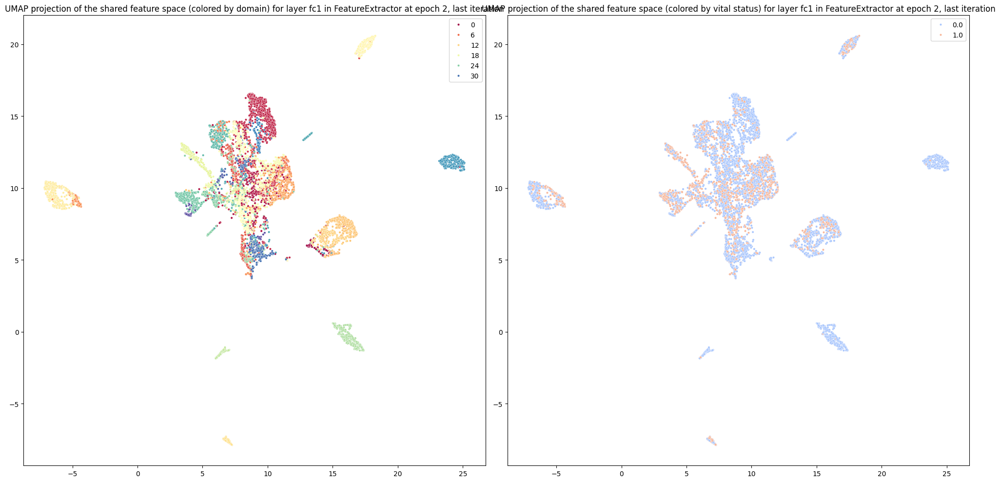

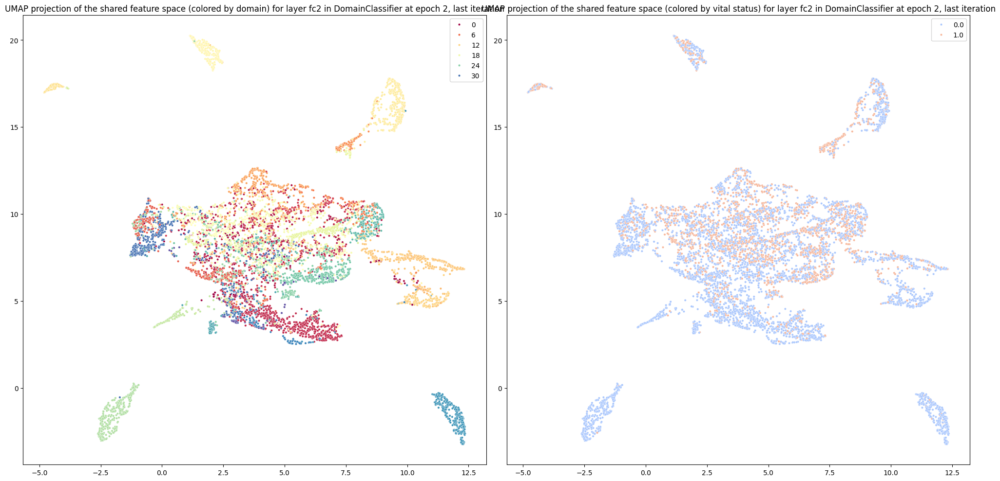

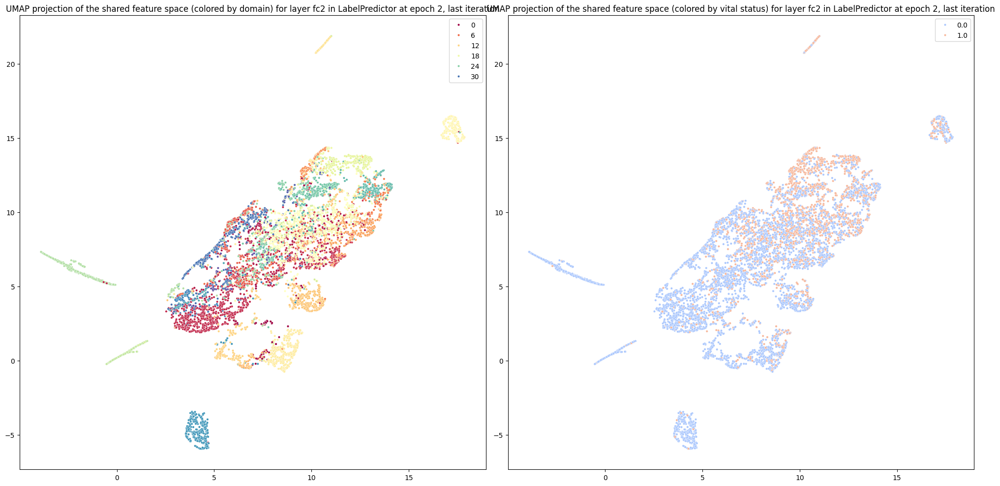

In [39]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from sklearn.preprocessing import LabelEncoder
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import umap
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
from torchsummary import summary  # Importar torchsummary para imprimir el resumen del modelo

# Configurar el dispositivo para GPU si está disponible, de lo contrario, usar CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Usando dispositivo: {device}")

# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)
from sklearn.model_selection import train_test_split

# Dividir los datos en conjuntos de entrenamiento (80%) y prueba (20%) de forma estratificada
X_train, X_test, Y_train, Y_test, panels_train, panels_test = train_test_split(
    X, Y, panels, test_size=0.2, stratify=Y, random_state=42
)

# Sobrescribir X y Y con los datos de entrenamiento
X = X_train
Y = Y_train
panels = panels_train


# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Codificar las etiquetas de dominio (paneles)
label_encoder_panel = LabelEncoder()
panels = label_encoder_panel.fit_transform(panels)

# Convertir los datos a tensores y moverlos al dispositivo
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)
panels_tensor = torch.tensor(panels, dtype=torch.long).to(device)

# Crear datasets y dataloaders
batch_size = 128
dataset = TensorDataset(X_tensor, Y_tensor, panels_tensor)
loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Definición del modelo DANN mejorado
class FeatureExtractor(nn.Module):
    def __init__(self, input_dim):
        super(FeatureExtractor, self).__init__()
        self.fc1 = nn.Linear(input_dim, 50)  # Capa única con 10,000 neuronas
        self.bn1 = nn.BatchNorm1d(50)
        self.dropout1 = nn.Dropout(0.3)  # Dropout moderado

        # Aplicar inicialización He a la capa
        nn.init.kaiming_normal_(self.fc1.weight, nonlinearity='leaky_relu')

    def forward(self, x, lambda_=1.0):
        x = F.leaky_relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        return x

class LabelPredictor(nn.Module):
    def __init__(self, input_dim):
        super(LabelPredictor, self).__init__()
        self.fc1 = nn.Linear(input_dim, 50)
        self.bn1 = nn.BatchNorm1d(50)
        self.dropout1 = nn.Dropout(0.3)  # Dropout moderado
        self.fc2 = nn.Linear(50, 50)
        self.bn2 = nn.BatchNorm1d(50)
        self.dropout2 = nn.Dropout(0.3)  # Dropout moderado
        self.fc3 = nn.Linear(50, 1)

        # Aplicar inicialización He a las capas
        nn.init.kaiming_normal_(self.fc1.weight, nonlinearity='leaky_relu')
        nn.init.kaiming_normal_(self.fc2.weight, nonlinearity='leaky_relu')
        nn.init.kaiming_normal_(self.fc3.weight, nonlinearity='leaky_relu')

    def forward(self, x):
        x = F.leaky_relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        x = F.leaky_relu(self.bn2(self.fc2(x)))
        x = self.dropout2(x)
        x = torch.sigmoid(self.fc3(x))
        return x

class DomainClassifier(nn.Module):
    def __init__(self, input_dim, num_domains):
        super(DomainClassifier, self).__init__()
        self.fc1 = nn.Linear(input_dim, 50)
        self.bn1 = nn.BatchNorm1d(50)
        self.dropout1 = nn.Dropout(0.9)  # Dropout moderado
        self.fc2 = nn.Linear(50, 50)
        self.bn2 = nn.BatchNorm1d(50)
        self.dropout2 = nn.Dropout(0.9)  # Dropout moderado
        self.fc3 = nn.Linear(50, num_domains)

        # Aplicar inicialización He a las capas
        nn.init.kaiming_normal_(self.fc1.weight, nonlinearity='leaky_relu')
        nn.init.kaiming_normal_(self.fc2.weight, nonlinearity='leaky_relu')
        nn.init.kaiming_normal_(self.fc3.weight, nonlinearity='leaky_relu')

    def forward(self, x):
        x = F.leaky_relu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        x = F.leaky_relu(self.bn2(self.fc2(x)))
        x = self.dropout2(x)
        x = self.fc3(x)
        return x

class DANN(nn.Module):
    def __init__(self, feature_dim, num_domains):
        super(DANN, self).__init__()
        self.feature_extractor = FeatureExtractor(feature_dim)
        self.label_predictor = LabelPredictor(50)
        self.domain_classifier = DomainClassifier(50, num_domains)

    def forward(self, x, lambda_=1.0):
        # Extracción de características
        features = self.feature_extractor(x)

        # Inversión de gradiente con lambda
        reverse_features = ReverseLayerF.apply(features, lambda_)

        # Predicción de etiquetas
        label_output = self.label_predictor(features)

        # Clasificación de dominio
        domain_output = self.domain_classifier(reverse_features)

        return label_output, domain_output, features

class ReverseLayerF(torch.autograd.Function):
    @staticmethod
    def forward(ctx, x, lambda_):
        ctx.lambda_ = lambda_  # Guardamos lambda para usarla en la retropropagación
        return x.view_as(x)  # Devolvemos las características sin cambios

    @staticmethod
    def backward(ctx, grad_output):
        # Invertimos los gradientes y los escalamos por lambda
        output = grad_output.neg() * ctx.lambda_
        return output, None  # Retornamos el gradiente invertido

# Función para listar las capas de un módulo
def list_module_layers(module, module_name):
    print(f"Capas disponibles en {module_name}:")
    for name, mod in module.named_children():
        print(f'Layer name: {name}, Module: {mod}')

# Función para extraer características de una capa específica de un módulo
def extract_layer_features(model, loader, module_name, layer_name, use_features=False):
    model.eval()
    features = []
    labels = []
    domains = []

    with torch.no_grad():
        for inputs, label, domain in loader:
            inputs, label, domain = inputs.to(device), label.to(device), domain.to(device)
            if use_features:
                x = model.feature_extractor(inputs)
            else:
                x = inputs
            module = getattr(model, module_name)
            for name, mod in module.named_children():
                x = mod(x)
                if name == layer_name:
                    break
            features.append(x.cpu().numpy())
            labels.append(label.cpu().numpy())
            domains.append(domain.cpu().numpy())

    features = np.concatenate(features, axis=0)
    labels = np.concatenate(labels, axis=0).flatten()
    domains = np.concatenate(domains, axis=0).flatten()
    return features, labels, domains

# Función para guardar características de una capa específica de un módulo en disco
def save_layer_features_to_disk(epoch_iter, model, loader, module_name, layer_name, use_features=False):
    features, labels, domains = extract_layer_features(model, loader, module_name, layer_name, use_features)

    # Crear un directorio para guardar las características si no existe
    save_dir = "/content/drive/MyDrive/PANCANCER FINAL"
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    # Guardar las características en disco
    file_name = f"{save_dir}/{module_name}_{layer_name}_epoch{epoch_iter[0]}_iter{epoch_iter[1]}.pkl"
    with open(file_name, 'wb') as f:
        pickle.dump((features, labels, domains), f)

# Función para cargar características desde disco
def load_layer_features_from_disk(epoch, iteration, module_name, layer_name):
    file_name = f"/content/drive/MyDrive/PANCANCER FINAL/{module_name}_{layer_name}_epoch{epoch}_iter{iteration}.pkl"
    if os.path.exists(file_name):
        with open(file_name, 'rb') as f:
            features, labels, domains = pickle.load(f)
        return features, labels, domains
    else:
        print(f"No features found for epoch {epoch}, iteration {iteration}, module {module_name}, layer {layer_name}")
        return None, None, None

# Función para visualizar UMAP
def plot_umap(embedding, labels, domains, title_suffix=''):
    plt.figure(figsize=(20, 10))

    plt.subplot(1, 2, 1)
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=domains, palette='Spectral', s=10)
    plt.title(f'UMAP projection of the shared feature space (colored by domain) {title_suffix}')

    plt.subplot(1, 2, 2)
    sns.scatterplot(x=embedding[:, 0], y=embedding[:, 1], hue=labels, palette='coolwarm', s=10)
    plt.title(f'UMAP projection of the shared feature space (colored by vital status) {title_suffix}')

    plt.tight_layout()
    torch.cuda.synchronize()
    plt.show()

# Función para visualizar UMAP de una capa específica en una época e iteración específica
def visualize_layer_umap(epoch, iteration, module_name, layer_name, title_suffix=''):
    features, labels, domains = load_layer_features_from_disk(epoch, iteration, module_name, layer_name)
    if features is not None:
        reducer = umap.UMAP(n_components=2)
        embedding = reducer.fit_transform(features)
        plot_umap(embedding, labels, domains, title_suffix)

# Parámetros
input_dim = X.shape[1]
num_domains = len(label_encoder_panel.classes_)
num_epochs = 10

# Crear el modelo
model = DANN(input_dim, num_domains).to(device)

# Imprimir el resumen de la arquitectura del modelo usando torchsummary
summary(model, input_size=(input_dim,))

# Después de llamar a summary, puedes ajustar el lambda_ durante el entrenamiento
lambda_ = 0.01# Valor ajustado por el usuario

# Definir el optimizador AdamW
optimizer = optim.AdamW(
    model.parameters(),
    lr=0.01,  # Tasa de aprendizaje
    betas=(0.9, 0.99),  # Coeficientes beta
    eps=1e-8,  # Valor pequeño para estabilidad numérica
    weight_decay=0.01,  # Regularización L2
    amsgrad=False  # Si deseas usar la variante AMSGrad
)

# Definir las funciones de pérdida
criterion_label = nn.BCELoss().to(device)
criterion_domain = nn.CrossEntropyLoss().to(device)

# Listas para guardar las precisiones
label_accuracies = []
domain_accuracies = []


class ModelSaver:
    def __init__(self):
        self.models = []

    def save_model(self, model, iteration):
        # Hacer una copia del estado del modelo
        model_copy = {k: v.clone() for k, v in model.state_dict().items()}
        self.models.append((iteration, model_copy))

    def get_models(self):
        return self.models
# Crear instancia de ModelSaver
model_saver = ModelSaver()



# Entrenamiento y guardado de características
for epoch in range(num_epochs):
    model.train()
    correct_label = 0
    correct_domain = 0
    total = 0

    for i, (inputs, labels, domains) in enumerate(loader):
        inputs, labels, domains = inputs.to(device), labels.to(device), domains.to(device)

        # Forward pass: obtiene las predicciones para etiquetas y dominios
        label_preds, domain_preds, features = model(inputs, lambda_)  # El valor de lambda_ es proporcionado aquí

        # Cálculo de pérdidas
        loss_label = criterion_label(label_preds, labels)  # Pérdida de predicción de etiquetas (L_y)
        loss_domain = criterion_domain(domain_preds, domains)  # Pérdida de predicción de dominios (L_d)

        # Reseteo de gradientes acumulados
        optimizer.zero_grad()

        # Suma de las pérdidas de ambas tareas
        loss = loss_label + loss_domain

        # Retropropagación de gradientes (aquí es donde ocurren ambas retropropagaciones)
        loss.backward()

        # Clip gradients to prevent explosion
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        # Actualización de los parámetros del modelo
        optimizer.step()

        predicted_label = (label_preds > 0.5).float()
        correct_label += (predicted_label == labels).sum().item()

        _, predicted_domain = torch.max(domain_preds, 1)
        correct_domain += (predicted_domain == domains).sum().item()

        total += labels.size(0)

        # Guardar características solo para la última iteración dentro de cada época
        if i == len(loader) - 1:  # Solo para la última iteración
            save_layer_features_to_disk((epoch, i), model, loader, 'feature_extractor', 'fc1')
            save_layer_features_to_disk((epoch, i), model, loader, 'domain_classifier', 'fc2', use_features=True)
            save_layer_features_to_disk((epoch, i), model, loader, 'label_predictor', 'fc2', use_features=True)



            # Guardar el modelo después de cada iteración (en este caso la ulitima iteración)
            model_saver.save_model(model, (epoch, i))



    label_accuracy = correct_label / total
    domain_accuracy = correct_domain / total

    label_accuracies.append(label_accuracy)
    domain_accuracies.append(domain_accuracy)

    print(f'Epoch [{epoch+1}/{num_epochs}], Label Accuracy: {label_accuracy:.4f}, Domain Accuracy: {domain_accuracy:.4f}')

# Visualización de UMAP de la última iteración de la segunda época (indexada como epoch 1)
visualize_layer_umap(epoch=1, iteration=len(loader) - 1, module_name='feature_extractor', layer_name='fc1', title_suffix='for layer fc1 in FeatureExtractor at epoch 2, last iteration')
visualize_layer_umap(epoch=1, iteration=len(loader) - 1, module_name='domain_classifier', layer_name='fc2', title_suffix='for layer fc2 in DomainClassifier at epoch 2, last iteration')
visualize_layer_umap(epoch=1, iteration=len(loader) - 1, module_name='label_predictor', layer_name='fc2', title_suffix='for layer fc2 in LabelPredictor at epoch 2, last iteration')


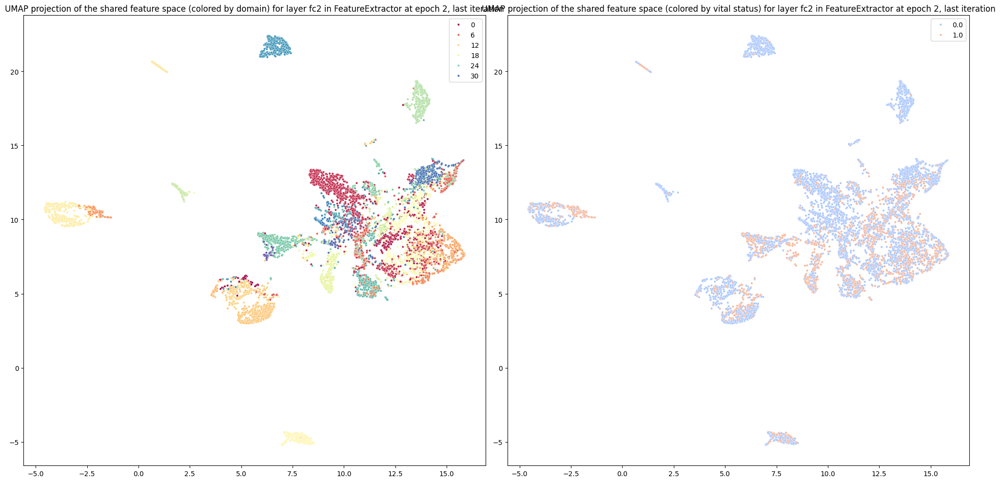

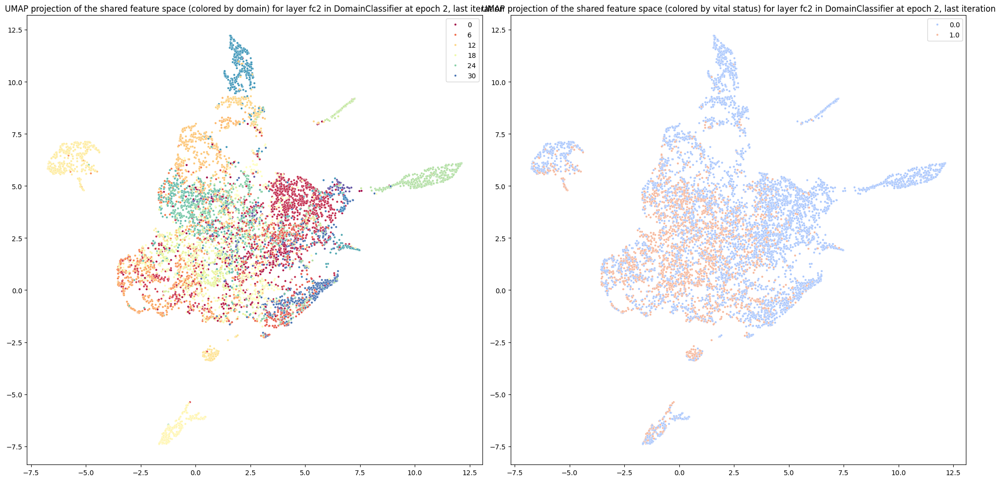

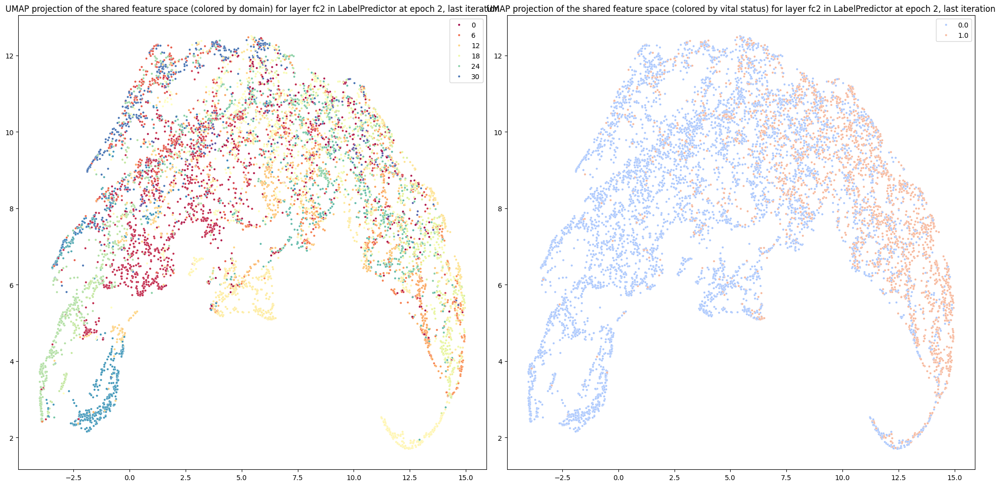

In [40]:
# Visualización de UMAP de la última iteración de la segunda época (indexada como epoch 1)
visualize_layer_umap(epoch=4, iteration=len(loader) - 1, module_name='feature_extractor', layer_name='fc1', title_suffix='for layer fc2 in FeatureExtractor at epoch 2, last iteration')
visualize_layer_umap(epoch=4, iteration=len(loader) - 1, module_name='domain_classifier', layer_name='fc2', title_suffix='for layer fc2 in DomainClassifier at epoch 2, last iteration')
visualize_layer_umap(epoch=4, iteration=len(loader) - 1, module_name='label_predictor', layer_name='fc2', title_suffix='for layer fc2 in LabelPredictor at epoch 2, last iteration')


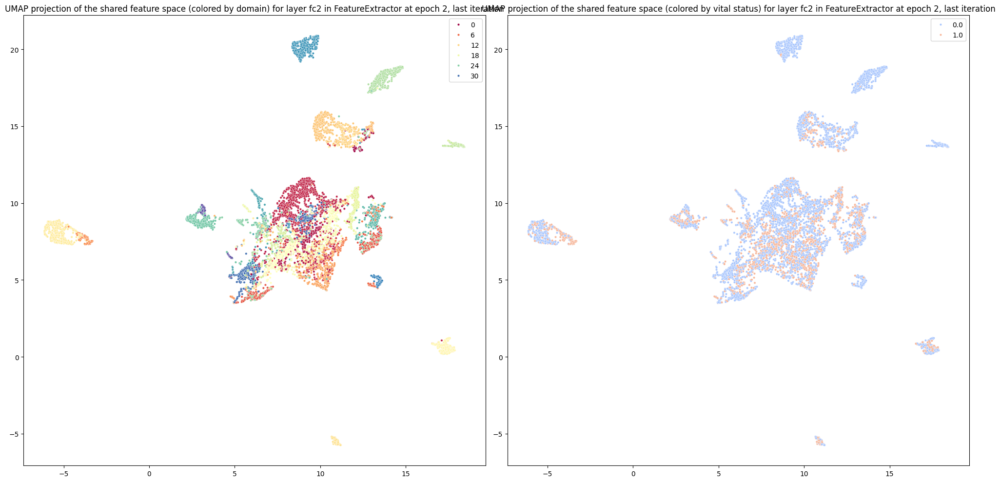

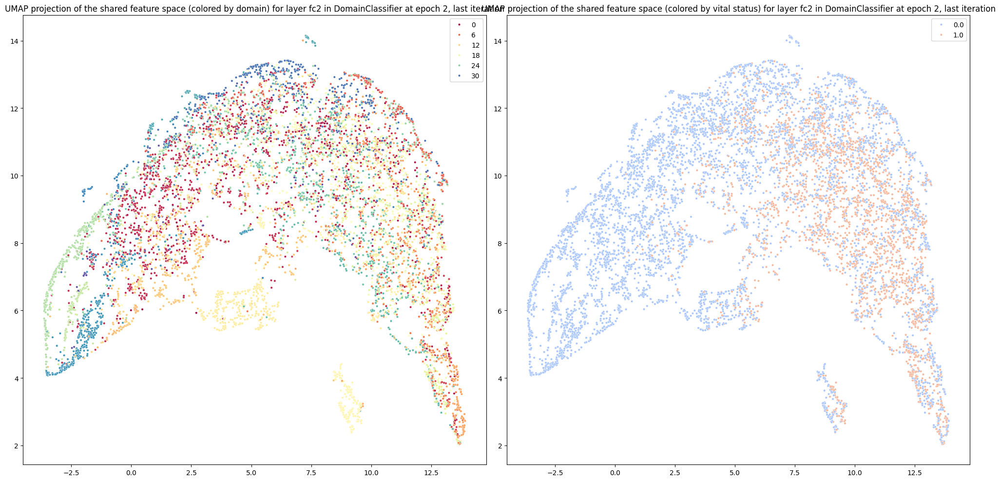

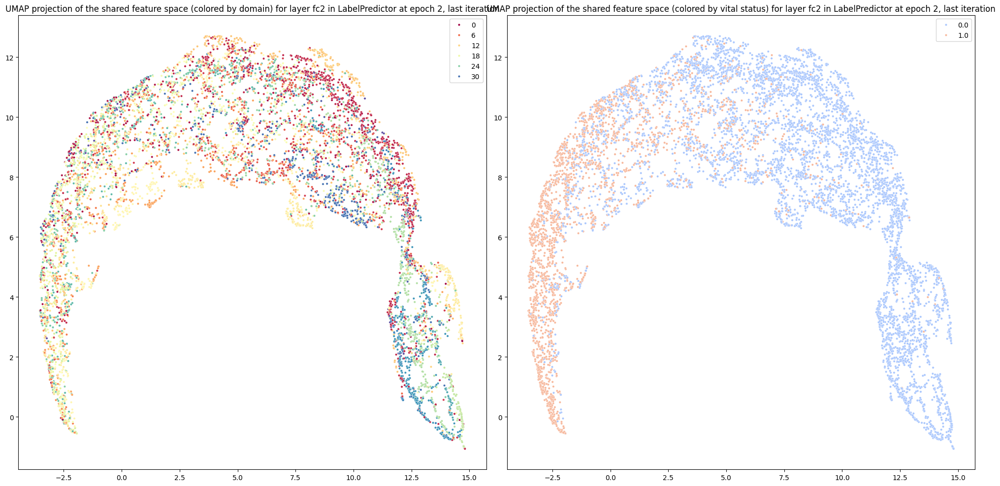

In [41]:
# Visualización de UMAP de la última iteración de la segunda época (indexada como epoch 1)
visualize_layer_umap(epoch=9, iteration=len(loader) - 1, module_name='feature_extractor', layer_name='fc1', title_suffix='for layer fc2 in FeatureExtractor at epoch 2, last iteration')
visualize_layer_umap(epoch=9, iteration=len(loader) - 1, module_name='domain_classifier', layer_name='fc2', title_suffix='for layer fc2 in DomainClassifier at epoch 2, last iteration')
visualize_layer_umap(epoch=9, iteration=len(loader) - 1, module_name='label_predictor', layer_name='fc2', title_suffix='for layer fc2 in LabelPredictor at epoch 2, last iteration')


In [19]:
# Supongamos que la época 5 es la que te interesa (indexada como 4 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 5 es epoch 4

# Obtener el modelo guardado al final de la época 5
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)


Modelo guardado al final de la época 10, iteración 65


<All keys matched successfully>

Modelo guardado al final de la época 3, iteración 65


Calculando valores SHAP:   0%|          | 2/10286 [00:00<27:55,  6.14it/s]

SHAP values for instance 0: [[[-7.88836180e-08]
  [-7.90582756e-07]
  [ 5.73611674e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77440974e-08]]]
SHAP values for instance 1: [[[-3.63643970e-09]
  [-4.05383697e-07]
  [ 8.40023718e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41717061e-08]]]


Calculando valores SHAP:   0%|          | 4/10286 [00:00<29:30,  5.81it/s]

SHAP values for instance 2: [[[-7.49921545e-08]
  [-1.07976447e-06]
  [ 2.57103369e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.49078893e-08]]]
SHAP values for instance 3: [[[-4.21856210e-08]
  [-8.18671929e-07]
  [ 1.49835892e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46642905e-07]]]


Calculando valores SHAP:   0%|          | 6/10286 [00:01<28:49,  5.94it/s]

SHAP values for instance 4: [[[ 1.97715141e-08]
  [-2.07814419e-07]
  [ 6.81880193e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.75663852e-08]]]
SHAP values for instance 5: [[[ 3.32658768e-08]
  [-1.38594407e-07]
  [ 2.15843057e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22872170e-07]]]


Calculando valores SHAP:   0%|          | 8/10286 [00:01<28:29,  6.01it/s]

SHAP values for instance 6: [[[-4.92015669e-08]
  [-1.73641916e-07]
  [ 2.56076372e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57506001e-07]]]
SHAP values for instance 7: [[[-5.73347040e-08]
  [-1.63387370e-07]
  [ 3.06383492e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09339523e-07]]]


Calculando valores SHAP:   0%|          | 10/10286 [00:01<28:50,  5.94it/s]

SHAP values for instance 8: [[[-5.08722997e-08]
  [-2.13791634e-07]
  [ 6.38640090e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.34974989e-07]]]
SHAP values for instance 9: [[[-2.56457195e-08]
  [-1.23610780e-07]
  [ 2.69784498e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.98578500e-07]]]


Calculando valores SHAP:   0%|          | 12/10286 [00:02<28:28,  6.01it/s]

SHAP values for instance 10: [[[-1.91615167e-08]
  [-8.85316275e-08]
  [ 1.55385990e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.97031542e-08]]]
SHAP values for instance 11: [[[-7.79113895e-08]
  [-6.90485991e-07]
  [ 9.02532263e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48996944e-07]]]


Calculando valores SHAP:   0%|          | 14/10286 [00:02<28:21,  6.04it/s]

SHAP values for instance 12: [[[ 6.54947047e-08]
  [-7.95645558e-08]
  [ 1.13104439e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.69926374e-07]]]
SHAP values for instance 13: [[[-4.38182182e-08]
  [-1.28255480e-07]
  [ 1.07111666e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.68393278e-08]]]


Calculando valores SHAP:   0%|          | 16/10286 [00:02<29:45,  5.75it/s]

SHAP values for instance 14: [[[-4.38567654e-08]
  [-4.59131651e-07]
  [ 4.35587213e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23281055e-07]]]
SHAP values for instance 15: [[[ 4.89021788e-08]
  [-2.16434961e-07]
  [ 2.64797925e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79155329e-08]]]


Calculando valores SHAP:   0%|          | 18/10286 [00:03<30:30,  5.61it/s]

SHAP values for instance 16: [[[-5.57413842e-08]
  [-6.21362929e-08]
  [ 1.04244139e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90785223e-08]]]
SHAP values for instance 17: [[[ 1.01641498e-08]
  [-4.79065901e-07]
  [ 4.34767576e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98299304e-07]]]


Calculando valores SHAP:   0%|          | 20/10286 [00:03<29:47,  5.74it/s]

SHAP values for instance 18: [[[ 1.67046695e-07]
  [-9.93027984e-07]
  [ 3.74401463e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58196396e-07]]]
SHAP values for instance 19: [[[-3.32814819e-08]
  [-2.35055777e-07]
  [ 9.37245846e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32366017e-07]]]


Calculando valores SHAP:   0%|          | 22/10286 [00:03<28:58,  5.90it/s]

SHAP values for instance 20: [[[ 3.52386523e-08]
  [ 3.32453493e-08]
  [ 2.13964498e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.87251615e-08]]]
SHAP values for instance 21: [[[ 3.23376445e-08]
  [-3.09752160e-07]
  [ 1.50685570e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01046703e-08]]]


Calculando valores SHAP:   0%|          | 24/10286 [00:04<28:33,  5.99it/s]

SHAP values for instance 22: [[[-3.65331388e-08]
  [-4.18316058e-07]
  [ 6.19649812e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36872632e-07]]]
SHAP values for instance 23: [[[-3.39851107e-08]
  [-6.65382080e-07]
  [ 1.29186551e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95310615e-07]]]


Calculando valores SHAP:   0%|          | 26/10286 [00:04<29:04,  5.88it/s]

SHAP values for instance 24: [[[-2.79148132e-08]
  [-2.72699026e-07]
  [ 2.29385039e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48202904e-07]]]
SHAP values for instance 25: [[[ 2.76456024e-07]
  [-4.90557572e-07]
  [ 3.86946426e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.57517280e-07]]]


Calculando valores SHAP:   0%|          | 28/10286 [00:04<29:00,  5.89it/s]

SHAP values for instance 26: [[[-3.77403929e-08]
  [-4.31563321e-07]
  [ 1.55349486e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30914256e-07]]]
SHAP values for instance 27: [[[ 4.30733212e-09]
  [-2.03935922e-06]
  [ 2.12702052e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29699261e-07]]]


Calculando valores SHAP:   0%|          | 30/10286 [00:05<28:38,  5.97it/s]

SHAP values for instance 28: [[[ 6.14986791e-08]
  [-8.17078982e-06]
  [ 6.99225070e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.61556465e-07]]]
SHAP values for instance 29: [[[ 7.10108130e-08]
  [-8.57049179e-08]
  [ 7.65868727e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.05772474e-07]]]


Calculando valores SHAP:   0%|          | 32/10286 [00:05<28:25,  6.01it/s]

SHAP values for instance 30: [[[ 8.33652716e-08]
  [-3.22242111e-07]
  [ 9.02898486e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.35185499e-07]]]
SHAP values for instance 31: [[[-4.75315181e-08]
  [-4.93216500e-07]
  [ 1.55190637e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71469320e-07]]]


Calculando valores SHAP:   0%|          | 34/10286 [00:05<29:56,  5.71it/s]

SHAP values for instance 32: [[[-2.78630872e-08]
  [-7.05876453e-08]
  [ 1.54391431e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05904147e-07]]]
SHAP values for instance 33: [[[-7.22318160e-09]
  [-2.38282166e-06]
  [ 3.76939793e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.34264170e-07]]]


Calculando valores SHAP:   0%|          | 36/10286 [00:06<29:40,  5.76it/s]

SHAP values for instance 34: [[[ 5.14877850e-08]
  [-1.13120455e-07]
  [ 2.33512620e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.79989290e-08]]]
SHAP values for instance 35: [[[ 7.20140496e-08]
  [-5.41208841e-07]
  [ 1.38935900e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.67165824e-08]]]


Calculando valores SHAP:   0%|          | 38/10286 [00:06<28:59,  5.89it/s]

SHAP values for instance 36: [[[-4.30475742e-08]
  [-4.24860928e-08]
  [-1.44880675e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.57984588e-07]]]
SHAP values for instance 37: [[[-2.93100073e-08]
  [-1.82585001e-07]
  [ 3.67456656e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96170586e-07]]]


Calculando valores SHAP:   0%|          | 40/10286 [00:06<30:13,  5.65it/s]

SHAP values for instance 38: [[[ 2.02765195e-08]
  [-2.41442433e-07]
  [ 2.80587426e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.65422907e-09]]]
SHAP values for instance 39: [[[-4.27095895e-08]
  [-8.26663876e-07]
  [ 5.51467166e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24396524e-07]]]


Calculando valores SHAP:   0%|          | 42/10286 [00:07<30:44,  5.55it/s]

SHAP values for instance 40: [[[ 9.79410880e-08]
  [-5.74105928e-08]
  [ 1.53579191e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75229571e-08]]]
SHAP values for instance 41: [[[-3.55637878e-08]
  [-1.63829911e-07]
  [ 2.58755014e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.88731184e-08]]]


Calculando valores SHAP:   0%|          | 44/10286 [00:07<30:05,  5.67it/s]

SHAP values for instance 42: [[[-6.83795896e-08]
  [-2.07682403e-07]
  [ 2.43467762e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.22942478e-09]]]
SHAP values for instance 43: [[[ 1.82127371e-08]
  [-1.71192058e-07]
  [ 2.81050797e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.19923269e-09]]]


Calculando valores SHAP:   0%|          | 46/10286 [00:07<28:57,  5.89it/s]

SHAP values for instance 44: [[[ 4.69052356e-08]
  [-1.85577838e-07]
  [ 6.10524572e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28915377e-07]]]
SHAP values for instance 45: [[[ 3.04207666e-08]
  [ 3.60255186e-08]
  [-4.87897054e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.90135276e-07]]]


Calculando valores SHAP:   0%|          | 48/10286 [00:08<28:10,  6.05it/s]

SHAP values for instance 46: [[[ 6.75599003e-08]
  [-1.25674937e-07]
  [ 3.80301097e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.13457568e-07]]]
SHAP values for instance 47: [[[ 5.17077678e-08]
  [-1.44118602e-07]
  [ 6.30539124e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18920334e-07]]]


Calculando valores SHAP:   0%|          | 50/10286 [00:08<28:14,  6.04it/s]

SHAP values for instance 48: [[[-1.28393834e-08]
  [-1.35626892e-07]
  [ 1.35354011e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04439751e-07]]]
SHAP values for instance 49: [[[-8.60015471e-08]
  [-1.09859706e-06]
  [ 4.72432576e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.92865640e-07]]]


Calculando valores SHAP:   1%|          | 52/10286 [00:08<28:02,  6.08it/s]

SHAP values for instance 50: [[[-4.16993071e-08]
  [-4.54413412e-07]
  [ 4.03158727e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.45351770e-08]]]
SHAP values for instance 51: [[[ 5.05519757e-08]
  [-2.05792423e-07]
  [ 4.64958337e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84487346e-07]]]


Calculando valores SHAP:   1%|          | 54/10286 [00:09<29:47,  5.73it/s]

SHAP values for instance 52: [[[-6.96825404e-08]
  [-1.12365937e-07]
  [ 2.76523216e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02441263e-07]]]
SHAP values for instance 53: [[[ 2.87980803e-08]
  [-4.50603019e-08]
  [ 3.39431309e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54979239e-07]]]


Calculando valores SHAP:   1%|          | 56/10286 [00:09<29:01,  5.87it/s]

SHAP values for instance 54: [[[-6.25156604e-08]
  [-2.76427446e-07]
  [ 2.11422168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.37167781e-08]]]
SHAP values for instance 55: [[[ 2.50336270e-10]
  [-2.23160427e-07]
  [ 8.12848613e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.62202285e-08]]]


Calculando valores SHAP:   1%|          | 58/10286 [00:09<28:11,  6.05it/s]

SHAP values for instance 56: [[[-5.98447836e-08]
  [ 2.08555135e-07]
  [-4.79280854e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59074763e-07]]]
SHAP values for instance 57: [[[-4.21425791e-08]
  [-2.30779339e-07]
  [ 3.18431802e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60759383e-07]]]


Calculando valores SHAP:   1%|          | 60/10286 [00:10<27:41,  6.16it/s]

SHAP values for instance 58: [[[ 1.72191339e-08]
  [-3.59817518e-07]
  [ 1.85220005e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.80221667e-08]]]
SHAP values for instance 59: [[[-9.89134630e-09]
  [-9.44567888e-07]
  [ 4.92216197e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24761136e-07]]]


Calculando valores SHAP:   1%|          | 62/10286 [00:10<28:17,  6.02it/s]

SHAP values for instance 60: [[[-2.60139177e-08]
  [-1.41768421e-07]
  [ 1.28995821e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.61016578e-08]]]
SHAP values for instance 61: [[[-4.84704922e-08]
  [-5.76250899e-07]
  [ 2.85567912e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71751858e-08]]]


Calculando valores SHAP:   1%|          | 64/10286 [00:10<28:07,  6.06it/s]

SHAP values for instance 62: [[[-6.22114107e-09]
  [-3.20891485e-07]
  [ 2.48235956e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.84306821e-07]]]
SHAP values for instance 63: [[[ 3.74806896e-08]
  [-5.46637671e-07]
  [ 1.55932454e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72543117e-07]]]


Calculando valores SHAP:   1%|          | 66/10286 [00:11<27:56,  6.09it/s]

SHAP values for instance 64: [[[ 6.31534680e-08]
  [-1.19320358e-06]
  [ 3.50629003e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07348250e-08]]]
SHAP values for instance 65: [[[-1.82657070e-08]
  [-3.97466443e-08]
  [ 9.20511661e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02789057e-07]]]


Calculando valores SHAP:   1%|          | 68/10286 [00:11<28:25,  5.99it/s]

SHAP values for instance 66: [[[-1.92266662e-08]
  [-2.21916287e-07]
  [ 4.22175369e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.02498696e-07]]]
SHAP values for instance 67: [[[ 1.72128944e-08]
  [-1.19605133e-06]
  [ 3.05366399e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32388824e-07]]]


Calculando valores SHAP:   1%|          | 70/10286 [00:11<28:45,  5.92it/s]

SHAP values for instance 68: [[[-4.06230783e-08]
  [-9.46560574e-08]
  [ 5.22770177e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07999803e-07]]]
SHAP values for instance 69: [[[ 1.23760337e-07]
  [-2.01799089e-07]
  [ 2.82813461e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84144746e-07]]]


Calculando valores SHAP:   1%|          | 72/10286 [00:12<28:36,  5.95it/s]

SHAP values for instance 70: [[[ 4.97860034e-08]
  [-1.89213354e-07]
  [-1.05959461e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.49678092e-08]]]
SHAP values for instance 71: [[[-1.47847352e-08]
  [-2.43898653e-07]
  [ 2.63696680e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.04649048e-07]]]


Calculando valores SHAP:   1%|          | 74/10286 [00:12<28:54,  5.89it/s]

SHAP values for instance 72: [[[-3.34732661e-08]
  [-6.53708554e-07]
  [ 3.29760627e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05564881e-07]]]
SHAP values for instance 73: [[[-5.16613537e-08]
  [-3.35512916e-07]
  [ 2.68363356e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.51380422e-08]]]


Calculando valores SHAP:   1%|          | 76/10286 [00:12<28:37,  5.94it/s]

SHAP values for instance 74: [[[-4.21575839e-08]
  [-2.15489558e-06]
  [ 2.50391282e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16856575e-08]]]
SHAP values for instance 75: [[[-6.65072530e-08]
  [-9.65616489e-07]
  [ 6.81597889e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46048439e-08]]]


Calculando valores SHAP:   1%|          | 78/10286 [00:13<28:25,  5.99it/s]

SHAP values for instance 76: [[[ 2.35623271e-08]
  [-2.53453680e-07]
  [ 9.90123214e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52909010e-07]]]
SHAP values for instance 77: [[[-8.60319172e-09]
  [-1.14711544e-07]
  [ 8.01323236e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.70711665e-07]]]


Calculando valores SHAP:   1%|          | 80/10286 [00:13<28:21,  6.00it/s]

SHAP values for instance 78: [[[ 1.88115026e-08]
  [-1.37964117e-06]
  [ 2.65052912e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.45496497e-08]]]
SHAP values for instance 79: [[[-4.92396906e-08]
  [-4.72877998e-07]
  [ 8.91944402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16145494e-08]]]


Calculando valores SHAP:   1%|          | 82/10286 [00:13<28:17,  6.01it/s]

SHAP values for instance 80: [[[-7.99221394e-08]
  [-2.54536829e-07]
  [ 2.29930870e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.75756602e-08]]]
SHAP values for instance 81: [[[ 5.69963783e-10]
  [-3.05008116e-07]
  [ 8.51072523e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60005455e-07]]]


Calculando valores SHAP:   1%|          | 84/10286 [00:14<28:19,  6.00it/s]

SHAP values for instance 82: [[[-4.98381240e-08]
  [-3.42991840e-06]
  [ 5.69478035e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62448192e-07]]]
SHAP values for instance 83: [[[ 5.03095755e-08]
  [-8.01424148e-07]
  [ 1.01224238e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76390742e-07]]]


Calculando valores SHAP:   1%|          | 86/10286 [00:14<28:54,  5.88it/s]

SHAP values for instance 84: [[[ 3.85227707e-08]
  [-1.13041549e-06]
  [ 3.86071139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.43407154e-08]]]
SHAP values for instance 85: [[[ 3.04566264e-08]
  [ 1.42238487e-06]
  [-6.85335065e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03715885e-07]]]


Calculando valores SHAP:   1%|          | 88/10286 [00:14<28:26,  5.98it/s]

SHAP values for instance 86: [[[-6.25503619e-08]
  [-2.50293492e-07]
  [ 2.72829469e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63301471e-07]]]
SHAP values for instance 87: [[[ 1.32687651e-07]
  [-1.62341989e-07]
  [ 2.34190512e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.05890845e-07]]]


Calculando valores SHAP:   1%|          | 90/10286 [00:15<28:14,  6.02it/s]

SHAP values for instance 88: [[[-4.40579692e-08]
  [-2.19888026e-06]
  [ 6.94932943e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.80794589e-07]]]
SHAP values for instance 89: [[[-7.79312014e-08]
  [-7.87599562e-07]
  [ 5.69115320e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87938341e-07]]]


Calculando valores SHAP:   1%|          | 92/10286 [00:15<28:12,  6.02it/s]

SHAP values for instance 90: [[[-1.18296924e-08]
  [-2.76338136e-06]
  [ 1.06605533e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36641530e-07]]]
SHAP values for instance 91: [[[-2.52337964e-08]
  [-3.52025730e-08]
  [ 8.85228936e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.07831810e-08]]]


Calculando valores SHAP:   1%|          | 94/10286 [00:15<28:17,  6.00it/s]

SHAP values for instance 92: [[[ 4.36237402e-08]
  [-1.01978499e-07]
  [ 4.73604125e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.99659068e-08]]]
SHAP values for instance 93: [[[ 7.31695988e-09]
  [-2.92293470e-07]
  [ 1.45461122e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30862357e-07]]]


Calculando valores SHAP:   1%|          | 96/10286 [00:16<28:16,  6.01it/s]

SHAP values for instance 94: [[[ 2.13807632e-08]
  [-8.95466612e-08]
  [ 1.46486272e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.01372994e-07]]]
SHAP values for instance 95: [[[-5.97287926e-08]
  [-2.07029937e-07]
  [ 7.66675811e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89674761e-07]]]


Calculando valores SHAP:   1%|          | 98/10286 [00:16<28:54,  5.87it/s]

SHAP values for instance 96: [[[-3.42002793e-08]
  [-6.05606495e-08]
  [ 2.16070666e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.59055376e-08]]]
SHAP values for instance 97: [[[ 3.05508522e-08]
  [-1.28937841e-06]
  [ 4.87658365e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.15330708e-08]]]


Calculando valores SHAP:   1%|          | 100/10286 [00:16<28:22,  5.98it/s]

SHAP values for instance 98: [[[-4.83999990e-08]
  [-7.30331347e-07]
  [ 2.54744380e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01523434e-07]]]
SHAP values for instance 99: [[[ 2.05949603e-08]
  [-5.86638241e-08]
  [ 2.49014674e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.13665467e-07]]]


Calculando valores SHAP:   1%|          | 102/10286 [00:17<28:00,  6.06it/s]

SHAP values for instance 100: [[[ 1.69688298e-08]
  [ 2.20368210e-06]
  [-3.45240177e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44589543e-07]]]
SHAP values for instance 101: [[[3.04168574e-07]
  [1.56059962e-07]
  [3.17088442e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [9.35577143e-07]]]


Calculando valores SHAP:   1%|          | 104/10286 [00:17<28:39,  5.92it/s]

SHAP values for instance 102: [[[-1.45996300e-08]
  [-5.35115517e-07]
  [ 3.39816768e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04816801e-07]]]
SHAP values for instance 103: [[[ 5.50026286e-08]
  [-9.26814950e-08]
  [ 2.34359864e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.48715854e-08]]]


Calculando valores SHAP:   1%|          | 106/10286 [00:17<28:10,  6.02it/s]

SHAP values for instance 104: [[[-1.12368817e-08]
  [-1.67167350e-06]
  [ 4.71249569e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.67019162e-08]]]
SHAP values for instance 105: [[[-3.24899667e-08]
  [-3.39222116e-07]
  [ 5.46947647e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08106421e-07]]]


Calculando valores SHAP:   1%|          | 108/10286 [00:18<27:57,  6.07it/s]

SHAP values for instance 106: [[[-7.11343722e-08]
  [-1.68678297e-06]
  [ 9.93788509e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.52654188e-07]]]
SHAP values for instance 107: [[[1.48672939e-08]
  [2.34702623e-08]
  [2.23463048e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [2.57923457e-08]]]


Calculando valores SHAP:   1%|          | 110/10286 [00:18<27:54,  6.08it/s]

SHAP values for instance 108: [[[-6.96957847e-09]
  [-7.95970840e-08]
  [ 1.06569289e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.76333864e-08]]]
SHAP values for instance 109: [[[-6.72083843e-08]
  [-4.64762686e-07]
  [ 9.06463772e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92467514e-07]]]


Calculando valores SHAP:   1%|          | 112/10286 [00:18<27:57,  6.07it/s]

SHAP values for instance 110: [[[-2.70625711e-08]
  [-4.64731396e-08]
  [ 2.85050157e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96061570e-07]]]
SHAP values for instance 111: [[[-1.66340535e-08]
  [-1.78118791e-07]
  [ 1.97117131e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.56220211e-07]]]


Calculando valores SHAP:   1%|          | 114/10286 [00:19<28:01,  6.05it/s]

SHAP values for instance 112: [[[-2.27208380e-08]
  [-7.78875089e-08]
  [ 4.81740964e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.87219058e-08]]]
SHAP values for instance 113: [[[-8.32687285e-09]
  [-7.95194940e-08]
  [ 3.62925724e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.56716148e-08]]]


Calculando valores SHAP:   1%|          | 116/10286 [00:19<28:00,  6.05it/s]

SHAP values for instance 114: [[[-5.23315730e-08]
  [-6.67153865e-07]
  [ 1.90682887e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85083846e-07]]]
SHAP values for instance 115: [[[-1.36271795e-08]
  [-3.54318192e-07]
  [ 1.45789939e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.53586550e-07]]]


Calculando valores SHAP:   1%|          | 118/10286 [00:19<28:00,  6.05it/s]

SHAP values for instance 116: [[[-3.37793966e-08]
  [-3.46569003e-07]
  [ 4.35155454e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68686844e-07]]]
SHAP values for instance 117: [[[-4.74612518e-08]
  [-2.90214827e-08]
  [ 3.50839068e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.87777203e-08]]]


Calculando valores SHAP:   1%|          | 120/10286 [00:20<27:56,  6.06it/s]

SHAP values for instance 118: [[[-4.00546551e-08]
  [-1.73744571e-07]
  [ 3.46398446e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.22785468e-07]]]
SHAP values for instance 119: [[[-1.70087092e-08]
  [-2.71756292e-06]
  [ 6.89926630e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83405850e-07]]]


Calculando valores SHAP:   1%|          | 122/10286 [00:20<29:20,  5.77it/s]

SHAP values for instance 120: [[[-7.71404141e-08]
  [-2.47125245e-06]
  [ 1.10155074e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.71180143e-07]]]
SHAP values for instance 121: [[[-5.61634737e-08]
  [-1.75964321e-07]
  [ 9.36428395e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99411141e-07]]]


Calculando valores SHAP:   1%|          | 124/10286 [00:20<30:20,  5.58it/s]

SHAP values for instance 122: [[[ 8.19094909e-08]
  [-3.07497706e-07]
  [ 9.89083230e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66703481e-07]]]
SHAP values for instance 123: [[[-4.08148614e-08]
  [-1.16165190e-07]
  [ 6.15558514e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43418157e-07]]]


Calculando valores SHAP:   1%|          | 126/10286 [00:21<30:37,  5.53it/s]

SHAP values for instance 124: [[[ 2.35277099e-08]
  [-3.51045762e-07]
  [ 1.77233343e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.70110923e-09]]]
SHAP values for instance 125: [[[ 1.41619251e-10]
  [-3.61623581e-08]
  [ 3.24038908e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41522495e-07]]]


Calculando valores SHAP:   1%|          | 128/10286 [00:21<29:08,  5.81it/s]

SHAP values for instance 126: [[[-1.05788681e-08]
  [-9.88844672e-07]
  [ 7.08858116e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34817251e-08]]]
SHAP values for instance 127: [[[-2.55007134e-08]
  [-1.37990270e-07]
  [ 3.14121607e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58689822e-08]]]


Calculando valores SHAP:   1%|▏         | 130/10286 [00:21<29:25,  5.75it/s]

SHAP values for instance 128: [[[-5.08631265e-08]
  [-6.45304898e-07]
  [ 8.50662401e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33268273e-07]]]
SHAP values for instance 129: [[[-2.33207574e-08]
  [-2.09893780e-08]
  [ 1.87149976e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.28901698e-07]]]


Calculando valores SHAP:   1%|▏         | 132/10286 [00:22<30:05,  5.62it/s]

SHAP values for instance 130: [[[ 1.47042218e-08]
  [ 1.98349548e-06]
  [-2.33977081e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75952503e-07]]]
SHAP values for instance 131: [[[-2.51355277e-08]
  [-2.61117747e-07]
  [ 3.83963733e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.22753768e-07]]]


Calculando valores SHAP:   1%|▏         | 134/10286 [00:22<29:20,  5.77it/s]

SHAP values for instance 132: [[[-3.00145180e-08]
  [-2.53601912e-07]
  [ 1.50782107e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01496382e-07]]]
SHAP values for instance 133: [[[ 8.98617705e-07]
  [-1.83003685e-07]
  [-1.52594923e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.83462017e-07]]]


Calculando valores SHAP:   1%|▏         | 136/10286 [00:23<28:40,  5.90it/s]

SHAP values for instance 134: [[[-1.18642685e-08]
  [-5.30437552e-07]
  [ 5.02612090e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.88288587e-08]]]
SHAP values for instance 135: [[[-8.87616544e-09]
  [-1.08465846e-07]
  [ 4.96934545e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.68767274e-08]]]


Calculando valores SHAP:   1%|▏         | 138/10286 [00:23<28:16,  5.98it/s]

SHAP values for instance 136: [[[-4.88573012e-09]
  [-2.93054225e-07]
  [ 9.62370612e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50127530e-08]]]
SHAP values for instance 137: [[[-4.68564556e-08]
  [-5.28696543e-07]
  [ 5.68366724e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.98644758e-08]]]


Calculando valores SHAP:   1%|▏         | 140/10286 [00:23<28:01,  6.04it/s]

SHAP values for instance 138: [[[-4.46848038e-08]
  [-7.68322302e-07]
  [ 4.16105066e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89697393e-07]]]
SHAP values for instance 139: [[[-5.43926531e-08]
  [-1.27239450e-06]
  [-4.44429754e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.61172052e-07]]]


Calculando valores SHAP:   1%|▏         | 142/10286 [00:23<28:05,  6.02it/s]

SHAP values for instance 140: [[[ 3.50003277e-08]
  [-4.04497393e-07]
  [ 6.63113457e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68870396e-07]]]
SHAP values for instance 141: [[[-2.63206346e-08]
  [-1.93313813e-07]
  [ 1.46186403e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02128008e-07]]]


Calculando valores SHAP:   1%|▏         | 144/10286 [00:24<28:06,  6.02it/s]

SHAP values for instance 142: [[[-7.09758574e-08]
  [-4.28258517e-07]
  [ 3.17415815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.84616088e-08]]]
SHAP values for instance 143: [[[-4.66063642e-08]
  [-2.40150630e-07]
  [ 6.09484233e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97151982e-07]]]


Calculando valores SHAP:   1%|▏         | 146/10286 [00:24<27:35,  6.13it/s]

SHAP values for instance 144: [[[-8.98515020e-09]
  [-6.55794021e-08]
  [ 1.86803794e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.71450515e-08]]]
SHAP values for instance 145: [[[ 1.44531964e-08]
  [-7.36234311e-07]
  [ 1.19827326e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75016637e-08]]]


Calculando valores SHAP:   1%|▏         | 148/10286 [00:24<27:16,  6.20it/s]

SHAP values for instance 146: [[[-9.51699625e-08]
  [-3.42886136e-08]
  [ 3.85642466e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34952832e-07]]]
SHAP values for instance 147: [[[-5.00108721e-08]
  [-3.11768533e-07]
  [ 2.24121420e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90993938e-07]]]


Calculando valores SHAP:   1%|▏         | 150/10286 [00:25<27:03,  6.24it/s]

SHAP values for instance 148: [[[-4.91522717e-08]
  [-2.76292070e-08]
  [-2.01197242e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28858198e-07]]]
SHAP values for instance 149: [[[ 2.26658011e-08]
  [-4.29302459e-07]
  [ 4.44511350e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99913330e-07]]]


Calculando valores SHAP:   1%|▏         | 152/10286 [00:25<27:28,  6.15it/s]

SHAP values for instance 150: [[[-1.94329828e-09]
  [-1.15471041e-06]
  [ 5.90188989e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.94091086e-07]]]
SHAP values for instance 151: [[[-7.41417874e-09]
  [-1.40563657e-07]
  [ 6.30419763e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05117845e-07]]]


Calculando valores SHAP:   1%|▏         | 154/10286 [00:25<27:24,  6.16it/s]

SHAP values for instance 152: [[[-3.95064023e-08]
  [-1.19225355e-07]
  [ 3.59317479e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46179553e-07]]]
SHAP values for instance 153: [[[-4.56112681e-08]
  [-4.29301825e-07]
  [ 1.59072387e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.21391508e-08]]]


Calculando valores SHAP:   2%|▏         | 156/10286 [00:26<27:17,  6.19it/s]

SHAP values for instance 154: [[[ 4.61598454e-07]
  [-3.05211570e-07]
  [-2.33726894e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.96694870e-08]]]
SHAP values for instance 155: [[[-1.33348850e-08]
  [-3.08234118e-09]
  [ 1.39836595e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11645886e-07]]]


Calculando valores SHAP:   2%|▏         | 158/10286 [00:26<27:07,  6.22it/s]

SHAP values for instance 156: [[[-1.41917685e-08]
  [-4.02718391e-07]
  [ 3.59550266e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25288764e-07]]]
SHAP values for instance 157: [[[ 4.74207002e-08]
  [-1.12021325e-08]
  [-8.06929840e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62108841e-06]]]


Calculando valores SHAP:   2%|▏         | 160/10286 [00:26<27:02,  6.24it/s]

SHAP values for instance 158: [[[-7.11709787e-09]
  [-2.99040325e-07]
  [ 3.92730897e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.09579012e-08]]]
SHAP values for instance 159: [[[-3.72145294e-08]
  [-5.59433042e-07]
  [ 1.01098490e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.58568011e-08]]]


Calculando valores SHAP:   2%|▏         | 162/10286 [00:27<26:57,  6.26it/s]

SHAP values for instance 160: [[[ 8.34904364e-08]
  [-1.36605610e-06]
  [ 1.98074794e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.85701695e-07]]]
SHAP values for instance 161: [[[-3.62802867e-08]
  [-1.38059524e-07]
  [ 4.10372804e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31239227e-07]]]


Calculando valores SHAP:   2%|▏         | 164/10286 [00:27<27:08,  6.22it/s]

SHAP values for instance 162: [[[ 6.95928863e-09]
  [-2.00365625e-07]
  [ 3.48605387e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04869504e-07]]]
SHAP values for instance 163: [[[-3.18359943e-09]
  [-2.81951036e-07]
  [ 1.35665132e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.26028711e-08]]]


Calculando valores SHAP:   2%|▏         | 166/10286 [00:27<27:09,  6.21it/s]

SHAP values for instance 164: [[[-4.60057562e-08]
  [-1.64104880e-07]
  [ 1.03426948e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.28390059e-07]]]
SHAP values for instance 165: [[[ 2.78333298e-08]
  [-6.13693701e-08]
  [ 1.56031771e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.02540215e-08]]]


Calculando valores SHAP:   2%|▏         | 168/10286 [00:28<27:06,  6.22it/s]

SHAP values for instance 166: [[[-1.67688834e-08]
  [-5.01908446e-08]
  [-1.49380526e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.91048169e-08]]]
SHAP values for instance 167: [[[-6.18212418e-08]
  [-1.90700766e-07]
  [ 1.31846265e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.83449949e-07]]]


Calculando valores SHAP:   2%|▏         | 170/10286 [00:28<28:13,  5.97it/s]

SHAP values for instance 168: [[[-5.69964818e-08]
  [-1.64208380e-07]
  [ 5.61972186e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28203439e-08]]]
SHAP values for instance 169: [[[-3.05961688e-08]
  [-2.24083463e-07]
  [ 7.33365443e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45666246e-07]]]


Calculando valores SHAP:   2%|▏         | 172/10286 [00:28<27:30,  6.13it/s]

SHAP values for instance 170: [[[-5.33910683e-09]
  [-3.70124935e-07]
  [ 5.87197552e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.03553200e-07]]]
SHAP values for instance 171: [[[ 4.61269373e-08]
  [-9.10617950e-08]
  [ 1.12085464e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02335686e-07]]]


Calculando valores SHAP:   2%|▏         | 174/10286 [00:29<27:12,  6.19it/s]

SHAP values for instance 172: [[[-3.86435421e-08]
  [-3.78866393e-07]
  [ 3.07189124e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43116939e-07]]]
SHAP values for instance 173: [[[-5.66267030e-08]
  [-2.64397161e-07]
  [ 2.65460600e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47289299e-07]]]


Calculando valores SHAP:   2%|▏         | 176/10286 [00:29<27:35,  6.11it/s]

SHAP values for instance 174: [[[ 8.52034965e-08]
  [-3.40422099e-07]
  [ 3.67229290e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.73912120e-09]]]
SHAP values for instance 175: [[[-3.46653766e-08]
  [-2.55733498e-08]
  [ 9.94710748e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.26783934e-08]]]


Calculando valores SHAP:   2%|▏         | 178/10286 [00:29<27:19,  6.17it/s]

SHAP values for instance 176: [[[-4.39150465e-09]
  [-1.47703822e-07]
  [ 9.49957062e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32628220e-07]]]
SHAP values for instance 177: [[[-4.06287806e-10]
  [-5.54616262e-08]
  [ 1.62488475e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.11948982e-08]]]


Calculando valores SHAP:   2%|▏         | 180/10286 [00:30<27:04,  6.22it/s]

SHAP values for instance 178: [[[-3.40918267e-08]
  [-5.45498273e-07]
  [ 2.70696329e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02852815e-07]]]
SHAP values for instance 179: [[[-5.85647802e-08]
  [-3.67789567e-07]
  [ 1.89926328e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98887246e-07]]]


Calculando valores SHAP:   2%|▏         | 182/10286 [00:30<27:05,  6.22it/s]

SHAP values for instance 180: [[[ 1.72989866e-07]
  [-2.54660067e-07]
  [ 8.59648061e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18713923e-07]]]
SHAP values for instance 181: [[[-7.95714236e-08]
  [-6.04520635e-07]
  [ 5.65195136e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.91183697e-07]]]


Calculando valores SHAP:   2%|▏         | 184/10286 [00:30<28:55,  5.82it/s]

SHAP values for instance 182: [[[-9.45209163e-09]
  [-1.80965788e-07]
  [ 2.24111425e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83575289e-07]]]
SHAP values for instance 183: [[[-5.20902297e-08]
  [-1.49930388e-07]
  [ 3.82969519e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48268110e-07]]]


Calculando valores SHAP:   2%|▏         | 186/10286 [00:31<28:58,  5.81it/s]

SHAP values for instance 184: [[[-6.87965177e-08]
  [-3.58057691e-07]
  [ 5.00542494e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33296644e-07]]]
SHAP values for instance 185: [[[-5.83820739e-09]
  [-1.33314485e-06]
  [ 2.09208872e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.31385626e-08]]]


Calculando valores SHAP:   2%|▏         | 188/10286 [00:31<29:16,  5.75it/s]

SHAP values for instance 186: [[[ 1.13023535e-07]
  [-2.90674443e-07]
  [ 7.92605049e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71938515e-07]]]
SHAP values for instance 187: [[[-2.92066683e-09]
  [-4.82004148e-08]
  [-1.08900423e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.17878506e-08]]]


Calculando valores SHAP:   2%|▏         | 190/10286 [00:31<28:19,  5.94it/s]

SHAP values for instance 188: [[[-7.95043051e-08]
  [-9.84129662e-08]
  [ 7.27080220e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55413178e-07]]]
SHAP values for instance 189: [[[-4.58680230e-09]
  [-1.84403747e-07]
  [ 4.76838141e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.30097528e-07]]]


Calculando valores SHAP:   2%|▏         | 192/10286 [00:32<27:58,  6.01it/s]

SHAP values for instance 190: [[[-8.44474224e-08]
  [-2.90253472e-06]
  [ 4.73908097e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.30757563e-08]]]
SHAP values for instance 191: [[[-6.82337996e-09]
  [-7.72153334e-08]
  [ 2.28585273e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72406185e-07]]]


Calculando valores SHAP:   2%|▏         | 194/10286 [00:32<28:29,  5.90it/s]

SHAP values for instance 192: [[[-3.27419286e-08]
  [-4.67019206e-07]
  [ 3.17872765e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61485298e-08]]]
SHAP values for instance 193: [[[-1.30770484e-08]
  [-2.53581573e-07]
  [ 1.16268753e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14279754e-07]]]


Calculando valores SHAP:   2%|▏         | 196/10286 [00:32<27:49,  6.04it/s]

SHAP values for instance 194: [[[ 4.63477208e-08]
  [ 1.97030216e-08]
  [-1.50876537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06701389e-07]]]
SHAP values for instance 195: [[[-5.99986287e-08]
  [-6.98378095e-08]
  [ 4.82307187e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.87247583e-08]]]


Calculando valores SHAP:   2%|▏         | 198/10286 [00:33<27:34,  6.10it/s]

SHAP values for instance 196: [[[-1.67202745e-08]
  [-3.32916624e-07]
  [-7.11999209e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.75855405e-08]]]
SHAP values for instance 197: [[[ 1.35874925e-08]
  [-1.91809180e-07]
  [ 4.23116060e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56334032e-07]]]


Calculando valores SHAP:   2%|▏         | 200/10286 [00:33<27:43,  6.06it/s]

SHAP values for instance 198: [[[-1.46589709e-08]
  [-4.18844545e-07]
  [ 5.22628251e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.45363177e-08]]]
SHAP values for instance 199: [[[ 9.02820504e-08]
  [-2.31436009e-07]
  [ 1.63432666e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10981684e-07]]]


Calculando valores SHAP:   2%|▏         | 202/10286 [00:33<27:50,  6.04it/s]

SHAP values for instance 200: [[[ 1.29585942e-08]
  [-4.29293539e-07]
  [ 1.23202369e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.18460998e-08]]]
SHAP values for instance 201: [[[-2.97203386e-08]
  [-2.85945836e-07]
  [ 2.02562827e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07742318e-07]]]


Calculando valores SHAP:   2%|▏         | 204/10286 [00:34<27:48,  6.04it/s]

SHAP values for instance 202: [[[ 5.26784192e-08]
  [-1.31007977e-07]
  [ 4.36941119e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24950097e-07]]]
SHAP values for instance 203: [[[ 1.75122162e-08]
  [-1.27788733e-07]
  [ 1.91624037e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99373975e-07]]]


Calculando valores SHAP:   2%|▏         | 206/10286 [00:34<28:24,  5.91it/s]

SHAP values for instance 204: [[[-7.11348838e-08]
  [-2.02025622e-07]
  [ 3.46542250e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86076379e-07]]]
SHAP values for instance 205: [[[ 3.37575550e-08]
  [-2.76338959e-07]
  [ 7.52440159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37294865e-07]]]


Calculando valores SHAP:   2%|▏         | 208/10286 [00:34<28:07,  5.97it/s]

SHAP values for instance 206: [[[-3.97675053e-08]
  [-3.34916696e-07]
  [ 1.50929292e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40553565e-07]]]
SHAP values for instance 207: [[[ 1.00940613e-07]
  [-4.85401759e-06]
  [ 4.03965866e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.37608121e-07]]]


Calculando valores SHAP:   2%|▏         | 210/10286 [00:35<27:48,  6.04it/s]

SHAP values for instance 208: [[[-4.25793698e-08]
  [-2.99674286e-07]
  [ 9.08488196e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27960791e-07]]]
SHAP values for instance 209: [[[ 6.10649547e-08]
  [-7.45654086e-07]
  [ 2.94489403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.50428510e-09]]]


Calculando valores SHAP:   2%|▏         | 212/10286 [00:35<27:49,  6.04it/s]

SHAP values for instance 210: [[[ 2.30990169e-07]
  [-7.22067952e-08]
  [ 5.57410538e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13816592e-07]]]
SHAP values for instance 211: [[[-5.61408231e-08]
  [-1.90940440e-06]
  [ 2.95974078e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.81803906e-08]]]


Calculando valores SHAP:   2%|▏         | 214/10286 [00:35<27:40,  6.06it/s]

SHAP values for instance 212: [[[ 5.44038209e-08]
  [-9.76998246e-07]
  [ 2.03054783e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.66556356e-07]]]
SHAP values for instance 213: [[[-5.52646139e-08]
  [-5.17588830e-07]
  [ 2.33311823e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.29495229e-07]]]


Calculando valores SHAP:   2%|▏         | 216/10286 [00:36<27:41,  6.06it/s]

SHAP values for instance 214: [[[-2.65593571e-08]
  [-3.35180254e-08]
  [ 1.37213799e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.95350140e-07]]]
SHAP values for instance 215: [[[ 6.02237673e-08]
  [-3.69126922e-07]
  [ 1.12166922e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33359368e-07]]]


Calculando valores SHAP:   2%|▏         | 218/10286 [00:36<27:55,  6.01it/s]

SHAP values for instance 216: [[[-6.97210998e-08]
  [-1.85342152e-06]
  [ 7.18755033e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59791953e-07]]]
SHAP values for instance 217: [[[-2.80730631e-08]
  [-3.03697614e-07]
  [ 2.63904933e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21179142e-07]]]


Calculando valores SHAP:   2%|▏         | 220/10286 [00:36<27:52,  6.02it/s]

SHAP values for instance 218: [[[-4.04085809e-08]
  [-3.32588557e-07]
  [ 8.81894359e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72602360e-07]]]
SHAP values for instance 219: [[[-1.03275724e-08]
  [-3.19049434e-07]
  [ 2.28718957e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82703425e-07]]]


Calculando valores SHAP:   2%|▏         | 222/10286 [00:37<27:46,  6.04it/s]

SHAP values for instance 220: [[[-4.95051307e-08]
  [ 7.06178531e-07]
  [ 2.71701639e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12914807e-07]]]
SHAP values for instance 221: [[[ 1.37759532e-07]
  [-6.25772638e-07]
  [ 3.52605760e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.85287410e-09]]]


Calculando valores SHAP:   2%|▏         | 224/10286 [00:37<27:40,  6.06it/s]

SHAP values for instance 222: [[[ 2.68581304e-08]
  [-4.14236841e-08]
  [ 6.38682304e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.53307279e-08]]]
SHAP values for instance 223: [[[-2.86292288e-09]
  [-5.34538656e-08]
  [ 1.22085537e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13980018e-07]]]


Calculando valores SHAP:   2%|▏         | 226/10286 [00:37<27:35,  6.08it/s]

SHAP values for instance 224: [[[-1.49981559e-08]
  [-2.61754865e-09]
  [-3.45919569e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65520478e-07]]]
SHAP values for instance 225: [[[-2.90771743e-08]
  [-2.26623949e-07]
  [ 1.43356684e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05250547e-07]]]


Calculando valores SHAP:   2%|▏         | 228/10286 [00:38<27:43,  6.05it/s]

SHAP values for instance 226: [[[-7.41639159e-09]
  [-3.95212551e-08]
  [ 1.10294562e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.85812831e-08]]]
SHAP values for instance 227: [[[-1.07608194e-08]
  [-1.24285129e-07]
  [ 2.38037343e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51191817e-07]]]


Calculando valores SHAP:   2%|▏         | 230/10286 [00:38<27:34,  6.08it/s]

SHAP values for instance 228: [[[-3.35589088e-08]
  [ 3.41010159e-08]
  [ 1.50675101e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.13315747e-08]]]
SHAP values for instance 229: [[[-4.26479343e-09]
  [-3.43108571e-08]
  [ 1.19286857e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81831022e-07]]]


Calculando valores SHAP:   2%|▏         | 232/10286 [00:38<28:49,  5.81it/s]

SHAP values for instance 230: [[[-7.24634998e-09]
  [-2.09963062e-07]
  [ 1.00387395e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38220436e-07]]]
SHAP values for instance 231: [[[ 4.84027328e-08]
  [-3.73232301e-07]
  [ 2.59947061e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11186312e-08]]]


Calculando valores SHAP:   2%|▏         | 234/10286 [00:39<29:39,  5.65it/s]

SHAP values for instance 232: [[[-3.50042174e-08]
  [-7.03421653e-07]
  [ 1.62431344e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02766216e-07]]]
SHAP values for instance 233: [[[-5.11598120e-08]
  [-8.77745257e-08]
  [ 2.78608092e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.13676317e-07]]]


Calculando valores SHAP:   2%|▏         | 236/10286 [00:39<28:51,  5.80it/s]

SHAP values for instance 234: [[[ 2.46445113e-08]
  [-1.38564791e-07]
  [ 8.45338575e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96768423e-08]]]
SHAP values for instance 235: [[[-3.74386397e-09]
  [-6.07783623e-08]
  [ 3.30110296e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.10448067e-08]]]


Calculando valores SHAP:   2%|▏         | 238/10286 [00:39<28:08,  5.95it/s]

SHAP values for instance 236: [[[-1.01104722e-08]
  [-2.96597125e-07]
  [ 3.65667035e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60375416e-08]]]
SHAP values for instance 237: [[[-5.45625173e-09]
  [-8.92950153e-07]
  [ 8.00619890e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.82001092e-08]]]


Calculando valores SHAP:   2%|▏         | 240/10286 [00:40<27:43,  6.04it/s]

SHAP values for instance 238: [[[ 1.86557553e-08]
  [-2.26545682e-07]
  [ 3.65372310e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62336811e-07]]]
SHAP values for instance 239: [[[ 1.83933934e-08]
  [-5.42535310e-06]
  [ 3.15268287e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.63623210e-07]]]


Calculando valores SHAP:   2%|▏         | 242/10286 [00:40<27:52,  6.01it/s]

SHAP values for instance 240: [[[-4.29645357e-08]
  [-2.60999929e-07]
  [ 2.59001935e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50099509e-07]]]
SHAP values for instance 241: [[[-9.01613728e-10]
  [-1.33782828e-07]
  [ 3.50720655e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.23736472e-07]]]


Calculando valores SHAP:   2%|▏         | 244/10286 [00:40<28:39,  5.84it/s]

SHAP values for instance 242: [[[ 3.31046077e-07]
  [-1.52382326e-07]
  [ 5.20913204e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.31312070e-07]]]
SHAP values for instance 243: [[[ 7.96771988e-08]
  [-8.39550974e-07]
  [ 1.89258531e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.88002757e-07]]]


Calculando valores SHAP:   2%|▏         | 246/10286 [00:41<28:32,  5.86it/s]

SHAP values for instance 244: [[[-5.92728032e-08]
  [-2.25259702e-07]
  [ 1.74176546e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89642016e-07]]]
SHAP values for instance 245: [[[-3.76774203e-08]
  [-2.17445716e-07]
  [ 2.61888605e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15562196e-07]]]


Calculando valores SHAP:   2%|▏         | 248/10286 [00:41<28:02,  5.97it/s]

SHAP values for instance 246: [[[-3.86379289e-08]
  [-2.10827136e-07]
  [-3.92559961e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12710059e-07]]]
SHAP values for instance 247: [[[-4.53073117e-08]
  [-6.42447829e-07]
  [ 6.16994815e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01251105e-07]]]


Calculando valores SHAP:   2%|▏         | 250/10286 [00:41<27:33,  6.07it/s]

SHAP values for instance 248: [[[-8.08212468e-09]
  [ 1.38888640e-06]
  [-2.39750080e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.67105518e-07]]]
SHAP values for instance 249: [[[ 5.54192284e-08]
  [ 3.49807836e-07]
  [-2.53397711e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.73105485e-08]]]


Calculando valores SHAP:   2%|▏         | 252/10286 [00:42<27:29,  6.08it/s]

SHAP values for instance 250: [[[ 9.27224295e-08]
  [-1.74764761e-06]
  [ 7.81738064e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.62567953e-07]]]
SHAP values for instance 251: [[[ 3.28396640e-08]
  [-2.52407248e-07]
  [ 1.10622465e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97314881e-07]]]


Calculando valores SHAP:   2%|▏         | 254/10286 [00:42<27:38,  6.05it/s]

SHAP values for instance 252: [[[-1.51700504e-08]
  [-1.70704093e-07]
  [ 6.68010854e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.15573830e-07]]]
SHAP values for instance 253: [[[ 2.15259697e-09]
  [-1.10691045e-07]
  [ 1.01618598e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.69661915e-07]]]


Calculando valores SHAP:   2%|▏         | 256/10286 [00:42<27:23,  6.10it/s]

SHAP values for instance 254: [[[-2.02833778e-09]
  [-1.48708579e-06]
  [ 2.71252385e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.91822389e-08]]]
SHAP values for instance 255: [[[-6.32218930e-08]
  [-1.45961467e-06]
  [ 9.38398238e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.90794394e-07]]]


Calculando valores SHAP:   3%|▎         | 258/10286 [00:43<27:21,  6.11it/s]

SHAP values for instance 256: [[[-6.52179683e-09]
  [-9.98237970e-07]
  [ 3.12786714e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02674916e-07]]]
SHAP values for instance 257: [[[-6.63404076e-08]
  [-1.07849392e-06]
  [ 1.64410841e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26500062e-07]]]


Calculando valores SHAP:   3%|▎         | 260/10286 [00:43<27:37,  6.05it/s]

SHAP values for instance 258: [[[-4.46931399e-08]
  [-5.43119597e-07]
  [ 7.04581922e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72757919e-07]]]
SHAP values for instance 259: [[[-2.50151772e-08]
  [-1.90859034e-07]
  [ 4.86495812e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.18380554e-07]]]


Calculando valores SHAP:   3%|▎         | 262/10286 [00:43<27:25,  6.09it/s]

SHAP values for instance 260: [[[-5.16405553e-08]
  [-7.60817546e-08]
  [ 1.56204730e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19588685e-07]]]
SHAP values for instance 261: [[[ 3.06407647e-08]
  [-3.63543760e-07]
  [ 4.84658701e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.75234373e-08]]]


Calculando valores SHAP:   3%|▎         | 264/10286 [00:44<28:26,  5.87it/s]

SHAP values for instance 262: [[[-4.52901916e-08]
  [-1.47020083e-07]
  [ 4.18244332e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32276605e-07]]]
SHAP values for instance 263: [[[-4.33375056e-09]
  [-2.33680862e-08]
  [ 1.62983588e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07601479e-07]]]


Calculando valores SHAP:   3%|▎         | 266/10286 [00:44<27:59,  5.96it/s]

SHAP values for instance 264: [[[-4.38236928e-08]
  [-7.81004389e-08]
  [ 3.09446278e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67727477e-07]]]
SHAP values for instance 265: [[[-6.53153177e-09]
  [ 1.22676102e-06]
  [-8.00495550e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37701392e-07]]]


Calculando valores SHAP:   3%|▎         | 268/10286 [00:44<27:39,  6.04it/s]

SHAP values for instance 266: [[[-3.20905475e-08]
  [-5.49870924e-07]
  [ 3.55757125e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.20188036e-08]]]
SHAP values for instance 267: [[[-3.73212566e-08]
  [-8.05190075e-08]
  [ 2.37373246e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56470025e-07]]]


Calculando valores SHAP:   3%|▎         | 270/10286 [00:45<27:26,  6.08it/s]

SHAP values for instance 268: [[[-5.29498790e-08]
  [-6.85557163e-07]
  [ 6.26560327e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25240701e-07]]]
SHAP values for instance 269: [[[-2.01034276e-09]
  [-1.02653476e-07]
  [ 4.45507139e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.62503451e-07]]]


Calculando valores SHAP:   3%|▎         | 272/10286 [00:45<27:29,  6.07it/s]

SHAP values for instance 270: [[[-6.23281572e-08]
  [-3.05943142e-07]
  [ 2.50227532e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.44240126e-07]]]
SHAP values for instance 271: [[[-2.87682211e-08]
  [-7.46088773e-07]
  [ 9.28801538e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75901502e-07]]]


Calculando valores SHAP:   3%|▎         | 274/10286 [00:45<27:24,  6.09it/s]

SHAP values for instance 272: [[[ 4.22623949e-08]
  [-5.23502852e-07]
  [ 8.91068563e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.18238347e-07]]]
SHAP values for instance 273: [[[-1.75228975e-08]
  [-8.72432775e-07]
  [ 2.16369347e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01346832e-07]]]


Calculando valores SHAP:   3%|▎         | 276/10286 [00:46<27:18,  6.11it/s]

SHAP values for instance 274: [[[-1.73781401e-08]
  [-9.61362052e-08]
  [ 1.58235402e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66672306e-07]]]
SHAP values for instance 275: [[[ 2.89109117e-08]
  [-2.29240540e-07]
  [ 1.78006266e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20782302e-07]]]


Calculando valores SHAP:   3%|▎         | 278/10286 [00:46<28:12,  5.91it/s]

SHAP values for instance 276: [[[-2.66494780e-08]
  [-9.77735813e-07]
  [ 1.38306861e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13126533e-07]]]
SHAP values for instance 277: [[[-4.60179424e-09]
  [-3.19621433e-07]
  [ 7.76831064e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.39236507e-07]]]


Calculando valores SHAP:   3%|▎         | 280/10286 [00:46<27:30,  6.06it/s]

SHAP values for instance 278: [[[ 6.75799814e-08]
  [-2.03063040e-06]
  [ 1.90343237e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.95080140e-07]]]
SHAP values for instance 279: [[[ 1.62340138e-07]
  [-6.06311245e-07]
  [ 2.03633083e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86176115e-07]]]


Calculando valores SHAP:   3%|▎         | 282/10286 [00:47<27:03,  6.16it/s]

SHAP values for instance 280: [[[-6.03624151e-09]
  [-3.52079606e-07]
  [ 7.45968686e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.92919411e-07]]]
SHAP values for instance 281: [[[-7.68712490e-08]
  [-2.38207655e-07]
  [ 1.69416926e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32177506e-07]]]


Calculando valores SHAP:   3%|▎         | 284/10286 [00:47<27:03,  6.16it/s]

SHAP values for instance 282: [[[-9.19345398e-09]
  [-2.05987117e-07]
  [ 5.53090017e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.86949955e-07]]]
SHAP values for instance 283: [[[-5.87905725e-08]
  [-8.92632328e-07]
  [-1.05993537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32297097e-07]]]


Calculando valores SHAP:   3%|▎         | 286/10286 [00:47<27:16,  6.11it/s]

SHAP values for instance 284: [[[-2.86479977e-08]
  [-6.15978652e-07]
  [ 2.12737976e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.63914402e-08]]]
SHAP values for instance 285: [[[-1.31624663e-08]
  [-3.59765912e-07]
  [ 5.72527306e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07889193e-07]]]


Calculando valores SHAP:   3%|▎         | 288/10286 [00:48<27:18,  6.10it/s]

SHAP values for instance 286: [[[ 3.68788077e-07]
  [-1.78938922e-07]
  [ 3.37559240e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.61861057e-07]]]
SHAP values for instance 287: [[[-4.00519779e-08]
  [-2.46109839e-06]
  [ 8.93112493e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27445156e-07]]]


Calculando valores SHAP:   3%|▎         | 290/10286 [00:48<27:23,  6.08it/s]

SHAP values for instance 288: [[[-5.40791711e-08]
  [-1.01136030e-06]
  [ 5.69259711e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44567507e-07]]]
SHAP values for instance 289: [[[ 4.68555799e-08]
  [-2.59278397e-07]
  [ 1.65409226e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09369821e-08]]]


Calculando valores SHAP:   3%|▎         | 292/10286 [00:48<27:23,  6.08it/s]

SHAP values for instance 290: [[[-2.82830925e-08]
  [-1.68692557e-07]
  [ 9.31798968e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.48081174e-09]]]
SHAP values for instance 291: [[[-3.71902410e-08]
  [-1.51201327e-07]
  [ 2.29721227e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22711427e-07]]]


Calculando valores SHAP:   3%|▎         | 294/10286 [00:49<27:24,  6.08it/s]

SHAP values for instance 292: [[[-1.66793086e-08]
  [-5.56962728e-07]
  [ 4.62063858e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.98049963e-08]]]
SHAP values for instance 293: [[[ 3.69603215e-08]
  [-1.92159389e-07]
  [ 9.38685245e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06318073e-07]]]


Calculando valores SHAP:   3%|▎         | 296/10286 [00:49<27:27,  6.06it/s]

SHAP values for instance 294: [[[ 2.23380659e-07]
  [-4.44067720e-08]
  [ 2.46167358e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.50025636e-08]]]
SHAP values for instance 295: [[[-6.98224275e-08]
  [-3.52551501e-08]
  [ 2.41354510e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.74047327e-08]]]


Calculando valores SHAP:   3%|▎         | 298/10286 [00:49<28:17,  5.88it/s]

SHAP values for instance 296: [[[-8.88281212e-09]
  [-1.47094387e-06]
  [ 8.70818787e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.64869240e-07]]]
SHAP values for instance 297: [[[-3.45662555e-08]
  [-3.23676785e-08]
  [ 2.16760237e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.44186420e-08]]]


Calculando valores SHAP:   3%|▎         | 300/10286 [00:50<28:21,  5.87it/s]

SHAP values for instance 298: [[[-4.84022220e-08]
  [-7.53093316e-08]
  [ 2.27028476e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.76362670e-08]]]
SHAP values for instance 299: [[[-9.65299465e-08]
  [-3.98584381e-07]
  [ 1.43090817e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03374272e-07]]]


Calculando valores SHAP:   3%|▎         | 302/10286 [00:50<28:09,  5.91it/s]

SHAP values for instance 300: [[[-9.02577062e-08]
  [-1.45255050e-07]
  [ 3.86851198e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70358836e-07]]]
SHAP values for instance 301: [[[2.16201145e-08]
  [5.92774029e-07]
  [2.13565133e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [4.97881772e-09]]]


Calculando valores SHAP:   3%|▎         | 304/10286 [00:50<27:52,  5.97it/s]

SHAP values for instance 302: [[[-5.09172817e-08]
  [-3.15551135e-07]
  [ 4.82865943e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.77377632e-07]]]
SHAP values for instance 303: [[[-2.81479565e-08]
  [-3.13052257e-07]
  [ 6.75852152e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45280428e-07]]]


Calculando valores SHAP:   3%|▎         | 306/10286 [00:51<27:32,  6.04it/s]

SHAP values for instance 304: [[[-7.76290573e-08]
  [-5.65263441e-06]
  [ 3.14215482e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50218923e-07]]]
SHAP values for instance 305: [[[-1.26500274e-08]
  [-1.16067137e-07]
  [-1.23363528e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29977817e-07]]]


Calculando valores SHAP:   3%|▎         | 308/10286 [00:51<27:27,  6.06it/s]

SHAP values for instance 306: [[[-5.18903243e-08]
  [-1.20853968e-07]
  [ 3.08684288e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57592384e-07]]]
SHAP values for instance 307: [[[ 6.55056841e-09]
  [-7.47822163e-07]
  [ 5.17415457e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28045673e-07]]]


Calculando valores SHAP:   3%|▎         | 310/10286 [00:51<27:11,  6.12it/s]

SHAP values for instance 308: [[[-4.31126033e-08]
  [-1.98614229e-07]
  [ 1.31077650e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76725297e-07]]]
SHAP values for instance 309: [[[-9.25957424e-08]
  [-2.87416279e-07]
  [ 1.37257456e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10072195e-07]]]


Calculando valores SHAP:   3%|▎         | 312/10286 [00:52<26:57,  6.17it/s]

SHAP values for instance 310: [[[-4.27934375e-08]
  [-5.15088526e-07]
  [ 1.61932192e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.23732891e-07]]]
SHAP values for instance 311: [[[-2.01546068e-08]
  [ 4.40312726e-05]
  [-4.68068716e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96814239e-07]]]


Calculando valores SHAP:   3%|▎         | 314/10286 [00:52<26:59,  6.16it/s]

SHAP values for instance 312: [[[-2.98671356e-09]
  [-4.53462023e-07]
  [ 1.74851320e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.46785502e-08]]]
SHAP values for instance 313: [[[-4.48454360e-08]
  [-2.66850909e-07]
  [ 3.74542076e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40122378e-08]]]


Calculando valores SHAP:   3%|▎         | 316/10286 [00:52<26:56,  6.17it/s]

SHAP values for instance 314: [[[-7.13400889e-08]
  [-1.75411217e-07]
  [ 2.11962288e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08851729e-07]]]
SHAP values for instance 315: [[[ 7.65161714e-08]
  [-5.94331869e-07]
  [ 2.46144929e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.46799715e-08]]]


Calculando valores SHAP:   3%|▎         | 318/10286 [00:53<26:43,  6.22it/s]

SHAP values for instance 316: [[[ 5.71936469e-10]
  [-1.36279011e-07]
  [ 5.42091196e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.02641425e-09]]]
SHAP values for instance 317: [[[ 9.56079570e-08]
  [-1.33741752e-07]
  [ 4.74138444e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.45134169e-08]]]


Calculando valores SHAP:   3%|▎         | 320/10286 [00:53<26:47,  6.20it/s]

SHAP values for instance 318: [[[ 6.08314601e-08]
  [-2.96722481e-07]
  [ 1.32065671e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.08420944e-08]]]
SHAP values for instance 319: [[[-7.03377321e-09]
  [-3.18692579e-07]
  [-1.48813838e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.34203331e-07]]]


Calculando valores SHAP:   3%|▎         | 322/10286 [00:53<26:46,  6.20it/s]

SHAP values for instance 320: [[[ 3.47578877e-08]
  [-9.20243988e-08]
  [ 1.17013826e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.23379603e-07]]]
SHAP values for instance 321: [[[-1.06103242e-08]
  [-2.56682768e-07]
  [ 4.81557694e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89569290e-07]]]


Calculando valores SHAP:   3%|▎         | 324/10286 [00:54<26:43,  6.21it/s]

SHAP values for instance 322: [[[ 2.29340033e-07]
  [-4.63093150e-07]
  [ 1.84528983e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67413102e-07]]]
SHAP values for instance 323: [[[-3.62709149e-08]
  [ 2.12505279e-06]
  [ 3.91547935e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.01981452e-08]]]


Calculando valores SHAP:   3%|▎         | 326/10286 [00:54<26:56,  6.16it/s]

SHAP values for instance 324: [[[-2.63611416e-08]
  [-2.03821458e-07]
  [ 5.40833193e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81776318e-07]]]
SHAP values for instance 325: [[[-1.02573584e-07]
  [-7.59006795e-08]
  [ 5.41972888e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01896748e-07]]]


Calculando valores SHAP:   3%|▎         | 328/10286 [00:54<27:24,  6.06it/s]

SHAP values for instance 326: [[[ 8.04292694e-08]
  [-1.61457992e-07]
  [-1.36559637e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37620045e-07]]]
SHAP values for instance 327: [[[ 2.98266813e-08]
  [-8.22367127e-08]
  [ 3.60136743e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.59910957e-07]]]


Calculando valores SHAP:   3%|▎         | 330/10286 [00:55<27:01,  6.14it/s]

SHAP values for instance 328: [[[-2.32103832e-08]
  [-9.80116103e-08]
  [ 1.90364683e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87925474e-08]]]
SHAP values for instance 329: [[[-6.67848376e-08]
  [-1.45034236e-06]
  [ 3.34720624e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96653225e-07]]]


Calculando valores SHAP:   3%|▎         | 332/10286 [00:55<26:57,  6.15it/s]

SHAP values for instance 330: [[[ 1.28596439e-08]
  [-8.85862288e-07]
  [ 2.87120431e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20747761e-07]]]
SHAP values for instance 331: [[[-7.18379428e-09]
  [-1.14449985e-05]
  [ 2.13768201e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.48589480e-08]]]


Calculando valores SHAP:   3%|▎         | 334/10286 [00:55<27:04,  6.13it/s]

SHAP values for instance 332: [[[ 1.19635958e-08]
  [-6.57492367e-07]
  [ 1.81988880e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.23980876e-08]]]
SHAP values for instance 333: [[[ 8.52636496e-08]
  [-3.30572523e-07]
  [ 7.86500363e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.71750304e-08]]]


Calculando valores SHAP:   3%|▎         | 336/10286 [00:56<26:57,  6.15it/s]

SHAP values for instance 334: [[[-1.33236331e-08]
  [ 1.68390592e-06]
  [-1.07694993e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00048494e-07]]]
SHAP values for instance 335: [[[ 1.35155969e-07]
  [-2.57409947e-07]
  [ 2.61332064e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.51865797e-08]]]


Calculando valores SHAP:   3%|▎         | 338/10286 [00:56<27:02,  6.13it/s]

SHAP values for instance 336: [[[ 1.84107218e-08]
  [-4.11095993e-07]
  [ 3.21341865e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86229501e-07]]]
SHAP values for instance 337: [[[-2.75416462e-08]
  [-7.11834263e-07]
  [ 1.51658095e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.50571706e-07]]]


Calculando valores SHAP:   3%|▎         | 339/10286 [00:56<27:04,  6.12it/s]

SHAP values for instance 338: [[[-5.83073052e-08]
  [-1.23419232e-07]
  [-1.31014598e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.58834074e-07]]]


Calculando valores SHAP:   3%|▎         | 341/10286 [00:56<29:56,  5.53it/s]

SHAP values for instance 339: [[[-7.11998288e-08]
  [-2.04719137e-06]
  [ 1.02278480e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53734628e-07]]]
SHAP values for instance 340: [[[-3.55738671e-08]
  [-8.27516829e-08]
  [ 1.21519699e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24134435e-07]]]


Calculando valores SHAP:   3%|▎         | 343/10286 [00:57<28:20,  5.85it/s]

SHAP values for instance 341: [[[-2.61345341e-08]
  [-8.82278571e-08]
  [ 4.43753128e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17885334e-06]]]
SHAP values for instance 342: [[[-3.57039543e-08]
  [-3.55708133e-07]
  [ 5.41719666e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.58947175e-08]]]


Calculando valores SHAP:   3%|▎         | 345/10286 [00:57<27:46,  5.96it/s]

SHAP values for instance 343: [[[-1.13521312e-09]
  [-1.39441239e-07]
  [ 1.55081701e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00431676e-07]]]
SHAP values for instance 344: [[[ 1.31712093e-06]
  [-1.70645266e-07]
  [ 2.25457468e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11998353e-06]]]


Calculando valores SHAP:   3%|▎         | 347/10286 [00:57<26:59,  6.14it/s]

SHAP values for instance 345: [[[-6.12068837e-08]
  [-1.40042815e-06]
  [ 1.21079016e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57580201e-07]]]
SHAP values for instance 346: [[[ 2.18702516e-08]
  [-1.00546713e-07]
  [ 3.58408212e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.61314263e-07]]]


Calculando valores SHAP:   3%|▎         | 349/10286 [00:58<26:42,  6.20it/s]

SHAP values for instance 347: [[[ 2.56043559e-08]
  [-3.45863451e-06]
  [ 1.03631335e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60653805e-07]]]
SHAP values for instance 348: [[[-5.03594177e-08]
  [-3.09981150e-07]
  [ 2.13215442e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72906173e-07]]]


Calculando valores SHAP:   3%|▎         | 351/10286 [00:58<27:10,  6.09it/s]

SHAP values for instance 349: [[[-4.77283019e-08]
  [-3.58793558e-07]
  [ 1.71719092e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50740406e-08]]]
SHAP values for instance 350: [[[-3.19914839e-08]
  [-1.02760694e-07]
  [-1.89558888e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59396855e-07]]]


Calculando valores SHAP:   3%|▎         | 353/10286 [00:58<27:02,  6.12it/s]

SHAP values for instance 351: [[[-1.93555140e-08]
  [-7.03852292e-07]
  [ 3.13099225e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48247547e-07]]]
SHAP values for instance 352: [[[-2.83888608e-08]
  [-1.05811548e-06]
  [ 5.00163229e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21271758e-07]]]


Calculando valores SHAP:   3%|▎         | 355/10286 [00:59<28:03,  5.90it/s]

SHAP values for instance 353: [[[-3.18261003e-08]
  [-1.27847380e-07]
  [ 4.94904390e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42914699e-07]]]
SHAP values for instance 354: [[[-1.43026621e-08]
  [-1.25582162e-06]
  [ 1.98206713e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.94531833e-07]]]


Calculando valores SHAP:   3%|▎         | 357/10286 [00:59<27:25,  6.03it/s]

SHAP values for instance 355: [[[ 5.53113245e-08]
  [-2.15186624e-07]
  [ 2.92079782e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.21508589e-09]]]
SHAP values for instance 356: [[[-1.07506771e-08]
  [-1.00561490e-07]
  [ 3.97822436e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46990177e-07]]]


Calculando valores SHAP:   3%|▎         | 359/10286 [00:59<27:22,  6.04it/s]

SHAP values for instance 357: [[[-3.07205481e-08]
  [-8.82659736e-08]
  [ 1.86712629e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.27216379e-08]]]
SHAP values for instance 358: [[[-1.28352378e-08]
  [-1.56000506e-07]
  [ 3.53652097e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16056068e-08]]]


Calculando valores SHAP:   4%|▎         | 361/10286 [01:00<27:18,  6.06it/s]

SHAP values for instance 359: [[[-3.72908476e-08]
  [ 4.78057328e-08]
  [ 4.17313407e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26924268e-07]]]
SHAP values for instance 360: [[[-9.65554337e-09]
  [-5.46088037e-07]
  [ 3.25458697e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.81090365e-07]]]


Calculando valores SHAP:   4%|▎         | 363/10286 [01:00<28:14,  5.85it/s]

SHAP values for instance 361: [[[-5.64522480e-08]
  [-1.68208339e-06]
  [ 7.43013167e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86058918e-07]]]
SHAP values for instance 362: [[[ 2.86664676e-08]
  [-5.35015003e-07]
  [ 5.36000642e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52134658e-07]]]


Calculando valores SHAP:   4%|▎         | 365/10286 [01:00<29:09,  5.67it/s]

SHAP values for instance 363: [[[ 4.66076252e-07]
  [-1.32146208e-07]
  [ 1.77130003e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.30829613e-07]]]
SHAP values for instance 364: [[[-2.98519334e-08]
  [-2.79910854e-07]
  [ 7.77523757e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68591948e-08]]]


Calculando valores SHAP:   4%|▎         | 367/10286 [01:01<29:36,  5.58it/s]

SHAP values for instance 365: [[[-4.07265976e-09]
  [-1.88209016e-06]
  [ 7.45013101e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.21909530e-08]]]
SHAP values for instance 366: [[[-4.24284997e-08]
  [-3.85635493e-07]
  [ 1.58681091e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85517266e-07]]]


Calculando valores SHAP:   4%|▎         | 369/10286 [01:01<29:17,  5.64it/s]

SHAP values for instance 367: [[[-1.76298194e-08]
  [-9.33845822e-07]
  [ 9.27111883e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.98728359e-07]]]
SHAP values for instance 368: [[[-6.86107995e-08]
  [-9.05031749e-07]
  [-1.93313519e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.42702720e-07]]]


Calculando valores SHAP:   4%|▎         | 371/10286 [01:01<29:37,  5.58it/s]

SHAP values for instance 369: [[[-4.32532742e-08]
  [-1.69998621e-07]
  [ 1.01105129e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90004015e-07]]]
SHAP values for instance 370: [[[-2.56753438e-08]
  [-6.52353085e-08]
  [-1.06217954e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.79609149e-08]]]


Calculando valores SHAP:   4%|▎         | 373/10286 [01:02<28:50,  5.73it/s]

SHAP values for instance 371: [[[-3.47882008e-08]
  [-4.16796633e-07]
  [ 3.70271618e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.27413800e-08]]]
SHAP values for instance 372: [[[-5.43127859e-08]
  [-2.48915453e-07]
  [ 6.62382109e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08255803e-07]]]


Calculando valores SHAP:   4%|▎         | 375/10286 [01:02<28:00,  5.90it/s]

SHAP values for instance 373: [[[ 3.20137973e-08]
  [-7.03530345e-07]
  [ 5.59605843e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.36394959e-08]]]
SHAP values for instance 374: [[[-8.75578224e-09]
  [ 1.08613191e-05]
  [-3.80916143e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63737311e-07]]]


Calculando valores SHAP:   4%|▎         | 377/10286 [01:03<28:50,  5.73it/s]

SHAP values for instance 375: [[[-1.15158052e-09]
  [ 6.27068819e-09]
  [ 3.38959363e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.69093417e-08]]]
SHAP values for instance 376: [[[-3.61304046e-08]
  [-1.55935551e-07]
  [ 7.67943928e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.86437005e-08]]]


Calculando valores SHAP:   4%|▎         | 379/10286 [01:03<28:37,  5.77it/s]

SHAP values for instance 377: [[[-6.48087302e-08]
  [-6.74202662e-07]
  [ 7.01711378e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.06812041e-07]]]
SHAP values for instance 378: [[[ 1.71695999e-08]
  [-4.13069452e-07]
  [ 3.74542201e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.31319940e-07]]]


Calculando valores SHAP:   4%|▎         | 381/10286 [01:03<28:05,  5.88it/s]

SHAP values for instance 379: [[[-7.62704051e-09]
  [-2.24733348e-07]
  [ 2.34307422e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.49456273e-07]]]
SHAP values for instance 380: [[[-5.06407228e-08]
  [-4.92199386e-07]
  [ 7.63395390e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.07388612e-08]]]


Calculando valores SHAP:   4%|▎         | 383/10286 [01:04<27:22,  6.03it/s]

SHAP values for instance 381: [[[-4.96071713e-08]
  [-6.44518908e-08]
  [ 2.40127501e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61003434e-08]]]
SHAP values for instance 382: [[[-9.83315716e-10]
  [-1.36404811e-07]
  [ 8.01099895e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.06299127e-07]]]


Calculando valores SHAP:   4%|▎         | 385/10286 [01:04<27:05,  6.09it/s]

SHAP values for instance 383: [[[-1.74331203e-08]
  [-1.78173727e-07]
  [ 1.32922766e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15812339e-07]]]
SHAP values for instance 384: [[[-4.14508072e-08]
  [-4.42563510e-07]
  [ 1.10445202e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.99787666e-08]]]


Calculando valores SHAP:   4%|▍         | 387/10286 [01:04<27:57,  5.90it/s]

SHAP values for instance 385: [[[-4.37851282e-08]
  [-1.92967610e-07]
  [ 1.90284703e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45930712e-07]]]
SHAP values for instance 386: [[[-7.54875670e-08]
  [-1.86356653e-07]
  [ 7.84977710e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.84901602e-07]]]


Calculando valores SHAP:   4%|▍         | 389/10286 [01:05<28:57,  5.69it/s]

SHAP values for instance 387: [[[-1.35319540e-08]
  [-1.87999099e-07]
  [ 1.79136292e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.47102108e-09]]]
SHAP values for instance 388: [[[-1.01870180e-08]
  [-2.10927428e-07]
  [-3.28675749e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.80486482e-07]]]


Calculando valores SHAP:   4%|▍         | 391/10286 [01:05<27:51,  5.92it/s]

SHAP values for instance 389: [[[-1.03693617e-07]
  [-5.84685385e-08]
  [ 1.34837811e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31533419e-07]]]
SHAP values for instance 390: [[[ 1.81589796e-08]
  [-5.70020463e-07]
  [ 2.35583575e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.83694263e-07]]]


Calculando valores SHAP:   4%|▍         | 393/10286 [01:05<27:39,  5.96it/s]

SHAP values for instance 391: [[[ 4.87157431e-09]
  [-2.00424806e-07]
  [ 3.22009450e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.98430208e-08]]]
SHAP values for instance 392: [[[-5.11448706e-08]
  [-7.03736427e-07]
  [ 2.60232960e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.97945651e-07]]]


Calculando valores SHAP:   4%|▍         | 395/10286 [01:06<27:18,  6.04it/s]

SHAP values for instance 393: [[[-3.48961411e-08]
  [-3.59331924e-08]
  [ 8.41963095e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89852512e-07]]]
SHAP values for instance 394: [[[-4.37482372e-08]
  [-1.84366907e-07]
  [ 4.07894785e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.50766855e-08]]]


Calculando valores SHAP:   4%|▍         | 397/10286 [01:06<27:11,  6.06it/s]

SHAP values for instance 395: [[[-5.57479888e-09]
  [-6.93204379e-08]
  [ 3.37760396e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12801507e-07]]]
SHAP values for instance 396: [[[-1.41221962e-08]
  [-5.34489058e-07]
  [ 2.44072206e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00305011e-07]]]


Calculando valores SHAP:   4%|▍         | 399/10286 [01:06<27:44,  5.94it/s]

SHAP values for instance 397: [[[-4.21050842e-08]
  [-1.28438527e-07]
  [ 6.14467992e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20629897e-07]]]
SHAP values for instance 398: [[[-1.66226999e-08]
  [-2.29061021e-07]
  [ 3.63500073e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.50676057e-08]]]


Calculando valores SHAP:   4%|▍         | 401/10286 [01:07<27:16,  6.04it/s]

SHAP values for instance 399: [[[-7.71740460e-08]
  [-2.39430233e-07]
  [-1.47764021e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.64735571e-07]]]
SHAP values for instance 400: [[[-4.09705804e-08]
  [-1.02714897e-06]
  [ 3.99812159e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.05333288e-07]]]


Calculando valores SHAP:   4%|▍         | 403/10286 [01:07<27:06,  6.08it/s]

SHAP values for instance 401: [[[-1.32718397e-08]
  [-3.00092502e-08]
  [ 5.89484444e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78064399e-07]]]
SHAP values for instance 402: [[[-2.02988665e-08]
  [-8.15291353e-07]
  [ 6.49032013e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23019189e-08]]]


Calculando valores SHAP:   4%|▍         | 405/10286 [01:07<27:06,  6.08it/s]

SHAP values for instance 403: [[[ 1.86917190e-08]
  [-9.95997961e-08]
  [ 1.48531296e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99679157e-07]]]
SHAP values for instance 404: [[[-1.03824682e-08]
  [-1.23630669e-07]
  [ 2.67669779e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95373786e-07]]]


Calculando valores SHAP:   4%|▍         | 407/10286 [01:08<27:07,  6.07it/s]

SHAP values for instance 405: [[[-4.22419468e-08]
  [-3.57630206e-07]
  [ 4.77544180e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.75184944e-07]]]
SHAP values for instance 406: [[[-1.05406765e-07]
  [ 1.54144132e-05]
  [-6.92169844e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27908021e-07]]]


Calculando valores SHAP:   4%|▍         | 409/10286 [01:08<27:09,  6.06it/s]

SHAP values for instance 407: [[[-1.09947468e-08]
  [-8.02349431e-07]
  [ 3.36440687e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.84634706e-08]]]
SHAP values for instance 408: [[[-1.26793033e-08]
  [-2.41413731e-06]
  [ 2.54433327e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76613833e-07]]]


Calculando valores SHAP:   4%|▍         | 411/10286 [01:08<27:06,  6.07it/s]

SHAP values for instance 409: [[[ 4.94516932e-08]
  [-4.06790887e-07]
  [ 2.68260787e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64345839e-07]]]
SHAP values for instance 410: [[[-3.23487004e-08]
  [-6.65804005e-08]
  [-9.07107399e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39749678e-07]]]


Calculando valores SHAP:   4%|▍         | 413/10286 [01:09<26:52,  6.12it/s]

SHAP values for instance 411: [[[-6.95336948e-08]
  [-1.81285726e-07]
  [-1.60248910e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36633254e-07]]]
SHAP values for instance 412: [[[ 4.91963641e-08]
  [-2.74687606e-06]
  [ 1.12475863e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.86218070e-10]]]


Calculando valores SHAP:   4%|▍         | 415/10286 [01:09<26:49,  6.13it/s]

SHAP values for instance 413: [[[-4.20729406e-08]
  [-5.50923533e-07]
  [ 1.16663194e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03875128e-07]]]
SHAP values for instance 414: [[[-6.60959631e-08]
  [-9.77455482e-08]
  [ 6.40157481e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.91620073e-08]]]


Calculando valores SHAP:   4%|▍         | 417/10286 [01:09<27:00,  6.09it/s]

SHAP values for instance 415: [[[-1.66118026e-08]
  [-7.96060748e-07]
  [ 2.05746296e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.35546119e-08]]]
SHAP values for instance 416: [[[-1.15612075e-08]
  [-5.62705345e-07]
  [ 1.41660473e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10029719e-08]]]


Calculando valores SHAP:   4%|▍         | 419/10286 [01:10<26:52,  6.12it/s]

SHAP values for instance 417: [[[-6.39365523e-09]
  [-1.09412781e-07]
  [ 2.23772984e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.08324933e-08]]]
SHAP values for instance 418: [[[ 3.55294480e-07]
  [-1.49696047e-07]
  [ 1.63707103e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94868474e-07]]]


Calculando valores SHAP:   4%|▍         | 421/10286 [01:10<26:45,  6.15it/s]

SHAP values for instance 419: [[[-8.97606964e-09]
  [-1.78123588e-07]
  [-2.45799508e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.25117048e-09]]]
SHAP values for instance 420: [[[-4.98803414e-09]
  [-1.30015013e-07]
  [ 2.77663182e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.94327941e-09]]]


Calculando valores SHAP:   4%|▍         | 423/10286 [01:10<26:39,  6.16it/s]

SHAP values for instance 421: [[[ 5.17402594e-09]
  [-1.49264074e-07]
  [ 2.96472861e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.11882946e-07]]]
SHAP values for instance 422: [[[ 4.87660230e-08]
  [-2.27210271e-07]
  [-8.45086724e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.31384565e-08]]]


Calculando valores SHAP:   4%|▍         | 425/10286 [01:10<26:48,  6.13it/s]

SHAP values for instance 423: [[[-6.73188499e-08]
  [-4.34901774e-07]
  [ 1.54735483e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75828056e-07]]]
SHAP values for instance 424: [[[ 3.00154668e-08]
  [-3.68847983e-07]
  [ 1.03015283e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98279487e-08]]]


Calculando valores SHAP:   4%|▍         | 427/10286 [01:11<26:45,  6.14it/s]

SHAP values for instance 425: [[[1.16122974e-08]
  [1.06500799e-06]
  [5.67462396e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.81041459e-07]]]
SHAP values for instance 426: [[[-2.96602630e-08]
  [-1.13902381e-06]
  [ 2.87115638e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.84049934e-08]]]


Calculando valores SHAP:   4%|▍         | 429/10286 [01:11<26:56,  6.10it/s]

SHAP values for instance 427: [[[-1.35280466e-08]
  [-3.78645907e-07]
  [ 3.14162448e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14181984e-07]]]
SHAP values for instance 428: [[[-5.68528390e-08]
  [-8.89462484e-08]
  [ 1.50591084e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99816576e-07]]]


Calculando valores SHAP:   4%|▍         | 431/10286 [01:11<26:47,  6.13it/s]

SHAP values for instance 429: [[[ 9.50057773e-09]
  [ 1.61232123e-06]
  [-1.30887453e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.19505643e-07]]]
SHAP values for instance 430: [[[-3.75004640e-08]
  [ 1.17935181e-06]
  [ 7.94668772e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.54291124e-08]]]


Calculando valores SHAP:   4%|▍         | 433/10286 [01:12<26:57,  6.09it/s]

SHAP values for instance 431: [[[-5.28085093e-08]
  [-1.96268018e-06]
  [ 5.78146679e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24499557e-07]]]
SHAP values for instance 432: [[[-7.91219798e-08]
  [-6.78108922e-08]
  [ 3.24356052e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36685494e-07]]]


Calculando valores SHAP:   4%|▍         | 435/10286 [01:12<27:10,  6.04it/s]

SHAP values for instance 433: [[[-1.96876312e-08]
  [-8.03533120e-08]
  [ 2.94487109e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21711455e-07]]]
SHAP values for instance 434: [[[-5.24413676e-08]
  [-3.73716629e-07]
  [ 3.86176868e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46339323e-07]]]


Calculando valores SHAP:   4%|▍         | 437/10286 [01:12<27:15,  6.02it/s]

SHAP values for instance 435: [[[ 5.87569534e-08]
  [-7.56972170e-08]
  [ 9.96194713e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.80663357e-09]]]
SHAP values for instance 436: [[[ 1.10523613e-07]
  [-5.51651758e-07]
  [ 2.33221610e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.26075279e-07]]]


Calculando valores SHAP:   4%|▍         | 439/10286 [01:13<27:01,  6.07it/s]

SHAP values for instance 437: [[[-4.90712340e-08]
  [-5.12874884e-07]
  [ 4.57927297e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.13623370e-07]]]
SHAP values for instance 438: [[[7.70751566e-08]
  [3.91344572e-07]
  [2.61201441e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [3.20874268e-07]]]


Calculando valores SHAP:   4%|▍         | 441/10286 [01:13<26:51,  6.11it/s]

SHAP values for instance 439: [[[ 8.72308913e-08]
  [-3.92037298e-07]
  [ 1.52317371e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29231940e-07]]]
SHAP values for instance 440: [[[-4.72200493e-08]
  [-2.00477624e-07]
  [ 2.93570418e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.37428949e-08]]]


Calculando valores SHAP:   4%|▍         | 443/10286 [01:13<26:38,  6.16it/s]

SHAP values for instance 441: [[[-5.97538023e-08]
  [-2.83835787e-07]
  [ 2.57355306e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.46337994e-07]]]
SHAP values for instance 442: [[[-3.32297018e-08]
  [-1.69883488e-07]
  [ 1.13397104e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06928141e-07]]]


Calculando valores SHAP:   4%|▍         | 445/10286 [01:14<26:26,  6.20it/s]

SHAP values for instance 443: [[[-2.19629503e-09]
  [ 9.41920788e-09]
  [ 9.59604198e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51022995e-07]]]
SHAP values for instance 444: [[[-1.20804851e-08]
  [-2.91871660e-08]
  [ 1.87989261e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.31793618e-08]]]


Calculando valores SHAP:   4%|▍         | 447/10286 [01:14<26:23,  6.21it/s]

SHAP values for instance 445: [[[-2.04703255e-08]
  [-2.97110577e-07]
  [ 2.42822183e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42061295e-07]]]
SHAP values for instance 446: [[[-2.43198659e-08]
  [-4.99238217e-08]
  [ 4.23446392e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60118894e-07]]]


Calculando valores SHAP:   4%|▍         | 449/10286 [01:14<26:22,  6.22it/s]

SHAP values for instance 447: [[[-6.81427319e-09]
  [-3.90957028e-07]
  [ 4.24319766e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30555286e-07]]]
SHAP values for instance 448: [[[-1.76829489e-09]
  [-2.80622917e-07]
  [ 6.67613901e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28704263e-07]]]


Calculando valores SHAP:   4%|▍         | 451/10286 [01:15<26:12,  6.26it/s]

SHAP values for instance 449: [[[ 1.87222279e-08]
  [-1.22087018e-06]
  [ 5.92486207e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89806080e-07]]]
SHAP values for instance 450: [[[ 3.27694733e-08]
  [-3.58021899e-08]
  [ 1.27925158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.74480948e-07]]]


Calculando valores SHAP:   4%|▍         | 453/10286 [01:15<26:19,  6.23it/s]

SHAP values for instance 451: [[[-1.18129021e-08]
  [-7.52117150e-07]
  [ 1.85164764e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26514088e-07]]]
SHAP values for instance 452: [[[-5.31334444e-08]
  [-5.42688031e-07]
  [ 9.06457863e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28752922e-07]]]


Calculando valores SHAP:   4%|▍         | 455/10286 [01:15<26:32,  6.17it/s]

SHAP values for instance 453: [[[-4.38508563e-08]
  [-2.84246340e-07]
  [ 3.91688531e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.90942534e-08]]]
SHAP values for instance 454: [[[-4.44369504e-08]
  [-1.90747684e-06]
  [ 3.82536229e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13175924e-07]]]


Calculando valores SHAP:   4%|▍         | 457/10286 [01:16<26:28,  6.19it/s]

SHAP values for instance 455: [[[-3.13469980e-08]
  [-6.58749567e-08]
  [-6.30354253e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.64222413e-08]]]
SHAP values for instance 456: [[[-1.69212390e-08]
  [ 8.46475103e-08]
  [-2.32628950e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23753814e-07]]]


Calculando valores SHAP:   4%|▍         | 459/10286 [01:16<26:25,  6.20it/s]

SHAP values for instance 457: [[[-2.65865542e-08]
  [-2.80472463e-07]
  [ 2.93319095e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07277969e-07]]]
SHAP values for instance 458: [[[ 1.53191273e-08]
  [-1.40684659e-08]
  [ 2.95232532e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10506426e-07]]]


Calculando valores SHAP:   4%|▍         | 461/10286 [01:16<26:23,  6.20it/s]

SHAP values for instance 459: [[[ 7.21538095e-08]
  [-5.47823042e-07]
  [ 7.40083934e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05241274e-07]]]
SHAP values for instance 460: [[[-6.41089205e-09]
  [-5.93550099e-07]
  [ 9.09977105e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08094118e-07]]]


Calculando valores SHAP:   5%|▍         | 463/10286 [01:17<26:19,  6.22it/s]

SHAP values for instance 461: [[[ 4.56413417e-08]
  [-4.91990871e-07]
  [ 4.12001407e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.63468287e-08]]]
SHAP values for instance 462: [[[-7.72792713e-08]
  [-8.45730971e-07]
  [ 6.91755073e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.34923265e-07]]]


Calculando valores SHAP:   5%|▍         | 465/10286 [01:17<26:30,  6.17it/s]

SHAP values for instance 463: [[[-4.33430066e-08]
  [-3.38292784e-07]
  [ 2.02707193e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.30764368e-08]]]
SHAP values for instance 464: [[[ 2.23776077e-08]
  [-2.00313518e-07]
  [ 2.44374052e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.39507180e-07]]]


Calculando valores SHAP:   5%|▍         | 467/10286 [01:17<27:11,  6.02it/s]

SHAP values for instance 465: [[[-7.06753589e-08]
  [-8.80009354e-07]
  [ 2.71764248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93149649e-07]]]
SHAP values for instance 466: [[[-5.02987763e-10]
  [-7.17620995e-07]
  [ 1.17529396e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.13201599e-08]]]


Calculando valores SHAP:   5%|▍         | 469/10286 [01:18<27:38,  5.92it/s]

SHAP values for instance 467: [[[-5.98800350e-08]
  [ 9.99198290e-09]
  [-1.91339445e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.44930428e-07]]]
SHAP values for instance 468: [[[ 3.38827157e-09]
  [-8.81473379e-08]
  [ 7.71719612e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66550545e-07]]]


Calculando valores SHAP:   5%|▍         | 471/10286 [01:18<27:12,  6.01it/s]

SHAP values for instance 469: [[[-6.55898980e-08]
  [-4.42244892e-08]
  [ 4.46314099e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.28672221e-07]]]
SHAP values for instance 470: [[[-8.04525243e-08]
  [-1.42586502e-06]
  [ 3.78593550e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.73918384e-07]]]


Calculando valores SHAP:   5%|▍         | 473/10286 [01:18<26:57,  6.07it/s]

SHAP values for instance 471: [[[-7.46807395e-08]
  [-1.80863869e-07]
  [ 1.41562267e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58425827e-07]]]
SHAP values for instance 472: [[[-4.09049946e-08]
  [-2.46499274e-08]
  [ 3.01015918e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05065343e-07]]]


Calculando valores SHAP:   5%|▍         | 475/10286 [01:19<26:50,  6.09it/s]

SHAP values for instance 473: [[[-5.75375363e-09]
  [-2.51583372e-06]
  [ 9.02698122e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72113787e-07]]]
SHAP values for instance 474: [[[-6.59543329e-08]
  [-4.35651534e-07]
  [ 1.08831636e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59278653e-07]]]


Calculando valores SHAP:   5%|▍         | 477/10286 [01:19<28:21,  5.77it/s]

SHAP values for instance 475: [[[ 2.67997700e-08]
  [-3.95954401e-08]
  [ 5.85881371e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46627419e-07]]]
SHAP values for instance 476: [[[ 1.08256646e-07]
  [ 6.98909162e-08]
  [-6.18473100e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.81114006e-08]]]


Calculando valores SHAP:   5%|▍         | 479/10286 [01:19<27:30,  5.94it/s]

SHAP values for instance 477: [[[-3.74495418e-09]
  [-5.65138870e-07]
  [ 5.65075393e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.15629187e-08]]]
SHAP values for instance 478: [[[-8.56404304e-09]
  [-5.45532086e-07]
  [ 8.24286684e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39868426e-07]]]


Calculando valores SHAP:   5%|▍         | 481/10286 [01:20<27:05,  6.03it/s]

SHAP values for instance 479: [[[-4.86992344e-08]
  [-5.41138317e-07]
  [ 1.00833847e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62378191e-07]]]
SHAP values for instance 480: [[[-8.35158178e-08]
  [-2.68648972e-07]
  [ 7.07534559e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.85391802e-07]]]


Calculando valores SHAP:   5%|▍         | 483/10286 [01:20<26:48,  6.10it/s]

SHAP values for instance 481: [[[-4.02797320e-08]
  [-2.13105775e-07]
  [ 3.05437887e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.89244369e-08]]]
SHAP values for instance 482: [[[-4.24569716e-08]
  [-7.73881088e-07]
  [ 2.04735502e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.40264008e-08]]]


Calculando valores SHAP:   5%|▍         | 485/10286 [01:20<27:20,  5.98it/s]

SHAP values for instance 483: [[[ 1.73765183e-08]
  [-8.13134735e-08]
  [ 1.52124331e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.20853675e-08]]]
SHAP values for instance 484: [[[-7.18883030e-08]
  [-6.01543033e-07]
  [ 5.66487017e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60998998e-07]]]


Calculando valores SHAP:   5%|▍         | 487/10286 [01:21<26:59,  6.05it/s]

SHAP values for instance 485: [[[-6.09988189e-08]
  [-4.08811142e-07]
  [ 2.02918167e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34779355e-07]]]
SHAP values for instance 486: [[[-4.77512447e-08]
  [-7.16592495e-08]
  [ 4.39354293e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75005357e-07]]]


Calculando valores SHAP:   5%|▍         | 489/10286 [01:21<27:35,  5.92it/s]

SHAP values for instance 487: [[[-5.83027069e-08]
  [-1.36024172e-07]
  [ 5.86639092e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60563875e-07]]]
SHAP values for instance 488: [[[ 3.05217323e-08]
  [-1.60549369e-07]
  [ 5.22449790e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49352065e-07]]]


Calculando valores SHAP:   5%|▍         | 491/10286 [01:21<28:49,  5.66it/s]

SHAP values for instance 489: [[[-5.17747538e-08]
  [-1.28428400e-07]
  [ 7.68200268e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40233300e-07]]]
SHAP values for instance 490: [[[-7.88236271e-09]
  [-1.08336423e-07]
  [ 5.63196922e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.19813568e-07]]]


Calculando valores SHAP:   5%|▍         | 493/10286 [01:22<29:22,  5.56it/s]

SHAP values for instance 491: [[[-1.20670861e-08]
  [-5.67163557e-07]
  [ 3.66856263e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.03849413e-08]]]
SHAP values for instance 492: [[[ 2.77170011e-08]
  [-2.41394169e-07]
  [ 8.61142320e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12412867e-07]]]


Calculando valores SHAP:   5%|▍         | 495/10286 [01:22<27:56,  5.84it/s]

SHAP values for instance 493: [[[-5.18948767e-08]
  [-3.00040045e-07]
  [ 1.63214761e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05515071e-07]]]
SHAP values for instance 494: [[[ 2.70214816e-08]
  [-8.13140779e-08]
  [ 5.76731386e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10089865e-07]]]


Calculando valores SHAP:   5%|▍         | 497/10286 [01:22<27:51,  5.86it/s]

SHAP values for instance 495: [[[-2.37550710e-08]
  [-7.15779933e-07]
  [ 5.61048788e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.99273285e-09]]]
SHAP values for instance 496: [[[-2.55200443e-08]
  [-4.55707333e-07]
  [ 1.71577413e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95748684e-07]]]


Calculando valores SHAP:   5%|▍         | 499/10286 [01:23<27:15,  5.98it/s]

SHAP values for instance 497: [[[-6.06412823e-08]
  [ 5.56194293e-05]
  [-4.17193162e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.81045455e-08]]]
SHAP values for instance 498: [[[-6.41401843e-08]
  [-1.32355296e-07]
  [-1.79480389e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07370171e-07]]]


Calculando valores SHAP:   5%|▍         | 501/10286 [01:23<27:11,  6.00it/s]

SHAP values for instance 499: [[[ 2.45288857e-08]
  [-6.04882773e-08]
  [ 7.36094038e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73883176e-07]]]
SHAP values for instance 500: [[[-8.35801529e-08]
  [-2.81655862e-07]
  [ 2.25179003e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.60361748e-07]]]


Calculando valores SHAP:   5%|▍         | 503/10286 [01:23<26:49,  6.08it/s]

SHAP values for instance 501: [[[-3.44772023e-08]
  [-1.42637746e-07]
  [ 2.53321063e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.77459809e-08]]]
SHAP values for instance 502: [[[-4.57165460e-08]
  [-4.36847632e-06]
  [ 2.44761139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.96549583e-08]]]


Calculando valores SHAP:   5%|▍         | 505/10286 [01:24<26:54,  6.06it/s]

SHAP values for instance 503: [[[-1.43147166e-08]
  [-5.60575505e-08]
  [ 3.99368218e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.08700539e-08]]]
SHAP values for instance 504: [[[-3.97622014e-08]
  [ 1.28199280e-06]
  [-5.99164096e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79635203e-07]]]


Calculando valores SHAP:   5%|▍         | 507/10286 [01:24<26:50,  6.07it/s]

SHAP values for instance 505: [[[-1.00259219e-08]
  [-5.49588906e-07]
  [ 1.34997553e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99162163e-07]]]
SHAP values for instance 506: [[[-1.25668180e-08]
  [-8.06361298e-07]
  [ 1.14798094e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.76666401e-08]]]


Calculando valores SHAP:   5%|▍         | 509/10286 [01:24<26:36,  6.12it/s]

SHAP values for instance 507: [[[-2.60822591e-08]
  [-9.40861252e-08]
  [ 4.80468840e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42725961e-07]]]
SHAP values for instance 508: [[[-5.64548849e-08]
  [-9.17709973e-07]
  [ 8.73368684e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10502748e-07]]]


Calculando valores SHAP:   5%|▍         | 511/10286 [01:25<26:28,  6.15it/s]

SHAP values for instance 509: [[[ 5.61772428e-09]
  [-8.78604318e-07]
  [ 1.85296188e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22852486e-07]]]
SHAP values for instance 510: [[[ 1.09110229e-07]
  [-3.95066763e-07]
  [ 1.03983566e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81420691e-07]]]


Calculando valores SHAP:   5%|▍         | 513/10286 [01:25<26:44,  6.09it/s]

SHAP values for instance 511: [[[ 1.58420240e-08]
  [-2.39488633e-07]
  [ 4.43433120e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.46184027e-08]]]
SHAP values for instance 512: [[[-9.16204819e-09]
  [-9.02129911e-07]
  [ 1.10212321e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.13459069e-07]]]


Calculando valores SHAP:   5%|▌         | 515/10286 [01:25<26:44,  6.09it/s]

SHAP values for instance 513: [[[-1.68627519e-08]
  [-2.29425128e-07]
  [ 1.15411481e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54498106e-07]]]
SHAP values for instance 514: [[[ 2.17796732e-08]
  [-2.70618813e-07]
  [ 2.92585996e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.73755575e-08]]]


Calculando valores SHAP:   5%|▌         | 517/10286 [01:26<26:43,  6.09it/s]

SHAP values for instance 515: [[[-1.30969299e-08]
  [-9.48594088e-08]
  [ 7.08786227e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90279807e-07]]]
SHAP values for instance 516: [[[-7.77043010e-09]
  [-9.54911957e-07]
  [ 5.05519777e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.50209166e-07]]]


Calculando valores SHAP:   5%|▌         | 519/10286 [01:26<26:48,  6.07it/s]

SHAP values for instance 517: [[[-1.16133482e-08]
  [-6.29304424e-07]
  [ 2.44130357e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35967990e-07]]]
SHAP values for instance 518: [[[ 1.87197770e-07]
  [-2.47406052e-07]
  [ 3.48526376e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96912457e-07]]]


Calculando valores SHAP:   5%|▌         | 521/10286 [01:26<26:36,  6.12it/s]

SHAP values for instance 519: [[[ 2.21514636e-08]
  [-4.94645362e-08]
  [ 1.81188823e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47924941e-07]]]
SHAP values for instance 520: [[[-6.58655842e-09]
  [-3.69736409e-08]
  [ 2.35791748e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.69222945e-07]]]


Calculando valores SHAP:   5%|▌         | 523/10286 [01:27<26:27,  6.15it/s]

SHAP values for instance 521: [[[-2.98866550e-08]
  [-3.99063657e-07]
  [ 5.00097738e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06472565e-07]]]
SHAP values for instance 522: [[[-9.01387562e-08]
  [-7.60450480e-07]
  [ 1.43416315e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12066738e-07]]]


Calculando valores SHAP:   5%|▌         | 525/10286 [01:27<26:32,  6.13it/s]

SHAP values for instance 523: [[[-9.33745970e-09]
  [-1.26945625e-07]
  [ 3.56649171e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96026982e-07]]]
SHAP values for instance 524: [[[-5.51636843e-08]
  [-1.91517194e-07]
  [ 3.51963264e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43347104e-07]]]


Calculando valores SHAP:   5%|▌         | 527/10286 [01:27<26:27,  6.15it/s]

SHAP values for instance 525: [[[ 1.13247580e-08]
  [-4.14338226e-07]
  [ 1.32745258e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50143799e-07]]]
SHAP values for instance 526: [[[-6.72842745e-08]
  [-8.47841032e-07]
  [ 9.94033704e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46126752e-07]]]


Calculando valores SHAP:   5%|▌         | 529/10286 [01:28<26:28,  6.14it/s]

SHAP values for instance 527: [[[-4.54394842e-08]
  [-1.60049323e-07]
  [ 2.25511491e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.21135960e-07]]]
SHAP values for instance 528: [[[-5.10965480e-09]
  [-7.64922658e-07]
  [ 3.75263306e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.76305280e-08]]]


Calculando valores SHAP:   5%|▌         | 531/10286 [01:28<26:29,  6.14it/s]

SHAP values for instance 529: [[[-2.96269618e-08]
  [-3.57453115e-07]
  [ 1.02012860e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.00562194e-08]]]
SHAP values for instance 530: [[[-5.98550545e-08]
  [-9.36703607e-07]
  [ 9.24772363e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27194955e-07]]]


Calculando valores SHAP:   5%|▌         | 533/10286 [01:28<26:39,  6.10it/s]

SHAP values for instance 531: [[[ 4.98434337e-08]
  [-1.60913451e-06]
  [ 1.96938148e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45781413e-07]]]
SHAP values for instance 532: [[[ 2.07670268e-08]
  [-3.07749790e-07]
  [ 3.09164196e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.71587175e-08]]]


Calculando valores SHAP:   5%|▌         | 535/10286 [01:29<26:19,  6.17it/s]

SHAP values for instance 533: [[[-4.39079617e-10]
  [-5.17406115e-07]
  [ 4.13671414e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44978200e-07]]]
SHAP values for instance 534: [[[-3.74868223e-08]
  [-3.85289783e-07]
  [ 2.55578597e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21441917e-07]]]


Calculando valores SHAP:   5%|▌         | 537/10286 [01:29<26:15,  6.19it/s]

SHAP values for instance 535: [[[-4.36088846e-08]
  [-8.38218164e-08]
  [ 4.67345299e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.64171439e-09]]]
SHAP values for instance 536: [[[ 4.90462577e-08]
  [-2.53961283e-07]
  [ 2.28755124e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55829069e-08]]]


Calculando valores SHAP:   5%|▌         | 539/10286 [01:29<26:11,  6.20it/s]

SHAP values for instance 537: [[[ 6.04900536e-08]
  [ 7.44510811e-06]
  [ 8.37602144e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39464546e-08]]]
SHAP values for instance 538: [[[-4.41733668e-08]
  [-1.68453992e-08]
  [ 8.66651896e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46208869e-07]]]


Calculando valores SHAP:   5%|▌         | 541/10286 [01:30<26:04,  6.23it/s]

SHAP values for instance 539: [[[-5.95636870e-08]
  [-6.72881241e-07]
  [ 3.63468712e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.98557650e-08]]]
SHAP values for instance 540: [[[-3.76055587e-08]
  [-5.12373284e-07]
  [-2.54455209e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.98413630e-08]]]


Calculando valores SHAP:   5%|▌         | 543/10286 [01:30<26:22,  6.16it/s]

SHAP values for instance 541: [[[-7.22745602e-08]
  [-5.15550475e-07]
  [ 1.05355222e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.23757656e-08]]]
SHAP values for instance 542: [[[ 4.87028664e-08]
  [-7.90001730e-08]
  [ 7.42685186e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28749362e-07]]]


Calculando valores SHAP:   5%|▌         | 545/10286 [01:30<26:22,  6.16it/s]

SHAP values for instance 543: [[[-8.45172535e-09]
  [-1.48036633e-07]
  [ 8.65219626e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54540070e-07]]]
SHAP values for instance 544: [[[-6.12254658e-09]
  [-3.22023050e-07]
  [ 7.86651853e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.28364762e-08]]]


Calculando valores SHAP:   5%|▌         | 547/10286 [01:31<26:06,  6.22it/s]

SHAP values for instance 545: [[[-1.82063369e-08]
  [-2.38194687e-07]
  [ 1.39536421e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.97553931e-08]]]
SHAP values for instance 546: [[[-3.63374598e-09]
  [-1.21143720e-07]
  [-1.58986838e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.52392530e-08]]]


Calculando valores SHAP:   5%|▌         | 549/10286 [01:31<26:21,  6.16it/s]

SHAP values for instance 547: [[[-3.54956824e-08]
  [-1.59325332e-07]
  [ 2.03207525e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07760106e-07]]]
SHAP values for instance 548: [[[ 8.36545630e-08]
  [-3.62414416e-07]
  [ 1.13748942e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.45917058e-07]]]


Calculando valores SHAP:   5%|▌         | 551/10286 [01:31<26:51,  6.04it/s]

SHAP values for instance 549: [[[ 4.11130196e-08]
  [-4.36247452e-07]
  [ 1.86004307e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41659224e-07]]]
SHAP values for instance 550: [[[-3.14732634e-08]
  [-1.35204060e-07]
  [ 7.97419536e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.83753778e-08]]]


Calculando valores SHAP:   5%|▌         | 553/10286 [01:32<27:10,  5.97it/s]

SHAP values for instance 551: [[[ 5.40939640e-09]
  [-4.74277016e-07]
  [ 3.43845719e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18223746e-07]]]
SHAP values for instance 552: [[[ 1.71372448e-07]
  [-8.85613882e-07]
  [ 2.48286595e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.31715328e-07]]]


Calculando valores SHAP:   5%|▌         | 555/10286 [01:32<26:44,  6.06it/s]

SHAP values for instance 553: [[[-8.05346685e-08]
  [-9.23300061e-07]
  [ 4.47991495e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16666527e-07]]]
SHAP values for instance 554: [[[-5.41092293e-08]
  [-1.61185747e-05]
  [ 3.41814407e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.41211359e-07]]]


Calculando valores SHAP:   5%|▌         | 557/10286 [01:32<26:35,  6.10it/s]

SHAP values for instance 555: [[[ 9.77188071e-08]
  [-1.46752575e-07]
  [ 6.52144616e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.24852017e-07]]]
SHAP values for instance 556: [[[-6.10663966e-08]
  [-1.39451513e-06]
  [ 5.84851631e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49033171e-07]]]


Calculando valores SHAP:   5%|▌         | 559/10286 [01:33<26:30,  6.11it/s]

SHAP values for instance 557: [[[-7.91925146e-08]
  [-5.79577184e-06]
  [ 2.11613915e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.25338989e-07]]]
SHAP values for instance 558: [[[-5.54020582e-08]
  [-3.88402527e-07]
  [ 3.77079692e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40782769e-06]]]


Calculando valores SHAP:   5%|▌         | 561/10286 [01:33<26:39,  6.08it/s]

SHAP values for instance 559: [[[-9.97957649e-09]
  [-1.67037608e-07]
  [ 4.13673017e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.05355133e-08]]]
SHAP values for instance 560: [[[-2.66938945e-08]
  [-2.00623422e-07]
  [ 2.10893062e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74185512e-07]]]


Calculando valores SHAP:   5%|▌         | 563/10286 [01:33<28:14,  5.74it/s]

SHAP values for instance 561: [[[-9.16319059e-09]
  [-4.11715631e-07]
  [ 8.02241928e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46314063e-07]]]
SHAP values for instance 562: [[[-3.63726318e-08]
  [-5.13913621e-07]
  [ 1.82791945e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.89509472e-08]]]


Calculando valores SHAP:   5%|▌         | 565/10286 [01:34<28:56,  5.60it/s]

SHAP values for instance 563: [[[-6.53059121e-09]
  [-1.10664275e-07]
  [ 2.17770704e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62984309e-07]]]
SHAP values for instance 564: [[[ 1.73563276e-10]
  [-3.45477187e-07]
  [ 2.25227252e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14964426e-07]]]


Calculando valores SHAP:   6%|▌         | 567/10286 [01:34<28:43,  5.64it/s]

SHAP values for instance 565: [[[ 1.26437742e-07]
  [-1.02258098e-07]
  [ 1.97480960e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20949378e-07]]]
SHAP values for instance 566: [[[-1.37845133e-08]
  [-4.90855924e-07]
  [ 8.84854623e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.10957657e-08]]]


Calculando valores SHAP:   6%|▌         | 569/10286 [01:34<28:35,  5.66it/s]

SHAP values for instance 567: [[[-2.55768746e-08]
  [-2.95454193e-07]
  [ 1.07783191e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.85003413e-09]]]
SHAP values for instance 568: [[[-7.94616209e-09]
  [ 9.55493788e-07]
  [-2.38679541e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.72939989e-08]]]


Calculando valores SHAP:   6%|▌         | 571/10286 [01:35<28:58,  5.59it/s]

SHAP values for instance 569: [[[-3.83506385e-08]
  [-4.05392876e-07]
  [ 7.74704273e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.70564818e-07]]]
SHAP values for instance 570: [[[-1.03624910e-08]
  [-1.08385880e-06]
  [ 1.77413593e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33697862e-07]]]


Calculando valores SHAP:   6%|▌         | 573/10286 [01:35<28:52,  5.61it/s]

SHAP values for instance 571: [[[-4.83772005e-08]
  [-6.00827198e-08]
  [ 2.29120984e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.71902328e-08]]]
SHAP values for instance 572: [[[ 1.15378867e-07]
  [-2.59987972e-06]
  [-3.37558426e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00727070e-07]]]


Calculando valores SHAP:   6%|▌         | 575/10286 [01:35<28:04,  5.77it/s]

SHAP values for instance 573: [[[ 2.47390734e-08]
  [ 9.43182574e-08]
  [ 3.43418456e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.48639002e-08]]]
SHAP values for instance 574: [[[-5.19223759e-08]
  [-4.03656403e-07]
  [ 8.31052098e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51530216e-07]]]


Calculando valores SHAP:   6%|▌         | 577/10286 [01:36<27:10,  5.96it/s]

SHAP values for instance 575: [[[ 2.52096530e-08]
  [-2.32997931e-07]
  [ 6.90299638e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.01365857e-07]]]
SHAP values for instance 576: [[[-5.37061306e-08]
  [-3.92293170e-07]
  [ 5.59667130e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43590888e-07]]]


Calculando valores SHAP:   6%|▌         | 579/10286 [01:36<27:02,  5.98it/s]

SHAP values for instance 577: [[[ 3.82789688e-08]
  [-2.94985225e-08]
  [ 2.60373890e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49971042e-07]]]
SHAP values for instance 578: [[[-7.54204938e-09]
  [-9.09790342e-08]
  [ 3.80759152e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.08820974e-08]]]


Calculando valores SHAP:   6%|▌         | 581/10286 [01:36<26:33,  6.09it/s]

SHAP values for instance 579: [[[ 4.76784971e-08]
  [-8.44782394e-07]
  [ 1.35532798e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24813248e-07]]]
SHAP values for instance 580: [[[-2.80649242e-09]
  [-5.01079713e-07]
  [ 4.78051770e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.89897290e-07]]]


Calculando valores SHAP:   6%|▌         | 583/10286 [01:37<26:26,  6.12it/s]

SHAP values for instance 581: [[[-2.93185995e-09]
  [-6.02467638e-07]
  [ 5.59858522e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.69956773e-07]]]
SHAP values for instance 582: [[[-1.78146242e-09]
  [-4.82908546e-08]
  [ 1.37938756e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.45037870e-08]]]


Calculando valores SHAP:   6%|▌         | 585/10286 [01:37<26:28,  6.11it/s]

SHAP values for instance 583: [[[ 6.92073570e-08]
  [-4.25565641e-07]
  [ 1.93532063e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.96108764e-08]]]
SHAP values for instance 584: [[[-1.48989773e-08]
  [-2.94829957e-07]
  [ 6.81499340e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46508730e-07]]]


Calculando valores SHAP:   6%|▌         | 587/10286 [01:37<26:20,  6.14it/s]

SHAP values for instance 585: [[[-3.68160795e-08]
  [-7.19864867e-08]
  [ 4.97011815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09945982e-07]]]
SHAP values for instance 586: [[[-6.70224791e-08]
  [-5.42119627e-07]
  [ 6.17281774e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05185122e-07]]]


Calculando valores SHAP:   6%|▌         | 589/10286 [01:38<26:18,  6.14it/s]

SHAP values for instance 587: [[[-1.71645188e-09]
  [-2.47071104e-07]
  [ 2.40737805e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.67979912e-10]]]
SHAP values for instance 588: [[[-3.23477540e-08]
  [-9.50165487e-08]
  [ 1.52940595e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.59359519e-07]]]


Calculando valores SHAP:   6%|▌         | 591/10286 [01:38<26:19,  6.14it/s]

SHAP values for instance 589: [[[-8.19278722e-08]
  [-2.82931766e-07]
  [ 8.81132214e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.92196251e-07]]]
SHAP values for instance 590: [[[-6.26316875e-09]
  [-2.73258206e-07]
  [ 2.70483009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72873609e-07]]]


Calculando valores SHAP:   6%|▌         | 593/10286 [01:38<26:11,  6.17it/s]

SHAP values for instance 591: [[[-5.98336874e-09]
  [-5.66449024e-07]
  [ 1.46851476e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.08409210e-07]]]
SHAP values for instance 592: [[[ 9.38349233e-08]
  [-4.85528475e-07]
  [ 3.70629477e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86593234e-07]]]


Calculando valores SHAP:   6%|▌         | 595/10286 [01:39<25:56,  6.23it/s]

SHAP values for instance 593: [[[-5.53031944e-08]
  [-2.88572196e-07]
  [ 1.43384424e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12896282e-07]]]
SHAP values for instance 594: [[[-3.28121321e-08]
  [-2.59907217e-07]
  [ 3.24729442e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42778785e-07]]]


Calculando valores SHAP:   6%|▌         | 597/10286 [01:39<25:57,  6.22it/s]

SHAP values for instance 595: [[[-7.48336875e-08]
  [-4.85080931e-07]
  [ 1.86951129e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60961288e-07]]]
SHAP values for instance 596: [[[-5.73954413e-08]
  [-8.51325338e-07]
  [ 1.03593526e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.37171308e-07]]]


Calculando valores SHAP:   6%|▌         | 599/10286 [01:39<27:42,  5.83it/s]

SHAP values for instance 597: [[[-3.78138535e-08]
  [-1.51809282e-07]
  [ 2.45831450e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91094620e-07]]]
SHAP values for instance 598: [[[-4.81011611e-08]
  [-4.43828385e-07]
  [ 4.29783793e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.61057296e-08]]]


Calculando valores SHAP:   6%|▌         | 601/10286 [01:40<26:47,  6.02it/s]

SHAP values for instance 599: [[[-1.52569155e-08]
  [-4.02812921e-07]
  [ 5.27581354e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.39660514e-07]]]
SHAP values for instance 600: [[[-2.00440292e-08]
  [-5.62980224e-08]
  [-3.36413033e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.07467561e-08]]]


Calculando valores SHAP:   6%|▌         | 603/10286 [01:40<26:32,  6.08it/s]

SHAP values for instance 601: [[[-6.37413077e-08]
  [-1.61792857e-07]
  [ 8.18944752e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98557537e-07]]]
SHAP values for instance 602: [[[-3.92257837e-08]
  [-2.07368094e-07]
  [ 4.07050617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29640361e-07]]]


Calculando valores SHAP:   6%|▌         | 605/10286 [01:40<27:30,  5.87it/s]

SHAP values for instance 603: [[[-6.92200194e-08]
  [-8.98520718e-07]
  [ 1.60115183e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.42242220e-07]]]
SHAP values for instance 604: [[[-8.35930006e-08]
  [-1.72648037e-07]
  [ 8.91340100e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63861620e-07]]]


Calculando valores SHAP:   6%|▌         | 607/10286 [01:41<27:40,  5.83it/s]

SHAP values for instance 605: [[[-6.79053556e-08]
  [-2.15230596e-07]
  [ 2.26507749e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.17074561e-07]]]
SHAP values for instance 606: [[[ 1.66014175e-08]
  [-7.23850866e-07]
  [ 6.48955678e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44480886e-07]]]


Calculando valores SHAP:   6%|▌         | 609/10286 [01:41<27:54,  5.78it/s]

SHAP values for instance 607: [[[-8.04482132e-08]
  [-6.56271858e-07]
  [ 4.09346417e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.11829719e-07]]]
SHAP values for instance 608: [[[-1.53657692e-08]
  [-6.69983717e-07]
  [ 1.04867516e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.14177161e-08]]]


Calculando valores SHAP:   6%|▌         | 611/10286 [01:41<27:04,  5.96it/s]

SHAP values for instance 609: [[[-3.82072594e-08]
  [-1.20055443e-07]
  [ 5.34834171e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19274789e-07]]]
SHAP values for instance 610: [[[ 2.95558729e-08]
  [-9.00089236e-08]
  [ 8.72710661e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.49162169e-08]]]


Calculando valores SHAP:   6%|▌         | 613/10286 [01:42<26:49,  6.01it/s]

SHAP values for instance 611: [[[-3.05622452e-08]
  [ 6.35675267e-07]
  [-1.21498431e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.65521688e-08]]]
SHAP values for instance 612: [[[-4.18951503e-08]
  [-1.03702672e-07]
  [ 3.12740195e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45185531e-07]]]


Calculando valores SHAP:   6%|▌         | 615/10286 [01:42<26:41,  6.04it/s]

SHAP values for instance 613: [[[-6.57905711e-08]
  [-1.01909095e-06]
  [ 4.19065589e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40035652e-07]]]
SHAP values for instance 614: [[[-6.02444744e-08]
  [-5.29205553e-08]
  [ 2.02808827e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10449627e-07]]]


Calculando valores SHAP:   6%|▌         | 617/10286 [01:42<27:50,  5.79it/s]

SHAP values for instance 615: [[[ 2.80354369e-08]
  [-1.60043188e-07]
  [ 2.56274083e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04753838e-07]]]
SHAP values for instance 616: [[[-2.93475370e-09]
  [-1.12975315e-07]
  [ 7.58176381e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03308896e-07]]]


Calculando valores SHAP:   6%|▌         | 619/10286 [01:43<27:41,  5.82it/s]

SHAP values for instance 617: [[[ 1.76489643e-08]
  [ 1.15218135e-06]
  [-7.36111616e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.21357936e-08]]]
SHAP values for instance 618: [[[-4.29930927e-09]
  [-9.97786423e-08]
  [ 2.35466909e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65224647e-07]]]


Calculando valores SHAP:   6%|▌         | 621/10286 [01:43<27:34,  5.84it/s]

SHAP values for instance 619: [[[ 1.04355376e-07]
  [-4.05392767e-07]
  [ 1.11053791e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22932277e-08]]]
SHAP values for instance 620: [[[ 8.15079587e-08]
  [ 3.32224070e-06]
  [-1.20337689e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12577356e-07]]]


Calculando valores SHAP:   6%|▌         | 623/10286 [01:43<26:50,  6.00it/s]

SHAP values for instance 621: [[[ 1.47036770e-07]
  [-4.75198784e-07]
  [ 5.34117439e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.91567260e-08]]]
SHAP values for instance 622: [[[-5.76324357e-08]
  [-2.06177243e-07]
  [ 1.93174947e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79817863e-07]]]


Calculando valores SHAP:   6%|▌         | 625/10286 [01:44<26:31,  6.07it/s]

SHAP values for instance 623: [[[-5.39161977e-09]
  [-5.58282858e-07]
  [ 2.60277878e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.98062153e-08]]]
SHAP values for instance 624: [[[ 1.67479424e-08]
  [-2.55164176e-07]
  [ 1.21509268e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51933217e-07]]]


Calculando valores SHAP:   6%|▌         | 627/10286 [01:44<26:17,  6.12it/s]

SHAP values for instance 625: [[[-4.41377759e-08]
  [-3.46753776e-06]
  [ 7.83217740e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05152542e-07]]]
SHAP values for instance 626: [[[-2.55486884e-08]
  [-8.91186205e-08]
  [ 2.51300583e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71371521e-07]]]


Calculando valores SHAP:   6%|▌         | 629/10286 [01:44<26:49,  6.00it/s]

SHAP values for instance 627: [[[-2.71457669e-08]
  [-7.38669033e-08]
  [ 4.42485975e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63089575e-07]]]
SHAP values for instance 628: [[[-6.16394805e-08]
  [-9.47449744e-07]
  [ 6.53877450e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.72591417e-07]]]


Calculando valores SHAP:   6%|▌         | 631/10286 [01:45<28:01,  5.74it/s]

SHAP values for instance 629: [[[-1.94342131e-08]
  [-7.07689522e-08]
  [ 1.43342118e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30304332e-08]]]
SHAP values for instance 630: [[[ 2.45484610e-08]
  [-3.45656032e-07]
  [ 6.99639328e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01783459e-07]]]


Calculando valores SHAP:   6%|▌         | 633/10286 [01:45<27:13,  5.91it/s]

SHAP values for instance 631: [[[-3.67268048e-08]
  [-1.65246647e-06]
  [ 3.47542553e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.88000517e-07]]]
SHAP values for instance 632: [[[-6.91042870e-08]
  [-4.89414615e-07]
  [ 8.00080063e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.67010411e-07]]]


Calculando valores SHAP:   6%|▌         | 635/10286 [01:45<28:14,  5.69it/s]

SHAP values for instance 633: [[[-1.89099672e-08]
  [-4.06761019e-07]
  [ 1.64872159e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96517424e-07]]]
SHAP values for instance 634: [[[-4.40483116e-08]
  [-2.69306445e-07]
  [ 4.98558371e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.20750782e-09]]]


Calculando valores SHAP:   6%|▌         | 637/10286 [01:46<27:06,  5.93it/s]

SHAP values for instance 635: [[[-8.09416267e-09]
  [-5.05333159e-07]
  [ 2.15599850e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60875672e-07]]]
SHAP values for instance 636: [[[-6.22687020e-08]
  [-6.06000695e-07]
  [ 7.60635210e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27472315e-08]]]


Calculando valores SHAP:   6%|▌         | 639/10286 [01:46<27:34,  5.83it/s]

SHAP values for instance 637: [[[-4.90376717e-08]
  [-1.14275025e-07]
  [ 2.04208524e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28502651e-07]]]
SHAP values for instance 638: [[[-8.60627761e-09]
  [-5.08520626e-08]
  [ 1.06460833e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.74620513e-08]]]


Calculando valores SHAP:   6%|▌         | 641/10286 [01:46<26:47,  6.00it/s]

SHAP values for instance 639: [[[-3.51400005e-08]
  [-1.05879050e-07]
  [ 2.13165681e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87629378e-07]]]
SHAP values for instance 640: [[[ 2.16099703e-07]
  [-6.28408170e-08]
  [-3.66305784e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55035821e-07]]]


Calculando valores SHAP:   6%|▋         | 643/10286 [01:47<26:23,  6.09it/s]

SHAP values for instance 641: [[[-7.99920446e-09]
  [-1.42046432e-07]
  [ 6.98582470e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56087502e-07]]]
SHAP values for instance 642: [[[ 8.46067817e-08]
  [-2.41073350e-06]
  [ 4.72894656e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94707889e-07]]]


Calculando valores SHAP:   6%|▋         | 645/10286 [01:47<26:59,  5.95it/s]

SHAP values for instance 643: [[[ 4.09901640e-08]
  [-2.54039109e-07]
  [ 7.19767869e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33749579e-07]]]
SHAP values for instance 644: [[[-5.46705538e-08]
  [-1.84023672e-06]
  [ 5.39087961e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.98777410e-07]]]


Calculando valores SHAP:   6%|▋         | 647/10286 [01:47<26:27,  6.07it/s]

SHAP values for instance 645: [[[ 1.81606627e-08]
  [-3.83480462e-07]
  [ 3.67544651e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.01440635e-08]]]
SHAP values for instance 646: [[[-5.76612402e-08]
  [-6.61961230e-08]
  [ 3.81310502e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38512212e-07]]]


Calculando valores SHAP:   6%|▋         | 649/10286 [01:48<26:17,  6.11it/s]

SHAP values for instance 647: [[[-3.50081054e-08]
  [-2.76074207e-06]
  [ 4.26201784e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39639460e-07]]]
SHAP values for instance 648: [[[ 2.61697275e-07]
  [-9.13037029e-06]
  [ 5.00603910e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32800967e-07]]]


Calculando valores SHAP:   6%|▋         | 651/10286 [01:48<26:17,  6.11it/s]

SHAP values for instance 649: [[[ 2.06987344e-08]
  [-9.30611681e-07]
  [ 8.17884028e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19597215e-07]]]
SHAP values for instance 650: [[[-7.36191596e-08]
  [-1.35780282e-06]
  [ 7.41028397e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60169529e-08]]]


Calculando valores SHAP:   6%|▋         | 653/10286 [01:48<27:49,  5.77it/s]

SHAP values for instance 651: [[[ 2.31225673e-08]
  [-3.99047014e-07]
  [ 1.34989417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32532371e-07]]]
SHAP values for instance 652: [[[-2.01738585e-08]
  [-1.67259453e-07]
  [ 3.09199859e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38241832e-07]]]


Calculando valores SHAP:   6%|▋         | 655/10286 [01:49<26:41,  6.01it/s]

SHAP values for instance 653: [[[ 6.57577727e-08]
  [-6.16585617e-07]
  [ 1.15026174e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63467362e-07]]]
SHAP values for instance 654: [[[-4.24068587e-08]
  [-5.49391654e-07]
  [ 2.63517326e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20921984e-07]]]


Calculando valores SHAP:   6%|▋         | 657/10286 [01:49<27:20,  5.87it/s]

SHAP values for instance 655: [[[-6.37303682e-08]
  [-6.71254326e-07]
  [ 1.65030864e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.83065086e-07]]]
SHAP values for instance 656: [[[-1.47115052e-08]
  [-4.21667192e-07]
  [ 3.42096521e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.96324625e-08]]]


Calculando valores SHAP:   6%|▋         | 659/10286 [01:49<28:21,  5.66it/s]

SHAP values for instance 657: [[[-4.69431909e-09]
  [-2.21904220e-07]
  [ 1.60084861e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.16080540e-08]]]
SHAP values for instance 658: [[[ 2.88325573e-08]
  [-2.02212114e-07]
  [ 5.06004698e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.56093673e-06]]]


Calculando valores SHAP:   6%|▋         | 661/10286 [01:50<28:51,  5.56it/s]

SHAP values for instance 659: [[[-8.02708446e-09]
  [-1.07764057e-06]
  [ 2.68260371e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.42483375e-08]]]
SHAP values for instance 660: [[[-2.27649745e-08]
  [-6.20653628e-07]
  [ 9.14918480e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.87170264e-08]]]


Calculando valores SHAP:   6%|▋         | 663/10286 [01:50<27:49,  5.76it/s]

SHAP values for instance 661: [[[ 3.26205732e-08]
  [-1.11851166e-06]
  [ 8.28727430e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03223759e-07]]]
SHAP values for instance 662: [[[ 1.92096697e-08]
  [-1.43497816e-06]
  [ 2.85469321e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78335236e-07]]]


Calculando valores SHAP:   6%|▋         | 665/10286 [01:50<26:50,  5.97it/s]

SHAP values for instance 663: [[[-6.64650236e-09]
  [-1.38375802e-07]
  [-2.55243801e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75414421e-08]]]
SHAP values for instance 664: [[[-3.28203866e-08]
  [-1.16622035e-07]
  [ 1.31985457e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.62293213e-08]]]


Calculando valores SHAP:   6%|▋         | 667/10286 [01:51<26:28,  6.05it/s]

SHAP values for instance 665: [[[ 4.11224447e-08]
  [-7.88998231e-08]
  [ 1.00445723e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.20810459e-09]]]
SHAP values for instance 666: [[[-5.96973533e-08]
  [-3.28756987e-07]
  [ 3.28499643e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49836353e-07]]]


Calculando valores SHAP:   7%|▋         | 669/10286 [01:51<26:23,  6.07it/s]

SHAP values for instance 667: [[[-4.94307359e-09]
  [-7.80586811e-08]
  [ 4.23787133e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51933108e-07]]]
SHAP values for instance 668: [[[ 1.72335693e-07]
  [-4.20358550e-07]
  [ 3.09517301e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56745708e-07]]]


Calculando valores SHAP:   7%|▋         | 671/10286 [01:51<26:21,  6.08it/s]

SHAP values for instance 669: [[[-3.85776359e-08]
  [-1.35730937e-06]
  [-1.81874908e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.31391953e-08]]]
SHAP values for instance 670: [[[ 2.43022045e-08]
  [-2.68130328e-07]
  [ 7.10312482e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02154169e-07]]]


Calculando valores SHAP:   7%|▋         | 673/10286 [01:52<26:20,  6.08it/s]

SHAP values for instance 671: [[[ 1.29899142e-08]
  [-1.12596803e-08]
  [ 2.12146910e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87674710e-07]]]
SHAP values for instance 672: [[[-5.00729083e-08]
  [-4.04252706e-07]
  [ 1.33669570e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.00049785e-07]]]


Calculando valores SHAP:   7%|▋         | 675/10286 [01:52<26:20,  6.08it/s]

SHAP values for instance 673: [[[-2.77230144e-08]
  [-5.35308652e-07]
  [ 1.50773883e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82823939e-07]]]
SHAP values for instance 674: [[[-4.71320077e-08]
  [-8.26374583e-08]
  [ 2.78423321e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.69015602e-07]]]


Calculando valores SHAP:   7%|▋         | 677/10286 [01:52<26:14,  6.10it/s]

SHAP values for instance 675: [[[-3.34912842e-08]
  [-5.70531958e-08]
  [ 8.46509326e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08219554e-07]]]
SHAP values for instance 676: [[[-1.31202369e-08]
  [-6.26265932e-07]
  [ 7.75468679e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.29260557e-07]]]


Calculando valores SHAP:   7%|▋         | 679/10286 [01:53<26:08,  6.13it/s]

SHAP values for instance 677: [[[ 3.85146859e-08]
  [-2.07840558e-07]
  [ 1.54506396e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.13453336e-07]]]
SHAP values for instance 678: [[[-3.06646170e-09]
  [-1.33524531e-06]
  [ 1.11632015e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61048119e-07]]]


Calculando valores SHAP:   7%|▋         | 681/10286 [01:53<27:05,  5.91it/s]

SHAP values for instance 679: [[[-4.69397800e-08]
  [-1.22734581e-06]
  [ 1.97896860e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03265913e-07]]]
SHAP values for instance 680: [[[-9.09295385e-09]
  [-6.90491426e-08]
  [ 3.10652640e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18448584e-07]]]


Calculando valores SHAP:   7%|▋         | 683/10286 [01:53<28:07,  5.69it/s]

SHAP values for instance 681: [[[-2.81799224e-08]
  [-1.12321020e-07]
  [ 1.09458486e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13634929e-07]]]
SHAP values for instance 682: [[[ 1.38410886e-07]
  [-6.29019323e-07]
  [ 3.27355265e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.16057309e-07]]]


Calculando valores SHAP:   7%|▋         | 685/10286 [01:54<27:35,  5.80it/s]

SHAP values for instance 683: [[[ 1.25873053e-08]
  [-2.64575222e-07]
  [ 1.55849354e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.85306091e-08]]]
SHAP values for instance 684: [[[-2.33359248e-09]
  [-4.27312662e-07]
  [ 2.04587368e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41442710e-07]]]


Calculando valores SHAP:   7%|▋         | 687/10286 [01:54<28:20,  5.65it/s]

SHAP values for instance 685: [[[ 4.09460675e-08]
  [-9.88781537e-07]
  [-3.47512286e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.43552217e-08]]]
SHAP values for instance 686: [[[-3.42688931e-08]
  [-1.37854857e-07]
  [ 2.30741124e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.28396498e-09]]]


Calculando valores SHAP:   7%|▋         | 689/10286 [01:55<28:45,  5.56it/s]

SHAP values for instance 687: [[[-3.77714704e-08]
  [-1.23858953e-07]
  [ 3.60104406e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.93887476e-09]]]
SHAP values for instance 688: [[[-6.27669954e-09]
  [-8.46023676e-08]
  [ 3.53998934e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.82238057e-08]]]


Calculando valores SHAP:   7%|▋         | 691/10286 [01:55<28:16,  5.66it/s]

SHAP values for instance 689: [[[-7.92694434e-09]
  [-5.04810248e-08]
  [ 2.77311230e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.19169793e-07]]]
SHAP values for instance 690: [[[-1.00162653e-08]
  [-4.77341540e-08]
  [ 5.17408240e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95469185e-07]]]


Calculando valores SHAP:   7%|▋         | 693/10286 [01:55<27:25,  5.83it/s]

SHAP values for instance 691: [[[-4.15674809e-08]
  [-8.49573937e-07]
  [ 1.82425797e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88440575e-07]]]
SHAP values for instance 692: [[[ 4.00070216e-08]
  [-3.69410267e-07]
  [ 3.27604584e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10572746e-08]]]


Calculando valores SHAP:   7%|▋         | 695/10286 [01:56<26:27,  6.04it/s]

SHAP values for instance 693: [[[-8.40959397e-09]
  [-1.01121323e-07]
  [ 4.20388621e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.89306158e-08]]]
SHAP values for instance 694: [[[ 1.16683314e-07]
  [-7.17621878e-08]
  [ 3.90029696e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16089691e-07]]]


Calculando valores SHAP:   7%|▋         | 697/10286 [01:56<26:26,  6.04it/s]

SHAP values for instance 695: [[[-4.24186655e-08]
  [-5.81678751e-07]
  [ 7.35496951e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00910358e-07]]]
SHAP values for instance 696: [[[-1.91672364e-08]
  [-1.83099426e-07]
  [ 1.32604325e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.63776224e-08]]]


Calculando valores SHAP:   7%|▋         | 699/10286 [01:56<26:39,  6.00it/s]

SHAP values for instance 697: [[[-5.00953467e-09]
  [-1.93352572e-07]
  [ 6.16451817e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99796782e-07]]]
SHAP values for instance 698: [[[ 1.77929928e-08]
  [-1.30413376e-06]
  [ 1.93175058e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30639817e-07]]]


Calculando valores SHAP:   7%|▋         | 701/10286 [01:57<26:16,  6.08it/s]

SHAP values for instance 699: [[[-1.44277061e-08]
  [-1.11773585e-06]
  [ 2.21111737e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45261207e-07]]]
SHAP values for instance 700: [[[-3.78950420e-08]
  [-4.12641933e-07]
  [ 3.50154937e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74246591e-07]]]


Calculando valores SHAP:   7%|▋         | 703/10286 [01:57<26:27,  6.04it/s]

SHAP values for instance 701: [[[ 5.25384107e-08]
  [-4.81958748e-08]
  [-2.56874791e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.64223821e-08]]]
SHAP values for instance 702: [[[-8.93749272e-08]
  [-3.04174100e-07]
  [ 7.37893731e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78333907e-08]]]


Calculando valores SHAP:   7%|▋         | 705/10286 [01:57<27:44,  5.76it/s]

SHAP values for instance 703: [[[-1.32844732e-08]
  [-3.40389295e-07]
  [-6.53995785e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.08634302e-07]]]
SHAP values for instance 704: [[[-9.16827662e-08]
  [-1.76940347e-06]
  [ 2.73921338e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.18702823e-07]]]


Calculando valores SHAP:   7%|▋         | 706/10286 [01:57<28:07,  5.68it/s]

SHAP values for instance 705: [[[-8.75274583e-08]
  [-3.18978661e-07]
  [ 1.61713293e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45454072e-07]]]


Calculando valores SHAP:   7%|▋         | 708/10286 [01:58<30:24,  5.25it/s]

SHAP values for instance 706: [[[ 4.06418976e-08]
  [-4.13354969e-07]
  [ 3.22073829e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45748575e-06]]]
SHAP values for instance 707: [[[-1.18773149e-08]
  [-1.57949456e-07]
  [ 8.93537674e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.67493511e-08]]]


Calculando valores SHAP:   7%|▋         | 710/10286 [01:58<28:11,  5.66it/s]

SHAP values for instance 708: [[[-2.33428178e-08]
  [-3.33959496e-07]
  [ 3.26299479e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20771805e-07]]]
SHAP values for instance 709: [[[ 2.51265111e-08]
  [-4.97066778e-08]
  [ 2.27423401e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50164974e-07]]]


Calculando valores SHAP:   7%|▋         | 712/10286 [01:58<26:58,  5.91it/s]

SHAP values for instance 710: [[[ 4.10541535e-08]
  [-2.30355619e-07]
  [ 4.79580844e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.49951560e-08]]]
SHAP values for instance 711: [[[-4.23465471e-09]
  [-5.65379627e-07]
  [ 3.07247229e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.25559271e-07]]]


Calculando valores SHAP:   7%|▋         | 714/10286 [01:59<27:28,  5.81it/s]

SHAP values for instance 712: [[[-3.54293656e-08]
  [-3.99496306e-08]
  [ 4.33880178e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.51771176e-08]]]
SHAP values for instance 713: [[[-2.70082364e-08]
  [-2.01817256e-07]
  [ 2.75140128e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19734769e-07]]]


Calculando valores SHAP:   7%|▋         | 716/10286 [01:59<28:09,  5.67it/s]

SHAP values for instance 714: [[[-3.12896969e-08]
  [-3.31170552e-07]
  [ 3.42969081e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96850807e-07]]]
SHAP values for instance 715: [[[-1.55804861e-08]
  [-2.55346768e-07]
  [ 9.68879462e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24374880e-07]]]


Calculando valores SHAP:   7%|▋         | 718/10286 [02:00<28:25,  5.61it/s]

SHAP values for instance 716: [[[ 3.02655905e-08]
  [-1.75034036e-07]
  [ 3.57461340e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81729529e-07]]]
SHAP values for instance 717: [[[-4.26025220e-08]
  [-1.24225787e-07]
  [ 3.02813737e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.39844934e-08]]]


Calculando valores SHAP:   7%|▋         | 720/10286 [02:00<28:00,  5.69it/s]

SHAP values for instance 718: [[[-4.18157130e-08]
  [-6.20218720e-08]
  [ 1.19144354e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35492931e-07]]]
SHAP values for instance 719: [[[-3.46318964e-08]
  [-5.29589668e-07]
  [ 1.50276204e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25551383e-07]]]


Calculando valores SHAP:   7%|▋         | 722/10286 [02:00<26:39,  5.98it/s]

SHAP values for instance 720: [[[-2.79119770e-08]
  [-2.42214295e-08]
  [ 8.40134388e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.89487410e-08]]]
SHAP values for instance 721: [[[-4.72601622e-08]
  [-4.90752875e-08]
  [-8.56942734e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10974357e-07]]]


Calculando valores SHAP:   7%|▋         | 724/10286 [02:01<26:04,  6.11it/s]

SHAP values for instance 722: [[[ 5.58586408e-08]
  [-2.47310657e-07]
  [ 7.30949887e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.89827163e-07]]]
SHAP values for instance 723: [[[ 6.55014523e-08]
  [-1.10953218e-07]
  [ 6.35211562e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.19242222e-08]]]


Calculando valores SHAP:   7%|▋         | 726/10286 [02:01<26:09,  6.09it/s]

SHAP values for instance 724: [[[-3.27503903e-08]
  [-1.15912577e-07]
  [ 1.65625006e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58320831e-07]]]
SHAP values for instance 725: [[[ 3.51819269e-08]
  [-4.66948566e-07]
  [ 1.43058969e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80426647e-07]]]


Calculando valores SHAP:   7%|▋         | 728/10286 [02:01<26:25,  6.03it/s]

SHAP values for instance 726: [[[-4.23039595e-08]
  [-2.09202674e-07]
  [ 4.68074261e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.02123330e-09]]]
SHAP values for instance 727: [[[-5.68767673e-09]
  [-7.74304324e-07]
  [ 8.42050049e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71278293e-07]]]


Calculando valores SHAP:   7%|▋         | 730/10286 [02:02<26:21,  6.04it/s]

SHAP values for instance 728: [[[ 5.59575025e-07]
  [-9.94948283e-08]
  [ 3.10123337e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36384184e-06]]]
SHAP values for instance 729: [[[-1.56104723e-08]
  [-2.71162312e-07]
  [ 4.27354690e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07108856e-07]]]


Calculando valores SHAP:   7%|▋         | 732/10286 [02:02<26:17,  6.06it/s]

SHAP values for instance 730: [[[-5.30151052e-08]
  [-8.00301946e-08]
  [ 2.66132430e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39643588e-07]]]
SHAP values for instance 731: [[[-7.41566948e-08]
  [-1.11170957e-07]
  [ 5.80374410e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.29385728e-08]]]


Calculando valores SHAP:   7%|▋         | 734/10286 [02:02<26:51,  5.93it/s]

SHAP values for instance 732: [[[-2.75474127e-08]
  [-8.54774947e-08]
  [ 2.25360550e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79396605e-07]]]
SHAP values for instance 733: [[[-2.17116354e-08]
  [-6.86744420e-07]
  [ 1.71384898e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.69744752e-07]]]


Calculando valores SHAP:   7%|▋         | 736/10286 [02:03<26:19,  6.05it/s]

SHAP values for instance 734: [[[ 3.22788854e-08]
  [-9.40140610e-07]
  [ 1.34674304e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40814627e-07]]]
SHAP values for instance 735: [[[-4.90957005e-08]
  [-2.95025316e-07]
  [-6.07577622e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.05900078e-08]]]


Calculando valores SHAP:   7%|▋         | 738/10286 [02:03<26:38,  5.97it/s]

SHAP values for instance 736: [[[ 3.30218380e-08]
  [-3.22741117e-07]
  [ 6.39611715e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.36402518e-08]]]
SHAP values for instance 737: [[[-8.86960557e-08]
  [-4.67039342e-07]
  [ 8.29340419e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54349791e-07]]]


Calculando valores SHAP:   7%|▋         | 740/10286 [02:03<26:29,  6.00it/s]

SHAP values for instance 738: [[[-7.31420692e-08]
  [-7.29149790e-07]
  [ 5.43097998e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.11799293e-07]]]
SHAP values for instance 739: [[[-2.09640331e-09]
  [-6.31930783e-07]
  [ 3.22254123e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.37407441e-07]]]


Calculando valores SHAP:   7%|▋         | 742/10286 [02:04<26:11,  6.07it/s]

SHAP values for instance 740: [[[-1.93917775e-08]
  [-7.16673647e-08]
  [ 1.25689028e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04130311e-08]]]
SHAP values for instance 741: [[[ 1.09689199e-07]
  [-2.12905353e-06]
  [ 5.89018857e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00549070e-07]]]


Calculando valores SHAP:   7%|▋         | 744/10286 [02:04<26:12,  6.07it/s]

SHAP values for instance 742: [[[ 2.47878467e-08]
  [-5.57905158e-07]
  [ 3.67264709e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96976203e-07]]]
SHAP values for instance 743: [[[-3.58941991e-08]
  [ 4.45032374e-07]
  [ 2.45414621e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.98544202e-09]]]


Calculando valores SHAP:   7%|▋         | 746/10286 [02:04<26:04,  6.10it/s]

SHAP values for instance 744: [[[-3.82540284e-08]
  [-3.56360959e-07]
  [ 5.34698450e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.40469992e-08]]]
SHAP values for instance 745: [[[-3.17768246e-08]
  [-4.03308478e-07]
  [ 4.35509012e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00644434e-07]]]


Calculando valores SHAP:   7%|▋         | 748/10286 [02:05<25:58,  6.12it/s]

SHAP values for instance 746: [[[-2.18727227e-08]
  [-8.91005294e-07]
  [ 1.47368470e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.73009475e-07]]]
SHAP values for instance 747: [[[ 2.03599581e-08]
  [-1.38844534e-06]
  [ 3.75476918e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45979301e-07]]]


Calculando valores SHAP:   7%|▋         | 750/10286 [02:05<25:54,  6.13it/s]

SHAP values for instance 748: [[[-1.90173116e-09]
  [-3.50507178e-07]
  [ 3.73398681e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29631726e-07]]]
SHAP values for instance 749: [[[-1.27921112e-08]
  [-2.67380341e-07]
  [ 3.90789925e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.68492249e-08]]]


Calculando valores SHAP:   7%|▋         | 752/10286 [02:05<27:00,  5.88it/s]

SHAP values for instance 750: [[[-5.48507669e-08]
  [-1.55506548e-07]
  [ 6.00464247e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.56747073e-07]]]
SHAP values for instance 751: [[[-4.42823723e-08]
  [-8.33710250e-08]
  [ 4.46151076e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37028587e-07]]]


Calculando valores SHAP:   7%|▋         | 754/10286 [02:06<26:22,  6.03it/s]

SHAP values for instance 752: [[[ 3.11067706e-08]
  [-3.02982296e-07]
  [ 5.80067171e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.33011616e-07]]]
SHAP values for instance 753: [[[ 6.38506873e-08]
  [-2.55730198e-07]
  [ 2.80300956e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.10116747e-07]]]


Calculando valores SHAP:   7%|▋         | 756/10286 [02:06<26:03,  6.09it/s]

SHAP values for instance 754: [[[-1.46154070e-08]
  [-4.99248503e-07]
  [ 1.41629652e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24906458e-07]]]
SHAP values for instance 755: [[[-9.46587093e-09]
  [-1.87524589e-07]
  [ 1.83365167e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.76906826e-08]]]


Calculando valores SHAP:   7%|▋         | 758/10286 [02:06<25:58,  6.11it/s]

SHAP values for instance 756: [[[-3.48022169e-09]
  [-4.96323633e-08]
  [ 1.35798623e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.60691358e-08]]]
SHAP values for instance 757: [[[ 8.86943253e-08]
  [-9.94198398e-07]
  [ 4.16095726e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.14537692e-07]]]


Calculando valores SHAP:   7%|▋         | 760/10286 [02:06<25:55,  6.13it/s]

SHAP values for instance 758: [[[-3.23081176e-09]
  [-1.20343614e-07]
  [ 3.23950982e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.93251398e-07]]]
SHAP values for instance 759: [[[-4.27890113e-08]
  [-4.56192940e-07]
  [ 5.44940799e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34883879e-07]]]


Calculando valores SHAP:   7%|▋         | 762/10286 [02:07<26:04,  6.09it/s]

SHAP values for instance 760: [[[-6.15219303e-08]
  [-1.85716497e-07]
  [ 1.09805592e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.37148916e-07]]]
SHAP values for instance 761: [[[ 2.62479027e-08]
  [-4.22745616e-07]
  [ 6.09913493e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.89899000e-08]]]


Calculando valores SHAP:   7%|▋         | 764/10286 [02:07<25:49,  6.15it/s]

SHAP values for instance 762: [[[-2.97162803e-08]
  [-1.46709160e-07]
  [ 3.52556027e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.31258450e-08]]]
SHAP values for instance 763: [[[-3.91053251e-08]
  [-7.46021169e-07]
  [ 2.61115344e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04279353e-07]]]


Calculando valores SHAP:   7%|▋         | 766/10286 [02:07<25:41,  6.18it/s]

SHAP values for instance 764: [[[-3.78517816e-08]
  [-7.16416453e-06]
  [ 1.13373161e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.93960986e-07]]]
SHAP values for instance 765: [[[-6.74564017e-08]
  [-2.86144533e-07]
  [ 1.98876204e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21849149e-07]]]


Calculando valores SHAP:   7%|▋         | 768/10286 [02:08<25:46,  6.15it/s]

SHAP values for instance 766: [[[-5.26001964e-09]
  [-1.10639244e-07]
  [ 3.73566923e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.85334547e-07]]]
SHAP values for instance 767: [[[ 1.43708825e-08]
  [-1.63280678e-07]
  [ 8.34977948e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49392178e-07]]]


Calculando valores SHAP:   7%|▋         | 770/10286 [02:08<26:27,  5.99it/s]

SHAP values for instance 768: [[[-7.21363733e-09]
  [-4.62422715e-08]
  [ 2.32351132e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70605643e-07]]]
SHAP values for instance 769: [[[-6.50835930e-09]
  [-1.78270373e-07]
  [ 2.71685956e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36153686e-07]]]


Calculando valores SHAP:   8%|▊         | 772/10286 [02:08<26:09,  6.06it/s]

SHAP values for instance 770: [[[-1.18208916e-08]
  [-2.22217739e-07]
  [ 1.70868114e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.80113031e-08]]]
SHAP values for instance 771: [[[-1.62224384e-08]
  [-2.57090062e-07]
  [ 9.11446249e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.66127615e-07]]]


Calculando valores SHAP:   8%|▊         | 774/10286 [02:09<26:04,  6.08it/s]

SHAP values for instance 772: [[[-1.37004353e-08]
  [-2.12951760e-06]
  [ 2.69603876e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.66992574e-08]]]
SHAP values for instance 773: [[[-3.54758510e-08]
  [-1.54604310e-06]
  [ 1.06577532e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53619522e-07]]]


Calculando valores SHAP:   8%|▊         | 776/10286 [02:09<26:55,  5.89it/s]

SHAP values for instance 774: [[[ 3.68300595e-08]
  [-6.73702418e-08]
  [ 2.85994462e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38488039e-07]]]
SHAP values for instance 775: [[[-2.93410494e-08]
  [-2.96835580e-07]
  [ 3.94761739e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.33431558e-07]]]


Calculando valores SHAP:   8%|▊         | 778/10286 [02:09<26:57,  5.88it/s]

SHAP values for instance 776: [[[ 1.99797850e-08]
  [-3.16757618e-07]
  [ 1.77834194e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90606139e-07]]]
SHAP values for instance 777: [[[-6.00858653e-08]
  [-1.37589002e-07]
  [ 4.54584155e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.43371097e-07]]]


Calculando valores SHAP:   8%|▊         | 780/10286 [02:10<26:28,  5.99it/s]

SHAP values for instance 778: [[[-1.03506941e-08]
  [-2.54397516e-07]
  [ 2.18833035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49679593e-07]]]
SHAP values for instance 779: [[[ 1.82767280e-08]
  [ 7.16888187e-06]
  [ 6.99051958e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73503552e-07]]]


Calculando valores SHAP:   8%|▊         | 782/10286 [02:10<26:10,  6.05it/s]

SHAP values for instance 780: [[[ 2.73618740e-08]
  [-2.37438116e-07]
  [ 7.25776022e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24065872e-07]]]
SHAP values for instance 781: [[[-3.66408297e-08]
  [-3.11260283e-07]
  [ 4.11503481e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43589515e-08]]]


Calculando valores SHAP:   8%|▊         | 784/10286 [02:10<26:55,  5.88it/s]

SHAP values for instance 782: [[[ 6.99902256e-08]
  [-7.50952778e-07]
  [ 1.02760020e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53975351e-07]]]
SHAP values for instance 783: [[[-1.66945845e-08]
  [-7.14979272e-08]
  [ 3.61876962e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.36324364e-08]]]


Calculando valores SHAP:   8%|▊         | 786/10286 [02:11<27:27,  5.77it/s]

SHAP values for instance 784: [[[-4.86310160e-08]
  [-2.53163993e-07]
  [ 3.23179958e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34619405e-07]]]
SHAP values for instance 785: [[[ 5.93277641e-08]
  [-5.66445823e-07]
  [-8.42590256e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.86700506e-08]]]


Calculando valores SHAP:   8%|▊         | 788/10286 [02:11<28:08,  5.62it/s]

SHAP values for instance 786: [[[-4.30284476e-08]
  [-1.66774993e-07]
  [ 2.25140216e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59016730e-08]]]
SHAP values for instance 787: [[[ 5.96554572e-07]
  [-1.03337117e-06]
  [ 3.53655852e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.21215739e-07]]]


Calculando valores SHAP:   8%|▊         | 790/10286 [02:12<26:59,  5.86it/s]

SHAP values for instance 788: [[[-6.62818836e-09]
  [-1.37409949e-07]
  [ 3.75552101e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.74723938e-07]]]
SHAP values for instance 789: [[[-8.62474312e-08]
  [-1.93988807e-07]
  [ 5.01101492e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24755623e-07]]]


Calculando valores SHAP:   8%|▊         | 792/10286 [02:12<26:21,  6.01it/s]

SHAP values for instance 790: [[[-5.73517497e-09]
  [-4.77732918e-07]
  [ 3.33924499e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24335536e-07]]]
SHAP values for instance 791: [[[-4.22102296e-08]
  [-2.80325582e-07]
  [ 1.85537695e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55384591e-07]]]


Calculando valores SHAP:   8%|▊         | 794/10286 [02:12<25:59,  6.09it/s]

SHAP values for instance 792: [[[ 1.13732669e-08]
  [-1.14114265e-07]
  [ 5.31129180e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.99422586e-08]]]
SHAP values for instance 793: [[[-4.81924533e-09]
  [-3.38118406e-07]
  [ 8.39012815e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.60428401e-09]]]


Calculando valores SHAP:   8%|▊         | 796/10286 [02:13<25:42,  6.15it/s]

SHAP values for instance 794: [[[-6.02062988e-08]
  [-2.81589165e-07]
  [ 5.43356725e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.91928798e-07]]]
SHAP values for instance 795: [[[ 5.71049944e-08]
  [-8.19659865e-08]
  [ 2.26545463e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48394348e-07]]]


Calculando valores SHAP:   8%|▊         | 798/10286 [02:13<25:39,  6.16it/s]

SHAP values for instance 796: [[[ 2.21036134e-08]
  [-1.08901254e-07]
  [ 2.89604311e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.27097909e-10]]]
SHAP values for instance 797: [[[-2.74937438e-09]
  [-6.21153963e-07]
  [ 4.93892914e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.33690939e-08]]]


Calculando valores SHAP:   8%|▊         | 800/10286 [02:13<25:48,  6.13it/s]

SHAP values for instance 798: [[[-1.60832397e-08]
  [-2.58135303e-08]
  [ 1.51991815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.48758596e-08]]]
SHAP values for instance 799: [[[-2.68901321e-09]
  [-4.24786943e-07]
  [ 4.29407035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.41072884e-08]]]


Calculando valores SHAP:   8%|▊         | 802/10286 [02:13<25:42,  6.15it/s]

SHAP values for instance 800: [[[ 8.24785517e-09]
  [-1.74417122e-07]
  [ 3.46936113e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03102615e-07]]]
SHAP values for instance 801: [[[ 6.66985099e-08]
  [-3.32348003e-07]
  [ 5.19010768e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.99368438e-09]]]


Calculando valores SHAP:   8%|▊         | 804/10286 [02:14<25:48,  6.12it/s]

SHAP values for instance 802: [[[-5.28680197e-08]
  [-2.19170934e-07]
  [ 2.90058180e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98905794e-08]]]
SHAP values for instance 803: [[[-3.72995087e-08]
  [-3.49056515e-07]
  [ 1.19489048e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.42377864e-08]]]


Calculando valores SHAP:   8%|▊         | 806/10286 [02:14<25:49,  6.12it/s]

SHAP values for instance 804: [[[-3.38313603e-09]
  [ 1.03338819e-06]
  [-1.36590950e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34247073e-08]]]
SHAP values for instance 805: [[[-3.21755190e-08]
  [-3.67630219e-07]
  [ 7.11196075e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18267111e-07]]]


Calculando valores SHAP:   8%|▊         | 808/10286 [02:14<25:44,  6.14it/s]

SHAP values for instance 806: [[[-2.54436763e-09]
  [-1.99317252e-07]
  [ 2.45028034e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.53759664e-07]]]
SHAP values for instance 807: [[[-7.43304409e-08]
  [-2.11078383e-07]
  [ 3.58258956e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66661123e-07]]]


Calculando valores SHAP:   8%|▊         | 810/10286 [02:15<25:46,  6.13it/s]

SHAP values for instance 808: [[[-7.36150831e-09]
  [ 2.17691875e-05]
  [-3.71942501e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29851336e-07]]]
SHAP values for instance 809: [[[ 7.59864940e-08]
  [-1.68225076e-07]
  [ 3.44403456e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.50300141e-08]]]


Calculando valores SHAP:   8%|▊         | 812/10286 [02:15<26:00,  6.07it/s]

SHAP values for instance 810: [[[-4.03539518e-09]
  [-3.26317841e-07]
  [ 1.56990317e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95711307e-08]]]
SHAP values for instance 811: [[[ 1.44355283e-09]
  [-1.37531189e-07]
  [ 2.92289255e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00170053e-07]]]


Calculando valores SHAP:   8%|▊         | 814/10286 [02:15<25:55,  6.09it/s]

SHAP values for instance 812: [[[-3.61927123e-08]
  [-2.75814235e-08]
  [ 6.67278404e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.14855313e-07]]]
SHAP values for instance 813: [[[ 1.11677728e-07]
  [-6.75536961e-07]
  [ 2.36775687e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16583243e-07]]]


Calculando valores SHAP:   8%|▊         | 816/10286 [02:16<27:23,  5.76it/s]

SHAP values for instance 814: [[[-3.75172560e-08]
  [-2.19533919e-07]
  [ 1.96271333e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48019870e-07]]]
SHAP values for instance 815: [[[-1.15146618e-08]
  [ 3.77100643e-06]
  [ 5.76154496e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.70507487e-08]]]


Calculando valores SHAP:   8%|▊         | 818/10286 [02:16<26:30,  5.95it/s]

SHAP values for instance 816: [[[-1.20440878e-08]
  [-8.78298863e-07]
  [ 2.47283048e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.90438937e-08]]]
SHAP values for instance 817: [[[-5.56470973e-08]
  [-2.41749396e-08]
  [ 7.60454155e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.80117812e-07]]]


Calculando valores SHAP:   8%|▊         | 820/10286 [02:16<26:03,  6.05it/s]

SHAP values for instance 818: [[[-4.15566471e-08]
  [-4.82227486e-07]
  [ 1.20391917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72293915e-07]]]
SHAP values for instance 819: [[[-4.14239500e-08]
  [-1.54727005e-08]
  [ 1.06614941e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29205616e-08]]]


Calculando valores SHAP:   8%|▊         | 822/10286 [02:17<25:58,  6.07it/s]

SHAP values for instance 820: [[[ 6.71226220e-08]
  [-4.50255595e-08]
  [ 2.87383113e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.26908624e-08]]]
SHAP values for instance 821: [[[-1.02071317e-09]
  [-4.46683751e-07]
  [ 1.13584632e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.58433575e-07]]]


Calculando valores SHAP:   8%|▊         | 824/10286 [02:17<25:48,  6.11it/s]

SHAP values for instance 822: [[[-4.26965755e-08]
  [-8.96107179e-08]
  [-5.53934495e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96808949e-07]]]
SHAP values for instance 823: [[[ 4.37315309e-08]
  [-1.50755875e-06]
  [ 1.81061858e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.60526924e-06]]]


Calculando valores SHAP:   8%|▊         | 826/10286 [02:17<25:40,  6.14it/s]

SHAP values for instance 824: [[[-1.80001515e-08]
  [-3.80595297e-07]
  [ 1.76353859e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.10325903e-07]]]
SHAP values for instance 825: [[[-5.19922689e-08]
  [-5.20146172e-08]
  [ 1.76772195e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15430488e-07]]]


Calculando valores SHAP:   8%|▊         | 828/10286 [02:18<25:39,  6.14it/s]

SHAP values for instance 826: [[[ 3.98060005e-08]
  [-1.14549304e-06]
  [ 5.89348403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.95990681e-08]]]
SHAP values for instance 827: [[[ 4.67668291e-08]
  [-3.11824058e-07]
  [ 5.81234861e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.42846001e-08]]]


Calculando valores SHAP:   8%|▊         | 830/10286 [02:18<25:37,  6.15it/s]

SHAP values for instance 828: [[[ 1.52079648e-07]
  [-6.37691521e-07]
  [ 1.72537657e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61110022e-07]]]
SHAP values for instance 829: [[[-2.77931268e-08]
  [-6.84292411e-08]
  [-8.64658389e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63943081e-07]]]


Calculando valores SHAP:   8%|▊         | 832/10286 [02:18<25:31,  6.17it/s]

SHAP values for instance 830: [[[ 2.59580834e-08]
  [-2.48562183e-07]
  [ 6.26716248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96498960e-07]]]
SHAP values for instance 831: [[[ 1.29168565e-09]
  [-8.10712228e-07]
  [ 3.42645347e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47552205e-07]]]


Calculando valores SHAP:   8%|▊         | 834/10286 [02:19<25:27,  6.19it/s]

SHAP values for instance 832: [[[-5.44313800e-08]
  [-1.79851542e-07]
  [ 6.99937615e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01213377e-07]]]
SHAP values for instance 833: [[[-1.93630637e-09]
  [-1.34507873e-08]
  [ 2.00208086e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06597817e-07]]]


Calculando valores SHAP:   8%|▊         | 836/10286 [02:19<25:42,  6.13it/s]

SHAP values for instance 834: [[[-5.82827318e-09]
  [-4.89657233e-07]
  [ 6.09936909e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.68570794e-08]]]
SHAP values for instance 835: [[[-1.19080223e-08]
  [-2.86770009e-07]
  [ 2.61812602e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32119327e-07]]]


Calculando valores SHAP:   8%|▊         | 838/10286 [02:19<25:30,  6.17it/s]

SHAP values for instance 836: [[[-6.84612072e-09]
  [-5.51463429e-08]
  [ 2.72953464e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.76679546e-08]]]
SHAP values for instance 837: [[[-3.94142165e-08]
  [-3.85704538e-07]
  [ 1.08221708e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.04038060e-08]]]


Calculando valores SHAP:   8%|▊         | 840/10286 [02:20<25:24,  6.19it/s]

SHAP values for instance 838: [[[ 1.56787148e-08]
  [-2.51194616e-07]
  [ 8.86889204e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65809863e-07]]]
SHAP values for instance 839: [[[-6.77792750e-08]
  [-7.00969333e-07]
  [ 7.03826958e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15920923e-07]]]


Calculando valores SHAP:   8%|▊         | 842/10286 [02:20<25:42,  6.12it/s]

SHAP values for instance 840: [[[ 4.78739355e-08]
  [-1.01070619e-07]
  [ 9.35066546e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51753757e-07]]]
SHAP values for instance 841: [[[ 1.81510426e-08]
  [-5.40956755e-07]
  [ 4.66368238e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.13087662e-08]]]


Calculando valores SHAP:   8%|▊         | 844/10286 [02:20<25:44,  6.11it/s]

SHAP values for instance 842: [[[-3.88570916e-08]
  [ 1.94069515e-06]
  [-1.64311630e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.19814692e-07]]]
SHAP values for instance 843: [[[ 5.39300752e-08]
  [-1.42807996e-07]
  [ 6.72409446e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.35670924e-08]]]


Calculando valores SHAP:   8%|▊         | 846/10286 [02:21<25:43,  6.12it/s]

SHAP values for instance 844: [[[-2.49889163e-08]
  [-1.32412922e-07]
  [ 2.25746909e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19949591e-08]]]
SHAP values for instance 845: [[[-1.22678924e-08]
  [-3.34942264e-08]
  [ 1.52567943e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.13762672e-09]]]


Calculando valores SHAP:   8%|▊         | 848/10286 [02:21<26:29,  5.94it/s]

SHAP values for instance 846: [[[ 3.63112557e-08]
  [-1.07385087e-07]
  [ 5.45965707e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21087313e-07]]]
SHAP values for instance 847: [[[ 2.37256607e-08]
  [-2.35249160e-07]
  [ 3.88544577e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88966791e-07]]]


Calculando valores SHAP:   8%|▊         | 850/10286 [02:21<25:53,  6.07it/s]

SHAP values for instance 848: [[[-6.04967628e-08]
  [-1.47242312e-07]
  [ 9.03935391e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.64779360e-07]]]
SHAP values for instance 849: [[[ 1.14635646e-07]
  [-3.20626130e-06]
  [ 1.54028544e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49296935e-07]]]


Calculando valores SHAP:   8%|▊         | 852/10286 [02:22<25:37,  6.13it/s]

SHAP values for instance 850: [[[-1.07661166e-08]
  [ 3.15897377e-05]
  [ 1.21513367e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81204098e-07]]]
SHAP values for instance 851: [[[-5.21625415e-08]
  [-1.34515049e-07]
  [ 1.45630168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14893053e-07]]]


Calculando valores SHAP:   8%|▊         | 854/10286 [02:22<25:58,  6.05it/s]

SHAP values for instance 852: [[[ 4.79083318e-08]
  [-3.76703118e-06]
  [ 9.40811680e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88492576e-07]]]
SHAP values for instance 853: [[[-3.93235493e-09]
  [-1.79129641e-07]
  [ 1.06454918e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.56503884e-08]]]


Calculando valores SHAP:   8%|▊         | 856/10286 [02:22<25:42,  6.11it/s]

SHAP values for instance 854: [[[ 8.25056346e-08]
  [ 2.39439118e-06]
  [-2.18796369e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34115885e-07]]]
SHAP values for instance 855: [[[ 6.56472765e-08]
  [-5.76969233e-07]
  [ 5.71642958e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74133632e-08]]]


Calculando valores SHAP:   8%|▊         | 858/10286 [02:23<25:34,  6.14it/s]

SHAP values for instance 856: [[[ 3.64493491e-08]
  [-4.09009823e-07]
  [ 3.99940530e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.31689095e-08]]]
SHAP values for instance 857: [[[-5.58204546e-08]
  [-1.02799437e-07]
  [ 3.46618527e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95484952e-07]]]


Calculando valores SHAP:   8%|▊         | 860/10286 [02:23<25:40,  6.12it/s]

SHAP values for instance 858: [[[-4.80221009e-08]
  [-6.55425994e-07]
  [ 2.82849886e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26115253e-07]]]
SHAP values for instance 859: [[[ 4.38928248e-07]
  [-8.02385526e-07]
  [ 1.31889734e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00558323e-07]]]


Calculando valores SHAP:   8%|▊         | 862/10286 [02:23<25:43,  6.11it/s]

SHAP values for instance 860: [[[-3.47129968e-08]
  [-3.04271695e-07]
  [ 6.92227500e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17534574e-07]]]
SHAP values for instance 861: [[[-7.97077605e-08]
  [-5.64352810e-08]
  [ 3.14599328e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.86027713e-07]]]


Calculando valores SHAP:   8%|▊         | 864/10286 [02:24<25:48,  6.08it/s]

SHAP values for instance 862: [[[ 5.88393003e-08]
  [-1.58899918e-07]
  [ 4.44013314e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.25222007e-08]]]
SHAP values for instance 863: [[[-1.48303498e-09]
  [-9.99360861e-08]
  [ 4.29564162e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48113659e-08]]]


Calculando valores SHAP:   8%|▊         | 866/10286 [02:24<25:46,  6.09it/s]

SHAP values for instance 864: [[[ 7.13936638e-09]
  [-3.32249440e-07]
  [ 7.74919199e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.97245261e-09]]]
SHAP values for instance 865: [[[ 2.55664492e-08]
  [-1.61778308e-08]
  [ 6.39285550e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99386480e-07]]]


Calculando valores SHAP:   8%|▊         | 868/10286 [02:24<26:03,  6.02it/s]

SHAP values for instance 866: [[[ 3.06511449e-08]
  [-7.88539955e-08]
  [ 9.05196591e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38484498e-09]]]
SHAP values for instance 867: [[[ 1.62893468e-08]
  [-3.50086895e-07]
  [ 3.78533530e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.66317363e-08]]]


Calculando valores SHAP:   8%|▊         | 870/10286 [02:25<26:09,  6.00it/s]

SHAP values for instance 868: [[[-2.23408108e-08]
  [-7.08526433e-08]
  [ 2.04215043e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.53311030e-08]]]
SHAP values for instance 869: [[[-7.18458504e-09]
  [-1.68570176e-07]
  [ 1.41643160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32609156e-07]]]


Calculando valores SHAP:   8%|▊         | 872/10286 [02:25<26:10,  6.00it/s]

SHAP values for instance 870: [[[-4.91116408e-08]
  [-1.48090984e-07]
  [ 3.07490417e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63523537e-07]]]
SHAP values for instance 871: [[[-7.13537734e-08]
  [-1.38269151e-07]
  [ 3.39229140e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.87969009e-08]]]


Calculando valores SHAP:   8%|▊         | 874/10286 [02:25<26:14,  5.98it/s]

SHAP values for instance 872: [[[ 2.45596969e-08]
  [-6.36558180e-07]
  [ 3.75986827e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45000221e-08]]]
SHAP values for instance 873: [[[-4.99968191e-08]
  [-4.63860922e-07]
  [ 1.47293083e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98792302e-07]]]


Calculando valores SHAP:   9%|▊         | 876/10286 [02:26<26:09,  6.00it/s]

SHAP values for instance 874: [[[ 2.13786218e-08]
  [-3.17928661e-06]
  [ 1.12194652e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.49305143e-09]]]
SHAP values for instance 875: [[[ 6.87572938e-08]
  [-4.19660711e-07]
  [ 1.79050401e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12446009e-07]]]


Calculando valores SHAP:   9%|▊         | 878/10286 [02:26<26:03,  6.02it/s]

SHAP values for instance 876: [[[-5.38588920e-08]
  [-3.08135904e-08]
  [ 1.11406323e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.17789082e-07]]]
SHAP values for instance 877: [[[-4.02186858e-08]
  [-2.28816208e-07]
  [ 9.69795457e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17556664e-07]]]


Calculando valores SHAP:   9%|▊         | 880/10286 [02:26<25:39,  6.11it/s]

SHAP values for instance 878: [[[-7.77080968e-09]
  [-9.06568219e-07]
  [ 1.06927667e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.93658137e-08]]]
SHAP values for instance 879: [[[ 2.53761948e-08]
  [-7.15192468e-07]
  [ 2.97153915e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.24072207e-07]]]


Calculando valores SHAP:   9%|▊         | 882/10286 [02:27<25:34,  6.13it/s]

SHAP values for instance 880: [[[-4.23696991e-08]
  [-7.27016616e-07]
  [ 1.01231294e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03115393e-07]]]
SHAP values for instance 881: [[[ 1.37172708e-07]
  [-8.64784886e-08]
  [ 2.64568523e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.22663214e-07]]]


Calculando valores SHAP:   9%|▊         | 884/10286 [02:27<25:37,  6.12it/s]

SHAP values for instance 882: [[[-1.06295376e-09]
  [-1.04217632e-07]
  [ 8.07047633e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.86825484e-08]]]
SHAP values for instance 883: [[[-2.11164936e-08]
  [-1.80067024e-07]
  [ 5.17440101e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.36291964e-08]]]


Calculando valores SHAP:   9%|▊         | 886/10286 [02:27<25:32,  6.14it/s]

SHAP values for instance 884: [[[ 2.21219999e-07]
  [-2.64789656e-07]
  [ 1.13886186e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06671709e-06]]]
SHAP values for instance 885: [[[-6.68065254e-08]
  [-1.24697258e-07]
  [ 1.98601534e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.68125595e-07]]]


Calculando valores SHAP:   9%|▊         | 888/10286 [02:28<25:26,  6.15it/s]

SHAP values for instance 886: [[[-6.07765442e-08]
  [-4.40468830e-06]
  [ 4.53292120e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81163786e-07]]]
SHAP values for instance 887: [[[-1.31839388e-08]
  [-3.56104777e-07]
  [-7.43169181e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.37002257e-08]]]


Calculando valores SHAP:   9%|▊         | 890/10286 [02:28<25:19,  6.18it/s]

SHAP values for instance 888: [[[-4.18706003e-08]
  [-1.00553779e-06]
  [ 8.78205406e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.34374602e-08]]]
SHAP values for instance 889: [[[-3.79420099e-08]
  [-1.74161072e-07]
  [ 6.83705584e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.12005118e-09]]]


Calculando valores SHAP:   9%|▊         | 892/10286 [02:28<25:17,  6.19it/s]

SHAP values for instance 890: [[[-3.12061296e-08]
  [-9.95383558e-08]
  [ 5.31170043e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.68063798e-08]]]
SHAP values for instance 891: [[[-8.24799889e-09]
  [-3.41613362e-07]
  [ 3.05654974e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.12699161e-08]]]


Calculando valores SHAP:   9%|▊         | 894/10286 [02:29<25:19,  6.18it/s]

SHAP values for instance 892: [[[-4.20954174e-08]
  [-6.49358124e-07]
  [ 4.30912304e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.22321043e-07]]]
SHAP values for instance 893: [[[ 4.54188548e-08]
  [ 1.60917584e-06]
  [-1.12533477e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.27298670e-07]]]


Calculando valores SHAP:   9%|▊         | 896/10286 [02:29<25:21,  6.17it/s]

SHAP values for instance 894: [[[-8.33807246e-08]
  [-6.91628987e-07]
  [ 5.28887130e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80722628e-07]]]
SHAP values for instance 895: [[[ 3.35578314e-08]
  [-7.40824507e-08]
  [ 1.14705293e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.85587562e-08]]]


Calculando valores SHAP:   9%|▊         | 898/10286 [02:29<25:44,  6.08it/s]

SHAP values for instance 896: [[[ 4.33205723e-09]
  [-3.79800288e-08]
  [ 7.25385514e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15069704e-07]]]
SHAP values for instance 897: [[[-1.73495208e-08]
  [-3.19581096e-07]
  [ 1.91804314e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85412011e-07]]]


Calculando valores SHAP:   9%|▊         | 900/10286 [02:30<25:26,  6.15it/s]

SHAP values for instance 898: [[[-2.67059806e-08]
  [-2.90651430e-07]
  [ 1.56976233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.01932347e-08]]]
SHAP values for instance 899: [[[-3.72828747e-08]
  [-1.41224637e-07]
  [ 7.39933264e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.33737113e-08]]]


Calculando valores SHAP:   9%|▉         | 902/10286 [02:30<25:33,  6.12it/s]

SHAP values for instance 900: [[[ 2.48187426e-08]
  [ 3.41900587e-09]
  [-1.37046371e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.24333598e-08]]]
SHAP values for instance 901: [[[-7.90563334e-09]
  [-1.30281563e-07]
  [ 2.68011910e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.05657607e-08]]]


Calculando valores SHAP:   9%|▉         | 904/10286 [02:30<25:59,  6.02it/s]

SHAP values for instance 902: [[[ 2.23966568e-08]
  [-3.82119338e-08]
  [-1.30990667e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01281387e-07]]]
SHAP values for instance 903: [[[ 4.26137175e-08]
  [-5.68134288e-08]
  [ 1.76315346e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.30149872e-08]]]


Calculando valores SHAP:   9%|▉         | 906/10286 [02:31<25:29,  6.13it/s]

SHAP values for instance 904: [[[ 5.49614200e-08]
  [-9.98516659e-08]
  [ 2.77395308e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46987234e-08]]]
SHAP values for instance 905: [[[-7.64449546e-09]
  [-3.66275128e-07]
  [ 6.20629663e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52191130e-07]]]


Calculando valores SHAP:   9%|▉         | 908/10286 [02:31<25:49,  6.05it/s]

SHAP values for instance 906: [[[-6.13251698e-08]
  [-2.14467232e-07]
  [ 5.64853764e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48609121e-07]]]
SHAP values for instance 907: [[[-8.64949476e-10]
  [-3.38252567e-07]
  [ 2.73411334e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.34154870e-09]]]


Calculando valores SHAP:   9%|▉         | 910/10286 [02:31<25:29,  6.13it/s]

SHAP values for instance 908: [[[-4.56435787e-08]
  [ 2.98815023e-06]
  [-5.60129711e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.60819006e-08]]]
SHAP values for instance 909: [[[-3.15199850e-08]
  [-1.63132602e-07]
  [ 3.71155110e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62836928e-08]]]


Calculando valores SHAP:   9%|▉         | 912/10286 [02:32<25:15,  6.18it/s]

SHAP values for instance 910: [[[ 2.84895116e-08]
  [-1.17613773e-07]
  [ 1.35336074e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.65557761e-07]]]
SHAP values for instance 911: [[[ 3.82190193e-09]
  [-1.49086566e-07]
  [ 6.14144380e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.99287392e-09]]]


Calculando valores SHAP:   9%|▉         | 914/10286 [02:32<25:22,  6.16it/s]

SHAP values for instance 912: [[[-1.62010216e-08]
  [-1.48229467e-07]
  [ 7.57981491e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.52942462e-07]]]
SHAP values for instance 913: [[[-1.38851192e-08]
  [-8.82695080e-08]
  [ 1.81600422e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63313208e-07]]]


Calculando valores SHAP:   9%|▉         | 916/10286 [02:32<25:28,  6.13it/s]

SHAP values for instance 914: [[[ 2.74546100e-08]
  [-6.05172612e-07]
  [ 2.29527559e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.29525660e-07]]]
SHAP values for instance 915: [[[-8.29966868e-08]
  [-3.38791218e-07]
  [ 6.35053006e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.54686148e-07]]]


Calculando valores SHAP:   9%|▉         | 918/10286 [02:33<25:36,  6.10it/s]

SHAP values for instance 916: [[[-3.86969457e-08]
  [-2.51734843e-07]
  [ 2.79765406e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.79784344e-10]]]
SHAP values for instance 917: [[[-7.63944439e-08]
  [-2.08997636e-07]
  [ 5.04723592e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.34999246e-07]]]


Calculando valores SHAP:   9%|▉         | 920/10286 [02:33<25:39,  6.08it/s]

SHAP values for instance 918: [[[-3.18176140e-08]
  [-1.80123107e-07]
  [ 2.40392071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69093347e-07]]]
SHAP values for instance 919: [[[-4.52710848e-08]
  [-1.82396043e-07]
  [ 1.44576208e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.46879258e-08]]]


Calculando valores SHAP:   9%|▉         | 922/10286 [02:33<26:23,  5.91it/s]

SHAP values for instance 920: [[[-1.64416994e-08]
  [-5.82606543e-07]
  [ 3.21680269e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26392258e-07]]]
SHAP values for instance 921: [[[-1.01897620e-08]
  [-2.54267879e-07]
  [ 3.43897149e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.36220318e-07]]]


Calculando valores SHAP:   9%|▉         | 924/10286 [02:34<27:07,  5.75it/s]

SHAP values for instance 922: [[[-6.24828307e-09]
  [-2.67135336e-07]
  [ 4.33972534e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22830104e-07]]]
SHAP values for instance 923: [[[-2.26504436e-08]
  [-1.03737864e-07]
  [ 3.91795499e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41974752e-07]]]


Calculando valores SHAP:   9%|▉         | 926/10286 [02:34<26:35,  5.87it/s]

SHAP values for instance 924: [[[-1.53872950e-08]
  [-7.85733229e-07]
  [ 9.04162703e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94569513e-07]]]
SHAP values for instance 925: [[[-6.82129567e-08]
  [-5.42500712e-07]
  [ 1.16603283e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10438786e-07]]]


Calculando valores SHAP:   9%|▉         | 928/10286 [02:34<25:54,  6.02it/s]

SHAP values for instance 926: [[[ 8.53936224e-08]
  [-2.30296744e-07]
  [ 9.10571788e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.13678323e-08]]]
SHAP values for instance 927: [[[-4.17990583e-08]
  [-8.86302795e-08]
  [ 7.51838045e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.46082971e-08]]]


Calculando valores SHAP:   9%|▉         | 930/10286 [02:35<25:30,  6.11it/s]

SHAP values for instance 928: [[[ 4.17570695e-08]
  [-1.04884614e-07]
  [ 5.84571131e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.99545842e-07]]]
SHAP values for instance 929: [[[-3.74291834e-08]
  [ 3.26027273e-06]
  [-9.35065595e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.36150034e-08]]]


Calculando valores SHAP:   9%|▉         | 932/10286 [02:35<25:17,  6.16it/s]

SHAP values for instance 930: [[[-1.52200842e-09]
  [-1.33142646e-07]
  [ 4.34964098e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74655574e-07]]]
SHAP values for instance 931: [[[-4.81289855e-08]
  [-1.86074811e-07]
  [-3.86327123e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65064594e-07]]]


Calculando valores SHAP:   9%|▉         | 934/10286 [02:35<26:30,  5.88it/s]

SHAP values for instance 932: [[[-5.60822838e-08]
  [-6.23267403e-08]
  [ 2.22160823e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62977946e-07]]]
SHAP values for instance 933: [[[-1.11551652e-08]
  [-2.03861678e-07]
  [ 1.11723769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.84277494e-10]]]


Calculando valores SHAP:   9%|▉         | 936/10286 [02:36<26:06,  5.97it/s]

SHAP values for instance 934: [[[-5.40803305e-08]
  [-1.06066548e-06]
  [ 4.45197355e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.94113665e-08]]]
SHAP values for instance 935: [[[-3.64154107e-09]
  [-3.03264081e-07]
  [ 2.77606329e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.71375515e-07]]]


Calculando valores SHAP:   9%|▉         | 938/10286 [02:36<25:54,  6.01it/s]

SHAP values for instance 936: [[[-5.80016185e-08]
  [-5.25890648e-07]
  [ 4.15812374e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.56021107e-07]]]
SHAP values for instance 937: [[[-6.54636358e-08]
  [-6.05754382e-06]
  [ 1.31066191e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.23521240e-07]]]


Calculando valores SHAP:   9%|▉         | 940/10286 [02:36<25:43,  6.05it/s]

SHAP values for instance 938: [[[-2.76802089e-08]
  [-3.87846065e-07]
  [ 8.49884746e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.88646473e-08]]]
SHAP values for instance 939: [[[-9.83306863e-08]
  [-7.03769446e-08]
  [ 5.13380136e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.26619387e-07]]]


Calculando valores SHAP:   9%|▉         | 942/10286 [02:37<25:44,  6.05it/s]

SHAP values for instance 940: [[[ 8.28904171e-10]
  [-9.74429171e-08]
  [-8.34046364e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.17076749e-08]]]
SHAP values for instance 941: [[[ 2.15687026e-08]
  [-1.53658887e-07]
  [ 1.82426879e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.97639497e-08]]]


Calculando valores SHAP:   9%|▉         | 944/10286 [02:37<25:43,  6.05it/s]

SHAP values for instance 942: [[[-5.56537373e-09]
  [-1.61624473e-07]
  [-6.77396990e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.78210124e-08]]]
SHAP values for instance 943: [[[ 8.06748645e-08]
  [-1.12953502e-07]
  [ 3.01178832e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.29669017e-08]]]


Calculando valores SHAP:   9%|▉         | 946/10286 [02:37<25:34,  6.08it/s]

SHAP values for instance 944: [[[-1.15375832e-08]
  [-1.15397426e-07]
  [ 5.18014313e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55976237e-08]]]
SHAP values for instance 945: [[[-5.47064899e-09]
  [-2.96627056e-07]
  [ 1.20025305e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08082764e-07]]]


Calculando valores SHAP:   9%|▉         | 948/10286 [02:38<25:18,  6.15it/s]

SHAP values for instance 946: [[[-4.01373628e-08]
  [-1.56080482e-07]
  [ 2.94624977e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18815640e-07]]]
SHAP values for instance 947: [[[-5.54787947e-08]
  [-4.93974971e-07]
  [ 2.76701427e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.35059545e-08]]]


Calculando valores SHAP:   9%|▉         | 950/10286 [02:38<25:55,  6.00it/s]

SHAP values for instance 948: [[[-6.35197518e-08]
  [-2.38113583e-07]
  [ 2.96584726e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26785904e-07]]]
SHAP values for instance 949: [[[-3.19057312e-08]
  [-1.61856139e-07]
  [ 9.15019028e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41581795e-07]]]


Calculando valores SHAP:   9%|▉         | 952/10286 [02:38<26:33,  5.86it/s]

SHAP values for instance 950: [[[-9.12507619e-09]
  [-1.65069148e-07]
  [ 2.71058569e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.07877075e-08]]]
SHAP values for instance 951: [[[ 4.78442554e-08]
  [-6.65620196e-07]
  [ 1.13060810e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18153505e-07]]]


Calculando valores SHAP:   9%|▉         | 954/10286 [02:39<26:12,  5.93it/s]

SHAP values for instance 952: [[[-1.77977511e-08]
  [-1.47091575e-07]
  [ 1.47797828e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46042152e-07]]]
SHAP values for instance 953: [[[-3.33331396e-09]
  [-2.62274231e-07]
  [ 4.31062494e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.09209831e-08]]]


Calculando valores SHAP:   9%|▉         | 956/10286 [02:39<26:08,  5.95it/s]

SHAP values for instance 954: [[[-2.85218756e-08]
  [-2.50565935e-07]
  [ 5.02897650e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.68042901e-07]]]
SHAP values for instance 955: [[[ 2.42832962e-08]
  [-3.02080553e-08]
  [ 4.08298652e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23354890e-07]]]


Calculando valores SHAP:   9%|▉         | 958/10286 [02:39<26:03,  5.97it/s]

SHAP values for instance 956: [[[ 1.26168217e-07]
  [-1.70624294e-07]
  [ 3.25877833e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.54089497e-08]]]
SHAP values for instance 957: [[[-2.22326395e-08]
  [-2.19930028e-07]
  [ 2.53070972e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48628125e-07]]]


Calculando valores SHAP:   9%|▉         | 960/10286 [02:40<26:10,  5.94it/s]

SHAP values for instance 958: [[[ 4.43698035e-08]
  [-4.01873569e-07]
  [ 9.53716438e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58733052e-08]]]
SHAP values for instance 959: [[[-5.77070646e-08]
  [-3.68827253e-07]
  [ 6.44544947e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01886850e-07]]]


Calculando valores SHAP:   9%|▉         | 962/10286 [02:40<26:08,  5.94it/s]

SHAP values for instance 960: [[[-2.76808583e-08]
  [-1.51881754e-07]
  [-1.50685355e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.47122159e-08]]]
SHAP values for instance 961: [[[-5.56522563e-08]
  [-1.31693552e-07]
  [ 1.01669730e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38970670e-07]]]


Calculando valores SHAP:   9%|▉         | 964/10286 [02:40<26:09,  5.94it/s]

SHAP values for instance 962: [[[-1.41246052e-08]
  [-1.61090229e-07]
  [ 1.01057914e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14709307e-07]]]
SHAP values for instance 963: [[[-3.43407201e-08]
  [-8.42063762e-07]
  [ 2.82584026e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.53996596e-07]]]


Calculando valores SHAP:   9%|▉         | 966/10286 [02:41<25:52,  6.00it/s]

SHAP values for instance 964: [[[-1.46349536e-08]
  [-7.73255791e-07]
  [ 1.52909300e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.79632308e-07]]]
SHAP values for instance 965: [[[-5.30582969e-08]
  [-6.30881311e-07]
  [ 3.03378509e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86202476e-07]]]


Calculando valores SHAP:   9%|▉         | 968/10286 [02:41<25:50,  6.01it/s]

SHAP values for instance 966: [[[-5.04814965e-08]
  [-1.67524657e-07]
  [ 2.36182034e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.15105741e-08]]]
SHAP values for instance 967: [[[ 3.83301310e-08]
  [-6.90546026e-08]
  [ 3.58805479e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.40425316e-07]]]


Calculando valores SHAP:   9%|▉         | 970/10286 [02:41<25:49,  6.01it/s]

SHAP values for instance 968: [[[ 1.20165800e-08]
  [-2.81143423e-07]
  [ 6.17590953e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.11049291e-08]]]
SHAP values for instance 969: [[[-1.23583183e-08]
  [-2.00508893e-07]
  [ 4.60357611e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.63425833e-07]]]


Calculando valores SHAP:   9%|▉         | 972/10286 [02:42<25:42,  6.04it/s]

SHAP values for instance 970: [[[-5.58488616e-08]
  [-1.70756491e-07]
  [ 2.72863602e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15894638e-07]]]
SHAP values for instance 971: [[[-4.76653376e-08]
  [-1.73861384e-07]
  [ 1.25957205e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.98883744e-08]]]


Calculando valores SHAP:   9%|▉         | 974/10286 [02:42<25:46,  6.02it/s]

SHAP values for instance 972: [[[-1.56497300e-08]
  [-7.07621553e-07]
  [ 2.19296655e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.00034819e-08]]]
SHAP values for instance 973: [[[ 8.14503764e-10]
  [-3.16781783e-07]
  [ 9.65088233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.23592687e-07]]]


Calculando valores SHAP:   9%|▉         | 976/10286 [02:42<25:49,  6.01it/s]

SHAP values for instance 974: [[[-1.08802624e-08]
  [-4.60108870e-07]
  [ 4.95456500e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73825688e-09]]]
SHAP values for instance 975: [[[-4.48048392e-08]
  [-5.81502681e-07]
  [ 1.61694509e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68971692e-07]]]


Calculando valores SHAP:  10%|▉         | 978/10286 [02:43<26:26,  5.87it/s]

SHAP values for instance 976: [[[-6.38909563e-08]
  [-7.17788022e-08]
  [ 2.60763386e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.17378338e-08]]]
SHAP values for instance 977: [[[-4.82130265e-09]
  [-6.20218385e-08]
  [ 4.55213630e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.13721640e-08]]]


Calculando valores SHAP:  10%|▉         | 980/10286 [02:43<27:08,  5.72it/s]

SHAP values for instance 978: [[[ 6.13947499e-08]
  [-4.30680132e-06]
  [ 2.30007932e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44242786e-07]]]
SHAP values for instance 979: [[[-4.01275276e-08]
  [-2.90622551e-08]
  [-1.76269826e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31289265e-07]]]


Calculando valores SHAP:  10%|▉         | 982/10286 [02:43<26:42,  5.81it/s]

SHAP values for instance 980: [[[-5.70151371e-09]
  [-4.73146999e-07]
  [ 1.58809161e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49455313e-07]]]
SHAP values for instance 981: [[[ 3.78686364e-08]
  [-7.43449411e-07]
  [ 3.75896025e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.22837584e-07]]]


Calculando valores SHAP:  10%|▉         | 984/10286 [02:44<26:27,  5.86it/s]

SHAP values for instance 982: [[[-4.94827153e-08]
  [-1.88643549e-07]
  [ 1.13635215e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77531589e-10]]]
SHAP values for instance 983: [[[-5.30131459e-10]
  [ 8.50994777e-06]
  [-3.30721454e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02844024e-07]]]


Calculando valores SHAP:  10%|▉         | 986/10286 [02:44<26:06,  5.94it/s]

SHAP values for instance 984: [[[-1.24559878e-08]
  [-3.10329699e-07]
  [ 1.33636644e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00091209e-07]]]
SHAP values for instance 985: [[[-8.62140390e-08]
  [-6.18778120e-08]
  [ 4.57827764e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.55704118e-07]]]


Calculando valores SHAP:  10%|▉         | 988/10286 [02:44<25:48,  6.00it/s]

SHAP values for instance 986: [[[-7.85627221e-09]
  [ 1.89172802e-07]
  [-1.71127790e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.75955988e-08]]]
SHAP values for instance 987: [[[ 3.86567080e-08]
  [-1.63736520e-06]
  [ 3.86614751e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.60457698e-09]]]


Calculando valores SHAP:  10%|▉         | 990/10286 [02:45<25:48,  6.00it/s]

SHAP values for instance 988: [[[ 7.68009798e-08]
  [-9.93688514e-08]
  [ 9.22378767e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.37452622e-07]]]
SHAP values for instance 989: [[[-5.28689367e-08]
  [-3.48494226e-07]
  [ 1.90555728e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.18619770e-07]]]


Calculando valores SHAP:  10%|▉         | 992/10286 [02:45<26:00,  5.96it/s]

SHAP values for instance 990: [[[-3.44193268e-08]
  [-1.01347141e-07]
  [ 8.83976239e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.36688977e-09]]]
SHAP values for instance 991: [[[-4.45968164e-08]
  [-5.60204529e-07]
  [ 6.59135979e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67632165e-07]]]


Calculando valores SHAP:  10%|▉         | 994/10286 [02:45<26:50,  5.77it/s]

SHAP values for instance 992: [[[6.44555325e-08]
  [8.67825366e-08]
  [3.86286993e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [2.57345266e-07]]]
SHAP values for instance 993: [[[-2.29264442e-08]
  [-3.28111016e-07]
  [ 7.74424935e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04628009e-07]]]


Calculando valores SHAP:  10%|▉         | 996/10286 [02:46<27:06,  5.71it/s]

SHAP values for instance 994: [[[ 7.02071945e-08]
  [-1.38459993e-07]
  [ 4.86586208e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68442498e-07]]]
SHAP values for instance 995: [[[ 2.11064610e-08]
  [-3.39236547e-08]
  [ 2.52081075e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.43782146e-07]]]


Calculando valores SHAP:  10%|▉         | 998/10286 [02:46<27:53,  5.55it/s]

SHAP values for instance 996: [[[-6.30508465e-08]
  [-6.63087785e-08]
  [ 6.61962870e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.33097207e-08]]]
SHAP values for instance 997: [[[-9.58802437e-10]
  [-3.44918574e-07]
  [ 2.91832265e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.83634676e-08]]]


Calculando valores SHAP:  10%|▉         | 1000/10286 [02:46<27:09,  5.70it/s]

SHAP values for instance 998: [[[ 6.70262413e-08]
  [-8.86078616e-07]
  [ 2.59591429e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.84212750e-08]]]
SHAP values for instance 999: [[[-3.99097865e-09]
  [-8.20386742e-08]
  [ 1.67013108e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.19609167e-08]]]


Calculando valores SHAP:  10%|▉         | 1002/10286 [02:47<27:04,  5.71it/s]

SHAP values for instance 1000: [[[-3.90325022e-08]
  [-1.46503388e-07]
  [ 4.57993747e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.20962176e-08]]]
SHAP values for instance 1001: [[[-2.98571621e-08]
  [ 4.78478264e-06]
  [-1.21143248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.12398592e-07]]]


Calculando valores SHAP:  10%|▉         | 1004/10286 [02:47<26:58,  5.74it/s]

SHAP values for instance 1002: [[[-4.37932617e-08]
  [-3.87654406e-07]
  [ 1.83637497e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.38740473e-07]]]
SHAP values for instance 1003: [[[-3.43073482e-09]
  [-1.70903893e-07]
  [ 6.74633331e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.26415047e-08]]]


Calculando valores SHAP:  10%|▉         | 1006/10286 [02:47<26:11,  5.90it/s]

SHAP values for instance 1004: [[[ 6.81471846e-08]
  [-4.01218940e-08]
  [ 5.63477342e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.08605674e-08]]]
SHAP values for instance 1005: [[[ 2.78397831e-08]
  [-2.80008307e-07]
  [ 2.36972940e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.25948773e-08]]]


Calculando valores SHAP:  10%|▉         | 1008/10286 [02:48<25:48,  5.99it/s]

SHAP values for instance 1006: [[[-3.30746370e-08]
  [ 1.86233433e-06]
  [-3.86788157e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.66910968e-07]]]
SHAP values for instance 1007: [[[-4.63916557e-09]
  [-7.72307303e-07]
  [ 9.80787094e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.23112011e-09]]]


Calculando valores SHAP:  10%|▉         | 1010/10286 [02:48<25:31,  6.06it/s]

SHAP values for instance 1008: [[[-4.76165592e-08]
  [-3.24795496e-07]
  [ 4.12419863e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.81029573e-07]]]
SHAP values for instance 1009: [[[-3.05533782e-08]
  [-2.96263381e-07]
  [ 6.61937070e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.97414785e-08]]]


Calculando valores SHAP:  10%|▉         | 1012/10286 [02:48<25:35,  6.04it/s]

SHAP values for instance 1010: [[[-4.97769324e-09]
  [-1.15033765e-07]
  [ 2.47057695e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.93246195e-08]]]
SHAP values for instance 1011: [[[ 6.74755913e-08]
  [-2.10577993e-07]
  [ 4.85530699e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71845573e-07]]]


Calculando valores SHAP:  10%|▉         | 1014/10286 [02:49<25:33,  6.05it/s]

SHAP values for instance 1012: [[[-3.85685687e-09]
  [-2.74430654e-07]
  [ 3.73058075e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.93008379e-07]]]
SHAP values for instance 1013: [[[ 1.46323917e-07]
  [-9.28126127e-07]
  [ 1.24680229e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.42616847e-08]]]


Calculando valores SHAP:  10%|▉         | 1016/10286 [02:49<25:28,  6.06it/s]

SHAP values for instance 1014: [[[-6.93801456e-08]
  [-1.34506179e-06]
  [ 5.55589194e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.79121398e-07]]]
SHAP values for instance 1015: [[[-5.72698870e-08]
  [-1.86313822e-07]
  [ 6.52697862e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34903959e-07]]]


Calculando valores SHAP:  10%|▉         | 1018/10286 [02:49<25:11,  6.13it/s]

SHAP values for instance 1016: [[[-4.13076575e-08]
  [-2.04685197e-07]
  [ 1.36119654e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59069083e-07]]]
SHAP values for instance 1017: [[[-6.06831700e-08]
  [-2.76395964e-07]
  [ 3.78876637e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38305802e-07]]]


Calculando valores SHAP:  10%|▉         | 1020/10286 [02:50<25:02,  6.17it/s]

SHAP values for instance 1018: [[[-1.75032049e-09]
  [-8.20976505e-08]
  [ 1.90370596e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56073153e-08]]]
SHAP values for instance 1019: [[[ 1.91760339e-07]
  [-5.06507829e-07]
  [ 2.23106223e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78611984e-07]]]


Calculando valores SHAP:  10%|▉         | 1022/10286 [02:50<24:59,  6.18it/s]

SHAP values for instance 1020: [[[-2.03217525e-08]
  [-1.44774579e-07]
  [ 2.42480814e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00532692e-07]]]
SHAP values for instance 1021: [[[4.23073594e-08]
  [4.65196270e-08]
  [7.44787936e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [3.15086832e-07]]]


Calculando valores SHAP:  10%|▉         | 1024/10286 [02:50<25:08,  6.14it/s]

SHAP values for instance 1022: [[[-5.71862795e-08]
  [-2.92098291e-07]
  [ 1.53281087e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99847451e-07]]]
SHAP values for instance 1023: [[[-4.28056202e-08]
  [-9.06758307e-08]
  [ 1.69928798e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67021346e-07]]]


Calculando valores SHAP:  10%|▉         | 1026/10286 [02:51<25:14,  6.11it/s]

SHAP values for instance 1024: [[[ 3.95337710e-08]
  [-1.05127914e-07]
  [ 2.29360684e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01952243e-07]]]
SHAP values for instance 1025: [[[-2.97929054e-08]
  [-1.42734885e-07]
  [ 1.15209993e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46406187e-07]]]


Calculando valores SHAP:  10%|▉         | 1028/10286 [02:51<25:29,  6.05it/s]

SHAP values for instance 1026: [[[-5.27135045e-08]
  [-3.90676488e-06]
  [ 1.65568347e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.84762927e-07]]]
SHAP values for instance 1027: [[[-2.89774437e-08]
  [-4.34744210e-07]
  [ 2.02818362e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02379011e-07]]]


Calculando valores SHAP:  10%|█         | 1030/10286 [02:51<25:16,  6.10it/s]

SHAP values for instance 1028: [[[ 5.74654203e-08]
  [-2.71351587e-07]
  [ 1.33824649e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06398411e-07]]]
SHAP values for instance 1029: [[[-1.28400211e-08]
  [-5.84358683e-08]
  [ 2.03949693e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00202381e-07]]]


Calculando valores SHAP:  10%|█         | 1032/10286 [02:52<25:26,  6.06it/s]

SHAP values for instance 1030: [[[-1.01424954e-08]
  [-1.12937599e-08]
  [-2.59155829e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.20717378e-08]]]
SHAP values for instance 1031: [[[ 5.84842962e-07]
  [-6.51068443e-08]
  [-4.86168988e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14484210e-07]]]


Calculando valores SHAP:  10%|█         | 1034/10286 [02:52<25:11,  6.12it/s]

SHAP values for instance 1032: [[[ 1.72176518e-08]
  [-1.51374559e-07]
  [ 4.65015617e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.56590954e-08]]]
SHAP values for instance 1033: [[[ 1.19189985e-10]
  [-1.54511672e-06]
  [ 4.76210970e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.35903468e-08]]]


Calculando valores SHAP:  10%|█         | 1036/10286 [02:52<26:12,  5.88it/s]

SHAP values for instance 1034: [[[ 4.18386550e-08]
  [-1.73869844e-07]
  [ 1.83959713e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74068854e-07]]]
SHAP values for instance 1035: [[[ 1.06574365e-07]
  [-2.30479764e-08]
  [ 2.23692609e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19937288e-07]]]


Calculando valores SHAP:  10%|█         | 1038/10286 [02:53<25:51,  5.96it/s]

SHAP values for instance 1036: [[[-3.81936027e-08]
  [ 3.42829768e-07]
  [-1.78268022e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59595950e-07]]]
SHAP values for instance 1037: [[[-5.64223155e-08]
  [-1.62400722e-07]
  [ 2.45751991e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13235551e-07]]]


Calculando valores SHAP:  10%|█         | 1040/10286 [02:53<25:53,  5.95it/s]

SHAP values for instance 1038: [[[-5.47213100e-08]
  [-1.48708284e-06]
  [ 1.20162797e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.74746968e-08]]]
SHAP values for instance 1039: [[[-5.91920757e-08]
  [-6.88761655e-08]
  [ 3.13750521e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.75436095e-07]]]


Calculando valores SHAP:  10%|█         | 1042/10286 [02:53<25:47,  5.97it/s]

SHAP values for instance 1040: [[[-6.24255869e-08]
  [-7.50937264e-08]
  [ 3.06379617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.24073615e-08]]]
SHAP values for instance 1041: [[[-1.16501502e-08]
  [-3.58175702e-07]
  [ 9.21961767e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.48086274e-07]]]


Calculando valores SHAP:  10%|█         | 1044/10286 [02:54<25:42,  5.99it/s]

SHAP values for instance 1042: [[[-2.79844228e-08]
  [-2.65618039e-07]
  [ 2.89760603e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22052587e-07]]]
SHAP values for instance 1043: [[[ 1.87867876e-08]
  [-1.19659123e-06]
  [ 6.88751035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.88850750e-07]]]


Calculando valores SHAP:  10%|█         | 1046/10286 [02:54<25:46,  5.98it/s]

SHAP values for instance 1044: [[[-3.76367511e-08]
  [-7.37546861e-08]
  [ 1.45956648e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67849537e-08]]]
SHAP values for instance 1045: [[[-7.65732058e-09]
  [-7.57687912e-07]
  [ 2.45464881e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.56535762e-08]]]


Calculando valores SHAP:  10%|█         | 1048/10286 [02:54<25:23,  6.07it/s]

SHAP values for instance 1046: [[[ 6.21149781e-08]
  [-1.14464353e-07]
  [ 1.97808601e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.22322901e-07]]]
SHAP values for instance 1047: [[[-4.90328159e-08]
  [-9.66373396e-08]
  [ 3.78916483e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05141216e-07]]]


Calculando valores SHAP:  10%|█         | 1050/10286 [02:55<25:10,  6.11it/s]

SHAP values for instance 1048: [[[-3.04383379e-09]
  [-2.09042716e-07]
  [ 2.23704016e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78343345e-07]]]
SHAP values for instance 1049: [[[-5.48738212e-09]
  [-9.82536575e-07]
  [ 7.11902182e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.04289598e-07]]]


Calculando valores SHAP:  10%|█         | 1052/10286 [02:55<25:17,  6.09it/s]

SHAP values for instance 1050: [[[ 4.95233474e-08]
  [-2.02773287e-07]
  [ 1.17659357e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.47180832e-08]]]
SHAP values for instance 1051: [[[-8.29241608e-08]
  [-4.79785011e-07]
  [ 3.26285278e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62269275e-07]]]


Calculando valores SHAP:  10%|█         | 1054/10286 [02:55<25:29,  6.04it/s]

SHAP values for instance 1052: [[[-6.45875105e-08]
  [-2.39922448e-07]
  [ 1.23382788e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36368989e-07]]]
SHAP values for instance 1053: [[[-5.73642000e-08]
  [-3.63914728e-08]
  [ 4.97603638e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12736681e-07]]]


Calculando valores SHAP:  10%|█         | 1056/10286 [02:56<26:07,  5.89it/s]

SHAP values for instance 1054: [[[-1.00483591e-08]
  [-5.17455968e-08]
  [ 6.94221034e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.11766279e-08]]]
SHAP values for instance 1055: [[[-1.74365051e-08]
  [ 4.96108203e-08]
  [ 5.08906739e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46313361e-08]]]


Calculando valores SHAP:  10%|█         | 1058/10286 [02:56<25:55,  5.93it/s]

SHAP values for instance 1056: [[[-1.34014351e-08]
  [-2.67807931e-07]
  [ 1.32803026e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58742490e-07]]]
SHAP values for instance 1057: [[[ 3.77015777e-08]
  [-1.51237834e-06]
  [ 5.25328191e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.65927189e-07]]]


Calculando valores SHAP:  10%|█         | 1060/10286 [02:56<25:45,  5.97it/s]

SHAP values for instance 1058: [[[ 8.72192235e-08]
  [-7.56558291e-08]
  [ 2.16905853e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79243808e-07]]]
SHAP values for instance 1059: [[[-1.29181831e-08]
  [-1.50012365e-07]
  [ 1.76997035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40955287e-07]]]


Calculando valores SHAP:  10%|█         | 1062/10286 [02:57<25:34,  6.01it/s]

SHAP values for instance 1060: [[[-1.50924766e-09]
  [-1.58403650e-07]
  [ 2.98445011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.73721034e-07]]]
SHAP values for instance 1061: [[[ 2.91368964e-08]
  [-1.60468354e-07]
  [ 5.07528075e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20467318e-07]]]


Calculando valores SHAP:  10%|█         | 1064/10286 [02:57<25:52,  5.94it/s]

SHAP values for instance 1062: [[[ 1.07210496e-07]
  [-3.41867671e-08]
  [ 6.78999882e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62778689e-07]]]
SHAP values for instance 1063: [[[-1.63633204e-08]
  [-9.50698267e-08]
  [ 2.85979977e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.50187726e-08]]]


Calculando valores SHAP:  10%|█         | 1066/10286 [02:57<25:45,  5.96it/s]

SHAP values for instance 1064: [[[ 2.83767542e-08]
  [ 1.27429985e-07]
  [-2.75038129e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06705238e-07]]]
SHAP values for instance 1065: [[[-4.12336276e-08]
  [-8.43262396e-07]
  [-4.10896671e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.12725445e-06]]]


Calculando valores SHAP:  10%|█         | 1068/10286 [02:58<25:49,  5.95it/s]

SHAP values for instance 1066: [[[ 1.38681434e-08]
  [-1.30711742e-07]
  [-2.73448193e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24821847e-07]]]
SHAP values for instance 1067: [[[-3.66412331e-08]
  [-4.29342196e-07]
  [ 3.15242341e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04777722e-07]]]


Calculando valores SHAP:  10%|█         | 1070/10286 [02:58<25:42,  5.97it/s]

SHAP values for instance 1068: [[[-4.05921294e-08]
  [-7.56486890e-08]
  [ 3.70544395e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.22768351e-08]]]
SHAP values for instance 1069: [[[-2.52088637e-08]
  [-3.77473390e-07]
  [ 2.74938727e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.90290733e-08]]]


Calculando valores SHAP:  10%|█         | 1072/10286 [02:58<25:30,  6.02it/s]

SHAP values for instance 1070: [[[ 2.07591422e-07]
  [-2.76320437e-07]
  [ 1.43582171e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21120425e-07]]]
SHAP values for instance 1071: [[[ 8.65588362e-08]
  [-6.48563262e-08]
  [ 1.70712518e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.61567356e-08]]]


Calculando valores SHAP:  10%|█         | 1074/10286 [02:59<25:22,  6.05it/s]

SHAP values for instance 1072: [[[-5.50110271e-08]
  [-1.72076335e-06]
  [ 2.64662785e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42772360e-08]]]
SHAP values for instance 1073: [[[ 1.73470658e-08]
  [-1.72408641e-07]
  [ 2.63158119e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13179979e-07]]]


Calculando valores SHAP:  10%|█         | 1075/10286 [02:59<25:24,  6.04it/s]

SHAP values for instance 1074: [[[-7.21288777e-08]
  [-7.18824153e-07]
  [ 1.12756648e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.50498640e-07]]]


Calculando valores SHAP:  10%|█         | 1077/10286 [02:59<27:09,  5.65it/s]

SHAP values for instance 1075: [[[-3.52721951e-08]
  [-2.36327744e-07]
  [ 2.52413772e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23979408e-07]]]
SHAP values for instance 1076: [[[-9.84874715e-10]
  [-8.19722785e-07]
  [ 4.99816327e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10734277e-07]]]


Calculando valores SHAP:  10%|█         | 1079/10286 [03:00<26:20,  5.83it/s]

SHAP values for instance 1077: [[[ 3.24983673e-08]
  [-7.21919450e-08]
  [ 3.33459788e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04118246e-07]]]
SHAP values for instance 1078: [[[-5.53449449e-08]
  [-8.49906963e-07]
  [ 5.19389923e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17264265e-07]]]


Calculando valores SHAP:  11%|█         | 1081/10286 [03:00<25:54,  5.92it/s]

SHAP values for instance 1079: [[[ 2.31109337e-08]
  [-4.65206870e-08]
  [ 4.55660797e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57065845e-07]]]
SHAP values for instance 1080: [[[-5.92030044e-08]
  [-1.32518147e-06]
  [ 1.00112375e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.44041516e-08]]]


Calculando valores SHAP:  11%|█         | 1083/10286 [03:00<26:31,  5.78it/s]

SHAP values for instance 1081: [[[ 1.05065012e-07]
  [-4.26454879e-07]
  [ 1.50283040e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.03536343e-08]]]
SHAP values for instance 1082: [[[ 2.18291146e-08]
  [-3.68745112e-07]
  [ 1.02555454e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.90157320e-07]]]


Calculando valores SHAP:  11%|█         | 1085/10286 [03:01<25:58,  5.91it/s]

SHAP values for instance 1083: [[[ 1.24936535e-07]
  [-9.15998247e-08]
  [ 2.48727764e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60814248e-07]]]
SHAP values for instance 1084: [[[-4.95306323e-08]
  [-1.21710103e-07]
  [ 3.84228084e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08431237e-07]]]


Calculando valores SHAP:  11%|█         | 1087/10286 [03:01<25:42,  5.96it/s]

SHAP values for instance 1085: [[[ 4.07579709e-08]
  [-5.07355742e-06]
  [ 2.84288156e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.30547842e-07]]]
SHAP values for instance 1086: [[[ 8.18485358e-08]
  [-2.45889747e-07]
  [ 3.19014792e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92191627e-07]]]


Calculando valores SHAP:  11%|█         | 1089/10286 [03:01<25:25,  6.03it/s]

SHAP values for instance 1087: [[[-3.45575597e-08]
  [-2.09941844e-07]
  [ 2.50320845e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57656874e-08]]]
SHAP values for instance 1088: [[[ 6.51756083e-08]
  [-2.46991837e-07]
  [ 9.09222696e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.27460018e-07]]]


Calculando valores SHAP:  11%|█         | 1091/10286 [03:02<25:16,  6.06it/s]

SHAP values for instance 1089: [[[ 1.75575922e-08]
  [-1.68327761e-06]
  [ 3.99491692e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.29622193e-07]]]
SHAP values for instance 1090: [[[ 4.55293133e-08]
  [-2.98636932e-07]
  [ 4.79189645e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.64891396e-07]]]


Calculando valores SHAP:  11%|█         | 1093/10286 [03:02<25:14,  6.07it/s]

SHAP values for instance 1091: [[[-1.71686772e-09]
  [-1.42585826e-07]
  [ 5.22781790e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36722823e-07]]]
SHAP values for instance 1092: [[[-6.48896483e-08]
  [-3.17466609e-07]
  [ 5.97440156e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40916373e-07]]]


Calculando valores SHAP:  11%|█         | 1095/10286 [03:02<25:12,  6.08it/s]

SHAP values for instance 1093: [[[-3.32659817e-08]
  [-4.84006754e-07]
  [ 8.15090373e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48707340e-07]]]
SHAP values for instance 1094: [[[ 1.39183481e-08]
  [-3.81068051e-07]
  [ 1.28164443e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.20735214e-08]]]


Calculando valores SHAP:  11%|█         | 1097/10286 [03:03<25:21,  6.04it/s]

SHAP values for instance 1095: [[[-1.36316693e-08]
  [-5.28112841e-07]
  [ 6.52961222e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.22010041e-08]]]
SHAP values for instance 1096: [[[ 1.72136668e-08]
  [-3.83083232e-07]
  [-7.67806043e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33778591e-07]]]


Calculando valores SHAP:  11%|█         | 1099/10286 [03:03<25:29,  6.01it/s]

SHAP values for instance 1097: [[[ 3.07813335e-08]
  [-2.01887066e-06]
  [ 5.02200911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49408924e-07]]]
SHAP values for instance 1098: [[[-9.73158584e-09]
  [-5.06128356e-08]
  [ 1.95918367e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.52966958e-09]]]


Calculando valores SHAP:  11%|█         | 1101/10286 [03:03<25:21,  6.04it/s]

SHAP values for instance 1099: [[[-8.21568162e-09]
  [-3.15866170e-07]
  [ 1.02140008e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63288282e-07]]]
SHAP values for instance 1100: [[[ 3.61646437e-08]
  [-1.61618399e-07]
  [ 2.17058247e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.11706526e-08]]]


Calculando valores SHAP:  11%|█         | 1103/10286 [03:04<25:20,  6.04it/s]

SHAP values for instance 1101: [[[ 1.51387068e-08]
  [-3.52745358e-07]
  [ 1.24756450e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.75927515e-08]]]
SHAP values for instance 1102: [[[-2.86928331e-08]
  [-1.58220481e-07]
  [ 7.01596661e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.67731194e-08]]]


Calculando valores SHAP:  11%|█         | 1105/10286 [03:04<25:22,  6.03it/s]

SHAP values for instance 1103: [[[-5.32265862e-08]
  [-2.82185486e-07]
  [ 6.50802491e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.28174569e-07]]]
SHAP values for instance 1104: [[[-6.71730617e-08]
  [-1.56374080e-07]
  [ 4.51355410e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.56436622e-07]]]


Calculando valores SHAP:  11%|█         | 1107/10286 [03:04<25:45,  5.94it/s]

SHAP values for instance 1105: [[[-3.76740940e-08]
  [-3.96194180e-07]
  [ 3.87913448e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.87286739e-09]]]
SHAP values for instance 1106: [[[ 6.94096430e-08]
  [-1.01296201e-07]
  [ 5.07706584e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88683323e-07]]]


Calculando valores SHAP:  11%|█         | 1109/10286 [03:05<25:48,  5.93it/s]

SHAP values for instance 1107: [[[ 1.20427862e-08]
  [-3.82692809e-07]
  [ 1.12219291e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91454917e-07]]]
SHAP values for instance 1108: [[[ 5.14961622e-08]
  [-6.81251185e-07]
  [-6.06812595e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24305519e-09]]]


Calculando valores SHAP:  11%|█         | 1111/10286 [03:05<25:55,  5.90it/s]

SHAP values for instance 1109: [[[ 1.66802515e-08]
  [-1.47101156e-07]
  [ 1.39008447e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.59924684e-06]]]
SHAP values for instance 1110: [[[ 1.96841521e-07]
  [-1.10224654e-06]
  [ 3.12071364e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.94374134e-08]]]


Calculando valores SHAP:  11%|█         | 1113/10286 [03:05<25:38,  5.96it/s]

SHAP values for instance 1111: [[[-5.32520299e-08]
  [-7.39164602e-07]
  [ 4.94656499e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.96650237e-07]]]
SHAP values for instance 1112: [[[-4.85665819e-08]
  [-1.13294167e-06]
  [ 5.02116774e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62168175e-07]]]


Calculando valores SHAP:  11%|█         | 1115/10286 [03:06<25:27,  6.00it/s]

SHAP values for instance 1113: [[[-1.43956136e-08]
  [-3.04280846e-07]
  [ 5.71729437e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58350658e-07]]]
SHAP values for instance 1114: [[[-4.91486025e-08]
  [-2.03767539e-07]
  [ 6.02036073e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93054080e-07]]]


Calculando valores SHAP:  11%|█         | 1117/10286 [03:06<25:29,  5.99it/s]

SHAP values for instance 1115: [[[ 1.00042633e-08]
  [-1.17339141e-06]
  [ 3.01327855e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47743569e-07]]]
SHAP values for instance 1116: [[[-6.59051221e-08]
  [-1.38560596e-07]
  [ 5.06859625e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02357612e-07]]]


Calculando valores SHAP:  11%|█         | 1119/10286 [03:06<26:05,  5.86it/s]

SHAP values for instance 1117: [[[-4.69386433e-08]
  [-1.07731767e-07]
  [ 5.39982579e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.14003916e-08]]]
SHAP values for instance 1118: [[[-1.45007578e-09]
  [-5.55681768e-07]
  [ 8.13118492e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.58289607e-08]]]


Calculando valores SHAP:  11%|█         | 1121/10286 [03:07<25:33,  5.98it/s]

SHAP values for instance 1119: [[[-6.88018790e-08]
  [ 3.16363070e-06]
  [-1.30144100e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36003466e-07]]]
SHAP values for instance 1120: [[[ 8.46078109e-08]
  [-3.20043008e-08]
  [ 2.99853558e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87053253e-07]]]


Calculando valores SHAP:  11%|█         | 1123/10286 [03:07<25:28,  5.99it/s]

SHAP values for instance 1121: [[[-5.88331155e-08]
  [-2.03472926e-07]
  [ 9.30795291e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11691442e-07]]]
SHAP values for instance 1122: [[[-4.46788886e-08]
  [-2.45304722e-07]
  [ 7.30983964e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49916089e-08]]]


Calculando valores SHAP:  11%|█         | 1125/10286 [03:07<25:22,  6.02it/s]

SHAP values for instance 1123: [[[ 2.83051599e-08]
  [-2.27450706e-07]
  [ 5.86154990e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.67358102e-08]]]
SHAP values for instance 1124: [[[-5.70764891e-08]
  [-1.20015950e-07]
  [ 5.66089764e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02057918e-08]]]


Calculando valores SHAP:  11%|█         | 1127/10286 [03:08<25:33,  5.97it/s]

SHAP values for instance 1125: [[[-6.41957563e-08]
  [-1.64764127e-07]
  [ 3.83945963e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.31564881e-08]]]
SHAP values for instance 1126: [[[-8.27296887e-09]
  [-2.06288457e-07]
  [ 9.18727803e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50981016e-07]]]


Calculando valores SHAP:  11%|█         | 1129/10286 [03:08<25:31,  5.98it/s]

SHAP values for instance 1127: [[[-3.02703840e-08]
  [-1.31287669e-08]
  [ 2.21519142e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26806040e-07]]]
SHAP values for instance 1128: [[[-5.21930740e-09]
  [-4.00131016e-07]
  [-2.08313926e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07009204e-08]]]


Calculando valores SHAP:  11%|█         | 1131/10286 [03:08<25:16,  6.04it/s]

SHAP values for instance 1129: [[[-5.05086187e-08]
  [-3.08073871e-07]
  [ 5.01589311e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80636005e-07]]]
SHAP values for instance 1130: [[[-8.02220296e-08]
  [-2.19371946e-07]
  [ 3.82174164e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53708462e-07]]]


Calculando valores SHAP:  11%|█         | 1133/10286 [03:09<25:04,  6.08it/s]

SHAP values for instance 1131: [[[-3.65709181e-09]
  [-3.67499350e-07]
  [-7.96763859e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.19338625e-07]]]
SHAP values for instance 1132: [[[-4.71234515e-08]
  [-2.56357846e-07]
  [ 2.44870206e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57480168e-07]]]


Calculando valores SHAP:  11%|█         | 1135/10286 [03:09<25:07,  6.07it/s]

SHAP values for instance 1133: [[[-3.27503293e-08]
  [-4.02006366e-07]
  [ 2.28202288e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.88299127e-07]]]
SHAP values for instance 1134: [[[-1.85447020e-08]
  [-3.73242219e-07]
  [ 9.91427627e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17672541e-07]]]


Calculando valores SHAP:  11%|█         | 1137/10286 [03:09<25:03,  6.08it/s]

SHAP values for instance 1135: [[[-2.52923051e-08]
  [-1.74982790e-06]
  [ 3.34138524e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.97325543e-09]]]
SHAP values for instance 1136: [[[-3.56348638e-08]
  [-3.93464403e-07]
  [ 2.84528542e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.20770476e-08]]]


Calculando valores SHAP:  11%|█         | 1139/10286 [03:10<24:54,  6.12it/s]

SHAP values for instance 1137: [[[-5.38449653e-08]
  [-2.59267016e-07]
  [ 5.11908334e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.73808424e-08]]]
SHAP values for instance 1138: [[[-2.80923812e-08]
  [-7.15293007e-08]
  [ 4.66225440e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.90850154e-07]]]


Calculando valores SHAP:  11%|█         | 1141/10286 [03:10<24:54,  6.12it/s]

SHAP values for instance 1139: [[[-2.59916944e-09]
  [-5.07519471e-08]
  [ 3.38307449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.52650397e-08]]]
SHAP values for instance 1140: [[[-1.06196209e-08]
  [-8.11468424e-07]
  [ 9.44692853e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32404241e-07]]]


Calculando valores SHAP:  11%|█         | 1143/10286 [03:10<24:48,  6.14it/s]

SHAP values for instance 1141: [[[-1.85170629e-09]
  [-1.29423796e-07]
  [ 1.60771555e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.89336352e-08]]]
SHAP values for instance 1142: [[[ 3.55426692e-08]
  [-5.67735501e-07]
  [ 4.31216039e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.98992598e-08]]]


Calculando valores SHAP:  11%|█         | 1145/10286 [03:11<25:39,  5.94it/s]

SHAP values for instance 1143: [[[ 1.30946588e-08]
  [-2.26786366e-07]
  [ 2.27264672e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58696201e-08]]]
SHAP values for instance 1144: [[[ 7.19032749e-08]
  [-3.36476272e-07]
  [ 7.46800400e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44474167e-07]]]


Calculando valores SHAP:  11%|█         | 1147/10286 [03:11<25:16,  6.03it/s]

SHAP values for instance 1145: [[[ 5.46326765e-08]
  [-1.23515668e-07]
  [-8.70119522e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.39848847e-08]]]
SHAP values for instance 1146: [[[-2.48251387e-08]
  [-3.15243181e-07]
  [ 8.12461507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.69099108e-08]]]


Calculando valores SHAP:  11%|█         | 1149/10286 [03:11<25:12,  6.04it/s]

SHAP values for instance 1147: [[[-5.38895875e-09]
  [-1.86163106e-07]
  [ 1.64831751e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.21792908e-08]]]
SHAP values for instance 1148: [[[-2.97197190e-08]
  [-1.08810875e-06]
  [ 2.14446409e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.67827748e-09]]]


Calculando valores SHAP:  11%|█         | 1151/10286 [03:12<25:05,  6.07it/s]

SHAP values for instance 1149: [[[-6.51903573e-08]
  [-1.73522120e-07]
  [ 4.59114206e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70525857e-07]]]
SHAP values for instance 1150: [[[ 2.39554201e-08]
  [-4.42013198e-07]
  [ 2.78924874e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68994165e-07]]]


Calculando valores SHAP:  11%|█         | 1153/10286 [03:12<25:03,  6.08it/s]

SHAP values for instance 1151: [[[-4.45327533e-08]
  [-3.22081264e-08]
  [ 4.71481202e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20505591e-08]]]
SHAP values for instance 1152: [[[-4.19713261e-08]
  [-1.41425224e-06]
  [-8.63647152e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41568619e-07]]]


Calculando valores SHAP:  11%|█         | 1155/10286 [03:12<25:07,  6.06it/s]

SHAP values for instance 1153: [[[-8.75828801e-09]
  [-4.68866052e-08]
  [ 5.02297206e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.20694743e-07]]]
SHAP values for instance 1154: [[[-2.79101933e-08]
  [-9.52649055e-08]
  [ 1.20975800e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.38916106e-08]]]


Calculando valores SHAP:  11%|█         | 1157/10286 [03:13<25:06,  6.06it/s]

SHAP values for instance 1155: [[[-8.02322694e-09]
  [-2.41520776e-07]
  [ 2.43598013e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78249505e-09]]]
SHAP values for instance 1156: [[[ 1.01211813e-07]
  [-1.95333870e-07]
  [ 5.68715007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86247714e-07]]]


Calculando valores SHAP:  11%|█▏        | 1159/10286 [03:13<25:01,  6.08it/s]

SHAP values for instance 1157: [[[ 3.43051920e-09]
  [-1.72786042e-07]
  [ 4.34473168e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36622307e-07]]]
SHAP values for instance 1158: [[[-4.04189521e-08]
  [ 3.46595445e-07]
  [-4.16502613e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83045286e-07]]]


Calculando valores SHAP:  11%|█▏        | 1161/10286 [03:13<25:03,  6.07it/s]

SHAP values for instance 1159: [[[ 4.26082798e-10]
  [-4.50354246e-07]
  [ 1.27424726e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.05988528e-08]]]
SHAP values for instance 1160: [[[ 6.51585870e-08]
  [-1.61596980e-07]
  [ 3.10443674e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.46559878e-07]]]


Calculando valores SHAP:  11%|█▏        | 1163/10286 [03:13<25:01,  6.08it/s]

SHAP values for instance 1161: [[[-1.44001444e-08]
  [-5.96473034e-08]
  [ 1.39068735e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.73302159e-07]]]
SHAP values for instance 1162: [[[ 6.82401094e-08]
  [-2.37449224e-07]
  [ 3.97002377e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94731101e-07]]]


Calculando valores SHAP:  11%|█▏        | 1165/10286 [03:14<25:26,  5.97it/s]

SHAP values for instance 1163: [[[-2.57422937e-08]
  [ 1.02245083e-05]
  [ 3.22353513e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.40167583e-08]]]
SHAP values for instance 1164: [[[-3.65113781e-08]
  [-2.52190755e-08]
  [ 2.28885963e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.70867393e-08]]]


Calculando valores SHAP:  11%|█▏        | 1167/10286 [03:14<25:14,  6.02it/s]

SHAP values for instance 1165: [[[-5.35441391e-08]
  [-1.09456414e-07]
  [ 2.71982341e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30433449e-07]]]
SHAP values for instance 1166: [[[-2.19869464e-08]
  [-2.09712058e-07]
  [ 4.63287073e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.48397075e-08]]]


Calculando valores SHAP:  11%|█▏        | 1169/10286 [03:14<25:11,  6.03it/s]

SHAP values for instance 1167: [[[-8.08018097e-08]
  [-1.18595137e-06]
  [-1.00303298e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25995625e-06]]]
SHAP values for instance 1168: [[[ 1.43624816e-08]
  [-1.28552813e-06]
  [ 1.39624206e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39088457e-08]]]


Calculando valores SHAP:  11%|█▏        | 1171/10286 [03:15<25:06,  6.05it/s]

SHAP values for instance 1169: [[[-1.41916710e-08]
  [-5.55896190e-07]
  [ 6.14671154e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84296548e-07]]]
SHAP values for instance 1170: [[[-3.51718065e-08]
  [-2.14097561e-07]
  [ 1.69668448e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.86191890e-09]]]


Calculando valores SHAP:  11%|█▏        | 1173/10286 [03:15<25:36,  5.93it/s]

SHAP values for instance 1171: [[[ 4.61658380e-08]
  [ 5.26256037e-08]
  [-1.18139724e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86495352e-07]]]
SHAP values for instance 1172: [[[-1.07865574e-08]
  [-7.45940414e-08]
  [-1.84065451e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.13055732e-08]]]


Calculando valores SHAP:  11%|█▏        | 1175/10286 [03:16<25:28,  5.96it/s]

SHAP values for instance 1173: [[[-2.88128549e-08]
  [-2.16104175e-07]
  [ 2.65112847e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38533035e-08]]]
SHAP values for instance 1174: [[[-2.84615286e-08]
  [-3.39057009e-08]
  [ 1.56527218e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73094112e-07]]]


Calculando valores SHAP:  11%|█▏        | 1177/10286 [03:16<25:12,  6.02it/s]

SHAP values for instance 1175: [[[-5.36180582e-08]
  [-2.12843950e-07]
  [ 3.92819141e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31156888e-07]]]
SHAP values for instance 1176: [[[-2.81520078e-09]
  [-8.46315190e-07]
  [ 2.31224111e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.61465192e-09]]]


Calculando valores SHAP:  11%|█▏        | 1179/10286 [03:16<25:07,  6.04it/s]

SHAP values for instance 1177: [[[ 3.21218392e-08]
  [-3.54829759e-07]
  [ 1.00625769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80745356e-07]]]
SHAP values for instance 1178: [[[-6.54639749e-08]
  [-7.37431480e-08]
  [ 3.21347266e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67553983e-07]]]


Calculando valores SHAP:  11%|█▏        | 1181/10286 [03:17<25:11,  6.02it/s]

SHAP values for instance 1179: [[[-6.34660163e-09]
  [-2.93906534e-07]
  [ 2.21130913e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11940173e-07]]]
SHAP values for instance 1180: [[[ 2.51068260e-08]
  [-7.13680009e-08]
  [ 4.54199471e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14940902e-07]]]


Calculando valores SHAP:  12%|█▏        | 1183/10286 [03:17<25:41,  5.91it/s]

SHAP values for instance 1181: [[[ 2.68792463e-08]
  [ 1.56310161e-06]
  [-1.68464803e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.50749082e-08]]]
SHAP values for instance 1182: [[[-7.75917305e-08]
  [-3.02579369e-07]
  [ 2.64293541e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19998186e-07]]]


Calculando valores SHAP:  12%|█▏        | 1185/10286 [03:17<25:25,  5.97it/s]

SHAP values for instance 1183: [[[-6.84732351e-08]
  [-1.49141632e-07]
  [ 9.21008491e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92935238e-07]]]
SHAP values for instance 1184: [[[ 5.19870120e-07]
  [-1.77841346e-07]
  [ 3.77685877e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.77725261e-07]]]


Calculando valores SHAP:  12%|█▏        | 1187/10286 [03:18<25:04,  6.05it/s]

SHAP values for instance 1185: [[[ 7.60751022e-09]
  [-1.48871977e-07]
  [ 2.56331655e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.82105821e-07]]]
SHAP values for instance 1186: [[[ 1.52898129e-08]
  [-3.53460003e-07]
  [ 2.98879614e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66423131e-07]]]


Calculando valores SHAP:  12%|█▏        | 1189/10286 [03:18<25:15,  6.00it/s]

SHAP values for instance 1187: [[[ 4.56369346e-08]
  [-5.70351236e-07]
  [ 3.62324957e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.42288691e-08]]]
SHAP values for instance 1188: [[[-5.45651753e-08]
  [-1.15586283e-06]
  [ 1.19240970e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.93957015e-07]]]


Calculando valores SHAP:  12%|█▏        | 1191/10286 [03:18<24:53,  6.09it/s]

SHAP values for instance 1189: [[[-1.34756014e-08]
  [-2.36840975e-07]
  [ 1.79371672e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31508791e-07]]]
SHAP values for instance 1190: [[[-2.75701603e-08]
  [ 4.98486452e-07]
  [ 8.20342579e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.83765861e-07]]]


Calculando valores SHAP:  12%|█▏        | 1193/10286 [03:18<24:39,  6.15it/s]

SHAP values for instance 1191: [[[-3.21393423e-08]
  [-8.11456618e-08]
  [ 2.62600594e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.15137952e-07]]]
SHAP values for instance 1192: [[[-6.76615903e-08]
  [-9.64204255e-08]
  [ 1.13735523e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05069918e-07]]]


Calculando valores SHAP:  12%|█▏        | 1195/10286 [03:19<24:42,  6.13it/s]

SHAP values for instance 1193: [[[-2.44332388e-08]
  [-1.30499044e-07]
  [ 4.87191530e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.10801649e-08]]]
SHAP values for instance 1194: [[[-3.76750169e-08]
  [-5.52465932e-07]
  [ 3.38372624e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.84527812e-07]]]


Calculando valores SHAP:  12%|█▏        | 1197/10286 [03:19<24:40,  6.14it/s]

SHAP values for instance 1195: [[[-1.18628199e-08]
  [-4.09794046e-07]
  [ 1.98527924e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58026287e-07]]]
SHAP values for instance 1196: [[[-5.34230320e-08]
  [-4.66583455e-07]
  [ 9.49632371e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.49879448e-08]]]


Calculando valores SHAP:  12%|█▏        | 1199/10286 [03:19<24:25,  6.20it/s]

SHAP values for instance 1197: [[[-7.79832022e-09]
  [-6.42403556e-08]
  [ 2.65951737e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20799505e-07]]]
SHAP values for instance 1198: [[[-2.95387373e-08]
  [-5.72741186e-07]
  [ 5.10602160e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73930028e-07]]]


Calculando valores SHAP:  12%|█▏        | 1201/10286 [03:20<24:26,  6.19it/s]

SHAP values for instance 1199: [[[ 1.05091115e-07]
  [-1.31116324e-07]
  [ 7.69642858e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07743030e-06]]]
SHAP values for instance 1200: [[[-6.07088981e-08]
  [ 8.76508238e-05]
  [-7.34441805e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.39578772e-07]]]


Calculando valores SHAP:  12%|█▏        | 1203/10286 [03:20<25:06,  6.03it/s]

SHAP values for instance 1201: [[[-6.01729568e-08]
  [-2.06549331e-07]
  [ 1.30276599e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.12238119e-07]]]
SHAP values for instance 1202: [[[ 9.71845935e-09]
  [-1.06893174e-07]
  [-8.95623351e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70496349e-07]]]


Calculando valores SHAP:  12%|█▏        | 1205/10286 [03:20<26:19,  5.75it/s]

SHAP values for instance 1203: [[[-3.05010045e-08]
  [-2.00206498e-07]
  [ 2.40552870e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.08135525e-08]]]
SHAP values for instance 1204: [[[-2.17329864e-08]
  [-7.57540163e-07]
  [ 9.05166444e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.05106709e-08]]]


Calculando valores SHAP:  12%|█▏        | 1207/10286 [03:21<26:18,  5.75it/s]

SHAP values for instance 1205: [[[-6.47988064e-09]
  [-9.58093120e-08]
  [ 2.62686671e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41808191e-07]]]
SHAP values for instance 1206: [[[ 4.08100481e-08]
  [-7.77540005e-07]
  [ 1.23240594e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.21168926e-08]]]


Calculando valores SHAP:  12%|█▏        | 1209/10286 [03:21<25:37,  5.90it/s]

SHAP values for instance 1207: [[[ 9.06743708e-08]
  [-2.24510032e-06]
  [ 1.56297129e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47031510e-07]]]
SHAP values for instance 1208: [[[-2.54719647e-09]
  [-2.30085183e-07]
  [ 4.97473976e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.35114264e-07]]]


Calculando valores SHAP:  12%|█▏        | 1211/10286 [03:21<25:14,  5.99it/s]

SHAP values for instance 1209: [[[-3.18890253e-08]
  [-7.79645383e-07]
  [-1.13238795e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.49752345e-08]]]
SHAP values for instance 1210: [[[-6.28555587e-09]
  [-2.49912898e-07]
  [ 5.38027000e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11721178e-07]]]


Calculando valores SHAP:  12%|█▏        | 1213/10286 [03:22<24:56,  6.06it/s]

SHAP values for instance 1211: [[[-7.22531508e-09]
  [-3.30481647e-07]
  [ 1.61510330e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79446509e-07]]]
SHAP values for instance 1212: [[[-2.54638402e-09]
  [-2.07656840e-07]
  [-4.25580694e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29862969e-07]]]


Calculando valores SHAP:  12%|█▏        | 1215/10286 [03:22<24:55,  6.06it/s]

SHAP values for instance 1213: [[[-6.62435694e-09]
  [-2.31396241e-07]
  [ 2.74196901e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.36283412e-08]]]
SHAP values for instance 1214: [[[-1.32062909e-08]
  [-6.99474260e-07]
  [-2.64692737e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54474420e-07]]]


Calculando valores SHAP:  12%|█▏        | 1217/10286 [03:22<24:42,  6.12it/s]

SHAP values for instance 1215: [[[ 2.04206989e-08]
  [-2.73239179e-07]
  [ 2.86566092e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71637624e-07]]]
SHAP values for instance 1216: [[[ 2.41921846e-08]
  [-2.74454759e-07]
  [ 2.62349142e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.67139457e-08]]]


Calculando valores SHAP:  12%|█▏        | 1219/10286 [03:23<24:47,  6.10it/s]

SHAP values for instance 1217: [[[ 7.90694078e-09]
  [-1.20874734e-06]
  [ 2.50829708e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14495236e-06]]]
SHAP values for instance 1218: [[[ 3.03714694e-08]
  [-4.37728127e-07]
  [ 6.10388628e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09259394e-08]]]


Calculando valores SHAP:  12%|█▏        | 1221/10286 [03:23<24:35,  6.14it/s]

SHAP values for instance 1219: [[[ 2.53242718e-08]
  [-2.53748207e-06]
  [ 2.05901732e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31700246e-08]]]
SHAP values for instance 1220: [[[-5.58538391e-08]
  [-1.26704241e-07]
  [ 2.00146925e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.34475241e-08]]]


Calculando valores SHAP:  12%|█▏        | 1223/10286 [03:23<24:22,  6.20it/s]

SHAP values for instance 1221: [[[-1.87002487e-08]
  [-2.97365375e-07]
  [ 5.35255082e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.17668568e-08]]]
SHAP values for instance 1222: [[[ 4.17247902e-08]
  [-2.16304888e-07]
  [ 3.74465320e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.94066203e-08]]]


Calculando valores SHAP:  12%|█▏        | 1225/10286 [03:24<24:19,  6.21it/s]

SHAP values for instance 1223: [[[ 2.07639067e-08]
  [-2.42040219e-07]
  [ 3.31978450e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.76624547e-08]]]
SHAP values for instance 1224: [[[-7.44553665e-09]
  [-6.28574384e-07]
  [ 1.15857840e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03178956e-07]]]


Calculando valores SHAP:  12%|█▏        | 1227/10286 [03:24<24:34,  6.14it/s]

SHAP values for instance 1225: [[[-5.45491229e-08]
  [-2.58882024e-07]
  [ 6.58188914e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.51350277e-08]]]
SHAP values for instance 1226: [[[-2.18255671e-08]
  [-9.01613657e-07]
  [ 5.48434374e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03525862e-07]]]


Calculando valores SHAP:  12%|█▏        | 1229/10286 [03:24<25:53,  5.83it/s]

SHAP values for instance 1227: [[[ 1.11110143e-09]
  [-5.46206127e-08]
  [ 3.88969378e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.79155530e-08]]]
SHAP values for instance 1228: [[[ 2.48383070e-09]
  [-1.75699831e-07]
  [ 3.84521770e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42974326e-07]]]


Calculando valores SHAP:  12%|█▏        | 1231/10286 [03:25<25:08,  6.00it/s]

SHAP values for instance 1229: [[[ 6.84843261e-08]
  [-1.42400209e-06]
  [ 1.41168310e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43618510e-07]]]
SHAP values for instance 1230: [[[-4.48469598e-08]
  [-1.44718200e-07]
  [ 5.89943429e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.49439066e-07]]]


Calculando valores SHAP:  12%|█▏        | 1233/10286 [03:25<25:16,  5.97it/s]

SHAP values for instance 1231: [[[-5.81982115e-09]
  [-1.28551420e-06]
  [ 2.30156441e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25220867e-07]]]
SHAP values for instance 1232: [[[-2.63016934e-08]
  [-1.81892276e-07]
  [ 1.09717209e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83744902e-07]]]


Calculando valores SHAP:  12%|█▏        | 1235/10286 [03:25<25:06,  6.01it/s]

SHAP values for instance 1233: [[[-5.10396668e-08]
  [-8.15202897e-08]
  [ 2.34181989e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28340996e-07]]]
SHAP values for instance 1234: [[[ 7.24247041e-08]
  [-4.59296752e-07]
  [ 7.96450045e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73118214e-07]]]


Calculando valores SHAP:  12%|█▏        | 1237/10286 [03:26<24:57,  6.04it/s]

SHAP values for instance 1235: [[[-3.43515476e-09]
  [-1.39081324e-06]
  [ 2.70880104e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.08135765e-08]]]
SHAP values for instance 1236: [[[ 9.66059405e-08]
  [-1.32156358e-07]
  [ 5.94862986e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41044784e-07]]]


Calculando valores SHAP:  12%|█▏        | 1239/10286 [03:26<24:52,  6.06it/s]

SHAP values for instance 1237: [[[ 3.77317901e-08]
  [-2.19849646e-07]
  [ 1.30504013e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11402771e-08]]]
SHAP values for instance 1238: [[[-9.00824700e-09]
  [-2.37046722e-08]
  [ 3.95533321e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57421319e-07]]]


Calculando valores SHAP:  12%|█▏        | 1241/10286 [03:26<24:36,  6.13it/s]

SHAP values for instance 1239: [[[-3.53275924e-08]
  [-1.03834617e-06]
  [-2.81207987e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.45210111e-08]]]
SHAP values for instance 1240: [[[ 2.22018883e-08]
  [-6.00930753e-07]
  [ 6.40435123e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.04308899e-08]]]


Calculando valores SHAP:  12%|█▏        | 1243/10286 [03:27<24:30,  6.15it/s]

SHAP values for instance 1241: [[[ 2.10939572e-08]
  [-8.32473566e-08]
  [ 1.31664208e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.61394320e-08]]]
SHAP values for instance 1242: [[[ 3.25594206e-08]
  [-2.01099443e-07]
  [ 2.90482884e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.80086977e-08]]]


Calculando valores SHAP:  12%|█▏        | 1245/10286 [03:27<24:44,  6.09it/s]

SHAP values for instance 1243: [[[ 7.78981356e-08]
  [-1.16048477e-06]
  [ 3.76050154e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.29679683e-08]]]
SHAP values for instance 1244: [[[-4.78208384e-08]
  [-1.54969460e-06]
  [ 2.78139575e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72519223e-07]]]


Calculando valores SHAP:  12%|█▏        | 1247/10286 [03:27<24:53,  6.05it/s]

SHAP values for instance 1245: [[[-2.22218573e-08]
  [-1.15478382e-07]
  [ 1.63011608e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.39552958e-08]]]
SHAP values for instance 1246: [[[ 3.75364438e-09]
  [-3.34248336e-07]
  [ 4.78249487e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.31738092e-07]]]


Calculando valores SHAP:  12%|█▏        | 1249/10286 [03:28<24:36,  6.12it/s]

SHAP values for instance 1247: [[[-7.66380900e-08]
  [-4.78344235e-07]
  [ 1.68386810e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.98228529e-08]]]
SHAP values for instance 1248: [[[ 8.62974825e-09]
  [-8.04547708e-09]
  [ 1.63270248e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.68356419e-09]]]


Calculando valores SHAP:  12%|█▏        | 1251/10286 [03:28<24:29,  6.15it/s]

SHAP values for instance 1249: [[[ 3.79596420e-08]
  [-8.46952001e-08]
  [ 1.70632987e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58265123e-08]]]
SHAP values for instance 1250: [[[-1.72817947e-08]
  [-8.25147431e-06]
  [ 3.48220226e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.81295703e-07]]]


Calculando valores SHAP:  12%|█▏        | 1253/10286 [03:28<24:27,  6.16it/s]

SHAP values for instance 1251: [[[-4.72089811e-09]
  [-5.42702655e-07]
  [ 2.16140800e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.08674356e-07]]]
SHAP values for instance 1252: [[[ 1.39391811e-07]
  [-8.35259015e-07]
  [ 1.18724020e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.20148296e-08]]]


Calculando valores SHAP:  12%|█▏        | 1255/10286 [03:29<24:30,  6.14it/s]

SHAP values for instance 1253: [[[-6.50514270e-09]
  [-4.88635529e-07]
  [ 6.53912087e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14163659e-07]]]
SHAP values for instance 1254: [[[ 7.17419671e-08]
  [-2.40777879e-07]
  [ 4.77281139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29831999e-07]]]


Calculando valores SHAP:  12%|█▏        | 1257/10286 [03:29<24:35,  6.12it/s]

SHAP values for instance 1255: [[[-5.85786231e-08]
  [-7.93747379e-08]
  [ 4.96616993e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.28805660e-08]]]
SHAP values for instance 1256: [[[-7.20483821e-08]
  [-1.11899287e-06]
  [ 2.41030183e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76281980e-07]]]


Calculando valores SHAP:  12%|█▏        | 1259/10286 [03:29<24:43,  6.09it/s]

SHAP values for instance 1257: [[[-7.26732011e-08]
  [-1.59379588e-07]
  [ 4.97410715e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04609873e-07]]]
SHAP values for instance 1258: [[[ 2.22478277e-08]
  [-3.58967777e-07]
  [ 7.58744422e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09610778e-06]]]


Calculando valores SHAP:  12%|█▏        | 1261/10286 [03:30<24:55,  6.04it/s]

SHAP values for instance 1259: [[[-1.66766536e-08]
  [-1.82440212e-07]
  [ 5.43516583e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11886970e-07]]]
SHAP values for instance 1260: [[[-7.21549868e-08]
  [-5.23244174e-07]
  [ 2.90869003e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69954169e-07]]]


Calculando valores SHAP:  12%|█▏        | 1263/10286 [03:30<24:48,  6.06it/s]

SHAP values for instance 1261: [[[-4.42784417e-09]
  [-9.13667464e-08]
  [ 1.36315074e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.90994146e-07]]]
SHAP values for instance 1262: [[[-3.41286049e-08]
  [ 3.86329399e-06]
  [-1.60110964e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88474084e-07]]]


Calculando valores SHAP:  12%|█▏        | 1265/10286 [03:30<24:47,  6.06it/s]

SHAP values for instance 1263: [[[-2.89025675e-08]
  [-1.31618676e-07]
  [ 5.62123351e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.04846622e-07]]]
SHAP values for instance 1264: [[[ 6.05495013e-08]
  [-9.41807927e-08]
  [ 7.51970281e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.68527643e-07]]]


Calculando valores SHAP:  12%|█▏        | 1267/10286 [03:31<24:37,  6.10it/s]

SHAP values for instance 1265: [[[ 1.76800476e-08]
  [-1.61170306e-07]
  [ 2.41806424e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.59730455e-07]]]
SHAP values for instance 1266: [[[-6.57246407e-08]
  [-3.03648810e-08]
  [ 3.06984312e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05394496e-08]]]


Calculando valores SHAP:  12%|█▏        | 1269/10286 [03:31<24:56,  6.03it/s]

SHAP values for instance 1267: [[[-2.62885299e-08]
  [-2.12306634e-07]
  [ 3.07877101e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45518807e-07]]]
SHAP values for instance 1268: [[[-4.47189171e-08]
  [-2.74349267e-07]
  [ 2.43180239e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.04730613e-08]]]


Calculando valores SHAP:  12%|█▏        | 1271/10286 [03:31<24:37,  6.10it/s]

SHAP values for instance 1269: [[[-1.04271820e-08]
  [-3.89609129e-07]
  [ 3.39133941e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30984243e-07]]]
SHAP values for instance 1270: [[[ 7.40562336e-08]
  [ 5.46790829e-06]
  [-1.21200994e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.45994453e-08]]]


Calculando valores SHAP:  12%|█▏        | 1273/10286 [03:32<24:22,  6.16it/s]

SHAP values for instance 1271: [[[ 1.00134601e-08]
  [-3.12704208e-07]
  [ 1.77301634e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54023215e-07]]]
SHAP values for instance 1272: [[[-3.76272949e-08]
  [-1.30849280e-06]
  [ 4.88329900e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16767968e-09]]]


Calculando valores SHAP:  12%|█▏        | 1275/10286 [03:32<24:43,  6.07it/s]

SHAP values for instance 1273: [[[ 9.26882902e-08]
  [-6.75503250e-07]
  [ 1.03314865e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.78866706e-08]]]
SHAP values for instance 1274: [[[-2.42793629e-09]
  [-4.16366023e-06]
  [ 1.50859007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29070114e-07]]]


Calculando valores SHAP:  12%|█▏        | 1277/10286 [03:32<25:03,  5.99it/s]

SHAP values for instance 1275: [[[-4.84578707e-08]
  [-4.06778811e-07]
  [ 2.88369315e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05291813e-07]]]
SHAP values for instance 1276: [[[ 1.50405157e-08]
  [-1.23913038e-06]
  [ 2.40973815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61439880e-07]]]


Calculando valores SHAP:  12%|█▏        | 1279/10286 [03:33<25:01,  6.00it/s]

SHAP values for instance 1277: [[[-5.52725195e-09]
  [ 1.23855726e-06]
  [-7.96086671e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25859528e-07]]]
SHAP values for instance 1278: [[[ 2.56111450e-08]
  [-3.59049139e-07]
  [ 1.90001700e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.18505083e-07]]]


Calculando valores SHAP:  12%|█▏        | 1281/10286 [03:33<24:44,  6.07it/s]

SHAP values for instance 1279: [[[-5.35886580e-08]
  [-1.29684936e-07]
  [ 8.33812374e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.02812017e-08]]]
SHAP values for instance 1280: [[[-1.45841694e-08]
  [-3.46537523e-07]
  [ 7.15293682e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.39271306e-07]]]


Calculando valores SHAP:  12%|█▏        | 1283/10286 [03:33<24:38,  6.09it/s]

SHAP values for instance 1281: [[[-4.30322996e-08]
  [ 2.22839505e-05]
  [-3.43459984e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.53005471e-07]]]
SHAP values for instance 1282: [[[-5.71639267e-09]
  [-7.18855129e-08]
  [ 1.19033173e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.18716066e-07]]]


Calculando valores SHAP:  12%|█▏        | 1285/10286 [03:34<24:36,  6.10it/s]

SHAP values for instance 1283: [[[-4.31032890e-09]
  [-9.63168674e-08]
  [ 2.97757242e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.69861389e-07]]]
SHAP values for instance 1284: [[[-6.28399987e-08]
  [-3.62652846e-07]
  [ 2.22905063e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.93937745e-08]]]


Calculando valores SHAP:  13%|█▎        | 1287/10286 [03:34<24:38,  6.09it/s]

SHAP values for instance 1285: [[[-1.79808443e-08]
  [-1.47911534e-07]
  [ 3.16486332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.20401725e-07]]]
SHAP values for instance 1286: [[[-3.85833948e-09]
  [-8.98249922e-08]
  [ 2.36409172e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.83304652e-08]]]


Calculando valores SHAP:  13%|█▎        | 1289/10286 [03:34<24:20,  6.16it/s]

SHAP values for instance 1287: [[[-4.87392386e-09]
  [-4.56024708e-08]
  [ 3.90211768e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17665601e-07]]]
SHAP values for instance 1288: [[[-2.77088536e-08]
  [-6.84886214e-08]
  [ 1.66528343e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.42685669e-08]]]


Calculando valores SHAP:  13%|█▎        | 1291/10286 [03:35<24:17,  6.17it/s]

SHAP values for instance 1289: [[[-4.55472833e-09]
  [-7.88337363e-08]
  [ 2.33452385e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08960631e-07]]]
SHAP values for instance 1290: [[[-1.04912348e-07]
  [ 4.43852216e-05]
  [-4.31560657e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46729693e-07]]]


Calculando valores SHAP:  13%|█▎        | 1293/10286 [03:35<24:15,  6.18it/s]

SHAP values for instance 1291: [[[-4.84056560e-08]
  [-9.13128626e-08]
  [ 1.03756939e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82249914e-07]]]
SHAP values for instance 1292: [[[-5.25684999e-08]
  [-1.28368621e-07]
  [ 5.86054583e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80129098e-09]]]


Calculando valores SHAP:  13%|█▎        | 1295/10286 [03:35<24:34,  6.10it/s]

SHAP values for instance 1293: [[[-2.37484428e-08]
  [-2.68049213e-07]
  [ 2.53824239e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06327584e-08]]]
SHAP values for instance 1294: [[[ 9.20130304e-08]
  [ 1.09574279e-07]
  [ 1.70388529e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11151598e-07]]]


Calculando valores SHAP:  13%|█▎        | 1297/10286 [03:36<24:43,  6.06it/s]

SHAP values for instance 1295: [[[ 4.34777054e-08]
  [-1.85200815e-06]
  [ 3.95614676e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11811596e-07]]]
SHAP values for instance 1296: [[[-2.37407939e-08]
  [-7.92913553e-08]
  [ 3.89211867e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02394719e-07]]]


Calculando valores SHAP:  13%|█▎        | 1299/10286 [03:36<24:57,  6.00it/s]

SHAP values for instance 1297: [[[-2.07606132e-08]
  [-1.27967301e-06]
  [ 1.09201253e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.09432050e-07]]]
SHAP values for instance 1298: [[[-6.76667546e-08]
  [-5.02379319e-07]
  [ 2.89854338e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06447382e-07]]]


Calculando valores SHAP:  13%|█▎        | 1301/10286 [03:36<24:48,  6.04it/s]

SHAP values for instance 1299: [[[-1.29755286e-08]
  [-1.00476358e-06]
  [ 1.42168680e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39623911e-07]]]
SHAP values for instance 1300: [[[-5.35204646e-08]
  [-1.91712474e-07]
  [ 8.19555374e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85371034e-07]]]


Calculando valores SHAP:  13%|█▎        | 1303/10286 [03:37<24:42,  6.06it/s]

SHAP values for instance 1301: [[[-2.10440432e-10]
  [-8.04145226e-08]
  [ 1.37057222e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.84888187e-08]]]
SHAP values for instance 1302: [[[-4.54086452e-08]
  [-5.44041437e-08]
  [ 2.41548700e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02275436e-07]]]


Calculando valores SHAP:  13%|█▎        | 1305/10286 [03:37<24:37,  6.08it/s]

SHAP values for instance 1303: [[[-7.77896464e-09]
  [-1.34302166e-07]
  [ 2.13012480e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.39498196e-08]]]
SHAP values for instance 1304: [[[-3.70745914e-08]
  [-9.44280258e-08]
  [ 4.07803432e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48925657e-07]]]


Calculando valores SHAP:  13%|█▎        | 1307/10286 [03:37<24:42,  6.06it/s]

SHAP values for instance 1305: [[[ 1.49125616e-07]
  [-8.27174385e-07]
  [ 1.78998393e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29670365e-07]]]
SHAP values for instance 1306: [[[-3.89062063e-09]
  [-4.06147842e-07]
  [ 2.82078466e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96783906e-07]]]


Calculando valores SHAP:  13%|█▎        | 1309/10286 [03:38<24:42,  6.05it/s]

SHAP values for instance 1307: [[[-4.54820034e-08]
  [-2.07461539e-07]
  [ 1.15830656e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84000704e-09]]]
SHAP values for instance 1308: [[[-3.10089537e-08]
  [-1.32791593e-07]
  [ 1.41573488e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.96732032e-08]]]


Calculando valores SHAP:  13%|█▎        | 1311/10286 [03:38<24:40,  6.06it/s]

SHAP values for instance 1309: [[[-1.62956092e-08]
  [-3.88493758e-07]
  [ 3.87585669e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.53257162e-08]]]
SHAP values for instance 1310: [[[ 4.48636060e-08]
  [-2.37308763e-07]
  [-3.58332693e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30464994e-07]]]


Calculando valores SHAP:  13%|█▎        | 1313/10286 [03:38<25:52,  5.78it/s]

SHAP values for instance 1311: [[[ 6.43702391e-08]
  [-8.19070243e-07]
  [ 3.70560399e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42200833e-07]]]
SHAP values for instance 1312: [[[ 3.79392141e-08]
  [-2.21335772e-07]
  [ 1.47115424e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95498207e-07]]]


Calculando valores SHAP:  13%|█▎        | 1315/10286 [03:39<25:16,  5.91it/s]

SHAP values for instance 1313: [[[-4.81756314e-08]
  [-2.27486948e-07]
  [ 3.21878100e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.46825989e-08]]]
SHAP values for instance 1314: [[[-1.45410584e-11]
  [-3.01886182e-08]
  [ 1.16779064e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05715584e-07]]]


Calculando valores SHAP:  13%|█▎        | 1317/10286 [03:39<25:13,  5.93it/s]

SHAP values for instance 1315: [[[ 2.79439169e-08]
  [-3.38163022e-07]
  [ 5.90165409e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.37104809e-08]]]
SHAP values for instance 1316: [[[-4.05616189e-08]
  [-1.89056245e-07]
  [ 7.81015725e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.82560916e-08]]]


Calculando valores SHAP:  13%|█▎        | 1319/10286 [03:39<25:08,  5.94it/s]

SHAP values for instance 1317: [[[-8.63366294e-08]
  [-3.97318764e-07]
  [ 8.48245133e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.61152256e-07]]]
SHAP values for instance 1318: [[[-6.10359990e-08]
  [-2.26708090e-07]
  [ 3.57436655e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.21263332e-07]]]


Calculando valores SHAP:  13%|█▎        | 1321/10286 [03:40<25:08,  5.94it/s]

SHAP values for instance 1319: [[[-8.02232474e-09]
  [-4.77362590e-07]
  [ 1.91618734e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45780850e-07]]]
SHAP values for instance 1320: [[[-3.02136349e-08]
  [-1.36809102e-07]
  [ 2.66071077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08671661e-08]]]


Calculando valores SHAP:  13%|█▎        | 1323/10286 [03:40<25:13,  5.92it/s]

SHAP values for instance 1321: [[[-4.76204614e-08]
  [-2.59741840e-07]
  [ 4.00651620e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.10478319e-07]]]
SHAP values for instance 1322: [[[-3.96299089e-08]
  [-2.68965061e-07]
  [ 3.07591806e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.64641994e-08]]]


Calculando valores SHAP:  13%|█▎        | 1325/10286 [03:40<25:10,  5.93it/s]

SHAP values for instance 1323: [[[ 2.97510649e-08]
  [-8.17159350e-07]
  [ 4.46841000e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54748890e-07]]]
SHAP values for instance 1324: [[[-5.22045448e-08]
  [-1.43984293e-07]
  [ 4.16549211e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52856021e-07]]]


Calculando valores SHAP:  13%|█▎        | 1327/10286 [03:41<25:12,  5.92it/s]

SHAP values for instance 1325: [[[-3.64024327e-08]
  [ 1.63138176e-06]
  [-5.94692223e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00154912e-07]]]
SHAP values for instance 1326: [[[ 5.54929655e-08]
  [-7.15825551e-07]
  [ 5.14445817e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34052760e-07]]]


Calculando valores SHAP:  13%|█▎        | 1329/10286 [03:41<25:04,  5.95it/s]

SHAP values for instance 1327: [[[-3.80477145e-09]
  [-1.52169615e-07]
  [ 2.40527992e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.65356047e-08]]]
SHAP values for instance 1328: [[[-3.25619109e-08]
  [-3.60363635e-07]
  [ 4.74271905e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.97919791e-11]]]


Calculando valores SHAP:  13%|█▎        | 1331/10286 [03:41<24:39,  6.05it/s]

SHAP values for instance 1329: [[[-3.36405831e-08]
  [-3.77166552e-07]
  [ 1.95249375e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11125600e-07]]]
SHAP values for instance 1330: [[[-1.07008058e-08]
  [-4.34814117e-07]
  [-2.63237760e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85077731e-07]]]


Calculando valores SHAP:  13%|█▎        | 1333/10286 [03:42<25:31,  5.84it/s]

SHAP values for instance 1331: [[[ 4.10630122e-07]
  [-2.25878785e-07]
  [ 2.84627391e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.52226508e-07]]]
SHAP values for instance 1332: [[[-4.89926425e-08]
  [-3.80229127e-07]
  [ 5.16940954e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50891000e-07]]]


Calculando valores SHAP:  13%|█▎        | 1335/10286 [03:42<25:34,  5.83it/s]

SHAP values for instance 1333: [[[ 3.20188691e-08]
  [-2.47329875e-06]
  [ 3.45641794e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44241061e-07]]]
SHAP values for instance 1334: [[[-3.12608802e-08]
  [-8.32821405e-08]
  [ 1.30431654e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.52884332e-07]]]


Calculando valores SHAP:  13%|█▎        | 1337/10286 [03:42<25:00,  5.96it/s]

SHAP values for instance 1335: [[[-6.89327651e-08]
  [-6.28626223e-07]
  [ 2.85552658e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00666504e-07]]]
SHAP values for instance 1336: [[[ 2.93897965e-08]
  [-3.41909315e-07]
  [ 2.50858040e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.98656663e-07]]]


Calculando valores SHAP:  13%|█▎        | 1339/10286 [03:43<24:40,  6.04it/s]

SHAP values for instance 1337: [[[ 4.59681962e-08]
  [-5.88148315e-07]
  [ 6.63621549e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35660739e-07]]]
SHAP values for instance 1338: [[[-1.4578984e-08]
  [-2.3197899e-06]
  [-3.2693423e-04]
  ...
  [ 0.0000000e+00]
  [ 0.0000000e+00]
  [-2.0358840e-07]]]


Calculando valores SHAP:  13%|█▎        | 1341/10286 [03:43<24:30,  6.08it/s]

SHAP values for instance 1339: [[[-1.89144131e-08]
  [-9.45919199e-08]
  [ 1.39045270e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.66925028e-07]]]
SHAP values for instance 1340: [[[-1.51321221e-08]
  [-3.25129216e-07]
  [ 4.63168604e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11424646e-07]]]


Calculando valores SHAP:  13%|█▎        | 1343/10286 [03:43<24:24,  6.11it/s]

SHAP values for instance 1341: [[[-3.98846009e-08]
  [-5.82730209e-07]
  [ 4.42157876e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01115162e-08]]]
SHAP values for instance 1342: [[[-3.43053216e-08]
  [-1.81196173e-07]
  [ 4.22057425e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.76241522e-07]]]


Calculando valores SHAP:  13%|█▎        | 1345/10286 [03:44<24:25,  6.10it/s]

SHAP values for instance 1343: [[[-2.67979375e-09]
  [-3.86190535e-07]
  [ 3.05047000e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.84830102e-07]]]
SHAP values for instance 1344: [[[-2.26058820e-08]
  [-4.75823425e-08]
  [ 2.15746905e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54218307e-07]]]


Calculando valores SHAP:  13%|█▎        | 1347/10286 [03:44<24:45,  6.02it/s]

SHAP values for instance 1345: [[[-4.61731279e-08]
  [-1.44959687e-07]
  [ 1.24922355e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.94651400e-07]]]
SHAP values for instance 1346: [[[ 1.19363281e-07]
  [-5.88701249e-07]
  [ 4.34814458e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.37429052e-07]]]


Calculando valores SHAP:  13%|█▎        | 1349/10286 [03:44<24:26,  6.10it/s]

SHAP values for instance 1347: [[[-6.07092292e-10]
  [ 7.59449297e-06]
  [-1.88391218e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.03729507e-08]]]
SHAP values for instance 1348: [[[ 6.10943798e-08]
  [-1.23137806e-07]
  [ 2.18711758e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28373183e-07]]]


Calculando valores SHAP:  13%|█▎        | 1351/10286 [03:45<24:17,  6.13it/s]

SHAP values for instance 1349: [[[-3.39507793e-08]
  [-2.31514280e-07]
  [ 2.60199892e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57443810e-07]]]
SHAP values for instance 1350: [[[ 5.70124918e-08]
  [-4.63642620e-08]
  [ 4.29852757e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.23235155e-08]]]


Calculando valores SHAP:  13%|█▎        | 1353/10286 [03:45<24:18,  6.12it/s]

SHAP values for instance 1351: [[[ 3.56784551e-08]
  [-4.81017256e-07]
  [ 9.10558454e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.41407697e-07]]]
SHAP values for instance 1352: [[[ 2.09963953e-08]
  [-1.60214176e-07]
  [-7.90286989e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.53881158e-07]]]


Calculando valores SHAP:  13%|█▎        | 1355/10286 [03:45<24:28,  6.08it/s]

SHAP values for instance 1353: [[[-2.60240329e-09]
  [-2.70658107e-07]
  [ 3.78939096e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.49838683e-08]]]
SHAP values for instance 1354: [[[-5.42924337e-08]
  [-2.26455487e-07]
  [ 9.25030383e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61518024e-07]]]


Calculando valores SHAP:  13%|█▎        | 1357/10286 [03:46<24:44,  6.01it/s]

SHAP values for instance 1355: [[[-4.90891717e-08]
  [-5.42266246e-07]
  [ 8.50285295e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.61252417e-07]]]
SHAP values for instance 1356: [[[-3.83735158e-08]
  [-3.87451688e-08]
  [ 2.39230848e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.68034216e-07]]]


Calculando valores SHAP:  13%|█▎        | 1359/10286 [03:46<24:43,  6.02it/s]

SHAP values for instance 1357: [[[-4.53670304e-09]
  [-8.85197066e-08]
  [ 4.63483397e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.68865817e-08]]]
SHAP values for instance 1358: [[[-5.66443855e-09]
  [-5.84780491e-08]
  [ 4.55936966e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.37121834e-07]]]


Calculando valores SHAP:  13%|█▎        | 1361/10286 [03:46<24:35,  6.05it/s]

SHAP values for instance 1359: [[[-3.00377456e-08]
  [-4.09583785e-07]
  [ 3.12519390e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73799831e-08]]]
SHAP values for instance 1360: [[[-3.75708279e-08]
  [-5.68198044e-08]
  [ 4.08892953e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.26085917e-08]]]


Calculando valores SHAP:  13%|█▎        | 1363/10286 [03:47<24:27,  6.08it/s]

SHAP values for instance 1361: [[[-6.41613458e-08]
  [-1.10915547e-05]
  [ 4.89493878e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.31684532e-07]]]
SHAP values for instance 1362: [[[-4.05168958e-09]
  [-1.70575661e-07]
  [ 1.93761091e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.07741758e-08]]]


Calculando valores SHAP:  13%|█▎        | 1365/10286 [03:47<24:28,  6.08it/s]

SHAP values for instance 1363: [[[-3.00368644e-08]
  [-2.75898989e-07]
  [ 1.21254153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23592903e-07]]]
SHAP values for instance 1364: [[[ 1.17749266e-09]
  [-3.23643760e-07]
  [ 8.54203995e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.94736629e-08]]]


Calculando valores SHAP:  13%|█▎        | 1367/10286 [03:47<24:31,  6.06it/s]

SHAP values for instance 1365: [[[-4.02565303e-08]
  [-1.66891160e-06]
  [ 5.72857544e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23011281e-07]]]
SHAP values for instance 1366: [[[3.65467194e-08]
  [1.15316584e-08]
  [1.18889901e-05]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.67028843e-07]]]


Calculando valores SHAP:  13%|█▎        | 1369/10286 [03:48<24:35,  6.04it/s]

SHAP values for instance 1367: [[[-2.08617406e-09]
  [-1.53241773e-07]
  [ 2.56496716e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.95297472e-07]]]
SHAP values for instance 1368: [[[-6.99457387e-08]
  [-2.67384623e-08]
  [ 1.65320565e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10250792e-08]]]


Calculando valores SHAP:  13%|█▎        | 1371/10286 [03:48<24:36,  6.04it/s]

SHAP values for instance 1369: [[[-5.34011927e-08]
  [-6.12736910e-08]
  [ 3.49895213e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60951713e-07]]]
SHAP values for instance 1370: [[[ 3.55900315e-08]
  [ 3.04969077e-05]
  [-1.48585616e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67419392e-07]]]


Calculando valores SHAP:  13%|█▎        | 1373/10286 [03:48<24:24,  6.08it/s]

SHAP values for instance 1371: [[[ 1.35781733e-08]
  [-1.10574013e-06]
  [ 7.36541390e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24360638e-07]]]
SHAP values for instance 1372: [[[-6.93173021e-09]
  [-5.21915819e-07]
  [ 4.19533062e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95463040e-07]]]


Calculando valores SHAP:  13%|█▎        | 1375/10286 [03:49<24:21,  6.10it/s]

SHAP values for instance 1373: [[[-3.01910744e-08]
  [-1.47355241e-06]
  [ 1.70756459e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55056905e-07]]]
SHAP values for instance 1374: [[[-1.24016091e-09]
  [-3.85801008e-06]
  [ 9.74497153e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.15011293e-08]]]


Calculando valores SHAP:  13%|█▎        | 1377/10286 [03:49<24:56,  5.95it/s]

SHAP values for instance 1375: [[[ 2.21154395e-08]
  [-2.48792200e-07]
  [ 2.09459385e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42812272e-07]]]
SHAP values for instance 1376: [[[-8.08540164e-08]
  [-6.20332995e-07]
  [ 1.19745422e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.88308512e-07]]]


Calculando valores SHAP:  13%|█▎        | 1379/10286 [03:49<24:37,  6.03it/s]

SHAP values for instance 1377: [[[-5.00159727e-08]
  [-3.51201878e-07]
  [-9.46829640e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40257560e-07]]]
SHAP values for instance 1378: [[[ 6.62274557e-08]
  [-2.31199831e-08]
  [ 3.46257964e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.94196842e-08]]]


Calculando valores SHAP:  13%|█▎        | 1381/10286 [03:50<24:30,  6.05it/s]

SHAP values for instance 1379: [[[ 1.17153723e-07]
  [-6.96552371e-07]
  [ 2.67631173e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24217540e-07]]]
SHAP values for instance 1380: [[[-5.43079128e-09]
  [-1.19901191e-07]
  [ 7.72227471e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24887660e-07]]]


Calculando valores SHAP:  13%|█▎        | 1383/10286 [03:50<24:31,  6.05it/s]

SHAP values for instance 1381: [[[-1.77417953e-08]
  [-3.22101969e-07]
  [ 4.37510022e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.15651788e-07]]]
SHAP values for instance 1382: [[[-2.04947148e-08]
  [-6.42626168e-08]
  [ 8.65462702e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71453615e-08]]]


Calculando valores SHAP:  13%|█▎        | 1385/10286 [03:50<25:06,  5.91it/s]

SHAP values for instance 1383: [[[-7.59678098e-08]
  [-4.43012490e-07]
  [ 4.33523541e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.03920166e-08]]]
SHAP values for instance 1384: [[[-4.75494097e-08]
  [-4.27185326e-07]
  [-1.26990104e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55186288e-07]]]


Calculando valores SHAP:  13%|█▎        | 1387/10286 [03:51<25:02,  5.92it/s]

SHAP values for instance 1385: [[[ 1.97543824e-08]
  [-3.94096058e-07]
  [ 4.57046635e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26021831e-07]]]
SHAP values for instance 1386: [[[-3.91483626e-08]
  [-1.34847369e-07]
  [ 1.49376464e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14025571e-07]]]


Calculando valores SHAP:  14%|█▎        | 1389/10286 [03:51<25:14,  5.87it/s]

SHAP values for instance 1387: [[[ 4.55778569e-08]
  [ 8.49415358e-09]
  [-3.85409561e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72928957e-08]]]
SHAP values for instance 1388: [[[-6.31885526e-08]
  [-2.76768586e-06]
  [ 8.69178293e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38460148e-07]]]


Calculando valores SHAP:  14%|█▎        | 1391/10286 [03:51<25:00,  5.93it/s]

SHAP values for instance 1389: [[[-3.88252495e-08]
  [-3.29609921e-06]
  [ 2.50290069e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.30797488e-08]]]
SHAP values for instance 1390: [[[-2.04876349e-08]
  [-2.07087765e-07]
  [ 8.69411248e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.95234321e-07]]]


Calculando valores SHAP:  14%|█▎        | 1393/10286 [03:52<24:52,  5.96it/s]

SHAP values for instance 1391: [[[ 1.64165242e-08]
  [-2.80672167e-08]
  [ 3.76804683e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12497881e-07]]]
SHAP values for instance 1392: [[[6.78021780e-08]
  [7.27563350e-09]
  [2.98394803e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [6.56609464e-07]]]


Calculando valores SHAP:  14%|█▎        | 1395/10286 [03:52<24:58,  5.93it/s]

SHAP values for instance 1393: [[[-6.07854988e-08]
  [-2.67575030e-07]
  [ 5.99621451e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.70234372e-08]]]
SHAP values for instance 1394: [[[ 4.84636851e-08]
  [-7.56510612e-08]
  [ 2.48146221e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10380019e-07]]]


Calculando valores SHAP:  14%|█▎        | 1397/10286 [03:52<24:55,  5.95it/s]

SHAP values for instance 1395: [[[-4.44829341e-08]
  [-1.60589677e-08]
  [ 3.20009600e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.99860211e-08]]]
SHAP values for instance 1396: [[[-4.09231151e-08]
  [-3.24118473e-07]
  [ 3.12298332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.79135697e-08]]]


Calculando valores SHAP:  14%|█▎        | 1399/10286 [03:53<24:59,  5.93it/s]

SHAP values for instance 1397: [[[ 4.62633517e-08]
  [ 5.69188738e-08]
  [-3.96159822e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.10413219e-08]]]
SHAP values for instance 1398: [[[-3.18828398e-08]
  [-8.51720592e-08]
  [ 3.71634022e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32838926e-07]]]


Calculando valores SHAP:  14%|█▎        | 1401/10286 [03:53<24:57,  5.93it/s]

SHAP values for instance 1399: [[[-6.99021239e-08]
  [-7.98224151e-07]
  [ 4.85822064e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.51199079e-07]]]
SHAP values for instance 1400: [[[-5.61143695e-09]
  [-1.30118007e-07]
  [ 1.80916663e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45834418e-07]]]


Calculando valores SHAP:  14%|█▎        | 1403/10286 [03:53<24:47,  5.97it/s]

SHAP values for instance 1401: [[[ 3.13643368e-08]
  [ 7.20832417e-08]
  [-6.37268306e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.19827649e-08]]]
SHAP values for instance 1402: [[[ 7.14256388e-08]
  [-1.47893795e-07]
  [ 2.41365280e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65470500e-07]]]


Calculando valores SHAP:  14%|█▎        | 1405/10286 [03:54<24:56,  5.94it/s]

SHAP values for instance 1403: [[[ 6.49314945e-08]
  [-1.22558001e-07]
  [ 1.46539823e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59408284e-07]]]
SHAP values for instance 1404: [[[ 4.93730081e-08]
  [-1.47856817e-07]
  [ 2.50031383e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20649508e-07]]]


Calculando valores SHAP:  14%|█▎        | 1407/10286 [03:54<25:08,  5.88it/s]

SHAP values for instance 1405: [[[-6.31811996e-08]
  [-3.24126224e-07]
  [ 1.51697871e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.61137276e-07]]]
SHAP values for instance 1406: [[[-3.08606783e-08]
  [-6.06093690e-07]
  [ 3.26953869e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.85998060e-08]]]


Calculando valores SHAP:  14%|█▎        | 1409/10286 [03:54<24:48,  5.96it/s]

SHAP values for instance 1407: [[[-3.60515062e-08]
  [-2.32322063e-07]
  [ 3.23117762e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51662775e-07]]]
SHAP values for instance 1408: [[[-3.60360445e-08]
  [-3.89396773e-08]
  [-8.88409815e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.10587825e-07]]]


Calculando valores SHAP:  14%|█▎        | 1411/10286 [03:55<24:35,  6.02it/s]

SHAP values for instance 1409: [[[ 1.28009483e-07]
  [-5.38837838e-07]
  [ 1.56401760e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12378151e-07]]]
SHAP values for instance 1410: [[[ 5.92953223e-08]
  [-2.94595682e-06]
  [ 1.24230836e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.54160664e-07]]]


Calculando valores SHAP:  14%|█▎        | 1413/10286 [03:55<24:43,  5.98it/s]

SHAP values for instance 1411: [[[ 2.06346419e-08]
  [-1.76626218e-07]
  [ 2.07974457e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.19898342e-07]]]
SHAP values for instance 1412: [[[ 1.00540934e-07]
  [-5.67695166e-07]
  [ 8.78554279e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93383715e-07]]]


Calculando valores SHAP:  14%|█▍        | 1415/10286 [03:55<24:49,  5.96it/s]

SHAP values for instance 1413: [[[-8.31963550e-08]
  [-2.27007364e-07]
  [-1.37380686e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.67531554e-07]]]
SHAP values for instance 1414: [[[-4.21552916e-08]
  [-9.04877802e-07]
  [ 2.61081441e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90268963e-07]]]


Calculando valores SHAP:  14%|█▍        | 1417/10286 [03:56<24:53,  5.94it/s]

SHAP values for instance 1415: [[[ 1.52019922e-08]
  [-3.24648861e-07]
  [ 3.10662131e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.57312598e-08]]]
SHAP values for instance 1416: [[[ 2.29680358e-08]
  [-5.98806967e-07]
  [ 1.46143211e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.79185139e-08]]]


Calculando valores SHAP:  14%|█▍        | 1419/10286 [03:56<25:04,  5.90it/s]

SHAP values for instance 1417: [[[-4.30215685e-08]
  [-1.43575443e-06]
  [-2.37895717e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38644679e-07]]]
SHAP values for instance 1418: [[[-6.99479541e-09]
  [-2.46426362e-07]
  [ 2.14245638e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.44408539e-08]]]


Calculando valores SHAP:  14%|█▍        | 1421/10286 [03:56<24:50,  5.95it/s]

SHAP values for instance 1419: [[[-2.98596721e-08]
  [-6.02564933e-08]
  [ 1.51544282e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31540765e-07]]]
SHAP values for instance 1420: [[[ 7.30768536e-08]
  [-2.13234430e-07]
  [ 2.91354217e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.03402834e-07]]]


Calculando valores SHAP:  14%|█▍        | 1423/10286 [03:57<24:45,  5.97it/s]

SHAP values for instance 1421: [[[-9.68888582e-09]
  [-5.09915687e-07]
  [ 3.94937421e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.38632041e-08]]]
SHAP values for instance 1422: [[[-2.93047701e-09]
  [-1.51741119e-07]
  [ 3.87000289e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34739900e-07]]]


Calculando valores SHAP:  14%|█▍        | 1425/10286 [03:57<24:57,  5.92it/s]

SHAP values for instance 1423: [[[-4.27752975e-08]
  [-2.79070351e-07]
  [ 3.05688917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.43125315e-08]]]
SHAP values for instance 1424: [[[ 4.03812675e-07]
  [-6.18553361e-08]
  [-6.05366467e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.92133599e-07]]]


Calculando valores SHAP:  14%|█▍        | 1427/10286 [03:57<24:47,  5.96it/s]

SHAP values for instance 1425: [[[ 8.15254365e-08]
  [-2.23675202e-07]
  [ 2.99936741e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22827403e-07]]]
SHAP values for instance 1426: [[[ 1.16011015e-07]
  [-1.22771825e-06]
  [-4.98818263e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52290119e-07]]]


Calculando valores SHAP:  14%|█▍        | 1429/10286 [03:58<24:31,  6.02it/s]

SHAP values for instance 1427: [[[ 3.89524869e-08]
  [-1.85455116e-06]
  [ 9.94995019e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.51186236e-07]]]
SHAP values for instance 1428: [[[ 3.06929498e-08]
  [-1.11387055e-06]
  [ 4.18763207e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71026133e-07]]]


Calculando valores SHAP:  14%|█▍        | 1431/10286 [03:58<24:44,  5.96it/s]

SHAP values for instance 1429: [[[-9.78344203e-09]
  [-3.84573463e-07]
  [ 3.13129612e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.18060152e-08]]]
SHAP values for instance 1430: [[[-3.79825593e-09]
  [-4.90593400e-08]
  [ 2.39464317e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39362431e-07]]]


Calculando valores SHAP:  14%|█▍        | 1433/10286 [03:58<24:49,  5.94it/s]

SHAP values for instance 1431: [[[-5.82370706e-09]
  [-2.80587712e-08]
  [ 4.49459164e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73149879e-07]]]
SHAP values for instance 1432: [[[-4.35815998e-08]
  [-2.14561587e-07]
  [ 7.79181869e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.44372876e-09]]]


Calculando valores SHAP:  14%|█▍        | 1435/10286 [03:59<24:42,  5.97it/s]

SHAP values for instance 1433: [[[-6.65295269e-08]
  [-2.22942835e-07]
  [ 3.32154394e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53909894e-07]]]
SHAP values for instance 1434: [[[-4.51848646e-08]
  [-2.63831451e-06]
  [ 5.53157336e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04409707e-07]]]


Calculando valores SHAP:  14%|█▍        | 1437/10286 [03:59<24:39,  5.98it/s]

SHAP values for instance 1435: [[[-1.98760246e-08]
  [-2.25986813e-07]
  [ 2.87327178e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.38156527e-08]]]
SHAP values for instance 1436: [[[-4.00637805e-08]
  [-1.10564528e-07]
  [ 3.91663102e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.20239975e-07]]]


Calculando valores SHAP:  14%|█▍        | 1439/10286 [03:59<24:41,  5.97it/s]

SHAP values for instance 1437: [[[-6.12255949e-08]
  [-4.65513885e-07]
  [ 2.49550088e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04295502e-07]]]
SHAP values for instance 1438: [[[ 4.93835829e-10]
  [ 3.17050276e-05]
  [-2.17675185e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.33761203e-07]]]


Calculando valores SHAP:  14%|█▍        | 1441/10286 [04:00<24:56,  5.91it/s]

SHAP values for instance 1439: [[[-2.53066583e-08]
  [-3.57016685e-07]
  [ 1.26736419e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36027728e-08]]]
SHAP values for instance 1440: [[[-3.58055083e-09]
  [ 2.03613010e-05]
  [-3.95227777e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.80079456e-07]]]


Calculando valores SHAP:  14%|█▍        | 1443/10286 [04:00<24:59,  5.90it/s]

SHAP values for instance 1441: [[[-5.70404386e-08]
  [-1.46919897e-06]
  [ 1.96160753e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.30559492e-07]]]
SHAP values for instance 1442: [[[-1.49143852e-09]
  [-8.00080206e-07]
  [ 1.39860065e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.25443912e-07]]]


Calculando valores SHAP:  14%|█▍        | 1445/10286 [04:00<24:47,  5.94it/s]

SHAP values for instance 1443: [[[-4.61534373e-08]
  [-1.01357916e-07]
  [ 6.12773264e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15330709e-08]]]
SHAP values for instance 1444: [[[ 3.74154762e-09]
  [-4.93150754e-07]
  [ 2.50576277e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55330968e-07]]]


Calculando valores SHAP:  14%|█▍        | 1447/10286 [04:01<26:37,  5.53it/s]

SHAP values for instance 1445: [[[-2.72326697e-08]
  [-5.68071664e-08]
  [ 1.39165472e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.98186661e-08]]]
SHAP values for instance 1446: [[[ 2.57607941e-08]
  [-4.02548034e-07]
  [ 2.80675546e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93144107e-07]]]


Calculando valores SHAP:  14%|█▍        | 1449/10286 [04:01<26:40,  5.52it/s]

SHAP values for instance 1447: [[[-4.06333824e-08]
  [-2.15327925e-07]
  [ 6.70358958e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67284609e-07]]]
SHAP values for instance 1448: [[[ 7.48122251e-08]
  [-8.65353292e-08]
  [ 2.11107326e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04225523e-07]]]


Calculando valores SHAP:  14%|█▍        | 1451/10286 [04:01<25:39,  5.74it/s]

SHAP values for instance 1449: [[[ 1.63205330e-08]
  [-7.74327421e-08]
  [ 8.43503049e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64536068e-07]]]
SHAP values for instance 1450: [[[ 1.12781404e-07]
  [-5.34002608e-08]
  [ 2.08434758e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.86878479e-08]]]


Calculando valores SHAP:  14%|█▍        | 1453/10286 [04:02<25:24,  5.80it/s]

SHAP values for instance 1451: [[[-3.40871149e-08]
  [-3.24009918e-07]
  [ 1.01005685e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.64676749e-08]]]
SHAP values for instance 1452: [[[-2.86090297e-09]
  [-1.59333618e-07]
  [ 3.81759150e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16842389e-07]]]


Calculando valores SHAP:  14%|█▍        | 1455/10286 [04:02<25:44,  5.72it/s]

SHAP values for instance 1453: [[[ 1.27115481e-08]
  [-1.97113479e-07]
  [ 7.75847402e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.19478734e-07]]]
SHAP values for instance 1454: [[[-1.38534526e-08]
  [-2.87646242e-07]
  [ 3.10085407e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.52907927e-07]]]


Calculando valores SHAP:  14%|█▍        | 1457/10286 [04:03<25:42,  5.72it/s]

SHAP values for instance 1455: [[[-6.25355383e-08]
  [-1.65094391e-08]
  [ 2.43464655e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.58279422e-07]]]
SHAP values for instance 1456: [[[-1.20631106e-08]
  [-2.96047453e-08]
  [-1.62568543e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.70899713e-08]]]


Calculando valores SHAP:  14%|█▍        | 1459/10286 [04:03<25:10,  5.84it/s]

SHAP values for instance 1457: [[[-1.49562604e-08]
  [-4.87866358e-07]
  [ 2.27963696e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54911739e-07]]]
SHAP values for instance 1458: [[[-6.11124176e-08]
  [-1.42612489e-07]
  [ 7.69320912e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08139463e-07]]]


Calculando valores SHAP:  14%|█▍        | 1461/10286 [04:03<24:52,  5.91it/s]

SHAP values for instance 1459: [[[ 2.16668532e-08]
  [-1.11382521e-07]
  [ 1.40015250e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.51700106e-09]]]
SHAP values for instance 1460: [[[-4.78013130e-08]
  [-9.97916470e-07]
  [ 1.00238924e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81676781e-07]]]


Calculando valores SHAP:  14%|█▍        | 1463/10286 [04:04<24:41,  5.95it/s]

SHAP values for instance 1461: [[[ 1.22004050e-08]
  [-1.12535411e-07]
  [ 2.22918404e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.55579340e-08]]]
SHAP values for instance 1462: [[[-4.76305520e-09]
  [-3.06944226e-07]
  [ 6.42034417e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71129302e-07]]]


Calculando valores SHAP:  14%|█▍        | 1465/10286 [04:04<24:43,  5.95it/s]

SHAP values for instance 1463: [[[-1.24822665e-08]
  [-2.17202961e-07]
  [ 2.16755116e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83349825e-07]]]
SHAP values for instance 1464: [[[-3.18631683e-08]
  [-2.03187213e-07]
  [ 2.79748061e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.38913088e-08]]]


Calculando valores SHAP:  14%|█▍        | 1467/10286 [04:04<24:42,  5.95it/s]

SHAP values for instance 1465: [[[-7.33282421e-08]
  [-7.95761068e-07]
  [ 4.68146024e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55286920e-07]]]
SHAP values for instance 1466: [[[ 2.38190887e-08]
  [-3.98004362e-07]
  [ 6.79864986e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20237842e-08]]]


Calculando valores SHAP:  14%|█▍        | 1469/10286 [04:05<24:50,  5.91it/s]

SHAP values for instance 1467: [[[-2.93550789e-09]
  [-2.37370537e-07]
  [ 9.72150807e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13159673e-07]]]
SHAP values for instance 1468: [[[ 4.51169162e-08]
  [-3.79358158e-08]
  [ 1.91612040e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.76307452e-08]]]


Calculando valores SHAP:  14%|█▍        | 1471/10286 [04:05<24:59,  5.88it/s]

SHAP values for instance 1469: [[[ 1.99708666e-08]
  [-2.00075557e-07]
  [ 2.69525032e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08504033e-08]]]
SHAP values for instance 1470: [[[-7.39160633e-09]
  [-3.05432454e-07]
  [ 4.90682980e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.42209624e-08]]]


Calculando valores SHAP:  14%|█▍        | 1473/10286 [04:05<24:50,  5.91it/s]

SHAP values for instance 1471: [[[-4.55282133e-08]
  [-4.00437196e-07]
  [ 1.39981252e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.95483171e-07]]]
SHAP values for instance 1472: [[[ 6.93192026e-10]
  [-1.04145363e-07]
  [ 3.41512854e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.12732552e-07]]]


Calculando valores SHAP:  14%|█▍        | 1475/10286 [04:06<24:57,  5.89it/s]

SHAP values for instance 1473: [[[-5.58889706e-08]
  [-4.61031449e-07]
  [ 2.30824193e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.24463378e-07]]]
SHAP values for instance 1474: [[[-1.46889885e-08]
  [-1.68170239e-07]
  [ 6.28217564e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.36005309e-09]]]


Calculando valores SHAP:  14%|█▍        | 1477/10286 [04:06<24:53,  5.90it/s]

SHAP values for instance 1475: [[[ 6.77580424e-08]
  [-2.87131252e-07]
  [ 1.94670488e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.22213355e-10]]]
SHAP values for instance 1476: [[[-2.47865964e-08]
  [-7.08131998e-08]
  [ 2.70265666e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.85904150e-09]]]


Calculando valores SHAP:  14%|█▍        | 1479/10286 [04:06<24:52,  5.90it/s]

SHAP values for instance 1477: [[[ 1.60353137e-07]
  [-1.53015548e-07]
  [ 1.33581622e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19095936e-07]]]
SHAP values for instance 1478: [[[-3.19389216e-08]
  [-1.19387485e-07]
  [ 2.62319730e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.26456547e-08]]]


Calculando valores SHAP:  14%|█▍        | 1481/10286 [04:07<24:45,  5.93it/s]

SHAP values for instance 1479: [[[ 1.01854730e-07]
  [-1.00617707e-05]
  [ 6.21828435e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.97966582e-07]]]
SHAP values for instance 1480: [[[-1.14033674e-08]
  [-2.00965417e-07]
  [ 4.16542682e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.72163232e-08]]]


Calculando valores SHAP:  14%|█▍        | 1483/10286 [04:07<24:52,  5.90it/s]

SHAP values for instance 1481: [[[ 3.70214296e-08]
  [-1.82816239e-07]
  [ 7.04686077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.32322292e-07]]]
SHAP values for instance 1482: [[[-7.23079687e-08]
  [-5.29937053e-07]
  [ 3.73748330e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18001381e-07]]]


Calculando valores SHAP:  14%|█▍        | 1485/10286 [04:07<24:43,  5.93it/s]

SHAP values for instance 1483: [[[-2.26777478e-09]
  [-1.16285429e-07]
  [ 5.68977665e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10456696e-07]]]
SHAP values for instance 1484: [[[-7.93790752e-09]
  [-1.51958572e-07]
  [ 4.49403111e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.64629867e-08]]]


Calculando valores SHAP:  14%|█▍        | 1487/10286 [04:08<24:43,  5.93it/s]

SHAP values for instance 1485: [[[-3.96513599e-08]
  [-1.98889330e-06]
  [ 8.38150067e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06465676e-08]]]
SHAP values for instance 1486: [[[-5.22790241e-08]
  [-1.93277236e-07]
  [ 2.51801979e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.72380555e-07]]]


Calculando valores SHAP:  14%|█▍        | 1489/10286 [04:08<24:42,  5.93it/s]

SHAP values for instance 1487: [[[ 1.49352330e-07]
  [-1.62860763e-07]
  [ 2.94331969e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36525181e-08]]]
SHAP values for instance 1488: [[[ 6.19358299e-08]
  [-3.54273856e-08]
  [ 1.07722864e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10138357e-08]]]


Calculando valores SHAP:  14%|█▍        | 1491/10286 [04:08<24:41,  5.94it/s]

SHAP values for instance 1489: [[[-1.33337779e-08]
  [-1.58774925e-06]
  [ 5.95935274e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92840880e-07]]]
SHAP values for instance 1490: [[[-7.56872138e-08]
  [-2.33235977e-07]
  [ 2.24648629e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.51564730e-07]]]


Calculando valores SHAP:  15%|█▍        | 1493/10286 [04:09<24:50,  5.90it/s]

SHAP values for instance 1491: [[[-3.84144883e-08]
  [-9.06390684e-09]
  [ 1.84864510e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44702303e-07]]]
SHAP values for instance 1492: [[[ 4.56112936e-08]
  [-1.90250332e-07]
  [ 2.29028782e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49970171e-07]]]


Calculando valores SHAP:  15%|█▍        | 1495/10286 [04:09<24:44,  5.92it/s]

SHAP values for instance 1493: [[[ 2.45362430e-08]
  [-6.07885171e-08]
  [-4.54693439e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.37555692e-08]]]
SHAP values for instance 1494: [[[-1.04381190e-08]
  [ 9.08695778e-08]
  [ 1.25905069e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96187686e-09]]]


Calculando valores SHAP:  15%|█▍        | 1497/10286 [04:09<24:47,  5.91it/s]

SHAP values for instance 1495: [[[-3.84611220e-09]
  [-8.65464920e-07]
  [ 9.47427412e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03587458e-07]]]
SHAP values for instance 1496: [[[-2.17246945e-08]
  [-4.17922351e-07]
  [ 2.55803836e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.73425695e-07]]]


Calculando valores SHAP:  15%|█▍        | 1499/10286 [04:10<24:41,  5.93it/s]

SHAP values for instance 1497: [[[-3.09447128e-09]
  [-5.79601120e-08]
  [-2.69637880e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.98956314e-08]]]
SHAP values for instance 1498: [[[ 1.03448125e-07]
  [-4.31593407e-07]
  [ 1.07320479e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61265204e-08]]]


Calculando valores SHAP:  15%|█▍        | 1501/10286 [04:10<24:45,  5.91it/s]

SHAP values for instance 1499: [[[-6.08487493e-08]
  [-1.07109903e-06]
  [ 1.28502769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38675896e-07]]]
SHAP values for instance 1500: [[[-3.51337306e-08]
  [-1.49170188e-07]
  [ 5.90224542e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.36530355e-08]]]


Calculando valores SHAP:  15%|█▍        | 1503/10286 [04:10<24:39,  5.93it/s]

SHAP values for instance 1501: [[[ 3.19024385e-07]
  [-2.82466307e-07]
  [ 3.55705839e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25824920e-07]]]
SHAP values for instance 1502: [[[-3.15850398e-08]
  [-7.09107491e-07]
  [ 3.69128534e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.69411906e-07]]]


Calculando valores SHAP:  15%|█▍        | 1505/10286 [04:11<24:31,  5.97it/s]

SHAP values for instance 1503: [[[-3.04624567e-08]
  [ 8.53442393e-08]
  [-2.34094912e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80711225e-07]]]
SHAP values for instance 1504: [[[-4.99766127e-09]
  [ 9.72463614e-08]
  [ 8.36071582e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55977726e-07]]]


Calculando valores SHAP:  15%|█▍        | 1507/10286 [04:11<24:21,  6.01it/s]

SHAP values for instance 1505: [[[-4.13897699e-08]
  [ 5.33300547e-08]
  [-1.30077978e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17382338e-07]]]
SHAP values for instance 1506: [[[-2.42376090e-08]
  [-1.56540912e-08]
  [ 1.18420093e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.54850916e-08]]]


Calculando valores SHAP:  15%|█▍        | 1509/10286 [04:11<24:33,  5.96it/s]

SHAP values for instance 1507: [[[-2.22813157e-09]
  [-6.48705281e-07]
  [ 8.03909863e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.45503406e-07]]]
SHAP values for instance 1508: [[[ 2.15475880e-08]
  [-2.00226252e-07]
  [ 9.43975830e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82109975e-07]]]


Calculando valores SHAP:  15%|█▍        | 1511/10286 [04:12<24:29,  5.97it/s]

SHAP values for instance 1509: [[[-7.44572138e-08]
  [-3.97183198e-08]
  [ 8.42669600e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.34595432e-07]]]
SHAP values for instance 1510: [[[-1.24008780e-08]
  [-1.09208079e-06]
  [ 4.66342499e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.20136279e-07]]]


Calculando valores SHAP:  15%|█▍        | 1513/10286 [04:12<24:29,  5.97it/s]

SHAP values for instance 1511: [[[-3.25167055e-08]
  [ 5.16364825e-06]
  [-3.93566439e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.91704153e-07]]]
SHAP values for instance 1512: [[[ 4.34676997e-08]
  [-3.76653482e-06]
  [ 1.35644339e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02352889e-07]]]


Calculando valores SHAP:  15%|█▍        | 1515/10286 [04:12<24:33,  5.95it/s]

SHAP values for instance 1513: [[[ 7.34306954e-08]
  [-1.47244301e-07]
  [ 1.12022482e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.88836775e-08]]]
SHAP values for instance 1514: [[[-7.11707137e-08]
  [-1.80827648e-07]
  [ 6.51913034e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89725612e-07]]]


Calculando valores SHAP:  15%|█▍        | 1517/10286 [04:13<24:25,  5.98it/s]

SHAP values for instance 1515: [[[ 6.66522466e-08]
  [-5.01530610e-07]
  [ 1.96758100e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89426312e-07]]]
SHAP values for instance 1516: [[[-5.64133433e-08]
  [-8.18450199e-08]
  [-6.66388689e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.43203390e-08]]]


Calculando valores SHAP:  15%|█▍        | 1519/10286 [04:13<24:37,  5.93it/s]

SHAP values for instance 1517: [[[ 2.64716574e-08]
  [-6.62948643e-07]
  [ 2.95194037e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.44094764e-08]]]
SHAP values for instance 1518: [[[-7.98518229e-09]
  [-1.05946193e-07]
  [ 1.56158593e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13529969e-07]]]


Calculando valores SHAP:  15%|█▍        | 1521/10286 [04:13<24:28,  5.97it/s]

SHAP values for instance 1519: [[[-4.19065410e-09]
  [-4.98074917e-08]
  [ 2.19453068e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80589529e-07]]]
SHAP values for instance 1520: [[[-3.68274300e-08]
  [-8.03716277e-08]
  [ 2.15608477e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.68016342e-07]]]


Calculando valores SHAP:  15%|█▍        | 1523/10286 [04:14<24:30,  5.96it/s]

SHAP values for instance 1521: [[[ 9.69146631e-08]
  [-3.53815619e-07]
  [-3.78918366e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.48501739e-08]]]
SHAP values for instance 1522: [[[-1.86501053e-08]
  [-1.37047500e-07]
  [ 3.50239284e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.35270238e-08]]]


Calculando valores SHAP:  15%|█▍        | 1525/10286 [04:14<24:30,  5.96it/s]

SHAP values for instance 1523: [[[-8.94451552e-08]
  [-1.67103024e-08]
  [ 6.89356686e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45890160e-10]]]
SHAP values for instance 1524: [[[-5.25799391e-08]
  [-2.58358046e-07]
  [ 4.09078719e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71055065e-07]]]


Calculando valores SHAP:  15%|█▍        | 1527/10286 [04:14<24:25,  5.98it/s]

SHAP values for instance 1525: [[[ 3.76613253e-08]
  [-3.43294933e-07]
  [ 1.39872987e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42351329e-07]]]
SHAP values for instance 1526: [[[-4.20468322e-08]
  [-1.71952363e-07]
  [ 3.43979771e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.30545670e-07]]]


Calculando valores SHAP:  15%|█▍        | 1529/10286 [04:15<24:22,  5.99it/s]

SHAP values for instance 1527: [[[-9.27608427e-09]
  [-4.42768408e-07]
  [-1.50381487e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02075751e-09]]]
SHAP values for instance 1528: [[[-1.95366239e-08]
  [-4.12493320e-07]
  [ 5.18128399e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.67741507e-08]]]


Calculando valores SHAP:  15%|█▍        | 1531/10286 [04:15<24:28,  5.96it/s]

SHAP values for instance 1529: [[[-4.27853774e-08]
  [-2.08200072e-07]
  [ 4.91376361e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.40495067e-07]]]
SHAP values for instance 1530: [[[ 7.58815070e-08]
  [-1.24218092e-07]
  [-4.34312840e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39707533e-07]]]


Calculando valores SHAP:  15%|█▍        | 1533/10286 [04:15<24:28,  5.96it/s]

SHAP values for instance 1531: [[[ 7.22484852e-08]
  [-1.19641141e-07]
  [ 3.42479354e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.03945916e-07]]]
SHAP values for instance 1532: [[[ 5.49512680e-08]
  [-8.98695836e-08]
  [ 4.90087662e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.71891007e-08]]]


Calculando valores SHAP:  15%|█▍        | 1535/10286 [04:16<24:27,  5.96it/s]

SHAP values for instance 1533: [[[-4.51702791e-08]
  [-1.25292200e-07]
  [ 2.62048325e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46033834e-07]]]
SHAP values for instance 1534: [[[-3.69638548e-08]
  [-1.54675790e-08]
  [-6.40664336e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84303951e-07]]]


Calculando valores SHAP:  15%|█▍        | 1537/10286 [04:16<24:35,  5.93it/s]

SHAP values for instance 1535: [[[ 4.66367689e-08]
  [-3.64292807e-06]
  [ 3.52537809e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17740169e-07]]]
SHAP values for instance 1536: [[[ 4.40384010e-08]
  [-1.03114780e-06]
  [ 2.30590900e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15723151e-07]]]


Calculando valores SHAP:  15%|█▍        | 1539/10286 [04:16<24:59,  5.83it/s]

SHAP values for instance 1537: [[[ 4.08763629e-08]
  [-3.50174838e-07]
  [ 6.96251087e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.86773648e-08]]]
SHAP values for instance 1538: [[[ 1.88582622e-08]
  [-2.92833646e-07]
  [ 2.26014111e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35343067e-07]]]


Calculando valores SHAP:  15%|█▍        | 1541/10286 [04:17<24:39,  5.91it/s]

SHAP values for instance 1539: [[[-4.53180099e-08]
  [-2.13895842e-07]
  [ 4.65490801e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31935186e-07]]]
SHAP values for instance 1540: [[[-4.74937483e-08]
  [-7.37465909e-07]
  [ 8.65857649e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.33690287e-07]]]


Calculando valores SHAP:  15%|█▌        | 1543/10286 [04:17<24:38,  5.91it/s]

SHAP values for instance 1541: [[[-6.59889763e-08]
  [-1.46044615e-06]
  [ 1.47794107e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33712805e-07]]]
SHAP values for instance 1542: [[[-5.91230204e-09]
  [-8.21513275e-08]
  [ 1.41932848e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.18224222e-08]]]


Calculando valores SHAP:  15%|█▌        | 1545/10286 [04:17<24:37,  5.92it/s]

SHAP values for instance 1543: [[[-9.00197514e-09]
  [-4.94960611e-08]
  [ 2.62540553e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11357582e-07]]]
SHAP values for instance 1544: [[[-6.03219960e-08]
  [-1.37025829e-06]
  [ 5.66071006e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.17840365e-07]]]


Calculando valores SHAP:  15%|█▌        | 1547/10286 [04:18<24:42,  5.90it/s]

SHAP values for instance 1545: [[[ 8.63726570e-10]
  [-4.34721202e-07]
  [ 4.03182228e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.74237443e-07]]]
SHAP values for instance 1546: [[[-6.38223764e-09]
  [-4.14810666e-07]
  [ 5.64093933e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.26978620e-08]]]


Calculando valores SHAP:  15%|█▌        | 1549/10286 [04:18<25:09,  5.79it/s]

SHAP values for instance 1547: [[[-6.22516776e-08]
  [-5.25808008e-07]
  [ 5.85558088e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28935464e-07]]]
SHAP values for instance 1548: [[[ 5.30323212e-08]
  [-2.57287656e-07]
  [ 6.39027545e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00378681e-08]]]


Calculando valores SHAP:  15%|█▌        | 1551/10286 [04:18<24:47,  5.87it/s]

SHAP values for instance 1549: [[[-6.44110257e-08]
  [-1.49650638e-06]
  [ 5.55976047e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.66566816e-07]]]
SHAP values for instance 1550: [[[-2.68846071e-08]
  [-2.12691580e-07]
  [ 9.45054981e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.96530195e-08]]]


Calculando valores SHAP:  15%|█▌        | 1553/10286 [04:19<24:36,  5.91it/s]

SHAP values for instance 1551: [[[-7.46382998e-09]
  [-1.77055620e-07]
  [ 7.83680722e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13733163e-07]]]
SHAP values for instance 1552: [[[-5.60035830e-09]
  [-2.69863802e-08]
  [ 6.76842967e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.47879400e-08]]]


Calculando valores SHAP:  15%|█▌        | 1555/10286 [04:19<24:35,  5.92it/s]

SHAP values for instance 1553: [[[ 4.63710018e-08]
  [-3.36679312e-06]
  [ 2.79608243e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24456545e-07]]]
SHAP values for instance 1554: [[[ 4.78657158e-08]
  [-1.36589346e-07]
  [ 5.50362099e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.15931088e-08]]]


Calculando valores SHAP:  15%|█▌        | 1557/10286 [04:19<24:47,  5.87it/s]

SHAP values for instance 1555: [[[-4.68401214e-09]
  [-8.36990577e-07]
  [ 2.79307259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70492730e-07]]]
SHAP values for instance 1556: [[[ 8.21207669e-09]
  [-9.93223612e-07]
  [ 1.03919871e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.96962858e-08]]]


Calculando valores SHAP:  15%|█▌        | 1559/10286 [04:20<24:25,  5.96it/s]

SHAP values for instance 1557: [[[-1.35830105e-08]
  [-9.44348589e-07]
  [ 2.56117202e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.33519492e-08]]]
SHAP values for instance 1558: [[[-6.42292854e-09]
  [-3.26249433e-06]
  [ 4.21108480e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46521832e-07]]]


Calculando valores SHAP:  15%|█▌        | 1561/10286 [04:20<24:16,  5.99it/s]

SHAP values for instance 1559: [[[-3.88791411e-08]
  [-4.30674122e-08]
  [ 1.05821648e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27045608e-07]]]
SHAP values for instance 1560: [[[-4.36812961e-08]
  [-1.83806524e-07]
  [ 1.94025064e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03657912e-07]]]


Calculando valores SHAP:  15%|█▌        | 1563/10286 [04:20<24:14,  6.00it/s]

SHAP values for instance 1561: [[[-4.34516061e-08]
  [-1.32135427e-07]
  [ 2.82861962e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21362711e-07]]]
SHAP values for instance 1562: [[[-4.93463772e-08]
  [-5.67378937e-07]
  [ 1.27018925e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95211839e-07]]]


Calculando valores SHAP:  15%|█▌        | 1565/10286 [04:21<24:17,  5.99it/s]

SHAP values for instance 1563: [[[ 3.70622031e-07]
  [-1.39754914e-07]
  [ 8.84820129e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32337146e-07]]]
SHAP values for instance 1564: [[[-2.07386398e-08]
  [-7.73495524e-08]
  [ 7.08838447e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.15756832e-08]]]


Calculando valores SHAP:  15%|█▌        | 1567/10286 [04:21<24:09,  6.01it/s]

SHAP values for instance 1565: [[[ 2.31459401e-08]
  [-1.64279149e-07]
  [ 8.30121531e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.12531111e-08]]]
SHAP values for instance 1566: [[[ 2.07062586e-08]
  [-8.41017428e-08]
  [ 9.48058894e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82606678e-07]]]


Calculando valores SHAP:  15%|█▌        | 1569/10286 [04:21<24:13,  6.00it/s]

SHAP values for instance 1567: [[[-6.78566677e-09]
  [-1.92562655e-06]
  [ 2.04843729e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.18658727e-08]]]
SHAP values for instance 1568: [[[ 4.48438512e-08]
  [-1.69800013e-07]
  [ 2.97617750e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.65306709e-08]]]


Calculando valores SHAP:  15%|█▌        | 1571/10286 [04:22<24:14,  5.99it/s]

SHAP values for instance 1569: [[[-1.88880309e-08]
  [-3.45326881e-07]
  [ 3.49711214e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.19973015e-07]]]
SHAP values for instance 1570: [[[ 3.36108945e-08]
  [-1.19244139e-06]
  [ 3.72087453e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.08436590e-07]]]


Calculando valores SHAP:  15%|█▌        | 1573/10286 [04:22<24:09,  6.01it/s]

SHAP values for instance 1571: [[[ 3.90416915e-08]
  [-1.24655866e-07]
  [ 1.60882877e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53957482e-08]]]
SHAP values for instance 1572: [[[-5.49622782e-08]
  [-2.14704130e-07]
  [ 1.43334773e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53463393e-07]]]


Calculando valores SHAP:  15%|█▌        | 1575/10286 [04:22<24:03,  6.04it/s]

SHAP values for instance 1573: [[[-1.53268118e-08]
  [-1.35879227e-07]
  [ 2.45358129e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.65375803e-09]]]
SHAP values for instance 1574: [[[ 3.46835876e-08]
  [-2.97606005e-07]
  [ 4.52325338e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.28313947e-08]]]


Calculando valores SHAP:  15%|█▌        | 1577/10286 [04:23<24:07,  6.02it/s]

SHAP values for instance 1575: [[[-7.50603507e-08]
  [-1.10450775e-07]
  [ 5.42353443e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.91493155e-07]]]
SHAP values for instance 1576: [[[-7.39593793e-08]
  [-7.28670340e-08]
  [ 1.95191127e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33081814e-08]]]


Calculando valores SHAP:  15%|█▌        | 1579/10286 [04:23<24:09,  6.01it/s]

SHAP values for instance 1577: [[[-1.42948710e-08]
  [-1.36335724e-07]
  [ 2.43803333e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22667757e-07]]]
SHAP values for instance 1578: [[[ 2.79360072e-08]
  [-4.44839955e-08]
  [ 2.07197335e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57673498e-07]]]


Calculando valores SHAP:  15%|█▌        | 1581/10286 [04:23<24:28,  5.93it/s]

SHAP values for instance 1579: [[[-4.47093864e-08]
  [-6.05225613e-07]
  [ 1.13758006e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32577405e-07]]]
SHAP values for instance 1580: [[[-2.67191135e-08]
  [-3.58994823e-07]
  [ 1.76731052e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45631465e-07]]]


Calculando valores SHAP:  15%|█▌        | 1583/10286 [04:24<24:28,  5.93it/s]

SHAP values for instance 1581: [[[-4.26551621e-09]
  [-1.96756466e-07]
  [ 1.01573691e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51981826e-08]]]
SHAP values for instance 1582: [[[-5.47779484e-08]
  [-3.92511720e-07]
  [ 8.89060704e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.47599145e-08]]]


Calculando valores SHAP:  15%|█▌        | 1585/10286 [04:24<24:31,  5.91it/s]

SHAP values for instance 1583: [[[-5.81987376e-08]
  [-1.04359796e-06]
  [ 1.94935193e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.77770535e-08]]]
SHAP values for instance 1584: [[[-2.10299867e-09]
  [-8.40409873e-07]
  [ 1.40338649e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.17998455e-08]]]


Calculando valores SHAP:  15%|█▌        | 1587/10286 [04:24<24:20,  5.96it/s]

SHAP values for instance 1585: [[[-1.23550952e-08]
  [-2.04727634e-07]
  [ 4.92606514e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66964289e-07]]]
SHAP values for instance 1586: [[[-3.20715613e-08]
  [-1.53296625e-07]
  [ 6.78329546e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.95479365e-08]]]


Calculando valores SHAP:  15%|█▌        | 1589/10286 [04:25<24:13,  5.98it/s]

SHAP values for instance 1587: [[[-2.70168241e-08]
  [-4.86816724e-07]
  [ 3.37412090e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.37028816e-08]]]
SHAP values for instance 1588: [[[-3.14298553e-08]
  [-2.12970416e-07]
  [ 3.50893212e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.36281795e-08]]]


Calculando valores SHAP:  15%|█▌        | 1591/10286 [04:25<24:13,  5.98it/s]

SHAP values for instance 1589: [[[ 3.55249311e-08]
  [-4.66959269e-07]
  [ 3.22355381e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.86948864e-07]]]
SHAP values for instance 1590: [[[-3.62593190e-08]
  [-2.94051325e-08]
  [ 2.07903822e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44642713e-07]]]


Calculando valores SHAP:  15%|█▌        | 1593/10286 [04:25<24:15,  5.97it/s]

SHAP values for instance 1591: [[[-7.81972097e-08]
  [-1.23528969e-05]
  [ 7.87000142e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.36957642e-07]]]
SHAP values for instance 1592: [[[ 2.44488145e-08]
  [-2.54410053e-07]
  [ 1.54805322e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51690186e-07]]]


Calculando valores SHAP:  16%|█▌        | 1595/10286 [04:26<24:13,  5.98it/s]

SHAP values for instance 1593: [[[-1.88672473e-08]
  [-4.85725165e-07]
  [ 6.70511518e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.42468515e-08]]]
SHAP values for instance 1594: [[[ 2.71953395e-08]
  [-6.18370391e-08]
  [ 5.22205989e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60183058e-07]]]


Calculando valores SHAP:  16%|█▌        | 1597/10286 [04:26<24:14,  5.97it/s]

SHAP values for instance 1595: [[[-2.97209429e-08]
  [-2.81872860e-07]
  [ 4.98136219e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21179457e-07]]]
SHAP values for instance 1596: [[[-8.90750305e-09]
  [-1.19598875e-07]
  [ 8.92616685e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40762698e-07]]]


Calculando valores SHAP:  16%|█▌        | 1599/10286 [04:26<23:58,  6.04it/s]

SHAP values for instance 1597: [[[-1.73617158e-08]
  [-4.66705298e-07]
  [ 5.71676144e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27024754e-07]]]
SHAP values for instance 1598: [[[-1.18601706e-08]
  [-7.24585220e-07]
  [ 3.01864375e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.81072242e-08]]]


Calculando valores SHAP:  16%|█▌        | 1601/10286 [04:27<23:52,  6.06it/s]

SHAP values for instance 1599: [[[ 8.04722604e-10]
  [-5.63659936e-07]
  [ 2.19613691e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21298303e-07]]]
SHAP values for instance 1600: [[[-3.52295228e-08]
  [-6.79795887e-07]
  [ 2.47722208e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.39785737e-07]]]


Calculando valores SHAP:  16%|█▌        | 1603/10286 [04:27<24:12,  5.98it/s]

SHAP values for instance 1601: [[[-5.15535460e-09]
  [-1.16997449e-07]
  [ 2.11054853e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.64324348e-08]]]
SHAP values for instance 1602: [[[-2.20332155e-08]
  [-3.00225833e-07]
  [ 1.41416965e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61036948e-07]]]


Calculando valores SHAP:  16%|█▌        | 1605/10286 [04:27<24:06,  6.00it/s]

SHAP values for instance 1603: [[[ 1.28635207e-08]
  [-9.65509994e-08]
  [ 4.55132757e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.11696712e-08]]]
SHAP values for instance 1604: [[[ 1.11228674e-06]
  [-1.81590311e-06]
  [ 5.39301251e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.17457710e-07]]]


Calculando valores SHAP:  16%|█▌        | 1607/10286 [04:28<24:13,  5.97it/s]

SHAP values for instance 1605: [[[-8.08341888e-08]
  [-6.06412755e-07]
  [ 6.49008473e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46187600e-07]]]
SHAP values for instance 1606: [[[ 3.31188717e-08]
  [-2.33078261e-07]
  [ 1.32268752e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.84906792e-08]]]


Calculando valores SHAP:  16%|█▌        | 1609/10286 [04:28<24:05,  6.00it/s]

SHAP values for instance 1607: [[[ 3.99242530e-08]
  [-1.31523278e-07]
  [ 1.43206951e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.34258636e-07]]]
SHAP values for instance 1608: [[[ 1.66847247e-07]
  [-1.17895618e-07]
  [ 5.33595876e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.70849435e-07]]]


Calculando valores SHAP:  16%|█▌        | 1611/10286 [04:28<24:04,  6.01it/s]

SHAP values for instance 1609: [[[-2.89522028e-08]
  [-9.92500218e-08]
  [ 1.83584100e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14780171e-07]]]
SHAP values for instance 1610: [[[-3.00527878e-08]
  [-7.14776989e-07]
  [ 2.55987673e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62799139e-09]]]


Calculando valores SHAP:  16%|█▌        | 1613/10286 [04:29<24:15,  5.96it/s]

SHAP values for instance 1611: [[[ 5.53896357e-08]
  [-9.06889302e-08]
  [ 2.62028884e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32236197e-07]]]
SHAP values for instance 1612: [[[-3.97043767e-09]
  [-7.95244781e-07]
  [-9.32477381e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32462905e-07]]]


Calculando valores SHAP:  16%|█▌        | 1615/10286 [04:29<24:10,  5.98it/s]

SHAP values for instance 1613: [[[-1.46545592e-08]
  [-1.17025852e-07]
  [ 1.29189763e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44797987e-07]]]
SHAP values for instance 1614: [[[-1.41387087e-08]
  [-1.34985616e-07]
  [-1.19166686e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.27179858e-07]]]


Calculando valores SHAP:  16%|█▌        | 1617/10286 [04:29<24:12,  5.97it/s]

SHAP values for instance 1615: [[[-4.20048918e-08]
  [ 6.93938243e-06]
  [-7.53727487e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35282540e-07]]]
SHAP values for instance 1616: [[[-3.63139388e-08]
  [-7.71378211e-07]
  [ 5.33727828e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.72957454e-07]]]


Calculando valores SHAP:  16%|█▌        | 1619/10286 [04:30<24:25,  5.91it/s]

SHAP values for instance 1617: [[[ 1.14782829e-08]
  [-5.91758386e-07]
  [ 7.53576003e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16932203e-08]]]
SHAP values for instance 1618: [[[-1.93433638e-08]
  [-5.94941630e-08]
  [ 2.73808121e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.93523294e-08]]]


Calculando valores SHAP:  16%|█▌        | 1621/10286 [04:30<24:32,  5.88it/s]

SHAP values for instance 1619: [[[ 8.62398654e-08]
  [-2.87989576e-07]
  [ 6.32502443e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73122826e-07]]]
SHAP values for instance 1620: [[[-4.74589553e-08]
  [-3.35235796e-08]
  [ 6.34153470e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57217406e-07]]]


Calculando valores SHAP:  16%|█▌        | 1623/10286 [04:30<24:32,  5.88it/s]

SHAP values for instance 1621: [[[-9.67528400e-08]
  [-1.99653810e-06]
  [ 1.43255261e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45306581e-07]]]
SHAP values for instance 1622: [[[ 1.16625415e-08]
  [-6.26654128e-07]
  [ 4.01517558e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36112882e-07]]]


Calculando valores SHAP:  16%|█▌        | 1625/10286 [04:31<24:24,  5.92it/s]

SHAP values for instance 1623: [[[-4.20682845e-08]
  [-1.56613547e-07]
  [ 5.04065801e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46582602e-07]]]
SHAP values for instance 1624: [[[-4.15392827e-09]
  [-1.54647058e-07]
  [ 3.51499451e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.30503896e-08]]]


Calculando valores SHAP:  16%|█▌        | 1627/10286 [04:31<24:46,  5.82it/s]

SHAP values for instance 1625: [[[ 1.13127285e-09]
  [-1.94823371e-07]
  [ 7.86836817e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.60561808e-08]]]
SHAP values for instance 1626: [[[-4.05912176e-08]
  [-3.16837078e-07]
  [ 5.87000967e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26918342e-07]]]


Calculando valores SHAP:  16%|█▌        | 1629/10286 [04:31<24:27,  5.90it/s]

SHAP values for instance 1627: [[[ 1.58873314e-08]
  [-1.49988451e-07]
  [ 5.46968723e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.53513660e-08]]]
SHAP values for instance 1628: [[[ 1.20150670e-07]
  [-6.26774750e-07]
  [ 1.08547170e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.50180174e-07]]]


Calculando valores SHAP:  16%|█▌        | 1631/10286 [04:32<24:29,  5.89it/s]

SHAP values for instance 1629: [[[ 3.12774272e-10]
  [-1.48967008e-07]
  [ 7.82872953e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04907277e-08]]]
SHAP values for instance 1630: [[[ 4.13837680e-08]
  [-1.05791684e-07]
  [ 4.72434399e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75802156e-07]]]


Calculando valores SHAP:  16%|█▌        | 1633/10286 [04:32<24:18,  5.93it/s]

SHAP values for instance 1631: [[[-4.18470536e-08]
  [-2.36821790e-07]
  [ 3.28839862e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14396060e-07]]]
SHAP values for instance 1632: [[[-6.19370915e-08]
  [-1.81751969e-07]
  [ 3.86556887e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.81701857e-07]]]


Calculando valores SHAP:  16%|█▌        | 1635/10286 [04:32<24:07,  5.98it/s]

SHAP values for instance 1633: [[[-5.64141737e-08]
  [-3.08849296e-06]
  [ 1.47494706e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97792587e-07]]]
SHAP values for instance 1634: [[[ 2.31214632e-07]
  [-4.81419290e-08]
  [ 4.38103108e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.31111709e-08]]]


Calculando valores SHAP:  16%|█▌        | 1637/10286 [04:33<24:06,  5.98it/s]

SHAP values for instance 1635: [[[-9.19090159e-09]
  [-3.60147725e-07]
  [ 4.25680212e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.39641408e-07]]]
SHAP values for instance 1636: [[[-6.79199466e-08]
  [-3.22953867e-07]
  [ 4.99473145e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39159154e-07]]]


Calculando valores SHAP:  16%|█▌        | 1639/10286 [04:33<24:51,  5.80it/s]

SHAP values for instance 1637: [[[-1.73909336e-09]
  [-3.01652745e-07]
  [ 9.38940552e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.58747166e-08]]]
SHAP values for instance 1638: [[[ 3.32196691e-08]
  [-3.96212450e-07]
  [ 2.16433779e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.69859538e-07]]]


Calculando valores SHAP:  16%|█▌        | 1641/10286 [04:33<24:25,  5.90it/s]

SHAP values for instance 1639: [[[-1.25500325e-08]
  [-3.53527134e-07]
  [ 1.29306981e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.59944430e-08]]]
SHAP values for instance 1640: [[[ 3.19107095e-08]
  [-5.47941450e-08]
  [-5.54612737e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23038276e-07]]]


Calculando valores SHAP:  16%|█▌        | 1643/10286 [04:34<24:18,  5.93it/s]

SHAP values for instance 1641: [[[-5.64629328e-08]
  [-9.38190168e-08]
  [ 4.04402687e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70425765e-07]]]
SHAP values for instance 1642: [[[ 2.30826921e-08]
  [-8.43087835e-07]
  [ 5.84409054e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75210204e-07]]]


Calculando valores SHAP:  16%|█▌        | 1645/10286 [04:34<24:16,  5.93it/s]

SHAP values for instance 1643: [[[-3.45793563e-09]
  [ 4.82554994e-06]
  [-8.47315047e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41758096e-07]]]
SHAP values for instance 1644: [[[-9.07139828e-10]
  [-4.41567159e-06]
  [ 1.97333098e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.26996481e-08]]]


Calculando valores SHAP:  16%|█▌        | 1647/10286 [04:35<24:23,  5.90it/s]

SHAP values for instance 1645: [[[-5.15077838e-10]
  [-7.18902197e-07]
  [ 4.21124678e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.74906643e-07]]]
SHAP values for instance 1646: [[[-1.85272859e-09]
  [-1.90840731e-06]
  [ 3.70685981e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05167163e-08]]]


Calculando valores SHAP:  16%|█▌        | 1649/10286 [04:35<24:19,  5.92it/s]

SHAP values for instance 1647: [[[ 7.78488580e-08]
  [-3.43145460e-07]
  [ 8.98122162e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.08960198e-08]]]
SHAP values for instance 1648: [[[ 1.10169105e-07]
  [-1.02329988e-06]
  [ 5.11564787e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02319555e-07]]]


Calculando valores SHAP:  16%|█▌        | 1651/10286 [04:35<24:13,  5.94it/s]

SHAP values for instance 1649: [[[ 2.68628928e-08]
  [-3.20709055e-07]
  [ 1.78458265e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.26240513e-07]]]
SHAP values for instance 1650: [[[-6.73280611e-09]
  [-1.35671788e-07]
  [ 3.61001241e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11398794e-07]]]


Calculando valores SHAP:  16%|█▌        | 1653/10286 [04:36<24:09,  5.96it/s]

SHAP values for instance 1651: [[[ 1.93695908e-08]
  [-9.04848000e-07]
  [ 1.67074506e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67991511e-07]]]
SHAP values for instance 1652: [[[-8.33653191e-10]
  [-5.48965378e-08]
  [ 6.69008205e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34669109e-07]]]


Calculando valores SHAP:  16%|█▌        | 1655/10286 [04:36<24:28,  5.88it/s]

SHAP values for instance 1653: [[[-3.32248855e-08]
  [-9.40888916e-07]
  [ 2.04266222e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23701245e-07]]]
SHAP values for instance 1654: [[[-7.73692426e-09]
  [-2.70170368e-07]
  [-1.55834815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59821808e-07]]]


Calculando valores SHAP:  16%|█▌        | 1657/10286 [04:36<24:11,  5.94it/s]

SHAP values for instance 1655: [[[-4.02227047e-09]
  [ 9.36381120e-07]
  [ 4.14044835e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26268032e-07]]]
SHAP values for instance 1656: [[[ 2.11259238e-08]
  [-3.58660096e-07]
  [ 2.70305506e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01021915e-07]]]


Calculando valores SHAP:  16%|█▌        | 1659/10286 [04:37<24:04,  5.97it/s]

SHAP values for instance 1657: [[[-5.31915387e-08]
  [-7.06457956e-08]
  [ 1.05948891e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.29508369e-08]]]
SHAP values for instance 1658: [[[ 3.29504928e-08]
  [-6.14440961e-07]
  [ 1.57010838e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.43507559e-07]]]


Calculando valores SHAP:  16%|█▌        | 1661/10286 [04:37<24:04,  5.97it/s]

SHAP values for instance 1659: [[[-4.40269696e-08]
  [-1.06509536e-06]
  [ 1.74576088e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03436036e-08]]]
SHAP values for instance 1660: [[[-3.50650489e-08]
  [-8.02224504e-08]
  [ 1.40462589e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.79915224e-07]]]


Calculando valores SHAP:  16%|█▌        | 1663/10286 [04:37<24:03,  5.97it/s]

SHAP values for instance 1661: [[[-1.45469064e-08]
  [-7.74814571e-07]
  [ 2.28222632e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21920521e-07]]]
SHAP values for instance 1662: [[[-1.12869188e-08]
  [-1.79510563e-08]
  [ 2.34000973e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69086561e-07]]]


Calculando valores SHAP:  16%|█▌        | 1665/10286 [04:38<23:53,  6.01it/s]

SHAP values for instance 1663: [[[-3.78526072e-08]
  [-1.18739285e-06]
  [ 1.35198650e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.91414035e-07]]]
SHAP values for instance 1664: [[[ 5.58196663e-08]
  [-9.57689351e-07]
  [ 1.08753143e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.14302987e-07]]]


Calculando valores SHAP:  16%|█▌        | 1667/10286 [04:38<24:30,  5.86it/s]

SHAP values for instance 1665: [[[ 1.98258283e-08]
  [-4.33127550e-07]
  [ 2.47943451e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.55310222e-08]]]
SHAP values for instance 1666: [[[-7.07136132e-09]
  [-8.90344610e-08]
  [ 1.05366825e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27608571e-08]]]


Calculando valores SHAP:  16%|█▌        | 1669/10286 [04:38<24:19,  5.90it/s]

SHAP values for instance 1667: [[[-3.25296254e-08]
  [-4.95959416e-07]
  [ 5.14470137e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98802795e-07]]]
SHAP values for instance 1668: [[[ 6.65768039e-08]
  [-1.06497211e-06]
  [ 3.31914797e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.03434999e-08]]]


Calculando valores SHAP:  16%|█▌        | 1671/10286 [04:39<24:26,  5.88it/s]

SHAP values for instance 1669: [[[ 1.92652659e-08]
  [-6.77867561e-07]
  [ 4.37326593e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.42814850e-08]]]
SHAP values for instance 1670: [[[-4.41873542e-08]
  [-2.25193866e-06]
  [ 1.93137036e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93798128e-07]]]


Calculando valores SHAP:  16%|█▋        | 1673/10286 [04:39<24:19,  5.90it/s]

SHAP values for instance 1671: [[[-6.72080277e-08]
  [-5.04404895e-08]
  [ 1.28842537e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26158702e-07]]]
SHAP values for instance 1672: [[[-1.04847642e-08]
  [-8.30376839e-08]
  [ 2.61461026e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70696846e-07]]]


Calculando valores SHAP:  16%|█▋        | 1675/10286 [04:39<24:14,  5.92it/s]

SHAP values for instance 1673: [[[-5.46499315e-09]
  [-1.30145092e-07]
  [-4.52120024e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10046846e-07]]]
SHAP values for instance 1674: [[[-3.75730536e-08]
  [-2.13284668e-07]
  [ 2.50556827e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.62603409e-07]]]


Calculando valores SHAP:  16%|█▋        | 1677/10286 [04:40<23:56,  5.99it/s]

SHAP values for instance 1675: [[[ 2.07945589e-08]
  [-8.91113236e-07]
  [ 9.86246005e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42895075e-07]]]
SHAP values for instance 1676: [[[-3.95766108e-08]
  [-3.19960889e-07]
  [ 2.65287869e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.58321356e-07]]]


Calculando valores SHAP:  16%|█▋        | 1679/10286 [04:40<23:53,  6.00it/s]

SHAP values for instance 1677: [[[-4.38044371e-08]
  [-1.70109509e-07]
  [-5.83896181e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.09207684e-08]]]
SHAP values for instance 1678: [[[-2.38671070e-08]
  [-1.30711757e-07]
  [ 1.59407788e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.93687519e-08]]]


Calculando valores SHAP:  16%|█▋        | 1681/10286 [04:40<23:46,  6.03it/s]

SHAP values for instance 1679: [[[-7.74765298e-08]
  [-3.40311030e-07]
  [ 3.52263215e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.49506609e-08]]]
SHAP values for instance 1680: [[[ 4.68315155e-08]
  [-2.64838403e-07]
  [-2.71465672e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86823653e-08]]]


Calculando valores SHAP:  16%|█▋        | 1683/10286 [04:41<24:26,  5.87it/s]

SHAP values for instance 1681: [[[-2.23992762e-09]
  [-2.30517004e-07]
  [ 6.78207691e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.94180146e-09]]]
SHAP values for instance 1682: [[[ 3.74955959e-08]
  [-8.37955354e-07]
  [ 1.06704937e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75986934e-07]]]


Calculando valores SHAP:  16%|█▋        | 1685/10286 [04:41<24:20,  5.89it/s]

SHAP values for instance 1683: [[[-4.04693634e-08]
  [-1.45041347e-07]
  [ 9.15939861e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97332364e-07]]]
SHAP values for instance 1684: [[[-3.76532121e-08]
  [-3.70275085e-07]
  [ 6.54109825e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.94709893e-08]]]


Calculando valores SHAP:  16%|█▋        | 1687/10286 [04:41<24:18,  5.90it/s]

SHAP values for instance 1685: [[[ 1.62872338e-08]
  [ 7.57908723e-05]
  [-2.87961999e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.74103019e-08]]]
SHAP values for instance 1686: [[[-5.75165039e-08]
  [-1.09542584e-07]
  [ 7.19132035e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30548429e-07]]]


Calculando valores SHAP:  16%|█▋        | 1689/10286 [04:42<23:57,  5.98it/s]

SHAP values for instance 1687: [[[-2.02378755e-08]
  [-9.77560263e-08]
  [ 3.01739190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.18562323e-08]]]
SHAP values for instance 1688: [[[ 2.67053147e-08]
  [-4.27711067e-07]
  [ 4.45060642e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.64342873e-07]]]


Calculando valores SHAP:  16%|█▋        | 1691/10286 [04:42<24:13,  5.91it/s]

SHAP values for instance 1689: [[[-6.77654688e-08]
  [-1.81668596e-06]
  [ 5.43584434e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11922492e-07]]]
SHAP values for instance 1690: [[[-4.55287609e-09]
  [-3.56143029e-07]
  [ 1.56301243e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.17662510e-07]]]


Calculando valores SHAP:  16%|█▋        | 1693/10286 [04:42<24:36,  5.82it/s]

SHAP values for instance 1691: [[[ 5.98929596e-08]
  [-6.79184937e-07]
  [ 1.08927406e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.31223343e-07]]]
SHAP values for instance 1692: [[[-4.11808013e-08]
  [-6.78418486e-07]
  [ 6.96497645e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73513550e-08]]]


Calculando valores SHAP:  16%|█▋        | 1695/10286 [04:43<24:24,  5.87it/s]

SHAP values for instance 1693: [[[4.19234304e-08]
  [5.88696895e-06]
  [3.16316571e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [4.76616908e-07]]]
SHAP values for instance 1694: [[[ 5.39547053e-08]
  [-1.92885979e-08]
  [ 6.23114273e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46119654e-07]]]


Calculando valores SHAP:  16%|█▋        | 1697/10286 [04:43<24:09,  5.93it/s]

SHAP values for instance 1695: [[[-5.29369124e-08]
  [ 1.28843405e-05]
  [-4.01389485e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07026699e-07]]]
SHAP values for instance 1696: [[[-5.55518417e-08]
  [-3.50952737e-07]
  [ 8.86061956e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77139579e-07]]]


Calculando valores SHAP:  17%|█▋        | 1699/10286 [04:43<24:04,  5.94it/s]

SHAP values for instance 1697: [[[-3.10792750e-08]
  [-1.00480858e-07]
  [ 2.62891532e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.12065763e-07]]]
SHAP values for instance 1698: [[[-3.07953959e-08]
  [ 3.04702852e-09]
  [-1.95093912e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29189148e-07]]]


Calculando valores SHAP:  17%|█▋        | 1701/10286 [04:44<24:03,  5.95it/s]

SHAP values for instance 1699: [[[-3.50767592e-08]
  [ 2.19643206e-06]
  [ 1.80022733e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38749242e-07]]]
SHAP values for instance 1700: [[[-2.66548605e-08]
  [-3.29589151e-06]
  [ 2.83927461e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.72855053e-08]]]


Calculando valores SHAP:  17%|█▋        | 1703/10286 [04:44<24:09,  5.92it/s]

SHAP values for instance 1701: [[[ 1.77968185e-08]
  [-4.58087467e-07]
  [ 2.60109556e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.50533363e-07]]]
SHAP values for instance 1702: [[[-7.53025832e-09]
  [ 1.30058793e-05]
  [-1.73619552e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32734563e-07]]]


Calculando valores SHAP:  17%|█▋        | 1705/10286 [04:44<24:11,  5.91it/s]

SHAP values for instance 1703: [[[-9.12535678e-08]
  [-1.56262757e-07]
  [ 1.58146494e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.24906978e-07]]]
SHAP values for instance 1704: [[[ 2.56542226e-08]
  [-9.60562798e-07]
  [ 1.40502905e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.97998145e-08]]]


Calculando valores SHAP:  17%|█▋        | 1707/10286 [04:45<24:19,  5.88it/s]

SHAP values for instance 1705: [[[ 3.03581385e-08]
  [-1.71024918e-07]
  [ 5.46917366e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81678476e-07]]]
SHAP values for instance 1706: [[[-3.19208403e-08]
  [-2.83453561e-08]
  [ 3.84988738e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.41459914e-08]]]


Calculando valores SHAP:  17%|█▋        | 1709/10286 [04:45<24:06,  5.93it/s]

SHAP values for instance 1707: [[[ 1.40125738e-08]
  [-1.86342198e-07]
  [ 2.88642130e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52187720e-07]]]
SHAP values for instance 1708: [[[-7.22037185e-08]
  [-2.97143994e-07]
  [ 2.27642101e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.43995732e-08]]]


Calculando valores SHAP:  17%|█▋        | 1711/10286 [04:45<24:10,  5.91it/s]

SHAP values for instance 1709: [[[-3.27286527e-08]
  [-8.28660115e-08]
  [ 2.47345965e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.91334920e-08]]]
SHAP values for instance 1710: [[[-2.82858242e-08]
  [-2.54214544e-07]
  [-3.44169698e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.81619251e-07]]]


Calculando valores SHAP:  17%|█▋        | 1713/10286 [04:46<24:00,  5.95it/s]

SHAP values for instance 1711: [[[-4.33822125e-08]
  [-4.48684262e-07]
  [ 5.77922307e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29476272e-07]]]
SHAP values for instance 1712: [[[-7.45745991e-08]
  [-5.35554945e-07]
  [ 3.75571149e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36368929e-07]]]


Calculando valores SHAP:  17%|█▋        | 1715/10286 [04:46<24:04,  5.93it/s]

SHAP values for instance 1713: [[[-1.29650711e-08]
  [-1.19093538e-06]
  [ 2.44074922e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38686941e-08]]]
SHAP values for instance 1714: [[[ 4.57284161e-08]
  [-1.27808726e-07]
  [ 5.06608043e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.30869017e-08]]]


Calculando valores SHAP:  17%|█▋        | 1717/10286 [04:46<24:08,  5.92it/s]

SHAP values for instance 1715: [[[ 1.79469272e-07]
  [-2.84580390e-07]
  [ 8.95542061e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90436100e-07]]]
SHAP values for instance 1716: [[[ 6.46188786e-08]
  [-2.22174618e-07]
  [ 3.68429471e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.67995263e-08]]]


Calculando valores SHAP:  17%|█▋        | 1719/10286 [04:47<24:13,  5.89it/s]

SHAP values for instance 1717: [[[-5.78531799e-08]
  [-1.10192172e-06]
  [ 5.54735021e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.45521064e-07]]]
SHAP values for instance 1718: [[[-9.36890788e-09]
  [-6.88076156e-07]
  [ 3.26310168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.91788390e-07]]]


Calculando valores SHAP:  17%|█▋        | 1721/10286 [04:47<24:16,  5.88it/s]

SHAP values for instance 1719: [[[-6.13754822e-09]
  [-4.65769891e-08]
  [-9.47277381e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07600068e-07]]]
SHAP values for instance 1720: [[[-4.31283445e-08]
  [ 1.81219175e-07]
  [-1.05000658e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35739676e-07]]]


Calculando valores SHAP:  17%|█▋        | 1723/10286 [04:47<23:48,  5.99it/s]

SHAP values for instance 1721: [[[ 2.55260575e-08]
  [-3.78394460e-07]
  [ 7.40649073e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26832586e-07]]]
SHAP values for instance 1722: [[[-5.23162318e-08]
  [-1.03781318e-06]
  [ 2.00420713e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77666619e-07]]]


Calculando valores SHAP:  17%|█▋        | 1725/10286 [04:48<23:37,  6.04it/s]

SHAP values for instance 1723: [[[-1.82853029e-08]
  [-3.45425656e-07]
  [-2.92667106e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01783399e-07]]]
SHAP values for instance 1724: [[[-7.93757362e-08]
  [-3.19262395e-07]
  [ 1.36603973e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45298893e-07]]]


Calculando valores SHAP:  17%|█▋        | 1727/10286 [04:48<23:39,  6.03it/s]

SHAP values for instance 1725: [[[ 3.14537178e-08]
  [ 8.81392068e-06]
  [-7.55145124e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.97550049e-08]]]
SHAP values for instance 1726: [[[ 1.71084908e-08]
  [-4.08514806e-07]
  [ 4.05662598e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.24014753e-07]]]


Calculando valores SHAP:  17%|█▋        | 1729/10286 [04:48<23:37,  6.04it/s]

SHAP values for instance 1727: [[[ 5.91340535e-08]
  [-2.84727406e-07]
  [ 2.87695634e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79747209e-07]]]
SHAP values for instance 1728: [[[ 2.43603644e-08]
  [-5.17391747e-07]
  [ 2.14981334e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71179799e-07]]]


Calculando valores SHAP:  17%|█▋        | 1731/10286 [04:49<23:30,  6.06it/s]

SHAP values for instance 1729: [[[-6.84080391e-09]
  [-1.73909030e-07]
  [ 3.28770025e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54619049e-07]]]
SHAP values for instance 1730: [[[-1.07255626e-08]
  [-2.06139249e-07]
  [ 3.63455333e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21314068e-07]]]


Calculando valores SHAP:  17%|█▋        | 1733/10286 [04:49<24:10,  5.90it/s]

SHAP values for instance 1731: [[[-7.79747420e-08]
  [-9.62589785e-06]
  [ 1.08253795e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45380759e-07]]]
SHAP values for instance 1732: [[[ 5.06316946e-08]
  [-8.18467569e-08]
  [ 3.69591987e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10056069e-07]]]


Calculando valores SHAP:  17%|█▋        | 1735/10286 [04:49<24:05,  5.92it/s]

SHAP values for instance 1733: [[[-6.87024557e-09]
  [-2.21416301e-08]
  [-1.04904780e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.53217053e-08]]]
SHAP values for instance 1734: [[[-3.42055686e-08]
  [-3.99193650e-07]
  [ 1.06572064e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36086529e-07]]]


Calculando valores SHAP:  17%|█▋        | 1737/10286 [04:50<23:44,  6.00it/s]

SHAP values for instance 1735: [[[ 1.06023092e-07]
  [-4.08422061e-07]
  [ 4.85943402e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96153439e-07]]]
SHAP values for instance 1736: [[[-2.78304679e-08]
  [-1.71767150e-07]
  [ 1.83348714e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41343896e-07]]]


Calculando valores SHAP:  17%|█▋        | 1739/10286 [04:50<23:40,  6.02it/s]

SHAP values for instance 1737: [[[ 8.55121569e-08]
  [-9.99366033e-08]
  [ 5.51309953e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76424497e-08]]]
SHAP values for instance 1738: [[[ 5.29799057e-08]
  [-7.02871425e-08]
  [ 2.30997796e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96890495e-07]]]


Calculando valores SHAP:  17%|█▋        | 1741/10286 [04:50<23:37,  6.03it/s]

SHAP values for instance 1739: [[[-4.71005002e-08]
  [-4.23825656e-07]
  [ 2.52745413e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.87693850e-08]]]
SHAP values for instance 1740: [[[ 6.48007885e-08]
  [-1.06317601e-07]
  [ 3.06659671e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14165489e-07]]]


Calculando valores SHAP:  17%|█▋        | 1743/10286 [04:51<23:35,  6.04it/s]

SHAP values for instance 1741: [[[-2.60403676e-08]
  [-1.27272778e-07]
  [ 2.81756705e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85865416e-07]]]
SHAP values for instance 1742: [[[-9.16183014e-09]
  [-2.36155171e-07]
  [ 3.44947945e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32859712e-07]]]


Calculando valores SHAP:  17%|█▋        | 1745/10286 [04:51<23:34,  6.04it/s]

SHAP values for instance 1743: [[[-2.18216159e-08]
  [-1.86085684e-07]
  [ 3.98573264e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50552702e-08]]]
SHAP values for instance 1744: [[[-6.09635870e-08]
  [-1.00795667e-06]
  [ 9.24476252e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.78996037e-07]]]


Calculando valores SHAP:  17%|█▋        | 1747/10286 [04:51<23:48,  5.98it/s]

SHAP values for instance 1745: [[[-7.84479295e-08]
  [-4.44365510e-07]
  [ 2.95584159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07114126e-08]]]
SHAP values for instance 1746: [[[-5.72612920e-08]
  [-1.35213609e-07]
  [ 2.22445316e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53321432e-07]]]


Calculando valores SHAP:  17%|█▋        | 1749/10286 [04:52<23:54,  5.95it/s]

SHAP values for instance 1747: [[[ 4.37614112e-10]
  [-3.44816785e-08]
  [ 1.81715178e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11910210e-07]]]
SHAP values for instance 1748: [[[-4.10760190e-08]
  [-7.90120196e-08]
  [ 1.61796082e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.20644252e-09]]]


Calculando valores SHAP:  17%|█▋        | 1751/10286 [04:52<24:05,  5.91it/s]

SHAP values for instance 1749: [[[-4.83631315e-08]
  [-1.61508537e-07]
  [ 3.73030072e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39568938e-07]]]
SHAP values for instance 1750: [[[-4.32364432e-08]
  [-4.37807537e-07]
  [ 4.45649402e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.79570575e-07]]]


Calculando valores SHAP:  17%|█▋        | 1753/10286 [04:52<23:43,  5.99it/s]

SHAP values for instance 1751: [[[ 5.77450386e-08]
  [-8.38474598e-08]
  [ 8.76290580e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15261750e-07]]]
SHAP values for instance 1752: [[[ 1.52723286e-08]
  [-2.06403600e-07]
  [ 2.23417095e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86471016e-07]]]


Calculando valores SHAP:  17%|█▋        | 1755/10286 [04:53<23:30,  6.05it/s]

SHAP values for instance 1753: [[[ 2.23161610e-08]
  [-3.47160295e-07]
  [ 2.55203065e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.16998895e-07]]]
SHAP values for instance 1754: [[[-9.17664610e-09]
  [-6.75457187e-07]
  [ 6.66227164e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11132123e-08]]]


Calculando valores SHAP:  17%|█▋        | 1757/10286 [04:53<23:35,  6.03it/s]

SHAP values for instance 1755: [[[ 7.05098647e-08]
  [-6.16792062e-08]
  [ 4.81133767e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.80339305e-07]]]
SHAP values for instance 1756: [[[ 1.72112348e-08]
  [-2.61380720e-07]
  [ 2.60658056e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.85645140e-08]]]


Calculando valores SHAP:  17%|█▋        | 1759/10286 [04:53<23:32,  6.04it/s]

SHAP values for instance 1757: [[[-3.48342696e-08]
  [-1.17786591e-07]
  [ 2.03774754e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.56399340e-07]]]
SHAP values for instance 1758: [[[-3.42022205e-08]
  [-5.90372282e-08]
  [ 2.32305600e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01347255e-07]]]


Calculando valores SHAP:  17%|█▋        | 1761/10286 [04:54<23:25,  6.06it/s]

SHAP values for instance 1759: [[[-3.85448481e-08]
  [-1.78811261e-06]
  [ 4.99735586e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.27390860e-08]]]
SHAP values for instance 1760: [[[-1.76747053e-09]
  [-8.66040611e-08]
  [ 2.08796250e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.53568571e-07]]]


Calculando valores SHAP:  17%|█▋        | 1763/10286 [04:54<23:31,  6.04it/s]

SHAP values for instance 1761: [[[ 3.57886896e-08]
  [-3.77017670e-07]
  [ 5.74129167e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02740535e-07]]]
SHAP values for instance 1762: [[[-2.60310307e-08]
  [-6.27904791e-07]
  [ 4.65735698e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.77501353e-09]]]


Calculando valores SHAP:  17%|█▋        | 1765/10286 [04:54<23:48,  5.96it/s]

SHAP values for instance 1763: [[[ 3.43834249e-08]
  [-1.11440552e-06]
  [ 1.31477723e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.22726112e-07]]]
SHAP values for instance 1764: [[[ 1.20565732e-07]
  [-8.46161834e-07]
  [ 4.55953796e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.25140608e-07]]]


Calculando valores SHAP:  17%|█▋        | 1767/10286 [04:55<24:30,  5.79it/s]

SHAP values for instance 1765: [[[-3.57037471e-08]
  [-3.83070573e-07]
  [ 1.72521634e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27326049e-07]]]
SHAP values for instance 1766: [[[-4.66737838e-08]
  [-2.40718046e-06]
  [ 8.11584344e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84063638e-07]]]


Calculando valores SHAP:  17%|█▋        | 1769/10286 [04:55<24:08,  5.88it/s]

SHAP values for instance 1767: [[[-2.84508395e-08]
  [-1.45764378e-07]
  [ 1.33569827e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.28188515e-08]]]
SHAP values for instance 1768: [[[-5.67182173e-08]
  [-3.57914381e-07]
  [ 1.04228753e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15366633e-07]]]


Calculando valores SHAP:  17%|█▋        | 1771/10286 [04:55<24:45,  5.73it/s]

SHAP values for instance 1769: [[[ 1.56057566e-08]
  [-5.01490629e-08]
  [ 3.08417439e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.24878818e-08]]]
SHAP values for instance 1770: [[[ 8.23424362e-09]
  [-5.41367117e-08]
  [ 2.93741211e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.17912306e-08]]]


Calculando valores SHAP:  17%|█▋        | 1773/10286 [04:56<24:47,  5.72it/s]

SHAP values for instance 1771: [[[-3.21243531e-08]
  [-7.80156207e-08]
  [ 4.03518613e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02265545e-07]]]
SHAP values for instance 1772: [[[ 1.44561878e-07]
  [-6.26514194e-08]
  [ 5.64983788e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07553196e-07]]]


Calculando valores SHAP:  17%|█▋        | 1775/10286 [04:56<24:32,  5.78it/s]

SHAP values for instance 1773: [[[ 1.36197633e-08]
  [-2.86631196e-07]
  [ 7.27421315e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.28924877e-08]]]
SHAP values for instance 1774: [[[ 1.49227071e-08]
  [-2.00133079e-07]
  [-6.63435948e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48838244e-07]]]


Calculando valores SHAP:  17%|█▋        | 1777/10286 [04:56<24:27,  5.80it/s]

SHAP values for instance 1775: [[[ 2.53505492e-08]
  [ 7.20230651e-06]
  [-5.36258159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25289052e-07]]]
SHAP values for instance 1776: [[[4.50436359e-08]
  [6.08774634e-06]
  [5.28865449e-05]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [6.00299220e-08]]]


Calculando valores SHAP:  17%|█▋        | 1779/10286 [04:57<23:54,  5.93it/s]

SHAP values for instance 1777: [[[-1.06086510e-08]
  [-2.68737533e-07]
  [ 3.43243399e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.85766625e-08]]]
SHAP values for instance 1778: [[[ 5.69308149e-08]
  [-1.02377031e-07]
  [ 2.76425120e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00366488e-07]]]


Calculando valores SHAP:  17%|█▋        | 1781/10286 [04:57<23:34,  6.01it/s]

SHAP values for instance 1779: [[[-2.65180976e-08]
  [-1.10621539e-06]
  [ 1.33027038e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.21369709e-07]]]
SHAP values for instance 1780: [[[-5.91415733e-08]
  [-5.41890719e-08]
  [ 2.24359237e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90994071e-08]]]


Calculando valores SHAP:  17%|█▋        | 1783/10286 [04:57<23:27,  6.04it/s]

SHAP values for instance 1781: [[[ 8.61558304e-08]
  [-1.92239704e-07]
  [ 3.74295398e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24631142e-07]]]
SHAP values for instance 1782: [[[-4.99198223e-09]
  [-3.86249557e-07]
  [ 2.98763738e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29767207e-07]]]


Calculando valores SHAP:  17%|█▋        | 1785/10286 [04:58<23:27,  6.04it/s]

SHAP values for instance 1783: [[[-5.93804835e-08]
  [-1.73659444e-07]
  [ 4.23684692e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.21252737e-08]]]
SHAP values for instance 1784: [[[-7.04080475e-08]
  [-8.13158686e-07]
  [ 3.21432182e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.13869385e-08]]]


Calculando valores SHAP:  17%|█▋        | 1787/10286 [04:58<23:31,  6.02it/s]

SHAP values for instance 1785: [[[-6.54886865e-08]
  [-3.18788396e-07]
  [ 3.57439149e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04421519e-07]]]
SHAP values for instance 1786: [[[-4.14988241e-08]
  [-1.53200289e-07]
  [ 1.75094424e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02032738e-07]]]


Calculando valores SHAP:  17%|█▋        | 1789/10286 [04:58<23:22,  6.06it/s]

SHAP values for instance 1787: [[[-9.47610137e-09]
  [-5.98164259e-08]
  [ 3.63057508e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79078588e-07]]]
SHAP values for instance 1788: [[[ 1.44461403e-07]
  [-3.03675447e-06]
  [ 1.11575933e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.75030980e-07]]]


Calculando valores SHAP:  17%|█▋        | 1791/10286 [04:59<23:32,  6.02it/s]

SHAP values for instance 1789: [[[-8.80725946e-09]
  [-1.05797740e-06]
  [ 1.22761863e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.34105770e-07]]]
SHAP values for instance 1790: [[[-5.10219256e-08]
  [-1.20658700e-06]
  [ 1.68335712e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.74576831e-07]]]


Calculando valores SHAP:  17%|█▋        | 1793/10286 [04:59<23:45,  5.96it/s]

SHAP values for instance 1791: [[[-6.41240578e-08]
  [-1.74135599e-07]
  [ 1.05950504e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63432942e-07]]]
SHAP values for instance 1792: [[[-1.71702347e-08]
  [-6.25899580e-08]
  [ 7.49640673e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92856383e-07]]]


Calculando valores SHAP:  17%|█▋        | 1795/10286 [04:59<23:36,  6.00it/s]

SHAP values for instance 1793: [[[ 2.85514204e-08]
  [-2.83491408e-07]
  [ 7.68645313e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58005066e-07]]]
SHAP values for instance 1794: [[[-1.10770452e-08]
  [-6.72044141e-08]
  [ 3.50934468e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.97844461e-07]]]


Calculando valores SHAP:  17%|█▋        | 1797/10286 [05:00<23:39,  5.98it/s]

SHAP values for instance 1795: [[[-1.15296370e-08]
  [-1.39795129e-06]
  [ 9.52006270e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05013101e-07]]]
SHAP values for instance 1796: [[[-5.55342744e-09]
  [-2.58246476e-08]
  [ 7.18362422e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27539926e-08]]]


Calculando valores SHAP:  17%|█▋        | 1799/10286 [05:00<23:59,  5.90it/s]

SHAP values for instance 1797: [[[-4.99594130e-08]
  [-7.02416031e-08]
  [ 2.15946939e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.03262532e-08]]]
SHAP values for instance 1798: [[[ 1.98820192e-08]
  [-3.71889460e-07]
  [ 1.78349412e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00639584e-07]]]


Calculando valores SHAP:  18%|█▊        | 1801/10286 [05:00<23:34,  6.00it/s]

SHAP values for instance 1799: [[[-3.81584274e-08]
  [-2.86046358e-06]
  [ 4.02819973e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.29751140e-08]]]
SHAP values for instance 1800: [[[-2.19905274e-09]
  [-9.64116495e-07]
  [ 8.95516621e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.31305856e-08]]]


Calculando valores SHAP:  18%|█▊        | 1803/10286 [05:01<23:20,  6.06it/s]

SHAP values for instance 1801: [[[-8.12476829e-08]
  [-4.86137535e-07]
  [ 3.75733088e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.34685390e-07]]]
SHAP values for instance 1802: [[[-3.16456240e-08]
  [-1.95053193e-07]
  [ 1.08128628e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12701794e-07]]]


Calculando valores SHAP:  18%|█▊        | 1805/10286 [05:01<24:03,  5.87it/s]

SHAP values for instance 1803: [[[-3.60663632e-08]
  [-1.40916526e-07]
  [ 2.68549248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.04254034e-08]]]
SHAP values for instance 1804: [[[-8.23690113e-08]
  [-2.27232646e-07]
  [ 5.16303468e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.58972642e-08]]]


Calculando valores SHAP:  18%|█▊        | 1807/10286 [05:01<23:32,  6.00it/s]

SHAP values for instance 1805: [[[ 1.71927946e-08]
  [-4.48717193e-07]
  [ 1.42719380e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15882543e-07]]]
SHAP values for instance 1806: [[[-7.30047094e-08]
  [-1.10046035e-07]
  [ 2.83260459e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73398572e-08]]]


Calculando valores SHAP:  18%|█▊        | 1809/10286 [05:02<23:12,  6.09it/s]

SHAP values for instance 1807: [[[-4.09168890e-08]
  [-3.63062216e-08]
  [ 1.09540133e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11717470e-07]]]
SHAP values for instance 1808: [[[-9.94946386e-09]
  [-2.82506669e-07]
  [ 6.72036857e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09720515e-08]]]


Calculando valores SHAP:  18%|█▊        | 1811/10286 [05:02<24:42,  5.72it/s]

SHAP values for instance 1809: [[[-4.46008580e-09]
  [-2.60626454e-07]
  [ 7.88309206e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.38687841e-07]]]
SHAP values for instance 1810: [[[-1.05012007e-08]
  [-1.05851843e-06]
  [ 2.16815533e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.78465328e-07]]]


Calculando valores SHAP:  18%|█▊        | 1813/10286 [05:02<23:49,  5.93it/s]

SHAP values for instance 1811: [[[-4.25200791e-08]
  [-2.40069065e-07]
  [ 1.28945490e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.70003327e-08]]]
SHAP values for instance 1812: [[[-1.01226596e-08]
  [-8.70782497e-07]
  [ 6.30086272e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38227263e-07]]]


Calculando valores SHAP:  18%|█▊        | 1815/10286 [05:03<23:34,  5.99it/s]

SHAP values for instance 1813: [[[-1.56633080e-09]
  [-2.61840110e-07]
  [ 5.09321889e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26166549e-07]]]
SHAP values for instance 1814: [[[-7.83872727e-08]
  [-3.69614183e-07]
  [ 1.26590180e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.73540929e-07]]]


Calculando valores SHAP:  18%|█▊        | 1817/10286 [05:03<23:26,  6.02it/s]

SHAP values for instance 1815: [[[ 2.54520568e-10]
  [-4.13194608e-06]
  [ 7.57279185e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09199339e-08]]]
SHAP values for instance 1816: [[[ 3.58048105e-08]
  [-2.30321355e-07]
  [ 8.53865518e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07592964e-07]]]


Calculando valores SHAP:  18%|█▊        | 1819/10286 [05:03<23:05,  6.11it/s]

SHAP values for instance 1817: [[[-4.36875325e-08]
  [-1.67510488e-07]
  [ 2.15811555e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.70689461e-08]]]
SHAP values for instance 1818: [[[-1.78861361e-08]
  [-1.00014680e-06]
  [ 1.11456883e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21315925e-07]]]


Calculando valores SHAP:  18%|█▊        | 1821/10286 [05:04<22:58,  6.14it/s]

SHAP values for instance 1819: [[[-8.29118547e-09]
  [-1.37615912e-06]
  [ 4.14761904e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16914916e-07]]]
SHAP values for instance 1820: [[[-6.15850597e-08]
  [-3.42742844e-07]
  [ 4.92665867e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50026306e-07]]]


Calculando valores SHAP:  18%|█▊        | 1823/10286 [05:04<23:12,  6.08it/s]

SHAP values for instance 1821: [[[ 4.19924785e-08]
  [-2.19762409e-07]
  [ 1.86960671e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55913943e-07]]]
SHAP values for instance 1822: [[[-4.01197313e-08]
  [ 8.00491179e-08]
  [-1.25987090e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57444077e-07]]]


Calculando valores SHAP:  18%|█▊        | 1825/10286 [05:04<23:18,  6.05it/s]

SHAP values for instance 1823: [[[-2.43703828e-09]
  [-1.40982910e-07]
  [ 1.77936221e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76655975e-07]]]
SHAP values for instance 1824: [[[ 2.44081195e-08]
  [-3.26516519e-07]
  [ 4.03365088e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.68518933e-08]]]


Calculando valores SHAP:  18%|█▊        | 1827/10286 [05:05<23:22,  6.03it/s]

SHAP values for instance 1825: [[[-6.75149632e-08]
  [-4.29518486e-07]
  [ 8.33490463e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.68252249e-07]]]
SHAP values for instance 1826: [[[-8.60558023e-10]
  [-2.06065153e-07]
  [ 4.23826037e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.65757629e-08]]]


Calculando valores SHAP:  18%|█▊        | 1829/10286 [05:05<23:44,  5.94it/s]

SHAP values for instance 1827: [[[-2.49760690e-08]
  [-1.34875909e-07]
  [ 3.99099518e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.90654508e-07]]]
SHAP values for instance 1828: [[[-3.20770832e-08]
  [-4.64338404e-07]
  [ 3.21529918e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.85835736e-07]]]


Calculando valores SHAP:  18%|█▊        | 1831/10286 [05:05<23:55,  5.89it/s]

SHAP values for instance 1829: [[[ 3.23361241e-08]
  [-1.04874685e-07]
  [ 5.35890354e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.99782049e-08]]]
SHAP values for instance 1830: [[[ 4.29766412e-08]
  [-2.96555746e-06]
  [ 5.17458366e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32005901e-08]]]


Calculando valores SHAP:  18%|█▊        | 1833/10286 [05:06<23:23,  6.02it/s]

SHAP values for instance 1831: [[[ 1.83052551e-08]
  [-6.14880282e-08]
  [ 6.76010518e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38400997e-07]]]
SHAP values for instance 1832: [[[-1.59001335e-09]
  [ 8.65334940e-07]
  [-5.04772877e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.97317398e-07]]]


Calculando valores SHAP:  18%|█▊        | 1835/10286 [05:06<23:55,  5.89it/s]

SHAP values for instance 1833: [[[-7.40508635e-09]
  [-8.20441857e-08]
  [ 2.98417742e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.35199403e-08]]]
SHAP values for instance 1834: [[[2.65107780e-08]
  [2.07801595e-08]
  [8.29379243e-07]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.85871121e-07]]]


Calculando valores SHAP:  18%|█▊        | 1837/10286 [05:06<23:30,  5.99it/s]

SHAP values for instance 1835: [[[ 6.03356481e-08]
  [-2.41294718e-06]
  [ 1.45297524e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79849385e-07]]]
SHAP values for instance 1836: [[[ 2.99132839e-08]
  [-1.79497819e-07]
  [ 1.96501424e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63473282e-07]]]


Calculando valores SHAP:  18%|█▊        | 1839/10286 [05:07<23:38,  5.95it/s]

SHAP values for instance 1837: [[[ 3.18732518e-07]
  [-2.77805975e-07]
  [ 5.39678038e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28085032e-07]]]
SHAP values for instance 1838: [[[-3.47444690e-08]
  [-6.61377163e-08]
  [ 5.80399105e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.79719982e-08]]]


Calculando valores SHAP:  18%|█▊        | 1841/10286 [05:07<23:21,  6.03it/s]

SHAP values for instance 1839: [[[-5.44868382e-08]
  [-4.67341644e-07]
  [ 4.25578381e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20247223e-08]]]
SHAP values for instance 1840: [[[ 6.79720747e-08]
  [-1.05530692e-07]
  [ 3.33802005e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.73470138e-08]]]


Calculando valores SHAP:  18%|█▊        | 1843/10286 [05:07<23:09,  6.07it/s]

SHAP values for instance 1841: [[[-2.75393334e-08]
  [-3.16698065e-07]
  [ 1.08541793e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.12490665e-09]]]
SHAP values for instance 1842: [[[ 1.25947479e-07]
  [-7.58262504e-07]
  [ 4.43123482e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.95846482e-07]]]


Calculando valores SHAP:  18%|█▊        | 1845/10286 [05:08<23:08,  6.08it/s]

SHAP values for instance 1843: [[[-9.20720580e-08]
  [-1.88893615e-07]
  [ 6.64756292e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79794508e-07]]]
SHAP values for instance 1844: [[[-4.11303803e-08]
  [-1.42491496e-07]
  [ 5.40168861e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44415851e-07]]]


Calculando valores SHAP:  18%|█▊        | 1847/10286 [05:08<23:14,  6.05it/s]

SHAP values for instance 1845: [[[-5.64521931e-08]
  [-2.27781714e-07]
  [ 4.52771434e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.16287327e-07]]]
SHAP values for instance 1846: [[[-3.31400875e-08]
  [-9.14019071e-08]
  [-3.97658665e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08628170e-07]]]


Calculando valores SHAP:  18%|█▊        | 1849/10286 [05:08<23:32,  5.97it/s]

SHAP values for instance 1847: [[[-7.37965364e-08]
  [-4.59519352e-07]
  [-1.60301324e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.08363225e-07]]]
SHAP values for instance 1848: [[[ 5.53043921e-08]
  [-2.09672899e-07]
  [ 1.11396888e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.50192754e-08]]]


Calculando valores SHAP:  18%|█▊        | 1851/10286 [05:09<23:24,  6.00it/s]

SHAP values for instance 1849: [[[ 4.01080241e-08]
  [-8.91126155e-08]
  [ 1.53982078e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50696303e-08]]]
SHAP values for instance 1850: [[[ 2.86125374e-08]
  [-3.94888149e-07]
  [-1.25802637e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.48918037e-08]]]


Calculando valores SHAP:  18%|█▊        | 1853/10286 [05:09<23:24,  6.00it/s]

SHAP values for instance 1851: [[[ 1.19124641e-07]
  [-6.87365742e-07]
  [ 1.76627618e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58198518e-07]]]
SHAP values for instance 1852: [[[-7.04376176e-08]
  [-1.24041010e-06]
  [ 1.48172756e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22025584e-07]]]


Calculando valores SHAP:  18%|█▊        | 1855/10286 [05:09<23:09,  6.07it/s]

SHAP values for instance 1853: [[[-2.83982064e-08]
  [-5.82516007e-07]
  [ 5.27007138e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79966830e-07]]]
SHAP values for instance 1854: [[[-2.94156820e-09]
  [-8.35513584e-08]
  [ 1.44322327e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.20831814e-08]]]


Calculando valores SHAP:  18%|█▊        | 1857/10286 [05:10<23:07,  6.08it/s]

SHAP values for instance 1855: [[[-3.59156795e-08]
  [-9.53407505e-07]
  [ 2.83794318e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.93790693e-08]]]
SHAP values for instance 1856: [[[-7.42240960e-08]
  [-4.49063725e-08]
  [ 2.66808568e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07757238e-07]]]


Calculando valores SHAP:  18%|█▊        | 1859/10286 [05:10<23:25,  6.00it/s]

SHAP values for instance 1857: [[[-6.11034333e-09]
  [-2.34837670e-07]
  [-1.24827995e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06768512e-07]]]
SHAP values for instance 1858: [[[-4.84157692e-08]
  [-1.77569241e-07]
  [ 2.01531051e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82590186e-07]]]


Calculando valores SHAP:  18%|█▊        | 1861/10286 [05:10<23:26,  5.99it/s]

SHAP values for instance 1859: [[[-3.19806998e-08]
  [-8.58269197e-07]
  [ 3.09384600e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23068135e-07]]]
SHAP values for instance 1860: [[[ 1.34617667e-09]
  [ 1.10975587e-05]
  [-4.16003749e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97925557e-07]]]


Calculando valores SHAP:  18%|█▊        | 1863/10286 [05:11<23:28,  5.98it/s]

SHAP values for instance 1861: [[[-1.27676701e-08]
  [-3.72658898e-07]
  [ 3.91047729e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.00941111e-07]]]
SHAP values for instance 1862: [[[ 2.41825442e-08]
  [-8.31435320e-07]
  [ 2.96146441e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.89817962e-08]]]


Calculando valores SHAP:  18%|█▊        | 1865/10286 [05:11<23:28,  5.98it/s]

SHAP values for instance 1863: [[[-4.54297451e-08]
  [-1.59664425e-07]
  [ 3.76699896e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96599820e-07]]]
SHAP values for instance 1864: [[[-4.63222543e-08]
  [-3.27970574e-06]
  [ 8.44481424e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21137369e-07]]]


Calculando valores SHAP:  18%|█▊        | 1867/10286 [05:11<23:27,  5.98it/s]

SHAP values for instance 1865: [[[-6.49548425e-09]
  [ 1.00403601e-06]
  [-1.15074471e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.12542091e-08]]]
SHAP values for instance 1866: [[[-3.73934154e-08]
  [ 4.72797702e-08]
  [ 8.94708413e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.30661463e-08]]]


Calculando valores SHAP:  18%|█▊        | 1869/10286 [05:12<23:26,  5.99it/s]

SHAP values for instance 1867: [[[-1.56290959e-09]
  [-5.23347195e-08]
  [ 1.83288042e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46434976e-07]]]
SHAP values for instance 1868: [[[ 2.01440195e-09]
  [-1.59027477e-06]
  [ 6.97763168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19532293e-07]]]


Calculando valores SHAP:  18%|█▊        | 1871/10286 [05:12<23:48,  5.89it/s]

SHAP values for instance 1869: [[[-1.01826021e-08]
  [-1.13206737e-06]
  [ 5.53224870e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21866228e-07]]]
SHAP values for instance 1870: [[[-2.30217677e-08]
  [-8.85105573e-08]
  [-2.65117183e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57557514e-07]]]


Calculando valores SHAP:  18%|█▊        | 1873/10286 [05:12<23:30,  5.96it/s]

SHAP values for instance 1871: [[[ 6.87021496e-08]
  [-4.09631888e-08]
  [ 6.91230134e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.94812119e-09]]]
SHAP values for instance 1872: [[[-8.48170648e-08]
  [-2.65146660e-08]
  [ 1.20135373e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57406663e-07]]]


Calculando valores SHAP:  18%|█▊        | 1875/10286 [05:13<23:27,  5.98it/s]

SHAP values for instance 1873: [[[-2.68207859e-09]
  [-9.59129372e-08]
  [ 5.77289785e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.93653250e-07]]]
SHAP values for instance 1874: [[[-3.57029459e-08]
  [-7.32065526e-07]
  [ 4.33528610e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.52510579e-08]]]


Calculando valores SHAP:  18%|█▊        | 1877/10286 [05:13<23:38,  5.93it/s]

SHAP values for instance 1875: [[[ 1.34453067e-08]
  [-1.60997364e-07]
  [ 2.95651480e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.65902074e-08]]]
SHAP values for instance 1876: [[[ 7.60524637e-08]
  [-9.87967322e-07]
  [ 5.63166848e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.93464957e-07]]]


Calculando valores SHAP:  18%|█▊        | 1879/10286 [05:13<23:36,  5.94it/s]

SHAP values for instance 1877: [[[-3.16413485e-08]
  [-1.81405797e-07]
  [ 1.46240103e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12800528e-07]]]
SHAP values for instance 1878: [[[ 2.83814853e-08]
  [-6.38726618e-08]
  [ 6.07219412e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11339346e-07]]]


Calculando valores SHAP:  18%|█▊        | 1881/10286 [05:14<23:21,  6.00it/s]

SHAP values for instance 1879: [[[-1.25791373e-08]
  [-2.18275887e-07]
  [ 4.81685312e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.31884164e-08]]]
SHAP values for instance 1880: [[[-5.72003042e-08]
  [-1.55234639e-07]
  [ 6.25944330e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81623582e-08]]]


Calculando valores SHAP:  18%|█▊        | 1883/10286 [05:14<23:29,  5.96it/s]

SHAP values for instance 1881: [[[ 1.25578966e-09]
  [-2.05933526e-07]
  [ 4.00392055e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74016723e-07]]]
SHAP values for instance 1882: [[[-3.64640513e-08]
  [-5.33736035e-07]
  [ 3.86770903e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11877988e-07]]]


Calculando valores SHAP:  18%|█▊        | 1885/10286 [05:14<23:18,  6.01it/s]

SHAP values for instance 1883: [[[-5.28356265e-08]
  [-6.13597057e-07]
  [ 7.45666483e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62404520e-07]]]
SHAP values for instance 1884: [[[-6.14837365e-08]
  [-1.52123525e-07]
  [ 3.34505150e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04840549e-07]]]


Calculando valores SHAP:  18%|█▊        | 1887/10286 [05:15<23:21,  5.99it/s]

SHAP values for instance 1885: [[[-3.00344955e-08]
  [-2.10449049e-07]
  [ 7.06682607e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.13554729e-07]]]
SHAP values for instance 1886: [[[-2.62222943e-08]
  [-2.56327896e-07]
  [ 9.49833922e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16588843e-07]]]


Calculando valores SHAP:  18%|█▊        | 1889/10286 [05:15<23:16,  6.01it/s]

SHAP values for instance 1887: [[[ 7.72920566e-09]
  [-4.96556213e-07]
  [ 3.78804219e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97315727e-07]]]
SHAP values for instance 1888: [[[-5.05021054e-09]
  [-1.53941327e-07]
  [ 1.70816872e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.53601977e-07]]]


Calculando valores SHAP:  18%|█▊        | 1891/10286 [05:15<23:11,  6.03it/s]

SHAP values for instance 1889: [[[-2.60754833e-08]
  [-2.61975925e-06]
  [ 7.94408369e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.41925499e-08]]]
SHAP values for instance 1890: [[[-3.03199231e-08]
  [-4.39748998e-07]
  [-5.34994536e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47586575e-07]]]


Calculando valores SHAP:  18%|█▊        | 1893/10286 [05:16<23:17,  6.00it/s]

SHAP values for instance 1891: [[[-2.05351701e-08]
  [-9.05721822e-08]
  [ 1.23004847e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23730361e-07]]]
SHAP values for instance 1892: [[[-4.88052791e-08]
  [-8.68580097e-08]
  [-2.34630794e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53424959e-07]]]


Calculando valores SHAP:  18%|█▊        | 1895/10286 [05:16<23:16,  6.01it/s]

SHAP values for instance 1893: [[[ 1.42641960e-07]
  [-6.36881182e-06]
  [ 8.52893490e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.81642219e-08]]]
SHAP values for instance 1894: [[[-3.09998933e-08]
  [-7.83583495e-08]
  [ 1.19071332e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35847735e-07]]]


Calculando valores SHAP:  18%|█▊        | 1897/10286 [05:16<23:16,  6.01it/s]

SHAP values for instance 1895: [[[-3.90650686e-08]
  [-1.48349323e-07]
  [ 2.23851790e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26499993e-07]]]
SHAP values for instance 1896: [[[-3.48808687e-08]
  [-2.74732856e-07]
  [ 2.20076509e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.34239535e-08]]]


Calculando valores SHAP:  18%|█▊        | 1899/10286 [05:17<23:18,  6.00it/s]

SHAP values for instance 1897: [[[ 8.28513073e-08]
  [-3.72570729e-07]
  [ 1.05666842e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37311535e-07]]]
SHAP values for instance 1898: [[[ 2.54729972e-08]
  [-1.80879244e-07]
  [ 1.22592089e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.66168962e-08]]]


Calculando valores SHAP:  18%|█▊        | 1901/10286 [05:17<23:21,  5.98it/s]

SHAP values for instance 1899: [[[ 6.03063386e-08]
  [-4.20632618e-08]
  [ 1.56296783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14498530e-07]]]
SHAP values for instance 1900: [[[-3.60677188e-08]
  [-4.06138744e-08]
  [ 3.82497354e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.47606825e-07]]]


Calculando valores SHAP:  19%|█▊        | 1903/10286 [05:17<23:32,  5.94it/s]

SHAP values for instance 1901: [[[-4.49981082e-08]
  [-1.26809944e-07]
  [ 1.89901093e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.98403346e-08]]]
SHAP values for instance 1902: [[[ 4.70106310e-08]
  [-2.64450493e-06]
  [ 4.98490193e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70579455e-07]]]


Calculando valores SHAP:  19%|█▊        | 1905/10286 [05:18<23:22,  5.98it/s]

SHAP values for instance 1903: [[[-3.86734923e-08]
  [-1.51141231e-07]
  [ 1.11460515e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.25927923e-08]]]
SHAP values for instance 1904: [[[-3.81381865e-08]
  [-9.01285833e-08]
  [ 7.59642147e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.91845794e-08]]]


Calculando valores SHAP:  19%|█▊        | 1907/10286 [05:18<23:22,  5.98it/s]

SHAP values for instance 1905: [[[-3.80707762e-08]
  [-1.12188843e-07]
  [ 3.88461293e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09469221e-07]]]
SHAP values for instance 1906: [[[-2.47076877e-08]
  [-6.89077139e-08]
  [ 1.42162470e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.88677627e-08]]]


Calculando valores SHAP:  19%|█▊        | 1909/10286 [05:18<23:15,  6.00it/s]

SHAP values for instance 1907: [[[-1.59477906e-09]
  [-3.73200177e-08]
  [-5.96392106e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04928422e-08]]]
SHAP values for instance 1908: [[[-1.18688621e-08]
  [-1.17601842e-06]
  [ 1.58750314e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.95743370e-07]]]


Calculando valores SHAP:  19%|█▊        | 1911/10286 [05:19<23:07,  6.03it/s]

SHAP values for instance 1909: [[[ 1.52231031e-08]
  [-7.72891781e-07]
  [ 3.42847324e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.91071271e-08]]]
SHAP values for instance 1910: [[[ 1.53283148e-08]
  [-8.76055472e-07]
  [ 1.64733739e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20414831e-07]]]


Calculando valores SHAP:  19%|█▊        | 1913/10286 [05:19<23:12,  6.01it/s]

SHAP values for instance 1911: [[[-6.62713330e-08]
  [-2.74677649e-07]
  [ 1.86641542e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.12906256e-08]]]
SHAP values for instance 1912: [[[ 2.06748574e-08]
  [-3.01399576e-07]
  [ 4.98290751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00865356e-07]]]


Calculando valores SHAP:  19%|█▊        | 1915/10286 [05:19<23:16,  5.99it/s]

SHAP values for instance 1913: [[[-5.24685384e-08]
  [-2.13295926e-07]
  [ 1.53613496e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36002783e-07]]]
SHAP values for instance 1914: [[[ 8.46034828e-08]
  [-8.33257147e-07]
  [ 6.38688860e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20469299e-07]]]


Calculando valores SHAP:  19%|█▊        | 1917/10286 [05:20<23:29,  5.94it/s]

SHAP values for instance 1915: [[[-7.78830755e-08]
  [-2.35276233e-07]
  [ 1.34536274e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12507038e-07]]]
SHAP values for instance 1916: [[[-4.10413807e-09]
  [-2.56459241e-07]
  [ 1.02323885e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.72995112e-09]]]


Calculando valores SHAP:  19%|█▊        | 1919/10286 [05:20<23:32,  5.92it/s]

SHAP values for instance 1917: [[[-3.59387959e-08]
  [-1.55084008e-07]
  [ 4.53653911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.30218675e-09]]]
SHAP values for instance 1918: [[[-3.59382913e-08]
  [-1.37978238e-07]
  [ 3.67538967e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68027056e-07]]]


Calculando valores SHAP:  19%|█▊        | 1921/10286 [05:20<23:29,  5.93it/s]

SHAP values for instance 1919: [[[ 2.16954124e-07]
  [-1.97464564e-06]
  [ 1.73289528e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.30951817e-08]]]
SHAP values for instance 1920: [[[ 3.07797004e-08]
  [-3.83354176e-07]
  [ 4.13186836e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07838546e-06]]]


Calculando valores SHAP:  19%|█▊        | 1923/10286 [05:21<23:24,  5.96it/s]

SHAP values for instance 1921: [[[-2.43641619e-08]
  [ 5.61796649e-06]
  [ 3.29705868e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83030730e-08]]]
SHAP values for instance 1922: [[[-1.39356443e-08]
  [-1.69765278e-07]
  [ 1.48011112e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00554516e-08]]]


Calculando valores SHAP:  19%|█▊        | 1925/10286 [05:21<23:35,  5.91it/s]

SHAP values for instance 1923: [[[-1.05674099e-08]
  [-3.16229686e-07]
  [ 2.94398098e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.15879190e-07]]]
SHAP values for instance 1924: [[[-5.99400706e-09]
  [-7.55573653e-07]
  [ 1.30534779e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58532363e-07]]]


Calculando valores SHAP:  19%|█▊        | 1927/10286 [05:21<23:26,  5.94it/s]

SHAP values for instance 1925: [[[-3.21312813e-08]
  [-1.68188958e-07]
  [ 9.87090414e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.40062927e-08]]]
SHAP values for instance 1926: [[[-4.96802405e-08]
  [-1.42818882e-07]
  [ 3.30809115e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17613255e-08]]]


Calculando valores SHAP:  19%|█▉        | 1929/10286 [05:22<24:12,  5.75it/s]

SHAP values for instance 1927: [[[-1.07848284e-08]
  [-1.65918771e-07]
  [ 4.10087914e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36208316e-07]]]
SHAP values for instance 1928: [[[-8.19931671e-09]
  [-4.57368938e-07]
  [ 6.18179223e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.04716332e-08]]]


Calculando valores SHAP:  19%|█▉        | 1931/10286 [05:22<23:38,  5.89it/s]

SHAP values for instance 1929: [[[ 4.17041240e-08]
  [-3.81374205e-08]
  [-2.41224849e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80730125e-07]]]
SHAP values for instance 1930: [[[-2.22024158e-08]
  [ 3.44231692e-08]
  [-4.46014388e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.46841481e-08]]]


Calculando valores SHAP:  19%|█▉        | 1933/10286 [05:22<23:17,  5.98it/s]

SHAP values for instance 1931: [[[-6.21082788e-08]
  [-3.54585374e-07]
  [ 4.57863407e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.64320644e-07]]]
SHAP values for instance 1932: [[[-6.96700357e-08]
  [-3.60932150e-07]
  [ 6.58716153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68492249e-07]]]


Calculando valores SHAP:  19%|█▉        | 1935/10286 [05:23<23:08,  6.01it/s]

SHAP values for instance 1933: [[[ 4.37523098e-08]
  [-9.67486776e-08]
  [ 9.56141876e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10643365e-07]]]
SHAP values for instance 1934: [[[ 1.81401761e-08]
  [-1.87541463e-07]
  [ 1.99119469e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.77375429e-08]]]


Calculando valores SHAP:  19%|█▉        | 1937/10286 [05:23<23:12,  5.99it/s]

SHAP values for instance 1935: [[[-3.73741207e-08]
  [-4.51948109e-07]
  [ 1.04440646e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50776816e-08]]]
SHAP values for instance 1936: [[[-4.24497720e-08]
  [-7.88970250e-07]
  [ 1.48666962e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82112224e-07]]]


Calculando valores SHAP:  19%|█▉        | 1939/10286 [05:23<23:09,  6.01it/s]

SHAP values for instance 1937: [[[ 1.03927623e-07]
  [-4.31638082e-08]
  [ 1.44152220e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.67832249e-07]]]
SHAP values for instance 1938: [[[ 5.33216742e-08]
  [-1.41563459e-07]
  [ 5.31141718e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88530065e-07]]]


Calculando valores SHAP:  19%|█▉        | 1941/10286 [05:24<23:14,  5.98it/s]

SHAP values for instance 1939: [[[-4.91283149e-08]
  [-1.92816840e-07]
  [ 2.15220611e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69834439e-07]]]
SHAP values for instance 1940: [[[-3.76397328e-09]
  [-7.55751085e-08]
  [ 1.99659952e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.42658049e-07]]]


Calculando valores SHAP:  19%|█▉        | 1943/10286 [05:24<23:18,  5.97it/s]

SHAP values for instance 1941: [[[-1.04960797e-08]
  [-1.11739178e-07]
  [ 2.47978199e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38359321e-07]]]
SHAP values for instance 1942: [[[-7.18409526e-08]
  [-7.46513702e-07]
  [ 3.88344265e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.79991433e-07]]]


Calculando valores SHAP:  19%|█▉        | 1945/10286 [05:24<23:16,  5.97it/s]

SHAP values for instance 1943: [[[ 3.95785699e-08]
  [-1.92295125e-07]
  [ 8.79546460e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78386486e-07]]]
SHAP values for instance 1944: [[[-1.17471499e-09]
  [-1.37092843e-07]
  [-4.48183540e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.89918854e-08]]]


Calculando valores SHAP:  19%|█▉        | 1947/10286 [05:25<23:17,  5.97it/s]

SHAP values for instance 1945: [[[ 3.27832502e-08]
  [-7.30685581e-07]
  [ 3.31743869e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45705495e-07]]]
SHAP values for instance 1946: [[[-2.71068662e-08]
  [-1.44774479e-07]
  [ 2.27920430e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.15588537e-08]]]


Calculando valores SHAP:  19%|█▉        | 1949/10286 [05:25<23:24,  5.94it/s]

SHAP values for instance 1947: [[[-5.02090423e-08]
  [-1.07175450e-07]
  [-3.98760778e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.76472797e-08]]]
SHAP values for instance 1948: [[[-7.66554300e-08]
  [-4.37936752e-07]
  [ 8.74909674e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.14330292e-08]]]


Calculando valores SHAP:  19%|█▉        | 1951/10286 [05:26<23:13,  5.98it/s]

SHAP values for instance 1949: [[[-6.28303644e-08]
  [-3.31813934e-07]
  [ 6.31710041e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.21124255e-07]]]
SHAP values for instance 1950: [[[-4.53849764e-08]
  [-9.71823593e-07]
  [ 8.22690824e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.92963334e-08]]]


Calculando valores SHAP:  19%|█▉        | 1953/10286 [05:26<23:06,  6.01it/s]

SHAP values for instance 1951: [[[-2.56910886e-08]
  [-4.14837729e-07]
  [ 6.66075080e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.75279911e-08]]]
SHAP values for instance 1952: [[[ 3.50980690e-08]
  [-7.43182479e-08]
  [ 4.13396154e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07908951e-07]]]


Calculando valores SHAP:  19%|█▉        | 1955/10286 [05:26<23:05,  6.01it/s]

SHAP values for instance 1953: [[[ 6.56119280e-08]
  [-1.56565327e-07]
  [ 5.73447533e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.81383372e-07]]]
SHAP values for instance 1954: [[[-6.09708436e-09]
  [-2.93748312e-06]
  [ 4.75386658e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.74840259e-08]]]


Calculando valores SHAP:  19%|█▉        | 1957/10286 [05:26<23:09,  5.99it/s]

SHAP values for instance 1955: [[[-7.61570007e-08]
  [-1.49420252e-07]
  [ 1.29464818e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68677127e-07]]]
SHAP values for instance 1956: [[[-9.36776126e-09]
  [-3.32069190e-07]
  [ 4.80198549e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56404372e-07]]]


Calculando valores SHAP:  19%|█▉        | 1959/10286 [05:27<22:57,  6.04it/s]

SHAP values for instance 1957: [[[ 2.05049433e-08]
  [-1.55625309e-07]
  [ 9.81991138e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88906979e-07]]]
SHAP values for instance 1958: [[[-4.04178912e-08]
  [-5.45702977e-07]
  [ 1.87686687e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54006870e-07]]]


Calculando valores SHAP:  19%|█▉        | 1961/10286 [05:27<23:05,  6.01it/s]

SHAP values for instance 1959: [[[-1.24854076e-08]
  [-8.63529178e-06]
  [ 2.83259027e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10918908e-07]]]
SHAP values for instance 1960: [[[ 1.30793297e-07]
  [-1.43634358e-06]
  [ 1.74753946e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98775210e-07]]]


Calculando valores SHAP:  19%|█▉        | 1963/10286 [05:27<23:00,  6.03it/s]

SHAP values for instance 1961: [[[-1.02939885e-08]
  [-7.96725790e-08]
  [ 2.92910459e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71617745e-08]]]
SHAP values for instance 1962: [[[ 1.22240981e-07]
  [-1.58685266e-08]
  [-1.91599108e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.72314896e-07]]]


Calculando valores SHAP:  19%|█▉        | 1965/10286 [05:28<23:03,  6.02it/s]

SHAP values for instance 1963: [[[ 3.81372078e-08]
  [-8.20083992e-07]
  [ 4.40867622e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04247108e-07]]]
SHAP values for instance 1964: [[[-6.35204805e-08]
  [-3.41407732e-06]
  [ 2.37991639e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19744153e-07]]]


Calculando valores SHAP:  19%|█▉        | 1967/10286 [05:28<23:01,  6.02it/s]

SHAP values for instance 1965: [[[-1.15068267e-08]
  [-1.14419963e-07]
  [-2.28442568e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01681857e-08]]]
SHAP values for instance 1966: [[[-4.74163176e-08]
  [-2.33280152e-07]
  [ 1.63300523e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44206104e-07]]]


Calculando valores SHAP:  19%|█▉        | 1969/10286 [05:28<22:53,  6.05it/s]

SHAP values for instance 1967: [[[-6.11601008e-09]
  [ 8.19253352e-08]
  [-7.79690184e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.53257331e-08]]]
SHAP values for instance 1968: [[[ 2.43294492e-08]
  [-1.94771386e-07]
  [ 1.33584714e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46351883e-08]]]


Calculando valores SHAP:  19%|█▉        | 1971/10286 [05:29<22:58,  6.03it/s]

SHAP values for instance 1969: [[[-5.78343683e-08]
  [-1.44046499e-07]
  [ 4.59085970e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.52021810e-08]]]
SHAP values for instance 1970: [[[-3.11570878e-08]
  [-1.83151897e-06]
  [ 2.62394032e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.52094295e-07]]]


Calculando valores SHAP:  19%|█▉        | 1973/10286 [05:29<22:52,  6.06it/s]

SHAP values for instance 1971: [[[ 2.53789328e-08]
  [-1.85013226e-07]
  [ 1.60643186e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82659950e-07]]]
SHAP values for instance 1972: [[[-1.62961599e-08]
  [-7.84233445e-08]
  [ 4.80201942e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83455180e-07]]]


Calculando valores SHAP:  19%|█▉        | 1975/10286 [05:29<22:45,  6.09it/s]

SHAP values for instance 1973: [[[-3.23083844e-09]
  [-5.55293899e-07]
  [ 1.07634199e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89562870e-07]]]
SHAP values for instance 1974: [[[ 1.30141288e-08]
  [-1.42616544e-06]
  [ 4.47065102e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95039436e-08]]]


Calculando valores SHAP:  19%|█▉        | 1977/10286 [05:30<22:36,  6.12it/s]

SHAP values for instance 1975: [[[-4.49762700e-08]
  [-3.20230057e-07]
  [ 1.34929809e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46444566e-08]]]
SHAP values for instance 1976: [[[-4.19024192e-08]
  [-6.86699351e-08]
  [-4.88616083e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.50337054e-08]]]


Calculando valores SHAP:  19%|█▉        | 1979/10286 [05:30<22:45,  6.08it/s]

SHAP values for instance 1977: [[[-1.08759314e-08]
  [-9.76643079e-07]
  [-2.21889748e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.18359855e-08]]]
SHAP values for instance 1978: [[[ 1.44553704e-07]
  [-7.21322126e-07]
  [ 2.69013371e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.98894488e-08]]]


Calculando valores SHAP:  19%|█▉        | 1981/10286 [05:30<22:50,  6.06it/s]

SHAP values for instance 1979: [[[-6.90970806e-08]
  [-2.64627781e-07]
  [ 5.80407097e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65544590e-07]]]
SHAP values for instance 1980: [[[-5.38662116e-09]
  [-7.43803504e-08]
  [ 3.18065762e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.04431822e-07]]]


Calculando valores SHAP:  19%|█▉        | 1983/10286 [05:31<22:51,  6.06it/s]

SHAP values for instance 1981: [[[-9.01309917e-09]
  [-7.15971701e-07]
  [ 2.00386384e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60154231e-07]]]
SHAP values for instance 1982: [[[-5.02598405e-08]
  [-2.42383406e-07]
  [-1.09302406e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95498871e-07]]]


Calculando valores SHAP:  19%|█▉        | 1985/10286 [05:31<22:42,  6.09it/s]

SHAP values for instance 1983: [[[-9.10005867e-08]
  [-5.39839053e-07]
  [ 7.23812973e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03719666e-07]]]
SHAP values for instance 1984: [[[ 4.43128787e-07]
  [-2.20432461e-08]
  [ 6.61112355e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.20881842e-08]]]


Calculando valores SHAP:  19%|█▉        | 1987/10286 [05:31<22:51,  6.05it/s]

SHAP values for instance 1985: [[[-7.44905339e-09]
  [-2.19176358e-07]
  [ 3.34707993e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20369663e-07]]]
SHAP values for instance 1986: [[[ 1.54271213e-07]
  [-5.81952799e-07]
  [ 5.40553070e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99619942e-07]]]


Calculando valores SHAP:  19%|█▉        | 1989/10286 [05:32<23:34,  5.86it/s]

SHAP values for instance 1987: [[[-6.33822712e-08]
  [-7.12637328e-08]
  [ 3.41176106e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.90272536e-07]]]
SHAP values for instance 1988: [[[-2.00712316e-08]
  [-1.13602245e-07]
  [ 5.97207975e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.51620012e-08]]]


Calculando valores SHAP:  19%|█▉        | 1991/10286 [05:32<23:43,  5.83it/s]

SHAP values for instance 1989: [[[ 8.61245643e-08]
  [-7.23301775e-07]
  [ 9.82644228e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08252535e-07]]]
SHAP values for instance 1990: [[[-3.38707300e-08]
  [-2.19535180e-07]
  [ 7.78411854e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61973576e-07]]]


Calculando valores SHAP:  19%|█▉        | 1993/10286 [05:32<23:23,  5.91it/s]

SHAP values for instance 1991: [[[-7.52782747e-09]
  [-2.67262203e-07]
  [ 1.44876025e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.72578305e-07]]]
SHAP values for instance 1992: [[[-9.12689856e-09]
  [-9.82342088e-07]
  [ 3.90384715e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.49512703e-07]]]


Calculando valores SHAP:  19%|█▉        | 1995/10286 [05:33<23:12,  5.96it/s]

SHAP values for instance 1993: [[[-7.87187859e-08]
  [-3.25142186e-06]
  [ 4.93620642e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.64492082e-06]]]
SHAP values for instance 1994: [[[-1.96424888e-08]
  [-8.62007586e-08]
  [ 3.86727474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.58543425e-08]]]


Calculando valores SHAP:  19%|█▉        | 1997/10286 [05:33<23:03,  5.99it/s]

SHAP values for instance 1995: [[[ 1.62846150e-08]
  [-1.36581653e-07]
  [ 5.37922096e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.24586977e-08]]]
SHAP values for instance 1996: [[[ 2.54208041e-08]
  [-8.30681985e-08]
  [ 1.98387842e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.65309695e-08]]]


Calculando valores SHAP:  19%|█▉        | 1999/10286 [05:33<22:59,  6.01it/s]

SHAP values for instance 1997: [[[-3.35541279e-09]
  [-9.16181548e-08]
  [ 2.47808966e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67280092e-07]]]
SHAP values for instance 1998: [[[-4.81046815e-09]
  [-6.57494473e-07]
  [ 2.00456575e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.62647640e-09]]]


Calculando valores SHAP:  19%|█▉        | 2001/10286 [05:34<23:15,  5.94it/s]

SHAP values for instance 1999: [[[-6.40023644e-08]
  [-2.05266997e-07]
  [ 3.89112230e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.05315802e-07]]]
SHAP values for instance 2000: [[[-1.96898437e-08]
  [-9.38864146e-08]
  [ 1.11469652e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28368198e-07]]]


Calculando valores SHAP:  19%|█▉        | 2003/10286 [05:34<23:17,  5.93it/s]

SHAP values for instance 2001: [[[ 2.76925907e-08]
  [-6.19488255e-08]
  [ 6.08318786e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.56397502e-07]]]
SHAP values for instance 2002: [[[-1.57014290e-08]
  [-8.28859683e-08]
  [ 6.91248766e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.81612490e-07]]]


Calculando valores SHAP:  19%|█▉        | 2005/10286 [05:35<23:06,  5.97it/s]

SHAP values for instance 2003: [[[-4.68654282e-08]
  [-1.47845128e-06]
  [ 1.08869166e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86816968e-07]]]
SHAP values for instance 2004: [[[-2.62173589e-08]
  [-2.46834521e-07]
  [ 5.00283993e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46468764e-09]]]


Calculando valores SHAP:  20%|█▉        | 2007/10286 [05:35<22:55,  6.02it/s]

SHAP values for instance 2005: [[[-5.55460119e-08]
  [-3.14997483e-08]
  [ 4.42045658e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52382502e-08]]]
SHAP values for instance 2006: [[[-7.42172865e-08]
  [-9.19667586e-07]
  [ 9.64923652e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14455583e-08]]]


Calculando valores SHAP:  20%|█▉        | 2009/10286 [05:35<22:53,  6.03it/s]

SHAP values for instance 2007: [[[-1.15840443e-08]
  [-1.71135762e-06]
  [ 1.35938885e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62396667e-07]]]
SHAP values for instance 2008: [[[-5.35336489e-08]
  [-2.01577881e-06]
  [ 3.75302262e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40769650e-07]]]


Calculando valores SHAP:  20%|█▉        | 2011/10286 [05:35<22:51,  6.03it/s]

SHAP values for instance 2009: [[[-2.95256593e-08]
  [-3.88552600e-07]
  [ 2.38429792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.10893542e-08]]]
SHAP values for instance 2010: [[[-3.83878008e-08]
  [-8.84622835e-07]
  [ 3.19043570e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.31507547e-07]]]


Calculando valores SHAP:  20%|█▉        | 2013/10286 [05:36<22:55,  6.02it/s]

SHAP values for instance 2011: [[[-1.23223760e-08]
  [-6.09043218e-08]
  [-1.19832459e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18227880e-07]]]
SHAP values for instance 2012: [[[-6.52745832e-09]
  [-9.16630568e-08]
  [ 2.09955331e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24366289e-07]]]


Calculando valores SHAP:  20%|█▉        | 2015/10286 [05:36<22:51,  6.03it/s]

SHAP values for instance 2013: [[[-3.88848370e-09]
  [-8.18878247e-08]
  [ 1.45555047e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.86426964e-07]]]
SHAP values for instance 2014: [[[-6.71084114e-08]
  [-2.98647907e-07]
  [ 5.58767655e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.02864974e-07]]]


Calculando valores SHAP:  20%|█▉        | 2017/10286 [05:36<22:46,  6.05it/s]

SHAP values for instance 2015: [[[ 1.63006597e-07]
  [-6.49224838e-07]
  [ 1.15860967e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33106152e-07]]]
SHAP values for instance 2016: [[[-4.07209659e-08]
  [-1.06069953e-06]
  [ 6.39095071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46335883e-09]]]


Calculando valores SHAP:  20%|█▉        | 2019/10286 [05:37<22:47,  6.05it/s]

SHAP values for instance 2017: [[[-1.49124378e-08]
  [-3.34175471e-07]
  [ 5.91465785e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.89691089e-07]]]
SHAP values for instance 2018: [[[ 5.48837158e-08]
  [-1.33778542e-06]
  [ 5.19290268e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50626055e-07]]]


Calculando valores SHAP:  20%|█▉        | 2021/10286 [05:37<22:58,  6.00it/s]

SHAP values for instance 2019: [[[ 5.04125080e-08]
  [-1.14890777e-06]
  [ 9.49881977e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.47634212e-08]]]
SHAP values for instance 2020: [[[-1.01483090e-08]
  [-5.56529352e-08]
  [ 8.55895941e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66556386e-07]]]


Calculando valores SHAP:  20%|█▉        | 2023/10286 [05:37<22:51,  6.02it/s]

SHAP values for instance 2021: [[[ 7.89545048e-08]
  [-2.27666003e-07]
  [ 4.93672808e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58988663e-07]]]
SHAP values for instance 2022: [[[ 1.11471245e-07]
  [-1.96839845e-07]
  [ 2.17253118e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.38870022e-09]]]


Calculando valores SHAP:  20%|█▉        | 2025/10286 [05:38<22:52,  6.02it/s]

SHAP values for instance 2023: [[[-2.99477929e-08]
  [ 6.81373283e-06]
  [-4.88438391e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92589563e-07]]]
SHAP values for instance 2024: [[[-8.73464570e-09]
  [-4.85479720e-07]
  [ 7.08795100e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81385975e-08]]]


Calculando valores SHAP:  20%|█▉        | 2027/10286 [05:38<22:59,  5.99it/s]

SHAP values for instance 2025: [[[ 6.37250593e-08]
  [-2.36031880e-07]
  [ 2.23308503e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.54765122e-08]]]
SHAP values for instance 2026: [[[-6.18570642e-08]
  [-1.77951034e-07]
  [ 4.74395066e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22831777e-07]]]


Calculando valores SHAP:  20%|█▉        | 2029/10286 [05:38<22:50,  6.03it/s]

SHAP values for instance 2027: [[[-4.34338237e-08]
  [-5.83329305e-07]
  [ 4.77972732e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37911563e-07]]]
SHAP values for instance 2028: [[[-3.23953159e-09]
  [-1.75813906e-08]
  [-8.05580745e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.24806208e-08]]]


Calculando valores SHAP:  20%|█▉        | 2031/10286 [05:39<23:09,  5.94it/s]

SHAP values for instance 2029: [[[-1.97224072e-08]
  [ 5.62172261e-08]
  [ 6.07699638e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.29912447e-08]]]
SHAP values for instance 2030: [[[-1.16313432e-07]
  [-7.10363684e-07]
  [ 7.80704779e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.47179659e-07]]]


Calculando valores SHAP:  20%|█▉        | 2033/10286 [05:39<23:11,  5.93it/s]

SHAP values for instance 2031: [[[-1.28814907e-08]
  [-3.45922804e-06]
  [ 1.67317949e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.18960924e-07]]]
SHAP values for instance 2032: [[[-4.87907347e-08]
  [-1.73421964e-07]
  [ 2.65362367e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.75927138e-08]]]


Calculando valores SHAP:  20%|█▉        | 2035/10286 [05:40<23:45,  5.79it/s]

SHAP values for instance 2033: [[[-7.48139799e-09]
  [-1.83289652e-07]
  [ 1.92508867e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59017342e-07]]]
SHAP values for instance 2034: [[[-8.21248713e-09]
  [-2.91296928e-07]
  [ 9.87624659e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.43696271e-08]]]


Calculando valores SHAP:  20%|█▉        | 2037/10286 [05:40<23:20,  5.89it/s]

SHAP values for instance 2035: [[[-3.87849132e-08]
  [ 3.38906869e-06]
  [-9.19362601e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.54619835e-07]]]
SHAP values for instance 2036: [[[ 9.44426615e-08]
  [-3.31592860e-07]
  [ 4.74249536e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52512760e-07]]]


Calculando valores SHAP:  20%|█▉        | 2039/10286 [05:40<23:08,  5.94it/s]

SHAP values for instance 2037: [[[-7.34946101e-08]
  [-8.99520582e-08]
  [ 4.96807891e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60920834e-07]]]
SHAP values for instance 2038: [[[-3.13402598e-08]
  [-3.16689357e-06]
  [ 4.42056552e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51687598e-07]]]


Calculando valores SHAP:  20%|█▉        | 2041/10286 [05:41<23:06,  5.95it/s]

SHAP values for instance 2039: [[[-6.19901168e-09]
  [-9.44816187e-08]
  [ 1.23411723e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88118393e-07]]]
SHAP values for instance 2040: [[[-4.00247936e-08]
  [-2.01829017e-07]
  [ 9.90083406e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17136094e-08]]]


Calculando valores SHAP:  20%|█▉        | 2043/10286 [05:41<23:03,  5.96it/s]

SHAP values for instance 2041: [[[-4.61298157e-08]
  [-1.17901546e-07]
  [ 3.00673054e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22048682e-08]]]
SHAP values for instance 2042: [[[-5.91306131e-08]
  [-2.97258897e-07]
  [ 3.04408233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.53354896e-08]]]


Calculando valores SHAP:  20%|█▉        | 2045/10286 [05:41<23:03,  5.96it/s]

SHAP values for instance 2043: [[[ 2.69240654e-08]
  [-1.82535459e-07]
  [ 1.21097089e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.95975991e-07]]]
SHAP values for instance 2044: [[[ 8.39281899e-08]
  [-1.21211721e-06]
  [ 3.30011803e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07189514e-07]]]


Calculando valores SHAP:  20%|█▉        | 2047/10286 [05:42<22:57,  5.98it/s]

SHAP values for instance 2045: [[[ 4.32161165e-08]
  [-2.01169631e-07]
  [ 1.56212062e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.46833844e-08]]]
SHAP values for instance 2046: [[[-1.98939559e-08]
  [-6.77624204e-07]
  [ 1.18158452e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55478589e-07]]]


Calculando valores SHAP:  20%|█▉        | 2049/10286 [05:42<23:21,  5.88it/s]

SHAP values for instance 2047: [[[-1.85022738e-08]
  [-8.40454249e-07]
  [ 9.06240122e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.49009339e-08]]]
SHAP values for instance 2048: [[[-7.70922030e-08]
  [-4.72980797e-07]
  [ 1.70413660e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37605840e-07]]]


Calculando valores SHAP:  20%|█▉        | 2051/10286 [05:42<23:31,  5.83it/s]

SHAP values for instance 2049: [[[ 1.44166903e-07]
  [-6.76946348e-07]
  [ 3.68908367e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25691688e-06]]]
SHAP values for instance 2050: [[[-2.48483786e-08]
  [-7.14708981e-07]
  [ 1.44274260e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02398238e-07]]]


Calculando valores SHAP:  20%|█▉        | 2053/10286 [05:43<23:16,  5.89it/s]

SHAP values for instance 2051: [[[-7.07772641e-08]
  [-4.07331297e-07]
  [ 6.15459230e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51431301e-07]]]
SHAP values for instance 2052: [[[-3.51161957e-08]
  [-8.94006650e-07]
  [ 2.25328882e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45970927e-07]]]


Calculando valores SHAP:  20%|█▉        | 2055/10286 [05:43<23:06,  5.94it/s]

SHAP values for instance 2053: [[[ 8.65485802e-08]
  [-1.08570891e-07]
  [ 8.06954869e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.98300228e-07]]]
SHAP values for instance 2054: [[[-9.52647879e-08]
  [-1.29288321e-07]
  [ 4.96313992e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64041266e-07]]]


Calculando valores SHAP:  20%|█▉        | 2057/10286 [05:43<23:05,  5.94it/s]

SHAP values for instance 2055: [[[-3.47128909e-08]
  [-1.39201554e-07]
  [ 5.65024096e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.16650559e-08]]]
SHAP values for instance 2056: [[[ 1.51679978e-08]
  [-5.04933033e-07]
  [ 7.49401804e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49123177e-08]]]


Calculando valores SHAP:  20%|██        | 2059/10286 [05:44<23:05,  5.94it/s]

SHAP values for instance 2057: [[[-4.61445391e-08]
  [-3.22589941e-06]
  [ 1.24942507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22214863e-07]]]
SHAP values for instance 2058: [[[-4.50143865e-08]
  [-4.55617176e-07]
  [ 2.06569880e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70874799e-07]]]


Calculando valores SHAP:  20%|██        | 2061/10286 [05:44<22:58,  5.97it/s]

SHAP values for instance 2059: [[[-2.59572032e-09]
  [-2.97589877e-06]
  [ 1.03793425e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84043699e-07]]]
SHAP values for instance 2060: [[[-6.33293354e-08]
  [-2.77637903e-07]
  [ 4.09605162e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.25445835e-07]]]


Calculando valores SHAP:  20%|██        | 2063/10286 [05:44<23:00,  5.95it/s]

SHAP values for instance 2061: [[[-3.83650418e-08]
  [-7.54157563e-08]
  [ 2.33198236e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.74022553e-08]]]
SHAP values for instance 2062: [[[-4.13174426e-08]
  [-1.63232234e-07]
  [ 4.39051336e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.36203860e-07]]]


Calculando valores SHAP:  20%|██        | 2065/10286 [05:45<22:54,  5.98it/s]

SHAP values for instance 2063: [[[-7.38810905e-08]
  [-2.81062205e-07]
  [-6.05479468e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.12745151e-07]]]
SHAP values for instance 2064: [[[-4.01381729e-09]
  [-2.86392259e-08]
  [ 2.50190259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58907047e-07]]]


Calculando valores SHAP:  20%|██        | 2067/10286 [05:45<22:48,  6.01it/s]

SHAP values for instance 2065: [[[-3.63715517e-09]
  [-2.08506032e-07]
  [ 5.16899400e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.87214489e-08]]]
SHAP values for instance 2066: [[[-4.15803168e-08]
  [-1.68964704e-07]
  [ 1.17017680e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22299496e-07]]]


Calculando valores SHAP:  20%|██        | 2069/10286 [05:45<22:59,  5.96it/s]

SHAP values for instance 2067: [[[-6.27912235e-08]
  [-8.50091903e-07]
  [-9.33401377e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.14039340e-07]]]
SHAP values for instance 2068: [[[-2.56424548e-08]
  [-1.61521125e-07]
  [ 1.15206163e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63462602e-07]]]


Calculando valores SHAP:  20%|██        | 2071/10286 [05:46<22:51,  5.99it/s]

SHAP values for instance 2069: [[[-9.12484488e-09]
  [-4.16683323e-07]
  [ 5.07716752e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65775201e-07]]]
SHAP values for instance 2070: [[[-5.71686059e-09]
  [-7.05600521e-08]
  [ 1.72342027e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.42387734e-08]]]


Calculando valores SHAP:  20%|██        | 2073/10286 [05:46<22:52,  5.99it/s]

SHAP values for instance 2071: [[[ 1.05114387e-08]
  [-3.46821766e-07]
  [ 6.99564837e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.08723277e-08]]]
SHAP values for instance 2072: [[[-2.79672250e-09]
  [-3.06770506e-07]
  [ 3.08555386e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.50140386e-08]]]


Calculando valores SHAP:  20%|██        | 2075/10286 [05:46<22:50,  5.99it/s]

SHAP values for instance 2073: [[[-4.31491783e-08]
  [-7.83516962e-07]
  [ 3.74422982e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.04156638e-08]]]
SHAP values for instance 2074: [[[ 1.82992665e-08]
  [-1.67503754e-07]
  [ 2.93696498e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03473248e-07]]]


Calculando valores SHAP:  20%|██        | 2077/10286 [05:47<22:56,  5.96it/s]

SHAP values for instance 2075: [[[ 1.00789927e-07]
  [-1.11908173e-07]
  [ 1.43838840e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35116724e-07]]]
SHAP values for instance 2076: [[[-4.05115556e-08]
  [-7.10867023e-08]
  [ 7.53949606e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.71503694e-08]]]


Calculando valores SHAP:  20%|██        | 2079/10286 [05:47<23:00,  5.95it/s]

SHAP values for instance 2077: [[[ 2.91439558e-08]
  [-7.64591136e-08]
  [-8.05300914e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84868772e-07]]]
SHAP values for instance 2078: [[[ 1.17083205e-07]
  [-1.07358842e-07]
  [ 8.99869547e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.61423441e-07]]]


Calculando valores SHAP:  20%|██        | 2081/10286 [05:47<22:50,  5.99it/s]

SHAP values for instance 2079: [[[ 2.12214764e-08]
  [-4.15239014e-07]
  [ 3.01020358e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.07301113e-08]]]
SHAP values for instance 2080: [[[-6.47355861e-08]
  [-4.02212813e-07]
  [ 3.67254692e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11214727e-07]]]


Calculando valores SHAP:  20%|██        | 2083/10286 [05:48<22:37,  6.04it/s]

SHAP values for instance 2081: [[[-4.01027540e-08]
  [-1.74204324e-07]
  [ 6.75546597e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.33747332e-07]]]
SHAP values for instance 2082: [[[ 4.13122034e-10]
  [-4.86556493e-07]
  [ 2.41920388e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08962994e-07]]]


Calculando valores SHAP:  20%|██        | 2085/10286 [05:48<22:31,  6.07it/s]

SHAP values for instance 2083: [[[-4.86388194e-08]
  [-5.14507193e-07]
  [ 3.40607439e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36175746e-07]]]
SHAP values for instance 2084: [[[ 5.49664496e-08]
  [-3.40682346e-07]
  [-3.64667871e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.03713972e-08]]]


Calculando valores SHAP:  20%|██        | 2087/10286 [05:48<22:43,  6.01it/s]

SHAP values for instance 2085: [[[-5.46366516e-08]
  [-3.26452655e-07]
  [ 1.58183113e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80541135e-08]]]
SHAP values for instance 2086: [[[ 4.59800202e-08]
  [ 1.02309074e-06]
  [-2.15388186e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.10729687e-08]]]


Calculando valores SHAP:  20%|██        | 2089/10286 [05:49<22:40,  6.02it/s]

SHAP values for instance 2087: [[[-9.62382278e-09]
  [-1.02066353e-07]
  [ 6.16440533e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.68426560e-07]]]
SHAP values for instance 2088: [[[-1.09091640e-07]
  [-1.06835801e-06]
  [ 5.26183145e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.26389466e-08]]]


Calculando valores SHAP:  20%|██        | 2091/10286 [05:49<23:23,  5.84it/s]

SHAP values for instance 2089: [[[-6.99822431e-08]
  [-3.08760993e-07]
  [ 6.18996858e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50653545e-07]]]
SHAP values for instance 2090: [[[-1.37703944e-08]
  [-1.42632981e-06]
  [ 2.83789226e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63486626e-07]]]


Calculando valores SHAP:  20%|██        | 2093/10286 [05:49<22:57,  5.95it/s]

SHAP values for instance 2091: [[[-2.50263146e-08]
  [-3.88359517e-07]
  [ 1.79143640e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14800438e-07]]]
SHAP values for instance 2092: [[[-2.02000237e-09]
  [-5.86299082e-08]
  [ 1.01162215e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.46019801e-07]]]


Calculando valores SHAP:  20%|██        | 2095/10286 [05:50<22:51,  5.97it/s]

SHAP values for instance 2093: [[[-1.00513094e-07]
  [-4.85241914e-07]
  [ 3.83489956e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54043147e-07]]]
SHAP values for instance 2094: [[[ 2.15024356e-08]
  [-1.14158039e-07]
  [ 4.51737097e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.85325658e-08]]]


Calculando valores SHAP:  20%|██        | 2097/10286 [05:50<22:45,  6.00it/s]

SHAP values for instance 2095: [[[ 2.72131038e-08]
  [-5.36297395e-08]
  [ 1.04325721e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49091200e-07]]]
SHAP values for instance 2096: [[[-9.47355273e-08]
  [-5.79666892e-07]
  [ 4.51315727e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52465536e-07]]]


Calculando valores SHAP:  20%|██        | 2099/10286 [05:50<22:51,  5.97it/s]

SHAP values for instance 2097: [[[-2.00775728e-08]
  [-4.16760746e-07]
  [ 1.06228504e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.23373909e-08]]]
SHAP values for instance 2098: [[[-3.86053896e-08]
  [-3.29073481e-07]
  [ 4.71243425e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82925052e-07]]]


Calculando valores SHAP:  20%|██        | 2101/10286 [05:51<22:54,  5.95it/s]

SHAP values for instance 2099: [[[ 1.88362301e-08]
  [-2.24255209e-07]
  [ 4.79189900e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50066718e-08]]]
SHAP values for instance 2100: [[[ 2.93375325e-08]
  [-8.41373504e-07]
  [-1.14190085e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73339956e-07]]]


Calculando valores SHAP:  20%|██        | 2103/10286 [05:51<22:46,  5.99it/s]

SHAP values for instance 2101: [[[ 1.84892199e-08]
  [-3.14150298e-07]
  [ 4.09390139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.20881564e-08]]]
SHAP values for instance 2102: [[[ 3.40130727e-08]
  [-1.97172882e-07]
  [ 2.10202452e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10015114e-08]]]


Calculando valores SHAP:  20%|██        | 2105/10286 [05:51<22:44,  6.00it/s]

SHAP values for instance 2103: [[[-1.10210182e-08]
  [-3.08769208e-06]
  [ 2.09516848e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56759114e-07]]]
SHAP values for instance 2104: [[[ 1.78027548e-09]
  [-4.28448477e-07]
  [ 2.99987488e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.22193193e-08]]]


Calculando valores SHAP:  20%|██        | 2107/10286 [05:52<22:46,  5.99it/s]

SHAP values for instance 2105: [[[-4.85494367e-09]
  [-1.28307241e-07]
  [ 4.89728832e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39198675e-07]]]
SHAP values for instance 2106: [[[-2.18316817e-09]
  [-7.58736717e-08]
  [ 1.82135156e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.20399018e-07]]]


Calculando valores SHAP:  21%|██        | 2109/10286 [05:52<22:39,  6.02it/s]

SHAP values for instance 2107: [[[-5.41786948e-08]
  [-3.68037889e-06]
  [-9.97956998e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82547128e-07]]]
SHAP values for instance 2108: [[[-4.43804585e-08]
  [-5.91764689e-08]
  [ 1.74418992e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45577567e-07]]]


Calculando valores SHAP:  21%|██        | 2111/10286 [05:52<22:37,  6.02it/s]

SHAP values for instance 2109: [[[-4.49205095e-08]
  [ 4.48798896e-06]
  [ 1.87618034e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99644365e-07]]]
SHAP values for instance 2110: [[[-3.54291164e-08]
  [-1.34106516e-07]
  [ 1.74275788e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28020132e-07]]]


Calculando valores SHAP:  21%|██        | 2113/10286 [05:53<22:43,  5.99it/s]

SHAP values for instance 2111: [[[-7.98287910e-08]
  [-1.09943837e-06]
  [ 2.85959556e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.91229044e-07]]]
SHAP values for instance 2112: [[[-1.25637531e-09]
  [-2.50746569e-07]
  [ 1.73584391e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.31854770e-08]]]


Calculando valores SHAP:  21%|██        | 2115/10286 [05:53<22:41,  6.00it/s]

SHAP values for instance 2113: [[[-3.03023020e-09]
  [-8.42027466e-08]
  [ 2.91097157e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.91299408e-08]]]
SHAP values for instance 2114: [[[ 1.01050688e-06]
  [-4.16497643e-08]
  [ 3.81100410e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06536945e-06]]]


Calculando valores SHAP:  21%|██        | 2117/10286 [05:53<23:01,  5.91it/s]

SHAP values for instance 2115: [[[-7.26472572e-08]
  [-1.72806721e-07]
  [ 3.11932269e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.40871741e-08]]]
SHAP values for instance 2116: [[[-2.81574449e-08]
  [-1.65914100e-06]
  [ 9.14033305e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66778838e-07]]]


Calculando valores SHAP:  21%|██        | 2119/10286 [05:54<22:49,  5.97it/s]

SHAP values for instance 2117: [[[ 1.58100853e-07]
  [-2.33480369e-08]
  [ 7.88428306e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56086499e-07]]]
SHAP values for instance 2118: [[[-6.64656459e-08]
  [-1.61292674e-07]
  [ 1.66326263e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27915988e-07]]]


Calculando valores SHAP:  21%|██        | 2121/10286 [05:54<22:46,  5.97it/s]

SHAP values for instance 2119: [[[-5.44175608e-08]
  [-2.00001270e-07]
  [ 4.68010512e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25237675e-07]]]
SHAP values for instance 2120: [[[-8.18556189e-09]
  [-1.88060913e-07]
  [ 2.99981515e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11300323e-07]]]


Calculando valores SHAP:  21%|██        | 2123/10286 [05:54<22:33,  6.03it/s]

SHAP values for instance 2121: [[[-8.74090172e-08]
  [-9.74721046e-08]
  [ 5.35766544e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.07384794e-07]]]
SHAP values for instance 2122: [[[-4.62179973e-08]
  [-9.41625818e-07]
  [ 1.73201743e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01915647e-07]]]


Calculando valores SHAP:  21%|██        | 2125/10286 [05:55<22:23,  6.07it/s]

SHAP values for instance 2123: [[[-2.54949966e-08]
  [-8.32301178e-07]
  [ 1.58012865e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.13379387e-08]]]
SHAP values for instance 2124: [[[ 2.46492307e-08]
  [-3.96330412e-07]
  [ 1.87306989e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16671638e-07]]]


Calculando valores SHAP:  21%|██        | 2127/10286 [05:55<22:17,  6.10it/s]

SHAP values for instance 2125: [[[-5.26353187e-08]
  [-2.30726030e-07]
  [ 1.36963090e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04339174e-06]]]
SHAP values for instance 2126: [[[ 9.17789936e-08]
  [-2.52797599e-07]
  [ 6.21291074e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85266160e-07]]]


Calculando valores SHAP:  21%|██        | 2129/10286 [05:55<22:20,  6.09it/s]

SHAP values for instance 2127: [[[-1.39115746e-08]
  [-1.66391639e-07]
  [ 4.85374857e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.04265312e-08]]]
SHAP values for instance 2128: [[[-3.44131171e-08]
  [-9.02915421e-07]
  [ 2.72228654e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16030538e-07]]]


Calculando valores SHAP:  21%|██        | 2131/10286 [05:56<22:29,  6.04it/s]

SHAP values for instance 2129: [[[-5.09309804e-08]
  [-8.64403995e-08]
  [-7.52314082e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.90753364e-07]]]
SHAP values for instance 2130: [[[-6.98244019e-09]
  [-2.43056104e-07]
  [ 8.26297290e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.59728529e-08]]]


Calculando valores SHAP:  21%|██        | 2133/10286 [05:56<22:35,  6.01it/s]

SHAP values for instance 2131: [[[-3.08025384e-08]
  [-9.59850159e-08]
  [ 5.54033107e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.93969668e-07]]]
SHAP values for instance 2132: [[[-2.18250280e-08]
  [-3.89158282e-07]
  [ 8.91542305e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29083871e-07]]]


Calculando valores SHAP:  21%|██        | 2135/10286 [05:56<22:36,  6.01it/s]

SHAP values for instance 2133: [[[-4.18256243e-09]
  [-3.77879210e-06]
  [ 2.98558037e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15013139e-07]]]
SHAP values for instance 2134: [[[ 4.21436965e-08]
  [ 1.41328914e-06]
  [ 9.93833713e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.58006731e-08]]]


Calculando valores SHAP:  21%|██        | 2137/10286 [05:57<22:41,  5.98it/s]

SHAP values for instance 2135: [[[-2.93864999e-08]
  [-1.47000391e-07]
  [ 6.14277357e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85715310e-08]]]
SHAP values for instance 2136: [[[ 2.27535675e-08]
  [-1.88346484e-07]
  [ 3.43355257e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.58097614e-08]]]


Calculando valores SHAP:  21%|██        | 2139/10286 [05:57<22:42,  5.98it/s]

SHAP values for instance 2137: [[[ 7.52249184e-08]
  [-3.15409664e-07]
  [-3.45608159e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66749703e-07]]]
SHAP values for instance 2138: [[[-6.35449805e-08]
  [-8.06621198e-07]
  [ 1.00745233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74530134e-07]]]


Calculando valores SHAP:  21%|██        | 2141/10286 [05:57<23:02,  5.89it/s]

SHAP values for instance 2139: [[[-3.66350592e-08]
  [-2.35159004e-07]
  [ 9.43855627e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.84904895e-08]]]
SHAP values for instance 2140: [[[-6.70775755e-08]
  [-1.55206959e-07]
  [ 2.58370638e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58366889e-07]]]


Calculando valores SHAP:  21%|██        | 2143/10286 [05:58<22:50,  5.94it/s]

SHAP values for instance 2141: [[[-4.86679975e-08]
  [-1.77114286e-07]
  [ 7.43757411e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46466306e-07]]]
SHAP values for instance 2142: [[[-4.56992680e-08]
  [-1.81697702e-07]
  [ 4.14908963e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54029640e-07]]]


Calculando valores SHAP:  21%|██        | 2145/10286 [05:58<22:40,  5.98it/s]

SHAP values for instance 2143: [[[ 1.46213413e-08]
  [-3.95859158e-08]
  [ 1.05316445e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06933697e-07]]]
SHAP values for instance 2144: [[[-8.49875306e-09]
  [-7.71586797e-08]
  [ 1.49519406e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26633786e-07]]]


Calculando valores SHAP:  21%|██        | 2147/10286 [05:58<22:46,  5.96it/s]

SHAP values for instance 2145: [[[ 1.55818510e-08]
  [-3.36402377e-07]
  [ 2.25985401e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.67213951e-08]]]
SHAP values for instance 2146: [[[-1.27652819e-08]
  [-3.30522568e-07]
  [ 4.88894245e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.10731656e-07]]]


Calculando valores SHAP:  21%|██        | 2149/10286 [05:59<22:50,  5.94it/s]

SHAP values for instance 2147: [[[-3.68535610e-08]
  [-8.53540573e-08]
  [-1.87551925e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.70175490e-08]]]
SHAP values for instance 2148: [[[ 1.40832746e-07]
  [-1.90466016e-07]
  [ 2.73054727e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.43922757e-08]]]


Calculando valores SHAP:  21%|██        | 2151/10286 [05:59<22:36,  6.00it/s]

SHAP values for instance 2149: [[[-4.04778813e-08]
  [-3.14115984e-07]
  [ 1.35646797e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46520602e-07]]]
SHAP values for instance 2150: [[[-4.80427204e-08]
  [-1.30283262e-06]
  [ 7.89784190e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86833786e-07]]]


Calculando valores SHAP:  21%|██        | 2153/10286 [05:59<22:30,  6.02it/s]

SHAP values for instance 2151: [[[-6.76139845e-08]
  [-1.16568431e-07]
  [ 4.30047269e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.70029923e-08]]]
SHAP values for instance 2152: [[[-1.14900775e-08]
  [-3.41695698e-07]
  [ 3.68248423e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60753027e-07]]]


Calculando valores SHAP:  21%|██        | 2155/10286 [06:00<22:30,  6.02it/s]

SHAP values for instance 2153: [[[ 2.20929542e-07]
  [-9.08432565e-08]
  [ 4.23412911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08899474e-07]]]
SHAP values for instance 2154: [[[ 6.97416619e-08]
  [-4.69753837e-08]
  [-1.31468432e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08779983e-08]]]


Calculando valores SHAP:  21%|██        | 2157/10286 [06:00<22:33,  6.01it/s]

SHAP values for instance 2155: [[[-2.72889100e-08]
  [-4.43776189e-08]
  [ 1.72172927e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.64412994e-09]]]
SHAP values for instance 2156: [[[-6.69479165e-08]
  [-7.57075140e-07]
  [ 5.91131645e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87404625e-07]]]


Calculando valores SHAP:  21%|██        | 2159/10286 [06:00<22:36,  5.99it/s]

SHAP values for instance 2157: [[[-1.31317126e-08]
  [-1.31842605e-07]
  [ 1.96460088e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.68832136e-08]]]
SHAP values for instance 2158: [[[-4.34824501e-08]
  [-1.73780046e-07]
  [ 3.32037890e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.23823234e-08]]]


Calculando valores SHAP:  21%|██        | 2161/10286 [06:01<22:30,  6.02it/s]

SHAP values for instance 2159: [[[-3.25513014e-08]
  [-3.43329331e-07]
  [ 1.81027680e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25606408e-07]]]
SHAP values for instance 2160: [[[-7.31864969e-08]
  [-2.13238870e-07]
  [ 5.62904104e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27625651e-07]]]


Calculando valores SHAP:  21%|██        | 2163/10286 [06:01<22:34,  6.00it/s]

SHAP values for instance 2161: [[[-1.04492163e-08]
  [-8.00597112e-08]
  [ 2.98037133e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.75132979e-08]]]
SHAP values for instance 2162: [[[-6.41642393e-08]
  [-7.92373895e-07]
  [ 5.91807525e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09004480e-07]]]


Calculando valores SHAP:  21%|██        | 2165/10286 [06:01<22:26,  6.03it/s]

SHAP values for instance 2163: [[[-1.38492741e-08]
  [-2.47782925e-07]
  [ 5.10764705e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40655162e-07]]]
SHAP values for instance 2164: [[[-4.60623748e-08]
  [-7.21939631e-07]
  [ 5.56458809e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.61858872e-09]]]


Calculando valores SHAP:  21%|██        | 2167/10286 [06:02<22:29,  6.01it/s]

SHAP values for instance 2165: [[[ 4.43303445e-08]
  [-6.40375460e-07]
  [ 6.93921131e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44231433e-07]]]
SHAP values for instance 2166: [[[ 4.10525878e-08]
  [-6.00184608e-08]
  [ 3.33188295e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55147380e-07]]]


Calculando valores SHAP:  21%|██        | 2169/10286 [06:02<22:35,  5.99it/s]

SHAP values for instance 2167: [[[ 2.63422721e-08]
  [-1.48600467e-07]
  [ 8.22648589e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55605700e-07]]]
SHAP values for instance 2168: [[[-6.59547852e-09]
  [-3.32392171e-06]
  [ 5.96915586e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80881319e-08]]]


Calculando valores SHAP:  21%|██        | 2171/10286 [06:02<22:29,  6.01it/s]

SHAP values for instance 2169: [[[-3.80922543e-08]
  [-7.89707958e-08]
  [ 6.66824688e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.78199192e-08]]]
SHAP values for instance 2170: [[[-4.89948785e-08]
  [-3.95054662e-07]
  [ 4.37560589e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90592809e-07]]]


Calculando valores SHAP:  21%|██        | 2173/10286 [06:03<22:15,  6.07it/s]

SHAP values for instance 2171: [[[-1.10733478e-08]
  [-1.30762257e-07]
  [ 6.52635356e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.42680849e-08]]]
SHAP values for instance 2172: [[[-5.26905759e-08]
  [-3.29891407e-07]
  [ 9.41282319e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.04405626e-07]]]


Calculando valores SHAP:  21%|██        | 2175/10286 [06:03<22:20,  6.05it/s]

SHAP values for instance 2173: [[[ 1.91273028e-08]
  [-3.97479327e-06]
  [ 1.37564682e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08265929e-07]]]
SHAP values for instance 2174: [[[ 1.39499648e-07]
  [-3.75013669e-06]
  [ 1.41149395e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13096985e-08]]]


Calculando valores SHAP:  21%|██        | 2177/10286 [06:03<22:30,  6.00it/s]

SHAP values for instance 2175: [[[ 4.93640608e-08]
  [-4.21874238e-08]
  [ 1.98315597e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26895756e-07]]]
SHAP values for instance 2176: [[[-1.11865510e-08]
  [-2.51394851e-08]
  [ 3.49387906e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11339686e-07]]]


Calculando valores SHAP:  21%|██        | 2179/10286 [06:04<24:20,  5.55it/s]

SHAP values for instance 2177: [[[-2.88970003e-08]
  [-6.56296917e-07]
  [ 4.51961253e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94824111e-09]]]
SHAP values for instance 2178: [[[-1.50752225e-08]
  [ 6.84235223e-06]
  [-4.52173241e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02153101e-07]]]


Calculando valores SHAP:  21%|██        | 2181/10286 [06:04<23:22,  5.78it/s]

SHAP values for instance 2179: [[[-7.76419575e-09]
  [-1.30798384e-07]
  [ 5.25545388e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56942396e-08]]]
SHAP values for instance 2180: [[[-9.38397812e-09]
  [-1.51510572e-07]
  [ 7.16496457e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18697286e-07]]]


Calculando valores SHAP:  21%|██        | 2183/10286 [06:04<22:52,  5.90it/s]

SHAP values for instance 2181: [[[-5.84207754e-09]
  [-5.14410439e-08]
  [ 9.72786317e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.55702572e-08]]]
SHAP values for instance 2182: [[[-7.58651046e-09]
  [-1.48773336e-07]
  [ 9.07135064e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.12231996e-08]]]


Calculando valores SHAP:  21%|██        | 2185/10286 [06:05<22:38,  5.96it/s]

SHAP values for instance 2183: [[[-2.95585574e-09]
  [-8.68421138e-08]
  [ 1.40678549e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.15189881e-08]]]
SHAP values for instance 2184: [[[-7.98397729e-08]
  [-1.96883030e-06]
  [ 2.23801353e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74505341e-07]]]


Calculando valores SHAP:  21%|██▏       | 2187/10286 [06:05<22:33,  5.99it/s]

SHAP values for instance 2185: [[[-1.62609771e-08]
  [-1.13050121e-07]
  [ 9.90553391e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46234008e-07]]]
SHAP values for instance 2186: [[[-3.38668900e-08]
  [-3.82662299e-08]
  [ 4.36550508e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36837579e-09]]]


Calculando valores SHAP:  21%|██▏       | 2189/10286 [06:05<22:27,  6.01it/s]

SHAP values for instance 2187: [[[-5.51724785e-08]
  [-3.16446589e-07]
  [ 2.54325622e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15927286e-07]]]
SHAP values for instance 2188: [[[-5.36698190e-08]
  [-2.58355490e-06]
  [ 3.79736674e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.27042605e-07]]]


Calculando valores SHAP:  21%|██▏       | 2191/10286 [06:06<22:36,  5.97it/s]

SHAP values for instance 2189: [[[-4.33547450e-08]
  [-2.91489702e-07]
  [ 3.04585028e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01161657e-07]]]
SHAP values for instance 2190: [[[-4.07795374e-09]
  [-5.99231355e-08]
  [ 3.82344464e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52431594e-07]]]


Calculando valores SHAP:  21%|██▏       | 2193/10286 [06:06<22:49,  5.91it/s]

SHAP values for instance 2191: [[[ 1.98230936e-08]
  [-8.70872257e-07]
  [-6.16858633e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.01478362e-08]]]
SHAP values for instance 2192: [[[-1.63285257e-10]
  [-1.82108436e-07]
  [ 3.70884774e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49420105e-07]]]


Calculando valores SHAP:  21%|██▏       | 2195/10286 [06:06<22:45,  5.93it/s]

SHAP values for instance 2193: [[[-5.85188678e-08]
  [-1.23303827e-07]
  [ 3.39744339e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10467852e-07]]]
SHAP values for instance 2194: [[[-3.49734292e-09]
  [-1.70103768e-07]
  [ 6.32028684e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.07869546e-08]]]


Calculando valores SHAP:  21%|██▏       | 2197/10286 [06:07<22:39,  5.95it/s]

SHAP values for instance 2195: [[[-5.84789251e-08]
  [-1.03741394e-06]
  [ 2.25827902e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.75122813e-07]]]
SHAP values for instance 2196: [[[-2.50488454e-08]
  [-1.93113546e-07]
  [ 2.00928214e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.18760396e-08]]]


Calculando valores SHAP:  21%|██▏       | 2199/10286 [06:07<22:50,  5.90it/s]

SHAP values for instance 2197: [[[-3.38262804e-08]
  [-4.93586125e-07]
  [ 8.54836907e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05242352e-07]]]
SHAP values for instance 2198: [[[ 4.56588245e-08]
  [-9.48377855e-08]
  [ 4.47447265e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.43091045e-07]]]


Calculando valores SHAP:  21%|██▏       | 2201/10286 [06:07<23:28,  5.74it/s]

SHAP values for instance 2199: [[[-3.04265598e-08]
  [-3.91917716e-07]
  [ 1.46947750e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00178845e-07]]]
SHAP values for instance 2200: [[[-3.77926772e-08]
  [-2.63754417e-07]
  [ 2.22617494e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40090215e-07]]]


Calculando valores SHAP:  21%|██▏       | 2203/10286 [06:08<22:53,  5.88it/s]

SHAP values for instance 2201: [[[ 4.20397669e-08]
  [-2.25215956e-08]
  [-6.05756903e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.36538248e-08]]]
SHAP values for instance 2202: [[[-2.93144364e-08]
  [-1.13161732e-07]
  [ 1.07079943e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55614175e-07]]]


Calculando valores SHAP:  21%|██▏       | 2205/10286 [06:08<22:38,  5.95it/s]

SHAP values for instance 2203: [[[-5.79114983e-08]
  [-8.40545206e-07]
  [ 1.59926760e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10083824e-07]]]
SHAP values for instance 2204: [[[-4.64079827e-08]
  [-2.20971505e-07]
  [ 5.85425894e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.25045456e-08]]]


Calculando valores SHAP:  21%|██▏       | 2207/10286 [06:08<22:54,  5.88it/s]

SHAP values for instance 2205: [[[ 1.34385357e-07]
  [-6.02111017e-07]
  [ 3.08194329e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04709682e-07]]]
SHAP values for instance 2206: [[[-4.65150616e-08]
  [-9.02657995e-07]
  [ 4.28854395e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58315724e-07]]]


Calculando valores SHAP:  21%|██▏       | 2209/10286 [06:09<22:43,  5.93it/s]

SHAP values for instance 2207: [[[-5.26430604e-09]
  [-3.48147991e-06]
  [ 1.32482088e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.28921900e-07]]]
SHAP values for instance 2208: [[[ 1.31831923e-07]
  [-1.21300006e-07]
  [ 3.59328929e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07925541e-07]]]


Calculando valores SHAP:  21%|██▏       | 2211/10286 [06:09<22:34,  5.96it/s]

SHAP values for instance 2209: [[[ 1.56631026e-07]
  [-4.92190509e-07]
  [ 2.93773735e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.19774814e-07]]]
SHAP values for instance 2210: [[[-3.10656501e-08]
  [-1.07341868e-07]
  [ 1.77388375e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97240122e-07]]]


Calculando valores SHAP:  22%|██▏       | 2213/10286 [06:09<23:19,  5.77it/s]

SHAP values for instance 2211: [[[-3.19822421e-08]
  [ 1.69967270e-05]
  [-8.66039411e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29934703e-07]]]
SHAP values for instance 2212: [[[-1.03474686e-08]
  [-5.15361302e-07]
  [ 1.14818216e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.40453943e-07]]]


Calculando valores SHAP:  22%|██▏       | 2215/10286 [06:10<23:41,  5.68it/s]

SHAP values for instance 2213: [[[-6.22352567e-08]
  [-2.09802137e-07]
  [ 4.65350141e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05363779e-07]]]
SHAP values for instance 2214: [[[ 1.22363981e-08]
  [-8.12280691e-08]
  [ 6.34252663e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02489098e-07]]]


Calculando valores SHAP:  22%|██▏       | 2217/10286 [06:10<22:59,  5.85it/s]

SHAP values for instance 2215: [[[-3.14698666e-08]
  [-2.38402066e-08]
  [ 2.96471448e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.05399054e-08]]]
SHAP values for instance 2216: [[[-5.85687684e-08]
  [-2.93417026e-08]
  [ 2.00517299e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.54901738e-09]]]


Calculando valores SHAP:  22%|██▏       | 2219/10286 [06:10<22:47,  5.90it/s]

SHAP values for instance 2217: [[[ 2.03602116e-08]
  [-1.48216168e-06]
  [ 9.05939590e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.94221763e-08]]]
SHAP values for instance 2218: [[[ 5.79708183e-08]
  [-3.95253545e-07]
  [ 9.54221520e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04346220e-07]]]


Calculando valores SHAP:  22%|██▏       | 2221/10286 [06:11<22:33,  5.96it/s]

SHAP values for instance 2219: [[[-5.02426467e-08]
  [-5.39711126e-08]
  [ 3.58691766e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66566138e-07]]]
SHAP values for instance 2220: [[[ 2.69895142e-08]
  [-6.97837958e-07]
  [ 1.00024533e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47832056e-07]]]


Calculando valores SHAP:  22%|██▏       | 2223/10286 [06:11<23:02,  5.83it/s]

SHAP values for instance 2221: [[[-7.62164704e-08]
  [-1.02838127e-06]
  [ 1.16483073e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.50124208e-07]]]
SHAP values for instance 2222: [[[-6.65965058e-09]
  [-5.42594932e-07]
  [-9.79925746e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25495510e-07]]]


Calculando valores SHAP:  22%|██▏       | 2225/10286 [06:11<22:42,  5.92it/s]

SHAP values for instance 2223: [[[-1.68629853e-08]
  [-2.96835568e-07]
  [ 3.87576113e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38053830e-07]]]
SHAP values for instance 2224: [[[-1.06728898e-07]
  [-1.44007213e-06]
  [ 1.03889244e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.14349577e-09]]]


Calculando valores SHAP:  22%|██▏       | 2227/10286 [06:12<22:30,  5.97it/s]

SHAP values for instance 2225: [[[-6.21447075e-09]
  [-3.73621473e-08]
  [-1.39916336e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.88571644e-07]]]
SHAP values for instance 2226: [[[-2.59501283e-08]
  [-1.17959199e-07]
  [ 5.51053379e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19069401e-07]]]


Calculando valores SHAP:  22%|██▏       | 2229/10286 [06:12<22:28,  5.98it/s]

SHAP values for instance 2227: [[[ 8.71757998e-08]
  [-1.38363325e-07]
  [ 1.10057231e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.63903115e-08]]]
SHAP values for instance 2228: [[[-1.63594115e-08]
  [-4.55013079e-07]
  [ 6.54175389e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.68055429e-08]]]


Calculando valores SHAP:  22%|██▏       | 2231/10286 [06:12<22:50,  5.88it/s]

SHAP values for instance 2229: [[[-6.13494051e-08]
  [-5.49377331e-07]
  [ 1.20938722e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.25812483e-08]]]
SHAP values for instance 2230: [[[-4.85046045e-08]
  [-1.10502049e-06]
  [ 8.25161992e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.42932644e-08]]]


Calculando valores SHAP:  22%|██▏       | 2233/10286 [06:13<22:45,  5.90it/s]

SHAP values for instance 2231: [[[-2.44483715e-08]
  [-3.78505539e-07]
  [ 4.68312912e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75904645e-07]]]
SHAP values for instance 2232: [[[-6.86403219e-08]
  [-1.00705759e-06]
  [ 5.94737134e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35002034e-07]]]


Calculando valores SHAP:  22%|██▏       | 2235/10286 [06:13<22:35,  5.94it/s]

SHAP values for instance 2233: [[[-3.03988750e-08]
  [-9.93159443e-07]
  [-5.16982984e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65006480e-08]]]
SHAP values for instance 2234: [[[ 9.46745513e-09]
  [-7.72087527e-08]
  [ 3.79547732e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.41669604e-08]]]


Calculando valores SHAP:  22%|██▏       | 2237/10286 [06:13<22:30,  5.96it/s]

SHAP values for instance 2235: [[[-4.19791500e-08]
  [-1.16889344e-07]
  [ 1.57082516e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70681308e-07]]]
SHAP values for instance 2236: [[[-3.36564546e-08]
  [-1.79845915e-07]
  [-1.82887597e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.82929254e-07]]]


Calculando valores SHAP:  22%|██▏       | 2239/10286 [06:14<22:21,  6.00it/s]

SHAP values for instance 2237: [[[-9.19610402e-09]
  [ 1.78286811e-07]
  [-2.74162862e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.94500701e-07]]]
SHAP values for instance 2238: [[[-2.21903130e-08]
  [-1.74929931e-07]
  [-5.58229393e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.20936125e-07]]]


Calculando valores SHAP:  22%|██▏       | 2241/10286 [06:14<22:19,  6.00it/s]

SHAP values for instance 2239: [[[ 2.32268299e-07]
  [-1.17309309e-07]
  [-5.97954750e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.72952329e-09]]]
SHAP values for instance 2240: [[[-5.98766886e-08]
  [-2.42450004e-07]
  [ 7.76992252e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60604773e-07]]]


Calculando valores SHAP:  22%|██▏       | 2243/10286 [06:14<22:23,  5.99it/s]

SHAP values for instance 2241: [[[-6.50475840e-09]
  [-4.61406913e-07]
  [ 3.39893799e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.38637177e-07]]]
SHAP values for instance 2242: [[[ 1.83300394e-07]
  [-6.41316291e-08]
  [ 2.48607544e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49556741e-07]]]


Calculando valores SHAP:  22%|██▏       | 2245/10286 [06:15<22:51,  5.86it/s]

SHAP values for instance 2243: [[[-6.72887991e-08]
  [-2.36083894e-08]
  [ 4.89629801e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18736782e-07]]]
SHAP values for instance 2244: [[[-6.01482121e-08]
  [-3.70308125e-07]
  [ 1.02268419e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.31792482e-07]]]


Calculando valores SHAP:  22%|██▏       | 2247/10286 [06:15<22:34,  5.93it/s]

SHAP values for instance 2245: [[[ 1.27350479e-08]
  [-2.82291799e-06]
  [ 1.05543841e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.72612255e-08]]]
SHAP values for instance 2246: [[[-2.33039048e-08]
  [-5.82375074e-07]
  [ 1.09541304e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.25900949e-08]]]


Calculando valores SHAP:  22%|██▏       | 2249/10286 [06:15<22:25,  5.97it/s]

SHAP values for instance 2247: [[[-5.75523721e-08]
  [-3.08980971e-07]
  [ 3.26504749e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.92979177e-07]]]
SHAP values for instance 2248: [[[-4.61561124e-08]
  [-5.13274974e-07]
  [ 9.96500247e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62545656e-07]]]


Calculando valores SHAP:  22%|██▏       | 2251/10286 [06:16<22:21,  5.99it/s]

SHAP values for instance 2249: [[[ 6.25006499e-08]
  [-8.57022052e-07]
  [ 9.89566961e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.78251168e-08]]]
SHAP values for instance 2250: [[[ 2.89328676e-08]
  [-3.12486284e-07]
  [ 1.97058059e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.18354714e-09]]]


Calculando valores SHAP:  22%|██▏       | 2253/10286 [06:16<22:24,  5.98it/s]

SHAP values for instance 2251: [[[-3.36120802e-08]
  [ 5.50048765e-08]
  [ 5.30473840e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60477522e-08]]]
SHAP values for instance 2252: [[[-9.75094736e-08]
  [-3.43777120e-06]
  [ 5.04822690e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.71156626e-07]]]


Calculando valores SHAP:  22%|██▏       | 2255/10286 [06:16<22:17,  6.00it/s]

SHAP values for instance 2253: [[[-5.78457711e-08]
  [-1.13348449e-07]
  [ 2.81807375e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03153511e-07]]]
SHAP values for instance 2254: [[[-1.46147115e-08]
  [-2.46179752e-07]
  [ 3.63042234e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70065730e-07]]]


Calculando valores SHAP:  22%|██▏       | 2257/10286 [06:17<22:06,  6.05it/s]

SHAP values for instance 2255: [[[-2.50750168e-08]
  [ 5.84841638e-08]
  [-2.53674247e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20154056e-07]]]
SHAP values for instance 2256: [[[ 2.37853886e-08]
  [-4.08974679e-07]
  [ 5.85433669e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65765666e-07]]]


Calculando valores SHAP:  22%|██▏       | 2259/10286 [06:17<22:04,  6.06it/s]

SHAP values for instance 2257: [[[-6.53640254e-08]
  [-5.88536461e-07]
  [ 4.22678439e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.15152505e-07]]]
SHAP values for instance 2258: [[[-9.62813818e-09]
  [-1.60037183e-06]
  [ 5.04797651e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.69204257e-07]]]


Calculando valores SHAP:  22%|██▏       | 2261/10286 [06:17<22:15,  6.01it/s]

SHAP values for instance 2259: [[[-3.07315410e-09]
  [-3.07563574e-07]
  [ 1.47663178e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.21875913e-08]]]
SHAP values for instance 2260: [[[-2.01545657e-08]
  [-9.76741102e-07]
  [ 1.54546154e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01554128e-08]]]


Calculando valores SHAP:  22%|██▏       | 2263/10286 [06:18<22:33,  5.93it/s]

SHAP values for instance 2261: [[[-5.23793411e-08]
  [-1.18934554e-06]
  [-6.88142545e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.89807629e-08]]]
SHAP values for instance 2262: [[[-3.57148191e-08]
  [-3.52971124e-07]
  [ 9.63318783e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.56881092e-07]]]


Calculando valores SHAP:  22%|██▏       | 2265/10286 [06:18<22:28,  5.95it/s]

SHAP values for instance 2263: [[[-1.92778778e-08]
  [-6.85525836e-07]
  [ 5.79182653e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.69632463e-07]]]
SHAP values for instance 2264: [[[-4.73361025e-08]
  [-1.18817942e-06]
  [ 3.51886304e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63696445e-07]]]


Calculando valores SHAP:  22%|██▏       | 2267/10286 [06:18<22:26,  5.96it/s]

SHAP values for instance 2265: [[[-6.82009724e-08]
  [ 1.02876684e-06]
  [-8.55216797e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44732248e-07]]]
SHAP values for instance 2266: [[[-3.92737374e-08]
  [-9.24400911e-07]
  [ 2.10668591e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24654757e-09]]]


Calculando valores SHAP:  22%|██▏       | 2269/10286 [06:19<22:24,  5.96it/s]

SHAP values for instance 2267: [[[-2.92391916e-08]
  [-8.40847356e-08]
  [ 1.04010248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30742291e-07]]]
SHAP values for instance 2268: [[[-5.09733075e-08]
  [-9.43689790e-08]
  [ 2.79193632e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04947771e-07]]]


Calculando valores SHAP:  22%|██▏       | 2271/10286 [06:19<22:21,  5.98it/s]

SHAP values for instance 2269: [[[-7.54146203e-08]
  [-1.17901732e-07]
  [ 2.35125557e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.74580469e-07]]]
SHAP values for instance 2270: [[[-4.07257969e-08]
  [-3.21533630e-07]
  [ 4.60653837e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33669256e-07]]]


Calculando valores SHAP:  22%|██▏       | 2273/10286 [06:20<22:20,  5.98it/s]

SHAP values for instance 2271: [[[ 7.80609044e-08]
  [-5.29695027e-06]
  [ 2.44720060e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.61423095e-09]]]
SHAP values for instance 2272: [[[-2.09025598e-08]
  [-4.17632901e-07]
  [ 4.15251857e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.43173677e-08]]]


Calculando valores SHAP:  22%|██▏       | 2275/10286 [06:20<22:22,  5.97it/s]

SHAP values for instance 2273: [[[-3.83699804e-09]
  [-5.68715113e-06]
  [ 9.26661638e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03859256e-07]]]
SHAP values for instance 2274: [[[-4.44362293e-08]
  [-2.07588538e-07]
  [ 1.31083100e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.13115327e-08]]]


Calculando valores SHAP:  22%|██▏       | 2277/10286 [06:20<22:14,  6.00it/s]

SHAP values for instance 2275: [[[-3.21342992e-08]
  [-7.66815352e-08]
  [-2.24571574e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06041977e-07]]]
SHAP values for instance 2276: [[[-4.43683347e-08]
  [-1.66751986e-07]
  [ 7.39522889e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.42976425e-07]]]


Calculando valores SHAP:  22%|██▏       | 2279/10286 [06:21<22:15,  6.00it/s]

SHAP values for instance 2277: [[[ 3.65698006e-08]
  [-2.25673370e-07]
  [ 9.91801119e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54623547e-07]]]
SHAP values for instance 2278: [[[-3.62024778e-08]
  [-1.56387526e-08]
  [ 2.05343210e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24656314e-07]]]


Calculando valores SHAP:  22%|██▏       | 2281/10286 [06:21<22:16,  5.99it/s]

SHAP values for instance 2279: [[[-5.72294308e-08]
  [-2.77334041e-07]
  [ 6.83440962e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.56604823e-08]]]
SHAP values for instance 2280: [[[-5.66875511e-09]
  [ 6.91288883e-07]
  [-6.42210712e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41249982e-07]]]


Calculando valores SHAP:  22%|██▏       | 2283/10286 [06:21<22:26,  5.94it/s]

SHAP values for instance 2281: [[[-1.00167302e-08]
  [-6.63169329e-07]
  [ 2.52498230e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23256997e-07]]]
SHAP values for instance 2282: [[[ 5.32497430e-08]
  [-1.01823388e-07]
  [ 4.02788531e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.17248449e-08]]]


Calculando valores SHAP:  22%|██▏       | 2285/10286 [06:22<22:28,  5.93it/s]

SHAP values for instance 2283: [[[ 1.26844111e-08]
  [-1.94341914e-07]
  [ 1.79807382e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23846087e-07]]]
SHAP values for instance 2284: [[[-5.93448753e-09]
  [-7.82351784e-08]
  [ 1.49859327e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88543693e-07]]]


Calculando valores SHAP:  22%|██▏       | 2287/10286 [06:22<22:33,  5.91it/s]

SHAP values for instance 2285: [[[-3.16478722e-08]
  [-3.32052604e-07]
  [ 6.50866763e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12218633e-07]]]
SHAP values for instance 2286: [[[ 3.08758666e-08]
  [-1.73484409e-07]
  [ 2.51021011e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94873164e-07]]]


Calculando valores SHAP:  22%|██▏       | 2289/10286 [06:22<22:20,  5.97it/s]

SHAP values for instance 2287: [[[ 5.52350445e-08]
  [-9.23952696e-07]
  [ 3.88326954e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.50173551e-08]]]
SHAP values for instance 2288: [[[ 1.98877908e-08]
  [-1.12066354e-07]
  [ 8.27465867e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39526626e-07]]]


Calculando valores SHAP:  22%|██▏       | 2291/10286 [06:23<22:29,  5.93it/s]

SHAP values for instance 2289: [[[-6.93532786e-08]
  [-1.10461145e-07]
  [ 1.78142403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38735809e-08]]]
SHAP values for instance 2290: [[[-8.63568264e-08]
  [-1.41659521e-07]
  [ 3.34403009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89865587e-07]]]


Calculando valores SHAP:  22%|██▏       | 2293/10286 [06:23<22:41,  5.87it/s]

SHAP values for instance 2291: [[[-5.98006512e-08]
  [-1.35225387e-07]
  [ 6.42158649e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.96446650e-09]]]
SHAP values for instance 2292: [[[-4.23449161e-09]
  [-1.18548231e-07]
  [ 2.00280352e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23154538e-07]]]


Calculando valores SHAP:  22%|██▏       | 2295/10286 [06:23<22:34,  5.90it/s]

SHAP values for instance 2293: [[[-1.74797180e-08]
  [-6.02062860e-07]
  [ 7.80233125e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.88260570e-08]]]
SHAP values for instance 2294: [[[-2.65818517e-08]
  [-3.13631603e-07]
  [ 1.68384704e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.24267400e-08]]]


Calculando valores SHAP:  22%|██▏       | 2297/10286 [06:24<22:22,  5.95it/s]

SHAP values for instance 2295: [[[-4.29973423e-08]
  [-1.54199379e-07]
  [ 1.62177969e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29817593e-07]]]
SHAP values for instance 2296: [[[ 1.00098922e-07]
  [-3.10153471e-07]
  [-2.34451615e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69899414e-07]]]


Calculando valores SHAP:  22%|██▏       | 2299/10286 [06:24<22:16,  5.98it/s]

SHAP values for instance 2297: [[[-5.89794646e-08]
  [-7.47018342e-07]
  [ 4.54001975e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60202722e-07]]]
SHAP values for instance 2298: [[[ 7.80326542e-08]
  [-7.17568861e-07]
  [ 5.78287628e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40329840e-06]]]


Calculando valores SHAP:  22%|██▏       | 2301/10286 [06:24<22:02,  6.04it/s]

SHAP values for instance 2299: [[[-6.90929966e-08]
  [-7.45980881e-07]
  [ 2.76321924e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29544535e-07]]]
SHAP values for instance 2300: [[[-4.20763350e-08]
  [-2.14695352e-07]
  [ 1.54755470e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.36444830e-07]]]


Calculando valores SHAP:  22%|██▏       | 2303/10286 [06:25<21:59,  6.05it/s]

SHAP values for instance 2301: [[[-3.95872882e-08]
  [-9.29030365e-08]
  [ 4.13012071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.81500633e-09]]]
SHAP values for instance 2302: [[[-7.98130818e-08]
  [-8.93153232e-07]
  [ 6.68144657e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78514850e-07]]]


Calculando valores SHAP:  22%|██▏       | 2305/10286 [06:25<21:59,  6.05it/s]

SHAP values for instance 2303: [[[ 6.94287221e-08]
  [-3.17899250e-07]
  [ 4.83419480e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14355935e-08]]]
SHAP values for instance 2304: [[[ 1.01454788e-06]
  [-7.57166101e-07]
  [-3.11549487e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.09258938e-08]]]


Calculando valores SHAP:  22%|██▏       | 2307/10286 [06:25<22:06,  6.02it/s]

SHAP values for instance 2305: [[[ 5.10911777e-10]
  [-2.58817029e-07]
  [ 5.10179121e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19366141e-09]]]
SHAP values for instance 2306: [[[ 2.76385344e-08]
  [-6.74206030e-08]
  [ 7.41990603e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.07517363e-08]]]


Calculando valores SHAP:  22%|██▏       | 2309/10286 [06:26<22:03,  6.03it/s]

SHAP values for instance 2307: [[[ 1.18144705e-08]
  [-6.20604187e-07]
  [ 2.38145487e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.17499653e-07]]]
SHAP values for instance 2308: [[[-4.27855013e-08]
  [-1.31568685e-07]
  [ 1.84565362e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.65242250e-07]]]


Calculando valores SHAP:  22%|██▏       | 2311/10286 [06:26<22:04,  6.02it/s]

SHAP values for instance 2309: [[[-1.60619329e-09]
  [-1.19407067e-07]
  [ 2.09656144e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.01135792e-08]]]
SHAP values for instance 2310: [[[ 1.07824105e-08]
  [-4.86019008e-07]
  [ 3.21418615e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.64497332e-07]]]


Calculando valores SHAP:  22%|██▏       | 2313/10286 [06:26<21:54,  6.06it/s]

SHAP values for instance 2311: [[[ 1.54364314e-07]
  [-6.57280836e-07]
  [ 1.00078845e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.88868512e-07]]]
SHAP values for instance 2312: [[[-1.17709410e-08]
  [-1.40937827e-07]
  [ 2.59402585e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.48887007e-08]]]


Calculando valores SHAP:  23%|██▎       | 2315/10286 [06:27<21:57,  6.05it/s]

SHAP values for instance 2313: [[[ 1.46879325e-07]
  [-3.54343464e-07]
  [ 2.59201061e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.97580336e-07]]]
SHAP values for instance 2314: [[[-3.82117504e-08]
  [-3.73299560e-07]
  [ 1.38393117e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.91354401e-07]]]


Calculando valores SHAP:  23%|██▎       | 2317/10286 [06:27<21:58,  6.04it/s]

SHAP values for instance 2315: [[[-2.87121544e-08]
  [-2.97057289e-07]
  [ 3.30355996e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.41344176e-08]]]
SHAP values for instance 2316: [[[ 1.67492921e-07]
  [-1.02194580e-07]
  [ 8.32698208e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.87580377e-08]]]


Calculando valores SHAP:  23%|██▎       | 2319/10286 [06:27<22:03,  6.02it/s]

SHAP values for instance 2317: [[[-2.96311218e-08]
  [-6.71365427e-06]
  [ 1.85368374e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.06522870e-08]]]
SHAP values for instance 2318: [[[-3.03680006e-08]
  [-4.11497136e-07]
  [ 2.37106367e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04866057e-08]]]


Calculando valores SHAP:  23%|██▎       | 2321/10286 [06:28<21:55,  6.06it/s]

SHAP values for instance 2319: [[[-1.02130179e-07]
  [-2.01113307e-07]
  [ 2.66300501e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12738882e-07]]]
SHAP values for instance 2320: [[[-5.19805262e-08]
  [-2.20955316e-07]
  [ 6.12847458e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.61833923e-07]]]


Calculando valores SHAP:  23%|██▎       | 2323/10286 [06:28<22:15,  5.96it/s]

SHAP values for instance 2321: [[[-1.46433836e-09]
  [-6.45588691e-06]
  [ 2.58685557e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.98136655e-08]]]
SHAP values for instance 2322: [[[ 3.10708556e-08]
  [-1.01596649e-07]
  [ 5.63285949e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61477412e-07]]]


Calculando valores SHAP:  23%|██▎       | 2325/10286 [06:28<22:03,  6.02it/s]

SHAP values for instance 2323: [[[-7.52445138e-08]
  [-1.07680053e-07]
  [ 2.28889033e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23182074e-07]]]
SHAP values for instance 2324: [[[-1.25164506e-08]
  [-2.13180871e-07]
  [ 3.30211758e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60785934e-07]]]


Calculando valores SHAP:  23%|██▎       | 2327/10286 [06:29<21:58,  6.04it/s]

SHAP values for instance 2325: [[[-1.36965836e-08]
  [-3.47309212e-07]
  [ 2.71719492e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86588136e-07]]]
SHAP values for instance 2326: [[[ 2.92437385e-08]
  [-2.08625369e-07]
  [ 1.66314642e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.84871543e-08]]]


Calculando valores SHAP:  23%|██▎       | 2329/10286 [06:29<21:58,  6.04it/s]

SHAP values for instance 2327: [[[-5.24530516e-08]
  [-1.36603132e-07]
  [ 4.52169754e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40067790e-07]]]
SHAP values for instance 2328: [[[-3.83705794e-08]
  [-7.64452844e-08]
  [ 2.99169373e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47324348e-07]]]


Calculando valores SHAP:  23%|██▎       | 2331/10286 [06:29<22:06,  6.00it/s]

SHAP values for instance 2329: [[[-5.79865905e-08]
  [-1.43740473e-07]
  [ 1.51242020e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08333896e-07]]]
SHAP values for instance 2330: [[[-4.02662224e-08]
  [-1.00833355e-06]
  [ 2.31844267e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.37023411e-08]]]


Calculando valores SHAP:  23%|██▎       | 2333/10286 [06:30<22:40,  5.84it/s]

SHAP values for instance 2331: [[[ 1.57542430e-08]
  [ 1.41079478e-06]
  [-6.30258394e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.19328194e-07]]]
SHAP values for instance 2332: [[[ 3.72537513e-08]
  [-1.63894975e-07]
  [ 2.77099158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35305674e-07]]]


Calculando valores SHAP:  23%|██▎       | 2335/10286 [06:30<22:21,  5.93it/s]

SHAP values for instance 2333: [[[-2.26457299e-08]
  [-1.87953521e-07]
  [ 3.37588770e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86295314e-07]]]
SHAP values for instance 2334: [[[-2.17034332e-08]
  [-4.34574315e-08]
  [ 9.12820007e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.59717009e-08]]]


Calculando valores SHAP:  23%|██▎       | 2337/10286 [06:30<22:30,  5.88it/s]

SHAP values for instance 2335: [[[ 3.43118012e-08]
  [-6.61656333e-08]
  [ 4.37512341e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.80578632e-08]]]
SHAP values for instance 2336: [[[-2.69855780e-08]
  [-5.91617249e-07]
  [-1.77640900e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.90089252e-08]]]


Calculando valores SHAP:  23%|██▎       | 2339/10286 [06:31<22:15,  5.95it/s]

SHAP values for instance 2337: [[[-4.98962071e-08]
  [-8.69756139e-07]
  [ 1.90705869e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24167740e-08]]]
SHAP values for instance 2338: [[[-1.42192984e-08]
  [-8.50913347e-08]
  [ 2.06343660e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72994397e-07]]]


Calculando valores SHAP:  23%|██▎       | 2341/10286 [06:31<22:17,  5.94it/s]

SHAP values for instance 2339: [[[-4.92797176e-08]
  [-2.25692879e-07]
  [ 1.25881737e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87652032e-07]]]
SHAP values for instance 2340: [[[-4.36528118e-08]
  [-2.37031733e-07]
  [ 1.98305327e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35597711e-07]]]


Calculando valores SHAP:  23%|██▎       | 2343/10286 [06:31<22:09,  5.98it/s]

SHAP values for instance 2341: [[[-6.53528243e-08]
  [-1.91576113e-07]
  [ 1.97659094e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86946239e-07]]]
SHAP values for instance 2342: [[[ 2.65562298e-08]
  [-1.12854721e-06]
  [ 6.55756097e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71868742e-08]]]


Calculando valores SHAP:  23%|██▎       | 2345/10286 [06:32<22:09,  5.98it/s]

SHAP values for instance 2343: [[[-5.40489381e-08]
  [-1.12514597e-07]
  [-1.92528694e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71671655e-07]]]
SHAP values for instance 2344: [[[ 1.04012179e-07]
  [-3.14405901e-07]
  [ 7.82319352e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86301444e-09]]]


Calculando valores SHAP:  23%|██▎       | 2347/10286 [06:32<22:05,  5.99it/s]

SHAP values for instance 2345: [[[-7.30400294e-08]
  [-2.74337863e-07]
  [ 6.53755497e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05229705e-07]]]
SHAP values for instance 2346: [[[-4.18128031e-08]
  [-1.31717463e-07]
  [ 3.12425166e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.68047819e-08]]]


Calculando valores SHAP:  23%|██▎       | 2349/10286 [06:32<22:04,  5.99it/s]

SHAP values for instance 2347: [[[-9.02247525e-09]
  [-1.45099417e-06]
  [ 2.26501905e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.61175787e-08]]]
SHAP values for instance 2348: [[[-5.87598566e-09]
  [-1.55963270e-07]
  [ 1.65737037e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62615708e-07]]]


Calculando valores SHAP:  23%|██▎       | 2351/10286 [06:33<22:09,  5.97it/s]

SHAP values for instance 2349: [[[ 1.54070395e-08]
  [-1.29706324e-07]
  [ 1.61334970e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04576338e-08]]]
SHAP values for instance 2350: [[[ 4.12431253e-08]
  [-1.27895370e-07]
  [ 2.24157140e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.34311484e-07]]]


Calculando valores SHAP:  23%|██▎       | 2353/10286 [06:33<22:17,  5.93it/s]

SHAP values for instance 2351: [[[-5.77592185e-08]
  [-3.94520574e-07]
  [ 4.25859362e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04306774e-07]]]
SHAP values for instance 2352: [[[ 2.32340315e-08]
  [-2.43149772e-06]
  [ 1.30197411e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99025600e-07]]]


Calculando valores SHAP:  23%|██▎       | 2355/10286 [06:33<21:55,  6.03it/s]

SHAP values for instance 2353: [[[-1.03964337e-08]
  [-2.13823549e-07]
  [ 1.76560639e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65000903e-07]]]
SHAP values for instance 2354: [[[-7.66684946e-09]
  [-1.18923041e-07]
  [ 1.77112170e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.93950936e-07]]]


Calculando valores SHAP:  23%|██▎       | 2357/10286 [06:34<21:52,  6.04it/s]

SHAP values for instance 2355: [[[-5.51450488e-08]
  [-1.81447739e-07]
  [ 3.16121050e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.40871638e-08]]]
SHAP values for instance 2356: [[[ 7.60058246e-08]
  [-2.02967802e-07]
  [ 4.77242933e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69976537e-07]]]


Calculando valores SHAP:  23%|██▎       | 2359/10286 [06:34<22:06,  5.97it/s]

SHAP values for instance 2357: [[[-4.46023575e-08]
  [-8.01230788e-08]
  [ 1.46067988e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.23594192e-08]]]
SHAP values for instance 2358: [[[-3.74433174e-08]
  [-5.96827841e-08]
  [-2.74614816e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78946920e-07]]]


Calculando valores SHAP:  23%|██▎       | 2361/10286 [06:34<22:19,  5.92it/s]

SHAP values for instance 2359: [[[-1.69328215e-08]
  [-3.50358597e-07]
  [ 2.73341239e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.41950719e-07]]]
SHAP values for instance 2360: [[[-7.70520510e-08]
  [-3.86261451e-07]
  [ 7.87371180e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.20248766e-07]]]


Calculando valores SHAP:  23%|██▎       | 2363/10286 [06:35<22:21,  5.90it/s]

SHAP values for instance 2361: [[[-6.39575848e-08]
  [-1.59516429e-07]
  [ 4.21044494e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.26615370e-07]]]
SHAP values for instance 2362: [[[-4.99822606e-08]
  [-2.20813974e-07]
  [-2.35775311e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47472182e-07]]]


Calculando valores SHAP:  23%|██▎       | 2365/10286 [06:35<22:13,  5.94it/s]

SHAP values for instance 2363: [[[-2.27862526e-08]
  [ 4.16988650e-05]
  [ 9.34990507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.78050094e-09]]]
SHAP values for instance 2364: [[[-1.79352147e-09]
  [-4.78762732e-07]
  [-1.24363037e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.16354559e-10]]]


Calculando valores SHAP:  23%|██▎       | 2367/10286 [06:35<22:20,  5.91it/s]

SHAP values for instance 2365: [[[ 3.06240116e-08]
  [-2.42315860e-08]
  [ 1.07610224e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35227692e-06]]]
SHAP values for instance 2366: [[[-1.89293147e-08]
  [-8.38019898e-08]
  [ 1.07846532e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.67216299e-08]]]


Calculando valores SHAP:  23%|██▎       | 2369/10286 [06:36<22:18,  5.91it/s]

SHAP values for instance 2367: [[[-3.55856041e-08]
  [-1.45525499e-07]
  [ 9.11453453e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.81209053e-08]]]
SHAP values for instance 2368: [[[-2.60687209e-08]
  [-6.17127890e-08]
  [-4.43961770e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.38783209e-08]]]


Calculando valores SHAP:  23%|██▎       | 2371/10286 [06:36<22:20,  5.90it/s]

SHAP values for instance 2369: [[[ 8.89189262e-08]
  [-9.77694762e-08]
  [ 2.24482751e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.25235229e-07]]]
SHAP values for instance 2370: [[[ 8.76586306e-08]
  [-3.69281602e-07]
  [ 2.46280239e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59092462e-07]]]


Calculando valores SHAP:  23%|██▎       | 2373/10286 [06:36<22:17,  5.92it/s]

SHAP values for instance 2371: [[[-6.66176914e-08]
  [-1.73699753e-07]
  [ 3.39338790e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.83979790e-07]]]
SHAP values for instance 2372: [[[ 5.80943900e-08]
  [-1.65090001e-07]
  [ 2.94395160e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80757001e-07]]]


Calculando valores SHAP:  23%|██▎       | 2375/10286 [06:37<22:04,  5.97it/s]

SHAP values for instance 2373: [[[-2.12082813e-08]
  [-3.83314724e-07]
  [ 2.75544124e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60396300e-07]]]
SHAP values for instance 2374: [[[-7.20240161e-08]
  [-4.05793723e-07]
  [ 6.91879669e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30526623e-08]]]


Calculando valores SHAP:  23%|██▎       | 2377/10286 [06:37<21:54,  6.02it/s]

SHAP values for instance 2375: [[[ 2.65354645e-08]
  [-1.97136555e-07]
  [ 4.46525637e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86443377e-07]]]
SHAP values for instance 2376: [[[ 4.46532360e-08]
  [-3.27930461e-07]
  [ 3.90455107e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.69377646e-07]]]


Calculando valores SHAP:  23%|██▎       | 2379/10286 [06:37<22:03,  5.97it/s]

SHAP values for instance 2377: [[[ 1.26901462e-08]
  [-1.21872511e-07]
  [ 6.14970513e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.53588286e-11]]]
SHAP values for instance 2378: [[[-3.64825726e-09]
  [-4.87032741e-07]
  [ 6.52327651e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28770212e-07]]]


Calculando valores SHAP:  23%|██▎       | 2381/10286 [06:38<22:46,  5.79it/s]

SHAP values for instance 2379: [[[-4.52549695e-08]
  [-9.17436399e-07]
  [ 1.03680933e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83942247e-07]]]
SHAP values for instance 2380: [[[-1.40260878e-08]
  [-9.16311709e-08]
  [ 3.57138985e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.58023386e-07]]]


Calculando valores SHAP:  23%|██▎       | 2383/10286 [06:38<22:22,  5.88it/s]

SHAP values for instance 2381: [[[-1.48212030e-08]
  [ 9.52325647e-08]
  [-4.62771852e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58719921e-07]]]
SHAP values for instance 2382: [[[ 4.10517155e-08]
  [-3.22844087e-06]
  [ 4.51971369e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.15456128e-08]]]


Calculando valores SHAP:  23%|██▎       | 2385/10286 [06:38<22:13,  5.93it/s]

SHAP values for instance 2383: [[[ 6.58338805e-08]
  [-1.36698031e-07]
  [-3.29458632e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.69063972e-08]]]
SHAP values for instance 2384: [[[-2.71331614e-08]
  [-4.24814399e-07]
  [ 3.56191050e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07442961e-07]]]


Calculando valores SHAP:  23%|██▎       | 2387/10286 [06:39<22:11,  5.93it/s]

SHAP values for instance 2385: [[[ 2.02780855e-08]
  [-1.40367685e-07]
  [ 7.95225345e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55134081e-07]]]
SHAP values for instance 2386: [[[-5.50980359e-08]
  [-9.68383171e-07]
  [ 4.80917330e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30294041e-07]]]


Calculando valores SHAP:  23%|██▎       | 2389/10286 [06:39<22:26,  5.86it/s]

SHAP values for instance 2387: [[[-6.06234427e-08]
  [-6.21461211e-06]
  [ 1.63430585e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24597075e-07]]]
SHAP values for instance 2388: [[[ 3.75291506e-08]
  [-1.05019206e-06]
  [ 1.85260379e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07513458e-07]]]


Calculando valores SHAP:  23%|██▎       | 2391/10286 [06:39<22:01,  5.98it/s]

SHAP values for instance 2389: [[[-4.12607465e-08]
  [-4.46729962e-08]
  [ 7.39478936e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.36671917e-07]]]
SHAP values for instance 2390: [[[-2.06989636e-08]
  [ 3.65729542e-08]
  [ 3.95721464e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.80299144e-07]]]


Calculando valores SHAP:  23%|██▎       | 2393/10286 [06:40<22:07,  5.95it/s]

SHAP values for instance 2391: [[[ 1.77835144e-08]
  [-6.37362446e-07]
  [ 3.06427789e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.45708714e-08]]]
SHAP values for instance 2392: [[[-1.87919093e-08]
  [-1.14122743e-06]
  [ 1.99121366e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20934065e-07]]]


Calculando valores SHAP:  23%|██▎       | 2395/10286 [06:40<22:02,  5.97it/s]

SHAP values for instance 2393: [[[-2.68677760e-08]
  [-7.32086566e-08]
  [-4.54130793e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45434643e-07]]]
SHAP values for instance 2394: [[[ 9.56608902e-09]
  [-1.95877772e-07]
  [ 1.64256366e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.41012026e-08]]]


Calculando valores SHAP:  23%|██▎       | 2397/10286 [06:40<22:05,  5.95it/s]

SHAP values for instance 2395: [[[ 2.48011553e-07]
  [-4.60655240e-08]
  [ 2.92147898e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.52255888e-07]]]
SHAP values for instance 2396: [[[ 9.71505998e-08]
  [-2.62960991e-07]
  [ 3.79849649e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.92994677e-07]]]


Calculando valores SHAP:  23%|██▎       | 2399/10286 [06:41<22:00,  5.97it/s]

SHAP values for instance 2397: [[[-5.33324034e-08]
  [-1.17913955e-07]
  [ 3.89074711e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.21070261e-08]]]
SHAP values for instance 2398: [[[-6.51550158e-08]
  [-1.18388066e-06]
  [ 2.73736105e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.31450740e-08]]]


Calculando valores SHAP:  23%|██▎       | 2401/10286 [06:41<21:56,  5.99it/s]

SHAP values for instance 2399: [[[-4.41238127e-08]
  [-1.28597492e-07]
  [ 5.23954510e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58161191e-08]]]
SHAP values for instance 2400: [[[-1.91821810e-08]
  [-7.78066918e-08]
  [ 8.92690548e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15049377e-07]]]


Calculando valores SHAP:  23%|██▎       | 2403/10286 [06:41<21:50,  6.01it/s]

SHAP values for instance 2401: [[[ 6.65510866e-08]
  [ 3.83434812e-07]
  [-1.22327453e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44609938e-07]]]
SHAP values for instance 2402: [[[-3.19058594e-08]
  [ 1.88102075e-06]
  [-2.03697567e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.81460643e-08]]]


Calculando valores SHAP:  23%|██▎       | 2405/10286 [06:42<21:53,  6.00it/s]

SHAP values for instance 2403: [[[-7.11771276e-08]
  [-3.02513710e-07]
  [ 1.91184483e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.70214405e-07]]]
SHAP values for instance 2404: [[[-4.90287381e-09]
  [-1.01718982e-07]
  [ 2.11862438e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00200999e-07]]]


Calculando valores SHAP:  23%|██▎       | 2407/10286 [06:42<21:54,  6.00it/s]

SHAP values for instance 2405: [[[-3.07232765e-08]
  [-3.29164788e-06]
  [ 6.99442433e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03177487e-07]]]
SHAP values for instance 2406: [[[-2.72281600e-08]
  [-3.34763636e-07]
  [ 2.55073578e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99565021e-07]]]


Calculando valores SHAP:  23%|██▎       | 2409/10286 [06:42<21:53,  6.00it/s]

SHAP values for instance 2407: [[[-1.72518019e-08]
  [-2.53643127e-07]
  [ 3.15102913e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40625802e-07]]]
SHAP values for instance 2408: [[[-6.44042495e-08]
  [-9.15058190e-08]
  [ 1.98258864e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25676153e-07]]]


Calculando valores SHAP:  23%|██▎       | 2411/10286 [06:43<22:01,  5.96it/s]

SHAP values for instance 2409: [[[-4.10060796e-08]
  [-5.12346553e-07]
  [ 1.95745951e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22265401e-08]]]
SHAP values for instance 2410: [[[-4.30217527e-08]
  [ 6.50296766e-07]
  [-1.63239478e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.51960606e-09]]]


Calculando valores SHAP:  23%|██▎       | 2413/10286 [06:43<21:54,  5.99it/s]

SHAP values for instance 2411: [[[-5.43882347e-08]
  [-5.31641748e-07]
  [ 9.15760521e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.07957517e-07]]]
SHAP values for instance 2412: [[[-8.85482280e-09]
  [-2.50217455e-08]
  [ 1.96885093e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.69223778e-08]]]


Calculando valores SHAP:  23%|██▎       | 2415/10286 [06:43<21:49,  6.01it/s]

SHAP values for instance 2413: [[[ 2.54058694e-08]
  [-3.38424024e-07]
  [ 6.99354601e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.43865973e-07]]]
SHAP values for instance 2414: [[[ 4.15913161e-08]
  [-3.06362298e-07]
  [ 3.30314048e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.49083616e-07]]]


Calculando valores SHAP:  23%|██▎       | 2417/10286 [06:44<21:49,  6.01it/s]

SHAP values for instance 2415: [[[-6.11995085e-08]
  [-6.99309741e-08]
  [ 4.81151526e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01542726e-07]]]
SHAP values for instance 2416: [[[ 4.58916707e-08]
  [-1.97267359e-07]
  [ 6.79162967e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.85566535e-07]]]


Calculando valores SHAP:  24%|██▎       | 2419/10286 [06:44<21:53,  5.99it/s]

SHAP values for instance 2417: [[[-5.65644262e-08]
  [-8.65590710e-07]
  [ 1.27045263e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93810686e-08]]]
SHAP values for instance 2418: [[[-2.28959789e-08]
  [-1.56393589e-07]
  [ 5.19976093e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.09180826e-08]]]


Calculando valores SHAP:  24%|██▎       | 2421/10286 [06:44<22:22,  5.86it/s]

SHAP values for instance 2419: [[[-3.71930645e-08]
  [-4.55159171e-07]
  [ 2.32536948e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18470266e-07]]]
SHAP values for instance 2420: [[[-1.07513472e-08]
  [-1.04993063e-06]
  [ 3.65282953e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84832367e-07]]]


Calculando valores SHAP:  24%|██▎       | 2423/10286 [06:45<22:15,  5.89it/s]

SHAP values for instance 2421: [[[ 8.07977401e-08]
  [-2.97533910e-06]
  [ 3.09483965e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89808466e-07]]]
SHAP values for instance 2422: [[[ 6.15675571e-08]
  [-1.41167413e-07]
  [ 2.68096178e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.24897947e-08]]]


Calculando valores SHAP:  24%|██▎       | 2425/10286 [06:45<22:10,  5.91it/s]

SHAP values for instance 2423: [[[ 1.13849483e-07]
  [-1.41499515e-07]
  [ 2.17215986e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32444956e-07]]]
SHAP values for instance 2424: [[[-2.99109246e-09]
  [-6.84737139e-08]
  [ 2.13720358e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.10851274e-07]]]


Calculando valores SHAP:  24%|██▎       | 2427/10286 [06:45<21:55,  5.98it/s]

SHAP values for instance 2425: [[[ 1.58776325e-07]
  [-6.62717834e-08]
  [-3.92637546e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83168038e-07]]]
SHAP values for instance 2426: [[[-2.07230094e-08]
  [-3.56095075e-07]
  [ 1.46899951e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96391219e-07]]]


Calculando valores SHAP:  24%|██▎       | 2429/10286 [06:46<21:46,  6.01it/s]

SHAP values for instance 2427: [[[ 1.12089847e-07]
  [-1.93444251e-07]
  [ 6.64492209e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.75851767e-07]]]
SHAP values for instance 2428: [[[-1.22938927e-08]
  [-1.82353652e-07]
  [ 2.37071959e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25751450e-07]]]


Calculando valores SHAP:  24%|██▎       | 2431/10286 [06:46<21:42,  6.03it/s]

SHAP values for instance 2429: [[[-1.41057061e-08]
  [-6.17783355e-08]
  [ 9.78772903e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49990668e-07]]]
SHAP values for instance 2430: [[[ 6.06881228e-08]
  [-7.16004520e-08]
  [ 4.46584854e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26313649e-07]]]


Calculando valores SHAP:  24%|██▎       | 2433/10286 [06:46<21:54,  5.98it/s]

SHAP values for instance 2431: [[[ 7.09577916e-08]
  [-1.19361023e-06]
  [-1.06861805e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85049239e-07]]]
SHAP values for instance 2432: [[[-2.25616440e-08]
  [-3.45327648e-07]
  [ 1.21887358e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.91821574e-07]]]


Calculando valores SHAP:  24%|██▎       | 2435/10286 [06:47<22:03,  5.93it/s]

SHAP values for instance 2433: [[[ 3.31468972e-08]
  [ 2.05609090e-05]
  [-3.93529250e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.50159489e-07]]]
SHAP values for instance 2434: [[[-2.09258315e-08]
  [-6.79261774e-07]
  [-1.02516847e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68184703e-07]]]


Calculando valores SHAP:  24%|██▎       | 2437/10286 [06:47<21:49,  5.99it/s]

SHAP values for instance 2435: [[[-1.35644349e-08]
  [-1.33557291e-06]
  [ 3.12836278e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.94362259e-08]]]
SHAP values for instance 2436: [[[-3.57727398e-09]
  [-9.12328866e-07]
  [ 2.13657899e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.96444104e-07]]]


Calculando valores SHAP:  24%|██▎       | 2439/10286 [06:47<21:42,  6.02it/s]

SHAP values for instance 2437: [[[-4.48068725e-08]
  [-9.40620534e-08]
  [ 3.80118160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23404000e-07]]]
SHAP values for instance 2438: [[[-1.13050301e-08]
  [-6.43315865e-07]
  [ 5.02763076e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41916818e-07]]]


Calculando valores SHAP:  24%|██▎       | 2441/10286 [06:48<22:08,  5.91it/s]

SHAP values for instance 2439: [[[ 2.33493180e-08]
  [-5.44963416e-08]
  [ 1.96568909e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34267272e-07]]]
SHAP values for instance 2440: [[[ 6.03136939e-08]
  [-8.71817682e-08]
  [ 3.62437217e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79307200e-07]]]


Calculando valores SHAP:  24%|██▍       | 2443/10286 [06:48<21:57,  5.95it/s]

SHAP values for instance 2441: [[[ 2.38839754e-08]
  [-1.07231916e-07]
  [ 9.84720285e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30129339e-07]]]
SHAP values for instance 2442: [[[-6.09687725e-09]
  [-2.99058340e-07]
  [ 3.03852794e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47857038e-07]]]


Calculando valores SHAP:  24%|██▍       | 2445/10286 [06:48<21:57,  5.95it/s]

SHAP values for instance 2443: [[[ 2.52719388e-08]
  [-8.96533582e-07]
  [ 2.00822577e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.94181246e-08]]]
SHAP values for instance 2444: [[[-1.80761930e-08]
  [-1.24937850e-06]
  [ 7.73875773e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27192634e-07]]]


Calculando valores SHAP:  24%|██▍       | 2447/10286 [06:49<21:57,  5.95it/s]

SHAP values for instance 2445: [[[-5.44705569e-08]
  [-4.04474176e-07]
  [ 5.41037401e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22108105e-07]]]
SHAP values for instance 2446: [[[ 1.69291990e-08]
  [-1.02094417e-06]
  [ 6.39748074e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.84821750e-08]]]


Calculando valores SHAP:  24%|██▍       | 2449/10286 [06:49<22:05,  5.91it/s]

SHAP values for instance 2447: [[[-3.76349120e-08]
  [-1.53879657e-06]
  [ 9.76853038e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.28249251e-08]]]
SHAP values for instance 2448: [[[-3.15182614e-08]
  [-4.74017095e-08]
  [ 1.00083338e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53141493e-07]]]


Calculando valores SHAP:  24%|██▍       | 2451/10286 [06:49<21:47,  5.99it/s]

SHAP values for instance 2449: [[[-3.79901392e-08]
  [-6.06640634e-08]
  [ 3.90584987e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.14480965e-08]]]
SHAP values for instance 2450: [[[ 2.59656137e-08]
  [-2.01449078e-07]
  [ 1.15350835e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36916106e-07]]]


Calculando valores SHAP:  24%|██▍       | 2453/10286 [06:50<21:41,  6.02it/s]

SHAP values for instance 2451: [[[-6.58628064e-08]
  [-5.20924948e-08]
  [ 4.69557373e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.00432318e-07]]]
SHAP values for instance 2452: [[[-1.81208449e-08]
  [-2.58676390e-07]
  [ 5.42884943e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72331392e-07]]]


Calculando valores SHAP:  24%|██▍       | 2455/10286 [06:50<21:41,  6.02it/s]

SHAP values for instance 2453: [[[-5.36840622e-08]
  [-1.76777254e-07]
  [ 4.05744860e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.45281383e-07]]]
SHAP values for instance 2454: [[[-2.05271004e-09]
  [-1.14489561e-07]
  [ 3.54215759e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.82349799e-09]]]


Calculando valores SHAP:  24%|██▍       | 2457/10286 [06:50<21:32,  6.06it/s]

SHAP values for instance 2455: [[[-6.62102951e-09]
  [-9.85553357e-07]
  [ 4.08879573e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81186434e-07]]]
SHAP values for instance 2456: [[[-3.57580068e-08]
  [-6.14902559e-08]
  [-4.02872798e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.90109598e-07]]]


Calculando valores SHAP:  24%|██▍       | 2459/10286 [06:51<21:49,  5.98it/s]

SHAP values for instance 2457: [[[ 1.35375517e-08]
  [-1.26553445e-08]
  [ 2.30749665e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44889231e-08]]]
SHAP values for instance 2458: [[[-2.85707066e-08]
  [-3.28895666e-07]
  [ 2.16156184e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66540017e-08]]]


Calculando valores SHAP:  24%|██▍       | 2461/10286 [06:51<21:40,  6.02it/s]

SHAP values for instance 2459: [[[-8.09788286e-08]
  [-5.52794289e-06]
  [ 1.72311339e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.57351485e-07]]]
SHAP values for instance 2460: [[[-2.37535991e-08]
  [-2.28169570e-07]
  [ 2.66703282e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.76777459e-08]]]


Calculando valores SHAP:  24%|██▍       | 2463/10286 [06:51<21:35,  6.04it/s]

SHAP values for instance 2461: [[[-8.09138128e-09]
  [-2.85397666e-07]
  [ 3.14587053e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05815822e-07]]]
SHAP values for instance 2462: [[[-2.21643468e-08]
  [-2.71320202e-07]
  [ 1.74302054e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.75190928e-08]]]


Calculando valores SHAP:  24%|██▍       | 2465/10286 [06:52<21:34,  6.04it/s]

SHAP values for instance 2463: [[[-4.86572175e-08]
  [-1.30654547e-06]
  [ 4.48594865e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27203595e-07]]]
SHAP values for instance 2464: [[[ 8.03784623e-08]
  [-2.61945976e-07]
  [ 1.07290514e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43865611e-07]]]


Calculando valores SHAP:  24%|██▍       | 2467/10286 [06:52<21:24,  6.09it/s]

SHAP values for instance 2465: [[[-3.77723999e-08]
  [-8.92387874e-08]
  [ 8.38421588e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14071433e-07]]]
SHAP values for instance 2466: [[[-5.31222350e-08]
  [-3.23923281e-06]
  [ 4.83282003e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.24746610e-07]]]


Calculando valores SHAP:  24%|██▍       | 2469/10286 [06:52<22:20,  5.83it/s]

SHAP values for instance 2467: [[[-7.62700666e-08]
  [-1.46987156e-07]
  [ 2.85024802e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68907188e-07]]]
SHAP values for instance 2468: [[[ 1.83237659e-08]
  [-2.01685320e-07]
  [ 9.34956466e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.43203542e-08]]]


Calculando valores SHAP:  24%|██▍       | 2471/10286 [06:53<21:57,  5.93it/s]

SHAP values for instance 2469: [[[-4.45745052e-10]
  [-7.77932160e-08]
  [ 1.59201298e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.13720376e-08]]]
SHAP values for instance 2470: [[[-4.14168041e-08]
  [-3.59847348e-07]
  [ 5.81217582e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59615951e-07]]]


Calculando valores SHAP:  24%|██▍       | 2473/10286 [06:53<21:44,  5.99it/s]

SHAP values for instance 2471: [[[ 6.12353785e-10]
  [-2.04291700e-07]
  [ 2.29721391e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49616949e-07]]]
SHAP values for instance 2472: [[[-6.53704189e-08]
  [-1.67968745e-06]
  [ 5.19304608e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.28875790e-07]]]


Calculando valores SHAP:  24%|██▍       | 2475/10286 [06:53<21:31,  6.05it/s]

SHAP values for instance 2473: [[[ 6.83040586e-08]
  [-2.00184362e-07]
  [ 1.28616032e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.57613915e-07]]]
SHAP values for instance 2474: [[[-1.70135384e-08]
  [-6.02470792e-07]
  [ 1.27214573e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.86708209e-08]]]


Calculando valores SHAP:  24%|██▍       | 2477/10286 [06:54<21:33,  6.04it/s]

SHAP values for instance 2475: [[[-2.74654245e-08]
  [-6.76277114e-07]
  [ 7.28674314e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.73832183e-07]]]
SHAP values for instance 2476: [[[ 7.70628885e-10]
  [-4.04701219e-07]
  [ 7.91271695e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.68414128e-08]]]


Calculando valores SHAP:  24%|██▍       | 2479/10286 [06:54<21:35,  6.02it/s]

SHAP values for instance 2477: [[[-1.23639099e-08]
  [-6.07569430e-07]
  [ 5.89036880e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21891239e-08]]]
SHAP values for instance 2478: [[[-9.09836435e-09]
  [-6.56680137e-07]
  [ 3.24828765e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92360897e-08]]]


Calculando valores SHAP:  24%|██▍       | 2481/10286 [06:54<21:33,  6.03it/s]

SHAP values for instance 2479: [[[-7.03460269e-08]
  [-4.54467914e-07]
  [ 4.49407341e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.57615076e-07]]]
SHAP values for instance 2480: [[[-6.64603650e-08]
  [-9.58658958e-07]
  [ 2.39494075e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84007520e-07]]]


Calculando valores SHAP:  24%|██▍       | 2483/10286 [06:55<21:29,  6.05it/s]

SHAP values for instance 2481: [[[-2.15394312e-08]
  [-5.70633396e-08]
  [ 9.05732850e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.45106813e-09]]]
SHAP values for instance 2482: [[[ 1.80829780e-08]
  [-1.12618012e-07]
  [ 3.31536383e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.85746544e-07]]]


Calculando valores SHAP:  24%|██▍       | 2485/10286 [06:55<21:36,  6.02it/s]

SHAP values for instance 2483: [[[-2.40281194e-08]
  [-2.03691177e-07]
  [ 8.54334362e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58363692e-07]]]
SHAP values for instance 2484: [[[-1.94942691e-08]
  [-5.45563181e-07]
  [ 5.75868919e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39766087e-07]]]


Calculando valores SHAP:  24%|██▍       | 2487/10286 [06:55<21:32,  6.03it/s]

SHAP values for instance 2485: [[[-7.50029328e-08]
  [-3.20107577e-06]
  [ 1.05170809e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.67117922e-07]]]
SHAP values for instance 2486: [[[-1.26971068e-08]
  [-4.48228872e-07]
  [ 3.13254966e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.10875122e-07]]]


Calculando valores SHAP:  24%|██▍       | 2489/10286 [06:56<21:46,  5.97it/s]

SHAP values for instance 2487: [[[-7.29994201e-09]
  [-3.17750592e-06]
  [ 9.52582449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.39455948e-07]]]
SHAP values for instance 2488: [[[ 1.56021580e-07]
  [-4.09718273e-07]
  [ 3.96046289e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58215503e-07]]]


Calculando valores SHAP:  24%|██▍       | 2491/10286 [06:56<21:47,  5.96it/s]

SHAP values for instance 2489: [[[ 1.23830342e-07]
  [-1.13332063e-07]
  [ 2.23067513e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76657309e-07]]]
SHAP values for instance 2490: [[[-3.65923204e-08]
  [-2.12768226e-07]
  [ 2.70582373e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60622481e-07]]]


Calculando valores SHAP:  24%|██▍       | 2493/10286 [06:56<22:03,  5.89it/s]

SHAP values for instance 2491: [[[-2.92999571e-08]
  [-1.45571730e-07]
  [ 1.06291201e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58995704e-07]]]
SHAP values for instance 2492: [[[-1.43678839e-09]
  [-2.86370937e-08]
  [ 2.56180885e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.29420273e-07]]]


Calculando valores SHAP:  24%|██▍       | 2495/10286 [06:57<21:58,  5.91it/s]

SHAP values for instance 2493: [[[ 1.48230873e-07]
  [-1.95999905e-07]
  [ 2.00480244e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87249145e-07]]]
SHAP values for instance 2494: [[[-4.96579321e-08]
  [-1.99633726e-07]
  [ 1.66359205e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48831376e-07]]]


Calculando valores SHAP:  24%|██▍       | 2497/10286 [06:57<21:51,  5.94it/s]

SHAP values for instance 2495: [[[-4.46333394e-08]
  [-4.65858172e-07]
  [ 1.66356199e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.59032179e-08]]]
SHAP values for instance 2496: [[[-2.64205186e-08]
  [-4.60820439e-08]
  [ 9.97426679e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.96599470e-09]]]


Calculando valores SHAP:  24%|██▍       | 2499/10286 [06:57<21:43,  5.97it/s]

SHAP values for instance 2497: [[[-6.72453549e-09]
  [ 3.97624735e-07]
  [ 2.71324374e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.78365406e-08]]]
SHAP values for instance 2498: [[[-5.51823608e-09]
  [-7.03121932e-08]
  [-5.05881044e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29341934e-07]]]


Calculando valores SHAP:  24%|██▍       | 2501/10286 [06:58<21:50,  5.94it/s]

SHAP values for instance 2499: [[[ 5.37532553e-08]
  [-3.06616873e-07]
  [ 1.00017548e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.55653232e-08]]]
SHAP values for instance 2500: [[[-5.14841784e-08]
  [-2.35213420e-07]
  [ 3.85801588e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41275799e-07]]]


Calculando valores SHAP:  24%|██▍       | 2503/10286 [06:58<21:54,  5.92it/s]

SHAP values for instance 2501: [[[-1.88013694e-08]
  [-1.10962593e-06]
  [ 7.63821585e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09511635e-07]]]
SHAP values for instance 2502: [[[-2.32808838e-08]
  [-2.71597756e-07]
  [ 2.16635683e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11315158e-08]]]


Calculando valores SHAP:  24%|██▍       | 2505/10286 [06:58<21:44,  5.97it/s]

SHAP values for instance 2503: [[[-8.81192196e-08]
  [-1.40208115e-07]
  [ 1.63596870e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02221313e-07]]]
SHAP values for instance 2504: [[[-3.68808434e-08]
  [-7.47583908e-08]
  [ 7.53241913e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.08476621e-07]]]


Calculando valores SHAP:  24%|██▍       | 2507/10286 [06:59<21:46,  5.95it/s]

SHAP values for instance 2505: [[[ 8.80324810e-08]
  [-1.99555921e-07]
  [ 1.25493991e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47007939e-07]]]
SHAP values for instance 2506: [[[-3.41769512e-08]
  [-2.12406178e-07]
  [ 7.01214623e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.39821343e-07]]]


Calculando valores SHAP:  24%|██▍       | 2509/10286 [06:59<21:55,  5.91it/s]

SHAP values for instance 2507: [[[-6.18970872e-08]
  [-4.88136085e-07]
  [-5.25507027e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82160770e-07]]]
SHAP values for instance 2508: [[[-2.68333243e-08]
  [-4.04692565e-07]
  [-3.07430921e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91594147e-07]]]


Calculando valores SHAP:  24%|██▍       | 2511/10286 [06:59<21:51,  5.93it/s]

SHAP values for instance 2509: [[[ 2.81052686e-08]
  [-2.65891400e-07]
  [ 1.04163662e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.80068983e-09]]]
SHAP values for instance 2510: [[[ 2.41433795e-09]
  [-4.81816856e-07]
  [ 2.60305061e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23521761e-07]]]


Calculando valores SHAP:  24%|██▍       | 2513/10286 [07:00<22:11,  5.84it/s]

SHAP values for instance 2511: [[[-5.88183723e-08]
  [-4.09164745e-07]
  [ 4.31749270e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.18892598e-07]]]
SHAP values for instance 2512: [[[-2.90033279e-09]
  [-5.02997887e-07]
  [ 7.49082081e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.22685845e-08]]]


Calculando valores SHAP:  24%|██▍       | 2515/10286 [07:00<21:57,  5.90it/s]

SHAP values for instance 2513: [[[-3.01341738e-08]
  [-1.87403976e-07]
  [ 9.91869763e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.33159394e-07]]]
SHAP values for instance 2514: [[[-9.31329210e-09]
  [-3.31021318e-07]
  [ 1.36338540e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.46216176e-07]]]


Calculando valores SHAP:  24%|██▍       | 2517/10286 [07:00<21:50,  5.93it/s]

SHAP values for instance 2515: [[[ 4.15196081e-08]
  [-9.24760442e-08]
  [ 4.91712096e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40370143e-07]]]
SHAP values for instance 2516: [[[-3.38160985e-08]
  [-8.02553791e-07]
  [ 5.08648015e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.57838845e-07]]]


Calculando valores SHAP:  24%|██▍       | 2519/10286 [07:01<22:10,  5.84it/s]

SHAP values for instance 2517: [[[-4.95715646e-08]
  [-2.73675288e-07]
  [ 5.22548403e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16936301e-07]]]
SHAP values for instance 2518: [[[-8.62453022e-09]
  [-1.15139860e-06]
  [ 6.98305468e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40161343e-07]]]


Calculando valores SHAP:  25%|██▍       | 2521/10286 [07:01<21:59,  5.88it/s]

SHAP values for instance 2519: [[[ 3.93298746e-07]
  [-1.75278066e-07]
  [ 7.23661175e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02995115e-06]]]
SHAP values for instance 2520: [[[-6.20740202e-09]
  [-5.67533037e-08]
  [ 4.19581094e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88142648e-07]]]


Calculando valores SHAP:  25%|██▍       | 2523/10286 [07:01<22:38,  5.71it/s]

SHAP values for instance 2521: [[[-2.33158167e-08]
  [-4.63933163e-07]
  [ 5.98957339e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.89529957e-07]]]
SHAP values for instance 2522: [[[-1.78128756e-08]
  [ 4.23550924e-07]
  [-2.53327201e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23593595e-07]]]


Calculando valores SHAP:  25%|██▍       | 2525/10286 [07:02<22:13,  5.82it/s]

SHAP values for instance 2523: [[[-4.01476427e-08]
  [ 5.37688625e-07]
  [-1.09048658e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74732901e-07]]]
SHAP values for instance 2524: [[[-7.34395441e-08]
  [-4.13857426e-07]
  [ 4.69702222e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.00245192e-07]]]


Calculando valores SHAP:  25%|██▍       | 2527/10286 [07:02<22:30,  5.75it/s]

SHAP values for instance 2525: [[[-3.67302765e-08]
  [-6.02614016e-07]
  [ 6.82424382e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.37972692e-08]]]
SHAP values for instance 2526: [[[ 6.76038823e-08]
  [-1.28749227e-07]
  [ 3.94291715e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28320743e-07]]]


Calculando valores SHAP:  25%|██▍       | 2529/10286 [07:02<21:54,  5.90it/s]

SHAP values for instance 2527: [[[-3.95476695e-09]
  [-3.29205309e-07]
  [ 4.20211881e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42565037e-07]]]
SHAP values for instance 2528: [[[ 4.16251883e-08]
  [-2.69807531e-07]
  [ 5.91564098e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.46058977e-08]]]


Calculando valores SHAP:  25%|██▍       | 2531/10286 [07:03<21:40,  5.96it/s]

SHAP values for instance 2529: [[[ 2.31153484e-08]
  [-1.08089299e-06]
  [ 4.31012301e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26930563e-07]]]
SHAP values for instance 2530: [[[-6.51288857e-08]
  [-2.03578309e-07]
  [ 1.75101549e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05206508e-07]]]


Calculando valores SHAP:  25%|██▍       | 2533/10286 [07:03<22:23,  5.77it/s]

SHAP values for instance 2531: [[[-1.15493955e-08]
  [-2.55320500e-06]
  [ 4.92934762e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.58388310e-08]]]
SHAP values for instance 2532: [[[-4.59847575e-08]
  [ 3.40452218e-06]
  [ 1.28291679e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93004168e-07]]]


Calculando valores SHAP:  25%|██▍       | 2535/10286 [07:04<22:07,  5.84it/s]

SHAP values for instance 2533: [[[-2.56707125e-08]
  [-1.98958175e-07]
  [-2.37809563e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23399220e-07]]]
SHAP values for instance 2534: [[[-4.83861221e-09]
  [-1.61321277e-07]
  [ 3.57503925e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.51722430e-07]]]


Calculando valores SHAP:  25%|██▍       | 2537/10286 [07:04<22:31,  5.73it/s]

SHAP values for instance 2535: [[[-3.81263684e-08]
  [-7.99895301e-06]
  [ 1.11252351e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16214580e-07]]]
SHAP values for instance 2536: [[[ 1.31552850e-07]
  [-7.38009026e-08]
  [ 4.96336540e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.17313165e-07]]]


Calculando valores SHAP:  25%|██▍       | 2539/10286 [07:04<22:47,  5.67it/s]

SHAP values for instance 2537: [[[-5.09282329e-08]
  [-5.21899194e-08]
  [ 2.49294692e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86979092e-07]]]
SHAP values for instance 2538: [[[ 2.99849726e-08]
  [-2.09934908e-07]
  [ 3.68674270e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24354162e-07]]]


Calculando valores SHAP:  25%|██▍       | 2541/10286 [07:05<22:10,  5.82it/s]

SHAP values for instance 2539: [[[-3.86454304e-08]
  [-3.78099890e-07]
  [ 2.47543726e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.28952439e-08]]]
SHAP values for instance 2540: [[[-4.87968329e-09]
  [-1.94820410e-07]
  [ 1.77113305e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.88705878e-09]]]


Calculando valores SHAP:  25%|██▍       | 2542/10286 [07:05<21:59,  5.87it/s]

SHAP values for instance 2541: [[[-3.91241520e-08]
  [-1.31103187e-07]
  [ 4.06687087e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86938634e-07]]]


Calculando valores SHAP:  25%|██▍       | 2544/10286 [07:05<23:31,  5.48it/s]

SHAP values for instance 2542: [[[-4.54175036e-08]
  [-6.54026989e-08]
  [ 7.34803253e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.12599681e-09]]]
SHAP values for instance 2543: [[[ 9.15200266e-09]
  [-5.77209419e-08]
  [ 4.82129404e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34516367e-07]]]


Calculando valores SHAP:  25%|██▍       | 2546/10286 [07:05<22:24,  5.76it/s]

SHAP values for instance 2544: [[[ 2.21797708e-08]
  [-1.06022934e-06]
  [ 1.28250254e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67252843e-07]]]
SHAP values for instance 2545: [[[ 1.72619579e-08]
  [-9.94287381e-08]
  [ 8.81103404e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22382056e-07]]]


Calculando valores SHAP:  25%|██▍       | 2548/10286 [07:06<21:55,  5.88it/s]

SHAP values for instance 2546: [[[ 1.05392722e-07]
  [-8.82465603e-08]
  [ 1.03929958e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.64971848e-07]]]
SHAP values for instance 2547: [[[-1.01465751e-07]
  [-2.27974124e-07]
  [ 2.87505542e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.04745548e-07]]]


Calculando valores SHAP:  25%|██▍       | 2550/10286 [07:06<21:37,  5.96it/s]

SHAP values for instance 2548: [[[-3.10526228e-08]
  [-1.20012921e-07]
  [ 5.75123813e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35689612e-07]]]
SHAP values for instance 2549: [[[-2.07017168e-09]
  [-3.73309960e-08]
  [ 1.94004867e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30221165e-07]]]


Calculando valores SHAP:  25%|██▍       | 2552/10286 [07:06<21:36,  5.96it/s]

SHAP values for instance 2550: [[[-5.05546138e-08]
  [-8.03632914e-07]
  [ 1.62889940e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75367105e-07]]]
SHAP values for instance 2551: [[[ 4.52344969e-08]
  [-9.06184534e-07]
  [ 4.73393403e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40238562e-07]]]


Calculando valores SHAP:  25%|██▍       | 2554/10286 [07:07<21:44,  5.93it/s]

SHAP values for instance 2552: [[[-4.92711455e-08]
  [-2.69414640e-07]
  [ 1.06891911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.74292572e-07]]]
SHAP values for instance 2553: [[[ 2.42598234e-08]
  [-2.43724967e-07]
  [ 8.96499115e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28215567e-07]]]


Calculando valores SHAP:  25%|██▍       | 2556/10286 [07:07<21:32,  5.98it/s]

SHAP values for instance 2554: [[[ 1.47439548e-07]
  [-2.54290454e-07]
  [ 5.08142735e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.78358334e-08]]]
SHAP values for instance 2555: [[[-3.44777220e-09]
  [-1.74751158e-07]
  [ 5.02615476e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.89301579e-08]]]


Calculando valores SHAP:  25%|██▍       | 2558/10286 [07:07<21:26,  6.00it/s]

SHAP values for instance 2556: [[[ 3.48533339e-08]
  [-7.35948237e-07]
  [ 2.98798243e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79120843e-07]]]
SHAP values for instance 2557: [[[-6.77886235e-08]
  [-1.73798759e-07]
  [ 2.08780799e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.58719598e-07]]]


Calculando valores SHAP:  25%|██▍       | 2560/10286 [07:08<21:31,  5.98it/s]

SHAP values for instance 2558: [[[ 2.40825890e-08]
  [-6.13131098e-07]
  [ 5.13929517e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16417693e-08]]]
SHAP values for instance 2559: [[[-8.00151162e-09]
  [-1.26611688e-07]
  [ 9.83456277e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25908020e-07]]]


Calculando valores SHAP:  25%|██▍       | 2562/10286 [07:08<21:29,  5.99it/s]

SHAP values for instance 2560: [[[-1.87068970e-08]
  [-1.60712272e-07]
  [ 5.20569712e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27714433e-08]]]
SHAP values for instance 2561: [[[-2.75655767e-08]
  [-9.81264760e-07]
  [ 1.15000778e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66050149e-07]]]


Calculando valores SHAP:  25%|██▍       | 2564/10286 [07:08<21:21,  6.02it/s]

SHAP values for instance 2562: [[[-3.95080786e-08]
  [-2.21960710e-07]
  [ 1.56794577e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58940692e-07]]]
SHAP values for instance 2563: [[[ 5.31772037e-08]
  [-1.78002648e-07]
  [ 5.23066776e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06313405e-07]]]


Calculando valores SHAP:  25%|██▍       | 2566/10286 [07:09<21:25,  6.01it/s]

SHAP values for instance 2564: [[[-3.32189189e-08]
  [-1.22747985e-07]
  [ 2.14771214e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.48471872e-07]]]
SHAP values for instance 2565: [[[ 1.11290969e-07]
  [-8.05195057e-07]
  [-4.08824514e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.10882670e-07]]]


Calculando valores SHAP:  25%|██▍       | 2568/10286 [07:09<21:25,  6.00it/s]

SHAP values for instance 2566: [[[ 8.89349372e-11]
  [-2.76944782e-06]
  [ 9.97281730e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35129040e-07]]]
SHAP values for instance 2567: [[[ 3.74928530e-07]
  [-2.73181608e-07]
  [ 1.23511490e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28364040e-07]]]


Calculando valores SHAP:  25%|██▍       | 2570/10286 [07:09<21:28,  5.99it/s]

SHAP values for instance 2568: [[[ 3.61788673e-07]
  [-1.00025167e-07]
  [ 1.10022620e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.92692937e-07]]]
SHAP values for instance 2569: [[[-1.04895994e-08]
  [-1.70275264e-07]
  [ 8.30577059e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.97031784e-08]]]


Calculando valores SHAP:  25%|██▌       | 2572/10286 [07:10<21:25,  6.00it/s]

SHAP values for instance 2570: [[[-4.00409677e-08]
  [-3.60252601e-07]
  [ 4.28367988e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53466132e-07]]]
SHAP values for instance 2571: [[[-7.64825295e-09]
  [-9.10680844e-08]
  [ 2.02635683e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.14225607e-08]]]


Calculando valores SHAP:  25%|██▌       | 2574/10286 [07:10<21:27,  5.99it/s]

SHAP values for instance 2572: [[[ 2.01059066e-08]
  [-5.16508171e-08]
  [ 7.83199652e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82343270e-07]]]
SHAP values for instance 2573: [[[ 4.89273563e-08]
  [-2.79091741e-07]
  [ 2.40677658e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04416562e-07]]]


Calculando valores SHAP:  25%|██▌       | 2576/10286 [07:10<21:33,  5.96it/s]

SHAP values for instance 2574: [[[-2.51048309e-08]
  [-9.58637249e-08]
  [ 1.53366376e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44100276e-07]]]
SHAP values for instance 2575: [[[-5.18820790e-08]
  [-1.47116301e-07]
  [ 2.73873111e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13133037e-07]]]


Calculando valores SHAP:  25%|██▌       | 2578/10286 [07:11<21:34,  5.96it/s]

SHAP values for instance 2576: [[[-3.37136051e-08]
  [ 1.76186209e-07]
  [-5.36285098e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.93218675e-08]]]
SHAP values for instance 2577: [[[ 1.69576389e-08]
  [-3.16725275e-07]
  [ 1.27396570e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74438528e-07]]]


Calculando valores SHAP:  25%|██▌       | 2580/10286 [07:11<21:30,  5.97it/s]

SHAP values for instance 2578: [[[ 8.69502235e-08]
  [-5.69040361e-07]
  [ 3.21330566e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92744319e-07]]]
SHAP values for instance 2579: [[[-4.63244914e-08]
  [-6.50712479e-08]
  [ 2.37201096e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18740184e-07]]]


Calculando valores SHAP:  25%|██▌       | 2582/10286 [07:11<22:19,  5.75it/s]

SHAP values for instance 2580: [[[-2.49875242e-08]
  [-1.10849393e-06]
  [ 9.15944872e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.89315397e-08]]]
SHAP values for instance 2581: [[[-1.19200778e-08]
  [-1.96919719e-07]
  [ 1.12742125e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07539055e-07]]]


Calculando valores SHAP:  25%|██▌       | 2584/10286 [07:12<22:35,  5.68it/s]

SHAP values for instance 2582: [[[-2.78531780e-08]
  [-5.60681322e-08]
  [ 1.35784009e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10905697e-07]]]
SHAP values for instance 2583: [[[-2.22356763e-09]
  [-5.94156127e-08]
  [-5.22876817e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.00146694e-07]]]


Calculando valores SHAP:  25%|██▌       | 2586/10286 [07:12<21:49,  5.88it/s]

SHAP values for instance 2584: [[[-3.49535367e-08]
  [-2.79072095e-07]
  [ 6.66267239e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.91561771e-08]]]
SHAP values for instance 2585: [[[-5.83870894e-09]
  [-2.88790066e-07]
  [ 4.91829048e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00369965e-07]]]


Calculando valores SHAP:  25%|██▌       | 2588/10286 [07:12<21:29,  5.97it/s]

SHAP values for instance 2586: [[[-3.18984044e-08]
  [-1.61086095e-07]
  [ 1.57581430e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.47855619e-08]]]
SHAP values for instance 2587: [[[-4.02937195e-08]
  [-3.79628802e-07]
  [ 5.95464253e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23046287e-07]]]


Calculando valores SHAP:  25%|██▌       | 2590/10286 [07:13<22:23,  5.73it/s]

SHAP values for instance 2588: [[[ 1.48963400e-08]
  [-2.16975052e-07]
  [ 3.88515808e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08162244e-07]]]
SHAP values for instance 2589: [[[ 2.18263282e-08]
  [-2.49501706e-08]
  [ 1.04724379e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.63010654e-08]]]


Calculando valores SHAP:  25%|██▌       | 2592/10286 [07:13<22:11,  5.78it/s]

SHAP values for instance 2590: [[[-8.14713700e-09]
  [-1.24062110e-06]
  [ 3.02316043e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.19021027e-08]]]
SHAP values for instance 2591: [[[ 1.69491343e-08]
  [-9.71458738e-08]
  [ 6.64708875e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.17316921e-07]]]


Calculando valores SHAP:  25%|██▌       | 2594/10286 [07:14<22:08,  5.79it/s]

SHAP values for instance 2592: [[[-4.29134417e-08]
  [-6.49085849e-07]
  [ 2.72243067e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24552689e-07]]]
SHAP values for instance 2593: [[[ 3.02865522e-08]
  [-4.32896656e-07]
  [ 7.34183915e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05636211e-08]]]


Calculando valores SHAP:  25%|██▌       | 2596/10286 [07:14<21:41,  5.91it/s]

SHAP values for instance 2594: [[[ 8.33690707e-08]
  [-4.59272669e-08]
  [ 1.97408227e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74481402e-09]]]
SHAP values for instance 2595: [[[-8.31148928e-09]
  [-1.42412099e-07]
  [ 8.99582010e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17094255e-07]]]


Calculando valores SHAP:  25%|██▌       | 2598/10286 [07:14<21:34,  5.94it/s]

SHAP values for instance 2596: [[[-3.73124264e-08]
  [-5.45493321e-06]
  [ 1.37410477e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98014350e-07]]]
SHAP values for instance 2597: [[[ 2.21922118e-08]
  [-8.15763848e-08]
  [ 3.85572848e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.19506035e-07]]]


Calculando valores SHAP:  25%|██▌       | 2600/10286 [07:15<21:25,  5.98it/s]

SHAP values for instance 2598: [[[-2.87581282e-09]
  [-3.17067362e-07]
  [ 2.94999214e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.67608460e-07]]]
SHAP values for instance 2599: [[[-9.68338098e-08]
  [-4.03715098e-07]
  [ 1.26510439e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67037916e-07]]]


Calculando valores SHAP:  25%|██▌       | 2602/10286 [07:15<21:23,  5.99it/s]

SHAP values for instance 2600: [[[ 2.62302823e-08]
  [-3.30701440e-07]
  [ 1.84365873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61624357e-07]]]
SHAP values for instance 2601: [[[-1.55606683e-08]
  [-5.36330122e-06]
  [ 3.36850948e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05490466e-07]]]


Calculando valores SHAP:  25%|██▌       | 2604/10286 [07:15<21:17,  6.01it/s]

SHAP values for instance 2602: [[[-2.77302283e-08]
  [-9.35075073e-07]
  [ 4.18356898e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.74189946e-08]]]
SHAP values for instance 2603: [[[ 1.53478469e-08]
  [-6.92674356e-08]
  [ 4.79877243e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98195418e-08]]]


Calculando valores SHAP:  25%|██▌       | 2606/10286 [07:16<21:16,  6.02it/s]

SHAP values for instance 2604: [[[ 2.49088198e-08]
  [-1.45467278e-08]
  [ 1.47679917e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55328330e-07]]]
SHAP values for instance 2605: [[[-2.30863171e-09]
  [-5.85909553e-07]
  [ 3.81777881e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13374073e-07]]]


Calculando valores SHAP:  25%|██▌       | 2608/10286 [07:16<21:51,  5.85it/s]

SHAP values for instance 2606: [[[-3.44240294e-08]
  [-7.42076701e-07]
  [ 4.37901228e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.94833655e-08]]]
SHAP values for instance 2607: [[[ 2.15639733e-08]
  [-3.34339035e-07]
  [ 5.29814146e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94593941e-07]]]


Calculando valores SHAP:  25%|██▌       | 2610/10286 [07:16<21:27,  5.96it/s]

SHAP values for instance 2608: [[[ 2.55778009e-07]
  [-1.34053007e-07]
  [ 6.87468906e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.53702541e-07]]]
SHAP values for instance 2609: [[[ 6.29544347e-08]
  [-4.13406832e-08]
  [ 9.73700535e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.51993562e-08]]]


Calculando valores SHAP:  25%|██▌       | 2612/10286 [07:17<21:12,  6.03it/s]

SHAP values for instance 2610: [[[-3.85026650e-08]
  [-1.54100515e-07]
  [ 6.77062336e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66284013e-07]]]
SHAP values for instance 2611: [[[ 1.43323879e-07]
  [ 1.73324185e-08]
  [ 6.94405167e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.10939108e-08]]]


Calculando valores SHAP:  25%|██▌       | 2614/10286 [07:17<21:05,  6.06it/s]

SHAP values for instance 2612: [[[-2.42985646e-08]
  [-6.95052469e-07]
  [ 5.68048587e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01275576e-07]]]
SHAP values for instance 2613: [[[-3.06296324e-08]
  [ 2.34462531e-07]
  [-5.58323379e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.95883952e-08]]]


Calculando valores SHAP:  25%|██▌       | 2616/10286 [07:17<20:59,  6.09it/s]

SHAP values for instance 2614: [[[-4.14547319e-08]
  [-6.02122449e-08]
  [ 3.84882304e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05637896e-07]]]
SHAP values for instance 2615: [[[-3.10585451e-08]
  [-3.21511747e-07]
  [ 1.02852326e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.78719329e-08]]]


Calculando valores SHAP:  25%|██▌       | 2618/10286 [07:18<20:48,  6.14it/s]

SHAP values for instance 2616: [[[-5.88229693e-08]
  [-2.54678693e-06]
  [ 3.65191023e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.07466112e-07]]]
SHAP values for instance 2617: [[[-3.00356055e-08]
  [-3.48043619e-07]
  [ 1.00070413e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.37387640e-07]]]


Calculando valores SHAP:  25%|██▌       | 2620/10286 [07:18<20:57,  6.10it/s]

SHAP values for instance 2618: [[[-2.88047580e-09]
  [-2.19351862e-07]
  [ 3.67251464e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96578905e-07]]]
SHAP values for instance 2619: [[[-1.05788056e-08]
  [-1.83623720e-06]
  [-2.64718992e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61687955e-07]]]


Calculando valores SHAP:  25%|██▌       | 2622/10286 [07:18<21:03,  6.07it/s]

SHAP values for instance 2620: [[[-1.17128522e-09]
  [-3.14846410e-07]
  [ 2.41393950e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.77309750e-07]]]
SHAP values for instance 2621: [[[-7.13890762e-09]
  [-7.40929287e-08]
  [ 1.94215981e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84880052e-07]]]


Calculando valores SHAP:  26%|██▌       | 2624/10286 [07:19<21:07,  6.05it/s]

SHAP values for instance 2622: [[[-1.16305889e-08]
  [-8.62531990e-08]
  [ 2.04546119e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87872858e-07]]]
SHAP values for instance 2623: [[[-6.64315998e-08]
  [-9.88861503e-07]
  [ 1.51315144e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12431415e-07]]]


Calculando valores SHAP:  26%|██▌       | 2626/10286 [07:19<21:06,  6.05it/s]

SHAP values for instance 2624: [[[-6.10081094e-08]
  [-3.84650765e-07]
  [ 6.10329449e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19778101e-08]]]
SHAP values for instance 2625: [[[-3.01068271e-08]
  [-4.96346568e-07]
  [ 6.73180328e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.00101291e-08]]]


Calculando valores SHAP:  26%|██▌       | 2628/10286 [07:19<21:50,  5.84it/s]

SHAP values for instance 2626: [[[-3.09931479e-08]
  [-6.47736136e-08]
  [ 2.52844168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.24276509e-08]]]
SHAP values for instance 2627: [[[ 1.86367179e-08]
  [-1.91836589e-07]
  [ 2.78225730e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.03478680e-08]]]


Calculando valores SHAP:  26%|██▌       | 2630/10286 [07:20<21:40,  5.89it/s]

SHAP values for instance 2628: [[[-3.89178116e-08]
  [-2.26963555e-07]
  [ 1.80278883e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.55698450e-07]]]
SHAP values for instance 2629: [[[-2.58352493e-08]
  [-3.99932187e-08]
  [ 7.95724878e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27767208e-08]]]


Calculando valores SHAP:  26%|██▌       | 2632/10286 [07:20<21:28,  5.94it/s]

SHAP values for instance 2630: [[[-1.40477445e-08]
  [-2.87090515e-07]
  [ 2.33395889e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.97301792e-08]]]
SHAP values for instance 2631: [[[ 2.54142477e-08]
  [-3.76476793e-07]
  [ 1.12065795e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87134053e-07]]]


Calculando valores SHAP:  26%|██▌       | 2634/10286 [07:20<21:15,  6.00it/s]

SHAP values for instance 2632: [[[-4.75103104e-08]
  [-2.35368706e-07]
  [ 4.99950311e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.84733753e-07]]]
SHAP values for instance 2633: [[[ 9.14952871e-09]
  [-2.12636665e-07]
  [ 1.69735147e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11403712e-08]]]


Calculando valores SHAP:  26%|██▌       | 2636/10286 [07:21<21:18,  5.98it/s]

SHAP values for instance 2634: [[[-5.63691992e-09]
  [-6.55115905e-07]
  [ 3.68246814e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.57349961e-07]]]
SHAP values for instance 2635: [[[-5.44997830e-08]
  [-2.69215003e-06]
  [ 1.98138888e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.91705681e-08]]]


Calculando valores SHAP:  26%|██▌       | 2638/10286 [07:21<21:13,  6.01it/s]

SHAP values for instance 2636: [[[-3.10803698e-08]
  [-6.62537558e-08]
  [ 9.16337238e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.59617825e-07]]]
SHAP values for instance 2637: [[[-4.10321147e-09]
  [-1.49874375e-07]
  [ 6.06839148e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11715477e-07]]]


Calculando valores SHAP:  26%|██▌       | 2640/10286 [07:21<21:21,  5.97it/s]

SHAP values for instance 2638: [[[-5.18611481e-09]
  [-1.41503067e-07]
  [ 3.94497575e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14710649e-07]]]
SHAP values for instance 2639: [[[-4.75059516e-09]
  [-1.31296290e-07]
  [ 3.07935398e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36368840e-07]]]


Calculando valores SHAP:  26%|██▌       | 2642/10286 [07:22<21:13,  6.00it/s]

SHAP values for instance 2640: [[[ 1.86351633e-08]
  [-2.17621140e-08]
  [ 1.02500613e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.96340770e-09]]]
SHAP values for instance 2641: [[[-7.58121076e-08]
  [-2.12571891e-07]
  [ 4.46575243e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26471108e-07]]]


Calculando valores SHAP:  26%|██▌       | 2644/10286 [07:22<21:23,  5.95it/s]

SHAP values for instance 2642: [[[ 1.27424591e-07]
  [-7.44063614e-08]
  [ 1.11711449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02978039e-07]]]
SHAP values for instance 2643: [[[-2.94431094e-08]
  [-3.55645510e-08]
  [ 1.87980301e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.00515200e-08]]]


Calculando valores SHAP:  26%|██▌       | 2646/10286 [07:22<21:18,  5.97it/s]

SHAP values for instance 2644: [[[-9.12731310e-09]
  [-9.25650076e-08]
  [ 3.35658548e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.70699034e-08]]]
SHAP values for instance 2645: [[[ 5.95785997e-08]
  [ 1.15162148e-05]
  [-1.55938699e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.89948007e-07]]]


Calculando valores SHAP:  26%|██▌       | 2648/10286 [07:23<21:04,  6.04it/s]

SHAP values for instance 2646: [[[ 1.40205869e-07]
  [-5.49060089e-07]
  [ 6.28263970e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48075503e-07]]]
SHAP values for instance 2647: [[[-7.20814932e-08]
  [-6.44480430e-08]
  [ 3.55341726e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.43755675e-09]]]


Calculando valores SHAP:  26%|██▌       | 2650/10286 [07:23<21:25,  5.94it/s]

SHAP values for instance 2648: [[[ 7.42414723e-08]
  [ 1.88545656e-06]
  [-1.09846045e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08608345e-07]]]
SHAP values for instance 2649: [[[ 1.53205356e-08]
  [-5.81729128e-07]
  [ 3.42330173e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.10845594e-08]]]


Calculando valores SHAP:  26%|██▌       | 2652/10286 [07:23<21:22,  5.95it/s]

SHAP values for instance 2650: [[[ 3.08426142e-08]
  [-1.36112600e-06]
  [ 2.73435990e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32942476e-07]]]
SHAP values for instance 2651: [[[ 1.52688992e-08]
  [-3.51927711e-07]
  [ 3.14181893e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36731532e-07]]]


Calculando valores SHAP:  26%|██▌       | 2654/10286 [07:24<21:28,  5.92it/s]

SHAP values for instance 2652: [[[-9.92645786e-08]
  [-1.34856427e-06]
  [ 8.92518887e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27220911e-07]]]
SHAP values for instance 2653: [[[-3.82210099e-08]
  [-3.23478548e-08]
  [ 1.34306303e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06788771e-07]]]


Calculando valores SHAP:  26%|██▌       | 2656/10286 [07:24<21:13,  5.99it/s]

SHAP values for instance 2654: [[[-6.39981997e-08]
  [-1.22555380e-07]
  [ 5.41995333e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57868390e-08]]]
SHAP values for instance 2655: [[[-7.26002606e-08]
  [-2.19424490e-07]
  [ 1.41960649e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41015603e-07]]]


Calculando valores SHAP:  26%|██▌       | 2658/10286 [07:24<21:10,  6.00it/s]

SHAP values for instance 2656: [[[-6.55199362e-08]
  [-2.90834429e-07]
  [ 5.74065680e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39236712e-07]]]
SHAP values for instance 2657: [[[-4.28152235e-08]
  [-6.00103270e-07]
  [ 1.09767527e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54362729e-07]]]


Calculando valores SHAP:  26%|██▌       | 2660/10286 [07:25<21:13,  5.99it/s]

SHAP values for instance 2658: [[[-4.84878405e-08]
  [-5.07009822e-07]
  [ 6.42569267e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60261883e-07]]]
SHAP values for instance 2659: [[[-2.48532069e-08]
  [-3.72379194e-07]
  [ 4.46697385e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20223336e-07]]]


Calculando valores SHAP:  26%|██▌       | 2662/10286 [07:25<21:13,  5.99it/s]

SHAP values for instance 2660: [[[-2.58649662e-09]
  [-1.01713347e-06]
  [ 5.53990854e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.88407482e-08]]]
SHAP values for instance 2661: [[[-5.66593245e-08]
  [-1.14298208e-06]
  [ 6.91653337e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.98490577e-07]]]


Calculando valores SHAP:  26%|██▌       | 2664/10286 [07:25<21:12,  5.99it/s]

SHAP values for instance 2662: [[[-4.50840601e-08]
  [-1.09686919e-07]
  [ 1.03416553e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.82454613e-08]]]
SHAP values for instance 2663: [[[-7.40938414e-09]
  [-2.27467134e-07]
  [ 8.96717374e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39245361e-07]]]


Calculando valores SHAP:  26%|██▌       | 2666/10286 [07:26<21:07,  6.01it/s]

SHAP values for instance 2664: [[[-1.96640925e-08]
  [-1.28489747e-07]
  [ 8.84465369e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15698318e-07]]]
SHAP values for instance 2665: [[[-6.51583478e-08]
  [-5.16539090e-08]
  [ 4.49188863e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.75208226e-08]]]


Calculando valores SHAP:  26%|██▌       | 2668/10286 [07:26<21:34,  5.88it/s]

SHAP values for instance 2666: [[[-4.28402482e-08]
  [-3.35074019e-07]
  [ 3.07638825e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48654160e-07]]]
SHAP values for instance 2667: [[[ 3.00271228e-08]
  [-2.92164753e-07]
  [ 4.02970890e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.56731166e-07]]]


Calculando valores SHAP:  26%|██▌       | 2670/10286 [07:26<21:27,  5.91it/s]

SHAP values for instance 2668: [[[-4.39661600e-09]
  [-1.93090920e-07]
  [ 4.96392472e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19836256e-06]]]
SHAP values for instance 2669: [[[ 1.73544615e-07]
  [-1.09295130e-06]
  [ 4.47687220e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.37818223e-07]]]


Calculando valores SHAP:  26%|██▌       | 2672/10286 [07:27<21:52,  5.80it/s]

SHAP values for instance 2670: [[[-1.68576556e-08]
  [-9.23260812e-08]
  [ 3.43593670e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64241919e-07]]]
SHAP values for instance 2671: [[[ 2.77585102e-08]
  [-1.89013719e-08]
  [ 7.12801370e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.88582285e-08]]]


Calculando valores SHAP:  26%|██▌       | 2674/10286 [07:27<21:52,  5.80it/s]

SHAP values for instance 2672: [[[-7.11830648e-08]
  [-3.54904858e-07]
  [ 6.89273200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24350053e-07]]]
SHAP values for instance 2673: [[[-4.37712296e-08]
  [-2.56251468e-06]
  [ 5.09764700e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29676506e-07]]]


Calculando valores SHAP:  26%|██▌       | 2676/10286 [07:27<21:28,  5.91it/s]

SHAP values for instance 2674: [[[-4.52345991e-08]
  [-4.01923565e-07]
  [ 5.06212911e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34317066e-07]]]
SHAP values for instance 2675: [[[ 1.49685798e-07]
  [-1.37781336e-07]
  [-5.73992975e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47844130e-07]]]


Calculando valores SHAP:  26%|██▌       | 2678/10286 [07:28<21:21,  5.94it/s]

SHAP values for instance 2676: [[[ 1.56714419e-08]
  [-3.26408158e-07]
  [ 1.15718024e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92633647e-07]]]
SHAP values for instance 2677: [[[-7.99134542e-09]
  [-7.28917694e-07]
  [ 3.27065779e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.80979196e-07]]]


Calculando valores SHAP:  26%|██▌       | 2680/10286 [07:28<21:16,  5.96it/s]

SHAP values for instance 2678: [[[ 2.32772509e-08]
  [-3.83914237e-07]
  [ 2.55188567e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45756889e-08]]]
SHAP values for instance 2679: [[[-2.80937368e-08]
  [-9.24683299e-08]
  [ 5.36425370e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30987963e-07]]]


Calculando valores SHAP:  26%|██▌       | 2682/10286 [07:28<21:13,  5.97it/s]

SHAP values for instance 2680: [[[-7.54584674e-08]
  [-3.37469994e-06]
  [ 3.35712021e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.36411986e-08]]]
SHAP values for instance 2681: [[[-8.46270270e-08]
  [-1.36921233e-07]
  [ 4.01273332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59277973e-07]]]


Calculando valores SHAP:  26%|██▌       | 2684/10286 [07:29<21:13,  5.97it/s]

SHAP values for instance 2682: [[[-1.89121184e-08]
  [-2.75312686e-07]
  [ 4.82343112e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15987379e-07]]]
SHAP values for instance 2683: [[[ 7.40653470e-08]
  [-1.10200423e-07]
  [ 2.24064940e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16940354e-07]]]


Calculando valores SHAP:  26%|██▌       | 2686/10286 [07:29<21:33,  5.88it/s]

SHAP values for instance 2684: [[[-5.25799817e-08]
  [-3.15004768e-07]
  [ 5.62414988e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73217074e-07]]]
SHAP values for instance 2685: [[[-3.35657949e-08]
  [-2.55451525e-07]
  [ 1.49118314e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91658907e-07]]]


Calculando valores SHAP:  26%|██▌       | 2688/10286 [07:29<21:19,  5.94it/s]

SHAP values for instance 2686: [[[-1.26651210e-08]
  [-1.50074902e-06]
  [ 4.87937587e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58914791e-07]]]
SHAP values for instance 2687: [[[-3.20671777e-09]
  [-3.12829009e-07]
  [ 1.16815859e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.49480114e-08]]]


Calculando valores SHAP:  26%|██▌       | 2690/10286 [07:30<21:14,  5.96it/s]

SHAP values for instance 2688: [[[ 6.04245901e-09]
  [ 2.69156264e-05]
  [-5.58756578e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08409166e-07]]]
SHAP values for instance 2689: [[[ 2.71932089e-09]
  [-1.05903502e-06]
  [ 2.62115160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23196176e-07]]]


Calculando valores SHAP:  26%|██▌       | 2692/10286 [07:30<21:23,  5.92it/s]

SHAP values for instance 2690: [[[ 1.41702049e-07]
  [-1.11645380e-07]
  [-3.42485810e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.37239286e-08]]]
SHAP values for instance 2691: [[[-8.56342444e-09]
  [-6.46605674e-07]
  [ 1.76651749e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52409968e-07]]]


Calculando valores SHAP:  26%|██▌       | 2694/10286 [07:30<21:16,  5.95it/s]

SHAP values for instance 2692: [[[-9.56170085e-10]
  [-7.15138258e-07]
  [ 7.72049430e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42975492e-07]]]
SHAP values for instance 2693: [[[-3.45425965e-08]
  [ 3.87122034e-08]
  [-3.41521182e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33277198e-07]]]


Calculando valores SHAP:  26%|██▌       | 2696/10286 [07:31<21:11,  5.97it/s]

SHAP values for instance 2694: [[[-5.95858158e-08]
  [-8.66375597e-07]
  [ 2.39758825e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53827579e-07]]]
SHAP values for instance 2695: [[[ 3.57507597e-09]
  [-3.18993071e-08]
  [ 3.98297700e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.75046733e-07]]]


Calculando valores SHAP:  26%|██▌       | 2698/10286 [07:31<21:13,  5.96it/s]

SHAP values for instance 2696: [[[-5.88897471e-08]
  [-8.05793739e-08]
  [ 2.13629435e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.40051554e-08]]]
SHAP values for instance 2697: [[[-2.52589263e-08]
  [-1.03319363e-07]
  [ 7.13295676e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.41104896e-08]]]


Calculando valores SHAP:  26%|██▌       | 2700/10286 [07:31<21:06,  5.99it/s]

SHAP values for instance 2698: [[[-6.50682459e-08]
  [-1.58260259e-06]
  [ 2.03117986e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.73947666e-08]]]
SHAP values for instance 2699: [[[-1.41335470e-08]
  [-2.63637710e-06]
  [ 9.66812067e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75482148e-07]]]


Calculando valores SHAP:  26%|██▋       | 2702/10286 [07:32<20:59,  6.02it/s]

SHAP values for instance 2700: [[[-6.02046380e-08]
  [-4.34790695e-07]
  [ 2.25891237e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84978624e-07]]]
SHAP values for instance 2701: [[[-6.49893106e-09]
  [-3.06842727e-06]
  [ 1.28464143e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.91689607e-07]]]


Calculando valores SHAP:  26%|██▋       | 2704/10286 [07:32<21:00,  6.02it/s]

SHAP values for instance 2702: [[[-3.87310116e-08]
  [-3.47364853e-07]
  [ 2.75223485e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00265293e-07]]]
SHAP values for instance 2703: [[[ 1.30302855e-09]
  [-1.03136014e-07]
  [ 1.93673282e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80169649e-07]]]


Calculando valores SHAP:  26%|██▋       | 2706/10286 [07:32<22:04,  5.72it/s]

SHAP values for instance 2704: [[[-3.90086167e-09]
  [-1.31323007e-07]
  [ 9.64158298e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30339626e-06]]]
SHAP values for instance 2705: [[[-4.98366648e-08]
  [ 3.61130872e-04]
  [-8.38362848e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07371451e-07]]]


Calculando valores SHAP:  26%|██▋       | 2708/10286 [07:33<21:28,  5.88it/s]

SHAP values for instance 2706: [[[ 2.45779276e-08]
  [-2.12834346e-08]
  [ 1.86132624e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14220713e-07]]]
SHAP values for instance 2707: [[[-3.96383624e-09]
  [-1.73510021e-07]
  [ 3.51660221e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05591938e-08]]]


Calculando valores SHAP:  26%|██▋       | 2710/10286 [07:33<21:10,  5.96it/s]

SHAP values for instance 2708: [[[ 2.18345936e-07]
  [-1.67482975e-07]
  [ 1.46526388e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54066145e-07]]]
SHAP values for instance 2709: [[[-3.06982540e-08]
  [-6.07970612e-07]
  [ 1.75616399e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.18667095e-07]]]


Calculando valores SHAP:  26%|██▋       | 2712/10286 [07:33<20:56,  6.03it/s]

SHAP values for instance 2710: [[[-1.90928444e-08]
  [-1.55157285e-07]
  [-1.02183174e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20497057e-07]]]
SHAP values for instance 2711: [[[-6.31513434e-09]
  [ 1.44395915e-06]
  [-1.63477202e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53540092e-07]]]


Calculando valores SHAP:  26%|██▋       | 2714/10286 [07:34<20:51,  6.05it/s]

SHAP values for instance 2712: [[[-4.36161267e-08]
  [-6.84988914e-08]
  [-9.94900095e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17628027e-07]]]
SHAP values for instance 2713: [[[-3.13731417e-08]
  [-3.48628202e-07]
  [ 9.33248872e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28654805e-08]]]


Calculando valores SHAP:  26%|██▋       | 2716/10286 [07:34<20:52,  6.04it/s]

SHAP values for instance 2714: [[[ 1.06339274e-07]
  [-1.38680439e-07]
  [-7.26650654e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.31266118e-07]]]
SHAP values for instance 2715: [[[-6.67595829e-08]
  [-9.90015679e-07]
  [ 5.61001060e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.10909505e-08]]]


Calculando valores SHAP:  26%|██▋       | 2718/10286 [07:34<20:44,  6.08it/s]

SHAP values for instance 2716: [[[ 1.09244231e-08]
  [-1.25275305e-07]
  [ 3.24533291e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.45967743e-08]]]
SHAP values for instance 2717: [[[ 8.94646320e-07]
  [-5.00489242e-09]
  [ 1.05788663e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.21820199e-07]]]


Calculando valores SHAP:  26%|██▋       | 2720/10286 [07:35<20:39,  6.10it/s]

SHAP values for instance 2718: [[[-1.21473448e-08]
  [-7.18248492e-08]
  [ 7.70369965e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92009858e-07]]]
SHAP values for instance 2719: [[[-5.80093823e-09]
  [ 9.66311858e-06]
  [-7.68989743e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.34166393e-08]]]


Calculando valores SHAP:  26%|██▋       | 2722/10286 [07:35<20:57,  6.01it/s]

SHAP values for instance 2720: [[[-7.01446940e-08]
  [-1.00191646e-07]
  [-1.39555098e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.45565911e-07]]]
SHAP values for instance 2721: [[[-1.69422365e-08]
  [-4.23789648e-07]
  [ 3.53407477e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10118003e-07]]]


Calculando valores SHAP:  26%|██▋       | 2724/10286 [07:35<21:02,  5.99it/s]

SHAP values for instance 2722: [[[-4.97958793e-08]
  [-5.34559685e-07]
  [ 1.58044304e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.29132766e-08]]]
SHAP values for instance 2723: [[[-1.90387387e-08]
  [-2.08665057e-07]
  [ 9.76770803e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.04316890e-07]]]


Calculando valores SHAP:  27%|██▋       | 2726/10286 [07:36<21:04,  5.98it/s]

SHAP values for instance 2724: [[[-2.63709363e-08]
  [-3.86614205e-07]
  [ 2.32815498e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.51874196e-09]]]
SHAP values for instance 2725: [[[-2.37991027e-09]
  [-7.01541772e-07]
  [ 2.59445061e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83959931e-07]]]


Calculando valores SHAP:  27%|██▋       | 2728/10286 [07:36<21:02,  5.98it/s]

SHAP values for instance 2726: [[[ 6.01418772e-08]
  [-4.76008479e-07]
  [ 8.55290090e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40064845e-07]]]
SHAP values for instance 2727: [[[-1.70702556e-09]
  [-2.54463240e-07]
  [ 1.44697523e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05163884e-07]]]


Calculando valores SHAP:  27%|██▋       | 2730/10286 [07:36<20:53,  6.03it/s]

SHAP values for instance 2728: [[[ 1.09194983e-08]
  [-5.92749514e-08]
  [ 4.32517734e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40657023e-07]]]
SHAP values for instance 2729: [[[-2.55495491e-09]
  [ 2.86882523e-08]
  [ 2.70250412e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01825450e-08]]]


Calculando valores SHAP:  27%|██▋       | 2732/10286 [07:37<20:38,  6.10it/s]

SHAP values for instance 2730: [[[-9.97349619e-08]
  [-1.28210073e-06]
  [ 2.82861245e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.30235621e-07]]]
SHAP values for instance 2731: [[[-5.46955600e-08]
  [-3.11504663e-07]
  [ 3.40899150e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02153557e-07]]]


Calculando valores SHAP:  27%|██▋       | 2734/10286 [07:37<20:33,  6.12it/s]

SHAP values for instance 2732: [[[-3.15565520e-08]
  [-2.44662711e-06]
  [ 1.40872180e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.14615203e-07]]]
SHAP values for instance 2733: [[[ 1.18189588e-09]
  [-3.86312438e-07]
  [ 2.26180075e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.98918565e-08]]]


Calculando valores SHAP:  27%|██▋       | 2736/10286 [07:37<20:37,  6.10it/s]

SHAP values for instance 2734: [[[-2.86302657e-08]
  [-5.28323754e-08]
  [ 4.07389878e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04986304e-07]]]
SHAP values for instance 2735: [[[-3.62879148e-08]
  [-3.99812539e-07]
  [ 2.45816327e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87927044e-07]]]


Calculando valores SHAP:  27%|██▋       | 2738/10286 [07:38<20:58,  6.00it/s]

SHAP values for instance 2736: [[[-7.58627605e-08]
  [-1.44926302e-07]
  [ 2.16696427e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.54864750e-08]]]
SHAP values for instance 2737: [[[-2.51115534e-08]
  [-5.56573175e-08]
  [ 1.13987885e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.30350411e-08]]]


Calculando valores SHAP:  27%|██▋       | 2740/10286 [07:38<21:29,  5.85it/s]

SHAP values for instance 2738: [[[-7.15452172e-08]
  [-7.50056086e-07]
  [ 4.05738432e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23872308e-07]]]
SHAP values for instance 2739: [[[-3.62852913e-08]
  [-4.20422535e-07]
  [ 5.20657331e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.99305781e-07]]]


Calculando valores SHAP:  27%|██▋       | 2742/10286 [07:38<21:13,  5.92it/s]

SHAP values for instance 2740: [[[ 2.34375063e-07]
  [-4.97361367e-08]
  [ 1.68489418e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.21616423e-07]]]
SHAP values for instance 2741: [[[-4.69365742e-09]
  [-4.84147664e-07]
  [ 2.06168126e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81462924e-07]]]


Calculando valores SHAP:  27%|██▋       | 2744/10286 [07:39<21:43,  5.79it/s]

SHAP values for instance 2742: [[[-5.56365724e-08]
  [-9.75138448e-07]
  [ 1.17503005e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.18754211e-08]]]
SHAP values for instance 2743: [[[-4.14663889e-09]
  [-8.26578230e-08]
  [ 2.13458476e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.36575310e-08]]]


Calculando valores SHAP:  27%|██▋       | 2746/10286 [07:39<21:23,  5.88it/s]

SHAP values for instance 2744: [[[-8.96416955e-09]
  [-1.20911956e-07]
  [ 9.07227571e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33942968e-09]]]
SHAP values for instance 2745: [[[-1.02956981e-08]
  [-5.04479759e-06]
  [ 4.63463851e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56840910e-07]]]


Calculando valores SHAP:  27%|██▋       | 2748/10286 [07:39<21:09,  5.94it/s]

SHAP values for instance 2746: [[[ 3.84053518e-08]
  [-6.47320803e-07]
  [ 2.92084106e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.63983375e-08]]]
SHAP values for instance 2747: [[[-3.15353240e-08]
  [-1.80328334e-07]
  [ 2.42329598e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99271992e-07]]]


Calculando valores SHAP:  27%|██▋       | 2750/10286 [07:40<21:02,  5.97it/s]

SHAP values for instance 2748: [[[ 3.67084970e-08]
  [ 1.70353016e-08]
  [-2.36259821e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.47033243e-08]]]
SHAP values for instance 2749: [[[ 6.29073682e-08]
  [-3.10205661e-06]
  [ 4.97479533e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.38179670e-08]]]


Calculando valores SHAP:  27%|██▋       | 2752/10286 [07:40<21:15,  5.91it/s]

SHAP values for instance 2750: [[[-5.37204361e-09]
  [-1.11799427e-07]
  [ 3.80727052e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.72150730e-08]]]
SHAP values for instance 2751: [[[-2.04920958e-08]
  [-1.03095395e-07]
  [ 2.43744443e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54026831e-07]]]


Calculando valores SHAP:  27%|██▋       | 2754/10286 [07:40<20:59,  5.98it/s]

SHAP values for instance 2752: [[[-5.91895032e-08]
  [-2.84101230e-07]
  [ 5.72691653e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.84132810e-07]]]
SHAP values for instance 2753: [[[-2.46263674e-08]
  [-1.14304212e-06]
  [ 2.98241057e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.24280432e-08]]]


Calculando valores SHAP:  27%|██▋       | 2756/10286 [07:41<20:45,  6.05it/s]

SHAP values for instance 2754: [[[-3.72880580e-08]
  [-1.62211433e-07]
  [ 1.58085496e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.31642078e-08]]]
SHAP values for instance 2755: [[[-1.16894840e-09]
  [-6.35210336e-08]
  [ 3.44449902e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66117968e-07]]]


Calculando valores SHAP:  27%|██▋       | 2758/10286 [07:41<20:55,  6.00it/s]

SHAP values for instance 2756: [[[-3.80549788e-08]
  [-3.49298326e-08]
  [ 3.23532286e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07973519e-07]]]
SHAP values for instance 2757: [[[-1.58648499e-08]
  [ 1.37625281e-07]
  [-5.79977522e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54598880e-08]]]


Calculando valores SHAP:  27%|██▋       | 2760/10286 [07:41<20:36,  6.09it/s]

SHAP values for instance 2758: [[[ 4.18542170e-08]
  [-4.40355871e-06]
  [ 3.95794360e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33695369e-07]]]
SHAP values for instance 2759: [[[-2.14169303e-08]
  [-2.55730771e-07]
  [ 1.04831866e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.10104571e-07]]]


Calculando valores SHAP:  27%|██▋       | 2762/10286 [07:42<20:29,  6.12it/s]

SHAP values for instance 2760: [[[-8.73410326e-08]
  [-1.52527746e-07]
  [ 2.22065157e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53589321e-07]]]
SHAP values for instance 2761: [[[-2.29984628e-08]
  [ 3.29897982e-08]
  [ 2.74161028e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.93584579e-08]]]


Calculando valores SHAP:  27%|██▋       | 2764/10286 [07:42<20:33,  6.10it/s]

SHAP values for instance 2762: [[[-2.89988654e-09]
  [-1.05603608e-07]
  [ 2.58249758e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62960387e-08]]]
SHAP values for instance 2763: [[[-2.00749379e-09]
  [ 1.70677446e-06]
  [-9.77490060e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35711650e-07]]]


Calculando valores SHAP:  27%|██▋       | 2766/10286 [07:42<20:29,  6.11it/s]

SHAP values for instance 2764: [[[ 3.03547463e-08]
  [-9.70704904e-07]
  [ 1.15845094e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.10093429e-07]]]
SHAP values for instance 2765: [[[-3.86581084e-08]
  [-8.09309069e-07]
  [ 1.57202532e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.94452358e-08]]]


Calculando valores SHAP:  27%|██▋       | 2768/10286 [07:43<20:32,  6.10it/s]

SHAP values for instance 2766: [[[-7.03448126e-08]
  [-4.54302834e-07]
  [ 1.84646983e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.78811903e-08]]]
SHAP values for instance 2767: [[[ 8.39741100e-08]
  [-1.15943859e-07]
  [ 1.12659200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.92714409e-07]]]


Calculando valores SHAP:  27%|██▋       | 2770/10286 [07:43<20:32,  6.10it/s]

SHAP values for instance 2768: [[[ 6.03046235e-08]
  [-1.62003532e-07]
  [ 2.57572497e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.74180571e-08]]]
SHAP values for instance 2769: [[[-4.13558547e-08]
  [-1.53876179e-07]
  [ 1.03964402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52315952e-08]]]


Calculando valores SHAP:  27%|██▋       | 2772/10286 [07:43<20:23,  6.14it/s]

SHAP values for instance 2770: [[[-4.66789176e-09]
  [-4.86110913e-07]
  [ 1.59827580e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.08201244e-08]]]
SHAP values for instance 2771: [[[-4.55985046e-08]
  [-1.14294419e-07]
  [ 1.36516550e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46204897e-06]]]


Calculando valores SHAP:  27%|██▋       | 2774/10286 [07:44<20:26,  6.12it/s]

SHAP values for instance 2772: [[[ 2.15974786e-08]
  [-3.56534850e-07]
  [ 6.29268603e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.78857017e-09]]]
SHAP values for instance 2773: [[[-5.94735688e-09]
  [-1.35870049e-07]
  [ 5.73438297e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.84554364e-08]]]


Calculando valores SHAP:  27%|██▋       | 2776/10286 [07:44<20:32,  6.09it/s]

SHAP values for instance 2774: [[[ 4.01491360e-08]
  [-1.29609971e-07]
  [ 3.44088696e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55814624e-07]]]
SHAP values for instance 2775: [[[-3.75536275e-08]
  [-1.66768117e-06]
  [ 1.75461371e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03826588e-07]]]


Calculando valores SHAP:  27%|██▋       | 2778/10286 [07:44<20:28,  6.11it/s]

SHAP values for instance 2776: [[[ 9.24793409e-08]
  [-1.44724461e-07]
  [ 1.94679463e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74662002e-07]]]
SHAP values for instance 2777: [[[-1.56250157e-08]
  [-1.17012226e-07]
  [ 1.22720345e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.52827544e-08]]]


Calculando valores SHAP:  27%|██▋       | 2780/10286 [07:45<20:20,  6.15it/s]

SHAP values for instance 2778: [[[-2.53782452e-08]
  [-8.31055816e-08]
  [ 1.24226841e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.81958290e-08]]]
SHAP values for instance 2779: [[[-3.15834660e-08]
  [-5.48057040e-07]
  [-6.52983452e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.69079287e-07]]]


Calculando valores SHAP:  27%|██▋       | 2782/10286 [07:45<20:25,  6.12it/s]

SHAP values for instance 2780: [[[ 8.47713936e-08]
  [-7.68776040e-07]
  [-1.48351572e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.94938164e-07]]]
SHAP values for instance 2781: [[[ 8.13691402e-08]
  [-2.10800163e-07]
  [ 1.62663447e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74173396e-07]]]


Calculando valores SHAP:  27%|██▋       | 2784/10286 [07:45<20:28,  6.11it/s]

SHAP values for instance 2782: [[[-2.71286437e-08]
  [-9.70524151e-08]
  [ 3.14750322e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.43436324e-08]]]
SHAP values for instance 2783: [[[-4.68265865e-09]
  [ 7.24342583e-05]
  [-1.52790687e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07924917e-07]]]


Calculando valores SHAP:  27%|██▋       | 2786/10286 [07:46<20:29,  6.10it/s]

SHAP values for instance 2784: [[[-4.15350930e-08]
  [-5.26110198e-07]
  [ 7.11330040e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57794128e-07]]]
SHAP values for instance 2785: [[[-4.86812087e-08]
  [ 3.16474869e-08]
  [ 3.70211542e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.50094950e-09]]]


Calculando valores SHAP:  27%|██▋       | 2788/10286 [07:46<20:28,  6.10it/s]

SHAP values for instance 2786: [[[-3.30040989e-08]
  [-4.91414846e-08]
  [ 1.33561196e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.23619980e-08]]]
SHAP values for instance 2787: [[[ 2.59928375e-08]
  [-3.37859098e-07]
  [ 5.20368647e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47372720e-07]]]


Calculando valores SHAP:  27%|██▋       | 2790/10286 [07:46<20:29,  6.10it/s]

SHAP values for instance 2788: [[[-1.13630189e-08]
  [-2.72226611e-07]
  [ 8.92833306e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.85666617e-07]]]
SHAP values for instance 2789: [[[ 1.90187106e-08]
  [-1.75374527e-07]
  [ 3.81418064e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18045237e-07]]]


Calculando valores SHAP:  27%|██▋       | 2792/10286 [07:47<20:30,  6.09it/s]

SHAP values for instance 2790: [[[-1.87245892e-08]
  [-2.17133429e-07]
  [ 6.20454464e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25588938e-07]]]
SHAP values for instance 2791: [[[ 1.48982557e-08]
  [-4.38848673e-07]
  [ 1.33426038e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33759977e-08]]]


Calculando valores SHAP:  27%|██▋       | 2794/10286 [07:47<20:26,  6.11it/s]

SHAP values for instance 2792: [[[ 1.08510772e-09]
  [-7.85355643e-07]
  [ 8.21035882e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.12538032e-08]]]
SHAP values for instance 2793: [[[ 1.00891163e-07]
  [-6.60480888e-08]
  [ 2.52764111e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.08406072e-07]]]


Calculando valores SHAP:  27%|██▋       | 2796/10286 [07:47<20:41,  6.03it/s]

SHAP values for instance 2794: [[[ 1.60938825e-07]
  [-7.27605705e-07]
  [ 5.69433112e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63127784e-07]]]
SHAP values for instance 2795: [[[-3.23541726e-08]
  [-6.48759506e-08]
  [ 1.73750731e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.94882985e-07]]]


Calculando valores SHAP:  27%|██▋       | 2798/10286 [07:48<20:37,  6.05it/s]

SHAP values for instance 2796: [[[ 3.95175391e-08]
  [-7.90528868e-08]
  [ 2.20263817e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.03858517e-08]]]
SHAP values for instance 2797: [[[-2.66069310e-09]
  [-1.10719761e-07]
  [-7.86386439e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.20485729e-08]]]


Calculando valores SHAP:  27%|██▋       | 2800/10286 [07:48<21:17,  5.86it/s]

SHAP values for instance 2798: [[[-8.02358406e-08]
  [-8.47257895e-07]
  [ 4.58421776e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97599154e-07]]]
SHAP values for instance 2799: [[[-5.53073463e-08]
  [ 2.62999238e-07]
  [ 2.57542496e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.58535633e-09]]]


Calculando valores SHAP:  27%|██▋       | 2802/10286 [07:48<21:14,  5.87it/s]

SHAP values for instance 2800: [[[-3.54551861e-08]
  [-1.53667060e-07]
  [ 2.22813580e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.03165487e-07]]]
SHAP values for instance 2801: [[[-4.61676966e-08]
  [-3.33174304e-07]
  [-3.22671402e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87674110e-07]]]


Calculando valores SHAP:  27%|██▋       | 2804/10286 [07:49<20:55,  5.96it/s]

SHAP values for instance 2802: [[[-7.99733165e-08]
  [-4.11622059e-07]
  [ 6.42585208e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.64580782e-07]]]
SHAP values for instance 2803: [[[-7.08895198e-08]
  [-1.13656914e-07]
  [ 6.16362635e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.01704285e-07]]]


Calculando valores SHAP:  27%|██▋       | 2806/10286 [07:49<20:52,  5.97it/s]

SHAP values for instance 2804: [[[ 1.74562909e-08]
  [-7.93225862e-07]
  [ 3.80371687e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07674155e-07]]]
SHAP values for instance 2805: [[[-2.88870364e-08]
  [-7.37681861e-08]
  [-1.03259400e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.61400761e-08]]]


Calculando valores SHAP:  27%|██▋       | 2808/10286 [07:49<20:50,  5.98it/s]

SHAP values for instance 2806: [[[-7.05846654e-09]
  [-7.56088619e-07]
  [ 6.29989342e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42930343e-06]]]
SHAP values for instance 2807: [[[-2.95965704e-08]
  [-4.06267430e-07]
  [ 1.21923279e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87447372e-07]]]


Calculando valores SHAP:  27%|██▋       | 2810/10286 [07:50<20:59,  5.94it/s]

SHAP values for instance 2808: [[[-8.26378090e-09]
  [-5.00697552e-08]
  [ 3.06271746e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.70142619e-10]]]
SHAP values for instance 2809: [[[ 1.93366482e-08]
  [-1.23456029e-07]
  [ 5.72245290e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55395963e-07]]]


Calculando valores SHAP:  27%|██▋       | 2812/10286 [07:50<20:57,  5.94it/s]

SHAP values for instance 2810: [[[-1.42629766e-08]
  [-3.80133987e-06]
  [ 3.22351701e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.77921531e-07]]]
SHAP values for instance 2811: [[[ 5.84603368e-08]
  [ 3.44383730e-07]
  [-2.09249433e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.01617605e-08]]]


Calculando valores SHAP:  27%|██▋       | 2814/10286 [07:50<20:46,  5.99it/s]

SHAP values for instance 2812: [[[ 2.61143246e-08]
  [-4.38047466e-07]
  [ 3.97321265e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18595243e-07]]]
SHAP values for instance 2813: [[[-3.80488602e-08]
  [-1.96743539e-07]
  [ 5.88896148e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20102153e-07]]]


Calculando valores SHAP:  27%|██▋       | 2816/10286 [07:51<20:37,  6.04it/s]

SHAP values for instance 2814: [[[ 9.47713926e-08]
  [-7.19108212e-07]
  [ 3.07593367e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.20418218e-07]]]
SHAP values for instance 2815: [[[-5.86730953e-08]
  [-5.28167371e-06]
  [ 1.95783404e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99647291e-07]]]


Calculando valores SHAP:  27%|██▋       | 2818/10286 [07:51<20:35,  6.05it/s]

SHAP values for instance 2816: [[[-4.76932643e-08]
  [-1.27427587e-06]
  [ 1.44065639e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72415768e-07]]]
SHAP values for instance 2817: [[[-2.72054050e-09]
  [-4.31100219e-08]
  [ 5.71538986e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55256189e-07]]]


Calculando valores SHAP:  27%|██▋       | 2820/10286 [07:51<20:49,  5.97it/s]

SHAP values for instance 2818: [[[-1.72250312e-08]
  [-2.69402630e-08]
  [ 1.08178404e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60376349e-07]]]
SHAP values for instance 2819: [[[ 6.28319428e-08]
  [-7.41740938e-07]
  [ 3.11312569e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23910717e-07]]]


Calculando valores SHAP:  27%|██▋       | 2822/10286 [07:52<20:46,  5.99it/s]

SHAP values for instance 2820: [[[-3.84954925e-08]
  [-8.68943209e-07]
  [ 7.75682472e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.58443493e-08]]]
SHAP values for instance 2821: [[[ 2.41648215e-08]
  [-8.63490889e-08]
  [ 6.00296895e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70130573e-07]]]


Calculando valores SHAP:  27%|██▋       | 2824/10286 [07:52<20:39,  6.02it/s]

SHAP values for instance 2822: [[[ 2.51690705e-08]
  [-4.57259763e-07]
  [ 1.67358156e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.32957419e-08]]]
SHAP values for instance 2823: [[[ 2.33680872e-08]
  [-4.57998022e-08]
  [ 2.47626556e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45992136e-07]]]


Calculando valores SHAP:  27%|██▋       | 2826/10286 [07:52<20:27,  6.08it/s]

SHAP values for instance 2824: [[[-3.99560122e-08]
  [-1.19834570e-07]
  [ 5.07446417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59106263e-07]]]
SHAP values for instance 2825: [[[-3.68965513e-09]
  [-1.06656308e-07]
  [ 3.43435621e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.32426502e-08]]]


Calculando valores SHAP:  27%|██▋       | 2828/10286 [07:53<20:31,  6.05it/s]

SHAP values for instance 2826: [[[ 1.86191201e-08]
  [-5.94035725e-07]
  [ 3.39902305e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.06199405e-08]]]
SHAP values for instance 2827: [[[-7.28845159e-08]
  [-1.54357641e-07]
  [ 1.22741985e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27829162e-07]]]


Calculando valores SHAP:  28%|██▊       | 2830/10286 [07:53<20:32,  6.05it/s]

SHAP values for instance 2828: [[[-1.97650502e-08]
  [-6.11315783e-08]
  [-4.02283308e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90450303e-07]]]
SHAP values for instance 2829: [[[ 2.41453836e-07]
  [-2.32167604e-07]
  [ 5.45863095e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67607711e-07]]]


Calculando valores SHAP:  28%|██▊       | 2832/10286 [07:53<21:25,  5.80it/s]

SHAP values for instance 2830: [[[ 2.75353432e-08]
  [-2.44551533e-06]
  [ 2.75808655e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.25741939e-08]]]
SHAP values for instance 2831: [[[-8.82989982e-08]
  [-3.18820522e-07]
  [ 8.87159390e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.70205979e-07]]]


Calculando valores SHAP:  28%|██▊       | 2834/10286 [07:54<21:15,  5.84it/s]

SHAP values for instance 2832: [[[-3.77722655e-08]
  [ 3.99310609e-07]
  [-2.31579751e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.64081695e-08]]]
SHAP values for instance 2833: [[[-5.32962527e-08]
  [-8.48086496e-07]
  [ 7.83375097e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32458801e-07]]]


Calculando valores SHAP:  28%|██▊       | 2836/10286 [07:54<21:14,  5.84it/s]

SHAP values for instance 2834: [[[-2.79969983e-09]
  [-4.76940261e-07]
  [ 4.55254247e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24962728e-07]]]
SHAP values for instance 2835: [[[-3.82751314e-08]
  [-1.26308819e-07]
  [ 1.60632627e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.45695337e-07]]]


Calculando valores SHAP:  28%|██▊       | 2838/10286 [07:54<20:38,  6.01it/s]

SHAP values for instance 2836: [[[-4.00122664e-09]
  [-8.10509862e-08]
  [ 2.23263114e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.21056350e-07]]]
SHAP values for instance 2837: [[[-3.73776681e-09]
  [-3.53212866e-07]
  [ 6.71742416e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55246532e-07]]]


Calculando valores SHAP:  28%|██▊       | 2840/10286 [07:55<20:25,  6.08it/s]

SHAP values for instance 2838: [[[-2.53651357e-08]
  [-1.70533874e-07]
  [ 3.80329191e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.12849120e-07]]]
SHAP values for instance 2839: [[[-3.48511749e-08]
  [-6.57862759e-07]
  [ 2.06194923e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17922298e-07]]]


Calculando valores SHAP:  28%|██▊       | 2842/10286 [07:55<20:17,  6.11it/s]

SHAP values for instance 2840: [[[-2.70408633e-08]
  [-6.32362789e-08]
  [ 1.36612934e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.89595608e-08]]]
SHAP values for instance 2841: [[[-2.80874385e-08]
  [-2.32614144e-07]
  [ 2.04778604e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.38657621e-07]]]


Calculando valores SHAP:  28%|██▊       | 2844/10286 [07:55<20:32,  6.04it/s]

SHAP values for instance 2842: [[[-5.00470791e-08]
  [-3.54513665e-07]
  [ 4.98073944e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.48821259e-08]]]
SHAP values for instance 2843: [[[ 7.76966920e-08]
  [-5.64975512e-08]
  [ 2.63506875e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.00349574e-07]]]


Calculando valores SHAP:  28%|██▊       | 2846/10286 [07:56<20:40,  6.00it/s]

SHAP values for instance 2844: [[[-1.42629843e-08]
  [-7.86932497e-07]
  [ 5.36010819e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.62930772e-07]]]
SHAP values for instance 2845: [[[-4.83411607e-08]
  [-9.48850109e-07]
  [ 1.68671105e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43895385e-07]]]


Calculando valores SHAP:  28%|██▊       | 2848/10286 [07:56<20:33,  6.03it/s]

SHAP values for instance 2846: [[[ 2.02356005e-08]
  [-1.94008603e-07]
  [ 1.00816342e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65174315e-07]]]
SHAP values for instance 2847: [[[-3.03564317e-08]
  [ 9.62364634e-07]
  [-2.56226282e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.71147663e-08]]]


Calculando valores SHAP:  28%|██▊       | 2850/10286 [07:56<21:29,  5.77it/s]

SHAP values for instance 2848: [[[ 1.53140235e-07]
  [-1.08310425e-06]
  [ 2.86598774e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81501301e-07]]]
SHAP values for instance 2849: [[[-6.73496301e-09]
  [-2.84893548e-06]
  [ 1.70982789e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52783513e-07]]]


Calculando valores SHAP:  28%|██▊       | 2852/10286 [07:57<21:37,  5.73it/s]

SHAP values for instance 2850: [[[-2.68604819e-08]
  [-4.34544064e-08]
  [ 7.81807331e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.59834387e-08]]]
SHAP values for instance 2851: [[[ 8.67414535e-08]
  [-1.88516922e-07]
  [ 9.89733461e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.68483794e-08]]]


Calculando valores SHAP:  28%|██▊       | 2854/10286 [07:57<22:03,  5.62it/s]

SHAP values for instance 2852: [[[-5.43787255e-08]
  [-2.30596311e-07]
  [ 4.44798613e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97654691e-07]]]
SHAP values for instance 2853: [[[-3.91244060e-08]
  [-1.15486181e-07]
  [ 2.74875712e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05763225e-07]]]


Calculando valores SHAP:  28%|██▊       | 2856/10286 [07:57<21:16,  5.82it/s]

SHAP values for instance 2854: [[[-2.51414970e-08]
  [-3.20377072e-07]
  [ 3.55654826e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.58490605e-08]]]
SHAP values for instance 2855: [[[ 2.86005169e-08]
  [-2.06585221e-07]
  [ 4.18393152e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05048153e-07]]]


Calculando valores SHAP:  28%|██▊       | 2858/10286 [07:58<20:54,  5.92it/s]

SHAP values for instance 2856: [[[-8.76182607e-09]
  [-1.41878452e-07]
  [ 2.20123936e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50990553e-07]]]
SHAP values for instance 2857: [[[-5.87000768e-08]
  [-5.10399095e-08]
  [ 6.59408448e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73204108e-07]]]


Calculando valores SHAP:  28%|██▊       | 2860/10286 [07:58<20:39,  5.99it/s]

SHAP values for instance 2858: [[[-5.70088975e-08]
  [-1.20813590e-07]
  [ 3.15812320e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41835982e-07]]]
SHAP values for instance 2859: [[[-5.23064281e-08]
  [-1.62294470e-06]
  [ 1.23968628e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09628606e-07]]]


Calculando valores SHAP:  28%|██▊       | 2862/10286 [07:58<20:39,  5.99it/s]

SHAP values for instance 2860: [[[-8.73745331e-09]
  [ 5.71692497e-07]
  [-6.55234095e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.77173507e-08]]]
SHAP values for instance 2861: [[[-4.54551037e-08]
  [-3.46145514e-08]
  [ 4.02235505e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24662241e-07]]]


Calculando valores SHAP:  28%|██▊       | 2864/10286 [07:59<20:30,  6.03it/s]

SHAP values for instance 2862: [[[-6.97280773e-09]
  [-4.04357692e-07]
  [ 5.79733538e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.54684119e-08]]]
SHAP values for instance 2863: [[[-3.16840431e-08]
  [-5.54569300e-07]
  [-1.30930495e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75926255e-07]]]


Calculando valores SHAP:  28%|██▊       | 2866/10286 [07:59<20:54,  5.91it/s]

SHAP values for instance 2864: [[[ 4.21645513e-08]
  [-7.45392297e-07]
  [ 2.54006784e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.84328166e-08]]]
SHAP values for instance 2865: [[[-3.42662201e-08]
  [-3.58067642e-07]
  [ 7.63273186e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.53367244e-08]]]


Calculando valores SHAP:  28%|██▊       | 2868/10286 [07:59<20:46,  5.95it/s]

SHAP values for instance 2866: [[[ 3.70066822e-08]
  [-9.86381639e-07]
  [ 5.84482367e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.82820277e-07]]]
SHAP values for instance 2867: [[[-7.16493266e-08]
  [-3.77467657e-08]
  [ 1.37071958e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.99353224e-07]]]


Calculando valores SHAP:  28%|██▊       | 2870/10286 [08:00<20:45,  5.95it/s]

SHAP values for instance 2868: [[[-4.06805453e-08]
  [ 1.72735379e-06]
  [-2.07012071e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15108199e-07]]]
SHAP values for instance 2869: [[[-3.45614968e-09]
  [-1.26661127e-07]
  [ 1.52075202e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90901419e-08]]]


Calculando valores SHAP:  28%|██▊       | 2872/10286 [08:00<20:48,  5.94it/s]

SHAP values for instance 2870: [[[ 2.30956826e-08]
  [-2.64421520e-07]
  [ 2.46128507e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17892519e-07]]]
SHAP values for instance 2871: [[[-1.11912228e-08]
  [-1.30680434e-06]
  [ 2.26210288e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21116574e-07]]]


Calculando valores SHAP:  28%|██▊       | 2874/10286 [08:00<20:28,  6.03it/s]

SHAP values for instance 2872: [[[-3.42469632e-08]
  [-1.19825068e-06]
  [ 9.65188048e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.48462892e-08]]]
SHAP values for instance 2873: [[[-4.77132036e-09]
  [-3.47459217e-07]
  [ 4.50512822e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.99586961e-08]]]


Calculando valores SHAP:  28%|██▊       | 2876/10286 [08:01<20:32,  6.01it/s]

SHAP values for instance 2874: [[[-8.96468768e-09]
  [-1.72628926e-06]
  [ 5.49832559e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17307297e-07]]]
SHAP values for instance 2875: [[[ 3.99367671e-07]
  [-1.10344303e-06]
  [ 2.40216188e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.30826896e-07]]]


Calculando valores SHAP:  28%|██▊       | 2878/10286 [08:01<20:25,  6.04it/s]

SHAP values for instance 2876: [[[-4.24872490e-08]
  [-8.86925911e-08]
  [ 1.82312946e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45527611e-07]]]
SHAP values for instance 2877: [[[-2.21782644e-09]
  [-1.43271046e-07]
  [ 3.29757864e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01367103e-08]]]


Calculando valores SHAP:  28%|██▊       | 2880/10286 [08:01<20:26,  6.04it/s]

SHAP values for instance 2878: [[[-3.42724889e-08]
  [-5.79927421e-08]
  [-3.30647929e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18771934e-07]]]
SHAP values for instance 2879: [[[ 1.75444625e-08]
  [-3.25777579e-08]
  [ 1.32020873e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42602841e-08]]]


Calculando valores SHAP:  28%|██▊       | 2882/10286 [08:02<20:24,  6.05it/s]

SHAP values for instance 2880: [[[-4.05018840e-08]
  [-2.96129745e-07]
  [ 3.41032592e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.59372694e-07]]]
SHAP values for instance 2881: [[[-7.89374824e-09]
  [-5.87891901e-07]
  [ 7.56528887e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58274732e-07]]]


Calculando valores SHAP:  28%|██▊       | 2884/10286 [08:02<20:31,  6.01it/s]

SHAP values for instance 2882: [[[ 4.76726662e-08]
  [-1.33505639e-07]
  [ 3.62292076e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.37151313e-08]]]
SHAP values for instance 2883: [[[ 4.10841725e-08]
  [-6.41131777e-07]
  [ 3.50033757e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68465389e-07]]]


Calculando valores SHAP:  28%|██▊       | 2886/10286 [08:02<21:47,  5.66it/s]

SHAP values for instance 2884: [[[ 2.76004947e-08]
  [-5.95182777e-08]
  [ 1.85703303e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46598528e-07]]]
SHAP values for instance 2885: [[[ 3.83903722e-08]
  [-1.10715160e-08]
  [ 6.36609089e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.70668101e-08]]]


Calculando valores SHAP:  28%|██▊       | 2888/10286 [08:03<20:59,  5.88it/s]

SHAP values for instance 2886: [[[ 1.67530980e-09]
  [-8.89571580e-07]
  [ 3.48314978e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.17152583e-07]]]
SHAP values for instance 2887: [[[-8.72474818e-09]
  [-1.25651737e-06]
  [ 5.89457871e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87677823e-08]]]


Calculando valores SHAP:  28%|██▊       | 2890/10286 [08:03<20:37,  5.98it/s]

SHAP values for instance 2888: [[[-9.45976811e-08]
  [-6.46679633e-07]
  [ 9.14573733e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99782993e-07]]]
SHAP values for instance 2889: [[[-7.04577666e-09]
  [-1.87813700e-07]
  [ 2.80601707e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35269755e-07]]]


Calculando valores SHAP:  28%|██▊       | 2892/10286 [08:03<20:26,  6.03it/s]

SHAP values for instance 2890: [[[-6.02412810e-09]
  [-6.62139950e-07]
  [ 3.12145216e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52150888e-07]]]
SHAP values for instance 2891: [[[-4.12171197e-08]
  [-4.37008923e-07]
  [ 2.87287417e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28673301e-08]]]


Calculando valores SHAP:  28%|██▊       | 2894/10286 [08:04<20:24,  6.03it/s]

SHAP values for instance 2892: [[[ 5.37637838e-08]
  [-3.25807579e-07]
  [-4.59648266e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.95635377e-07]]]
SHAP values for instance 2893: [[[ 8.10926715e-08]
  [-8.68623085e-08]
  [ 3.65651559e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41561052e-07]]]


Calculando valores SHAP:  28%|██▊       | 2896/10286 [08:04<20:32,  6.00it/s]

SHAP values for instance 2894: [[[ 8.31331607e-09]
  [-2.86997948e-06]
  [ 3.72412021e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.77587230e-07]]]
SHAP values for instance 2895: [[[-2.41111234e-08]
  [-1.65581972e-07]
  [ 3.65627323e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00365470e-07]]]


Calculando valores SHAP:  28%|██▊       | 2898/10286 [08:04<20:34,  5.98it/s]

SHAP values for instance 2896: [[[-6.13072224e-09]
  [-2.00609433e-07]
  [ 6.98765606e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42123137e-07]]]
SHAP values for instance 2897: [[[ 2.82437272e-08]
  [-1.44298294e-07]
  [-4.88924028e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.31853374e-08]]]


Calculando valores SHAP:  28%|██▊       | 2900/10286 [08:05<20:29,  6.01it/s]

SHAP values for instance 2898: [[[-7.69699036e-08]
  [-3.77612730e-07]
  [ 5.71406537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.18420110e-08]]]
SHAP values for instance 2899: [[[ 4.93652853e-08]
  [-9.66780429e-08]
  [ 1.11556876e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83087158e-07]]]


Calculando valores SHAP:  28%|██▊       | 2902/10286 [08:05<20:27,  6.01it/s]

SHAP values for instance 2900: [[[ 8.00227679e-08]
  [-2.68775876e-06]
  [ 5.31249582e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.37011230e-07]]]
SHAP values for instance 2901: [[[ 1.81117076e-08]
  [-1.69546446e-07]
  [ 5.19253569e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.67547867e-08]]]


Calculando valores SHAP:  28%|██▊       | 2904/10286 [08:05<20:29,  6.00it/s]

SHAP values for instance 2902: [[[-1.82240652e-08]
  [-2.85092090e-07]
  [-1.35800384e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.63851574e-07]]]
SHAP values for instance 2903: [[[-3.25421677e-08]
  [-7.38646766e-07]
  [ 1.02547248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.44194743e-07]]]


Calculando valores SHAP:  28%|██▊       | 2906/10286 [08:06<20:26,  6.02it/s]

SHAP values for instance 2904: [[[-5.85044604e-08]
  [-2.14696152e-07]
  [-4.05425872e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90344219e-07]]]
SHAP values for instance 2905: [[[-3.59466389e-08]
  [-3.11080315e-07]
  [ 2.23557108e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91030529e-07]]]


Calculando valores SHAP:  28%|██▊       | 2908/10286 [08:06<20:37,  5.96it/s]

SHAP values for instance 2906: [[[-5.49692536e-08]
  [-8.46070303e-07]
  [ 3.78430255e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.67664054e-08]]]
SHAP values for instance 2907: [[[ 1.43946014e-07]
  [-2.60034739e-07]
  [ 3.99132991e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.54288247e-07]]]


Calculando valores SHAP:  28%|██▊       | 2910/10286 [08:06<22:02,  5.58it/s]

SHAP values for instance 2908: [[[-5.30530453e-08]
  [-8.28977698e-07]
  [ 2.28618615e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32761055e-07]]]
SHAP values for instance 2909: [[[ 8.68403483e-10]
  [-4.36252585e-08]
  [ 8.81160902e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.94438689e-08]]]


Calculando valores SHAP:  28%|██▊       | 2912/10286 [08:07<21:18,  5.77it/s]

SHAP values for instance 2910: [[[-1.05222962e-08]
  [-5.84702759e-08]
  [ 2.39418058e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44514153e-07]]]
SHAP values for instance 2911: [[[-3.72814090e-08]
  [-1.04405200e-07]
  [ 7.65200782e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.85590712e-08]]]


Calculando valores SHAP:  28%|██▊       | 2914/10286 [08:07<20:57,  5.86it/s]

SHAP values for instance 2912: [[[-7.01312934e-08]
  [-8.53199743e-07]
  [ 1.18206187e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69779832e-07]]]
SHAP values for instance 2913: [[[ 6.79220280e-08]
  [-1.35839048e-06]
  [ 8.88366683e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.34193098e-08]]]


Calculando valores SHAP:  28%|██▊       | 2916/10286 [08:07<20:52,  5.88it/s]

SHAP values for instance 2914: [[[-6.20575682e-08]
  [-4.36698604e-07]
  [ 2.86829762e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92769755e-08]]]
SHAP values for instance 2915: [[[-6.20069490e-09]
  [-2.91536774e-06]
  [ 1.20906414e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97709525e-07]]]


Calculando valores SHAP:  28%|██▊       | 2918/10286 [08:08<21:02,  5.84it/s]

SHAP values for instance 2916: [[[-8.66964598e-09]
  [-9.40420634e-08]
  [ 2.98506135e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20179526e-07]]]
SHAP values for instance 2917: [[[ 8.78356010e-10]
  [-1.67077466e-07]
  [ 2.20732309e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22108882e-07]]]


Calculando valores SHAP:  28%|██▊       | 2920/10286 [08:08<21:44,  5.65it/s]

SHAP values for instance 2918: [[[-5.62913842e-08]
  [-1.82586189e-07]
  [ 6.65166846e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.64380092e-07]]]
SHAP values for instance 2919: [[[ 7.42794909e-07]
  [-1.84277042e-07]
  [ 5.95721791e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.48687372e-07]]]


Calculando valores SHAP:  28%|██▊       | 2922/10286 [08:09<21:44,  5.64it/s]

SHAP values for instance 2920: [[[-1.26072304e-09]
  [-1.06729404e-08]
  [ 2.76629746e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63777916e-08]]]
SHAP values for instance 2921: [[[-6.98691915e-10]
  [-3.98571142e-07]
  [ 2.98572066e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67865592e-07]]]


Calculando valores SHAP:  28%|██▊       | 2924/10286 [08:09<21:19,  5.75it/s]

SHAP values for instance 2922: [[[ 7.35972923e-08]
  [-4.65440489e-08]
  [ 7.70769734e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41852404e-07]]]
SHAP values for instance 2923: [[[ 6.71170126e-08]
  [-2.43891265e-06]
  [ 8.30044566e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.64673669e-08]]]


Calculando valores SHAP:  28%|██▊       | 2926/10286 [08:09<21:17,  5.76it/s]

SHAP values for instance 2924: [[[ 2.14254214e-08]
  [-3.51316859e-07]
  [ 1.47223079e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.88359094e-07]]]
SHAP values for instance 2925: [[[-6.58495476e-09]
  [-1.61105744e-07]
  [ 7.86279834e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.30799943e-07]]]


Calculando valores SHAP:  28%|██▊       | 2928/10286 [08:10<20:49,  5.89it/s]

SHAP values for instance 2926: [[[-4.17316005e-08]
  [-1.67920985e-08]
  [-1.16821772e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.18760259e-09]]]
SHAP values for instance 2927: [[[-2.47490500e-08]
  [-7.56615209e-07]
  [ 3.09583102e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75870389e-08]]]


Calculando valores SHAP:  28%|██▊       | 2930/10286 [08:10<20:37,  5.95it/s]

SHAP values for instance 2928: [[[-4.39054661e-08]
  [-1.81561806e-07]
  [ 2.95634970e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43414283e-07]]]
SHAP values for instance 2929: [[[-1.74584209e-08]
  [-1.47972120e-06]
  [ 6.82938856e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13414890e-07]]]


Calculando valores SHAP:  29%|██▊       | 2932/10286 [08:10<20:31,  5.97it/s]

SHAP values for instance 2930: [[[-1.51602274e-08]
  [-1.18567361e-07]
  [ 6.57850739e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.44225674e-08]]]
SHAP values for instance 2931: [[[ 2.37754824e-08]
  [-6.93463715e-08]
  [ 1.26822539e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09373329e-08]]]


Calculando valores SHAP:  29%|██▊       | 2934/10286 [08:11<20:41,  5.92it/s]

SHAP values for instance 2932: [[[-4.59200155e-08]
  [-6.54710611e-08]
  [ 7.52804463e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59076479e-07]]]
SHAP values for instance 2933: [[[-8.55348910e-09]
  [-1.09384059e-07]
  [ 1.30906525e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.38281846e-08]]]


Calculando valores SHAP:  29%|██▊       | 2936/10286 [08:11<20:49,  5.88it/s]

SHAP values for instance 2934: [[[-4.61974905e-09]
  [-9.36239912e-08]
  [ 1.16820884e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.65586149e-08]]]
SHAP values for instance 2935: [[[-8.98152849e-08]
  [-6.32077121e-07]
  [ 4.72575428e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69471745e-07]]]


Calculando valores SHAP:  29%|██▊       | 2938/10286 [08:11<20:28,  5.98it/s]

SHAP values for instance 2936: [[[ 9.40368241e-09]
  [-4.05984643e-07]
  [ 2.94979967e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55158764e-07]]]
SHAP values for instance 2937: [[[ 8.51826363e-08]
  [-2.40544627e-07]
  [ 6.03324407e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.31254499e-07]]]


Calculando valores SHAP:  29%|██▊       | 2940/10286 [08:12<20:24,  6.00it/s]

SHAP values for instance 2938: [[[-4.58993166e-08]
  [-4.05464555e-07]
  [ 1.50285824e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.72188914e-08]]]
SHAP values for instance 2939: [[[-5.52063234e-08]
  [-8.60035378e-07]
  [ 2.43519840e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30734673e-07]]]


Calculando valores SHAP:  29%|██▊       | 2942/10286 [08:12<20:29,  5.97it/s]

SHAP values for instance 2940: [[[-5.14226683e-08]
  [-9.17715721e-07]
  [ 1.72302264e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20503799e-07]]]
SHAP values for instance 2941: [[[ 9.69072222e-10]
  [-2.53378807e-07]
  [ 1.30097992e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81427641e-07]]]


Calculando valores SHAP:  29%|██▊       | 2944/10286 [08:12<21:09,  5.78it/s]

SHAP values for instance 2942: [[[-3.66802256e-08]
  [-2.14618077e-07]
  [ 7.97809606e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.38630215e-08]]]
SHAP values for instance 2943: [[[-4.49811797e-08]
  [-4.72840691e-08]
  [ 4.38715961e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45905648e-08]]]


Calculando valores SHAP:  29%|██▊       | 2946/10286 [08:13<21:55,  5.58it/s]

SHAP values for instance 2944: [[[-1.28691089e-08]
  [-1.87075717e-07]
  [ 1.23029887e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05257159e-08]]]
SHAP values for instance 2945: [[[-5.76349638e-08]
  [-1.97756565e-07]
  [ 3.31943153e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04112793e-07]]]


Calculando valores SHAP:  29%|██▊       | 2948/10286 [08:13<21:38,  5.65it/s]

SHAP values for instance 2946: [[[-3.60309499e-08]
  [-3.21282202e-06]
  [ 8.04283486e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71490559e-07]]]
SHAP values for instance 2947: [[[ 2.71808043e-11]
  [-2.67878027e-07]
  [ 1.28601203e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.26778679e-09]]]


Calculando valores SHAP:  29%|██▊       | 2950/10286 [08:13<21:13,  5.76it/s]

SHAP values for instance 2948: [[[-3.17246926e-09]
  [-5.51170826e-08]
  [ 1.03474797e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.95135272e-07]]]
SHAP values for instance 2949: [[[-5.14579667e-08]
  [-7.06541012e-07]
  [ 2.53578694e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44026655e-07]]]


Calculando valores SHAP:  29%|██▊       | 2952/10286 [08:14<20:51,  5.86it/s]

SHAP values for instance 2950: [[[-4.19134044e-09]
  [-2.30773540e-07]
  [ 7.79230034e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.50751426e-07]]]
SHAP values for instance 2951: [[[-5.89747126e-08]
  [-2.46037857e-07]
  [ 1.30081471e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87060027e-07]]]


Calculando valores SHAP:  29%|██▊       | 2954/10286 [08:14<20:54,  5.84it/s]

SHAP values for instance 2952: [[[-3.07429398e-08]
  [-5.24735236e-07]
  [ 4.70448204e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37665383e-07]]]
SHAP values for instance 2953: [[[-1.77369241e-08]
  [-6.74872427e-07]
  [ 1.04997163e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34066931e-07]]]


Calculando valores SHAP:  29%|██▊       | 2956/10286 [08:14<20:45,  5.88it/s]

SHAP values for instance 2954: [[[-1.20345646e-08]
  [-1.15059605e-07]
  [-2.88272543e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48204126e-07]]]
SHAP values for instance 2955: [[[ 6.62081160e-08]
  [-3.54262890e-07]
  [ 4.27465447e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00258538e-06]]]


Calculando valores SHAP:  29%|██▉       | 2958/10286 [08:15<20:32,  5.94it/s]

SHAP values for instance 2956: [[[-7.20819467e-09]
  [-1.63156412e-07]
  [ 4.43630858e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.32825493e-08]]]
SHAP values for instance 2957: [[[-1.00843179e-07]
  [-1.11887046e-06]
  [ 5.66015244e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76053742e-07]]]


Calculando valores SHAP:  29%|██▉       | 2960/10286 [08:15<20:26,  5.98it/s]

SHAP values for instance 2958: [[[ 1.49366823e-08]
  [-1.62667367e-07]
  [ 4.85898180e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.39535173e-07]]]
SHAP values for instance 2959: [[[-1.15983536e-08]
  [-6.41653896e-06]
  [ 1.94259564e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25730242e-07]]]


Calculando valores SHAP:  29%|██▉       | 2962/10286 [08:15<20:15,  6.02it/s]

SHAP values for instance 2960: [[[-5.56371222e-08]
  [-1.10906358e-06]
  [ 3.11528713e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45002390e-07]]]
SHAP values for instance 2961: [[[ 6.38562130e-08]
  [-8.31573050e-08]
  [ 7.89724147e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61667859e-07]]]


Calculando valores SHAP:  29%|██▉       | 2964/10286 [08:16<20:23,  5.98it/s]

SHAP values for instance 2962: [[[-4.18860417e-08]
  [-1.41157218e-07]
  [ 1.99620144e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65752183e-07]]]
SHAP values for instance 2963: [[[-2.74273781e-09]
  [-3.32265951e-06]
  [ 3.53806102e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.52608597e-08]]]


Calculando valores SHAP:  29%|██▉       | 2966/10286 [08:16<20:17,  6.01it/s]

SHAP values for instance 2964: [[[ 8.57301981e-08]
  [ 3.71040612e-06]
  [-3.97848984e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08047771e-07]]]
SHAP values for instance 2965: [[[-3.34529996e-10]
  [-5.46182198e-08]
  [ 2.11325830e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.83728052e-08]]]


Calculando valores SHAP:  29%|██▉       | 2968/10286 [08:16<20:18,  6.01it/s]

SHAP values for instance 2966: [[[-1.76998103e-08]
  [-3.09599425e-07]
  [ 4.69496148e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.90218033e-08]]]
SHAP values for instance 2967: [[[ 1.16855909e-07]
  [-3.32110646e-07]
  [ 1.27153313e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.88752716e-07]]]


Calculando valores SHAP:  29%|██▉       | 2970/10286 [08:17<20:28,  5.96it/s]

SHAP values for instance 2968: [[[-3.41897389e-08]
  [ 3.71805629e-06]
  [ 1.42435762e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.57566272e-08]]]
SHAP values for instance 2969: [[[ 3.24181495e-08]
  [-1.11328152e-07]
  [ 2.97454139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.10161505e-07]]]


Calculando valores SHAP:  29%|██▉       | 2972/10286 [08:17<20:36,  5.91it/s]

SHAP values for instance 2970: [[[-2.20490219e-08]
  [-1.89099719e-08]
  [ 2.76997310e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.85682710e-08]]]
SHAP values for instance 2971: [[[-8.81408534e-08]
  [ 7.11518162e-07]
  [ 5.85890906e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.27867866e-07]]]


Calculando valores SHAP:  29%|██▉       | 2974/10286 [08:17<20:58,  5.81it/s]

SHAP values for instance 2972: [[[ 4.03805840e-08]
  [-3.05017090e-07]
  [ 2.35155980e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.88572639e-08]]]
SHAP values for instance 2973: [[[-2.73990330e-08]
  [-1.50856960e-07]
  [ 3.42782786e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.00555701e-06]]]


Calculando valores SHAP:  29%|██▉       | 2976/10286 [08:18<21:10,  5.75it/s]

SHAP values for instance 2974: [[[-2.60825863e-08]
  [-1.22647489e-07]
  [ 7.36046291e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26446836e-07]]]
SHAP values for instance 2975: [[[-2.16539127e-08]
  [-2.39971962e-07]
  [ 3.84511786e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27224990e-07]]]


Calculando valores SHAP:  29%|██▉       | 2978/10286 [08:18<21:09,  5.75it/s]

SHAP values for instance 2976: [[[-7.83786243e-09]
  [-1.77343634e-07]
  [ 2.25940216e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99315795e-07]]]
SHAP values for instance 2977: [[[-4.26425572e-08]
  [-5.81377359e-08]
  [ 3.62418412e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64326491e-07]]]


Calculando valores SHAP:  29%|██▉       | 2980/10286 [08:18<21:05,  5.78it/s]

SHAP values for instance 2978: [[[-4.37552427e-08]
  [-1.14620457e-06]
  [ 2.96951045e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08802147e-07]]]
SHAP values for instance 2979: [[[ 4.12791850e-08]
  [-8.72148445e-07]
  [ 2.77788287e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44315021e-07]]]


Calculando valores SHAP:  29%|██▉       | 2982/10286 [08:19<21:09,  5.75it/s]

SHAP values for instance 2980: [[[ 2.38813207e-08]
  [-2.82164843e-07]
  [ 1.00523661e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.88275506e-07]]]
SHAP values for instance 2981: [[[-2.91744916e-08]
  [-2.38234471e-07]
  [ 8.77871240e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.00002614e-07]]]


Calculando valores SHAP:  29%|██▉       | 2984/10286 [08:19<21:26,  5.67it/s]

SHAP values for instance 2982: [[[-6.94665668e-08]
  [-3.76861979e-07]
  [ 4.63346518e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49119579e-07]]]
SHAP values for instance 2983: [[[-1.20220550e-08]
  [-3.83054579e-07]
  [ 8.21950365e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.67748142e-08]]]


Calculando valores SHAP:  29%|██▉       | 2986/10286 [08:19<21:05,  5.77it/s]

SHAP values for instance 2984: [[[ 4.26424094e-08]
  [ 2.95121486e-07]
  [-1.84053888e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52980538e-07]]]
SHAP values for instance 2985: [[[-4.72404001e-08]
  [-9.85045237e-08]
  [ 1.16519023e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.02699841e-08]]]


Calculando valores SHAP:  29%|██▉       | 2988/10286 [08:20<20:59,  5.80it/s]

SHAP values for instance 2986: [[[-4.85799554e-09]
  [-3.37646314e-07]
  [ 6.07084529e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.52903742e-07]]]
SHAP values for instance 2987: [[[-1.28218528e-08]
  [-2.72871743e-07]
  [ 8.02862781e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89914377e-07]]]


Calculando valores SHAP:  29%|██▉       | 2990/10286 [08:20<20:57,  5.80it/s]

SHAP values for instance 2988: [[[ 5.42862205e-08]
  [-2.50662624e-07]
  [ 5.60321404e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75529553e-07]]]
SHAP values for instance 2989: [[[ 6.12507098e-08]
  [-2.07428753e-06]
  [ 1.24139686e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59009686e-07]]]


Calculando valores SHAP:  29%|██▉       | 2992/10286 [08:21<21:00,  5.79it/s]

SHAP values for instance 2990: [[[-3.94686510e-08]
  [-1.62501354e-07]
  [ 1.64479609e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48503218e-07]]]
SHAP values for instance 2991: [[[ 1.75756683e-10]
  [-1.55735263e-07]
  [ 4.81421397e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.40505861e-08]]]


Calculando valores SHAP:  29%|██▉       | 2994/10286 [08:21<21:47,  5.58it/s]

SHAP values for instance 2992: [[[-7.04448228e-08]
  [-3.09106557e-07]
  [ 2.10581786e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79462301e-07]]]
SHAP values for instance 2993: [[[ 1.35246616e-07]
  [ 1.17396766e-06]
  [-1.33541871e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.05202945e-07]]]


Calculando valores SHAP:  29%|██▉       | 2996/10286 [08:21<21:40,  5.61it/s]

SHAP values for instance 2994: [[[ 3.46381963e-08]
  [-1.42916884e-06]
  [ 8.64710991e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09560712e-07]]]
SHAP values for instance 2995: [[[-3.84373504e-09]
  [-1.07925961e-07]
  [ 1.36293640e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06969634e-07]]]


Calculando valores SHAP:  29%|██▉       | 2998/10286 [08:22<21:14,  5.72it/s]

SHAP values for instance 2996: [[[-1.25165970e-08]
  [-1.36999553e-07]
  [ 2.23084949e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.74553980e-07]]]
SHAP values for instance 2997: [[[ 4.54495780e-08]
  [-1.49977739e-07]
  [ 4.11149401e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.61028239e-08]]]


Calculando valores SHAP:  29%|██▉       | 3000/10286 [08:22<21:09,  5.74it/s]

SHAP values for instance 2998: [[[ 1.72071332e-08]
  [-3.18026780e-07]
  [ 3.87048309e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57209375e-08]]]
SHAP values for instance 2999: [[[-9.22598593e-08]
  [-1.48339983e-07]
  [ 4.76832139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.78244972e-07]]]


Calculando valores SHAP:  29%|██▉       | 3002/10286 [08:22<21:07,  5.75it/s]

SHAP values for instance 3000: [[[ 1.63223507e-08]
  [-2.09937037e-08]
  [ 1.05645233e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.14009852e-08]]]
SHAP values for instance 3001: [[[-4.58584585e-08]
  [-1.92056538e-07]
  [-2.09898181e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.36062075e-07]]]


Calculando valores SHAP:  29%|██▉       | 3004/10286 [08:23<21:11,  5.73it/s]

SHAP values for instance 3002: [[[-3.43484301e-09]
  [ 8.20067373e-07]
  [-4.64371597e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.40280908e-09]]]
SHAP values for instance 3003: [[[ 2.39942049e-08]
  [-2.83295298e-07]
  [ 3.48379695e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90148318e-07]]]


Calculando valores SHAP:  29%|██▉       | 3006/10286 [08:23<21:03,  5.76it/s]

SHAP values for instance 3004: [[[ 2.45110275e-08]
  [-2.49995928e-07]
  [ 6.35509683e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.50483605e-08]]]
SHAP values for instance 3005: [[[-8.05308219e-08]
  [-1.29751756e-07]
  [ 8.08951811e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28822797e-07]]]


Calculando valores SHAP:  29%|██▉       | 3008/10286 [08:23<21:17,  5.70it/s]

SHAP values for instance 3006: [[[-4.69274590e-10]
  [-7.23346592e-07]
  [ 9.75949326e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.56682412e-08]]]
SHAP values for instance 3007: [[[-2.15097427e-08]
  [-4.14347867e-08]
  [ 8.31348411e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.97403360e-07]]]


Calculando valores SHAP:  29%|██▉       | 3010/10286 [08:24<21:03,  5.76it/s]

SHAP values for instance 3008: [[[-1.43301031e-08]
  [-3.07057010e-07]
  [ 1.03027663e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.92989284e-07]]]
SHAP values for instance 3009: [[[-3.61137194e-08]
  [-1.48483716e-07]
  [ 5.23255788e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09827875e-07]]]


Calculando valores SHAP:  29%|██▉       | 3012/10286 [08:24<20:58,  5.78it/s]

SHAP values for instance 3010: [[[ 4.09461152e-08]
  [-9.69660559e-08]
  [ 2.84297253e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47804010e-07]]]
SHAP values for instance 3011: [[[ 6.48405435e-08]
  [-2.49181289e-08]
  [-4.40506652e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.09177017e-07]]]


Calculando valores SHAP:  29%|██▉       | 3014/10286 [08:24<20:54,  5.79it/s]

SHAP values for instance 3012: [[[-1.61064973e-08]
  [-6.02374732e-07]
  [ 3.67940184e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73217383e-07]]]
SHAP values for instance 3013: [[[-2.80450543e-08]
  [-2.82924342e-07]
  [ 5.75779112e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55766651e-07]]]


Calculando valores SHAP:  29%|██▉       | 3016/10286 [08:25<20:59,  5.77it/s]

SHAP values for instance 3014: [[[-4.82343207e-08]
  [-1.81240505e-07]
  [ 3.91077093e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.30950429e-08]]]
SHAP values for instance 3015: [[[ 1.96590678e-08]
  [-8.90558804e-07]
  [ 5.07280701e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.49961995e-08]]]


Calculando valores SHAP:  29%|██▉       | 3018/10286 [08:25<21:14,  5.70it/s]

SHAP values for instance 3016: [[[-3.86384330e-08]
  [ 1.74354481e-05]
  [-1.19612283e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00983574e-07]]]
SHAP values for instance 3017: [[[ 1.78467700e-08]
  [-9.89508253e-08]
  [ 4.11246898e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56468159e-07]]]


Calculando valores SHAP:  29%|██▉       | 3020/10286 [08:25<20:49,  5.82it/s]

SHAP values for instance 3018: [[[ 3.31616225e-08]
  [-5.88052890e-07]
  [ 4.94953943e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.06731416e-08]]]
SHAP values for instance 3019: [[[-1.51124054e-08]
  [-1.33568730e-07]
  [ 5.13419737e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41888729e-07]]]


Calculando valores SHAP:  29%|██▉       | 3022/10286 [08:26<20:45,  5.83it/s]

SHAP values for instance 3020: [[[ 1.72336254e-08]
  [-9.64717986e-07]
  [ 9.10356984e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00683210e-07]]]
SHAP values for instance 3021: [[[-5.80018824e-09]
  [-4.33121642e-07]
  [ 6.69879489e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12664472e-07]]]


Calculando valores SHAP:  29%|██▉       | 3024/10286 [08:26<20:41,  5.85it/s]

SHAP values for instance 3022: [[[-1.13724487e-08]
  [-5.73867709e-08]
  [ 3.46360591e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39794483e-07]]]
SHAP values for instance 3023: [[[ 3.16155841e-08]
  [-1.46656808e-07]
  [ 2.02987393e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.96660790e-07]]]


Calculando valores SHAP:  29%|██▉       | 3026/10286 [08:26<20:47,  5.82it/s]

SHAP values for instance 3024: [[[-7.21493210e-08]
  [-8.33748414e-06]
  [ 3.61628942e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.16573645e-08]]]
SHAP values for instance 3025: [[[-1.92106901e-09]
  [-8.29581694e-08]
  [ 3.18293398e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.45611530e-08]]]


Calculando valores SHAP:  29%|██▉       | 3028/10286 [08:27<20:49,  5.81it/s]

SHAP values for instance 3026: [[[-3.63790441e-08]
  [-3.12589386e-07]
  [ 3.13486351e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27286308e-06]]]
SHAP values for instance 3027: [[[-6.22363274e-08]
  [-3.35808912e-07]
  [ 8.38210849e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.13943954e-07]]]


Calculando valores SHAP:  29%|██▉       | 3030/10286 [08:27<20:49,  5.81it/s]

SHAP values for instance 3028: [[[-4.10327654e-08]
  [-3.45003660e-07]
  [ 5.35582403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.35349687e-07]]]
SHAP values for instance 3029: [[[-7.61132069e-08]
  [-6.23021495e-06]
  [ 2.03333029e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.78888419e-07]]]


Calculando valores SHAP:  29%|██▉       | 3032/10286 [08:27<20:44,  5.83it/s]

SHAP values for instance 3030: [[[-9.05104802e-09]
  [-1.07626550e-06]
  [ 1.80945460e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29649019e-07]]]
SHAP values for instance 3031: [[[ 3.98408489e-08]
  [-1.01345427e-07]
  [ 4.92042875e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20296994e-07]]]


Calculando valores SHAP:  29%|██▉       | 3034/10286 [08:28<21:32,  5.61it/s]

SHAP values for instance 3032: [[[-9.49250127e-09]
  [-1.80937470e-08]
  [ 1.60614489e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.39581427e-08]]]
SHAP values for instance 3033: [[[ 4.89984477e-08]
  [-8.01605349e-07]
  [ 1.22981123e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06573017e-07]]]


Calculando valores SHAP:  30%|██▉       | 3036/10286 [08:28<21:10,  5.71it/s]

SHAP values for instance 3034: [[[-1.60686810e-08]
  [-2.46451709e-06]
  [ 1.73259058e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15145646e-07]]]
SHAP values for instance 3035: [[[-6.66459774e-08]
  [-1.37704520e-07]
  [ 3.53447922e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.08036439e-07]]]


Calculando valores SHAP:  30%|██▉       | 3038/10286 [08:29<20:50,  5.80it/s]

SHAP values for instance 3036: [[[-8.96748834e-08]
  [-2.09836410e-07]
  [ 1.08419956e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.49193419e-08]]]
SHAP values for instance 3037: [[[-6.23911587e-08]
  [-5.06346524e-08]
  [ 2.48188603e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.45753830e-07]]]


Calculando valores SHAP:  30%|██▉       | 3040/10286 [08:29<20:57,  5.76it/s]

SHAP values for instance 3038: [[[-6.23135984e-08]
  [-2.45455024e-07]
  [ 9.38066363e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.19175701e-08]]]
SHAP values for instance 3039: [[[ 1.29422955e-07]
  [-7.63800444e-08]
  [ 4.41458976e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55600185e-07]]]


Calculando valores SHAP:  30%|██▉       | 3042/10286 [08:29<21:09,  5.71it/s]

SHAP values for instance 3040: [[[-9.37546417e-08]
  [-3.00309947e-06]
  [ 1.88664644e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.54788437e-08]]]
SHAP values for instance 3041: [[[-3.30929259e-08]
  [-7.34110424e-08]
  [ 5.00285807e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00950753e-09]]]


Calculando valores SHAP:  30%|██▉       | 3044/10286 [08:30<20:51,  5.79it/s]

SHAP values for instance 3042: [[[ 2.58586700e-08]
  [-6.75600282e-08]
  [ 7.18122600e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50251058e-07]]]
SHAP values for instance 3043: [[[-3.41155549e-08]
  [-3.05859089e-07]
  [ 7.58194978e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.79344509e-07]]]


Calculando valores SHAP:  30%|██▉       | 3046/10286 [08:30<20:51,  5.79it/s]

SHAP values for instance 3044: [[[ 3.97688538e-07]
  [-2.07888434e-06]
  [ 2.72939143e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20964235e-07]]]
SHAP values for instance 3045: [[[-3.59684842e-08]
  [-3.13376466e-07]
  [ 1.18230605e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89738728e-07]]]


Calculando valores SHAP:  30%|██▉       | 3048/10286 [08:30<20:57,  5.76it/s]

SHAP values for instance 3046: [[[-1.07571177e-09]
  [-2.20421687e-07]
  [ 4.42723691e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14905296e-07]]]
SHAP values for instance 3047: [[[ 3.49708869e-08]
  [-8.15412874e-07]
  [ 5.78141455e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31566514e-07]]]


Calculando valores SHAP:  30%|██▉       | 3050/10286 [08:31<20:52,  5.78it/s]

SHAP values for instance 3048: [[[-3.86521891e-08]
  [-3.94543052e-07]
  [-8.29484263e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06491934e-07]]]
SHAP values for instance 3049: [[[-8.38130255e-09]
  [-1.26439658e-07]
  [-6.22065548e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31707913e-07]]]


Calculando valores SHAP:  30%|██▉       | 3052/10286 [08:31<20:53,  5.77it/s]

SHAP values for instance 3050: [[[-4.39715016e-08]
  [-1.05700317e-07]
  [ 1.22055096e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.78059613e-08]]]
SHAP values for instance 3051: [[[ 3.29063393e-08]
  [-8.53299785e-07]
  [ 6.34239915e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.43591910e-07]]]


Calculando valores SHAP:  30%|██▉       | 3054/10286 [08:31<20:44,  5.81it/s]

SHAP values for instance 3052: [[[-5.25567330e-09]
  [-1.59878130e-07]
  [ 2.42611448e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.61054801e-07]]]
SHAP values for instance 3053: [[[-6.65157578e-09]
  [-4.93305371e-07]
  [ 8.17326410e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54793902e-06]]]


Calculando valores SHAP:  30%|██▉       | 3056/10286 [08:32<20:48,  5.79it/s]

SHAP values for instance 3054: [[[-6.09100593e-08]
  [-1.01960569e-07]
  [ 4.64244835e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59148259e-07]]]
SHAP values for instance 3055: [[[-5.19197038e-08]
  [-3.34144410e-07]
  [ 4.79641094e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.21911281e-08]]]


Calculando valores SHAP:  30%|██▉       | 3058/10286 [08:32<21:00,  5.73it/s]

SHAP values for instance 3056: [[[-6.31034287e-08]
  [-8.54102639e-07]
  [ 7.80979149e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.52881198e-08]]]
SHAP values for instance 3057: [[[-1.85163780e-08]
  [-3.19103219e-08]
  [ 1.35129675e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13885102e-08]]]


Calculando valores SHAP:  30%|██▉       | 3060/10286 [08:32<20:56,  5.75it/s]

SHAP values for instance 3058: [[[-3.56121602e-08]
  [-2.60937371e-07]
  [ 1.41347221e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02643874e-07]]]
SHAP values for instance 3059: [[[-9.33261195e-09]
  [-8.53019575e-07]
  [ 1.07443732e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.65333560e-08]]]


Calculando valores SHAP:  30%|██▉       | 3062/10286 [08:33<20:55,  5.76it/s]

SHAP values for instance 3060: [[[-4.33357911e-08]
  [-1.96305174e-07]
  [ 3.68105205e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10630849e-07]]]
SHAP values for instance 3061: [[[ 2.97905415e-07]
  [-6.00371077e-07]
  [ 2.49826585e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66478034e-07]]]


Calculando valores SHAP:  30%|██▉       | 3064/10286 [08:33<20:52,  5.77it/s]

SHAP values for instance 3062: [[[ 8.97349199e-08]
  [-6.57721381e-07]
  [ 1.90640003e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.19106974e-07]]]
SHAP values for instance 3063: [[[ 1.84484920e-08]
  [-2.60571899e-06]
  [ 7.32969531e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.53524914e-07]]]


Calculando valores SHAP:  30%|██▉       | 3066/10286 [08:33<20:44,  5.80it/s]

SHAP values for instance 3064: [[[ 2.12938162e-08]
  [-1.27435615e-07]
  [ 2.88078832e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17181522e-07]]]
SHAP values for instance 3065: [[[-4.55684912e-09]
  [-2.15561737e-07]
  [ 1.03997208e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.73010349e-08]]]


Calculando valores SHAP:  30%|██▉       | 3068/10286 [08:34<20:47,  5.79it/s]

SHAP values for instance 3066: [[[ 3.43991514e-07]
  [-9.77911506e-08]
  [ 2.24230920e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03640805e-06]]]
SHAP values for instance 3067: [[[-7.78304644e-10]
  [-5.69957505e-08]
  [ 4.66163777e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55742935e-07]]]


Calculando valores SHAP:  30%|██▉       | 3070/10286 [08:34<20:48,  5.78it/s]

SHAP values for instance 3068: [[[-2.23373979e-08]
  [-2.97706989e-07]
  [ 9.83844436e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.26775657e-08]]]
SHAP values for instance 3069: [[[-5.78280328e-08]
  [-2.01595993e-07]
  [ 2.98833563e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.26855136e-07]]]


Calculando valores SHAP:  30%|██▉       | 3072/10286 [08:34<20:53,  5.75it/s]

SHAP values for instance 3070: [[[ 6.45609149e-08]
  [-5.38406408e-08]
  [ 5.06700118e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10714785e-08]]]
SHAP values for instance 3071: [[[-1.53849301e-08]
  [ 9.32149073e-07]
  [ 2.93686742e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79313184e-07]]]


Calculando valores SHAP:  30%|██▉       | 3074/10286 [08:35<20:47,  5.78it/s]

SHAP values for instance 3072: [[[ 1.58851950e-08]
  [-1.62423087e-07]
  [ 2.49159697e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.20113610e-08]]]
SHAP values for instance 3073: [[[-6.30311884e-09]
  [-1.56135583e-06]
  [ 1.26197283e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.90859038e-07]]]


Calculando valores SHAP:  30%|██▉       | 3076/10286 [08:35<20:43,  5.80it/s]

SHAP values for instance 3074: [[[ 5.57073718e-08]
  [-3.84230118e-07]
  [ 4.40892158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.99368446e-07]]]
SHAP values for instance 3075: [[[-6.63576914e-08]
  [-5.60206088e-08]
  [ 4.00155674e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.45589810e-09]]]


Calculando valores SHAP:  30%|██▉       | 3078/10286 [08:35<20:30,  5.86it/s]

SHAP values for instance 3076: [[[ 4.74993211e-08]
  [-7.09774218e-07]
  [ 9.19725898e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44895695e-07]]]
SHAP values for instance 3077: [[[-4.16643076e-08]
  [-8.77999743e-07]
  [ 7.35403985e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81743840e-07]]]


Calculando valores SHAP:  30%|██▉       | 3080/10286 [08:36<20:24,  5.88it/s]

SHAP values for instance 3078: [[[-9.17268435e-09]
  [-1.22266457e-06]
  [ 4.77462514e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.72462952e-07]]]
SHAP values for instance 3079: [[[-5.10103604e-08]
  [-5.61020934e-07]
  [-6.41092621e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36045068e-07]]]


Calculando valores SHAP:  30%|██▉       | 3082/10286 [08:36<20:32,  5.85it/s]

SHAP values for instance 3080: [[[-1.88645736e-08]
  [-9.87284513e-07]
  [ 6.95980539e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.23824818e-07]]]
SHAP values for instance 3081: [[[-7.78108083e-09]
  [-3.81445556e-08]
  [ 5.08345058e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79597619e-07]]]


Calculando valores SHAP:  30%|██▉       | 3084/10286 [08:36<20:36,  5.82it/s]

SHAP values for instance 3082: [[[ 4.34136256e-08]
  [-1.02563424e-07]
  [-4.06856384e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23765563e-07]]]
SHAP values for instance 3083: [[[ 2.10582085e-08]
  [-1.15917636e-07]
  [ 1.23356291e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.79080943e-08]]]


Calculando valores SHAP:  30%|███       | 3086/10286 [08:37<20:35,  5.83it/s]

SHAP values for instance 3084: [[[-4.76953241e-08]
  [-3.55444792e-07]
  [ 5.15365376e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.02855020e-08]]]
SHAP values for instance 3085: [[[-3.20979664e-08]
  [ 4.40411194e-06]
  [-5.48175916e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45389422e-07]]]


Calculando valores SHAP:  30%|███       | 3088/10286 [08:37<20:31,  5.84it/s]

SHAP values for instance 3086: [[[ 7.56147124e-09]
  [-1.16767740e-06]
  [ 3.89619229e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22395221e-07]]]
SHAP values for instance 3087: [[[ 2.38082924e-08]
  [-4.42679322e-07]
  [ 5.03098497e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76421538e-07]]]


Calculando valores SHAP:  30%|███       | 3090/10286 [08:37<20:27,  5.86it/s]

SHAP values for instance 3088: [[[-2.87215760e-09]
  [-1.07995245e-06]
  [ 4.79329702e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.00598601e-08]]]
SHAP values for instance 3089: [[[-1.33998431e-08]
  [-2.76785294e-06]
  [ 1.10497211e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.31347171e-08]]]


Calculando valores SHAP:  30%|███       | 3092/10286 [08:38<20:32,  5.84it/s]

SHAP values for instance 3090: [[[-4.45141004e-08]
  [-1.70964112e-07]
  [ 2.75070878e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73229807e-07]]]
SHAP values for instance 3091: [[[-4.16774955e-09]
  [-1.75382768e-07]
  [ 8.03098370e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.47099811e-07]]]


Calculando valores SHAP:  30%|███       | 3094/10286 [08:38<20:36,  5.82it/s]

SHAP values for instance 3092: [[[ 5.80109419e-08]
  [-1.84347610e-07]
  [ 2.93759977e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50344006e-07]]]
SHAP values for instance 3093: [[[-1.74269524e-09]
  [ 7.50435213e-09]
  [-4.16597699e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18026868e-07]]]


Calculando valores SHAP:  30%|███       | 3096/10286 [08:39<20:36,  5.81it/s]

SHAP values for instance 3094: [[[ 1.17488022e-09]
  [-2.50938467e-07]
  [ 1.46912078e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29019554e-07]]]
SHAP values for instance 3095: [[[ 1.62088001e-07]
  [-1.20913879e-07]
  [ 4.37691569e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.15645204e-07]]]


Calculando valores SHAP:  30%|███       | 3098/10286 [08:39<20:36,  5.81it/s]

SHAP values for instance 3096: [[[-3.83194440e-08]
  [-1.78769751e-07]
  [ 8.20796290e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80607086e-07]]]
SHAP values for instance 3097: [[[-5.31086027e-09]
  [-5.14118291e-07]
  [ 3.99190823e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18874113e-07]]]


Calculando valores SHAP:  30%|███       | 3100/10286 [08:39<20:33,  5.83it/s]

SHAP values for instance 3098: [[[ 6.75025138e-08]
  [-7.15628999e-08]
  [ 4.83679057e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46696995e-07]]]
SHAP values for instance 3099: [[[-1.19337860e-08]
  [ 4.10721270e-08]
  [-9.93150055e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.44831243e-07]]]


Calculando valores SHAP:  30%|███       | 3102/10286 [08:40<20:27,  5.85it/s]

SHAP values for instance 3100: [[[ 5.45725294e-09]
  [-3.29574962e-07]
  [ 6.91091289e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96813744e-07]]]
SHAP values for instance 3101: [[[-3.07979005e-08]
  [-9.50812502e-07]
  [ 3.39975865e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67831875e-07]]]


Calculando valores SHAP:  30%|███       | 3104/10286 [08:40<20:45,  5.77it/s]

SHAP values for instance 3102: [[[-8.41937153e-08]
  [-7.26479256e-07]
  [ 8.34944100e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75391581e-07]]]
SHAP values for instance 3103: [[[-4.85185816e-09]
  [-1.41438672e-07]
  [ 2.71855155e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.69944394e-08]]]


Calculando valores SHAP:  30%|███       | 3106/10286 [08:40<20:45,  5.77it/s]

SHAP values for instance 3104: [[[-8.94481509e-09]
  [-3.32694962e-07]
  [ 6.46501449e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20754642e-07]]]
SHAP values for instance 3105: [[[-3.52112104e-08]
  [-4.54720637e-07]
  [-1.30592834e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.88282075e-08]]]


Calculando valores SHAP:  30%|███       | 3108/10286 [08:41<20:31,  5.83it/s]

SHAP values for instance 3106: [[[ 3.97605892e-08]
  [-2.79246907e-07]
  [ 7.91844370e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.39370262e-07]]]
SHAP values for instance 3107: [[[-7.48718012e-08]
  [-1.24876418e-08]
  [ 4.76636381e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56429737e-07]]]


Calculando valores SHAP:  30%|███       | 3110/10286 [08:41<20:22,  5.87it/s]

SHAP values for instance 3108: [[[-9.72414666e-08]
  [-3.38098607e-06]
  [ 2.85140009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.00439053e-08]]]
SHAP values for instance 3109: [[[-5.01055115e-09]
  [-1.15608711e-07]
  [ 6.93105187e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.19564487e-08]]]


Calculando valores SHAP:  30%|███       | 3112/10286 [08:41<20:19,  5.88it/s]

SHAP values for instance 3110: [[[-1.10639140e-08]
  [-2.06591845e-07]
  [ 7.23655101e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48784173e-07]]]
SHAP values for instance 3111: [[[-3.00083013e-08]
  [-1.11414803e-07]
  [-6.58407861e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95316393e-07]]]


Calculando valores SHAP:  30%|███       | 3114/10286 [08:42<20:24,  5.86it/s]

SHAP values for instance 3112: [[[ 7.83768562e-08]
  [-2.97946207e-07]
  [ 5.96618648e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21728992e-07]]]
SHAP values for instance 3113: [[[-2.08648623e-08]
  [-1.21062979e-07]
  [ 2.83779713e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.60649307e-08]]]


Calculando valores SHAP:  30%|███       | 3116/10286 [08:42<20:37,  5.79it/s]

SHAP values for instance 3114: [[[ 1.71176138e-08]
  [-3.09029340e-06]
  [ 4.50192224e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96719254e-07]]]
SHAP values for instance 3115: [[[ 4.04920064e-07]
  [-1.11734068e-08]
  [-1.52075485e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.39630545e-08]]]


Calculando valores SHAP:  30%|███       | 3118/10286 [08:42<20:44,  5.76it/s]

SHAP values for instance 3116: [[[-1.92452307e-08]
  [-1.33990416e-06]
  [ 1.99846281e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.26198229e-07]]]
SHAP values for instance 3117: [[[-4.05134840e-08]
  [-9.65664717e-07]
  [ 1.55919632e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83218245e-07]]]


Calculando valores SHAP:  30%|███       | 3120/10286 [08:43<20:35,  5.80it/s]

SHAP values for instance 3118: [[[-4.96537757e-08]
  [-7.19565315e-07]
  [ 1.34807311e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43996827e-07]]]
SHAP values for instance 3119: [[[-4.77012598e-09]
  [-2.02165255e-07]
  [ 9.60100053e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04094118e-07]]]


Calculando valores SHAP:  30%|███       | 3122/10286 [08:43<20:35,  5.80it/s]

SHAP values for instance 3120: [[[-7.44707844e-08]
  [-8.41909429e-07]
  [ 5.27899216e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74342219e-07]]]
SHAP values for instance 3121: [[[-1.77813598e-08]
  [-2.72073672e-07]
  [ 2.83441153e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30945335e-07]]]


Calculando valores SHAP:  30%|███       | 3124/10286 [08:43<20:27,  5.83it/s]

SHAP values for instance 3122: [[[-1.07379175e-08]
  [-8.51286928e-07]
  [ 2.61399034e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00909704e-07]]]
SHAP values for instance 3123: [[[ 1.06489927e-09]
  [-5.20600909e-08]
  [ 6.46507994e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61770703e-07]]]


Calculando valores SHAP:  30%|███       | 3126/10286 [08:44<20:36,  5.79it/s]

SHAP values for instance 3124: [[[-4.37484803e-08]
  [-6.76346737e-08]
  [ 2.09815989e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.07619850e-07]]]
SHAP values for instance 3125: [[[-4.00084781e-08]
  [-1.32673724e-07]
  [ 4.61334335e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.82421816e-08]]]


Calculando valores SHAP:  30%|███       | 3128/10286 [08:44<20:57,  5.69it/s]

SHAP values for instance 3126: [[[-8.79585701e-09]
  [-3.11623295e-07]
  [ 8.34821208e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43804584e-07]]]
SHAP values for instance 3127: [[[-2.57188215e-08]
  [-3.20078841e-06]
  [ 1.78999788e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.03900904e-07]]]


Calculando valores SHAP:  30%|███       | 3130/10286 [08:44<20:48,  5.73it/s]

SHAP values for instance 3128: [[[ 1.91984849e-08]
  [-5.29318462e-07]
  [ 5.66914492e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.77798444e-07]]]
SHAP values for instance 3129: [[[-4.36017508e-09]
  [-2.53309891e-06]
  [ 1.42375924e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.49940798e-07]]]


Calculando valores SHAP:  30%|███       | 3132/10286 [08:45<20:40,  5.77it/s]

SHAP values for instance 3130: [[[-4.75359003e-08]
  [-3.65189052e-07]
  [ 3.71603845e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25612552e-07]]]
SHAP values for instance 3131: [[[ 2.69016019e-08]
  [-9.61796752e-08]
  [ 1.80209850e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29880899e-07]]]


Calculando valores SHAP:  30%|███       | 3134/10286 [08:45<20:24,  5.84it/s]

SHAP values for instance 3132: [[[-5.02954274e-08]
  [-1.92235809e-07]
  [ 6.84897825e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80569853e-07]]]
SHAP values for instance 3133: [[[-1.83485996e-08]
  [-3.56952892e-07]
  [ 2.03616382e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46667375e-07]]]


Calculando valores SHAP:  30%|███       | 3136/10286 [08:45<20:14,  5.89it/s]

SHAP values for instance 3134: [[[-2.81757077e-09]
  [ 4.51469050e-08]
  [ 4.49443185e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.08302877e-09]]]
SHAP values for instance 3135: [[[-8.93175144e-10]
  [-2.37718830e-07]
  [ 3.10147375e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02786098e-07]]]


Calculando valores SHAP:  31%|███       | 3138/10286 [08:46<20:12,  5.90it/s]

SHAP values for instance 3136: [[[2.75944266e-08]
  [2.08603375e-07]
  [5.18599217e-05]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [5.35812944e-08]]]
SHAP values for instance 3137: [[[-7.17585872e-08]
  [-1.86715495e-06]
  [ 3.36111867e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.65907107e-07]]]


Calculando valores SHAP:  31%|███       | 3140/10286 [08:46<20:25,  5.83it/s]

SHAP values for instance 3138: [[[ 7.99617134e-09]
  [-1.57616868e-07]
  [ 7.71082253e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.97755846e-08]]]
SHAP values for instance 3139: [[[-8.45893695e-09]
  [-4.96352675e-07]
  [ 4.72391116e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57212344e-07]]]


Calculando valores SHAP:  31%|███       | 3142/10286 [08:46<20:21,  5.85it/s]

SHAP values for instance 3140: [[[-2.99558623e-08]
  [-6.86541771e-08]
  [ 1.66173347e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08737591e-07]]]
SHAP values for instance 3141: [[[-3.42901421e-08]
  [-3.37819753e-07]
  [ 7.77428686e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.80131688e-07]]]


Calculando valores SHAP:  31%|███       | 3144/10286 [08:47<20:15,  5.87it/s]

SHAP values for instance 3142: [[[ 1.05036421e-07]
  [-2.48027900e-07]
  [ 3.17798734e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45206911e-07]]]
SHAP values for instance 3143: [[[ 6.95406929e-08]
  [-4.06384168e-07]
  [ 4.13850891e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.04606061e-08]]]


Calculando valores SHAP:  31%|███       | 3146/10286 [08:47<20:22,  5.84it/s]

SHAP values for instance 3144: [[[-6.10499223e-09]
  [-1.27898766e-07]
  [ 2.05910903e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28298103e-07]]]
SHAP values for instance 3145: [[[-1.55307005e-08]
  [-1.93505639e-07]
  [ 1.62971080e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26949257e-07]]]


Calculando valores SHAP:  31%|███       | 3148/10286 [08:47<20:26,  5.82it/s]

SHAP values for instance 3146: [[[-3.40885690e-08]
  [-5.92959572e-08]
  [ 6.53981434e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44554637e-07]]]
SHAP values for instance 3147: [[[-4.64352504e-08]
  [-7.33665135e-08]
  [-1.23637749e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.27468716e-08]]]


Calculando valores SHAP:  31%|███       | 3150/10286 [08:48<20:31,  5.79it/s]

SHAP values for instance 3148: [[[ 2.33843122e-07]
  [-1.08473552e-07]
  [ 8.58650315e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.31974405e-07]]]
SHAP values for instance 3149: [[[ 8.15417881e-08]
  [-6.86540603e-07]
  [ 3.15247559e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64863519e-07]]]


Calculando valores SHAP:  31%|███       | 3152/10286 [08:48<20:29,  5.80it/s]

SHAP values for instance 3150: [[[-3.65992781e-08]
  [-4.55147959e-07]
  [ 3.31786077e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69712763e-07]]]
SHAP values for instance 3151: [[[-6.47499646e-08]
  [-1.97419601e-07]
  [ 1.05380381e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.68228521e-07]]]


Calculando valores SHAP:  31%|███       | 3154/10286 [08:49<20:21,  5.84it/s]

SHAP values for instance 3152: [[[-2.66479794e-08]
  [-3.43606184e-07]
  [ 2.09168627e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.89507842e-08]]]
SHAP values for instance 3153: [[[-5.39210431e-08]
  [-7.95595505e-07]
  [ 4.25032539e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.37284323e-07]]]


Calculando valores SHAP:  31%|███       | 3156/10286 [08:49<20:18,  5.85it/s]

SHAP values for instance 3154: [[[ 4.66939687e-08]
  [-9.58072091e-07]
  [ 1.39322563e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96669767e-07]]]
SHAP values for instance 3155: [[[-1.77313169e-09]
  [-1.59108197e-07]
  [ 5.81763315e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.04504152e-08]]]


Calculando valores SHAP:  31%|███       | 3158/10286 [08:49<20:34,  5.78it/s]

SHAP values for instance 3156: [[[-7.78015480e-09]
  [-2.63939202e-07]
  [ 9.61577710e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16616952e-07]]]
SHAP values for instance 3157: [[[-5.00856239e-08]
  [-1.28762982e-07]
  [ 2.21088137e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17331698e-07]]]


Calculando valores SHAP:  31%|███       | 3160/10286 [08:50<20:19,  5.84it/s]

SHAP values for instance 3158: [[[-2.39500017e-08]
  [-3.75987638e-07]
  [ 2.33570101e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.62203011e-07]]]
SHAP values for instance 3159: [[[-1.22668971e-08]
  [-2.47520607e-07]
  [-8.87035102e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36096532e-07]]]


Calculando valores SHAP:  31%|███       | 3162/10286 [08:50<20:26,  5.81it/s]

SHAP values for instance 3160: [[[-4.57659443e-08]
  [-1.70220675e-06]
  [ 5.02673500e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.34273407e-08]]]
SHAP values for instance 3161: [[[ 1.04924381e-07]
  [-3.59862088e-07]
  [ 2.62818410e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06579666e-07]]]


Calculando valores SHAP:  31%|███       | 3164/10286 [08:50<20:22,  5.83it/s]

SHAP values for instance 3162: [[[-5.47326401e-09]
  [-6.68730735e-08]
  [ 1.12545611e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.21200184e-07]]]
SHAP values for instance 3163: [[[-9.00002616e-08]
  [-6.48920200e-07]
  [ 4.56577648e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.54772118e-07]]]


Calculando valores SHAP:  31%|███       | 3166/10286 [08:51<20:30,  5.79it/s]

SHAP values for instance 3164: [[[ 4.88751970e-09]
  [-1.85552244e-07]
  [ 5.71824303e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06509406e-07]]]
SHAP values for instance 3165: [[[-3.50501439e-08]
  [-1.14925059e-07]
  [ 5.93686918e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.27109399e-07]]]


Calculando valores SHAP:  31%|███       | 3168/10286 [08:51<20:23,  5.82it/s]

SHAP values for instance 3166: [[[-1.49484771e-08]
  [-4.34374571e-07]
  [ 4.09598760e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12090803e-07]]]
SHAP values for instance 3167: [[[-4.43994132e-08]
  [-5.27932187e-07]
  [ 1.32041250e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.60595948e-09]]]


Calculando valores SHAP:  31%|███       | 3170/10286 [08:51<20:10,  5.88it/s]

SHAP values for instance 3168: [[[-3.62709551e-08]
  [-1.87132129e-07]
  [ 3.71468870e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23764512e-07]]]
SHAP values for instance 3169: [[[ 1.24220970e-07]
  [-3.71610995e-07]
  [ 2.91807247e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10623167e-07]]]


Calculando valores SHAP:  31%|███       | 3172/10286 [08:52<20:10,  5.88it/s]

SHAP values for instance 3170: [[[ 3.97752266e-08]
  [-8.36712284e-07]
  [ 1.58073077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48837067e-07]]]
SHAP values for instance 3171: [[[-1.58353075e-08]
  [-3.64831590e-07]
  [ 4.75743525e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77626751e-07]]]


Calculando valores SHAP:  31%|███       | 3174/10286 [08:52<20:04,  5.91it/s]

SHAP values for instance 3172: [[[-5.31263431e-08]
  [-2.06073417e-07]
  [ 1.76386763e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18291459e-08]]]
SHAP values for instance 3173: [[[-1.65020620e-08]
  [-1.18956088e-05]
  [ 2.66038637e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.55268454e-07]]]


Calculando valores SHAP:  31%|███       | 3176/10286 [08:52<21:01,  5.64it/s]

SHAP values for instance 3174: [[[-2.80538616e-08]
  [-2.51611296e-07]
  [ 2.23598800e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59232136e-07]]]
SHAP values for instance 3175: [[[-1.33839137e-08]
  [-2.20515666e-07]
  [ 1.34327944e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.03706902e-08]]]


Calculando valores SHAP:  31%|███       | 3178/10286 [08:53<20:33,  5.76it/s]

SHAP values for instance 3176: [[[ 4.60001625e-08]
  [-7.42202994e-08]
  [ 2.39005487e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.68982281e-07]]]
SHAP values for instance 3177: [[[-3.85868657e-09]
  [-6.62014762e-06]
  [ 1.31883400e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53982216e-07]]]


Calculando valores SHAP:  31%|███       | 3180/10286 [08:53<20:20,  5.82it/s]

SHAP values for instance 3178: [[[-4.11707441e-09]
  [ 6.33843207e-09]
  [-3.84790507e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.89406578e-07]]]
SHAP values for instance 3179: [[[-5.16848288e-08]
  [-1.40904503e-07]
  [ 2.58733842e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88540761e-07]]]


Calculando valores SHAP:  31%|███       | 3182/10286 [08:53<20:11,  5.87it/s]

SHAP values for instance 3180: [[[-7.16353020e-09]
  [-1.37980765e-07]
  [ 1.13502414e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16520202e-07]]]
SHAP values for instance 3181: [[[-2.01473401e-08]
  [-3.85989960e-07]
  [ 2.55287934e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.05243351e-08]]]


Calculando valores SHAP:  31%|███       | 3184/10286 [08:54<20:09,  5.87it/s]

SHAP values for instance 3182: [[[-4.09648615e-09]
  [-1.74982059e-07]
  [ 1.50906439e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.57472980e-08]]]
SHAP values for instance 3183: [[[ 5.47779771e-08]
  [ 3.48130826e-08]
  [ 4.45993939e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86058338e-08]]]


Calculando valores SHAP:  31%|███       | 3186/10286 [08:54<20:27,  5.79it/s]

SHAP values for instance 3184: [[[ 4.35930262e-08]
  [-2.69574271e-08]
  [ 2.82331001e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.32662000e-08]]]
SHAP values for instance 3185: [[[-1.81939353e-08]
  [-1.89425271e-07]
  [ 3.48927850e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34130663e-07]]]


Calculando valores SHAP:  31%|███       | 3188/10286 [08:54<20:11,  5.86it/s]

SHAP values for instance 3186: [[[ 1.53557365e-07]
  [-6.03310191e-07]
  [-1.03518907e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.63206277e-08]]]
SHAP values for instance 3187: [[[-1.32554370e-08]
  [-2.34662906e-07]
  [ 1.20697686e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38139709e-07]]]


Calculando valores SHAP:  31%|███       | 3190/10286 [08:55<20:04,  5.89it/s]

SHAP values for instance 3188: [[[-1.03692121e-08]
  [-8.51298074e-08]
  [ 8.86513653e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.22635318e-08]]]
SHAP values for instance 3189: [[[-3.67263386e-08]
  [ 5.90292056e-06]
  [ 3.30410730e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11268313e-07]]]


Calculando valores SHAP:  31%|███       | 3192/10286 [08:55<20:10,  5.86it/s]

SHAP values for instance 3190: [[[-2.98452367e-08]
  [-1.37776121e-07]
  [ 3.25601738e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76945998e-07]]]
SHAP values for instance 3191: [[[-6.55267801e-09]
  [-4.29945918e-08]
  [ 3.39792203e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42589290e-07]]]


Calculando valores SHAP:  31%|███       | 3194/10286 [08:55<20:11,  5.86it/s]

SHAP values for instance 3192: [[[-1.06326213e-08]
  [-4.61735751e-07]
  [ 7.51812861e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87203547e-07]]]
SHAP values for instance 3193: [[[ 3.11756450e-08]
  [-7.80101815e-07]
  [ 2.91307058e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.42095318e-07]]]


Calculando valores SHAP:  31%|███       | 3196/10286 [08:56<20:08,  5.87it/s]

SHAP values for instance 3194: [[[-9.55453811e-08]
  [-4.37764355e-07]
  [ 1.62139168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.45336979e-07]]]
SHAP values for instance 3195: [[[ 1.41835840e-08]
  [-2.06873178e-07]
  [ 2.23421218e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30709727e-07]]]


Calculando valores SHAP:  31%|███       | 3198/10286 [08:56<20:01,  5.90it/s]

SHAP values for instance 3196: [[[-3.32929850e-09]
  [-8.61733822e-08]
  [ 2.38944630e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32829891e-07]]]
SHAP values for instance 3197: [[[-6.33741237e-09]
  [-1.47294674e-07]
  [ 5.36385410e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01800318e-07]]]


Calculando valores SHAP:  31%|███       | 3200/10286 [08:56<20:02,  5.89it/s]

SHAP values for instance 3198: [[[-6.52042759e-09]
  [-7.85130507e-07]
  [ 3.40185404e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.50777049e-09]]]
SHAP values for instance 3199: [[[ 3.63085376e-08]
  [ 2.17269787e-07]
  [-3.54367014e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39534295e-07]]]


Calculando valores SHAP:  31%|███       | 3202/10286 [08:57<20:10,  5.85it/s]

SHAP values for instance 3200: [[[-5.13649493e-09]
  [-3.72094594e-07]
  [ 7.16941305e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.13974592e-07]]]
SHAP values for instance 3201: [[[-1.23254821e-08]
  [-8.75383334e-08]
  [ 8.32716820e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84737865e-08]]]


Calculando valores SHAP:  31%|███       | 3204/10286 [08:57<20:08,  5.86it/s]

SHAP values for instance 3202: [[[-1.41179814e-08]
  [-2.39950373e-07]
  [ 7.14795581e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.56169099e-08]]]
SHAP values for instance 3203: [[[-3.60696717e-08]
  [-5.55718724e-07]
  [ 1.15266117e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96263041e-07]]]


Calculando valores SHAP:  31%|███       | 3206/10286 [08:57<20:14,  5.83it/s]

SHAP values for instance 3204: [[[ 1.64791786e-08]
  [-1.42817276e-07]
  [ 9.19892214e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09975409e-07]]]
SHAP values for instance 3205: [[[-3.16327208e-10]
  [-1.49130781e-07]
  [ 4.59738327e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25243966e-08]]]


Calculando valores SHAP:  31%|███       | 3208/10286 [08:58<20:12,  5.84it/s]

SHAP values for instance 3206: [[[-4.34154611e-08]
  [-1.45035425e-07]
  [ 1.91573160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16199918e-07]]]
SHAP values for instance 3207: [[[-6.27202226e-08]
  [-3.78095214e-07]
  [ 2.55324134e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.13248601e-08]]]


Calculando valores SHAP:  31%|███       | 3210/10286 [08:58<20:09,  5.85it/s]

SHAP values for instance 3208: [[[ 5.40817426e-08]
  [-2.83604405e-06]
  [ 1.53521997e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.53709456e-07]]]
SHAP values for instance 3209: [[[-7.43853789e-09]
  [-2.11323305e-07]
  [ 1.52007320e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.47954324e-07]]]


Calculando valores SHAP:  31%|███       | 3212/10286 [08:58<20:09,  5.85it/s]

SHAP values for instance 3210: [[[-5.24661627e-08]
  [-1.53477352e-07]
  [ 2.45788764e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23725583e-07]]]
SHAP values for instance 3211: [[[-4.36904179e-08]
  [-1.49452438e-07]
  [ 1.59641766e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.33997233e-08]]]


Calculando valores SHAP:  31%|███       | 3214/10286 [08:59<20:17,  5.81it/s]

SHAP values for instance 3212: [[[-9.03475139e-09]
  [-3.52019733e-07]
  [ 1.13140911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26738173e-07]]]
SHAP values for instance 3213: [[[-6.71692217e-08]
  [-1.50800042e-07]
  [ 5.62564050e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.25895382e-07]]]


Calculando valores SHAP:  31%|███▏      | 3216/10286 [08:59<20:08,  5.85it/s]

SHAP values for instance 3214: [[[-2.11179608e-08]
  [-3.20184844e-08]
  [ 7.38337595e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46297120e-07]]]
SHAP values for instance 3215: [[[-6.23454455e-08]
  [-3.96426229e-07]
  [-1.14371580e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31609070e-08]]]


Calculando valores SHAP:  31%|███▏      | 3218/10286 [08:59<20:08,  5.85it/s]

SHAP values for instance 3216: [[[-2.19636377e-08]
  [-1.79552315e-07]
  [ 1.82008070e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33380502e-07]]]
SHAP values for instance 3217: [[[-2.52709963e-08]
  [-2.22210927e-07]
  [-2.01688755e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.14750873e-07]]]


Calculando valores SHAP:  31%|███▏      | 3220/10286 [09:00<20:01,  5.88it/s]

SHAP values for instance 3218: [[[-1.37786992e-08]
  [-2.46076369e-07]
  [ 5.05163344e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.77005202e-08]]]
SHAP values for instance 3219: [[[-9.05658812e-08]
  [-4.53403594e-07]
  [ 1.71579804e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.88180520e-08]]]


Calculando valores SHAP:  31%|███▏      | 3222/10286 [09:00<20:09,  5.84it/s]

SHAP values for instance 3220: [[[-5.96905488e-08]
  [-1.82779982e-06]
  [ 2.28052482e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.65511065e-07]]]
SHAP values for instance 3221: [[[-4.58682229e-08]
  [-5.60497802e-08]
  [ 2.01355044e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94384282e-07]]]


Calculando valores SHAP:  31%|███▏      | 3224/10286 [09:01<20:05,  5.86it/s]

SHAP values for instance 3222: [[[-8.16490376e-08]
  [-6.42674835e-07]
  [ 7.02158804e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08533954e-07]]]
SHAP values for instance 3223: [[[ 3.68621684e-08]
  [-1.52677351e-07]
  [ 3.85883917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85451879e-07]]]


Calculando valores SHAP:  31%|███▏      | 3226/10286 [09:01<20:13,  5.82it/s]

SHAP values for instance 3224: [[[-6.28540411e-08]
  [-9.70840856e-08]
  [ 4.36450905e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86914783e-07]]]
SHAP values for instance 3225: [[[-1.51430209e-08]
  [-3.34405457e-08]
  [ 9.04676550e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.57189213e-08]]]


Calculando valores SHAP:  31%|███▏      | 3228/10286 [09:01<20:06,  5.85it/s]

SHAP values for instance 3226: [[[-6.78353828e-08]
  [-9.16571137e-07]
  [ 5.72638022e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55992566e-07]]]
SHAP values for instance 3227: [[[-9.19951453e-10]
  [-1.06533722e-07]
  [ 5.86844472e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30957623e-07]]]


Calculando valores SHAP:  31%|███▏      | 3230/10286 [09:02<20:00,  5.88it/s]

SHAP values for instance 3228: [[[ 7.32600386e-08]
  [-1.59628448e-07]
  [-2.50612704e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.49164512e-08]]]
SHAP values for instance 3229: [[[-5.54571824e-08]
  [-6.24365672e-07]
  [ 2.09222359e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.93979011e-09]]]


Calculando valores SHAP:  31%|███▏      | 3232/10286 [09:02<19:58,  5.88it/s]

SHAP values for instance 3230: [[[-4.45111319e-08]
  [-3.55638584e-07]
  [ 7.26863339e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10615811e-07]]]
SHAP values for instance 3231: [[[ 5.24422846e-08]
  [-7.84813694e-08]
  [ 1.38936925e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.86457361e-07]]]


Calculando valores SHAP:  31%|███▏      | 3234/10286 [09:02<20:06,  5.84it/s]

SHAP values for instance 3232: [[[ 1.69682621e-08]
  [-7.65520092e-07]
  [ 3.38972502e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.38420748e-07]]]
SHAP values for instance 3233: [[[-3.30040889e-08]
  [-9.85582324e-08]
  [-1.41307778e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45670688e-06]]]


Calculando valores SHAP:  31%|███▏      | 3236/10286 [09:03<20:03,  5.86it/s]

SHAP values for instance 3234: [[[-2.79774690e-08]
  [-4.43112727e-07]
  [ 4.73439798e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.66702053e-08]]]
SHAP values for instance 3235: [[[-2.40701240e-08]
  [-3.83109266e-07]
  [ 8.19608772e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.14718945e-09]]]


Calculando valores SHAP:  31%|███▏      | 3238/10286 [09:03<20:53,  5.62it/s]

SHAP values for instance 3236: [[[-6.51544470e-08]
  [-9.81024779e-08]
  [ 4.16107902e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.32734674e-07]]]
SHAP values for instance 3237: [[[-5.34484166e-08]
  [-1.18172148e-07]
  [ 1.59776877e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39256074e-07]]]


Calculando valores SHAP:  31%|███▏      | 3240/10286 [09:03<20:48,  5.64it/s]

SHAP values for instance 3238: [[[ 2.61329999e-08]
  [-1.32767250e-05]
  [-1.33196102e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.01983117e-08]]]
SHAP values for instance 3239: [[[ 7.81483229e-09]
  [-1.14395796e-07]
  [ 3.15534492e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.52895743e-08]]]


Calculando valores SHAP:  32%|███▏      | 3242/10286 [09:04<20:42,  5.67it/s]

SHAP values for instance 3240: [[[ 5.84879692e-08]
  [-3.00084657e-07]
  [ 3.12306886e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15450337e-10]]]
SHAP values for instance 3241: [[[ 2.51559881e-07]
  [-3.84353596e-07]
  [ 1.61103132e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24851828e-07]]]


Calculando valores SHAP:  32%|███▏      | 3244/10286 [09:04<20:39,  5.68it/s]

SHAP values for instance 3242: [[[-6.15410010e-08]
  [-3.93862034e-07]
  [ 8.21494663e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15989321e-06]]]
SHAP values for instance 3243: [[[-7.04047174e-08]
  [-4.31077353e-06]
  [ 2.56753848e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23158762e-07]]]


Calculando valores SHAP:  32%|███▏      | 3246/10286 [09:04<20:22,  5.76it/s]

SHAP values for instance 3244: [[[-2.38938493e-08]
  [-7.22154914e-07]
  [ 1.14833954e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52412075e-07]]]
SHAP values for instance 3245: [[[-4.60169533e-08]
  [-6.42577164e-08]
  [ 4.61398256e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.42826181e-09]]]


Calculando valores SHAP:  32%|███▏      | 3248/10286 [09:05<20:31,  5.72it/s]

SHAP values for instance 3246: [[[-1.99542876e-08]
  [ 2.92898762e-08]
  [ 2.70806316e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.38957508e-08]]]
SHAP values for instance 3247: [[[ 6.02099251e-08]
  [-4.73499236e-07]
  [ 3.23853201e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.59748739e-07]]]


Calculando valores SHAP:  32%|███▏      | 3250/10286 [09:05<20:35,  5.70it/s]

SHAP values for instance 3248: [[[-4.63478472e-09]
  [-5.38867809e-07]
  [ 8.88957135e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58801644e-07]]]
SHAP values for instance 3249: [[[ 4.17556338e-08]
  [-1.44644346e-07]
  [-4.87225442e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82539680e-07]]]


Calculando valores SHAP:  32%|███▏      | 3252/10286 [09:05<20:19,  5.77it/s]

SHAP values for instance 3250: [[[-6.62245263e-08]
  [-2.45854844e-07]
  [ 9.56314147e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.74134517e-07]]]
SHAP values for instance 3251: [[[-7.87850549e-09]
  [-4.33898204e-08]
  [ 8.11037894e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.35149398e-09]]]


Calculando valores SHAP:  32%|███▏      | 3254/10286 [09:06<20:18,  5.77it/s]

SHAP values for instance 3252: [[[ 5.36499595e-08]
  [-1.63393139e-07]
  [ 1.65889240e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90817558e-07]]]
SHAP values for instance 3253: [[[-4.50339164e-09]
  [ 6.35100100e-06]
  [-1.89975510e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75126571e-07]]]


Calculando valores SHAP:  32%|███▏      | 3256/10286 [09:06<20:12,  5.80it/s]

SHAP values for instance 3254: [[[-1.02591215e-08]
  [-4.31817960e-07]
  [ 1.91836153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60177694e-08]]]
SHAP values for instance 3255: [[[ 2.79414471e-08]
  [-7.16941386e-08]
  [ 1.07520473e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.25168308e-07]]]


Calculando valores SHAP:  32%|███▏      | 3258/10286 [09:06<20:03,  5.84it/s]

SHAP values for instance 3256: [[[-5.13121226e-08]
  [-1.00455396e-07]
  [ 5.95190187e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52085471e-08]]]
SHAP values for instance 3257: [[[ 5.42932385e-08]
  [-2.34209865e-07]
  [ 5.58179280e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.27692383e-08]]]


Calculando valores SHAP:  32%|███▏      | 3260/10286 [09:07<21:00,  5.57it/s]

SHAP values for instance 3258: [[[ 6.58607107e-08]
  [-1.42635275e-06]
  [ 4.10862458e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93586529e-08]]]
SHAP values for instance 3259: [[[-1.65811889e-08]
  [-2.04759283e-07]
  [ 1.02932792e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.28525861e-07]]]


Calculando valores SHAP:  32%|███▏      | 3262/10286 [09:07<20:33,  5.69it/s]

SHAP values for instance 3260: [[[-2.78199949e-09]
  [-3.14354301e-08]
  [-2.95825655e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06691347e-07]]]
SHAP values for instance 3261: [[[ 4.90830533e-08]
  [-2.14589009e-06]
  [ 7.24403746e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.98824934e-08]]]


Calculando valores SHAP:  32%|███▏      | 3264/10286 [09:07<20:15,  5.78it/s]

SHAP values for instance 3262: [[[-4.56321636e-10]
  [-6.50249703e-07]
  [ 1.77965200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15841344e-07]]]
SHAP values for instance 3263: [[[ 2.21571903e-08]
  [-2.75532377e-07]
  [ 6.52097297e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44400868e-07]]]


Calculando valores SHAP:  32%|███▏      | 3266/10286 [09:08<21:32,  5.43it/s]

SHAP values for instance 3264: [[[-5.98668822e-08]
  [-8.56228896e-08]
  [ 1.70834514e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.22478071e-09]]]
SHAP values for instance 3265: [[[ 4.68250506e-08]
  [-5.26512390e-07]
  [ 7.71443661e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54181372e-07]]]


Calculando valores SHAP:  32%|███▏      | 3268/10286 [09:08<20:42,  5.65it/s]

SHAP values for instance 3266: [[[ 5.38315171e-07]
  [-1.85979779e-07]
  [ 9.00070721e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.59618624e-07]]]
SHAP values for instance 3267: [[[ 2.28586581e-08]
  [-6.38268809e-07]
  [ 3.76366569e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.98974252e-08]]]


Calculando valores SHAP:  32%|███▏      | 3270/10286 [09:09<20:13,  5.78it/s]

SHAP values for instance 3268: [[[-6.33235575e-08]
  [-1.14385021e-07]
  [ 3.58947764e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52587275e-07]]]
SHAP values for instance 3269: [[[-3.71813609e-08]
  [-2.10200345e-07]
  [ 2.89847099e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.57211648e-07]]]


Calculando valores SHAP:  32%|███▏      | 3272/10286 [09:09<20:04,  5.83it/s]

SHAP values for instance 3270: [[[ 4.85898220e-08]
  [-6.24336297e-07]
  [ 6.66112610e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88113185e-07]]]
SHAP values for instance 3271: [[[-2.21557576e-08]
  [-3.87746244e-08]
  [-7.72107282e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.61065532e-07]]]


Calculando valores SHAP:  32%|███▏      | 3274/10286 [09:09<20:01,  5.83it/s]

SHAP values for instance 3272: [[[ 1.36059032e-07]
  [-6.24456646e-07]
  [ 1.10381839e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10417516e-07]]]
SHAP values for instance 3273: [[[-3.37542678e-08]
  [-4.56470509e-07]
  [ 2.34350641e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.33106081e-08]]]


Calculando valores SHAP:  32%|███▏      | 3276/10286 [09:10<20:38,  5.66it/s]

SHAP values for instance 3274: [[[ 4.56298385e-08]
  [-2.14070192e-07]
  [ 5.46102419e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.39199551e-07]]]
SHAP values for instance 3275: [[[ 7.76663032e-09]
  [-2.31459807e-07]
  [ 1.70611122e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15069086e-08]]]


Calculando valores SHAP:  32%|███▏      | 3278/10286 [09:10<20:10,  5.79it/s]

SHAP values for instance 3276: [[[-2.81793519e-08]
  [-5.71965455e-07]
  [ 2.15597670e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.19324437e-09]]]
SHAP values for instance 3277: [[[-4.30979616e-09]
  [-2.30048226e-06]
  [ 2.74669814e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.70847296e-08]]]


Calculando valores SHAP:  32%|███▏      | 3280/10286 [09:10<19:52,  5.87it/s]

SHAP values for instance 3278: [[[ 1.33495681e-07]
  [-5.98455725e-08]
  [ 3.45030244e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.67042087e-07]]]
SHAP values for instance 3279: [[[-6.38510798e-09]
  [-1.60743362e-07]
  [ 1.82044208e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58096469e-07]]]


Calculando valores SHAP:  32%|███▏      | 3282/10286 [09:11<19:46,  5.90it/s]

SHAP values for instance 3280: [[[-3.86115198e-09]
  [ 7.67335737e-10]
  [ 4.64040684e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.00829736e-08]]]
SHAP values for instance 3281: [[[-5.92965864e-08]
  [-1.22479734e-07]
  [ 4.53537596e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.37052852e-07]]]


Calculando valores SHAP:  32%|███▏      | 3284/10286 [09:11<20:00,  5.83it/s]

SHAP values for instance 3282: [[[-3.54691712e-08]
  [-5.57510970e-07]
  [ 5.28261437e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.99739628e-08]]]
SHAP values for instance 3283: [[[ 1.67777123e-07]
  [-1.93894213e-07]
  [ 1.98038417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.94701823e-10]]]


Calculando valores SHAP:  32%|███▏      | 3286/10286 [09:11<19:52,  5.87it/s]

SHAP values for instance 3284: [[[-7.89509801e-09]
  [-9.00339324e-08]
  [ 7.60161497e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72028568e-07]]]
SHAP values for instance 3285: [[[ 6.38127528e-08]
  [-4.86703930e-08]
  [ 3.09281238e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.00473813e-09]]]


Calculando valores SHAP:  32%|███▏      | 3288/10286 [09:12<19:53,  5.86it/s]

SHAP values for instance 3286: [[[-1.24527810e-08]
  [-8.00096150e-08]
  [ 6.21475367e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.68601318e-07]]]
SHAP values for instance 3287: [[[ 3.54681993e-08]
  [-1.51852005e-06]
  [ 1.52589298e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.06415926e-07]]]


Calculando valores SHAP:  32%|███▏      | 3290/10286 [09:12<19:53,  5.86it/s]

SHAP values for instance 3288: [[[-3.72627038e-08]
  [-2.61974313e-07]
  [ 5.10592464e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66301959e-07]]]
SHAP values for instance 3289: [[[-4.02845344e-08]
  [-3.02987648e-08]
  [ 3.84184284e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.65183094e-07]]]


Calculando valores SHAP:  32%|███▏      | 3292/10286 [09:12<19:52,  5.87it/s]

SHAP values for instance 3290: [[[ 3.95312395e-08]
  [-4.84735435e-07]
  [ 3.01729030e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15063456e-08]]]
SHAP values for instance 3291: [[[ 6.29731571e-08]
  [-6.23933637e-07]
  [ 1.19714633e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46354353e-07]]]


Calculando valores SHAP:  32%|███▏      | 3294/10286 [09:13<20:01,  5.82it/s]

SHAP values for instance 3292: [[[-5.86230140e-08]
  [-8.81668086e-07]
  [ 4.28405423e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45085926e-07]]]
SHAP values for instance 3293: [[[-8.11908130e-08]
  [-3.11142446e-07]
  [ 2.94579539e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.38132778e-08]]]


Calculando valores SHAP:  32%|███▏      | 3296/10286 [09:13<19:58,  5.83it/s]

SHAP values for instance 3294: [[[-4.63767406e-08]
  [-1.09724860e-06]
  [ 5.20481121e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84750284e-08]]]
SHAP values for instance 3295: [[[-2.02095380e-08]
  [-3.31665584e-08]
  [ 2.20303331e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71852307e-07]]]


Calculando valores SHAP:  32%|███▏      | 3298/10286 [09:13<19:57,  5.83it/s]

SHAP values for instance 3296: [[[-6.41100013e-08]
  [-1.22090167e-07]
  [ 2.43109174e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01897263e-07]]]
SHAP values for instance 3297: [[[-1.73633457e-08]
  [-4.92929026e-08]
  [ 5.54133940e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.98213249e-07]]]


Calculando valores SHAP:  32%|███▏      | 3300/10286 [09:14<19:58,  5.83it/s]

SHAP values for instance 3298: [[[-4.67060840e-08]
  [-2.52876685e-07]
  [ 3.97220315e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.83919916e-08]]]
SHAP values for instance 3299: [[[-4.79867207e-08]
  [-8.16976405e-07]
  [ 1.14378801e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.13427957e-08]]]


Calculando valores SHAP:  32%|███▏      | 3302/10286 [09:14<19:53,  5.85it/s]

SHAP values for instance 3300: [[[ 1.43378260e-08]
  [-1.14331787e-06]
  [ 8.59356880e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.93270883e-08]]]
SHAP values for instance 3301: [[[ 6.74190349e-08]
  [-3.39942167e-07]
  [ 5.28308721e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36423666e-07]]]


Calculando valores SHAP:  32%|███▏      | 3304/10286 [09:14<20:02,  5.81it/s]

SHAP values for instance 3302: [[[-1.55127045e-08]
  [-1.21256498e-06]
  [ 6.86538382e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11228712e-07]]]
SHAP values for instance 3303: [[[-8.33183936e-09]
  [-1.49750194e-06]
  [ 2.84903007e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04166906e-07]]]


Calculando valores SHAP:  32%|███▏      | 3306/10286 [09:15<21:01,  5.53it/s]

SHAP values for instance 3304: [[[-5.96056197e-08]
  [-1.29628677e-07]
  [ 3.28611023e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26563167e-07]]]
SHAP values for instance 3305: [[[-4.60561488e-08]
  [-1.42217932e-07]
  [ 5.63375463e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.33958060e-07]]]


Calculando valores SHAP:  32%|███▏      | 3308/10286 [09:15<20:32,  5.66it/s]

SHAP values for instance 3306: [[[-1.40127870e-09]
  [-2.78889170e-07]
  [ 1.90470573e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02352935e-07]]]
SHAP values for instance 3307: [[[-4.65103820e-08]
  [-4.42808738e-08]
  [ 3.43161937e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90483293e-07]]]


Calculando valores SHAP:  32%|███▏      | 3310/10286 [09:15<20:17,  5.73it/s]

SHAP values for instance 3308: [[[ 8.11754108e-11]
  [-1.91995468e-07]
  [ 3.11715781e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.08770087e-07]]]
SHAP values for instance 3309: [[[ 7.72204692e-08]
  [ 3.81746554e-07]
  [-2.01498309e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.35337833e-08]]]


Calculando valores SHAP:  32%|███▏      | 3312/10286 [09:16<20:13,  5.75it/s]

SHAP values for instance 3310: [[[-5.03101761e-08]
  [-2.28206481e-07]
  [ 4.05172092e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10121207e-07]]]
SHAP values for instance 3311: [[[ 2.13659282e-08]
  [ 9.08799871e-06]
  [-3.30264828e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34214002e-07]]]


Calculando valores SHAP:  32%|███▏      | 3314/10286 [09:16<20:13,  5.75it/s]

SHAP values for instance 3312: [[[-3.54089565e-08]
  [ 8.08688077e-07]
  [-5.54311131e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.36850533e-08]]]
SHAP values for instance 3313: [[[-7.47051215e-08]
  [-2.34080699e-08]
  [ 6.44570263e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.15250745e-07]]]


Calculando valores SHAP:  32%|███▏      | 3316/10286 [09:17<20:19,  5.72it/s]

SHAP values for instance 3314: [[[ 6.74351750e-08]
  [-3.92103565e-07]
  [ 8.26972780e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.04441871e-07]]]
SHAP values for instance 3315: [[[-6.17843951e-08]
  [-2.92053819e-06]
  [ 1.41112264e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57000172e-07]]]


Calculando valores SHAP:  32%|███▏      | 3318/10286 [09:17<20:08,  5.77it/s]

SHAP values for instance 3316: [[[-4.61101297e-08]
  [-2.94989611e-07]
  [ 3.75061675e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.43197275e-07]]]
SHAP values for instance 3317: [[[-9.53227156e-09]
  [-1.56516285e-07]
  [ 5.09293865e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.84328922e-08]]]


Calculando valores SHAP:  32%|███▏      | 3320/10286 [09:17<20:20,  5.71it/s]

SHAP values for instance 3318: [[[ 2.00259781e-07]
  [-9.09751189e-07]
  [ 3.10608008e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.83931681e-08]]]
SHAP values for instance 3319: [[[ 3.53312761e-08]
  [-1.33857326e-06]
  [ 8.88208928e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.03871737e-07]]]


Calculando valores SHAP:  32%|███▏      | 3322/10286 [09:18<20:11,  5.75it/s]

SHAP values for instance 3320: [[[-6.53828548e-09]
  [-2.89397593e-07]
  [ 3.43927473e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27107369e-07]]]
SHAP values for instance 3321: [[[-8.06123033e-09]
  [-8.89284603e-08]
  [ 6.00047994e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.70484766e-07]]]


Calculando valores SHAP:  32%|███▏      | 3324/10286 [09:18<20:03,  5.79it/s]

SHAP values for instance 3322: [[[-1.14693995e-07]
  [-3.42326538e-06]
  [ 5.52949873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96944842e-07]]]
SHAP values for instance 3323: [[[-1.44445430e-08]
  [-1.30842413e-07]
  [ 1.77067232e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63504083e-07]]]


Calculando valores SHAP:  32%|███▏      | 3326/10286 [09:18<19:56,  5.82it/s]

SHAP values for instance 3324: [[[-7.03107068e-08]
  [-2.78424313e-07]
  [ 4.59109513e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03410785e-07]]]
SHAP values for instance 3325: [[[ 2.31105309e-08]
  [ 8.13439851e-07]
  [-7.49310987e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40274861e-07]]]


Calculando valores SHAP:  32%|███▏      | 3328/10286 [09:19<19:52,  5.83it/s]

SHAP values for instance 3326: [[[-7.40357209e-08]
  [-4.00103896e-07]
  [ 6.74402412e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.03001145e-08]]]
SHAP values for instance 3327: [[[-2.46522598e-10]
  [-3.33456994e-07]
  [ 1.76340459e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75937155e-07]]]


Calculando valores SHAP:  32%|███▏      | 3330/10286 [09:19<19:48,  5.85it/s]

SHAP values for instance 3328: [[[ 2.86115856e-08]
  [-1.14517325e-06]
  [ 5.38397295e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06136850e-07]]]
SHAP values for instance 3329: [[[-3.04221774e-08]
  [-2.01714815e-07]
  [ 5.86152437e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24830932e-07]]]


Calculando valores SHAP:  32%|███▏      | 3332/10286 [09:19<19:43,  5.87it/s]

SHAP values for instance 3330: [[[-4.94432839e-08]
  [-5.68360742e-07]
  [ 1.03359897e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.68818653e-08]]]
SHAP values for instance 3331: [[[ 1.73354418e-07]
  [-1.35006733e-06]
  [ 2.27718261e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.90587912e-07]]]


Calculando valores SHAP:  32%|███▏      | 3334/10286 [09:20<19:48,  5.85it/s]

SHAP values for instance 3332: [[[-3.23964871e-08]
  [-1.87102820e-07]
  [ 4.37500175e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76508810e-07]]]
SHAP values for instance 3333: [[[ 2.06464860e-08]
  [ 9.43072496e-06]
  [ 5.79751361e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.37693605e-08]]]


Calculando valores SHAP:  32%|███▏      | 3336/10286 [09:20<19:48,  5.85it/s]

SHAP values for instance 3334: [[[-6.28626065e-08]
  [-7.85959811e-07]
  [ 1.71526543e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.75353329e-07]]]
SHAP values for instance 3335: [[[-5.01179581e-09]
  [-1.82434087e-07]
  [ 1.17793143e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17457104e-07]]]


Calculando valores SHAP:  32%|███▏      | 3338/10286 [09:20<19:57,  5.80it/s]

SHAP values for instance 3336: [[[-7.02972297e-08]
  [-8.09309245e-07]
  [ 2.27996810e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90201766e-07]]]
SHAP values for instance 3337: [[[-1.48438701e-08]
  [-1.66178193e-08]
  [ 4.62110182e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16028295e-08]]]


Calculando valores SHAP:  32%|███▏      | 3340/10286 [09:21<20:17,  5.70it/s]

SHAP values for instance 3338: [[[-4.23251930e-08]
  [-5.81488781e-08]
  [-1.98590257e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38463594e-07]]]
SHAP values for instance 3339: [[[ 6.26807616e-08]
  [-6.95754741e-08]
  [ 1.99482489e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58614608e-07]]]


Calculando valores SHAP:  32%|███▏      | 3342/10286 [09:21<20:17,  5.70it/s]

SHAP values for instance 3340: [[[ 3.45246784e-08]
  [-5.02443981e-07]
  [ 5.49189165e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16826565e-07]]]
SHAP values for instance 3341: [[[-3.40825779e-08]
  [-4.84303991e-06]
  [ 1.84006147e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67861365e-07]]]


Calculando valores SHAP:  33%|███▎      | 3344/10286 [09:21<20:04,  5.76it/s]

SHAP values for instance 3342: [[[-5.86041290e-08]
  [-3.91857842e-07]
  [ 3.21435344e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.86251494e-07]]]
SHAP values for instance 3343: [[[-3.63120139e-08]
  [-6.21435971e-06]
  [ 8.01305291e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.42401771e-07]]]


Calculando valores SHAP:  33%|███▎      | 3346/10286 [09:22<19:57,  5.80it/s]

SHAP values for instance 3344: [[[-4.49115258e-08]
  [-1.64893872e-07]
  [ 1.65874080e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72559866e-07]]]
SHAP values for instance 3345: [[[-5.07610844e-08]
  [-2.19397480e-07]
  [ 1.98261329e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.94569149e-07]]]


Calculando valores SHAP:  33%|███▎      | 3348/10286 [09:22<20:05,  5.76it/s]

SHAP values for instance 3346: [[[ 6.98391637e-08]
  [-2.38323006e-07]
  [-3.77651727e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.63604751e-07]]]
SHAP values for instance 3347: [[[ 5.52143145e-08]
  [-1.94920494e-07]
  [ 8.92915741e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.32324692e-07]]]


Calculando valores SHAP:  33%|███▎      | 3350/10286 [09:22<19:43,  5.86it/s]

SHAP values for instance 3348: [[[-3.94148403e-08]
  [-2.21063176e-08]
  [ 2.96724918e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.17905260e-07]]]
SHAP values for instance 3349: [[[ 3.74377668e-08]
  [-2.67698239e-07]
  [ 4.43787492e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.63059202e-08]]]


Calculando valores SHAP:  33%|███▎      | 3352/10286 [09:23<19:34,  5.90it/s]

SHAP values for instance 3350: [[[ 2.04416208e-08]
  [ 6.78372650e-09]
  [ 6.26269013e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65347875e-07]]]
SHAP values for instance 3351: [[[-6.13221923e-08]
  [-1.10528066e-06]
  [ 1.85674345e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.45874700e-08]]]


Calculando valores SHAP:  33%|███▎      | 3354/10286 [09:23<19:48,  5.83it/s]

SHAP values for instance 3352: [[[ 8.68985781e-08]
  [-3.22351463e-07]
  [ 2.27213581e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31141802e-08]]]
SHAP values for instance 3353: [[[-6.05166862e-08]
  [-3.58890852e-07]
  [ 6.35105829e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.48635670e-08]]]


Calculando valores SHAP:  33%|███▎      | 3356/10286 [09:23<19:42,  5.86it/s]

SHAP values for instance 3354: [[[ 2.49798305e-08]
  [-6.95253872e-08]
  [-2.89435322e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17916029e-07]]]
SHAP values for instance 3355: [[[-6.93485024e-08]
  [-6.74030854e-07]
  [ 3.30589694e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20797867e-07]]]


Calculando valores SHAP:  33%|███▎      | 3358/10286 [09:24<19:58,  5.78it/s]

SHAP values for instance 3356: [[[-4.68706477e-08]
  [-2.30706815e-07]
  [ 2.81547272e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13502697e-07]]]
SHAP values for instance 3357: [[[-6.28279629e-08]
  [-1.15306469e-06]
  [ 6.96968120e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96304883e-07]]]


Calculando valores SHAP:  33%|███▎      | 3360/10286 [09:24<20:24,  5.65it/s]

SHAP values for instance 3358: [[[-5.27879162e-08]
  [-1.31812997e-07]
  [ 8.09132199e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77811494e-07]]]
SHAP values for instance 3359: [[[-8.26226514e-08]
  [-1.17061773e-07]
  [ 1.81164230e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.19121603e-07]]]


Calculando valores SHAP:  33%|███▎      | 3362/10286 [09:24<20:05,  5.74it/s]

SHAP values for instance 3360: [[[-6.35579007e-08]
  [-1.24138398e-07]
  [ 1.45676474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39981494e-07]]]
SHAP values for instance 3361: [[[ 2.71745719e-08]
  [ 9.24766474e-07]
  [-9.94623068e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.62920301e-08]]]


Calculando valores SHAP:  33%|███▎      | 3364/10286 [09:25<19:48,  5.82it/s]

SHAP values for instance 3362: [[[ 4.57728107e-08]
  [-1.46488519e-07]
  [ 4.56311127e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48315000e-07]]]
SHAP values for instance 3363: [[[-5.84655826e-08]
  [-4.73042201e-07]
  [ 2.86129306e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62302857e-07]]]


Calculando valores SHAP:  33%|███▎      | 3366/10286 [09:25<19:46,  5.83it/s]

SHAP values for instance 3364: [[[-1.52380880e-08]
  [-4.86434449e-07]
  [ 1.50264376e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.00583679e-08]]]
SHAP values for instance 3365: [[[-6.87965046e-08]
  [-2.17233193e-07]
  [ 1.27034737e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.64501060e-07]]]


Calculando valores SHAP:  33%|███▎      | 3368/10286 [09:25<19:37,  5.87it/s]

SHAP values for instance 3366: [[[-5.79030930e-08]
  [-6.06757114e-07]
  [ 2.56425153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24363468e-07]]]
SHAP values for instance 3367: [[[-1.15594588e-09]
  [-3.98209254e-07]
  [ 2.48154843e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48563997e-07]]]


Calculando valores SHAP:  33%|███▎      | 3370/10286 [09:26<19:35,  5.88it/s]

SHAP values for instance 3368: [[[-2.10391809e-09]
  [-1.67800073e-07]
  [-2.77617829e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11247955e-07]]]
SHAP values for instance 3369: [[[-5.94469464e-08]
  [-6.05854688e-07]
  [ 2.56190076e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07500958e-07]]]


Calculando valores SHAP:  33%|███▎      | 3372/10286 [09:26<19:39,  5.86it/s]

SHAP values for instance 3370: [[[ 4.99481006e-08]
  [-1.21239755e-07]
  [-3.72908528e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64705576e-07]]]
SHAP values for instance 3371: [[[-3.02565531e-08]
  [ 1.59850536e-05]
  [-2.26183962e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.27038919e-08]]]


Calculando valores SHAP:  33%|███▎      | 3374/10286 [09:26<19:30,  5.91it/s]

SHAP values for instance 3372: [[[-3.15059855e-08]
  [-5.23064157e-07]
  [ 3.67721488e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.65946289e-07]]]
SHAP values for instance 3373: [[[ 2.41302318e-08]
  [-1.84124900e-07]
  [ 1.52455908e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39818362e-07]]]


Calculando valores SHAP:  33%|███▎      | 3376/10286 [09:27<19:45,  5.83it/s]

SHAP values for instance 3374: [[[-2.16141927e-08]
  [-8.52184761e-07]
  [ 3.21401564e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.90228516e-08]]]
SHAP values for instance 3375: [[[ 7.46337503e-08]
  [-5.05834372e-07]
  [ 3.59650507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85127764e-07]]]


Calculando valores SHAP:  33%|███▎      | 3378/10286 [09:27<20:32,  5.61it/s]

SHAP values for instance 3376: [[[-3.69053754e-08]
  [-1.45358845e-08]
  [ 1.22081934e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02059609e-07]]]
SHAP values for instance 3377: [[[ 1.39303825e-08]
  [-3.52874704e-07]
  [ 4.48301921e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18113988e-08]]]


Calculando valores SHAP:  33%|███▎      | 3380/10286 [09:28<21:13,  5.42it/s]

SHAP values for instance 3378: [[[ 8.47368340e-09]
  [-1.76289458e-07]
  [ 4.87312905e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.68241568e-07]]]
SHAP values for instance 3379: [[[ 6.31408633e-08]
  [-2.22146945e-07]
  [ 1.72801385e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.19262759e-08]]]


Calculando valores SHAP:  33%|███▎      | 3382/10286 [09:28<20:47,  5.53it/s]

SHAP values for instance 3380: [[[-8.94021783e-08]
  [-6.34793302e-07]
  [ 4.52922362e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57724985e-07]]]
SHAP values for instance 3381: [[[-1.23661312e-08]
  [-7.30913821e-07]
  [ 1.09034407e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.39833956e-07]]]


Calculando valores SHAP:  33%|███▎      | 3384/10286 [09:28<20:07,  5.72it/s]

SHAP values for instance 3382: [[[ 9.01318268e-08]
  [-1.19907336e-07]
  [ 1.57941443e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41348930e-07]]]
SHAP values for instance 3383: [[[-6.68847365e-08]
  [-7.12922092e-07]
  [ 4.45369590e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.40281089e-07]]]


Calculando valores SHAP:  33%|███▎      | 3386/10286 [09:29<19:46,  5.82it/s]

SHAP values for instance 3384: [[[ 6.65236879e-08]
  [-5.86361728e-07]
  [ 1.55936969e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57503451e-07]]]
SHAP values for instance 3385: [[[-2.99349078e-08]
  [-1.11270369e-06]
  [ 5.93564720e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.82959657e-07]]]


Calculando valores SHAP:  33%|███▎      | 3388/10286 [09:29<19:36,  5.86it/s]

SHAP values for instance 3386: [[[-5.86299694e-08]
  [-1.64491040e-08]
  [ 4.50620460e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.24302384e-07]]]
SHAP values for instance 3387: [[[ 1.92870124e-08]
  [-5.64214602e-06]
  [ 3.19945651e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.79732539e-08]]]


Calculando valores SHAP:  33%|███▎      | 3390/10286 [09:29<19:31,  5.88it/s]

SHAP values for instance 3388: [[[ 1.09670743e-07]
  [-5.02453020e-07]
  [ 2.02355689e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23609007e-07]]]
SHAP values for instance 3389: [[[ 1.57436539e-08]
  [-2.15346129e-07]
  [ 1.79540675e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15610112e-07]]]


Calculando valores SHAP:  33%|███▎      | 3392/10286 [09:30<19:37,  5.86it/s]

SHAP values for instance 3390: [[[-4.11603345e-08]
  [-3.29600181e-08]
  [-1.05787784e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.97731286e-07]]]
SHAP values for instance 3391: [[[ 2.06644966e-08]
  [-2.64300548e-06]
  [ 4.21166044e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28346535e-07]]]


Calculando valores SHAP:  33%|███▎      | 3394/10286 [09:30<19:37,  5.85it/s]

SHAP values for instance 3392: [[[-3.93137929e-08]
  [-1.24986364e-07]
  [ 5.70061177e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.96717781e-09]]]
SHAP values for instance 3393: [[[-8.14178190e-08]
  [-6.77054108e-08]
  [ 2.27650022e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.90047378e-08]]]


Calculando valores SHAP:  33%|███▎      | 3396/10286 [09:30<19:29,  5.89it/s]

SHAP values for instance 3394: [[[-1.26818947e-08]
  [-2.42432374e-07]
  [ 3.21658303e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.15699804e-08]]]
SHAP values for instance 3395: [[[-4.33119749e-08]
  [-4.91307042e-07]
  [ 2.06139642e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64653484e-07]]]


Calculando valores SHAP:  33%|███▎      | 3398/10286 [09:31<19:53,  5.77it/s]

SHAP values for instance 3396: [[[-5.20438571e-08]
  [-1.82092236e-07]
  [ 1.96413000e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36501282e-07]]]
SHAP values for instance 3397: [[[ 1.75245832e-08]
  [-3.97134854e-08]
  [ 3.34758357e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.53265736e-07]]]


Calculando valores SHAP:  33%|███▎      | 3400/10286 [09:31<19:33,  5.87it/s]

SHAP values for instance 3398: [[[-7.64742722e-09]
  [-4.01412505e-08]
  [ 2.68710200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.67878972e-07]]]
SHAP values for instance 3399: [[[-9.67402631e-09]
  [-1.01392217e-07]
  [ 5.98382447e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33642596e-07]]]


Calculando valores SHAP:  33%|███▎      | 3402/10286 [09:31<19:28,  5.89it/s]

SHAP values for instance 3400: [[[ 8.29454675e-08]
  [-1.48515587e-06]
  [ 5.63410300e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.54671442e-08]]]
SHAP values for instance 3401: [[[-3.94838070e-08]
  [-1.41283707e-07]
  [ 8.23039419e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.39576321e-07]]]


Calculando valores SHAP:  33%|███▎      | 3404/10286 [09:32<19:19,  5.93it/s]

SHAP values for instance 3402: [[[-9.13329060e-08]
  [-1.91808772e-07]
  [ 3.44180155e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.63375921e-07]]]
SHAP values for instance 3403: [[[-4.63438039e-08]
  [-1.62793000e-07]
  [ 3.67819442e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28022345e-07]]]


Calculando valores SHAP:  33%|███▎      | 3406/10286 [09:32<19:15,  5.95it/s]

SHAP values for instance 3404: [[[-3.00390800e-08]
  [-1.47003951e-07]
  [ 6.39364301e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.52269670e-07]]]
SHAP values for instance 3405: [[[ 3.28843807e-08]
  [-4.89279130e-08]
  [ 2.23064340e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.40468214e-07]]]


Calculando valores SHAP:  33%|███▎      | 3408/10286 [09:32<19:16,  5.95it/s]

SHAP values for instance 3406: [[[-6.18951100e-08]
  [-1.21263716e-06]
  [ 1.97533505e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69822966e-07]]]
SHAP values for instance 3407: [[[-8.17125598e-08]
  [-9.49937557e-07]
  [ 4.97649236e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.16799839e-07]]]


Calculando valores SHAP:  33%|███▎      | 3410/10286 [09:33<19:28,  5.89it/s]

SHAP values for instance 3408: [[[ 1.55735677e-08]
  [-8.26380045e-07]
  [ 1.81291155e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.40884927e-10]]]
SHAP values for instance 3409: [[[-2.32302222e-08]
  [-2.02429750e-07]
  [ 9.51740697e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24233304e-07]]]


Calculando valores SHAP:  33%|███▎      | 3412/10286 [09:33<19:28,  5.88it/s]

SHAP values for instance 3410: [[[-7.04364031e-08]
  [-2.67052088e-07]
  [ 5.61584370e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.94910000e-07]]]
SHAP values for instance 3411: [[[-6.07323068e-08]
  [-2.76826675e-07]
  [ 1.32606754e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58383619e-07]]]


Calculando valores SHAP:  33%|███▎      | 3414/10286 [09:33<19:34,  5.85it/s]

SHAP values for instance 3412: [[[-6.27861851e-09]
  [-5.64305043e-07]
  [ 1.23548821e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36407496e-07]]]
SHAP values for instance 3413: [[[-6.96107127e-08]
  [-1.68998173e-07]
  [ 2.12465499e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12319541e-07]]]


Calculando valores SHAP:  33%|███▎      | 3416/10286 [09:34<19:32,  5.86it/s]

SHAP values for instance 3414: [[[-4.10893356e-09]
  [-3.18392144e-07]
  [ 8.42247915e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34249906e-07]]]
SHAP values for instance 3415: [[[ 1.60198337e-08]
  [-1.42366597e-07]
  [ 3.58165666e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.41320712e-07]]]


Calculando valores SHAP:  33%|███▎      | 3418/10286 [09:34<19:40,  5.82it/s]

SHAP values for instance 3416: [[[-2.59037658e-08]
  [-3.69382475e-07]
  [ 7.80181316e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89853519e-07]]]
SHAP values for instance 3417: [[[-4.26445224e-08]
  [-4.25080301e-06]
  [ 1.60797802e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.93216228e-07]]]


Calculando valores SHAP:  33%|███▎      | 3420/10286 [09:34<19:38,  5.83it/s]

SHAP values for instance 3418: [[[-8.91924125e-09]
  [-2.30077994e-07]
  [ 1.04025913e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13637976e-08]]]
SHAP values for instance 3419: [[[ 8.27992432e-10]
  [-1.35989110e-07]
  [ 1.76592007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.99938204e-08]]]


Calculando valores SHAP:  33%|███▎      | 3422/10286 [09:35<19:39,  5.82it/s]

SHAP values for instance 3420: [[[-7.19053537e-08]
  [ 5.49207612e-06]
  [-7.21719670e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14068091e-07]]]
SHAP values for instance 3421: [[[ 3.21328062e-08]
  [-5.03382589e-07]
  [ 4.18291805e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.30893829e-08]]]


Calculando valores SHAP:  33%|███▎      | 3424/10286 [09:35<19:46,  5.78it/s]

SHAP values for instance 3422: [[[ 8.39612685e-08]
  [-5.89186979e-07]
  [ 5.65751489e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62178499e-07]]]
SHAP values for instance 3423: [[[-2.18495794e-08]
  [-1.82874418e-07]
  [ 1.15014155e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.40491734e-08]]]


Calculando valores SHAP:  33%|███▎      | 3426/10286 [09:35<19:38,  5.82it/s]

SHAP values for instance 3424: [[[-5.76169298e-09]
  [-1.12846840e-07]
  [ 2.77544524e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.53031660e-07]]]
SHAP values for instance 3425: [[[-4.28980170e-08]
  [-1.41932293e-07]
  [ 3.38834385e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61640717e-07]]]


Calculando valores SHAP:  33%|███▎      | 3428/10286 [09:36<19:41,  5.80it/s]

SHAP values for instance 3426: [[[ 1.46893002e-08]
  [-1.96808942e-07]
  [ 2.88813412e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.05919540e-07]]]
SHAP values for instance 3427: [[[-3.68563744e-08]
  [-1.47460828e-08]
  [ 1.23028265e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.05727390e-08]]]


Calculando valores SHAP:  33%|███▎      | 3430/10286 [09:36<19:56,  5.73it/s]

SHAP values for instance 3428: [[[-4.87657229e-08]
  [-1.47527559e-07]
  [ 1.73868576e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.34498993e-07]]]
SHAP values for instance 3429: [[[-1.03463846e-08]
  [-2.87577739e-07]
  [ 3.23215787e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.22180953e-07]]]


Calculando valores SHAP:  33%|███▎      | 3432/10286 [09:37<19:44,  5.78it/s]

SHAP values for instance 3430: [[[-7.38089270e-08]
  [-3.70954016e-07]
  [ 7.71568658e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.01634068e-07]]]
SHAP values for instance 3431: [[[-5.10849381e-08]
  [-1.60307576e-07]
  [ 2.99456465e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05528584e-07]]]


Calculando valores SHAP:  33%|███▎      | 3434/10286 [09:37<19:35,  5.83it/s]

SHAP values for instance 3432: [[[ 7.20940136e-08]
  [ 8.01827287e-07]
  [-2.08362164e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17402690e-07]]]
SHAP values for instance 3433: [[[-9.18045288e-08]
  [-4.38312627e-07]
  [ 1.59044767e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.81488315e-07]]]


Calculando valores SHAP:  33%|███▎      | 3436/10286 [09:37<19:35,  5.83it/s]

SHAP values for instance 3434: [[[-3.96494644e-08]
  [-1.04172357e-06]
  [ 1.24546197e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.16247073e-08]]]
SHAP values for instance 3435: [[[ 2.59604135e-08]
  [-5.24617454e-08]
  [-4.49692998e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29481958e-07]]]


Calculando valores SHAP:  33%|███▎      | 3438/10286 [09:38<19:38,  5.81it/s]

SHAP values for instance 3436: [[[-9.16072613e-08]
  [-4.11481514e-07]
  [ 8.46967811e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.44867926e-07]]]
SHAP values for instance 3437: [[[-8.78259370e-09]
  [-1.37169717e-07]
  [ 6.38083694e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.29555345e-08]]]


Calculando valores SHAP:  33%|███▎      | 3440/10286 [09:38<19:41,  5.79it/s]

SHAP values for instance 3438: [[[-3.46945041e-08]
  [-6.48193711e-08]
  [ 1.45211841e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10125171e-08]]]
SHAP values for instance 3439: [[[-2.58261619e-08]
  [-6.48275494e-08]
  [ 2.40406693e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.83046724e-08]]]


Calculando valores SHAP:  33%|███▎      | 3442/10286 [09:38<19:41,  5.79it/s]

SHAP values for instance 3440: [[[-5.18281709e-08]
  [-3.91348154e-07]
  [ 2.28364978e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84199570e-07]]]
SHAP values for instance 3441: [[[-3.28880760e-08]
  [-1.07081650e-07]
  [ 2.74973793e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.33296565e-08]]]


Calculando valores SHAP:  33%|███▎      | 3444/10286 [09:39<20:18,  5.61it/s]

SHAP values for instance 3442: [[[-2.56631935e-08]
  [-1.37002623e-07]
  [-1.02000449e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.93339145e-08]]]
SHAP values for instance 3443: [[[ 2.56903549e-08]
  [-4.25785202e-07]
  [ 3.83862243e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.49648774e-07]]]


Calculando valores SHAP:  34%|███▎      | 3446/10286 [09:39<20:00,  5.70it/s]

SHAP values for instance 3444: [[[-3.73545182e-08]
  [-4.65686731e-08]
  [-2.55900895e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44043327e-07]]]
SHAP values for instance 3445: [[[-1.09162249e-08]
  [-1.13364803e-07]
  [ 3.85641633e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46197753e-07]]]


Calculando valores SHAP:  34%|███▎      | 3448/10286 [09:39<19:49,  5.75it/s]

SHAP values for instance 3446: [[[-2.74057429e-08]
  [-5.54808253e-07]
  [ 7.97810504e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48788914e-07]]]
SHAP values for instance 3447: [[[-3.71220274e-08]
  [-8.95150721e-08]
  [ 4.47632740e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.68094905e-08]]]


Calculando valores SHAP:  34%|███▎      | 3450/10286 [09:40<19:49,  5.75it/s]

SHAP values for instance 3448: [[[ 2.25603047e-07]
  [-4.99897868e-07]
  [-3.29956615e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.40647701e-07]]]
SHAP values for instance 3449: [[[-7.71633061e-09]
  [-6.28724605e-07]
  [ 1.78795854e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.15024809e-08]]]


Calculando valores SHAP:  34%|███▎      | 3452/10286 [09:40<19:37,  5.80it/s]

SHAP values for instance 3450: [[[ 7.90885304e-08]
  [-9.45092370e-08]
  [ 4.00842979e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.16787509e-08]]]
SHAP values for instance 3451: [[[-1.10921658e-08]
  [-1.62074644e-07]
  [ 1.35721075e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96375329e-07]]]


Calculando valores SHAP:  34%|███▎      | 3454/10286 [09:40<19:33,  5.82it/s]

SHAP values for instance 3452: [[[-6.09883001e-08]
  [-1.13985087e-05]
  [ 2.55833748e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39478950e-07]]]
SHAP values for instance 3453: [[[ 7.98044509e-08]
  [-7.09225504e-08]
  [ 9.34614021e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.98809204e-07]]]


Calculando valores SHAP:  34%|███▎      | 3456/10286 [09:41<19:34,  5.82it/s]

SHAP values for instance 3454: [[[-9.51307008e-09]
  [-3.33258581e-07]
  [ 3.75082977e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81119505e-07]]]
SHAP values for instance 3455: [[[-7.76517209e-08]
  [-5.29073971e-07]
  [ 4.75687023e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86038971e-07]]]


Calculando valores SHAP:  34%|███▎      | 3458/10286 [09:41<19:40,  5.78it/s]

SHAP values for instance 3456: [[[ 3.18806434e-08]
  [-3.86467531e-07]
  [ 6.58077896e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.66653891e-08]]]
SHAP values for instance 3457: [[[-6.31703860e-08]
  [-1.03226635e-05]
  [ 3.83983523e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49501605e-07]]]


Calculando valores SHAP:  34%|███▎      | 3460/10286 [09:41<19:39,  5.79it/s]

SHAP values for instance 3458: [[[-6.10442902e-08]
  [-1.73925477e-06]
  [ 1.52779223e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27922416e-07]]]
SHAP values for instance 3459: [[[-4.14297499e-08]
  [-5.62640172e-08]
  [ 6.68467637e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86319807e-07]]]


Calculando valores SHAP:  34%|███▎      | 3462/10286 [09:42<19:29,  5.83it/s]

SHAP values for instance 3460: [[[ 5.38086402e-08]
  [-2.97557005e-08]
  [ 2.66755591e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25720363e-07]]]
SHAP values for instance 3461: [[[-6.34590676e-08]
  [-9.48604454e-07]
  [ 1.04894243e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.98507962e-07]]]


Calculando valores SHAP:  34%|███▎      | 3464/10286 [09:42<19:38,  5.79it/s]

SHAP values for instance 3462: [[[ 3.30060283e-08]
  [-2.38094169e-06]
  [ 3.71962773e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.45900244e-08]]]
SHAP values for instance 3463: [[[ 2.50408223e-08]
  [-1.73995178e-07]
  [-2.21996014e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64149255e-07]]]


Calculando valores SHAP:  34%|███▎      | 3466/10286 [09:42<19:35,  5.80it/s]

SHAP values for instance 3464: [[[ 6.02082902e-08]
  [-1.51090255e-07]
  [ 8.86490359e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00652190e-07]]]
SHAP values for instance 3465: [[[-7.42217882e-08]
  [-5.11144852e-08]
  [ 3.56348465e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.18693283e-07]]]


Calculando valores SHAP:  34%|███▎      | 3468/10286 [09:43<19:24,  5.86it/s]

SHAP values for instance 3466: [[[ 3.41329143e-08]
  [-2.24589693e-07]
  [ 8.32612663e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55825934e-07]]]
SHAP values for instance 3467: [[[-1.21185566e-08]
  [-1.39867811e-07]
  [ 5.05955107e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.29981932e-08]]]


Calculando valores SHAP:  34%|███▎      | 3470/10286 [09:43<19:11,  5.92it/s]

SHAP values for instance 3468: [[[-1.55543196e-08]
  [-1.90041005e-06]
  [ 2.38247289e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25944102e-07]]]
SHAP values for instance 3469: [[[-1.80174471e-08]
  [-2.28805382e-07]
  [ 1.05815062e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.77231339e-08]]]


Calculando valores SHAP:  34%|███▍      | 3472/10286 [09:43<18:59,  5.98it/s]

SHAP values for instance 3470: [[[-6.99910044e-09]
  [-5.90814189e-08]
  [ 3.45034021e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19218926e-07]]]
SHAP values for instance 3471: [[[ 7.36094524e-07]
  [-1.28687364e-07]
  [ 3.44269487e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21168061e-06]]]


Calculando valores SHAP:  34%|███▍      | 3474/10286 [09:44<19:05,  5.94it/s]

SHAP values for instance 3472: [[[-2.83600540e-09]
  [-3.97471098e-06]
  [ 1.92840235e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32505639e-07]]]
SHAP values for instance 3473: [[[-1.56651343e-08]
  [-2.75002699e-07]
  [ 1.05432361e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.99603646e-08]]]


Calculando valores SHAP:  34%|███▍      | 3476/10286 [09:44<19:10,  5.92it/s]

SHAP values for instance 3474: [[[-3.54114445e-08]
  [-4.67686961e-08]
  [-1.50442658e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07703587e-07]]]
SHAP values for instance 3475: [[[-2.39743838e-08]
  [-1.12065466e-06]
  [ 5.12740034e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.64590395e-08]]]


Calculando valores SHAP:  34%|███▍      | 3478/10286 [09:44<19:05,  5.94it/s]

SHAP values for instance 3476: [[[-2.05136566e-08]
  [-2.99433737e-07]
  [ 5.03326004e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.52077872e-08]]]
SHAP values for instance 3477: [[[-1.84410735e-08]
  [-2.00026400e-07]
  [ 3.58505285e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.79488880e-07]]]


Calculando valores SHAP:  34%|███▍      | 3480/10286 [09:45<19:04,  5.95it/s]

SHAP values for instance 3478: [[[-5.24623707e-08]
  [-2.57271148e-08]
  [ 8.99186356e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.45175461e-07]]]
SHAP values for instance 3479: [[[-1.02155734e-08]
  [-6.83995829e-07]
  [ 6.74573867e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46649740e-07]]]


Calculando valores SHAP:  34%|███▍      | 3482/10286 [09:45<19:13,  5.90it/s]

SHAP values for instance 3480: [[[-6.43615692e-08]
  [-3.26470151e-07]
  [ 3.30148926e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.82156592e-07]]]
SHAP values for instance 3481: [[[-1.02377156e-08]
  [-4.85788689e-07]
  [ 6.39053594e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38027525e-08]]]


Calculando valores SHAP:  34%|███▍      | 3484/10286 [09:45<19:17,  5.88it/s]

SHAP values for instance 3482: [[[ 5.27044034e-08]
  [-6.98109084e-08]
  [ 1.82157353e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99814837e-07]]]
SHAP values for instance 3483: [[[ 2.88568350e-08]
  [-4.00206687e-07]
  [ 2.78755135e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94771124e-07]]]


Calculando valores SHAP:  34%|███▍      | 3486/10286 [09:46<19:21,  5.86it/s]

SHAP values for instance 3484: [[[-3.46126876e-08]
  [-2.29840854e-07]
  [ 3.70787442e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61472002e-07]]]
SHAP values for instance 3485: [[[ 3.15123715e-08]
  [-4.18618975e-08]
  [ 1.53893723e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46065027e-07]]]


Calculando valores SHAP:  34%|███▍      | 3488/10286 [09:46<19:14,  5.89it/s]

SHAP values for instance 3486: [[[ 9.00172111e-08]
  [-8.81785769e-08]
  [ 7.79314891e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28427486e-08]]]
SHAP values for instance 3487: [[[-2.85803464e-08]
  [ 2.40473070e-07]
  [ 2.19651379e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.94613867e-08]]]


Calculando valores SHAP:  34%|███▍      | 3490/10286 [09:46<19:17,  5.87it/s]

SHAP values for instance 3488: [[[-1.53550547e-09]
  [-3.14307633e-07]
  [ 5.40754258e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74279317e-07]]]
SHAP values for instance 3489: [[[-4.22138823e-08]
  [-3.20267993e-07]
  [ 1.93104341e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03514556e-08]]]


Calculando valores SHAP:  34%|███▍      | 3492/10286 [09:47<19:07,  5.92it/s]

SHAP values for instance 3490: [[[-1.89856612e-08]
  [-2.64039389e-07]
  [ 6.01760918e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.74956421e-08]]]
SHAP values for instance 3491: [[[ 7.00330132e-08]
  [-2.70384800e-06]
  [ 2.51968970e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.57727410e-07]]]


Calculando valores SHAP:  34%|███▍      | 3494/10286 [09:47<19:04,  5.93it/s]

SHAP values for instance 3492: [[[ 2.32944816e-08]
  [-1.25754074e-07]
  [ 3.03617288e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.19891237e-09]]]
SHAP values for instance 3493: [[[-1.31536747e-08]
  [-2.51857108e-08]
  [-2.10828505e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31263488e-07]]]


Calculando valores SHAP:  34%|███▍      | 3496/10286 [09:47<19:05,  5.93it/s]

SHAP values for instance 3494: [[[-5.62401053e-08]
  [-1.97882578e-07]
  [ 8.57785125e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.26235447e-07]]]
SHAP values for instance 3495: [[[-3.75645888e-08]
  [-9.10454358e-08]
  [ 1.66009445e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38722804e-07]]]


Calculando valores SHAP:  34%|███▍      | 3498/10286 [09:48<19:04,  5.93it/s]

SHAP values for instance 3496: [[[-4.53449978e-08]
  [-4.72635658e-07]
  [ 5.06501919e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27407348e-07]]]
SHAP values for instance 3497: [[[ 2.68827634e-08]
  [-1.94233526e-07]
  [ 4.84603129e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53042721e-07]]]


Calculando valores SHAP:  34%|███▍      | 3500/10286 [09:48<19:05,  5.92it/s]

SHAP values for instance 3498: [[[-5.54516923e-08]
  [-1.07480925e-07]
  [ 2.23078903e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14931584e-07]]]
SHAP values for instance 3499: [[[-1.39703390e-08]
  [ 2.51422154e-05]
  [-3.06766074e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48511272e-07]]]


Calculando valores SHAP:  34%|███▍      | 3502/10286 [09:48<19:16,  5.86it/s]

SHAP values for instance 3500: [[[-7.88533300e-08]
  [-1.70557212e-07]
  [ 4.92421619e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.25689766e-07]]]
SHAP values for instance 3501: [[[-4.34628839e-08]
  [-1.63816064e-06]
  [ 1.22424955e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.00434874e-07]]]


Calculando valores SHAP:  34%|███▍      | 3504/10286 [09:49<19:15,  5.87it/s]

SHAP values for instance 3502: [[[-5.79304379e-08]
  [-4.54914926e-07]
  [ 1.02490949e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70745636e-07]]]
SHAP values for instance 3503: [[[-1.40360444e-08]
  [ 4.37908696e-09]
  [ 3.56806617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.73685235e-07]]]


Calculando valores SHAP:  34%|███▍      | 3506/10286 [09:49<19:12,  5.88it/s]

SHAP values for instance 3504: [[[ 1.72087430e-08]
  [-4.75483800e-07]
  [ 6.30529178e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.47322089e-08]]]
SHAP values for instance 3505: [[[-4.73521634e-08]
  [-8.94514749e-07]
  [ 6.71419066e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.46822828e-08]]]


Calculando valores SHAP:  34%|███▍      | 3508/10286 [09:49<19:08,  5.90it/s]

SHAP values for instance 3506: [[[-5.81646701e-09]
  [-2.38840141e-06]
  [ 1.73743899e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20103627e-07]]]
SHAP values for instance 3507: [[[-1.84810289e-08]
  [-3.96314435e-07]
  [ 2.62582236e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.22744277e-07]]]


Calculando valores SHAP:  34%|███▍      | 3510/10286 [09:50<19:08,  5.90it/s]

SHAP values for instance 3508: [[[-6.99128563e-08]
  [-1.18387088e-06]
  [ 7.32834318e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81525324e-07]]]
SHAP values for instance 3509: [[[-9.97281170e-09]
  [-5.85527348e-08]
  [-1.99621677e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.84142689e-07]]]


Calculando valores SHAP:  34%|███▍      | 3512/10286 [09:50<19:07,  5.90it/s]

SHAP values for instance 3510: [[[-9.49746404e-09]
  [-5.38075560e-08]
  [-1.15561385e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.09276956e-08]]]
SHAP values for instance 3511: [[[ 2.83211935e-08]
  [-9.06791391e-08]
  [ 1.48024259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.64975165e-07]]]


Calculando valores SHAP:  34%|███▍      | 3514/10286 [09:51<19:04,  5.92it/s]

SHAP values for instance 3512: [[[-5.51510959e-09]
  [ 1.34815257e-04]
  [-1.49596282e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87150696e-07]]]
SHAP values for instance 3513: [[[-3.44601748e-08]
  [-4.18613991e-07]
  [ 5.81811333e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.44990177e-08]]]


Calculando valores SHAP:  34%|███▍      | 3516/10286 [09:51<19:07,  5.90it/s]

SHAP values for instance 3514: [[[-4.73045865e-08]
  [-9.58535491e-07]
  [ 1.00663217e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.04939949e-07]]]
SHAP values for instance 3515: [[[-3.16105686e-08]
  [-3.66860781e-07]
  [ 4.16502697e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32244709e-07]]]


Calculando valores SHAP:  34%|███▍      | 3518/10286 [09:51<19:12,  5.87it/s]

SHAP values for instance 3516: [[[-7.05858135e-09]
  [-2.59002465e-06]
  [ 4.82006316e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11161197e-07]]]
SHAP values for instance 3517: [[[ 3.78735952e-08]
  [-9.66361771e-07]
  [ 1.58034254e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50588655e-08]]]


Calculando valores SHAP:  34%|███▍      | 3520/10286 [09:52<19:11,  5.87it/s]

SHAP values for instance 3518: [[[ 4.17006944e-08]
  [-1.15928105e-07]
  [ 9.31339439e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.88130594e-07]]]
SHAP values for instance 3519: [[[-4.45582838e-08]
  [-2.52702596e-07]
  [ 3.88421475e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00459193e-07]]]


Calculando valores SHAP:  34%|███▍      | 3522/10286 [09:52<19:01,  5.92it/s]

SHAP values for instance 3520: [[[-3.40826130e-09]
  [-1.65186478e-07]
  [ 1.69976923e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19230579e-07]]]
SHAP values for instance 3521: [[[-4.34817471e-08]
  [-4.02450380e-08]
  [ 1.57596734e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.45342553e-08]]]


Calculando valores SHAP:  34%|███▍      | 3524/10286 [09:52<18:59,  5.93it/s]

SHAP values for instance 3522: [[[-4.37603610e-08]
  [-1.86295067e-07]
  [ 1.21955998e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.43039315e-08]]]
SHAP values for instance 3523: [[[ 2.34654241e-08]
  [-2.53949631e-07]
  [ 4.59234984e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.90481413e-07]]]


Calculando valores SHAP:  34%|███▍      | 3526/10286 [09:53<19:01,  5.92it/s]

SHAP values for instance 3524: [[[ 1.38001089e-07]
  [-1.41797307e-07]
  [ 3.91033207e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51394129e-07]]]
SHAP values for instance 3525: [[[ 4.20935740e-08]
  [-1.28877696e-06]
  [ 6.46787908e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.31499918e-07]]]


Calculando valores SHAP:  34%|███▍      | 3528/10286 [09:53<19:34,  5.75it/s]

SHAP values for instance 3526: [[[ 2.75653621e-08]
  [ 4.33847457e-08]
  [-4.04669716e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.22746140e-08]]]
SHAP values for instance 3527: [[[-1.86605717e-08]
  [ 6.61421760e-08]
  [ 4.88666051e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.23128130e-08]]]


Calculando valores SHAP:  34%|███▍      | 3530/10286 [09:53<19:15,  5.85it/s]

SHAP values for instance 3528: [[[-4.05126384e-08]
  [-9.90984713e-07]
  [ 7.96538871e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86717670e-08]]]
SHAP values for instance 3529: [[[-7.73587581e-08]
  [-3.06038484e-06]
  [ 9.18704353e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.69965217e-07]]]


Calculando valores SHAP:  34%|███▍      | 3532/10286 [09:54<19:12,  5.86it/s]

SHAP values for instance 3530: [[[-1.84835317e-08]
  [-5.86466127e-07]
  [ 7.40875991e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.06198690e-07]]]
SHAP values for instance 3531: [[[ 3.20341480e-08]
  [-3.26053974e-07]
  [ 5.26455828e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19087816e-07]]]


Calculando valores SHAP:  34%|███▍      | 3534/10286 [09:54<19:16,  5.84it/s]

SHAP values for instance 3532: [[[-9.18795956e-09]
  [-4.03224561e-07]
  [ 2.49253439e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.45172206e-08]]]
SHAP values for instance 3533: [[[-5.39088533e-08]
  [-1.77211684e-06]
  [ 1.15334688e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.77978296e-08]]]


Calculando valores SHAP:  34%|███▍      | 3536/10286 [09:54<19:18,  5.83it/s]

SHAP values for instance 3534: [[[ 2.49527626e-07]
  [-2.47296781e-07]
  [ 1.61203717e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74394784e-07]]]
SHAP values for instance 3535: [[[ 1.44127949e-08]
  [-8.88291996e-08]
  [ 2.71378378e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.43768538e-07]]]


Calculando valores SHAP:  34%|███▍      | 3538/10286 [09:55<19:15,  5.84it/s]

SHAP values for instance 3536: [[[-1.23618220e-08]
  [-1.97029223e-06]
  [ 3.69680722e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.57228088e-07]]]
SHAP values for instance 3537: [[[ 2.70541170e-07]
  [-1.59320493e-07]
  [ 2.62607762e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11468155e-07]]]


Calculando valores SHAP:  34%|███▍      | 3540/10286 [09:55<19:12,  5.86it/s]

SHAP values for instance 3538: [[[-4.59399414e-08]
  [-2.05972940e-07]
  [ 1.02563187e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28251876e-07]]]
SHAP values for instance 3539: [[[-6.24620227e-10]
  [-1.10104138e-07]
  [ 2.05210396e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.90223487e-09]]]


Calculando valores SHAP:  34%|███▍      | 3542/10286 [09:55<19:21,  5.81it/s]

SHAP values for instance 3540: [[[-6.64304120e-08]
  [-2.55655606e-07]
  [ 6.02933446e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50604413e-07]]]
SHAP values for instance 3541: [[[ 4.18810129e-08]
  [-2.10133994e-07]
  [ 2.69298454e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27602930e-07]]]


Calculando valores SHAP:  34%|███▍      | 3544/10286 [09:56<19:48,  5.67it/s]

SHAP values for instance 3542: [[[-3.50861235e-08]
  [-1.03756562e-06]
  [ 5.18409427e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71446836e-07]]]
SHAP values for instance 3543: [[[-5.06491444e-08]
  [-1.86839919e-07]
  [ 2.12796682e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85936126e-07]]]


Calculando valores SHAP:  34%|███▍      | 3546/10286 [09:56<19:10,  5.86it/s]

SHAP values for instance 3544: [[[-5.56760655e-08]
  [-1.53000660e-06]
  [ 1.46464327e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19647525e-06]]]
SHAP values for instance 3545: [[[-2.90318166e-08]
  [-6.47824392e-07]
  [ 8.00126917e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.72273135e-07]]]


Calculando valores SHAP:  34%|███▍      | 3548/10286 [09:56<19:03,  5.89it/s]

SHAP values for instance 3546: [[[ 6.35272827e-08]
  [-1.48495282e-07]
  [ 7.36072108e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.60598515e-07]]]
SHAP values for instance 3547: [[[-1.79963403e-08]
  [-5.66958436e-07]
  [ 4.35561317e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69414048e-07]]]


Calculando valores SHAP:  35%|███▍      | 3550/10286 [09:57<18:56,  5.93it/s]

SHAP values for instance 3548: [[[-1.80479710e-08]
  [-6.47908894e-07]
  [ 3.20434489e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04996110e-07]]]
SHAP values for instance 3549: [[[ 2.25787320e-08]
  [-8.58807171e-08]
  [-8.16187339e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.65416966e-08]]]


Calculando valores SHAP:  35%|███▍      | 3552/10286 [09:57<18:58,  5.91it/s]

SHAP values for instance 3550: [[[-7.24242648e-08]
  [-8.85369976e-07]
  [ 2.79188120e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.39267724e-07]]]
SHAP values for instance 3551: [[[ 1.08691540e-07]
  [-8.92286650e-08]
  [ 2.60133482e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.93698557e-07]]]


Calculando valores SHAP:  35%|███▍      | 3554/10286 [09:57<18:51,  5.95it/s]

SHAP values for instance 3552: [[[-6.72135018e-09]
  [-6.21966899e-08]
  [ 2.32601325e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.28735835e-10]]]
SHAP values for instance 3553: [[[-4.20963041e-08]
  [-9.92427275e-08]
  [ 1.32654346e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10042018e-07]]]


Calculando valores SHAP:  35%|███▍      | 3556/10286 [09:58<18:51,  5.95it/s]

SHAP values for instance 3554: [[[ 3.42868828e-08]
  [-3.82073314e-07]
  [ 3.65921906e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03648238e-08]]]
SHAP values for instance 3555: [[[-6.09961783e-09]
  [-3.36884116e-06]
  [ 9.54317396e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.52101272e-07]]]


Calculando valores SHAP:  35%|███▍      | 3558/10286 [09:58<18:49,  5.96it/s]

SHAP values for instance 3556: [[[ 2.44877172e-08]
  [-4.03233032e-07]
  [ 3.90278506e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.13844475e-07]]]
SHAP values for instance 3557: [[[-6.23490686e-09]
  [-3.13992481e-06]
  [ 1.13738384e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.47545848e-08]]]


Calculando valores SHAP:  35%|███▍      | 3560/10286 [09:58<19:02,  5.89it/s]

SHAP values for instance 3558: [[[-5.78233013e-09]
  [-3.36716820e-07]
  [ 4.19101802e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10786697e-06]]]
SHAP values for instance 3559: [[[ 2.09339993e-08]
  [-9.39650334e-08]
  [-3.76918120e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.39063598e-07]]]


Calculando valores SHAP:  35%|███▍      | 3562/10286 [09:59<18:54,  5.93it/s]

SHAP values for instance 3560: [[[-7.62418649e-09]
  [-2.60984538e-07]
  [-1.32113211e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.76289525e-08]]]
SHAP values for instance 3561: [[[ 1.15560590e-07]
  [-2.13031935e-07]
  [ 2.14659933e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71781039e-07]]]


Calculando valores SHAP:  35%|███▍      | 3564/10286 [09:59<18:53,  5.93it/s]

SHAP values for instance 3562: [[[-5.94151136e-08]
  [-4.90197817e-08]
  [ 2.55086567e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36942731e-07]]]
SHAP values for instance 3563: [[[ 4.55454468e-08]
  [-2.62573782e-07]
  [ 6.34327661e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32897638e-08]]]


Calculando valores SHAP:  35%|███▍      | 3566/10286 [09:59<18:49,  5.95it/s]

SHAP values for instance 3564: [[[-3.74845030e-09]
  [-2.43248558e-08]
  [ 1.64085969e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.14481912e-08]]]
SHAP values for instance 3565: [[[-1.20675375e-08]
  [-2.62247003e-07]
  [ 3.53079879e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.28524813e-08]]]


Calculando valores SHAP:  35%|███▍      | 3568/10286 [10:00<18:47,  5.96it/s]

SHAP values for instance 3566: [[[-4.49563675e-08]
  [-9.07988688e-08]
  [ 4.24042507e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18810930e-07]]]
SHAP values for instance 3567: [[[-6.29743818e-09]
  [-2.62260818e-07]
  [ 2.78252889e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04642517e-07]]]


Calculando valores SHAP:  35%|███▍      | 3570/10286 [10:00<18:29,  6.05it/s]

SHAP values for instance 3568: [[[-4.30857026e-08]
  [ 2.04118910e-06]
  [-3.16909657e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61113322e-08]]]
SHAP values for instance 3569: [[[-3.97171950e-08]
  [-2.95270578e-07]
  [ 6.81440234e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10895382e-07]]]


Calculando valores SHAP:  35%|███▍      | 3572/10286 [10:00<18:37,  6.01it/s]

SHAP values for instance 3570: [[[ 3.12572618e-08]
  [-1.63189901e-07]
  [ 1.78096398e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.87138680e-08]]]
SHAP values for instance 3571: [[[ 9.23081186e-08]
  [-5.51054001e-07]
  [ 4.56629591e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.70390060e-08]]]


Calculando valores SHAP:  35%|███▍      | 3574/10286 [10:01<18:39,  5.99it/s]

SHAP values for instance 3572: [[[-9.90431868e-08]
  [-1.88395462e-07]
  [ 1.77862102e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.51413548e-07]]]
SHAP values for instance 3573: [[[ 3.43051699e-08]
  [-1.29384831e-07]
  [ 1.79716920e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.43671908e-08]]]


Calculando valores SHAP:  35%|███▍      | 3576/10286 [10:01<18:48,  5.95it/s]

SHAP values for instance 3574: [[[-6.15213426e-08]
  [-8.65492270e-08]
  [ 1.17790246e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.13272932e-08]]]
SHAP values for instance 3575: [[[-3.72233033e-08]
  [-6.98894827e-08]
  [ 1.91628363e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45794172e-07]]]


Calculando valores SHAP:  35%|███▍      | 3578/10286 [10:01<19:00,  5.88it/s]

SHAP values for instance 3576: [[[ 1.85219656e-08]
  [-8.05847344e-08]
  [ 1.54435047e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80401755e-07]]]
SHAP values for instance 3577: [[[-1.21140365e-08]
  [-4.92812287e-07]
  [ 3.12178767e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87494091e-08]]]


Calculando valores SHAP:  35%|███▍      | 3580/10286 [10:02<18:51,  5.93it/s]

SHAP values for instance 3578: [[[-8.76192990e-08]
  [-3.18370078e-07]
  [ 3.48152204e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77064477e-07]]]
SHAP values for instance 3579: [[[ 1.40994039e-08]
  [-3.21203233e-07]
  [ 8.70189935e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02268388e-07]]]


Calculando valores SHAP:  35%|███▍      | 3582/10286 [10:02<19:32,  5.72it/s]

SHAP values for instance 3580: [[[ 6.05803714e-08]
  [-2.79084238e-07]
  [ 1.16975179e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41246405e-07]]]
SHAP values for instance 3581: [[[-3.74386766e-09]
  [-8.91654235e-07]
  [ 2.41757075e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29937258e-07]]]


Calculando valores SHAP:  35%|███▍      | 3584/10286 [10:02<19:06,  5.85it/s]

SHAP values for instance 3582: [[[ 2.62891752e-08]
  [-7.10511401e-07]
  [ 1.18099329e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.79841664e-07]]]
SHAP values for instance 3583: [[[-1.51657106e-09]
  [-1.96967686e-07]
  [ 1.02416359e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32793957e-07]]]


Calculando valores SHAP:  35%|███▍      | 3586/10286 [10:03<18:42,  5.97it/s]

SHAP values for instance 3584: [[[ 3.93473475e-07]
  [-9.99575273e-08]
  [ 1.44930863e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.10822105e-08]]]
SHAP values for instance 3585: [[[-3.97964310e-08]
  [-9.53513569e-08]
  [ 5.80929363e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63771121e-07]]]


Calculando valores SHAP:  35%|███▍      | 3588/10286 [10:03<18:45,  5.95it/s]

SHAP values for instance 3586: [[[-1.86565835e-08]
  [-2.18493084e-07]
  [-7.16278376e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58419478e-07]]]
SHAP values for instance 3587: [[[-1.47672291e-08]
  [-2.03352125e-07]
  [ 5.76733705e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13283378e-08]]]


Calculando valores SHAP:  35%|███▍      | 3590/10286 [10:03<18:35,  6.00it/s]

SHAP values for instance 3588: [[[-1.02424162e-08]
  [-3.68142827e-06]
  [ 8.26993608e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60923859e-07]]]
SHAP values for instance 3589: [[[ 3.42394493e-09]
  [-3.87457854e-07]
  [ 3.62026521e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.08030067e-07]]]


Calculando valores SHAP:  35%|███▍      | 3592/10286 [10:04<18:38,  5.99it/s]

SHAP values for instance 3590: [[[ 3.09939388e-08]
  [-6.68338592e-08]
  [ 8.50661672e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.86603623e-09]]]
SHAP values for instance 3591: [[[ 3.56444484e-08]
  [-3.98117255e-07]
  [ 5.76809921e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.30828234e-08]]]


Calculando valores SHAP:  35%|███▍      | 3594/10286 [10:04<18:41,  5.97it/s]

SHAP values for instance 3592: [[[-6.75434770e-08]
  [ 1.05064069e-08]
  [-4.09949268e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40292838e-08]]]
SHAP values for instance 3593: [[[ 3.73928391e-08]
  [-1.57193905e-07]
  [ 3.66892862e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.63604389e-08]]]


Calculando valores SHAP:  35%|███▍      | 3596/10286 [10:04<18:38,  5.98it/s]

SHAP values for instance 3594: [[[-5.76656962e-08]
  [-8.92739055e-07]
  [ 3.72719580e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03455554e-07]]]
SHAP values for instance 3595: [[[ 8.74721229e-08]
  [-6.79761412e-07]
  [ 1.54902278e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58064390e-07]]]


Calculando valores SHAP:  35%|███▍      | 3598/10286 [10:05<18:33,  6.01it/s]

SHAP values for instance 3596: [[[-7.12138122e-09]
  [ 2.99161093e-06]
  [-3.76793463e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25371836e-07]]]
SHAP values for instance 3597: [[[-4.54965539e-08]
  [-4.59618638e-07]
  [ 3.79988779e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86707908e-07]]]


Calculando valores SHAP:  35%|███▍      | 3600/10286 [10:05<18:37,  5.98it/s]

SHAP values for instance 3598: [[[-2.88145945e-08]
  [-2.11980188e-07]
  [ 8.24077070e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.64883983e-08]]]
SHAP values for instance 3599: [[[-5.63434913e-08]
  [-8.88482336e-07]
  [ 4.15712204e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42624354e-07]]]


Calculando valores SHAP:  35%|███▌      | 3602/10286 [10:05<18:41,  5.96it/s]

SHAP values for instance 3600: [[[ 1.05213531e-07]
  [-2.43753464e-07]
  [ 1.66734914e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12508514e-07]]]
SHAP values for instance 3601: [[[-2.05918296e-08]
  [-5.15519695e-06]
  [ 3.46117637e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86434625e-07]]]


Calculando valores SHAP:  35%|███▌      | 3604/10286 [10:06<18:56,  5.88it/s]

SHAP values for instance 3602: [[[ 9.89311039e-10]
  [-4.75330145e-07]
  [ 3.01975190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.03448965e-08]]]
SHAP values for instance 3603: [[[-1.01959218e-07]
  [-1.31856946e-07]
  [ 2.66711928e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.51821665e-08]]]


Calculando valores SHAP:  35%|███▌      | 3606/10286 [10:06<18:55,  5.88it/s]

SHAP values for instance 3604: [[[ 2.11789669e-08]
  [-1.15489768e-07]
  [ 4.19285064e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15557384e-07]]]
SHAP values for instance 3605: [[[ 4.42541425e-08]
  [-2.93641724e-06]
  [ 2.03134452e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.76613526e-07]]]


Calculando valores SHAP:  35%|███▌      | 3608/10286 [10:06<18:48,  5.92it/s]

SHAP values for instance 3606: [[[-1.08973580e-08]
  [-6.33525900e-08]
  [ 6.88171799e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.34178607e-07]]]
SHAP values for instance 3607: [[[-6.44856435e-08]
  [ 1.68523514e-08]
  [ 2.06609458e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62409907e-07]]]


Calculando valores SHAP:  35%|███▌      | 3610/10286 [10:07<18:54,  5.88it/s]

SHAP values for instance 3608: [[[-4.24966248e-08]
  [-2.15576690e-07]
  [ 3.26767169e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49263132e-07]]]
SHAP values for instance 3609: [[[-9.60747307e-08]
  [-1.06309454e-06]
  [ 3.00922820e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.38531195e-08]]]


Calculando valores SHAP:  35%|███▌      | 3612/10286 [10:07<18:56,  5.87it/s]

SHAP values for instance 3610: [[[-2.53917596e-08]
  [-1.68425201e-07]
  [ 1.01920690e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.66403405e-08]]]
SHAP values for instance 3611: [[[ 9.26988033e-10]
  [-1.09604489e-07]
  [ 4.63608233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11601968e-08]]]


Calculando valores SHAP:  35%|███▌      | 3614/10286 [10:07<19:33,  5.69it/s]

SHAP values for instance 3612: [[[-6.55621008e-08]
  [-8.34093844e-08]
  [ 8.49643964e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21615900e-07]]]
SHAP values for instance 3613: [[[ 1.41686028e-08]
  [-2.33357213e-07]
  [ 1.92645459e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23496041e-07]]]


Calculando valores SHAP:  35%|███▌      | 3616/10286 [10:08<19:08,  5.81it/s]

SHAP values for instance 3614: [[[ 4.02559808e-08]
  [-3.42340777e-06]
  [ 3.31309637e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45593823e-07]]]
SHAP values for instance 3615: [[[-5.72930525e-08]
  [-1.40800611e-07]
  [ 3.55414985e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55905221e-08]]]


Calculando valores SHAP:  35%|███▌      | 3618/10286 [10:08<19:02,  5.83it/s]

SHAP values for instance 3616: [[[-1.52129240e-08]
  [-1.53784484e-07]
  [-3.10594466e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96655471e-07]]]
SHAP values for instance 3617: [[[ 1.10627942e-08]
  [-1.18644795e-07]
  [-7.32569660e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.79750908e-08]]]


Calculando valores SHAP:  35%|███▌      | 3620/10286 [10:08<18:36,  5.97it/s]

SHAP values for instance 3618: [[[ 3.31636343e-08]
  [-1.82725388e-07]
  [ 4.35194319e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19573059e-07]]]
SHAP values for instance 3619: [[[-3.58953264e-08]
  [-5.56199015e-08]
  [-4.49473271e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46711236e-08]]]


Calculando valores SHAP:  35%|███▌      | 3622/10286 [10:09<18:29,  6.00it/s]

SHAP values for instance 3620: [[[ 6.44895917e-08]
  [-6.25638158e-07]
  [ 4.46427151e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.12125700e-07]]]
SHAP values for instance 3621: [[[-3.66918638e-08]
  [-8.48501768e-07]
  [ 1.18392143e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21645013e-07]]]


Calculando valores SHAP:  35%|███▌      | 3623/10286 [10:09<18:27,  6.01it/s]

SHAP values for instance 3622: [[[-4.56908710e-08]
  [ 3.23143203e-07]
  [-1.41173062e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02365778e-07]]]


Calculando valores SHAP:  35%|███▌      | 3625/10286 [10:09<19:55,  5.57it/s]

SHAP values for instance 3623: [[[ 2.17404541e-08]
  [-1.99120473e-07]
  [ 7.31450517e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.38991844e-08]]]
SHAP values for instance 3624: [[[ 2.29167353e-08]
  [-2.84052792e-07]
  [ 5.21237941e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69582213e-07]]]


Calculando valores SHAP:  35%|███▌      | 3627/10286 [10:10<19:23,  5.73it/s]

SHAP values for instance 3625: [[[-6.62488379e-09]
  [-2.27783951e-07]
  [ 9.37235822e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25946206e-07]]]
SHAP values for instance 3626: [[[ 5.88366787e-08]
  [-9.99494057e-07]
  [ 4.45992885e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20988656e-07]]]


Calculando valores SHAP:  35%|███▌      | 3629/10286 [10:10<19:00,  5.84it/s]

SHAP values for instance 3627: [[[-2.17106565e-08]
  [-1.00187843e-07]
  [ 2.66023695e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99129269e-08]]]
SHAP values for instance 3628: [[[ 2.34992610e-08]
  [-3.83970426e-07]
  [ 5.55721314e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22382349e-07]]]


Calculando valores SHAP:  35%|███▌      | 3631/10286 [10:10<18:43,  5.92it/s]

SHAP values for instance 3629: [[[-6.65619013e-09]
  [-9.47572086e-08]
  [ 7.98683870e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.68364224e-08]]]
SHAP values for instance 3630: [[[-4.15494280e-08]
  [-1.49556521e-07]
  [ 4.81073925e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24780018e-07]]]


Calculando valores SHAP:  35%|███▌      | 3633/10286 [10:11<18:26,  6.01it/s]

SHAP values for instance 3631: [[[ 4.62815062e-08]
  [-7.10037215e-06]
  [ 5.16695181e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.23835886e-07]]]
SHAP values for instance 3632: [[[ 4.65598187e-08]
  [-1.70175868e-07]
  [ 5.53688913e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75016043e-07]]]


Calculando valores SHAP:  35%|███▌      | 3635/10286 [10:11<18:23,  6.03it/s]

SHAP values for instance 3633: [[[-3.67745964e-08]
  [-1.28263468e-07]
  [ 4.09572028e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06032568e-07]]]
SHAP values for instance 3634: [[[-3.16804800e-08]
  [-1.11625136e-07]
  [ 1.41972120e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.85105409e-07]]]


Calculando valores SHAP:  35%|███▌      | 3637/10286 [10:11<18:22,  6.03it/s]

SHAP values for instance 3635: [[[ 2.07631913e-08]
  [-4.34816768e-07]
  [ 1.93797123e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.90867847e-08]]]
SHAP values for instance 3636: [[[-2.31892350e-09]
  [-7.80602813e-07]
  [ 1.21007872e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19426264e-07]]]


Calculando valores SHAP:  35%|███▌      | 3639/10286 [10:12<18:36,  5.95it/s]

SHAP values for instance 3637: [[[-2.57825147e-08]
  [-1.98728132e-07]
  [ 1.37711685e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.49173464e-08]]]
SHAP values for instance 3638: [[[-3.55615184e-08]
  [-1.06502568e-07]
  [ 3.23697627e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.93788536e-08]]]


Calculando valores SHAP:  35%|███▌      | 3641/10286 [10:12<18:46,  5.90it/s]

SHAP values for instance 3639: [[[ 1.69187128e-08]
  [-2.01885393e-08]
  [-3.75438908e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.78448002e-10]]]
SHAP values for instance 3640: [[[ 2.52603974e-08]
  [-3.54906061e-07]
  [ 7.73492943e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17361374e-07]]]


Calculando valores SHAP:  35%|███▌      | 3643/10286 [10:12<18:46,  5.90it/s]

SHAP values for instance 3641: [[[-8.37533563e-08]
  [-1.42390626e-07]
  [ 3.82734915e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.88937504e-07]]]
SHAP values for instance 3642: [[[ 5.33984117e-08]
  [-4.34897637e-08]
  [ 6.93466028e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57291531e-07]]]


Calculando valores SHAP:  35%|███▌      | 3645/10286 [10:13<18:42,  5.92it/s]

SHAP values for instance 3643: [[[-7.72865530e-08]
  [ 5.94824485e-07]
  [-8.14262132e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.07573919e-07]]]
SHAP values for instance 3644: [[[ 5.18033308e-08]
  [-2.39639835e-07]
  [ 1.46696281e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15729925e-07]]]


Calculando valores SHAP:  35%|███▌      | 3647/10286 [10:13<18:37,  5.94it/s]

SHAP values for instance 3645: [[[ 1.13307752e-08]
  [-1.61524986e-07]
  [ 2.63503228e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14194365e-07]]]
SHAP values for instance 3646: [[[-5.37137582e-08]
  [-1.84513222e-07]
  [ 4.26310898e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.65598769e-08]]]


Calculando valores SHAP:  35%|███▌      | 3649/10286 [10:13<18:35,  5.95it/s]

SHAP values for instance 3647: [[[-3.63684043e-08]
  [-9.23898939e-08]
  [ 5.56224738e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.37943741e-08]]]
SHAP values for instance 3648: [[[ 2.58219001e-08]
  [-8.30240809e-07]
  [ 4.97612580e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21852893e-07]]]


Calculando valores SHAP:  35%|███▌      | 3651/10286 [10:14<18:34,  5.96it/s]

SHAP values for instance 3649: [[[ 6.64565141e-08]
  [-6.35983940e-08]
  [-4.15095578e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57701926e-07]]]
SHAP values for instance 3650: [[[ 2.25720445e-08]
  [-4.59732403e-07]
  [ 3.72277994e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56938337e-07]]]


Calculando valores SHAP:  36%|███▌      | 3653/10286 [10:14<18:47,  5.88it/s]

SHAP values for instance 3651: [[[-3.82099611e-08]
  [-2.04917635e-07]
  [ 8.77495267e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.94153699e-07]]]
SHAP values for instance 3652: [[[ 9.77061591e-08]
  [-8.08322851e-08]
  [ 1.64619014e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05339436e-07]]]


Calculando valores SHAP:  36%|███▌      | 3655/10286 [10:14<18:35,  5.94it/s]

SHAP values for instance 3653: [[[ 1.85432846e-08]
  [-1.76479944e-07]
  [ 2.66322298e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.03976314e-08]]]
SHAP values for instance 3654: [[[-1.70240042e-08]
  [-7.07056471e-07]
  [ 5.08980978e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12703954e-07]]]


Calculando valores SHAP:  36%|███▌      | 3657/10286 [10:15<18:33,  5.95it/s]

SHAP values for instance 3655: [[[ 1.60708967e-08]
  [-3.32210536e-07]
  [ 1.02860895e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.60184434e-08]]]
SHAP values for instance 3656: [[[-7.77788809e-09]
  [-1.57259253e-07]
  [ 1.88059783e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.45133315e-08]]]


Calculando valores SHAP:  36%|███▌      | 3659/10286 [10:15<18:37,  5.93it/s]

SHAP values for instance 3657: [[[-4.84602158e-08]
  [-7.77352093e-07]
  [ 4.54153251e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11606679e-07]]]
SHAP values for instance 3658: [[[-2.39067645e-08]
  [-4.81182862e-08]
  [-2.26816654e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18921708e-07]]]


Calculando valores SHAP:  36%|███▌      | 3661/10286 [10:15<18:36,  5.93it/s]

SHAP values for instance 3659: [[[-1.05280565e-08]
  [-4.99365106e-08]
  [ 1.69571055e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.19637202e-08]]]
SHAP values for instance 3660: [[[-3.36857930e-08]
  [-4.63287386e-07]
  [ 4.41470478e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41100073e-07]]]


Calculando valores SHAP:  36%|███▌      | 3663/10286 [10:16<18:49,  5.86it/s]

SHAP values for instance 3661: [[[-1.28451613e-08]
  [-3.11809874e-07]
  [ 3.91967959e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.06672033e-07]]]
SHAP values for instance 3662: [[[-3.70114607e-08]
  [-1.02250013e-06]
  [ 6.75990552e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56301511e-08]]]


Calculando valores SHAP:  36%|███▌      | 3665/10286 [10:16<18:46,  5.88it/s]

SHAP values for instance 3663: [[[-6.55933301e-08]
  [-8.68958366e-07]
  [ 1.18385186e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.95681548e-08]]]
SHAP values for instance 3664: [[[-4.16902573e-08]
  [-9.94943836e-09]
  [ 2.73095365e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.19328777e-08]]]


Calculando valores SHAP:  36%|███▌      | 3667/10286 [10:16<18:46,  5.88it/s]

SHAP values for instance 3665: [[[-8.57583555e-09]
  [-3.21322735e-07]
  [ 4.85028226e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38652039e-07]]]
SHAP values for instance 3666: [[[-3.44133205e-09]
  [-1.16328255e-05]
  [ 9.41432698e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55255818e-07]]]


Calculando valores SHAP:  36%|███▌      | 3669/10286 [10:17<18:47,  5.87it/s]

SHAP values for instance 3667: [[[-5.46573580e-09]
  [-6.26327481e-08]
  [ 4.36725810e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55899405e-07]]]
SHAP values for instance 3668: [[[-1.48048393e-08]
  [-2.88547208e-07]
  [ 6.15280114e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.18498378e-07]]]


Calculando valores SHAP:  36%|███▌      | 3671/10286 [10:17<18:53,  5.84it/s]

SHAP values for instance 3669: [[[-3.38319698e-08]
  [ 7.23203294e-07]
  [ 1.11820853e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84700470e-07]]]
SHAP values for instance 3670: [[[-5.02868011e-08]
  [-7.39704925e-07]
  [ 5.18531332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39334543e-07]]]


Calculando valores SHAP:  36%|███▌      | 3673/10286 [10:18<19:32,  5.64it/s]

SHAP values for instance 3671: [[[-4.76189147e-08]
  [-5.64198317e-06]
  [ 2.48700436e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.97536414e-08]]]
SHAP values for instance 3672: [[[-1.47972558e-08]
  [-2.98638681e-06]
  [ 1.24912190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.69269647e-07]]]


Calculando valores SHAP:  36%|███▌      | 3675/10286 [10:18<19:25,  5.67it/s]

SHAP values for instance 3673: [[[-8.28476409e-09]
  [-1.19558826e-07]
  [ 4.91795193e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15389274e-08]]]
SHAP values for instance 3674: [[[ 2.16020979e-08]
  [-3.40807406e-08]
  [ 3.85321039e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.51337593e-07]]]


Calculando valores SHAP:  36%|███▌      | 3677/10286 [10:18<19:21,  5.69it/s]

SHAP values for instance 3675: [[[ 9.06193087e-08]
  [-6.39601267e-07]
  [ 1.07694701e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.48848445e-07]]]
SHAP values for instance 3676: [[[-7.79423330e-08]
  [-2.97065467e-06]
  [ 2.59847420e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.76907861e-07]]]


Calculando valores SHAP:  36%|███▌      | 3679/10286 [10:19<19:26,  5.67it/s]

SHAP values for instance 3677: [[[-6.64488966e-08]
  [-1.55599183e-07]
  [ 3.61285970e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.57329434e-08]]]
SHAP values for instance 3678: [[[-6.70175697e-09]
  [-1.73580038e-07]
  [ 1.22321783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.91318675e-08]]]


Calculando valores SHAP:  36%|███▌      | 3681/10286 [10:19<19:17,  5.71it/s]

SHAP values for instance 3679: [[[-2.15601531e-08]
  [-3.91658146e-08]
  [ 1.17099829e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.78728999e-07]]]
SHAP values for instance 3680: [[[-1.62991210e-09]
  [-3.90899831e-07]
  [ 9.26775191e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61773076e-07]]]


Calculando valores SHAP:  36%|███▌      | 3683/10286 [10:19<19:28,  5.65it/s]

SHAP values for instance 3681: [[[ 5.20910184e-08]
  [-1.13187772e-07]
  [ 9.68136436e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.72772206e-08]]]
SHAP values for instance 3682: [[[-4.02378445e-08]
  [-2.60916756e-06]
  [ 3.25870782e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.13389517e-07]]]


Calculando valores SHAP:  36%|███▌      | 3685/10286 [10:20<19:11,  5.73it/s]

SHAP values for instance 3683: [[[-5.70397383e-08]
  [-1.48088129e-07]
  [ 8.56694643e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69751066e-07]]]
SHAP values for instance 3684: [[[-4.17181819e-08]
  [-5.69190756e-08]
  [ 3.35497011e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.62505563e-07]]]


Calculando valores SHAP:  36%|███▌      | 3687/10286 [10:20<19:11,  5.73it/s]

SHAP values for instance 3685: [[[ 6.07455273e-08]
  [-2.85053099e-07]
  [ 4.27984367e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.48117860e-07]]]
SHAP values for instance 3686: [[[-6.75583159e-09]
  [-1.55759240e-06]
  [ 1.25114111e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.41110371e-07]]]


Calculando valores SHAP:  36%|███▌      | 3689/10286 [10:20<19:04,  5.77it/s]

SHAP values for instance 3687: [[[ 2.20218748e-07]
  [ 1.22744988e-06]
  [ 1.71943805e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01005149e-07]]]
SHAP values for instance 3688: [[[-4.55946162e-08]
  [-1.92751929e-07]
  [-9.71692924e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.71063136e-07]]]


Calculando valores SHAP:  36%|███▌      | 3691/10286 [10:21<18:52,  5.82it/s]

SHAP values for instance 3689: [[[-7.20991404e-08]
  [-1.01653327e-06]
  [ 7.05389005e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30144030e-07]]]
SHAP values for instance 3690: [[[-2.79433171e-08]
  [-2.13378362e-07]
  [ 4.32766312e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.86187165e-07]]]


Calculando valores SHAP:  36%|███▌      | 3693/10286 [10:21<18:55,  5.81it/s]

SHAP values for instance 3691: [[[ 2.80374591e-08]
  [-2.32065805e-07]
  [ 6.24552918e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20678523e-07]]]
SHAP values for instance 3692: [[[-4.82005858e-09]
  [-9.85278270e-08]
  [ 2.23304037e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.44997517e-07]]]


Calculando valores SHAP:  36%|███▌      | 3695/10286 [10:21<19:06,  5.75it/s]

SHAP values for instance 3693: [[[ 4.99526435e-08]
  [ 3.77136639e-07]
  [-3.07285599e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39737522e-07]]]
SHAP values for instance 3694: [[[ 5.03785610e-07]
  [-1.36597109e-07]
  [ 8.20031181e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.84759387e-07]]]


Calculando valores SHAP:  36%|███▌      | 3697/10286 [10:22<19:00,  5.78it/s]

SHAP values for instance 3695: [[[-5.61551644e-08]
  [-5.15419687e-07]
  [ 6.28088041e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.47395245e-08]]]
SHAP values for instance 3696: [[[-3.34717305e-08]
  [-1.19385329e-07]
  [ 1.39822446e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20131654e-07]]]


Calculando valores SHAP:  36%|███▌      | 3699/10286 [10:22<19:03,  5.76it/s]

SHAP values for instance 3697: [[[-5.81481040e-08]
  [-5.34526763e-07]
  [-1.15640231e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.77296137e-07]]]
SHAP values for instance 3698: [[[ 6.46638053e-08]
  [-3.35134596e-07]
  [ 5.34649263e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.11333151e-07]]]


Calculando valores SHAP:  36%|███▌      | 3701/10286 [10:22<19:01,  5.77it/s]

SHAP values for instance 3699: [[[ 6.15567224e-08]
  [-3.45094663e-08]
  [ 8.84120993e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.67450412e-08]]]
SHAP values for instance 3700: [[[-7.16794512e-08]
  [-3.34585972e-07]
  [ 5.89220315e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18684141e-07]]]


Calculando valores SHAP:  36%|███▌      | 3703/10286 [10:23<18:53,  5.81it/s]

SHAP values for instance 3701: [[[ 2.45481373e-07]
  [-8.98954638e-07]
  [ 1.62399323e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.86260080e-08]]]
SHAP values for instance 3702: [[[-5.31412697e-08]
  [-2.68684135e-07]
  [ 4.35166399e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48583722e-07]]]


Calculando valores SHAP:  36%|███▌      | 3705/10286 [10:23<18:49,  5.83it/s]

SHAP values for instance 3703: [[[-7.67343534e-09]
  [-2.55836555e-07]
  [ 1.65011637e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26985469e-07]]]
SHAP values for instance 3704: [[[ 1.55574290e-08]
  [-4.39074787e-07]
  [ 2.20743833e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75223349e-09]]]


Calculando valores SHAP:  36%|███▌      | 3707/10286 [10:23<18:40,  5.87it/s]

SHAP values for instance 3705: [[[ 1.09312140e-07]
  [-3.10460610e-06]
  [ 4.20211072e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.52948301e-07]]]
SHAP values for instance 3706: [[[-2.66829474e-08]
  [-1.18014549e-07]
  [ 4.83140935e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.76757900e-08]]]


Calculando valores SHAP:  36%|███▌      | 3709/10286 [10:24<18:36,  5.89it/s]

SHAP values for instance 3707: [[[-1.22272351e-08]
  [-2.58497340e-07]
  [ 2.26892646e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.13259128e-07]]]
SHAP values for instance 3708: [[[-3.63055993e-09]
  [-1.08466728e-07]
  [ 1.34506083e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.30889292e-08]]]


Calculando valores SHAP:  36%|███▌      | 3711/10286 [10:24<18:45,  5.84it/s]

SHAP values for instance 3709: [[[ 8.26818511e-08]
  [-3.55135493e-08]
  [-6.12955513e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58923466e-07]]]
SHAP values for instance 3710: [[[-1.57529916e-09]
  [-5.12578052e-07]
  [ 1.27344522e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36324163e-07]]]


Calculando valores SHAP:  36%|███▌      | 3713/10286 [10:24<18:44,  5.84it/s]

SHAP values for instance 3711: [[[ 2.65344291e-08]
  [-2.09880807e-07]
  [ 5.05450893e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.23929010e-07]]]
SHAP values for instance 3712: [[[-9.59918018e-09]
  [-1.51853123e-07]
  [ 2.28721696e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.90181257e-07]]]


Calculando valores SHAP:  36%|███▌      | 3715/10286 [10:25<18:52,  5.80it/s]

SHAP values for instance 3713: [[[-4.30029097e-08]
  [ 3.87270217e-06]
  [-5.44484297e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90691289e-08]]]
SHAP values for instance 3714: [[[-1.09407630e-08]
  [ 8.42749770e-08]
  [ 6.69895536e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.56967577e-07]]]


Calculando valores SHAP:  36%|███▌      | 3717/10286 [10:25<18:58,  5.77it/s]

SHAP values for instance 3715: [[[-6.33602240e-08]
  [-2.02772086e-06]
  [ 1.64133992e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.92572662e-07]]]
SHAP values for instance 3716: [[[-9.10695928e-08]
  [-4.22955472e-07]
  [ 1.01482406e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13394707e-07]]]


Calculando valores SHAP:  36%|███▌      | 3719/10286 [10:25<18:51,  5.80it/s]

SHAP values for instance 3717: [[[-1.96740131e-09]
  [-2.25018460e-08]
  [ 5.02476204e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15947485e-07]]]
SHAP values for instance 3718: [[[ 4.82508966e-08]
  [-5.08233128e-07]
  [ 4.34830895e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82097740e-08]]]


Calculando valores SHAP:  36%|███▌      | 3721/10286 [10:26<18:59,  5.76it/s]

SHAP values for instance 3719: [[[-7.70798297e-08]
  [-1.26031737e-06]
  [ 8.60668253e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.49838872e-08]]]
SHAP values for instance 3720: [[[-2.74322628e-08]
  [-8.51290254e-07]
  [-8.77352438e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.33433449e-08]]]


Calculando valores SHAP:  36%|███▌      | 3723/10286 [10:26<19:09,  5.71it/s]

SHAP values for instance 3721: [[[ 5.94186288e-08]
  [-3.13213496e-07]
  [ 3.19480750e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.93228429e-07]]]
SHAP values for instance 3722: [[[-8.41646237e-08]
  [-3.83077262e-07]
  [ 1.01387805e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.71896234e-09]]]


Calculando valores SHAP:  36%|███▌      | 3725/10286 [10:27<19:07,  5.72it/s]

SHAP values for instance 3723: [[[ 1.08259650e-07]
  [-4.87488187e-08]
  [ 1.56169207e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37890619e-07]]]
SHAP values for instance 3724: [[[-1.31148587e-08]
  [-1.09878910e-07]
  [ 2.65652077e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09815105e-07]]]


Calculando valores SHAP:  36%|███▌      | 3727/10286 [10:27<18:59,  5.76it/s]

SHAP values for instance 3725: [[[ 7.38715609e-08]
  [-3.03032212e-08]
  [-9.62959458e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59626318e-08]]]
SHAP values for instance 3726: [[[ 2.21006565e-08]
  [-2.88715313e-07]
  [ 3.65364880e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73049386e-07]]]


Calculando valores SHAP:  36%|███▋      | 3729/10286 [10:27<18:57,  5.77it/s]

SHAP values for instance 3727: [[[-3.19934291e-08]
  [-5.31915991e-07]
  [ 1.92410031e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.26407829e-07]]]
SHAP values for instance 3728: [[[-4.67815633e-08]
  [-9.44695799e-07]
  [ 6.45829442e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05835888e-07]]]


Calculando valores SHAP:  36%|███▋      | 3731/10286 [10:28<18:45,  5.82it/s]

SHAP values for instance 3729: [[[ 1.35458912e-07]
  [-5.02363915e-07]
  [ 7.41141259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04748362e-07]]]
SHAP values for instance 3730: [[[-3.84882365e-08]
  [-2.36770276e-06]
  [ 5.31920019e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.45304592e-09]]]


Calculando valores SHAP:  36%|███▋      | 3733/10286 [10:28<19:17,  5.66it/s]

SHAP values for instance 3731: [[[-9.58005399e-09]
  [-9.10003126e-07]
  [ 1.45164743e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51625662e-07]]]
SHAP values for instance 3732: [[[-8.86899349e-09]
  [-7.18165591e-08]
  [-9.33318813e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.43900955e-07]]]


Calculando valores SHAP:  36%|███▋      | 3735/10286 [10:28<19:00,  5.74it/s]

SHAP values for instance 3733: [[[-5.46979624e-09]
  [-9.13832967e-08]
  [-2.25100136e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71378548e-08]]]
SHAP values for instance 3734: [[[-2.67534976e-08]
  [-1.51713365e-07]
  [ 4.65832139e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.64480622e-08]]]


Calculando valores SHAP:  36%|███▋      | 3737/10286 [10:29<18:57,  5.76it/s]

SHAP values for instance 3735: [[[-5.23911746e-09]
  [-3.76963003e-08]
  [-6.38798040e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.91759956e-07]]]
SHAP values for instance 3736: [[[-1.49974128e-08]
  [-2.07775328e-07]
  [ 2.56096952e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18596800e-07]]]


Calculando valores SHAP:  36%|███▋      | 3739/10286 [10:29<18:53,  5.78it/s]

SHAP values for instance 3737: [[[-5.92926300e-08]
  [-6.12594975e-07]
  [ 8.07236205e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77478531e-07]]]
SHAP values for instance 3738: [[[-4.14823792e-08]
  [-1.76303403e-07]
  [ 7.93755278e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14830784e-07]]]


Calculando valores SHAP:  36%|███▋      | 3741/10286 [10:29<18:58,  5.75it/s]

SHAP values for instance 3739: [[[ 3.16869786e-08]
  [-1.07348174e-06]
  [ 5.52154682e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27609673e-07]]]
SHAP values for instance 3740: [[[-1.39357541e-08]
  [-8.04542432e-08]
  [ 3.01763717e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20293264e-07]]]


Calculando valores SHAP:  36%|███▋      | 3743/10286 [10:30<19:00,  5.74it/s]

SHAP values for instance 3741: [[[-7.52425079e-08]
  [-2.22329194e-08]
  [ 6.77820724e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.32373186e-08]]]
SHAP values for instance 3742: [[[-1.73387832e-08]
  [-1.67559557e-07]
  [ 5.98234828e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.25261792e-08]]]


Calculando valores SHAP:  36%|███▋      | 3745/10286 [10:30<19:26,  5.61it/s]

SHAP values for instance 3743: [[[-1.37186485e-08]
  [-1.19826604e-06]
  [ 6.79688654e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10068147e-07]]]
SHAP values for instance 3744: [[[-5.29364826e-08]
  [-4.16052720e-07]
  [ 6.81659904e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66168049e-07]]]


Calculando valores SHAP:  36%|███▋      | 3747/10286 [10:30<19:08,  5.70it/s]

SHAP values for instance 3745: [[[-4.23888120e-08]
  [-2.02309089e-07]
  [ 3.27022270e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.66486013e-08]]]
SHAP values for instance 3746: [[[-4.76218322e-08]
  [ 9.27811976e-06]
  [-1.43688291e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36357871e-07]]]


Calculando valores SHAP:  36%|███▋      | 3749/10286 [10:31<18:56,  5.75it/s]

SHAP values for instance 3747: [[[-3.84302636e-08]
  [-5.10698215e-07]
  [ 4.11480799e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.82239280e-07]]]
SHAP values for instance 3748: [[[-5.79200966e-08]
  [-3.41804221e-07]
  [ 3.77750874e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.14879094e-08]]]


Calculando valores SHAP:  36%|███▋      | 3751/10286 [10:31<18:50,  5.78it/s]

SHAP values for instance 3749: [[[-1.13981139e-08]
  [-8.91896369e-08]
  [ 5.43217241e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02506002e-07]]]
SHAP values for instance 3750: [[[-5.78864275e-08]
  [-3.92459533e-06]
  [ 3.24635926e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.40542219e-08]]]


Calculando valores SHAP:  36%|███▋      | 3753/10286 [10:31<18:43,  5.81it/s]

SHAP values for instance 3751: [[[ 3.81239411e-07]
  [-8.87889089e-08]
  [ 9.83641117e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35671529e-07]]]
SHAP values for instance 3752: [[[-7.67188857e-09]
  [ 3.26769296e-06]
  [-3.90568824e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06537905e-07]]]


Calculando valores SHAP:  37%|███▋      | 3755/10286 [10:32<18:43,  5.81it/s]

SHAP values for instance 3753: [[[ 5.32840604e-10]
  [-1.37622292e-07]
  [ 3.28151559e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24666539e-07]]]
SHAP values for instance 3754: [[[-3.07854106e-08]
  [-3.42086333e-07]
  [ 6.48398518e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52534686e-07]]]


Calculando valores SHAP:  37%|███▋      | 3757/10286 [10:32<18:49,  5.78it/s]

SHAP values for instance 3755: [[[-4.15689492e-09]
  [-1.74132295e-07]
  [ 2.02076507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43656436e-08]]]
SHAP values for instance 3756: [[[-1.01080298e-08]
  [-1.28801908e-06]
  [ 5.40482658e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35412364e-08]]]


Calculando valores SHAP:  37%|███▋      | 3759/10286 [10:32<18:45,  5.80it/s]

SHAP values for instance 3757: [[[-6.34968495e-08]
  [-1.19684607e-07]
  [ 3.61787474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07851776e-07]]]
SHAP values for instance 3758: [[[ 1.75069641e-08]
  [-5.91011099e-07]
  [ 3.15082248e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.95510439e-08]]]


Calculando valores SHAP:  37%|███▋      | 3761/10286 [10:33<18:40,  5.82it/s]

SHAP values for instance 3759: [[[-4.32781441e-08]
  [-1.24079939e-06]
  [ 2.44006401e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.46211494e-07]]]
SHAP values for instance 3760: [[[ 8.24613355e-08]
  [-3.52842376e-07]
  [ 1.22673248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.20065644e-07]]]


Calculando valores SHAP:  37%|███▋      | 3763/10286 [10:33<18:40,  5.82it/s]

SHAP values for instance 3761: [[[ 2.32710377e-08]
  [-7.68093512e-07]
  [ 3.76519867e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.07385038e-07]]]
SHAP values for instance 3762: [[[ 5.07743881e-08]
  [-8.82962939e-07]
  [ 3.24627599e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57386429e-07]]]


Calculando valores SHAP:  37%|███▋      | 3765/10286 [10:33<18:34,  5.85it/s]

SHAP values for instance 3763: [[[ 9.85525881e-08]
  [-3.11560705e-07]
  [ 5.93865260e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.35386013e-07]]]
SHAP values for instance 3764: [[[ 1.72551905e-08]
  [-7.44878868e-07]
  [ 2.34783569e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.93636202e-08]]]


Calculando valores SHAP:  37%|███▋      | 3767/10286 [10:34<18:32,  5.86it/s]

SHAP values for instance 3765: [[[ 1.11090564e-07]
  [ 3.65710661e-06]
  [-7.87782792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83912887e-07]]]
SHAP values for instance 3766: [[[-8.98635714e-08]
  [-1.05795381e-07]
  [ 4.45372558e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.07768964e-07]]]


Calculando valores SHAP:  37%|███▋      | 3769/10286 [10:34<18:31,  5.86it/s]

SHAP values for instance 3767: [[[-3.32826506e-08]
  [-1.79394787e-07]
  [ 1.69528452e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20989726e-07]]]
SHAP values for instance 3768: [[[-1.00731091e-08]
  [-3.79739474e-07]
  [ 6.80647993e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.84011948e-08]]]


Calculando valores SHAP:  37%|███▋      | 3771/10286 [10:35<18:33,  5.85it/s]

SHAP values for instance 3769: [[[-3.56411024e-09]
  [-1.25319422e-06]
  [-3.59213231e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52553563e-07]]]
SHAP values for instance 3770: [[[ 1.29385926e-07]
  [-4.02724786e-07]
  [ 3.15467022e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.09330010e-07]]]


Calculando valores SHAP:  37%|███▋      | 3773/10286 [10:35<18:25,  5.89it/s]

SHAP values for instance 3771: [[[-2.30330180e-09]
  [-2.92886475e-06]
  [ 1.55536545e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.02740486e-07]]]
SHAP values for instance 3772: [[[ 2.66644944e-08]
  [-1.87969387e-07]
  [ 2.96447057e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48966841e-07]]]


Calculando valores SHAP:  37%|███▋      | 3775/10286 [10:35<18:29,  5.87it/s]

SHAP values for instance 3773: [[[ 1.62498204e-08]
  [-5.06411651e-08]
  [ 1.27842391e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.58340018e-08]]]
SHAP values for instance 3774: [[[ 1.44376155e-08]
  [-5.42807140e-07]
  [ 5.23893976e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71791477e-07]]]


Calculando valores SHAP:  37%|███▋      | 3777/10286 [10:36<18:27,  5.88it/s]

SHAP values for instance 3775: [[[-6.87176933e-09]
  [-1.12903296e-07]
  [ 1.43557220e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.23079792e-08]]]
SHAP values for instance 3776: [[[ 4.36769337e-08]
  [-4.90948345e-08]
  [ 1.92855851e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.92702804e-07]]]


Calculando valores SHAP:  37%|███▋      | 3779/10286 [10:36<18:27,  5.88it/s]

SHAP values for instance 3777: [[[-4.37637212e-08]
  [-3.45670089e-07]
  [ 3.99236030e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.45369906e-07]]]
SHAP values for instance 3778: [[[-2.10126560e-08]
  [ 6.45874434e-08]
  [-1.18448332e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.18849473e-08]]]


Calculando valores SHAP:  37%|███▋      | 3781/10286 [10:36<18:31,  5.85it/s]

SHAP values for instance 3779: [[[-2.88552917e-08]
  [-6.23536295e-07]
  [ 1.64871683e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28368017e-07]]]
SHAP values for instance 3780: [[[-7.32219801e-08]
  [-3.24178158e-07]
  [ 1.78350974e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47504075e-07]]]


Calculando valores SHAP:  37%|███▋      | 3783/10286 [10:37<18:21,  5.90it/s]

SHAP values for instance 3781: [[[-6.07574023e-08]
  [-2.49308340e-07]
  [ 6.44981911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83015242e-07]]]
SHAP values for instance 3782: [[[ 4.14445554e-08]
  [-3.58503663e-08]
  [ 1.80175678e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39920241e-07]]]


Calculando valores SHAP:  37%|███▋      | 3785/10286 [10:37<18:14,  5.94it/s]

SHAP values for instance 3783: [[[ 1.56290092e-08]
  [-2.86792870e-07]
  [ 8.53000097e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27959481e-07]]]
SHAP values for instance 3784: [[[-6.12368765e-09]
  [-1.22307386e-07]
  [ 3.58322506e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66672353e-07]]]


Calculando valores SHAP:  37%|███▋      | 3787/10286 [10:37<18:12,  5.95it/s]

SHAP values for instance 3785: [[[-5.17544892e-08]
  [-6.59086216e-07]
  [ 5.20012711e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11476638e-07]]]
SHAP values for instance 3786: [[[-2.28386461e-08]
  [-5.88724122e-08]
  [ 2.12184064e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.57430115e-07]]]


Calculando valores SHAP:  37%|███▋      | 3789/10286 [10:38<18:50,  5.75it/s]

SHAP values for instance 3787: [[[-4.80737848e-08]
  [-1.08146490e-07]
  [ 1.65935279e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62151936e-07]]]
SHAP values for instance 3788: [[[-4.72873491e-08]
  [-6.95914972e-08]
  [ 8.24195560e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58665474e-07]]]


Calculando valores SHAP:  37%|███▋      | 3791/10286 [10:38<18:33,  5.83it/s]

SHAP values for instance 3789: [[[ 2.31001834e-08]
  [-9.50043629e-08]
  [-1.35690194e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.38639910e-08]]]
SHAP values for instance 3790: [[[ 8.05042028e-08]
  [-1.05536294e-07]
  [ 4.49908549e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36732123e-07]]]


Calculando valores SHAP:  37%|███▋      | 3793/10286 [10:38<18:14,  5.93it/s]

SHAP values for instance 3791: [[[ 1.18478203e-08]
  [-4.81785419e-07]
  [ 2.50112819e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94201504e-07]]]
SHAP values for instance 3792: [[[-8.55249481e-08]
  [-3.63201471e-07]
  [ 3.98757070e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.73393697e-07]]]


Calculando valores SHAP:  37%|███▋      | 3795/10286 [10:39<18:06,  5.98it/s]

SHAP values for instance 3793: [[[ 1.08049452e-07]
  [-2.33122208e-07]
  [ 8.04711905e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32296066e-08]]]
SHAP values for instance 3794: [[[ 2.37203810e-08]
  [-3.68059582e-07]
  [ 2.28722079e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.49000680e-08]]]


Calculando valores SHAP:  37%|███▋      | 3797/10286 [10:39<18:00,  6.00it/s]

SHAP values for instance 3795: [[[ 4.39098027e-08]
  [-3.26315663e-07]
  [ 2.17817679e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09980405e-07]]]
SHAP values for instance 3796: [[[-4.89850405e-10]
  [-6.95977208e-07]
  [ 1.14107418e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.52468478e-08]]]


Calculando valores SHAP:  37%|███▋      | 3799/10286 [10:39<18:01,  6.00it/s]

SHAP values for instance 3797: [[[-5.14001669e-08]
  [-3.88910831e-07]
  [ 1.45342944e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58104107e-07]]]
SHAP values for instance 3798: [[[-1.01911461e-08]
  [-1.28611407e-07]
  [ 4.70571980e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.40968849e-08]]]


Calculando valores SHAP:  37%|███▋      | 3801/10286 [10:40<18:03,  5.99it/s]

SHAP values for instance 3799: [[[-6.67796283e-08]
  [-1.16566978e-07]
  [ 3.12065122e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.29241853e-07]]]
SHAP values for instance 3800: [[[-7.66832526e-08]
  [-7.75431632e-07]
  [ 1.12451479e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43526324e-07]]]


Calculando valores SHAP:  37%|███▋      | 3803/10286 [10:40<18:18,  5.90it/s]

SHAP values for instance 3801: [[[ 1.32700765e-08]
  [-2.22230230e-07]
  [ 3.20609969e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12235101e-07]]]
SHAP values for instance 3802: [[[-8.71028496e-09]
  [-1.68866726e-06]
  [ 7.61939015e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.01959991e-08]]]


Calculando valores SHAP:  37%|███▋      | 3805/10286 [10:40<18:06,  5.96it/s]

SHAP values for instance 3803: [[[ 3.00688867e-08]
  [-3.40777262e-07]
  [ 1.53298842e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.25097931e-08]]]
SHAP values for instance 3804: [[[ 4.68627204e-08]
  [ 3.65244856e-06]
  [ 4.25307294e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63155378e-08]]]


Calculando valores SHAP:  37%|███▋      | 3807/10286 [10:41<18:04,  5.98it/s]

SHAP values for instance 3805: [[[-6.08994911e-09]
  [-8.93640280e-08]
  [ 1.05470979e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02739396e-07]]]
SHAP values for instance 3806: [[[ 7.66213695e-08]
  [-9.43286503e-08]
  [ 3.08384284e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.97378433e-07]]]


Calculando valores SHAP:  37%|███▋      | 3809/10286 [10:41<18:14,  5.92it/s]

SHAP values for instance 3807: [[[ 1.45097793e-09]
  [-1.10594377e-07]
  [ 2.09232100e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66189067e-07]]]
SHAP values for instance 3808: [[[-1.41499118e-08]
  [-4.34183256e-07]
  [ 5.03808872e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49276659e-07]]]


Calculando valores SHAP:  37%|███▋      | 3811/10286 [10:41<18:12,  5.92it/s]

SHAP values for instance 3809: [[[-4.91405543e-08]
  [-6.35239824e-07]
  [ 2.09018208e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.06555025e-09]]]
SHAP values for instance 3810: [[[ 1.53841724e-08]
  [-1.57557522e-07]
  [ 2.67838654e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07927397e-07]]]


Calculando valores SHAP:  37%|███▋      | 3813/10286 [10:42<18:17,  5.90it/s]

SHAP values for instance 3811: [[[-1.93560790e-10]
  [-2.55843910e-07]
  [ 8.23100754e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09071629e-07]]]
SHAP values for instance 3812: [[[ 7.92855131e-08]
  [-9.17840612e-07]
  [ 1.48052138e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.21818364e-08]]]


Calculando valores SHAP:  37%|███▋      | 3815/10286 [10:42<18:15,  5.91it/s]

SHAP values for instance 3813: [[[-8.64013585e-08]
  [-1.15596248e-06]
  [ 5.70456010e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47046122e-07]]]
SHAP values for instance 3814: [[[-4.16042925e-08]
  [-1.47993805e-07]
  [ 8.76701204e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.91464799e-08]]]


Calculando valores SHAP:  37%|███▋      | 3817/10286 [10:42<18:10,  5.93it/s]

SHAP values for instance 3815: [[[-6.63318017e-08]
  [-4.02924691e-06]
  [ 4.41837453e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77531599e-07]]]
SHAP values for instance 3816: [[[-3.04460617e-08]
  [-4.98517638e-07]
  [ 2.19501743e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25042579e-07]]]


Calculando valores SHAP:  37%|███▋      | 3819/10286 [10:43<18:08,  5.94it/s]

SHAP values for instance 3817: [[[-7.64426148e-09]
  [-5.08553081e-08]
  [-6.27111793e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29189394e-07]]]
SHAP values for instance 3818: [[[ 2.11615150e-07]
  [-1.92586639e-07]
  [ 4.56814500e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.75843147e-07]]]


Calculando valores SHAP:  37%|███▋      | 3821/10286 [10:43<18:09,  5.94it/s]

SHAP values for instance 3819: [[[-2.60510844e-08]
  [-7.13853780e-06]
  [ 7.18221010e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18281105e-07]]]
SHAP values for instance 3820: [[[-5.17476698e-08]
  [-1.38641969e-07]
  [ 6.02275871e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.05244060e-09]]]


Calculando valores SHAP:  37%|███▋      | 3823/10286 [10:43<18:11,  5.92it/s]

SHAP values for instance 3821: [[[-8.39016242e-08]
  [-8.50172613e-08]
  [ 2.27329650e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48734289e-07]]]
SHAP values for instance 3822: [[[ 3.61981667e-08]
  [-2.67551036e-07]
  [ 3.54805990e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.69221070e-07]]]


Calculando valores SHAP:  37%|███▋      | 3825/10286 [10:44<18:02,  5.97it/s]

SHAP values for instance 3823: [[[-1.11027173e-08]
  [-4.08992866e-07]
  [ 2.26584852e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29640181e-07]]]
SHAP values for instance 3824: [[[-2.72843872e-08]
  [-1.77256222e-07]
  [ 1.53021166e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39154500e-07]]]


Calculando valores SHAP:  37%|███▋      | 3827/10286 [10:44<18:15,  5.90it/s]

SHAP values for instance 3825: [[[ 7.07913040e-08]
  [-8.29052590e-08]
  [ 3.90912769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44660422e-07]]]
SHAP values for instance 3826: [[[-7.30185945e-09]
  [-2.87993741e-08]
  [ 2.89437955e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15137152e-08]]]


Calculando valores SHAP:  37%|███▋      | 3829/10286 [10:44<18:18,  5.88it/s]

SHAP values for instance 3827: [[[-5.63957444e-08]
  [-1.27750007e-07]
  [ 2.54952499e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.25392453e-07]]]
SHAP values for instance 3828: [[[-2.63999172e-08]
  [-7.08757414e-07]
  [ 3.45625950e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.80386246e-07]]]


Calculando valores SHAP:  37%|███▋      | 3831/10286 [10:45<18:22,  5.86it/s]

SHAP values for instance 3829: [[[ 8.15108362e-07]
  [-1.26779210e-07]
  [ 1.91866588e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.61510035e-07]]]
SHAP values for instance 3830: [[[ 2.17701842e-08]
  [-1.01111520e-07]
  [ 1.39051514e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51427408e-07]]]


Calculando valores SHAP:  37%|███▋      | 3833/10286 [10:45<18:30,  5.81it/s]

SHAP values for instance 3831: [[[ 1.58097727e-08]
  [ 1.53421893e-06]
  [ 1.00582225e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.78140001e-08]]]
SHAP values for instance 3832: [[[-6.77062594e-08]
  [-1.94294687e-07]
  [ 3.06743058e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.42888047e-07]]]


Calculando valores SHAP:  37%|███▋      | 3835/10286 [10:45<18:22,  5.85it/s]

SHAP values for instance 3833: [[[-2.28870139e-09]
  [-3.95185239e-08]
  [ 1.49783563e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11071938e-07]]]
SHAP values for instance 3834: [[[-4.39417116e-08]
  [-4.57990001e-07]
  [ 8.91877196e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42078221e-07]]]


Calculando valores SHAP:  37%|███▋      | 3837/10286 [10:46<18:26,  5.83it/s]

SHAP values for instance 3835: [[[ 6.12220668e-08]
  [-9.31194908e-07]
  [ 5.40483485e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49382749e-07]]]
SHAP values for instance 3836: [[[-1.23275834e-08]
  [-9.88974467e-07]
  [ 1.51764964e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.02939711e-09]]]


Calculando valores SHAP:  37%|███▋      | 3839/10286 [10:46<18:16,  5.88it/s]

SHAP values for instance 3837: [[[ 1.00093040e-07]
  [-1.95385273e-07]
  [ 2.26070199e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12646079e-07]]]
SHAP values for instance 3838: [[[ 5.40760147e-08]
  [-3.69584717e-07]
  [ 4.63968010e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.84760791e-07]]]


Calculando valores SHAP:  37%|███▋      | 3841/10286 [10:46<18:12,  5.90it/s]

SHAP values for instance 3839: [[[-3.51184243e-08]
  [-2.15020291e-07]
  [ 7.75930938e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.96943748e-08]]]
SHAP values for instance 3840: [[[-5.16611410e-08]
  [-5.92818014e-07]
  [-1.55632757e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63865707e-07]]]


Calculando valores SHAP:  37%|███▋      | 3843/10286 [10:47<18:16,  5.88it/s]

SHAP values for instance 3841: [[[ 2.96705975e-08]
  [-1.70033868e-07]
  [ 2.49710408e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.87003390e-07]]]
SHAP values for instance 3842: [[[ 1.03964413e-07]
  [-4.09904054e-07]
  [ 7.08050685e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83390094e-10]]]


Calculando valores SHAP:  37%|███▋      | 3845/10286 [10:47<18:04,  5.94it/s]

SHAP values for instance 3843: [[[-4.07327545e-08]
  [-1.13335720e-07]
  [ 9.70942797e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.83321458e-08]]]
SHAP values for instance 3844: [[[ 4.08265687e-08]
  [-3.96377494e-07]
  [ 5.34455388e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03151488e-07]]]


Calculando valores SHAP:  37%|███▋      | 3847/10286 [10:47<17:50,  6.02it/s]

SHAP values for instance 3845: [[[-4.89497306e-09]
  [-7.74877164e-06]
  [ 4.78202791e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.21934757e-07]]]
SHAP values for instance 3846: [[[-7.07463187e-08]
  [-3.75740404e-07]
  [ 7.32032347e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.16007956e-08]]]


Calculando valores SHAP:  37%|███▋      | 3849/10286 [10:48<17:43,  6.05it/s]

SHAP values for instance 3847: [[[-1.42968493e-09]
  [-1.54963377e-07]
  [ 5.52633386e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39573910e-07]]]
SHAP values for instance 3848: [[[-4.83166003e-09]
  [-1.17256207e-07]
  [ 2.53044909e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.57150020e-07]]]


Calculando valores SHAP:  37%|███▋      | 3851/10286 [10:48<17:53,  5.99it/s]

SHAP values for instance 3849: [[[ 1.28769455e-08]
  [-2.62197645e-07]
  [-4.34915540e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.76976771e-08]]]
SHAP values for instance 3850: [[[-1.15711520e-08]
  [ 3.26303357e-05]
  [-2.18322809e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66284483e-07]]]


Calculando valores SHAP:  37%|███▋      | 3853/10286 [10:48<18:07,  5.92it/s]

SHAP values for instance 3851: [[[-7.11373290e-08]
  [-2.36923103e-07]
  [ 1.39088844e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.43221245e-07]]]
SHAP values for instance 3852: [[[ 3.93439242e-08]
  [-1.28232563e-07]
  [ 1.36177630e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14463199e-07]]]


Calculando valores SHAP:  37%|███▋      | 3855/10286 [10:49<18:08,  5.91it/s]

SHAP values for instance 3853: [[[-4.66590730e-09]
  [-1.00941716e-07]
  [ 1.35132919e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.71173914e-07]]]
SHAP values for instance 3854: [[[ 3.48684825e-08]
  [-3.80227330e-07]
  [ 6.45323829e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97013635e-07]]]


Calculando valores SHAP:  37%|███▋      | 3857/10286 [10:49<18:07,  5.91it/s]

SHAP values for instance 3855: [[[-2.24495314e-08]
  [-1.41290240e-07]
  [ 3.15201971e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.71822080e-07]]]
SHAP values for instance 3856: [[[-4.02907810e-08]
  [-9.02180466e-08]
  [ 2.38835211e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09631790e-07]]]


Calculando valores SHAP:  38%|███▊      | 3859/10286 [10:49<17:53,  5.99it/s]

SHAP values for instance 3857: [[[-4.30287503e-08]
  [-3.77029598e-07]
  [ 4.45912630e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.54213707e-08]]]
SHAP values for instance 3858: [[[-4.66479233e-08]
  [-1.95768073e-07]
  [ 6.59108630e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42859161e-07]]]


Calculando valores SHAP:  38%|███▊      | 3861/10286 [10:50<17:59,  5.95it/s]

SHAP values for instance 3859: [[[-6.27609941e-08]
  [-2.25747839e-07]
  [ 3.56086779e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05850848e-08]]]
SHAP values for instance 3860: [[[ 5.22652121e-08]
  [-3.71621601e-07]
  [ 8.01635224e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95050500e-07]]]


Calculando valores SHAP:  38%|███▊      | 3863/10286 [10:50<18:09,  5.89it/s]

SHAP values for instance 3861: [[[-6.68999998e-08]
  [-8.92515968e-07]
  [ 2.50063030e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12019653e-07]]]
SHAP values for instance 3862: [[[ 8.05190745e-08]
  [ 4.37658644e-06]
  [-4.15729996e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.22053544e-07]]]


Calculando valores SHAP:  38%|███▊      | 3865/10286 [10:50<18:03,  5.93it/s]

SHAP values for instance 3863: [[[ 2.76850487e-08]
  [-5.37801575e-08]
  [-2.52963442e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.42771746e-08]]]
SHAP values for instance 3864: [[[-4.45602134e-08]
  [-4.36487308e-07]
  [ 4.33012406e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07540498e-07]]]


Calculando valores SHAP:  38%|███▊      | 3867/10286 [10:51<18:03,  5.92it/s]

SHAP values for instance 3865: [[[-1.53189188e-08]
  [-1.37467279e-07]
  [ 4.13584776e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05284696e-07]]]
SHAP values for instance 3866: [[[-4.07814850e-09]
  [-8.32136616e-08]
  [ 1.27749391e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.31635939e-07]]]


Calculando valores SHAP:  38%|███▊      | 3869/10286 [10:51<18:23,  5.81it/s]

SHAP values for instance 3867: [[[-6.49025054e-09]
  [-1.14269924e-07]
  [-2.27911933e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.27297423e-08]]]
SHAP values for instance 3868: [[[ 1.31125291e-08]
  [-2.33777976e-07]
  [ 1.09808529e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82729700e-07]]]


Calculando valores SHAP:  38%|███▊      | 3871/10286 [10:51<18:12,  5.87it/s]

SHAP values for instance 3869: [[[-9.28401602e-08]
  [-2.23897009e-07]
  [ 7.78841556e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.97728182e-07]]]
SHAP values for instance 3870: [[[-3.17957321e-08]
  [-1.51369102e-07]
  [ 2.06983055e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28828090e-07]]]


Calculando valores SHAP:  38%|███▊      | 3873/10286 [10:52<18:09,  5.89it/s]

SHAP values for instance 3871: [[[ 7.50717834e-08]
  [-2.27793466e-07]
  [ 2.54339068e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.90518954e-08]]]
SHAP values for instance 3872: [[[-1.77566229e-08]
  [-2.95954261e-07]
  [ 6.51248266e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97853900e-07]]]


Calculando valores SHAP:  38%|███▊      | 3875/10286 [10:52<18:23,  5.81it/s]

SHAP values for instance 3873: [[[-9.36349293e-09]
  [-8.12483511e-08]
  [ 3.04487588e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.01129478e-08]]]
SHAP values for instance 3874: [[[-1.77754646e-08]
  [-4.58097334e-07]
  [ 5.20249245e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62886847e-07]]]


Calculando valores SHAP:  38%|███▊      | 3877/10286 [10:52<18:29,  5.78it/s]

SHAP values for instance 3875: [[[-1.16705714e-09]
  [-9.56505674e-08]
  [ 2.28289083e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.99084957e-07]]]
SHAP values for instance 3876: [[[-4.32002253e-08]
  [-7.93454687e-07]
  [ 2.46474527e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.89003693e-07]]]


Calculando valores SHAP:  38%|███▊      | 3879/10286 [10:53<18:23,  5.80it/s]

SHAP values for instance 3877: [[[-3.58804320e-08]
  [-1.29956071e-06]
  [ 2.28290795e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47671441e-07]]]
SHAP values for instance 3878: [[[-2.42648962e-08]
  [-3.65752415e-08]
  [ 1.59800767e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63551117e-08]]]


Calculando valores SHAP:  38%|███▊      | 3881/10286 [10:53<18:25,  5.79it/s]

SHAP values for instance 3879: [[[-7.59138236e-09]
  [-9.46993849e-08]
  [ 9.48099455e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.70015619e-08]]]
SHAP values for instance 3880: [[[-1.04058082e-08]
  [-1.40380819e-05]
  [ 1.99742814e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21824411e-07]]]


Calculando valores SHAP:  38%|███▊      | 3883/10286 [10:53<18:05,  5.90it/s]

SHAP values for instance 3881: [[[-1.29110341e-08]
  [-1.19857394e-07]
  [-3.63086435e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76394552e-07]]]
SHAP values for instance 3882: [[[-4.59442143e-09]
  [-3.13035765e-07]
  [ 3.57644718e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66909336e-08]]]


Calculando valores SHAP:  38%|███▊      | 3885/10286 [10:54<17:59,  5.93it/s]

SHAP values for instance 3883: [[[-3.28245349e-08]
  [-1.25886950e-07]
  [ 3.27366501e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44187499e-08]]]
SHAP values for instance 3884: [[[-6.95350065e-09]
  [-3.56960711e-07]
  [ 1.08677697e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.61700592e-07]]]


Calculando valores SHAP:  38%|███▊      | 3887/10286 [10:54<18:04,  5.90it/s]

SHAP values for instance 3885: [[[-4.19770749e-08]
  [-4.56229773e-06]
  [ 1.93556212e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.80405250e-08]]]
SHAP values for instance 3886: [[[-6.68957955e-08]
  [-1.27225111e-06]
  [ 1.43765395e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48419361e-07]]]


Calculando valores SHAP:  38%|███▊      | 3889/10286 [10:54<18:01,  5.92it/s]

SHAP values for instance 3887: [[[-3.45783825e-08]
  [-3.58402437e-08]
  [ 1.09195687e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.31814661e-07]]]
SHAP values for instance 3888: [[[-6.61090412e-10]
  [ 1.93006166e-08]
  [ 6.58474078e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.03727090e-08]]]


Calculando valores SHAP:  38%|███▊      | 3891/10286 [10:55<18:01,  5.91it/s]

SHAP values for instance 3889: [[[-1.79180704e-09]
  [-4.60954097e-07]
  [ 1.30340178e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.85146157e-08]]]
SHAP values for instance 3890: [[[-1.25359659e-08]
  [-1.04747624e-06]
  [ 7.77918430e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02398180e-08]]]


Calculando valores SHAP:  38%|███▊      | 3893/10286 [10:55<18:02,  5.90it/s]

SHAP values for instance 3891: [[[-4.31724812e-08]
  [-1.37742123e-07]
  [ 2.72908444e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.20630621e-08]]]
SHAP values for instance 3892: [[[-4.67028540e-08]
  [-2.58834835e-07]
  [ 1.96287692e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.53274356e-09]]]


Calculando valores SHAP:  38%|███▊      | 3895/10286 [10:56<17:54,  5.95it/s]

SHAP values for instance 3893: [[[-1.37183357e-08]
  [-4.73873298e-08]
  [ 2.26317663e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.91487060e-08]]]
SHAP values for instance 3894: [[[-8.11205292e-08]
  [-2.53384983e-07]
  [ 9.69399554e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.33413351e-08]]]


Calculando valores SHAP:  38%|███▊      | 3897/10286 [10:56<18:04,  5.89it/s]

SHAP values for instance 3895: [[[-3.85495462e-09]
  [-8.66934404e-08]
  [ 2.40025879e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03299282e-07]]]
SHAP values for instance 3896: [[[-1.52979250e-08]
  [-1.51837703e-06]
  [ 1.37649051e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.45789345e-09]]]


Calculando valores SHAP:  38%|███▊      | 3899/10286 [10:56<17:58,  5.92it/s]

SHAP values for instance 3897: [[[ 3.98252996e-08]
  [-7.07221022e-08]
  [ 4.64852911e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.98015798e-08]]]
SHAP values for instance 3898: [[[-3.43086121e-09]
  [-5.84649527e-08]
  [ 4.89181101e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.83836318e-07]]]


Calculando valores SHAP:  38%|███▊      | 3901/10286 [10:57<17:47,  5.98it/s]

SHAP values for instance 3899: [[[ 9.44574613e-08]
  [-1.87012718e-07]
  [ 2.72979702e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.35073208e-08]]]
SHAP values for instance 3900: [[[-7.86911706e-09]
  [-3.78504092e-06]
  [ 2.47483642e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32466497e-07]]]


Calculando valores SHAP:  38%|███▊      | 3903/10286 [10:57<17:52,  5.95it/s]

SHAP values for instance 3901: [[[-7.00292531e-08]
  [-2.75259690e-07]
  [ 1.24405930e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.52684464e-07]]]
SHAP values for instance 3902: [[[-3.71178204e-08]
  [-1.08902423e-07]
  [ 2.13063216e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17440055e-09]]]


Calculando valores SHAP:  38%|███▊      | 3905/10286 [10:57<17:56,  5.93it/s]

SHAP values for instance 3903: [[[-3.91437081e-08]
  [-1.45769871e-06]
  [ 8.87658610e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23136044e-07]]]
SHAP values for instance 3904: [[[-2.47420893e-10]
  [-7.84012928e-07]
  [ 3.46909867e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.88569785e-07]]]


Calculando valores SHAP:  38%|███▊      | 3907/10286 [10:58<17:57,  5.92it/s]

SHAP values for instance 3905: [[[-1.19767194e-08]
  [-1.43411503e-07]
  [ 2.76317836e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18038912e-07]]]
SHAP values for instance 3906: [[[-6.39562719e-08]
  [-9.37486683e-08]
  [ 2.66499848e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.07773482e-09]]]


Calculando valores SHAP:  38%|███▊      | 3909/10286 [10:58<17:56,  5.93it/s]

SHAP values for instance 3907: [[[ 1.88212488e-07]
  [-3.47136219e-07]
  [ 6.70516038e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.56851872e-07]]]
SHAP values for instance 3908: [[[ 2.20760804e-08]
  [-1.35001496e-07]
  [-1.50334419e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.81911342e-07]]]


Calculando valores SHAP:  38%|███▊      | 3911/10286 [10:58<17:44,  5.99it/s]

SHAP values for instance 3909: [[[ 5.00171929e-08]
  [-5.86721199e-07]
  [ 3.70050009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89605583e-07]]]
SHAP values for instance 3910: [[[-8.87618843e-09]
  [-2.60706290e-07]
  [ 1.23796698e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76654019e-07]]]


Calculando valores SHAP:  38%|███▊      | 3913/10286 [10:59<17:38,  6.02it/s]

SHAP values for instance 3911: [[[-6.94991893e-08]
  [-4.37289070e-07]
  [ 5.74132511e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96518758e-07]]]
SHAP values for instance 3912: [[[-3.35466565e-08]
  [-3.41855248e-07]
  [ 3.30200098e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.60783862e-08]]]


Calculando valores SHAP:  38%|███▊      | 3915/10286 [10:59<17:38,  6.02it/s]

SHAP values for instance 3913: [[[ 2.53461197e-08]
  [-4.69802044e-08]
  [ 7.93634065e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49041936e-08]]]
SHAP values for instance 3914: [[[ 5.43327614e-08]
  [-1.90287216e-07]
  [ 1.12920762e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92914046e-07]]]


Calculando valores SHAP:  38%|███▊      | 3917/10286 [10:59<17:41,  6.00it/s]

SHAP values for instance 3915: [[[ 4.28071007e-08]
  [-8.64484554e-07]
  [ 2.58160451e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.17282213e-08]]]
SHAP values for instance 3916: [[[ 3.46747339e-08]
  [-1.22377872e-07]
  [ 2.36501639e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26389114e-07]]]


Calculando valores SHAP:  38%|███▊      | 3919/10286 [11:00<18:10,  5.84it/s]

SHAP values for instance 3917: [[[-1.14629369e-08]
  [-4.27543627e-07]
  [ 1.70704488e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06376003e-07]]]
SHAP values for instance 3918: [[[-7.64643268e-08]
  [-1.95290402e-06]
  [ 5.24067745e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.57632082e-08]]]


Calculando valores SHAP:  38%|███▊      | 3921/10286 [11:00<18:21,  5.78it/s]

SHAP values for instance 3919: [[[-2.95370224e-08]
  [-2.68382158e-06]
  [ 1.31974789e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23343712e-07]]]
SHAP values for instance 3920: [[[-7.26109079e-08]
  [-1.28880006e-07]
  [ 4.01940702e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01705095e-07]]]


Calculando valores SHAP:  38%|███▊      | 3923/10286 [11:00<18:00,  5.89it/s]

SHAP values for instance 3921: [[[-1.44124847e-09]
  [ 2.29699610e-06]
  [-2.78355059e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30629404e-07]]]
SHAP values for instance 3922: [[[-4.82478733e-08]
  [-2.29862172e-07]
  [ 4.97251077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19917150e-08]]]


Calculando valores SHAP:  38%|███▊      | 3925/10286 [11:01<17:47,  5.96it/s]

SHAP values for instance 3923: [[[ 7.03719201e-08]
  [-1.50711513e-07]
  [ 1.61030626e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92711526e-07]]]
SHAP values for instance 3924: [[[-1.59270270e-08]
  [-4.89416731e-07]
  [ 9.60207572e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.41437250e-09]]]


Calculando valores SHAP:  38%|███▊      | 3927/10286 [11:01<17:55,  5.91it/s]

SHAP values for instance 3925: [[[ 7.44036810e-08]
  [-1.46374433e-07]
  [ 3.28005449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.33998358e-08]]]
SHAP values for instance 3926: [[[-1.97063133e-08]
  [-1.11700046e-07]
  [ 2.91320277e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01558098e-07]]]


Calculando valores SHAP:  38%|███▊      | 3929/10286 [11:01<17:46,  5.96it/s]

SHAP values for instance 3927: [[[-3.00283283e-08]
  [-5.02721900e-08]
  [ 1.79152738e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.33631523e-07]]]
SHAP values for instance 3928: [[[-6.18041195e-08]
  [-1.25611199e-07]
  [ 4.61820675e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42275924e-07]]]


Calculando valores SHAP:  38%|███▊      | 3931/10286 [11:02<17:44,  5.97it/s]

SHAP values for instance 3929: [[[-5.43123501e-08]
  [-2.01478497e-06]
  [ 2.01672134e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27044570e-07]]]
SHAP values for instance 3930: [[[-2.33794308e-08]
  [-4.89067324e-07]
  [ 9.03657560e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12878878e-07]]]


Calculando valores SHAP:  38%|███▊      | 3933/10286 [11:02<17:52,  5.93it/s]

SHAP values for instance 3931: [[[ 2.83750964e-08]
  [-4.47999708e-08]
  [ 2.91960985e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.99065618e-08]]]
SHAP values for instance 3932: [[[-2.95579584e-08]
  [-4.51567229e-07]
  [ 2.98176782e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.35417372e-09]]]


Calculando valores SHAP:  38%|███▊      | 3935/10286 [11:02<18:04,  5.86it/s]

SHAP values for instance 3933: [[[ 7.48351442e-08]
  [-2.11270530e-06]
  [ 1.33201697e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69262053e-07]]]
SHAP values for instance 3934: [[[-4.29595115e-09]
  [-1.01647341e-06]
  [ 2.13648946e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62114847e-07]]]


Calculando valores SHAP:  38%|███▊      | 3937/10286 [11:03<17:54,  5.91it/s]

SHAP values for instance 3935: [[[-3.20661309e-08]
  [ 5.09738786e-06]
  [ 2.18707800e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49868108e-07]]]
SHAP values for instance 3936: [[[-4.78265216e-08]
  [-1.05034359e-06]
  [ 5.53436809e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.95716829e-08]]]


Calculando valores SHAP:  38%|███▊      | 3939/10286 [11:03<17:53,  5.91it/s]

SHAP values for instance 3937: [[[ 2.94596214e-08]
  [-5.56503830e-08]
  [ 6.23144120e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.67744527e-08]]]
SHAP values for instance 3938: [[[-2.55712903e-08]
  [-1.17352837e-07]
  [ 3.61085294e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.23114447e-07]]]


Calculando valores SHAP:  38%|███▊      | 3941/10286 [11:03<18:08,  5.83it/s]

SHAP values for instance 3939: [[[-4.00470081e-09]
  [-1.08805283e-07]
  [ 1.47881100e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.84449661e-08]]]
SHAP values for instance 3940: [[[-1.75755115e-08]
  [-3.69813241e-07]
  [ 5.99262682e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28180755e-07]]]


Calculando valores SHAP:  38%|███▊      | 3943/10286 [11:04<17:50,  5.93it/s]

SHAP values for instance 3941: [[[-8.62087056e-09]
  [-4.57147919e-07]
  [ 8.23351784e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86145894e-07]]]
SHAP values for instance 3942: [[[-1.01348739e-08]
  [-1.14057287e-06]
  [ 7.55195308e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46988454e-07]]]


Calculando valores SHAP:  38%|███▊      | 3945/10286 [11:04<18:29,  5.71it/s]

SHAP values for instance 3943: [[[ 8.45476971e-08]
  [-4.57589672e-07]
  [ 5.49868904e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.59015615e-08]]]
SHAP values for instance 3944: [[[ 2.73815290e-08]
  [-1.84270265e-06]
  [ 4.88890134e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.46724685e-08]]]


Calculando valores SHAP:  38%|███▊      | 3947/10286 [11:04<18:03,  5.85it/s]

SHAP values for instance 3945: [[[-1.15090393e-08]
  [-2.83185670e-06]
  [ 1.14070664e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.95188990e-08]]]
SHAP values for instance 3946: [[[-5.34728421e-08]
  [-2.16685914e-07]
  [ 1.98517132e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47780304e-07]]]


Calculando valores SHAP:  38%|███▊      | 3949/10286 [11:05<17:53,  5.90it/s]

SHAP values for instance 3947: [[[-3.83020924e-09]
  [-9.71178444e-08]
  [ 6.62220815e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.03417380e-07]]]
SHAP values for instance 3948: [[[-2.12162818e-08]
  [-1.54451810e-07]
  [ 1.20057569e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.17093745e-08]]]


Calculando valores SHAP:  38%|███▊      | 3951/10286 [11:05<17:45,  5.95it/s]

SHAP values for instance 3949: [[[-3.25022311e-09]
  [-4.69700814e-08]
  [ 6.58344892e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01850434e-07]]]
SHAP values for instance 3950: [[[ 4.63342850e-08]
  [-1.81134417e-07]
  [ 1.51984099e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.00495079e-08]]]


Calculando valores SHAP:  38%|███▊      | 3953/10286 [11:05<17:43,  5.96it/s]

SHAP values for instance 3951: [[[-7.54676454e-08]
  [-5.00796661e-07]
  [ 8.06134244e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27509855e-07]]]
SHAP values for instance 3952: [[[-1.59366759e-09]
  [ 2.39362799e-05]
  [-1.66122218e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.14171259e-08]]]


Calculando valores SHAP:  38%|███▊      | 3955/10286 [11:06<17:46,  5.94it/s]

SHAP values for instance 3953: [[[-3.97636318e-08]
  [-1.17271121e-06]
  [ 4.89578094e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04646673e-07]]]
SHAP values for instance 3954: [[[-2.28992165e-08]
  [-7.25023935e-08]
  [ 3.99854026e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.06516303e-08]]]


Calculando valores SHAP:  38%|███▊      | 3957/10286 [11:06<17:45,  5.94it/s]

SHAP values for instance 3955: [[[-2.49621524e-09]
  [-1.12868732e-08]
  [ 1.10861406e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.56499440e-08]]]
SHAP values for instance 3956: [[[-6.26195241e-08]
  [-4.54569938e-07]
  [ 5.95293738e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97786470e-07]]]


Calculando valores SHAP:  38%|███▊      | 3959/10286 [11:06<17:34,  6.00it/s]

SHAP values for instance 3957: [[[-2.93283632e-08]
  [ 2.90271860e-06]
  [-1.22093546e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.06620343e-08]]]
SHAP values for instance 3958: [[[-2.20058323e-08]
  [-2.56368100e-07]
  [-4.80275927e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09266866e-07]]]


Calculando valores SHAP:  39%|███▊      | 3961/10286 [11:07<17:32,  6.01it/s]

SHAP values for instance 3959: [[[ 6.68338655e-08]
  [-2.16954947e-07]
  [ 1.02285681e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.40555401e-07]]]
SHAP values for instance 3960: [[[-8.43404584e-09]
  [ 7.10160584e-06]
  [ 3.97033016e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.29948543e-07]]]


Calculando valores SHAP:  39%|███▊      | 3963/10286 [11:07<17:31,  6.02it/s]

SHAP values for instance 3961: [[[-3.79147297e-08]
  [-1.19320364e-06]
  [ 4.79284337e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.98503913e-08]]]
SHAP values for instance 3962: [[[-6.57127812e-08]
  [-2.93439077e-07]
  [ 3.70562464e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.20819070e-07]]]


Calculando valores SHAP:  39%|███▊      | 3965/10286 [11:07<17:20,  6.07it/s]

SHAP values for instance 3963: [[[-6.85975748e-08]
  [-8.82725485e-08]
  [ 6.27178647e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.27057064e-07]]]
SHAP values for instance 3964: [[[-2.31552293e-08]
  [-3.14201811e-06]
  [ 4.07320738e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55627630e-07]]]


Calculando valores SHAP:  39%|███▊      | 3967/10286 [11:08<17:20,  6.07it/s]

SHAP values for instance 3965: [[[ 3.03361907e-08]
  [-8.00684161e-08]
  [ 1.23768015e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.54645285e-08]]]
SHAP values for instance 3966: [[[-7.11275303e-09]
  [-2.15221490e-07]
  [ 8.24366159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.04680535e-08]]]


Calculando valores SHAP:  39%|███▊      | 3969/10286 [11:08<17:34,  5.99it/s]

SHAP values for instance 3967: [[[ 2.80163110e-08]
  [-1.87915333e-07]
  [ 5.23313197e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77135660e-07]]]
SHAP values for instance 3968: [[[-1.10503209e-08]
  [-9.21207175e-08]
  [ 5.70452137e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.72528721e-08]]]


Calculando valores SHAP:  39%|███▊      | 3971/10286 [11:08<17:34,  5.99it/s]

SHAP values for instance 3969: [[[ 3.46335324e-08]
  [-4.26379105e-07]
  [ 3.03183616e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36314940e-07]]]
SHAP values for instance 3970: [[[ 2.20551374e-08]
  [-1.04524137e-06]
  [ 6.77422804e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31172220e-07]]]


Calculando valores SHAP:  39%|███▊      | 3973/10286 [11:09<17:28,  6.02it/s]

SHAP values for instance 3971: [[[-2.01842933e-08]
  [-6.83233869e-08]
  [ 3.75801626e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30839556e-07]]]
SHAP values for instance 3972: [[[-4.68721470e-08]
  [-7.45383316e-07]
  [ 8.21566200e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56725016e-07]]]


Calculando valores SHAP:  39%|███▊      | 3975/10286 [11:09<17:42,  5.94it/s]

SHAP values for instance 3973: [[[-4.87136610e-08]
  [-1.61539629e-06]
  [ 1.97072824e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.74012298e-07]]]
SHAP values for instance 3974: [[[-1.92361298e-08]
  [-5.81626063e-07]
  [ 1.77177077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96668327e-07]]]


Calculando valores SHAP:  39%|███▊      | 3977/10286 [11:09<17:36,  5.97it/s]

SHAP values for instance 3975: [[[-3.31302092e-08]
  [-4.29086520e-07]
  [ 2.60533248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21568606e-07]]]
SHAP values for instance 3976: [[[-2.50098085e-08]
  [-7.88363208e-07]
  [ 5.04244124e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.35737493e-07]]]


Calculando valores SHAP:  39%|███▊      | 3979/10286 [11:10<17:40,  5.95it/s]

SHAP values for instance 3977: [[[ 7.13414539e-08]
  [-2.97867482e-07]
  [ 4.20199561e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.66100768e-07]]]
SHAP values for instance 3978: [[[-4.69088709e-08]
  [-8.75121777e-07]
  [ 2.63450400e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41355607e-07]]]


Calculando valores SHAP:  39%|███▊      | 3981/10286 [11:10<17:30,  6.00it/s]

SHAP values for instance 3979: [[[-3.20316648e-08]
  [ 8.26005884e-07]
  [ 3.60829126e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06382634e-07]]]
SHAP values for instance 3980: [[[-2.97307996e-08]
  [-8.85624132e-08]
  [ 3.29385980e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.76272473e-07]]]


Calculando valores SHAP:  39%|███▊      | 3983/10286 [11:10<17:27,  6.02it/s]

SHAP values for instance 3981: [[[-1.30023507e-08]
  [-8.36242935e-08]
  [ 7.31753545e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.52472228e-08]]]
SHAP values for instance 3982: [[[ 3.63038534e-08]
  [-3.19560256e-07]
  [ 4.66390812e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.72670069e-07]]]


Calculando valores SHAP:  39%|███▊      | 3985/10286 [11:11<18:42,  5.61it/s]

SHAP values for instance 3983: [[[-3.77097859e-08]
  [ 3.01722495e-07]
  [-6.98307213e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14968636e-07]]]
SHAP values for instance 3984: [[[-1.47737842e-08]
  [-4.19622028e-07]
  [ 2.24048389e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.00373204e-07]]]


Calculando valores SHAP:  39%|███▉      | 3987/10286 [11:11<18:08,  5.79it/s]

SHAP values for instance 3985: [[[-4.17988806e-08]
  [-5.68253993e-06]
  [ 9.27778670e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49963541e-07]]]
SHAP values for instance 3986: [[[-5.16238234e-08]
  [-3.32114451e-07]
  [ 2.70429176e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46589940e-07]]]


Calculando valores SHAP:  39%|███▉      | 3989/10286 [11:11<17:45,  5.91it/s]

SHAP values for instance 3987: [[[-4.55476499e-08]
  [-2.34437778e-07]
  [ 4.83792471e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58785925e-07]]]
SHAP values for instance 3988: [[[-3.43309794e-08]
  [-1.76961139e-07]
  [ 5.52324202e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.16624667e-08]]]


Calculando valores SHAP:  39%|███▉      | 3991/10286 [11:12<17:29,  6.00it/s]

SHAP values for instance 3989: [[[-4.32209655e-09]
  [-2.09985445e-07]
  [ 7.65640369e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.67445626e-07]]]
SHAP values for instance 3990: [[[ 8.56299398e-08]
  [-2.52123538e-08]
  [ 1.28143578e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36617243e-07]]]


Calculando valores SHAP:  39%|███▉      | 3993/10286 [11:12<18:07,  5.79it/s]

SHAP values for instance 3991: [[[-4.32069474e-09]
  [-5.56420015e-07]
  [ 1.03840068e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05224925e-07]]]
SHAP values for instance 3992: [[[ 3.24590665e-08]
  [-1.53780781e-07]
  [ 1.37141522e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58258543e-07]]]


Calculando valores SHAP:  39%|███▉      | 3995/10286 [11:12<17:43,  5.92it/s]

SHAP values for instance 3993: [[[-1.51999610e-08]
  [-1.40350946e-06]
  [ 5.13109169e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74330741e-07]]]
SHAP values for instance 3994: [[[ 4.34264493e-08]
  [-4.09623721e-08]
  [ 7.88505738e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11623704e-07]]]


Calculando valores SHAP:  39%|███▉      | 3997/10286 [11:13<17:41,  5.92it/s]

SHAP values for instance 3995: [[[ 2.36863412e-08]
  [-1.45792559e-07]
  [ 3.93722077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02364054e-07]]]
SHAP values for instance 3996: [[[ 2.29840422e-08]
  [ 2.24988232e-07]
  [-1.12787731e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.07132829e-07]]]


Calculando valores SHAP:  39%|███▉      | 3999/10286 [11:13<17:35,  5.96it/s]

SHAP values for instance 3997: [[[-9.55730018e-08]
  [-9.55588478e-07]
  [ 3.58619613e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50238563e-07]]]
SHAP values for instance 3998: [[[-3.50684064e-08]
  [-1.80145481e-07]
  [ 2.27226761e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76263741e-08]]]


Calculando valores SHAP:  39%|███▉      | 4001/10286 [11:13<17:33,  5.97it/s]

SHAP values for instance 3999: [[[-6.78718229e-08]
  [-1.31638159e-06]
  [ 5.47820400e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.66485192e-07]]]
SHAP values for instance 4000: [[[-2.99184699e-08]
  [-1.45519554e-07]
  [ 2.50498351e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.29437989e-07]]]


Calculando valores SHAP:  39%|███▉      | 4003/10286 [11:14<17:35,  5.95it/s]

SHAP values for instance 4001: [[[ 8.48491317e-10]
  [-1.64544458e-07]
  [ 1.60749377e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.31480497e-08]]]
SHAP values for instance 4002: [[[-5.79204540e-08]
  [-6.67274857e-08]
  [ 1.26025301e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81215149e-07]]]


Calculando valores SHAP:  39%|███▉      | 4005/10286 [11:14<17:40,  5.92it/s]

SHAP values for instance 4003: [[[-2.03645829e-10]
  [-1.29645188e-07]
  [-3.44826942e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16377704e-07]]]
SHAP values for instance 4004: [[[-3.13845304e-08]
  [-1.09896242e-07]
  [-1.12528975e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.41032783e-08]]]


Calculando valores SHAP:  39%|███▉      | 4007/10286 [11:14<17:30,  5.97it/s]

SHAP values for instance 4005: [[[-1.73185342e-08]
  [-4.75303070e-07]
  [ 4.98201181e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.18885010e-07]]]
SHAP values for instance 4006: [[[-1.47344408e-08]
  [-6.79898094e-07]
  [-1.58802476e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64581262e-07]]]


Calculando valores SHAP:  39%|███▉      | 4009/10286 [11:15<17:24,  6.01it/s]

SHAP values for instance 4007: [[[ 8.71156401e-08]
  [-1.72260791e-07]
  [ 3.74003515e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.04090571e-07]]]
SHAP values for instance 4008: [[[ 3.99264629e-08]
  [-4.35762055e-07]
  [ 2.44746561e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54620102e-07]]]


Calculando valores SHAP:  39%|███▉      | 4011/10286 [11:15<17:18,  6.04it/s]

SHAP values for instance 4009: [[[ 2.37388605e-08]
  [-2.15991193e-07]
  [ 2.11644584e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20791346e-07]]]
SHAP values for instance 4010: [[[-1.00615108e-09]
  [-1.09533745e-06]
  [ 1.89315672e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15875067e-07]]]


Calculando valores SHAP:  39%|███▉      | 4013/10286 [11:15<17:05,  6.11it/s]

SHAP values for instance 4011: [[[ 4.09867585e-08]
  [-4.03169301e-07]
  [ 1.47535477e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.40220175e-08]]]
SHAP values for instance 4012: [[[-2.62223404e-08]
  [-2.38414959e-08]
  [ 2.06215952e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41469456e-07]]]


Calculando valores SHAP:  39%|███▉      | 4015/10286 [11:16<17:02,  6.13it/s]

SHAP values for instance 4013: [[[-5.92523166e-08]
  [-9.65518737e-08]
  [ 8.20838895e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.55289541e-07]]]
SHAP values for instance 4014: [[[-1.05171052e-07]
  [-9.47863867e-07]
  [ 7.40547789e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.02797448e-07]]]


Calculando valores SHAP:  39%|███▉      | 4017/10286 [11:16<17:00,  6.14it/s]

SHAP values for instance 4015: [[[-9.28264613e-09]
  [-1.82643527e-07]
  [ 2.03737175e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15495215e-07]]]
SHAP values for instance 4016: [[[-4.35512649e-08]
  [-1.56976383e-06]
  [ 7.59642267e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69836836e-07]]]


Calculando valores SHAP:  39%|███▉      | 4019/10286 [11:16<16:59,  6.14it/s]

SHAP values for instance 4017: [[[ 1.98675416e-10]
  [-5.80988014e-07]
  [ 4.16176283e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09702704e-08]]]
SHAP values for instance 4018: [[[-3.23734955e-08]
  [-5.74117566e-08]
  [ 5.48970957e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.05772995e-08]]]


Calculando valores SHAP:  39%|███▉      | 4021/10286 [11:17<17:06,  6.10it/s]

SHAP values for instance 4019: [[[ 1.29120710e-07]
  [-3.04956227e-07]
  [ 3.66839025e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.59974238e-08]]]
SHAP values for instance 4020: [[[ 8.37956194e-09]
  [-9.85334925e-08]
  [-9.91075708e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.76483015e-08]]]


Calculando valores SHAP:  39%|███▉      | 4023/10286 [11:17<17:18,  6.03it/s]

SHAP values for instance 4021: [[[-3.92575425e-08]
  [-1.74483290e-07]
  [ 5.27082392e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23155287e-07]]]
SHAP values for instance 4022: [[[-1.08398964e-08]
  [-5.64430229e-07]
  [ 3.94000849e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.09573811e-08]]]


Calculando valores SHAP:  39%|███▉      | 4025/10286 [11:17<17:18,  6.03it/s]

SHAP values for instance 4023: [[[-2.69969873e-08]
  [-3.14012511e-07]
  [ 6.49587049e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99961817e-07]]]
SHAP values for instance 4024: [[[ 1.94055713e-08]
  [-1.50092966e-07]
  [-1.58427852e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32445355e-08]]]


Calculando valores SHAP:  39%|███▉      | 4027/10286 [11:18<17:18,  6.03it/s]

SHAP values for instance 4025: [[[-4.88435886e-08]
  [-3.90537459e-07]
  [ 3.82733557e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.48101547e-08]]]
SHAP values for instance 4026: [[[-9.62906245e-09]
  [-4.70044706e-07]
  [ 1.37868892e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.51276593e-07]]]


Calculando valores SHAP:  39%|███▉      | 4029/10286 [11:18<17:12,  6.06it/s]

SHAP values for instance 4027: [[[-2.42105784e-08]
  [-1.77472260e-07]
  [ 2.81908689e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35684986e-07]]]
SHAP values for instance 4028: [[[-4.75705473e-08]
  [-1.27895702e-07]
  [ 1.51041512e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.25931207e-09]]]


Calculando valores SHAP:  39%|███▉      | 4031/10286 [11:18<17:03,  6.11it/s]

SHAP values for instance 4029: [[[-1.18068384e-08]
  [-3.08690679e-06]
  [ 3.41345926e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.12012724e-08]]]
SHAP values for instance 4030: [[[ 1.43718967e-07]
  [-3.65204846e-07]
  [ 2.60836709e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.98353042e-07]]]


Calculando valores SHAP:  39%|███▉      | 4033/10286 [11:19<17:00,  6.13it/s]

SHAP values for instance 4031: [[[-9.21687988e-08]
  [-2.42421246e-07]
  [ 1.65320195e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.89750943e-07]]]
SHAP values for instance 4032: [[[-4.51947191e-08]
  [-2.03894306e-07]
  [ 5.07219372e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94116854e-07]]]


Calculando valores SHAP:  39%|███▉      | 4035/10286 [11:19<17:04,  6.10it/s]

SHAP values for instance 4033: [[[-2.56043950e-08]
  [-2.42429935e-06]
  [ 2.40996396e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.18303564e-08]]]
SHAP values for instance 4034: [[[-4.89780658e-08]
  [-1.41136469e-07]
  [ 5.52648061e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.76049661e-09]]]


Calculando valores SHAP:  39%|███▉      | 4037/10286 [11:19<17:07,  6.08it/s]

SHAP values for instance 4035: [[[-9.27183387e-08]
  [-1.58196255e-07]
  [ 2.34959961e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.47598303e-07]]]
SHAP values for instance 4036: [[[-1.33806790e-08]
  [-2.68803250e-07]
  [ 5.24538436e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14134723e-07]]]


Calculando valores SHAP:  39%|███▉      | 4039/10286 [11:20<17:03,  6.10it/s]

SHAP values for instance 4037: [[[-2.06039919e-08]
  [-9.43675180e-07]
  [ 3.08543830e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58939273e-07]]]
SHAP values for instance 4038: [[[-4.11749338e-08]
  [ 3.94171483e-06]
  [-1.33987646e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87473702e-07]]]


Calculando valores SHAP:  39%|███▉      | 4041/10286 [11:20<17:15,  6.03it/s]

SHAP values for instance 4039: [[[ 8.54634336e-08]
  [-7.61498510e-09]
  [ 2.66765714e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.98403260e-07]]]
SHAP values for instance 4040: [[[-2.38743456e-08]
  [-2.05699729e-08]
  [ 3.35614231e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.94829071e-08]]]


Calculando valores SHAP:  39%|███▉      | 4043/10286 [11:20<17:25,  5.97it/s]

SHAP values for instance 4041: [[[-1.49634098e-08]
  [-1.44539646e-07]
  [ 5.74017610e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.20383231e-08]]]
SHAP values for instance 4042: [[[-4.91172968e-08]
  [-1.33599598e-06]
  [ 3.89441065e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75071635e-07]]]


Calculando valores SHAP:  39%|███▉      | 4045/10286 [11:21<17:25,  5.97it/s]

SHAP values for instance 4043: [[[-2.79244015e-08]
  [-1.34556552e-07]
  [ 4.44072663e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.28093428e-08]]]
SHAP values for instance 4044: [[[-9.42654689e-09]
  [-8.33964008e-08]
  [ 8.67578390e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.15553512e-09]]]


Calculando valores SHAP:  39%|███▉      | 4047/10286 [11:21<17:32,  5.93it/s]

SHAP values for instance 4045: [[[1.47124613e-08]
  [1.40431566e-05]
  [4.10232462e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [2.66081839e-07]]]
SHAP values for instance 4046: [[[-2.68205973e-08]
  [-9.75095604e-08]
  [ 2.71326721e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.81346182e-07]]]


Calculando valores SHAP:  39%|███▉      | 4049/10286 [11:21<17:39,  5.89it/s]

SHAP values for instance 4047: [[[-7.44655281e-09]
  [-6.68709183e-08]
  [ 8.57507693e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94697674e-07]]]
SHAP values for instance 4048: [[[ 1.22203555e-08]
  [-3.55094870e-07]
  [ 4.26948648e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.45061897e-08]]]


Calculando valores SHAP:  39%|███▉      | 4051/10286 [11:22<17:47,  5.84it/s]

SHAP values for instance 4049: [[[ 3.07199822e-08]
  [-9.13011552e-07]
  [ 4.62694372e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.87374036e-08]]]
SHAP values for instance 4050: [[[-5.34197693e-08]
  [-3.19280443e-07]
  [ 1.64799682e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.68611327e-06]]]


Calculando valores SHAP:  39%|███▉      | 4053/10286 [11:22<18:17,  5.68it/s]

SHAP values for instance 4051: [[[ 9.35880451e-08]
  [-3.00248618e-07]
  [ 1.87308417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47203409e-07]]]
SHAP values for instance 4052: [[[-3.65338929e-08]
  [-3.97496986e-07]
  [ 3.08109647e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73012853e-07]]]


Calculando valores SHAP:  39%|███▉      | 4055/10286 [11:22<17:41,  5.87it/s]

SHAP values for instance 4053: [[[ 2.67460423e-08]
  [-2.06412414e-07]
  [-1.91028841e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74781984e-07]]]
SHAP values for instance 4054: [[[-4.24285356e-08]
  [-8.78934151e-07]
  [ 7.62145087e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55181199e-07]]]


Calculando valores SHAP:  39%|███▉      | 4057/10286 [11:23<17:29,  5.93it/s]

SHAP values for instance 4055: [[[-7.23340925e-08]
  [-2.64814213e-07]
  [ 2.82921994e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.53078465e-07]]]
SHAP values for instance 4056: [[[-3.55290014e-08]
  [-8.59873690e-07]
  [ 5.72350518e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30545689e-07]]]


Calculando valores SHAP:  39%|███▉      | 4059/10286 [11:23<17:16,  6.01it/s]

SHAP values for instance 4057: [[[ 2.18729886e-08]
  [-2.33756836e-07]
  [ 5.39870374e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51998245e-07]]]
SHAP values for instance 4058: [[[ 3.63665759e-08]
  [-1.61695647e-07]
  [ 1.62926272e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67099211e-07]]]


Calculando valores SHAP:  39%|███▉      | 4061/10286 [11:23<17:07,  6.06it/s]

SHAP values for instance 4059: [[[ 1.94348830e-08]
  [-1.25194767e-06]
  [ 2.12934464e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.24982694e-09]]]
SHAP values for instance 4060: [[[-2.27957067e-09]
  [-1.10309975e-07]
  [ 1.90406155e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.03093387e-08]]]


Calculando valores SHAP:  40%|███▉      | 4063/10286 [11:24<17:07,  6.06it/s]

SHAP values for instance 4061: [[[ 7.74471028e-08]
  [-1.92825853e-07]
  [ 5.30917220e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.09014110e-07]]]
SHAP values for instance 4062: [[[-2.95686312e-08]
  [-9.11868823e-08]
  [ 1.26933941e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.51909794e-08]]]


Calculando valores SHAP:  40%|███▉      | 4065/10286 [11:24<17:08,  6.05it/s]

SHAP values for instance 4063: [[[-3.55023130e-08]
  [-8.70991765e-07]
  [ 1.13931884e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.05810320e-07]]]
SHAP values for instance 4064: [[[ 3.14929441e-08]
  [-1.91739336e-06]
  [ 1.16068867e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98705038e-07]]]


Calculando valores SHAP:  40%|███▉      | 4067/10286 [11:24<16:59,  6.10it/s]

SHAP values for instance 4065: [[[ 1.11472190e-07]
  [-2.44162695e-07]
  [ 1.54871688e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79816790e-07]]]
SHAP values for instance 4066: [[[-5.97802275e-08]
  [-1.73724439e-07]
  [ 3.08751084e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.81157763e-08]]]


Calculando valores SHAP:  40%|███▉      | 4069/10286 [11:25<17:12,  6.02it/s]

SHAP values for instance 4067: [[[-3.01940883e-08]
  [ 1.86031293e-08]
  [ 2.53007555e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07596362e-07]]]
SHAP values for instance 4068: [[[-3.29981357e-08]
  [-1.98526353e-07]
  [ 3.39136606e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.92630273e-08]]]


Calculando valores SHAP:  40%|███▉      | 4071/10286 [11:25<17:11,  6.03it/s]

SHAP values for instance 4069: [[[ 7.03183800e-08]
  [-9.49758476e-08]
  [ 2.71492744e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.00286021e-07]]]
SHAP values for instance 4070: [[[-9.40096517e-09]
  [-1.45003754e-07]
  [ 2.64882371e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.29193821e-08]]]


Calculando valores SHAP:  40%|███▉      | 4073/10286 [11:25<17:45,  5.83it/s]

SHAP values for instance 4071: [[[-1.25456384e-08]
  [-3.57193018e-07]
  [ 6.49081720e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.23771351e-07]]]
SHAP values for instance 4072: [[[-2.89421692e-08]
  [-1.45750321e-07]
  [ 1.75117145e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.64893711e-07]]]


Calculando valores SHAP:  40%|███▉      | 4075/10286 [11:26<18:36,  5.56it/s]

SHAP values for instance 4073: [[[ 5.82725250e-07]
  [-6.84789358e-08]
  [-6.87581425e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02708083e-06]]]
SHAP values for instance 4074: [[[-3.39372327e-08]
  [-2.29148579e-07]
  [ 3.64122562e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17716128e-07]]]


Calculando valores SHAP:  40%|███▉      | 4077/10286 [11:26<17:57,  5.76it/s]

SHAP values for instance 4075: [[[ 2.92153228e-08]
  [-3.47955354e-07]
  [ 1.47261224e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53477533e-07]]]
SHAP values for instance 4076: [[[ 1.62613035e-07]
  [-1.84575323e-06]
  [ 2.12160420e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.46599276e-08]]]


Calculando valores SHAP:  40%|███▉      | 4079/10286 [11:26<17:29,  5.92it/s]

SHAP values for instance 4077: [[[-3.09891460e-08]
  [-5.07774163e-08]
  [ 1.98004077e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.86575986e-08]]]
SHAP values for instance 4078: [[[ 6.59377005e-08]
  [-4.75753547e-07]
  [ 5.56233583e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36927677e-07]]]


Calculando valores SHAP:  40%|███▉      | 4081/10286 [11:27<17:25,  5.93it/s]

SHAP values for instance 4079: [[[-3.11601975e-08]
  [ 1.35096763e-05]
  [-3.25623634e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.14185594e-07]]]
SHAP values for instance 4080: [[[ 2.45572040e-08]
  [-4.78822218e-08]
  [ 1.39157722e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26750106e-07]]]


Calculando valores SHAP:  40%|███▉      | 4083/10286 [11:27<17:13,  6.00it/s]

SHAP values for instance 4081: [[[-5.41699859e-09]
  [-6.81641844e-08]
  [ 1.76925061e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07919077e-07]]]
SHAP values for instance 4082: [[[-5.62780479e-08]
  [-7.62376721e-07]
  [ 5.60449615e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36415332e-07]]]


Calculando valores SHAP:  40%|███▉      | 4085/10286 [11:27<16:58,  6.09it/s]

SHAP values for instance 4083: [[[-4.83102394e-08]
  [-1.63642275e-07]
  [ 4.20550000e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.34553567e-08]]]
SHAP values for instance 4084: [[[-2.34903448e-08]
  [-1.37596990e-07]
  [ 2.63385053e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28330703e-08]]]


Calculando valores SHAP:  40%|███▉      | 4087/10286 [11:28<16:51,  6.13it/s]

SHAP values for instance 4085: [[[-1.89989418e-08]
  [-3.46722549e-07]
  [ 5.23701014e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.11886073e-09]]]
SHAP values for instance 4086: [[[-4.21956188e-08]
  [-1.79407788e-07]
  [-9.53078764e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.65939257e-08]]]


Calculando valores SHAP:  40%|███▉      | 4089/10286 [11:28<17:36,  5.87it/s]

SHAP values for instance 4087: [[[-6.40333111e-08]
  [-1.26249108e-07]
  [ 5.70215365e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.17152169e-08]]]
SHAP values for instance 4088: [[[-6.42431832e-08]
  [-6.11985839e-07]
  [ 4.98620221e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99991085e-08]]]


Calculando valores SHAP:  40%|███▉      | 4091/10286 [11:28<17:13,  5.99it/s]

SHAP values for instance 4089: [[[-7.52220940e-09]
  [-9.58081506e-08]
  [ 2.82329409e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61032869e-07]]]
SHAP values for instance 4090: [[[ 3.13898297e-08]
  [-8.26547869e-07]
  [ 9.60029062e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05653268e-07]]]


Calculando valores SHAP:  40%|███▉      | 4093/10286 [11:29<17:05,  6.04it/s]

SHAP values for instance 4091: [[[ 4.05139031e-08]
  [-7.34002619e-07]
  [ 1.02343376e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.35945648e-07]]]
SHAP values for instance 4092: [[[-3.04066209e-08]
  [-7.42444939e-08]
  [ 2.59938556e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83571714e-08]]]


Calculando valores SHAP:  40%|███▉      | 4095/10286 [11:29<17:08,  6.02it/s]

SHAP values for instance 4093: [[[-2.87967313e-08]
  [-1.77677902e-07]
  [ 6.00433767e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87774423e-07]]]
SHAP values for instance 4094: [[[-7.60195077e-08]
  [-4.26114126e-06]
  [ 2.85090933e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.47207223e-07]]]


Calculando valores SHAP:  40%|███▉      | 4097/10286 [11:29<17:02,  6.05it/s]

SHAP values for instance 4095: [[[-5.71138397e-08]
  [-8.39636712e-08]
  [ 1.31117124e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02565586e-07]]]
SHAP values for instance 4096: [[[-9.91765766e-09]
  [-3.96548167e-07]
  [ 4.48056687e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56898042e-07]]]


Calculando valores SHAP:  40%|███▉      | 4099/10286 [11:30<17:06,  6.03it/s]

SHAP values for instance 4097: [[[-5.51198996e-08]
  [-2.29065382e-07]
  [ 1.05258697e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15373972e-07]]]
SHAP values for instance 4098: [[[ 2.18087999e-08]
  [-6.53399862e-07]
  [ 2.11236307e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.27994506e-08]]]


Calculando valores SHAP:  40%|███▉      | 4101/10286 [11:30<17:01,  6.06it/s]

SHAP values for instance 4099: [[[ 5.55266390e-07]
  [-3.23952769e-06]
  [ 7.40286719e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.49485175e-08]]]
SHAP values for instance 4100: [[[ 2.64024536e-08]
  [-2.51660547e-06]
  [ 1.47029347e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09030866e-07]]]


Calculando valores SHAP:  40%|███▉      | 4103/10286 [11:30<16:59,  6.07it/s]

SHAP values for instance 4101: [[[-3.81458146e-08]
  [-3.78908617e-08]
  [ 9.38069382e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01241927e-07]]]
SHAP values for instance 4102: [[[-6.29631724e-09]
  [-1.46218284e-08]
  [ 2.32546707e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06441805e-06]]]


Calculando valores SHAP:  40%|███▉      | 4105/10286 [11:31<17:01,  6.05it/s]

SHAP values for instance 4103: [[[-2.84843366e-09]
  [-7.33491151e-07]
  [ 5.33051434e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46317058e-07]]]
SHAP values for instance 4104: [[[ 1.96378779e-08]
  [-2.11483702e-07]
  [-3.33991562e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09725209e-07]]]


Calculando valores SHAP:  40%|███▉      | 4107/10286 [11:31<17:00,  6.05it/s]

SHAP values for instance 4105: [[[-6.82409777e-08]
  [-1.28301006e-07]
  [ 1.04092268e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.12801619e-07]]]
SHAP values for instance 4106: [[[-1.56331050e-08]
  [-1.94776768e-07]
  [ 8.68353670e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.67735879e-08]]]


Calculando valores SHAP:  40%|███▉      | 4109/10286 [11:31<16:49,  6.12it/s]

SHAP values for instance 4107: [[[-1.01251289e-08]
  [-4.03024694e-08]
  [-8.49040442e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35167445e-07]]]
SHAP values for instance 4108: [[[-4.15390150e-08]
  [-2.67235022e-07]
  [ 1.29806162e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71315614e-07]]]


Calculando valores SHAP:  40%|███▉      | 4111/10286 [11:32<16:46,  6.14it/s]

SHAP values for instance 4109: [[[-3.33640377e-08]
  [-1.19898151e-07]
  [ 2.00410375e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.26017443e-07]]]
SHAP values for instance 4110: [[[ 4.20194055e-08]
  [-5.16446416e-07]
  [ 3.74683771e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46306895e-07]]]


Calculando valores SHAP:  40%|███▉      | 4113/10286 [11:32<16:53,  6.09it/s]

SHAP values for instance 4111: [[[-4.25891995e-08]
  [-7.54689551e-08]
  [ 5.72018357e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.14452927e-08]]]
SHAP values for instance 4112: [[[-8.96098103e-08]
  [-1.35899591e-07]
  [ 8.79256978e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69421743e-07]]]


Calculando valores SHAP:  40%|████      | 4115/10286 [11:32<17:12,  5.98it/s]

SHAP values for instance 4113: [[[-6.00201872e-08]
  [-6.02996257e-07]
  [ 1.72202512e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58666727e-07]]]
SHAP values for instance 4114: [[[-2.43875577e-08]
  [-1.07706307e-06]
  [ 4.19085200e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06930906e-07]]]


Calculando valores SHAP:  40%|████      | 4117/10286 [11:33<17:02,  6.03it/s]

SHAP values for instance 4115: [[[-4.09707051e-08]
  [-2.26193540e-07]
  [ 5.26865586e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.63667634e-08]]]
SHAP values for instance 4116: [[[-4.99935162e-09]
  [-1.08345518e-07]
  [-3.35970449e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79277737e-08]]]


Calculando valores SHAP:  40%|████      | 4119/10286 [11:33<17:11,  5.98it/s]

SHAP values for instance 4117: [[[ 5.71350781e-08]
  [-6.54988004e-07]
  [-2.73270686e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.37869427e-07]]]
SHAP values for instance 4118: [[[ 3.30841113e-08]
  [-2.24214987e-07]
  [ 1.61852229e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.67604702e-07]]]


Calculando valores SHAP:  40%|████      | 4121/10286 [11:33<16:57,  6.06it/s]

SHAP values for instance 4119: [[[ 3.51059306e-08]
  [-3.65690948e-08]
  [-1.41782016e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64462497e-07]]]
SHAP values for instance 4120: [[[ 6.95409839e-08]
  [-4.22140160e-08]
  [ 2.43950040e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.83386598e-08]]]


Calculando valores SHAP:  40%|████      | 4123/10286 [11:34<17:01,  6.03it/s]

SHAP values for instance 4121: [[[-5.56262513e-08]
  [-4.24200085e-07]
  [ 7.02974123e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01986848e-07]]]
SHAP values for instance 4122: [[[ 5.88162230e-08]
  [-1.45880393e-07]
  [ 5.53404732e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81557905e-07]]]


Calculando valores SHAP:  40%|████      | 4125/10286 [11:34<17:09,  5.98it/s]

SHAP values for instance 4123: [[[-8.05845155e-08]
  [-5.55012654e-07]
  [ 7.48545126e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97810908e-07]]]
SHAP values for instance 4124: [[[-7.26131387e-09]
  [-6.88305901e-08]
  [ 1.50818500e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.02631540e-08]]]


Calculando valores SHAP:  40%|████      | 4127/10286 [11:34<17:14,  5.95it/s]

SHAP values for instance 4125: [[[-4.54038618e-08]
  [-4.22232908e-07]
  [ 5.02012329e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30751497e-06]]]
SHAP values for instance 4126: [[[-4.74264928e-08]
  [ 2.04191999e-05]
  [-1.16165002e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26875729e-07]]]


Calculando valores SHAP:  40%|████      | 4129/10286 [11:35<17:14,  5.95it/s]

SHAP values for instance 4127: [[[-1.26302176e-08]
  [ 1.62854196e-07]
  [ 4.34315046e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.14358888e-08]]]
SHAP values for instance 4128: [[[-4.49524086e-08]
  [-2.63435116e-07]
  [ 1.93949054e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.89051648e-07]]]


Calculando valores SHAP:  40%|████      | 4131/10286 [11:35<17:15,  5.94it/s]

SHAP values for instance 4129: [[[ 4.53211057e-08]
  [-3.99122227e-07]
  [ 7.80646230e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65319261e-08]]]
SHAP values for instance 4130: [[[-4.62859176e-08]
  [-3.12840193e-07]
  [ 2.12442415e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53346669e-07]]]


Calculando valores SHAP:  40%|████      | 4133/10286 [11:35<17:08,  5.98it/s]

SHAP values for instance 4131: [[[-2.43466661e-08]
  [-1.58904515e-07]
  [ 1.55274801e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28683449e-07]]]
SHAP values for instance 4132: [[[-5.15723418e-08]
  [-1.36253908e-06]
  [ 4.13676739e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45755553e-07]]]


Calculando valores SHAP:  40%|████      | 4135/10286 [11:36<17:03,  6.01it/s]

SHAP values for instance 4133: [[[-5.51599601e-08]
  [-2.96855706e-06]
  [ 2.90531344e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.98606321e-07]]]
SHAP values for instance 4134: [[[-3.61333123e-09]
  [-2.90806703e-08]
  [ 5.13960318e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.81621297e-08]]]


Calculando valores SHAP:  40%|████      | 4137/10286 [11:36<17:01,  6.02it/s]

SHAP values for instance 4135: [[[ 1.28840723e-07]
  [-3.24089069e-07]
  [ 1.97248227e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34529072e-07]]]
SHAP values for instance 4136: [[[-3.70354750e-08]
  [-9.92461081e-08]
  [ 2.17455912e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.56111367e-07]]]


Calculando valores SHAP:  40%|████      | 4139/10286 [11:36<17:05,  6.00it/s]

SHAP values for instance 4137: [[[-4.41539606e-09]
  [-1.18291419e-07]
  [ 1.69277413e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17133275e-08]]]
SHAP values for instance 4138: [[[ 2.36011916e-08]
  [-5.65486296e-07]
  [ 7.87636379e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.26953991e-08]]]


Calculando valores SHAP:  40%|████      | 4141/10286 [11:37<17:16,  5.93it/s]

SHAP values for instance 4139: [[[ 2.36378518e-08]
  [-2.04645261e-07]
  [ 2.80714955e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.98949492e-10]]]
SHAP values for instance 4140: [[[-7.88848619e-08]
  [-8.53295467e-08]
  [ 1.17365594e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07357516e-07]]]


Calculando valores SHAP:  40%|████      | 4143/10286 [11:37<17:17,  5.92it/s]

SHAP values for instance 4141: [[[1.76894289e-08]
  [1.03298051e-07]
  [2.83024222e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [9.96337777e-08]]]
SHAP values for instance 4142: [[[ 1.63770830e-06]
  [-9.04719622e-08]
  [ 5.52761471e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.79481163e-07]]]


Calculando valores SHAP:  40%|████      | 4145/10286 [11:37<17:09,  5.96it/s]

SHAP values for instance 4143: [[[ 2.41903483e-08]
  [-1.86673577e-06]
  [ 1.90849894e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.27288632e-08]]]
SHAP values for instance 4144: [[[ 5.31885455e-09]
  [-5.04858282e-07]
  [ 6.56704860e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54465690e-07]]]


Calculando valores SHAP:  40%|████      | 4147/10286 [11:38<17:10,  5.96it/s]

SHAP values for instance 4145: [[[-3.39413816e-08]
  [-2.87319322e-08]
  [ 3.46599129e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93254281e-07]]]
SHAP values for instance 4146: [[[-5.01665994e-08]
  [-6.83053818e-07]
  [ 7.24846687e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65802570e-07]]]


Calculando valores SHAP:  40%|████      | 4149/10286 [11:38<17:03,  5.99it/s]

SHAP values for instance 4147: [[[-1.78578945e-08]
  [-1.18475443e-06]
  [ 2.09337696e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.25971569e-09]]]
SHAP values for instance 4148: [[[-6.75258775e-09]
  [-7.25060909e-07]
  [ 3.61409676e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63710787e-07]]]


Calculando valores SHAP:  40%|████      | 4151/10286 [11:38<16:54,  6.05it/s]

SHAP values for instance 4149: [[[-5.87329860e-08]
  [-2.19996918e-07]
  [ 3.71863742e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01420477e-07]]]
SHAP values for instance 4150: [[[ 1.07909092e-07]
  [-9.57593093e-07]
  [ 7.64289721e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71256067e-07]]]


Calculando valores SHAP:  40%|████      | 4153/10286 [11:39<16:51,  6.06it/s]

SHAP values for instance 4151: [[[ 1.46113258e-08]
  [-2.19992909e-08]
  [ 1.00756709e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91094250e-07]]]
SHAP values for instance 4152: [[[ 2.34408676e-08]
  [-1.13491430e-07]
  [ 5.13675746e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.61763217e-07]]]


Calculando valores SHAP:  40%|████      | 4155/10286 [11:39<16:53,  6.05it/s]

SHAP values for instance 4153: [[[-4.46257049e-08]
  [-1.31281044e-07]
  [ 1.21641986e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.04026202e-07]]]
SHAP values for instance 4154: [[[ 4.88149157e-08]
  [-5.60536948e-07]
  [ 4.71172390e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.08051300e-08]]]


Calculando valores SHAP:  40%|████      | 4157/10286 [11:39<17:05,  5.98it/s]

SHAP values for instance 4155: [[[-5.19701444e-08]
  [-1.24875168e-06]
  [ 2.41878280e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04861887e-08]]]
SHAP values for instance 4156: [[[ 5.34396412e-07]
  [-9.39729887e-07]
  [ 9.56374277e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.75382197e-07]]]


Calculando valores SHAP:  40%|████      | 4159/10286 [11:40<17:04,  5.98it/s]

SHAP values for instance 4157: [[[-5.47367088e-08]
  [-5.04021607e-07]
  [ 5.66211519e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.16884801e-08]]]
SHAP values for instance 4158: [[[-4.11216967e-08]
  [-2.35377654e-06]
  [ 5.64266806e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15599797e-07]]]


Calculando valores SHAP:  40%|████      | 4161/10286 [11:40<16:56,  6.03it/s]

SHAP values for instance 4159: [[[-5.47543712e-08]
  [-9.27675354e-07]
  [ 4.40040191e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.64665579e-08]]]
SHAP values for instance 4160: [[[ 2.02788130e-08]
  [-7.92382199e-08]
  [ 1.13857243e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.63942607e-08]]]


Calculando valores SHAP:  40%|████      | 4163/10286 [11:40<16:54,  6.04it/s]

SHAP values for instance 4161: [[[-4.95415033e-09]
  [-8.38172238e-08]
  [-7.99482186e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34760421e-07]]]
SHAP values for instance 4162: [[[ 6.56926918e-08]
  [-8.79079455e-08]
  [-1.00948617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.36953304e-08]]]


Calculando valores SHAP:  40%|████      | 4165/10286 [11:41<16:55,  6.03it/s]

SHAP values for instance 4163: [[[-4.14197199e-09]
  [-1.18371126e-09]
  [ 1.14987640e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.80210189e-08]]]
SHAP values for instance 4164: [[[-4.12758264e-08]
  [-2.13643995e-07]
  [ 2.68582391e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05809894e-08]]]


Calculando valores SHAP:  41%|████      | 4167/10286 [11:41<16:50,  6.05it/s]

SHAP values for instance 4165: [[[-1.00884482e-08]
  [-3.28548634e-07]
  [ 3.19465203e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67568256e-07]]]
SHAP values for instance 4166: [[[ 3.25378694e-08]
  [-2.03046515e-07]
  [ 9.71294499e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76374989e-07]]]


Calculando valores SHAP:  41%|████      | 4169/10286 [11:41<16:46,  6.08it/s]

SHAP values for instance 4167: [[[-7.34865688e-08]
  [-1.52056210e-06]
  [ 7.55673083e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05912651e-07]]]
SHAP values for instance 4168: [[[-3.98628951e-08]
  [-6.02220930e-08]
  [ 2.22916131e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.18707843e-07]]]


Calculando valores SHAP:  41%|████      | 4171/10286 [11:42<16:53,  6.04it/s]

SHAP values for instance 4169: [[[-3.99406093e-09]
  [-1.36845203e-08]
  [ 9.11279620e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66847371e-07]]]
SHAP values for instance 4170: [[[-8.06306626e-08]
  [-1.07234072e-06]
  [ 5.54680325e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91970177e-07]]]


Calculando valores SHAP:  41%|████      | 4173/10286 [11:42<16:49,  6.05it/s]

SHAP values for instance 4171: [[[-7.31005378e-09]
  [-3.33033682e-07]
  [-1.07724593e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.93788676e-08]]]
SHAP values for instance 4172: [[[-2.97784802e-08]
  [-2.68994976e-07]
  [ 1.89745706e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.05836863e-07]]]


Calculando valores SHAP:  41%|████      | 4175/10286 [11:42<16:54,  6.03it/s]

SHAP values for instance 4173: [[[-4.94300091e-08]
  [-2.39586925e-07]
  [ 4.17462599e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.33310743e-07]]]
SHAP values for instance 4174: [[[-3.60144035e-08]
  [-2.79880245e-07]
  [ 9.44035646e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19103458e-07]]]


Calculando valores SHAP:  41%|████      | 4177/10286 [11:43<16:56,  6.01it/s]

SHAP values for instance 4175: [[[-1.07146490e-08]
  [-6.20783578e-07]
  [ 4.79143126e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.91088486e-07]]]
SHAP values for instance 4176: [[[-6.64715448e-09]
  [-3.18849878e-07]
  [ 1.10124861e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.55557812e-07]]]


Calculando valores SHAP:  41%|████      | 4179/10286 [11:43<16:55,  6.01it/s]

SHAP values for instance 4177: [[[-7.18783869e-08]
  [-8.79928687e-08]
  [ 5.80909534e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77309225e-07]]]
SHAP values for instance 4178: [[[-2.86416617e-08]
  [-5.38815675e-06]
  [ 2.69162698e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39554456e-07]]]


Calculando valores SHAP:  41%|████      | 4181/10286 [11:43<16:48,  6.06it/s]

SHAP values for instance 4179: [[[ 2.10664861e-08]
  [-7.57057028e-08]
  [ 2.20592376e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.27796187e-07]]]
SHAP values for instance 4180: [[[-1.34342375e-08]
  [-2.23632015e-07]
  [ 5.42830581e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91533005e-07]]]


Calculando valores SHAP:  41%|████      | 4183/10286 [11:44<16:43,  6.08it/s]

SHAP values for instance 4181: [[[-1.20597936e-09]
  [ 1.85677731e-06]
  [-1.37201492e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.81965930e-07]]]
SHAP values for instance 4182: [[[-2.90719795e-08]
  [-3.29917990e-07]
  [ 6.41623688e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.38347140e-08]]]


Calculando valores SHAP:  41%|████      | 4185/10286 [11:44<17:25,  5.84it/s]

SHAP values for instance 4183: [[[ 5.74485334e-08]
  [-3.71393758e-07]
  [ 2.12598155e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03769010e-07]]]
SHAP values for instance 4184: [[[-3.53111518e-08]
  [-3.79197309e-06]
  [ 3.92596242e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29751653e-07]]]


Calculando valores SHAP:  41%|████      | 4187/10286 [11:44<17:19,  5.87it/s]

SHAP values for instance 4185: [[[ 4.78737746e-08]
  [-1.96672167e-07]
  [ 3.63144388e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.92989579e-09]]]
SHAP values for instance 4186: [[[-1.22880630e-08]
  [-3.20641972e-07]
  [ 5.59884631e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21720945e-07]]]


Calculando valores SHAP:  41%|████      | 4189/10286 [11:45<17:10,  5.92it/s]

SHAP values for instance 4187: [[[-5.74398774e-10]
  [-1.86592990e-06]
  [ 2.41285956e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96781340e-07]]]
SHAP values for instance 4188: [[[-3.26077025e-08]
  [-2.87609028e-07]
  [ 8.98051256e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55320379e-07]]]


Calculando valores SHAP:  41%|████      | 4191/10286 [11:45<17:19,  5.86it/s]

SHAP values for instance 4189: [[[ 1.69852356e-07]
  [-5.28914716e-07]
  [ 3.23210924e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.67728733e-07]]]
SHAP values for instance 4190: [[[ 7.37727503e-08]
  [-1.04601972e-06]
  [ 1.33813491e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14313571e-08]]]


Calculando valores SHAP:  41%|████      | 4193/10286 [11:45<17:13,  5.90it/s]

SHAP values for instance 4191: [[[-3.15011498e-08]
  [-1.85372600e-07]
  [ 2.12871900e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.87572685e-08]]]
SHAP values for instance 4192: [[[-6.13852462e-08]
  [-8.31019437e-07]
  [ 2.33801057e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50366781e-07]]]


Calculando valores SHAP:  41%|████      | 4195/10286 [11:46<17:08,  5.92it/s]

SHAP values for instance 4193: [[[ 4.58942024e-09]
  [-6.41792305e-08]
  [ 4.52982214e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.77349263e-07]]]
SHAP values for instance 4194: [[[-1.02947827e-07]
  [-1.19828986e-07]
  [ 4.70378910e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.84643756e-07]]]


Calculando valores SHAP:  41%|████      | 4197/10286 [11:46<17:04,  5.94it/s]

SHAP values for instance 4195: [[[-6.40301851e-08]
  [-3.69957724e-08]
  [-1.24896535e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.29016355e-07]]]
SHAP values for instance 4196: [[[-1.22431233e-08]
  [-9.28225737e-07]
  [ 6.71968923e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12555694e-07]]]


Calculando valores SHAP:  41%|████      | 4199/10286 [11:46<16:58,  5.98it/s]

SHAP values for instance 4197: [[[-3.49927020e-08]
  [-3.42248741e-06]
  [ 2.24052325e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60243479e-07]]]
SHAP values for instance 4198: [[[ 2.76311079e-08]
  [-4.58680784e-07]
  [ 1.02132245e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13149312e-07]]]


Calculando valores SHAP:  41%|████      | 4201/10286 [11:47<16:56,  5.98it/s]

SHAP values for instance 4199: [[[-4.25204293e-08]
  [-4.93439764e-06]
  [ 1.04365094e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25235144e-07]]]
SHAP values for instance 4200: [[[-3.69992113e-08]
  [-1.36168929e-07]
  [ 6.84503588e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.89220427e-08]]]


Calculando valores SHAP:  41%|████      | 4203/10286 [11:47<16:50,  6.02it/s]

SHAP values for instance 4201: [[[ 7.45873981e-07]
  [-9.37262965e-08]
  [ 6.40188510e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.29420744e-07]]]
SHAP values for instance 4202: [[[-3.89434254e-08]
  [-1.69153390e-07]
  [ 5.40916011e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11684200e-07]]]


Calculando valores SHAP:  41%|████      | 4205/10286 [11:47<16:48,  6.03it/s]

SHAP values for instance 4203: [[[-9.29388075e-09]
  [-2.18516602e-07]
  [ 1.71687270e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.48869070e-08]]]
SHAP values for instance 4204: [[[-3.51770800e-08]
  [-2.24083104e-08]
  [ 2.92288924e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20454320e-07]]]


Calculando valores SHAP:  41%|████      | 4207/10286 [11:48<16:59,  5.96it/s]

SHAP values for instance 4205: [[[-3.24170333e-09]
  [-1.95626417e-07]
  [ 5.79223546e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15897674e-07]]]
SHAP values for instance 4206: [[[-2.24592775e-09]
  [-1.29874835e-07]
  [ 8.21706829e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.42339447e-08]]]


Calculando valores SHAP:  41%|████      | 4209/10286 [11:48<16:45,  6.04it/s]

SHAP values for instance 4207: [[[-4.22387049e-08]
  [-1.16759718e-06]
  [ 4.27430476e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51700909e-07]]]
SHAP values for instance 4208: [[[-2.97003285e-08]
  [-4.79392637e-08]
  [ 3.62522696e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.75927385e-08]]]


Calculando valores SHAP:  41%|████      | 4211/10286 [11:48<16:39,  6.08it/s]

SHAP values for instance 4209: [[[-6.80632675e-09]
  [-2.19359196e-07]
  [ 5.63589971e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.96964460e-07]]]
SHAP values for instance 4210: [[[ 1.93841906e-08]
  [ 5.77373748e-06]
  [-6.72676161e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.46359679e-07]]]


Calculando valores SHAP:  41%|████      | 4213/10286 [11:49<16:44,  6.05it/s]

SHAP values for instance 4211: [[[-1.01177761e-08]
  [-3.50550481e-07]
  [ 1.52283597e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.69379074e-09]]]
SHAP values for instance 4212: [[[ 3.13192588e-08]
  [-1.67402956e-07]
  [-1.00026941e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.36776161e-07]]]


Calculando valores SHAP:  41%|████      | 4215/10286 [11:49<16:45,  6.04it/s]

SHAP values for instance 4213: [[[ 2.56027600e-08]
  [-1.17003589e-06]
  [ 5.95727584e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62604230e-07]]]
SHAP values for instance 4214: [[[ 1.68774699e-08]
  [-3.58021050e-07]
  [ 1.23399745e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30245964e-07]]]


Calculando valores SHAP:  41%|████      | 4217/10286 [11:49<16:46,  6.03it/s]

SHAP values for instance 4215: [[[-6.04408185e-08]
  [-1.04305636e-07]
  [ 1.55439625e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54484546e-07]]]
SHAP values for instance 4216: [[[-1.30877884e-08]
  [-6.95921186e-08]
  [ 7.95632560e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82505110e-07]]]


Calculando valores SHAP:  41%|████      | 4219/10286 [11:50<16:48,  6.02it/s]

SHAP values for instance 4217: [[[-4.01224942e-08]
  [-1.23969736e-07]
  [ 1.86548774e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17133155e-07]]]
SHAP values for instance 4218: [[[-8.59308453e-09]
  [-1.14743480e-07]
  [ 3.60700769e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.59066794e-07]]]


Calculando valores SHAP:  41%|████      | 4221/10286 [11:50<16:45,  6.03it/s]

SHAP values for instance 4219: [[[-1.78057787e-08]
  [-8.92485283e-07]
  [ 3.64325695e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03535738e-07]]]
SHAP values for instance 4220: [[[ 4.86782426e-08]
  [-3.56968341e-07]
  [ 3.67910718e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58007509e-09]]]


Calculando valores SHAP:  41%|████      | 4223/10286 [11:50<16:41,  6.06it/s]

SHAP values for instance 4221: [[[-3.87128209e-08]
  [-2.16555233e-07]
  [ 5.42192186e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03208729e-07]]]
SHAP values for instance 4222: [[[ 5.02028405e-08]
  [-5.16424032e-07]
  [ 2.34897041e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.82822238e-07]]]


Calculando valores SHAP:  41%|████      | 4225/10286 [11:51<16:48,  6.01it/s]

SHAP values for instance 4223: [[[-3.26793271e-08]
  [-2.21987747e-07]
  [ 3.22471339e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.01347386e-07]]]
SHAP values for instance 4224: [[[ 6.09714915e-10]
  [-2.46606380e-07]
  [ 3.09269558e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.03535814e-10]]]


Calculando valores SHAP:  41%|████      | 4227/10286 [11:51<16:52,  5.98it/s]

SHAP values for instance 4225: [[[-3.26929406e-08]
  [-2.29890166e-07]
  [ 1.00440853e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11808075e-07]]]
SHAP values for instance 4226: [[[ 2.43111931e-07]
  [-1.14806832e-07]
  [ 1.40067601e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.68349337e-07]]]


Calculando valores SHAP:  41%|████      | 4229/10286 [11:51<16:43,  6.03it/s]

SHAP values for instance 4227: [[[ 1.80187436e-08]
  [-1.24810001e-07]
  [ 3.04896990e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10758056e-07]]]
SHAP values for instance 4228: [[[ 7.75999652e-08]
  [-1.03068777e-06]
  [ 5.71009886e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.49644884e-07]]]


Calculando valores SHAP:  41%|████      | 4231/10286 [11:52<16:41,  6.05it/s]

SHAP values for instance 4229: [[[ 6.40800030e-08]
  [-2.94265725e-07]
  [ 4.93067555e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21303609e-07]]]
SHAP values for instance 4230: [[[-5.33017546e-08]
  [-5.16357645e-07]
  [ 4.73813142e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.08986505e-08]]]


Calculando valores SHAP:  41%|████      | 4233/10286 [11:52<16:49,  5.99it/s]

SHAP values for instance 4231: [[[ 3.67831623e-08]
  [-7.12766215e-07]
  [ 2.92134238e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39532908e-08]]]
SHAP values for instance 4232: [[[-3.78590539e-08]
  [-5.70382227e-08]
  [ 4.24209385e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42505830e-07]]]


Calculando valores SHAP:  41%|████      | 4235/10286 [11:52<16:48,  6.00it/s]

SHAP values for instance 4233: [[[-1.39789859e-08]
  [-3.30485630e-07]
  [ 4.31750391e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.23211161e-07]]]
SHAP values for instance 4234: [[[-3.88042079e-08]
  [-1.49737020e-07]
  [ 6.60190459e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.04142504e-08]]]


Calculando valores SHAP:  41%|████      | 4237/10286 [11:53<16:42,  6.03it/s]

SHAP values for instance 4235: [[[-4.89564307e-08]
  [-2.44877758e-07]
  [ 5.18928303e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.96353018e-08]]]
SHAP values for instance 4236: [[[ 1.00509471e-08]
  [-5.60839613e-07]
  [ 2.72690275e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.21937217e-08]]]


Calculando valores SHAP:  41%|████      | 4239/10286 [11:53<16:40,  6.04it/s]

SHAP values for instance 4237: [[[ 8.02715611e-09]
  [-3.95221829e-07]
  [ 8.37302281e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.96264977e-08]]]
SHAP values for instance 4238: [[[-9.63378843e-09]
  [-1.13233521e-07]
  [ 1.42443397e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39038641e-07]]]


Calculando valores SHAP:  41%|████      | 4241/10286 [11:53<16:44,  6.02it/s]

SHAP values for instance 4239: [[[ 4.29814271e-08]
  [-1.73792940e-08]
  [-3.21014594e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17243786e-07]]]
SHAP values for instance 4240: [[[-4.40748768e-08]
  [-4.54497216e-07]
  [ 1.50812634e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.66519849e-07]]]


Calculando valores SHAP:  41%|████▏     | 4243/10286 [11:54<16:45,  6.01it/s]

SHAP values for instance 4241: [[[-6.67991967e-08]
  [-4.71035743e-07]
  [ 4.57631206e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97576389e-07]]]
SHAP values for instance 4242: [[[ 8.26957497e-09]
  [-3.28680435e-08]
  [ 3.77335794e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.17256594e-08]]]


Calculando valores SHAP:  41%|████▏     | 4245/10286 [11:54<16:50,  5.98it/s]

SHAP values for instance 4243: [[[ 1.32472138e-08]
  [-1.29414925e-05]
  [ 2.93039965e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.37609416e-08]]]
SHAP values for instance 4244: [[[-3.10740260e-08]
  [-3.69551973e-07]
  [ 2.54499575e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.73578138e-08]]]


Calculando valores SHAP:  41%|████▏     | 4247/10286 [11:54<16:49,  5.98it/s]

SHAP values for instance 4245: [[[ 2.16168754e-08]
  [-9.47344733e-08]
  [ 1.11576225e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.61857740e-08]]]
SHAP values for instance 4246: [[[-5.07071243e-08]
  [-9.67960134e-08]
  [-4.02634202e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46125106e-07]]]


Calculando valores SHAP:  41%|████▏     | 4249/10286 [11:55<16:47,  5.99it/s]

SHAP values for instance 4247: [[[-3.37521352e-08]
  [-3.00410339e-06]
  [ 4.73371953e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.43002221e-07]]]
SHAP values for instance 4248: [[[ 3.04997265e-08]
  [ 1.69219683e-08]
  [-1.70116985e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91230820e-07]]]


Calculando valores SHAP:  41%|████▏     | 4251/10286 [11:55<16:56,  5.94it/s]

SHAP values for instance 4249: [[[-2.68041523e-08]
  [-5.47688213e-08]
  [ 2.14149775e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19727080e-07]]]
SHAP values for instance 4250: [[[ 2.57265529e-08]
  [-1.64049108e-07]
  [-9.47811973e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.14842918e-08]]]


Calculando valores SHAP:  41%|████▏     | 4253/10286 [11:55<17:01,  5.91it/s]

SHAP values for instance 4251: [[[-5.18781087e-09]
  [-2.74095733e-07]
  [ 2.58925514e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17981418e-07]]]
SHAP values for instance 4252: [[[-4.57207227e-09]
  [-1.81248995e-07]
  [ 2.06318618e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.05942323e-07]]]


Calculando valores SHAP:  41%|████▏     | 4255/10286 [11:56<16:51,  5.96it/s]

SHAP values for instance 4253: [[[ 2.23872591e-08]
  [-5.55096335e-08]
  [ 2.43356965e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.23308446e-08]]]
SHAP values for instance 4254: [[[-5.92934311e-08]
  [-8.12560010e-08]
  [ 9.80275340e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.76034093e-09]]]


Calculando valores SHAP:  41%|████▏     | 4257/10286 [11:56<16:54,  5.94it/s]

SHAP values for instance 4255: [[[-1.88141915e-08]
  [-1.89521721e-07]
  [ 6.13362049e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02100051e-07]]]
SHAP values for instance 4256: [[[ 7.56960544e-08]
  [-1.08578874e-06]
  [ 1.49588723e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.68092533e-08]]]


Calculando valores SHAP:  41%|████▏     | 4259/10286 [11:56<16:50,  5.96it/s]

SHAP values for instance 4257: [[[-1.26648146e-08]
  [-1.35339095e-07]
  [ 2.01196187e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.89762880e-08]]]
SHAP values for instance 4258: [[[-4.69353994e-08]
  [-9.98825912e-08]
  [ 1.02732321e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43321688e-07]]]


Calculando valores SHAP:  41%|████▏     | 4261/10286 [11:57<16:46,  5.99it/s]

SHAP values for instance 4259: [[[-3.44139897e-08]
  [-1.32887088e-07]
  [ 3.85288695e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.97026852e-08]]]
SHAP values for instance 4260: [[[ 6.38097520e-08]
  [-6.09981781e-08]
  [ 4.40911945e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.07654173e-08]]]


Calculando valores SHAP:  41%|████▏     | 4263/10286 [11:57<16:53,  5.95it/s]

SHAP values for instance 4261: [[[-4.95514179e-08]
  [-7.07192429e-08]
  [ 4.27876791e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00987363e-07]]]
SHAP values for instance 4262: [[[-3.48752028e-08]
  [-2.91783669e-07]
  [ 3.58679769e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10743929e-07]]]


Calculando valores SHAP:  41%|████▏     | 4265/10286 [11:57<17:03,  5.88it/s]

SHAP values for instance 4263: [[[ 1.14941808e-08]
  [-7.27782501e-07]
  [ 2.14056703e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.54455723e-07]]]
SHAP values for instance 4264: [[[-1.39911560e-08]
  [-6.04803905e-07]
  [ 1.57613861e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.40590460e-07]]]


Calculando valores SHAP:  41%|████▏     | 4267/10286 [11:58<17:33,  5.71it/s]

SHAP values for instance 4265: [[[-4.93971025e-08]
  [-2.69461020e-07]
  [ 1.37624708e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.29100828e-07]]]
SHAP values for instance 4266: [[[ 6.38658999e-08]
  [-2.16560949e-07]
  [ 2.52078021e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03052244e-07]]]


Calculando valores SHAP:  42%|████▏     | 4269/10286 [11:58<17:08,  5.85it/s]

SHAP values for instance 4267: [[[-5.34489010e-08]
  [ 1.15739673e-07]
  [ 1.14704223e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.81070737e-07]]]
SHAP values for instance 4268: [[[ 3.04065465e-08]
  [-5.57432515e-07]
  [-3.27111424e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46720954e-07]]]


Calculando valores SHAP:  42%|████▏     | 4271/10286 [11:59<17:00,  5.89it/s]

SHAP values for instance 4269: [[[ 1.18231869e-07]
  [-9.54762205e-08]
  [-3.12218106e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.76744810e-09]]]
SHAP values for instance 4270: [[[ 5.71729385e-07]
  [-3.16223974e-07]
  [ 8.33722132e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12045033e-06]]]


Calculando valores SHAP:  42%|████▏     | 4273/10286 [11:59<17:10,  5.84it/s]

SHAP values for instance 4271: [[[ 3.11536505e-08]
  [-1.64384341e-07]
  [ 7.75616043e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.73121416e-07]]]
SHAP values for instance 4272: [[[-1.80194910e-08]
  [-1.93970097e-07]
  [ 6.93526459e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10692595e-07]]]


Calculando valores SHAP:  42%|████▏     | 4275/10286 [11:59<17:06,  5.85it/s]

SHAP values for instance 4273: [[[ 5.42695899e-08]
  [-6.91580691e-06]
  [ 6.57942660e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.01065944e-08]]]
SHAP values for instance 4274: [[[-5.84274784e-09]
  [-1.06746430e-07]
  [ 4.76451426e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.50346563e-09]]]


Calculando valores SHAP:  42%|████▏     | 4277/10286 [12:00<17:15,  5.80it/s]

SHAP values for instance 4275: [[[-4.40209223e-08]
  [-1.60078909e-07]
  [ 6.51763844e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.23876569e-07]]]
SHAP values for instance 4276: [[[-4.97356722e-08]
  [-2.01324046e-07]
  [ 2.20864424e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.74359813e-07]]]


Calculando valores SHAP:  42%|████▏     | 4279/10286 [12:00<16:59,  5.89it/s]

SHAP values for instance 4277: [[[ 2.69118021e-08]
  [-3.47208520e-07]
  [ 2.91581555e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99383602e-07]]]
SHAP values for instance 4278: [[[-2.28528977e-08]
  [-2.97382931e-06]
  [ 1.31146490e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.41633692e-08]]]


Calculando valores SHAP:  42%|████▏     | 4281/10286 [12:00<16:57,  5.90it/s]

SHAP values for instance 4279: [[[-5.63445306e-08]
  [-2.46241778e-07]
  [ 1.91601907e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.93450151e-07]]]
SHAP values for instance 4280: [[[-5.75793452e-09]
  [-1.06635698e-07]
  [ 2.59235021e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.86561358e-08]]]


Calculando valores SHAP:  42%|████▏     | 4283/10286 [12:01<16:51,  5.94it/s]

SHAP values for instance 4281: [[[-7.29857281e-08]
  [-1.37004532e-07]
  [ 4.62558849e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06136588e-07]]]
SHAP values for instance 4282: [[[-5.29077933e-08]
  [-4.80667856e-07]
  [ 1.11595986e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.87950210e-08]]]


Calculando valores SHAP:  42%|████▏     | 4285/10286 [12:01<16:54,  5.92it/s]

SHAP values for instance 4283: [[[-2.62441912e-08]
  [-3.38410422e-08]
  [-4.23519184e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47585380e-07]]]
SHAP values for instance 4284: [[[-3.31670171e-09]
  [ 1.92694228e-09]
  [-3.17718779e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56923448e-07]]]


Calculando valores SHAP:  42%|████▏     | 4287/10286 [12:01<16:58,  5.89it/s]

SHAP values for instance 4285: [[[-4.21585629e-08]
  [-3.33746573e-07]
  [ 2.08307925e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82555093e-07]]]
SHAP values for instance 4286: [[[ 2.71175873e-07]
  [-1.94953413e-07]
  [ 1.27224783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.16118084e-07]]]


Calculando valores SHAP:  42%|████▏     | 4289/10286 [12:02<16:59,  5.88it/s]

SHAP values for instance 4287: [[[-1.63806336e-08]
  [-1.49044664e-07]
  [ 1.75161716e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.34424828e-08]]]
SHAP values for instance 4288: [[[-3.64956461e-08]
  [-2.14322926e-07]
  [ 2.43884056e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.17742352e-07]]]


Calculando valores SHAP:  42%|████▏     | 4291/10286 [12:02<16:55,  5.91it/s]

SHAP values for instance 4289: [[[-3.00710267e-08]
  [-2.90617818e-07]
  [ 9.45536294e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01196870e-07]]]
SHAP values for instance 4290: [[[-2.40018392e-08]
  [-6.66379068e-07]
  [ 2.96789677e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.20059785e-08]]]


Calculando valores SHAP:  42%|████▏     | 4293/10286 [12:02<16:51,  5.93it/s]

SHAP values for instance 4291: [[[ 5.14414730e-08]
  [-5.44968269e-08]
  [ 2.09068350e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66837875e-08]]]
SHAP values for instance 4292: [[[-7.02604088e-08]
  [-3.32255535e-07]
  [ 1.00415862e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23378735e-07]]]


Calculando valores SHAP:  42%|████▏     | 4295/10286 [12:03<16:51,  5.92it/s]

SHAP values for instance 4293: [[[ 4.05502451e-09]
  [-1.31055274e-07]
  [ 1.18112191e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.56453679e-08]]]
SHAP values for instance 4294: [[[ 2.30311961e-08]
  [-3.94386069e-08]
  [ 1.78166094e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.79061277e-07]]]


Calculando valores SHAP:  42%|████▏     | 4297/10286 [12:03<16:56,  5.89it/s]

SHAP values for instance 4295: [[[-6.72105386e-08]
  [-1.19374161e-07]
  [ 4.12694661e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.21212373e-07]]]
SHAP values for instance 4296: [[[-1.64377106e-08]
  [-3.64812642e-07]
  [ 1.39578999e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.85643885e-08]]]


Calculando valores SHAP:  42%|████▏     | 4299/10286 [12:03<17:01,  5.86it/s]

SHAP values for instance 4297: [[[-1.31105401e-08]
  [-1.96745490e-07]
  [ 5.83958280e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.38257010e-07]]]
SHAP values for instance 4298: [[[-9.32431354e-09]
  [-1.77986307e-07]
  [ 4.17919821e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96027918e-07]]]


Calculando valores SHAP:  42%|████▏     | 4301/10286 [12:04<16:47,  5.94it/s]

SHAP values for instance 4299: [[[ 1.56857370e-08]
  [-3.68968317e-07]
  [ 2.54085955e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.70323523e-08]]]
SHAP values for instance 4300: [[[ 8.84038101e-08]
  [-3.02966780e-08]
  [-1.01266692e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.38534474e-08]]]


Calculando valores SHAP:  42%|████▏     | 4303/10286 [12:04<16:40,  5.98it/s]

SHAP values for instance 4301: [[[-5.53297118e-08]
  [-7.65217684e-08]
  [ 2.83949398e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22502355e-07]]]
SHAP values for instance 4302: [[[ 1.73656368e-08]
  [-9.81224259e-07]
  [ 3.61085290e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03296835e-07]]]


Calculando valores SHAP:  42%|████▏     | 4305/10286 [12:04<16:41,  5.97it/s]

SHAP values for instance 4303: [[[-2.98725302e-08]
  [-1.47915074e-07]
  [ 2.82900561e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.33537217e-08]]]
SHAP values for instance 4304: [[[-2.49912475e-08]
  [-5.89427931e-07]
  [ 4.42327062e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00394829e-07]]]


Calculando valores SHAP:  42%|████▏     | 4307/10286 [12:05<16:40,  5.97it/s]

SHAP values for instance 4305: [[[ 3.92584601e-08]
  [-8.25419231e-07]
  [ 1.42407076e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.81353213e-08]]]
SHAP values for instance 4306: [[[ 2.27076715e-08]
  [-6.01557677e-08]
  [ 3.33742300e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.54654992e-08]]]


Calculando valores SHAP:  42%|████▏     | 4309/10286 [12:05<16:34,  6.01it/s]

SHAP values for instance 4307: [[[ 1.35671004e-07]
  [-1.75347743e-07]
  [ 2.66366088e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.57484954e-08]]]
SHAP values for instance 4308: [[[-2.33341947e-08]
  [-2.76943834e-06]
  [ 2.89330290e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.42577798e-08]]]


Calculando valores SHAP:  42%|████▏     | 4311/10286 [12:05<16:33,  6.02it/s]

SHAP values for instance 4309: [[[-3.14424932e-08]
  [ 2.68858484e-06]
  [-8.09604889e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83777739e-08]]]
SHAP values for instance 4310: [[[ 3.12829525e-08]
  [-2.80938644e-07]
  [ 3.70179947e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40044075e-07]]]


Calculando valores SHAP:  42%|████▏     | 4313/10286 [12:06<16:33,  6.01it/s]

SHAP values for instance 4311: [[[-4.72992523e-08]
  [-2.58008678e-07]
  [ 1.09199249e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.69106675e-08]]]
SHAP values for instance 4312: [[[-3.83904202e-09]
  [-1.16182958e-06]
  [-4.43487060e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02683598e-07]]]


Calculando valores SHAP:  42%|████▏     | 4315/10286 [12:06<16:36,  5.99it/s]

SHAP values for instance 4313: [[[-4.83142972e-08]
  [-2.46981523e-06]
  [ 1.30064482e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.20166906e-08]]]
SHAP values for instance 4314: [[[-4.65285281e-08]
  [-1.41604397e-06]
  [ 1.09460277e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.42509797e-08]]]


Calculando valores SHAP:  42%|████▏     | 4317/10286 [12:06<16:31,  6.02it/s]

SHAP values for instance 4315: [[[-1.35504283e-08]
  [-9.39166935e-08]
  [ 3.30507504e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36447498e-07]]]
SHAP values for instance 4316: [[[-2.98484910e-08]
  [-1.56045776e-08]
  [ 1.72408659e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.34338772e-07]]]


Calculando valores SHAP:  42%|████▏     | 4319/10286 [12:07<16:26,  6.05it/s]

SHAP values for instance 4317: [[[-5.99245989e-09]
  [-1.08574908e-06]
  [ 3.10253399e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.79346258e-07]]]
SHAP values for instance 4318: [[[ 7.81296634e-08]
  [-1.24654782e-06]
  [ 8.48233030e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.54698131e-08]]]


Calculando valores SHAP:  42%|████▏     | 4321/10286 [12:07<16:39,  5.97it/s]

SHAP values for instance 4319: [[[-6.86132400e-08]
  [-6.10887638e-08]
  [ 3.17483218e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89469691e-07]]]
SHAP values for instance 4320: [[[-6.98427328e-08]
  [-3.88725650e-07]
  [ 1.76232021e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.47200964e-07]]]


Calculando valores SHAP:  42%|████▏     | 4323/10286 [12:07<16:43,  5.94it/s]

SHAP values for instance 4321: [[[-7.84755507e-08]
  [-5.27336001e-08]
  [ 2.61805466e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03783502e-06]]]
SHAP values for instance 4322: [[[-2.03358723e-10]
  [-4.10668068e-07]
  [ 9.55625244e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05290039e-07]]]


Calculando valores SHAP:  42%|████▏     | 4325/10286 [12:08<17:18,  5.74it/s]

SHAP values for instance 4323: [[[-3.88183331e-08]
  [-1.35824557e-07]
  [ 4.08840665e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.88591191e-08]]]
SHAP values for instance 4324: [[[ 5.29024957e-08]
  [-1.90373529e-06]
  [ 2.40349263e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.15341192e-07]]]


Calculando valores SHAP:  42%|████▏     | 4327/10286 [12:08<17:02,  5.83it/s]

SHAP values for instance 4325: [[[-4.86752672e-08]
  [-6.05860270e-08]
  [ 9.82974300e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.89949453e-07]]]
SHAP values for instance 4326: [[[-1.30294799e-08]
  [-5.08752052e-08]
  [ 4.22087458e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.33491935e-07]]]


Calculando valores SHAP:  42%|████▏     | 4329/10286 [12:08<16:50,  5.90it/s]

SHAP values for instance 4327: [[[ 2.26826144e-09]
  [-3.43022556e-07]
  [ 1.41488601e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.58094377e-07]]]
SHAP values for instance 4328: [[[ 1.59937253e-08]
  [-1.24429810e-06]
  [ 7.24459060e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.84869971e-08]]]


Calculando valores SHAP:  42%|████▏     | 4331/10286 [12:09<16:43,  5.94it/s]

SHAP values for instance 4329: [[[ 3.61714967e-08]
  [-1.95462636e-07]
  [ 6.70297485e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75082251e-07]]]
SHAP values for instance 4330: [[[-2.98444824e-08]
  [ 1.28301713e-08]
  [-2.21155445e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44952037e-07]]]


Calculando valores SHAP:  42%|████▏     | 4333/10286 [12:09<16:45,  5.92it/s]

SHAP values for instance 4331: [[[ 5.94705395e-08]
  [-5.31907139e-07]
  [-5.25527658e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.96064621e-08]]]
SHAP values for instance 4332: [[[-5.80152866e-08]
  [-1.71065980e-06]
  [ 2.81614713e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.56122771e-07]]]


Calculando valores SHAP:  42%|████▏     | 4335/10286 [12:09<16:27,  6.03it/s]

SHAP values for instance 4333: [[[-9.78465573e-09]
  [-1.07998716e-07]
  [ 1.96782330e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90168966e-08]]]
SHAP values for instance 4334: [[[ 2.73415035e-08]
  [-8.86722803e-08]
  [ 2.10894425e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.18543193e-07]]]


Calculando valores SHAP:  42%|████▏     | 4337/10286 [12:10<16:23,  6.05it/s]

SHAP values for instance 4335: [[[-5.83783175e-08]
  [-9.40630735e-07]
  [ 1.81112189e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65124975e-07]]]
SHAP values for instance 4336: [[[-8.48977518e-09]
  [-1.93556542e-07]
  [ 6.78715273e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.60227715e-07]]]


Calculando valores SHAP:  42%|████▏     | 4339/10286 [12:10<16:37,  5.96it/s]

SHAP values for instance 4337: [[[-1.47640455e-08]
  [-4.24261087e-07]
  [ 6.83164927e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24245669e-07]]]
SHAP values for instance 4338: [[[-3.65483868e-08]
  [-1.18749122e-07]
  [ 1.17152850e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54896108e-07]]]


Calculando valores SHAP:  42%|████▏     | 4341/10286 [12:10<16:38,  5.96it/s]

SHAP values for instance 4339: [[[ 4.00910808e-08]
  [-4.61655638e-07]
  [ 1.04016158e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.47256897e-07]]]
SHAP values for instance 4340: [[[ 2.08723947e-08]
  [-1.98568028e-07]
  [ 2.47189053e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.64507949e-08]]]


Calculando valores SHAP:  42%|████▏     | 4343/10286 [12:11<16:42,  5.93it/s]

SHAP values for instance 4341: [[[-9.51592904e-10]
  [-4.17127782e-08]
  [ 1.86278024e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.34918368e-08]]]
SHAP values for instance 4342: [[[-2.70429100e-08]
  [ 4.26169067e-06]
  [-3.48821456e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.83964110e-08]]]


Calculando valores SHAP:  42%|████▏     | 4345/10286 [12:11<17:00,  5.82it/s]

SHAP values for instance 4343: [[[-1.12633516e-08]
  [-8.40933515e-07]
  [ 1.24963643e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33170562e-07]]]
SHAP values for instance 4344: [[[-3.19739703e-08]
  [-2.05634078e-07]
  [ 1.17475599e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.86698155e-07]]]


Calculando valores SHAP:  42%|████▏     | 4347/10286 [12:11<16:44,  5.91it/s]

SHAP values for instance 4345: [[[-1.50076626e-08]
  [-6.16197115e-07]
  [ 2.31604604e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20339536e-07]]]
SHAP values for instance 4346: [[[ 1.36659817e-07]
  [-2.42219988e-06]
  [ 6.91804177e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.63852945e-07]]]


Calculando valores SHAP:  42%|████▏     | 4349/10286 [12:12<16:41,  5.93it/s]

SHAP values for instance 4347: [[[ 3.98063919e-07]
  [-2.90555137e-06]
  [ 4.85323310e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.05426211e-08]]]
SHAP values for instance 4348: [[[1.87516035e-08]
  [7.74236358e-06]
  [8.72834929e-05]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.22087209e-08]]]


Calculando valores SHAP:  42%|████▏     | 4350/10286 [12:12<17:28,  5.66it/s]

SHAP values for instance 4349: [[[-4.08237053e-08]
  [-1.68815968e-07]
  [ 1.00146238e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.86453343e-10]]]


Calculando valores SHAP:  42%|████▏     | 4352/10286 [12:12<18:10,  5.44it/s]

SHAP values for instance 4350: [[[-5.72225937e-08]
  [-1.12699860e-07]
  [ 8.69234026e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.71487370e-07]]]
SHAP values for instance 4351: [[[ 3.10278897e-08]
  [-1.31023387e-07]
  [ 3.21464759e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22099684e-08]]]


Calculando valores SHAP:  42%|████▏     | 4354/10286 [12:13<17:16,  5.72it/s]

SHAP values for instance 4352: [[[ 2.93689886e-08]
  [-7.25366885e-07]
  [ 7.78186564e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.63969423e-08]]]
SHAP values for instance 4353: [[[-4.79125482e-08]
  [-2.07718157e-07]
  [ 4.56118953e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.48716341e-07]]]


Calculando valores SHAP:  42%|████▏     | 4356/10286 [12:13<16:44,  5.90it/s]

SHAP values for instance 4354: [[[ 2.90013068e-08]
  [-8.06573892e-08]
  [ 1.73216590e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.26337536e-08]]]
SHAP values for instance 4355: [[[ 6.53447243e-08]
  [ 1.62756032e-07]
  [ 3.11980682e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49108005e-08]]]


Calculando valores SHAP:  42%|████▏     | 4358/10286 [12:13<16:30,  5.98it/s]

SHAP values for instance 4356: [[[-7.81189650e-09]
  [-6.12903003e-08]
  [ 2.62742768e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.51706762e-07]]]
SHAP values for instance 4357: [[[-6.80934754e-08]
  [-2.11708509e-06]
  [ 1.69731024e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00351091e-07]]]


Calculando valores SHAP:  42%|████▏     | 4360/10286 [12:14<16:27,  6.00it/s]

SHAP values for instance 4358: [[[-6.63519089e-08]
  [-3.38358527e-07]
  [ 9.89334974e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62570286e-06]]]
SHAP values for instance 4359: [[[ 1.72706453e-08]
  [-2.02055327e-08]
  [ 1.81862271e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.43468584e-08]]]


Calculando valores SHAP:  42%|████▏     | 4362/10286 [12:14<16:27,  6.00it/s]

SHAP values for instance 4360: [[[-1.50500935e-08]
  [ 9.50790255e-06]
  [-1.01777141e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.05829611e-08]]]
SHAP values for instance 4361: [[[-4.58703680e-08]
  [-2.57957112e-07]
  [-5.76593838e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.49551051e-08]]]


Calculando valores SHAP:  42%|████▏     | 4364/10286 [12:14<16:28,  5.99it/s]

SHAP values for instance 4362: [[[-3.86405742e-09]
  [-1.32887134e-06]
  [ 2.26861812e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.08756006e-08]]]
SHAP values for instance 4363: [[[ 9.56827647e-08]
  [-4.05692096e-07]
  [ 2.84342574e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.75233916e-07]]]


Calculando valores SHAP:  42%|████▏     | 4366/10286 [12:15<16:25,  6.01it/s]

SHAP values for instance 4364: [[[-7.09616242e-09]
  [-7.68417433e-07]
  [ 1.07998671e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02694599e-07]]]
SHAP values for instance 4365: [[[ 3.91632853e-08]
  [-2.87307309e-08]
  [ 1.39567916e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.14176401e-08]]]


Calculando valores SHAP:  42%|████▏     | 4368/10286 [12:15<16:24,  6.01it/s]

SHAP values for instance 4366: [[[ 2.99505413e-08]
  [-8.93606173e-08]
  [ 1.74119664e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.35168568e-08]]]
SHAP values for instance 4367: [[[-5.07063703e-08]
  [-1.26563809e-07]
  [ 1.47317230e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53268586e-07]]]


Calculando valores SHAP:  42%|████▏     | 4370/10286 [12:15<16:19,  6.04it/s]

SHAP values for instance 4368: [[[-3.98433573e-08]
  [-2.52380449e-07]
  [ 2.28530427e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09175165e-08]]]
SHAP values for instance 4369: [[[-4.42702858e-08]
  [-4.70324330e-07]
  [ 7.43388811e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.68015883e-08]]]


Calculando valores SHAP:  43%|████▎     | 4372/10286 [12:16<16:27,  5.99it/s]

SHAP values for instance 4370: [[[ 3.88251462e-08]
  [-1.07748071e-06]
  [ 5.67845714e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10967759e-07]]]
SHAP values for instance 4371: [[[-7.66795266e-08]
  [-4.64916801e-07]
  [ 7.22530284e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.15144496e-07]]]


Calculando valores SHAP:  43%|████▎     | 4374/10286 [12:16<16:23,  6.01it/s]

SHAP values for instance 4372: [[[-4.74728469e-08]
  [-8.04670374e-07]
  [ 5.49482943e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42920612e-07]]]
SHAP values for instance 4373: [[[-4.63997869e-08]
  [-6.28738486e-07]
  [ 7.25788659e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03124757e-07]]]


Calculando valores SHAP:  43%|████▎     | 4376/10286 [12:16<16:32,  5.96it/s]

SHAP values for instance 4374: [[[-6.53580252e-08]
  [-2.79917038e-07]
  [ 3.93217368e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93038143e-07]]]
SHAP values for instance 4375: [[[-3.78725990e-08]
  [-1.05442893e-07]
  [ 4.28869369e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58635816e-07]]]


Calculando valores SHAP:  43%|████▎     | 4378/10286 [12:17<16:28,  5.98it/s]

SHAP values for instance 4376: [[[-9.71823766e-11]
  [-1.59874248e-07]
  [ 9.81619128e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.54684357e-07]]]
SHAP values for instance 4377: [[[ 5.42088787e-08]
  [-5.84350530e-08]
  [ 4.70602614e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48413139e-07]]]


Calculando valores SHAP:  43%|████▎     | 4380/10286 [12:17<16:28,  5.97it/s]

SHAP values for instance 4378: [[[-4.18295352e-09]
  [-3.44151610e-07]
  [ 2.75168233e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44403687e-07]]]
SHAP values for instance 4379: [[[-5.77211266e-08]
  [-4.11616086e-07]
  [ 4.98251447e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93983035e-07]]]


Calculando valores SHAP:  43%|████▎     | 4382/10286 [12:17<16:29,  5.97it/s]

SHAP values for instance 4380: [[[ 3.15022483e-08]
  [-2.32750274e-07]
  [ 8.40998515e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36564566e-07]]]
SHAP values for instance 4381: [[[-7.14766436e-08]
  [-1.48124426e-06]
  [ 7.04623158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.87457242e-07]]]


Calculando valores SHAP:  43%|████▎     | 4384/10286 [12:18<16:28,  5.97it/s]

SHAP values for instance 4382: [[[-7.83101715e-08]
  [-7.33784139e-08]
  [ 4.40910224e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12989055e-07]]]
SHAP values for instance 4383: [[[ 3.05534134e-08]
  [-1.11151821e-08]
  [ 2.69978431e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.31212972e-08]]]


Calculando valores SHAP:  43%|████▎     | 4386/10286 [12:18<16:25,  5.99it/s]

SHAP values for instance 4384: [[[-1.09002773e-08]
  [-1.88973695e-07]
  [ 5.66036140e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.63425822e-08]]]
SHAP values for instance 4385: [[[-5.31051591e-08]
  [-1.18599767e-06]
  [ 7.40712731e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15294906e-07]]]


Calculando valores SHAP:  43%|████▎     | 4388/10286 [12:18<16:23,  6.00it/s]

SHAP values for instance 4386: [[[-1.61296042e-08]
  [-4.67936074e-07]
  [ 1.58921732e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.30674782e-08]]]
SHAP values for instance 4387: [[[-1.06926091e-08]
  [-3.78936548e-07]
  [ 5.24704055e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16561252e-07]]]


Calculando valores SHAP:  43%|████▎     | 4390/10286 [12:19<16:36,  5.92it/s]

SHAP values for instance 4388: [[[ 1.00119242e-07]
  [-8.53287294e-07]
  [ 3.54726570e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.03840399e-08]]]
SHAP values for instance 4389: [[[ 8.29810839e-08]
  [-1.15874821e-06]
  [ 5.37388616e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58028372e-07]]]


Calculando valores SHAP:  43%|████▎     | 4392/10286 [12:19<16:43,  5.87it/s]

SHAP values for instance 4390: [[[-1.08332935e-08]
  [-5.57298670e-07]
  [ 1.23382030e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.22405534e-08]]]
SHAP values for instance 4391: [[[ 6.34719170e-08]
  [-9.20107628e-08]
  [ 1.12823541e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46925896e-08]]]


Calculando valores SHAP:  43%|████▎     | 4394/10286 [12:19<16:25,  5.98it/s]

SHAP values for instance 4392: [[[-1.06553865e-07]
  [-3.51781974e-06]
  [ 4.76426055e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76462079e-07]]]
SHAP values for instance 4393: [[[ 3.36907898e-08]
  [-1.77466910e-07]
  [ 4.42293119e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89982068e-07]]]


Calculando valores SHAP:  43%|████▎     | 4396/10286 [12:20<16:25,  5.98it/s]

SHAP values for instance 4394: [[[ 8.98912432e-08]
  [-1.99354515e-07]
  [ 6.41802942e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87002345e-07]]]
SHAP values for instance 4395: [[[ 5.03746931e-10]
  [-1.22691179e-07]
  [-3.56570617e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.92897566e-08]]]


Calculando valores SHAP:  43%|████▎     | 4398/10286 [12:20<17:02,  5.76it/s]

SHAP values for instance 4396: [[[-1.22098429e-08]
  [-3.22833852e-07]
  [ 5.26121306e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.26552813e-08]]]
SHAP values for instance 4397: [[[-3.49835137e-09]
  [-1.57217740e-07]
  [-3.09760270e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49408187e-07]]]


Calculando valores SHAP:  43%|████▎     | 4400/10286 [12:20<16:36,  5.91it/s]

SHAP values for instance 4398: [[[-6.11436884e-08]
  [-1.90706516e-06]
  [ 4.41775922e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.44878734e-07]]]
SHAP values for instance 4399: [[[-6.10043928e-08]
  [-2.05612015e-07]
  [ 4.42699471e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24550888e-07]]]


Calculando valores SHAP:  43%|████▎     | 4402/10286 [12:21<16:21,  5.99it/s]

SHAP values for instance 4400: [[[-9.27532910e-09]
  [-5.02997417e-07]
  [ 2.16310797e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84485492e-07]]]
SHAP values for instance 4401: [[[ 4.85468807e-08]
  [-5.27348925e-07]
  [ 4.12929753e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.61743695e-08]]]


Calculando valores SHAP:  43%|████▎     | 4404/10286 [12:21<16:22,  5.99it/s]

SHAP values for instance 4402: [[[ 2.26322923e-08]
  [-5.76900498e-08]
  [ 4.84232469e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.96499459e-08]]]
SHAP values for instance 4403: [[[-1.47634154e-08]
  [-4.16439020e-07]
  [ 3.18228796e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.77470521e-07]]]


Calculando valores SHAP:  43%|████▎     | 4406/10286 [12:21<16:09,  6.07it/s]

SHAP values for instance 4404: [[[ 2.72069273e-07]
  [-8.60987834e-07]
  [-6.32478555e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42045186e-07]]]
SHAP values for instance 4405: [[[-1.07840208e-08]
  [-1.89426004e-07]
  [ 3.54671858e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01306525e-07]]]


Calculando valores SHAP:  43%|████▎     | 4408/10286 [12:22<16:09,  6.06it/s]

SHAP values for instance 4406: [[[-5.49162205e-08]
  [-6.37291987e-07]
  [ 2.17755900e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21344914e-07]]]
SHAP values for instance 4407: [[[ 2.20987933e-07]
  [-9.97718187e-09]
  [ 5.60242425e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01492547e-06]]]


Calculando valores SHAP:  43%|████▎     | 4410/10286 [12:22<16:05,  6.08it/s]

SHAP values for instance 4408: [[[-1.63713644e-08]
  [ 1.95261849e-05]
  [-8.19980138e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.79600596e-08]]]
SHAP values for instance 4409: [[[ 3.75462971e-08]
  [-1.11429834e-07]
  [ 4.83326800e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.24445538e-08]]]


Calculando valores SHAP:  43%|████▎     | 4412/10286 [12:22<16:14,  6.03it/s]

SHAP values for instance 4410: [[[-2.60731303e-08]
  [-5.47571013e-07]
  [ 6.56982971e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53790997e-07]]]
SHAP values for instance 4411: [[[-1.60541711e-08]
  [-3.12170010e-06]
  [ 1.32807446e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.76306269e-08]]]


Calculando valores SHAP:  43%|████▎     | 4414/10286 [12:23<16:21,  5.98it/s]

SHAP values for instance 4412: [[[-1.63128640e-08]
  [-4.14757910e-07]
  [ 4.27337494e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23303137e-07]]]
SHAP values for instance 4413: [[[-3.42126848e-09]
  [ 2.23101537e-06]
  [-7.84457408e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.19082252e-08]]]


Calculando valores SHAP:  43%|████▎     | 4416/10286 [12:23<16:20,  5.99it/s]

SHAP values for instance 4414: [[[-4.07730852e-08]
  [-1.87223046e-07]
  [ 3.81714076e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72781491e-07]]]
SHAP values for instance 4415: [[[-3.78620893e-08]
  [-1.94308193e-07]
  [-1.17276575e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.95272023e-07]]]


Calculando valores SHAP:  43%|████▎     | 4418/10286 [12:23<16:10,  6.05it/s]

SHAP values for instance 4416: [[[ 3.26977701e-07]
  [-1.73371008e-07]
  [ 1.24528163e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.20556350e-07]]]
SHAP values for instance 4417: [[[-3.74921587e-08]
  [-1.85870833e-07]
  [ 1.89501680e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.51442591e-08]]]


Calculando valores SHAP:  43%|████▎     | 4420/10286 [12:24<15:59,  6.11it/s]

SHAP values for instance 4418: [[[-5.79573362e-09]
  [-5.30560641e-08]
  [ 2.64633752e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31084701e-07]]]
SHAP values for instance 4419: [[[-6.51600656e-08]
  [-4.17842461e-07]
  [-1.47461143e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.17672330e-07]]]


Calculando valores SHAP:  43%|████▎     | 4422/10286 [12:24<16:03,  6.09it/s]

SHAP values for instance 4420: [[[-2.95388398e-08]
  [-9.74281939e-08]
  [ 6.30745559e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78142721e-07]]]
SHAP values for instance 4421: [[[ 6.73195596e-08]
  [-1.37604704e-06]
  [ 2.49984590e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.47219151e-07]]]


Calculando valores SHAP:  43%|████▎     | 4424/10286 [12:24<16:20,  5.98it/s]

SHAP values for instance 4422: [[[-5.00794947e-08]
  [-1.55140438e-07]
  [ 8.68717100e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.17751243e-07]]]
SHAP values for instance 4423: [[[ 1.33014194e-07]
  [-2.33800659e-07]
  [ 4.71792645e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.04782987e-08]]]


Calculando valores SHAP:  43%|████▎     | 4426/10286 [12:25<16:20,  5.97it/s]

SHAP values for instance 4424: [[[-1.14028449e-08]
  [-7.94498245e-08]
  [ 2.36289435e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07180387e-07]]]
SHAP values for instance 4425: [[[-7.08716210e-08]
  [-7.84141868e-07]
  [ 3.08483018e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.65376038e-08]]]


Calculando valores SHAP:  43%|████▎     | 4428/10286 [12:25<16:14,  6.01it/s]

SHAP values for instance 4426: [[[ 1.70727013e-07]
  [-1.81794470e-07]
  [ 1.59587109e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.04027341e-08]]]
SHAP values for instance 4427: [[[ 7.60989696e-08]
  [-4.78316179e-07]
  [ 4.39863625e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.69460027e-07]]]


Calculando valores SHAP:  43%|████▎     | 4430/10286 [12:25<16:00,  6.09it/s]

SHAP values for instance 4428: [[[-1.36719603e-08]
  [-1.38106484e-07]
  [ 6.65007973e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33877110e-07]]]
SHAP values for instance 4429: [[[-8.10529159e-08]
  [-1.28972606e-07]
  [ 1.72704423e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07028965e-07]]]


Calculando valores SHAP:  43%|████▎     | 4432/10286 [12:26<16:04,  6.07it/s]

SHAP values for instance 4430: [[[-4.31978321e-08]
  [-7.07625128e-08]
  [ 1.82600081e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.17073545e-08]]]
SHAP values for instance 4431: [[[ 2.82503242e-08]
  [-1.24637655e-07]
  [ 2.37190431e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.88509943e-07]]]


Calculando valores SHAP:  43%|████▎     | 4434/10286 [12:26<15:59,  6.10it/s]

SHAP values for instance 4432: [[[-4.20823633e-08]
  [-1.76578664e-07]
  [ 4.76014146e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.66871091e-07]]]
SHAP values for instance 4433: [[[-5.43105628e-08]
  [-4.24262744e-07]
  [ 1.47103265e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.63304261e-07]]]


Calculando valores SHAP:  43%|████▎     | 4436/10286 [12:26<16:16,  5.99it/s]

SHAP values for instance 4434: [[[-5.60681340e-08]
  [-4.33777807e-07]
  [ 2.81625985e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.97059256e-09]]]
SHAP values for instance 4435: [[[-6.53354930e-08]
  [-1.80744952e-07]
  [ 4.30405398e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.01787412e-08]]]


Calculando valores SHAP:  43%|████▎     | 4438/10286 [12:27<16:10,  6.02it/s]

SHAP values for instance 4436: [[[ 2.25300251e-08]
  [-3.00254841e-07]
  [ 5.57245017e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63394035e-07]]]
SHAP values for instance 4437: [[[ 6.04431223e-08]
  [-2.08005229e-07]
  [ 2.96890394e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02601065e-09]]]


Calculando valores SHAP:  43%|████▎     | 4440/10286 [12:27<16:15,  5.99it/s]

SHAP values for instance 4438: [[[-5.04145923e-08]
  [-9.07134727e-07]
  [ 1.51055533e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13731451e-07]]]
SHAP values for instance 4439: [[[-3.70529601e-09]
  [-2.36344125e-07]
  [ 8.41146296e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.38743263e-07]]]


Calculando valores SHAP:  43%|████▎     | 4442/10286 [12:27<16:08,  6.04it/s]

SHAP values for instance 4440: [[[ 1.33956240e-08]
  [-7.69266026e-08]
  [ 1.73505488e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.95124830e-07]]]
SHAP values for instance 4441: [[[-3.99288122e-09]
  [ 2.45700542e-06]
  [ 3.22810369e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94110982e-07]]]


Calculando valores SHAP:  43%|████▎     | 4444/10286 [12:28<16:04,  6.06it/s]

SHAP values for instance 4442: [[[-6.14040754e-08]
  [-3.72885020e-07]
  [ 2.78712693e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.93807005e-07]]]
SHAP values for instance 4443: [[[-3.64175660e-08]
  [-1.92811886e-07]
  [ 2.69635442e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.78268109e-08]]]


Calculando valores SHAP:  43%|████▎     | 4446/10286 [12:28<16:14,  5.99it/s]

SHAP values for instance 4444: [[[-9.41404341e-09]
  [-1.89336454e-06]
  [ 8.14564847e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.64632644e-08]]]
SHAP values for instance 4445: [[[ 3.91281565e-07]
  [-3.81625579e-07]
  [ 2.29505426e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63098885e-07]]]


Calculando valores SHAP:  43%|████▎     | 4448/10286 [12:28<16:11,  6.01it/s]

SHAP values for instance 4446: [[[ 1.36180462e-07]
  [ 2.19822738e-08]
  [ 1.12279368e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.44631014e-08]]]
SHAP values for instance 4447: [[[-1.07234432e-08]
  [-2.78766122e-07]
  [ 8.87255199e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09476412e-08]]]


Calculando valores SHAP:  43%|████▎     | 4450/10286 [12:29<16:12,  6.00it/s]

SHAP values for instance 4448: [[[-7.94145877e-09]
  [-1.75175519e-07]
  [-1.11132004e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.85564357e-08]]]
SHAP values for instance 4449: [[[ 4.95791330e-10]
  [-5.83964313e-08]
  [-1.37708482e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.67643266e-08]]]


Calculando valores SHAP:  43%|████▎     | 4452/10286 [12:29<16:14,  5.98it/s]

SHAP values for instance 4450: [[[ 2.68790580e-07]
  [-3.32613293e-07]
  [-3.97370034e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.60783710e-08]]]
SHAP values for instance 4451: [[[-6.00621688e-08]
  [-3.39945283e-07]
  [ 4.16773227e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04665865e-07]]]


Calculando valores SHAP:  43%|████▎     | 4454/10286 [12:29<16:25,  5.92it/s]

SHAP values for instance 4452: [[[-3.66156155e-08]
  [-1.12710584e-07]
  [ 1.70994683e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.48576751e-07]]]
SHAP values for instance 4453: [[[-3.00019102e-09]
  [-3.50726746e-07]
  [ 2.76318007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37029128e-08]]]


Calculando valores SHAP:  43%|████▎     | 4456/10286 [12:30<16:16,  5.97it/s]

SHAP values for instance 4454: [[[-4.60884656e-08]
  [-5.03709574e-07]
  [ 4.93821628e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30945813e-07]]]
SHAP values for instance 4455: [[[-7.46498296e-08]
  [-9.25447008e-07]
  [ 4.58817595e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50949127e-08]]]


Calculando valores SHAP:  43%|████▎     | 4458/10286 [12:30<16:13,  5.99it/s]

SHAP values for instance 4456: [[[-3.24473113e-08]
  [-1.56711091e-07]
  [ 6.77064503e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59682707e-07]]]
SHAP values for instance 4457: [[[-3.98309683e-08]
  [-2.93094383e-06]
  [ 1.53923152e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68471699e-07]]]


Calculando valores SHAP:  43%|████▎     | 4460/10286 [12:30<16:12,  5.99it/s]

SHAP values for instance 4458: [[[ 3.12762956e-08]
  [-5.08746147e-07]
  [ 2.62759749e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24145595e-07]]]
SHAP values for instance 4459: [[[ 8.04686133e-08]
  [-1.98432540e-07]
  [ 2.68097865e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27447560e-07]]]


Calculando valores SHAP:  43%|████▎     | 4462/10286 [12:31<16:14,  5.98it/s]

SHAP values for instance 4460: [[[-1.15312715e-08]
  [-1.06074908e-07]
  [ 2.92075848e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58799580e-07]]]
SHAP values for instance 4461: [[[ 6.41251246e-08]
  [-7.66650847e-06]
  [ 4.68250690e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.75158033e-10]]]


Calculando valores SHAP:  43%|████▎     | 4464/10286 [12:31<16:14,  5.97it/s]

SHAP values for instance 4462: [[[-6.69811633e-08]
  [-9.53775918e-08]
  [ 1.53466292e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38240409e-07]]]
SHAP values for instance 4463: [[[-6.32896585e-09]
  [-2.00310469e-08]
  [ 2.21022971e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.36452265e-08]]]


Calculando valores SHAP:  43%|████▎     | 4466/10286 [12:31<16:28,  5.89it/s]

SHAP values for instance 4464: [[[-1.00775881e-08]
  [-1.82152376e-07]
  [ 3.28497781e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69036871e-07]]]
SHAP values for instance 4465: [[[-7.56752819e-08]
  [-9.18968247e-07]
  [ 2.95241037e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57521235e-07]]]


Calculando valores SHAP:  43%|████▎     | 4468/10286 [12:32<17:23,  5.57it/s]

SHAP values for instance 4466: [[[-2.45154267e-08]
  [-1.46781354e-07]
  [ 1.44037015e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.42557962e-08]]]
SHAP values for instance 4467: [[[ 2.95140348e-08]
  [-5.84280894e-08]
  [ 4.42536198e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.90927328e-07]]]


Calculando valores SHAP:  43%|████▎     | 4470/10286 [12:32<16:56,  5.72it/s]

SHAP values for instance 4468: [[[ 1.84099719e-08]
  [-3.81146163e-08]
  [ 2.24225833e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02954004e-08]]]
SHAP values for instance 4469: [[[-4.16705535e-08]
  [-1.44107270e-07]
  [ 9.58375247e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.82009889e-07]]]


Calculando valores SHAP:  43%|████▎     | 4472/10286 [12:32<16:36,  5.83it/s]

SHAP values for instance 4470: [[[-2.33049266e-09]
  [-9.82352478e-07]
  [ 2.70749693e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.19489678e-07]]]
SHAP values for instance 4471: [[[-3.01176885e-08]
  [-1.14214122e-07]
  [ 5.13403458e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.16969770e-08]]]


Calculando valores SHAP:  43%|████▎     | 4474/10286 [12:33<16:34,  5.84it/s]

SHAP values for instance 4472: [[[ 2.60428705e-08]
  [-9.65316628e-08]
  [ 6.44756919e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.00949642e-08]]]
SHAP values for instance 4473: [[[ 2.72096323e-08]
  [-2.63066167e-07]
  [ 4.82674672e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.81338257e-07]]]


Calculando valores SHAP:  44%|████▎     | 4476/10286 [12:33<16:28,  5.88it/s]

SHAP values for instance 4474: [[[ 2.10235878e-08]
  [-1.50592501e-07]
  [ 2.69217205e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.98915270e-07]]]
SHAP values for instance 4475: [[[-7.67277697e-09]
  [-4.77726122e-08]
  [ 4.52327767e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.81915656e-08]]]


Calculando valores SHAP:  44%|████▎     | 4478/10286 [12:33<16:39,  5.81it/s]

SHAP values for instance 4476: [[[-6.03528480e-08]
  [-4.97350342e-07]
  [ 1.46689534e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.81423570e-07]]]
SHAP values for instance 4477: [[[ 6.20196002e-08]
  [-6.58876192e-07]
  [-8.89331351e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.12656558e-07]]]


Calculando valores SHAP:  44%|████▎     | 4480/10286 [12:34<16:30,  5.86it/s]

SHAP values for instance 4478: [[[-4.86191176e-08]
  [-7.18673384e-07]
  [ 1.28033466e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03895605e-07]]]
SHAP values for instance 4479: [[[ 2.14383774e-08]
  [-1.95217834e-07]
  [ 1.51567920e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40641652e-07]]]


Calculando valores SHAP:  44%|████▎     | 4482/10286 [12:34<16:47,  5.76it/s]

SHAP values for instance 4480: [[[-3.73855401e-08]
  [-2.30378498e-07]
  [ 2.40528077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.69084184e-08]]]
SHAP values for instance 4481: [[[-4.01971099e-08]
  [-1.47963600e-07]
  [ 5.26166354e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.79784633e-07]]]


Calculando valores SHAP:  44%|████▎     | 4484/10286 [12:34<16:38,  5.81it/s]

SHAP values for instance 4482: [[[-4.32423724e-08]
  [-1.66733210e-06]
  [ 2.64493622e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10391791e-08]]]
SHAP values for instance 4483: [[[-7.89354779e-08]
  [-2.91824539e-07]
  [ 3.02826318e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17460168e-07]]]


Calculando valores SHAP:  44%|████▎     | 4486/10286 [12:35<16:33,  5.84it/s]

SHAP values for instance 4484: [[[-5.71968360e-08]
  [ 1.10373302e-03]
  [-3.33904951e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94949182e-07]]]
SHAP values for instance 4485: [[[-7.03064354e-08]
  [-3.14650570e-07]
  [ 7.14630227e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03224954e-07]]]


Calculando valores SHAP:  44%|████▎     | 4488/10286 [12:35<16:29,  5.86it/s]

SHAP values for instance 4486: [[[ 2.24595209e-08]
  [-2.72293952e-07]
  [ 7.39438139e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09198944e-07]]]
SHAP values for instance 4487: [[[-7.44463050e-08]
  [-9.04043823e-06]
  [ 8.69224956e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.06195746e-08]]]


Calculando valores SHAP:  44%|████▎     | 4490/10286 [12:35<16:34,  5.83it/s]

SHAP values for instance 4488: [[[-4.90888043e-09]
  [-1.88928537e-07]
  [ 7.36202144e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.85455504e-07]]]
SHAP values for instance 4489: [[[-2.85737545e-08]
  [-1.95405422e-07]
  [ 3.07650931e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.78011850e-08]]]


Calculando valores SHAP:  44%|████▎     | 4492/10286 [12:36<16:28,  5.86it/s]

SHAP values for instance 4490: [[[-1.10183328e-08]
  [-2.09991098e-07]
  [ 1.65894484e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.67349756e-08]]]
SHAP values for instance 4491: [[[-5.27489946e-08]
  [-4.01107539e-07]
  [ 1.51534211e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77593982e-07]]]


Calculando valores SHAP:  44%|████▎     | 4494/10286 [12:36<16:38,  5.80it/s]

SHAP values for instance 4492: [[[-1.78644614e-09]
  [-7.76604768e-07]
  [ 1.49515633e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.57175236e-07]]]
SHAP values for instance 4493: [[[-6.37953409e-08]
  [-2.06671747e-07]
  [ 1.52672214e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96991203e-07]]]


Calculando valores SHAP:  44%|████▎     | 4496/10286 [12:36<16:34,  5.82it/s]

SHAP values for instance 4494: [[[-3.85567139e-08]
  [-1.07602231e-07]
  [ 2.38796129e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81055356e-07]]]
SHAP values for instance 4495: [[[ 1.71914886e-08]
  [-1.54331108e-07]
  [ 1.33135073e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38600443e-07]]]


Calculando valores SHAP:  44%|████▎     | 4498/10286 [12:37<16:40,  5.78it/s]

SHAP values for instance 4496: [[[ 5.98836680e-08]
  [ 2.33955313e-06]
  [-5.72886160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57171120e-07]]]
SHAP values for instance 4497: [[[ 2.44824880e-08]
  [-7.17282719e-08]
  [ 2.17874449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.14852431e-08]]]


Calculando valores SHAP:  44%|████▎     | 4500/10286 [12:37<16:26,  5.86it/s]

SHAP values for instance 4498: [[[-2.89567585e-08]
  [-4.47544162e-08]
  [ 1.54331176e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.34138699e-07]]]
SHAP values for instance 4499: [[[ 3.85148226e-08]
  [-4.09217488e-07]
  [ 3.30295131e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.71793981e-08]]]


Calculando valores SHAP:  44%|████▍     | 4502/10286 [12:38<16:12,  5.94it/s]

SHAP values for instance 4500: [[[-2.00475788e-08]
  [-1.18826802e-07]
  [ 1.07110916e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.63468880e-08]]]
SHAP values for instance 4501: [[[-4.13057045e-08]
  [-8.87530306e-08]
  [-1.08874780e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46050263e-07]]]


Calculando valores SHAP:  44%|████▍     | 4504/10286 [12:38<16:16,  5.92it/s]

SHAP values for instance 4502: [[[-3.65144183e-08]
  [-5.61052778e-07]
  [ 8.58685421e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23603284e-07]]]
SHAP values for instance 4503: [[[-4.62022603e-08]
  [-2.57410708e-07]
  [ 1.18699068e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65236465e-09]]]


Calculando valores SHAP:  44%|████▍     | 4506/10286 [12:38<16:15,  5.93it/s]

SHAP values for instance 4504: [[[ 8.30476776e-08]
  [-1.26413055e-06]
  [ 1.18728127e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43093824e-07]]]
SHAP values for instance 4505: [[[-9.66677200e-09]
  [-1.00605946e-07]
  [ 3.15825047e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52204743e-07]]]


Calculando valores SHAP:  44%|████▍     | 4508/10286 [12:39<16:14,  5.93it/s]

SHAP values for instance 4506: [[[-3.45252916e-08]
  [-2.07360796e-07]
  [ 3.83286692e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06690888e-07]]]
SHAP values for instance 4507: [[[-2.81271951e-08]
  [ 9.75540585e-09]
  [-6.18352346e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55198743e-07]]]


Calculando valores SHAP:  44%|████▍     | 4510/10286 [12:39<16:17,  5.91it/s]

SHAP values for instance 4508: [[[-4.53022706e-08]
  [-6.98976681e-08]
  [ 1.40031420e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.72352547e-08]]]
SHAP values for instance 4509: [[[-7.03704500e-11]
  [-8.41343678e-08]
  [ 1.00082791e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80888411e-07]]]


Calculando valores SHAP:  44%|████▍     | 4512/10286 [12:39<16:13,  5.93it/s]

SHAP values for instance 4510: [[[-6.57566362e-09]
  [ 5.78995569e-08]
  [-1.21723780e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20891961e-07]]]
SHAP values for instance 4511: [[[ 2.09439340e-08]
  [-1.55072088e-07]
  [ 4.90345669e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36262428e-07]]]


Calculando valores SHAP:  44%|████▍     | 4514/10286 [12:40<16:02,  6.00it/s]

SHAP values for instance 4512: [[[-5.77668420e-08]
  [-1.87791225e-07]
  [ 4.63664328e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.85412412e-07]]]
SHAP values for instance 4513: [[[-5.10700436e-09]
  [-2.99261810e-07]
  [ 1.57429194e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.95988402e-07]]]


Calculando valores SHAP:  44%|████▍     | 4516/10286 [12:40<15:54,  6.04it/s]

SHAP values for instance 4514: [[[-9.37879862e-08]
  [-4.59079687e-07]
  [ 4.54554655e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.96304008e-07]]]
SHAP values for instance 4515: [[[-4.14818366e-08]
  [-7.24362432e-08]
  [-8.55015932e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.09438132e-08]]]


Calculando valores SHAP:  44%|████▍     | 4518/10286 [12:40<15:58,  6.02it/s]

SHAP values for instance 4516: [[[-8.80162627e-08]
  [-5.69873960e-07]
  [ 8.32333350e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33410685e-07]]]
SHAP values for instance 4517: [[[ 1.44324238e-07]
  [-2.03180927e-07]
  [ 4.21117230e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30263308e-07]]]


Calculando valores SHAP:  44%|████▍     | 4520/10286 [12:41<15:55,  6.04it/s]

SHAP values for instance 4518: [[[-6.74418582e-09]
  [-6.91021048e-07]
  [ 1.07786866e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89603609e-07]]]
SHAP values for instance 4519: [[[-1.16574923e-08]
  [-6.68840991e-07]
  [ 1.33339990e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.64400731e-08]]]


Calculando valores SHAP:  44%|████▍     | 4522/10286 [12:41<16:12,  5.93it/s]

SHAP values for instance 4520: [[[-9.77255081e-09]
  [-5.94084990e-08]
  [ 3.45069760e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.91741785e-09]]]
SHAP values for instance 4521: [[[ 4.38429777e-08]
  [-1.04534721e-07]
  [ 2.41036806e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.59608831e-07]]]


Calculando valores SHAP:  44%|████▍     | 4524/10286 [12:41<16:27,  5.84it/s]

SHAP values for instance 4522: [[[ 5.61126485e-08]
  [-3.45819183e-06]
  [-1.63217684e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.25058013e-09]]]
SHAP values for instance 4523: [[[ 9.51127632e-08]
  [ 6.26041437e-05]
  [-2.79255744e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51451449e-07]]]


Calculando valores SHAP:  44%|████▍     | 4526/10286 [12:42<16:10,  5.94it/s]

SHAP values for instance 4524: [[[ 2.07504437e-08]
  [-6.79134659e-07]
  [ 2.80524475e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.32866512e-08]]]
SHAP values for instance 4525: [[[-1.74037275e-08]
  [-2.45204993e-07]
  [ 5.21232233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65980286e-07]]]


Calculando valores SHAP:  44%|████▍     | 4528/10286 [12:42<16:04,  5.97it/s]

SHAP values for instance 4526: [[[-4.89625156e-08]
  [-8.35782354e-07]
  [ 6.18090490e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.91506396e-08]]]
SHAP values for instance 4527: [[[-2.82521550e-08]
  [-1.19363394e-06]
  [ 5.07670689e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.03129605e-08]]]


Calculando valores SHAP:  44%|████▍     | 4530/10286 [12:42<15:55,  6.02it/s]

SHAP values for instance 4528: [[[-3.90978740e-08]
  [-7.93547090e-07]
  [ 6.02647335e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.68456777e-07]]]
SHAP values for instance 4529: [[[-2.16713238e-08]
  [-3.77561836e-08]
  [ 1.01335318e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08736267e-07]]]


Calculando valores SHAP:  44%|████▍     | 4532/10286 [12:43<16:00,  5.99it/s]

SHAP values for instance 4530: [[[-3.03225981e-08]
  [-1.66399804e-08]
  [ 9.94644896e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14075578e-07]]]
SHAP values for instance 4531: [[[ 2.84207380e-07]
  [-4.14580504e-07]
  [ 3.95198360e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.29921911e-07]]]


Calculando valores SHAP:  44%|████▍     | 4534/10286 [12:43<15:52,  6.04it/s]

SHAP values for instance 4532: [[[-1.68410537e-08]
  [-1.12819175e-06]
  [ 3.14327591e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.31855210e-07]]]
SHAP values for instance 4533: [[[ 2.98557448e-08]
  [ 1.05385809e-06]
  [-3.91443393e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.66582968e-08]]]


Calculando valores SHAP:  44%|████▍     | 4536/10286 [12:43<15:56,  6.01it/s]

SHAP values for instance 4534: [[[ 1.26665216e-08]
  [-2.35506332e-07]
  [ 1.65531690e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04896638e-07]]]
SHAP values for instance 4535: [[[-2.40684412e-08]
  [-3.79831814e-08]
  [ 1.04795172e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13825675e-07]]]


Calculando valores SHAP:  44%|████▍     | 4538/10286 [12:44<16:02,  5.97it/s]

SHAP values for instance 4536: [[[ 2.24821359e-09]
  [-1.56572228e-07]
  [ 1.94435001e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.05659503e-08]]]
SHAP values for instance 4537: [[[ 4.86580760e-08]
  [-1.56025164e-07]
  [ 5.52944668e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08442524e-07]]]


Calculando valores SHAP:  44%|████▍     | 4540/10286 [12:44<16:37,  5.76it/s]

SHAP values for instance 4538: [[[-6.06217682e-08]
  [-1.13341755e-06]
  [ 2.74708917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46391903e-07]]]
SHAP values for instance 4539: [[[-8.33159374e-09]
  [ 1.33755450e-06]
  [-1.82474009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20878089e-07]]]


Calculando valores SHAP:  44%|████▍     | 4542/10286 [12:44<16:20,  5.86it/s]

SHAP values for instance 4540: [[[-4.35958451e-08]
  [-7.00343691e-08]
  [ 4.31878925e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19458652e-06]]]
SHAP values for instance 4541: [[[ 4.66268622e-08]
  [-6.92440642e-07]
  [ 1.16846474e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37228814e-07]]]


Calculando valores SHAP:  44%|████▍     | 4544/10286 [12:45<16:08,  5.93it/s]

SHAP values for instance 4542: [[[ 2.31963431e-08]
  [-1.22877728e-06]
  [ 4.35027196e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.01827929e-07]]]
SHAP values for instance 4543: [[[-1.40777196e-08]
  [-3.07938478e-07]
  [ 1.31712709e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12380077e-07]]]


Calculando valores SHAP:  44%|████▍     | 4546/10286 [12:45<15:52,  6.02it/s]

SHAP values for instance 4544: [[[ 4.60018839e-08]
  [-1.91240381e-07]
  [ 1.18710643e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35501638e-07]]]
SHAP values for instance 4545: [[[-5.81010352e-08]
  [ 1.91020784e-07]
  [-3.24235548e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.68787919e-07]]]


Calculando valores SHAP:  44%|████▍     | 4548/10286 [12:45<15:44,  6.08it/s]

SHAP values for instance 4546: [[[-2.44804557e-08]
  [ 2.88253529e-09]
  [-1.20573060e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84883364e-07]]]
SHAP values for instance 4547: [[[-4.16728653e-08]
  [-9.90300375e-08]
  [ 1.33468330e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68318599e-07]]]


Calculando valores SHAP:  44%|████▍     | 4550/10286 [12:46<15:40,  6.10it/s]

SHAP values for instance 4548: [[[-4.25442521e-08]
  [-8.30286957e-08]
  [ 2.26995726e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77076718e-07]]]
SHAP values for instance 4549: [[[ 2.79446194e-08]
  [-7.04068686e-07]
  [ 4.49479069e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27459557e-07]]]


Calculando valores SHAP:  44%|████▍     | 4552/10286 [12:46<15:38,  6.11it/s]

SHAP values for instance 4550: [[[-5.91661840e-08]
  [-2.96887709e-07]
  [ 7.09539373e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04606006e-07]]]
SHAP values for instance 4551: [[[-8.71286527e-08]
  [-5.53053065e-07]
  [ 6.16684785e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.99743988e-08]]]


Calculando valores SHAP:  44%|████▍     | 4554/10286 [12:46<16:03,  5.95it/s]

SHAP values for instance 4552: [[[-4.79002797e-08]
  [-1.62330250e-07]
  [ 1.98126086e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76215606e-07]]]
SHAP values for instance 4553: [[[ 3.97437650e-08]
  [-1.62600545e-07]
  [-7.30441964e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.25424557e-08]]]


Calculando valores SHAP:  44%|████▍     | 4556/10286 [12:47<15:57,  5.99it/s]

SHAP values for instance 4554: [[[ 1.45284114e-08]
  [-6.73704590e-08]
  [ 6.81228333e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.43806149e-08]]]
SHAP values for instance 4555: [[[-2.67185763e-08]
  [-5.24650758e-08]
  [ 1.04050795e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.12542746e-08]]]


Calculando valores SHAP:  44%|████▍     | 4558/10286 [12:47<15:56,  5.99it/s]

SHAP values for instance 4556: [[[-2.40339806e-08]
  [-5.61145939e-07]
  [ 5.54821497e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.75186503e-07]]]
SHAP values for instance 4557: [[[-7.65280388e-09]
  [-4.82275153e-07]
  [ 1.85814382e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71929011e-07]]]


Calculando valores SHAP:  44%|████▍     | 4560/10286 [12:47<16:08,  5.91it/s]

SHAP values for instance 4558: [[[ 8.32364345e-08]
  [-2.32632480e-07]
  [ 2.58963571e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62085998e-07]]]
SHAP values for instance 4559: [[[ 1.59919415e-08]
  [-2.13516467e-07]
  [ 1.83082708e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.54255519e-08]]]


Calculando valores SHAP:  44%|████▍     | 4562/10286 [12:48<16:08,  5.91it/s]

SHAP values for instance 4560: [[[ 3.14979211e-07]
  [-9.96196432e-07]
  [ 3.40446948e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52306440e-07]]]
SHAP values for instance 4561: [[[ 5.37600296e-08]
  [-2.99231850e-06]
  [ 2.01056654e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15582693e-07]]]


Calculando valores SHAP:  44%|████▍     | 4564/10286 [12:48<16:01,  5.95it/s]

SHAP values for instance 4562: [[[-4.51996469e-08]
  [-6.17794516e-08]
  [ 3.76552184e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89195195e-07]]]
SHAP values for instance 4563: [[[-6.16752758e-09]
  [-2.99719343e-07]
  [ 1.90899518e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80242644e-07]]]


Calculando valores SHAP:  44%|████▍     | 4566/10286 [12:48<15:57,  5.97it/s]

SHAP values for instance 4564: [[[-5.77357611e-08]
  [-2.82435172e-07]
  [ 5.51265911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51833078e-07]]]
SHAP values for instance 4565: [[[-5.66885547e-10]
  [-9.79589980e-08]
  [ 1.72162187e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.32800404e-08]]]


Calculando valores SHAP:  44%|████▍     | 4568/10286 [12:49<16:08,  5.91it/s]

SHAP values for instance 4566: [[[-5.85501635e-08]
  [-7.31634520e-07]
  [ 7.04058133e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49432853e-07]]]
SHAP values for instance 4567: [[[-5.87718360e-08]
  [-2.04805805e-07]
  [ 2.74679300e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98227384e-07]]]


Calculando valores SHAP:  44%|████▍     | 4570/10286 [12:49<16:00,  5.95it/s]

SHAP values for instance 4568: [[[-3.24282241e-08]
  [-9.00518824e-08]
  [ 7.13983909e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.66330638e-07]]]
SHAP values for instance 4569: [[[-4.41873892e-08]
  [-2.79718952e-08]
  [ 8.40155537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.99681946e-07]]]


Calculando valores SHAP:  44%|████▍     | 4572/10286 [12:49<15:52,  6.00it/s]

SHAP values for instance 4570: [[[ 1.77030871e-07]
  [-2.47621279e-08]
  [ 5.21468196e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.35408112e-07]]]
SHAP values for instance 4571: [[[ 1.69446350e-07]
  [-1.47165955e-06]
  [ 7.21326663e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.53145114e-08]]]


Calculando valores SHAP:  44%|████▍     | 4574/10286 [12:50<15:48,  6.02it/s]

SHAP values for instance 4572: [[[-3.11001858e-08]
  [-2.75639909e-07]
  [ 6.67345536e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.11064183e-08]]]
SHAP values for instance 4573: [[[-1.17793150e-08]
  [-7.07604222e-08]
  [ 3.79065238e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11025386e-07]]]


Calculando valores SHAP:  44%|████▍     | 4576/10286 [12:50<16:04,  5.92it/s]

SHAP values for instance 4574: [[[-5.74614716e-08]
  [-7.90772507e-07]
  [ 4.34486307e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.21984579e-08]]]
SHAP values for instance 4575: [[[-3.67048518e-08]
  [-4.31141447e-07]
  [ 2.20458207e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89151604e-07]]]


Calculando valores SHAP:  45%|████▍     | 4578/10286 [12:50<15:50,  6.00it/s]

SHAP values for instance 4576: [[[-5.50112696e-08]
  [-8.30472057e-07]
  [ 1.07722261e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17083671e-07]]]
SHAP values for instance 4577: [[[ 1.62922394e-08]
  [-2.66113079e-07]
  [ 3.88104032e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.64652403e-08]]]


Calculando valores SHAP:  45%|████▍     | 4580/10286 [12:51<15:50,  6.01it/s]

SHAP values for instance 4578: [[[-4.84286754e-08]
  [-1.13821409e-06]
  [ 5.75337118e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35110565e-07]]]
SHAP values for instance 4579: [[[-5.53036462e-08]
  [-4.40376664e-08]
  [-3.73305599e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.07009510e-08]]]


Calculando valores SHAP:  45%|████▍     | 4582/10286 [12:51<15:45,  6.03it/s]

SHAP values for instance 4580: [[[ 1.43354341e-08]
  [-9.77916650e-08]
  [ 2.09822417e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.75336046e-08]]]
SHAP values for instance 4581: [[[-4.05490435e-10]
  [-1.02087573e-07]
  [ 6.71535854e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62393703e-07]]]


Calculando valores SHAP:  45%|████▍     | 4584/10286 [12:51<15:46,  6.02it/s]

SHAP values for instance 4582: [[[ 3.28260098e-08]
  [-2.74706213e-07]
  [ 4.66943858e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38921594e-07]]]
SHAP values for instance 4583: [[[-6.96197524e-08]
  [-1.28171321e-06]
  [ 3.15840223e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.75691743e-07]]]


Calculando valores SHAP:  45%|████▍     | 4586/10286 [12:52<15:43,  6.04it/s]

SHAP values for instance 4584: [[[-1.55698753e-08]
  [-1.44783182e-06]
  [ 5.15939813e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75266844e-07]]]
SHAP values for instance 4585: [[[-1.25333051e-08]
  [-2.88185610e-07]
  [ 4.08608316e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04947032e-07]]]


Calculando valores SHAP:  45%|████▍     | 4588/10286 [12:52<15:52,  5.98it/s]

SHAP values for instance 4586: [[[ 5.86695598e-08]
  [-1.88007174e-06]
  [ 5.39654857e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.22145609e-08]]]
SHAP values for instance 4587: [[[-7.38495810e-08]
  [-4.80462880e-06]
  [ 1.62469459e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26987558e-06]]]


Calculando valores SHAP:  45%|████▍     | 4590/10286 [12:52<15:51,  5.99it/s]

SHAP values for instance 4588: [[[ 8.36714523e-08]
  [-1.34919551e-07]
  [ 2.22739092e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.81091500e-08]]]
SHAP values for instance 4589: [[[ 7.90497307e-08]
  [-1.21343709e-07]
  [ 1.88166166e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.98726539e-08]]]


Calculando valores SHAP:  45%|████▍     | 4592/10286 [12:53<16:01,  5.92it/s]

SHAP values for instance 4590: [[[-4.18459169e-09]
  [-1.73678131e-07]
  [ 1.37956381e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27078930e-07]]]
SHAP values for instance 4591: [[[ 8.06247611e-08]
  [-4.61135558e-08]
  [ 1.09954095e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57564222e-07]]]


Calculando valores SHAP:  45%|████▍     | 4594/10286 [12:53<16:06,  5.89it/s]

SHAP values for instance 4592: [[[ 9.19541484e-08]
  [-3.49653141e-07]
  [ 4.76074829e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.58617615e-09]]]
SHAP values for instance 4593: [[[-6.54458869e-08]
  [-3.91451710e-07]
  [ 4.30630138e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50738427e-07]]]


Calculando valores SHAP:  45%|████▍     | 4596/10286 [12:53<16:09,  5.87it/s]

SHAP values for instance 4594: [[[-3.52494686e-09]
  [-1.89021772e-07]
  [ 5.71573343e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33755765e-07]]]
SHAP values for instance 4595: [[[-1.99946223e-08]
  [-3.31044509e-07]
  [ 2.92069890e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.05842935e-08]]]


Calculando valores SHAP:  45%|████▍     | 4598/10286 [12:54<16:01,  5.91it/s]

SHAP values for instance 4596: [[[-6.55793439e-09]
  [ 1.27395221e-06]
  [-2.96655602e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.16009782e-07]]]
SHAP values for instance 4597: [[[ 1.97513508e-08]
  [-1.77746580e-08]
  [ 4.73267737e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15645228e-07]]]


Calculando valores SHAP:  45%|████▍     | 4600/10286 [12:54<15:59,  5.93it/s]

SHAP values for instance 4598: [[[-9.93230065e-08]
  [-9.17113414e-07]
  [ 6.69449796e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34657671e-07]]]
SHAP values for instance 4599: [[[-2.27548739e-08]
  [-9.48320705e-07]
  [ 3.63964135e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.06479282e-08]]]


Calculando valores SHAP:  45%|████▍     | 4602/10286 [12:54<15:56,  5.94it/s]

SHAP values for instance 4600: [[[-2.04519878e-08]
  [-1.64892416e-07]
  [ 1.00088426e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.09424434e-07]]]
SHAP values for instance 4601: [[[-6.10815461e-08]
  [-2.70650847e-07]
  [ 4.95482594e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.01988814e-08]]]


Calculando valores SHAP:  45%|████▍     | 4604/10286 [12:55<15:50,  5.98it/s]

SHAP values for instance 4602: [[[-3.78728469e-09]
  [-4.45349533e-07]
  [ 1.55477275e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.21697595e-07]]]
SHAP values for instance 4603: [[[ 5.44291755e-08]
  [-5.34118641e-07]
  [ 4.25852338e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43390620e-07]]]


Calculando valores SHAP:  45%|████▍     | 4606/10286 [12:55<16:25,  5.76it/s]

SHAP values for instance 4604: [[[-4.39230200e-09]
  [-2.80072560e-07]
  [ 8.76610846e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.06249444e-08]]]
SHAP values for instance 4605: [[[-4.19360763e-08]
  [ 5.88486838e-06]
  [-9.24535901e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.19516433e-08]]]


Calculando valores SHAP:  45%|████▍     | 4608/10286 [12:55<16:12,  5.84it/s]

SHAP values for instance 4606: [[[-3.96055956e-08]
  [-3.22605149e-06]
  [ 4.35781817e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.47672075e-08]]]
SHAP values for instance 4607: [[[-6.54758470e-08]
  [-1.15122893e-07]
  [ 2.65261600e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.19863970e-08]]]


Calculando valores SHAP:  45%|████▍     | 4610/10286 [12:56<16:09,  5.85it/s]

SHAP values for instance 4608: [[[ 7.94304627e-08]
  [-2.46160343e-07]
  [ 4.89181930e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94524596e-07]]]
SHAP values for instance 4609: [[[-2.99038910e-10]
  [-1.43460727e-07]
  [ 3.64454554e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17730238e-07]]]


Calculando valores SHAP:  45%|████▍     | 4612/10286 [12:56<16:18,  5.80it/s]

SHAP values for instance 4610: [[[ 1.40371076e-08]
  [-1.46903502e-07]
  [ 3.05404024e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.94226819e-08]]]
SHAP values for instance 4611: [[[-2.48700127e-08]
  [ 5.92671683e-08]
  [-1.40033055e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63624190e-07]]]


Calculando valores SHAP:  45%|████▍     | 4614/10286 [12:56<16:04,  5.88it/s]

SHAP values for instance 4612: [[[-1.10917981e-08]
  [ 2.26708968e-06]
  [ 2.04670848e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14938202e-08]]]
SHAP values for instance 4613: [[[-6.70804927e-10]
  [-1.43093801e-07]
  [ 2.02833360e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02297624e-07]]]


Calculando valores SHAP:  45%|████▍     | 4616/10286 [12:57<15:57,  5.92it/s]

SHAP values for instance 4614: [[[-6.52162159e-08]
  [-9.86895027e-07]
  [ 1.39924649e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08446169e-07]]]
SHAP values for instance 4615: [[[-4.77288460e-08]
  [-1.55679274e-06]
  [ 3.05968368e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.69777770e-07]]]


Calculando valores SHAP:  45%|████▍     | 4618/10286 [12:57<15:56,  5.92it/s]

SHAP values for instance 4616: [[[-2.23848501e-08]
  [-8.70146215e-07]
  [ 1.80858303e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27351899e-07]]]
SHAP values for instance 4617: [[[-7.44165321e-08]
  [-7.08581580e-07]
  [ 2.65963479e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25835544e-07]]]


Calculando valores SHAP:  45%|████▍     | 4620/10286 [12:57<15:54,  5.94it/s]

SHAP values for instance 4618: [[[ 8.78362335e-08]
  [-7.59737895e-07]
  [ 5.71829957e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70940529e-07]]]
SHAP values for instance 4619: [[[-4.33445064e-08]
  [-2.44157081e-07]
  [ 1.93792565e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48451938e-07]]]


Calculando valores SHAP:  45%|████▍     | 4622/10286 [12:58<16:28,  5.73it/s]

SHAP values for instance 4620: [[[ 1.10129339e-07]
  [-8.26400224e-07]
  [ 2.28748688e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61648335e-07]]]
SHAP values for instance 4621: [[[ 4.15212259e-09]
  [-6.84361828e-08]
  [ 8.79672718e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.94781961e-08]]]


Calculando valores SHAP:  45%|████▍     | 4624/10286 [12:58<16:13,  5.81it/s]

SHAP values for instance 4622: [[[-3.20615579e-08]
  [-1.90698530e-08]
  [-4.76112090e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.05996698e-07]]]
SHAP values for instance 4623: [[[-4.23678231e-08]
  [ 2.45998394e-06]
  [-5.84358264e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62750850e-07]]]


Calculando valores SHAP:  45%|████▍     | 4626/10286 [12:58<16:04,  5.87it/s]

SHAP values for instance 4624: [[[ 6.16461460e-08]
  [-3.94771983e-07]
  [ 5.10131140e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.43580615e-07]]]
SHAP values for instance 4625: [[[-1.18130938e-08]
  [-3.89346926e-06]
  [ 1.83725212e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.75762295e-08]]]


Calculando valores SHAP:  45%|████▍     | 4628/10286 [12:59<16:03,  5.87it/s]

SHAP values for instance 4626: [[[-2.95444077e-08]
  [-4.63531057e-07]
  [ 3.59701661e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86874218e-07]]]
SHAP values for instance 4627: [[[-4.94677237e-09]
  [-2.76440674e-06]
  [ 1.65057959e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.37653581e-09]]]


Calculando valores SHAP:  45%|████▌     | 4630/10286 [12:59<16:25,  5.74it/s]

SHAP values for instance 4628: [[[-8.97390997e-09]
  [-1.44211427e-07]
  [ 3.06093467e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92651508e-07]]]
SHAP values for instance 4629: [[[-3.22380746e-09]
  [-6.11255278e-08]
  [ 1.05288808e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.25435649e-07]]]


Calculando valores SHAP:  45%|████▌     | 4632/10286 [12:59<16:06,  5.85it/s]

SHAP values for instance 4630: [[[ 4.04145962e-08]
  [-1.80834908e-07]
  [ 6.61003349e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.66060438e-07]]]
SHAP values for instance 4631: [[[ 4.26032026e-08]
  [-3.29234058e-07]
  [ 2.29624354e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.03838418e-07]]]


Calculando valores SHAP:  45%|████▌     | 4634/10286 [13:00<16:04,  5.86it/s]

SHAP values for instance 4632: [[[-7.17947139e-08]
  [ 1.77124507e-08]
  [ 1.76477081e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.88469754e-07]]]
SHAP values for instance 4633: [[[-5.12467575e-08]
  [-2.90978144e-07]
  [ 6.17783428e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75024088e-07]]]


Calculando valores SHAP:  45%|████▌     | 4636/10286 [13:00<16:07,  5.84it/s]

SHAP values for instance 4634: [[[-6.81104492e-08]
  [-1.76745877e-07]
  [ 1.24055595e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.87489692e-08]]]
SHAP values for instance 4635: [[[-2.76637025e-08]
  [-8.09136446e-07]
  [ 9.08874548e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.38553699e-08]]]


Calculando valores SHAP:  45%|████▌     | 4638/10286 [13:00<16:03,  5.86it/s]

SHAP values for instance 4636: [[[ 2.58020570e-09]
  [-1.08697578e-07]
  [ 5.01117275e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.33632348e-08]]]
SHAP values for instance 4637: [[[-2.20878062e-08]
  [-1.23626257e-07]
  [ 1.00891063e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02742738e-08]]]


Calculando valores SHAP:  45%|████▌     | 4640/10286 [13:01<15:56,  5.90it/s]

SHAP values for instance 4638: [[[ 1.21268306e-07]
  [-7.44297513e-08]
  [ 1.93477543e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.57936028e-08]]]
SHAP values for instance 4639: [[[-3.27936179e-08]
  [-2.97768467e-07]
  [ 7.73709304e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.77908865e-07]]]


Calculando valores SHAP:  45%|████▌     | 4642/10286 [13:01<15:58,  5.89it/s]

SHAP values for instance 4640: [[[-5.37229582e-08]
  [-2.13436222e-07]
  [ 3.51454477e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98521177e-07]]]
SHAP values for instance 4641: [[[-4.30713826e-08]
  [-6.02858743e-07]
  [ 4.44155752e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.10683786e-08]]]


Calculando valores SHAP:  45%|████▌     | 4644/10286 [13:01<15:57,  5.89it/s]

SHAP values for instance 4642: [[[-7.86833471e-08]
  [-1.83730623e-07]
  [ 2.22996297e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54612285e-07]]]
SHAP values for instance 4643: [[[-3.29720878e-08]
  [-1.43207867e-07]
  [ 1.57623736e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53875361e-07]]]


Calculando valores SHAP:  45%|████▌     | 4646/10286 [13:02<15:53,  5.91it/s]

SHAP values for instance 4644: [[[-5.92723446e-08]
  [-7.53047979e-08]
  [ 9.10581633e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93476628e-07]]]
SHAP values for instance 4645: [[[-3.64033947e-08]
  [-1.35265202e-07]
  [ 2.89224089e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46534792e-07]]]


Calculando valores SHAP:  45%|████▌     | 4648/10286 [13:02<15:46,  5.96it/s]

SHAP values for instance 4646: [[[-5.86286923e-08]
  [-1.36100021e-07]
  [ 3.11053821e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01335397e-07]]]
SHAP values for instance 4647: [[[-4.82112393e-08]
  [-4.02251179e-07]
  [ 1.27473684e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.04761734e-08]]]


Calculando valores SHAP:  45%|████▌     | 4650/10286 [13:02<15:39,  6.00it/s]

SHAP values for instance 4648: [[[-8.74350686e-08]
  [-3.76513942e-07]
  [ 4.44500221e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.82080866e-07]]]
SHAP values for instance 4649: [[[-7.92104472e-08]
  [-2.13185131e-07]
  [ 5.32896168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00781106e-07]]]


Calculando valores SHAP:  45%|████▌     | 4652/10286 [13:03<15:40,  5.99it/s]

SHAP values for instance 4650: [[[ 1.75782281e-10]
  [-3.71620108e-07]
  [ 2.41502684e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55947957e-07]]]
SHAP values for instance 4651: [[[-2.36386781e-08]
  [-3.52715354e-07]
  [ 1.39469550e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.81407714e-08]]]


Calculando valores SHAP:  45%|████▌     | 4654/10286 [13:03<16:14,  5.78it/s]

SHAP values for instance 4652: [[[-5.16754677e-08]
  [-8.37313995e-07]
  [ 1.32573379e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41052935e-08]]]
SHAP values for instance 4653: [[[-3.15595871e-08]
  [-1.90273449e-07]
  [ 5.62016422e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69737960e-07]]]


Calculando valores SHAP:  45%|████▌     | 4656/10286 [13:04<16:05,  5.83it/s]

SHAP values for instance 4654: [[[-7.11200916e-09]
  [-2.50880994e-07]
  [-2.66234259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07777259e-07]]]
SHAP values for instance 4655: [[[-1.52160530e-08]
  [-1.22873539e-07]
  [ 3.53324464e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83746417e-07]]]


Calculando valores SHAP:  45%|████▌     | 4658/10286 [13:04<15:52,  5.91it/s]

SHAP values for instance 4656: [[[-4.27459975e-08]
  [-9.44147658e-07]
  [ 1.17522767e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71151052e-07]]]
SHAP values for instance 4657: [[[ 6.84047244e-09]
  [-2.34094968e-07]
  [ 1.29315685e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.04028424e-08]]]


Calculando valores SHAP:  45%|████▌     | 4660/10286 [13:04<15:45,  5.95it/s]

SHAP values for instance 4658: [[[-9.79766719e-09]
  [-3.25436229e-06]
  [ 8.69052713e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73308064e-07]]]
SHAP values for instance 4659: [[[ 1.98712292e-09]
  [-3.49920411e-07]
  [ 1.09657571e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.60674922e-08]]]


Calculando valores SHAP:  45%|████▌     | 4662/10286 [13:05<15:48,  5.93it/s]

SHAP values for instance 4660: [[[-7.50386361e-09]
  [-5.21429529e-08]
  [ 4.62419739e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98330048e-07]]]
SHAP values for instance 4661: [[[-7.78658939e-08]
  [-6.85249492e-07]
  [ 2.86001113e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85801473e-07]]]


Calculando valores SHAP:  45%|████▌     | 4664/10286 [13:05<15:43,  5.96it/s]

SHAP values for instance 4662: [[[-9.30738151e-08]
  [-1.34748004e-07]
  [ 5.34979029e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.68958155e-08]]]
SHAP values for instance 4663: [[[-3.45684246e-08]
  [-1.34319853e-07]
  [-2.19549131e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.97859363e-07]]]


Calculando valores SHAP:  45%|████▌     | 4666/10286 [13:05<16:25,  5.70it/s]

SHAP values for instance 4664: [[[ 1.08377091e-08]
  [-8.58928468e-07]
  [ 4.60948873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.33204045e-07]]]
SHAP values for instance 4665: [[[-1.71980008e-08]
  [-2.82501152e-07]
  [ 2.40184730e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.44277217e-08]]]


Calculando valores SHAP:  45%|████▌     | 4668/10286 [13:06<16:03,  5.83it/s]

SHAP values for instance 4666: [[[ 1.67712983e-07]
  [-1.20179695e-07]
  [ 2.44656683e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.92965630e-08]]]
SHAP values for instance 4667: [[[-3.38461973e-08]
  [-3.29532807e-07]
  [ 5.71866076e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.07389353e-08]]]


Calculando valores SHAP:  45%|████▌     | 4670/10286 [13:06<15:46,  5.93it/s]

SHAP values for instance 4668: [[[ 6.68376503e-08]
  [-6.42204469e-07]
  [ 1.43901575e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.82816507e-07]]]
SHAP values for instance 4669: [[[-8.34725507e-08]
  [-1.21148970e-06]
  [ 6.39989775e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.71496009e-07]]]


Calculando valores SHAP:  45%|████▌     | 4672/10286 [13:06<15:57,  5.86it/s]

SHAP values for instance 4670: [[[-4.58526496e-08]
  [-1.66039317e-07]
  [ 1.12373367e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11230152e-08]]]
SHAP values for instance 4671: [[[-5.71322210e-08]
  [-8.11377290e-06]
  [ 3.30890882e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80661263e-07]]]


Calculando valores SHAP:  45%|████▌     | 4674/10286 [13:07<15:57,  5.86it/s]

SHAP values for instance 4672: [[[ 2.72376022e-09]
  [-3.52984417e-07]
  [ 2.81684739e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19770018e-07]]]
SHAP values for instance 4673: [[[-1.49542111e-08]
  [-3.05680219e-07]
  [ 2.15969233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49202378e-07]]]


Calculando valores SHAP:  45%|████▌     | 4676/10286 [13:07<15:51,  5.90it/s]

SHAP values for instance 4674: [[[-4.05107055e-08]
  [-1.66511639e-07]
  [-5.70045409e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57441167e-07]]]
SHAP values for instance 4675: [[[-3.40541326e-09]
  [-6.11852326e-06]
  [ 9.81140713e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57759214e-07]]]


Calculando valores SHAP:  45%|████▌     | 4678/10286 [13:07<16:09,  5.78it/s]

SHAP values for instance 4676: [[[-6.69678148e-08]
  [-9.27146049e-08]
  [ 6.37134051e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.08866042e-07]]]
SHAP values for instance 4677: [[[-3.79035142e-08]
  [-5.57607725e-08]
  [ 2.27837715e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.13954679e-08]]]


Calculando valores SHAP:  45%|████▌     | 4680/10286 [13:08<16:02,  5.82it/s]

SHAP values for instance 4678: [[[ 3.70912541e-08]
  [-3.03335353e-07]
  [ 6.37779123e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.93185431e-08]]]
SHAP values for instance 4679: [[[ 5.17880719e-08]
  [-4.58956679e-07]
  [ 2.65026285e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98628254e-07]]]


Calculando valores SHAP:  46%|████▌     | 4682/10286 [13:08<15:55,  5.87it/s]

SHAP values for instance 4680: [[[-5.40917950e-09]
  [-1.83838489e-07]
  [ 1.73196986e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44450678e-07]]]
SHAP values for instance 4681: [[[-4.19425133e-08]
  [-8.12367387e-08]
  [ 4.48588617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57227289e-08]]]


Calculando valores SHAP:  46%|████▌     | 4684/10286 [13:08<15:58,  5.84it/s]

SHAP values for instance 4682: [[[ 2.08406948e-08]
  [-4.08163779e-08]
  [ 4.65424241e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.93638903e-08]]]
SHAP values for instance 4683: [[[-4.95369174e-08]
  [-1.16008028e-07]
  [ 1.90655869e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.00870470e-08]]]


Calculando valores SHAP:  46%|████▌     | 4686/10286 [13:09<15:56,  5.86it/s]

SHAP values for instance 4684: [[[-2.62616188e-08]
  [ 5.31397370e-05]
  [-2.85899021e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26229913e-08]]]
SHAP values for instance 4685: [[[ 8.88860137e-08]
  [-1.70587846e-07]
  [ 1.96484397e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.52978651e-07]]]


Calculando valores SHAP:  46%|████▌     | 4688/10286 [13:09<15:43,  5.93it/s]

SHAP values for instance 4686: [[[-6.27280305e-08]
  [-1.89497338e-07]
  [ 1.77254203e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80019698e-07]]]
SHAP values for instance 4687: [[[-1.70762671e-08]
  [-2.29463568e-07]
  [ 4.08654060e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88511996e-07]]]


Calculando valores SHAP:  46%|████▌     | 4690/10286 [13:09<15:35,  5.98it/s]

SHAP values for instance 4688: [[[ 8.04640357e-08]
  [-1.41004283e-07]
  [ 9.18485588e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.33350945e-08]]]
SHAP values for instance 4689: [[[-1.94400887e-08]
  [-7.84166957e-08]
  [ 4.59965970e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48942292e-07]]]


Calculando valores SHAP:  46%|████▌     | 4692/10286 [13:10<15:43,  5.93it/s]

SHAP values for instance 4690: [[[-1.53258220e-08]
  [-1.43328695e-06]
  [ 1.51395858e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27662732e-07]]]
SHAP values for instance 4691: [[[-6.48197809e-08]
  [-8.76208425e-07]
  [ 2.67133174e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38829675e-07]]]


Calculando valores SHAP:  46%|████▌     | 4694/10286 [13:10<15:35,  5.98it/s]

SHAP values for instance 4692: [[[ 1.71334087e-08]
  [-9.05077535e-07]
  [ 1.51804603e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20794658e-08]]]
SHAP values for instance 4693: [[[-1.30445364e-08]
  [-2.57399089e-07]
  [ 3.18336499e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34680438e-07]]]


Calculando valores SHAP:  46%|████▌     | 4696/10286 [13:10<15:36,  5.97it/s]

SHAP values for instance 4694: [[[-7.71017501e-08]
  [-3.64645720e-07]
  [ 6.68687863e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.65927056e-07]]]
SHAP values for instance 4695: [[[-7.93601497e-09]
  [-2.01015855e-07]
  [ 6.84204928e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05934705e-07]]]


Calculando valores SHAP:  46%|████▌     | 4698/10286 [13:11<15:43,  5.92it/s]

SHAP values for instance 4696: [[[-4.14302289e-08]
  [-1.11726863e-06]
  [ 4.71667649e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47082651e-07]]]
SHAP values for instance 4697: [[[ 2.73557274e-08]
  [-2.13287355e-07]
  [ 3.47395753e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94079163e-07]]]


Calculando valores SHAP:  46%|████▌     | 4700/10286 [13:11<15:50,  5.88it/s]

SHAP values for instance 4698: [[[ 2.38913663e-08]
  [-4.74713289e-07]
  [ 5.24571926e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.34894745e-07]]]
SHAP values for instance 4699: [[[ 1.82885979e-07]
  [-1.70548631e-07]
  [ 6.44892645e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.56664401e-07]]]


Calculando valores SHAP:  46%|████▌     | 4702/10286 [13:11<15:47,  5.89it/s]

SHAP values for instance 4700: [[[-4.31233470e-08]
  [-1.68938330e-07]
  [ 3.35555371e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19384016e-07]]]
SHAP values for instance 4701: [[[-3.67383725e-08]
  [-3.31756455e-07]
  [-6.46945023e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53236391e-09]]]


Calculando valores SHAP:  46%|████▌     | 4704/10286 [13:12<15:43,  5.92it/s]

SHAP values for instance 4702: [[[-6.37232952e-08]
  [-2.79560543e-07]
  [ 7.89158386e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53673484e-07]]]
SHAP values for instance 4703: [[[-3.06059239e-08]
  [ 5.38706799e-06]
  [-2.24422734e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.49401816e-08]]]


Calculando valores SHAP:  46%|████▌     | 4706/10286 [13:12<15:43,  5.92it/s]

SHAP values for instance 4704: [[[-2.41207574e-08]
  [-1.05764658e-07]
  [ 1.58719776e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.97813366e-08]]]
SHAP values for instance 4705: [[[-6.94532413e-08]
  [-3.87925582e-07]
  [ 1.26636386e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07494564e-07]]]


Calculando valores SHAP:  46%|████▌     | 4708/10286 [13:12<15:41,  5.93it/s]

SHAP values for instance 4706: [[[-3.55036561e-08]
  [-1.88014528e-06]
  [ 1.09244226e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.63312106e-07]]]
SHAP values for instance 4707: [[[-7.18271834e-09]
  [-2.21920260e-07]
  [ 1.18985764e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.54406107e-08]]]


Calculando valores SHAP:  46%|████▌     | 4710/10286 [13:13<15:39,  5.93it/s]

SHAP values for instance 4708: [[[-3.31427181e-08]
  [-1.06973682e-07]
  [ 3.36503177e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.56176112e-08]]]
SHAP values for instance 4709: [[[-6.34695879e-08]
  [-1.08644274e-07]
  [ 2.50916001e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.14088132e-08]]]


Calculando valores SHAP:  46%|████▌     | 4712/10286 [13:13<16:18,  5.69it/s]

SHAP values for instance 4710: [[[-1.16402093e-08]
  [-5.36617332e-07]
  [ 7.94314115e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23141948e-07]]]
SHAP values for instance 4711: [[[-2.68641984e-08]
  [-1.42154130e-07]
  [ 3.84843268e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29946079e-07]]]


Calculando valores SHAP:  46%|████▌     | 4713/10286 [13:13<16:11,  5.74it/s]

SHAP values for instance 4712: [[[-1.47791875e-09]
  [-5.08610146e-08]
  [ 2.79035074e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.55711364e-08]]]


Calculando valores SHAP:  46%|████▌     | 4715/10286 [13:14<17:25,  5.33it/s]

SHAP values for instance 4713: [[[-1.25645416e-08]
  [-3.12567423e-07]
  [ 3.44713912e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.95895234e-07]]]
SHAP values for instance 4714: [[[-3.79722349e-09]
  [-1.80731157e-07]
  [ 7.37332456e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.83497978e-07]]]


Calculando valores SHAP:  46%|████▌     | 4717/10286 [13:14<16:55,  5.48it/s]

SHAP values for instance 4715: [[[-3.89770900e-08]
  [-1.03181194e-07]
  [ 1.48391954e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00621395e-07]]]
SHAP values for instance 4716: [[[ 2.90300603e-08]
  [-2.63650852e-07]
  [ 3.92695707e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13842659e-07]]]


Calculando valores SHAP:  46%|████▌     | 4719/10286 [13:14<16:15,  5.71it/s]

SHAP values for instance 4717: [[[-9.64442302e-08]
  [-5.75871279e-07]
  [ 1.97436894e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.45143069e-07]]]
SHAP values for instance 4718: [[[ 2.63122381e-08]
  [-5.45137654e-07]
  [ 4.29255238e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.50647137e-08]]]


Calculando valores SHAP:  46%|████▌     | 4721/10286 [13:15<15:58,  5.81it/s]

SHAP values for instance 4719: [[[ 1.14499534e-07]
  [-8.79341712e-08]
  [ 2.65609922e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.43919898e-07]]]
SHAP values for instance 4720: [[[-3.33092186e-08]
  [ 3.22119161e-06]
  [-5.94139286e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.85479381e-08]]]


Calculando valores SHAP:  46%|████▌     | 4723/10286 [13:15<15:52,  5.84it/s]

SHAP values for instance 4721: [[[-3.59763257e-08]
  [-1.47933665e-07]
  [ 5.45582817e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65965607e-08]]]
SHAP values for instance 4722: [[[-4.18356028e-08]
  [-7.62946381e-08]
  [ 2.70142230e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.50565575e-07]]]


Calculando valores SHAP:  46%|████▌     | 4725/10286 [13:15<15:46,  5.88it/s]

SHAP values for instance 4723: [[[-3.18254598e-09]
  [-1.31569602e-07]
  [ 8.36209243e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43268767e-07]]]
SHAP values for instance 4724: [[[-5.41138911e-08]
  [-4.65087679e-07]
  [ 2.64283071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91047723e-07]]]


Calculando valores SHAP:  46%|████▌     | 4727/10286 [13:16<15:57,  5.81it/s]

SHAP values for instance 4725: [[[ 1.17560549e-07]
  [-8.93866412e-08]
  [ 3.17759452e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17777994e-07]]]
SHAP values for instance 4726: [[[-4.50222598e-08]
  [-1.87652391e-07]
  [ 2.30841227e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.76359362e-07]]]


Calculando valores SHAP:  46%|████▌     | 4729/10286 [13:16<16:09,  5.73it/s]

SHAP values for instance 4727: [[[-4.77737907e-08]
  [-6.65912557e-07]
  [ 3.45176387e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13070720e-07]]]
SHAP values for instance 4728: [[[ 1.93525225e-08]
  [-2.95942439e-07]
  [ 3.12031413e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.91049040e-08]]]


Calculando valores SHAP:  46%|████▌     | 4731/10286 [13:16<16:02,  5.77it/s]

SHAP values for instance 4729: [[[-7.28104708e-08]
  [-1.01909390e-07]
  [ 5.49766957e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82728193e-07]]]
SHAP values for instance 4730: [[[ 1.22724694e-07]
  [-8.84233656e-07]
  [ 4.73986137e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62498001e-07]]]


Calculando valores SHAP:  46%|████▌     | 4733/10286 [13:17<15:52,  5.83it/s]

SHAP values for instance 4731: [[[-6.74174678e-09]
  [-1.31673654e-07]
  [ 3.72232149e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39514110e-07]]]
SHAP values for instance 4732: [[[-5.86348131e-09]
  [-6.78028922e-07]
  [ 3.33323455e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.10838843e-07]]]


Calculando valores SHAP:  46%|████▌     | 4735/10286 [13:17<15:55,  5.81it/s]

SHAP values for instance 4733: [[[-4.36182705e-08]
  [-5.27670825e-07]
  [ 6.61631891e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04937323e-08]]]
SHAP values for instance 4734: [[[-5.09811737e-08]
  [-8.91101841e-08]
  [ 4.16743780e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13180798e-07]]]


Calculando valores SHAP:  46%|████▌     | 4737/10286 [13:17<15:43,  5.88it/s]

SHAP values for instance 4735: [[[ 4.64368615e-07]
  [-1.77786764e-07]
  [ 2.33498307e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.89466785e-07]]]
SHAP values for instance 4736: [[[ 5.00581945e-08]
  [-1.28378841e-05]
  [ 1.68605972e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.66811670e-08]]]


Calculando valores SHAP:  46%|████▌     | 4739/10286 [13:18<16:40,  5.55it/s]

SHAP values for instance 4737: [[[ 2.01685864e-08]
  [-7.84462658e-08]
  [ 3.21770459e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.45660587e-07]]]
SHAP values for instance 4738: [[[-4.02523382e-08]
  [-3.41543228e-07]
  [ 3.42915082e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02891465e-08]]]


Calculando valores SHAP:  46%|████▌     | 4741/10286 [13:18<16:42,  5.53it/s]

SHAP values for instance 4739: [[[-3.52693231e-08]
  [-1.23262759e-07]
  [ 3.96931733e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.77274247e-08]]]
SHAP values for instance 4740: [[[ 2.12478749e-08]
  [-5.36684984e-07]
  [ 1.88045866e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39438884e-08]]]


Calculando valores SHAP:  46%|████▌     | 4743/10286 [13:18<16:12,  5.70it/s]

SHAP values for instance 4741: [[[-3.76913100e-08]
  [-2.05723206e-06]
  [ 5.23701308e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.70199888e-07]]]
SHAP values for instance 4742: [[[-1.58166683e-08]
  [-2.30815382e-06]
  [ 1.24830908e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.37744595e-07]]]


Calculando valores SHAP:  46%|████▌     | 4745/10286 [13:19<16:05,  5.74it/s]

SHAP values for instance 4743: [[[-5.96696833e-08]
  [ 1.47204451e-06]
  [-4.30058931e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12766698e-07]]]
SHAP values for instance 4744: [[[-8.98500744e-09]
  [-3.05784423e-08]
  [ 2.42944964e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.37502089e-07]]]


Calculando valores SHAP:  46%|████▌     | 4747/10286 [13:19<15:50,  5.83it/s]

SHAP values for instance 4745: [[[ 6.72391883e-08]
  [-1.83571037e-07]
  [-1.26517205e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.43992681e-09]]]
SHAP values for instance 4746: [[[-7.25032430e-08]
  [-3.12985751e-06]
  [ 2.64619213e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.87919927e-07]]]


Calculando valores SHAP:  46%|████▌     | 4749/10286 [13:20<15:44,  5.86it/s]

SHAP values for instance 4747: [[[ 4.48619270e-08]
  [-1.46153187e-07]
  [ 4.43387587e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.95945577e-07]]]
SHAP values for instance 4748: [[[-5.24434445e-08]
  [-1.87391045e-07]
  [ 8.11028224e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.60398486e-08]]]


Calculando valores SHAP:  46%|████▌     | 4751/10286 [13:20<15:40,  5.89it/s]

SHAP values for instance 4749: [[[-5.82312470e-08]
  [-5.82457635e-08]
  [ 1.91599293e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.57456382e-07]]]
SHAP values for instance 4750: [[[ 9.04286305e-08]
  [-2.06255329e-07]
  [ 1.55833461e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.48572989e-07]]]


Calculando valores SHAP:  46%|████▌     | 4753/10286 [13:20<15:44,  5.86it/s]

SHAP values for instance 4751: [[[-4.04716560e-08]
  [-1.96935335e-07]
  [ 4.61271300e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.54348176e-08]]]
SHAP values for instance 4752: [[[-3.12608402e-08]
  [-1.21391347e-06]
  [ 2.97393483e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98429833e-07]]]


Calculando valores SHAP:  46%|████▌     | 4755/10286 [13:21<15:48,  5.83it/s]

SHAP values for instance 4753: [[[-5.75036294e-08]
  [ 1.19717590e-06]
  [-2.73751667e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03621137e-07]]]
SHAP values for instance 4754: [[[-1.43663398e-08]
  [ 6.99628677e-07]
  [-1.31867022e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23093774e-07]]]


Calculando valores SHAP:  46%|████▌     | 4757/10286 [13:21<15:48,  5.83it/s]

SHAP values for instance 4755: [[[ 5.81738875e-08]
  [-1.35462762e-07]
  [ 9.38630670e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.62783286e-07]]]
SHAP values for instance 4756: [[[ 1.42809918e-07]
  [-1.47255634e-06]
  [ 1.92056425e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.40383907e-07]]]


Calculando valores SHAP:  46%|████▋     | 4759/10286 [13:21<15:42,  5.86it/s]

SHAP values for instance 4757: [[[ 9.73031813e-08]
  [ 6.54069136e-07]
  [ 1.37898510e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59772556e-07]]]
SHAP values for instance 4758: [[[-4.99621036e-08]
  [-1.16155200e-07]
  [ 2.12145452e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.66314704e-07]]]


Calculando valores SHAP:  46%|████▋     | 4761/10286 [13:22<15:36,  5.90it/s]

SHAP values for instance 4759: [[[-3.57636041e-08]
  [-1.48077074e-06]
  [ 5.57893305e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.33576694e-08]]]
SHAP values for instance 4760: [[[-2.18917572e-08]
  [-1.97953613e-07]
  [ 1.43380057e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28783056e-07]]]


Calculando valores SHAP:  46%|████▋     | 4763/10286 [13:22<15:34,  5.91it/s]

SHAP values for instance 4761: [[[ 3.24306792e-08]
  [-2.04949433e-08]
  [ 2.68841066e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29888452e-07]]]
SHAP values for instance 4762: [[[ 3.32541578e-08]
  [-4.85907254e-08]
  [ 2.00734251e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.83212507e-07]]]


Calculando valores SHAP:  46%|████▋     | 4765/10286 [13:22<15:36,  5.89it/s]

SHAP values for instance 4763: [[[-1.02794935e-08]
  [-5.96596121e-07]
  [ 6.95306042e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.39940111e-07]]]
SHAP values for instance 4764: [[[-3.76023576e-08]
  [-1.46869990e-07]
  [ 3.81822576e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.70525041e-08]]]


Calculando valores SHAP:  46%|████▋     | 4767/10286 [13:23<15:34,  5.90it/s]

SHAP values for instance 4765: [[[ 1.91260986e-08]
  [-5.31918804e-07]
  [ 6.39134589e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.88016210e-07]]]
SHAP values for instance 4766: [[[ 4.34671025e-08]
  [-1.19640659e-07]
  [ 4.00914332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.23827045e-08]]]


Calculando valores SHAP:  46%|████▋     | 4769/10286 [13:23<15:35,  5.90it/s]

SHAP values for instance 4767: [[[ 1.96125110e-08]
  [-3.56819612e-07]
  [ 4.64159360e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.10807629e-08]]]
SHAP values for instance 4768: [[[-7.75370462e-09]
  [-3.43889299e-07]
  [ 4.35599009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.60419662e-09]]]


Calculando valores SHAP:  46%|████▋     | 4771/10286 [13:23<15:33,  5.91it/s]

SHAP values for instance 4769: [[[-5.16943660e-08]
  [-6.46973523e-08]
  [ 3.73320937e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44191817e-07]]]
SHAP values for instance 4770: [[[-3.38446441e-08]
  [-1.73845853e-07]
  [ 2.32765425e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09184757e-07]]]


Calculando valores SHAP:  46%|████▋     | 4773/10286 [13:24<15:30,  5.92it/s]

SHAP values for instance 4771: [[[ 3.29321014e-08]
  [-6.31499567e-07]
  [ 1.30583268e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.20361847e-07]]]
SHAP values for instance 4772: [[[-5.29696725e-08]
  [-2.38594617e-07]
  [ 2.37041676e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.72829051e-07]]]


Calculando valores SHAP:  46%|████▋     | 4775/10286 [13:24<15:26,  5.95it/s]

SHAP values for instance 4773: [[[-8.36187610e-09]
  [-5.14386068e-07]
  [ 1.86306122e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23050058e-07]]]
SHAP values for instance 4774: [[[-8.59308468e-09]
  [-4.25525148e-07]
  [ 3.11486574e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.23139981e-08]]]


Calculando valores SHAP:  46%|████▋     | 4777/10286 [13:24<15:36,  5.88it/s]

SHAP values for instance 4775: [[[ 2.54428816e-08]
  [-2.97318618e-06]
  [ 1.80970550e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81524314e-07]]]
SHAP values for instance 4776: [[[-5.32849564e-08]
  [-6.64736849e-08]
  [ 7.12908598e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73373156e-07]]]


Calculando valores SHAP:  46%|████▋     | 4779/10286 [13:25<16:16,  5.64it/s]

SHAP values for instance 4777: [[[ 3.38792581e-08]
  [-3.07193413e-07]
  [ 2.45830130e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.77331729e-07]]]
SHAP values for instance 4778: [[[-5.61239848e-08]
  [-3.01639156e-07]
  [ 3.79843496e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51389248e-07]]]


Calculando valores SHAP:  46%|████▋     | 4781/10286 [13:25<16:03,  5.71it/s]

SHAP values for instance 4779: [[[-1.50207116e-09]
  [-8.87683721e-08]
  [-1.67617492e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.82613231e-08]]]
SHAP values for instance 4780: [[[ 3.09544130e-08]
  [-5.94120253e-07]
  [ 1.31800636e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99666332e-07]]]


Calculando valores SHAP:  47%|████▋     | 4783/10286 [13:25<15:49,  5.79it/s]

SHAP values for instance 4781: [[[-3.56878459e-08]
  [-1.90579181e-07]
  [ 6.29281552e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.96482060e-07]]]
SHAP values for instance 4782: [[[-5.57788590e-08]
  [-1.36851355e-07]
  [ 2.86885204e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71505174e-07]]]


Calculando valores SHAP:  47%|████▋     | 4785/10286 [13:26<15:49,  5.80it/s]

SHAP values for instance 4783: [[[ 1.30061554e-08]
  [-2.62624019e-08]
  [ 2.23467805e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15602663e-07]]]
SHAP values for instance 4784: [[[ 2.82500599e-08]
  [-1.04828321e-07]
  [ 1.88064110e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.21660902e-08]]]


Calculando valores SHAP:  47%|████▋     | 4787/10286 [13:26<15:51,  5.78it/s]

SHAP values for instance 4785: [[[-6.43048999e-08]
  [-1.87569645e-06]
  [ 1.39874604e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80084219e-07]]]
SHAP values for instance 4786: [[[-1.08827751e-08]
  [-2.64585268e-07]
  [ 6.63415469e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.65824480e-07]]]


Calculando valores SHAP:  47%|████▋     | 4789/10286 [13:26<15:51,  5.78it/s]

SHAP values for instance 4787: [[[-6.74080522e-08]
  [ 2.80912923e-08]
  [ 3.91985290e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06027181e-07]]]
SHAP values for instance 4788: [[[-7.27794069e-08]
  [-8.82527531e-07]
  [ 9.70912057e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.89745594e-08]]]


Calculando valores SHAP:  47%|████▋     | 4791/10286 [13:27<15:46,  5.81it/s]

SHAP values for instance 4789: [[[ 3.25593395e-08]
  [-2.80973389e-07]
  [ 3.81480805e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.68039538e-08]]]
SHAP values for instance 4790: [[[-3.25174344e-08]
  [-1.90879332e-06]
  [ 3.63553605e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36911902e-08]]]


Calculando valores SHAP:  47%|████▋     | 4793/10286 [13:27<15:35,  5.87it/s]

SHAP values for instance 4791: [[[-6.95034064e-08]
  [-3.80932030e-07]
  [ 4.03055838e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.13335705e-07]]]
SHAP values for instance 4792: [[[-3.31672558e-08]
  [-6.92967785e-07]
  [ 4.23121493e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.03978565e-08]]]


Calculando valores SHAP:  47%|████▋     | 4795/10286 [13:27<15:44,  5.82it/s]

SHAP values for instance 4793: [[[ 1.67676641e-08]
  [ 1.86206241e-08]
  [ 3.82894474e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79843011e-08]]]
SHAP values for instance 4794: [[[ 8.26084044e-08]
  [-8.53654386e-08]
  [ 1.53933602e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.06711305e-07]]]


Calculando valores SHAP:  47%|████▋     | 4797/10286 [13:28<15:39,  5.84it/s]

SHAP values for instance 4795: [[[-3.39202702e-08]
  [-7.18653126e-08]
  [ 1.30829798e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.40147410e-07]]]
SHAP values for instance 4796: [[[-1.30689601e-08]
  [ 3.09007009e-08]
  [-8.69852015e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10849988e-07]]]


Calculando valores SHAP:  47%|████▋     | 4799/10286 [13:28<15:39,  5.84it/s]

SHAP values for instance 4797: [[[ 2.12715432e-08]
  [-9.58594274e-07]
  [ 1.82532889e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.17419751e-08]]]
SHAP values for instance 4798: [[[-7.41146925e-08]
  [-1.69101133e-06]
  [ 7.16493618e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.17632580e-07]]]


Calculando valores SHAP:  47%|████▋     | 4801/10286 [13:28<15:33,  5.88it/s]

SHAP values for instance 4799: [[[-1.73489232e-08]
  [-3.54997242e-07]
  [ 4.54006385e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58380312e-07]]]
SHAP values for instance 4800: [[[ 2.05026798e-08]
  [-3.12737736e-06]
  [ 4.75397402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40242641e-09]]]


Calculando valores SHAP:  47%|████▋     | 4803/10286 [13:29<15:38,  5.84it/s]

SHAP values for instance 4801: [[[-1.28316983e-08]
  [-1.18179266e-06]
  [ 3.95894434e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.30646484e-07]]]
SHAP values for instance 4802: [[[-4.09035742e-09]
  [-5.33276510e-08]
  [ 1.21089942e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.43429214e-07]]]


Calculando valores SHAP:  47%|████▋     | 4805/10286 [13:29<15:38,  5.84it/s]

SHAP values for instance 4803: [[[-2.04787918e-09]
  [-1.66255537e-07]
  [ 4.16215873e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61906490e-07]]]
SHAP values for instance 4804: [[[-4.04309486e-09]
  [-1.50803344e-07]
  [ 9.11063453e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76906233e-07]]]


Calculando valores SHAP:  47%|████▋     | 4807/10286 [13:29<15:34,  5.87it/s]

SHAP values for instance 4805: [[[-4.58509204e-09]
  [ 6.91754622e-09]
  [-1.85646043e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34645266e-07]]]
SHAP values for instance 4806: [[[-4.62481174e-08]
  [-2.48901228e-07]
  [ 2.73033268e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33209989e-07]]]


Calculando valores SHAP:  47%|████▋     | 4809/10286 [13:30<15:28,  5.90it/s]

SHAP values for instance 4807: [[[ 6.83141474e-08]
  [-1.96848193e-07]
  [ 2.99167430e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71159380e-07]]]
SHAP values for instance 4808: [[[ 1.74856136e-08]
  [-9.36177358e-12]
  [-4.68141943e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.68333150e-08]]]


Calculando valores SHAP:  47%|████▋     | 4811/10286 [13:30<15:39,  5.83it/s]

SHAP values for instance 4809: [[[-9.07857677e-09]
  [-8.84184120e-07]
  [ 5.15414589e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82291258e-07]]]
SHAP values for instance 4810: [[[-2.12912265e-08]
  [-2.38929704e-08]
  [-7.63147449e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13011801e-07]]]


Calculando valores SHAP:  47%|████▋     | 4813/10286 [13:30<16:03,  5.68it/s]

SHAP values for instance 4811: [[[ 1.40384591e-07]
  [-2.16169014e-08]
  [ 6.65063336e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13207219e-07]]]
SHAP values for instance 4812: [[[ 8.09364073e-08]
  [-2.10670224e-07]
  [ 3.26711433e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21195369e-07]]]


Calculando valores SHAP:  47%|████▋     | 4815/10286 [13:31<16:23,  5.56it/s]

SHAP values for instance 4813: [[[-6.31755780e-08]
  [-2.50759385e-06]
  [-7.95238895e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63994436e-07]]]
SHAP values for instance 4814: [[[-4.17823406e-08]
  [-3.75591492e-07]
  [ 2.84861281e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.88452182e-08]]]


Calculando valores SHAP:  47%|████▋     | 4817/10286 [13:31<16:37,  5.49it/s]

SHAP values for instance 4815: [[[-1.56868257e-08]
  [-2.51313939e-07]
  [ 5.15963791e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.09642436e-07]]]
SHAP values for instance 4816: [[[-1.68705430e-08]
  [-9.49500440e-07]
  [ 2.97571009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.55657065e-08]]]


Calculando valores SHAP:  47%|████▋     | 4819/10286 [13:32<16:04,  5.67it/s]

SHAP values for instance 4817: [[[-2.85436920e-09]
  [-8.86879934e-07]
  [ 5.63797579e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86785452e-07]]]
SHAP values for instance 4818: [[[ 4.34511505e-08]
  [-2.78094666e-07]
  [ 3.25090559e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.94862534e-07]]]


Calculando valores SHAP:  47%|████▋     | 4821/10286 [13:32<16:17,  5.59it/s]

SHAP values for instance 4819: [[[-6.33079671e-08]
  [-8.95549527e-08]
  [ 5.26951341e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22115398e-07]]]
SHAP values for instance 4820: [[[-5.36033593e-08]
  [-3.23207269e-06]
  [ 3.52970745e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.17214512e-08]]]


Calculando valores SHAP:  47%|████▋     | 4823/10286 [13:32<15:44,  5.78it/s]

SHAP values for instance 4821: [[[-5.12875272e-08]
  [-9.41627075e-08]
  [ 3.27814961e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.22655688e-08]]]
SHAP values for instance 4822: [[[-2.32136677e-08]
  [-2.06240160e-07]
  [ 4.49235227e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22692909e-07]]]


Calculando valores SHAP:  47%|████▋     | 4825/10286 [13:33<15:27,  5.89it/s]

SHAP values for instance 4823: [[[ 3.02404231e-08]
  [-1.29360675e-07]
  [ 2.48733867e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21721814e-08]]]
SHAP values for instance 4824: [[[ 5.28154788e-08]
  [-5.21203852e-07]
  [ 7.28936344e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.37605699e-08]]]


Calculando valores SHAP:  47%|████▋     | 4827/10286 [13:33<15:30,  5.86it/s]

SHAP values for instance 4825: [[[-2.41086399e-08]
  [-4.85041908e-08]
  [ 8.65862186e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33468536e-07]]]
SHAP values for instance 4826: [[[-2.41102347e-08]
  [-1.56371318e-06]
  [ 4.37143085e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.42596069e-08]]]


Calculando valores SHAP:  47%|████▋     | 4829/10286 [13:33<15:19,  5.94it/s]

SHAP values for instance 4827: [[[-4.06899401e-08]
  [-2.77004820e-07]
  [ 2.55058174e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66818413e-08]]]
SHAP values for instance 4828: [[[ 4.10818415e-08]
  [-5.29642537e-07]
  [ 5.00744997e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12559879e-07]]]


Calculando valores SHAP:  47%|████▋     | 4831/10286 [13:34<15:16,  5.95it/s]

SHAP values for instance 4829: [[[-2.03207246e-08]
  [ 4.22536540e-06]
  [-9.77658355e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02701590e-07]]]
SHAP values for instance 4830: [[[ 3.81956394e-08]
  [-2.26834845e-07]
  [-7.91801461e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.48069741e-09]]]


Calculando valores SHAP:  47%|████▋     | 4833/10286 [13:34<15:25,  5.89it/s]

SHAP values for instance 4831: [[[-7.28218608e-08]
  [-5.65452050e-07]
  [ 3.30775345e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07645921e-08]]]
SHAP values for instance 4832: [[[ 1.56998890e-08]
  [-5.90915717e-07]
  [ 2.64886459e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14996846e-07]]]


Calculando valores SHAP:  47%|████▋     | 4835/10286 [13:34<15:19,  5.93it/s]

SHAP values for instance 4833: [[[-4.02778810e-08]
  [-1.92013335e-07]
  [-5.86940155e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27874911e-07]]]
SHAP values for instance 4834: [[[-3.84381885e-08]
  [-8.20432062e-07]
  [ 2.35140694e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.83650328e-07]]]


Calculando valores SHAP:  47%|████▋     | 4837/10286 [13:35<15:22,  5.91it/s]

SHAP values for instance 4835: [[[ 2.71994745e-09]
  [-1.01619739e-07]
  [ 1.66206031e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.20200947e-08]]]
SHAP values for instance 4836: [[[-9.39682804e-08]
  [-1.10481445e-07]
  [ 4.21822423e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51256461e-07]]]


Calculando valores SHAP:  47%|████▋     | 4839/10286 [13:35<15:21,  5.91it/s]

SHAP values for instance 4837: [[[-5.05271835e-08]
  [-1.32403462e-07]
  [ 1.01760363e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.02934820e-08]]]
SHAP values for instance 4838: [[[-6.31806073e-08]
  [-1.53774878e-06]
  [ 1.69059587e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.43297084e-07]]]


Calculando valores SHAP:  47%|████▋     | 4841/10286 [13:35<15:26,  5.88it/s]

SHAP values for instance 4839: [[[-4.10733924e-08]
  [-1.45710171e-06]
  [ 7.52769581e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.60612088e-08]]]
SHAP values for instance 4840: [[[-7.87002507e-08]
  [-4.90593480e-07]
  [ 3.93397308e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36444807e-07]]]


Calculando valores SHAP:  47%|████▋     | 4843/10286 [13:36<15:31,  5.84it/s]

SHAP values for instance 4841: [[[ 3.88276921e-08]
  [-2.88278974e-06]
  [ 1.03968692e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.09217190e-08]]]
SHAP values for instance 4842: [[[-7.42018354e-09]
  [-8.96371784e-08]
  [ 2.04253950e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93475574e-08]]]


Calculando valores SHAP:  47%|████▋     | 4845/10286 [13:36<15:38,  5.79it/s]

SHAP values for instance 4843: [[[-3.53583295e-09]
  [-8.09398031e-08]
  [ 1.23126561e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.66631080e-07]]]
SHAP values for instance 4844: [[[-5.04648843e-08]
  [-1.85999572e-07]
  [ 1.04312636e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12824940e-07]]]


Calculando valores SHAP:  47%|████▋     | 4847/10286 [13:36<15:29,  5.85it/s]

SHAP values for instance 4845: [[[-3.55036423e-08]
  [-2.20790935e-07]
  [ 8.17122778e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65913270e-07]]]
SHAP values for instance 4846: [[[ 4.33594104e-08]
  [-5.28920768e-08]
  [ 2.57619783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.87192147e-07]]]


Calculando valores SHAP:  47%|████▋     | 4849/10286 [13:37<15:26,  5.87it/s]

SHAP values for instance 4847: [[[-2.36832769e-09]
  [ 6.77066749e-08]
  [-1.81557553e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62043053e-07]]]
SHAP values for instance 4848: [[[ 7.14320733e-08]
  [-6.17176216e-08]
  [ 7.96668338e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50050312e-07]]]


Calculando valores SHAP:  47%|████▋     | 4851/10286 [13:37<15:30,  5.84it/s]

SHAP values for instance 4849: [[[-3.52760207e-08]
  [-7.30601704e-07]
  [ 1.63873635e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.43122345e-08]]]
SHAP values for instance 4850: [[[ 5.36495159e-08]
  [-1.20035535e-07]
  [ 5.18552073e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.99847438e-07]]]


Calculando valores SHAP:  47%|████▋     | 4853/10286 [13:37<15:40,  5.78it/s]

SHAP values for instance 4851: [[[-3.69254824e-09]
  [-1.96080727e-07]
  [ 3.22532432e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.65660852e-08]]]
SHAP values for instance 4852: [[[-6.06777876e-08]
  [-7.61849990e-08]
  [ 2.93913135e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53090490e-07]]]


Calculando valores SHAP:  47%|████▋     | 4855/10286 [13:38<15:36,  5.80it/s]

SHAP values for instance 4853: [[[-6.14970412e-08]
  [-7.68209453e-07]
  [ 4.29865474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11241107e-07]]]
SHAP values for instance 4854: [[[-1.61453255e-08]
  [-2.03841731e-07]
  [ 3.23552891e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06296781e-07]]]


Calculando valores SHAP:  47%|████▋     | 4857/10286 [13:38<15:35,  5.80it/s]

SHAP values for instance 4855: [[[-1.69360153e-08]
  [-1.02891509e-06]
  [ 7.35335161e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00412273e-07]]]
SHAP values for instance 4856: [[[-7.36639055e-08]
  [-1.70987010e-07]
  [ 3.29368458e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.56017493e-08]]]


Calculando valores SHAP:  47%|████▋     | 4859/10286 [13:38<15:26,  5.86it/s]

SHAP values for instance 4857: [[[ 4.77259433e-08]
  [-1.14179179e-07]
  [ 1.63927190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43803277e-07]]]
SHAP values for instance 4858: [[[ 1.55242696e-08]
  [-6.15542192e-08]
  [ 8.78527355e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73414648e-07]]]


Calculando valores SHAP:  47%|████▋     | 4861/10286 [13:39<15:22,  5.88it/s]

SHAP values for instance 4859: [[[-1.20403841e-08]
  [-1.28054197e-07]
  [ 4.87967151e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11652632e-07]]]
SHAP values for instance 4860: [[[-8.04801108e-09]
  [-1.84401992e-07]
  [ 7.21421210e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47328119e-07]]]


Calculando valores SHAP:  47%|████▋     | 4863/10286 [13:39<15:32,  5.82it/s]

SHAP values for instance 4861: [[[-5.78374402e-08]
  [-4.67046150e-07]
  [ 1.69914009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.22179239e-08]]]
SHAP values for instance 4862: [[[-2.66887056e-08]
  [-2.22791557e-07]
  [-4.43525224e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76584662e-07]]]


Calculando valores SHAP:  47%|████▋     | 4865/10286 [13:39<15:23,  5.87it/s]

SHAP values for instance 4863: [[[-8.00304493e-08]
  [-2.17717918e-07]
  [ 6.44867211e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93418003e-09]]]
SHAP values for instance 4864: [[[-5.87323945e-09]
  [-4.85370993e-07]
  [ 2.42242147e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.67350323e-07]]]


Calculando valores SHAP:  47%|████▋     | 4867/10286 [13:40<15:13,  5.93it/s]

SHAP values for instance 4865: [[[-3.44557543e-08]
  [-6.58662742e-07]
  [ 3.27086659e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02699448e-07]]]
SHAP values for instance 4866: [[[ 1.06136503e-09]
  [-3.73303554e-07]
  [ 1.28444446e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26611738e-07]]]


Calculando valores SHAP:  47%|████▋     | 4869/10286 [13:40<15:02,  6.00it/s]

SHAP values for instance 4867: [[[-3.08894859e-09]
  [-2.70441319e-07]
  [ 8.28911384e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.82800672e-08]]]
SHAP values for instance 4868: [[[ 1.16534128e-08]
  [-8.88308214e-08]
  [ 3.49065690e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80897745e-07]]]


Calculando valores SHAP:  47%|████▋     | 4871/10286 [13:40<15:02,  6.00it/s]

SHAP values for instance 4869: [[[ 2.72276472e-08]
  [-1.08898559e-07]
  [ 4.32518639e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.60025963e-07]]]
SHAP values for instance 4870: [[[ 2.18499196e-09]
  [-7.10861032e-07]
  [ 5.62421162e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.18334571e-07]]]


Calculando valores SHAP:  47%|████▋     | 4873/10286 [13:41<14:55,  6.04it/s]

SHAP values for instance 4871: [[[-1.17304905e-08]
  [-2.71420620e-07]
  [ 4.35896494e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60831118e-07]]]
SHAP values for instance 4872: [[[-4.38930444e-08]
  [-1.10243545e-06]
  [ 4.42727257e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28974227e-07]]]


Calculando valores SHAP:  47%|████▋     | 4875/10286 [13:41<14:54,  6.05it/s]

SHAP values for instance 4873: [[[-3.73090439e-08]
  [-5.48645239e-07]
  [ 4.17565915e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46294152e-07]]]
SHAP values for instance 4874: [[[-3.65155683e-09]
  [ 1.02527799e-06]
  [ 1.43526033e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.47440080e-07]]]


Calculando valores SHAP:  47%|████▋     | 4877/10286 [13:41<14:53,  6.06it/s]

SHAP values for instance 4875: [[[-1.80697207e-08]
  [-2.06521245e-07]
  [ 2.77835895e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31235428e-07]]]
SHAP values for instance 4876: [[[-1.01410611e-07]
  [-1.28226194e-07]
  [ 2.95204838e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.91006732e-07]]]


Calculando valores SHAP:  47%|████▋     | 4879/10286 [13:42<15:11,  5.93it/s]

SHAP values for instance 4877: [[[ 3.63305614e-09]
  [-1.77167690e-07]
  [ 2.28871094e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28428276e-07]]]
SHAP values for instance 4878: [[[-2.97005575e-08]
  [-5.15443701e-07]
  [ 4.25684168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56606767e-08]]]


Calculando valores SHAP:  47%|████▋     | 4881/10286 [13:42<15:07,  5.96it/s]

SHAP values for instance 4879: [[[ 1.62314217e-07]
  [-5.13757742e-07]
  [ 6.58092686e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88391729e-07]]]
SHAP values for instance 4880: [[[-4.03826360e-08]
  [-1.26227710e-07]
  [ 1.48981328e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72663495e-08]]]


Calculando valores SHAP:  47%|████▋     | 4883/10286 [13:42<15:05,  5.97it/s]

SHAP values for instance 4881: [[[-7.21579004e-09]
  [-4.82568192e-07]
  [ 5.54591722e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19835150e-07]]]
SHAP values for instance 4882: [[[-1.20013302e-08]
  [-8.13663668e-07]
  [ 1.59411535e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.15518701e-07]]]


Calculando valores SHAP:  47%|████▋     | 4885/10286 [13:43<15:02,  5.98it/s]

SHAP values for instance 4883: [[[-6.34992682e-08]
  [-7.15356774e-07]
  [ 4.91241734e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04377893e-07]]]
SHAP values for instance 4884: [[[-6.57404132e-09]
  [-1.30836433e-07]
  [ 8.01922870e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25355825e-07]]]


Calculando valores SHAP:  48%|████▊     | 4887/10286 [13:43<15:05,  5.97it/s]

SHAP values for instance 4885: [[[-6.29386649e-08]
  [-5.13065171e-06]
  [ 3.90957010e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87204253e-07]]]
SHAP values for instance 4886: [[[-8.43516121e-10]
  [-6.58758098e-07]
  [ 2.65816051e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.45272382e-08]]]


Calculando valores SHAP:  48%|████▊     | 4889/10286 [13:43<15:18,  5.87it/s]

SHAP values for instance 4887: [[[-3.00831310e-08]
  [-1.64806821e-07]
  [ 8.73576580e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84944624e-07]]]
SHAP values for instance 4888: [[[-2.80182473e-08]
  [-8.10338112e-08]
  [ 2.24049096e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64745449e-07]]]


Calculando valores SHAP:  48%|████▊     | 4891/10286 [13:44<15:11,  5.92it/s]

SHAP values for instance 4889: [[[-4.08726525e-08]
  [-4.04231074e-06]
  [ 2.15516697e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.31005968e-08]]]
SHAP values for instance 4890: [[[ 9.31654553e-08]
  [-5.78603398e-08]
  [ 1.06847868e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96627154e-07]]]


Calculando valores SHAP:  48%|████▊     | 4893/10286 [13:44<15:08,  5.94it/s]

SHAP values for instance 4891: [[[-1.24790158e-08]
  [-5.41411652e-08]
  [ 2.27643686e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.52957341e-08]]]
SHAP values for instance 4892: [[[-6.63461797e-08]
  [-2.52662726e-07]
  [ 5.93369699e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.63779782e-08]]]


Calculando valores SHAP:  48%|████▊     | 4895/10286 [13:44<15:04,  5.96it/s]

SHAP values for instance 4893: [[[ 2.13974927e-08]
  [-6.54783517e-07]
  [ 3.05139858e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87998291e-07]]]
SHAP values for instance 4894: [[[-3.89459919e-09]
  [-1.78064430e-07]
  [ 1.47061994e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.89561351e-08]]]


Calculando valores SHAP:  48%|████▊     | 4897/10286 [13:45<15:02,  5.97it/s]

SHAP values for instance 4895: [[[ 3.61363937e-08]
  [-8.87161242e-08]
  [ 3.76823559e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08222094e-07]]]
SHAP values for instance 4896: [[[ 2.16380663e-07]
  [ 7.61258547e-09]
  [ 8.15422838e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20514432e-07]]]


Calculando valores SHAP:  48%|████▊     | 4899/10286 [13:45<15:08,  5.93it/s]

SHAP values for instance 4897: [[[-1.31905310e-08]
  [-1.27830881e-07]
  [ 1.16893795e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.32922125e-08]]]
SHAP values for instance 4898: [[[-8.09939658e-10]
  [-1.50863734e-06]
  [ 1.05867330e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.29904804e-08]]]


Calculando valores SHAP:  48%|████▊     | 4901/10286 [13:45<15:10,  5.91it/s]

SHAP values for instance 4899: [[[-2.19580921e-08]
  [-1.60117872e-07]
  [ 3.69464600e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03784153e-07]]]
SHAP values for instance 4900: [[[5.47745525e-07]
  [7.96869963e-07]
  [7.35141975e-05]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.27756345e-06]]]


Calculando valores SHAP:  48%|████▊     | 4903/10286 [13:46<14:58,  5.99it/s]

SHAP values for instance 4901: [[[ 1.81715997e-08]
  [-7.00219583e-08]
  [ 3.35618460e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16875603e-07]]]
SHAP values for instance 4902: [[[-2.34990179e-09]
  [-1.32911820e-07]
  [ 4.83970890e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.05587702e-08]]]


Calculando valores SHAP:  48%|████▊     | 4905/10286 [13:46<14:55,  6.01it/s]

SHAP values for instance 4903: [[[-2.08345550e-08]
  [-8.00875440e-08]
  [ 2.99822251e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.34189848e-08]]]
SHAP values for instance 4904: [[[-4.90328835e-09]
  [-3.26136602e-07]
  [ 1.94912136e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.34519125e-07]]]


Calculando valores SHAP:  48%|████▊     | 4907/10286 [13:46<14:50,  6.04it/s]

SHAP values for instance 4905: [[[ 5.86074686e-08]
  [-8.92226685e-07]
  [ 3.92667966e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31767839e-07]]]
SHAP values for instance 4906: [[[ 5.32880000e-08]
  [-7.91770777e-08]
  [-2.67463485e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26606080e-08]]]


Calculando valores SHAP:  48%|████▊     | 4909/10286 [13:47<14:44,  6.08it/s]

SHAP values for instance 4907: [[[-6.69115852e-09]
  [-2.38762600e-07]
  [ 1.03470557e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.50439828e-08]]]
SHAP values for instance 4908: [[[-4.19125393e-08]
  [-5.98943363e-07]
  [ 2.70313067e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43324197e-07]]]


Calculando valores SHAP:  48%|████▊     | 4911/10286 [13:47<15:28,  5.79it/s]

SHAP values for instance 4909: [[[-4.70114157e-09]
  [-2.18702485e-07]
  [ 5.10534947e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.29658607e-08]]]
SHAP values for instance 4910: [[[ 3.39751966e-08]
  [ 1.36046291e-06]
  [-2.06572572e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77245700e-07]]]


Calculando valores SHAP:  48%|████▊     | 4913/10286 [13:47<15:11,  5.89it/s]

SHAP values for instance 4911: [[[-1.60195169e-08]
  [-1.66369916e-07]
  [ 1.84183764e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.57031167e-09]]]
SHAP values for instance 4912: [[[-4.99759389e-08]
  [-3.15770236e-07]
  [ 6.41471311e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.05537571e-07]]]


Calculando valores SHAP:  48%|████▊     | 4915/10286 [13:48<15:04,  5.94it/s]

SHAP values for instance 4913: [[[ 7.77043920e-08]
  [-1.40846264e-07]
  [ 6.90837840e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.62094518e-08]]]
SHAP values for instance 4914: [[[-1.36271323e-08]
  [-3.53983094e-07]
  [ 6.06416631e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44814951e-07]]]


Calculando valores SHAP:  48%|████▊     | 4917/10286 [13:48<14:54,  6.00it/s]

SHAP values for instance 4915: [[[-7.04134306e-09]
  [-2.62470581e-06]
  [ 1.86790262e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92538629e-07]]]
SHAP values for instance 4916: [[[-2.98604401e-08]
  [-1.80869594e-07]
  [ 1.25564182e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.33431871e-09]]]


Calculando valores SHAP:  48%|████▊     | 4919/10286 [13:48<14:47,  6.05it/s]

SHAP values for instance 4917: [[[ 4.82384760e-07]
  [-7.89983278e-08]
  [ 3.38926341e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.64471688e-07]]]
SHAP values for instance 4918: [[[ 1.79286513e-08]
  [ 7.29242021e-07]
  [ 1.78851379e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54713344e-07]]]


Calculando valores SHAP:  48%|████▊     | 4921/10286 [13:49<14:51,  6.02it/s]

SHAP values for instance 4919: [[[ 1.70776784e-08]
  [-3.51672859e-07]
  [ 1.86366403e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.19256317e-08]]]
SHAP values for instance 4920: [[[-3.37979615e-08]
  [-7.26104481e-07]
  [-2.48773510e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41599965e-07]]]


Calculando valores SHAP:  48%|████▊     | 4923/10286 [13:49<14:57,  5.97it/s]

SHAP values for instance 4921: [[[-5.55802275e-09]
  [-1.94775732e-07]
  [ 1.53723990e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27537165e-08]]]
SHAP values for instance 4922: [[[ 1.61217994e-07]
  [-6.69785561e-08]
  [ 2.07272828e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44982273e-07]]]


Calculando valores SHAP:  48%|████▊     | 4925/10286 [13:49<14:52,  6.00it/s]

SHAP values for instance 4923: [[[-1.21657304e-08]
  [-1.61836426e-07]
  [ 5.82561039e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.81636363e-07]]]
SHAP values for instance 4924: [[[ 4.47391813e-08]
  [-2.21475947e-07]
  [-1.65845952e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.33377005e-08]]]


Calculando valores SHAP:  48%|████▊     | 4927/10286 [13:50<14:55,  5.99it/s]

SHAP values for instance 4925: [[[-1.36044299e-08]
  [-7.68271118e-08]
  [ 1.49361424e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.74631243e-07]]]
SHAP values for instance 4926: [[[-3.90178770e-09]
  [-6.75682605e-08]
  [ 4.22503236e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62613730e-07]]]


Calculando valores SHAP:  48%|████▊     | 4929/10286 [13:50<14:47,  6.03it/s]

SHAP values for instance 4927: [[[-4.59068040e-08]
  [-2.85568784e-07]
  [ 2.78482331e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07703348e-07]]]
SHAP values for instance 4928: [[[-3.14924512e-08]
  [-1.02503549e-07]
  [ 1.67704299e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91684895e-07]]]


Calculando valores SHAP:  48%|████▊     | 4931/10286 [13:50<14:41,  6.07it/s]

SHAP values for instance 4929: [[[-4.72096624e-08]
  [-1.21502178e-07]
  [ 3.18331613e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23537320e-07]]]
SHAP values for instance 4930: [[[-7.97358578e-08]
  [-1.61991686e-07]
  [ 4.50397773e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.42896522e-07]]]


Calculando valores SHAP:  48%|████▊     | 4933/10286 [13:51<14:35,  6.11it/s]

SHAP values for instance 4931: [[[ 1.21294434e-08]
  [-2.37846366e-07]
  [ 1.65395880e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79458384e-07]]]
SHAP values for instance 4932: [[[-2.68998053e-09]
  [-8.45872701e-07]
  [ 4.10145041e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.59862355e-08]]]


Calculando valores SHAP:  48%|████▊     | 4935/10286 [13:51<14:32,  6.13it/s]

SHAP values for instance 4933: [[[-4.31404200e-08]
  [-6.47472159e-08]
  [-1.22453492e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49511360e-07]]]
SHAP values for instance 4934: [[[-8.79888412e-08]
  [-5.78486321e-07]
  [ 1.03705363e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.73548598e-08]]]


Calculando valores SHAP:  48%|████▊     | 4937/10286 [13:51<14:40,  6.08it/s]

SHAP values for instance 4935: [[[-4.38907391e-08]
  [ 9.83326973e-08]
  [ 2.34693109e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.91973969e-09]]]
SHAP values for instance 4936: [[[-3.41340245e-08]
  [-6.48553836e-08]
  [ 1.89875987e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34385357e-07]]]


Calculando valores SHAP:  48%|████▊     | 4939/10286 [13:52<14:40,  6.07it/s]

SHAP values for instance 4937: [[[ 2.54211420e-08]
  [-8.95561636e-08]
  [ 2.11737042e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.20233319e-08]]]
SHAP values for instance 4938: [[[-1.59819243e-08]
  [-4.74303770e-07]
  [ 3.16536152e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04715743e-07]]]


Calculando valores SHAP:  48%|████▊     | 4941/10286 [13:52<14:45,  6.03it/s]

SHAP values for instance 4939: [[[-4.59032300e-08]
  [-1.42548420e-07]
  [ 4.01336409e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33303102e-09]]]
SHAP values for instance 4940: [[[-3.28545115e-09]
  [-1.78584368e-07]
  [ 3.92860073e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.40083505e-08]]]


Calculando valores SHAP:  48%|████▊     | 4943/10286 [13:52<14:47,  6.02it/s]

SHAP values for instance 4941: [[[-2.73747009e-08]
  [-4.07431616e-07]
  [ 4.02588242e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15697679e-07]]]
SHAP values for instance 4942: [[[-4.92995745e-08]
  [ 1.09494304e-08]
  [-9.88307470e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.83831010e-08]]]


Calculando valores SHAP:  48%|████▊     | 4945/10286 [13:53<14:50,  6.00it/s]

SHAP values for instance 4943: [[[ 3.93839260e-08]
  [-1.38404655e-07]
  [ 6.00006553e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28192971e-07]]]
SHAP values for instance 4944: [[[ 1.87806560e-08]
  [-4.21155309e-07]
  [ 4.52226221e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03635554e-07]]]


Calculando valores SHAP:  48%|████▊     | 4947/10286 [13:53<14:54,  5.97it/s]

SHAP values for instance 4945: [[[-1.21485063e-08]
  [-9.75735489e-08]
  [ 4.85450291e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34920053e-07]]]
SHAP values for instance 4946: [[[-5.50108639e-08]
  [-8.22794680e-07]
  [ 5.60631501e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85523250e-07]]]


Calculando valores SHAP:  48%|████▊     | 4949/10286 [13:53<14:59,  5.93it/s]

SHAP values for instance 4947: [[[ 6.34815374e-08]
  [-6.19565213e-07]
  [ 1.58709660e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12230488e-07]]]
SHAP values for instance 4948: [[[ 4.13476577e-08]
  [-1.13140585e-07]
  [ 3.94405463e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72062144e-07]]]


Calculando valores SHAP:  48%|████▊     | 4951/10286 [13:54<15:00,  5.93it/s]

SHAP values for instance 4949: [[[ 2.54445564e-08]
  [-1.27558025e-07]
  [ 9.20036541e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40647433e-07]]]
SHAP values for instance 4950: [[[-8.70641262e-09]
  [-2.92113935e-06]
  [ 1.65894676e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.22899060e-08]]]


Calculando valores SHAP:  48%|████▊     | 4953/10286 [13:54<14:52,  5.98it/s]

SHAP values for instance 4951: [[[-6.93414902e-08]
  [-1.56077557e-07]
  [ 1.46420485e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65249147e-07]]]
SHAP values for instance 4952: [[[-6.15119389e-08]
  [-3.85034182e-07]
  [ 4.54344072e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.58865006e-07]]]


Calculando valores SHAP:  48%|████▊     | 4955/10286 [13:54<14:42,  6.04it/s]

SHAP values for instance 4953: [[[-6.08202931e-08]
  [-2.91798840e-07]
  [ 8.39624760e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52371980e-07]]]
SHAP values for instance 4954: [[[ 8.52925041e-08]
  [-5.84944425e-07]
  [ 8.55888786e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27080133e-07]]]


Calculando valores SHAP:  48%|████▊     | 4957/10286 [13:55<14:40,  6.06it/s]

SHAP values for instance 4955: [[[-4.57102782e-08]
  [-1.88301803e-06]
  [ 8.65109590e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.57539752e-07]]]
SHAP values for instance 4956: [[[ 4.40002571e-08]
  [-2.42813260e-06]
  [ 9.15342825e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.35145111e-08]]]


Calculando valores SHAP:  48%|████▊     | 4959/10286 [13:55<14:49,  5.99it/s]

SHAP values for instance 4957: [[[-2.44087403e-08]
  [ 4.28544865e-09]
  [ 1.25432558e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.84701655e-10]]]
SHAP values for instance 4958: [[[ 7.28499037e-08]
  [ 2.07236837e-07]
  [-2.31169849e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.62266118e-08]]]


Calculando valores SHAP:  48%|████▊     | 4961/10286 [13:55<14:37,  6.07it/s]

SHAP values for instance 4959: [[[ 8.20627299e-10]
  [-5.14929932e-07]
  [-2.85557687e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07837240e-06]]]
SHAP values for instance 4960: [[[ 2.95585020e-08]
  [-6.14566768e-07]
  [-4.62046769e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.13733634e-08]]]


Calculando valores SHAP:  48%|████▊     | 4963/10286 [13:56<14:32,  6.10it/s]

SHAP values for instance 4961: [[[-4.67174703e-08]
  [-1.19998827e-07]
  [ 3.49027466e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.14818746e-08]]]
SHAP values for instance 4962: [[[ 1.68600961e-08]
  [-1.94391646e-07]
  [ 3.85579935e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48784849e-07]]]


Calculando valores SHAP:  48%|████▊     | 4965/10286 [13:56<14:42,  6.03it/s]

SHAP values for instance 4963: [[[ 7.31302847e-08]
  [-3.72552087e-08]
  [ 6.52385697e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.36908643e-07]]]
SHAP values for instance 4964: [[[ 7.24950182e-08]
  [-2.06846886e-07]
  [ 6.38071105e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.14832375e-08]]]


Calculando valores SHAP:  48%|████▊     | 4967/10286 [13:56<14:42,  6.03it/s]

SHAP values for instance 4965: [[[-6.26494701e-08]
  [-1.31168891e-07]
  [ 4.26109116e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.11755800e-07]]]
SHAP values for instance 4966: [[[-1.69196861e-08]
  [-7.85838803e-07]
  [ 2.87819833e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08421003e-07]]]


Calculando valores SHAP:  48%|████▊     | 4969/10286 [13:57<14:56,  5.93it/s]

SHAP values for instance 4967: [[[-6.67893890e-08]
  [-2.01288729e-07]
  [ 7.30379141e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.29223444e-07]]]
SHAP values for instance 4968: [[[ 1.18100591e-08]
  [-9.02835368e-08]
  [ 8.21735574e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52292747e-07]]]


Calculando valores SHAP:  48%|████▊     | 4971/10286 [13:57<14:57,  5.92it/s]

SHAP values for instance 4969: [[[ 7.32568787e-08]
  [-2.28192322e-07]
  [ 7.82605667e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95049714e-07]]]
SHAP values for instance 4970: [[[-3.44949815e-08]
  [-4.80779221e-06]
  [ 2.23514355e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56992736e-07]]]


Calculando valores SHAP:  48%|████▊     | 4973/10286 [13:57<14:51,  5.96it/s]

SHAP values for instance 4971: [[[-6.02265775e-08]
  [-2.99049554e-07]
  [ 2.40499080e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96526042e-07]]]
SHAP values for instance 4972: [[[ 1.39171275e-08]
  [-6.64432915e-08]
  [ 1.79208946e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.72453544e-08]]]


Calculando valores SHAP:  48%|████▊     | 4975/10286 [13:58<14:49,  5.97it/s]

SHAP values for instance 4973: [[[ 1.72946372e-08]
  [-5.75093119e-07]
  [ 3.33170885e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12873588e-07]]]
SHAP values for instance 4974: [[[ 6.90292591e-08]
  [-4.02193444e-07]
  [ 2.93614873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34907907e-07]]]


Calculando valores SHAP:  48%|████▊     | 4977/10286 [13:58<14:45,  6.00it/s]

SHAP values for instance 4975: [[[ 5.74886953e-08]
  [-1.47338794e-07]
  [ 2.00111293e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02526451e-07]]]
SHAP values for instance 4976: [[[ 2.61466534e-08]
  [-1.28421707e-07]
  [ 1.58311237e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.04218869e-08]]]


Calculando valores SHAP:  48%|████▊     | 4979/10286 [13:58<14:33,  6.08it/s]

SHAP values for instance 4977: [[[-6.77242165e-08]
  [-1.28707322e-06]
  [ 1.60945955e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38780685e-08]]]
SHAP values for instance 4978: [[[-8.57225764e-09]
  [-1.30699834e-07]
  [ 3.85697413e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.83513657e-07]]]


Calculando valores SHAP:  48%|████▊     | 4981/10286 [13:59<14:26,  6.12it/s]

SHAP values for instance 4979: [[[ 1.53364427e-08]
  [-5.12387199e-07]
  [ 2.09758563e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94701993e-08]]]
SHAP values for instance 4980: [[[-6.05503036e-08]
  [-1.41590796e-07]
  [ 3.44929392e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40288213e-07]]]


Calculando valores SHAP:  48%|████▊     | 4983/10286 [13:59<14:28,  6.11it/s]

SHAP values for instance 4981: [[[ 1.89601490e-08]
  [-3.09807261e-07]
  [ 4.85259780e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79674782e-08]]]
SHAP values for instance 4982: [[[-6.40282755e-08]
  [-4.41935889e-07]
  [ 3.13369286e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.52723703e-08]]]


Calculando valores SHAP:  48%|████▊     | 4985/10286 [13:59<14:28,  6.11it/s]

SHAP values for instance 4983: [[[-1.45599594e-09]
  [-6.34509397e-08]
  [ 6.81649513e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73763679e-07]]]
SHAP values for instance 4984: [[[-1.29967884e-08]
  [ 1.15815212e-07]
  [-1.70997688e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.70451763e-08]]]


Calculando valores SHAP:  48%|████▊     | 4987/10286 [14:00<14:36,  6.04it/s]

SHAP values for instance 4985: [[[-5.08104259e-08]
  [-8.92743019e-07]
  [ 1.86036484e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.60178697e-09]]]
SHAP values for instance 4986: [[[-6.35214790e-08]
  [-3.48561399e-07]
  [ 6.02122846e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10752832e-07]]]


Calculando valores SHAP:  49%|████▊     | 4989/10286 [14:00<15:09,  5.82it/s]

SHAP values for instance 4987: [[[ 1.56362131e-08]
  [-4.30983860e-07]
  [ 1.91554736e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70872219e-07]]]
SHAP values for instance 4988: [[[-1.59949685e-08]
  [-3.18981110e-06]
  [ 6.40710387e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.43452964e-07]]]


Calculando valores SHAP:  49%|████▊     | 4991/10286 [14:00<14:54,  5.92it/s]

SHAP values for instance 4989: [[[-7.52979186e-09]
  [-2.82033776e-06]
  [ 2.28812909e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59925082e-07]]]
SHAP values for instance 4990: [[[-5.10292480e-08]
  [-1.12348584e-07]
  [ 3.42481773e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13223570e-07]]]


Calculando valores SHAP:  49%|████▊     | 4993/10286 [14:01<14:43,  5.99it/s]

SHAP values for instance 4991: [[[-2.33938210e-08]
  [-1.46385321e-07]
  [ 8.60859999e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53769474e-07]]]
SHAP values for instance 4992: [[[-4.90387411e-09]
  [-1.08628629e-07]
  [ 1.27013479e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.81414562e-09]]]


Calculando valores SHAP:  49%|████▊     | 4995/10286 [14:01<15:05,  5.85it/s]

SHAP values for instance 4993: [[[-2.94362991e-08]
  [-6.79489855e-08]
  [ 1.77850642e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76885541e-08]]]
SHAP values for instance 4994: [[[-6.22266235e-08]
  [-4.12535998e-07]
  [ 8.27376965e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10400688e-07]]]


Calculando valores SHAP:  49%|████▊     | 4997/10286 [14:01<14:49,  5.94it/s]

SHAP values for instance 4995: [[[ 5.49681117e-08]
  [-2.08617538e-07]
  [ 6.31929057e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25632445e-07]]]
SHAP values for instance 4996: [[[-9.39421070e-08]
  [-1.26116968e-07]
  [ 1.83252396e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.23416755e-07]]]


Calculando valores SHAP:  49%|████▊     | 4999/10286 [14:02<14:47,  5.96it/s]

SHAP values for instance 4997: [[[-3.69883347e-08]
  [-2.91896030e-08]
  [ 1.74811907e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84791263e-07]]]
SHAP values for instance 4998: [[[-3.81531443e-08]
  [-7.54312526e-08]
  [ 4.86680183e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27699122e-07]]]


Calculando valores SHAP:  49%|████▊     | 5001/10286 [14:02<14:50,  5.93it/s]

SHAP values for instance 4999: [[[-6.70028518e-08]
  [-1.98721302e-06]
  [ 1.20334476e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.08531569e-07]]]
SHAP values for instance 5000: [[[-5.82424382e-08]
  [-3.35171823e-07]
  [ 6.59375012e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.95888610e-09]]]


Calculando valores SHAP:  49%|████▊     | 5003/10286 [14:02<14:49,  5.94it/s]

SHAP values for instance 5001: [[[-4.88695715e-08]
  [-3.49653907e-08]
  [ 2.97880187e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.63609085e-09]]]
SHAP values for instance 5002: [[[-2.70618841e-08]
  [-4.41457093e-07]
  [ 4.34262985e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.59039891e-08]]]


Calculando valores SHAP:  49%|████▊     | 5005/10286 [14:03<14:41,  5.99it/s]

SHAP values for instance 5003: [[[-4.24764083e-08]
  [-1.81947345e-06]
  [ 1.36572096e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92034549e-07]]]
SHAP values for instance 5004: [[[-5.77921973e-09]
  [-8.92284154e-07]
  [-3.42881608e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13945546e-07]]]


Calculando valores SHAP:  49%|████▊     | 5007/10286 [14:03<14:48,  5.94it/s]

SHAP values for instance 5005: [[[-3.46443215e-08]
  [-2.71754336e-07]
  [ 3.22777458e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65201684e-07]]]
SHAP values for instance 5006: [[[ 1.11483838e-07]
  [-1.15290516e-06]
  [ 7.74457757e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.06986839e-07]]]


Calculando valores SHAP:  49%|████▊     | 5009/10286 [14:03<14:52,  5.92it/s]

SHAP values for instance 5007: [[[ 1.35751617e-08]
  [-1.85874268e-08]
  [-1.79438247e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.12449686e-08]]]
SHAP values for instance 5008: [[[ 1.30977412e-08]
  [-2.23764553e-08]
  [-1.95358297e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08369040e-07]]]


Calculando valores SHAP:  49%|████▊     | 5011/10286 [14:04<15:13,  5.78it/s]

SHAP values for instance 5009: [[[-7.17266046e-08]
  [-2.02426587e-07]
  [ 1.36138904e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.88249225e-07]]]
SHAP values for instance 5010: [[[ 8.21866249e-08]
  [-3.33104984e-07]
  [ 5.06883465e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74937884e-07]]]


Calculando valores SHAP:  49%|████▊     | 5013/10286 [14:04<14:51,  5.91it/s]

SHAP values for instance 5011: [[[-1.07615977e-08]
  [-1.02717403e-06]
  [ 5.64775997e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62015649e-07]]]
SHAP values for instance 5012: [[[-4.61012783e-08]
  [-1.15796223e-06]
  [ 3.71727450e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01411233e-07]]]


Calculando valores SHAP:  49%|████▉     | 5015/10286 [14:04<14:45,  5.95it/s]

SHAP values for instance 5013: [[[-6.08645390e-09]
  [ 4.21662260e-07]
  [ 5.32232988e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51661826e-07]]]
SHAP values for instance 5014: [[[ 6.25124936e-08]
  [-1.55676318e-06]
  [ 5.02526633e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.67659644e-07]]]


Calculando valores SHAP:  49%|████▉     | 5017/10286 [14:05<14:45,  5.95it/s]

SHAP values for instance 5015: [[[-5.39559982e-08]
  [-3.48560417e-06]
  [ 6.93182956e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.14810844e-07]]]
SHAP values for instance 5016: [[[-4.30600551e-08]
  [-1.09257384e-07]
  [ 2.01076571e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.86442456e-07]]]


Calculando valores SHAP:  49%|████▉     | 5019/10286 [14:05<14:44,  5.95it/s]

SHAP values for instance 5017: [[[-5.48088990e-08]
  [-1.73515386e-07]
  [ 6.12845996e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12464703e-07]]]
SHAP values for instance 5018: [[[ 3.11651594e-07]
  [-2.52004450e-07]
  [ 3.51695536e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.71474125e-07]]]


Calculando valores SHAP:  49%|████▉     | 5021/10286 [14:05<14:48,  5.92it/s]

SHAP values for instance 5019: [[[-5.45542661e-08]
  [ 2.07988007e-08]
  [-1.30775358e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.45298001e-07]]]
SHAP values for instance 5020: [[[ 1.33026955e-08]
  [-1.17563321e-07]
  [ 1.16632699e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.06143956e-07]]]


Calculando valores SHAP:  49%|████▉     | 5023/10286 [14:06<14:46,  5.94it/s]

SHAP values for instance 5021: [[[-7.02200054e-08]
  [-5.71251760e-07]
  [ 8.29620902e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13262142e-07]]]
SHAP values for instance 5022: [[[-3.47110832e-08]
  [-4.79786679e-08]
  [-1.29480458e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49537829e-07]]]


Calculando valores SHAP:  49%|████▉     | 5025/10286 [14:06<14:46,  5.94it/s]

SHAP values for instance 5023: [[[-6.47350747e-08]
  [-1.80667071e-06]
  [ 5.76342537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57942018e-07]]]
SHAP values for instance 5024: [[[-3.59050217e-08]
  [ 3.27504091e-08]
  [-1.07221488e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13607007e-07]]]


Calculando valores SHAP:  49%|████▉     | 5027/10286 [14:07<14:43,  5.95it/s]

SHAP values for instance 5025: [[[2.09357228e-07]
  [9.03666019e-08]
  [8.68251881e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.07382248e-06]]]
SHAP values for instance 5026: [[[ 1.53564946e-08]
  [-2.39027736e-07]
  [ 1.40950421e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.80480688e-07]]]


Calculando valores SHAP:  49%|████▉     | 5029/10286 [14:07<15:02,  5.82it/s]

SHAP values for instance 5027: [[[-5.37578461e-08]
  [-9.16877728e-07]
  [ 8.37729957e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.11119744e-07]]]
SHAP values for instance 5028: [[[ 4.43508384e-08]
  [-2.71923815e-07]
  [ 2.03280759e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.69470857e-08]]]


Calculando valores SHAP:  49%|████▉     | 5031/10286 [14:07<14:55,  5.87it/s]

SHAP values for instance 5029: [[[-4.88789567e-08]
  [-2.10798685e-07]
  [ 2.33790853e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25229757e-08]]]
SHAP values for instance 5030: [[[-2.70452587e-08]
  [-2.35320572e-07]
  [ 6.50543505e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.74527125e-08]]]


Calculando valores SHAP:  49%|████▉     | 5033/10286 [14:08<14:52,  5.88it/s]

SHAP values for instance 5031: [[[ 5.12746616e-08]
  [-2.78109883e-07]
  [ 3.18861085e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98134457e-07]]]
SHAP values for instance 5032: [[[-4.68949471e-08]
  [-3.37556700e-07]
  [ 1.95462767e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86340650e-08]]]


Calculando valores SHAP:  49%|████▉     | 5035/10286 [14:08<14:50,  5.90it/s]

SHAP values for instance 5033: [[[-6.88549376e-08]
  [-8.46794167e-08]
  [ 4.85016446e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37875775e-07]]]
SHAP values for instance 5034: [[[-3.30636551e-08]
  [-3.32814570e-06]
  [ 4.34752519e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18088359e-07]]]


Calculando valores SHAP:  49%|████▉     | 5037/10286 [14:08<14:49,  5.90it/s]

SHAP values for instance 5035: [[[-2.61643795e-08]
  [-8.01987514e-08]
  [ 7.39852833e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.14226841e-07]]]
SHAP values for instance 5036: [[[ 2.14681130e-08]
  [-2.07455670e-07]
  [ 7.63025042e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.18485038e-08]]]


Calculando valores SHAP:  49%|████▉     | 5039/10286 [14:09<14:43,  5.94it/s]

SHAP values for instance 5037: [[[-4.60582700e-09]
  [-1.23031533e-07]
  [ 4.35300672e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.60643387e-08]]]
SHAP values for instance 5038: [[[-6.51151931e-09]
  [-2.61557973e-07]
  [ 6.42395478e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.66445872e-08]]]


Calculando valores SHAP:  49%|████▉     | 5041/10286 [14:09<14:44,  5.93it/s]

SHAP values for instance 5039: [[[ 3.63218298e-08]
  [-2.15421837e-07]
  [ 2.30423268e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22249717e-07]]]
SHAP values for instance 5040: [[[ 2.13400748e-08]
  [-5.68346085e-06]
  [ 4.45459922e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.53538966e-08]]]


Calculando valores SHAP:  49%|████▉     | 5043/10286 [14:09<14:43,  5.93it/s]

SHAP values for instance 5041: [[[-7.10438637e-09]
  [-3.65774541e-07]
  [ 1.99766910e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48593061e-08]]]
SHAP values for instance 5042: [[[ 1.42746161e-07]
  [-2.94735705e-07]
  [-1.72594697e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.87373919e-07]]]


Calculando valores SHAP:  49%|████▉     | 5045/10286 [14:10<14:36,  5.98it/s]

SHAP values for instance 5043: [[[-2.59584405e-08]
  [ 8.67357756e-06]
  [-1.36675010e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19588986e-07]]]
SHAP values for instance 5044: [[[ 7.36521810e-09]
  [-3.22956737e-07]
  [ 9.23971720e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68248628e-08]]]


Calculando valores SHAP:  49%|████▉     | 5047/10286 [14:10<14:50,  5.88it/s]

SHAP values for instance 5045: [[[-2.72687745e-08]
  [-1.91164695e-07]
  [ 9.24532586e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53540896e-07]]]
SHAP values for instance 5046: [[[-4.11463726e-08]
  [-6.45361126e-07]
  [ 1.97186285e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03456783e-07]]]


Calculando valores SHAP:  49%|████▉     | 5049/10286 [14:10<15:24,  5.67it/s]

SHAP values for instance 5047: [[[ 9.08477929e-09]
  [-1.65501239e-07]
  [ 3.95093761e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08349978e-07]]]
SHAP values for instance 5048: [[[-6.63525554e-08]
  [-8.57567091e-07]
  [ 2.50425146e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.78943109e-08]]]


Calculando valores SHAP:  49%|████▉     | 5051/10286 [14:11<15:05,  5.78it/s]

SHAP values for instance 5049: [[[ 4.95121877e-08]
  [-1.10214340e-07]
  [ 2.40060615e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60097051e-07]]]
SHAP values for instance 5050: [[[ 4.17915702e-08]
  [-8.35610696e-08]
  [-9.20553364e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63057737e-07]]]


Calculando valores SHAP:  49%|████▉     | 5053/10286 [14:11<14:53,  5.86it/s]

SHAP values for instance 5051: [[[ 2.48776520e-08]
  [-1.09009013e-07]
  [ 2.67604201e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70458381e-07]]]
SHAP values for instance 5052: [[[ 2.14814518e-07]
  [ 1.10139154e-05]
  [-3.29282130e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.15198907e-08]]]


Calculando valores SHAP:  49%|████▉     | 5055/10286 [14:11<14:41,  5.93it/s]

SHAP values for instance 5053: [[[-3.46761858e-08]
  [-1.26547765e-06]
  [ 6.90530335e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.39622229e-08]]]
SHAP values for instance 5054: [[[-4.85617280e-08]
  [-5.12229569e-07]
  [ 5.12771794e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50770565e-07]]]


Calculando valores SHAP:  49%|████▉     | 5057/10286 [14:12<14:39,  5.95it/s]

SHAP values for instance 5055: [[[-4.49690973e-08]
  [-3.27958579e-06]
  [ 1.05002884e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79318647e-07]]]
SHAP values for instance 5056: [[[-4.67893131e-08]
  [-2.08073700e-07]
  [ 3.69577289e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.73960821e-09]]]


Calculando valores SHAP:  49%|████▉     | 5059/10286 [14:12<14:52,  5.86it/s]

SHAP values for instance 5057: [[[ 2.60142177e-08]
  [-7.60673422e-08]
  [ 1.88931813e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.12305009e-08]]]
SHAP values for instance 5058: [[[-3.71316753e-08]
  [ 8.71070388e-06]
  [-5.73787424e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70029582e-07]]]


Calculando valores SHAP:  49%|████▉     | 5061/10286 [14:12<14:43,  5.91it/s]

SHAP values for instance 5059: [[[-5.64362057e-09]
  [-1.86883792e-07]
  [ 4.08029866e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10365638e-07]]]
SHAP values for instance 5060: [[[-5.36136172e-08]
  [-5.08670509e-08]
  [ 2.27348079e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07509108e-07]]]


Calculando valores SHAP:  49%|████▉     | 5063/10286 [14:13<14:39,  5.94it/s]

SHAP values for instance 5061: [[[ 5.37190919e-08]
  [-1.95689321e-07]
  [ 4.09488401e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.66727664e-08]]]
SHAP values for instance 5062: [[[-2.55949235e-09]
  [-6.36689279e-08]
  [ 3.97071986e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09758375e-07]]]


Calculando valores SHAP:  49%|████▉     | 5065/10286 [14:13<14:46,  5.89it/s]

SHAP values for instance 5063: [[[ 4.55977333e-08]
  [-7.19493155e-07]
  [-3.51249327e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02509387e-08]]]
SHAP values for instance 5064: [[[-2.90718167e-08]
  [-1.27301935e-07]
  [ 4.89621290e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99205264e-07]]]


Calculando valores SHAP:  49%|████▉     | 5067/10286 [14:13<14:30,  6.00it/s]

SHAP values for instance 5065: [[[-4.41187794e-08]
  [-1.87729833e-07]
  [ 6.16477783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.35670390e-07]]]
SHAP values for instance 5066: [[[-5.87043036e-08]
  [-7.35696482e-08]
  [ 2.60748579e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81493913e-07]]]


Calculando valores SHAP:  49%|████▉     | 5069/10286 [14:14<14:24,  6.03it/s]

SHAP values for instance 5067: [[[ 2.92348916e-08]
  [-3.32064232e-07]
  [ 2.76999290e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.09211941e-08]]]
SHAP values for instance 5068: [[[-4.03929325e-08]
  [-1.79768086e-07]
  [ 3.13890291e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11359122e-09]]]


Calculando valores SHAP:  49%|████▉     | 5071/10286 [14:14<14:25,  6.02it/s]

SHAP values for instance 5069: [[[ 2.08648562e-08]
  [-6.59694785e-07]
  [ 3.00730352e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05024872e-07]]]
SHAP values for instance 5070: [[[ 1.03937371e-07]
  [-2.13650586e-07]
  [ 1.54603324e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15026166e-07]]]


Calculando valores SHAP:  49%|████▉     | 5073/10286 [14:14<14:35,  5.95it/s]

SHAP values for instance 5071: [[[ 3.21181260e-09]
  [-5.69232699e-08]
  [-3.36922730e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54874689e-07]]]
SHAP values for instance 5072: [[[-7.46734117e-08]
  [-1.34355197e-07]
  [ 2.88548936e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56373204e-07]]]


Calculando valores SHAP:  49%|████▉     | 5075/10286 [14:15<14:33,  5.96it/s]

SHAP values for instance 5073: [[[-6.57536772e-08]
  [-1.09982879e-07]
  [ 2.03057066e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22526051e-07]]]
SHAP values for instance 5074: [[[-6.86286991e-09]
  [-5.84444832e-08]
  [ 2.21804194e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59533464e-07]]]


Calculando valores SHAP:  49%|████▉     | 5077/10286 [14:15<15:37,  5.55it/s]

SHAP values for instance 5075: [[[-4.48073161e-08]
  [-4.35953666e-07]
  [ 1.20666449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.86946708e-07]]]
SHAP values for instance 5076: [[[-3.15116696e-08]
  [-3.29729901e-07]
  [-1.56155683e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.49769161e-07]]]


Calculando valores SHAP:  49%|████▉     | 5079/10286 [14:15<15:01,  5.77it/s]

SHAP values for instance 5077: [[[-4.13583684e-08]
  [-1.82693000e-07]
  [ 5.42302874e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95785335e-07]]]
SHAP values for instance 5078: [[[-5.66789244e-09]
  [-3.93141047e-07]
  [ 2.30812122e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.55633819e-08]]]


Calculando valores SHAP:  49%|████▉     | 5081/10286 [14:16<14:54,  5.82it/s]

SHAP values for instance 5079: [[[ 8.41130804e-08]
  [-1.74793856e-07]
  [ 2.43330387e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.57822591e-08]]]
SHAP values for instance 5080: [[[-5.73039870e-08]
  [-9.77161876e-07]
  [ 1.56633537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07048494e-07]]]


Calculando valores SHAP:  49%|████▉     | 5083/10286 [14:16<15:03,  5.76it/s]

SHAP values for instance 5081: [[[-2.14176180e-08]
  [-1.89105558e-07]
  [-1.75156366e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.33347324e-08]]]
SHAP values for instance 5082: [[[-5.82540462e-09]
  [-7.56002345e-08]
  [ 2.69811841e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.75689764e-08]]]


Calculando valores SHAP:  49%|████▉     | 5085/10286 [14:16<15:01,  5.77it/s]

SHAP values for instance 5083: [[[-2.10747121e-08]
  [-9.05707659e-08]
  [ 1.73642541e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.35880297e-07]]]
SHAP values for instance 5084: [[[-6.66230644e-08]
  [-5.36949558e-07]
  [ 4.40808556e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84603883e-08]]]


Calculando valores SHAP:  49%|████▉     | 5087/10286 [14:17<14:54,  5.81it/s]

SHAP values for instance 5085: [[[-1.13113921e-08]
  [-1.96972990e-07]
  [-6.48007666e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.28880881e-08]]]
SHAP values for instance 5086: [[[-4.76955462e-08]
  [-7.10912932e-07]
  [-4.14272878e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89972349e-07]]]


Calculando valores SHAP:  49%|████▉     | 5089/10286 [14:17<14:46,  5.86it/s]

SHAP values for instance 5087: [[[-1.67228471e-08]
  [-1.74974805e-07]
  [ 5.46517268e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99903233e-07]]]
SHAP values for instance 5088: [[[ 3.14614049e-08]
  [-6.16042516e-08]
  [ 8.10440720e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35895374e-07]]]


Calculando valores SHAP:  49%|████▉     | 5091/10286 [14:17<14:40,  5.90it/s]

SHAP values for instance 5089: [[[-4.92353329e-08]
  [-4.08730170e-07]
  [ 6.38859789e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.66643008e-07]]]
SHAP values for instance 5090: [[[ 8.31042315e-09]
  [-1.81425434e-08]
  [-2.19020829e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01279904e-07]]]


Calculando valores SHAP:  50%|████▉     | 5093/10286 [14:18<14:33,  5.94it/s]

SHAP values for instance 5091: [[[-4.84896664e-08]
  [-1.76056007e-07]
  [ 3.50182573e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.52882258e-07]]]
SHAP values for instance 5092: [[[-3.40593835e-08]
  [-5.75402333e-07]
  [ 3.61618927e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.54786025e-08]]]


Calculando valores SHAP:  50%|████▉     | 5095/10286 [14:18<14:29,  5.97it/s]

SHAP values for instance 5093: [[[-8.41079033e-08]
  [-6.48060364e-07]
  [ 1.03941048e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87127711e-07]]]
SHAP values for instance 5094: [[[-5.17044650e-08]
  [-1.83979913e-07]
  [ 3.16767421e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51440249e-07]]]


Calculando valores SHAP:  50%|████▉     | 5097/10286 [14:18<14:30,  5.96it/s]

SHAP values for instance 5095: [[[-4.09513318e-08]
  [-3.33189740e-07]
  [ 5.19183585e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.70009321e-07]]]
SHAP values for instance 5096: [[[ 2.00256271e-08]
  [-4.48917464e-07]
  [ 8.45526435e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.96299032e-07]]]


Calculando valores SHAP:  50%|████▉     | 5099/10286 [14:19<14:28,  5.98it/s]

SHAP values for instance 5097: [[[-3.49631171e-08]
  [-1.22693374e-06]
  [ 5.77732097e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.98455444e-07]]]
SHAP values for instance 5098: [[[-1.28376506e-08]
  [-2.13541980e-07]
  [ 1.08777451e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47659774e-07]]]


Calculando valores SHAP:  50%|████▉     | 5101/10286 [14:19<14:55,  5.79it/s]

SHAP values for instance 5099: [[[-7.06703324e-08]
  [ 1.09039630e-06]
  [ 7.84653556e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.13932723e-07]]]
SHAP values for instance 5100: [[[-2.17478909e-08]
  [-3.39450718e-07]
  [ 2.55476811e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12044910e-07]]]


Calculando valores SHAP:  50%|████▉     | 5103/10286 [14:19<14:42,  5.87it/s]

SHAP values for instance 5101: [[[ 5.99675703e-08]
  [ 6.91492823e-08]
  [ 1.04951330e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.71264347e-08]]]
SHAP values for instance 5102: [[[-3.75985421e-08]
  [-1.54132502e-07]
  [ 2.84083727e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77686009e-07]]]


Calculando valores SHAP:  50%|████▉     | 5105/10286 [14:20<14:36,  5.91it/s]

SHAP values for instance 5103: [[[ 1.91005338e-07]
  [-2.76652219e-06]
  [ 1.39931205e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53319661e-07]]]
SHAP values for instance 5104: [[[-1.91452833e-08]
  [-2.58062137e-08]
  [ 1.39918895e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.05125477e-08]]]


Calculando valores SHAP:  50%|████▉     | 5107/10286 [14:20<14:24,  5.99it/s]

SHAP values for instance 5105: [[[ 1.99958402e-08]
  [-7.05606581e-08]
  [ 2.64723610e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.65779401e-08]]]
SHAP values for instance 5106: [[[-4.03813457e-08]
  [-2.35878366e-07]
  [ 5.31095546e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63470998e-07]]]


Calculando valores SHAP:  50%|████▉     | 5109/10286 [14:20<14:13,  6.07it/s]

SHAP values for instance 5107: [[[-1.08110400e-08]
  [-2.92777792e-07]
  [ 1.05737717e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11706322e-07]]]
SHAP values for instance 5108: [[[-5.00563897e-09]
  [-1.54135181e-07]
  [ 1.25928978e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52055187e-07]]]


Calculando valores SHAP:  50%|████▉     | 5111/10286 [14:21<14:08,  6.10it/s]

SHAP values for instance 5109: [[[-1.10406281e-09]
  [ 6.85903826e-08]
  [ 3.63110632e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68640455e-09]]]
SHAP values for instance 5110: [[[-6.90563225e-09]
  [-4.10102213e-08]
  [ 3.55225416e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.44662871e-08]]]


Calculando valores SHAP:  50%|████▉     | 5113/10286 [14:21<14:09,  6.09it/s]

SHAP values for instance 5111: [[[ 6.90453741e-08]
  [-2.39439304e-07]
  [ 3.99882833e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47433606e-07]]]
SHAP values for instance 5112: [[[-2.98027408e-08]
  [-7.46438172e-07]
  [ 6.25105787e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.30508200e-07]]]


Calculando valores SHAP:  50%|████▉     | 5115/10286 [14:21<14:11,  6.07it/s]

SHAP values for instance 5113: [[[-5.33428279e-08]
  [-1.55694270e-07]
  [ 2.63938842e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99748205e-07]]]
SHAP values for instance 5114: [[[-3.29368664e-08]
  [-2.08623138e-07]
  [ 1.94445304e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.68238869e-07]]]


Calculando valores SHAP:  50%|████▉     | 5117/10286 [14:22<14:10,  6.07it/s]

SHAP values for instance 5115: [[[-1.22734301e-08]
  [-1.41357359e-07]
  [ 4.37137960e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.00056260e-08]]]
SHAP values for instance 5116: [[[-2.44504921e-08]
  [-8.54048220e-08]
  [ 1.24852533e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.92333207e-08]]]


Calculando valores SHAP:  50%|████▉     | 5119/10286 [14:22<14:07,  6.10it/s]

SHAP values for instance 5117: [[[-1.67920172e-08]
  [-8.98748954e-08]
  [ 3.13262711e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.47038581e-08]]]
SHAP values for instance 5118: [[[ 2.02222948e-07]
  [-4.36441441e-07]
  [ 1.10621273e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98023925e-07]]]


Calculando valores SHAP:  50%|████▉     | 5121/10286 [14:22<14:08,  6.09it/s]

SHAP values for instance 5119: [[[-1.39418893e-08]
  [-6.78740262e-07]
  [ 2.47516895e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.52778305e-08]]]
SHAP values for instance 5120: [[[-1.98741674e-08]
  [-3.13390881e-07]
  [ 2.21534248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17554218e-07]]]


Calculando valores SHAP:  50%|████▉     | 5123/10286 [14:23<14:03,  6.12it/s]

SHAP values for instance 5121: [[[-3.92783514e-09]
  [-2.47502652e-07]
  [ 1.17872990e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.30385896e-08]]]
SHAP values for instance 5122: [[[-2.52379614e-08]
  [-2.66783102e-07]
  [ 7.78840925e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.15511006e-07]]]


Calculando valores SHAP:  50%|████▉     | 5125/10286 [14:23<14:07,  6.09it/s]

SHAP values for instance 5123: [[[-3.73380987e-08]
  [-1.45684677e-07]
  [ 6.12890078e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.83949668e-07]]]
SHAP values for instance 5124: [[[ 1.05563189e-07]
  [-7.03587141e-07]
  [ 2.53756311e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75612402e-07]]]


Calculando valores SHAP:  50%|████▉     | 5127/10286 [14:23<14:23,  5.97it/s]

SHAP values for instance 5125: [[[ 8.29026614e-08]
  [-2.12668505e-07]
  [ 2.32584669e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10971659e-07]]]
SHAP values for instance 5126: [[[ 1.30039542e-07]
  [-4.55138648e-07]
  [ 6.34993494e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.64583196e-08]]]


Calculando valores SHAP:  50%|████▉     | 5129/10286 [14:24<14:18,  6.00it/s]

SHAP values for instance 5127: [[[-3.64180706e-08]
  [-1.50828333e-07]
  [ 4.50573729e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.65236725e-09]]]
SHAP values for instance 5128: [[[-3.93275854e-08]
  [-1.64326222e-07]
  [ 4.58185035e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68101101e-07]]]


Calculando valores SHAP:  50%|████▉     | 5131/10286 [14:24<14:14,  6.03it/s]

SHAP values for instance 5129: [[[-5.86001396e-09]
  [-1.46621355e-06]
  [ 7.98339935e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.04215211e-07]]]
SHAP values for instance 5130: [[[ 3.51119901e-08]
  [-1.63803154e-07]
  [ 4.78433361e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.03637730e-09]]]


Calculando valores SHAP:  50%|████▉     | 5133/10286 [14:24<14:15,  6.02it/s]

SHAP values for instance 5131: [[[-4.33102770e-08]
  [-2.96059190e-07]
  [ 5.21659965e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32276265e-07]]]
SHAP values for instance 5132: [[[-1.33110852e-08]
  [-1.47569352e-07]
  [ 1.69632328e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62905221e-07]]]


Calculando valores SHAP:  50%|████▉     | 5135/10286 [14:25<14:19,  6.00it/s]

SHAP values for instance 5133: [[[-2.19117226e-08]
  [-2.57166363e-07]
  [ 8.53366684e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.81329951e-08]]]
SHAP values for instance 5134: [[[-3.84337372e-09]
  [-1.74768320e-06]
  [-1.81103682e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06113904e-07]]]


Calculando valores SHAP:  50%|████▉     | 5137/10286 [14:25<14:17,  6.00it/s]

SHAP values for instance 5135: [[[ 2.16859811e-08]
  [-1.77428154e-07]
  [ 1.26282178e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.55957083e-08]]]
SHAP values for instance 5136: [[[-4.69227707e-08]
  [-1.40120645e-07]
  [ 2.40048125e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.68594868e-08]]]


Calculando valores SHAP:  50%|████▉     | 5139/10286 [14:25<14:43,  5.82it/s]

SHAP values for instance 5137: [[[-8.30675004e-09]
  [-1.37673307e-07]
  [ 4.52213231e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30094071e-07]]]
SHAP values for instance 5138: [[[-3.13321704e-08]
  [ 1.25802777e-06]
  [-1.40263208e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.26613647e-07]]]


Calculando valores SHAP:  50%|████▉     | 5141/10286 [14:26<14:41,  5.83it/s]

SHAP values for instance 5139: [[[-5.05038755e-09]
  [-5.49877660e-08]
  [ 1.19411428e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.55040867e-08]]]
SHAP values for instance 5140: [[[-4.78593042e-09]
  [-4.93019598e-08]
  [-3.42034434e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25255215e-08]]]


Calculando valores SHAP:  50%|█████     | 5143/10286 [14:26<14:21,  5.97it/s]

SHAP values for instance 5141: [[[-3.94846341e-08]
  [-4.52358103e-07]
  [ 3.08696918e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00586905e-07]]]
SHAP values for instance 5142: [[[-4.83705254e-08]
  [-2.41797134e-07]
  [ 2.38866529e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.44225358e-08]]]


Calculando valores SHAP:  50%|█████     | 5145/10286 [14:26<14:21,  5.97it/s]

SHAP values for instance 5143: [[[-5.25772978e-08]
  [-1.61168315e-07]
  [ 2.53696048e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.05131332e-08]]]
SHAP values for instance 5144: [[[-1.18531448e-08]
  [-2.83914904e-07]
  [ 3.36569641e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29181549e-07]]]


Calculando valores SHAP:  50%|█████     | 5147/10286 [14:27<14:29,  5.91it/s]

SHAP values for instance 5145: [[[-5.82015756e-08]
  [-4.61795725e-07]
  [ 2.03116156e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.47449571e-08]]]
SHAP values for instance 5146: [[[ 3.66477758e-07]
  [-5.61869924e-07]
  [ 2.20802406e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.36000341e-07]]]


Calculando valores SHAP:  50%|█████     | 5149/10286 [14:27<14:26,  5.93it/s]

SHAP values for instance 5147: [[[ 1.05403097e-07]
  [-6.92025105e-08]
  [ 2.33794037e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72731832e-07]]]
SHAP values for instance 5148: [[[ 2.24077882e-08]
  [-3.43420747e-07]
  [ 4.11553180e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65403189e-07]]]


Calculando valores SHAP:  50%|█████     | 5151/10286 [14:27<14:29,  5.90it/s]

SHAP values for instance 5149: [[[ 1.43375654e-07]
  [-1.27382778e-07]
  [ 4.06864596e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.46808507e-07]]]
SHAP values for instance 5150: [[[-7.07874961e-08]
  [-9.52606685e-08]
  [ 3.63525872e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.55867403e-07]]]


Calculando valores SHAP:  50%|█████     | 5153/10286 [14:28<14:11,  6.03it/s]

SHAP values for instance 5151: [[[-7.08545998e-09]
  [-1.00647014e-07]
  [ 2.25244139e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.46114853e-08]]]
SHAP values for instance 5152: [[[-1.89739276e-08]
  [-6.60209482e-07]
  [ 3.68982362e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22497244e-07]]]


Calculando valores SHAP:  50%|█████     | 5155/10286 [14:28<14:11,  6.03it/s]

SHAP values for instance 5153: [[[-1.26003487e-08]
  [-1.72894070e-07]
  [ 4.45312775e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.86757767e-07]]]
SHAP values for instance 5154: [[[ 8.55234637e-08]
  [-1.59182842e-07]
  [-3.23391917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.12657931e-07]]]


Calculando valores SHAP:  50%|█████     | 5156/10286 [14:28<14:11,  6.02it/s]

SHAP values for instance 5155: [[[-4.23579021e-08]
  [-6.70272294e-08]
  [ 8.78140740e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.86595538e-08]]]


Calculando valores SHAP:  50%|█████     | 5158/10286 [14:29<15:38,  5.46it/s]

SHAP values for instance 5156: [[[-1.04332737e-07]
  [-4.69569620e-07]
  [ 8.33840722e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.49554637e-07]]]
SHAP values for instance 5157: [[[-1.08585560e-08]
  [-1.64097171e-07]
  [ 4.96942752e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.09834781e-08]]]


Calculando valores SHAP:  50%|█████     | 5160/10286 [14:29<15:02,  5.68it/s]

SHAP values for instance 5158: [[[-3.19721469e-08]
  [-9.05629964e-07]
  [ 4.10452180e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73048403e-08]]]
SHAP values for instance 5159: [[[ 2.64104241e-08]
  [-1.28344296e-07]
  [ 7.50928079e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52142659e-07]]]


Calculando valores SHAP:  50%|█████     | 5162/10286 [14:29<14:28,  5.90it/s]

SHAP values for instance 5160: [[[ 1.94732232e-08]
  [-1.09639044e-06]
  [ 7.99335048e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09371224e-07]]]
SHAP values for instance 5161: [[[-4.50332547e-08]
  [-8.89714780e-07]
  [ 8.51009137e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85597534e-07]]]


Calculando valores SHAP:  50%|█████     | 5164/10286 [14:30<14:13,  6.00it/s]

SHAP values for instance 5162: [[[-3.71220946e-08]
  [-6.54112864e-08]
  [ 3.35212045e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38280119e-07]]]
SHAP values for instance 5163: [[[-7.95571734e-09]
  [-1.71485655e-07]
  [ 9.85164189e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.20021519e-08]]]


Calculando valores SHAP:  50%|█████     | 5166/10286 [14:30<14:01,  6.09it/s]

SHAP values for instance 5164: [[[ 6.57499966e-08]
  [-1.04129264e-05]
  [ 1.02735348e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.82997842e-08]]]
SHAP values for instance 5165: [[[-6.73153934e-08]
  [-1.81788304e-07]
  [ 1.46242445e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06418103e-07]]]


Calculando valores SHAP:  50%|█████     | 5168/10286 [14:30<13:55,  6.13it/s]

SHAP values for instance 5166: [[[-5.90026173e-09]
  [-3.07374890e-07]
  [ 3.07242573e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.11852479e-07]]]
SHAP values for instance 5167: [[[ 8.87654781e-08]
  [-1.79062341e-07]
  [ 4.18883218e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.31841080e-07]]]


Calculando valores SHAP:  50%|█████     | 5170/10286 [14:31<13:49,  6.16it/s]

SHAP values for instance 5168: [[[ 6.40861132e-08]
  [-2.88503998e-07]
  [ 2.60270135e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41171106e-08]]]
SHAP values for instance 5169: [[[-5.63263934e-08]
  [-3.71605923e-06]
  [ 2.63502200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.59399543e-07]]]


Calculando valores SHAP:  50%|█████     | 5172/10286 [14:31<13:56,  6.11it/s]

SHAP values for instance 5170: [[[ 5.40148224e-08]
  [-1.15753736e-06]
  [ 1.87582799e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.82407986e-07]]]
SHAP values for instance 5171: [[[-7.42698449e-08]
  [-2.06423895e-07]
  [ 4.68666860e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.91518013e-08]]]


Calculando valores SHAP:  50%|█████     | 5174/10286 [14:31<13:57,  6.10it/s]

SHAP values for instance 5172: [[[ 2.34197594e-08]
  [ 6.99688779e-08]
  [-1.99059080e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68746174e-08]]]
SHAP values for instance 5173: [[[ 3.33948440e-07]
  [-5.10754231e-07]
  [ 5.84432413e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.52352449e-08]]]


Calculando valores SHAP:  50%|█████     | 5176/10286 [14:32<14:10,  6.01it/s]

SHAP values for instance 5174: [[[-7.99549045e-08]
  [-1.80667003e-06]
  [ 3.59513566e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.07387043e-07]]]
SHAP values for instance 5175: [[[ 1.78059529e-08]
  [-1.43630237e-07]
  [ 5.87110327e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28816537e-07]]]


Calculando valores SHAP:  50%|█████     | 5178/10286 [14:32<14:11,  6.00it/s]

SHAP values for instance 5176: [[[-5.58794918e-08]
  [-3.43084127e-07]
  [ 8.06568811e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.11668258e-07]]]
SHAP values for instance 5177: [[[ 1.14813495e-07]
  [-6.24039438e-09]
  [-1.19551503e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.24962422e-07]]]


Calculando valores SHAP:  50%|█████     | 5180/10286 [14:32<14:16,  5.96it/s]

SHAP values for instance 5178: [[[-4.39655959e-08]
  [-1.82301575e-07]
  [ 1.34683236e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15006021e-07]]]
SHAP values for instance 5179: [[[-4.26785902e-09]
  [-8.81958250e-08]
  [ 2.93650259e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.49467892e-08]]]


Calculando valores SHAP:  50%|█████     | 5182/10286 [14:33<14:17,  5.95it/s]

SHAP values for instance 5180: [[[-1.08639084e-08]
  [-4.56057781e-07]
  [ 2.70804611e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19479652e-07]]]
SHAP values for instance 5181: [[[-4.33853022e-09]
  [-6.85995090e-08]
  [ 5.22773926e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.91944922e-08]]]


Calculando valores SHAP:  50%|█████     | 5184/10286 [14:33<14:20,  5.93it/s]

SHAP values for instance 5182: [[[-8.97095041e-08]
  [-1.79945280e-07]
  [ 1.05502287e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59383997e-08]]]
SHAP values for instance 5183: [[[-3.67120929e-08]
  [-3.45223478e-07]
  [ 1.25382709e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.18537911e-08]]]


Calculando valores SHAP:  50%|█████     | 5186/10286 [14:33<14:20,  5.93it/s]

SHAP values for instance 5184: [[[-6.53757293e-09]
  [-1.02778942e-06]
  [-2.12113260e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55403453e-08]]]
SHAP values for instance 5185: [[[ 9.79030081e-08]
  [-3.00770441e-07]
  [ 1.25151970e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31870420e-07]]]


Calculando valores SHAP:  50%|█████     | 5188/10286 [14:34<14:13,  5.97it/s]

SHAP values for instance 5186: [[[ 2.72990938e-07]
  [ 6.88217943e-08]
  [-2.93977104e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.30938081e-07]]]
SHAP values for instance 5187: [[[-1.88869545e-08]
  [-7.16496671e-07]
  [ 2.84423388e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46565409e-08]]]


Calculando valores SHAP:  50%|█████     | 5190/10286 [14:34<14:20,  5.92it/s]

SHAP values for instance 5188: [[[-4.36449415e-09]
  [-4.01476768e-07]
  [ 4.12827589e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47065885e-09]]]
SHAP values for instance 5189: [[[-7.86452556e-08]
  [-4.51938456e-07]
  [ 5.68778671e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.61169266e-07]]]


Calculando valores SHAP:  50%|█████     | 5192/10286 [14:34<14:16,  5.95it/s]

SHAP values for instance 5190: [[[-3.31317342e-08]
  [-1.07506418e-07]
  [ 1.86382783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26061410e-07]]]
SHAP values for instance 5191: [[[-3.54025202e-08]
  [-3.72891127e-07]
  [ 7.88900480e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63896203e-07]]]


Calculando valores SHAP:  50%|█████     | 5194/10286 [14:35<14:14,  5.96it/s]

SHAP values for instance 5192: [[[ 2.67685309e-08]
  [-1.57405363e-07]
  [ 2.94527751e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.01022561e-06]]]
SHAP values for instance 5193: [[[ 2.38467619e-08]
  [-6.01069491e-07]
  [ 4.03193324e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53995902e-07]]]


Calculando valores SHAP:  51%|█████     | 5196/10286 [14:35<14:05,  6.02it/s]

SHAP values for instance 5194: [[[ 1.00606727e-07]
  [-6.52578209e-08]
  [ 1.87613388e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.13124230e-08]]]
SHAP values for instance 5195: [[[-6.85243070e-08]
  [-4.56335843e-07]
  [ 6.27390904e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97830024e-07]]]


Calculando valores SHAP:  51%|█████     | 5198/10286 [14:35<13:56,  6.08it/s]

SHAP values for instance 5196: [[[-3.38221561e-08]
  [-2.13126295e-07]
  [ 2.80248850e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24294496e-07]]]
SHAP values for instance 5197: [[[-6.02896855e-08]
  [-6.64480386e-08]
  [ 5.54734588e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41549481e-07]]]


Calculando valores SHAP:  51%|█████     | 5200/10286 [14:36<13:54,  6.09it/s]

SHAP values for instance 5198: [[[-1.08266326e-09]
  [-1.63286376e-07]
  [ 1.47396111e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23792121e-07]]]
SHAP values for instance 5199: [[[-3.96486648e-08]
  [-7.08057060e-07]
  [ 2.21946130e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05689993e-09]]]


Calculando valores SHAP:  51%|█████     | 5202/10286 [14:36<14:03,  6.02it/s]

SHAP values for instance 5200: [[[ 4.34657820e-07]
  [-1.56152981e-07]
  [ 1.01212769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05077386e-06]]]
SHAP values for instance 5201: [[[ 1.00534049e-08]
  [-3.67662778e-07]
  [ 1.98742199e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00096610e-07]]]


Calculando valores SHAP:  51%|█████     | 5204/10286 [14:36<13:58,  6.06it/s]

SHAP values for instance 5202: [[[-3.21133037e-08]
  [-7.03327114e-07]
  [ 3.41430380e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.34611901e-07]]]
SHAP values for instance 5203: [[[ 3.01150569e-08]
  [-2.94860309e-06]
  [ 6.46356433e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48146447e-08]]]


Calculando valores SHAP:  51%|█████     | 5206/10286 [14:37<14:12,  5.96it/s]

SHAP values for instance 5204: [[[ 1.69663652e-07]
  [-1.02571553e-07]
  [ 3.58635442e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.91519258e-08]]]
SHAP values for instance 5205: [[[-2.91804453e-08]
  [ 2.44433085e-07]
  [-2.14558214e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09685948e-07]]]


Calculando valores SHAP:  51%|█████     | 5208/10286 [14:37<14:01,  6.04it/s]

SHAP values for instance 5206: [[[-3.66095522e-08]
  [-1.21617518e-07]
  [ 2.60693403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.16531684e-09]]]
SHAP values for instance 5207: [[[-1.51953644e-09]
  [-8.46152708e-08]
  [ 1.81264372e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.26211926e-08]]]


Calculando valores SHAP:  51%|█████     | 5210/10286 [14:37<14:03,  6.02it/s]

SHAP values for instance 5208: [[[ 2.78096791e-08]
  [-6.63870541e-07]
  [ 8.98985118e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.06165473e-07]]]
SHAP values for instance 5209: [[[-2.60065145e-08]
  [ 1.79400559e-06]
  [ 3.96046306e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.11133230e-08]]]


Calculando valores SHAP:  51%|█████     | 5212/10286 [14:38<14:02,  6.02it/s]

SHAP values for instance 5210: [[[-5.18873106e-08]
  [-8.78427558e-08]
  [ 9.85004841e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52500360e-08]]]
SHAP values for instance 5211: [[[ 1.39065443e-08]
  [-5.15028752e-08]
  [ 2.77607638e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06840283e-07]]]


Calculando valores SHAP:  51%|█████     | 5214/10286 [14:38<14:07,  5.98it/s]

SHAP values for instance 5212: [[[-5.22242932e-08]
  [-8.68807630e-08]
  [ 5.56593277e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.57148207e-07]]]
SHAP values for instance 5213: [[[ 3.49896466e-08]
  [-1.68005347e-06]
  [ 1.83734852e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50412893e-07]]]


Calculando valores SHAP:  51%|█████     | 5216/10286 [14:38<14:05,  6.00it/s]

SHAP values for instance 5214: [[[ 8.48262551e-08]
  [-2.80895200e-07]
  [ 4.51599977e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.64864636e-09]]]
SHAP values for instance 5215: [[[-4.19805535e-08]
  [-2.22619406e-08]
  [ 4.01983945e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.43434779e-08]]]


Calculando valores SHAP:  51%|█████     | 5218/10286 [14:39<14:36,  5.78it/s]

SHAP values for instance 5216: [[[ 9.52715795e-07]
  [-6.18128022e-07]
  [-4.06561660e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19674065e-06]]]
SHAP values for instance 5217: [[[-7.39123287e-08]
  [-1.24318504e-06]
  [ 1.35471957e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27928421e-07]]]


Calculando valores SHAP:  51%|█████     | 5220/10286 [14:39<14:13,  5.94it/s]

SHAP values for instance 5218: [[[-4.78047597e-08]
  [-1.60023743e-06]
  [ 3.63934934e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63496765e-07]]]
SHAP values for instance 5219: [[[-2.34276330e-08]
  [-3.53343848e-07]
  [ 2.76384536e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03772060e-07]]]


Calculando valores SHAP:  51%|█████     | 5222/10286 [14:39<14:14,  5.92it/s]

SHAP values for instance 5220: [[[-8.56444911e-08]
  [-1.16007362e-06]
  [ 9.57815097e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11887930e-07]]]
SHAP values for instance 5221: [[[-1.53844312e-08]
  [-4.90991868e-08]
  [ 1.08099742e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97061397e-07]]]


Calculando valores SHAP:  51%|█████     | 5224/10286 [14:40<14:17,  5.90it/s]

SHAP values for instance 5222: [[[-9.23090003e-08]
  [-1.31402495e-07]
  [ 6.36469971e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13281386e-08]]]
SHAP values for instance 5223: [[[-3.22288135e-08]
  [-9.25060060e-08]
  [ 8.18584469e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47535489e-08]]]


Calculando valores SHAP:  51%|█████     | 5226/10286 [14:40<14:24,  5.85it/s]

SHAP values for instance 5224: [[[ 3.23630655e-08]
  [-3.61851654e-07]
  [ 4.80944362e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28950615e-07]]]
SHAP values for instance 5225: [[[-7.46944120e-09]
  [ 7.34637813e-07]
  [-2.02646957e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.05390266e-08]]]


Calculando valores SHAP:  51%|█████     | 5228/10286 [14:40<14:40,  5.75it/s]

SHAP values for instance 5226: [[[-3.87440625e-08]
  [-9.43243487e-07]
  [ 8.07466501e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05743437e-07]]]
SHAP values for instance 5227: [[[-6.54283710e-08]
  [-4.87717616e-07]
  [ 7.93756360e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.16576629e-07]]]


Calculando valores SHAP:  51%|█████     | 5230/10286 [14:41<14:34,  5.78it/s]

SHAP values for instance 5228: [[[-4.71364085e-08]
  [-2.13100883e-06]
  [ 5.47848730e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55238367e-07]]]
SHAP values for instance 5229: [[[-4.83257815e-08]
  [-2.92717749e-06]
  [ 7.46853639e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.24816551e-08]]]


Calculando valores SHAP:  51%|█████     | 5232/10286 [14:41<14:35,  5.77it/s]

SHAP values for instance 5230: [[[-5.16681691e-08]
  [-1.79265562e-07]
  [ 2.50883845e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80407279e-07]]]
SHAP values for instance 5231: [[[-2.88326359e-08]
  [-1.43524163e-07]
  [ 2.76816989e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47477690e-07]]]


Calculando valores SHAP:  51%|█████     | 5234/10286 [14:41<14:22,  5.86it/s]

SHAP values for instance 5232: [[[-2.61549673e-09]
  [-1.95742049e-07]
  [ 1.40954296e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82489703e-07]]]
SHAP values for instance 5233: [[[-4.62732426e-08]
  [-3.90050089e-08]
  [ 2.24572704e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.29687197e-08]]]


Calculando valores SHAP:  51%|█████     | 5236/10286 [14:42<14:09,  5.94it/s]

SHAP values for instance 5234: [[[-1.39526590e-08]
  [-1.75712698e-07]
  [ 3.61336138e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.07638510e-07]]]
SHAP values for instance 5235: [[[ 1.44006997e-07]
  [-2.80041979e-07]
  [ 3.85392045e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.31201422e-09]]]


Calculando valores SHAP:  51%|█████     | 5238/10286 [14:42<14:25,  5.83it/s]

SHAP values for instance 5236: [[[ 3.06080485e-08]
  [-2.38218799e-07]
  [ 8.17260569e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86319734e-08]]]
SHAP values for instance 5237: [[[ 4.51161303e-08]
  [-6.70305140e-07]
  [ 3.86572544e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.78673371e-08]]]


Calculando valores SHAP:  51%|█████     | 5240/10286 [14:42<14:19,  5.87it/s]

SHAP values for instance 5238: [[[-3.55084572e-08]
  [-5.41720310e-08]
  [ 2.35464270e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.76696194e-08]]]
SHAP values for instance 5239: [[[ 1.87490311e-08]
  [-1.65236588e-08]
  [ 4.95461923e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05667098e-07]]]


Calculando valores SHAP:  51%|█████     | 5242/10286 [14:43<14:09,  5.94it/s]

SHAP values for instance 5240: [[[-3.36076974e-08]
  [-9.36094166e-07]
  [ 5.51825012e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73126137e-07]]]
SHAP values for instance 5241: [[[-7.27213065e-09]
  [-1.15026983e-06]
  [ 4.80291290e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92321891e-08]]]


Calculando valores SHAP:  51%|█████     | 5244/10286 [14:43<14:02,  5.98it/s]

SHAP values for instance 5242: [[[ 1.09119533e-08]
  [-6.02512849e-07]
  [ 6.28869292e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59256989e-07]]]
SHAP values for instance 5243: [[[-6.30709498e-08]
  [-2.68226430e-07]
  [ 5.77447470e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.57856018e-08]]]


Calculando valores SHAP:  51%|█████     | 5246/10286 [14:43<14:17,  5.88it/s]

SHAP values for instance 5244: [[[-3.21590711e-08]
  [-3.90133807e-07]
  [ 1.16356718e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.53561488e-07]]]
SHAP values for instance 5245: [[[-6.53386545e-08]
  [-1.52213414e-06]
  [ 8.82618838e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.88127306e-07]]]


Calculando valores SHAP:  51%|█████     | 5248/10286 [14:44<14:15,  5.89it/s]

SHAP values for instance 5246: [[[-9.29898614e-09]
  [-3.20626982e-07]
  [ 1.31644851e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43960855e-07]]]
SHAP values for instance 5247: [[[ 5.62617474e-08]
  [-9.19820457e-08]
  [ 6.11858264e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.86498050e-07]]]


Calculando valores SHAP:  51%|█████     | 5250/10286 [14:44<14:04,  5.96it/s]

SHAP values for instance 5248: [[[-8.71517157e-08]
  [-3.19402883e-06]
  [ 4.28297751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05934737e-07]]]
SHAP values for instance 5249: [[[ 1.87112134e-08]
  [-1.10412018e-07]
  [ 2.02116438e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51060732e-07]]]


Calculando valores SHAP:  51%|█████     | 5252/10286 [14:44<13:59,  6.00it/s]

SHAP values for instance 5250: [[[ 8.90013201e-08]
  [-2.02048196e-07]
  [ 1.06387884e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.13265127e-07]]]
SHAP values for instance 5251: [[[-4.44280407e-09]
  [-1.96419487e-07]
  [ 4.20218265e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57824432e-07]]]


Calculando valores SHAP:  51%|█████     | 5254/10286 [14:45<14:02,  5.97it/s]

SHAP values for instance 5252: [[[-3.24096340e-08]
  [-1.33547064e-07]
  [ 2.93779537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02155377e-07]]]
SHAP values for instance 5253: [[[ 1.09193998e-07]
  [-4.65295462e-07]
  [ 2.91756767e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.77715442e-08]]]


Calculando valores SHAP:  51%|█████     | 5256/10286 [14:45<13:55,  6.02it/s]

SHAP values for instance 5254: [[[-1.13536794e-08]
  [-1.01574910e-06]
  [ 4.58428641e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.26304838e-08]]]
SHAP values for instance 5255: [[[-3.31228220e-09]
  [-2.41806033e-07]
  [ 1.06955487e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.13237171e-08]]]


Calculando valores SHAP:  51%|█████     | 5258/10286 [14:45<13:54,  6.03it/s]

SHAP values for instance 5256: [[[-1.18102565e-08]
  [-8.91480934e-07]
  [ 4.24085081e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23119068e-07]]]
SHAP values for instance 5257: [[[-4.49147271e-08]
  [-8.31297212e-07]
  [ 1.09587671e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.28150024e-08]]]


Calculando valores SHAP:  51%|█████     | 5260/10286 [14:46<13:52,  6.04it/s]

SHAP values for instance 5258: [[[-1.13434575e-08]
  [-2.50164345e-07]
  [ 1.67164742e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03709879e-07]]]
SHAP values for instance 5259: [[[ 1.08226569e-07]
  [-3.58095350e-07]
  [ 3.44235669e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78765405e-07]]]


Calculando valores SHAP:  51%|█████     | 5262/10286 [14:46<13:50,  6.05it/s]

SHAP values for instance 5260: [[[-9.95954410e-08]
  [-9.10476140e-07]
  [ 8.95983674e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.59869931e-08]]]
SHAP values for instance 5261: [[[-4.34888767e-08]
  [-2.13259951e-07]
  [-5.74134435e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.31636504e-08]]]


Calculando valores SHAP:  51%|█████     | 5264/10286 [14:46<13:53,  6.02it/s]

SHAP values for instance 5262: [[[-2.07258265e-08]
  [-7.58269137e-07]
  [ 2.61564741e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22895028e-07]]]
SHAP values for instance 5263: [[[-2.92798027e-08]
  [-1.24678744e-07]
  [ 1.07271650e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24805465e-07]]]


Calculando valores SHAP:  51%|█████     | 5266/10286 [14:47<13:56,  6.00it/s]

SHAP values for instance 5264: [[[-5.69246710e-09]
  [-6.99301285e-08]
  [ 4.12306292e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98468523e-07]]]
SHAP values for instance 5265: [[[ 3.12767417e-08]
  [-9.57652900e-08]
  [ 1.93877393e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.69132670e-08]]]


Calculando valores SHAP:  51%|█████     | 5268/10286 [14:47<13:56,  6.00it/s]

SHAP values for instance 5266: [[[-1.72202668e-08]
  [-1.63291530e-06]
  [ 1.82745914e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64354245e-07]]]
SHAP values for instance 5267: [[[-5.63484862e-08]
  [-2.43983309e-06]
  [ 6.90268292e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73722330e-07]]]


Calculando valores SHAP:  51%|█████     | 5270/10286 [14:47<13:52,  6.02it/s]

SHAP values for instance 5268: [[[ 3.55156894e-08]
  [-4.19669063e-07]
  [ 1.17051110e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49158835e-07]]]
SHAP values for instance 5269: [[[-5.71512756e-08]
  [-3.03546973e-06]
  [ 1.50119984e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07795325e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5272/10286 [14:48<13:49,  6.04it/s]

SHAP values for instance 5270: [[[-5.27665637e-08]
  [-1.56355691e-07]
  [ 4.02019727e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16883829e-07]]]
SHAP values for instance 5271: [[[-5.34998369e-08]
  [-2.58856192e-07]
  [ 1.79259845e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42895331e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5274/10286 [14:48<13:39,  6.11it/s]

SHAP values for instance 5272: [[[-4.74519166e-09]
  [-2.28517095e-07]
  [ 9.83648608e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.08332320e-08]]]
SHAP values for instance 5273: [[[-5.51460650e-08]
  [-3.34022303e-07]
  [ 2.03018612e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.50319277e-08]]]


Calculando valores SHAP:  51%|█████▏    | 5276/10286 [14:48<13:37,  6.13it/s]

SHAP values for instance 5274: [[[-6.20920036e-08]
  [-4.90741439e-08]
  [ 2.66906370e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30025987e-07]]]
SHAP values for instance 5275: [[[-4.00101722e-08]
  [-3.40042257e-07]
  [ 8.35511608e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.38536059e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5278/10286 [14:49<14:31,  5.75it/s]

SHAP values for instance 5276: [[[ 5.23946720e-08]
  [-8.05362221e-08]
  [ 4.03752606e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55217980e-07]]]
SHAP values for instance 5277: [[[-8.23143915e-09]
  [-6.54954842e-07]
  [-1.01187634e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62680155e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5280/10286 [14:49<14:09,  5.90it/s]

SHAP values for instance 5278: [[[-8.40680644e-09]
  [-1.78887419e-07]
  [ 1.55287021e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.25442650e-08]]]
SHAP values for instance 5279: [[[-2.67104977e-08]
  [-1.79082167e-07]
  [ 1.54735664e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31480710e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5282/10286 [14:49<13:51,  6.02it/s]

SHAP values for instance 5280: [[[-4.14516663e-08]
  [ 2.53195292e-06]
  [-1.86336882e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45098299e-07]]]
SHAP values for instance 5281: [[[-8.92285798e-08]
  [-1.01519676e-06]
  [ 2.81464831e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.70926467e-08]]]


Calculando valores SHAP:  51%|█████▏    | 5284/10286 [14:50<13:46,  6.05it/s]

SHAP values for instance 5282: [[[ 1.54132189e-08]
  [-1.39269363e-07]
  [ 1.36816662e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11022934e-07]]]
SHAP values for instance 5283: [[[-4.39918694e-08]
  [-4.48532807e-07]
  [ 4.36977114e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40287106e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5286/10286 [14:50<13:49,  6.03it/s]

SHAP values for instance 5284: [[[ 1.42507559e-07]
  [-1.00382692e-07]
  [ 9.96333076e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19381275e-08]]]
SHAP values for instance 5285: [[[-1.17145215e-07]
  [-1.32381805e-07]
  [ 1.65494680e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.74430454e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5288/10286 [14:50<13:58,  5.96it/s]

SHAP values for instance 5286: [[[-5.36564770e-08]
  [-8.31438895e-08]
  [ 8.33182996e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57734832e-08]]]
SHAP values for instance 5287: [[[-7.70288686e-08]
  [-1.32204908e-07]
  [ 1.50234584e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.76887162e-08]]]


Calculando valores SHAP:  51%|█████▏    | 5290/10286 [14:51<13:55,  5.98it/s]

SHAP values for instance 5288: [[[-3.70488711e-08]
  [-1.23225177e-07]
  [ 2.91646178e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41017504e-07]]]
SHAP values for instance 5289: [[[ 3.34749107e-07]
  [-4.61024158e-07]
  [ 1.40478804e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32592573e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5292/10286 [14:51<13:52,  6.00it/s]

SHAP values for instance 5290: [[[-2.19104202e-08]
  [-2.52926453e-07]
  [ 2.13906335e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02056293e-07]]]
SHAP values for instance 5291: [[[-5.81375402e-08]
  [-1.91862721e-07]
  [ 1.04719864e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.06524718e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5294/10286 [14:51<13:55,  5.98it/s]

SHAP values for instance 5292: [[[-3.54802972e-08]
  [-3.95061039e-07]
  [ 1.98554788e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76468236e-07]]]
SHAP values for instance 5293: [[[ 2.56321664e-08]
  [-2.43823088e-07]
  [ 3.18909999e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26249701e-07]]]


Calculando valores SHAP:  51%|█████▏    | 5296/10286 [14:52<14:01,  5.93it/s]

SHAP values for instance 5294: [[[-4.04845841e-08]
  [-4.11021647e-07]
  [ 8.67589791e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52445854e-08]]]
SHAP values for instance 5295: [[[ 1.11449511e-07]
  [-1.14971526e-07]
  [-7.83949574e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.03903744e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5298/10286 [14:52<13:57,  5.95it/s]

SHAP values for instance 5296: [[[-6.75204754e-09]
  [-1.47935399e-07]
  [ 5.86070681e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.95117526e-08]]]
SHAP values for instance 5297: [[[-4.88174170e-08]
  [-1.02570115e-07]
  [ 4.85484004e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.41904560e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5300/10286 [14:52<13:52,  5.99it/s]

SHAP values for instance 5298: [[[-2.99557584e-08]
  [-5.28326928e-07]
  [ 5.13275736e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.06565386e-07]]]
SHAP values for instance 5299: [[[-7.13149594e-08]
  [-3.19171166e-07]
  [ 4.52824172e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.58514215e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5302/10286 [14:53<13:52,  5.99it/s]

SHAP values for instance 5300: [[[ 1.78957046e-08]
  [-1.75309962e-06]
  [ 1.24985912e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55476153e-07]]]
SHAP values for instance 5301: [[[-5.47232267e-08]
  [-5.10991926e-07]
  [ 3.67635261e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27505012e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5304/10286 [14:53<13:52,  5.99it/s]

SHAP values for instance 5302: [[[-1.67800262e-09]
  [-5.75943507e-08]
  [ 1.19368072e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.79956172e-07]]]
SHAP values for instance 5303: [[[-1.11389951e-07]
  [-3.70099737e-07]
  [ 5.83436772e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.75299111e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5306/10286 [14:53<14:10,  5.85it/s]

SHAP values for instance 5304: [[[-7.10309482e-08]
  [-1.17803061e-07]
  [ 5.50664185e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63457384e-08]]]
SHAP values for instance 5305: [[[ 4.45028696e-08]
  [-4.09802676e-08]
  [ 5.29749176e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.09887983e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5308/10286 [14:54<14:09,  5.86it/s]

SHAP values for instance 5306: [[[-1.90893502e-08]
  [ 4.98277946e-07]
  [ 1.37980206e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12465818e-07]]]
SHAP values for instance 5307: [[[ 1.43981689e-07]
  [-5.39780960e-07]
  [ 8.31062355e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.01444647e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5310/10286 [14:54<13:56,  5.95it/s]

SHAP values for instance 5308: [[[ 3.90165973e-08]
  [-1.10178087e-07]
  [ 4.00577751e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02828385e-07]]]
SHAP values for instance 5309: [[[-3.58743033e-08]
  [-3.70280739e-07]
  [ 4.40658093e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.77837927e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5312/10286 [14:54<13:47,  6.01it/s]

SHAP values for instance 5310: [[[ 2.23758141e-08]
  [-5.59402722e-07]
  [ 7.30223582e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10273430e-07]]]
SHAP values for instance 5311: [[[ 9.43221496e-08]
  [-5.14128988e-07]
  [ 4.40337366e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.09416244e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5314/10286 [14:55<13:44,  6.03it/s]

SHAP values for instance 5312: [[[-6.18984274e-08]
  [-1.94397414e-07]
  [ 1.75661325e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.17147814e-07]]]
SHAP values for instance 5313: [[[-1.39604870e-08]
  [-2.98259273e-06]
  [ 3.79253993e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.51464226e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5316/10286 [14:55<13:47,  6.01it/s]

SHAP values for instance 5314: [[[-4.01662104e-10]
  [-4.07073571e-07]
  [ 2.71385808e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51594198e-07]]]
SHAP values for instance 5315: [[[-1.30029720e-08]
  [-8.57301616e-08]
  [ 9.60132765e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.04379712e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5318/10286 [14:55<13:42,  6.04it/s]

SHAP values for instance 5316: [[[-5.10270633e-09]
  [-1.36806542e-07]
  [ 5.33983287e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62173375e-07]]]
SHAP values for instance 5317: [[[-9.31042574e-09]
  [-3.30034418e-06]
  [ 8.42697555e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11195618e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5320/10286 [14:56<13:44,  6.02it/s]

SHAP values for instance 5318: [[[-6.23793720e-08]
  [-1.05295228e-07]
  [ 5.93513741e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15635074e-07]]]
SHAP values for instance 5319: [[[ 1.16794098e-06]
  [-6.24799695e-08]
  [ 2.01021587e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17788168e-06]]]


Calculando valores SHAP:  52%|█████▏    | 5322/10286 [14:56<13:44,  6.02it/s]

SHAP values for instance 5320: [[[-5.91980158e-08]
  [-2.96694795e-07]
  [ 6.50138471e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.32563666e-08]]]
SHAP values for instance 5321: [[[-8.85573297e-08]
  [-1.05381077e-06]
  [ 2.18284899e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.05293270e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5324/10286 [14:56<13:47,  6.00it/s]

SHAP values for instance 5322: [[[ 6.01086023e-08]
  [-1.74588183e-07]
  [ 1.45872604e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.53895338e-07]]]
SHAP values for instance 5323: [[[-3.74706299e-08]
  [-9.97870248e-08]
  [ 3.79528448e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20963530e-06]]]


Calculando valores SHAP:  52%|█████▏    | 5326/10286 [14:57<14:08,  5.85it/s]

SHAP values for instance 5324: [[[-8.79480767e-09]
  [-4.26558852e-08]
  [ 2.48545112e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.69844176e-07]]]
SHAP values for instance 5325: [[[-5.84698385e-08]
  [-1.87556485e-07]
  [ 2.92068274e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.33096528e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5328/10286 [14:57<13:49,  5.98it/s]

SHAP values for instance 5326: [[[-2.12130349e-09]
  [-1.47199796e-06]
  [ 1.50329022e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.23042959e-09]]]
SHAP values for instance 5327: [[[ 1.30750559e-08]
  [-2.29610967e-07]
  [ 1.56873528e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.36198818e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5330/10286 [14:58<13:38,  6.06it/s]

SHAP values for instance 5328: [[[-8.84380619e-08]
  [-2.19271200e-07]
  [ 2.69553007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.93650169e-07]]]
SHAP values for instance 5329: [[[-4.60489984e-08]
  [-2.13973970e-07]
  [ 2.80974631e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.66207043e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5332/10286 [14:58<13:39,  6.04it/s]

SHAP values for instance 5330: [[[ 3.87105278e-08]
  [-1.19865917e-07]
  [ 3.83928630e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.53991349e-07]]]
SHAP values for instance 5331: [[[-3.92623913e-08]
  [ 6.36983941e-09]
  [-7.89636449e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50370302e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5334/10286 [14:58<13:41,  6.03it/s]

SHAP values for instance 5332: [[[ 1.65113955e-07]
  [-3.06206367e-07]
  [-2.11476409e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.05871590e-08]]]
SHAP values for instance 5333: [[[ 2.90707247e-08]
  [-7.37177759e-07]
  [ 1.36388186e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99519713e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5336/10286 [14:58<13:40,  6.03it/s]

SHAP values for instance 5334: [[[-8.32638126e-08]
  [-4.45676436e-07]
  [ 1.72206446e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.41186199e-07]]]
SHAP values for instance 5335: [[[-2.74891775e-08]
  [-1.80085818e-07]
  [ 5.35998351e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22280932e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5338/10286 [14:59<13:40,  6.03it/s]

SHAP values for instance 5336: [[[ 2.86488272e-08]
  [-2.14407346e-07]
  [ 3.28699868e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83827179e-07]]]
SHAP values for instance 5337: [[[-2.27095138e-09]
  [-1.60177272e-07]
  [ 1.75176218e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37720868e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5340/10286 [14:59<13:51,  5.95it/s]

SHAP values for instance 5338: [[[-7.74157242e-09]
  [-6.16568584e-07]
  [ 4.32426027e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.20589065e-07]]]
SHAP values for instance 5339: [[[-3.23255897e-08]
  [-1.06899396e-07]
  [ 1.91466588e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61791017e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5342/10286 [15:00<13:44,  6.00it/s]

SHAP values for instance 5340: [[[-4.29834155e-08]
  [-5.46908925e-07]
  [ 5.56106916e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38901645e-07]]]
SHAP values for instance 5341: [[[-3.35699379e-08]
  [-7.89728383e-08]
  [ 9.64640797e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.68367672e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5344/10286 [15:00<13:39,  6.03it/s]

SHAP values for instance 5342: [[[ 1.43397399e-07]
  [-1.77699730e-07]
  [ 6.83663307e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76146094e-07]]]
SHAP values for instance 5343: [[[-3.58817440e-08]
  [-2.98578278e-06]
  [ 1.92702731e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06149058e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5346/10286 [15:00<13:38,  6.04it/s]

SHAP values for instance 5344: [[[-3.99712425e-08]
  [-3.56153568e-07]
  [ 3.49921043e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.68220042e-08]]]
SHAP values for instance 5345: [[[-3.29307465e-08]
  [-1.46247613e-07]
  [ 7.51813105e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.44790183e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5348/10286 [15:00<13:35,  6.06it/s]

SHAP values for instance 5346: [[[ 4.77311261e-08]
  [-1.47809149e-07]
  [ 1.71140020e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78543445e-07]]]
SHAP values for instance 5347: [[[ 2.27136134e-08]
  [-7.91546624e-07]
  [ 2.41490147e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17419053e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5350/10286 [15:01<13:39,  6.02it/s]

SHAP values for instance 5348: [[[-4.92797614e-09]
  [-7.84421078e-07]
  [ 1.24062839e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26113632e-07]]]
SHAP values for instance 5349: [[[ 1.27473086e-07]
  [-1.72697694e-07]
  [ 1.06191387e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.44027996e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5352/10286 [15:01<13:43,  5.99it/s]

SHAP values for instance 5350: [[[-2.47857863e-08]
  [-9.92482025e-08]
  [ 1.18387342e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.85918239e-08]]]
SHAP values for instance 5351: [[[-5.78399236e-08]
  [-1.83681523e-07]
  [ 3.07664294e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.92188734e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5354/10286 [15:02<13:51,  5.93it/s]

SHAP values for instance 5352: [[[-5.01391845e-08]
  [-1.68934783e-07]
  [ 3.73180099e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52309522e-08]]]
SHAP values for instance 5353: [[[-4.78733930e-08]
  [-1.12482618e-07]
  [ 2.60194018e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60097981e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5356/10286 [15:02<14:10,  5.80it/s]

SHAP values for instance 5354: [[[-4.01978024e-08]
  [-8.99888089e-08]
  [-6.92667284e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.19899028e-07]]]
SHAP values for instance 5355: [[[-1.94490767e-08]
  [-4.03084676e-07]
  [ 7.79454556e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.08894340e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5358/10286 [15:02<14:32,  5.65it/s]

SHAP values for instance 5356: [[[-3.77991505e-08]
  [-2.36720148e-07]
  [ 4.96511425e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69028068e-07]]]
SHAP values for instance 5357: [[[-5.11131019e-08]
  [-1.37150561e-07]
  [ 3.51956370e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.00943201e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5360/10286 [15:03<14:00,  5.86it/s]

SHAP values for instance 5358: [[[-6.13225684e-08]
  [-2.80962543e-07]
  [ 6.16484593e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11295008e-07]]]
SHAP values for instance 5359: [[[ 4.61924780e-08]
  [-8.19079931e-08]
  [ 9.99838537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.70901972e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5362/10286 [15:03<13:41,  5.99it/s]

SHAP values for instance 5360: [[[-1.45206244e-08]
  [-2.87926841e-06]
  [ 2.31817090e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.24862656e-07]]]
SHAP values for instance 5361: [[[ 7.04078787e-08]
  [-8.22221283e-08]
  [ 2.60896028e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09425513e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5364/10286 [15:03<13:36,  6.03it/s]

SHAP values for instance 5362: [[[ 2.59317621e-08]
  [ 8.25463820e-04]
  [ 7.45829001e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64027076e-07]]]
SHAP values for instance 5363: [[[ 5.24377487e-08]
  [-1.86460269e-07]
  [ 1.76270391e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.09090567e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5366/10286 [15:04<13:30,  6.07it/s]

SHAP values for instance 5364: [[[-2.23444576e-08]
  [-6.23633374e-08]
  [ 1.20001918e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.84312606e-08]]]
SHAP values for instance 5365: [[[-3.03897659e-08]
  [ 2.50350546e-06]
  [-2.84717404e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81372062e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5368/10286 [15:04<14:04,  5.82it/s]

SHAP values for instance 5366: [[[-1.78410531e-08]
  [-8.31438778e-07]
  [ 3.99497409e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.56040381e-07]]]
SHAP values for instance 5367: [[[ 3.17007443e-08]
  [-5.65600448e-09]
  [ 1.22790999e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17536642e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5370/10286 [15:04<13:49,  5.93it/s]

SHAP values for instance 5368: [[[-7.22472660e-09]
  [-1.86707021e-07]
  [ 2.70423280e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57868040e-07]]]
SHAP values for instance 5369: [[[-3.36553053e-08]
  [-2.33190884e-07]
  [ 5.45438278e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04285466e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5372/10286 [15:05<13:43,  5.96it/s]

SHAP values for instance 5370: [[[-8.70091004e-08]
  [-4.11996842e-07]
  [ 7.70780590e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95218074e-07]]]
SHAP values for instance 5371: [[[-2.74425617e-08]
  [-5.66306983e-08]
  [ 6.76830234e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.36616786e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5374/10286 [15:05<13:38,  6.00it/s]

SHAP values for instance 5372: [[[-1.98545226e-08]
  [-6.14455353e-07]
  [ 5.88372407e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12314278e-07]]]
SHAP values for instance 5373: [[[-6.50216551e-08]
  [-3.49353479e-07]
  [ 6.39944737e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20512071e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5376/10286 [15:05<13:37,  6.01it/s]

SHAP values for instance 5374: [[[-3.20642121e-08]
  [-5.50183614e-07]
  [ 3.27006005e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76944852e-09]]]
SHAP values for instance 5375: [[[ 7.03837391e-08]
  [-9.65434062e-07]
  [ 1.95615011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.72307339e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5378/10286 [15:06<13:53,  5.89it/s]

SHAP values for instance 5376: [[[ 1.59443016e-08]
  [-5.84101919e-08]
  [ 3.06857396e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83600404e-07]]]
SHAP values for instance 5377: [[[-3.33570639e-09]
  [-1.33006954e-07]
  [ 6.46615825e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.16861088e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5380/10286 [15:06<13:58,  5.85it/s]

SHAP values for instance 5378: [[[-1.36255482e-08]
  [-1.18101747e-05]
  [ 2.53544011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.31055467e-08]]]
SHAP values for instance 5379: [[[-3.19631020e-08]
  [-2.30157390e-07]
  [ 9.08574599e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.94131173e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5382/10286 [15:06<13:53,  5.88it/s]

SHAP values for instance 5380: [[[ 3.08336540e-08]
  [-3.75180956e-07]
  [ 4.15349731e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33519025e-07]]]
SHAP values for instance 5381: [[[ 5.03059667e-08]
  [-2.83199602e-07]
  [ 1.11362049e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32860123e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5384/10286 [15:07<13:53,  5.88it/s]

SHAP values for instance 5382: [[[ 4.41260957e-08]
  [-3.96693945e-07]
  [ 2.36904364e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.56853019e-08]]]
SHAP values for instance 5383: [[[ 1.55350942e-07]
  [-4.90502978e-06]
  [ 3.41723109e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.72929375e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5386/10286 [15:07<13:41,  5.96it/s]

SHAP values for instance 5384: [[[-3.21988478e-08]
  [-6.52237430e-07]
  [-1.34115464e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62311306e-07]]]
SHAP values for instance 5385: [[[-5.19356311e-08]
  [-6.81203611e-08]
  [ 5.08430039e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.46635435e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5388/10286 [15:07<13:43,  5.95it/s]

SHAP values for instance 5386: [[[-3.37650580e-08]
  [-1.84176313e-08]
  [ 2.02136458e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08728345e-07]]]
SHAP values for instance 5387: [[[-4.03532279e-08]
  [-6.76305817e-07]
  [ 8.00856605e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57568668e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5390/10286 [15:08<13:33,  6.02it/s]

SHAP values for instance 5388: [[[-8.85245017e-09]
  [-9.49632425e-07]
  [ 6.05488300e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.15820726e-08]]]
SHAP values for instance 5389: [[[ 3.03089526e-07]
  [-1.23487261e-07]
  [-8.74383913e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.20309391e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5392/10286 [15:08<13:42,  5.95it/s]

SHAP values for instance 5390: [[[-1.65994800e-08]
  [-2.41693799e-07]
  [ 1.67775646e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.42123189e-07]]]
SHAP values for instance 5391: [[[ 1.74298328e-08]
  [-4.49155186e-08]
  [-1.81108335e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.83559541e-08]]]


Calculando valores SHAP:  52%|█████▏    | 5394/10286 [15:08<14:03,  5.80it/s]

SHAP values for instance 5392: [[[-1.46988791e-08]
  [-2.68302642e-07]
  [ 9.07210863e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.14408357e-07]]]
SHAP values for instance 5393: [[[ 7.04816204e-08]
  [-1.09411025e-07]
  [ 2.68772662e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.39723170e-07]]]


Calculando valores SHAP:  52%|█████▏    | 5396/10286 [15:09<14:38,  5.57it/s]

SHAP values for instance 5394: [[[-8.08769087e-09]
  [ 4.09882360e-06]
  [ 1.02103843e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.89557140e-07]]]
SHAP values for instance 5395: [[[ 2.23244881e-08]
  [-8.74552807e-08]
  [ 2.06799777e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07691222e-06]]]


Calculando valores SHAP:  52%|█████▏    | 5398/10286 [15:09<14:14,  5.72it/s]

SHAP values for instance 5396: [[[-7.85247279e-09]
  [-6.23916027e-08]
  [ 2.59206352e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.53229203e-07]]]
SHAP values for instance 5397: [[[-3.59408960e-08]
  [-3.19185959e-07]
  [ 8.81168850e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.71685951e-09]]]


Calculando valores SHAP:  52%|█████▏    | 5400/10286 [15:09<13:53,  5.86it/s]

SHAP values for instance 5398: [[[ 9.63736327e-08]
  [-3.14561850e-06]
  [ 2.72996649e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84511506e-07]]]
SHAP values for instance 5399: [[[-4.17302191e-08]
  [-2.12355378e-07]
  [ 6.12775345e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.27027134e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5402/10286 [15:10<13:52,  5.87it/s]

SHAP values for instance 5400: [[[ 1.56858500e-08]
  [-7.87793288e-08]
  [ 2.31866807e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.10238785e-08]]]
SHAP values for instance 5401: [[[-2.60320790e-08]
  [-1.00644190e-06]
  [ 3.07436077e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34908901e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5404/10286 [15:10<13:36,  5.98it/s]

SHAP values for instance 5402: [[[-2.54430699e-09]
  [ 2.69530058e-06]
  [ 4.62656905e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.76885615e-09]]]
SHAP values for instance 5403: [[[-4.12183925e-08]
  [-1.37655948e-07]
  [ 1.84178273e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50309565e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5406/10286 [15:10<13:25,  6.06it/s]

SHAP values for instance 5404: [[[-3.25523566e-08]
  [-8.34689155e-08]
  [ 7.90262118e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.65159027e-08]]]
SHAP values for instance 5405: [[[ 1.70523274e-08]
  [-1.62318891e-07]
  [ 2.45906550e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.78541127e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5408/10286 [15:11<13:27,  6.04it/s]

SHAP values for instance 5406: [[[-3.51479477e-08]
  [-1.35091252e-07]
  [-6.04970576e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.97712200e-08]]]
SHAP values for instance 5407: [[[-5.10740025e-08]
  [-6.07931626e-07]
  [ 4.16950538e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.16588137e-09]]]


Calculando valores SHAP:  53%|█████▎    | 5410/10286 [15:11<14:16,  5.69it/s]

SHAP values for instance 5408: [[[-2.58154258e-08]
  [ 3.01607170e-08]
  [ 1.67295860e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15751153e-07]]]
SHAP values for instance 5409: [[[-4.32998012e-08]
  [-3.42856722e-07]
  [ 3.64952718e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.03306778e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5412/10286 [15:11<13:46,  5.90it/s]

SHAP values for instance 5410: [[[-6.49180294e-08]
  [-7.23444510e-07]
  [ 6.49559489e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.37427134e-08]]]
SHAP values for instance 5411: [[[ 1.72503418e-07]
  [-7.30272011e-08]
  [ 3.68850650e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74821894e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5414/10286 [15:12<13:27,  6.03it/s]

SHAP values for instance 5412: [[[-9.17020565e-09]
  [-2.09412185e-07]
  [ 2.06393120e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96514473e-08]]]
SHAP values for instance 5413: [[[-5.02994672e-08]
  [-7.42974953e-07]
  [ 2.25377344e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.49077437e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5416/10286 [15:12<13:26,  6.04it/s]

SHAP values for instance 5414: [[[-2.49199476e-08]
  [-1.75241219e-07]
  [ 3.07981074e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79308641e-08]]]
SHAP values for instance 5415: [[[-5.71691758e-08]
  [-5.99481443e-07]
  [ 2.94068621e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56260032e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5418/10286 [15:12<13:25,  6.04it/s]

SHAP values for instance 5416: [[[ 1.63088219e-08]
  [-9.18711198e-07]
  [ 2.28098021e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24161011e-07]]]
SHAP values for instance 5417: [[[-4.62529927e-08]
  [-2.71552276e-06]
  [ 1.33509844e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.11312289e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5420/10286 [15:13<13:28,  6.02it/s]

SHAP values for instance 5418: [[[-1.41568265e-08]
  [-8.46993888e-08]
  [ 5.93904267e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91103782e-07]]]
SHAP values for instance 5419: [[[ 5.49760115e-08]
  [-1.94249289e-07]
  [ 9.24720138e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43719104e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5422/10286 [15:13<13:44,  5.90it/s]

SHAP values for instance 5420: [[[-5.62272963e-09]
  [-8.65793463e-08]
  [ 3.68910136e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77583367e-07]]]
SHAP values for instance 5421: [[[-4.75026399e-08]
  [-1.18581432e-07]
  [ 1.85901359e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87033528e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5424/10286 [15:13<13:37,  5.95it/s]

SHAP values for instance 5422: [[[-5.40330396e-09]
  [-1.60974908e-07]
  [ 7.75307419e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94413577e-07]]]
SHAP values for instance 5423: [[[ 5.76316789e-08]
  [-1.92805383e-07]
  [ 4.66910954e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45279908e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5426/10286 [15:14<14:03,  5.76it/s]

SHAP values for instance 5424: [[[-3.51252419e-08]
  [-7.88727402e-08]
  [ 3.92968196e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.87836340e-08]]]
SHAP values for instance 5425: [[[-3.92516251e-08]
  [-2.36708801e-08]
  [ 4.38928019e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.85451309e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5428/10286 [15:14<13:52,  5.84it/s]

SHAP values for instance 5426: [[[-6.25473986e-09]
  [-1.45136036e-07]
  [ 1.75315897e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.91488554e-08]]]
SHAP values for instance 5427: [[[-4.34188845e-08]
  [-1.54049817e-06]
  [ 8.62293718e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.22217344e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5430/10286 [15:14<13:44,  5.89it/s]

SHAP values for instance 5428: [[[-7.76764788e-08]
  [-4.56449224e-07]
  [ 6.26291098e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.94858412e-08]]]
SHAP values for instance 5429: [[[-1.36774007e-08]
  [-5.68924174e-08]
  [ 3.62257781e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.81589296e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5432/10286 [15:15<13:33,  5.97it/s]

SHAP values for instance 5430: [[[-5.60197234e-08]
  [-6.02139085e-07]
  [ 7.30739941e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93062653e-07]]]
SHAP values for instance 5431: [[[ 2.98922632e-08]
  [-6.57589917e-07]
  [-4.98522709e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54450410e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5434/10286 [15:15<13:48,  5.86it/s]

SHAP values for instance 5432: [[[-3.78139531e-08]
  [-7.71746969e-07]
  [ 2.44662263e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17846779e-08]]]
SHAP values for instance 5433: [[[-5.68975384e-08]
  [-3.56568217e-07]
  [ 4.76610874e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53929321e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5436/10286 [15:15<13:58,  5.79it/s]

SHAP values for instance 5434: [[[-6.32990800e-08]
  [-1.03541724e-06]
  [ 5.82345363e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35097338e-07]]]
SHAP values for instance 5435: [[[-3.49916525e-08]
  [-2.27440815e-08]
  [-3.51339582e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38962471e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5438/10286 [15:16<13:36,  5.94it/s]

SHAP values for instance 5436: [[[-9.51336148e-09]
  [-9.58828026e-08]
  [-1.43744551e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.61764955e-09]]]
SHAP values for instance 5437: [[[-4.49452148e-09]
  [-7.82742728e-08]
  [ 1.91634040e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42622826e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5440/10286 [15:16<13:39,  5.91it/s]

SHAP values for instance 5438: [[[-4.72863841e-08]
  [-4.22314213e-07]
  [ 6.76447217e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.83323934e-07]]]
SHAP values for instance 5439: [[[ 2.87148808e-08]
  [-2.54064027e-07]
  [ 3.54860345e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.43830241e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5442/10286 [15:17<14:38,  5.51it/s]

SHAP values for instance 5440: [[[-5.17012046e-08]
  [-9.61024029e-07]
  [ 4.49757771e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.18906696e-07]]]
SHAP values for instance 5441: [[[-4.37180338e-08]
  [-4.17012563e-07]
  [ 4.71969776e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98447584e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5444/10286 [15:17<14:07,  5.72it/s]

SHAP values for instance 5442: [[[-2.94992178e-08]
  [-9.93486742e-07]
  [ 4.87397906e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.50628696e-07]]]
SHAP values for instance 5443: [[[-1.28568963e-08]
  [-9.36493928e-07]
  [ 5.98587725e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.00174027e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5446/10286 [15:17<13:41,  5.89it/s]

SHAP values for instance 5444: [[[-4.17985858e-08]
  [-1.30446477e-07]
  [ 1.36284010e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17750072e-07]]]
SHAP values for instance 5445: [[[-2.93629206e-09]
  [-9.18514677e-08]
  [-5.43502323e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.02285980e-09]]]


Calculando valores SHAP:  53%|█████▎    | 5448/10286 [15:18<13:26,  6.00it/s]

SHAP values for instance 5446: [[[-4.90533270e-08]
  [-1.95248488e-07]
  [ 7.15917606e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.88340515e-07]]]
SHAP values for instance 5447: [[[-4.28153918e-08]
  [-3.94907130e-08]
  [ 2.22728856e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.92178327e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5450/10286 [15:18<13:25,  6.00it/s]

SHAP values for instance 5448: [[[ 1.64892136e-08]
  [-2.43156068e-07]
  [ 4.29609765e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00283702e-07]]]
SHAP values for instance 5449: [[[-5.46520606e-08]
  [-2.48093380e-07]
  [ 3.74970341e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63293674e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5452/10286 [15:18<13:32,  5.95it/s]

SHAP values for instance 5450: [[[-3.49968499e-08]
  [-1.45039167e-07]
  [ 4.73827836e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02808529e-08]]]
SHAP values for instance 5451: [[[ 3.11282161e-08]
  [-1.04681319e-06]
  [ 5.82199507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87954671e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5454/10286 [15:19<13:32,  5.95it/s]

SHAP values for instance 5452: [[[-5.59254971e-08]
  [-1.13741791e-07]
  [ 3.26506872e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.11985152e-08]]]
SHAP values for instance 5453: [[[-2.62367596e-09]
  [-1.60914359e-08]
  [ 5.89407623e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15054715e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5456/10286 [15:19<13:29,  5.96it/s]

SHAP values for instance 5454: [[[ 4.24222709e-08]
  [-4.17538825e-07]
  [ 1.00444794e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.06222466e-09]]]
SHAP values for instance 5455: [[[ 3.13291702e-08]
  [-1.22459620e-06]
  [ 5.99827486e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99880711e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5458/10286 [15:19<13:34,  5.93it/s]

SHAP values for instance 5456: [[[-4.84811523e-08]
  [-2.39130729e-07]
  [ 3.05274589e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.11347943e-08]]]
SHAP values for instance 5457: [[[-4.85181783e-09]
  [ 5.42815560e-06]
  [-1.89633303e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.03739271e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5460/10286 [15:20<13:23,  6.01it/s]

SHAP values for instance 5458: [[[ 4.29657414e-07]
  [-3.39991667e-07]
  [ 6.26165678e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.84787664e-07]]]
SHAP values for instance 5459: [[[-7.91671298e-09]
  [-7.71637946e-07]
  [ 9.42712877e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.73531666e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5462/10286 [15:20<13:18,  6.04it/s]

SHAP values for instance 5460: [[[-4.30142976e-08]
  [-2.65819442e-07]
  [-9.09120993e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59661987e-07]]]
SHAP values for instance 5461: [[[-5.36055414e-08]
  [-8.30044540e-08]
  [ 4.47717051e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20902325e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5464/10286 [15:20<13:13,  6.07it/s]

SHAP values for instance 5462: [[[-4.63654241e-08]
  [-4.26339416e-06]
  [ 2.80794959e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83790406e-07]]]
SHAP values for instance 5463: [[[-2.79044493e-08]
  [ 5.96366868e-07]
  [-5.12542195e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52030083e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5466/10286 [15:20<13:11,  6.09it/s]

SHAP values for instance 5464: [[[-7.40871311e-08]
  [-2.75214390e-07]
  [ 5.17943750e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07061802e-07]]]
SHAP values for instance 5465: [[[ 1.73839006e-08]
  [-1.47748016e-07]
  [ 3.99935385e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74698606e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5468/10286 [15:21<13:12,  6.08it/s]

SHAP values for instance 5466: [[[-1.05509417e-08]
  [-2.58042019e-07]
  [ 1.52255486e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.45691828e-08]]]
SHAP values for instance 5467: [[[-2.00095566e-09]
  [-3.29037990e-07]
  [ 2.66333949e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68165522e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5470/10286 [15:21<13:10,  6.09it/s]

SHAP values for instance 5468: [[[ 7.37804971e-09]
  [-2.86084111e-06]
  [ 3.58714767e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86448989e-08]]]
SHAP values for instance 5469: [[[ 8.68115823e-08]
  [-2.37948825e-07]
  [ 4.90386612e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30219152e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5472/10286 [15:21<13:05,  6.13it/s]

SHAP values for instance 5470: [[[-2.30787705e-08]
  [-6.71571030e-07]
  [ 8.48381341e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77951304e-07]]]
SHAP values for instance 5471: [[[ 3.60514185e-08]
  [-8.43532627e-07]
  [ 3.25885567e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47381437e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5474/10286 [15:22<13:15,  6.05it/s]

SHAP values for instance 5472: [[[-5.27547355e-08]
  [-5.87984096e-07]
  [ 1.07329714e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.70442034e-07]]]
SHAP values for instance 5473: [[[ 3.63277808e-07]
  [-4.86349093e-07]
  [ 3.60849082e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.60894660e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5476/10286 [15:22<13:32,  5.92it/s]

SHAP values for instance 5474: [[[-5.71666225e-09]
  [-7.18390263e-07]
  [ 2.52561225e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73694261e-07]]]
SHAP values for instance 5475: [[[ 5.46951591e-08]
  [-2.29678468e-07]
  [ 4.00527059e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02832210e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5478/10286 [15:22<13:27,  5.96it/s]

SHAP values for instance 5476: [[[-3.71099215e-08]
  [-8.91544339e-07]
  [ 1.92438649e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29393179e-07]]]
SHAP values for instance 5477: [[[-4.29457321e-08]
  [-1.35484640e-07]
  [ 2.48195716e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28838376e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5480/10286 [15:23<13:38,  5.87it/s]

SHAP values for instance 5478: [[[-1.57606273e-08]
  [-7.18282256e-08]
  [-1.00512280e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.88680836e-07]]]
SHAP values for instance 5479: [[[ 1.36019240e-08]
  [-1.39799523e-07]
  [ 6.66652121e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62279197e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5482/10286 [15:23<13:29,  5.93it/s]

SHAP values for instance 5480: [[[ 1.58352802e-08]
  [-4.32975952e-07]
  [ 6.50021503e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.63827101e-07]]]
SHAP values for instance 5481: [[[ 1.12105866e-07]
  [-1.51103333e-06]
  [ 9.52098752e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.09162316e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5484/10286 [15:24<13:24,  5.97it/s]

SHAP values for instance 5482: [[[-6.15254761e-08]
  [ 2.21132644e-06]
  [-8.11748858e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87711634e-07]]]
SHAP values for instance 5483: [[[-3.73097222e-08]
  [-3.19209093e-06]
  [-6.50738226e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.48092771e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5486/10286 [15:24<13:25,  5.96it/s]

SHAP values for instance 5484: [[[-5.85746600e-08]
  [-3.29944931e-07]
  [ 5.22354511e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31015681e-07]]]
SHAP values for instance 5485: [[[ 1.98934315e-08]
  [ 1.22453970e-07]
  [-1.39363122e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.36952517e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5488/10286 [15:24<13:23,  5.97it/s]

SHAP values for instance 5486: [[[-5.48735045e-09]
  [-2.67577228e-07]
  [ 6.24120381e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22504742e-08]]]
SHAP values for instance 5487: [[[-5.23348038e-08]
  [-2.40150244e-07]
  [ 1.26699716e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99198823e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5490/10286 [15:25<13:22,  5.98it/s]

SHAP values for instance 5488: [[[-3.21814843e-09]
  [-3.06862047e-08]
  [ 1.80199575e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56089388e-07]]]
SHAP values for instance 5489: [[[-3.38992175e-08]
  [-5.25812711e-07]
  [ 8.56925025e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.17411290e-09]]]


Calculando valores SHAP:  53%|█████▎    | 5492/10286 [15:25<13:21,  5.98it/s]

SHAP values for instance 5490: [[[ 2.89198859e-08]
  [-8.10117748e-08]
  [ 2.12501208e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28705530e-07]]]
SHAP values for instance 5491: [[[-6.24223123e-08]
  [-3.12239900e-06]
  [ 2.82789149e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07432714e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5494/10286 [15:25<13:18,  6.00it/s]

SHAP values for instance 5492: [[[-5.45807124e-08]
  [-2.54839466e-07]
  [ 1.10778147e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16393994e-07]]]
SHAP values for instance 5493: [[[-6.13057577e-08]
  [-5.50327318e-07]
  [ 4.78640724e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.59386677e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5496/10286 [15:26<13:17,  6.01it/s]

SHAP values for instance 5494: [[[ 2.51459324e-08]
  [-6.52768544e-08]
  [ 2.39286822e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.89733703e-08]]]
SHAP values for instance 5495: [[[-5.53869319e-08]
  [-2.83885705e-07]
  [ 1.37835268e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.84483829e-08]]]


Calculando valores SHAP:  53%|█████▎    | 5498/10286 [15:26<13:33,  5.89it/s]

SHAP values for instance 5496: [[[ 4.68851947e-08]
  [-2.28876592e-07]
  [ 2.13270374e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25518890e-07]]]
SHAP values for instance 5497: [[[-4.11008383e-08]
  [-4.38869609e-07]
  [ 5.84486650e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78300002e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5500/10286 [15:26<13:32,  5.89it/s]

SHAP values for instance 5498: [[[ 1.39747405e-08]
  [-1.42282405e-07]
  [ 6.37981755e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.84902894e-08]]]
SHAP values for instance 5499: [[[-2.97633235e-08]
  [-1.35651267e-07]
  [ 1.59533494e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38652750e-07]]]


Calculando valores SHAP:  53%|█████▎    | 5502/10286 [15:27<13:26,  5.93it/s]

SHAP values for instance 5500: [[[-7.30991877e-08]
  [-1.18286924e-07]
  [ 4.35851922e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48712755e-07]]]
SHAP values for instance 5501: [[[-4.47788247e-08]
  [-1.22318446e-07]
  [ 2.09330007e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84473025e-07]]]


Calculando valores SHAP:  54%|█████▎    | 5504/10286 [15:27<13:26,  5.93it/s]

SHAP values for instance 5502: [[[-5.48599571e-09]
  [-1.47995824e-07]
  [ 4.31773167e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22586070e-07]]]
SHAP values for instance 5503: [[[-5.38341476e-08]
  [-3.61604691e-07]
  [ 1.55653762e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.52741041e-07]]]


Calculando valores SHAP:  54%|█████▎    | 5506/10286 [15:27<13:27,  5.92it/s]

SHAP values for instance 5504: [[[-1.26181447e-08]
  [-3.69265667e-07]
  [ 2.81278549e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.46488717e-08]]]
SHAP values for instance 5505: [[[-4.87943756e-08]
  [-1.80733276e-07]
  [ 9.05695225e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.77784395e-07]]]


Calculando valores SHAP:  54%|█████▎    | 5508/10286 [15:28<13:28,  5.91it/s]

SHAP values for instance 5506: [[[ 5.97808492e-08]
  [-4.77148967e-07]
  [ 2.43656084e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.50572777e-07]]]
SHAP values for instance 5507: [[[ 1.83432416e-08]
  [-1.99364668e-07]
  [ 2.54220262e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.31743931e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5510/10286 [15:28<13:19,  5.97it/s]

SHAP values for instance 5508: [[[ 7.00912789e-08]
  [-3.44827160e-07]
  [ 8.39504280e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.82331687e-08]]]
SHAP values for instance 5509: [[[ 1.11591722e-07]
  [-3.20505977e-07]
  [ 1.05601691e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.61608507e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5512/10286 [15:28<13:13,  6.02it/s]

SHAP values for instance 5510: [[[-2.28989381e-08]
  [-6.28931616e-08]
  [ 2.46544707e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56781560e-08]]]
SHAP values for instance 5511: [[[-5.73089853e-08]
  [-1.08444346e-07]
  [ 5.71822157e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12868655e-07]]]


Calculando valores SHAP:  54%|█████▎    | 5514/10286 [15:29<13:13,  6.01it/s]

SHAP values for instance 5512: [[[-3.05474892e-08]
  [-1.60668934e-07]
  [ 1.78559098e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31844912e-07]]]
SHAP values for instance 5513: [[[-4.19692687e-08]
  [-2.39434015e-07]
  [ 2.51661186e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.65998838e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5516/10286 [15:29<13:27,  5.91it/s]

SHAP values for instance 5514: [[[-2.97809880e-08]
  [-1.67155383e-06]
  [ 1.31226608e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.71510123e-08]]]
SHAP values for instance 5515: [[[ 3.27479851e-08]
  [-1.43400010e-07]
  [ 7.81235514e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.13248286e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5518/10286 [15:29<13:24,  5.92it/s]

SHAP values for instance 5516: [[[-3.10254356e-08]
  [-5.33598503e-08]
  [ 1.11139394e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25378703e-07]]]
SHAP values for instance 5517: [[[-4.59692081e-08]
  [-3.50181695e-07]
  [ 4.94567465e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.12983015e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5520/10286 [15:30<13:23,  5.93it/s]

SHAP values for instance 5518: [[[-4.30100758e-08]
  [-1.80950354e-07]
  [ 4.77476304e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.87083799e-08]]]
SHAP values for instance 5519: [[[ 5.34879587e-07]
  [-9.80014943e-08]
  [-3.22273360e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35423745e-06]]]


Calculando valores SHAP:  54%|█████▎    | 5522/10286 [15:30<13:26,  5.91it/s]

SHAP values for instance 5520: [[[-4.33939573e-08]
  [-1.30250854e-06]
  [ 2.32480816e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.67279921e-08]]]
SHAP values for instance 5521: [[[ 1.06247416e-08]
  [-4.63796950e-07]
  [ 7.72180256e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.67570903e-07]]]


Calculando valores SHAP:  54%|█████▎    | 5524/10286 [15:30<13:22,  5.93it/s]

SHAP values for instance 5522: [[[-8.47999148e-09]
  [-1.28568478e-07]
  [-3.66034898e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.17181715e-08]]]
SHAP values for instance 5523: [[[-5.29818173e-08]
  [-5.10376335e-07]
  [ 4.53487658e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.27397040e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5526/10286 [15:31<13:35,  5.84it/s]

SHAP values for instance 5524: [[[-7.21584577e-09]
  [-3.42023078e-07]
  [ 1.24474417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90823788e-07]]]
SHAP values for instance 5525: [[[ 1.19187669e-08]
  [-2.93949967e-07]
  [ 2.85435436e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15948735e-08]]]


Calculando valores SHAP:  54%|█████▎    | 5528/10286 [15:31<13:38,  5.82it/s]

SHAP values for instance 5526: [[[-2.65860196e-08]
  [-1.52690133e-07]
  [ 7.96843940e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.89229244e-08]]]
SHAP values for instance 5527: [[[ 3.53775822e-08]
  [-3.31432407e-06]
  [ 4.27145938e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75906023e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5530/10286 [15:31<13:37,  5.82it/s]

SHAP values for instance 5528: [[[-5.23969490e-08]
  [-9.79481988e-07]
  [ 3.24226892e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.16549795e-08]]]
SHAP values for instance 5529: [[[ 1.37265821e-08]
  [-2.58244564e-07]
  [ 1.36115082e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.78353542e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5532/10286 [15:32<13:34,  5.84it/s]

SHAP values for instance 5530: [[[-2.95438515e-09]
  [-1.11710925e-08]
  [-6.06999125e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51502955e-07]]]
SHAP values for instance 5531: [[[-2.73916970e-08]
  [-1.79085043e-05]
  [ 6.72918498e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.32653228e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5534/10286 [15:32<13:22,  5.92it/s]

SHAP values for instance 5532: [[[-3.62159369e-08]
  [-1.45179864e-07]
  [-8.69344640e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.70824346e-09]]]
SHAP values for instance 5533: [[[-1.02331069e-08]
  [-5.27453821e-08]
  [ 2.27817607e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63082735e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5536/10286 [15:32<13:22,  5.92it/s]

SHAP values for instance 5534: [[[-3.65770614e-08]
  [-1.94188937e-07]
  [ 2.89357255e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.47047812e-08]]]
SHAP values for instance 5535: [[[ 1.21718298e-07]
  [-5.24689748e-07]
  [ 1.62495783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.56518642e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5538/10286 [15:33<13:13,  5.99it/s]

SHAP values for instance 5536: [[[-8.64925750e-09]
  [-1.75277683e-07]
  [ 2.12909763e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.90369822e-07]]]
SHAP values for instance 5537: [[[-3.30352921e-08]
  [-9.02985533e-08]
  [ 3.28061337e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27327497e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5540/10286 [15:33<13:03,  6.06it/s]

SHAP values for instance 5538: [[[ 6.85193990e-08]
  [-5.51605994e-08]
  [ 5.05367781e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61801089e-07]]]
SHAP values for instance 5539: [[[ 3.04384055e-08]
  [-1.83816699e-07]
  [ 4.03653686e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.40844319e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5542/10286 [15:33<13:40,  5.78it/s]

SHAP values for instance 5540: [[[-3.30986615e-09]
  [-2.20562989e-06]
  [ 2.28847981e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38881958e-07]]]
SHAP values for instance 5541: [[[-4.47932912e-08]
  [-6.95427884e-08]
  [ 1.29326700e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.50978643e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5544/10286 [15:34<13:17,  5.95it/s]

SHAP values for instance 5542: [[[-4.19353856e-08]
  [-8.20628055e-08]
  [ 1.57579272e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60663445e-07]]]
SHAP values for instance 5543: [[[ 4.89925018e-08]
  [-2.37217483e-07]
  [ 3.00236388e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29345852e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5546/10286 [15:34<13:16,  5.95it/s]

SHAP values for instance 5544: [[[-1.80672160e-08]
  [-3.21182123e-08]
  [ 3.67374364e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.90140736e-07]]]
SHAP values for instance 5545: [[[-8.60839748e-09]
  [-4.25020128e-08]
  [ 4.05732688e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42607045e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5548/10286 [15:34<13:08,  6.01it/s]

SHAP values for instance 5546: [[[-5.49073160e-08]
  [-5.11268175e-07]
  [ 1.66951978e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.01326541e-08]]]
SHAP values for instance 5547: [[[-8.60811908e-09]
  [-8.58856386e-07]
  [ 6.86138720e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.93887816e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5550/10286 [15:35<13:05,  6.03it/s]

SHAP values for instance 5548: [[[-8.84553374e-09]
  [-2.57837329e-07]
  [ 1.51174135e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.86666251e-07]]]
SHAP values for instance 5549: [[[-5.38009774e-08]
  [-2.63860979e-07]
  [ 1.19550629e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02176581e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5552/10286 [15:35<13:04,  6.04it/s]

SHAP values for instance 5550: [[[ 3.07204369e-08]
  [-2.76810873e-07]
  [ 5.44751569e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.04569707e-07]]]
SHAP values for instance 5551: [[[ 3.07289649e-08]
  [-1.34289619e-07]
  [ 1.29564637e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.67161355e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5554/10286 [15:35<13:04,  6.03it/s]

SHAP values for instance 5552: [[[-1.59476818e-08]
  [-1.05498998e-06]
  [ 6.85924392e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74622530e-07]]]
SHAP values for instance 5553: [[[-4.11760239e-08]
  [-1.15544123e-08]
  [-1.29388918e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90003483e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5556/10286 [15:36<13:09,  5.99it/s]

SHAP values for instance 5554: [[[ 1.86759318e-08]
  [-2.48173394e-07]
  [ 8.87663656e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.54103898e-08]]]
SHAP values for instance 5555: [[[-9.09402656e-09]
  [-9.72967588e-08]
  [ 6.05332175e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02749011e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5558/10286 [15:36<13:03,  6.03it/s]

SHAP values for instance 5556: [[[-3.39450453e-08]
  [-2.30089639e-07]
  [ 2.89568215e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.99864139e-08]]]
SHAP values for instance 5557: [[[-3.01782057e-08]
  [-5.65089011e-07]
  [ 2.80004127e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.24514179e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5560/10286 [15:36<13:07,  6.00it/s]

SHAP values for instance 5558: [[[-2.74137972e-08]
  [-1.59320998e-07]
  [ 3.24922936e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16568572e-07]]]
SHAP values for instance 5559: [[[-2.15923131e-08]
  [-1.27524290e-07]
  [ 5.95167477e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36286578e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5562/10286 [15:37<13:04,  6.02it/s]

SHAP values for instance 5560: [[[ 9.61380786e-09]
  [-8.52685570e-08]
  [ 1.19305439e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.95132480e-08]]]
SHAP values for instance 5561: [[[-9.11583332e-09]
  [-7.14930113e-07]
  [ 2.74531652e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.45106873e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5564/10286 [15:37<13:03,  6.03it/s]

SHAP values for instance 5562: [[[-4.21941317e-08]
  [-8.65929200e-07]
  [ 1.46425772e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79708742e-07]]]
SHAP values for instance 5563: [[[-6.12174911e-08]
  [-2.34750042e-07]
  [ 1.49634464e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.08045644e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5566/10286 [15:37<13:02,  6.03it/s]

SHAP values for instance 5564: [[[-2.28384598e-08]
  [-9.42555733e-08]
  [ 1.14403066e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.99722509e-08]]]
SHAP values for instance 5565: [[[-3.80193054e-09]
  [-1.36738642e-07]
  [ 6.55688982e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.27614731e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5568/10286 [15:38<13:02,  6.03it/s]

SHAP values for instance 5566: [[[ 2.48053611e-08]
  [-2.21731183e-07]
  [ 4.93983849e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.43966928e-08]]]
SHAP values for instance 5567: [[[-2.82686214e-08]
  [ 1.36550600e-06]
  [-1.29159650e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.55725564e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5570/10286 [15:38<13:02,  6.03it/s]

SHAP values for instance 5568: [[[-2.98091927e-08]
  [-4.19560043e-08]
  [ 8.79525611e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52059120e-07]]]
SHAP values for instance 5569: [[[ 7.21586188e-09]
  [-2.64950913e-07]
  [ 4.01545644e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02641358e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5572/10286 [15:38<13:11,  5.95it/s]

SHAP values for instance 5570: [[[ 2.65847466e-08]
  [-1.87388117e-07]
  [ 4.80323538e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.89632772e-07]]]
SHAP values for instance 5571: [[[-1.35336538e-08]
  [-2.06345436e-07]
  [ 3.01853124e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39555317e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5574/10286 [15:39<13:09,  5.96it/s]

SHAP values for instance 5572: [[[ 3.35593312e-08]
  [-2.02699541e-07]
  [ 4.45045313e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.05207553e-11]]]
SHAP values for instance 5573: [[[-7.04184408e-08]
  [-5.50355876e-07]
  [ 2.47639545e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.07578213e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5576/10286 [15:39<13:04,  6.00it/s]

SHAP values for instance 5574: [[[-2.50004971e-08]
  [ 3.37654489e-05]
  [-1.92744857e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.82651022e-08]]]
SHAP values for instance 5575: [[[-4.47346728e-08]
  [-5.18819388e-08]
  [ 7.87685648e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87567609e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5578/10286 [15:39<12:59,  6.04it/s]

SHAP values for instance 5576: [[[-5.59315489e-08]
  [-3.43413089e-07]
  [ 1.36547022e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85287471e-07]]]
SHAP values for instance 5577: [[[-4.69996077e-08]
  [-2.28848341e-07]
  [ 2.30476665e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80870917e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5580/10286 [15:40<12:53,  6.09it/s]

SHAP values for instance 5578: [[[-6.44095233e-08]
  [-9.11649052e-08]
  [ 4.14973546e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60930358e-07]]]
SHAP values for instance 5579: [[[-3.07218849e-08]
  [-1.09105757e-07]
  [ 1.91804780e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82700589e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5582/10286 [15:40<12:51,  6.10it/s]

SHAP values for instance 5580: [[[-6.28705680e-08]
  [-3.91888372e-07]
  [ 2.09451693e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12049808e-07]]]
SHAP values for instance 5581: [[[-4.77822490e-08]
  [-1.69587643e-07]
  [ 2.81966935e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47079389e-09]]]


Calculando valores SHAP:  54%|█████▍    | 5584/10286 [15:40<13:30,  5.80it/s]

SHAP values for instance 5582: [[[-3.60562859e-09]
  [-1.73990244e-07]
  [ 2.50900438e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.62375378e-08]]]
SHAP values for instance 5583: [[[-3.58009025e-08]
  [-4.51431121e-07]
  [ 3.01535525e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86146998e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5586/10286 [15:41<13:26,  5.82it/s]

SHAP values for instance 5584: [[[-3.34126448e-08]
  [-4.78021508e-07]
  [ 6.55872472e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89328753e-07]]]
SHAP values for instance 5585: [[[-7.95518691e-09]
  [-1.04613169e-07]
  [ 3.47010293e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.91982172e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5588/10286 [15:41<13:30,  5.80it/s]

SHAP values for instance 5586: [[[-1.98597745e-08]
  [-7.89294755e-07]
  [ 5.14393349e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94104995e-07]]]
SHAP values for instance 5587: [[[-1.90425981e-08]
  [-2.49359456e-07]
  [ 8.65705349e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95489356e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5590/10286 [15:41<13:18,  5.88it/s]

SHAP values for instance 5588: [[[ 2.94062517e-08]
  [-4.11015022e-07]
  [ 5.08064779e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44193309e-07]]]
SHAP values for instance 5589: [[[ 3.16723629e-08]
  [-8.96854924e-07]
  [ 1.75142352e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08660882e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5592/10286 [15:42<13:16,  5.89it/s]

SHAP values for instance 5590: [[[-5.45037766e-08]
  [-7.78347886e-08]
  [ 3.45293317e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.21419693e-08]]]
SHAP values for instance 5591: [[[-5.31427383e-08]
  [-1.57095303e-07]
  [ 1.79994436e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.35108266e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5594/10286 [15:42<13:38,  5.73it/s]

SHAP values for instance 5592: [[[-1.28036860e-08]
  [-7.46589128e-06]
  [ 2.75067295e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08773787e-06]]]
SHAP values for instance 5593: [[[-2.03246420e-08]
  [-1.81579331e-07]
  [ 1.31875435e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.64250791e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5596/10286 [15:42<13:42,  5.70it/s]

SHAP values for instance 5594: [[[-4.66760418e-08]
  [-3.22560680e-07]
  [ 3.77670596e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90106523e-07]]]
SHAP values for instance 5595: [[[-6.80899347e-09]
  [-1.15643819e-07]
  [ 3.39877932e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03036222e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5598/10286 [15:43<13:32,  5.77it/s]

SHAP values for instance 5596: [[[-2.91705416e-09]
  [-3.59227843e-07]
  [ 1.30572537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.37729118e-07]]]
SHAP values for instance 5597: [[[-9.86947349e-09]
  [-2.26416880e-06]
  [ 6.16563620e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49513411e-07]]]


Calculando valores SHAP:  54%|█████▍    | 5600/10286 [15:43<13:18,  5.87it/s]

SHAP values for instance 5598: [[[ 1.00415647e-07]
  [-1.15492188e-06]
  [ 7.69527174e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54202901e-07]]]
SHAP values for instance 5599: [[[-3.01572937e-08]
  [-4.45599416e-08]
  [ 7.82484544e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.42638620e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5602/10286 [15:43<13:06,  5.96it/s]

SHAP values for instance 5600: [[[-7.84674830e-09]
  [-2.02257269e-08]
  [ 2.06521338e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01127897e-07]]]
SHAP values for instance 5601: [[[-4.48134171e-09]
  [-7.90163359e-07]
  [ 9.72241473e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.72508912e-08]]]


Calculando valores SHAP:  54%|█████▍    | 5604/10286 [15:44<13:05,  5.96it/s]

SHAP values for instance 5602: [[[-1.32730871e-08]
  [-1.04974475e-06]
  [ 5.83990832e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.94016909e-08]]]
SHAP values for instance 5603: [[[-6.12149840e-09]
  [-2.63849309e-07]
  [ 6.94023598e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.64253872e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5606/10286 [15:44<13:12,  5.90it/s]

SHAP values for instance 5604: [[[ 2.72593088e-08]
  [-2.50104172e-07]
  [ 1.35416652e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.71418469e-08]]]
SHAP values for instance 5605: [[[-1.11376722e-08]
  [-5.39106747e-08]
  [-3.11327358e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.06532727e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5608/10286 [15:44<13:04,  5.96it/s]

SHAP values for instance 5606: [[[-3.89141757e-08]
  [-1.94728520e-07]
  [ 1.43684856e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.35910982e-07]]]
SHAP values for instance 5607: [[[-3.72924492e-08]
  [-8.49709170e-08]
  [ 2.91938385e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.55936058e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5610/10286 [15:45<13:01,  5.98it/s]

SHAP values for instance 5608: [[[ 3.67240302e-08]
  [-8.47543912e-07]
  [ 1.18619931e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.38091214e-07]]]
SHAP values for instance 5609: [[[-7.88900713e-08]
  [ 1.92306654e-07]
  [ 7.68653939e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70880824e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5612/10286 [15:45<13:25,  5.80it/s]

SHAP values for instance 5610: [[[ 2.53576501e-08]
  [ 1.89172553e-07]
  [-1.33990703e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.32780951e-07]]]
SHAP values for instance 5611: [[[-4.23228472e-08]
  [-4.45625109e-07]
  [ 7.34996640e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.61208077e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5614/10286 [15:45<13:26,  5.80it/s]

SHAP values for instance 5612: [[[-4.83501806e-09]
  [-3.02265943e-06]
  [ 2.43607152e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.51550539e-08]]]
SHAP values for instance 5613: [[[-1.33395634e-08]
  [-1.56413739e-07]
  [ 1.27070633e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73574962e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5616/10286 [15:46<13:26,  5.79it/s]

SHAP values for instance 5614: [[[-5.05325153e-08]
  [-1.75778208e-07]
  [ 5.26140041e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35528428e-07]]]
SHAP values for instance 5615: [[[ 4.69721944e-08]
  [-9.82996478e-07]
  [ 1.58812977e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.04493931e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5618/10286 [15:46<13:16,  5.86it/s]

SHAP values for instance 5616: [[[ 1.28300730e-07]
  [-1.88086291e-07]
  [ 3.21753159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.50252834e-07]]]
SHAP values for instance 5617: [[[-4.29923964e-08]
  [-7.06086228e-08]
  [ 2.88623674e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69596225e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5620/10286 [15:46<13:10,  5.90it/s]

SHAP values for instance 5618: [[[-3.46871722e-08]
  [-7.68011185e-08]
  [ 1.14517050e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84914612e-07]]]
SHAP values for instance 5619: [[[-6.50369743e-08]
  [-1.11015255e-06]
  [ 1.57560590e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28718711e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5622/10286 [15:47<13:10,  5.90it/s]

SHAP values for instance 5620: [[[-2.80984597e-08]
  [-1.38319602e-07]
  [ 2.51084949e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.35536480e-08]]]
SHAP values for instance 5621: [[[-3.36735854e-08]
  [-4.77635212e-07]
  [ 6.08013125e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.01154198e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5624/10286 [15:47<13:10,  5.90it/s]

SHAP values for instance 5622: [[[-4.59966853e-08]
  [-8.59075546e-08]
  [ 3.08702722e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06676960e-07]]]
SHAP values for instance 5623: [[[-7.03010517e-09]
  [-3.94719281e-07]
  [ 5.50973420e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26413368e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5626/10286 [15:48<13:34,  5.72it/s]

SHAP values for instance 5624: [[[-3.56018322e-08]
  [-2.53011745e-07]
  [ 1.92885788e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72716548e-07]]]
SHAP values for instance 5625: [[[ 1.39464555e-10]
  [-4.99386753e-08]
  [ 1.55249394e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08421476e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5628/10286 [15:48<13:17,  5.84it/s]

SHAP values for instance 5626: [[[-2.02664152e-08]
  [-1.41538231e-07]
  [ 6.20500168e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.64495572e-07]]]
SHAP values for instance 5627: [[[-3.34163822e-08]
  [-3.64994615e-07]
  [ 1.82550431e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.32726362e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5630/10286 [15:48<13:17,  5.84it/s]

SHAP values for instance 5628: [[[-4.90795645e-08]
  [-2.40703753e-07]
  [ 2.37334280e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31662234e-07]]]
SHAP values for instance 5629: [[[ 1.20973724e-07]
  [-6.12642500e-07]
  [ 2.69479069e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.39253202e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5632/10286 [15:49<13:16,  5.84it/s]

SHAP values for instance 5630: [[[-1.65421081e-08]
  [-6.14493824e-07]
  [ 2.31279048e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.62272109e-08]]]
SHAP values for instance 5631: [[[ 3.80336895e-08]
  [-2.50390427e-06]
  [ 6.33021269e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.24893952e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5634/10286 [15:49<13:15,  5.85it/s]

SHAP values for instance 5632: [[[ 2.10073826e-08]
  [-6.19412752e-08]
  [ 6.65911209e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.53641634e-07]]]
SHAP values for instance 5633: [[[-2.66755669e-08]
  [-1.54420017e-07]
  [ 1.25165735e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67403278e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5636/10286 [15:49<13:20,  5.81it/s]

SHAP values for instance 5634: [[[-3.13809110e-08]
  [-8.80439983e-08]
  [ 2.53144350e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76889657e-07]]]
SHAP values for instance 5635: [[[ 3.97353854e-08]
  [-9.48117960e-08]
  [ 4.91965929e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11290141e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5638/10286 [15:50<13:16,  5.83it/s]

SHAP values for instance 5636: [[[ 1.59094313e-08]
  [-3.77783383e-07]
  [ 3.06968598e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.51754001e-08]]]
SHAP values for instance 5637: [[[-1.49164556e-08]
  [-2.05493768e-07]
  [ 4.47964421e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.30115604e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5640/10286 [15:50<13:10,  5.88it/s]

SHAP values for instance 5638: [[[-7.94051930e-08]
  [-1.29368750e-07]
  [ 2.36264223e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.29182573e-08]]]
SHAP values for instance 5639: [[[-3.51670777e-08]
  [ 2.19691507e-07]
  [ 1.45614196e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.87118854e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5642/10286 [15:50<13:04,  5.92it/s]

SHAP values for instance 5640: [[[ 2.26248658e-08]
  [-1.18093542e-07]
  [ 3.60049552e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24243195e-07]]]
SHAP values for instance 5641: [[[ 5.30580262e-08]
  [-1.53085684e-06]
  [ 9.54249513e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.33837351e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5644/10286 [15:51<12:59,  5.96it/s]

SHAP values for instance 5642: [[[-3.86110895e-08]
  [-1.10815955e-07]
  [ 5.45510002e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.78690776e-08]]]
SHAP values for instance 5643: [[[ 1.41374993e-07]
  [-2.79638163e-08]
  [ 3.92526858e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.88733376e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5646/10286 [15:51<13:10,  5.87it/s]

SHAP values for instance 5644: [[[ 2.73211358e-08]
  [-8.52633696e-07]
  [ 3.79276524e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.89381063e-07]]]
SHAP values for instance 5645: [[[ 6.31582381e-08]
  [-1.18418044e-06]
  [ 5.84906223e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.84585264e-08]]]


Calculando valores SHAP:  55%|█████▍    | 5648/10286 [15:51<12:58,  5.96it/s]

SHAP values for instance 5646: [[[-3.90160721e-08]
  [-9.25200019e-07]
  [ 2.87695751e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.55448178e-07]]]
SHAP values for instance 5647: [[[-3.46598049e-08]
  [-1.00356043e-06]
  [ 2.29349019e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01446529e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5650/10286 [15:52<12:51,  6.01it/s]

SHAP values for instance 5648: [[[-3.64244047e-08]
  [-1.12827962e-06]
  [ 4.33804272e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87689937e-07]]]
SHAP values for instance 5649: [[[ 1.16799360e-08]
  [-3.86860256e-08]
  [ 1.68024167e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37746254e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5652/10286 [15:52<13:03,  5.91it/s]

SHAP values for instance 5650: [[[-7.84925246e-09]
  [-9.58794478e-08]
  [-7.07477671e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.75772174e-08]]]
SHAP values for instance 5651: [[[ 1.52983429e-07]
  [-1.38492786e-07]
  [ 1.24381769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82881133e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5654/10286 [15:52<12:55,  5.98it/s]

SHAP values for instance 5652: [[[-1.48301799e-08]
  [-3.73223441e-07]
  [ 5.43054387e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90079120e-07]]]
SHAP values for instance 5653: [[[-3.80924594e-08]
  [-6.52769529e-07]
  [ 1.33383860e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.45820350e-07]]]


Calculando valores SHAP:  55%|█████▍    | 5656/10286 [15:53<12:48,  6.03it/s]

SHAP values for instance 5654: [[[ 1.01619904e-08]
  [-1.13770548e-06]
  [ 3.75150303e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.12885138e-08]]]
SHAP values for instance 5655: [[[-8.61033045e-09]
  [-2.33049893e-07]
  [ 4.43717704e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65285769e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5658/10286 [15:53<12:48,  6.03it/s]

SHAP values for instance 5656: [[[-1.73341134e-09]
  [-1.44701261e-06]
  [ 4.96409796e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08452018e-07]]]
SHAP values for instance 5657: [[[-5.91854193e-08]
  [-2.62716509e-06]
  [ 1.27684134e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62628249e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5660/10286 [15:53<12:48,  6.02it/s]

SHAP values for instance 5658: [[[-2.81032866e-08]
  [-9.18298500e-08]
  [ 1.35802389e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.77724588e-08]]]
SHAP values for instance 5659: [[[-5.39406377e-09]
  [-2.06082694e-07]
  [ 6.49873631e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09949068e-06]]]


Calculando valores SHAP:  55%|█████▌    | 5662/10286 [15:54<12:48,  6.02it/s]

SHAP values for instance 5660: [[[-1.18958060e-09]
  [-2.34617098e-07]
  [ 3.06312626e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.99688284e-07]]]
SHAP values for instance 5661: [[[-4.67958755e-08]
  [ 7.12313300e-08]
  [ 1.03715069e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06067423e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5664/10286 [15:54<12:52,  5.98it/s]

SHAP values for instance 5662: [[[-1.62960855e-08]
  [-3.99916843e-07]
  [ 7.61002318e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.28282119e-08]]]
SHAP values for instance 5663: [[[ 5.28363521e-08]
  [-1.16213067e-07]
  [ 1.02717626e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14220808e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5666/10286 [15:54<12:59,  5.93it/s]

SHAP values for instance 5664: [[[-2.77323502e-08]
  [-1.48574492e-07]
  [ 2.14447667e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06766360e-07]]]
SHAP values for instance 5665: [[[-4.64510505e-09]
  [-3.77271654e-07]
  [ 3.07845329e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32485118e-09]]]


Calculando valores SHAP:  55%|█████▌    | 5668/10286 [15:55<13:00,  5.92it/s]

SHAP values for instance 5666: [[[-5.06269306e-09]
  [ 3.45071743e-07]
  [-2.83036550e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21966615e-07]]]
SHAP values for instance 5667: [[[2.40191535e-08]
  [3.21673277e-08]
  [1.37123610e-03]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [6.91544581e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5670/10286 [15:55<12:59,  5.92it/s]

SHAP values for instance 5668: [[[-4.60699563e-08]
  [-3.38075649e-07]
  [ 1.32807872e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.91439480e-07]]]
SHAP values for instance 5669: [[[-1.50588445e-08]
  [-1.55438688e-06]
  [ 1.26360139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.90458695e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5672/10286 [15:55<13:32,  5.68it/s]

SHAP values for instance 5670: [[[-4.11845623e-08]
  [-2.80410149e-07]
  [ 7.45420592e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.65735013e-08]]]
SHAP values for instance 5671: [[[ 1.07615739e-07]
  [-1.77268882e-07]
  [ 2.39605784e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.38491651e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5674/10286 [15:56<13:15,  5.80it/s]

SHAP values for instance 5672: [[[-2.61031172e-09]
  [-5.76189702e-07]
  [ 1.84369503e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.23331184e-08]]]
SHAP values for instance 5673: [[[-2.91776197e-08]
  [-7.27552621e-07]
  [ 8.90403529e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34091778e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5676/10286 [15:56<13:06,  5.86it/s]

SHAP values for instance 5674: [[[ 2.48004092e-08]
  [-1.46074576e-07]
  [ 6.73227851e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.55321542e-07]]]
SHAP values for instance 5675: [[[-1.89911198e-08]
  [-8.73293424e-08]
  [ 2.73408887e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.24796718e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5678/10286 [15:56<13:18,  5.77it/s]

SHAP values for instance 5676: [[[-5.56239402e-08]
  [-2.32974719e-06]
  [ 4.06881990e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06766517e-07]]]
SHAP values for instance 5677: [[[-8.69624214e-09]
  [-1.14982167e-07]
  [ 8.26466154e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36542990e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5680/10286 [15:57<13:07,  5.85it/s]

SHAP values for instance 5678: [[[-5.22574953e-09]
  [-2.07060658e-07]
  [ 1.12060920e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08217094e-07]]]
SHAP values for instance 5679: [[[ 5.04944210e-08]
  [ 1.11109438e-07]
  [-2.17466888e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.92285297e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5682/10286 [15:57<12:58,  5.91it/s]

SHAP values for instance 5680: [[[-5.81227448e-08]
  [-2.53808999e-07]
  [ 6.45132494e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.37011451e-06]]]
SHAP values for instance 5681: [[[-9.19996807e-09]
  [-5.97254196e-07]
  [ 4.16691192e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05471004e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5684/10286 [15:57<12:48,  5.99it/s]

SHAP values for instance 5682: [[[-4.65964762e-08]
  [-2.69962770e-06]
  [-7.70902426e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85109439e-07]]]
SHAP values for instance 5683: [[[ 2.55650427e-09]
  [-1.74481143e-07]
  [ 9.89693253e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.01122665e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5686/10286 [15:58<12:55,  5.93it/s]

SHAP values for instance 5684: [[[-4.19048199e-08]
  [-4.02232375e-07]
  [ 4.86982931e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23579621e-07]]]
SHAP values for instance 5685: [[[-3.68375453e-08]
  [-1.11922167e-06]
  [ 2.16269732e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09747971e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5688/10286 [15:58<12:53,  5.94it/s]

SHAP values for instance 5686: [[[-1.28823042e-08]
  [-2.40144336e-07]
  [ 1.32393747e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57809844e-07]]]
SHAP values for instance 5687: [[[ 7.40767940e-08]
  [-6.60425950e-07]
  [ 6.15910295e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44640011e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5690/10286 [15:58<12:45,  6.00it/s]

SHAP values for instance 5688: [[[-9.48703305e-08]
  [-9.50729783e-07]
  [ 1.10195109e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02717622e-07]]]
SHAP values for instance 5689: [[[ 3.58106571e-08]
  [-3.27777205e-07]
  [-1.81101321e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.81815134e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5692/10286 [15:59<12:45,  6.00it/s]

SHAP values for instance 5690: [[[-1.05411201e-08]
  [ 1.15432158e-06]
  [ 1.00710158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.65021757e-08]]]
SHAP values for instance 5691: [[[-2.46692061e-08]
  [-4.48915823e-09]
  [ 4.65199855e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.50412454e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5694/10286 [15:59<12:50,  5.96it/s]

SHAP values for instance 5692: [[[ 6.22637175e-08]
  [-6.72115611e-08]
  [ 2.65222843e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15136884e-07]]]
SHAP values for instance 5693: [[[-6.64511600e-08]
  [-1.08923232e-07]
  [ 4.14353589e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.62043738e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5696/10286 [15:59<13:14,  5.78it/s]

SHAP values for instance 5694: [[[ 4.00172717e-09]
  [-2.13862572e-07]
  [ 5.19783003e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.69301695e-08]]]
SHAP values for instance 5695: [[[-3.00551861e-08]
  [-1.39532961e-06]
  [ 7.15408392e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.97896351e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5698/10286 [16:00<13:04,  5.85it/s]

SHAP values for instance 5696: [[[ 4.48471781e-08]
  [-4.12054871e-07]
  [ 1.61077568e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19234222e-07]]]
SHAP values for instance 5697: [[[-6.60748814e-08]
  [-3.15486701e-06]
  [ 1.14629446e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84755086e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5700/10286 [16:00<13:07,  5.82it/s]

SHAP values for instance 5698: [[[-6.15132813e-09]
  [-1.22124275e-07]
  [ 4.30159220e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.98735064e-08]]]
SHAP values for instance 5699: [[[ 1.01241932e-07]
  [ 1.95584425e-07]
  [-5.38634739e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23384986e-09]]]


Calculando valores SHAP:  55%|█████▌    | 5702/10286 [16:00<13:15,  5.76it/s]

SHAP values for instance 5700: [[[ 6.28513959e-08]
  [-3.15888522e-08]
  [ 3.31819275e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.78638405e-07]]]
SHAP values for instance 5701: [[[ 2.41060546e-08]
  [-1.82576975e-07]
  [ 1.38533244e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47078409e-08]]]


Calculando valores SHAP:  55%|█████▌    | 5704/10286 [16:01<13:07,  5.82it/s]

SHAP values for instance 5702: [[[-3.72915895e-08]
  [-2.89269686e-08]
  [ 1.91913319e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.84923602e-09]]]
SHAP values for instance 5703: [[[-3.62670815e-08]
  [ 1.79993552e-06]
  [-9.92425246e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06373302e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5706/10286 [16:01<12:53,  5.92it/s]

SHAP values for instance 5704: [[[-4.87583745e-09]
  [-5.67093860e-08]
  [ 3.22227245e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.19620694e-07]]]
SHAP values for instance 5705: [[[-6.45370948e-08]
  [-3.22664882e-06]
  [ 5.35823402e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53016055e-07]]]


Calculando valores SHAP:  55%|█████▌    | 5708/10286 [16:01<12:53,  5.92it/s]

SHAP values for instance 5706: [[[ 1.15355467e-07]
  [ 3.63496036e-06]
  [-1.36972961e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68424933e-07]]]
SHAP values for instance 5707: [[[ 4.40840875e-08]
  [-2.15245603e-07]
  [ 6.63599532e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.77147602e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5710/10286 [16:02<13:16,  5.74it/s]

SHAP values for instance 5708: [[[ 6.54896904e-08]
  [-7.03392742e-08]
  [ 1.77017769e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81994308e-08]]]
SHAP values for instance 5709: [[[-5.31374798e-08]
  [-3.57672500e-07]
  [ 1.49114500e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.93862611e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5712/10286 [16:02<13:19,  5.72it/s]

SHAP values for instance 5710: [[[-6.03467530e-08]
  [-2.16420331e-07]
  [ 4.28233961e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.84435169e-08]]]
SHAP values for instance 5711: [[[-6.43598009e-08]
  [-1.15411807e-06]
  [ 4.36124574e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82914710e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5714/10286 [16:02<13:10,  5.79it/s]

SHAP values for instance 5712: [[[-6.95260482e-08]
  [-1.80366484e-07]
  [ 2.24105781e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.23612905e-07]]]
SHAP values for instance 5713: [[[ 4.53950141e-08]
  [-2.10831375e-07]
  [ 1.55211253e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.88477865e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5716/10286 [16:03<12:47,  5.96it/s]

SHAP values for instance 5714: [[[ 3.20666959e-07]
  [-7.86875260e-08]
  [ 1.36436954e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23111577e-06]]]
SHAP values for instance 5715: [[[-3.35922078e-08]
  [-1.21708532e-07]
  [ 2.95661128e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.98991112e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5718/10286 [16:03<12:45,  5.97it/s]

SHAP values for instance 5716: [[[-5.17210850e-08]
  [-1.56693782e-07]
  [ 4.36950559e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.27105937e-08]]]
SHAP values for instance 5717: [[[-4.81232757e-08]
  [-4.72907393e-07]
  [ 1.31946349e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40417051e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5720/10286 [16:03<13:01,  5.85it/s]

SHAP values for instance 5718: [[[-4.19399311e-08]
  [-4.39021078e-07]
  [-8.59756903e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.16398711e-08]]]
SHAP values for instance 5719: [[[-4.69523451e-08]
  [-1.85113276e-07]
  [ 9.48801107e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63885544e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5722/10286 [16:04<12:55,  5.88it/s]

SHAP values for instance 5720: [[[ 1.52355492e-07]
  [-4.74112965e-07]
  [ 2.33363541e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10346136e-07]]]
SHAP values for instance 5721: [[[-3.98180217e-08]
  [-9.67693591e-07]
  [ 3.12105004e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32926717e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5724/10286 [16:04<12:53,  5.90it/s]

SHAP values for instance 5722: [[[-3.93180477e-09]
  [-7.13537842e-07]
  [ 9.76773640e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.79779501e-08]]]
SHAP values for instance 5723: [[[-2.41268533e-09]
  [-4.66979123e-07]
  [ 2.67609576e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.03463126e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5726/10286 [16:04<12:47,  5.94it/s]

SHAP values for instance 5724: [[[-4.55557441e-08]
  [-1.74517600e-07]
  [ 7.05403573e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.38267953e-08]]]
SHAP values for instance 5725: [[[-6.68919178e-08]
  [-1.07542950e-07]
  [ 5.01476393e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53356677e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5728/10286 [16:05<12:46,  5.94it/s]

SHAP values for instance 5726: [[[-7.78116705e-10]
  [-5.38512274e-07]
  [ 3.98052326e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.22992920e-08]]]
SHAP values for instance 5727: [[[-7.28610259e-08]
  [-2.05544234e-07]
  [-7.27476783e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18818835e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5730/10286 [16:05<12:46,  5.95it/s]

SHAP values for instance 5728: [[[ 1.25930961e-08]
  [-1.31832440e-06]
  [ 1.08040384e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00612181e-07]]]
SHAP values for instance 5729: [[[ 3.97827421e-08]
  [-9.57885042e-08]
  [ 2.14431113e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.86078734e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5732/10286 [16:05<12:46,  5.94it/s]

SHAP values for instance 5730: [[[-1.81055348e-09]
  [-5.44712799e-08]
  [ 9.65157305e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.41250462e-08]]]
SHAP values for instance 5731: [[[ 4.67704516e-08]
  [-3.43954154e-07]
  [ 1.33284509e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79531329e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5734/10286 [16:06<12:44,  5.96it/s]

SHAP values for instance 5732: [[[-2.80425807e-08]
  [-1.40998050e-07]
  [ 2.14660221e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38929497e-07]]]
SHAP values for instance 5733: [[[-1.05776957e-09]
  [-8.50848438e-08]
  [ 1.84231065e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.18136817e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5736/10286 [16:06<12:52,  5.89it/s]

SHAP values for instance 5734: [[[-1.56106189e-08]
  [-1.03670870e-06]
  [ 2.69235818e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.67406564e-08]]]
SHAP values for instance 5735: [[[-5.45517705e-08]
  [-5.31478412e-07]
  [ 9.88162744e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76565042e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5738/10286 [16:07<12:49,  5.91it/s]

SHAP values for instance 5736: [[[-7.55329809e-09]
  [-1.12500191e-07]
  [-2.43837849e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.55014992e-07]]]
SHAP values for instance 5737: [[[ 2.67412493e-07]
  [-3.19061808e-07]
  [ 7.07510038e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49253306e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5740/10286 [16:07<13:29,  5.61it/s]

SHAP values for instance 5738: [[[-3.52175571e-08]
  [-4.56139276e-07]
  [ 4.38452779e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07118843e-07]]]
SHAP values for instance 5739: [[[-1.06694410e-08]
  [-2.92531131e-07]
  [ 2.84814776e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.19644284e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5742/10286 [16:07<13:41,  5.53it/s]

SHAP values for instance 5740: [[[-3.18219091e-08]
  [-1.57108315e-07]
  [ 6.95548506e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.36448166e-07]]]
SHAP values for instance 5741: [[[-6.39943214e-08]
  [-3.59483927e-06]
  [ 4.52107082e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.90069811e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5744/10286 [16:08<13:06,  5.77it/s]

SHAP values for instance 5742: [[[-2.69980648e-08]
  [-4.59859114e-07]
  [ 2.49856894e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23143594e-07]]]
SHAP values for instance 5743: [[[-1.00872269e-07]
  [-2.06004725e-07]
  [ 2.56338138e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.94669839e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5746/10286 [16:08<12:56,  5.85it/s]

SHAP values for instance 5744: [[[-3.45880087e-08]
  [-6.53617406e-08]
  [ 4.70682474e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80023723e-07]]]
SHAP values for instance 5745: [[[-5.21074124e-09]
  [-3.05408712e-06]
  [ 9.79089371e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.20509840e-09]]]


Calculando valores SHAP:  56%|█████▌    | 5748/10286 [16:08<12:48,  5.90it/s]

SHAP values for instance 5746: [[[-6.50438088e-09]
  [-1.44130522e-07]
  [ 6.26277521e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32942976e-07]]]
SHAP values for instance 5747: [[[ 4.71142304e-08]
  [-1.02554659e-07]
  [ 2.40717324e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68206234e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5750/10286 [16:09<12:44,  5.93it/s]

SHAP values for instance 5748: [[[ 2.37163669e-08]
  [-3.15856780e-07]
  [ 6.18159053e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72565917e-07]]]
SHAP values for instance 5749: [[[-2.23718160e-08]
  [-8.29303727e-07]
  [ 2.32071669e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.94867226e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5752/10286 [16:09<13:05,  5.77it/s]

SHAP values for instance 5750: [[[ 3.53585260e-08]
  [-1.75804459e-07]
  [ 1.75894614e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47403538e-07]]]
SHAP values for instance 5751: [[[-3.03402340e-08]
  [-5.40566509e-08]
  [ 3.97847414e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.87715874e-09]]]


Calculando valores SHAP:  56%|█████▌    | 5754/10286 [16:09<12:44,  5.92it/s]

SHAP values for instance 5752: [[[ 3.06571103e-08]
  [-4.33777886e-08]
  [ 3.67645647e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09886354e-07]]]
SHAP values for instance 5753: [[[-1.94877698e-08]
  [-1.34210926e-07]
  [ 8.47797933e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.57775550e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5756/10286 [16:10<12:38,  5.97it/s]

SHAP values for instance 5754: [[[-2.65617084e-09]
  [-2.55582495e-06]
  [ 1.30930898e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25037322e-07]]]
SHAP values for instance 5755: [[[-1.18455926e-08]
  [-6.56469854e-08]
  [ 1.87150942e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49875946e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5758/10286 [16:10<12:34,  6.00it/s]

SHAP values for instance 5756: [[[-9.31446724e-09]
  [-9.92296515e-08]
  [ 1.05678668e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.67871940e-07]]]
SHAP values for instance 5757: [[[ 5.43953669e-08]
  [-5.80022021e-08]
  [-1.29464441e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.55034757e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5760/10286 [16:10<12:36,  5.99it/s]

SHAP values for instance 5758: [[[-3.35443586e-08]
  [-1.62474752e-07]
  [ 1.98515305e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.38571404e-07]]]
SHAP values for instance 5759: [[[-1.81193234e-08]
  [-8.84528075e-08]
  [ 4.25052945e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.57111815e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5762/10286 [16:11<12:29,  6.03it/s]

SHAP values for instance 5760: [[[ 1.68108117e-08]
  [ 9.95845343e-07]
  [-2.89780459e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77624434e-09]]]
SHAP values for instance 5761: [[[-4.83540232e-08]
  [-7.96067715e-07]
  [ 1.88287008e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02870550e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5764/10286 [16:11<12:30,  6.02it/s]

SHAP values for instance 5762: [[[-3.23954527e-08]
  [-2.54149467e-07]
  [ 7.07608868e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.94471101e-08]]]
SHAP values for instance 5763: [[[-5.73963786e-08]
  [-2.48814014e-07]
  [ 1.51823950e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.71600180e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5766/10286 [16:11<12:28,  6.04it/s]

SHAP values for instance 5764: [[[-1.15349086e-08]
  [-1.67315555e-07]
  [ 2.72592861e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03409389e-07]]]
SHAP values for instance 5765: [[[ 7.99783032e-08]
  [-2.05887261e-07]
  [ 1.41565858e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74202095e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5768/10286 [16:12<12:26,  6.05it/s]

SHAP values for instance 5766: [[[ 4.57116177e-08]
  [-5.74387010e-07]
  [ 1.72629941e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.64054752e-08]]]
SHAP values for instance 5767: [[[ 2.05623193e-07]
  [-1.74283168e-07]
  [-1.42284194e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05316272e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5770/10286 [16:12<12:32,  6.00it/s]

SHAP values for instance 5768: [[[-6.75145396e-08]
  [-4.77053980e-07]
  [ 7.29254751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.13513318e-07]]]
SHAP values for instance 5769: [[[-5.70041864e-08]
  [ 5.06981749e-05]
  [-2.86121917e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54530635e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5772/10286 [16:12<12:40,  5.94it/s]

SHAP values for instance 5770: [[[ 7.02155454e-08]
  [-3.00664328e-07]
  [ 7.82293250e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.80191935e-07]]]
SHAP values for instance 5771: [[[ 4.77780092e-07]
  [-2.68082485e-06]
  [ 2.60888160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.15181228e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5774/10286 [16:13<12:39,  5.94it/s]

SHAP values for instance 5772: [[[-2.80310733e-08]
  [-1.78940926e-07]
  [ 5.71819803e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.65964160e-09]]]
SHAP values for instance 5773: [[[-3.49032213e-08]
  [-1.42822133e-07]
  [ 4.52531878e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.76260616e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5776/10286 [16:13<12:39,  5.94it/s]

SHAP values for instance 5774: [[[-6.75031551e-08]
  [-3.33944056e-07]
  [ 1.88772658e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05054401e-07]]]
SHAP values for instance 5775: [[[ 4.38010751e-08]
  [-4.08893555e-07]
  [-9.38667794e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49185774e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5778/10286 [16:13<12:37,  5.95it/s]

SHAP values for instance 5776: [[[-2.71773405e-08]
  [-8.60901110e-07]
  [ 1.15961095e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70500391e-07]]]
SHAP values for instance 5777: [[[-3.78593732e-09]
  [-1.90907663e-07]
  [ 1.62190849e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.68424490e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5780/10286 [16:14<12:42,  5.91it/s]

SHAP values for instance 5778: [[[-3.93294221e-08]
  [-1.12389150e-07]
  [ 2.03490946e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22418239e-07]]]
SHAP values for instance 5779: [[[-1.37821952e-08]
  [-2.22538953e-07]
  [ 4.50332380e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01518582e-07]]]


Calculando valores SHAP:  56%|█████▌    | 5782/10286 [16:14<12:46,  5.88it/s]

SHAP values for instance 5780: [[[-9.37651443e-09]
  [-3.59739833e-07]
  [ 9.38537625e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34230620e-07]]]
SHAP values for instance 5781: [[[ 4.73762717e-08]
  [-7.39518760e-08]
  [ 2.52439617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.80470901e-08]]]


Calculando valores SHAP:  56%|█████▌    | 5784/10286 [16:14<12:46,  5.87it/s]

SHAP values for instance 5782: [[[-2.49243427e-08]
  [-2.66776359e-08]
  [-3.45547222e-08]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07609646e-07]]]
SHAP values for instance 5783: [[[-7.83801922e-08]
  [-3.75364830e-07]
  [ 6.24231405e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33106151e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5786/10286 [16:15<12:43,  5.90it/s]

SHAP values for instance 5784: [[[-6.90276488e-08]
  [-2.62431895e-07]
  [ 7.76621960e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.02245496e-08]]]
SHAP values for instance 5785: [[[-4.81397592e-08]
  [-1.44520949e-07]
  [ 3.48017827e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18834811e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5788/10286 [16:15<12:46,  5.87it/s]

SHAP values for instance 5786: [[[ 5.06087064e-08]
  [-4.30838723e-07]
  [ 8.08657983e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25860061e-07]]]
SHAP values for instance 5787: [[[ 1.23006722e-07]
  [-8.96116744e-07]
  [ 2.25200452e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82382058e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5790/10286 [16:15<12:46,  5.86it/s]

SHAP values for instance 5788: [[[ 4.26129900e-08]
  [-7.97097352e-07]
  [ 1.90925871e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.66837540e-07]]]
SHAP values for instance 5789: [[[ 2.49854540e-07]
  [ 8.56315194e-07]
  [-1.29445398e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27285218e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5792/10286 [16:16<12:47,  5.85it/s]

SHAP values for instance 5790: [[[ 5.87027124e-08]
  [-2.07897523e-07]
  [ 3.09689277e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40388707e-07]]]
SHAP values for instance 5791: [[[-3.83537542e-08]
  [-1.34963759e-07]
  [ 5.40298008e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09417711e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5794/10286 [16:16<12:48,  5.84it/s]

SHAP values for instance 5792: [[[ 6.21131039e-08]
  [-6.07696257e-08]
  [ 1.84869747e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.28996685e-08]]]
SHAP values for instance 5793: [[[-1.16127400e-08]
  [-1.30795856e-07]
  [-1.43424951e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.08887597e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5796/10286 [16:16<12:42,  5.89it/s]

SHAP values for instance 5794: [[[-6.29451947e-08]
  [-6.64154377e-07]
  [ 4.60570294e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.97920154e-08]]]
SHAP values for instance 5795: [[[ 2.40861049e-08]
  [-1.83453897e-07]
  [ 5.77543531e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.48335464e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5798/10286 [16:17<12:48,  5.84it/s]

SHAP values for instance 5796: [[[ 6.87915061e-08]
  [-1.38937612e-07]
  [-2.59348808e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.15760747e-07]]]
SHAP values for instance 5797: [[[-2.27878477e-08]
  [-1.04173814e-07]
  [ 3.08990515e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13698593e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5800/10286 [16:17<12:41,  5.89it/s]

SHAP values for instance 5798: [[[-5.09694565e-08]
  [-2.60793863e-07]
  [ 4.09845094e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74676923e-07]]]
SHAP values for instance 5799: [[[ 8.67369309e-08]
  [-7.88758637e-08]
  [ 3.13689662e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46485126e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5802/10286 [16:17<12:35,  5.93it/s]

SHAP values for instance 5800: [[[-8.78357492e-09]
  [-4.55310565e-07]
  [ 3.21028213e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.01110413e-07]]]
SHAP values for instance 5801: [[[-9.62415702e-09]
  [-1.46908145e-07]
  [ 4.32768256e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.83396292e-09]]]


Calculando valores SHAP:  56%|█████▋    | 5803/10286 [16:18<12:37,  5.92it/s]

SHAP values for instance 5802: [[[-4.54600096e-08]
  [-6.49536007e-07]
  [ 2.84201403e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.71454977e-07]]]


Calculando valores SHAP:  56%|█████▋    | 5805/10286 [16:18<13:44,  5.44it/s]

SHAP values for instance 5803: [[[-3.09420279e-08]
  [-4.87177884e-07]
  [ 2.38338887e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28861757e-07]]]
SHAP values for instance 5804: [[[-2.70688467e-08]
  [-4.33084357e-08]
  [ 2.47889287e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.67676652e-08]]]


Calculando valores SHAP:  56%|█████▋    | 5807/10286 [16:18<13:07,  5.69it/s]

SHAP values for instance 5805: [[[ 3.28787219e-08]
  [-1.57293912e-07]
  [ 2.47105245e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.57890986e-07]]]
SHAP values for instance 5806: [[[-6.82064691e-09]
  [-3.40470560e-06]
  [ 4.70266237e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.92289327e-08]]]


Calculando valores SHAP:  56%|█████▋    | 5809/10286 [16:19<13:01,  5.73it/s]

SHAP values for instance 5807: [[[ 6.30697565e-08]
  [ 3.75314405e-05]
  [-8.55803819e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58165598e-07]]]
SHAP values for instance 5808: [[[-3.71262279e-08]
  [-5.31166907e-07]
  [ 2.05020844e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.21498183e-08]]]


Calculando valores SHAP:  56%|█████▋    | 5811/10286 [16:19<12:47,  5.83it/s]

SHAP values for instance 5809: [[[-2.78197031e-08]
  [-1.88119719e-07]
  [ 4.96455483e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.62356177e-09]]]
SHAP values for instance 5810: [[[-3.77546554e-08]
  [-1.13013267e-06]
  [ 4.35617924e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04869212e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5813/10286 [16:19<12:45,  5.84it/s]

SHAP values for instance 5811: [[[-1.39232075e-08]
  [-1.32179713e-05]
  [ 4.11143293e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.07651963e-07]]]
SHAP values for instance 5812: [[[-3.38921024e-08]
  [-9.03242917e-07]
  [-2.70193279e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20783693e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5815/10286 [16:20<12:45,  5.84it/s]

SHAP values for instance 5813: [[[-6.71364481e-08]
  [-1.98621144e-07]
  [ 4.53576383e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54561552e-07]]]
SHAP values for instance 5814: [[[-4.57867561e-08]
  [-1.92024645e-08]
  [-7.24101910e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32982071e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5817/10286 [16:20<12:46,  5.83it/s]

SHAP values for instance 5815: [[[ 2.99220375e-08]
  [-5.64872743e-07]
  [ 7.04547549e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22562313e-07]]]
SHAP values for instance 5816: [[[ 8.34011198e-09]
  [-4.18441876e-07]
  [ 1.91276233e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41250352e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5819/10286 [16:20<12:39,  5.88it/s]

SHAP values for instance 5817: [[[ 2.12718530e-07]
  [-1.46935935e-07]
  [ 4.15225440e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.40877171e-08]]]
SHAP values for instance 5818: [[[ 4.83640728e-08]
  [-6.78600603e-08]
  [-2.59483331e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71638320e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5821/10286 [16:21<12:31,  5.94it/s]

SHAP values for instance 5819: [[[-6.93379350e-08]
  [-4.44062203e-08]
  [-1.09043721e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.90995775e-07]]]
SHAP values for instance 5820: [[[3.63888044e-08]
  [4.06378385e-07]
  [1.90555946e-03]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.07822963e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5823/10286 [16:21<12:21,  6.02it/s]

SHAP values for instance 5821: [[[-5.49157694e-08]
  [-1.18593407e-07]
  [ 2.78247345e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51470851e-07]]]
SHAP values for instance 5822: [[[-7.31255560e-08]
  [-3.61531521e-06]
  [ 1.81333933e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42771279e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5825/10286 [16:21<12:29,  5.96it/s]

SHAP values for instance 5823: [[[-1.04347830e-08]
  [-7.07709348e-08]
  [ 2.76118815e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48694975e-07]]]
SHAP values for instance 5824: [[[-3.91621614e-08]
  [-5.84226778e-08]
  [-2.02514441e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.96409774e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5827/10286 [16:22<12:26,  5.98it/s]

SHAP values for instance 5825: [[[-2.49335233e-08]
  [-1.62759582e-07]
  [ 1.38660244e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41040857e-07]]]
SHAP values for instance 5826: [[[-7.37512193e-09]
  [-2.54113308e-06]
  [ 1.77461818e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04663094e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5829/10286 [16:22<12:25,  5.97it/s]

SHAP values for instance 5827: [[[-2.01508847e-08]
  [-2.86004678e-07]
  [ 1.09184405e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.41452718e-07]]]
SHAP values for instance 5828: [[[ 3.37481425e-07]
  [-2.35156626e-07]
  [ 5.64993603e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67799929e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5831/10286 [16:22<12:27,  5.96it/s]

SHAP values for instance 5829: [[[-3.51437626e-08]
  [-2.35006228e-06]
  [ 7.54109317e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93441444e-07]]]
SHAP values for instance 5830: [[[ 1.18744754e-07]
  [-6.92067718e-07]
  [ 3.05497260e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85551786e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5833/10286 [16:23<12:20,  6.01it/s]

SHAP values for instance 5831: [[[ 3.88561664e-08]
  [-1.05870977e-07]
  [ 3.55227853e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.48143974e-08]]]
SHAP values for instance 5832: [[[-3.45479102e-08]
  [-6.62349103e-08]
  [ 1.73632129e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34430734e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5835/10286 [16:23<12:18,  6.02it/s]

SHAP values for instance 5833: [[[-5.78721360e-08]
  [-5.22095951e-07]
  [ 1.26717750e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.82355667e-07]]]
SHAP values for instance 5834: [[[-6.07206247e-09]
  [-1.43429230e-07]
  [ 2.92420179e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.68202502e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5837/10286 [16:23<12:26,  5.96it/s]

SHAP values for instance 5835: [[[ 4.63394681e-08]
  [-6.07001456e-07]
  [ 3.49769719e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03632929e-07]]]
SHAP values for instance 5836: [[[-3.87131119e-08]
  [-1.59799662e-07]
  [ 1.37940058e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43532075e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5839/10286 [16:24<12:22,  5.99it/s]

SHAP values for instance 5837: [[[-5.88751919e-08]
  [-4.39994553e-07]
  [ 4.92019828e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.71252134e-07]]]
SHAP values for instance 5838: [[[-4.51918752e-08]
  [-5.47771319e-07]
  [ 5.46313116e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57749502e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5841/10286 [16:24<12:22,  5.98it/s]

SHAP values for instance 5839: [[[-3.05134317e-08]
  [-5.53091770e-08]
  [ 1.54064809e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04042201e-07]]]
SHAP values for instance 5840: [[[-3.47824183e-08]
  [ 2.83632576e-05]
  [-3.65811660e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21809477e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5843/10286 [16:24<12:27,  5.94it/s]

SHAP values for instance 5841: [[[-1.28752229e-08]
  [-7.02369207e-07]
  [ 6.14754796e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70854256e-07]]]
SHAP values for instance 5842: [[[ 3.05057885e-08]
  [ 3.24961361e-07]
  [-6.80926214e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54992269e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5845/10286 [16:25<12:27,  5.94it/s]

SHAP values for instance 5843: [[[ 1.16620255e-08]
  [-2.35928154e-07]
  [ 1.33020046e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11720696e-08]]]
SHAP values for instance 5844: [[[-2.15207388e-08]
  [-3.09935797e-07]
  [ 1.60473532e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.84587470e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5847/10286 [16:25<12:19,  6.00it/s]

SHAP values for instance 5845: [[[-5.04839758e-09]
  [-3.11961096e-06]
  [ 1.63288144e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.16433850e-08]]]
SHAP values for instance 5846: [[[-1.30448279e-08]
  [-1.01801142e-07]
  [ 2.84554372e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.97877239e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5849/10286 [16:25<12:15,  6.03it/s]

SHAP values for instance 5847: [[[-7.17880364e-08]
  [-3.24302643e-07]
  [ 1.81921428e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.51978546e-09]]]
SHAP values for instance 5848: [[[-3.14370139e-09]
  [-7.68709202e-08]
  [ 1.05855315e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.54437742e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5851/10286 [16:26<12:13,  6.04it/s]

SHAP values for instance 5849: [[[-1.70145391e-09]
  [-6.82664003e-08]
  [-4.30806985e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.81334022e-07]]]
SHAP values for instance 5850: [[[-2.17395963e-08]
  [-5.78494446e-07]
  [ 1.19596726e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13614830e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5853/10286 [16:26<12:49,  5.76it/s]

SHAP values for instance 5851: [[[-6.44539792e-09]
  [-1.94452288e-07]
  [ 5.86740342e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.53706712e-07]]]
SHAP values for instance 5852: [[[-2.59527832e-08]
  [-1.51833738e-07]
  [ 1.20910696e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.33971875e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5855/10286 [16:26<12:44,  5.80it/s]

SHAP values for instance 5853: [[[-6.69575071e-09]
  [-2.07642485e-08]
  [ 6.48072256e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.89092633e-08]]]
SHAP values for instance 5854: [[[-5.96237522e-09]
  [-8.44298151e-08]
  [ 3.16248918e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12115517e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5857/10286 [16:27<12:40,  5.82it/s]

SHAP values for instance 5855: [[[-4.40277292e-08]
  [-1.47785758e-06]
  [ 1.18313324e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73600823e-07]]]
SHAP values for instance 5856: [[[-8.65540735e-08]
  [-4.47437912e-07]
  [ 9.71714852e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.21356642e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5859/10286 [16:27<12:35,  5.86it/s]

SHAP values for instance 5857: [[[-2.14407821e-08]
  [-1.03062038e-08]
  [ 3.15591423e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25998359e-07]]]
SHAP values for instance 5858: [[[-7.77940209e-08]
  [-8.21526183e-07]
  [ 1.12000329e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01074711e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5861/10286 [16:27<12:27,  5.92it/s]

SHAP values for instance 5859: [[[-6.04778926e-09]
  [-7.35244375e-07]
  [-8.68768019e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99998422e-07]]]
SHAP values for instance 5860: [[[-3.17168465e-08]
  [-1.35718054e-06]
  [ 2.88172072e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43172795e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5863/10286 [16:28<12:26,  5.93it/s]

SHAP values for instance 5861: [[[ 1.47230361e-07]
  [-3.65484948e-07]
  [ 3.16732783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.28505984e-07]]]
SHAP values for instance 5862: [[[-3.27862070e-08]
  [-1.15368865e-06]
  [ 9.09437256e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16194494e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5865/10286 [16:28<12:16,  6.00it/s]

SHAP values for instance 5863: [[[-1.86558812e-08]
  [-2.48301515e-08]
  [ 1.58644188e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61156828e-07]]]
SHAP values for instance 5864: [[[-1.34314866e-08]
  [-8.31730869e-08]
  [ 3.11648671e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.18727311e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5867/10286 [16:28<12:17,  5.99it/s]

SHAP values for instance 5865: [[[-3.36284947e-08]
  [-9.95082109e-08]
  [ 5.32504598e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52527979e-07]]]
SHAP values for instance 5866: [[[ 4.21593227e-08]
  [-3.51888804e-07]
  [ 3.51271875e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.56964861e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5869/10286 [16:29<12:23,  5.94it/s]

SHAP values for instance 5867: [[[-1.33239532e-08]
  [-1.00949960e-06]
  [ 2.24242987e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28329052e-07]]]
SHAP values for instance 5868: [[[-2.77016996e-08]
  [-1.08375392e-06]
  [ 1.74949338e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76576741e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5871/10286 [16:29<12:18,  5.97it/s]

SHAP values for instance 5869: [[[-3.41476610e-08]
  [-3.78708250e-07]
  [ 4.54512448e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.58262506e-07]]]
SHAP values for instance 5870: [[[-4.30271866e-08]
  [-3.95607177e-06]
  [ 4.71852155e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.58810319e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5873/10286 [16:29<12:12,  6.03it/s]

SHAP values for instance 5871: [[[-1.69532326e-08]
  [-1.76940792e-06]
  [ 8.04755122e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.80454662e-08]]]
SHAP values for instance 5872: [[[-1.06838507e-08]
  [-1.71907966e-07]
  [ 1.51728562e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.67537149e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5875/10286 [16:30<12:19,  5.97it/s]

SHAP values for instance 5873: [[[-4.39351077e-09]
  [-1.56040520e-07]
  [ 5.45476859e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00760945e-08]]]
SHAP values for instance 5874: [[[-5.00719294e-09]
  [-7.89862893e-08]
  [ 2.36320197e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.78105506e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5877/10286 [16:30<12:11,  6.03it/s]

SHAP values for instance 5875: [[[-3.20054333e-08]
  [-6.06068951e-08]
  [ 1.53767626e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.35894627e-08]]]
SHAP values for instance 5876: [[[-5.12308311e-08]
  [-2.53104571e-07]
  [ 4.74559321e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43173107e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5879/10286 [16:30<12:20,  5.95it/s]

SHAP values for instance 5877: [[[-5.88182285e-08]
  [-5.69734265e-07]
  [ 6.87085036e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90606136e-07]]]
SHAP values for instance 5878: [[[-3.35021227e-09]
  [-9.42377250e-08]
  [ 1.25782251e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.33513027e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5881/10286 [16:31<12:19,  5.96it/s]

SHAP values for instance 5879: [[[-3.17874614e-08]
  [-5.46722560e-07]
  [ 5.01592965e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.37091575e-07]]]
SHAP values for instance 5880: [[[ 4.48136863e-08]
  [-1.01469401e-07]
  [ 1.89058356e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02417794e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5883/10286 [16:31<12:14,  5.99it/s]

SHAP values for instance 5881: [[[-2.21835329e-08]
  [-1.13280000e-08]
  [ 4.27750879e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01865244e-07]]]
SHAP values for instance 5882: [[[ 6.86450307e-08]
  [-2.02968213e-07]
  [ 1.04761258e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04649220e-06]]]


Calculando valores SHAP:  57%|█████▋    | 5885/10286 [16:31<12:12,  6.01it/s]

SHAP values for instance 5883: [[[-8.35506705e-09]
  [-9.79438121e-07]
  [ 4.26829535e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.70341417e-07]]]
SHAP values for instance 5884: [[[-8.65397314e-08]
  [-7.90827323e-07]
  [ 8.59079400e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.13055517e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5887/10286 [16:32<12:29,  5.87it/s]

SHAP values for instance 5885: [[[-5.75586126e-08]
  [-3.30761287e-07]
  [ 3.54064057e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94079252e-07]]]
SHAP values for instance 5886: [[[ 5.27226242e-07]
  [-3.42462709e-07]
  [ 4.44709598e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.65500378e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5889/10286 [16:32<12:22,  5.92it/s]

SHAP values for instance 5887: [[[-8.72200471e-09]
  [-6.86768502e-07]
  [-1.23590041e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.71816749e-07]]]
SHAP values for instance 5888: [[[ 2.79362740e-08]
  [-2.70902058e-07]
  [ 1.55536337e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.00406918e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5891/10286 [16:32<12:11,  6.01it/s]

SHAP values for instance 5889: [[[-4.87707301e-08]
  [-9.14515166e-08]
  [ 4.65226263e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33473755e-07]]]
SHAP values for instance 5890: [[[-9.68881917e-10]
  [-4.04823273e-06]
  [ 2.68747572e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.64823708e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5893/10286 [16:33<12:09,  6.02it/s]

SHAP values for instance 5891: [[[-7.86047441e-09]
  [-1.11857853e-07]
  [ 1.20083933e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43398569e-07]]]
SHAP values for instance 5892: [[[-5.31696724e-08]
  [-2.68704727e-07]
  [ 5.31139342e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69445175e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5895/10286 [16:33<12:27,  5.88it/s]

SHAP values for instance 5893: [[[-3.49852519e-08]
  [-3.14933569e-07]
  [ 5.14836602e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29674244e-07]]]
SHAP values for instance 5894: [[[ 2.42754713e-08]
  [-3.49984744e-07]
  [ 5.87914992e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58059027e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5897/10286 [16:33<12:17,  5.95it/s]

SHAP values for instance 5895: [[[-5.27841715e-08]
  [-2.75120003e-07]
  [ 6.81245608e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.37076301e-07]]]
SHAP values for instance 5896: [[[ 1.50326596e-08]
  [-8.50123845e-07]
  [ 6.33429527e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.50899390e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5899/10286 [16:34<12:14,  5.97it/s]

SHAP values for instance 5897: [[[-2.27473486e-08]
  [-1.85689639e-07]
  [ 8.15775104e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57478843e-07]]]
SHAP values for instance 5898: [[[ 8.77788169e-09]
  [-2.74064171e-07]
  [ 3.02412125e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36243827e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5901/10286 [16:34<12:14,  5.97it/s]

SHAP values for instance 5899: [[[ 5.62769272e-08]
  [-9.92839013e-07]
  [ 1.10174433e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41053614e-07]]]
SHAP values for instance 5900: [[[-1.55125406e-08]
  [-4.54973965e-07]
  [ 9.41887703e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33218267e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5903/10286 [16:34<12:15,  5.96it/s]

SHAP values for instance 5901: [[[-3.24252828e-08]
  [-1.83447360e-07]
  [ 7.08042824e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.00292723e-08]]]
SHAP values for instance 5902: [[[-4.73294373e-08]
  [-5.94263082e-07]
  [ 1.10863690e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.98509758e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5905/10286 [16:35<12:18,  5.93it/s]

SHAP values for instance 5903: [[[ 1.47657677e-07]
  [ 3.95230406e-07]
  [-4.96464933e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52414458e-07]]]
SHAP values for instance 5904: [[[-5.19944325e-08]
  [-8.93819873e-07]
  [ 2.35820348e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94728195e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5907/10286 [16:35<12:13,  5.97it/s]

SHAP values for instance 5905: [[[-2.85823779e-08]
  [-2.55208424e-08]
  [ 7.64775969e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05112690e-07]]]
SHAP values for instance 5906: [[[ 9.61616038e-08]
  [-1.03687423e-07]
  [ 3.42021355e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.72099666e-08]]]


Calculando valores SHAP:  57%|█████▋    | 5909/10286 [16:35<12:01,  6.07it/s]

SHAP values for instance 5907: [[[-8.36859362e-09]
  [-1.03255208e-07]
  [ 8.19367820e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62534814e-07]]]
SHAP values for instance 5908: [[[-1.39959783e-08]
  [-6.75525650e-07]
  [ 9.97498599e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.61571096e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5911/10286 [16:36<12:05,  6.03it/s]

SHAP values for instance 5909: [[[-5.95439808e-08]
  [-2.42477306e-06]
  [ 1.11098138e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.01343881e-07]]]
SHAP values for instance 5910: [[[-1.02472701e-08]
  [-4.03220354e-07]
  [ 3.05521635e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96085158e-07]]]


Calculando valores SHAP:  57%|█████▋    | 5913/10286 [16:36<12:07,  6.01it/s]

SHAP values for instance 5911: [[[-5.99044594e-08]
  [-2.44441534e-06]
  [ 1.14297283e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38646559e-07]]]
SHAP values for instance 5912: [[[ 1.82779672e-07]
  [-3.68327007e-07]
  [ 4.39151592e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00705425e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5915/10286 [16:36<12:03,  6.04it/s]

SHAP values for instance 5913: [[[-4.47467444e-08]
  [-9.15193007e-08]
  [ 2.91816986e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73471588e-07]]]
SHAP values for instance 5914: [[[-2.87718755e-08]
  [-3.58350749e-07]
  [ 7.19333609e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.50570721e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5917/10286 [16:37<12:04,  6.03it/s]

SHAP values for instance 5915: [[[-8.13265970e-09]
  [-3.04810254e-07]
  [ 2.33125128e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.82097031e-08]]]
SHAP values for instance 5916: [[[-4.51857854e-08]
  [-3.05098315e-08]
  [ 2.32823907e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.84601372e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5919/10286 [16:37<12:15,  5.94it/s]

SHAP values for instance 5917: [[[-2.06572687e-09]
  [-2.92853759e-07]
  [ 7.84683697e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.07645785e-07]]]
SHAP values for instance 5918: [[[-6.28323071e-08]
  [-2.58168935e-07]
  [ 3.66837377e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52893567e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5921/10286 [16:37<12:16,  5.93it/s]

SHAP values for instance 5919: [[[-1.12413166e-08]
  [-5.03962371e-07]
  [ 2.55419336e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.92696028e-08]]]
SHAP values for instance 5920: [[[ 2.94008792e-08]
  [-7.35768369e-08]
  [ 3.18486651e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18205236e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5923/10286 [16:38<12:14,  5.94it/s]

SHAP values for instance 5921: [[[-7.34004915e-09]
  [-6.67651603e-08]
  [ 2.36322478e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53988505e-07]]]
SHAP values for instance 5922: [[[ 6.09665383e-08]
  [-7.66186244e-08]
  [ 5.38833028e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41399541e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5925/10286 [16:38<12:23,  5.86it/s]

SHAP values for instance 5923: [[[-1.18090709e-08]
  [-2.97820247e-07]
  [ 1.30021259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.84082420e-08]]]
SHAP values for instance 5924: [[[-4.29123868e-09]
  [-9.70746868e-08]
  [ 1.96612586e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.31573429e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5927/10286 [16:38<12:13,  5.95it/s]

SHAP values for instance 5925: [[[-7.57009394e-08]
  [-1.23647849e-06]
  [ 5.65979946e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17127960e-08]]]
SHAP values for instance 5926: [[[-6.33549773e-08]
  [-1.57667109e-07]
  [ 4.00114676e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.24559943e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5929/10286 [16:39<12:52,  5.64it/s]

SHAP values for instance 5927: [[[-1.34216699e-07]
  [-1.32645184e-07]
  [ 1.74995535e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.90435755e-07]]]
SHAP values for instance 5928: [[[-4.52118358e-08]
  [-6.44397385e-08]
  [ 5.52339776e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03878773e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5931/10286 [16:39<12:33,  5.78it/s]

SHAP values for instance 5929: [[[-3.73412351e-08]
  [-6.99218030e-08]
  [-1.62117891e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.28798199e-08]]]
SHAP values for instance 5930: [[[-5.91693251e-08]
  [ 2.57414298e-07]
  [ 1.08924391e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87867734e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5933/10286 [16:40<12:24,  5.85it/s]

SHAP values for instance 5931: [[[-2.04318195e-08]
  [-5.48775433e-07]
  [ 3.01410850e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02835493e-08]]]
SHAP values for instance 5932: [[[ 7.44174955e-08]
  [-4.43698078e-07]
  [ 3.23740975e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06163443e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5935/10286 [16:40<12:20,  5.87it/s]

SHAP values for instance 5933: [[[-6.55541821e-08]
  [-1.48666524e-07]
  [ 7.21392273e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.20264022e-07]]]
SHAP values for instance 5934: [[[-3.29321412e-09]
  [-4.01127209e-07]
  [ 2.18089359e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.42713370e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5937/10286 [16:40<12:15,  5.92it/s]

SHAP values for instance 5935: [[[-5.19970562e-08]
  [-6.37820010e-07]
  [ 5.13283778e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.36629319e-07]]]
SHAP values for instance 5936: [[[ 8.84283165e-07]
  [-3.47907996e-07]
  [ 5.58296609e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.26659005e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5939/10286 [16:41<12:10,  5.95it/s]

SHAP values for instance 5937: [[[ 3.52189038e-08]
  [-2.41182935e-07]
  [ 1.34247238e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25504188e-07]]]
SHAP values for instance 5938: [[[ 3.44775139e-08]
  [-1.31141834e-08]
  [ 2.31888923e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.67705715e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5941/10286 [16:41<12:11,  5.94it/s]

SHAP values for instance 5939: [[[ 4.73214962e-08]
  [-9.74408259e-08]
  [ 5.76244542e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32122340e-07]]]
SHAP values for instance 5940: [[[-1.70864863e-08]
  [-1.45262991e-07]
  [ 1.94736871e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22694618e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5943/10286 [16:41<12:18,  5.88it/s]

SHAP values for instance 5941: [[[ 6.80951631e-08]
  [-2.39142134e-07]
  [ 1.70250718e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25515532e-07]]]
SHAP values for instance 5942: [[[ 2.82417347e-08]
  [-1.25638159e-06]
  [ 5.64023196e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.03086430e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5945/10286 [16:42<12:08,  5.96it/s]

SHAP values for instance 5943: [[[ 4.00884517e-07]
  [-5.29810115e-07]
  [ 3.02061871e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.17595466e-07]]]
SHAP values for instance 5944: [[[-5.94538336e-09]
  [-5.56762618e-08]
  [ 3.38924623e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.16270338e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5947/10286 [16:42<12:12,  5.93it/s]

SHAP values for instance 5945: [[[-5.24458990e-08]
  [-3.88922588e-07]
  [ 4.45590728e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.23507982e-07]]]
SHAP values for instance 5946: [[[-5.54159276e-08]
  [-1.29705060e-07]
  [ 9.44722513e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55594139e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5949/10286 [16:42<12:12,  5.92it/s]

SHAP values for instance 5947: [[[-5.87401874e-08]
  [-1.99585860e-07]
  [ 3.40486822e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74055482e-07]]]
SHAP values for instance 5948: [[[-2.94549569e-08]
  [-4.30426000e-07]
  [ 4.70538749e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.07786527e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5951/10286 [16:43<12:10,  5.93it/s]

SHAP values for instance 5949: [[[-2.03196573e-08]
  [-2.23010246e-07]
  [ 3.54833196e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71999303e-07]]]
SHAP values for instance 5950: [[[-3.81300105e-08]
  [ 1.12195608e-05]
  [-2.94038517e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99464829e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5953/10286 [16:43<12:07,  5.95it/s]

SHAP values for instance 5951: [[[-6.82685617e-08]
  [-6.33031086e-07]
  [ 4.42250913e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.65046427e-07]]]
SHAP values for instance 5952: [[[-4.77257610e-08]
  [-6.75478137e-07]
  [ 8.69724901e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.69232923e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5955/10286 [16:43<12:16,  5.88it/s]

SHAP values for instance 5953: [[[-7.53417324e-08]
  [-8.78212859e-07]
  [ 4.99411439e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.60397838e-08]]]
SHAP values for instance 5954: [[[-3.68136412e-08]
  [ 1.03908970e-05]
  [-9.80586153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02146565e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5957/10286 [16:44<12:12,  5.91it/s]

SHAP values for instance 5955: [[[ 2.58889970e-08]
  [-3.82461601e-06]
  [ 4.38930800e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03788240e-06]]]
SHAP values for instance 5956: [[[-2.73148101e-08]
  [-4.77177617e-07]
  [ 2.81478999e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.12408385e-09]]]


Calculando valores SHAP:  58%|█████▊    | 5959/10286 [16:44<12:09,  5.93it/s]

SHAP values for instance 5957: [[[-3.73590500e-08]
  [-1.74029944e-07]
  [ 1.98937585e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.70266586e-07]]]
SHAP values for instance 5958: [[[-4.24929051e-08]
  [-1.33184945e-07]
  [ 2.54903195e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08062426e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5961/10286 [16:44<12:02,  5.98it/s]

SHAP values for instance 5959: [[[-2.54712806e-08]
  [-2.59761139e-06]
  [ 4.94180988e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54734582e-07]]]
SHAP values for instance 5960: [[[-3.97001743e-08]
  [-1.15570738e-07]
  [ 5.75791842e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.26977958e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5963/10286 [16:45<12:00,  6.00it/s]

SHAP values for instance 5961: [[[5.41322907e-08]
  [2.68309274e-08]
  [1.83339973e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [3.77632244e-07]]]
SHAP values for instance 5962: [[[-7.61921707e-09]
  [-2.17398751e-07]
  [ 2.25231798e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25703559e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5965/10286 [16:45<12:19,  5.84it/s]

SHAP values for instance 5963: [[[-3.19051726e-08]
  [-3.46285868e-07]
  [ 1.72369973e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.98985389e-08]]]
SHAP values for instance 5964: [[[-4.84784036e-09]
  [-2.43846289e-07]
  [ 1.67605406e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44577425e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5967/10286 [16:45<12:12,  5.90it/s]

SHAP values for instance 5965: [[[ 1.22193202e-09]
  [-5.61292109e-08]
  [ 3.87942263e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.30718177e-08]]]
SHAP values for instance 5966: [[[-3.49246485e-08]
  [-5.84101896e-08]
  [-1.92466659e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34139993e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5969/10286 [16:46<12:05,  5.95it/s]

SHAP values for instance 5967: [[[-1.43944090e-08]
  [ 9.35460367e-06]
  [ 6.14440323e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39425965e-07]]]
SHAP values for instance 5968: [[[-3.58322074e-08]
  [-9.74987789e-07]
  [ 1.52068025e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.83483040e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5971/10286 [16:46<12:01,  5.98it/s]

SHAP values for instance 5969: [[[-1.22275578e-08]
  [-1.29059644e-07]
  [ 1.40910177e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58120109e-07]]]
SHAP values for instance 5970: [[[-4.65100865e-08]
  [-9.19135425e-08]
  [ 1.24755599e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.96028949e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5973/10286 [16:46<12:31,  5.74it/s]

SHAP values for instance 5971: [[[-6.51109355e-08]
  [-1.29381344e-07]
  [ 3.53448163e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07002275e-07]]]
SHAP values for instance 5972: [[[-3.60476773e-08]
  [-1.86295691e-07]
  [ 1.47087404e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99191544e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5975/10286 [16:47<12:15,  5.86it/s]

SHAP values for instance 5973: [[[-4.66728942e-08]
  [-6.37006449e-08]
  [ 2.48755731e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81666187e-07]]]
SHAP values for instance 5974: [[[ 2.48352266e-08]
  [-5.12430413e-07]
  [ 1.50761963e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47502084e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5977/10286 [16:47<12:10,  5.90it/s]

SHAP values for instance 5975: [[[-5.65110841e-08]
  [-8.50800675e-07]
  [ 3.44402359e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95466298e-07]]]
SHAP values for instance 5976: [[[-2.19830670e-08]
  [-1.89286494e-07]
  [ 3.40589763e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00087943e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5979/10286 [16:47<12:08,  5.91it/s]

SHAP values for instance 5977: [[[-3.12322364e-08]
  [-1.75374241e-07]
  [ 2.25265579e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.57293470e-08]]]
SHAP values for instance 5978: [[[-3.89275965e-08]
  [ 6.53716006e-07]
  [-4.81479153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39683016e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5981/10286 [16:48<12:05,  5.93it/s]

SHAP values for instance 5979: [[[-5.54397009e-08]
  [-1.75209614e-07]
  [ 1.66462025e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42824720e-07]]]
SHAP values for instance 5980: [[[-4.12548430e-08]
  [-1.66055422e-06]
  [ 2.89437389e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04087320e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5983/10286 [16:48<12:28,  5.75it/s]

SHAP values for instance 5981: [[[ 3.17661917e-08]
  [-1.88284326e-07]
  [ 3.50932187e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05718872e-07]]]
SHAP values for instance 5982: [[[-6.28461342e-09]
  [-3.55810391e-07]
  [ 7.91481773e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.37639377e-08]]]


Calculando valores SHAP:  58%|█████▊    | 5985/10286 [16:48<12:05,  5.93it/s]

SHAP values for instance 5983: [[[ 2.45222806e-08]
  [-1.19576483e-07]
  [ 8.67409639e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30408706e-07]]]
SHAP values for instance 5984: [[[-1.26741048e-08]
  [-2.92783492e-07]
  [ 3.31170030e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.23045107e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5987/10286 [16:49<11:55,  6.01it/s]

SHAP values for instance 5985: [[[-6.32790884e-08]
  [-9.95398054e-06]
  [ 7.11259059e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.52042017e-07]]]
SHAP values for instance 5986: [[[ 2.05285973e-08]
  [-1.92585968e-07]
  [ 3.80271657e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.93700570e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5989/10286 [16:49<11:53,  6.02it/s]

SHAP values for instance 5987: [[[1.24547951e-09]
  [2.54370610e-05]
  [1.98969611e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.07093178e-07]]]
SHAP values for instance 5988: [[[-5.40843851e-08]
  [-2.38025907e-07]
  [ 2.12124417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78369228e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5991/10286 [16:49<11:52,  6.02it/s]

SHAP values for instance 5989: [[[-1.47618511e-08]
  [-3.63273345e-07]
  [ 3.17852786e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.98309924e-08]]]
SHAP values for instance 5990: [[[-4.84327385e-08]
  [-1.45262471e-06]
  [ 7.05214786e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42988651e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5993/10286 [16:50<11:53,  6.01it/s]

SHAP values for instance 5991: [[[-2.58533351e-08]
  [-1.82611873e-07]
  [ 6.16913763e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.53834072e-07]]]
SHAP values for instance 5992: [[[ 4.28825531e-08]
  [-1.50243430e-07]
  [ 3.07426050e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.23449236e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5995/10286 [16:50<11:59,  5.96it/s]

SHAP values for instance 5993: [[[ 1.51595839e-08]
  [-1.68267310e-07]
  [ 5.55177327e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.25496017e-08]]]
SHAP values for instance 5994: [[[-4.97166288e-08]
  [-5.04850362e-07]
  [ 6.58947187e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10617819e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5997/10286 [16:50<12:15,  5.84it/s]

SHAP values for instance 5995: [[[-1.27061031e-08]
  [-1.07188967e-07]
  [ 1.84210734e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07874500e-07]]]
SHAP values for instance 5996: [[[-2.58755069e-08]
  [-1.67188852e-08]
  [ 1.30482788e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28239944e-07]]]


Calculando valores SHAP:  58%|█████▊    | 5999/10286 [16:51<12:02,  5.93it/s]

SHAP values for instance 5997: [[[ 2.00529558e-08]
  [-3.76831647e-07]
  [ 3.37011280e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.60814152e-08]]]
SHAP values for instance 5998: [[[-4.84269685e-09]
  [-1.40277717e-07]
  [ 3.53006670e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61208610e-07]]]


Calculando valores SHAP:  58%|█████▊    | 6001/10286 [16:51<11:54,  6.00it/s]

SHAP values for instance 5999: [[[ 5.30490305e-07]
  [-1.47644703e-07]
  [-1.78649501e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.69531746e-07]]]
SHAP values for instance 6000: [[[-7.39913959e-08]
  [-2.91076344e-07]
  [ 6.82733026e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02827435e-07]]]


Calculando valores SHAP:  58%|█████▊    | 6003/10286 [16:51<11:48,  6.04it/s]

SHAP values for instance 6001: [[[-5.48606137e-08]
  [-1.57151891e-07]
  [ 1.40041733e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02797827e-07]]]
SHAP values for instance 6002: [[[-3.18838301e-08]
  [-5.96127487e-07]
  [ 5.04877022e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31261565e-09]]]


Calculando valores SHAP:  58%|█████▊    | 6005/10286 [16:52<11:44,  6.08it/s]

SHAP values for instance 6003: [[[-3.00542566e-08]
  [-5.40454602e-08]
  [ 1.44266028e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.48670240e-08]]]
SHAP values for instance 6004: [[[ 2.99984308e-08]
  [-6.11269281e-07]
  [ 5.11319768e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.09082509e-08]]]


Calculando valores SHAP:  58%|█████▊    | 6007/10286 [16:52<11:44,  6.08it/s]

SHAP values for instance 6005: [[[-6.26479941e-08]
  [-2.08215848e-07]
  [ 8.32519856e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27155097e-07]]]
SHAP values for instance 6006: [[[-2.16966168e-09]
  [-8.07607131e-08]
  [ 1.31775099e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59597983e-07]]]


Calculando valores SHAP:  58%|█████▊    | 6009/10286 [16:52<11:50,  6.02it/s]

SHAP values for instance 6007: [[[-9.09631775e-09]
  [-1.34782761e-07]
  [ 3.42941963e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87436145e-07]]]
SHAP values for instance 6008: [[[-6.43471750e-08]
  [-3.93771189e-07]
  [-1.62965552e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27772325e-07]]]


Calculando valores SHAP:  58%|█████▊    | 6011/10286 [16:53<11:52,  6.00it/s]

SHAP values for instance 6009: [[[-3.62871149e-08]
  [-2.95920501e-07]
  [ 8.55104034e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23792105e-06]]]
SHAP values for instance 6010: [[[ 2.77300078e-08]
  [-1.90395719e-07]
  [ 3.22314967e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35465641e-07]]]


Calculando valores SHAP:  58%|█████▊    | 6013/10286 [16:53<11:49,  6.02it/s]

SHAP values for instance 6011: [[[-5.85806442e-09]
  [ 4.91681783e-06]
  [-6.83321500e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39142455e-07]]]
SHAP values for instance 6012: [[[-9.29867870e-08]
  [-4.54929774e-07]
  [ 7.53680822e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97136791e-07]]]


Calculando valores SHAP:  58%|█████▊    | 6015/10286 [16:53<11:59,  5.93it/s]

SHAP values for instance 6013: [[[-9.25861889e-09]
  [-9.34762442e-08]
  [ 2.05433922e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.94380136e-08]]]
SHAP values for instance 6014: [[[ 1.83491585e-07]
  [-4.41899095e-07]
  [ 3.33013444e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.89767403e-07]]]


Calculando valores SHAP:  58%|█████▊    | 6017/10286 [16:54<11:56,  5.96it/s]

SHAP values for instance 6015: [[[-5.23725183e-08]
  [-2.34649482e-07]
  [ 3.41248118e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16939630e-08]]]
SHAP values for instance 6016: [[[-6.63400171e-08]
  [-8.59422420e-07]
  [ 6.37443456e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12032602e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6019/10286 [16:54<11:55,  5.96it/s]

SHAP values for instance 6017: [[[ 3.21847506e-08]
  [-4.46182973e-07]
  [ 7.34246620e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.13454183e-07]]]
SHAP values for instance 6018: [[[-4.61640318e-08]
  [-5.67893612e-08]
  [ 3.41526097e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.49652742e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6021/10286 [16:54<11:50,  6.00it/s]

SHAP values for instance 6019: [[[ 8.61515983e-08]
  [-1.34669728e-07]
  [ 6.08510466e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21388185e-07]]]
SHAP values for instance 6020: [[[ 3.68715247e-08]
  [-3.30709151e-06]
  [ 1.84450358e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81041179e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6023/10286 [16:55<11:49,  6.01it/s]

SHAP values for instance 6021: [[[-1.94556557e-08]
  [-1.24079967e-07]
  [ 1.39819228e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09784575e-07]]]
SHAP values for instance 6022: [[[-3.11865850e-09]
  [-3.02397824e-07]
  [ 3.11231273e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11193493e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6025/10286 [16:55<11:48,  6.01it/s]

SHAP values for instance 6023: [[[-1.80379226e-08]
  [-1.34022999e-07]
  [ 6.55183433e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.34844884e-08]]]
SHAP values for instance 6024: [[[-1.84386990e-09]
  [-1.08935194e-06]
  [ 3.89767682e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.76335823e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6027/10286 [16:55<11:47,  6.02it/s]

SHAP values for instance 6025: [[[-1.37435972e-08]
  [-5.34067495e-06]
  [ 1.71236270e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.00111407e-07]]]
SHAP values for instance 6026: [[[ 1.23020233e-08]
  [-4.60607558e-06]
  [ 1.44250909e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41694883e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6029/10286 [16:56<11:49,  6.00it/s]

SHAP values for instance 6027: [[[-6.07198155e-08]
  [-1.61367704e-07]
  [ 4.52222816e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.06344926e-08]]]
SHAP values for instance 6028: [[[ 8.27046161e-08]
  [ 4.13089135e-08]
  [ 2.04402151e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82360058e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6031/10286 [16:56<11:55,  5.94it/s]

SHAP values for instance 6029: [[[ 3.47357206e-08]
  [-7.93478386e-07]
  [ 4.08152779e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11455540e-09]]]
SHAP values for instance 6030: [[[-1.83209447e-08]
  [-2.82828172e-06]
  [ 2.03252546e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38929539e-08]]]


Calculando valores SHAP:  59%|█████▊    | 6033/10286 [16:56<11:51,  5.98it/s]

SHAP values for instance 6031: [[[-3.02422135e-08]
  [-8.53593897e-08]
  [ 2.46762635e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.75914917e-08]]]
SHAP values for instance 6032: [[[ 4.85922750e-08]
  [-1.81917935e-07]
  [ 1.17132833e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.03401780e-08]]]


Calculando valores SHAP:  59%|█████▊    | 6035/10286 [16:57<11:49,  5.99it/s]

SHAP values for instance 6033: [[[-5.01565847e-08]
  [-4.26872974e-08]
  [-1.48543857e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27988554e-07]]]
SHAP values for instance 6034: [[[-3.36564675e-08]
  [-1.79549425e-07]
  [ 1.55850049e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.79270594e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6037/10286 [16:57<11:59,  5.91it/s]

SHAP values for instance 6035: [[[ 3.06017162e-07]
  [-7.97349518e-08]
  [-5.55615615e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.35550763e-07]]]
SHAP values for instance 6036: [[[-5.62846581e-08]
  [-9.52525709e-07]
  [ 2.24349138e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04839877e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6039/10286 [16:57<12:01,  5.89it/s]

SHAP values for instance 6037: [[[ 6.85919649e-07]
  [-7.21414375e-08]
  [-9.62647907e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.24853601e-07]]]
SHAP values for instance 6038: [[[-2.23299049e-08]
  [-1.20747649e-07]
  [ 7.70461289e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85537420e-07]]]


Calculando valores SHAP:  59%|█████▊    | 6041/10286 [16:58<12:08,  5.82it/s]

SHAP values for instance 6039: [[[-5.06742091e-08]
  [-3.07738794e-07]
  [ 1.93005157e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05987603e-06]]]
SHAP values for instance 6040: [[[-3.94093636e-08]
  [-2.47402012e-06]
  [ 1.93645654e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.19562228e-08]]]


Calculando valores SHAP:  59%|█████▊    | 6043/10286 [16:58<11:58,  5.90it/s]

SHAP values for instance 6041: [[[-7.59252402e-08]
  [-3.08805594e-07]
  [ 7.68729694e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.17012546e-08]]]
SHAP values for instance 6042: [[[-4.90668565e-08]
  [-1.52561550e-07]
  [ 4.22330792e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80377786e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6045/10286 [16:58<11:49,  5.97it/s]

SHAP values for instance 6043: [[[ 2.12336132e-08]
  [-8.35658795e-07]
  [ 5.56797374e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.17957344e-08]]]
SHAP values for instance 6044: [[[-5.94219120e-08]
  [-1.16173599e-06]
  [ 2.92518632e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.92406171e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6047/10286 [16:59<11:43,  6.03it/s]

SHAP values for instance 6045: [[[ 2.47886794e-07]
  [-1.17073552e-07]
  [ 1.27393394e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04883703e-06]]]
SHAP values for instance 6046: [[[ 2.30106474e-08]
  [-8.64209175e-08]
  [ 1.61750756e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.10802535e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6049/10286 [16:59<11:43,  6.02it/s]

SHAP values for instance 6047: [[[ 2.56390825e-08]
  [-6.20366522e-07]
  [ 1.12275237e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08771682e-07]]]
SHAP values for instance 6048: [[[ 2.38309070e-08]
  [-1.75789334e-07]
  [ 7.63612903e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23504172e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6051/10286 [16:59<11:42,  6.03it/s]

SHAP values for instance 6049: [[[-2.28453621e-08]
  [-4.70419247e-07]
  [ 1.50248455e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29309004e-07]]]
SHAP values for instance 6050: [[[-6.23669756e-09]
  [-8.72208507e-08]
  [ 2.38933675e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.93643184e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6053/10286 [17:00<11:42,  6.03it/s]

SHAP values for instance 6051: [[[-4.62699126e-09]
  [ 4.03282995e-07]
  [-3.85341222e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.10344705e-08]]]
SHAP values for instance 6052: [[[-4.02659861e-09]
  [-4.57820491e-07]
  [ 6.88663740e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.53148710e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6055/10286 [17:00<11:47,  5.98it/s]

SHAP values for instance 6053: [[[3.01764953e-09]
  [9.84635624e-09]
  [3.55227449e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.93170811e-07]]]
SHAP values for instance 6054: [[[-8.30056845e-08]
  [-8.16580313e-07]
  [ 8.09654100e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.17770069e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6057/10286 [17:00<11:45,  6.00it/s]

SHAP values for instance 6055: [[[-1.30945856e-08]
  [-7.87113455e-07]
  [ 1.00532971e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.62471738e-08]]]
SHAP values for instance 6056: [[[-4.52429871e-08]
  [-2.37311173e-07]
  [ 3.24053499e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99281620e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6059/10286 [17:01<11:48,  5.97it/s]

SHAP values for instance 6057: [[[ 1.43150180e-08]
  [-5.00141680e-07]
  [ 2.10752929e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.46147474e-08]]]
SHAP values for instance 6058: [[[-8.65302304e-09]
  [-7.61710451e-07]
  [ 3.01153489e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72464891e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6061/10286 [17:01<11:47,  5.98it/s]

SHAP values for instance 6059: [[[ 2.12886309e-08]
  [-2.87212677e-06]
  [ 1.30750245e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96306611e-07]]]
SHAP values for instance 6060: [[[-1.76234019e-08]
  [-7.08645312e-08]
  [ 4.80911792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.41859153e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6063/10286 [17:01<11:38,  6.05it/s]

SHAP values for instance 6061: [[[ 5.90393496e-10]
  [-1.32372849e-07]
  [-2.11181059e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.58635668e-07]]]
SHAP values for instance 6062: [[[-2.98254743e-09]
  [-5.89182952e-08]
  [ 2.43614845e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.15827323e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6065/10286 [17:02<11:36,  6.06it/s]

SHAP values for instance 6063: [[[ 1.47574385e-07]
  [-1.11869463e-07]
  [ 2.58513702e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89132664e-07]]]
SHAP values for instance 6064: [[[-4.44439016e-09]
  [-5.74630550e-07]
  [ 1.02332184e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78380643e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6067/10286 [17:02<11:41,  6.02it/s]

SHAP values for instance 6065: [[[-6.33495761e-08]
  [ 6.32263133e-07]
  [ 3.11340166e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.46098740e-08]]]
SHAP values for instance 6066: [[[ 2.34363002e-08]
  [-1.37563978e-07]
  [ 2.72554202e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27484185e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6069/10286 [17:02<11:44,  5.99it/s]

SHAP values for instance 6067: [[[ 1.65647230e-08]
  [-5.41821209e-08]
  [ 4.19742548e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17837371e-07]]]
SHAP values for instance 6068: [[[-6.89661987e-09]
  [ 6.50706801e-09]
  [ 1.40553616e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.33472702e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6071/10286 [17:03<11:42,  6.00it/s]

SHAP values for instance 6069: [[[ 7.51293324e-08]
  [-1.46401590e-06]
  [ 4.63352203e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26560197e-08]]]
SHAP values for instance 6070: [[[-7.62666675e-08]
  [-3.88587963e-07]
  [ 1.26128206e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23886180e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6073/10286 [17:03<11:42,  5.99it/s]

SHAP values for instance 6071: [[[-4.86991422e-09]
  [-2.58009017e-08]
  [ 4.27136775e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.53552636e-08]]]
SHAP values for instance 6072: [[[ 5.95208149e-08]
  [-3.89295402e-07]
  [ 5.88436256e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48565159e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6075/10286 [17:03<11:41,  6.00it/s]

SHAP values for instance 6073: [[[-4.68708245e-08]
  [-7.00739482e-07]
  [ 3.67966413e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.86818604e-08]]]
SHAP values for instance 6074: [[[ 1.60001847e-07]
  [-3.44659476e-06]
  [ 8.47359668e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73067342e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6077/10286 [17:04<11:46,  5.96it/s]

SHAP values for instance 6075: [[[-5.07318467e-08]
  [-3.50794806e-07]
  [ 3.00115385e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41210911e-07]]]
SHAP values for instance 6076: [[[-1.03862046e-08]
  [-9.56281873e-07]
  [ 5.74639791e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04876721e-09]]]


Calculando valores SHAP:  59%|█████▉    | 6079/10286 [17:04<11:55,  5.88it/s]

SHAP values for instance 6077: [[[-1.35267861e-08]
  [-4.54313410e-08]
  [-1.27617467e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.15844162e-08]]]
SHAP values for instance 6078: [[[-9.90559274e-09]
  [-8.77847804e-08]
  [ 1.80458697e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42912436e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6081/10286 [17:04<11:57,  5.86it/s]

SHAP values for instance 6079: [[[-1.14031690e-08]
  [-1.76405369e-07]
  [ 1.08386252e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45167184e-07]]]
SHAP values for instance 6080: [[[-7.10167808e-08]
  [-4.30121647e-07]
  [ 5.41994268e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50248946e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6083/10286 [17:05<12:02,  5.82it/s]

SHAP values for instance 6081: [[[-3.31353750e-08]
  [-9.59730932e-07]
  [ 9.63397888e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03154238e-07]]]
SHAP values for instance 6082: [[[-4.49945363e-08]
  [-1.19359289e-06]
  [ 7.58186869e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30145380e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6085/10286 [17:05<11:56,  5.86it/s]

SHAP values for instance 6083: [[[ 4.81629168e-08]
  [-5.47142450e-07]
  [ 8.05648394e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.51016155e-07]]]
SHAP values for instance 6084: [[[-3.79512951e-08]
  [-2.32637697e-06]
  [ 5.25098687e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.52917763e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6087/10286 [17:05<11:53,  5.88it/s]

SHAP values for instance 6085: [[[-7.51966882e-09]
  [-1.69761380e-06]
  [ 7.71775678e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54131012e-07]]]
SHAP values for instance 6086: [[[ 8.20289919e-08]
  [-1.07682909e-07]
  [ 2.88203657e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27006377e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6089/10286 [17:06<11:53,  5.89it/s]

SHAP values for instance 6087: [[[-3.49428171e-09]
  [-9.50952503e-08]
  [-8.94888780e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99101082e-07]]]
SHAP values for instance 6088: [[[ 3.97474517e-08]
  [-1.37687999e-07]
  [ 1.26169951e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.40038135e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6091/10286 [17:06<11:51,  5.90it/s]

SHAP values for instance 6089: [[[-4.29664082e-08]
  [-4.62811365e-08]
  [ 2.88226165e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.87293074e-07]]]
SHAP values for instance 6090: [[[-8.32658415e-09]
  [-1.86375654e-07]
  [ 2.96939798e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03433575e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6093/10286 [17:06<11:47,  5.93it/s]

SHAP values for instance 6091: [[[-5.25714300e-08]
  [-1.89440800e-07]
  [ 3.69072808e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67713094e-07]]]
SHAP values for instance 6092: [[[ 6.51590135e-08]
  [-2.53157882e-07]
  [ 7.91559249e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10774900e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6095/10286 [17:07<11:50,  5.90it/s]

SHAP values for instance 6093: [[[-5.36754587e-09]
  [-6.50519902e-07]
  [ 4.54131580e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65365488e-07]]]
SHAP values for instance 6094: [[[-1.30651891e-08]
  [-6.01859464e-08]
  [ 3.03980175e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.80369488e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6097/10286 [17:07<11:57,  5.84it/s]

SHAP values for instance 6095: [[[ 3.08111656e-08]
  [-1.16508906e-08]
  [ 3.05434589e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08505228e-07]]]
SHAP values for instance 6096: [[[-3.92820716e-08]
  [-6.88233493e-07]
  [ 8.08042717e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.33047996e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6099/10286 [17:07<12:05,  5.77it/s]

SHAP values for instance 6097: [[[ 1.64310246e-07]
  [-2.19923182e-06]
  [ 1.35881331e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.13809708e-07]]]
SHAP values for instance 6098: [[[ 2.84658766e-08]
  [-7.71816939e-07]
  [ 1.16060751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82078896e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6101/10286 [17:08<11:53,  5.87it/s]

SHAP values for instance 6099: [[[-5.99076807e-08]
  [-3.15359279e-07]
  [-2.85002026e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30450146e-07]]]
SHAP values for instance 6100: [[[ 9.29950458e-08]
  [-8.14857995e-07]
  [ 1.57552058e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.46190548e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6103/10286 [17:08<11:47,  5.91it/s]

SHAP values for instance 6101: [[[-3.51931451e-08]
  [-4.93085537e-07]
  [ 3.20818597e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20247735e-07]]]
SHAP values for instance 6102: [[[-6.91336447e-09]
  [-4.04388470e-07]
  [ 1.11027705e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20921883e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6105/10286 [17:08<11:50,  5.88it/s]

SHAP values for instance 6103: [[[-4.16723470e-08]
  [ 1.20203312e-07]
  [ 4.82849632e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.21531338e-08]]]
SHAP values for instance 6104: [[[-3.40540902e-08]
  [-2.71674740e-06]
  [ 4.40100412e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.39760405e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6107/10286 [17:09<11:49,  5.89it/s]

SHAP values for instance 6105: [[[ 2.70437122e-07]
  [-1.13128931e-07]
  [ 9.93511832e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.80655468e-08]]]
SHAP values for instance 6106: [[[ 5.59211424e-09]
  [-1.93102228e-07]
  [ 2.08808234e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06269849e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6109/10286 [17:09<11:40,  5.97it/s]

SHAP values for instance 6107: [[[-1.36790670e-09]
  [-1.12842048e-07]
  [ 1.89496936e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.36309782e-07]]]
SHAP values for instance 6108: [[[ 1.52352598e-08]
  [-2.94260459e-07]
  [ 3.62536332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18605620e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6111/10286 [17:09<11:35,  6.00it/s]

SHAP values for instance 6109: [[[-4.00046243e-08]
  [-4.25272702e-07]
  [ 2.11385809e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83204620e-07]]]
SHAP values for instance 6110: [[[ 4.36648686e-08]
  [-8.71399843e-07]
  [ 3.78665052e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.22596018e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6113/10286 [17:10<11:51,  5.86it/s]

SHAP values for instance 6111: [[[ 5.20226661e-08]
  [-1.81041387e-07]
  [ 3.93494467e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.83739371e-07]]]
SHAP values for instance 6112: [[[ 7.27752086e-08]
  [-7.10612690e-08]
  [-5.61748999e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.08996317e-08]]]


Calculando valores SHAP:  59%|█████▉    | 6115/10286 [17:10<11:42,  5.93it/s]

SHAP values for instance 6113: [[[ 4.30025741e-10]
  [-7.10361809e-07]
  [ 1.13021630e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56763423e-07]]]
SHAP values for instance 6114: [[[ 3.13520297e-08]
  [-1.91786276e-07]
  [ 8.43391154e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76871322e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6117/10286 [17:11<11:36,  5.98it/s]

SHAP values for instance 6115: [[[-3.02019042e-08]
  [-6.00353672e-07]
  [ 3.68160315e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.62868237e-07]]]
SHAP values for instance 6116: [[[-5.35741836e-08]
  [-7.59228290e-07]
  [ 1.68796106e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24314556e-07]]]


Calculando valores SHAP:  59%|█████▉    | 6119/10286 [17:11<11:42,  5.93it/s]

SHAP values for instance 6117: [[[-4.01233350e-08]
  [-1.65537515e-07]
  [ 2.61948278e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.43671992e-08]]]
SHAP values for instance 6118: [[[ 1.77796243e-08]
  [-8.43543366e-07]
  [ 2.41330422e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75630942e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6121/10286 [17:11<11:43,  5.92it/s]

SHAP values for instance 6119: [[[ 4.73521069e-08]
  [-3.84349628e-08]
  [ 5.22617503e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34301045e-07]]]
SHAP values for instance 6120: [[[-9.07140840e-08]
  [-1.01549495e-07]
  [ 5.26564711e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.45560723e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6123/10286 [17:12<11:35,  5.99it/s]

SHAP values for instance 6121: [[[-7.84763448e-09]
  [-1.62336949e-07]
  [ 4.42716381e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.79781852e-08]]]
SHAP values for instance 6122: [[[-6.35350134e-08]
  [-1.14893303e-06]
  [ 1.70885805e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.51051624e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6125/10286 [17:12<11:27,  6.05it/s]

SHAP values for instance 6123: [[[-3.35406074e-08]
  [-1.32071985e-06]
  [ 6.88876916e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.94306052e-08]]]
SHAP values for instance 6124: [[[-6.79953280e-08]
  [-3.81283911e-07]
  [ 1.10831630e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.23536760e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6127/10286 [17:12<11:35,  5.98it/s]

SHAP values for instance 6125: [[[ 2.45998584e-07]
  [-3.07459718e-06]
  [ 1.49216417e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.18643279e-08]]]
SHAP values for instance 6126: [[[ 3.18376072e-08]
  [-2.39080068e-07]
  [ 3.68301920e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09627871e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6129/10286 [17:13<11:31,  6.01it/s]

SHAP values for instance 6127: [[[-3.80180466e-08]
  [-1.67402080e-07]
  [ 2.30883430e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.72088132e-08]]]
SHAP values for instance 6128: [[[-1.00126726e-08]
  [-1.96486972e-07]
  [ 6.76415894e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00524320e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6131/10286 [17:13<11:28,  6.04it/s]

SHAP values for instance 6129: [[[-8.00871453e-09]
  [-3.07314786e-07]
  [ 1.92386103e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61031579e-07]]]
SHAP values for instance 6130: [[[ 2.00992647e-08]
  [-2.20877368e-08]
  [ 3.30160662e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.04116237e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6133/10286 [17:13<11:38,  5.94it/s]

SHAP values for instance 6131: [[[-2.07399607e-09]
  [-2.19679708e-07]
  [ 5.38687240e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38032130e-06]]]
SHAP values for instance 6132: [[[ 4.70185672e-08]
  [-2.46670503e-07]
  [ 3.41604765e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07419108e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6135/10286 [17:14<11:35,  5.97it/s]

SHAP values for instance 6133: [[[-6.01164897e-08]
  [-9.67302221e-07]
  [ 3.57022377e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30769621e-07]]]
SHAP values for instance 6134: [[[-9.56259438e-09]
  [-9.27290627e-08]
  [ 2.53019739e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.14273953e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6137/10286 [17:14<11:26,  6.04it/s]

SHAP values for instance 6135: [[[ 8.14954131e-08]
  [-1.61652259e-07]
  [ 1.84078952e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.63949558e-07]]]
SHAP values for instance 6136: [[[-2.66443563e-08]
  [-7.24937640e-08]
  [ 1.19529376e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12605020e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6139/10286 [17:14<11:25,  6.05it/s]

SHAP values for instance 6137: [[[-4.93823581e-08]
  [-3.95614659e-07]
  [ 2.45485868e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38910560e-08]]]
SHAP values for instance 6138: [[[-3.72528467e-08]
  [-1.76441769e-07]
  [-6.86055757e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44095389e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6141/10286 [17:15<11:27,  6.03it/s]

SHAP values for instance 6139: [[[-3.96871851e-08]
  [-9.53281438e-07]
  [ 6.10104058e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.00592301e-08]]]
SHAP values for instance 6140: [[[-1.54567467e-08]
  [-1.35649058e-07]
  [ 6.21549138e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14135516e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6143/10286 [17:15<11:44,  5.88it/s]

SHAP values for instance 6141: [[[-1.10450376e-07]
  [-1.28978637e-07]
  [ 1.71040020e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13279979e-07]]]
SHAP values for instance 6142: [[[-9.63604972e-09]
  [-7.55529830e-08]
  [ 1.16606362e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.28578067e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6145/10286 [17:15<11:31,  5.99it/s]

SHAP values for instance 6143: [[[-3.34213952e-08]
  [-9.24199778e-08]
  [ 1.37276556e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87152227e-09]]]
SHAP values for instance 6144: [[[-3.58710118e-08]
  [-9.74166028e-08]
  [ 4.13856618e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.96001832e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6147/10286 [17:16<11:22,  6.06it/s]

SHAP values for instance 6145: [[[ 5.69093540e-08]
  [-7.80690546e-07]
  [ 1.47981711e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76178983e-07]]]
SHAP values for instance 6146: [[[-8.97624391e-08]
  [-4.51729151e-07]
  [ 2.27820638e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.62270800e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6149/10286 [17:16<11:33,  5.97it/s]

SHAP values for instance 6147: [[[-5.90176714e-08]
  [-2.04982066e-07]
  [ 5.56085345e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59327792e-07]]]
SHAP values for instance 6148: [[[ 1.18830858e-07]
  [-4.58263129e-07]
  [ 2.34295029e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.31053904e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6151/10286 [17:16<11:27,  6.01it/s]

SHAP values for instance 6149: [[[ 1.29787614e-06]
  [-3.05137998e-07]
  [ 2.56781083e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.59380616e-07]]]
SHAP values for instance 6150: [[[-8.66145705e-09]
  [-7.41061861e-07]
  [ 1.15692815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71617711e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6153/10286 [17:17<11:23,  6.05it/s]

SHAP values for instance 6151: [[[ 2.04052661e-07]
  [-4.46274484e-07]
  [ 2.09591319e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.64044216e-07]]]
SHAP values for instance 6152: [[[-3.87763597e-08]
  [-2.12866142e-07]
  [ 7.59330124e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.90501559e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6155/10286 [17:17<11:40,  5.90it/s]

SHAP values for instance 6153: [[[-4.98356576e-08]
  [-9.90454380e-08]
  [ 4.61029247e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.64952617e-09]]]
SHAP values for instance 6154: [[[-2.89508311e-08]
  [-1.79499866e-07]
  [ 1.11822146e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.60156636e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6157/10286 [17:17<11:31,  5.97it/s]

SHAP values for instance 6155: [[[-5.89725610e-08]
  [-3.18521142e-07]
  [ 6.08199302e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.37649556e-07]]]
SHAP values for instance 6156: [[[-7.03126477e-09]
  [-8.63445687e-07]
  [ 5.22721258e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.69209654e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6159/10286 [17:18<11:23,  6.04it/s]

SHAP values for instance 6157: [[[ 5.93308172e-08]
  [-4.73737367e-07]
  [ 2.28701203e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.10658940e-08]]]
SHAP values for instance 6158: [[[ 7.27630490e-08]
  [ 1.43814137e-06]
  [ 1.07568533e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.56617915e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6161/10286 [17:18<11:49,  5.81it/s]

SHAP values for instance 6159: [[[ 3.78572722e-08]
  [-5.05807251e-07]
  [ 2.42525106e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45889887e-07]]]
SHAP values for instance 6160: [[[-6.35022056e-08]
  [-1.08376997e-07]
  [ 4.14503942e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58936604e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6163/10286 [17:18<11:36,  5.92it/s]

SHAP values for instance 6161: [[[ 2.31091906e-09]
  [-1.85539739e-07]
  [ 3.16875064e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.59779305e-07]]]
SHAP values for instance 6162: [[[-9.90561191e-08]
  [-4.98839419e-07]
  [ 4.88033838e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.79802700e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6165/10286 [17:19<11:31,  5.96it/s]

SHAP values for instance 6163: [[[-1.71804636e-08]
  [-5.33040736e-07]
  [ 9.20039623e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.10436417e-08]]]
SHAP values for instance 6164: [[[-3.44543594e-08]
  [-1.20597581e-07]
  [ 6.87421605e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.64495297e-07]]]


Calculando valores SHAP:  60%|█████▉    | 6167/10286 [17:19<11:27,  5.99it/s]

SHAP values for instance 6165: [[[-4.53389038e-08]
  [-4.50578885e-07]
  [ 4.36139539e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.00596668e-08]]]
SHAP values for instance 6166: [[[ 3.68880103e-08]
  [-9.56392832e-07]
  [ 1.61978159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14023316e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6168/10286 [17:19<11:27,  5.99it/s]

SHAP values for instance 6167: [[[ 5.57512015e-08]
  [-2.66949494e-07]
  [ 3.12035019e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.33026960e-08]]]


Calculando valores SHAP:  60%|█████▉    | 6170/10286 [17:19<12:13,  5.61it/s]

SHAP values for instance 6168: [[[-3.97122411e-09]
  [-1.09839876e-07]
  [ 1.37846405e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05165036e-07]]]
SHAP values for instance 6169: [[[-8.63451667e-08]
  [-4.78470061e-06]
  [ 5.20205494e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16256523e-06]]]


Calculando valores SHAP:  60%|██████    | 6172/10286 [17:20<11:52,  5.78it/s]

SHAP values for instance 6170: [[[-2.47482705e-08]
  [-4.31926424e-07]
  [ 2.62975893e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07753101e-07]]]
SHAP values for instance 6171: [[[-1.05668037e-08]
  [-1.61178414e-07]
  [ 1.26802863e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.11748225e-08]]]


Calculando valores SHAP:  60%|██████    | 6174/10286 [17:20<11:52,  5.77it/s]

SHAP values for instance 6172: [[[ 9.09781778e-08]
  [-3.96089256e-08]
  [-5.31009221e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.87045953e-08]]]
SHAP values for instance 6173: [[[ 1.21046934e-07]
  [-4.71083307e-06]
  [ 7.05662733e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.28223043e-07]]]


Calculando valores SHAP:  60%|██████    | 6176/10286 [17:20<11:44,  5.84it/s]

SHAP values for instance 6174: [[[-4.99231819e-08]
  [-4.49510500e-08]
  [ 3.25873362e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.10356446e-08]]]
SHAP values for instance 6175: [[[ 1.03133727e-08]
  [ 3.94797220e-06]
  [-6.28280241e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.98652696e-08]]]


Calculando valores SHAP:  60%|██████    | 6178/10286 [17:21<11:40,  5.86it/s]

SHAP values for instance 6176: [[[ 7.12052751e-08]
  [-2.31754007e-07]
  [ 6.21533192e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.29249650e-07]]]
SHAP values for instance 6177: [[[-5.03813370e-08]
  [-3.41426702e-07]
  [ 2.01166954e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86049675e-07]]]


Calculando valores SHAP:  60%|██████    | 6180/10286 [17:21<11:37,  5.89it/s]

SHAP values for instance 6178: [[[-3.48769249e-08]
  [-1.93148208e-07]
  [ 1.48204928e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.51882949e-08]]]
SHAP values for instance 6179: [[[-2.66311690e-09]
  [-8.94090679e-08]
  [ 3.44344929e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65837959e-07]]]


Calculando valores SHAP:  60%|██████    | 6182/10286 [17:21<11:34,  5.91it/s]

SHAP values for instance 6180: [[[-5.33013415e-08]
  [-6.40531610e-08]
  [ 6.40069188e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78801749e-07]]]
SHAP values for instance 6181: [[[ 2.54465623e-08]
  [-1.21945255e-07]
  [ 3.62299265e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68932039e-07]]]


Calculando valores SHAP:  60%|██████    | 6184/10286 [17:22<11:37,  5.88it/s]

SHAP values for instance 6182: [[[ 3.48016404e-08]
  [-6.93770969e-07]
  [ 4.88715692e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03252741e-07]]]
SHAP values for instance 6183: [[[-3.72233825e-08]
  [-1.26834214e-07]
  [ 8.44779801e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.44333119e-08]]]


Calculando valores SHAP:  60%|██████    | 6186/10286 [17:22<11:45,  5.81it/s]

SHAP values for instance 6184: [[[-4.52017392e-08]
  [-1.09218948e-07]
  [ 8.13181514e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.90320139e-08]]]
SHAP values for instance 6185: [[[ 1.25315768e-08]
  [-3.46839185e-07]
  [ 2.28024842e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66796575e-07]]]


Calculando valores SHAP:  60%|██████    | 6188/10286 [17:22<11:33,  5.91it/s]

SHAP values for instance 6186: [[[-5.79419074e-08]
  [-1.96777786e-07]
  [ 8.03978532e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.69276898e-07]]]
SHAP values for instance 6187: [[[ 1.30830318e-07]
  [-5.41061175e-08]
  [ 3.93480865e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91049920e-07]]]


Calculando valores SHAP:  60%|██████    | 6190/10286 [17:23<11:24,  5.99it/s]

SHAP values for instance 6188: [[[-8.18884665e-09]
  [-5.34423905e-07]
  [ 5.23892507e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09001796e-07]]]
SHAP values for instance 6189: [[[ 2.38367158e-08]
  [-7.17916256e-07]
  [ 1.73375737e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09643660e-07]]]


Calculando valores SHAP:  60%|██████    | 6192/10286 [17:23<11:21,  6.01it/s]

SHAP values for instance 6190: [[[-6.45111083e-09]
  [-2.07342510e-07]
  [ 8.08803015e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.14649031e-08]]]
SHAP values for instance 6191: [[[ 1.56466291e-08]
  [-2.49520446e-07]
  [ 2.11530939e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22084666e-07]]]


Calculando valores SHAP:  60%|██████    | 6194/10286 [17:23<11:22,  6.00it/s]

SHAP values for instance 6192: [[[ 9.64912202e-08]
  [-1.79196062e-07]
  [ 3.95840769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.51527238e-07]]]
SHAP values for instance 6193: [[[ 5.00208826e-08]
  [-1.69258909e-07]
  [-3.81071115e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.70064055e-07]]]


Calculando valores SHAP:  60%|██████    | 6196/10286 [17:24<11:24,  5.98it/s]

SHAP values for instance 6194: [[[-7.21515928e-08]
  [-9.93797852e-07]
  [ 1.93084140e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.87949465e-07]]]
SHAP values for instance 6195: [[[-2.42133789e-08]
  [-1.33188885e-07]
  [ 2.63788172e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82686432e-07]]]


Calculando valores SHAP:  60%|██████    | 6198/10286 [17:24<11:23,  5.98it/s]

SHAP values for instance 6196: [[[-7.02477392e-09]
  [-4.73431708e-07]
  [ 6.60879881e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56442887e-07]]]
SHAP values for instance 6197: [[[ 1.18021908e-07]
  [-2.96870860e-07]
  [ 6.27784434e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75194491e-07]]]


Calculando valores SHAP:  60%|██████    | 6200/10286 [17:25<11:41,  5.83it/s]

SHAP values for instance 6198: [[[-5.67867173e-08]
  [-2.58437984e-07]
  [ 7.43554621e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22428814e-07]]]
SHAP values for instance 6199: [[[ 2.86329577e-08]
  [-2.42839457e-06]
  [ 2.48553927e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28894725e-07]]]


Calculando valores SHAP:  60%|██████    | 6202/10286 [17:25<11:33,  5.89it/s]

SHAP values for instance 6200: [[[ 3.07676265e-08]
  [-1.51077961e-07]
  [ 9.49548115e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.84091059e-08]]]
SHAP values for instance 6201: [[[-2.10850474e-09]
  [-1.40215378e-07]
  [ 5.07642232e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.25652642e-07]]]


Calculando valores SHAP:  60%|██████    | 6204/10286 [17:25<11:27,  5.94it/s]

SHAP values for instance 6202: [[[-2.09716410e-08]
  [-7.64706048e-08]
  [ 7.23811570e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.30608151e-08]]]
SHAP values for instance 6203: [[[ 2.64571546e-08]
  [-3.73021611e-07]
  [-6.96065613e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50495448e-07]]]


Calculando valores SHAP:  60%|██████    | 6206/10286 [17:26<11:22,  5.98it/s]

SHAP values for instance 6204: [[[-6.16039802e-08]
  [-9.70969880e-07]
  [ 1.25989947e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83263289e-07]]]
SHAP values for instance 6205: [[[ 8.47403679e-08]
  [-1.49264048e-07]
  [ 1.68417709e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.44892633e-07]]]


Calculando valores SHAP:  60%|██████    | 6208/10286 [17:26<11:31,  5.90it/s]

SHAP values for instance 6206: [[[-3.52722977e-08]
  [-1.26639068e-07]
  [ 1.89399636e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.72352660e-08]]]
SHAP values for instance 6207: [[[-3.95948621e-08]
  [-1.40544976e-07]
  [ 1.22863066e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10074176e-06]]]


Calculando valores SHAP:  60%|██████    | 6210/10286 [17:26<11:28,  5.92it/s]

SHAP values for instance 6208: [[[-9.55237507e-09]
  [-4.07734669e-07]
  [ 9.62419465e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.92679521e-08]]]
SHAP values for instance 6209: [[[-5.44952728e-08]
  [-1.69863085e-07]
  [ 6.17311614e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.91738286e-08]]]


Calculando valores SHAP:  60%|██████    | 6212/10286 [17:27<11:22,  5.97it/s]

SHAP values for instance 6210: [[[-4.17476882e-08]
  [-1.13810582e-07]
  [-2.12703597e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16361150e-07]]]
SHAP values for instance 6211: [[[-1.78540908e-08]
  [-2.15480094e-07]
  [-2.26292745e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43797414e-07]]]


Calculando valores SHAP:  60%|██████    | 6214/10286 [17:27<11:21,  5.97it/s]

SHAP values for instance 6212: [[[-2.94240000e-08]
  [-1.24405983e-07]
  [ 2.65014997e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.34475145e-07]]]
SHAP values for instance 6213: [[[-1.71996179e-08]
  [-1.75895635e-07]
  [ 3.91822244e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.71006403e-07]]]


Calculando valores SHAP:  60%|██████    | 6216/10286 [17:27<11:24,  5.94it/s]

SHAP values for instance 6214: [[[ 4.55710732e-08]
  [-2.37793366e-07]
  [ 2.95587875e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.37411785e-08]]]
SHAP values for instance 6215: [[[-8.78225726e-08]
  [-5.09558452e-07]
  [ 1.69375093e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.39015250e-06]]]


Calculando valores SHAP:  60%|██████    | 6218/10286 [17:28<11:21,  5.97it/s]

SHAP values for instance 6216: [[[-3.76519683e-08]
  [-1.16882376e-06]
  [ 7.08811194e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.10404831e-08]]]
SHAP values for instance 6217: [[[ 3.43365364e-08]
  [-7.92452132e-08]
  [ 3.29773490e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44499375e-07]]]


Calculando valores SHAP:  60%|██████    | 6220/10286 [17:28<11:21,  5.97it/s]

SHAP values for instance 6218: [[[-1.35670186e-08]
  [-2.90567463e-07]
  [ 1.58070028e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12898171e-07]]]
SHAP values for instance 6219: [[[-3.54762020e-08]
  [-1.42979764e-07]
  [ 1.45202847e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.29507707e-08]]]


Calculando valores SHAP:  60%|██████    | 6222/10286 [17:28<11:23,  5.95it/s]

SHAP values for instance 6220: [[[-2.95519755e-08]
  [-5.53906030e-08]
  [ 2.29563872e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33493517e-07]]]
SHAP values for instance 6221: [[[-3.45209416e-08]
  [-1.91586617e-07]
  [ 2.34922890e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37048807e-07]]]


Calculando valores SHAP:  61%|██████    | 6224/10286 [17:29<11:27,  5.91it/s]

SHAP values for instance 6222: [[[-3.36290070e-08]
  [-3.32532984e-07]
  [-7.20703879e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82246137e-07]]]
SHAP values for instance 6223: [[[-7.36629318e-08]
  [-3.08637527e-07]
  [ 4.59179013e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12868265e-07]]]


Calculando valores SHAP:  61%|██████    | 6226/10286 [17:29<11:26,  5.92it/s]

SHAP values for instance 6224: [[[-3.42632904e-08]
  [-1.73369147e-07]
  [ 3.85912796e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70859199e-07]]]
SHAP values for instance 6225: [[[-3.92773448e-08]
  [-3.42121976e-07]
  [ 6.11079876e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44305855e-07]]]


Calculando valores SHAP:  61%|██████    | 6228/10286 [17:29<11:22,  5.94it/s]

SHAP values for instance 6226: [[[-3.02422799e-08]
  [-2.95560221e-07]
  [ 6.35529999e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.91500404e-08]]]
SHAP values for instance 6227: [[[ 1.87628480e-08]
  [-6.47671315e-08]
  [ 1.37952101e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01157149e-07]]]


Calculando valores SHAP:  61%|██████    | 6230/10286 [17:30<11:20,  5.96it/s]

SHAP values for instance 6228: [[[ 1.28946088e-07]
  [-4.14813374e-07]
  [ 4.30967035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.83198834e-07]]]
SHAP values for instance 6229: [[[ 1.82311272e-08]
  [-2.79442896e-07]
  [ 6.10170999e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40941114e-07]]]


Calculando valores SHAP:  61%|██████    | 6232/10286 [17:30<11:19,  5.97it/s]

SHAP values for instance 6230: [[[-2.95702252e-09]
  [-6.96917157e-07]
  [ 3.34895448e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.81894633e-09]]]
SHAP values for instance 6231: [[[-5.46358277e-08]
  [-5.01978426e-07]
  [ 8.66150058e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20797873e-07]]]


Calculando valores SHAP:  61%|██████    | 6234/10286 [17:30<11:18,  5.97it/s]

SHAP values for instance 6232: [[[ 2.83776180e-08]
  [-9.38784428e-08]
  [ 4.15613056e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23466847e-07]]]
SHAP values for instance 6233: [[[-1.19509822e-08]
  [-1.50832243e-07]
  [ 2.10467752e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39115979e-07]]]


Calculando valores SHAP:  61%|██████    | 6236/10286 [17:31<11:14,  6.01it/s]

SHAP values for instance 6234: [[[-1.52407778e-08]
  [-7.98627987e-06]
  [ 2.67877355e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.65544530e-08]]]
SHAP values for instance 6235: [[[-5.33605034e-08]
  [-1.84596406e-07]
  [ 7.58050849e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16303692e-07]]]


Calculando valores SHAP:  61%|██████    | 6238/10286 [17:31<11:19,  5.96it/s]

SHAP values for instance 6236: [[[-2.39647798e-08]
  [-1.16466331e-07]
  [ 2.71271964e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51127314e-07]]]
SHAP values for instance 6237: [[[-1.76580410e-08]
  [-2.65068157e-07]
  [ 3.41097894e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62681955e-08]]]


Calculando valores SHAP:  61%|██████    | 6240/10286 [17:31<11:22,  5.93it/s]

SHAP values for instance 6238: [[[-5.40894657e-08]
  [-1.34521107e-06]
  [ 5.15989696e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23843886e-07]]]
SHAP values for instance 6239: [[[-1.31234548e-08]
  [-2.33599654e-06]
  [ 1.65882076e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.36091521e-08]]]


Calculando valores SHAP:  61%|██████    | 6242/10286 [17:32<11:22,  5.93it/s]

SHAP values for instance 6240: [[[ 4.85646186e-08]
  [-1.06788812e-06]
  [ 5.81737640e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.93169278e-08]]]
SHAP values for instance 6241: [[[-9.87337378e-09]
  [-9.13701599e-08]
  [ 5.85131342e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.63875018e-07]]]


Calculando valores SHAP:  61%|██████    | 6244/10286 [17:32<11:18,  5.96it/s]

SHAP values for instance 6242: [[[-4.99258954e-08]
  [-2.69071198e-08]
  [ 4.33866467e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45538484e-07]]]
SHAP values for instance 6243: [[[-5.19214462e-09]
  [-9.89565131e-07]
  [ 3.92052339e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52016140e-07]]]


Calculando valores SHAP:  61%|██████    | 6246/10286 [17:32<11:16,  5.97it/s]

SHAP values for instance 6244: [[[-4.69229380e-08]
  [-9.43143048e-07]
  [ 1.10791381e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.23734040e-08]]]
SHAP values for instance 6245: [[[ 2.16884102e-08]
  [ 6.47789195e-07]
  [-1.22995913e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44617694e-07]]]


Calculando valores SHAP:  61%|██████    | 6248/10286 [17:33<11:16,  5.97it/s]

SHAP values for instance 6246: [[[-1.63666011e-08]
  [-2.90797860e-07]
  [ 8.40490228e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13124424e-07]]]
SHAP values for instance 6247: [[[ 2.12341665e-08]
  [-7.54512736e-08]
  [ 1.23070992e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58012404e-07]]]


Calculando valores SHAP:  61%|██████    | 6250/10286 [17:33<11:20,  5.94it/s]

SHAP values for instance 6248: [[[-3.27772685e-09]
  [-1.69699639e-07]
  [ 6.70346063e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69894092e-07]]]
SHAP values for instance 6249: [[[-3.46262854e-08]
  [-1.71537197e-07]
  [ 5.46247297e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.21750171e-08]]]


Calculando valores SHAP:  61%|██████    | 6252/10286 [17:33<11:21,  5.92it/s]

SHAP values for instance 6250: [[[ 6.32381522e-08]
  [-2.17828177e-06]
  [ 2.33637629e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44417692e-07]]]
SHAP values for instance 6251: [[[-3.22321394e-08]
  [-6.31316228e-08]
  [ 2.48315249e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.86097240e-08]]]


Calculando valores SHAP:  61%|██████    | 6254/10286 [17:34<11:18,  5.94it/s]

SHAP values for instance 6252: [[[-1.32618684e-08]
  [-5.23675127e-08]
  [ 2.22753030e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31373496e-07]]]
SHAP values for instance 6253: [[[ 6.75489666e-08]
  [-3.48453488e-07]
  [ 3.23870764e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54673111e-09]]]


Calculando valores SHAP:  61%|██████    | 6256/10286 [17:34<11:25,  5.88it/s]

SHAP values for instance 6254: [[[-3.42309474e-09]
  [-1.63565898e-06]
  [ 5.46072446e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.56938165e-08]]]
SHAP values for instance 6255: [[[-1.91793143e-08]
  [-2.92717026e-07]
  [ 1.39744347e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.48143600e-08]]]


Calculando valores SHAP:  61%|██████    | 6258/10286 [17:34<11:22,  5.90it/s]

SHAP values for instance 6256: [[[ 7.76843200e-08]
  [-1.81697720e-07]
  [ 7.28343568e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.44530449e-07]]]
SHAP values for instance 6257: [[[-1.14119570e-08]
  [-8.25502923e-07]
  [ 4.54560146e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16834381e-06]]]


Calculando valores SHAP:  61%|██████    | 6260/10286 [17:35<11:20,  5.92it/s]

SHAP values for instance 6258: [[[ 2.22050656e-08]
  [-4.01954222e-07]
  [ 5.44461877e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.84745339e-07]]]
SHAP values for instance 6259: [[[ 1.26495887e-07]
  [-1.80175597e-07]
  [ 3.16561727e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.44351552e-08]]]


Calculando valores SHAP:  61%|██████    | 6262/10286 [17:35<11:18,  5.93it/s]

SHAP values for instance 6260: [[[-4.21734924e-08]
  [-8.28615809e-08]
  [ 1.99102987e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35255340e-07]]]
SHAP values for instance 6261: [[[-6.41214109e-09]
  [-5.78808959e-07]
  [ 9.11562007e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.91788365e-08]]]


Calculando valores SHAP:  61%|██████    | 6264/10286 [17:35<11:24,  5.88it/s]

SHAP values for instance 6262: [[[-4.33607716e-08]
  [-1.61217166e-07]
  [ 5.56996793e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34536209e-07]]]
SHAP values for instance 6263: [[[-7.12151228e-08]
  [-5.44014231e-07]
  [ 7.99253263e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.69086304e-07]]]


Calculando valores SHAP:  61%|██████    | 6266/10286 [17:36<11:21,  5.90it/s]

SHAP values for instance 6264: [[[ 5.91565608e-08]
  [-1.44028636e-07]
  [ 1.49359525e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18386975e-07]]]
SHAP values for instance 6265: [[[ 2.41663289e-08]
  [ 6.22792961e-06]
  [-2.75278685e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.33041480e-07]]]


Calculando valores SHAP:  61%|██████    | 6268/10286 [17:36<11:13,  5.96it/s]

SHAP values for instance 6266: [[[-6.27307746e-09]
  [-3.13775362e-07]
  [ 5.03679405e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32452403e-07]]]
SHAP values for instance 6267: [[[-3.44306526e-09]
  [-6.85876484e-08]
  [ 3.83255627e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.52768235e-08]]]


Calculando valores SHAP:  61%|██████    | 6270/10286 [17:36<11:19,  5.91it/s]

SHAP values for instance 6268: [[[-1.17715346e-08]
  [-1.64819391e-07]
  [ 1.62334556e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.27726914e-08]]]
SHAP values for instance 6269: [[[-6.23479874e-08]
  [-1.22417115e-06]
  [ 2.43116244e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92934820e-07]]]


Calculando valores SHAP:  61%|██████    | 6272/10286 [17:37<11:25,  5.85it/s]

SHAP values for instance 6270: [[[-2.99328463e-08]
  [-2.09391518e-07]
  [ 9.38709773e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80298354e-07]]]
SHAP values for instance 6271: [[[-1.67550582e-08]
  [-6.02200637e-07]
  [ 2.33426517e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09386253e-07]]]


Calculando valores SHAP:  61%|██████    | 6274/10286 [17:37<11:36,  5.76it/s]

SHAP values for instance 6272: [[[-6.57279226e-08]
  [-1.34755595e-06]
  [ 4.67711215e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.70652966e-07]]]
SHAP values for instance 6273: [[[ 2.99898394e-08]
  [-3.01093774e-06]
  [ 4.23138361e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91010331e-07]]]


Calculando valores SHAP:  61%|██████    | 6276/10286 [17:37<11:27,  5.83it/s]

SHAP values for instance 6274: [[[ 1.29136359e-07]
  [-1.46716200e-07]
  [ 4.41910171e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00864946e-08]]]
SHAP values for instance 6275: [[[-4.48159874e-08]
  [-2.36210261e-07]
  [ 1.97458612e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.96896214e-08]]]


Calculando valores SHAP:  61%|██████    | 6278/10286 [17:38<11:24,  5.86it/s]

SHAP values for instance 6276: [[[-3.89750920e-08]
  [-6.43087335e-08]
  [ 2.39664806e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.73888947e-08]]]
SHAP values for instance 6277: [[[-3.59473575e-09]
  [-1.35557117e-07]
  [ 4.43822164e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71401625e-08]]]


Calculando valores SHAP:  61%|██████    | 6280/10286 [17:38<11:15,  5.93it/s]

SHAP values for instance 6278: [[[ 8.62708537e-08]
  [ 5.07814691e-07]
  [ 6.57763575e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66893615e-07]]]
SHAP values for instance 6279: [[[-8.58023444e-09]
  [-2.07581312e-07]
  [ 4.20805986e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.12878269e-08]]]


Calculando valores SHAP:  61%|██████    | 6282/10286 [17:38<11:10,  5.97it/s]

SHAP values for instance 6280: [[[-3.38736424e-08]
  [-1.39498559e-07]
  [ 2.12330699e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.03006188e-07]]]
SHAP values for instance 6281: [[[ 1.30943312e-07]
  [-4.33450932e-08]
  [ 9.75703591e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99621724e-07]]]


Calculando valores SHAP:  61%|██████    | 6284/10286 [17:39<11:07,  5.99it/s]

SHAP values for instance 6282: [[[-8.07058515e-08]
  [-1.69534098e-07]
  [ 4.66732162e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94686854e-07]]]
SHAP values for instance 6283: [[[-3.18055282e-08]
  [-1.37359065e-06]
  [ 8.96118012e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.97592966e-07]]]


Calculando valores SHAP:  61%|██████    | 6286/10286 [17:39<11:09,  5.98it/s]

SHAP values for instance 6284: [[[-1.23140975e-08]
  [-4.95221437e-07]
  [ 6.86770089e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.29158564e-08]]]
SHAP values for instance 6285: [[[ 1.02692720e-07]
  [ 3.02747736e-08]
  [ 3.56472856e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99147640e-07]]]


Calculando valores SHAP:  61%|██████    | 6288/10286 [17:39<11:06,  6.00it/s]

SHAP values for instance 6286: [[[-5.81925396e-08]
  [-6.24269333e-07]
  [ 8.51546671e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17523692e-07]]]
SHAP values for instance 6287: [[[ 1.75935534e-07]
  [-7.57675254e-07]
  [ 5.52708197e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00573088e-08]]]


Calculando valores SHAP:  61%|██████    | 6290/10286 [17:40<11:09,  5.97it/s]

SHAP values for instance 6288: [[[ 1.96385503e-08]
  [-7.98619056e-07]
  [ 1.77528333e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16184270e-07]]]
SHAP values for instance 6289: [[[-2.38332513e-08]
  [-2.78595353e-07]
  [ 2.75162813e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47508162e-07]]]


Calculando valores SHAP:  61%|██████    | 6292/10286 [17:40<11:23,  5.84it/s]

SHAP values for instance 6290: [[[-5.94512636e-08]
  [-1.20986285e-06]
  [ 7.74446641e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74582652e-07]]]
SHAP values for instance 6291: [[[ 2.87166131e-08]
  [-3.32519663e-08]
  [-1.51611641e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39812192e-07]]]


Calculando valores SHAP:  61%|██████    | 6294/10286 [17:40<11:10,  5.95it/s]

SHAP values for instance 6292: [[[-7.05307430e-08]
  [-1.00816928e-07]
  [ 6.13432583e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01105073e-06]]]
SHAP values for instance 6293: [[[-3.69355371e-09]
  [ 2.72598564e-05]
  [-3.22589586e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.27226241e-07]]]


Calculando valores SHAP:  61%|██████    | 6296/10286 [17:41<11:04,  6.01it/s]

SHAP values for instance 6294: [[[-5.97849500e-08]
  [-2.63687829e-07]
  [ 4.86648083e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19899397e-07]]]
SHAP values for instance 6295: [[[-8.76689194e-09]
  [-6.54190207e-07]
  [ 1.37601255e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44654206e-07]]]


Calculando valores SHAP:  61%|██████    | 6298/10286 [17:41<11:06,  5.99it/s]

SHAP values for instance 6296: [[[-9.78561099e-09]
  [-1.13345236e-06]
  [ 6.87018892e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.68898901e-07]]]
SHAP values for instance 6297: [[[ 1.75530320e-08]
  [-4.46247781e-07]
  [ 5.15157316e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01464889e-07]]]


Calculando valores SHAP:  61%|██████    | 6300/10286 [17:41<11:01,  6.03it/s]

SHAP values for instance 6298: [[[-1.80819862e-08]
  [-2.14398678e-06]
  [ 3.11012228e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.09502139e-08]]]
SHAP values for instance 6299: [[[-1.26744200e-08]
  [-1.25567994e-06]
  [ 6.41732723e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.07651753e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6302/10286 [17:42<10:59,  6.04it/s]

SHAP values for instance 6300: [[[ 7.58870649e-08]
  [-1.31745013e-07]
  [ 3.58721774e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.81926275e-06]]]
SHAP values for instance 6301: [[[-3.44333620e-08]
  [-1.69959178e-07]
  [ 2.25925820e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.10539473e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6304/10286 [17:42<10:58,  6.04it/s]

SHAP values for instance 6302: [[[ 1.65416651e-09]
  [-1.38797865e-07]
  [-6.11517617e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.42364255e-08]]]
SHAP values for instance 6303: [[[-5.54389681e-08]
  [-4.84669645e-08]
  [ 3.10957763e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.32945203e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6306/10286 [17:42<11:00,  6.02it/s]

SHAP values for instance 6304: [[[-6.30253006e-08]
  [-5.18496859e-07]
  [ 8.31297911e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19649150e-07]]]
SHAP values for instance 6305: [[[-3.28351366e-08]
  [-1.87623401e-07]
  [ 5.96953510e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04244295e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6308/10286 [17:43<10:57,  6.05it/s]

SHAP values for instance 6306: [[[-5.95322128e-08]
  [-2.11590763e-07]
  [ 6.59758852e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48678290e-07]]]
SHAP values for instance 6307: [[[-4.32664845e-08]
  [-6.06453307e-07]
  [ 4.76234946e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00593519e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6310/10286 [17:43<11:00,  6.02it/s]

SHAP values for instance 6308: [[[-4.88040797e-08]
  [-1.15860847e-07]
  [ 2.36685726e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57212765e-07]]]
SHAP values for instance 6309: [[[ 1.48269801e-08]
  [ 1.40257046e-08]
  [ 2.73772007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77317882e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6312/10286 [17:43<11:01,  6.01it/s]

SHAP values for instance 6310: [[[ 1.07212949e-08]
  [-9.60342297e-07]
  [ 6.17617885e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.03048846e-07]]]
SHAP values for instance 6311: [[[-8.52203531e-09]
  [-1.16601786e-06]
  [ 6.48549446e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.61350788e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6314/10286 [17:44<10:59,  6.03it/s]

SHAP values for instance 6312: [[[ 9.21601516e-08]
  [-2.11281414e-07]
  [ 2.29771311e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.09980651e-08]]]
SHAP values for instance 6313: [[[-1.38567622e-08]
  [-3.21533903e-07]
  [ 2.56615813e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26667786e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6316/10286 [17:44<11:02,  5.99it/s]

SHAP values for instance 6314: [[[-4.84760878e-09]
  [-8.57326425e-07]
  [ 3.59982841e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.72523041e-07]]]
SHAP values for instance 6315: [[[-3.61871476e-09]
  [-7.54902750e-07]
  [ 8.05724643e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85183427e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6318/10286 [17:44<11:02,  5.99it/s]

SHAP values for instance 6316: [[[-6.62857784e-08]
  [ 1.06503282e-07]
  [ 2.17382998e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42798378e-07]]]
SHAP values for instance 6317: [[[-5.16322642e-09]
  [-8.30184165e-08]
  [ 4.85404771e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.86419048e-08]]]


Calculando valores SHAP:  61%|██████▏   | 6320/10286 [17:45<11:03,  5.98it/s]

SHAP values for instance 6318: [[[ 3.22819004e-07]
  [-2.83533214e-06]
  [ 3.48928928e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.12873600e-07]]]
SHAP values for instance 6319: [[[-6.75195373e-08]
  [-1.36608862e-07]
  [ 3.08917929e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68299738e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6322/10286 [17:45<10:58,  6.02it/s]

SHAP values for instance 6320: [[[-1.02036145e-08]
  [-2.10203720e-07]
  [ 6.19240876e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00140553e-07]]]
SHAP values for instance 6321: [[[-3.37458950e-08]
  [-2.72411465e-07]
  [ 3.83377071e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66242735e-07]]]


Calculando valores SHAP:  61%|██████▏   | 6324/10286 [17:45<11:00,  6.00it/s]

SHAP values for instance 6322: [[[-8.84552181e-08]
  [ 3.00118417e-06]
  [ 5.85558584e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.14095369e-07]]]
SHAP values for instance 6323: [[[-4.77892662e-08]
  [-2.27739050e-07]
  [ 2.67421321e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99702009e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6326/10286 [17:46<10:56,  6.03it/s]

SHAP values for instance 6324: [[[-9.41295218e-09]
  [ 2.73959408e-05]
  [-6.32453159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.14466485e-07]]]
SHAP values for instance 6325: [[[-3.26520008e-08]
  [-2.02867139e-07]
  [ 1.28006336e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.05875004e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6328/10286 [17:46<11:09,  5.91it/s]

SHAP values for instance 6326: [[[-6.36315517e-08]
  [-9.64475734e-07]
  [ 1.78604569e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.37653352e-06]]]
SHAP values for instance 6327: [[[-3.53776194e-08]
  [-1.34186582e-06]
  [ 1.48104068e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.46323789e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6330/10286 [17:46<11:26,  5.76it/s]

SHAP values for instance 6328: [[[ 1.38690957e-07]
  [-4.31000082e-07]
  [ 1.08906303e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.92989638e-08]]]
SHAP values for instance 6329: [[[-3.76130167e-08]
  [-2.28538784e-07]
  [ 3.67399112e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39589164e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6332/10286 [17:47<11:25,  5.77it/s]

SHAP values for instance 6330: [[[-9.74944175e-08]
  [-8.53662205e-07]
  [ 8.24834637e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.57254028e-07]]]
SHAP values for instance 6331: [[[-1.26929410e-08]
  [-1.63010931e-07]
  [ 3.05674286e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.60921691e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6334/10286 [17:47<11:23,  5.79it/s]

SHAP values for instance 6332: [[[ 1.53275682e-08]
  [-7.44727862e-07]
  [ 2.44470692e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30755187e-08]]]
SHAP values for instance 6333: [[[-2.82489613e-08]
  [-9.50637487e-08]
  [ 1.23412251e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83773954e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6336/10286 [17:47<11:20,  5.81it/s]

SHAP values for instance 6334: [[[-3.90781397e-08]
  [-6.06409699e-08]
  [-6.09113841e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.66732472e-07]]]
SHAP values for instance 6335: [[[ 2.33207276e-08]
  [-1.11729906e-07]
  [ 2.02333815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81857352e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6338/10286 [17:48<11:12,  5.87it/s]

SHAP values for instance 6336: [[[ 4.34667794e-08]
  [ 4.43993665e-05]
  [-3.33000895e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24585175e-07]]]
SHAP values for instance 6337: [[[ 3.42374496e-08]
  [-1.38492320e-06]
  [ 6.85978424e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.86497063e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6340/10286 [17:48<11:09,  5.89it/s]

SHAP values for instance 6338: [[[ 5.97412762e-08]
  [-4.09987989e-07]
  [ 2.35238138e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76500335e-07]]]
SHAP values for instance 6339: [[[ 1.05237254e-07]
  [-4.89018365e-06]
  [ 9.33169642e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77434967e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6342/10286 [17:48<11:32,  5.70it/s]

SHAP values for instance 6340: [[[-3.90568048e-08]
  [-2.17497509e-07]
  [ 2.83467563e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71359579e-07]]]
SHAP values for instance 6341: [[[-2.79026107e-08]
  [-5.73367062e-08]
  [ 1.30732863e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.78111223e-09]]]


Calculando valores SHAP:  62%|██████▏   | 6344/10286 [17:49<11:18,  5.81it/s]

SHAP values for instance 6342: [[[-4.40867396e-08]
  [-2.28418891e-07]
  [ 4.17591151e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26499009e-07]]]
SHAP values for instance 6343: [[[ 1.73593423e-08]
  [ 6.64576710e-08]
  [-1.01587996e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00636765e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6346/10286 [17:49<11:18,  5.81it/s]

SHAP values for instance 6344: [[[-3.81348728e-08]
  [-1.90899679e-08]
  [ 2.19562679e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34647607e-07]]]
SHAP values for instance 6345: [[[-3.28854335e-09]
  [-1.51692662e-07]
  [ 1.13829666e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.15115047e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6348/10286 [17:49<11:12,  5.86it/s]

SHAP values for instance 6346: [[[-8.39466788e-09]
  [-8.67075523e-08]
  [ 1.13566220e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.65754640e-08]]]
SHAP values for instance 6347: [[[-6.31328091e-08]
  [-8.89955556e-07]
  [ 2.35817605e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.66851982e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6350/10286 [17:50<11:11,  5.86it/s]

SHAP values for instance 6348: [[[-1.94740949e-08]
  [-1.39141115e-07]
  [ 6.02956784e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55699082e-07]]]
SHAP values for instance 6349: [[[-6.83189055e-09]
  [-2.39362208e-07]
  [ 6.82385189e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.16423319e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6352/10286 [17:50<11:13,  5.84it/s]

SHAP values for instance 6350: [[[-6.52180955e-08]
  [-3.38818452e-09]
  [ 1.31740517e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84830064e-07]]]
SHAP values for instance 6351: [[[-3.99484160e-08]
  [ 1.53966031e-05]
  [-1.33736075e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.19852219e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6354/10286 [17:51<11:12,  5.85it/s]

SHAP values for instance 6352: [[[-6.06399868e-08]
  [-2.40965018e-07]
  [ 4.66167401e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04041384e-07]]]
SHAP values for instance 6353: [[[-3.79921831e-08]
  [-4.59475991e-07]
  [ 4.76894078e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60060937e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6356/10286 [17:51<11:03,  5.92it/s]

SHAP values for instance 6354: [[[-1.02483629e-08]
  [-3.14664057e-07]
  [ 9.88794185e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.03360610e-07]]]
SHAP values for instance 6355: [[[-5.58562812e-08]
  [-1.99235345e-07]
  [ 1.63017419e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72464374e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6358/10286 [17:51<11:08,  5.88it/s]

SHAP values for instance 6356: [[[-8.98129122e-09]
  [-6.14068508e-08]
  [ 6.56045866e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62590386e-07]]]
SHAP values for instance 6357: [[[ 7.36960907e-08]
  [-1.45322068e-07]
  [ 1.78323440e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.04396184e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6360/10286 [17:52<11:02,  5.93it/s]

SHAP values for instance 6358: [[[ 1.24637359e-08]
  [-1.20806606e-07]
  [ 2.10799966e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29150573e-08]]]
SHAP values for instance 6359: [[[-4.70651527e-08]
  [ 2.68527250e-07]
  [ 2.46337673e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.31969536e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6362/10286 [17:52<10:57,  5.97it/s]

SHAP values for instance 6360: [[[-9.96814015e-08]
  [-4.13196503e-07]
  [ 2.57980968e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.95036966e-07]]]
SHAP values for instance 6361: [[[ 7.75901709e-09]
  [-2.05159264e-07]
  [ 5.82941800e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51766313e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6364/10286 [17:52<10:58,  5.96it/s]

SHAP values for instance 6362: [[[ 2.57173435e-09]
  [-4.35924260e-07]
  [ 2.25922189e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.03208842e-08]]]
SHAP values for instance 6363: [[[-2.11718598e-09]
  [ 8.96405386e-07]
  [ 4.12668394e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80217951e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6366/10286 [17:53<11:00,  5.93it/s]

SHAP values for instance 6364: [[[-3.57899024e-09]
  [-4.38250984e-07]
  [ 1.18524267e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.72655477e-09]]]
SHAP values for instance 6365: [[[-4.33791597e-08]
  [-3.02723937e-07]
  [ 1.68888568e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44534764e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6368/10286 [17:53<10:54,  5.98it/s]

SHAP values for instance 6366: [[[ 1.84394115e-08]
  [-1.24186170e-07]
  [ 3.37405711e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88937711e-07]]]
SHAP values for instance 6367: [[[-4.01119169e-09]
  [-9.62977225e-08]
  [ 3.26715664e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.08170332e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6370/10286 [17:53<10:54,  5.99it/s]

SHAP values for instance 6368: [[[-9.28113154e-08]
  [-1.24164475e-06]
  [ 1.85233377e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.84385675e-07]]]
SHAP values for instance 6369: [[[ 2.91829271e-08]
  [-2.65270016e-07]
  [ 2.75085107e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92471897e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6372/10286 [17:54<10:51,  6.01it/s]

SHAP values for instance 6370: [[[-4.21964462e-08]
  [-9.92761871e-07]
  [ 3.99853864e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46848774e-07]]]
SHAP values for instance 6371: [[[-3.64794284e-08]
  [-4.14277083e-07]
  [ 1.71261952e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59815229e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6374/10286 [17:54<10:55,  5.96it/s]

SHAP values for instance 6372: [[[ 4.27198561e-08]
  [-7.20419923e-08]
  [ 1.33409653e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.59531957e-08]]]
SHAP values for instance 6373: [[[ 1.57451878e-08]
  [-4.98520502e-07]
  [ 5.13967817e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.38804029e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6376/10286 [17:54<10:56,  5.96it/s]

SHAP values for instance 6374: [[[ 2.06821530e-08]
  [-3.75219134e-08]
  [ 3.97180751e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.60081951e-08]]]
SHAP values for instance 6375: [[[ 2.83110602e-08]
  [-7.33038726e-08]
  [ 1.81191936e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.53175087e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6378/10286 [17:55<10:56,  5.96it/s]

SHAP values for instance 6376: [[[ 3.77149298e-08]
  [-8.30103104e-07]
  [ 2.95875111e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.81132815e-08]]]
SHAP values for instance 6377: [[[ 6.16982925e-08]
  [-6.46792320e-07]
  [ 9.13576742e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.60988800e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6380/10286 [17:55<11:04,  5.88it/s]

SHAP values for instance 6378: [[[-1.23433398e-08]
  [-1.14937631e-07]
  [ 1.87199928e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71033331e-07]]]
SHAP values for instance 6379: [[[-1.68040114e-08]
  [-1.97752350e-07]
  [ 1.60049737e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43822756e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6382/10286 [17:55<11:34,  5.62it/s]

SHAP values for instance 6380: [[[-7.16530066e-08]
  [-1.14660549e-06]
  [ 8.34071747e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66369260e-07]]]
SHAP values for instance 6381: [[[ 8.36545810e-08]
  [-5.00606399e-07]
  [ 2.86411440e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.37819065e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6384/10286 [17:56<11:20,  5.73it/s]

SHAP values for instance 6382: [[[ 5.56663728e-07]
  [-8.54912916e-08]
  [ 5.04795334e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.90819826e-07]]]
SHAP values for instance 6383: [[[-6.30045323e-08]
  [-8.12808535e-06]
  [ 4.26232065e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.29033925e-09]]]


Calculando valores SHAP:  62%|██████▏   | 6386/10286 [17:56<11:17,  5.75it/s]

SHAP values for instance 6384: [[[-2.50924616e-08]
  [-3.30313948e-07]
  [ 2.15750618e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12187592e-07]]]
SHAP values for instance 6385: [[[-1.27102215e-08]
  [-8.83565263e-08]
  [ 5.96943815e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.47026731e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6388/10286 [17:56<11:05,  5.86it/s]

SHAP values for instance 6386: [[[-2.88982143e-08]
  [-1.04594588e-07]
  [ 5.82353817e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.88777690e-08]]]
SHAP values for instance 6387: [[[-3.17298342e-08]
  [-7.09976058e-06]
  [ 7.74884763e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65184448e-09]]]


Calculando valores SHAP:  62%|██████▏   | 6390/10286 [17:57<11:02,  5.88it/s]

SHAP values for instance 6388: [[[-6.29352527e-08]
  [-1.16138717e-07]
  [ 7.11917806e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.13342797e-07]]]
SHAP values for instance 6389: [[[-3.71603418e-08]
  [-1.18911113e-07]
  [ 2.48378440e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26575201e-06]]]


Calculando valores SHAP:  62%|██████▏   | 6392/10286 [17:57<11:00,  5.89it/s]

SHAP values for instance 6390: [[[-3.06387624e-08]
  [-2.26008770e-07]
  [ 3.39537636e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.39577642e-08]]]
SHAP values for instance 6391: [[[-1.24931639e-08]
  [-5.85144244e-07]
  [ 2.94862830e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63733514e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6394/10286 [17:57<11:03,  5.87it/s]

SHAP values for instance 6392: [[[-3.35307555e-08]
  [-1.26020054e-07]
  [ 2.07744909e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.85221019e-08]]]
SHAP values for instance 6393: [[[-4.49759232e-08]
  [-9.31115142e-08]
  [ 3.48769931e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51911087e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6396/10286 [17:58<11:07,  5.83it/s]

SHAP values for instance 6394: [[[-6.56087574e-09]
  [-3.98956716e-08]
  [ 2.88879573e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.96299230e-09]]]
SHAP values for instance 6395: [[[ 1.07438116e-08]
  [-1.98880493e-07]
  [ 2.45934971e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15912893e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6398/10286 [17:58<11:05,  5.84it/s]

SHAP values for instance 6396: [[[-5.47717351e-08]
  [-1.95720918e-06]
  [ 3.82892553e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.24450728e-07]]]
SHAP values for instance 6397: [[[ 2.83824734e-08]
  [-1.37295495e-07]
  [ 1.58326853e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22400164e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6400/10286 [17:58<11:03,  5.86it/s]

SHAP values for instance 6398: [[[ 1.83707890e-08]
  [-8.27042232e-08]
  [ 1.73411665e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.20232687e-07]]]
SHAP values for instance 6399: [[[-5.09028118e-08]
  [-1.63643139e-07]
  [ 3.70125667e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59170125e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6402/10286 [17:59<10:55,  5.93it/s]

SHAP values for instance 6400: [[[-1.60045725e-09]
  [-4.22498059e-08]
  [ 6.72553547e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02855700e-07]]]
SHAP values for instance 6401: [[[-4.30292507e-09]
  [-6.89103210e-08]
  [ 1.05126165e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.67024306e-09]]]


Calculando valores SHAP:  62%|██████▏   | 6404/10286 [17:59<10:54,  5.93it/s]

SHAP values for instance 6402: [[[-2.69444576e-08]
  [-2.99640350e-07]
  [ 2.67863807e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.09095330e-08]]]
SHAP values for instance 6403: [[[-7.52657386e-08]
  [-9.64552034e-07]
  [ 4.88749618e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41092709e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6406/10286 [17:59<10:57,  5.90it/s]

SHAP values for instance 6404: [[[ 9.40626688e-08]
  [-1.08908504e-06]
  [ 1.42870731e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.90899218e-08]]]
SHAP values for instance 6405: [[[ 1.39456026e-08]
  [-2.63625379e-07]
  [ 1.53653232e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.65546487e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6408/10286 [18:00<11:00,  5.87it/s]

SHAP values for instance 6406: [[[-5.99603129e-08]
  [-2.26315894e-07]
  [ 4.09291369e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13350830e-07]]]
SHAP values for instance 6407: [[[-6.11329247e-09]
  [-1.58046306e-07]
  [ 6.86785078e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.62801516e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6410/10286 [18:00<10:59,  5.88it/s]

SHAP values for instance 6408: [[[-6.87555679e-09]
  [-5.90085890e-07]
  [ 3.23618735e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58803688e-07]]]
SHAP values for instance 6409: [[[-7.18947177e-08]
  [-2.51086408e-07]
  [ 2.51559421e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.59567531e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6412/10286 [18:00<11:05,  5.82it/s]

SHAP values for instance 6410: [[[ 7.72236447e-08]
  [-4.37719850e-07]
  [ 6.55214093e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.19683273e-07]]]
SHAP values for instance 6411: [[[-1.19364167e-08]
  [-3.14278173e-07]
  [ 7.13865627e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20689077e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6414/10286 [18:01<11:04,  5.83it/s]

SHAP values for instance 6412: [[[-1.05100700e-08]
  [-3.62825249e-07]
  [-1.56933211e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20436803e-07]]]
SHAP values for instance 6413: [[[-6.98261789e-08]
  [-8.09044236e-06]
  [ 9.28578114e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83326312e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6416/10286 [18:01<11:03,  5.83it/s]

SHAP values for instance 6414: [[[-1.04707267e-08]
  [-3.14408587e-07]
  [ 5.71535071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21365702e-07]]]
SHAP values for instance 6415: [[[ 6.31051445e-08]
  [-1.13311349e-07]
  [ 5.84335043e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86714444e-08]]]


Calculando valores SHAP:  62%|██████▏   | 6418/10286 [18:01<10:58,  5.87it/s]

SHAP values for instance 6416: [[[ 8.58686866e-08]
  [-1.87917589e-07]
  [ 1.92313794e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74387415e-07]]]
SHAP values for instance 6417: [[[-6.17362719e-09]
  [-5.23485595e-07]
  [ 2.48899525e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25034071e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6420/10286 [18:02<11:01,  5.84it/s]

SHAP values for instance 6418: [[[-5.06530230e-08]
  [-1.08008204e-06]
  [ 1.17741429e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.28091165e-08]]]
SHAP values for instance 6419: [[[ 4.68255183e-08]
  [-2.40312188e-07]
  [ 1.70777287e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.26093833e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6422/10286 [18:02<11:05,  5.80it/s]

SHAP values for instance 6420: [[[-6.50009408e-08]
  [-1.72352240e-07]
  [ 2.94899886e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.90870961e-07]]]
SHAP values for instance 6421: [[[ 6.65803051e-08]
  [-1.11531934e-07]
  [ 3.43288561e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12509792e-09]]]


Calculando valores SHAP:  62%|██████▏   | 6424/10286 [18:02<11:01,  5.84it/s]

SHAP values for instance 6422: [[[ 9.15291930e-08]
  [-1.39566119e-07]
  [ 2.99137938e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.66509052e-07]]]
SHAP values for instance 6423: [[[ 1.27750923e-08]
  [-3.33107347e-08]
  [ 2.41824361e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16510114e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6426/10286 [18:03<10:58,  5.86it/s]

SHAP values for instance 6424: [[[ 1.61450188e-08]
  [-2.86077253e-08]
  [ 5.42041980e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84800906e-07]]]
SHAP values for instance 6425: [[[-5.49841720e-08]
  [-3.98947414e-07]
  [ 4.51327851e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.14087637e-07]]]


Calculando valores SHAP:  62%|██████▏   | 6428/10286 [18:03<11:01,  5.83it/s]

SHAP values for instance 6426: [[[-3.72914224e-08]
  [-2.11190734e-07]
  [ 2.63035390e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45260415e-07]]]
SHAP values for instance 6427: [[[-2.05864787e-08]
  [-1.33912607e-07]
  [-6.64903210e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.84301412e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6430/10286 [18:03<10:55,  5.88it/s]

SHAP values for instance 6428: [[[ 9.19330789e-08]
  [-3.34205206e-07]
  [ 1.01094431e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04012467e-07]]]
SHAP values for instance 6429: [[[-5.53588963e-08]
  [-3.26596692e-07]
  [ 2.10969567e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95517332e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6432/10286 [18:04<10:56,  5.87it/s]

SHAP values for instance 6430: [[[ 3.81702374e-08]
  [-1.38993765e-06]
  [ 1.92296042e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58210631e-07]]]
SHAP values for instance 6431: [[[ 6.86384399e-08]
  [-6.62331968e-08]
  [-4.24323795e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.19867747e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6434/10286 [18:04<11:03,  5.81it/s]

SHAP values for instance 6432: [[[ 5.45867589e-08]
  [-5.06610733e-08]
  [ 4.86281924e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41699457e-07]]]
SHAP values for instance 6433: [[[-5.20819409e-08]
  [-1.43639868e-07]
  [ 2.85431694e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34846597e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6436/10286 [18:05<11:11,  5.73it/s]

SHAP values for instance 6434: [[[-8.14318224e-10]
  [-6.55476650e-08]
  [ 1.70467274e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.53886774e-09]]]
SHAP values for instance 6435: [[[ 2.93315701e-08]
  [-9.65529778e-08]
  [ 1.13617688e-08]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05147667e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6438/10286 [18:05<11:02,  5.81it/s]

SHAP values for instance 6436: [[[ 1.80348567e-07]
  [-7.67969912e-07]
  [ 3.82197699e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04560625e-07]]]
SHAP values for instance 6437: [[[ 2.04021261e-07]
  [-1.25734403e-07]
  [-3.18201894e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.55422817e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6440/10286 [18:05<10:53,  5.89it/s]

SHAP values for instance 6438: [[[-4.22164339e-08]
  [-7.06117795e-08]
  [-1.66424313e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.48033837e-08]]]
SHAP values for instance 6439: [[[ 8.78893133e-08]
  [-4.16182577e-07]
  [ 1.18130101e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63305084e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6442/10286 [18:06<10:49,  5.92it/s]

SHAP values for instance 6440: [[[-1.01529414e-07]
  [-4.80990481e-07]
  [ 8.49345321e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.77981220e-07]]]
SHAP values for instance 6441: [[[-1.46035171e-08]
  [-1.65459580e-07]
  [ 6.14571518e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38250415e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6444/10286 [18:06<10:49,  5.92it/s]

SHAP values for instance 6442: [[[ 2.99680633e-08]
  [-6.17690342e-07]
  [ 6.65269161e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86853930e-07]]]
SHAP values for instance 6443: [[[ 4.34310657e-07]
  [-9.63668130e-08]
  [ 1.80967768e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.97054658e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6446/10286 [18:06<10:57,  5.84it/s]

SHAP values for instance 6444: [[[-2.65865376e-09]
  [-6.19919691e-07]
  [ 1.97686234e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.43686407e-08]]]
SHAP values for instance 6445: [[[-3.79335538e-08]
  [-9.74319090e-07]
  [ 1.26001395e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75094759e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6448/10286 [18:07<10:47,  5.93it/s]

SHAP values for instance 6446: [[[-2.25001139e-08]
  [-3.56757592e-08]
  [ 1.84078413e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.26625807e-08]]]
SHAP values for instance 6447: [[[-9.44955011e-09]
  [-1.91757120e-07]
  [ 1.45271832e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36161148e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6450/10286 [18:07<10:40,  5.99it/s]

SHAP values for instance 6448: [[[ 3.49343740e-08]
  [-7.47941707e-06]
  [ 7.53605286e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76900147e-08]]]
SHAP values for instance 6449: [[[-2.61329617e-08]
  [-1.83352322e-07]
  [ 9.11874754e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.04405950e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6452/10286 [18:07<10:53,  5.86it/s]

SHAP values for instance 6450: [[[-6.67016752e-09]
  [-4.66644820e-07]
  [ 3.27506292e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48505947e-08]]]
SHAP values for instance 6451: [[[-4.27940113e-08]
  [ 2.53482015e-07]
  [-1.17893056e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31639205e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6454/10286 [18:08<10:57,  5.83it/s]

SHAP values for instance 6452: [[[ 4.27601639e-08]
  [-4.89233415e-07]
  [ 7.13561506e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.46242079e-07]]]
SHAP values for instance 6453: [[[-3.86868792e-08]
  [-2.76165119e-06]
  [ 4.32612960e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.24624250e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6456/10286 [18:08<11:01,  5.79it/s]

SHAP values for instance 6454: [[[-4.96802932e-09]
  [-1.07411354e-06]
  [ 8.27300712e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89522498e-07]]]
SHAP values for instance 6455: [[[ 1.32163335e-07]
  [-2.00016281e-07]
  [ 4.13542576e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.61157356e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6458/10286 [18:08<11:00,  5.79it/s]

SHAP values for instance 6456: [[[ 2.57446775e-08]
  [-3.02819127e-08]
  [ 9.83836814e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59498876e-07]]]
SHAP values for instance 6457: [[[-3.90000928e-08]
  [-6.34889295e-07]
  [ 5.50065236e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.45819931e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6460/10286 [18:09<10:49,  5.89it/s]

SHAP values for instance 6458: [[[ 1.44463704e-08]
  [-8.55278183e-07]
  [ 7.39255411e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29946680e-08]]]
SHAP values for instance 6459: [[[ 2.40872706e-08]
  [ 7.50148676e-08]
  [-9.03774297e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.51248218e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6462/10286 [18:09<10:54,  5.84it/s]

SHAP values for instance 6460: [[[-1.03226638e-08]
  [-1.75330227e-07]
  [ 7.37644417e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.08740953e-07]]]
SHAP values for instance 6461: [[[-8.59871090e-08]
  [-5.75258472e-08]
  [ 1.69749359e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92412540e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6464/10286 [18:09<10:53,  5.85it/s]

SHAP values for instance 6462: [[[-2.73101033e-08]
  [-1.47365697e-07]
  [ 1.76925341e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40967644e-07]]]
SHAP values for instance 6463: [[[-2.84237363e-08]
  [-1.34790216e-07]
  [ 3.98743997e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.04840832e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6466/10286 [18:10<11:01,  5.77it/s]

SHAP values for instance 6464: [[[-3.54889109e-08]
  [-2.03674509e-06]
  [ 3.09375685e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.00712595e-08]]]
SHAP values for instance 6465: [[[-6.24971556e-08]
  [-8.66731259e-08]
  [ 3.11830688e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76497691e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6468/10286 [18:10<10:51,  5.86it/s]

SHAP values for instance 6466: [[[-4.23145407e-08]
  [-3.06258980e-08]
  [ 3.01240285e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.00608007e-08]]]
SHAP values for instance 6467: [[[ 4.96266996e-08]
  [-2.88553306e-07]
  [ 2.79912614e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.09387773e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6470/10286 [18:10<10:51,  5.86it/s]

SHAP values for instance 6468: [[[-5.73679750e-08]
  [-3.42671279e-06]
  [ 2.28372541e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.57966673e-08]]]
SHAP values for instance 6469: [[[ 5.69111174e-09]
  [-2.79575167e-07]
  [ 4.45225510e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01808511e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6472/10286 [18:11<10:47,  5.89it/s]

SHAP values for instance 6470: [[[-3.73861791e-08]
  [-9.30073324e-08]
  [ 1.76622435e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30079002e-07]]]
SHAP values for instance 6471: [[[-7.30956612e-09]
  [-1.99302203e-06]
  [ 7.90883118e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.25053891e-09]]]


Calculando valores SHAP:  63%|██████▎   | 6474/10286 [18:11<10:48,  5.88it/s]

SHAP values for instance 6472: [[[-3.22172585e-09]
  [-8.86348277e-07]
  [ 2.83254844e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.51589419e-07]]]
SHAP values for instance 6473: [[[-8.57567726e-08]
  [-4.14196248e-07]
  [ 2.46152466e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.31669897e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6476/10286 [18:11<10:48,  5.88it/s]

SHAP values for instance 6474: [[[-7.12395123e-09]
  [-1.09537084e-07]
  [ 1.64244007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.67094831e-08]]]
SHAP values for instance 6475: [[[-6.09996796e-09]
  [-5.94796807e-07]
  [ 1.35345532e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75481466e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6478/10286 [18:12<10:52,  5.83it/s]

SHAP values for instance 6476: [[[ 2.11601726e-08]
  [-1.66332749e-07]
  [ 2.31493097e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24109202e-07]]]
SHAP values for instance 6477: [[[-3.79564196e-08]
  [-5.43296031e-07]
  [ 3.48618331e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.43857322e-09]]]


Calculando valores SHAP:  63%|██████▎   | 6480/10286 [18:12<10:49,  5.86it/s]

SHAP values for instance 6478: [[[ 3.44142660e-08]
  [-1.30564254e-07]
  [ 1.52377103e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06547055e-07]]]
SHAP values for instance 6479: [[[-6.61053940e-08]
  [-3.74831564e-07]
  [ 3.91115854e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12812983e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6482/10286 [18:12<10:45,  5.89it/s]

SHAP values for instance 6480: [[[ 5.01198413e-08]
  [-2.54182654e-07]
  [ 2.05278647e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21749431e-07]]]
SHAP values for instance 6481: [[[-1.34825487e-09]
  [ 7.80672381e-08]
  [ 4.24776384e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38315476e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6484/10286 [18:13<10:44,  5.90it/s]

SHAP values for instance 6482: [[[-1.00175084e-08]
  [-1.05500770e-07]
  [-9.94206866e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42882461e-07]]]
SHAP values for instance 6483: [[[ 1.26603472e-07]
  [-5.01166591e-07]
  [ 8.79252120e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84573204e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6486/10286 [18:13<10:59,  5.76it/s]

SHAP values for instance 6484: [[[-5.76225025e-08]
  [-3.01084234e-07]
  [ 4.04346473e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.90793773e-07]]]
SHAP values for instance 6485: [[[-5.66808698e-09]
  [-4.54697468e-07]
  [ 2.07311144e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86911934e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6488/10286 [18:13<10:49,  5.84it/s]

SHAP values for instance 6486: [[[-9.44497296e-09]
  [-4.60956286e-07]
  [ 2.21156582e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.79044049e-08]]]
SHAP values for instance 6487: [[[-6.28563037e-08]
  [-2.75115510e-06]
  [ 3.28549475e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07473126e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6490/10286 [18:14<10:44,  5.89it/s]

SHAP values for instance 6488: [[[-6.85028279e-08]
  [-9.37752260e-08]
  [ 4.51005354e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.70667714e-07]]]
SHAP values for instance 6489: [[[-5.34382348e-08]
  [-2.72865107e-07]
  [ 2.13581713e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95197688e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6492/10286 [18:14<10:43,  5.90it/s]

SHAP values for instance 6490: [[[-2.21359537e-09]
  [-7.02916180e-08]
  [ 9.11874926e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.83435290e-08]]]
SHAP values for instance 6491: [[[ 2.83113275e-08]
  [-1.01244676e-07]
  [ 2.37567927e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19628728e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6494/10286 [18:14<10:37,  5.95it/s]

SHAP values for instance 6492: [[[-1.39245664e-08]
  [-7.29475665e-07]
  [ 8.92261189e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69698421e-07]]]
SHAP values for instance 6493: [[[-2.84537201e-08]
  [-1.91161695e-07]
  [ 7.69147424e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.23562741e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6496/10286 [18:15<10:31,  6.00it/s]

SHAP values for instance 6494: [[[-6.03279998e-08]
  [-1.37156913e-07]
  [ 7.70798943e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46640920e-07]]]
SHAP values for instance 6495: [[[-6.01107324e-08]
  [-3.29519577e-08]
  [ 1.65255599e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.79090731e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6498/10286 [18:15<10:42,  5.90it/s]

SHAP values for instance 6496: [[[-2.49008957e-08]
  [-1.50545464e-07]
  [ 1.65881483e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.27186414e-08]]]
SHAP values for instance 6497: [[[-5.98064262e-08]
  [-1.89695817e-06]
  [ 1.38310744e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74543730e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6500/10286 [18:15<10:34,  5.97it/s]

SHAP values for instance 6498: [[[-6.62912859e-08]
  [-3.56861609e-07]
  [ 1.07474555e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.86844848e-08]]]
SHAP values for instance 6499: [[[-5.72143710e-09]
  [ 1.91745082e-10]
  [ 2.72496136e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.05938167e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6502/10286 [18:16<10:31,  5.99it/s]

SHAP values for instance 6500: [[[-3.73129269e-08]
  [-6.40208610e-07]
  [ 4.21973356e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.19927719e-08]]]
SHAP values for instance 6501: [[[-5.35962879e-08]
  [-9.98166326e-07]
  [ 9.62875053e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96740861e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6504/10286 [18:16<10:29,  6.00it/s]

SHAP values for instance 6502: [[[-3.05412566e-08]
  [-1.58772735e-06]
  [ 2.55955388e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24738170e-07]]]
SHAP values for instance 6503: [[[-5.77910607e-08]
  [-3.23805018e-07]
  [ 3.41275836e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23115076e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6506/10286 [18:16<10:26,  6.03it/s]

SHAP values for instance 6504: [[[ 6.14803724e-08]
  [-1.30977624e-06]
  [ 9.07003375e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.96861448e-07]]]
SHAP values for instance 6505: [[[ 3.39790546e-08]
  [-5.94470011e-08]
  [ 1.73319216e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.11642393e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6508/10286 [18:17<10:36,  5.93it/s]

SHAP values for instance 6506: [[[-1.86337455e-08]
  [-1.17775460e-07]
  [ 7.74230378e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50728944e-07]]]
SHAP values for instance 6507: [[[-1.91014017e-08]
  [-1.80149507e-07]
  [ 1.44256925e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.15340857e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6510/10286 [18:17<10:38,  5.91it/s]

SHAP values for instance 6508: [[[ 1.23929625e-07]
  [ 3.38385427e-07]
  [-1.69138635e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.36981535e-08]]]
SHAP values for instance 6509: [[[-4.61761516e-08]
  [ 1.92669879e-04]
  [-7.96120804e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71433445e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6512/10286 [18:17<10:37,  5.92it/s]

SHAP values for instance 6510: [[[-4.31319009e-08]
  [ 2.28584713e-05]
  [-2.30944012e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29434497e-07]]]
SHAP values for instance 6511: [[[ 6.64735762e-08]
  [-5.06597768e-07]
  [ 6.54154215e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71493502e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6514/10286 [18:18<10:40,  5.89it/s]

SHAP values for instance 6512: [[[-4.92651623e-08]
  [-1.06810629e-06]
  [ 6.71332344e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.88747122e-07]]]
SHAP values for instance 6513: [[[-1.15114865e-08]
  [-1.14055240e-06]
  [ 7.24894017e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.03677636e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6516/10286 [18:18<10:38,  5.90it/s]

SHAP values for instance 6514: [[[-8.18053409e-09]
  [-1.25727879e-07]
  [ 1.94495178e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.36350766e-08]]]
SHAP values for instance 6515: [[[-2.45939282e-08]
  [-5.27722455e-08]
  [-4.37618840e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.13498999e-09]]]


Calculando valores SHAP:  63%|██████▎   | 6518/10286 [18:18<10:35,  5.93it/s]

SHAP values for instance 6516: [[[ 5.77361085e-07]
  [-1.85510374e-07]
  [-3.78832905e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41218041e-06]]]
SHAP values for instance 6517: [[[-5.41799528e-08]
  [-4.66712075e-08]
  [ 3.30816850e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.49225507e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6520/10286 [18:19<10:33,  5.95it/s]

SHAP values for instance 6518: [[[-3.78794206e-08]
  [-1.62273666e-07]
  [ 4.10885768e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02496460e-07]]]
SHAP values for instance 6519: [[[-8.42644687e-09]
  [-2.70999497e-07]
  [ 2.33789067e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.10511872e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6522/10286 [18:19<10:40,  5.88it/s]

SHAP values for instance 6520: [[[ 1.74535576e-07]
  [-1.95025235e-07]
  [ 6.81485523e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36172267e-07]]]
SHAP values for instance 6521: [[[-3.61226157e-08]
  [-4.31608533e-07]
  [ 3.20870439e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25374768e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6524/10286 [18:19<10:38,  5.89it/s]

SHAP values for instance 6522: [[[ 3.28113711e-08]
  [-6.18501493e-08]
  [ 3.15995768e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.00553501e-08]]]
SHAP values for instance 6523: [[[-2.98438454e-08]
  [-1.77161889e-08]
  [ 3.71215389e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.11986346e-08]]]


Calculando valores SHAP:  63%|██████▎   | 6526/10286 [18:20<10:56,  5.72it/s]

SHAP values for instance 6524: [[[ 5.16994478e-08]
  [-1.75957693e-07]
  [ 2.35128851e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.59765512e-08]]]
SHAP values for instance 6525: [[[-6.87157446e-08]
  [-3.44984605e-06]
  [ 1.57930508e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80412638e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6528/10286 [18:20<10:44,  5.83it/s]

SHAP values for instance 6526: [[[ 4.29403335e-07]
  [-3.21389358e-07]
  [ 1.41271414e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08030306e-06]]]
SHAP values for instance 6527: [[[ 1.37412777e-08]
  [-1.68433782e-07]
  [ 3.41498912e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61184934e-07]]]


Calculando valores SHAP:  63%|██████▎   | 6530/10286 [18:20<10:35,  5.91it/s]

SHAP values for instance 6528: [[[ 2.36950092e-08]
  [-3.66473320e-07]
  [ 4.51512400e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.49261467e-08]]]
SHAP values for instance 6529: [[[-3.75866495e-08]
  [-1.31137414e-06]
  [ 1.02729804e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.59008063e-08]]]


Calculando valores SHAP:  64%|██████▎   | 6532/10286 [18:21<11:13,  5.58it/s]

SHAP values for instance 6530: [[[-4.74264661e-08]
  [-3.18104567e-07]
  [ 2.53013752e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.36631133e-08]]]
SHAP values for instance 6531: [[[-6.32818065e-09]
  [ 3.76435900e-08]
  [ 3.51705035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70956499e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6534/10286 [18:21<11:06,  5.63it/s]

SHAP values for instance 6532: [[[-4.67481463e-08]
  [-3.11297656e-06]
  [ 2.90876958e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06320569e-07]]]
SHAP values for instance 6533: [[[-2.98920178e-08]
  [-8.02334696e-08]
  [ 6.10258602e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03680991e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6536/10286 [18:22<10:43,  5.83it/s]

SHAP values for instance 6534: [[[-5.92572728e-08]
  [-2.18475606e-07]
  [ 6.88487878e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.64920300e-08]]]
SHAP values for instance 6535: [[[-4.83577700e-08]
  [-1.78565462e-07]
  [ 5.02792591e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.48537664e-08]]]


Calculando valores SHAP:  64%|██████▎   | 6538/10286 [18:22<10:27,  5.98it/s]

SHAP values for instance 6536: [[[-2.99348804e-08]
  [-2.78648164e-07]
  [ 5.99084536e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.23868914e-08]]]
SHAP values for instance 6537: [[[ 2.78876469e-08]
  [-1.66042323e-07]
  [ 1.06262254e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69712600e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6540/10286 [18:22<10:25,  5.99it/s]

SHAP values for instance 6538: [[[ 6.36040649e-07]
  [-9.17202946e-07]
  [ 4.39758324e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30063727e-08]]]
SHAP values for instance 6539: [[[-5.99345317e-08]
  [-2.19864437e-07]
  [ 4.22709393e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.70960548e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6542/10286 [18:23<10:20,  6.04it/s]

SHAP values for instance 6540: [[[-4.20137479e-08]
  [-4.47793695e-07]
  [ 5.20394701e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13798894e-07]]]
SHAP values for instance 6541: [[[-4.79730573e-08]
  [-1.54696379e-06]
  [ 2.36398509e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.54859334e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6544/10286 [18:23<10:15,  6.08it/s]

SHAP values for instance 6542: [[[-4.42371646e-08]
  [-2.24865936e-07]
  [ 1.13915884e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.74023254e-08]]]
SHAP values for instance 6543: [[[-3.39432731e-08]
  [-4.67718628e-07]
  [ 4.05710173e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.68433934e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6546/10286 [18:23<10:18,  6.05it/s]

SHAP values for instance 6544: [[[-9.33969597e-08]
  [-7.85110020e-07]
  [ 2.27596516e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58060640e-07]]]
SHAP values for instance 6545: [[[-1.16840903e-08]
  [-1.82383558e-07]
  [ 4.70265402e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.04787949e-08]]]


Calculando valores SHAP:  64%|██████▎   | 6548/10286 [18:24<10:28,  5.94it/s]

SHAP values for instance 6546: [[[ 3.68152610e-08]
  [-8.31226244e-07]
  [ 2.56190559e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.00823492e-07]]]
SHAP values for instance 6547: [[[-3.55000089e-08]
  [-9.87841343e-08]
  [ 1.56168807e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58710175e-08]]]


Calculando valores SHAP:  64%|██████▎   | 6550/10286 [18:24<10:21,  6.01it/s]

SHAP values for instance 6548: [[[-4.71854236e-09]
  [-3.83705283e-08]
  [ 1.60861180e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.27207248e-08]]]
SHAP values for instance 6549: [[[-4.26700968e-08]
  [-9.94115396e-08]
  [ 1.20642794e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74203159e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6552/10286 [18:24<10:26,  5.96it/s]

SHAP values for instance 6550: [[[-4.84307318e-08]
  [-4.42190875e-07]
  [ 6.83211499e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.91952270e-08]]]
SHAP values for instance 6551: [[[-2.37819687e-08]
  [-6.10233435e-06]
  [ 2.58232461e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.98537731e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6554/10286 [18:25<10:22,  5.99it/s]

SHAP values for instance 6552: [[[-1.87646068e-08]
  [-4.39950544e-07]
  [ 1.96268279e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22535688e-07]]]
SHAP values for instance 6553: [[[-4.23138066e-08]
  [-4.79190027e-06]
  [ 8.83995134e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67391702e-07]]]


Calculando valores SHAP:  64%|██████▎   | 6556/10286 [18:25<10:24,  5.98it/s]

SHAP values for instance 6554: [[[-4.28195944e-09]
  [-1.81944103e-07]
  [ 3.64367820e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.17025607e-06]]]
SHAP values for instance 6555: [[[ 3.30467619e-08]
  [-8.39135406e-08]
  [ 1.60064291e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21457675e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6558/10286 [18:25<10:23,  5.98it/s]

SHAP values for instance 6556: [[[ 9.32821187e-08]
  [-1.78877040e-07]
  [ 4.06609203e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14482164e-07]]]
SHAP values for instance 6557: [[[-8.60591782e-09]
  [-1.52850000e-07]
  [ 9.59807543e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.37337748e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6560/10286 [18:26<10:24,  5.97it/s]

SHAP values for instance 6558: [[[ 2.17549561e-08]
  [-1.98105184e-08]
  [ 2.97324555e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.42994696e-08]]]
SHAP values for instance 6559: [[[-2.64484721e-08]
  [-1.51263400e-07]
  [ 3.28815522e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69236893e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6562/10286 [18:26<10:30,  5.91it/s]

SHAP values for instance 6560: [[[-4.12337791e-08]
  [ 2.58353925e-06]
  [-6.62296113e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77401391e-07]]]
SHAP values for instance 6561: [[[-1.89144565e-08]
  [-9.51053353e-07]
  [ 2.26549624e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.30952430e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6564/10286 [18:26<10:35,  5.85it/s]

SHAP values for instance 6562: [[[ 4.96115449e-09]
  [-7.52483435e-08]
  [ 7.73243064e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.19079769e-08]]]
SHAP values for instance 6563: [[[-3.45816511e-08]
  [-2.12944294e-07]
  [ 3.82688124e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66271787e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6566/10286 [18:27<10:36,  5.85it/s]

SHAP values for instance 6564: [[[-2.70075272e-08]
  [-6.97804658e-08]
  [ 2.05573867e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.97044328e-08]]]
SHAP values for instance 6565: [[[-7.21844956e-08]
  [-9.52122859e-07]
  [ 1.61580158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81643381e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6568/10286 [18:27<10:33,  5.87it/s]

SHAP values for instance 6566: [[[-4.05540754e-10]
  [ 6.06770426e-06]
  [-2.46075901e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.47866126e-07]]]
SHAP values for instance 6567: [[[-4.47198964e-08]
  [-6.12322408e-07]
  [ 4.63762008e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.79675076e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6570/10286 [18:27<10:40,  5.81it/s]

SHAP values for instance 6568: [[[-2.59232770e-08]
  [-2.04509490e-07]
  [ 1.99295940e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.55527775e-07]]]
SHAP values for instance 6569: [[[-1.18182757e-07]
  [-1.99676936e-07]
  [ 1.83232339e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33431696e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6572/10286 [18:28<10:35,  5.85it/s]

SHAP values for instance 6570: [[[ 6.23359395e-09]
  [-3.87311610e-08]
  [ 1.83194054e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07455102e-07]]]
SHAP values for instance 6571: [[[-7.94248357e-08]
  [-1.29944415e-07]
  [-6.58846193e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.17997265e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6574/10286 [18:28<10:31,  5.88it/s]

SHAP values for instance 6572: [[[-6.14539006e-09]
  [-2.24178839e-07]
  [ 1.00270633e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.36706897e-08]]]
SHAP values for instance 6573: [[[-3.47259183e-08]
  [-4.85225439e-07]
  [ 2.27739136e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84225958e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6576/10286 [18:28<10:25,  5.93it/s]

SHAP values for instance 6574: [[[-3.81760195e-08]
  [-4.06229514e-07]
  [ 9.38805214e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.16956664e-07]]]
SHAP values for instance 6575: [[[-8.23510333e-08]
  [-2.71999003e-07]
  [ 6.44656547e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.42966437e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6578/10286 [18:29<10:21,  5.97it/s]

SHAP values for instance 6576: [[[ 3.36381190e-08]
  [-4.20548706e-07]
  [ 1.83392036e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13776047e-07]]]
SHAP values for instance 6577: [[[ 2.67148424e-08]
  [-2.11165390e-07]
  [ 2.23354171e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18281931e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6580/10286 [18:29<10:31,  5.87it/s]

SHAP values for instance 6578: [[[-4.49180130e-08]
  [-4.60794082e-07]
  [ 8.84023359e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18058025e-08]]]
SHAP values for instance 6579: [[[-2.27893795e-08]
  [-2.41667680e-07]
  [ 6.41046213e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75275472e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6582/10286 [18:29<10:52,  5.68it/s]

SHAP values for instance 6580: [[[ 1.32935944e-08]
  [-1.07565662e-07]
  [ 3.44708301e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51465213e-08]]]
SHAP values for instance 6581: [[[-3.24781485e-08]
  [-9.34866979e-08]
  [ 5.66358876e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22408816e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6584/10286 [18:30<10:36,  5.81it/s]

SHAP values for instance 6582: [[[-1.93261283e-08]
  [-2.66032086e-07]
  [ 2.00363730e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23687543e-07]]]
SHAP values for instance 6583: [[[-3.06923583e-08]
  [-2.00089402e-07]
  [ 1.95321192e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.66926030e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6586/10286 [18:30<10:32,  5.85it/s]

SHAP values for instance 6584: [[[-4.63633256e-08]
  [-1.68966178e-06]
  [ 8.49128237e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57904935e-07]]]
SHAP values for instance 6585: [[[ 2.24898024e-08]
  [-1.64958294e-07]
  [ 7.95702423e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.96772396e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6588/10286 [18:30<10:29,  5.87it/s]

SHAP values for instance 6586: [[[-5.55479006e-08]
  [-7.31058278e-08]
  [ 1.58610328e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.66610454e-08]]]
SHAP values for instance 6587: [[[-1.48704337e-08]
  [-2.22155502e-07]
  [ 2.43137372e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27019005e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6590/10286 [18:31<10:37,  5.80it/s]

SHAP values for instance 6588: [[[-4.63918667e-08]
  [-1.04788220e-07]
  [ 3.14345671e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.21006204e-09]]]
SHAP values for instance 6589: [[[ 1.07148661e-07]
  [-2.37999519e-07]
  [ 3.79917039e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.48500030e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6592/10286 [18:31<10:30,  5.86it/s]

SHAP values for instance 6590: [[[-4.20900277e-08]
  [-4.43470276e-07]
  [ 4.43705262e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87540542e-08]]]
SHAP values for instance 6591: [[[-4.03604909e-08]
  [-3.21247976e-07]
  [ 1.50549062e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.47801686e-09]]]


Calculando valores SHAP:  64%|██████▍   | 6594/10286 [18:31<10:25,  5.90it/s]

SHAP values for instance 6592: [[[-4.50592332e-08]
  [-1.79380889e-07]
  [ 3.78047524e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73973625e-07]]]
SHAP values for instance 6593: [[[-3.61048837e-08]
  [-3.56910814e-07]
  [ 2.05340802e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.52277354e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6596/10286 [18:32<10:23,  5.92it/s]

SHAP values for instance 6594: [[[-3.42906389e-09]
  [-4.48110385e-07]
  [ 1.13170578e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44939738e-07]]]
SHAP values for instance 6595: [[[ 1.93109365e-08]
  [-4.28501860e-07]
  [ 4.91335992e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.74549716e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6598/10286 [18:32<10:24,  5.91it/s]

SHAP values for instance 6596: [[[-3.97001792e-08]
  [-1.20122041e-07]
  [ 1.30724666e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.21941776e-08]]]
SHAP values for instance 6597: [[[-4.46484643e-08]
  [-5.38917559e-06]
  [ 3.66822866e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.13831474e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6600/10286 [18:32<10:27,  5.88it/s]

SHAP values for instance 6598: [[[-5.32964665e-08]
  [-1.13231850e-06]
  [ 3.24507702e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.40504087e-07]]]
SHAP values for instance 6599: [[[ 4.22898307e-07]
  [-9.57239976e-08]
  [ 6.66490261e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.51459280e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6602/10286 [18:33<10:26,  5.88it/s]

SHAP values for instance 6600: [[[ 6.17444234e-08]
  [-1.12383059e-07]
  [ 4.43859425e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87785791e-07]]]
SHAP values for instance 6601: [[[ 3.42267005e-08]
  [-7.80586188e-06]
  [ 9.02144315e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04708821e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6604/10286 [18:33<10:22,  5.91it/s]

SHAP values for instance 6602: [[[-5.18780157e-08]
  [-1.27602670e-07]
  [ 5.92706570e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.52089869e-08]]]
SHAP values for instance 6603: [[[-4.97587311e-08]
  [-1.19464605e-07]
  [ 2.39433388e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.04554778e-09]]]


Calculando valores SHAP:  64%|██████▍   | 6606/10286 [18:33<10:15,  5.98it/s]

SHAP values for instance 6604: [[[-4.77106753e-08]
  [-2.00913103e-07]
  [ 3.58088115e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44837524e-07]]]
SHAP values for instance 6605: [[[ 3.22866214e-08]
  [-1.09763203e-06]
  [ 3.14647975e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15634751e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6608/10286 [18:34<10:11,  6.02it/s]

SHAP values for instance 6606: [[[-4.79654151e-09]
  [-1.75638774e-07]
  [ 1.13937311e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62772467e-07]]]
SHAP values for instance 6607: [[[-4.78982660e-08]
  [-1.33249825e-07]
  [ 4.33912203e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64998817e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6610/10286 [18:34<10:09,  6.03it/s]

SHAP values for instance 6608: [[[ 5.36571164e-07]
  [-4.72228168e-08]
  [ 3.20882517e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.92582859e-07]]]
SHAP values for instance 6609: [[[-5.60382383e-08]
  [-2.24035542e-07]
  [ 4.38940833e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.02795586e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6612/10286 [18:34<10:02,  6.10it/s]

SHAP values for instance 6610: [[[-1.68231925e-08]
  [-3.19603151e-07]
  [ 2.47959841e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.65373746e-08]]]
SHAP values for instance 6611: [[[-7.59606045e-08]
  [-1.78601048e-07]
  [ 2.32885987e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23575606e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6614/10286 [18:35<09:58,  6.14it/s]

SHAP values for instance 6612: [[[ 7.04071178e-08]
  [-1.15770682e-07]
  [ 1.71638596e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74501052e-06]]]
SHAP values for instance 6613: [[[-1.50001848e-08]
  [-1.72288906e-07]
  [ 4.38173046e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55447250e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6616/10286 [18:35<09:59,  6.12it/s]

SHAP values for instance 6614: [[[-1.17953907e-09]
  [-1.98659790e-07]
  [ 1.01303131e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.90506565e-07]]]
SHAP values for instance 6615: [[[-5.02668408e-09]
  [-3.73369404e-08]
  [ 2.52424073e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.25162283e-09]]]


Calculando valores SHAP:  64%|██████▍   | 6618/10286 [18:35<10:00,  6.10it/s]

SHAP values for instance 6616: [[[-5.14231492e-08]
  [-5.29733336e-07]
  [ 1.42668999e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12080786e-07]]]
SHAP values for instance 6617: [[[-1.22760998e-08]
  [-8.12109568e-07]
  [ 1.99952939e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.08352816e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6620/10286 [18:36<10:10,  6.01it/s]

SHAP values for instance 6618: [[[-3.07523867e-08]
  [-2.67802172e-07]
  [ 1.02178343e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.68266363e-07]]]
SHAP values for instance 6619: [[[-4.24916698e-08]
  [-2.18520546e-07]
  [ 1.85596694e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.35308864e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6622/10286 [18:36<10:10,  6.00it/s]

SHAP values for instance 6620: [[[ 2.35927293e-08]
  [-2.77117846e-07]
  [ 3.52394609e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.34271562e-08]]]
SHAP values for instance 6621: [[[-4.25300107e-08]
  [-3.67009262e-07]
  [ 9.57267416e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.60772352e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6624/10286 [18:36<10:06,  6.04it/s]

SHAP values for instance 6622: [[[-5.21648467e-08]
  [-1.56438816e-06]
  [ 3.63178553e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16497953e-07]]]
SHAP values for instance 6623: [[[-8.54036863e-09]
  [-8.21589296e-08]
  [ 1.17759170e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80165397e-09]]]


Calculando valores SHAP:  64%|██████▍   | 6626/10286 [18:37<10:04,  6.05it/s]

SHAP values for instance 6624: [[[ 2.78071041e-07]
  [-3.11931510e-07]
  [ 5.67619226e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.56674478e-08]]]
SHAP values for instance 6625: [[[ 1.14881608e-08]
  [-5.28647384e-08]
  [ 9.96901269e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28569913e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6628/10286 [18:37<10:11,  5.99it/s]

SHAP values for instance 6626: [[[-5.91720886e-08]
  [-2.62386790e-07]
  [ 3.17876954e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11543012e-07]]]
SHAP values for instance 6627: [[[-3.32089612e-09]
  [-1.06238715e-06]
  [ 6.37181687e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06576350e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6630/10286 [18:37<10:22,  5.88it/s]

SHAP values for instance 6628: [[[-5.93328606e-08]
  [-2.65416793e-07]
  [ 7.43102053e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54974091e-07]]]
SHAP values for instance 6629: [[[ 3.91386323e-10]
  [-1.26633019e-07]
  [ 1.11696889e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.47804419e-08]]]


Calculando valores SHAP:  64%|██████▍   | 6632/10286 [18:38<10:17,  5.92it/s]

SHAP values for instance 6630: [[[-8.88055503e-09]
  [-1.41933417e-07]
  [ 2.06065007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.97748127e-08]]]
SHAP values for instance 6631: [[[ 3.91371053e-08]
  [-6.96837247e-07]
  [ 1.33405054e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19789805e-07]]]


Calculando valores SHAP:  64%|██████▍   | 6634/10286 [18:38<10:08,  6.00it/s]

SHAP values for instance 6632: [[[-3.80610870e-08]
  [-1.31336420e-06]
  [ 1.30497779e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.57914281e-08]]]
SHAP values for instance 6633: [[[-4.51170028e-08]
  [-1.93687752e-07]
  [ 1.63102045e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24682868e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6636/10286 [18:38<10:09,  5.99it/s]

SHAP values for instance 6634: [[[-4.31957398e-08]
  [ 5.12019110e-07]
  [-1.07612916e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59054665e-07]]]
SHAP values for instance 6635: [[[ 2.69129473e-08]
  [-1.19054587e-07]
  [ 3.00472433e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03620142e-06]]]


Calculando valores SHAP:  65%|██████▍   | 6638/10286 [18:39<10:05,  6.02it/s]

SHAP values for instance 6636: [[[-6.70706892e-08]
  [-2.80336208e-07]
  [ 7.67616080e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.69611436e-07]]]
SHAP values for instance 6637: [[[-2.90213658e-08]
  [-7.33855562e-08]
  [ 1.41393128e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.39287108e-09]]]


Calculando valores SHAP:  65%|██████▍   | 6640/10286 [18:39<10:12,  5.95it/s]

SHAP values for instance 6638: [[[ 2.84505966e-08]
  [-4.85740186e-08]
  [ 1.58532664e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.74178832e-08]]]
SHAP values for instance 6639: [[[-6.71894168e-08]
  [-3.96062615e-07]
  [ 4.40410020e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.09983162e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6642/10286 [18:39<10:15,  5.92it/s]

SHAP values for instance 6640: [[[ 8.77276919e-08]
  [-2.34511996e-07]
  [ 2.32463327e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.52658681e-07]]]
SHAP values for instance 6641: [[[-5.49448699e-08]
  [-1.77748904e-07]
  [ 2.83939558e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.89905961e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6644/10286 [18:40<10:24,  5.83it/s]

SHAP values for instance 6642: [[[ 1.91234797e-08]
  [-4.43051228e-07]
  [ 1.18557761e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09283155e-07]]]
SHAP values for instance 6643: [[[ 3.33279070e-08]
  [-1.77411119e-07]
  [ 9.68751812e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20527398e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6646/10286 [18:40<10:14,  5.92it/s]

SHAP values for instance 6644: [[[ 1.65273625e-08]
  [-3.16382006e-07]
  [ 6.01715590e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.81186124e-08]]]
SHAP values for instance 6645: [[[-6.30312816e-08]
  [-1.04841031e-07]
  [ 2.17315623e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.39329123e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6648/10286 [18:40<10:30,  5.77it/s]

SHAP values for instance 6646: [[[-8.59960142e-08]
  [-7.07149743e-07]
  [ 1.01237237e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.82512506e-06]]]
SHAP values for instance 6647: [[[ 2.24615646e-08]
  [-1.95626920e-07]
  [ 2.00946607e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77549555e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6650/10286 [18:41<10:26,  5.80it/s]

SHAP values for instance 6648: [[[-2.37208600e-09]
  [-6.63564328e-08]
  [ 2.58817602e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99537488e-07]]]
SHAP values for instance 6649: [[[ 2.58091377e-08]
  [-8.21696479e-08]
  [ 2.74735874e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.86250440e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6652/10286 [18:41<10:42,  5.65it/s]

SHAP values for instance 6650: [[[-2.11510886e-08]
  [-2.10929797e-07]
  [ 8.22341325e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72070424e-08]]]
SHAP values for instance 6651: [[[-1.47876376e-08]
  [-1.08150419e-07]
  [ 3.83068434e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08200308e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6654/10286 [18:41<10:26,  5.79it/s]

SHAP values for instance 6652: [[[-6.45736528e-09]
  [-1.77242482e-07]
  [ 2.29048191e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10546065e-07]]]
SHAP values for instance 6653: [[[-1.01858148e-08]
  [-3.44547485e-07]
  [ 2.98106959e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.20851809e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6656/10286 [18:42<10:25,  5.81it/s]

SHAP values for instance 6654: [[[-4.63204183e-08]
  [-2.19551246e-07]
  [ 2.94402039e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07482275e-07]]]
SHAP values for instance 6655: [[[-5.38630861e-08]
  [-6.43955579e-08]
  [ 3.15290361e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88035358e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6658/10286 [18:42<10:15,  5.89it/s]

SHAP values for instance 6656: [[[ 1.78232244e-08]
  [-3.12109518e-07]
  [ 3.77389178e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.45168318e-07]]]
SHAP values for instance 6657: [[[-6.67539162e-08]
  [-3.97461853e-07]
  [ 8.13092804e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10690009e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6660/10286 [18:42<10:05,  5.99it/s]

SHAP values for instance 6658: [[[-6.62867981e-08]
  [-8.63849430e-07]
  [ 8.65945657e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21626233e-07]]]
SHAP values for instance 6659: [[[-3.57181915e-08]
  [-3.97431893e-07]
  [ 5.87157039e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26725109e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6662/10286 [18:43<10:01,  6.03it/s]

SHAP values for instance 6660: [[[ 1.33572960e-08]
  [-5.97591035e-08]
  [ 2.94095842e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.99076151e-08]]]
SHAP values for instance 6661: [[[-2.33572208e-08]
  [-1.40726833e-07]
  [ 3.62982732e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12187689e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6664/10286 [18:43<09:56,  6.07it/s]

SHAP values for instance 6662: [[[-4.02344318e-08]
  [-3.54298873e-06]
  [-1.47829686e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.75079424e-08]]]
SHAP values for instance 6663: [[[-8.23780361e-08]
  [-1.41874830e-07]
  [ 1.22672908e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83566991e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6666/10286 [18:43<09:56,  6.07it/s]

SHAP values for instance 6664: [[[ 6.55688057e-08]
  [-2.96142274e-07]
  [ 3.45157690e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.41973339e-07]]]
SHAP values for instance 6665: [[[ 1.64411087e-08]
  [-1.47530677e-07]
  [ 8.53403433e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64285848e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6668/10286 [18:44<09:54,  6.09it/s]

SHAP values for instance 6666: [[[-5.55090564e-09]
  [-5.29362036e-07]
  [ 6.98033114e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.01186670e-07]]]
SHAP values for instance 6667: [[[-5.53614796e-08]
  [-3.67411823e-06]
  [ 1.57177742e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.38482416e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6670/10286 [18:44<09:59,  6.03it/s]

SHAP values for instance 6668: [[[ 1.78232704e-07]
  [-1.59069728e-06]
  [ 1.05151231e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.49392462e-08]]]
SHAP values for instance 6669: [[[-3.81060246e-08]
  [-9.49502579e-08]
  [ 6.71353951e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.11534472e-08]]]


Calculando valores SHAP:  65%|██████▍   | 6672/10286 [18:44<10:02,  6.00it/s]

SHAP values for instance 6670: [[[-6.93655440e-08]
  [-2.43043115e-08]
  [-2.00067951e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95000882e-07]]]
SHAP values for instance 6671: [[[-2.38759918e-08]
  [-9.10456610e-07]
  [ 1.36049529e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60513479e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6674/10286 [18:45<10:03,  5.98it/s]

SHAP values for instance 6672: [[[-7.25710764e-09]
  [-7.44498342e-07]
  [ 3.52417082e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35482215e-07]]]
SHAP values for instance 6673: [[[-3.04703667e-08]
  [-1.44368058e-07]
  [ 2.41063863e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71377416e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6676/10286 [18:45<09:57,  6.04it/s]

SHAP values for instance 6674: [[[-1.24268316e-08]
  [-3.05042980e-07]
  [ 1.35437815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26150113e-08]]]
SHAP values for instance 6675: [[[-6.76851309e-08]
  [-5.59911253e-08]
  [ 2.72807949e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.65086343e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6678/10286 [18:45<10:08,  5.93it/s]

SHAP values for instance 6676: [[[-5.60469051e-08]
  [-2.34013188e-07]
  [ 7.27556968e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.35553236e-07]]]
SHAP values for instance 6677: [[[-5.85761158e-09]
  [-1.14001684e-07]
  [ 3.87744222e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.72199609e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6680/10286 [18:46<09:58,  6.02it/s]

SHAP values for instance 6678: [[[-9.27146374e-09]
  [-1.33272608e-06]
  [ 2.40383560e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.62428852e-08]]]
SHAP values for instance 6679: [[[ 2.23889388e-08]
  [-5.21114782e-08]
  [ 4.07286437e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08697295e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6682/10286 [18:46<09:57,  6.04it/s]

SHAP values for instance 6680: [[[-6.12956903e-08]
  [-1.60504253e-07]
  [ 8.66748839e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23778982e-07]]]
SHAP values for instance 6681: [[[-3.23923468e-09]
  [-2.57509204e-07]
  [ 7.93549633e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18519939e-07]]]


Calculando valores SHAP:  65%|██████▍   | 6684/10286 [18:46<09:58,  6.02it/s]

SHAP values for instance 6682: [[[-3.68724940e-08]
  [-1.05613919e-06]
  [ 8.37188213e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30261529e-07]]]
SHAP values for instance 6683: [[[-2.62934622e-08]
  [-2.92595440e-07]
  [ 9.06475503e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30587460e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6686/10286 [18:47<09:57,  6.02it/s]

SHAP values for instance 6684: [[[-2.45389248e-08]
  [-9.62528319e-08]
  [ 9.14896143e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.08471112e-08]]]
SHAP values for instance 6685: [[[-5.59244455e-08]
  [-1.66876511e-06]
  [ 6.10840398e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.56059625e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6688/10286 [18:47<09:53,  6.06it/s]

SHAP values for instance 6686: [[[-2.84133922e-08]
  [-3.34092727e-07]
  [ 3.64540790e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.20044721e-08]]]
SHAP values for instance 6687: [[[ 3.79027975e-08]
  [-2.87800487e-07]
  [ 4.02362479e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.39480386e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6690/10286 [18:47<09:53,  6.06it/s]

SHAP values for instance 6688: [[[ 9.46850346e-08]
  [-1.01056882e-07]
  [ 2.26137715e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24691997e-07]]]
SHAP values for instance 6689: [[[-3.62077679e-08]
  [-8.12597373e-07]
  [ 1.23595844e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.34491053e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6692/10286 [18:48<10:04,  5.94it/s]

SHAP values for instance 6690: [[[-3.64817995e-08]
  [-1.40303256e-07]
  [ 3.48954552e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99740125e-08]]]
SHAP values for instance 6691: [[[-5.67889230e-08]
  [-4.83513268e-07]
  [ 9.09626797e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.93523305e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6694/10286 [18:48<09:58,  6.00it/s]

SHAP values for instance 6692: [[[-4.88949426e-09]
  [-6.25427087e-08]
  [ 9.72507090e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.59946247e-08]]]
SHAP values for instance 6693: [[[-8.53656706e-09]
  [-2.33094945e-07]
  [ 5.16811064e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02579014e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6696/10286 [18:48<10:05,  5.93it/s]

SHAP values for instance 6694: [[[-3.67546240e-08]
  [-2.12581697e-07]
  [ 3.27084214e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06244737e-07]]]
SHAP values for instance 6695: [[[ 1.49634227e-07]
  [ 3.70235993e-08]
  [-3.88405363e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.45458641e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6698/10286 [18:49<10:04,  5.94it/s]

SHAP values for instance 6696: [[[-8.64317412e-09]
  [-3.58702940e-07]
  [ 2.67655837e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61933976e-08]]]
SHAP values for instance 6697: [[[-4.52185237e-08]
  [-1.19707840e-06]
  [ 2.54755227e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.49269221e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6700/10286 [18:49<09:57,  6.00it/s]

SHAP values for instance 6698: [[[ 2.60985372e-08]
  [-1.95405177e-07]
  [ 1.60619409e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41643049e-07]]]
SHAP values for instance 6699: [[[-7.37636079e-09]
  [-4.91160922e-07]
  [ 3.12886043e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43420588e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6702/10286 [18:49<10:17,  5.80it/s]

SHAP values for instance 6700: [[[-5.27883873e-08]
  [-1.05284536e-06]
  [ 2.99816989e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68451514e-07]]]
SHAP values for instance 6701: [[[-9.71511824e-09]
  [-2.99684799e-06]
  [ 2.69332635e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48761141e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6704/10286 [18:50<10:09,  5.87it/s]

SHAP values for instance 6702: [[[-4.74982209e-08]
  [-6.97831866e-08]
  [ 3.70724584e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.28502820e-09]]]
SHAP values for instance 6703: [[[-6.46806509e-08]
  [-4.21883813e-07]
  [ 2.22519724e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.51567659e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6706/10286 [18:50<10:03,  5.93it/s]

SHAP values for instance 6704: [[[-6.03516824e-08]
  [-1.23219859e-07]
  [ 9.87837350e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14830353e-07]]]
SHAP values for instance 6705: [[[ 3.61932115e-08]
  [-8.48671469e-08]
  [ 2.63749770e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20960533e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6708/10286 [18:50<09:57,  5.99it/s]

SHAP values for instance 6706: [[[-7.48905208e-08]
  [-5.83339852e-07]
  [ 1.17481452e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28479300e-07]]]
SHAP values for instance 6707: [[[-5.32315827e-08]
  [-2.00855095e-07]
  [ 4.88751357e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.77808895e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6710/10286 [18:51<09:57,  5.99it/s]

SHAP values for instance 6708: [[[-4.60714658e-08]
  [-1.39487310e-07]
  [ 1.23071662e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36025804e-07]]]
SHAP values for instance 6709: [[[-3.03808791e-08]
  [ 5.44365425e-06]
  [-3.14486359e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.74229353e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6712/10286 [18:51<10:00,  5.95it/s]

SHAP values for instance 6710: [[[ 7.25418827e-08]
  [-7.24231933e-08]
  [ 2.24380589e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11183714e-07]]]
SHAP values for instance 6711: [[[-2.29757394e-08]
  [-1.32878731e-06]
  [ 8.45764589e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.94464437e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6714/10286 [18:51<09:58,  5.96it/s]

SHAP values for instance 6712: [[[ 1.21787565e-07]
  [-4.52160192e-07]
  [ 7.01681364e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93316713e-07]]]
SHAP values for instance 6713: [[[ 7.24467240e-08]
  [-2.73651997e-08]
  [ 4.29489190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.92160456e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6716/10286 [18:52<09:54,  6.01it/s]

SHAP values for instance 6714: [[[-5.36097721e-08]
  [-6.98653467e-07]
  [ 5.11482388e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.76525005e-07]]]
SHAP values for instance 6715: [[[ 5.61763221e-08]
  [-1.39714001e-06]
  [ 9.32350754e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75926793e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6718/10286 [18:52<09:53,  6.01it/s]

SHAP values for instance 6716: [[[ 5.46332973e-08]
  [-3.43430213e-06]
  [-1.29427830e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70243389e-07]]]
SHAP values for instance 6717: [[[-1.71787453e-08]
  [-9.20491099e-07]
  [ 2.48009995e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25561871e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6720/10286 [18:52<09:48,  6.06it/s]

SHAP values for instance 6718: [[[-7.35341728e-08]
  [-1.11801489e-06]
  [ 5.92442379e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.85271418e-09]]]
SHAP values for instance 6719: [[[-1.51006732e-08]
  [-2.38644760e-08]
  [ 1.13115683e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.58513250e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6722/10286 [18:53<09:49,  6.05it/s]

SHAP values for instance 6720: [[[ 6.13605399e-08]
  [-8.90719508e-08]
  [-1.19794216e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.79719513e-08]]]
SHAP values for instance 6721: [[[-3.88924180e-08]
  [ 2.63589561e-07]
  [-3.71583888e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83487086e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6724/10286 [18:53<09:58,  5.95it/s]

SHAP values for instance 6722: [[[ 2.08747116e-08]
  [-2.56672894e-07]
  [ 4.04176523e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02936781e-07]]]
SHAP values for instance 6723: [[[ 2.40980779e-08]
  [-8.28605147e-07]
  [ 1.69068315e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.97360789e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6726/10286 [18:53<09:59,  5.94it/s]

SHAP values for instance 6724: [[[ 5.47976419e-08]
  [-1.31597795e-06]
  [ 8.80920873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12578754e-07]]]
SHAP values for instance 6725: [[[ 4.54794730e-08]
  [-5.77759644e-07]
  [ 7.32147595e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98062320e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6728/10286 [18:54<09:58,  5.95it/s]

SHAP values for instance 6726: [[[-5.85253057e-08]
  [-8.45151062e-07]
  [ 5.63482833e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02437372e-07]]]
SHAP values for instance 6727: [[[-1.19854779e-08]
  [-7.14797234e-07]
  [ 9.67248899e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.02717270e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6730/10286 [18:54<09:49,  6.03it/s]

SHAP values for instance 6728: [[[-3.83979386e-08]
  [-9.20085896e-08]
  [ 7.60565128e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06810513e-07]]]
SHAP values for instance 6729: [[[-3.16128232e-08]
  [-9.90814480e-08]
  [ 3.04594084e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.21884932e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6732/10286 [18:54<09:52,  6.00it/s]

SHAP values for instance 6730: [[[-1.67273953e-09]
  [-3.22635002e-07]
  [ 3.25261453e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.80899460e-07]]]
SHAP values for instance 6731: [[[-6.68329846e-08]
  [-5.26119436e-08]
  [ 4.65278881e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83889575e-07]]]


Calculando valores SHAP:  65%|██████▌   | 6734/10286 [18:55<09:51,  6.00it/s]

SHAP values for instance 6732: [[[-4.75211042e-08]
  [-2.76566875e-07]
  [ 5.46751720e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04971702e-07]]]
SHAP values for instance 6733: [[[-6.80241494e-09]
  [-1.94439452e-07]
  [ 2.19380633e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12699037e-08]]]


Calculando valores SHAP:  65%|██████▌   | 6736/10286 [18:55<10:10,  5.81it/s]

SHAP values for instance 6734: [[[-6.09436767e-08]
  [-2.26914838e-07]
  [ 6.93820045e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.76827296e-07]]]
SHAP values for instance 6735: [[[ 1.11549579e-08]
  [-3.78515100e-07]
  [ 3.41960538e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.49519788e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6738/10286 [18:56<10:18,  5.74it/s]

SHAP values for instance 6736: [[[ 6.20002562e-08]
  [-7.87308783e-08]
  [ 3.05513162e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32199401e-07]]]
SHAP values for instance 6737: [[[-5.48266422e-08]
  [-1.85820425e-08]
  [ 3.54056401e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.68862509e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6740/10286 [18:56<10:04,  5.87it/s]

SHAP values for instance 6738: [[[-8.24516055e-08]
  [-8.81722382e-07]
  [ 7.60552884e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48377137e-07]]]
SHAP values for instance 6739: [[[-4.23138765e-08]
  [-3.05022946e-06]
  [ 9.82050603e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.27765776e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6742/10286 [18:56<09:59,  5.92it/s]

SHAP values for instance 6740: [[[ 1.77710158e-08]
  [-3.13529882e-07]
  [ 3.31064752e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.70549715e-08]]]
SHAP values for instance 6741: [[[ 2.00041542e-08]
  [-1.63784252e-07]
  [ 1.65377775e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.80223184e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6744/10286 [18:57<09:54,  5.96it/s]

SHAP values for instance 6742: [[[ 3.71342606e-08]
  [-2.50711897e-07]
  [ 8.02709568e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.46050042e-08]]]
SHAP values for instance 6743: [[[ 7.52405302e-08]
  [ 2.14292283e-05]
  [-5.31262302e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.16831930e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6746/10286 [18:57<09:56,  5.94it/s]

SHAP values for instance 6744: [[[-6.53357228e-08]
  [-3.63894270e-07]
  [ 3.39594064e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.81097599e-08]]]
SHAP values for instance 6745: [[[-7.12410487e-08]
  [-9.72269192e-08]
  [ 3.44033762e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42567552e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6748/10286 [18:57<09:50,  6.00it/s]

SHAP values for instance 6746: [[[-3.20540352e-08]
  [-3.77201471e-06]
  [ 3.14573994e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.66024087e-08]]]
SHAP values for instance 6747: [[[ 3.56531152e-08]
  [-1.33804153e-07]
  [ 3.34981273e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.09998602e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6750/10286 [18:58<09:49,  6.00it/s]

SHAP values for instance 6748: [[[-6.58841981e-08]
  [-2.93450834e-07]
  [ 5.57142760e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98380563e-07]]]
SHAP values for instance 6749: [[[-4.22501390e-08]
  [-1.93612973e-07]
  [ 2.84899954e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46888241e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6752/10286 [18:58<09:48,  6.01it/s]

SHAP values for instance 6750: [[[ 3.34278022e-07]
  [-5.32693632e-07]
  [ 1.13408904e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.10032125e-07]]]
SHAP values for instance 6751: [[[ 2.83939452e-08]
  [-2.78958365e-07]
  [ 1.40290552e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.13171400e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6754/10286 [18:58<09:47,  6.01it/s]

SHAP values for instance 6752: [[[-5.03500374e-08]
  [-2.15689107e-06]
  [ 4.18083292e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33119193e-07]]]
SHAP values for instance 6753: [[[ 2.81542992e-08]
  [-2.37999395e-07]
  [-1.43632524e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.85290285e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6756/10286 [18:59<09:51,  5.97it/s]

SHAP values for instance 6754: [[[-2.30904474e-08]
  [-1.31030552e-06]
  [ 9.92801611e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69531120e-07]]]
SHAP values for instance 6755: [[[-1.45689555e-09]
  [-1.41931719e-06]
  [ 2.01863458e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.13104939e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6758/10286 [18:59<09:45,  6.03it/s]

SHAP values for instance 6756: [[[-5.04843886e-08]
  [-2.66915436e-07]
  [ 1.23292784e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.23681958e-07]]]
SHAP values for instance 6757: [[[-8.78232086e-08]
  [-5.80050014e-07]
  [ 3.61463475e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62532341e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6760/10286 [18:59<09:49,  5.98it/s]

SHAP values for instance 6758: [[[-1.80466688e-08]
  [-6.56931774e-07]
  [ 3.26186314e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.08436234e-07]]]
SHAP values for instance 6759: [[[-8.30802875e-09]
  [-2.31188233e-07]
  [ 2.05093366e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.33683528e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6762/10286 [19:00<09:42,  6.05it/s]

SHAP values for instance 6760: [[[-1.64244704e-08]
  [-9.23537319e-07]
  [ 2.37077535e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.56876837e-08]]]
SHAP values for instance 6761: [[[ 3.51088076e-08]
  [-1.01199365e-07]
  [ 1.90396097e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37429396e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6764/10286 [19:00<09:45,  6.02it/s]

SHAP values for instance 6762: [[[-8.20943187e-08]
  [-1.25445838e-07]
  [ 1.59547865e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.34676545e-07]]]
SHAP values for instance 6763: [[[ 1.29959118e-07]
  [-1.01773833e-07]
  [ 8.40779758e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.98012437e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6766/10286 [19:00<09:49,  5.97it/s]

SHAP values for instance 6764: [[[-9.33494592e-09]
  [-3.08105240e-07]
  [ 7.09708379e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43887639e-07]]]
SHAP values for instance 6765: [[[-7.20437164e-09]
  [-1.39911103e-06]
  [ 1.04090690e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.61423849e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6768/10286 [19:01<09:46,  6.00it/s]

SHAP values for instance 6766: [[[-3.14356126e-08]
  [-4.31799293e-07]
  [ 1.65380496e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.15220165e-07]]]
SHAP values for instance 6767: [[[-3.28974625e-08]
  [-3.48656026e-06]
  [ 1.07628895e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51408565e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6770/10286 [19:01<09:48,  5.98it/s]

SHAP values for instance 6768: [[[ 4.10834195e-08]
  [-1.78307605e-07]
  [ 2.38179901e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.96525602e-07]]]
SHAP values for instance 6769: [[[ 3.40714781e-09]
  [-2.29642170e-07]
  [ 3.36847390e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72271298e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6772/10286 [19:01<09:42,  6.03it/s]

SHAP values for instance 6770: [[[-5.07495205e-09]
  [-2.76241048e-07]
  [ 1.13966019e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.42469648e-07]]]
SHAP values for instance 6771: [[[-8.07596982e-09]
  [-1.83188258e-07]
  [ 1.58703117e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22969594e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6774/10286 [19:02<09:43,  6.02it/s]

SHAP values for instance 6772: [[[-4.46653850e-09]
  [-2.94322460e-08]
  [ 1.90373666e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.44709539e-08]]]
SHAP values for instance 6773: [[[-1.92364871e-09]
  [-2.10770449e-07]
  [ 2.71630980e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.03668281e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6776/10286 [19:02<09:44,  6.00it/s]

SHAP values for instance 6774: [[[-3.31543905e-08]
  [-7.75809537e-08]
  [ 5.11600577e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10314355e-08]]]
SHAP values for instance 6775: [[[-6.53167779e-08]
  [-1.00522681e-06]
  [ 3.46667562e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44539555e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6778/10286 [19:02<09:42,  6.02it/s]

SHAP values for instance 6776: [[[-1.82922750e-08]
  [-2.45120716e-07]
  [ 1.64700944e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.87196451e-08]]]
SHAP values for instance 6777: [[[ 3.90285882e-07]
  [-1.58244069e-07]
  [ 3.06674125e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54616802e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6780/10286 [19:03<09:40,  6.04it/s]

SHAP values for instance 6778: [[[-7.04359317e-09]
  [-7.69565089e-08]
  [ 1.19981862e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.27215387e-07]]]
SHAP values for instance 6779: [[[-4.53858996e-08]
  [-9.43528351e-09]
  [ 2.96700084e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.54719235e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6782/10286 [19:03<09:43,  6.00it/s]

SHAP values for instance 6780: [[[-3.72347864e-08]
  [ 9.41149204e-07]
  [-3.49946986e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.45473672e-07]]]
SHAP values for instance 6781: [[[-8.17665174e-09]
  [-9.95008429e-07]
  [ 6.29150782e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.60446497e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6784/10286 [19:03<09:46,  5.97it/s]

SHAP values for instance 6782: [[[-7.20982658e-08]
  [-2.31116343e-07]
  [ 2.07112144e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.95675557e-07]]]
SHAP values for instance 6783: [[[-7.63418821e-08]
  [-2.42569257e-07]
  [ 1.50914954e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40835836e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6786/10286 [19:04<09:47,  5.96it/s]

SHAP values for instance 6784: [[[-7.54372349e-09]
  [ 2.00238024e-08]
  [ 1.05406720e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71541417e-07]]]
SHAP values for instance 6785: [[[-6.25515335e-09]
  [-1.14452929e-07]
  [ 1.40677962e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.07330836e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6788/10286 [19:04<09:45,  5.97it/s]

SHAP values for instance 6786: [[[-5.93755233e-09]
  [-1.21696220e-07]
  [ 2.57680833e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.91730094e-07]]]
SHAP values for instance 6787: [[[ 8.66795434e-08]
  [-3.44897412e-07]
  [ 4.67854297e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.46898542e-09]]]


Calculando valores SHAP:  66%|██████▌   | 6790/10286 [19:04<09:54,  5.88it/s]

SHAP values for instance 6788: [[[-3.48743601e-08]
  [-3.97903077e-07]
  [ 3.63305940e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60034577e-07]]]
SHAP values for instance 6789: [[[-7.23691134e-08]
  [-2.33584133e-07]
  [ 8.77337691e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.75124324e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6792/10286 [19:05<09:59,  5.83it/s]

SHAP values for instance 6790: [[[ 5.60487957e-08]
  [-4.78975110e-07]
  [ 2.56057247e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.33365557e-07]]]
SHAP values for instance 6791: [[[-4.20298485e-09]
  [-1.99912686e-07]
  [ 1.44970094e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.23968933e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6794/10286 [19:05<09:47,  5.94it/s]

SHAP values for instance 6792: [[[-4.09952017e-08]
  [-7.38776888e-07]
  [ 1.52495315e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73605550e-07]]]
SHAP values for instance 6793: [[[ 4.11797312e-08]
  [-4.04687809e-07]
  [ 1.54050702e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74455018e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6796/10286 [19:05<09:45,  5.96it/s]

SHAP values for instance 6794: [[[-6.72990447e-08]
  [-4.64668208e-07]
  [ 1.85507114e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10405774e-08]]]
SHAP values for instance 6795: [[[-2.90610598e-09]
  [-9.46552780e-08]
  [ 8.50687263e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.33325677e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6798/10286 [19:06<09:43,  5.97it/s]

SHAP values for instance 6796: [[[-2.58211327e-08]
  [-3.90901947e-07]
  [ 3.80953070e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.76980626e-08]]]
SHAP values for instance 6797: [[[-4.25533992e-08]
  [-1.83239657e-07]
  [ 2.23855985e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00866680e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6800/10286 [19:06<09:41,  6.00it/s]

SHAP values for instance 6798: [[[-4.00527963e-08]
  [-5.01118566e-06]
  [ 8.36989210e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.25560519e-08]]]
SHAP values for instance 6799: [[[ 4.98328898e-10]
  [-6.42788629e-07]
  [ 2.91974094e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.89892645e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6802/10286 [19:06<09:49,  5.91it/s]

SHAP values for instance 6800: [[[-6.50468158e-08]
  [-8.19257173e-08]
  [ 1.17862165e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.17144261e-07]]]
SHAP values for instance 6801: [[[-6.10398777e-08]
  [-9.00241153e-07]
  [ 2.59106596e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15254343e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6804/10286 [19:07<09:43,  5.97it/s]

SHAP values for instance 6802: [[[-4.79324396e-08]
  [-1.04064742e-07]
  [ 2.21256231e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.90235427e-07]]]
SHAP values for instance 6803: [[[ 2.38131163e-09]
  [-2.21981684e-07]
  [ 4.60320741e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.64102680e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6806/10286 [19:07<09:40,  6.00it/s]

SHAP values for instance 6804: [[[-4.20290860e-08]
  [-6.17093206e-07]
  [ 4.34719999e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.03889856e-08]]]
SHAP values for instance 6805: [[[-1.34037496e-08]
  [-5.11137499e-07]
  [ 8.38300762e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.90481742e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6808/10286 [19:07<09:41,  5.98it/s]

SHAP values for instance 6806: [[[-5.01863768e-08]
  [-2.11200895e-07]
  [ 2.72348368e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41456692e-07]]]
SHAP values for instance 6807: [[[-2.96323157e-08]
  [-2.76007987e-07]
  [ 5.85366475e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.14196513e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6810/10286 [19:08<09:32,  6.07it/s]

SHAP values for instance 6808: [[[-4.90573306e-08]
  [-9.63503098e-07]
  [ 1.37850065e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.91155042e-07]]]
SHAP values for instance 6809: [[[-6.08447834e-08]
  [-6.35032465e-07]
  [ 4.98475438e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09052864e-07]]]


Calculando valores SHAP:  66%|██████▌   | 6812/10286 [19:08<09:32,  6.07it/s]

SHAP values for instance 6810: [[[-6.69581612e-08]
  [-3.35878358e-07]
  [ 1.61870202e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.13005436e-07]]]
SHAP values for instance 6811: [[[-1.81615779e-08]
  [-1.22333995e-05]
  [ 2.11894160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35459138e-08]]]


Calculando valores SHAP:  66%|██████▌   | 6814/10286 [19:08<09:40,  5.98it/s]

SHAP values for instance 6812: [[[-1.88856373e-08]
  [-3.43008052e-07]
  [ 2.84041123e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.19586328e-08]]]
SHAP values for instance 6813: [[[ 4.77028720e-08]
  [-1.35184970e-07]
  [ 8.32191076e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.46465348e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6816/10286 [19:09<09:48,  5.89it/s]

SHAP values for instance 6814: [[[-7.54964958e-09]
  [-1.31178900e-07]
  [ 5.05270850e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.11454604e-08]]]
SHAP values for instance 6815: [[[-1.08550879e-08]
  [-3.53798246e-06]
  [ 8.07288663e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18799063e-07]]]


Calculando valores SHAP:  66%|██████▋   | 6818/10286 [19:09<09:53,  5.85it/s]

SHAP values for instance 6816: [[[-6.64274275e-08]
  [-8.98582979e-08]
  [ 6.45845147e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.58058447e-07]]]
SHAP values for instance 6817: [[[ 4.63035340e-08]
  [-1.05819628e-07]
  [ 2.19778009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.48386338e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6820/10286 [19:09<09:44,  5.93it/s]

SHAP values for instance 6818: [[[ 9.12848073e-08]
  [-1.95641331e-07]
  [ 2.61030140e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.97673516e-08]]]
SHAP values for instance 6819: [[[ 1.31493063e-08]
  [-4.23123785e-07]
  [ 1.73955820e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.60387415e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6822/10286 [19:10<09:48,  5.88it/s]

SHAP values for instance 6820: [[[-5.58679738e-08]
  [-3.01343407e-07]
  [ 2.04584449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.59919622e-08]]]
SHAP values for instance 6821: [[[-5.06142543e-08]
  [-1.32688488e-07]
  [ 4.50693840e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.63665582e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6824/10286 [19:10<09:42,  5.94it/s]

SHAP values for instance 6822: [[[-6.42651117e-08]
  [-5.55614665e-08]
  [ 7.57711632e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15057066e-07]]]
SHAP values for instance 6823: [[[ 5.25111742e-08]
  [-2.24041994e-07]
  [ 2.19982848e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.77470251e-07]]]


Calculando valores SHAP:  66%|██████▋   | 6826/10286 [19:10<09:36,  6.00it/s]

SHAP values for instance 6824: [[[-5.09632257e-09]
  [-2.50764885e-06]
  [ 3.09785430e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.99191159e-08]]]
SHAP values for instance 6825: [[[ 8.70954983e-09]
  [-3.14693045e-07]
  [ 2.04358724e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33419371e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6828/10286 [19:11<09:41,  5.95it/s]

SHAP values for instance 6826: [[[ 6.78923814e-08]
  [-9.01411330e-08]
  [ 1.43635643e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50773235e-07]]]
SHAP values for instance 6827: [[[-5.25836587e-08]
  [-1.49508077e-07]
  [ 3.45213584e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20218183e-07]]]


Calculando valores SHAP:  66%|██████▋   | 6830/10286 [19:11<09:38,  5.97it/s]

SHAP values for instance 6828: [[[-1.87661959e-08]
  [-6.97099157e-08]
  [ 1.32914099e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.04497323e-09]]]
SHAP values for instance 6829: [[[-2.89415148e-08]
  [-4.17024388e-08]
  [ 2.07411350e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.25525614e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6832/10286 [19:11<09:36,  5.99it/s]

SHAP values for instance 6830: [[[-2.40110664e-08]
  [-3.16299157e-07]
  [ 1.39207152e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22160148e-09]]]
SHAP values for instance 6831: [[[-2.04432867e-08]
  [-9.42464839e-07]
  [ 2.39996761e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.08205618e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6834/10286 [19:12<09:36,  5.99it/s]

SHAP values for instance 6832: [[[-5.25238826e-09]
  [-2.88796305e-07]
  [ 8.24797003e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.06342848e-07]]]
SHAP values for instance 6833: [[[-6.82911544e-09]
  [-2.55247903e-07]
  [ 1.24148571e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50883706e-07]]]


Calculando valores SHAP:  66%|██████▋   | 6836/10286 [19:12<09:58,  5.76it/s]

SHAP values for instance 6834: [[[-1.07721342e-08]
  [-2.01505457e-07]
  [ 3.06625368e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27594221e-07]]]
SHAP values for instance 6835: [[[-3.99502451e-08]
  [ 1.15375950e-05]
  [-1.60759043e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.89956407e-07]]]


Calculando valores SHAP:  66%|██████▋   | 6838/10286 [19:12<10:01,  5.73it/s]

SHAP values for instance 6836: [[[-5.60532348e-08]
  [-9.99638938e-07]
  [ 6.44466226e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.26916416e-08]]]
SHAP values for instance 6837: [[[-1.12086243e-08]
  [-7.20156024e-08]
  [ 1.70916374e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.87374555e-08]]]


Calculando valores SHAP:  66%|██████▋   | 6840/10286 [19:13<09:58,  5.76it/s]

SHAP values for instance 6838: [[[-5.05628348e-08]
  [-4.16925798e-07]
  [ 6.69541133e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25023421e-07]]]
SHAP values for instance 6839: [[[-4.43212985e-08]
  [-1.87058648e-07]
  [ 8.42182967e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.93466250e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6842/10286 [19:13<09:47,  5.86it/s]

SHAP values for instance 6840: [[[-1.26179873e-08]
  [-1.97965064e-07]
  [ 4.57934262e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74729846e-07]]]
SHAP values for instance 6841: [[[-8.59529251e-09]
  [-8.13983239e-06]
  [ 4.01054533e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.35007601e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6844/10286 [19:13<09:40,  5.93it/s]

SHAP values for instance 6842: [[[ 4.16041327e-08]
  [ 2.78282826e-06]
  [-2.02175627e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.98067225e-08]]]
SHAP values for instance 6843: [[[-2.72781830e-08]
  [-9.44034113e-08]
  [ 6.06439218e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.25222509e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6846/10286 [19:14<09:41,  5.92it/s]

SHAP values for instance 6844: [[[ 9.13798336e-08]
  [-8.87823104e-08]
  [ 1.35501142e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.62045361e-07]]]
SHAP values for instance 6845: [[[-8.98299917e-09]
  [-4.50113693e-07]
  [ 3.21929251e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56986906e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6848/10286 [19:14<10:01,  5.72it/s]

SHAP values for instance 6846: [[[-4.76768968e-08]
  [-1.46952596e-06]
  [ 1.11914004e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28495622e-07]]]
SHAP values for instance 6847: [[[-5.00695825e-09]
  [-1.98631999e-07]
  [ 1.73226376e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35850013e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6850/10286 [19:14<09:53,  5.79it/s]

SHAP values for instance 6848: [[[ 1.73530241e-08]
  [-8.12632465e-08]
  [ 1.84159560e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.82673386e-08]]]
SHAP values for instance 6849: [[[ 1.10265885e-07]
  [-1.40289435e-07]
  [ 4.67170129e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.65508800e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6852/10286 [19:15<09:48,  5.84it/s]

SHAP values for instance 6850: [[[ 3.15437437e-08]
  [-4.21766837e-07]
  [ 8.28324595e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89880530e-07]]]
SHAP values for instance 6851: [[[ 2.37620480e-08]
  [-1.29332044e-07]
  [ 4.60316492e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.32143292e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6854/10286 [19:15<09:45,  5.86it/s]

SHAP values for instance 6852: [[[-9.81875491e-09]
  [-1.71637240e-07]
  [ 2.70841140e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.50671857e-07]]]
SHAP values for instance 6853: [[[ 9.66802569e-09]
  [-3.05919831e-07]
  [ 2.63881345e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.98939476e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6856/10286 [19:15<09:40,  5.91it/s]

SHAP values for instance 6854: [[[ 3.70989724e-08]
  [-2.53620857e-07]
  [ 7.85725468e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46338508e-07]]]
SHAP values for instance 6855: [[[ 1.53496058e-08]
  [-1.89802479e-07]
  [ 3.89404654e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27215312e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6858/10286 [19:16<09:36,  5.95it/s]

SHAP values for instance 6856: [[[-3.85572889e-09]
  [-6.10599323e-07]
  [ 1.01612409e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.41037421e-08]]]
SHAP values for instance 6857: [[[-2.18931426e-10]
  [-2.63090525e-08]
  [ 1.92513025e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67874990e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6860/10286 [19:16<09:36,  5.95it/s]

SHAP values for instance 6858: [[[ 1.68293693e-07]
  [-2.80726545e-08]
  [-1.55636317e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02382178e-07]]]
SHAP values for instance 6859: [[[-5.05760068e-08]
  [-5.92744511e-08]
  [ 3.20271944e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32633278e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6862/10286 [19:16<09:37,  5.93it/s]

SHAP values for instance 6860: [[[-2.25047003e-08]
  [ 2.67713659e-06]
  [-4.72702847e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81698316e-09]]]
SHAP values for instance 6861: [[[-3.02073872e-08]
  [-1.50466293e-07]
  [ 2.53841443e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.30212644e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6864/10286 [19:17<09:28,  6.02it/s]

SHAP values for instance 6862: [[[-2.55896277e-08]
  [-6.01590244e-08]
  [ 1.49846970e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44698887e-07]]]
SHAP values for instance 6863: [[[ 1.68070904e-08]
  [ 3.35447168e-08]
  [-1.94293731e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.42331667e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6866/10286 [19:17<09:26,  6.04it/s]

SHAP values for instance 6864: [[[-1.85123495e-08]
  [-4.43567996e-07]
  [ 2.01100087e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13500002e-07]]]
SHAP values for instance 6865: [[[ 3.23745500e-08]
  [-3.28203995e-07]
  [ 9.00043145e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.93002731e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6868/10286 [19:17<09:22,  6.07it/s]

SHAP values for instance 6866: [[[ 4.53468620e-08]
  [-1.13324257e-07]
  [-2.03364254e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33168672e-07]]]
SHAP values for instance 6867: [[[-4.03574434e-08]
  [-4.30553859e-07]
  [ 4.01727374e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.48295592e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6870/10286 [19:18<09:29,  6.00it/s]

SHAP values for instance 6868: [[[-4.86436143e-08]
  [-2.49104664e-07]
  [ 5.00974187e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18728818e-07]]]
SHAP values for instance 6869: [[[-9.85857382e-09]
  [-7.51976976e-08]
  [ 2.62864798e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37823699e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6872/10286 [19:18<09:28,  6.00it/s]

SHAP values for instance 6870: [[[ 3.75450758e-08]
  [-4.45741243e-07]
  [ 3.38731218e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49990376e-07]]]
SHAP values for instance 6871: [[[ 1.22674397e-07]
  [-1.65328323e-07]
  [ 5.02223493e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.53771817e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6874/10286 [19:18<09:44,  5.84it/s]

SHAP values for instance 6872: [[[ 2.00254404e-07]
  [-5.41906045e-07]
  [ 1.42375499e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99876010e-07]]]
SHAP values for instance 6873: [[[-5.38379847e-09]
  [-1.16158094e-06]
  [ 1.67919078e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.92288237e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6876/10286 [19:19<09:38,  5.90it/s]

SHAP values for instance 6874: [[[ 2.28798886e-08]
  [-6.00659614e-08]
  [ 3.05219515e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.55617764e-07]]]
SHAP values for instance 6875: [[[-8.21507150e-08]
  [-1.52212925e-07]
  [ 3.80311915e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.10962275e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6878/10286 [19:19<09:37,  5.90it/s]

SHAP values for instance 6876: [[[ 2.10300226e-08]
  [-6.78138885e-06]
  [ 1.13202758e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33290562e-07]]]
SHAP values for instance 6877: [[[-3.20798156e-08]
  [ 2.15632372e-07]
  [-1.20058941e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85920923e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6880/10286 [19:19<09:31,  5.96it/s]

SHAP values for instance 6878: [[[ 7.35984577e-08]
  [-2.72079349e-07]
  [ 4.86396255e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.43365033e-07]]]
SHAP values for instance 6879: [[[-8.08486427e-08]
  [-5.00050950e-07]
  [ 1.04530619e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32241607e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6882/10286 [19:20<09:24,  6.03it/s]

SHAP values for instance 6880: [[[ 6.49801330e-07]
  [-3.05581364e-07]
  [ 2.12662290e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.49540628e-08]]]
SHAP values for instance 6881: [[[-4.04765999e-08]
  [-2.47980795e-06]
  [ 8.03092927e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04449154e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6884/10286 [19:20<09:30,  5.97it/s]

SHAP values for instance 6882: [[[-6.55158160e-08]
  [-1.16753049e-06]
  [ 1.42091294e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05069137e-07]]]
SHAP values for instance 6883: [[[-7.77366021e-08]
  [-3.10482398e-07]
  [ 1.93080557e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.48874329e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6886/10286 [19:20<09:30,  5.96it/s]

SHAP values for instance 6884: [[[ 2.61788081e-08]
  [-1.70129255e-08]
  [ 1.82792659e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07412460e-07]]]
SHAP values for instance 6885: [[[-1.26307530e-09]
  [-5.14755296e-07]
  [ 4.87678154e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31502539e-09]]]


Calculando valores SHAP:  67%|██████▋   | 6888/10286 [19:21<09:25,  6.01it/s]

SHAP values for instance 6886: [[[-1.13806514e-08]
  [-1.26709319e-06]
  [ 5.40498882e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.08509929e-08]]]
SHAP values for instance 6887: [[[ 3.58249938e-08]
  [-5.90163249e-08]
  [ 3.47259320e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45377881e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6890/10286 [19:21<09:28,  5.98it/s]

SHAP values for instance 6888: [[[ 2.50251795e-07]
  [-1.96223956e-07]
  [ 1.54875766e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.12563745e-08]]]
SHAP values for instance 6889: [[[-2.25126777e-08]
  [-4.15060283e-08]
  [-1.06965314e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20142195e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6892/10286 [19:21<09:20,  6.06it/s]

SHAP values for instance 6890: [[[-9.70759853e-09]
  [-1.83063480e-07]
  [ 4.74992854e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.19108701e-07]]]
SHAP values for instance 6891: [[[-8.46832518e-09]
  [-1.25571401e-07]
  [ 4.56569514e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72247888e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6894/10286 [19:22<09:24,  6.01it/s]

SHAP values for instance 6892: [[[-1.42094358e-08]
  [-1.45489860e-06]
  [ 2.18591262e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.30744572e-08]]]
SHAP values for instance 6893: [[[-2.32608938e-08]
  [-1.77052704e-07]
  [ 3.33135634e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11021992e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6895/10286 [19:22<09:23,  6.02it/s]

SHAP values for instance 6894: [[[-3.56120504e-08]
  [-3.90488191e-08]
  [ 2.49999841e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94540410e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6897/10286 [19:22<09:57,  5.67it/s]

SHAP values for instance 6895: [[[ 7.59898373e-08]
  [-2.34560002e-07]
  [ 9.40224362e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.52545528e-08]]]
SHAP values for instance 6896: [[[-2.60991650e-08]
  [-3.48634926e-06]
  [ 1.30391048e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80163596e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6899/10286 [19:23<09:47,  5.77it/s]

SHAP values for instance 6897: [[[-5.42937314e-08]
  [-2.77081844e-07]
  [ 1.62656435e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00446867e-07]]]
SHAP values for instance 6898: [[[ 5.33049430e-08]
  [-2.17417828e-07]
  [ 4.94754149e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39024994e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6901/10286 [19:23<09:32,  5.91it/s]

SHAP values for instance 6899: [[[ 1.71632580e-08]
  [-1.62478277e-06]
  [ 6.32947348e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.88341450e-08]]]
SHAP values for instance 6900: [[[ 3.69685253e-08]
  [-3.37431421e-07]
  [ 2.73048678e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40038712e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6903/10286 [19:23<09:30,  5.93it/s]

SHAP values for instance 6901: [[[-3.62455997e-08]
  [-1.19418643e-07]
  [ 1.83370530e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.30508341e-08]]]
SHAP values for instance 6902: [[[-5.43327629e-08]
  [-8.18933247e-08]
  [ 2.11750010e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11395545e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6905/10286 [19:24<09:22,  6.02it/s]

SHAP values for instance 6903: [[[ 1.06017999e-07]
  [ 5.74746630e-07]
  [-7.13004516e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.53983893e-07]]]
SHAP values for instance 6904: [[[-1.33339124e-08]
  [-1.40149322e-07]
  [ 4.14573423e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.94326136e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6907/10286 [19:24<09:22,  6.01it/s]

SHAP values for instance 6905: [[[-2.00986974e-08]
  [-5.31156772e-07]
  [ 6.35896547e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15501520e-07]]]
SHAP values for instance 6906: [[[-3.23248845e-08]
  [-8.09237965e-08]
  [ 1.11745142e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.75856875e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6909/10286 [19:24<09:24,  5.99it/s]

SHAP values for instance 6907: [[[-7.47162035e-09]
  [-2.61379507e-07]
  [ 3.35216663e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02886541e-07]]]
SHAP values for instance 6908: [[[ 3.26975138e-08]
  [-3.06482856e-07]
  [ 5.14604865e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60626086e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6911/10286 [19:25<09:23,  5.98it/s]

SHAP values for instance 6909: [[[ 1.45211978e-09]
  [-4.79976460e-08]
  [-5.28275130e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77428117e-07]]]
SHAP values for instance 6910: [[[ 1.80760452e-07]
  [-6.31263612e-07]
  [ 6.11819789e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45834425e-09]]]


Calculando valores SHAP:  67%|██████▋   | 6913/10286 [19:25<09:22,  6.00it/s]

SHAP values for instance 6911: [[[ 8.40145357e-08]
  [-8.64441560e-07]
  [ 1.13834640e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25685106e-07]]]
SHAP values for instance 6912: [[[ 9.02647571e-08]
  [-3.17172026e-07]
  [ 4.80221585e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.05804328e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6915/10286 [19:25<09:20,  6.01it/s]

SHAP values for instance 6913: [[[ 3.02900120e-08]
  [-3.58151519e-07]
  [ 1.97659823e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53895559e-08]]]
SHAP values for instance 6914: [[[ 5.98672892e-08]
  [-8.21474063e-07]
  [ 1.44109994e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.63462278e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6917/10286 [19:26<09:19,  6.03it/s]

SHAP values for instance 6915: [[[ 2.99683910e-08]
  [-3.08928479e-06]
  [ 5.41668100e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31498273e-08]]]
SHAP values for instance 6916: [[[-3.13875655e-08]
  [-9.52144192e-08]
  [-1.42766469e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07301234e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6919/10286 [19:26<09:24,  5.97it/s]

SHAP values for instance 6917: [[[-7.11695673e-08]
  [-3.73617223e-07]
  [ 3.21709444e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.33258638e-07]]]
SHAP values for instance 6918: [[[ 1.25384427e-07]
  [ 6.52174254e-07]
  [-2.97563335e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.34631758e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6921/10286 [19:26<09:20,  6.00it/s]

SHAP values for instance 6919: [[[-2.55482124e-09]
  [-7.53339036e-08]
  [ 1.38250935e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23015723e-06]]]
SHAP values for instance 6920: [[[-1.05931344e-08]
  [-4.98824040e-07]
  [ 7.32552167e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05407791e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6923/10286 [19:27<09:22,  5.98it/s]

SHAP values for instance 6921: [[[-3.73621389e-08]
  [-2.01179890e-07]
  [ 2.43987130e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.76464822e-08]]]
SHAP values for instance 6922: [[[-7.19913999e-08]
  [-9.00917871e-08]
  [ 1.35923142e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.88403285e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6925/10286 [19:27<09:19,  6.00it/s]

SHAP values for instance 6923: [[[-1.06621710e-08]
  [ 9.07219288e-08]
  [ 1.01736069e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65461930e-07]]]
SHAP values for instance 6924: [[[-7.09309897e-08]
  [-1.23674228e-07]
  [ 6.99039236e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.07069880e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6927/10286 [19:27<09:18,  6.02it/s]

SHAP values for instance 6925: [[[ 2.17616631e-08]
  [-1.50222257e-06]
  [ 9.61691976e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.70322483e-07]]]
SHAP values for instance 6926: [[[-6.61497874e-08]
  [-4.26607356e-07]
  [ 7.28057889e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86532099e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6929/10286 [19:28<09:29,  5.89it/s]

SHAP values for instance 6927: [[[ 1.07227809e-07]
  [-2.53201827e-08]
  [ 2.51460304e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.45967333e-08]]]
SHAP values for instance 6928: [[[-2.46825351e-08]
  [-4.80880269e-07]
  [-1.08037454e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.53579414e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6931/10286 [19:28<09:40,  5.78it/s]

SHAP values for instance 6929: [[[-2.92467596e-08]
  [-6.82239536e-07]
  [ 2.31114269e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.55665290e-07]]]
SHAP values for instance 6930: [[[-4.63711467e-08]
  [-3.10992547e-06]
  [ 3.96560430e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.03810385e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6933/10286 [19:28<09:32,  5.86it/s]

SHAP values for instance 6931: [[[-8.41261507e-08]
  [-4.11720313e-07]
  [ 3.90255773e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.51116470e-08]]]
SHAP values for instance 6932: [[[ 6.79813998e-08]
  [-1.02817235e-06]
  [ 7.38290721e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.03556808e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6935/10286 [19:29<09:23,  5.94it/s]

SHAP values for instance 6933: [[[-1.62358787e-08]
  [-2.72959568e-08]
  [-4.58847620e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32643948e-07]]]
SHAP values for instance 6934: [[[-6.71806211e-08]
  [-1.04563224e-07]
  [ 3.47552565e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70400936e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6937/10286 [19:29<09:18,  5.99it/s]

SHAP values for instance 6935: [[[-3.24583191e-09]
  [-1.26084250e-07]
  [ 1.68529125e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.57343678e-07]]]
SHAP values for instance 6936: [[[ 2.24324461e-08]
  [-2.79249927e-07]
  [ 2.84445570e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86760039e-08]]]


Calculando valores SHAP:  67%|██████▋   | 6939/10286 [19:29<09:14,  6.04it/s]

SHAP values for instance 6937: [[[-4.47393551e-08]
  [-1.08605748e-06]
  [ 1.67620259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17140355e-07]]]
SHAP values for instance 6938: [[[-4.95269180e-08]
  [-1.34286511e-06]
  [ 7.45529980e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.77484246e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6941/10286 [19:30<09:14,  6.03it/s]

SHAP values for instance 6939: [[[-1.00113591e-08]
  [-5.02642389e-07]
  [ 8.91016347e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.39097267e-07]]]
SHAP values for instance 6940: [[[-3.96089168e-08]
  [-2.32113849e-06]
  [ 4.43284445e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20061002e-07]]]


Calculando valores SHAP:  67%|██████▋   | 6943/10286 [19:30<09:17,  5.99it/s]

SHAP values for instance 6941: [[[-4.99011815e-08]
  [-2.78838503e-06]
  [ 1.18880496e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.13353503e-08]]]
SHAP values for instance 6942: [[[-6.64941818e-09]
  [-7.01158373e-08]
  [ 5.99203220e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.06540115e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6945/10286 [19:30<09:16,  6.01it/s]

SHAP values for instance 6943: [[[-5.98667206e-08]
  [-1.82542856e-07]
  [ 7.43604518e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.81994240e-08]]]
SHAP values for instance 6944: [[[-4.96505353e-08]
  [-2.98188111e-07]
  [ 3.56730544e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67827582e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6947/10286 [19:31<09:20,  5.96it/s]

SHAP values for instance 6945: [[[-4.81550357e-08]
  [-4.08542955e-08]
  [ 1.13886850e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.19467240e-08]]]
SHAP values for instance 6946: [[[-5.92865607e-09]
  [-2.17045477e-07]
  [ 5.23854734e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25684067e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6949/10286 [19:31<09:24,  5.91it/s]

SHAP values for instance 6947: [[[-7.13325453e-08]
  [-5.45288425e-07]
  [ 8.66287491e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58574021e-07]]]
SHAP values for instance 6948: [[[-6.08872720e-08]
  [-1.84888721e-07]
  [ 7.91302856e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.50883501e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6951/10286 [19:31<09:51,  5.64it/s]

SHAP values for instance 6949: [[[-1.07610625e-08]
  [-1.24270831e-06]
  [ 5.13811300e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36771934e-07]]]
SHAP values for instance 6950: [[[-2.83605471e-08]
  [-6.54890776e-08]
  [ 8.03788056e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89069347e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6953/10286 [19:32<09:44,  5.70it/s]

SHAP values for instance 6951: [[[ 3.33838070e-08]
  [-1.39419906e-08]
  [ 9.04051259e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.13053869e-07]]]
SHAP values for instance 6952: [[[-5.97020286e-08]
  [-3.97911433e-07]
  [ 4.63397017e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57058549e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6955/10286 [19:32<09:25,  5.89it/s]

SHAP values for instance 6953: [[[-7.57746761e-09]
  [ 6.15661650e-05]
  [-4.59072321e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.46877744e-08]]]
SHAP values for instance 6954: [[[ 4.14276814e-08]
  [-7.47196285e-07]
  [ 1.09361147e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.89479383e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6957/10286 [19:32<09:14,  6.00it/s]

SHAP values for instance 6955: [[[-4.39728822e-08]
  [-1.15048080e-07]
  [-4.74271355e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60552913e-07]]]
SHAP values for instance 6956: [[[-4.69608531e-08]
  [-6.26109745e-07]
  [ 1.86109193e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42966835e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6959/10286 [19:33<09:09,  6.06it/s]

SHAP values for instance 6957: [[[-6.59260702e-09]
  [-5.25240824e-07]
  [ 2.14479693e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.61067243e-08]]]
SHAP values for instance 6958: [[[-3.87428908e-09]
  [-3.28259992e-07]
  [ 9.06273248e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.21943287e-09]]]


Calculando valores SHAP:  68%|██████▊   | 6961/10286 [19:33<09:06,  6.09it/s]

SHAP values for instance 6959: [[[-2.01058699e-08]
  [-8.28243931e-08]
  [ 2.26110673e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.21608347e-07]]]
SHAP values for instance 6960: [[[-6.49665089e-09]
  [-6.03375153e-06]
  [ 2.41172226e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.17495353e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6963/10286 [19:33<09:06,  6.09it/s]

SHAP values for instance 6961: [[[-5.51696107e-08]
  [-1.09761165e-07]
  [ 3.50476664e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.31550338e-07]]]
SHAP values for instance 6962: [[[-5.45402845e-08]
  [-2.55261728e-07]
  [ 6.66443557e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75773726e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6965/10286 [19:34<09:07,  6.07it/s]

SHAP values for instance 6963: [[[ 1.13821504e-09]
  [-8.14879338e-08]
  [ 4.85364919e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06222568e-07]]]
SHAP values for instance 6964: [[[-1.21976466e-08]
  [-2.46894641e-07]
  [ 1.47643479e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07829747e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6967/10286 [19:34<09:07,  6.06it/s]

SHAP values for instance 6965: [[[ 8.81789488e-08]
  [-2.08314767e-07]
  [-4.11372507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13166890e-07]]]
SHAP values for instance 6966: [[[-6.50278155e-08]
  [-2.71741251e-06]
  [ 4.99531974e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29510441e-06]]]


Calculando valores SHAP:  68%|██████▊   | 6969/10286 [19:34<09:04,  6.09it/s]

SHAP values for instance 6967: [[[-5.63437656e-09]
  [-3.34363126e-07]
  [ 1.30847020e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55589011e-07]]]
SHAP values for instance 6968: [[[ 2.43355899e-08]
  [-1.43752298e-06]
  [ 1.57405879e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.40535286e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6971/10286 [19:35<09:06,  6.07it/s]

SHAP values for instance 6969: [[[-4.77883341e-08]
  [-1.80984695e-06]
  [ 2.88046959e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46712012e-07]]]
SHAP values for instance 6970: [[[-2.37638924e-08]
  [-3.87034504e-07]
  [ 8.73255628e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41011650e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6973/10286 [19:35<09:08,  6.04it/s]

SHAP values for instance 6971: [[[-9.52365370e-09]
  [-3.69490024e-07]
  [ 2.21196145e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58331631e-07]]]
SHAP values for instance 6972: [[[ 8.12380398e-08]
  [-5.46654323e-07]
  [ 1.12493749e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.16429396e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6975/10286 [19:35<09:09,  6.02it/s]

SHAP values for instance 6973: [[[-4.89558162e-08]
  [-3.24874844e-07]
  [-3.24859134e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.81137143e-07]]]
SHAP values for instance 6974: [[[-8.81376221e-09]
  [-8.05119763e-07]
  [ 2.17406151e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13927377e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6977/10286 [19:36<09:08,  6.03it/s]

SHAP values for instance 6975: [[[-3.91954146e-08]
  [ 4.11423795e-07]
  [ 6.90352559e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16415439e-07]]]
SHAP values for instance 6976: [[[ 5.03052707e-08]
  [-9.20263832e-08]
  [ 4.15312696e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.93551857e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6979/10286 [19:36<09:14,  5.96it/s]

SHAP values for instance 6977: [[[-2.80620733e-08]
  [-1.16315789e-07]
  [ 8.00070708e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.43165872e-08]]]
SHAP values for instance 6978: [[[-1.30434500e-08]
  [-3.95542867e-07]
  [ 2.71428450e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.79112817e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6981/10286 [19:36<09:15,  5.95it/s]

SHAP values for instance 6979: [[[-1.14801256e-08]
  [-2.43910188e-06]
  [ 1.14825236e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.03597591e-07]]]
SHAP values for instance 6980: [[[-6.24116307e-08]
  [-4.23769219e-07]
  [ 4.88820538e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23012077e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6983/10286 [19:37<09:19,  5.91it/s]

SHAP values for instance 6981: [[[ 4.47349148e-08]
  [-4.59023628e-06]
  [ 1.11258528e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.69403595e-06]]]
SHAP values for instance 6982: [[[ 2.92062947e-08]
  [-1.35962034e-07]
  [ 8.50473848e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.26076611e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6985/10286 [19:37<09:27,  5.82it/s]

SHAP values for instance 6983: [[[-2.88101714e-08]
  [-7.35119079e-08]
  [ 1.29610729e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.44862880e-08]]]
SHAP values for instance 6984: [[[-5.61263162e-08]
  [-2.44314778e-07]
  [ 8.80525054e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.77914962e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6987/10286 [19:37<09:22,  5.86it/s]

SHAP values for instance 6985: [[[ 2.87439441e-08]
  [-1.92924640e-07]
  [ 1.62255311e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.89310688e-08]]]
SHAP values for instance 6986: [[[-4.23991353e-08]
  [ 2.48210605e-08]
  [ 2.08940196e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67514344e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6989/10286 [19:38<09:25,  5.83it/s]

SHAP values for instance 6987: [[[-3.16766703e-09]
  [-2.15914747e-07]
  [ 4.26564744e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.61701230e-07]]]
SHAP values for instance 6988: [[[-8.18398531e-08]
  [-2.63168393e-07]
  [ 3.94979296e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.41905242e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6991/10286 [19:38<09:28,  5.80it/s]

SHAP values for instance 6989: [[[-2.28395993e-08]
  [-2.26011958e-06]
  [ 4.74296194e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36623908e-07]]]
SHAP values for instance 6990: [[[ 1.53027312e-08]
  [-1.29635487e-07]
  [ 6.10245741e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61659409e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6993/10286 [19:38<09:21,  5.87it/s]

SHAP values for instance 6991: [[[-9.53482379e-09]
  [-2.58875220e-07]
  [ 6.04271509e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.73454998e-08]]]
SHAP values for instance 6992: [[[-3.16244236e-08]
  [-7.52742449e-08]
  [-2.19417688e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74135151e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6995/10286 [19:39<09:21,  5.86it/s]

SHAP values for instance 6993: [[[ 7.50371486e-09]
  [-6.06742624e-07]
  [ 1.18285265e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68452495e-07]]]
SHAP values for instance 6994: [[[ 5.50508228e-08]
  [-1.85811037e-07]
  [ 2.37143321e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.79276701e-08]]]


Calculando valores SHAP:  68%|██████▊   | 6997/10286 [19:39<09:23,  5.84it/s]

SHAP values for instance 6995: [[[ 4.49505924e-08]
  [ 2.35394689e-04]
  [-1.48225353e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.25236705e-08]]]
SHAP values for instance 6996: [[[-3.56056962e-08]
  [ 7.54068524e-06]
  [-1.09406153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.58448480e-07]]]


Calculando valores SHAP:  68%|██████▊   | 6999/10286 [19:39<09:13,  5.93it/s]

SHAP values for instance 6997: [[[ 6.21654683e-08]
  [-1.56678168e-07]
  [ 1.20969684e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30381233e-07]]]
SHAP values for instance 6998: [[[-1.81464861e-08]
  [-1.29143848e-07]
  [ 2.00678710e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.46007968e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7001/10286 [19:40<09:15,  5.92it/s]

SHAP values for instance 6999: [[[-2.82687238e-08]
  [-1.63467490e-07]
  [ 3.39140030e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21695892e-07]]]
SHAP values for instance 7000: [[[-6.20020940e-08]
  [-1.26013326e-07]
  [ 4.85693181e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.06272324e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7003/10286 [19:40<09:07,  5.99it/s]

SHAP values for instance 7001: [[[-3.20876427e-08]
  [-2.55226804e-07]
  [ 6.13218316e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.42509700e-08]]]
SHAP values for instance 7002: [[[ 8.88735929e-09]
  [-3.78606642e-07]
  [ 1.47694139e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.69023262e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7005/10286 [19:40<09:03,  6.03it/s]

SHAP values for instance 7003: [[[-3.11465800e-08]
  [-2.15566524e-07]
  [ 6.53576587e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04023889e-07]]]
SHAP values for instance 7004: [[[-3.88407207e-08]
  [-3.17694207e-07]
  [ 1.80372635e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86311538e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7007/10286 [19:41<09:09,  5.96it/s]

SHAP values for instance 7005: [[[ 1.35519167e-07]
  [-4.32900566e-07]
  [ 3.30177392e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19227953e-08]]]
SHAP values for instance 7006: [[[-4.13640794e-08]
  [-5.40900302e-07]
  [ 1.19885665e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50916004e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7009/10286 [19:41<09:16,  5.89it/s]

SHAP values for instance 7007: [[[-6.63675275e-10]
  [-2.63498121e-07]
  [ 8.10848445e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55092749e-07]]]
SHAP values for instance 7008: [[[-4.94719056e-08]
  [-2.66334196e-07]
  [ 1.06378413e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.22316756e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7011/10286 [19:41<09:14,  5.91it/s]

SHAP values for instance 7009: [[[-6.47473546e-08]
  [-1.18184842e-07]
  [ 3.56935090e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.12806167e-08]]]
SHAP values for instance 7010: [[[ 7.53607627e-09]
  [-3.77442854e-07]
  [ 2.68195444e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.10663610e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7013/10286 [19:42<09:13,  5.91it/s]

SHAP values for instance 7011: [[[-1.16830559e-08]
  [-1.91402012e-07]
  [ 1.47868415e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.69908754e-07]]]
SHAP values for instance 7012: [[[ 4.87485778e-07]
  [-5.26415590e-07]
  [-5.14024567e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.44923698e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7015/10286 [19:42<09:06,  5.99it/s]

SHAP values for instance 7013: [[[ 1.39271879e-09]
  [-3.69266238e-08]
  [ 3.52900902e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30759537e-07]]]
SHAP values for instance 7014: [[[ 2.96051133e-08]
  [-5.76095611e-08]
  [ 1.10207781e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.20121955e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7017/10286 [19:43<09:11,  5.93it/s]

SHAP values for instance 7015: [[[-1.17793320e-08]
  [-4.10470382e-07]
  [ 2.66297246e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13286004e-07]]]
SHAP values for instance 7016: [[[-2.94678600e-08]
  [-1.16427455e-07]
  [ 4.19930047e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.04120768e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7019/10286 [19:43<09:09,  5.95it/s]

SHAP values for instance 7017: [[[-2.85561357e-09]
  [-3.17536937e-08]
  [ 7.38073280e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00432636e-07]]]
SHAP values for instance 7018: [[[-3.52236383e-08]
  [-8.30415715e-07]
  [ 4.06671882e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58082715e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7021/10286 [19:43<09:15,  5.88it/s]

SHAP values for instance 7019: [[[-4.54062052e-08]
  [-2.50178308e-07]
  [ 3.44166092e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59560315e-07]]]
SHAP values for instance 7020: [[[-1.46772022e-08]
  [-1.18470927e-07]
  [ 3.50424248e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49904503e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7023/10286 [19:44<09:09,  5.94it/s]

SHAP values for instance 7021: [[[-5.85409227e-08]
  [-6.43673752e-07]
  [ 4.50000760e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.52211850e-07]]]
SHAP values for instance 7022: [[[-8.53065655e-09]
  [-5.03283084e-07]
  [ 1.06808249e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.44432165e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7025/10286 [19:44<09:03,  6.00it/s]

SHAP values for instance 7023: [[[-7.03607324e-08]
  [-1.05494153e-06]
  [ 5.63822026e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.48108984e-07]]]
SHAP values for instance 7024: [[[-6.56701951e-08]
  [-3.05607091e-07]
  [ 1.90037356e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25655473e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7027/10286 [19:44<09:11,  5.91it/s]

SHAP values for instance 7025: [[[-1.87381424e-08]
  [-1.20310013e-05]
  [ 2.31975348e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19011718e-07]]]
SHAP values for instance 7026: [[[ 5.16299268e-08]
  [-1.13009377e-06]
  [ 3.12494831e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.76149288e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7029/10286 [19:45<09:12,  5.89it/s]

SHAP values for instance 7027: [[[-3.62713992e-08]
  [-9.90188363e-08]
  [-3.98124825e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10631546e-07]]]
SHAP values for instance 7028: [[[-3.41923333e-09]
  [-9.17092910e-08]
  [ 2.35648480e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.83542314e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7031/10286 [19:45<09:10,  5.92it/s]

SHAP values for instance 7029: [[[-5.53343979e-08]
  [-3.19046346e-06]
  [ 5.10936974e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.37637518e-07]]]
SHAP values for instance 7030: [[[-1.85385402e-08]
  [-2.30657864e-08]
  [ 1.32295957e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.02053846e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7033/10286 [19:45<09:05,  5.96it/s]

SHAP values for instance 7031: [[[-4.36788177e-08]
  [-7.41866963e-08]
  [ 2.46363687e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.42160840e-07]]]
SHAP values for instance 7032: [[[-2.95357562e-08]
  [-2.04937558e-07]
  [ 2.43807869e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15383645e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7035/10286 [19:46<09:02,  5.99it/s]

SHAP values for instance 7033: [[[-3.53208617e-08]
  [-2.50317892e-07]
  [ 3.00027279e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72189302e-07]]]
SHAP values for instance 7034: [[[-2.74122796e-08]
  [-1.59239639e-07]
  [ 1.33371116e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.19494725e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7037/10286 [19:46<09:11,  5.89it/s]

SHAP values for instance 7035: [[[-3.09276603e-08]
  [-3.71380915e-08]
  [ 1.72931471e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05067680e-07]]]
SHAP values for instance 7036: [[[-9.82970109e-09]
  [-3.62367999e-08]
  [ 5.01767866e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59904348e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7039/10286 [19:46<09:07,  5.93it/s]

SHAP values for instance 7037: [[[-4.47439388e-08]
  [-9.26300319e-08]
  [ 1.33637939e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43754786e-07]]]
SHAP values for instance 7038: [[[-9.54814201e-10]
  [-3.01095142e-06]
  [ 1.55423097e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65781821e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7041/10286 [19:47<09:01,  5.99it/s]

SHAP values for instance 7039: [[[ 6.87915008e-08]
  [-1.46529737e-07]
  [ 1.18330276e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.98294261e-09]]]
SHAP values for instance 7040: [[[-1.32369101e-08]
  [-1.15488028e-07]
  [ 1.66627160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.22900970e-08]]]


Calculando valores SHAP:  68%|██████▊   | 7043/10286 [19:47<09:00,  6.00it/s]

SHAP values for instance 7041: [[[-7.69675205e-08]
  [-2.01967133e-07]
  [ 4.42683754e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.47645265e-08]]]
SHAP values for instance 7042: [[[-2.40570543e-08]
  [-1.63556904e-07]
  [ 8.87371803e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34695009e-07]]]


Calculando valores SHAP:  68%|██████▊   | 7045/10286 [19:47<09:01,  5.98it/s]

SHAP values for instance 7043: [[[ 3.40132636e-08]
  [-6.20164874e-08]
  [ 2.55695656e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06521331e-08]]]
SHAP values for instance 7044: [[[-1.54095065e-08]
  [-4.96498732e-07]
  [ 1.71431826e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10851737e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7047/10286 [19:48<08:59,  6.01it/s]

SHAP values for instance 7045: [[[-3.11952983e-08]
  [-8.16324618e-07]
  [ 1.51457622e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58668512e-07]]]
SHAP values for instance 7046: [[[-1.60637521e-08]
  [-6.02296794e-07]
  [ 1.78680891e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02380624e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7049/10286 [19:48<08:55,  6.04it/s]

SHAP values for instance 7047: [[[-2.22799897e-08]
  [-2.69675671e-07]
  [ 1.72398944e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.15840314e-08]]]
SHAP values for instance 7048: [[[-4.11123127e-08]
  [-2.74400323e-07]
  [ 2.49919565e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23997811e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7051/10286 [19:48<08:56,  6.03it/s]

SHAP values for instance 7049: [[[ 3.46067547e-08]
  [-1.86472612e-07]
  [ 6.53191064e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05912327e-07]]]
SHAP values for instance 7050: [[[-3.02756239e-08]
  [-5.95636658e-07]
  [ 2.56973427e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.40681896e-08]]]


Calculando valores SHAP:  69%|██████▊   | 7053/10286 [19:49<08:55,  6.04it/s]

SHAP values for instance 7051: [[[-4.08358286e-08]
  [ 1.10160330e-06]
  [-4.94712184e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35416390e-07]]]
SHAP values for instance 7052: [[[ 5.52670239e-07]
  [-4.03386376e-07]
  [ 7.14118935e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.30203290e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7055/10286 [19:49<08:56,  6.02it/s]

SHAP values for instance 7053: [[[-1.03279534e-08]
  [-2.15527005e-07]
  [ 3.91402608e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.30568214e-09]]]
SHAP values for instance 7054: [[[-5.25946146e-08]
  [-3.33970181e-07]
  [ 9.94766436e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16466864e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7057/10286 [19:49<09:01,  5.96it/s]

SHAP values for instance 7055: [[[-7.21329556e-09]
  [-9.47308213e-06]
  [ 7.83303030e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.74756588e-08]]]
SHAP values for instance 7056: [[[-3.73098902e-08]
  [ 2.51641613e-05]
  [-3.15597953e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02114253e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7059/10286 [19:50<08:57,  6.01it/s]

SHAP values for instance 7057: [[[-3.80439041e-08]
  [-1.53649749e-07]
  [ 7.07876420e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.41140762e-08]]]
SHAP values for instance 7058: [[[ 1.95698075e-08]
  [-1.67216376e-07]
  [ 1.56256677e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28306399e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7061/10286 [19:50<08:57,  6.00it/s]

SHAP values for instance 7059: [[[ 1.48257723e-07]
  [-3.03173976e-07]
  [ 1.44100500e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.36371956e-07]]]
SHAP values for instance 7060: [[[-5.76473851e-09]
  [-8.44084898e-07]
  [ 1.19391584e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.76966890e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7063/10286 [19:50<08:56,  6.01it/s]

SHAP values for instance 7061: [[[-2.64131603e-08]
  [-1.89321024e-07]
  [ 1.69794825e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.40319122e-07]]]
SHAP values for instance 7062: [[[ 2.65266695e-08]
  [-1.13565794e-07]
  [ 3.88246795e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41576736e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7065/10286 [19:51<09:05,  5.90it/s]

SHAP values for instance 7063: [[[ 2.05317806e-08]
  [-1.26897702e-07]
  [ 8.95917900e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.40110726e-08]]]
SHAP values for instance 7064: [[[-6.80340177e-08]
  [-2.69176078e-07]
  [ 8.20063983e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.56272332e-08]]]


Calculando valores SHAP:  69%|██████▊   | 7067/10286 [19:51<09:01,  5.94it/s]

SHAP values for instance 7065: [[[ 8.52338034e-08]
  [-1.71839181e-07]
  [ 6.75018363e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17009365e-06]]]
SHAP values for instance 7066: [[[-3.56704758e-08]
  [-7.15875154e-08]
  [ 1.05186094e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.00071302e-07]]]


Calculando valores SHAP:  69%|██████▊   | 7069/10286 [19:51<09:07,  5.88it/s]

SHAP values for instance 7067: [[[-1.12390779e-08]
  [-4.03867283e-07]
  [ 2.73699349e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.37636272e-09]]]
SHAP values for instance 7068: [[[-7.10375202e-09]
  [-1.91722266e-07]
  [ 6.56820689e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00867367e-06]]]


Calculando valores SHAP:  69%|██████▊   | 7071/10286 [19:52<09:00,  5.95it/s]

SHAP values for instance 7069: [[[ 1.39304785e-07]
  [-1.66220117e-07]
  [-5.31738688e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63500398e-07]]]
SHAP values for instance 7070: [[[ 2.54195508e-08]
  [-2.33228942e-07]
  [ 3.86295099e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.43784683e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7073/10286 [19:52<09:01,  5.93it/s]

SHAP values for instance 7071: [[[ 1.58921319e-08]
  [-1.31361331e-07]
  [ 1.26689474e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.96548500e-08]]]
SHAP values for instance 7072: [[[ 1.05130541e-07]
  [-1.32673022e-06]
  [ 1.03025722e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16975752e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7075/10286 [19:52<08:52,  6.03it/s]

SHAP values for instance 7073: [[[ 5.54679046e-08]
  [-5.28822091e-08]
  [ 7.01456894e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87150974e-07]]]
SHAP values for instance 7074: [[[-8.12617207e-08]
  [-8.73711261e-07]
  [ 8.40253085e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35803072e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7077/10286 [19:53<08:47,  6.08it/s]

SHAP values for instance 7075: [[[-9.29809514e-09]
  [-2.05285297e-07]
  [ 1.65777638e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.30531833e-08]]]
SHAP values for instance 7076: [[[-4.82996982e-09]
  [ 3.67843133e-07]
  [-6.59301843e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.56110732e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7079/10286 [19:53<08:44,  6.11it/s]

SHAP values for instance 7077: [[[-4.58823889e-08]
  [-1.17576243e-07]
  [ 3.00506051e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.84233807e-07]]]
SHAP values for instance 7078: [[[-7.48708187e-08]
  [-9.93016146e-07]
  [ 5.86308272e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.40098146e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7081/10286 [19:53<08:56,  5.97it/s]

SHAP values for instance 7079: [[[-4.67526665e-08]
  [-1.45459678e-07]
  [ 3.27978727e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19302896e-07]]]
SHAP values for instance 7080: [[[-4.61164498e-08]
  [-1.75864571e-07]
  [ 2.77910470e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.32411716e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7083/10286 [19:54<08:54,  5.99it/s]

SHAP values for instance 7081: [[[ 1.43493266e-08]
  [-3.23754265e-07]
  [ 4.20305353e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73146617e-07]]]
SHAP values for instance 7082: [[[ 1.24483671e-08]
  [-1.88513606e-07]
  [ 2.91854950e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18156821e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7085/10286 [19:54<08:53,  6.00it/s]

SHAP values for instance 7083: [[[-6.87733527e-08]
  [-8.90194639e-08]
  [ 4.05004920e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.99421734e-07]]]
SHAP values for instance 7084: [[[-1.03696948e-07]
  [-5.91762765e-07]
  [ 8.40631609e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72568743e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7087/10286 [19:54<08:54,  5.98it/s]

SHAP values for instance 7085: [[[-8.30700015e-08]
  [-3.53638420e-07]
  [ 7.10784173e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45553397e-07]]]
SHAP values for instance 7086: [[[ 3.39148505e-08]
  [-8.11421123e-07]
  [ 9.77285320e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04200436e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7089/10286 [19:55<08:53,  5.99it/s]

SHAP values for instance 7087: [[[ 1.71098875e-08]
  [-4.17105159e-07]
  [ 6.00573504e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52860474e-07]]]
SHAP values for instance 7088: [[[-3.78832969e-08]
  [-6.30540277e-08]
  [ 3.19578969e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21982973e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7091/10286 [19:55<08:54,  5.98it/s]

SHAP values for instance 7089: [[[ 6.93857610e-08]
  [-1.69596391e-07]
  [ 5.65377950e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.44173845e-10]]]
SHAP values for instance 7090: [[[-6.18952002e-09]
  [-1.30235120e-05]
  [ 1.43630958e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12535507e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7093/10286 [19:55<08:55,  5.96it/s]

SHAP values for instance 7091: [[[-5.88083559e-09]
  [-6.83415839e-08]
  [ 4.43990125e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.91298750e-07]]]
SHAP values for instance 7092: [[[-6.22572248e-08]
  [-2.49957873e-07]
  [ 4.60144420e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.32559013e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7095/10286 [19:56<08:54,  5.97it/s]

SHAP values for instance 7093: [[[ 1.90180051e-08]
  [-2.49262575e-07]
  [ 1.06870721e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.50698263e-07]]]
SHAP values for instance 7094: [[[-5.61053729e-08]
  [-3.43409512e-07]
  [ 8.82391993e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.17172354e-09]]]


Calculando valores SHAP:  69%|██████▉   | 7097/10286 [19:56<08:52,  5.99it/s]

SHAP values for instance 7095: [[[ 4.75278551e-08]
  [-5.12163399e-06]
  [ 2.04380496e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.52852656e-08]]]
SHAP values for instance 7096: [[[-5.73077384e-08]
  [-1.18052126e-06]
  [ 1.20786681e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.30122751e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7099/10286 [19:56<08:52,  5.99it/s]

SHAP values for instance 7097: [[[-1.76054114e-08]
  [-1.40574873e-07]
  [ 3.07463361e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26156869e-07]]]
SHAP values for instance 7098: [[[-2.74775085e-08]
  [-1.41808432e-08]
  [ 1.56665406e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.94175740e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7101/10286 [19:57<08:54,  5.96it/s]

SHAP values for instance 7099: [[[-4.14414383e-09]
  [-9.00909404e-07]
  [ 8.44932516e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69441688e-07]]]
SHAP values for instance 7100: [[[-5.74636417e-08]
  [-9.61144089e-07]
  [ 1.25188121e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.76346278e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7103/10286 [19:57<08:49,  6.01it/s]

SHAP values for instance 7101: [[[ 6.24705949e-08]
  [-2.00927134e-07]
  [ 5.24356014e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.57072503e-08]]]
SHAP values for instance 7102: [[[ 8.58660170e-08]
  [-2.08951392e-07]
  [ 9.90695297e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30780503e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7105/10286 [19:57<08:52,  5.98it/s]

SHAP values for instance 7103: [[[-8.98112803e-09]
  [-5.70208035e-08]
  [ 1.49492834e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00449380e-07]]]
SHAP values for instance 7104: [[[-6.48116672e-08]
  [-2.59596819e-07]
  [ 8.40441814e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67144566e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7107/10286 [19:58<08:56,  5.92it/s]

SHAP values for instance 7105: [[[ 7.71661217e-08]
  [-1.31879591e-07]
  [ 4.86619673e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93433022e-07]]]
SHAP values for instance 7106: [[[-9.90513809e-08]
  [-2.64973858e-06]
  [ 2.34820548e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85485073e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7109/10286 [19:58<08:52,  5.97it/s]

SHAP values for instance 7107: [[[-3.55887670e-08]
  [ 3.06310292e-07]
  [-2.11585449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19819131e-07]]]
SHAP values for instance 7108: [[[ 2.22510917e-08]
  [-1.41098323e-07]
  [ 6.95663465e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.77065888e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7111/10286 [19:58<08:50,  5.99it/s]

SHAP values for instance 7109: [[[-4.54468381e-08]
  [-2.61701112e-07]
  [ 4.16541359e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.97421395e-07]]]
SHAP values for instance 7110: [[[ 5.40271332e-08]
  [-1.00288101e-06]
  [-4.46576152e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.07846695e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7113/10286 [19:59<08:55,  5.92it/s]

SHAP values for instance 7111: [[[-7.20751766e-08]
  [-3.10133676e-07]
  [ 2.09573609e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45586472e-07]]]
SHAP values for instance 7112: [[[-3.67597512e-08]
  [-1.52073161e-07]
  [ 2.60707210e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45311791e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7115/10286 [19:59<08:55,  5.92it/s]

SHAP values for instance 7113: [[[-4.63207466e-08]
  [-1.28074298e-06]
  [-1.31070766e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42019350e-07]]]
SHAP values for instance 7114: [[[-4.34489096e-10]
  [-9.72736093e-07]
  [ 2.29798652e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25554559e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7117/10286 [19:59<09:07,  5.79it/s]

SHAP values for instance 7115: [[[-9.57923944e-09]
  [-5.23071818e-08]
  [ 1.67217974e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.81684516e-08]]]
SHAP values for instance 7116: [[[-5.83437452e-08]
  [-9.25158318e-08]
  [ 2.06259724e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01392362e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7119/10286 [20:00<08:58,  5.88it/s]

SHAP values for instance 7117: [[[-4.84014540e-08]
  [ 4.17134729e-06]
  [-1.42673492e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72561479e-07]]]
SHAP values for instance 7118: [[[-4.62576665e-09]
  [-1.65207092e-07]
  [ 9.61612875e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.80797514e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7121/10286 [20:00<08:57,  5.89it/s]

SHAP values for instance 7119: [[[ 1.96055677e-08]
  [-5.99673885e-07]
  [ 2.50929705e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20763532e-08]]]
SHAP values for instance 7120: [[[-5.39163190e-08]
  [-7.20851373e-08]
  [ 2.59205617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59012973e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7123/10286 [20:00<08:57,  5.89it/s]

SHAP values for instance 7121: [[[ 2.10329598e-08]
  [-3.27432774e-07]
  [ 4.06528133e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11742089e-08]]]
SHAP values for instance 7122: [[[-6.00197919e-09]
  [-2.83026710e-07]
  [ 2.56008782e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06730370e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7125/10286 [20:01<08:56,  5.89it/s]

SHAP values for instance 7123: [[[ 1.18771675e-07]
  [-4.50128205e-08]
  [ 2.10334784e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.52999708e-08]]]
SHAP values for instance 7124: [[[-6.98644037e-08]
  [-6.19021045e-07]
  [ 4.19832436e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08135052e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7127/10286 [20:01<08:52,  5.93it/s]

SHAP values for instance 7125: [[[-5.74113349e-09]
  [-2.97603862e-07]
  [ 9.68624919e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01317217e-07]]]
SHAP values for instance 7126: [[[-3.78406044e-08]
  [-4.99322694e-08]
  [ 8.75701342e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.42784922e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7129/10286 [20:01<08:52,  5.92it/s]

SHAP values for instance 7127: [[[ 9.12514815e-08]
  [-5.37083824e-07]
  [ 2.40940831e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.79560863e-07]]]
SHAP values for instance 7128: [[[-2.45908748e-09]
  [-5.29010771e-07]
  [ 3.18266888e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66211736e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7131/10286 [20:02<08:51,  5.93it/s]

SHAP values for instance 7129: [[[ 6.17819780e-08]
  [-2.98386414e-06]
  [ 2.61130570e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09169630e-07]]]
SHAP values for instance 7130: [[[-4.10298340e-08]
  [-5.33817533e-08]
  [ 5.30274629e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.49387599e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7133/10286 [20:02<08:47,  5.97it/s]

SHAP values for instance 7131: [[[-4.38000772e-08]
  [-3.18940858e-07]
  [ 2.12577435e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59010371e-07]]]
SHAP values for instance 7132: [[[-4.96544646e-08]
  [ 8.54251794e-08]
  [ 5.15688945e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03061160e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7135/10286 [20:02<08:49,  5.95it/s]

SHAP values for instance 7133: [[[ 9.13872064e-08]
  [-6.29273148e-08]
  [ 8.93413144e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.20414918e-09]]]
SHAP values for instance 7134: [[[-6.56723818e-09]
  [-5.62384274e-07]
  [ 1.33942108e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.07651548e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7137/10286 [20:03<08:47,  5.97it/s]

SHAP values for instance 7135: [[[-3.73728341e-08]
  [-1.87422836e-07]
  [ 2.59121410e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.65411732e-09]]]
SHAP values for instance 7136: [[[-4.35602083e-08]
  [-1.41861844e-07]
  [ 1.94834078e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08345686e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7139/10286 [20:03<09:07,  5.75it/s]

SHAP values for instance 7137: [[[ 4.70422270e-08]
  [-3.66655629e-08]
  [ 8.32512099e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31703431e-07]]]
SHAP values for instance 7138: [[[-6.39832624e-08]
  [-9.42978865e-08]
  [ 4.32880384e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.06390669e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7141/10286 [20:03<08:55,  5.87it/s]

SHAP values for instance 7139: [[[-7.40617732e-09]
  [-1.87969272e-06]
  [ 1.87029468e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03792719e-07]]]
SHAP values for instance 7140: [[[-2.06357843e-08]
  [-2.99094928e-07]
  [ 9.66748642e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.61757072e-09]]]


Calculando valores SHAP:  69%|██████▉   | 7143/10286 [20:04<08:55,  5.87it/s]

SHAP values for instance 7141: [[[-9.76846817e-09]
  [-4.88280495e-08]
  [ 2.67918250e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54551642e-07]]]
SHAP values for instance 7142: [[[-1.20364443e-08]
  [-4.97099044e-07]
  [ 6.62591083e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.26490385e-08]]]


Calculando valores SHAP:  69%|██████▉   | 7145/10286 [20:04<08:46,  5.97it/s]

SHAP values for instance 7143: [[[-3.43556834e-08]
  [-3.32901141e-07]
  [-4.81401239e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11959526e-07]]]
SHAP values for instance 7144: [[[-4.93456250e-08]
  [-2.18927521e-06]
  [ 4.04270662e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.23844708e-07]]]


Calculando valores SHAP:  69%|██████▉   | 7147/10286 [20:04<08:45,  5.98it/s]

SHAP values for instance 7145: [[[-2.10619648e-08]
  [-4.67261674e-07]
  [ 2.92693219e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.89551783e-07]]]
SHAP values for instance 7146: [[[-3.85630603e-08]
  [-1.02247528e-06]
  [ 5.47512048e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.25609288e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7149/10286 [20:05<08:51,  5.90it/s]

SHAP values for instance 7147: [[[ 9.16978779e-08]
  [-6.57700352e-08]
  [-7.32264244e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47910275e-07]]]
SHAP values for instance 7148: [[[ 5.74697893e-08]
  [-9.81124877e-08]
  [ 5.14885689e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69868828e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7151/10286 [20:05<08:50,  5.91it/s]

SHAP values for instance 7149: [[[-1.14874727e-08]
  [-1.14794656e-07]
  [ 1.18994006e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01442088e-07]]]
SHAP values for instance 7150: [[[ 1.49320428e-07]
  [ 9.71167247e-05]
  [-2.15415472e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.81147309e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7153/10286 [20:05<08:41,  6.01it/s]

SHAP values for instance 7151: [[[-1.09914682e-08]
  [-8.47248953e-07]
  [ 2.41628053e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.82996965e-09]]]
SHAP values for instance 7152: [[[ 1.21908144e-07]
  [-1.30786599e-06]
  [ 6.72219521e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.25175192e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7155/10286 [20:06<08:38,  6.04it/s]

SHAP values for instance 7153: [[[-3.09990526e-09]
  [-4.32131288e-07]
  [ 6.57054555e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.08197033e-08]]]
SHAP values for instance 7154: [[[-5.28832017e-09]
  [-1.08076575e-06]
  [ 5.08571721e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28091449e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7157/10286 [20:06<08:44,  5.96it/s]

SHAP values for instance 7155: [[[ 4.69123779e-07]
  [-1.33075968e-06]
  [ 3.35097510e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.12230312e-07]]]
SHAP values for instance 7156: [[[ 4.37751923e-08]
  [ 4.73091443e-06]
  [-1.66875089e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.33674348e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7159/10286 [20:06<08:49,  5.90it/s]

SHAP values for instance 7157: [[[-5.39711877e-08]
  [-1.77321883e-07]
  [ 6.78188028e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84738937e-07]]]
SHAP values for instance 7158: [[[-1.42210371e-08]
  [ 3.07938319e-07]
  [-3.06865120e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.36402260e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7161/10286 [20:07<08:43,  5.97it/s]

SHAP values for instance 7159: [[[-6.02060121e-09]
  [ 8.17733741e-08]
  [-7.35889768e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.41388601e-08]]]
SHAP values for instance 7160: [[[ 6.90819904e-08]
  [-1.75790697e-07]
  [ 3.89589677e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.61150470e-09]]]


Calculando valores SHAP:  70%|██████▉   | 7163/10286 [20:07<08:50,  5.89it/s]

SHAP values for instance 7161: [[[-4.27789922e-09]
  [-1.53915770e-07]
  [ 2.54580534e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.58765086e-09]]]
SHAP values for instance 7162: [[[-5.39245010e-08]
  [-2.38219902e-07]
  [-6.18411649e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43021254e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7165/10286 [20:07<08:45,  5.94it/s]

SHAP values for instance 7163: [[[-4.37911605e-08]
  [-5.83791906e-07]
  [ 4.39976834e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.48435871e-08]]]
SHAP values for instance 7164: [[[-7.81667259e-09]
  [-6.08502874e-08]
  [ 2.34244319e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.12626084e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7167/10286 [20:08<08:42,  5.97it/s]

SHAP values for instance 7165: [[[ 4.42564113e-08]
  [-1.90335103e-08]
  [ 2.51010237e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27213412e-07]]]
SHAP values for instance 7166: [[[-3.47024617e-08]
  [-5.41818680e-07]
  [ 5.36640340e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70163326e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7169/10286 [20:08<08:47,  5.91it/s]

SHAP values for instance 7167: [[[-1.34920741e-08]
  [-2.82919016e-06]
  [ 7.02645366e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33986260e-07]]]
SHAP values for instance 7168: [[[-8.33369981e-08]
  [-8.08921748e-07]
  [ 1.06104550e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84235688e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7171/10286 [20:08<08:41,  5.98it/s]

SHAP values for instance 7169: [[[ 9.25649492e-08]
  [-1.40547981e-07]
  [ 3.57274147e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.40211381e-08]]]
SHAP values for instance 7170: [[[-4.24640411e-08]
  [-4.36729771e-07]
  [ 1.57958169e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.17958585e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7173/10286 [20:09<08:37,  6.01it/s]

SHAP values for instance 7171: [[[ 3.02502318e-08]
  [-9.11330746e-07]
  [ 7.85647467e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28060192e-07]]]
SHAP values for instance 7172: [[[-5.16851109e-08]
  [-3.38536382e-07]
  [ 2.54345210e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13153568e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7175/10286 [20:09<08:37,  6.01it/s]

SHAP values for instance 7173: [[[ 1.30656529e-08]
  [-9.37175676e-08]
  [ 2.87568405e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.32678120e-08]]]
SHAP values for instance 7174: [[[-2.74585507e-08]
  [-5.96736863e-06]
  [ 2.46865619e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.73423053e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7177/10286 [20:09<08:39,  5.99it/s]

SHAP values for instance 7175: [[[ 3.54369691e-07]
  [-3.58084785e-08]
  [ 4.61085527e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.03069986e-07]]]
SHAP values for instance 7176: [[[-3.37433545e-08]
  [-7.58175728e-08]
  [ 1.38062269e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59187798e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7179/10286 [20:10<08:36,  6.01it/s]

SHAP values for instance 7177: [[[ 3.22328096e-08]
  [ 1.07381688e-06]
  [-2.05517264e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36119056e-07]]]
SHAP values for instance 7178: [[[-5.59195784e-08]
  [-2.90007549e-07]
  [ 3.03827836e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.72703401e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7181/10286 [20:10<08:33,  6.05it/s]

SHAP values for instance 7179: [[[ 4.93683721e-08]
  [-1.99769458e-08]
  [-1.75330905e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52199462e-07]]]
SHAP values for instance 7180: [[[-4.20443150e-08]
  [ 4.56999101e-06]
  [-1.51529503e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27201531e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7183/10286 [20:10<08:34,  6.03it/s]

SHAP values for instance 7181: [[[ 1.84304354e-09]
  [-1.81078133e-07]
  [ 1.60396770e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.40476160e-09]]]
SHAP values for instance 7182: [[[ 6.78182693e-08]
  [-8.37923512e-07]
  [ 1.10148273e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36142157e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7185/10286 [20:11<08:35,  6.01it/s]

SHAP values for instance 7183: [[[ 1.05764466e-07]
  [-6.40451947e-07]
  [ 1.93027859e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.73917801e-09]]]
SHAP values for instance 7184: [[[-4.96675505e-08]
  [-8.95918981e-07]
  [ 1.74271047e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68365843e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7187/10286 [20:11<08:34,  6.02it/s]

SHAP values for instance 7185: [[[ 1.02987321e-07]
  [-2.54492041e-07]
  [ 1.77445870e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86288617e-07]]]
SHAP values for instance 7186: [[[-6.23974460e-08]
  [-7.20146837e-07]
  [ 2.74418425e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25332354e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7189/10286 [20:11<08:34,  6.02it/s]

SHAP values for instance 7187: [[[-5.76793227e-08]
  [-2.83223010e-07]
  [ 1.65875140e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.40901773e-07]]]
SHAP values for instance 7188: [[[-3.75451738e-09]
  [-8.21364377e-07]
  [ 2.49306955e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.59803013e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7191/10286 [20:12<08:33,  6.03it/s]

SHAP values for instance 7189: [[[ 4.29555573e-07]
  [-6.00741825e-08]
  [ 3.12050457e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01945011e-08]]]
SHAP values for instance 7190: [[[-9.38500336e-09]
  [ 2.36878322e-06]
  [-1.82525723e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.39943253e-08]]]


Calculando valores SHAP:  70%|██████▉   | 7193/10286 [20:12<08:34,  6.01it/s]

SHAP values for instance 7191: [[[ 3.41285987e-08]
  [-1.05511785e-07]
  [ 2.48797106e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28863000e-07]]]
SHAP values for instance 7192: [[[-6.96661424e-08]
  [-1.32350530e-06]
  [ 1.83243082e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.29877498e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7195/10286 [20:12<08:38,  5.96it/s]

SHAP values for instance 7193: [[[-5.26879678e-09]
  [-1.95187629e-06]
  [ 1.27522053e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44582875e-08]]]
SHAP values for instance 7194: [[[ 2.94401578e-08]
  [-4.74469418e-07]
  [ 3.90169711e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27137271e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7197/10286 [20:13<08:40,  5.93it/s]

SHAP values for instance 7195: [[[-2.58528465e-08]
  [-8.51066727e-06]
  [ 7.96653389e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.73208119e-09]]]
SHAP values for instance 7196: [[[-4.84651681e-08]
  [-2.62155864e-07]
  [ 4.17507385e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89288871e-07]]]


Calculando valores SHAP:  70%|██████▉   | 7199/10286 [20:13<08:57,  5.74it/s]

SHAP values for instance 7197: [[[ 3.39436739e-08]
  [-5.24752079e-08]
  [ 9.16148411e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.98243097e-09]]]
SHAP values for instance 7198: [[[ 3.47988620e-08]
  [-2.31891637e-07]
  [ 2.51947698e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11872362e-08]]]


Calculando valores SHAP:  70%|███████   | 7201/10286 [20:13<08:55,  5.76it/s]

SHAP values for instance 7199: [[[ 3.36460063e-08]
  [-1.41767689e-07]
  [ 6.30833859e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63734993e-08]]]
SHAP values for instance 7200: [[[-5.33748080e-08]
  [-5.16243342e-08]
  [ 2.45037111e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.88653917e-07]]]


Calculando valores SHAP:  70%|███████   | 7203/10286 [20:14<08:44,  5.87it/s]

SHAP values for instance 7201: [[[-3.64341274e-08]
  [-4.51900100e-07]
  [ 1.15253418e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.17505951e-10]]]
SHAP values for instance 7202: [[[-7.23393984e-09]
  [-2.27446891e-07]
  [ 2.07746154e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55933608e-07]]]


Calculando valores SHAP:  70%|███████   | 7205/10286 [20:14<08:38,  5.94it/s]

SHAP values for instance 7203: [[[-5.95529887e-08]
  [-2.42269317e-06]
  [-1.39823392e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41684894e-07]]]
SHAP values for instance 7204: [[[-5.64853262e-08]
  [-1.99023787e-07]
  [ 1.85347687e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.62056303e-07]]]


Calculando valores SHAP:  70%|███████   | 7207/10286 [20:14<08:43,  5.88it/s]

SHAP values for instance 7205: [[[-3.89305510e-08]
  [-2.66277830e-07]
  [ 2.73359932e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09049496e-07]]]
SHAP values for instance 7206: [[[-6.74156865e-08]
  [-7.44157949e-08]
  [ 1.70464202e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55505111e-07]]]


Calculando valores SHAP:  70%|███████   | 7209/10286 [20:15<08:39,  5.92it/s]

SHAP values for instance 7207: [[[-3.29111766e-08]
  [-2.85529333e-07]
  [ 8.15296707e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.13117887e-08]]]
SHAP values for instance 7208: [[[-5.19952077e-08]
  [-2.28348322e-07]
  [ 4.19637472e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49231345e-08]]]


Calculando valores SHAP:  70%|███████   | 7211/10286 [20:15<08:37,  5.94it/s]

SHAP values for instance 7209: [[[-2.00943275e-08]
  [-1.16988847e-06]
  [ 6.30834434e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15652903e-07]]]
SHAP values for instance 7210: [[[ 4.39731000e-08]
  [ 9.11945207e-08]
  [-5.13069666e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27170007e-07]]]


Calculando valores SHAP:  70%|███████   | 7213/10286 [20:15<08:35,  5.96it/s]

SHAP values for instance 7211: [[[-4.71241360e-08]
  [-3.00652353e-07]
  [ 1.58320311e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.78845018e-08]]]
SHAP values for instance 7212: [[[ 1.25266412e-07]
  [-1.04004142e-07]
  [-5.98916138e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97563335e-07]]]


Calculando valores SHAP:  70%|███████   | 7215/10286 [20:16<08:32,  5.99it/s]

SHAP values for instance 7213: [[[ 2.92470723e-08]
  [-1.29905016e-07]
  [ 2.34260815e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.82794550e-07]]]
SHAP values for instance 7214: [[[-1.04592388e-08]
  [-9.66794166e-08]
  [ 2.85317222e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86619781e-07]]]


Calculando valores SHAP:  70%|███████   | 7217/10286 [20:16<08:30,  6.01it/s]

SHAP values for instance 7215: [[[-5.19367207e-08]
  [-4.42440927e-07]
  [ 1.69522292e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14933625e-07]]]
SHAP values for instance 7216: [[[-6.24065161e-08]
  [-3.30843136e-07]
  [ 2.83996419e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.47480156e-07]]]


Calculando valores SHAP:  70%|███████   | 7219/10286 [20:16<08:31,  6.00it/s]

SHAP values for instance 7217: [[[-1.23637092e-08]
  [-1.29219930e-07]
  [ 3.15431443e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.34094528e-08]]]
SHAP values for instance 7218: [[[ 1.86497262e-08]
  [-3.97393856e-07]
  [ 2.41270731e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15294811e-07]]]


Calculando valores SHAP:  70%|███████   | 7221/10286 [20:17<08:55,  5.73it/s]

SHAP values for instance 7219: [[[ 3.38521368e-08]
  [-1.09764841e-07]
  [ 3.63664925e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.76935888e-08]]]
SHAP values for instance 7220: [[[-4.63936467e-08]
  [-5.68424611e-07]
  [ 8.07834137e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68773177e-07]]]


Calculando valores SHAP:  70%|███████   | 7223/10286 [20:17<08:38,  5.91it/s]

SHAP values for instance 7221: [[[-4.04186880e-08]
  [-3.46694208e-07]
  [ 1.80520342e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03674025e-07]]]
SHAP values for instance 7222: [[[-2.58468552e-08]
  [-8.91929435e-08]
  [ 3.47574331e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46716091e-07]]]


Calculando valores SHAP:  70%|███████   | 7225/10286 [20:17<08:32,  5.97it/s]

SHAP values for instance 7223: [[[ 1.00170037e-07]
  [-7.74752494e-08]
  [ 3.72720999e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.18702072e-08]]]
SHAP values for instance 7224: [[[ 1.06065582e-07]
  [-7.33833005e-07]
  [ 3.50980205e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47119902e-07]]]


Calculando valores SHAP:  70%|███████   | 7227/10286 [20:18<08:29,  6.01it/s]

SHAP values for instance 7225: [[[ 3.75978725e-08]
  [-2.77805719e-07]
  [ 3.58960368e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.81348258e-07]]]
SHAP values for instance 7226: [[[ 4.79467065e-08]
  [-9.02915583e-07]
  [ 4.18094143e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97671256e-07]]]


Calculando valores SHAP:  70%|███████   | 7229/10286 [20:18<08:27,  6.02it/s]

SHAP values for instance 7227: [[[-2.43956654e-08]
  [ 7.42965518e-05]
  [-2.96173957e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.45729623e-08]]]
SHAP values for instance 7228: [[[ 4.37274878e-07]
  [-5.81260257e-08]
  [ 1.07866223e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55233363e-06]]]


Calculando valores SHAP:  70%|███████   | 7231/10286 [20:19<08:45,  5.81it/s]

SHAP values for instance 7229: [[[-2.33334058e-08]
  [-1.13024741e-06]
  [ 4.21675857e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19355900e-07]]]
SHAP values for instance 7230: [[[-5.24266709e-08]
  [-1.19212205e-07]
  [ 9.11847528e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59688516e-07]]]


Calculando valores SHAP:  70%|███████   | 7233/10286 [20:19<08:31,  5.97it/s]

SHAP values for instance 7231: [[[-3.59883115e-08]
  [-1.82747809e-07]
  [ 2.99758214e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.29301105e-07]]]
SHAP values for instance 7232: [[[-7.41750515e-08]
  [-4.93071029e-07]
  [ 4.77346024e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81909003e-08]]]


Calculando valores SHAP:  70%|███████   | 7235/10286 [20:19<08:32,  5.95it/s]

SHAP values for instance 7233: [[[-6.07029708e-08]
  [-8.06727049e-07]
  [ 1.25405203e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.15582813e-08]]]
SHAP values for instance 7234: [[[ 8.15122878e-08]
  [-2.00067001e-07]
  [ 4.41289016e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47116210e-07]]]


Calculando valores SHAP:  70%|███████   | 7237/10286 [20:20<08:29,  5.99it/s]

SHAP values for instance 7235: [[[-3.00253901e-09]
  [-4.29582224e-07]
  [ 3.81193940e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78928830e-07]]]
SHAP values for instance 7236: [[[-9.51006322e-09]
  [-4.45351869e-07]
  [ 1.13125982e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35690860e-07]]]


Calculando valores SHAP:  70%|███████   | 7239/10286 [20:20<08:32,  5.95it/s]

SHAP values for instance 7237: [[[-7.73278706e-08]
  [-7.37279273e-07]
  [ 3.86694499e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.64966995e-08]]]
SHAP values for instance 7238: [[[-6.09800045e-09]
  [-1.26090383e-07]
  [ 8.38134595e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.49899721e-08]]]


Calculando valores SHAP:  70%|███████   | 7241/10286 [20:20<08:30,  5.96it/s]

SHAP values for instance 7239: [[[-5.22387876e-08]
  [-6.79302885e-06]
  [ 2.74070869e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51689476e-07]]]
SHAP values for instance 7240: [[[-3.13168642e-09]
  [-4.04452056e-07]
  [ 2.40542206e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11625868e-07]]]


Calculando valores SHAP:  70%|███████   | 7243/10286 [20:21<08:25,  6.02it/s]

SHAP values for instance 7241: [[[-3.44843483e-08]
  [-1.76415855e-07]
  [ 2.74286959e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.28380808e-07]]]
SHAP values for instance 7242: [[[-2.03052856e-08]
  [-6.54785274e-08]
  [ 1.56300848e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.56502375e-08]]]


Calculando valores SHAP:  70%|███████   | 7245/10286 [20:21<08:31,  5.94it/s]

SHAP values for instance 7243: [[[ 4.33346146e-08]
  [-2.53176144e-06]
  [ 1.57733716e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63978072e-08]]]
SHAP values for instance 7244: [[[-3.79289052e-08]
  [-1.10727380e-07]
  [ 4.46769191e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22432923e-07]]]


Calculando valores SHAP:  70%|███████   | 7247/10286 [20:21<08:33,  5.91it/s]

SHAP values for instance 7245: [[[-6.47458007e-08]
  [-5.23695239e-08]
  [ 2.34815540e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48684247e-07]]]
SHAP values for instance 7246: [[[ 6.35186470e-08]
  [-3.07277905e-07]
  [ 5.17604721e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91453788e-07]]]


Calculando valores SHAP:  70%|███████   | 7249/10286 [20:22<08:34,  5.90it/s]

SHAP values for instance 7247: [[[-5.66305044e-09]
  [-1.85380959e-07]
  [ 2.28553159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26816131e-07]]]
SHAP values for instance 7248: [[[-3.07322642e-08]
  [-1.50535730e-07]
  [ 1.54746917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01558868e-07]]]


Calculando valores SHAP:  70%|███████   | 7251/10286 [20:22<08:32,  5.92it/s]

SHAP values for instance 7249: [[[ 4.85564041e-08]
  [-1.29738030e-07]
  [ 4.38810169e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.08593578e-07]]]
SHAP values for instance 7250: [[[-4.69140104e-08]
  [-4.44664820e-08]
  [ 4.66864350e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48782533e-07]]]


Calculando valores SHAP:  71%|███████   | 7253/10286 [20:22<08:32,  5.91it/s]

SHAP values for instance 7251: [[[-3.60574243e-08]
  [-7.93612423e-08]
  [ 7.91106946e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18234405e-07]]]
SHAP values for instance 7252: [[[ 2.38635441e-08]
  [-3.76878730e-07]
  [ 5.00699328e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.15413712e-08]]]


Calculando valores SHAP:  71%|███████   | 7255/10286 [20:23<08:24,  6.00it/s]

SHAP values for instance 7253: [[[ 1.80881377e-08]
  [-1.34646853e-07]
  [-4.00265251e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23711414e-07]]]
SHAP values for instance 7254: [[[ 2.48368097e-08]
  [-1.61835455e-07]
  [ 2.38506452e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.02117854e-07]]]


Calculando valores SHAP:  71%|███████   | 7257/10286 [20:23<08:20,  6.05it/s]

SHAP values for instance 7255: [[[ 2.57277346e-08]
  [-1.83751814e-07]
  [ 5.82940439e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05077440e-07]]]
SHAP values for instance 7256: [[[-2.31753125e-08]
  [-1.53321606e-07]
  [ 2.55233502e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.58080369e-07]]]


Calculando valores SHAP:  71%|███████   | 7259/10286 [20:23<08:19,  6.06it/s]

SHAP values for instance 7257: [[[ 4.16482556e-08]
  [-6.71482589e-08]
  [ 4.15832776e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.19276955e-08]]]
SHAP values for instance 7258: [[[-1.04958464e-08]
  [ 4.13942728e-06]
  [-7.39775900e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.58996124e-08]]]


Calculando valores SHAP:  71%|███████   | 7260/10286 [20:23<08:21,  6.04it/s]

SHAP values for instance 7259: [[[ 4.37576777e-09]
  [-1.15318454e-06]
  [ 1.50993239e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34896015e-07]]]


Calculando valores SHAP:  71%|███████   | 7262/10286 [20:24<08:58,  5.62it/s]

SHAP values for instance 7260: [[[-6.59524312e-08]
  [-3.40958620e-07]
  [ 2.01939427e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.38591842e-07]]]
SHAP values for instance 7261: [[[ 1.58614183e-08]
  [-1.84927219e-07]
  [ 1.22530305e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52269477e-07]]]


Calculando valores SHAP:  71%|███████   | 7264/10286 [20:24<08:39,  5.81it/s]

SHAP values for instance 7262: [[[-1.30394304e-08]
  [-2.25978659e-07]
  [ 1.51569731e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79964959e-07]]]
SHAP values for instance 7263: [[[ 2.74374395e-08]
  [-1.45882281e-07]
  [ 7.55364226e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32455972e-07]]]


Calculando valores SHAP:  71%|███████   | 7266/10286 [20:24<08:29,  5.93it/s]

SHAP values for instance 7264: [[[-2.79411990e-08]
  [-5.89696260e-07]
  [ 2.58344327e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38482551e-07]]]
SHAP values for instance 7265: [[[-2.62760055e-08]
  [-1.18869920e-07]
  [ 2.40924820e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03542543e-07]]]


Calculando valores SHAP:  71%|███████   | 7268/10286 [20:25<08:25,  5.97it/s]

SHAP values for instance 7266: [[[-5.71652372e-08]
  [-4.52546639e-07]
  [ 6.86793011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53600300e-07]]]
SHAP values for instance 7267: [[[ 2.17871756e-08]
  [-1.02996590e-07]
  [ 6.51323617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.23620373e-08]]]


Calculando valores SHAP:  71%|███████   | 7270/10286 [20:25<08:26,  5.96it/s]

SHAP values for instance 7268: [[[-6.87906512e-08]
  [-2.87754792e-07]
  [ 5.19773102e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27972485e-07]]]
SHAP values for instance 7269: [[[ 2.05356050e-08]
  [ 3.53497624e-06]
  [ 3.22660633e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.89530299e-08]]]


Calculando valores SHAP:  71%|███████   | 7272/10286 [20:25<08:20,  6.02it/s]

SHAP values for instance 7270: [[[-6.17341267e-09]
  [ 6.50534290e-05]
  [-7.92877775e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56131243e-07]]]
SHAP values for instance 7271: [[[-4.50187013e-09]
  [-1.73303038e-07]
  [ 8.44606621e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66996793e-08]]]


Calculando valores SHAP:  71%|███████   | 7274/10286 [20:26<08:25,  5.95it/s]

SHAP values for instance 7272: [[[ 6.93651196e-08]
  [-5.90535985e-08]
  [ 1.36670698e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51181714e-09]]]
SHAP values for instance 7273: [[[ 2.15298289e-08]
  [-3.36732189e-07]
  [ 2.56343329e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63963936e-07]]]


Calculando valores SHAP:  71%|███████   | 7276/10286 [20:26<08:34,  5.85it/s]

SHAP values for instance 7274: [[[-3.67671884e-09]
  [-9.68320348e-07]
  [ 7.96686500e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.81401136e-07]]]
SHAP values for instance 7275: [[[ 1.92945725e-07]
  [-2.01528210e-07]
  [ 1.26820432e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78906206e-07]]]


Calculando valores SHAP:  71%|███████   | 7278/10286 [20:26<08:34,  5.84it/s]

SHAP values for instance 7276: [[[-5.77210322e-09]
  [-8.97719996e-08]
  [-4.00359016e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21699381e-07]]]
SHAP values for instance 7277: [[[-2.31236659e-08]
  [-1.77810396e-07]
  [ 5.73820880e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15021363e-07]]]


Calculando valores SHAP:  71%|███████   | 7280/10286 [20:27<08:43,  5.74it/s]

SHAP values for instance 7278: [[[-5.56547025e-08]
  [-4.82660017e-07]
  [-4.52650412e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06015752e-07]]]
SHAP values for instance 7279: [[[-1.22806903e-08]
  [-4.81395880e-08]
  [ 1.48437708e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.38484939e-07]]]


Calculando valores SHAP:  71%|███████   | 7282/10286 [20:27<08:43,  5.74it/s]

SHAP values for instance 7280: [[[ 3.85911396e-08]
  [-7.74594704e-08]
  [ 2.64811404e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.11491097e-09]]]
SHAP values for instance 7281: [[[-1.16918515e-08]
  [ 4.32162227e-06]
  [-3.70418037e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03230295e-07]]]


Calculando valores SHAP:  71%|███████   | 7284/10286 [20:28<08:48,  5.68it/s]

SHAP values for instance 7282: [[[ 2.23809924e-07]
  [-2.15513853e-07]
  [ 2.74001417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.66831522e-07]]]
SHAP values for instance 7283: [[[ 1.56048521e-08]
  [-6.23074422e-08]
  [ 1.93436730e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.15081953e-08]]]


Calculando valores SHAP:  71%|███████   | 7286/10286 [20:28<08:40,  5.76it/s]

SHAP values for instance 7284: [[[-7.31448599e-08]
  [-3.17455175e-07]
  [ 4.75751131e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.26287710e-08]]]
SHAP values for instance 7285: [[[-4.81483520e-08]
  [-2.43280924e-07]
  [ 1.52189093e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74596163e-07]]]


Calculando valores SHAP:  71%|███████   | 7288/10286 [20:28<08:37,  5.79it/s]

SHAP values for instance 7286: [[[-3.26825022e-08]
  [-7.84368944e-07]
  [ 1.39566900e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.00481021e-08]]]
SHAP values for instance 7287: [[[-2.93874412e-09]
  [-4.36554899e-08]
  [ 1.33321691e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.84966794e-08]]]


Calculando valores SHAP:  71%|███████   | 7290/10286 [20:29<08:29,  5.88it/s]

SHAP values for instance 7288: [[[-4.33391842e-08]
  [-3.29880794e-07]
  [ 7.55510349e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80992698e-07]]]
SHAP values for instance 7289: [[[-3.48839236e-08]
  [-1.56615847e-07]
  [ 1.55775703e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33883310e-07]]]


Calculando valores SHAP:  71%|███████   | 7292/10286 [20:29<08:21,  5.97it/s]

SHAP values for instance 7290: [[[-1.13022380e-09]
  [-7.41292337e-08]
  [ 1.71422108e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.75356573e-07]]]
SHAP values for instance 7291: [[[-8.91855191e-09]
  [-1.53059980e-07]
  [ 1.63919151e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.87142312e-08]]]


Calculando valores SHAP:  71%|███████   | 7294/10286 [20:29<08:23,  5.94it/s]

SHAP values for instance 7292: [[[ 9.91604314e-08]
  [-1.39473686e-07]
  [-2.30900478e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69949665e-08]]]
SHAP values for instance 7293: [[[-4.28729340e-08]
  [-3.00907997e-07]
  [ 4.90234861e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50146074e-07]]]


Calculando valores SHAP:  71%|███████   | 7296/10286 [20:30<08:22,  5.95it/s]

SHAP values for instance 7294: [[[-3.51197121e-09]
  [-1.85663329e-07]
  [ 2.94154752e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21228401e-07]]]
SHAP values for instance 7295: [[[-9.68298006e-09]
  [-3.22371014e-07]
  [ 2.74689829e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.20509788e-08]]]


Calculando valores SHAP:  71%|███████   | 7298/10286 [20:30<08:25,  5.91it/s]

SHAP values for instance 7296: [[[-9.57580025e-08]
  [-5.93438046e-07]
  [ 7.30732780e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.67874754e-07]]]
SHAP values for instance 7297: [[[-4.65095011e-08]
  [-9.93749178e-08]
  [ 1.80482846e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78656547e-07]]]


Calculando valores SHAP:  71%|███████   | 7300/10286 [20:30<08:28,  5.87it/s]

SHAP values for instance 7298: [[[-5.33159085e-08]
  [-6.68534998e-07]
  [ 3.43907872e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38706383e-07]]]
SHAP values for instance 7299: [[[-1.11390038e-08]
  [ 1.63079740e-07]
  [-1.39002619e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55003243e-07]]]


Calculando valores SHAP:  71%|███████   | 7302/10286 [20:31<08:27,  5.88it/s]

SHAP values for instance 7300: [[[-4.10835623e-08]
  [-4.62343890e-07]
  [ 7.20302314e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51839203e-07]]]
SHAP values for instance 7301: [[[-3.26214162e-08]
  [-7.98088500e-07]
  [ 1.55851740e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10315284e-07]]]


Calculando valores SHAP:  71%|███████   | 7304/10286 [20:31<08:25,  5.90it/s]

SHAP values for instance 7302: [[[ 2.64073881e-08]
  [-7.35303179e-08]
  [ 3.97896855e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.47613791e-08]]]
SHAP values for instance 7303: [[[-6.91993454e-08]
  [-1.65149080e-07]
  [ 3.35773926e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.76132090e-07]]]


Calculando valores SHAP:  71%|███████   | 7306/10286 [20:31<08:36,  5.77it/s]

SHAP values for instance 7304: [[[-4.81534728e-08]
  [-1.23542537e-05]
  [ 1.94403495e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86026076e-07]]]
SHAP values for instance 7305: [[[-6.01969409e-08]
  [-1.40037060e-07]
  [ 1.15416054e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.64148108e-07]]]


Calculando valores SHAP:  71%|███████   | 7308/10286 [20:32<08:24,  5.91it/s]

SHAP values for instance 7306: [[[ 1.20331138e-07]
  [-3.98696691e-07]
  [ 3.97870597e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28760420e-06]]]
SHAP values for instance 7307: [[[-4.14146982e-08]
  [-1.60921743e-07]
  [ 4.94286536e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73392364e-07]]]


Calculando valores SHAP:  71%|███████   | 7310/10286 [20:32<08:17,  5.99it/s]

SHAP values for instance 7308: [[[-7.95490308e-09]
  [-3.44138669e-07]
  [ 8.05119311e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.97185877e-07]]]
SHAP values for instance 7309: [[[-1.20760901e-08]
  [-1.81167898e-06]
  [ 1.09852474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.88895564e-08]]]


Calculando valores SHAP:  71%|███████   | 7312/10286 [20:32<08:15,  6.00it/s]

SHAP values for instance 7310: [[[-1.69487021e-08]
  [-1.60688476e-06]
  [ 1.38111850e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.91801399e-07]]]
SHAP values for instance 7311: [[[ 4.72811643e-08]
  [-7.60029460e-08]
  [ 2.49228091e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49037549e-07]]]


Calculando valores SHAP:  71%|███████   | 7314/10286 [20:33<08:15,  6.00it/s]

SHAP values for instance 7312: [[[-4.91955327e-08]
  [-2.78123384e-08]
  [-4.97677064e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.13989882e-07]]]
SHAP values for instance 7313: [[[-6.08943585e-09]
  [-9.42730010e-07]
  [ 4.15702327e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.68119396e-08]]]


Calculando valores SHAP:  71%|███████   | 7316/10286 [20:33<08:17,  5.97it/s]

SHAP values for instance 7314: [[[-2.35985218e-08]
  [-1.71082702e-06]
  [ 3.14989792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74087655e-07]]]
SHAP values for instance 7315: [[[ 5.37605747e-07]
  [-1.16946408e-07]
  [ 4.31685769e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.82643372e-06]]]


Calculando valores SHAP:  71%|███████   | 7318/10286 [20:33<08:17,  5.97it/s]

SHAP values for instance 7316: [[[-1.03086849e-08]
  [-2.12109522e-07]
  [ 4.34398867e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.95435435e-08]]]
SHAP values for instance 7317: [[[-7.79182105e-09]
  [-4.42246790e-08]
  [ 1.46553500e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28801170e-07]]]


Calculando valores SHAP:  71%|███████   | 7320/10286 [20:34<08:14,  5.99it/s]

SHAP values for instance 7318: [[[ 3.45823989e-08]
  [-1.80830188e-07]
  [ 6.70148874e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.24962369e-08]]]
SHAP values for instance 7319: [[[ 4.14110423e-08]
  [-9.07228053e-08]
  [ 2.36293697e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.09684635e-08]]]


Calculando valores SHAP:  71%|███████   | 7322/10286 [20:34<08:27,  5.84it/s]

SHAP values for instance 7320: [[[ 2.52912726e-07]
  [-7.18269452e-07]
  [ 2.42165419e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.94013931e-07]]]
SHAP values for instance 7321: [[[-1.91208635e-08]
  [-7.99312682e-08]
  [ 1.30395291e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22331732e-07]]]


Calculando valores SHAP:  71%|███████   | 7324/10286 [20:34<08:20,  5.91it/s]

SHAP values for instance 7322: [[[2.00546642e-08]
  [2.18229561e-07]
  [2.32395869e-05]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [5.14640699e-08]]]
SHAP values for instance 7323: [[[-3.94159033e-08]
  [-2.52621848e-07]
  [ 2.54930272e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.00882629e-08]]]


Calculando valores SHAP:  71%|███████   | 7326/10286 [20:35<08:15,  5.97it/s]

SHAP values for instance 7324: [[[-2.08676148e-08]
  [-1.04398405e-06]
  [ 3.74115687e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07748336e-07]]]
SHAP values for instance 7325: [[[-4.73662052e-08]
  [-3.18460943e-07]
  [ 6.49517643e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17105344e-07]]]


Calculando valores SHAP:  71%|███████   | 7328/10286 [20:35<08:17,  5.95it/s]

SHAP values for instance 7326: [[[ 3.60271508e-08]
  [-1.64739757e-07]
  [ 6.27665900e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50798357e-08]]]
SHAP values for instance 7327: [[[-5.20430445e-08]
  [-7.61321498e-07]
  [-1.00887209e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.84234103e-08]]]


Calculando valores SHAP:  71%|███████▏  | 7330/10286 [20:35<08:21,  5.89it/s]

SHAP values for instance 7328: [[[-3.35786193e-09]
  [-1.01805724e-06]
  [ 3.27117302e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43867464e-07]]]
SHAP values for instance 7329: [[[-8.56008320e-09]
  [-9.08699505e-08]
  [-4.71718091e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.86164807e-08]]]


Calculando valores SHAP:  71%|███████▏  | 7332/10286 [20:36<08:17,  5.94it/s]

SHAP values for instance 7330: [[[-3.45432940e-08]
  [-9.18182125e-08]
  [ 1.43555523e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.48141347e-08]]]
SHAP values for instance 7331: [[[-6.47991308e-08]
  [-1.21321585e-06]
  [ 2.04214479e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10211491e-07]]]


Calculando valores SHAP:  71%|███████▏  | 7334/10286 [20:36<08:18,  5.92it/s]

SHAP values for instance 7332: [[[ 1.20702185e-07]
  [-1.12142244e-07]
  [-4.84102931e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47322053e-07]]]
SHAP values for instance 7333: [[[-3.37366567e-08]
  [-3.49905769e-07]
  [ 1.97793104e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.74282163e-07]]]


Calculando valores SHAP:  71%|███████▏  | 7336/10286 [20:36<08:16,  5.94it/s]

SHAP values for instance 7334: [[[ 3.25113028e-08]
  [-8.00135121e-08]
  [ 2.32670041e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71229211e-07]]]
SHAP values for instance 7335: [[[-6.75179183e-08]
  [-4.24187445e-07]
  [ 7.09221651e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.54279245e-08]]]


Calculando valores SHAP:  71%|███████▏  | 7338/10286 [20:37<08:10,  6.01it/s]

SHAP values for instance 7336: [[[-3.58061202e-08]
  [-2.64624245e-07]
  [ 3.16629058e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.29859251e-08]]]
SHAP values for instance 7337: [[[ 2.10427441e-08]
  [-6.32541615e-10]
  [ 2.84865247e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.42181640e-08]]]


Calculando valores SHAP:  71%|███████▏  | 7340/10286 [20:37<08:24,  5.84it/s]

SHAP values for instance 7338: [[[-2.10287903e-08]
  [-1.32287084e-07]
  [ 7.00190434e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.58116232e-08]]]
SHAP values for instance 7339: [[[ 2.21807714e-08]
  [-9.26692968e-07]
  [ 6.41578712e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20848128e-08]]]


Calculando valores SHAP:  71%|███████▏  | 7342/10286 [20:37<08:28,  5.79it/s]

SHAP values for instance 7340: [[[ 5.97380166e-08]
  [-1.90624162e-07]
  [ 1.60982869e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92903513e-07]]]
SHAP values for instance 7341: [[[ 1.56547696e-07]
  [-4.14159766e-07]
  [ 2.84232458e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99664132e-07]]]


Calculando valores SHAP:  71%|███████▏  | 7344/10286 [20:38<08:24,  5.83it/s]

SHAP values for instance 7342: [[[ 3.47741823e-08]
  [-1.78012226e-06]
  [ 6.66150819e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.17308151e-08]]]
SHAP values for instance 7343: [[[-5.57763176e-08]
  [-3.28063913e-06]
  [ 3.01858077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09826815e-07]]]


Calculando valores SHAP:  71%|███████▏  | 7346/10286 [20:38<08:23,  5.84it/s]

SHAP values for instance 7344: [[[-7.67306909e-09]
  [-6.89040616e-08]
  [ 3.13505739e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.87295161e-08]]]
SHAP values for instance 7345: [[[ 2.57442979e-08]
  [-1.80498880e-07]
  [ 1.29495305e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21094336e-07]]]


Calculando valores SHAP:  71%|███████▏  | 7348/10286 [20:38<08:32,  5.74it/s]

SHAP values for instance 7346: [[[-5.59401909e-09]
  [-6.20669083e-08]
  [ 1.03200832e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54078470e-08]]]
SHAP values for instance 7347: [[[-1.23232412e-09]
  [-7.27388996e-08]
  [ 8.02156249e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18353155e-07]]]


Calculando valores SHAP:  71%|███████▏  | 7350/10286 [20:39<08:29,  5.77it/s]

SHAP values for instance 7348: [[[-9.07493917e-09]
  [ 1.36416429e-06]
  [ 1.18198041e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19906776e-07]]]
SHAP values for instance 7349: [[[-3.79930922e-08]
  [-2.12216078e-07]
  [ 2.28309987e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.96013036e-09]]]


Calculando valores SHAP:  71%|███████▏  | 7352/10286 [20:39<08:24,  5.81it/s]

SHAP values for instance 7350: [[[-8.79780845e-08]
  [-1.26453559e-07]
  [ 1.08980614e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46916668e-07]]]
SHAP values for instance 7351: [[[-1.40322952e-08]
  [-4.38436065e-08]
  [ 4.10008324e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27669017e-07]]]


Calculando valores SHAP:  71%|███████▏  | 7354/10286 [20:39<08:25,  5.80it/s]

SHAP values for instance 7352: [[[-6.11841452e-08]
  [-1.54988420e-07]
  [ 4.61961327e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.43542037e-08]]]
SHAP values for instance 7353: [[[ 5.17146704e-08]
  [-1.47948675e-06]
  [ 9.93431102e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.50811509e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7356/10286 [20:40<08:34,  5.70it/s]

SHAP values for instance 7354: [[[ 7.11435321e-08]
  [-3.77065116e-07]
  [ 1.08022981e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19379221e-07]]]
SHAP values for instance 7355: [[[ 1.73068305e-09]
  [-1.65560611e-08]
  [ 3.30467029e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.71856312e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7358/10286 [20:40<08:35,  5.68it/s]

SHAP values for instance 7356: [[[-8.56215874e-08]
  [-8.90560844e-07]
  [ 8.14317652e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.63660583e-07]]]
SHAP values for instance 7357: [[[ 3.66828042e-08]
  [-7.09660273e-07]
  [ 4.64874602e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.89093983e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7360/10286 [20:40<08:28,  5.75it/s]

SHAP values for instance 7358: [[[ 2.48470640e-08]
  [-1.08953611e-06]
  [ 1.90767735e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45508885e-07]]]
SHAP values for instance 7359: [[[ 1.17228324e-08]
  [-8.13205224e-07]
  [ 3.05212759e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51813654e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7362/10286 [20:41<08:26,  5.78it/s]

SHAP values for instance 7360: [[[ 1.57788289e-08]
  [-7.96928066e-07]
  [ 7.77469250e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.48258122e-07]]]
SHAP values for instance 7361: [[[-2.15173564e-08]
  [-5.14162567e-08]
  [ 1.60513363e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.37476059e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7364/10286 [20:41<08:29,  5.73it/s]

SHAP values for instance 7362: [[[-1.19953531e-08]
  [-8.71521997e-08]
  [ 1.06350300e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.71448359e-07]]]
SHAP values for instance 7363: [[[-6.85226451e-09]
  [-1.18104576e-07]
  [ 8.38787579e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30483464e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7366/10286 [20:41<08:24,  5.78it/s]

SHAP values for instance 7364: [[[-5.93707236e-08]
  [-3.79846488e-07]
  [ 5.70583403e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36793549e-07]]]
SHAP values for instance 7365: [[[-2.77625165e-08]
  [-3.38057825e-07]
  [ 6.35177829e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.21004677e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7368/10286 [20:42<08:29,  5.72it/s]

SHAP values for instance 7366: [[[-1.07829618e-08]
  [-1.04340004e-06]
  [ 2.70817380e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.69004040e-08]]]
SHAP values for instance 7367: [[[-8.02798911e-09]
  [-3.83877511e-07]
  [ 4.47854348e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45656887e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7370/10286 [20:42<08:22,  5.80it/s]

SHAP values for instance 7368: [[[-5.27361192e-09]
  [-9.23128375e-07]
  [ 5.96881590e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29458847e-07]]]
SHAP values for instance 7369: [[[-4.02777792e-08]
  [-1.24706894e-06]
  [ 5.22132285e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18421910e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7372/10286 [20:43<08:13,  5.91it/s]

SHAP values for instance 7370: [[[ 4.07265483e-08]
  [-2.87264984e-07]
  [ 4.10760636e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.53724771e-07]]]
SHAP values for instance 7371: [[[-5.65094436e-08]
  [-2.11190187e-07]
  [ 6.21674980e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.52961415e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7374/10286 [20:43<08:14,  5.89it/s]

SHAP values for instance 7372: [[[ 1.05910246e-07]
  [ 6.06814776e-06]
  [-2.57619958e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76309276e-07]]]
SHAP values for instance 7373: [[[-5.72568129e-08]
  [-4.49960043e-08]
  [ 5.20266214e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.36092120e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7376/10286 [20:43<08:13,  5.90it/s]

SHAP values for instance 7374: [[[-2.63034024e-09]
  [-1.05158641e-07]
  [-2.98693268e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49479374e-08]]]
SHAP values for instance 7375: [[[ 2.37847487e-08]
  [-2.24330882e-07]
  [ 4.53981299e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66923719e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7378/10286 [20:44<08:18,  5.83it/s]

SHAP values for instance 7376: [[[-3.12565561e-08]
  [-1.44016461e-07]
  [ 3.12215297e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.14687974e-08]]]
SHAP values for instance 7377: [[[-5.16797743e-09]
  [-4.85884473e-07]
  [ 4.03094171e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.66753984e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7380/10286 [20:44<08:15,  5.86it/s]

SHAP values for instance 7378: [[[-1.42624444e-08]
  [-8.44199858e-08]
  [ 3.36771360e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26145666e-07]]]
SHAP values for instance 7379: [[[ 1.21007149e-08]
  [-1.74265436e-08]
  [ 4.66728088e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83240343e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7382/10286 [20:44<08:20,  5.81it/s]

SHAP values for instance 7380: [[[-3.94636046e-08]
  [-3.42753901e-07]
  [ 7.68446498e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27034771e-08]]]
SHAP values for instance 7381: [[[ 8.73967691e-08]
  [-9.94585878e-07]
  [ 5.48857070e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65436856e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7384/10286 [20:45<08:18,  5.82it/s]

SHAP values for instance 7382: [[[-5.76169874e-09]
  [-1.77226380e-07]
  [ 2.08487899e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.08257664e-08]]]
SHAP values for instance 7383: [[[-7.74110375e-09]
  [-1.09125596e-07]
  [ 3.53246491e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.45899061e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7386/10286 [20:45<08:24,  5.75it/s]

SHAP values for instance 7384: [[[-4.42289223e-08]
  [-4.59457705e-07]
  [ 1.15965093e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.71534484e-08]]]
SHAP values for instance 7385: [[[-3.46515808e-09]
  [-4.92687116e-07]
  [ 3.90072800e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31711576e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7388/10286 [20:45<08:14,  5.86it/s]

SHAP values for instance 7386: [[[ 3.42897853e-08]
  [ 6.45312672e-07]
  [-3.24743753e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97970429e-07]]]
SHAP values for instance 7387: [[[-4.22336054e-08]
  [-7.30049832e-08]
  [ 3.09439201e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86918847e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7390/10286 [20:46<08:20,  5.79it/s]

SHAP values for instance 7388: [[[-7.16935018e-08]
  [-3.35350952e-06]
  [ 3.35544573e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94723229e-07]]]
SHAP values for instance 7389: [[[-7.16977657e-08]
  [-1.46356743e-07]
  [ 2.30316738e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34804205e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7392/10286 [20:46<08:13,  5.87it/s]

SHAP values for instance 7390: [[[-4.81722519e-08]
  [-2.09895798e-07]
  [ 5.56292042e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20251647e-08]]]
SHAP values for instance 7391: [[[ 5.77058927e-08]
  [-5.82105239e-08]
  [-2.34692275e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.73117992e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7394/10286 [20:46<08:09,  5.90it/s]

SHAP values for instance 7392: [[[ 1.61686871e-07]
  [-1.55482206e-07]
  [ 2.57559859e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27414132e-07]]]
SHAP values for instance 7393: [[[ 3.89564735e-08]
  [-2.75330246e-07]
  [ 2.59155739e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.35616289e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7396/10286 [20:47<08:07,  5.93it/s]

SHAP values for instance 7394: [[[-3.56820053e-08]
  [-1.27850033e-06]
  [ 5.13929817e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.20852895e-07]]]
SHAP values for instance 7395: [[[ 4.88127959e-08]
  [-2.19574048e-07]
  [ 3.46916256e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20283532e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7398/10286 [20:47<08:05,  5.94it/s]

SHAP values for instance 7396: [[[-2.65919522e-08]
  [-2.94901584e-07]
  [ 4.43577802e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.11284547e-08]]]
SHAP values for instance 7397: [[[-3.20192242e-08]
  [-7.44716548e-07]
  [ 2.44184353e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.94896306e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7400/10286 [20:47<08:06,  5.93it/s]

SHAP values for instance 7398: [[[-1.49563339e-08]
  [-2.31017887e-07]
  [ 1.16382541e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38418070e-07]]]
SHAP values for instance 7399: [[[-2.03852818e-08]
  [-7.53181287e-07]
  [ 3.88966027e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07300757e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7402/10286 [20:48<08:04,  5.95it/s]

SHAP values for instance 7400: [[[-2.39753738e-08]
  [-7.83937042e-07]
  [ 2.55947924e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.21421327e-07]]]
SHAP values for instance 7401: [[[ 9.18638422e-08]
  [-2.96531259e-07]
  [ 4.37461075e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69399317e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7404/10286 [20:48<08:02,  5.97it/s]

SHAP values for instance 7402: [[[-9.30125992e-09]
  [-8.56385855e-07]
  [ 2.11983568e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74147729e-07]]]
SHAP values for instance 7403: [[[ 3.40119506e-08]
  [-7.95098864e-08]
  [ 1.36252103e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72565821e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7406/10286 [20:48<07:57,  6.03it/s]

SHAP values for instance 7404: [[[-1.37880342e-08]
  [-6.65165277e-08]
  [ 1.94165323e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18495230e-07]]]
SHAP values for instance 7405: [[[ 5.08587532e-08]
  [-1.14118478e-07]
  [ 1.89246220e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.24798462e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7408/10286 [20:49<07:56,  6.05it/s]

SHAP values for instance 7406: [[[-3.76469057e-08]
  [-3.72276610e-07]
  [ 6.41830332e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.17937789e-08]]]
SHAP values for instance 7407: [[[-6.92962470e-09]
  [-2.06894421e-06]
  [ 9.66927845e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.97432571e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7410/10286 [20:49<07:53,  6.07it/s]

SHAP values for instance 7408: [[[-7.45109559e-08]
  [-4.78909291e-07]
  [ 3.02456575e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19104610e-07]]]
SHAP values for instance 7409: [[[-3.40545118e-08]
  [-2.88853354e-06]
  [ 1.64741548e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.05817832e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7412/10286 [20:49<07:58,  6.00it/s]

SHAP values for instance 7410: [[[-4.74730227e-08]
  [-1.85055179e-07]
  [ 4.12136388e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.90968505e-08]]]
SHAP values for instance 7411: [[[ 5.06240134e-07]
  [-8.00820085e-08]
  [ 4.23256502e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74896817e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7414/10286 [20:50<07:57,  6.01it/s]

SHAP values for instance 7412: [[[-5.40571339e-08]
  [-1.78389273e-07]
  [ 1.41888030e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.86596258e-08]]]
SHAP values for instance 7413: [[[-6.81376232e-08]
  [-2.91163281e-07]
  [ 1.87415955e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.65371146e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7416/10286 [20:50<08:00,  5.98it/s]

SHAP values for instance 7414: [[[ 9.44102432e-08]
  [ 7.56538537e-08]
  [ 2.69620647e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07842102e-07]]]
SHAP values for instance 7415: [[[-4.14981187e-09]
  [-2.10940026e-07]
  [ 5.43824156e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.53694850e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7418/10286 [20:50<07:56,  6.02it/s]

SHAP values for instance 7416: [[[ 8.09289383e-08]
  [-1.58081129e-07]
  [ 1.87496879e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26144245e-07]]]
SHAP values for instance 7417: [[[ 2.29784722e-08]
  [-1.06687667e-06]
  [ 1.44512386e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.29885362e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7420/10286 [20:51<08:01,  5.95it/s]

SHAP values for instance 7418: [[[-3.94045494e-08]
  [-4.99785820e-08]
  [ 6.08748057e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.34681986e-08]]]
SHAP values for instance 7419: [[[-8.98490101e-09]
  [-4.04445402e-07]
  [ 4.89778843e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.25300153e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7422/10286 [20:51<08:13,  5.80it/s]

SHAP values for instance 7420: [[[ 3.88225934e-08]
  [-7.14359359e-08]
  [ 1.04856665e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06077828e-08]]]
SHAP values for instance 7421: [[[-1.30259758e-08]
  [-2.68656935e-07]
  [ 1.12021353e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25070601e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7424/10286 [20:51<08:10,  5.83it/s]

SHAP values for instance 7422: [[[-3.55141865e-09]
  [-1.96852784e-07]
  [ 1.56952227e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51143439e-07]]]
SHAP values for instance 7423: [[[-6.90862488e-08]
  [-1.17887213e-06]
  [ 6.42002817e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16666755e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7426/10286 [20:52<08:04,  5.91it/s]

SHAP values for instance 7424: [[[ 7.63719426e-08]
  [-1.42712904e-07]
  [ 1.16271580e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.70949902e-07]]]
SHAP values for instance 7425: [[[-5.81287626e-08]
  [-1.11005958e-07]
  [ 1.65348619e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19720421e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7428/10286 [20:52<08:04,  5.90it/s]

SHAP values for instance 7426: [[[ 2.13137741e-08]
  [-8.47123486e-08]
  [ 5.76302352e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18934658e-07]]]
SHAP values for instance 7427: [[[-2.75053346e-08]
  [-1.99168553e-07]
  [ 4.77919279e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28986105e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7430/10286 [20:52<08:08,  5.85it/s]

SHAP values for instance 7428: [[[-2.16555280e-09]
  [-8.29419972e-08]
  [-6.58222240e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.08979061e-08]]]
SHAP values for instance 7429: [[[ 1.51953606e-08]
  [-7.23221680e-07]
  [ 2.39248795e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35604959e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7432/10286 [20:53<08:08,  5.84it/s]

SHAP values for instance 7430: [[[-2.59489513e-08]
  [-3.55229066e-07]
  [-6.89947346e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64024008e-07]]]
SHAP values for instance 7431: [[[ 2.73023992e-08]
  [-2.47393090e-07]
  [ 8.39737616e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.53940383e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7434/10286 [20:53<08:01,  5.92it/s]

SHAP values for instance 7432: [[[-2.48933183e-09]
  [-3.45990041e-07]
  [ 2.13128929e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.87036969e-08]]]
SHAP values for instance 7433: [[[-4.23240751e-08]
  [-9.25354289e-07]
  [ 3.09693672e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02928602e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7436/10286 [20:53<07:58,  5.95it/s]

SHAP values for instance 7434: [[[-5.27788364e-08]
  [-9.43422376e-07]
  [ 1.67935495e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99102306e-07]]]
SHAP values for instance 7435: [[[ 3.06705683e-08]
  [-2.88507415e-07]
  [ 1.47751392e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20618351e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7438/10286 [20:54<08:01,  5.92it/s]

SHAP values for instance 7436: [[[-9.99571574e-09]
  [-1.20538707e-07]
  [ 7.80583375e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.33567349e-08]]]
SHAP values for instance 7437: [[[-3.67276623e-08]
  [-1.12781984e-07]
  [ 4.91047917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46633820e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7440/10286 [20:54<07:57,  5.96it/s]

SHAP values for instance 7438: [[[ 3.06147142e-09]
  [-2.36977116e-07]
  [ 2.10037481e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55585501e-07]]]
SHAP values for instance 7439: [[[-5.59928058e-08]
  [-2.19576633e-07]
  [ 2.80797079e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.41388997e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7442/10286 [20:54<07:56,  5.97it/s]

SHAP values for instance 7440: [[[-4.75428808e-09]
  [-7.52194676e-07]
  [-1.06009605e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.81700776e-08]]]
SHAP values for instance 7441: [[[ 3.61891511e-08]
  [-4.89672342e-07]
  [ 2.16998724e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01116738e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7444/10286 [20:55<07:55,  5.98it/s]

SHAP values for instance 7442: [[[-7.09017197e-09]
  [-7.41298033e-08]
  [ 1.41115400e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72905743e-07]]]
SHAP values for instance 7443: [[[-6.52919112e-08]
  [-2.25683148e-07]
  [ 3.32853809e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.59739009e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7446/10286 [20:55<07:53,  6.00it/s]

SHAP values for instance 7444: [[[-5.01515108e-08]
  [-1.07310528e-07]
  [ 1.05924665e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.86364946e-08]]]
SHAP values for instance 7445: [[[ 2.24467989e-10]
  [-6.40652782e-08]
  [ 1.37643981e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31826650e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7448/10286 [20:55<07:57,  5.95it/s]

SHAP values for instance 7446: [[[ 4.60673986e-08]
  [-4.25503267e-07]
  [ 3.01456275e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.74282370e-08]]]
SHAP values for instance 7447: [[[ 8.72030517e-09]
  [-6.44148581e-07]
  [ 9.76063886e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.93888271e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7450/10286 [20:56<08:03,  5.87it/s]

SHAP values for instance 7448: [[[-1.54047403e-08]
  [-1.19522894e-07]
  [ 3.18994611e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09256398e-07]]]
SHAP values for instance 7449: [[[-3.49485217e-08]
  [-3.50764184e-07]
  [ 2.57024861e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70630460e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7452/10286 [20:56<08:00,  5.90it/s]

SHAP values for instance 7450: [[[-7.98111952e-09]
  [-7.13008293e-07]
  [ 1.60399988e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.69417913e-07]]]
SHAP values for instance 7451: [[[-3.84704945e-08]
  [-3.83076361e-07]
  [ 3.33971683e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45094710e-07]]]


Calculando valores SHAP:  72%|███████▏  | 7454/10286 [20:56<07:52,  5.99it/s]

SHAP values for instance 7452: [[[ 4.61576465e-08]
  [-7.91831024e-08]
  [ 8.92064175e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43017034e-07]]]
SHAP values for instance 7453: [[[ 2.30307696e-07]
  [-3.06531101e-06]
  [ 3.05505013e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26217394e-08]]]


Calculando valores SHAP:  72%|███████▏  | 7456/10286 [20:57<07:50,  6.01it/s]

SHAP values for instance 7454: [[[-2.68070033e-08]
  [-3.90760459e-07]
  [ 2.90391384e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.48273794e-08]]]
SHAP values for instance 7455: [[[ 1.66554695e-08]
  [-1.74051763e-07]
  [ 1.58104518e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42360025e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7458/10286 [20:57<07:50,  6.02it/s]

SHAP values for instance 7456: [[[-6.84511735e-09]
  [-1.58369685e-07]
  [ 2.43252980e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.19819950e-07]]]
SHAP values for instance 7457: [[[-4.72469386e-09]
  [-6.18798248e-06]
  [ 8.12167372e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.68512702e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7460/10286 [20:57<07:51,  6.00it/s]

SHAP values for instance 7458: [[[-6.67163798e-08]
  [ 2.13059071e-08]
  [-1.46238019e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94553665e-07]]]
SHAP values for instance 7459: [[[-5.76008379e-08]
  [-7.06756835e-08]
  [ 1.96193527e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.37546279e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7462/10286 [20:58<07:50,  6.01it/s]

SHAP values for instance 7460: [[[ 3.71805284e-08]
  [-1.92169332e-07]
  [ 1.86235765e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10812681e-07]]]
SHAP values for instance 7461: [[[-3.70591531e-09]
  [-1.79864648e-07]
  [ 6.08010347e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.75759672e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7464/10286 [20:58<07:52,  5.97it/s]

SHAP values for instance 7462: [[[-2.04361498e-08]
  [-1.33883137e-07]
  [ 9.93736662e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.73095682e-08]]]
SHAP values for instance 7463: [[[-3.62173336e-08]
  [-6.12978068e-08]
  [ 3.95961765e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54273772e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7466/10286 [20:58<07:56,  5.92it/s]

SHAP values for instance 7464: [[[-6.38767578e-09]
  [-4.33840196e-08]
  [ 4.67843974e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.21558889e-08]]]
SHAP values for instance 7465: [[[-1.88184303e-08]
  [-1.57773022e-07]
  [ 1.30376560e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35125885e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7468/10286 [20:59<07:58,  5.90it/s]

SHAP values for instance 7466: [[[ 8.57733339e-08]
  [-1.86658329e-06]
  [ 1.94864084e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.80200515e-08]]]
SHAP values for instance 7467: [[[-2.23091848e-08]
  [-1.56302620e-07]
  [ 4.03348704e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.36554703e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7470/10286 [20:59<08:01,  5.85it/s]

SHAP values for instance 7468: [[[-6.47641471e-08]
  [-1.20167148e-07]
  [ 1.21991145e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.00957268e-07]]]
SHAP values for instance 7469: [[[-5.04032011e-08]
  [-2.68478780e-07]
  [ 3.49147591e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36848011e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7472/10286 [20:59<07:51,  5.96it/s]

SHAP values for instance 7470: [[[-5.20329304e-08]
  [-3.07246934e-07]
  [ 3.63134126e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91203446e-07]]]
SHAP values for instance 7471: [[[-5.01580881e-09]
  [-4.71612646e-08]
  [-5.66271898e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02156550e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7474/10286 [21:00<07:57,  5.88it/s]

SHAP values for instance 7472: [[[ 4.04897943e-08]
  [-6.78420624e-07]
  [ 7.46908220e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39443981e-07]]]
SHAP values for instance 7473: [[[ 7.97244130e-08]
  [-8.49635726e-07]
  [ 1.36003251e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15650483e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7476/10286 [21:00<07:52,  5.94it/s]

SHAP values for instance 7474: [[[ 1.57201814e-08]
  [-2.55244033e-07]
  [ 5.91205592e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40441758e-07]]]
SHAP values for instance 7475: [[[-2.62031590e-08]
  [-5.23912026e-07]
  [ 2.08839574e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.94007522e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7478/10286 [21:00<07:55,  5.91it/s]

SHAP values for instance 7476: [[[-5.25670156e-08]
  [-2.26174152e-07]
  [ 2.74937294e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.74759478e-08]]]
SHAP values for instance 7477: [[[-4.20123996e-08]
  [-1.54193072e-07]
  [ 9.28105311e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83728930e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7480/10286 [21:01<07:57,  5.88it/s]

SHAP values for instance 7478: [[[ 2.64210983e-08]
  [-5.27900687e-07]
  [-5.24852061e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.05324380e-08]]]
SHAP values for instance 7479: [[[-3.77956889e-08]
  [-5.85798493e-09]
  [-3.58125742e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28110791e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7482/10286 [21:01<07:51,  5.95it/s]

SHAP values for instance 7480: [[[-2.96193649e-08]
  [-3.31874518e-07]
  [ 9.11795944e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58175261e-07]]]
SHAP values for instance 7481: [[[-3.98655995e-08]
  [-1.58121522e-07]
  [ 7.65118643e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.17213849e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7484/10286 [21:01<07:47,  5.99it/s]

SHAP values for instance 7482: [[[-7.17417818e-08]
  [-3.52510136e-07]
  [ 9.68502499e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.94017818e-07]]]
SHAP values for instance 7483: [[[-6.87552458e-08]
  [-8.94999972e-06]
  [ 6.45147035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.43503705e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7486/10286 [21:02<07:47,  5.99it/s]

SHAP values for instance 7484: [[[-3.10771430e-08]
  [-2.10035774e-07]
  [ 5.18626838e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.82064137e-08]]]
SHAP values for instance 7485: [[[-2.67777244e-08]
  [-1.26960470e-07]
  [ 3.75645324e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.76147975e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7488/10286 [21:02<07:45,  6.01it/s]

SHAP values for instance 7486: [[[4.18547497e-08]
  [5.51940060e-06]
  [1.25458149e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.17642455e-07]]]
SHAP values for instance 7487: [[[-1.26190910e-08]
  [-3.91716183e-07]
  [ 2.31199791e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.72988998e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7490/10286 [21:02<07:44,  6.02it/s]

SHAP values for instance 7488: [[[ 5.33925420e-08]
  [-2.65373929e-06]
  [ 1.12699446e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09711088e-07]]]
SHAP values for instance 7489: [[[-5.11447002e-09]
  [-2.00562330e-07]
  [ 1.34337866e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46172296e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7492/10286 [21:03<07:44,  6.02it/s]

SHAP values for instance 7490: [[[-6.62168990e-08]
  [-1.82757923e-07]
  [ 2.82388554e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57645363e-07]]]
SHAP values for instance 7491: [[[ 1.20147211e-07]
  [-1.36279241e-07]
  [ 3.62738474e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08259827e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7494/10286 [21:03<07:42,  6.03it/s]

SHAP values for instance 7492: [[[-5.22579461e-08]
  [-2.95153565e-07]
  [ 6.30861992e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25627962e-07]]]
SHAP values for instance 7493: [[[ 2.90867136e-07]
  [-9.51396691e-08]
  [ 1.90383227e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.47328384e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7496/10286 [21:03<07:42,  6.04it/s]

SHAP values for instance 7494: [[[ 3.07341855e-08]
  [-2.98008831e-08]
  [ 7.87984733e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.13932283e-08]]]
SHAP values for instance 7495: [[[-4.76566309e-08]
  [-3.63408956e-07]
  [ 2.65231045e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.67502171e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7498/10286 [21:04<07:42,  6.03it/s]

SHAP values for instance 7496: [[[-2.07935912e-09]
  [-1.48434437e-07]
  [ 2.03542823e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91292844e-07]]]
SHAP values for instance 7497: [[[ 1.68766087e-08]
  [-8.95664710e-08]
  [ 2.00724746e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39307046e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7500/10286 [21:04<07:50,  5.92it/s]

SHAP values for instance 7498: [[[ 2.13316948e-08]
  [-3.23322726e-07]
  [ 7.25125120e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01210011e-07]]]
SHAP values for instance 7499: [[[-2.49237344e-08]
  [-4.79128899e-07]
  [ 2.08909346e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28123332e-09]]]


Calculando valores SHAP:  73%|███████▎  | 7502/10286 [21:04<07:48,  5.94it/s]

SHAP values for instance 7500: [[[ 5.81771560e-08]
  [-1.15273991e-06]
  [ 7.19337027e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59229462e-07]]]
SHAP values for instance 7501: [[[-2.62245960e-08]
  [-4.68664903e-08]
  [ 8.47504967e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.22952857e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7504/10286 [21:05<07:53,  5.88it/s]

SHAP values for instance 7502: [[[ 1.12621284e-07]
  [-6.63613725e-09]
  [-2.12871129e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.33767827e-07]]]
SHAP values for instance 7503: [[[-1.32780297e-08]
  [ 7.70394229e-05]
  [-6.51622082e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.74351185e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7506/10286 [21:05<07:44,  5.98it/s]

SHAP values for instance 7504: [[[-9.42436455e-10]
  [-3.84297755e-08]
  [-3.32459090e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.81418067e-09]]]
SHAP values for instance 7505: [[[-4.22717983e-08]
  [-1.55367791e-07]
  [ 1.48838606e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.51441531e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7508/10286 [21:05<07:42,  6.00it/s]

SHAP values for instance 7506: [[[-1.75660992e-08]
  [-3.90765845e-07]
  [ 1.67888709e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30756068e-07]]]
SHAP values for instance 7507: [[[-9.44979338e-08]
  [-2.32211705e-07]
  [ 7.27922221e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.99270584e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7510/10286 [21:06<07:40,  6.03it/s]

SHAP values for instance 7508: [[[-2.75883344e-08]
  [-1.56871358e-07]
  [ 2.33884196e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25721823e-08]]]
SHAP values for instance 7509: [[[ 1.72122164e-08]
  [-2.35551627e-07]
  [-2.04738903e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44005608e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7512/10286 [21:06<07:36,  6.07it/s]

SHAP values for instance 7510: [[[ 1.80976303e-08]
  [-2.69325616e-07]
  [ 2.64606773e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30847655e-07]]]
SHAP values for instance 7511: [[[-3.51367643e-08]
  [-1.03170795e-07]
  [ 1.85697711e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40565365e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7514/10286 [21:06<07:34,  6.10it/s]

SHAP values for instance 7512: [[[-1.35434933e-08]
  [-5.56764114e-07]
  [ 4.12943696e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.87854155e-08]]]
SHAP values for instance 7513: [[[-2.68838177e-08]
  [-2.08252272e-08]
  [-8.37510023e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05532728e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7516/10286 [21:07<07:31,  6.14it/s]

SHAP values for instance 7514: [[[-5.12818370e-09]
  [-6.41875487e-07]
  [ 5.03113442e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.73584742e-08]]]
SHAP values for instance 7515: [[[-3.35723874e-08]
  [-1.12446140e-06]
  [ 1.76431980e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21495559e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7518/10286 [21:07<07:30,  6.15it/s]

SHAP values for instance 7516: [[[-8.02955005e-09]
  [-7.00204123e-08]
  [ 4.10611692e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.69876377e-07]]]
SHAP values for instance 7517: [[[-7.18087941e-09]
  [-1.43490008e-07]
  [ 6.98790706e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.03813010e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7520/10286 [21:07<07:29,  6.15it/s]

SHAP values for instance 7518: [[[-3.52381163e-08]
  [-3.38468631e-06]
  [ 5.92330270e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.13327516e-07]]]
SHAP values for instance 7519: [[[ 7.13200022e-08]
  [-2.73572383e-08]
  [-2.72626029e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74049185e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7522/10286 [21:08<07:31,  6.12it/s]

SHAP values for instance 7520: [[[ 1.66014057e-07]
  [-3.31343211e-07]
  [ 3.58345950e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.10523019e-07]]]
SHAP values for instance 7521: [[[ 8.40078867e-08]
  [-2.44652634e-07]
  [ 8.28772887e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31012159e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7524/10286 [21:08<07:45,  5.93it/s]

SHAP values for instance 7522: [[[ 6.28388413e-08]
  [-5.24030026e-07]
  [ 6.01383843e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77679412e-07]]]
SHAP values for instance 7523: [[[ 2.51346502e-07]
  [-3.23974507e-06]
  [ 8.31476621e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.44021779e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7526/10286 [21:08<07:49,  5.88it/s]

SHAP values for instance 7524: [[[-8.15514829e-09]
  [-2.31356172e-06]
  [ 1.00149458e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.63513118e-07]]]
SHAP values for instance 7525: [[[-1.85966977e-08]
  [-1.40420069e-07]
  [ 3.29133247e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33510976e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7528/10286 [21:09<07:42,  5.96it/s]

SHAP values for instance 7526: [[[-6.37748058e-08]
  [-3.16018664e-08]
  [ 3.58119933e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.29694416e-07]]]
SHAP values for instance 7527: [[[-3.06505659e-08]
  [-6.08280679e-07]
  [ 3.37163158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17109801e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7530/10286 [21:09<07:39,  6.00it/s]

SHAP values for instance 7528: [[[-2.49826990e-08]
  [-2.47052996e-06]
  [ 1.27952113e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.56411464e-08]]]
SHAP values for instance 7529: [[[ 1.71298826e-07]
  [-1.28606926e-07]
  [ 1.15453393e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47864486e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7532/10286 [21:09<07:38,  6.01it/s]

SHAP values for instance 7530: [[[-1.13339578e-08]
  [-2.08931323e-07]
  [ 1.45794055e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.75835153e-07]]]
SHAP values for instance 7531: [[[ 2.99876394e-08]
  [-4.90965541e-08]
  [ 2.77312159e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.62056018e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7534/10286 [21:10<07:35,  6.05it/s]

SHAP values for instance 7532: [[[-2.40686518e-08]
  [-1.42435468e-07]
  [ 1.74675912e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57373270e-07]]]
SHAP values for instance 7533: [[[-2.67247414e-09]
  [-9.33574276e-08]
  [ 5.93884300e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.78186087e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7536/10286 [21:10<07:33,  6.06it/s]

SHAP values for instance 7534: [[[ 1.14173655e-07]
  [-1.07264324e-06]
  [ 2.95737888e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37379916e-07]]]
SHAP values for instance 7535: [[[-6.95530257e-09]
  [-8.39195732e-08]
  [ 5.17660493e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53838178e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7538/10286 [21:10<07:32,  6.08it/s]

SHAP values for instance 7536: [[[-8.92798166e-08]
  [-1.90697209e-07]
  [ 1.14445049e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.76038485e-07]]]
SHAP values for instance 7537: [[[-6.12161328e-08]
  [-3.21831756e-07]
  [ 2.32953638e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11105516e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7540/10286 [21:11<07:29,  6.10it/s]

SHAP values for instance 7538: [[[-3.80363630e-08]
  [-4.89283429e-06]
  [ 3.17648386e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70534442e-07]]]
SHAP values for instance 7539: [[[ 9.38266571e-08]
  [-3.13783978e-07]
  [ 8.53240062e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.16379835e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7542/10286 [21:11<07:31,  6.08it/s]

SHAP values for instance 7540: [[[-5.72767723e-09]
  [-1.28167116e-07]
  [ 3.48585609e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.70223170e-08]]]
SHAP values for instance 7541: [[[-3.22406424e-08]
  [ 5.03093472e-06]
  [-8.91365598e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71524538e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7544/10286 [21:11<07:33,  6.05it/s]

SHAP values for instance 7542: [[[ 3.47922807e-08]
  [-4.73674439e-07]
  [ 2.38580053e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47565605e-07]]]
SHAP values for instance 7543: [[[ 4.62049026e-08]
  [-2.11298488e-09]
  [-4.67195953e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.92302529e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7546/10286 [21:12<07:37,  5.98it/s]

SHAP values for instance 7544: [[[-5.15106131e-08]
  [-8.24631303e-08]
  [ 2.13906305e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.66411026e-08]]]
SHAP values for instance 7545: [[[ 4.55444319e-08]
  [-4.19961970e-07]
  [ 5.58799144e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63983485e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7548/10286 [21:12<07:37,  5.98it/s]

SHAP values for instance 7546: [[[-8.98109536e-09]
  [-1.26399574e-07]
  [-3.44826764e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21985278e-07]]]
SHAP values for instance 7547: [[[-4.55783297e-08]
  [-5.28713957e-07]
  [ 8.67601935e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.77008216e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7550/10286 [21:12<07:45,  5.88it/s]

SHAP values for instance 7548: [[[ 2.45692425e-08]
  [ 2.20486804e-07]
  [-3.55018596e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05188045e-07]]]
SHAP values for instance 7549: [[[-4.48838869e-08]
  [-3.98805218e-07]
  [ 2.49755595e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27367327e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7552/10286 [21:13<07:41,  5.92it/s]

SHAP values for instance 7550: [[[ 7.31427437e-08]
  [-3.31195477e-07]
  [ 4.51769880e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.81401636e-07]]]
SHAP values for instance 7551: [[[-2.10740439e-09]
  [-6.64914056e-08]
  [ 3.38708761e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.07950313e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7554/10286 [21:13<07:44,  5.88it/s]

SHAP values for instance 7552: [[[-3.40637353e-08]
  [-2.47791170e-07]
  [-1.13405042e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27207842e-07]]]
SHAP values for instance 7553: [[[ 3.66509285e-08]
  [-8.47192003e-07]
  [ 1.41364836e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.89294800e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7556/10286 [21:13<07:41,  5.91it/s]

SHAP values for instance 7554: [[[-5.01505689e-08]
  [-2.17714315e-07]
  [ 2.03290281e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78276133e-07]]]
SHAP values for instance 7555: [[[-5.94333252e-09]
  [-3.63084108e-07]
  [ 1.18402155e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.50517016e-08]]]


Calculando valores SHAP:  73%|███████▎  | 7558/10286 [21:14<07:41,  5.91it/s]

SHAP values for instance 7556: [[[-1.90517093e-08]
  [-1.49462553e-06]
  [ 4.26736026e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16459651e-07]]]
SHAP values for instance 7557: [[[-1.21591196e-08]
  [-2.93796360e-06]
  [ 2.28648624e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89797538e-07]]]


Calculando valores SHAP:  73%|███████▎  | 7560/10286 [21:14<07:41,  5.91it/s]

SHAP values for instance 7558: [[[-3.56692798e-09]
  [-1.99570886e-08]
  [ 5.19684129e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.36141752e-08]]]
SHAP values for instance 7559: [[[-4.79283782e-08]
  [-2.36999543e-07]
  [ 2.08327700e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05497041e-06]]]


Calculando valores SHAP:  74%|███████▎  | 7562/10286 [21:14<07:44,  5.86it/s]

SHAP values for instance 7560: [[[-4.82688004e-09]
  [-1.18832487e-07]
  [ 5.70204266e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31552398e-06]]]
SHAP values for instance 7561: [[[ 4.20995922e-08]
  [-1.31940028e-07]
  [ 4.06409150e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02508753e-08]]]


Calculando valores SHAP:  74%|███████▎  | 7564/10286 [21:15<07:39,  5.92it/s]

SHAP values for instance 7562: [[[ 2.22081693e-08]
  [-4.93441681e-07]
  [ 9.53544072e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.81617766e-08]]]
SHAP values for instance 7563: [[[-4.11963941e-08]
  [-1.45991064e-07]
  [ 4.87192689e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91935764e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7566/10286 [21:15<07:38,  5.94it/s]

SHAP values for instance 7564: [[[-6.07897224e-09]
  [-9.20497716e-08]
  [ 9.73585222e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06573833e-07]]]
SHAP values for instance 7565: [[[-2.48731577e-08]
  [-2.47295833e-08]
  [ 5.13200452e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34284111e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7568/10286 [21:15<07:39,  5.91it/s]

SHAP values for instance 7566: [[[-1.25648850e-08]
  [-7.61134653e-08]
  [ 1.36869898e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45682755e-07]]]
SHAP values for instance 7567: [[[-3.12788019e-08]
  [-1.58310335e-06]
  [ 7.44853725e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.59868403e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7570/10286 [21:16<07:57,  5.69it/s]

SHAP values for instance 7568: [[[-5.94027063e-08]
  [-2.82917266e-07]
  [ 5.50645431e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40704451e-07]]]
SHAP values for instance 7569: [[[-7.28081241e-08]
  [-6.13808590e-08]
  [ 3.93640328e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.62257838e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7572/10286 [21:16<07:51,  5.75it/s]

SHAP values for instance 7570: [[[-2.22629525e-08]
  [-1.05282453e-06]
  [ 9.97771474e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58475281e-07]]]
SHAP values for instance 7571: [[[ 3.05158199e-08]
  [-7.01739282e-07]
  [ 1.08645421e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.51899522e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7574/10286 [21:17<07:52,  5.74it/s]

SHAP values for instance 7572: [[[-4.13752443e-08]
  [-8.34531960e-07]
  [ 2.67769471e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.72899431e-08]]]
SHAP values for instance 7573: [[[ 1.66253244e-08]
  [-3.07549571e-07]
  [ 2.82921582e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.94968612e-08]]]


Calculando valores SHAP:  74%|███████▎  | 7576/10286 [21:17<07:47,  5.80it/s]

SHAP values for instance 7574: [[[-7.34375297e-08]
  [-1.16821975e-06]
  [ 7.74358307e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05469135e-07]]]
SHAP values for instance 7575: [[[ 3.46663970e-08]
  [-8.33500908e-09]
  [ 2.22916116e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.38115828e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7578/10286 [21:17<07:40,  5.88it/s]

SHAP values for instance 7576: [[[-1.14866047e-08]
  [-9.52177795e-08]
  [ 9.55341162e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.50227335e-09]]]
SHAP values for instance 7577: [[[-3.26767332e-08]
  [-1.09803211e-07]
  [ 9.79645863e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26384847e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7580/10286 [21:18<07:47,  5.78it/s]

SHAP values for instance 7578: [[[ 3.63445132e-08]
  [-2.37139739e-07]
  [-3.80142441e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.73142808e-08]]]
SHAP values for instance 7579: [[[-1.30020306e-08]
  [-7.14632946e-07]
  [ 2.35731644e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.77183229e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7582/10286 [21:18<07:46,  5.80it/s]

SHAP values for instance 7580: [[[ 6.73483032e-08]
  [-1.40333669e-06]
  [ 6.43940632e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.03811556e-07]]]
SHAP values for instance 7581: [[[-5.12139234e-09]
  [-4.75756734e-07]
  [ 5.80710947e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34825496e-07]]]


Calculando valores SHAP:  74%|███████▎  | 7584/10286 [21:18<07:42,  5.84it/s]

SHAP values for instance 7582: [[[-1.36895751e-08]
  [-1.09666012e-06]
  [ 6.84603952e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16150692e-07]]]
SHAP values for instance 7583: [[[-5.40460171e-08]
  [-3.02954576e-06]
  [ 1.19770035e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.70387055e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7586/10286 [21:19<07:36,  5.92it/s]

SHAP values for instance 7584: [[[-4.93759497e-08]
  [-2.13800078e-07]
  [ 1.29588282e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41813218e-07]]]
SHAP values for instance 7585: [[[-3.65733981e-09]
  [-1.95828805e-07]
  [ 2.76028136e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14656908e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7588/10286 [21:19<07:31,  5.98it/s]

SHAP values for instance 7586: [[[ 2.57417587e-08]
  [-2.26146714e-07]
  [-1.81525025e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.24697311e-08]]]
SHAP values for instance 7587: [[[ 3.44511882e-08]
  [-4.30921116e-08]
  [ 1.82792898e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90531297e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7590/10286 [21:19<07:29,  6.00it/s]

SHAP values for instance 7588: [[[ 3.34282002e-08]
  [-2.83191480e-07]
  [ 2.16708170e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.56630410e-08]]]
SHAP values for instance 7589: [[[ 3.75111590e-08]
  [-5.59322304e-07]
  [ 6.26394888e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43725397e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7592/10286 [21:20<07:29,  6.00it/s]

SHAP values for instance 7590: [[[-1.30018789e-09]
  [-1.49373907e-07]
  [ 3.10907034e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.27567062e-09]]]
SHAP values for instance 7591: [[[-5.13211653e-09]
  [-7.10347012e-07]
  [ 5.37655146e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.91559890e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7594/10286 [21:20<07:33,  5.94it/s]

SHAP values for instance 7592: [[[-3.53181236e-08]
  [-6.17539699e-08]
  [ 2.71997930e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.76407479e-10]]]
SHAP values for instance 7593: [[[-6.18753977e-08]
  [-1.85294598e-08]
  [ 7.86581607e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.54319751e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7596/10286 [21:20<07:38,  5.86it/s]

SHAP values for instance 7594: [[[ 4.09756760e-09]
  [-2.91439696e-07]
  [ 5.08583085e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22871971e-07]]]
SHAP values for instance 7595: [[[-6.17396154e-08]
  [-2.66337366e-06]
  [ 1.10398738e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56672722e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7598/10286 [21:21<07:42,  5.81it/s]

SHAP values for instance 7596: [[[-3.52658973e-08]
  [-2.26148241e-07]
  [ 2.25184426e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11283051e-07]]]
SHAP values for instance 7597: [[[-2.41228358e-08]
  [-6.06165068e-08]
  [-5.92194476e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10365772e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7600/10286 [21:21<07:32,  5.94it/s]

SHAP values for instance 7598: [[[ 2.99306941e-07]
  [-5.14305001e-07]
  [ 1.39768412e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.93385760e-07]]]
SHAP values for instance 7599: [[[ 6.59541052e-08]
  [-7.27562239e-07]
  [-2.80207578e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27888426e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7602/10286 [21:21<07:25,  6.02it/s]

SHAP values for instance 7600: [[[ 6.93583275e-08]
  [ 6.20317160e-07]
  [ 4.83902895e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25224939e-07]]]
SHAP values for instance 7601: [[[-3.93152118e-08]
  [-8.65241109e-08]
  [ 7.23366531e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.58384173e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7604/10286 [21:22<07:25,  6.02it/s]

SHAP values for instance 7602: [[[ 6.72371472e-09]
  [-2.72050074e-06]
  [ 3.22007591e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69740288e-07]]]
SHAP values for instance 7603: [[[-6.61153539e-08]
  [-9.69493917e-08]
  [ 3.90597877e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.46338671e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7606/10286 [21:22<07:28,  5.98it/s]

SHAP values for instance 7604: [[[-2.02886890e-08]
  [-2.78718334e-07]
  [ 5.30722881e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88223247e-07]]]
SHAP values for instance 7605: [[[-3.50753629e-08]
  [-1.26190686e-07]
  [ 1.99856658e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72025454e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7608/10286 [21:22<07:31,  5.94it/s]

SHAP values for instance 7606: [[[-1.06611412e-08]
  [-3.84845909e-07]
  [ 6.04039417e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11642824e-07]]]
SHAP values for instance 7607: [[[ 2.35296356e-08]
  [-1.22901989e-07]
  [ 1.25454039e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47779048e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7610/10286 [21:23<07:28,  5.96it/s]

SHAP values for instance 7608: [[[-4.61993867e-08]
  [-2.25840886e-06]
  [ 4.61341403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.75955915e-07]]]
SHAP values for instance 7609: [[[-3.83550112e-08]
  [-4.99605686e-07]
  [ 1.17546283e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.41722023e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7612/10286 [21:23<07:27,  5.97it/s]

SHAP values for instance 7610: [[[-3.85907668e-08]
  [-3.68433970e-07]
  [ 7.01577664e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71811549e-07]]]
SHAP values for instance 7611: [[[-3.13895219e-08]
  [-6.54838754e-07]
  [ 1.18862420e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27144811e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7614/10286 [21:23<07:24,  6.01it/s]

SHAP values for instance 7612: [[[-2.53287052e-09]
  [-2.56066357e-08]
  [ 2.54827661e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.21384671e-08]]]
SHAP values for instance 7613: [[[ 1.64319422e-07]
  [-4.68121007e-07]
  [ 3.64624847e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.78932258e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7616/10286 [21:24<07:22,  6.04it/s]

SHAP values for instance 7614: [[[-5.97917843e-08]
  [-6.09143978e-07]
  [ 2.49574016e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62852163e-07]]]
SHAP values for instance 7615: [[[-1.53185778e-08]
  [-1.49795532e-07]
  [ 4.71498686e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57017980e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7618/10286 [21:24<07:24,  6.00it/s]

SHAP values for instance 7616: [[[-2.26593330e-08]
  [-9.36862065e-07]
  [ 2.60925111e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.21095334e-08]]]
SHAP values for instance 7617: [[[-3.68472439e-08]
  [-9.90063272e-08]
  [ 8.04850991e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.80772761e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7620/10286 [21:24<07:26,  5.97it/s]

SHAP values for instance 7618: [[[-3.53271695e-08]
  [-1.58168480e-08]
  [ 1.53996804e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61452618e-07]]]
SHAP values for instance 7619: [[[-5.59146237e-09]
  [-1.03808427e-07]
  [ 3.36035194e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.29555514e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7622/10286 [21:25<07:27,  5.96it/s]

SHAP values for instance 7620: [[[-5.77669516e-08]
  [-1.33644194e-06]
  [ 2.05624210e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.92056819e-08]]]
SHAP values for instance 7621: [[[-1.41275397e-08]
  [-5.46427242e-06]
  [ 2.46491581e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.87153617e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7623/10286 [21:25<07:24,  5.99it/s]

SHAP values for instance 7622: [[[-6.85471591e-08]
  [-4.17317863e-07]
  [ 2.28906630e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93946379e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7625/10286 [21:25<07:50,  5.65it/s]

SHAP values for instance 7623: [[[-2.89695016e-09]
  [-5.20702307e-06]
  [ 7.71956265e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80417789e-07]]]
SHAP values for instance 7624: [[[-6.32011682e-08]
  [-1.54827047e-07]
  [ 4.99437538e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.91190846e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7627/10286 [21:25<07:33,  5.86it/s]

SHAP values for instance 7625: [[[ 2.74585734e-08]
  [-8.62794295e-08]
  [ 1.14451062e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.34492335e-10]]]
SHAP values for instance 7626: [[[-3.91040059e-08]
  [-1.56780680e-07]
  [ 5.49660873e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30433485e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7629/10286 [21:26<07:25,  5.96it/s]

SHAP values for instance 7627: [[[ 2.49791226e-07]
  [-2.02663160e-07]
  [ 7.54765869e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09032407e-07]]]
SHAP values for instance 7628: [[[-3.29615566e-08]
  [-2.71469944e-08]
  [ 3.10520353e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.68305386e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7631/10286 [21:26<07:23,  5.99it/s]

SHAP values for instance 7629: [[[-3.87665392e-08]
  [-2.26027127e-07]
  [ 5.57410947e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.03725441e-07]]]
SHAP values for instance 7630: [[[ 2.33540418e-08]
  [-1.03961213e-07]
  [ 1.64275528e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60217606e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7633/10286 [21:26<07:20,  6.02it/s]

SHAP values for instance 7631: [[[-6.23479997e-08]
  [-2.16568889e-06]
  [ 4.74953485e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09610356e-07]]]
SHAP values for instance 7632: [[[-3.55823587e-08]
  [-1.33285758e-07]
  [ 3.30956231e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28215036e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7635/10286 [21:27<07:24,  5.97it/s]

SHAP values for instance 7633: [[[-3.03651537e-08]
  [-1.48839478e-07]
  [ 3.03638989e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.07394915e-08]]]
SHAP values for instance 7634: [[[ 5.12751151e-08]
  [-7.22406033e-08]
  [ 1.63751665e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81582729e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7637/10286 [21:27<07:26,  5.93it/s]

SHAP values for instance 7635: [[[-3.35555416e-08]
  [-2.59700493e-07]
  [ 9.03296429e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.62934530e-08]]]
SHAP values for instance 7636: [[[ 6.90689369e-08]
  [-1.17582110e-07]
  [ 2.80548501e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.29040855e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7639/10286 [21:27<07:22,  5.98it/s]

SHAP values for instance 7637: [[[-3.94570489e-08]
  [-5.08235802e-07]
  [ 3.81480661e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.47498099e-07]]]
SHAP values for instance 7638: [[[-4.78130044e-08]
  [-2.84280676e-07]
  [ 1.95650896e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.23470480e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7641/10286 [21:28<07:23,  5.96it/s]

SHAP values for instance 7639: [[[-1.36520943e-08]
  [-1.31242219e-07]
  [ 1.74777865e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44432879e-07]]]
SHAP values for instance 7640: [[[-4.30853297e-08]
  [-1.98975989e-08]
  [-3.87493280e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28621481e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7643/10286 [21:28<07:26,  5.91it/s]

SHAP values for instance 7641: [[[-2.07780997e-09]
  [-1.21473699e-07]
  [ 1.02018513e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.22733372e-08]]]
SHAP values for instance 7642: [[[ 5.92882599e-08]
  [-1.16795698e-07]
  [ 3.18418305e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.76103712e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7645/10286 [21:28<07:21,  5.98it/s]

SHAP values for instance 7643: [[[-4.14696109e-08]
  [-4.87904840e-07]
  [ 1.09974876e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.76888714e-07]]]
SHAP values for instance 7644: [[[-2.01816419e-08]
  [-3.21641888e-07]
  [ 1.14033944e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.50340031e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7647/10286 [21:29<07:32,  5.84it/s]

SHAP values for instance 7645: [[[-5.33989350e-08]
  [-1.75679677e-07]
  [ 5.27132167e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69645267e-07]]]
SHAP values for instance 7646: [[[-4.41017016e-08]
  [-4.54538697e-07]
  [ 2.54486023e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.81566985e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7649/10286 [21:29<07:31,  5.84it/s]

SHAP values for instance 7647: [[[-2.98714608e-09]
  [-6.53482080e-07]
  [ 3.15536573e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37430250e-07]]]
SHAP values for instance 7648: [[[ 5.77896134e-08]
  [-1.02590267e-06]
  [-2.70807720e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83516201e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7651/10286 [21:30<07:22,  5.96it/s]

SHAP values for instance 7649: [[[-3.29533420e-09]
  [-1.92989179e-07]
  [ 9.88543007e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.80675586e-08]]]
SHAP values for instance 7650: [[[-7.61067372e-08]
  [-3.30969486e-07]
  [ 1.56312935e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60803577e-06]]]


Calculando valores SHAP:  74%|███████▍  | 7653/10286 [21:30<07:17,  6.02it/s]

SHAP values for instance 7651: [[[-6.31697293e-08]
  [-1.14204344e-07]
  [ 4.48868478e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.24088343e-07]]]
SHAP values for instance 7652: [[[-4.90830722e-08]
  [-8.88702296e-07]
  [ 4.23135994e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.50142252e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7655/10286 [21:30<07:28,  5.87it/s]

SHAP values for instance 7653: [[[-1.69687303e-08]
  [-2.79482284e-07]
  [ 7.21349848e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73744804e-07]]]
SHAP values for instance 7654: [[[-3.77107273e-08]
  [-8.51719143e-07]
  [ 4.72109069e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68976608e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7657/10286 [21:31<07:18,  6.00it/s]

SHAP values for instance 7655: [[[ 2.91169540e-09]
  [-1.86743194e-07]
  [ 9.37602536e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.16867676e-08]]]
SHAP values for instance 7656: [[[-4.61608131e-08]
  [-6.87796740e-08]
  [ 1.52167828e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48814840e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7659/10286 [21:31<07:12,  6.07it/s]

SHAP values for instance 7657: [[[-4.61624998e-08]
  [-3.69489645e-07]
  [ 4.07990596e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41965116e-07]]]
SHAP values for instance 7658: [[[-5.99107925e-08]
  [-2.06236960e-07]
  [ 4.66475231e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91288885e-07]]]


Calculando valores SHAP:  74%|███████▍  | 7661/10286 [21:31<07:14,  6.05it/s]

SHAP values for instance 7659: [[[-3.06951222e-08]
  [-5.85199987e-08]
  [ 2.08247084e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07044780e-07]]]
SHAP values for instance 7660: [[[-2.90514871e-08]
  [-4.56603888e-07]
  [ 4.23620873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.68655793e-08]]]


Calculando valores SHAP:  74%|███████▍  | 7663/10286 [21:31<07:15,  6.02it/s]

SHAP values for instance 7661: [[[ 2.95755909e-08]
  [-5.73952612e-07]
  [ 1.01713353e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27201835e-07]]]
SHAP values for instance 7662: [[[ 9.95834201e-08]
  [-4.34240476e-08]
  [ 2.08204105e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96831394e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7665/10286 [21:32<07:15,  6.02it/s]

SHAP values for instance 7663: [[[-6.22409790e-08]
  [-6.15582432e-07]
  [ 3.24064929e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.40404883e-09]]]
SHAP values for instance 7664: [[[-7.02681875e-08]
  [-1.44890896e-06]
  [ 1.38329440e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.72166682e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7667/10286 [21:32<07:16,  6.00it/s]

SHAP values for instance 7665: [[[ 4.77132588e-08]
  [-5.78273910e-07]
  [ 4.63536993e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.06470343e-08]]]
SHAP values for instance 7666: [[[-3.49154393e-08]
  [-1.48207280e-07]
  [ 9.44469636e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.66470191e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7669/10286 [21:33<07:16,  6.00it/s]

SHAP values for instance 7667: [[[-1.06385637e-08]
  [-4.19616008e-06]
  [ 4.26417267e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99885673e-07]]]
SHAP values for instance 7668: [[[-2.85454543e-08]
  [-3.70773588e-07]
  [ 3.02876623e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97571289e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7671/10286 [21:33<07:14,  6.02it/s]

SHAP values for instance 7669: [[[-4.89397836e-08]
  [-3.44483212e-07]
  [ 2.69377615e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44205906e-07]]]
SHAP values for instance 7670: [[[ 2.12710823e-08]
  [-9.35142865e-08]
  [ 3.85038670e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67915515e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7673/10286 [21:33<07:22,  5.90it/s]

SHAP values for instance 7671: [[[-1.89095856e-08]
  [-2.91285118e-06]
  [ 2.37486538e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.37408175e-08]]]
SHAP values for instance 7672: [[[-6.96925115e-08]
  [-6.25303552e-08]
  [-1.93584265e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16232625e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7675/10286 [21:34<07:15,  5.99it/s]

SHAP values for instance 7673: [[[ 2.48312564e-08]
  [-8.48858298e-08]
  [ 2.28978744e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74573269e-07]]]
SHAP values for instance 7674: [[[ 2.11260235e-08]
  [-2.16187570e-07]
  [ 3.22982146e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36213277e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7677/10286 [21:34<07:13,  6.03it/s]

SHAP values for instance 7675: [[[-3.52621328e-08]
  [-2.96516484e-07]
  [ 2.99259861e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.44871570e-07]]]
SHAP values for instance 7676: [[[ 1.37123188e-07]
  [-1.51235114e-07]
  [ 1.62467582e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.15904681e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7679/10286 [21:34<07:17,  5.96it/s]

SHAP values for instance 7677: [[[ 1.83807347e-11]
  [-9.97674589e-08]
  [ 4.87405410e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37652240e-07]]]
SHAP values for instance 7678: [[[-2.30865419e-08]
  [-3.39959220e-08]
  [ 3.42116203e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05715752e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7681/10286 [21:35<07:20,  5.91it/s]

SHAP values for instance 7679: [[[-4.93036301e-08]
  [-2.98698126e-07]
  [-2.16897547e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43853787e-08]]]
SHAP values for instance 7680: [[[ 1.41675674e-07]
  [-2.83897752e-06]
  [ 2.00451773e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.34939196e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7683/10286 [21:35<07:21,  5.90it/s]

SHAP values for instance 7681: [[[-2.67539416e-08]
  [-1.16710499e-07]
  [ 1.29384837e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75839559e-07]]]
SHAP values for instance 7682: [[[-2.57911126e-08]
  [-1.68203896e-07]
  [ 3.80117045e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.66910928e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7685/10286 [21:35<07:20,  5.90it/s]

SHAP values for instance 7683: [[[-4.20139351e-08]
  [-1.56060624e-07]
  [ 2.68327285e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46525975e-07]]]
SHAP values for instance 7684: [[[-5.37564259e-08]
  [-4.52751021e-07]
  [ 3.98244655e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41559055e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7687/10286 [21:36<07:15,  5.97it/s]

SHAP values for instance 7685: [[[-2.98174773e-08]
  [-5.92205831e-08]
  [ 2.93854126e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35733849e-08]]]
SHAP values for instance 7686: [[[ 2.22644496e-08]
  [-1.24316984e-06]
  [ 1.50797876e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15892298e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7689/10286 [21:36<07:20,  5.89it/s]

SHAP values for instance 7687: [[[-9.95334450e-09]
  [-7.01196371e-07]
  [ 2.59340856e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.25359805e-08]]]
SHAP values for instance 7688: [[[-4.47995564e-08]
  [-2.54422036e-07]
  [ 2.03537025e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66126210e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7691/10286 [21:36<07:18,  5.91it/s]

SHAP values for instance 7689: [[[-8.05556477e-09]
  [-1.96620616e-07]
  [ 1.96593623e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41942745e-07]]]
SHAP values for instance 7690: [[[-3.50411031e-09]
  [-8.96242015e-08]
  [ 2.98661514e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.68433815e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7693/10286 [21:37<07:14,  5.96it/s]

SHAP values for instance 7691: [[[-4.41670809e-08]
  [-1.46040270e-07]
  [ 5.23467629e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74666974e-07]]]
SHAP values for instance 7692: [[[ 6.20736802e-08]
  [-1.28092513e-06]
  [ 5.35636217e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75519926e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7695/10286 [21:37<07:14,  5.96it/s]

SHAP values for instance 7693: [[[-7.96232733e-08]
  [-3.98665416e-07]
  [ 3.25769524e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16308616e-07]]]
SHAP values for instance 7694: [[[-3.78991571e-08]
  [-3.21974874e-07]
  [ 8.57100842e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22598482e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7697/10286 [21:37<07:11,  6.00it/s]

SHAP values for instance 7695: [[[-6.24616956e-09]
  [-1.48853182e-07]
  [ 5.73143429e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08529890e-07]]]
SHAP values for instance 7696: [[[-9.03899961e-08]
  [-1.67208421e-07]
  [ 7.93253556e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84158998e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7699/10286 [21:38<07:10,  6.01it/s]

SHAP values for instance 7697: [[[-3.80047578e-08]
  [-3.09479316e-06]
  [ 5.62421711e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03834955e-07]]]
SHAP values for instance 7698: [[[-6.57083811e-08]
  [-3.82888202e-07]
  [ 5.43511606e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42779604e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7701/10286 [21:38<07:07,  6.05it/s]

SHAP values for instance 7699: [[[-5.06104993e-08]
  [-2.25601746e-07]
  [ 6.53766282e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.70518233e-08]]]
SHAP values for instance 7700: [[[ 9.37145841e-08]
  [-1.77957311e-07]
  [ 1.70941085e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51354731e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7703/10286 [21:38<07:07,  6.05it/s]

SHAP values for instance 7701: [[[-4.40675785e-08]
  [-6.61334312e-07]
  [ 2.92334775e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53173690e-07]]]
SHAP values for instance 7702: [[[-2.92350770e-08]
  [-1.66759998e-06]
  [ 1.02297129e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07240231e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7705/10286 [21:39<07:04,  6.08it/s]

SHAP values for instance 7703: [[[-9.19016058e-09]
  [-1.84602147e-07]
  [ 1.31928125e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27965507e-07]]]
SHAP values for instance 7704: [[[ 1.06887742e-07]
  [-1.07322139e-07]
  [ 3.98868677e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45507393e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7707/10286 [21:39<07:04,  6.07it/s]

SHAP values for instance 7705: [[[-4.36719767e-08]
  [-1.63607480e-07]
  [ 8.63286988e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.29127181e-08]]]
SHAP values for instance 7706: [[[-9.32232281e-09]
  [-4.76939895e-07]
  [ 1.03790414e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.64248477e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7709/10286 [21:39<07:07,  6.02it/s]

SHAP values for instance 7707: [[[ 3.75753101e-08]
  [-5.53044718e-08]
  [ 9.66243069e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10474926e-08]]]
SHAP values for instance 7708: [[[-6.61171283e-08]
  [-1.90118349e-07]
  [ 3.57971046e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.38309793e-07]]]


Calculando valores SHAP:  75%|███████▍  | 7711/10286 [21:40<07:12,  5.95it/s]

SHAP values for instance 7709: [[[-3.56906128e-08]
  [-3.22374688e-07]
  [ 2.63018534e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.65099948e-08]]]
SHAP values for instance 7710: [[[-4.43129264e-09]
  [-2.18758950e-07]
  [ 3.51348797e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.08426146e-08]]]


Calculando valores SHAP:  75%|███████▍  | 7713/10286 [21:40<07:22,  5.81it/s]

SHAP values for instance 7711: [[[-1.54340241e-08]
  [ 1.22338237e-06]
  [-6.86752226e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.46057223e-07]]]
SHAP values for instance 7712: [[[ 5.49002655e-07]
  [-2.09803590e-07]
  [-6.10046856e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.44573199e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7715/10286 [21:40<07:23,  5.79it/s]

SHAP values for instance 7713: [[[-8.39971333e-08]
  [-5.34645205e-07]
  [ 1.45695401e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.15330188e-07]]]
SHAP values for instance 7714: [[[-4.65256743e-08]
  [-9.61377073e-07]
  [ 8.39844475e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.33994599e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7717/10286 [21:41<07:19,  5.84it/s]

SHAP values for instance 7715: [[[-1.31800088e-09]
  [-6.73490440e-08]
  [ 5.91779510e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.00206690e-08]]]
SHAP values for instance 7716: [[[-1.79681163e-08]
  [-3.61571758e-07]
  [ 8.00505388e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.08017479e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7719/10286 [21:41<07:14,  5.91it/s]

SHAP values for instance 7717: [[[ 3.84220646e-08]
  [-1.58875339e-07]
  [ 7.09736815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13975156e-07]]]
SHAP values for instance 7718: [[[-5.01689409e-08]
  [ 1.27580526e-05]
  [-1.41110095e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.25515967e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7721/10286 [21:41<07:16,  5.88it/s]

SHAP values for instance 7719: [[[-6.37204227e-09]
  [-1.46551817e-07]
  [ 1.82113372e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96258073e-07]]]
SHAP values for instance 7720: [[[-5.65324395e-08]
  [-7.23846586e-07]
  [ 4.41819913e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.09229818e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7723/10286 [21:42<07:17,  5.86it/s]

SHAP values for instance 7721: [[[ 4.37688166e-08]
  [-1.43945108e-07]
  [ 3.71888219e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.61223617e-07]]]
SHAP values for instance 7722: [[[-4.97716469e-09]
  [-1.66257169e-07]
  [ 3.96174394e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.28326499e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7725/10286 [21:42<07:10,  5.96it/s]

SHAP values for instance 7723: [[[-8.12633432e-09]
  [-2.67230397e-07]
  [ 2.26933109e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75358409e-07]]]
SHAP values for instance 7724: [[[ 4.79358625e-08]
  [-2.15367834e-07]
  [ 4.88970285e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33809843e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7727/10286 [21:42<07:06,  6.01it/s]

SHAP values for instance 7725: [[[ 1.75629594e-08]
  [-8.57202756e-08]
  [ 1.89242211e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18177830e-07]]]
SHAP values for instance 7726: [[[-1.90413764e-08]
  [-4.61152535e-07]
  [ 5.62791493e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.26355224e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7729/10286 [21:43<07:02,  6.06it/s]

SHAP values for instance 7727: [[[-1.95479219e-08]
  [-2.46366468e-07]
  [-4.90137641e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.86754952e-07]]]
SHAP values for instance 7728: [[[-5.58559614e-08]
  [-6.23265905e-07]
  [ 7.54433540e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.27709758e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7731/10286 [21:43<07:01,  6.06it/s]

SHAP values for instance 7729: [[[ 1.49835490e-08]
  [-7.13210511e-07]
  [ 1.64209808e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22615314e-07]]]
SHAP values for instance 7730: [[[ 1.59733398e-07]
  [-8.36357091e-08]
  [ 3.83467233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00092487e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7733/10286 [21:43<07:10,  5.94it/s]

SHAP values for instance 7731: [[[-3.19570790e-08]
  [-1.68994046e-07]
  [ 1.71990069e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04689795e-07]]]
SHAP values for instance 7732: [[[ 2.41070559e-08]
  [-3.62616696e-06]
  [ 6.25806787e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12971239e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7735/10286 [21:44<07:03,  6.02it/s]

SHAP values for instance 7733: [[[-3.44263227e-09]
  [-6.81010552e-08]
  [ 2.98451540e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.97442621e-08]]]
SHAP values for instance 7734: [[[-4.54977763e-08]
  [-3.23294927e-07]
  [ 3.89594310e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40118098e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7737/10286 [21:44<07:01,  6.05it/s]

SHAP values for instance 7735: [[[ 9.86979412e-09]
  [-2.11569139e-07]
  [ 6.42777002e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63513549e-07]]]
SHAP values for instance 7736: [[[-4.07355450e-08]
  [-3.35438512e-07]
  [ 2.43725796e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.03751216e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7739/10286 [21:44<07:02,  6.03it/s]

SHAP values for instance 7737: [[[ 2.30915875e-07]
  [-2.87987813e-06]
  [ 5.41925605e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29875924e-07]]]
SHAP values for instance 7738: [[[-1.02220726e-08]
  [-1.33631368e-06]
  [ 1.36487670e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60688820e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7741/10286 [21:45<07:04,  5.99it/s]

SHAP values for instance 7739: [[[-5.99732125e-08]
  [-1.07651183e-07]
  [ 5.47928118e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99935060e-08]]]
SHAP values for instance 7740: [[[-2.09827245e-08]
  [-1.95604347e-08]
  [ 1.60302684e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50633350e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7743/10286 [21:45<07:03,  6.01it/s]

SHAP values for instance 7741: [[[ 3.94617541e-08]
  [-5.23362687e-07]
  [ 7.04661598e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.42205603e-07]]]
SHAP values for instance 7742: [[[ 1.42521117e-08]
  [-9.77515829e-07]
  [ 3.11884256e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.70945497e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7745/10286 [21:45<07:14,  5.85it/s]

SHAP values for instance 7743: [[[-1.02526579e-08]
  [-1.22128679e-07]
  [ 1.76684137e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.97440604e-07]]]
SHAP values for instance 7744: [[[ 3.14886706e-08]
  [ 2.93073094e-06]
  [ 1.96084015e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.53566276e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7747/10286 [21:46<07:10,  5.90it/s]

SHAP values for instance 7745: [[[-6.58912913e-09]
  [-4.13666688e-08]
  [-1.41940021e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05807548e-08]]]
SHAP values for instance 7746: [[[-3.15740457e-08]
  [-1.51770045e-07]
  [ 1.85028197e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09633626e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7749/10286 [21:46<07:06,  5.94it/s]

SHAP values for instance 7747: [[[ 3.75809486e-08]
  [-9.40232113e-08]
  [ 3.60660970e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.07480465e-07]]]
SHAP values for instance 7748: [[[-2.99116268e-08]
  [-6.17013184e-07]
  [ 1.57129108e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01780484e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7751/10286 [21:46<07:02,  6.00it/s]

SHAP values for instance 7749: [[[-2.08085212e-08]
  [-2.28173413e-07]
  [ 1.25381146e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33738269e-07]]]
SHAP values for instance 7750: [[[ 1.89778768e-07]
  [-9.21541883e-08]
  [ 3.62171942e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40369834e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7753/10286 [21:47<06:57,  6.06it/s]

SHAP values for instance 7751: [[[-3.56686008e-08]
  [-2.73344505e-07]
  [ 3.45633168e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22793020e-07]]]
SHAP values for instance 7752: [[[ 7.34298333e-08]
  [-1.17456317e-06]
  [-2.60506054e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.96805169e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7755/10286 [21:47<06:57,  6.06it/s]

SHAP values for instance 7753: [[[-8.72133722e-08]
  [-2.29175764e-07]
  [ 1.66291427e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.12009927e-08]]]
SHAP values for instance 7754: [[[-7.09365179e-09]
  [-5.95787903e-08]
  [ 3.98669690e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07963414e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7757/10286 [21:47<06:57,  6.06it/s]

SHAP values for instance 7755: [[[-9.00724233e-09]
  [-1.58178477e-06]
  [ 6.01938898e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62985795e-08]]]
SHAP values for instance 7756: [[[-4.55162403e-08]
  [-8.28095122e-07]
  [ 2.57350891e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00032147e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7759/10286 [21:48<06:56,  6.07it/s]

SHAP values for instance 7757: [[[-1.13207243e-08]
  [-1.12508695e-07]
  [ 1.87881337e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.05039297e-08]]]
SHAP values for instance 7758: [[[-7.82107283e-09]
  [-8.71084084e-08]
  [ 2.02036055e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.65151385e-08]]]


Calculando valores SHAP:  75%|███████▌  | 7761/10286 [21:48<06:56,  6.06it/s]

SHAP values for instance 7759: [[[ 3.09365441e-08]
  [-6.18835952e-07]
  [ 1.10699201e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46741174e-07]]]
SHAP values for instance 7760: [[[ 2.32847118e-07]
  [-1.66623945e-07]
  [ 9.88470871e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.94250987e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7763/10286 [21:48<06:56,  6.06it/s]

SHAP values for instance 7761: [[[ 1.02492594e-07]
  [-4.79193115e-07]
  [ 8.29534709e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.01161359e-08]]]
SHAP values for instance 7762: [[[-7.47480623e-09]
  [-1.28619067e-07]
  [ 2.12454838e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10955505e-07]]]


Calculando valores SHAP:  75%|███████▌  | 7765/10286 [21:49<07:01,  5.98it/s]

SHAP values for instance 7763: [[[ 4.90519663e-07]
  [-2.59138937e-07]
  [-1.57651591e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.51717093e-07]]]
SHAP values for instance 7764: [[[-6.30896908e-08]
  [-8.19292396e-07]
  [ 5.96336880e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.68473782e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7767/10286 [21:49<06:58,  6.01it/s]

SHAP values for instance 7765: [[[-6.20907392e-09]
  [-5.11135022e-08]
  [ 2.72372378e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.23687336e-07]]]
SHAP values for instance 7766: [[[-5.87274043e-09]
  [-2.35566946e-07]
  [ 3.69275805e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.22474568e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7769/10286 [21:49<06:52,  6.10it/s]

SHAP values for instance 7767: [[[-8.82238514e-09]
  [-1.19268227e-06]
  [ 2.60743358e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32014370e-06]]]
SHAP values for instance 7768: [[[-3.95925980e-09]
  [-2.27986383e-07]
  [ 2.42638474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.80231291e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7771/10286 [21:50<06:51,  6.10it/s]

SHAP values for instance 7769: [[[-3.34991380e-08]
  [-2.28623959e-07]
  [ 1.24778598e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15282840e-07]]]
SHAP values for instance 7770: [[[ 2.23027270e-08]
  [-1.00938874e-06]
  [ 2.70842507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86180834e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7773/10286 [21:50<06:51,  6.11it/s]

SHAP values for instance 7771: [[[-3.74574054e-08]
  [-2.69202029e-06]
  [ 2.30366172e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.23160532e-08]]]
SHAP values for instance 7772: [[[ 2.33524602e-08]
  [-6.82011491e-08]
  [ 3.96127112e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.11580719e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7775/10286 [21:50<07:17,  5.74it/s]

SHAP values for instance 7773: [[[-2.13169781e-09]
  [-1.79796671e-07]
  [ 7.47466067e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41920697e-07]]]
SHAP values for instance 7774: [[[-3.69900880e-08]
  [-9.28226541e-08]
  [ 1.42721218e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35768862e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7777/10286 [21:51<07:14,  5.78it/s]

SHAP values for instance 7775: [[[ 7.08582435e-08]
  [-8.46476048e-08]
  [ 1.39936951e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.55616067e-08]]]
SHAP values for instance 7776: [[[-1.04026784e-08]
  [-5.80574476e-07]
  [ 1.16528541e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.79211346e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7779/10286 [21:51<07:03,  5.92it/s]

SHAP values for instance 7777: [[[-7.59825963e-09]
  [-2.08607207e-07]
  [ 3.74816402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.50503819e-08]]]
SHAP values for instance 7778: [[[-5.66522638e-08]
  [-8.20406466e-08]
  [ 1.28997778e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.75929473e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7781/10286 [21:51<07:06,  5.88it/s]

SHAP values for instance 7779: [[[-1.16649505e-08]
  [-5.13429472e-08]
  [ 1.16969737e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93388430e-07]]]
SHAP values for instance 7780: [[[ 2.35162516e-07]
  [-1.55006004e-07]
  [ 4.54223657e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.52348381e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7783/10286 [21:52<07:05,  5.88it/s]

SHAP values for instance 7781: [[[ 1.53939121e-08]
  [-1.31868491e-06]
  [ 8.36347784e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28824560e-08]]]
SHAP values for instance 7782: [[[-1.09038117e-08]
  [-3.76670267e-07]
  [ 5.85703056e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82098636e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7785/10286 [21:52<07:03,  5.91it/s]

SHAP values for instance 7783: [[[-8.20882214e-09]
  [-4.99065533e-08]
  [ 3.71461675e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.78204137e-07]]]
SHAP values for instance 7784: [[[ 1.18601368e-08]
  [-3.93221087e-07]
  [ 3.25579770e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24448426e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7787/10286 [21:52<07:05,  5.88it/s]

SHAP values for instance 7785: [[[ 2.37414871e-08]
  [-5.85898912e-07]
  [ 1.27920552e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34377882e-07]]]
SHAP values for instance 7786: [[[-2.73622259e-09]
  [-8.71172968e-07]
  [ 8.17349773e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.01093986e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7789/10286 [21:53<07:07,  5.84it/s]

SHAP values for instance 7787: [[[-1.93600385e-08]
  [-2.91022636e-07]
  [ 2.41298360e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.29123879e-08]]]
SHAP values for instance 7788: [[[-3.14707920e-08]
  [-6.76099509e-07]
  [ 2.34413043e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.17790327e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7791/10286 [21:53<07:20,  5.67it/s]

SHAP values for instance 7789: [[[-7.61404426e-08]
  [-4.59285395e-08]
  [ 2.41358616e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24227011e-07]]]
SHAP values for instance 7790: [[[ 1.78438586e-08]
  [-1.25127655e-07]
  [ 3.85569245e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.27405622e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7793/10286 [21:53<07:21,  5.65it/s]

SHAP values for instance 7791: [[[-7.78177108e-10]
  [-6.65549727e-08]
  [ 7.58224693e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.71813361e-09]]]
SHAP values for instance 7792: [[[ 2.70401205e-08]
  [-2.84277305e-07]
  [ 1.75173665e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06846814e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7795/10286 [21:54<07:19,  5.67it/s]

SHAP values for instance 7793: [[[ 8.79872927e-08]
  [-1.18746924e-06]
  [ 2.02775700e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.20127307e-08]]]
SHAP values for instance 7794: [[[-4.14415735e-08]
  [-8.47059707e-07]
  [ 4.74127528e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32532666e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7797/10286 [21:54<07:13,  5.74it/s]

SHAP values for instance 7795: [[[-3.39015491e-08]
  [-5.10291957e-07]
  [ 6.19825009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.71835435e-08]]]
SHAP values for instance 7796: [[[-2.90177903e-08]
  [-1.01689448e-06]
  [ 4.61921137e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.21582625e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7799/10286 [21:54<07:19,  5.66it/s]

SHAP values for instance 7797: [[[-1.10867629e-08]
  [-1.49845687e-06]
  [ 1.13650278e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03707045e-08]]]
SHAP values for instance 7798: [[[-7.09491475e-08]
  [-1.43641908e-07]
  [ 2.61491613e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91493832e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7801/10286 [21:55<07:11,  5.77it/s]

SHAP values for instance 7799: [[[-4.70277011e-08]
  [-1.87360365e-07]
  [ 8.95850043e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.13185738e-07]]]
SHAP values for instance 7800: [[[-6.86518651e-08]
  [-3.02857369e-07]
  [ 3.51995272e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.42905368e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7803/10286 [21:55<07:15,  5.71it/s]

SHAP values for instance 7801: [[[-5.00787688e-08]
  [-5.04546759e-08]
  [ 2.12507744e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.68312403e-07]]]
SHAP values for instance 7802: [[[-3.46354214e-08]
  [-2.24102305e-07]
  [ 2.82772375e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.28361071e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7805/10286 [21:55<07:04,  5.84it/s]

SHAP values for instance 7803: [[[ 1.65320564e-07]
  [-2.83705037e-07]
  [ 6.19539032e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01571349e-07]]]
SHAP values for instance 7804: [[[-3.60833886e-08]
  [-1.70926953e-07]
  [ 8.35180542e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38093816e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7807/10286 [21:56<06:55,  5.97it/s]

SHAP values for instance 7805: [[[ 1.51651580e-08]
  [-4.79953822e-07]
  [ 4.02792941e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81764032e-07]]]
SHAP values for instance 7806: [[[-1.95508908e-08]
  [-1.18763933e-07]
  [-1.43598953e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.88147217e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7809/10286 [21:56<06:52,  6.00it/s]

SHAP values for instance 7807: [[[ 1.19634848e-08]
  [-1.62460265e-08]
  [ 4.23071530e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.33462462e-08]]]
SHAP values for instance 7808: [[[-9.54868043e-08]
  [-6.31537036e-07]
  [ 8.08817248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23284271e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7811/10286 [21:56<06:52,  6.00it/s]

SHAP values for instance 7809: [[[-3.17793547e-08]
  [-3.19788187e-06]
  [ 1.07011455e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57045453e-07]]]
SHAP values for instance 7810: [[[-2.61098512e-08]
  [-7.90604259e-07]
  [ 1.15983316e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.11838724e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7813/10286 [21:57<06:50,  6.03it/s]

SHAP values for instance 7811: [[[ 2.05658377e-08]
  [-2.00263183e-07]
  [ 7.66497713e-08]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64451810e-07]]]
SHAP values for instance 7812: [[[ 2.34362275e-08]
  [-4.43335521e-07]
  [ 1.21992384e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.46794330e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7815/10286 [21:57<06:54,  5.96it/s]

SHAP values for instance 7813: [[[-6.40695834e-09]
  [-5.63955137e-07]
  [ 3.89098619e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17651469e-08]]]
SHAP values for instance 7814: [[[-3.78138828e-08]
  [-4.11000088e-07]
  [ 1.55485228e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.81909843e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7817/10286 [21:57<06:55,  5.94it/s]

SHAP values for instance 7815: [[[ 3.41973529e-08]
  [-8.47418482e-08]
  [ 3.69243194e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37090038e-07]]]
SHAP values for instance 7816: [[[-6.83357175e-08]
  [-2.92578747e-06]
  [ 4.11139502e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13073486e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7819/10286 [21:58<06:54,  5.96it/s]

SHAP values for instance 7817: [[[-3.56409894e-10]
  [ 4.33293515e-08]
  [ 8.17149570e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25654057e-07]]]
SHAP values for instance 7818: [[[-1.03239576e-08]
  [-2.00787819e-07]
  [ 8.73234851e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.34887784e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7821/10286 [21:58<06:50,  6.01it/s]

SHAP values for instance 7819: [[[-6.12847854e-10]
  [-1.21796807e-07]
  [ 2.99411360e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11174706e-07]]]
SHAP values for instance 7820: [[[ 1.75527246e-08]
  [-3.49491614e-07]
  [ 2.77960925e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94542356e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7823/10286 [21:58<06:47,  6.04it/s]

SHAP values for instance 7821: [[[ 2.45047351e-08]
  [ 5.99946047e-06]
  [-2.70375761e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55061832e-08]]]
SHAP values for instance 7822: [[[-1.35032079e-08]
  [-1.04313711e-06]
  [ 5.37295221e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.46835646e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7825/10286 [21:59<06:48,  6.03it/s]

SHAP values for instance 7823: [[[ 4.64184151e-08]
  [ 1.06895702e-05]
  [-1.42489726e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.42903839e-08]]]
SHAP values for instance 7824: [[[-5.37108006e-08]
  [-1.04429749e-06]
  [ 1.51295616e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44441088e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7827/10286 [21:59<06:51,  5.98it/s]

SHAP values for instance 7825: [[[-1.48829959e-09]
  [-4.77369084e-07]
  [ 5.39208675e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30369099e-07]]]
SHAP values for instance 7826: [[[ 1.68654997e-08]
  [-5.31627872e-07]
  [ 2.86710972e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20386784e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7829/10286 [21:59<06:47,  6.03it/s]

SHAP values for instance 7827: [[[ 8.65875427e-08]
  [-3.61545322e-07]
  [ 3.07843846e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35262427e-07]]]
SHAP values for instance 7828: [[[-5.35826880e-08]
  [-1.66281183e-07]
  [ 1.10092537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.29396517e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7831/10286 [22:00<07:05,  5.78it/s]

SHAP values for instance 7829: [[[ 8.52733017e-09]
  [-1.31637392e-07]
  [ 3.47110091e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.10109024e-08]]]
SHAP values for instance 7830: [[[ 2.59335384e-08]
  [-9.04624546e-07]
  [ 1.50460323e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24658673e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7833/10286 [22:00<06:52,  5.95it/s]

SHAP values for instance 7831: [[[ 2.67862616e-08]
  [-2.84094766e-08]
  [ 3.61490677e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49116284e-07]]]
SHAP values for instance 7832: [[[-1.17006990e-08]
  [-5.62147194e-08]
  [ 9.74900636e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45658382e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7835/10286 [22:00<06:44,  6.05it/s]

SHAP values for instance 7833: [[[ 2.84587292e-08]
  [-1.25545102e-07]
  [ 2.60676868e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.88841174e-07]]]
SHAP values for instance 7834: [[[-4.20914112e-08]
  [-6.06563452e-07]
  [ 1.40463512e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.07397067e-08]]]


Calculando valores SHAP:  76%|███████▌  | 7837/10286 [22:01<06:41,  6.09it/s]

SHAP values for instance 7835: [[[ 4.19065711e-08]
  [-1.68483325e-06]
  [-1.19780036e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.61261755e-08]]]
SHAP values for instance 7836: [[[-5.83138202e-08]
  [-3.98367301e-07]
  [ 3.29266053e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.56894711e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7839/10286 [22:01<06:40,  6.11it/s]

SHAP values for instance 7837: [[[-4.11435723e-08]
  [-2.78692569e-06]
  [ 1.41104678e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.18570687e-07]]]
SHAP values for instance 7838: [[[ 3.89617484e-08]
  [-2.04422209e-07]
  [ 4.28051887e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26678578e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7841/10286 [22:01<06:38,  6.14it/s]

SHAP values for instance 7839: [[[-3.85703762e-08]
  [-8.98924247e-08]
  [ 7.59640111e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41247049e-07]]]
SHAP values for instance 7840: [[[-5.16119276e-08]
  [-2.00746952e-07]
  [ 4.55519344e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44781598e-07]]]


Calculando valores SHAP:  76%|███████▌  | 7843/10286 [22:02<06:38,  6.14it/s]

SHAP values for instance 7841: [[[-2.71761264e-08]
  [-1.63267076e-07]
  [ 6.72454212e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.78692912e-07]]]
SHAP values for instance 7842: [[[-3.50717926e-08]
  [-1.95312960e-08]
  [ 2.44406487e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.41747304e-08]]]


Calculando valores SHAP:  76%|███████▋  | 7845/10286 [22:02<06:40,  6.09it/s]

SHAP values for instance 7843: [[[-3.25736487e-09]
  [-2.13008022e-07]
  [ 6.20466576e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26512834e-07]]]
SHAP values for instance 7844: [[[-4.45764720e-09]
  [-8.13285443e-08]
  [ 4.43824243e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.06306369e-08]]]


Calculando valores SHAP:  76%|███████▋  | 7847/10286 [22:02<06:41,  6.08it/s]

SHAP values for instance 7845: [[[-6.77058619e-08]
  [-2.53192880e-06]
  [ 6.45792196e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.50020890e-07]]]
SHAP values for instance 7846: [[[-5.22830743e-08]
  [-1.72942111e-07]
  [ 1.54177846e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07176319e-08]]]


Calculando valores SHAP:  76%|███████▋  | 7849/10286 [22:03<06:44,  6.02it/s]

SHAP values for instance 7847: [[[-5.74591501e-08]
  [-5.55726714e-07]
  [ 5.54697418e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.08989835e-07]]]
SHAP values for instance 7848: [[[-5.15667060e-09]
  [-6.97432432e-08]
  [ 1.84089736e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08870102e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7851/10286 [22:03<06:46,  5.99it/s]

SHAP values for instance 7849: [[[-1.03028567e-07]
  [-7.38486103e-07]
  [ 3.66310398e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.46935432e-08]]]
SHAP values for instance 7850: [[[-1.99379897e-09]
  [-2.23903016e-07]
  [ 2.09841440e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01782950e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7853/10286 [22:03<06:42,  6.05it/s]

SHAP values for instance 7851: [[[-6.12542671e-08]
  [-1.30417632e-06]
  [ 6.07576860e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.47675165e-07]]]
SHAP values for instance 7852: [[[-3.04778880e-08]
  [-2.16018696e-07]
  [ 6.78090466e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.91997843e-08]]]


Calculando valores SHAP:  76%|███████▋  | 7855/10286 [22:04<06:56,  5.84it/s]

SHAP values for instance 7853: [[[-3.60610692e-08]
  [-1.05674612e-07]
  [ 1.12077527e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14199673e-07]]]
SHAP values for instance 7854: [[[ 4.47352802e-08]
  [-8.47633266e-08]
  [ 3.17079243e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.52277017e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7857/10286 [22:04<07:20,  5.51it/s]

SHAP values for instance 7855: [[[-5.83271917e-08]
  [-1.66349470e-07]
  [-1.70808866e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62157034e-07]]]
SHAP values for instance 7856: [[[-4.96164889e-08]
  [-7.32941173e-08]
  [-5.08811478e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59476320e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7859/10286 [22:05<07:10,  5.63it/s]

SHAP values for instance 7857: [[[-1.86691903e-08]
  [-4.80857255e-07]
  [ 3.78225516e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15960358e-07]]]
SHAP values for instance 7858: [[[-2.03981066e-08]
  [-5.87815858e-07]
  [ 2.94171365e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11888467e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7861/10286 [22:05<06:55,  5.84it/s]

SHAP values for instance 7859: [[[-3.71960703e-08]
  [-1.98839975e-07]
  [ 7.41767723e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88350376e-07]]]
SHAP values for instance 7860: [[[-9.35927580e-09]
  [-4.34124219e-07]
  [ 2.42103242e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.13092548e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7863/10286 [22:05<06:57,  5.81it/s]

SHAP values for instance 7861: [[[ 3.16350377e-08]
  [-3.14746089e-07]
  [ 3.57761403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85804420e-07]]]
SHAP values for instance 7862: [[[-1.14657744e-09]
  [-3.88930632e-07]
  [ 6.22551161e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.30636461e-08]]]


Calculando valores SHAP:  76%|███████▋  | 7865/10286 [22:06<06:52,  5.86it/s]

SHAP values for instance 7863: [[[-1.84613025e-09]
  [-2.08579683e-07]
  [ 1.34008380e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20536862e-07]]]
SHAP values for instance 7864: [[[-1.05037055e-08]
  [-3.03399919e-07]
  [ 3.77135096e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.59153178e-07]]]


Calculando valores SHAP:  76%|███████▋  | 7867/10286 [22:06<06:46,  5.95it/s]

SHAP values for instance 7865: [[[-4.40633931e-08]
  [-1.00646835e-07]
  [ 1.70435237e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.31231085e-07]]]
SHAP values for instance 7866: [[[-2.71390312e-08]
  [-8.99721713e-08]
  [-5.46064579e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07812609e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7869/10286 [22:06<07:01,  5.73it/s]

SHAP values for instance 7867: [[[ 1.99839460e-07]
  [-1.48532128e-07]
  [-6.06981953e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.01104966e-07]]]
SHAP values for instance 7868: [[[-3.40906604e-08]
  [-6.41502982e-07]
  [ 3.20638158e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.08765674e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7871/10286 [22:07<07:06,  5.66it/s]

SHAP values for instance 7869: [[[-2.89041924e-08]
  [-2.42907681e-07]
  [ 1.15932615e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86333989e-07]]]
SHAP values for instance 7870: [[[ 5.54207520e-08]
  [-5.57172638e-08]
  [ 6.18156451e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86799001e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7873/10286 [22:07<06:52,  5.85it/s]

SHAP values for instance 7871: [[[ 2.28337151e-08]
  [-4.13782725e-07]
  [ 5.88846008e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12498591e-07]]]
SHAP values for instance 7872: [[[-6.54532715e-08]
  [-5.08432940e-08]
  [ 2.95373068e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.62069056e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7875/10286 [22:07<06:48,  5.90it/s]

SHAP values for instance 7873: [[[-2.46499423e-08]
  [-7.18029217e-08]
  [ 1.11892994e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87470395e-07]]]
SHAP values for instance 7874: [[[ 1.26767662e-08]
  [-4.37957250e-07]
  [ 3.24536821e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.44909193e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7877/10286 [22:08<06:42,  5.98it/s]

SHAP values for instance 7875: [[[-2.70709596e-08]
  [-8.14160625e-07]
  [ 8.85552288e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60451670e-07]]]
SHAP values for instance 7876: [[[-1.27614420e-08]
  [-1.05901379e-07]
  [-6.30778893e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.10369628e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7879/10286 [22:08<06:38,  6.04it/s]

SHAP values for instance 7877: [[[-3.12253708e-08]
  [-3.78051615e-07]
  [ 2.34949748e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39021113e-07]]]
SHAP values for instance 7878: [[[-5.83545405e-08]
  [-4.67889372e-07]
  [ 1.46095753e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02717162e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7881/10286 [22:08<06:38,  6.04it/s]

SHAP values for instance 7879: [[[-1.93831231e-08]
  [-2.67474625e-07]
  [ 3.85859416e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99008361e-08]]]
SHAP values for instance 7880: [[[ 9.43404400e-08]
  [-3.25701956e-07]
  [ 2.10827166e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44730294e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7883/10286 [22:09<06:35,  6.07it/s]

SHAP values for instance 7881: [[[-7.54819283e-08]
  [-4.86092038e-06]
  [ 4.90701063e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08192579e-07]]]
SHAP values for instance 7882: [[[ 2.01833286e-09]
  [-5.21050497e-07]
  [ 2.83948950e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.91802972e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7885/10286 [22:09<06:40,  5.99it/s]

SHAP values for instance 7883: [[[ 1.94391560e-08]
  [-1.40823218e-07]
  [ 3.66481000e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.47784947e-07]]]
SHAP values for instance 7884: [[[-3.03117579e-08]
  [-1.21222692e-07]
  [ 4.53323078e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.59426380e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7887/10286 [22:09<06:44,  5.93it/s]

SHAP values for instance 7885: [[[-6.09625912e-08]
  [-5.78325292e-06]
  [ 9.13210451e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08724497e-07]]]
SHAP values for instance 7886: [[[-4.72920703e-08]
  [-4.92976218e-08]
  [ 3.85742135e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.58100630e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7889/10286 [22:10<06:37,  6.03it/s]

SHAP values for instance 7887: [[[ 5.09311016e-09]
  [-1.71801873e-07]
  [ 2.45216533e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.72688649e-07]]]
SHAP values for instance 7888: [[[-1.07769114e-08]
  [-1.90049409e-07]
  [ 2.39890169e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46789190e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7891/10286 [22:10<06:37,  6.03it/s]

SHAP values for instance 7889: [[[ 1.08243146e-07]
  [-7.62458651e-07]
  [ 3.19868902e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.82008015e-08]]]
SHAP values for instance 7890: [[[-6.10051230e-08]
  [-3.22972301e-07]
  [ 2.03281703e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02804469e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7893/10286 [22:10<06:37,  6.02it/s]

SHAP values for instance 7891: [[[-2.82081559e-08]
  [-6.14557330e-08]
  [ 3.02971807e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.62123623e-08]]]
SHAP values for instance 7892: [[[-4.31379087e-08]
  [-3.92541111e-08]
  [ 5.26029815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37899495e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7895/10286 [22:11<06:37,  6.02it/s]

SHAP values for instance 7893: [[[-2.63699219e-08]
  [-2.41109458e-07]
  [ 2.74570557e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.19609382e-07]]]
SHAP values for instance 7894: [[[-5.89750957e-08]
  [-2.28199755e-06]
  [ 3.40199366e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28000746e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7897/10286 [22:11<06:36,  6.03it/s]

SHAP values for instance 7895: [[[-5.85747472e-08]
  [-1.73513352e-07]
  [ 2.14730126e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10723030e-07]]]
SHAP values for instance 7896: [[[ 5.17209649e-07]
  [-8.64388950e-08]
  [ 4.65387414e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.15215112e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7899/10286 [22:11<07:00,  5.67it/s]

SHAP values for instance 7897: [[[ 1.24234350e-08]
  [-2.83011927e-07]
  [ 2.25747810e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53875137e-07]]]
SHAP values for instance 7898: [[[ 3.55655555e-08]
  [-6.93862593e-08]
  [ 1.79070402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19480619e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7901/10286 [22:12<06:57,  5.71it/s]

SHAP values for instance 7899: [[[ 1.81849687e-08]
  [-6.16338527e-08]
  [ 2.27003524e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17781289e-07]]]
SHAP values for instance 7900: [[[-1.60285028e-08]
  [-1.23296375e-06]
  [ 1.75315203e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.26956972e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7903/10286 [22:12<06:54,  5.75it/s]

SHAP values for instance 7901: [[[ 2.05501276e-08]
  [-6.14188287e-07]
  [ 7.83018512e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.70759844e-08]]]
SHAP values for instance 7902: [[[ 1.10844848e-08]
  [-1.24802187e-07]
  [ 3.87453815e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35382924e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7905/10286 [22:12<07:07,  5.57it/s]

SHAP values for instance 7903: [[[-2.01215880e-08]
  [-1.95004153e-07]
  [ 1.85420633e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.90379894e-08]]]
SHAP values for instance 7904: [[[-2.68878862e-08]
  [-3.52439985e-07]
  [ 6.71373863e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.88293316e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7907/10286 [22:13<07:12,  5.50it/s]

SHAP values for instance 7905: [[[-3.55650172e-08]
  [-1.25171818e-07]
  [ 3.25055024e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74873810e-07]]]
SHAP values for instance 7906: [[[ 2.21390674e-08]
  [-4.27489560e-07]
  [ 2.22513749e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.61499319e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7909/10286 [22:13<07:00,  5.65it/s]

SHAP values for instance 7907: [[[-7.94892552e-09]
  [-3.29538522e-08]
  [ 7.92511314e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.20076403e-08]]]
SHAP values for instance 7908: [[[-5.58314451e-09]
  [-4.14393779e-07]
  [ 7.25854547e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58552078e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7911/10286 [22:13<06:45,  5.86it/s]

SHAP values for instance 7909: [[[-8.83144346e-09]
  [-1.46642827e-07]
  [ 5.49292468e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.64915435e-07]]]
SHAP values for instance 7910: [[[ 4.79582803e-08]
  [-2.26819062e-07]
  [ 4.13898446e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43166304e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7913/10286 [22:14<06:37,  5.97it/s]

SHAP values for instance 7911: [[[-3.69167835e-08]
  [-3.33588280e-06]
  [ 3.54945336e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11703977e-07]]]
SHAP values for instance 7912: [[[ 1.98514278e-08]
  [-1.00843241e-07]
  [ 4.12115049e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42158110e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7915/10286 [22:14<06:35,  6.00it/s]

SHAP values for instance 7913: [[[ 2.68478017e-08]
  [ 1.06836350e-07]
  [-6.28436309e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01278249e-07]]]
SHAP values for instance 7914: [[[ 2.08376245e-08]
  [-1.72725166e-07]
  [ 1.82699211e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.10235337e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7917/10286 [22:14<06:35,  5.99it/s]

SHAP values for instance 7915: [[[-5.51477732e-08]
  [-3.61862215e-07]
  [ 2.38504705e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37038657e-07]]]
SHAP values for instance 7916: [[[-4.54220937e-08]
  [-8.68777480e-07]
  [ 1.21110552e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19492226e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7919/10286 [22:15<06:35,  5.98it/s]

SHAP values for instance 7917: [[[-4.00791799e-08]
  [-1.79905421e-07]
  [ 1.50961191e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55197591e-08]]]
SHAP values for instance 7918: [[[-5.55195229e-08]
  [-1.55171050e-07]
  [ 2.73922950e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49044345e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7921/10286 [22:15<06:36,  5.96it/s]

SHAP values for instance 7919: [[[ 7.76162736e-08]
  [-2.01097253e-07]
  [ 2.94570688e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.68949310e-07]]]
SHAP values for instance 7920: [[[-8.33463946e-09]
  [-5.88955276e-07]
  [ 1.32456326e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.84123072e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7923/10286 [22:15<06:35,  5.97it/s]

SHAP values for instance 7921: [[[ 2.54400495e-08]
  [-1.19625797e-07]
  [ 3.09000615e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40854418e-08]]]
SHAP values for instance 7922: [[[-6.39419457e-09]
  [-6.19009292e-08]
  [ 1.09418009e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97230276e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7925/10286 [22:16<06:37,  5.93it/s]

SHAP values for instance 7923: [[[-6.84120618e-08]
  [-3.65071362e-07]
  [ 5.72105407e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12065433e-07]]]
SHAP values for instance 7924: [[[-6.81260188e-09]
  [-2.72793151e-07]
  [ 2.90166730e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.19380786e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7927/10286 [22:16<06:31,  6.02it/s]

SHAP values for instance 7925: [[[-6.88008854e-08]
  [-2.34660424e-07]
  [ 4.45067328e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.88516661e-07]]]
SHAP values for instance 7926: [[[-8.14951310e-08]
  [-2.91928707e-07]
  [ 4.65160475e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08292053e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7929/10286 [22:16<06:33,  5.98it/s]

SHAP values for instance 7927: [[[-2.68811360e-08]
  [-6.00974259e-07]
  [ 1.51540800e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.05470001e-06]]]
SHAP values for instance 7928: [[[ 2.35446291e-08]
  [-8.76729258e-07]
  [-9.25278723e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.40418382e-09]]]


Calculando valores SHAP:  77%|███████▋  | 7931/10286 [22:17<06:30,  6.03it/s]

SHAP values for instance 7929: [[[ 3.92274336e-08]
  [-7.15815100e-08]
  [ 3.52465175e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.56122796e-07]]]
SHAP values for instance 7930: [[[-1.06700640e-08]
  [-2.38418529e-07]
  [ 4.91196352e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40489654e-09]]]


Calculando valores SHAP:  77%|███████▋  | 7933/10286 [22:17<06:36,  5.93it/s]

SHAP values for instance 7931: [[[ 2.50852426e-08]
  [-1.03817264e-07]
  [ 2.73957171e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13429412e-07]]]
SHAP values for instance 7932: [[[-2.40331422e-08]
  [-5.60069372e-08]
  [ 1.47622315e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.28997379e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7935/10286 [22:17<06:29,  6.03it/s]

SHAP values for instance 7933: [[[-4.62111134e-09]
  [-8.44448582e-08]
  [-4.04330994e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24003216e-07]]]
SHAP values for instance 7934: [[[-3.11130124e-08]
  [-3.73896055e-07]
  [ 1.18220944e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.32239660e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7937/10286 [22:18<06:45,  5.79it/s]

SHAP values for instance 7935: [[[-5.12720703e-08]
  [-1.72050946e-07]
  [ 4.50573244e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.34545418e-07]]]
SHAP values for instance 7936: [[[-4.95011806e-09]
  [ 2.19439476e-06]
  [-3.44767306e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69831154e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7939/10286 [22:18<06:39,  5.87it/s]

SHAP values for instance 7937: [[[-3.92709729e-08]
  [-3.82804997e-07]
  [ 5.36945694e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11780462e-07]]]
SHAP values for instance 7938: [[[ 2.11534847e-07]
  [-2.10905107e-07]
  [ 4.57877760e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.29861157e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7941/10286 [22:18<06:37,  5.90it/s]

SHAP values for instance 7939: [[[-1.07732162e-08]
  [-9.26285996e-08]
  [ 3.72745694e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.14727410e-07]]]
SHAP values for instance 7940: [[[-5.56682575e-09]
  [-4.93135815e-07]
  [ 4.15200886e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84489239e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7943/10286 [22:19<06:37,  5.90it/s]

SHAP values for instance 7941: [[[-6.55775973e-09]
  [-1.32166264e-07]
  [ 1.24519518e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.17903201e-07]]]
SHAP values for instance 7942: [[[-5.16505737e-08]
  [-6.10652443e-07]
  [ 4.21866995e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10173801e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7945/10286 [22:19<06:44,  5.79it/s]

SHAP values for instance 7943: [[[-6.43347669e-08]
  [-7.49618100e-07]
  [ 7.56785965e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.77052091e-07]]]
SHAP values for instance 7944: [[[-6.18987001e-08]
  [-7.85622049e-08]
  [ 3.95827706e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.14527795e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7947/10286 [22:19<06:33,  5.94it/s]

SHAP values for instance 7945: [[[-4.88157923e-08]
  [-1.42269158e-07]
  [ 2.05891388e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.53554118e-08]]]
SHAP values for instance 7946: [[[-7.00230856e-08]
  [-1.14972425e-05]
  [ 2.62416794e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70711212e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7949/10286 [22:20<06:31,  5.97it/s]

SHAP values for instance 7947: [[[ 2.65910869e-08]
  [-7.33960729e-08]
  [ 5.09021809e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42416707e-07]]]
SHAP values for instance 7948: [[[-2.86712385e-08]
  [-3.05776563e-07]
  [ 2.99208441e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.46391524e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7951/10286 [22:20<06:28,  6.00it/s]

SHAP values for instance 7949: [[[-6.06842870e-08]
  [-1.73919647e-07]
  [ 8.28901108e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43330982e-07]]]
SHAP values for instance 7950: [[[ 3.27655755e-08]
  [-4.27572472e-07]
  [ 5.69528281e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.73459199e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7953/10286 [22:20<06:25,  6.05it/s]

SHAP values for instance 7951: [[[ 1.54460394e-08]
  [-3.34586105e-06]
  [ 1.01816934e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36691587e-06]]]
SHAP values for instance 7952: [[[-4.20487007e-08]
  [-8.13873130e-07]
  [ 5.38580406e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46531186e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7955/10286 [22:21<06:24,  6.06it/s]

SHAP values for instance 7953: [[[-5.89665389e-08]
  [-8.05544158e-08]
  [ 4.58642276e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.59164215e-07]]]
SHAP values for instance 7954: [[[-2.22688418e-08]
  [-8.20684730e-09]
  [ 4.92190910e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.68548374e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7957/10286 [22:21<06:25,  6.05it/s]

SHAP values for instance 7955: [[[-3.37723927e-08]
  [-5.57080163e-07]
  [ 3.80915435e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.56032777e-07]]]
SHAP values for instance 7956: [[[-1.48594135e-08]
  [-1.16007631e-06]
  [ 6.85301032e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03536030e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7959/10286 [22:21<06:25,  6.04it/s]

SHAP values for instance 7957: [[[-6.94450920e-08]
  [-1.49519849e-07]
  [ 1.05081029e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87766990e-07]]]
SHAP values for instance 7958: [[[-1.09113009e-08]
  [-1.59367844e-07]
  [ 8.96051810e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.60746527e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7961/10286 [22:22<06:31,  5.94it/s]

SHAP values for instance 7959: [[[ 4.07057385e-08]
  [-4.40809572e-08]
  [ 1.88605715e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36710414e-07]]]
SHAP values for instance 7960: [[[ 5.08612548e-08]
  [-2.07759606e-07]
  [ 2.64238842e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.40632844e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7963/10286 [22:22<06:27,  6.00it/s]

SHAP values for instance 7961: [[[ 3.81475391e-08]
  [-9.60151544e-08]
  [ 3.17685929e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.07165937e-07]]]
SHAP values for instance 7962: [[[-3.63483939e-08]
  [-6.12205805e-07]
  [ 1.20718234e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02776884e-07]]]


Calculando valores SHAP:  77%|███████▋  | 7965/10286 [22:22<06:24,  6.04it/s]

SHAP values for instance 7963: [[[-2.35080446e-08]
  [-1.51271976e-07]
  [ 1.00850339e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43056735e-07]]]
SHAP values for instance 7964: [[[-6.95602627e-08]
  [-1.26296795e-07]
  [ 7.65150952e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.23805229e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7967/10286 [22:23<06:24,  6.02it/s]

SHAP values for instance 7965: [[[-4.27328374e-08]
  [-5.01477606e-07]
  [ 8.48317566e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69461726e-07]]]
SHAP values for instance 7966: [[[ 2.24148765e-08]
  [-3.70125735e-06]
  [ 2.64965920e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.75918912e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7969/10286 [22:23<06:36,  5.85it/s]

SHAP values for instance 7967: [[[ 3.11147508e-07]
  [-1.96450162e-07]
  [ 7.31198446e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.46159949e-07]]]
SHAP values for instance 7968: [[[ 2.30639771e-08]
  [-4.69048486e-08]
  [ 1.78418972e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.72002821e-08]]]


Calculando valores SHAP:  77%|███████▋  | 7971/10286 [22:23<06:28,  5.96it/s]

SHAP values for instance 7969: [[[-2.87088113e-09]
  [-9.63127226e-07]
  [ 5.10156244e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12810074e-07]]]
SHAP values for instance 7970: [[[ 3.61290023e-08]
  [-4.51770393e-07]
  [ 2.28807639e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06162439e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7973/10286 [22:24<06:26,  5.99it/s]

SHAP values for instance 7971: [[[-4.25934371e-08]
  [-1.12260532e-07]
  [ 1.13193403e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.21846875e-08]]]
SHAP values for instance 7972: [[[ 4.30902562e-08]
  [-1.03875768e-07]
  [ 1.24953245e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.68505605e-08]]]


Calculando valores SHAP:  78%|███████▊  | 7975/10286 [22:24<06:24,  6.01it/s]

SHAP values for instance 7973: [[[-3.81625906e-08]
  [-3.62724646e-07]
  [ 9.45338812e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27720944e-07]]]
SHAP values for instance 7974: [[[-7.73227108e-08]
  [-2.60194655e-07]
  [ 7.95934060e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88084102e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7977/10286 [22:24<06:23,  6.02it/s]

SHAP values for instance 7975: [[[-1.52287618e-08]
  [-4.36073013e-07]
  [ 5.13471707e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85513737e-07]]]
SHAP values for instance 7976: [[[-4.88898500e-09]
  [-8.76497419e-08]
  [ 2.52424647e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.59706284e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7979/10286 [22:25<06:31,  5.89it/s]

SHAP values for instance 7977: [[[-2.99976777e-09]
  [-2.07910557e-07]
  [ 1.75585746e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.30303310e-08]]]
SHAP values for instance 7978: [[[-6.44535790e-08]
  [-6.20233918e-07]
  [ 5.05495809e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05349440e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7981/10286 [22:25<06:41,  5.74it/s]

SHAP values for instance 7979: [[[-3.28322827e-09]
  [ 4.11489482e-09]
  [ 3.05405898e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29257492e-07]]]
SHAP values for instance 7980: [[[ 9.92074519e-08]
  [-3.60329110e-07]
  [ 2.79819843e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55946115e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7983/10286 [22:26<06:54,  5.55it/s]

SHAP values for instance 7981: [[[-4.89427085e-08]
  [-9.68764535e-07]
  [ 2.24866042e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71319362e-07]]]
SHAP values for instance 7982: [[[-4.68842798e-09]
  [-2.84708587e-07]
  [ 3.86415759e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.01597055e-08]]]


Calculando valores SHAP:  78%|███████▊  | 7985/10286 [22:26<06:40,  5.75it/s]

SHAP values for instance 7983: [[[ 3.12462505e-08]
  [-5.85704162e-07]
  [ 2.63909278e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.99487742e-07]]]
SHAP values for instance 7984: [[[-8.61074967e-09]
  [-8.71061879e-07]
  [ 5.02705119e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77616125e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7987/10286 [22:26<06:28,  5.92it/s]

SHAP values for instance 7985: [[[-4.26835118e-08]
  [-2.83632886e-06]
  [ 3.88043335e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.14066717e-08]]]
SHAP values for instance 7986: [[[-2.77763866e-08]
  [-1.38666309e-07]
  [ 4.67412532e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06861584e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7989/10286 [22:27<06:50,  5.59it/s]

SHAP values for instance 7987: [[[-3.86271268e-08]
  [-2.58086685e-07]
  [ 1.48493977e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.11505445e-08]]]
SHAP values for instance 7988: [[[-6.08187389e-08]
  [-1.73128262e-07]
  [ 6.13992281e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.02121596e-08]]]


Calculando valores SHAP:  78%|███████▊  | 7991/10286 [22:27<06:38,  5.76it/s]

SHAP values for instance 7989: [[[ 2.58782195e-08]
  [-8.79462884e-08]
  [ 3.89807377e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24238985e-07]]]
SHAP values for instance 7990: [[[-1.67466527e-08]
  [-6.16607783e-07]
  [ 8.15949159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.49724937e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7993/10286 [22:27<06:28,  5.91it/s]

SHAP values for instance 7991: [[[ 1.63948971e-08]
  [-1.94699692e-07]
  [ 1.89049547e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54301472e-07]]]
SHAP values for instance 7992: [[[ 1.20421665e-07]
  [-9.37043792e-08]
  [ 1.35106002e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14795089e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7995/10286 [22:28<06:22,  5.99it/s]

SHAP values for instance 7993: [[[-4.79982577e-08]
  [-2.91895073e-08]
  [ 7.18845234e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35832209e-07]]]
SHAP values for instance 7994: [[[-6.72168441e-08]
  [-1.49967869e-07]
  [ 5.66514316e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.72675056e-08]]]


Calculando valores SHAP:  78%|███████▊  | 7997/10286 [22:28<06:20,  6.02it/s]

SHAP values for instance 7995: [[[-3.23255355e-08]
  [-1.85575117e-06]
  [ 1.79999508e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03624630e-07]]]
SHAP values for instance 7996: [[[ 1.14122401e-07]
  [-4.07771871e-07]
  [ 7.90813122e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.62383908e-07]]]


Calculando valores SHAP:  78%|███████▊  | 7999/10286 [22:28<06:16,  6.08it/s]

SHAP values for instance 7997: [[[ 8.38513109e-08]
  [-2.56073934e-08]
  [ 3.52713938e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.36252491e-07]]]
SHAP values for instance 7998: [[[-5.09392652e-08]
  [-5.08369842e-07]
  [-1.40582495e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.58597624e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8001/10286 [22:29<06:17,  6.05it/s]

SHAP values for instance 7999: [[[ 4.00557544e-08]
  [-4.61942131e-07]
  [ 6.26549440e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13386190e-08]]]
SHAP values for instance 8000: [[[-3.89318562e-08]
  [-1.14534632e-06]
  [ 2.40000363e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.66086533e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8003/10286 [22:29<06:15,  6.08it/s]

SHAP values for instance 8001: [[[ 3.90400873e-08]
  [-7.36456585e-07]
  [ 2.65900741e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27047480e-07]]]
SHAP values for instance 8002: [[[-3.62934350e-08]
  [-9.62000128e-07]
  [ 3.31315167e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.10204710e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8005/10286 [22:29<06:18,  6.02it/s]

SHAP values for instance 8003: [[[-2.65784378e-08]
  [-5.16277352e-08]
  [ 1.64438246e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.75378161e-07]]]
SHAP values for instance 8004: [[[-9.85951794e-08]
  [-1.13581804e-07]
  [ 2.51502841e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.26143600e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8007/10286 [22:30<06:23,  5.94it/s]

SHAP values for instance 8005: [[[-1.48063975e-09]
  [-1.23700990e-08]
  [ 8.18633325e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.17825336e-08]]]
SHAP values for instance 8006: [[[-2.62905941e-08]
  [ 1.87035232e-06]
  [-4.53528633e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31237718e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8009/10286 [22:30<06:37,  5.73it/s]

SHAP values for instance 8007: [[[ 3.22278825e-08]
  [-9.32356030e-07]
  [ 7.46293743e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.71832483e-07]]]
SHAP values for instance 8008: [[[-5.94361932e-08]
  [-9.64473329e-07]
  [ 8.06503507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75383020e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8011/10286 [22:30<06:36,  5.74it/s]

SHAP values for instance 8009: [[[-1.69467609e-08]
  [-5.34820999e-07]
  [ 6.43166987e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.07120292e-07]]]
SHAP values for instance 8010: [[[ 2.09117214e-08]
  [-2.78630808e-06]
  [ 4.73860985e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.07697952e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8013/10286 [22:31<06:34,  5.76it/s]

SHAP values for instance 8011: [[[-5.81582407e-08]
  [-3.00142124e-06]
  [ 1.02713962e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.88770004e-08]]]
SHAP values for instance 8012: [[[-9.45175477e-09]
  [-1.84106970e-07]
  [ 5.20572563e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.28293275e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8015/10286 [22:31<06:25,  5.90it/s]

SHAP values for instance 8013: [[[ 4.15592722e-08]
  [-1.41613378e-07]
  [ 4.43003302e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.09050726e-07]]]
SHAP values for instance 8014: [[[-4.37112891e-09]
  [-3.23003171e-07]
  [ 3.90916493e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.75649254e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8017/10286 [22:31<06:21,  5.96it/s]

SHAP values for instance 8015: [[[-5.06884335e-08]
  [-4.57575215e-08]
  [ 2.63026148e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.86941553e-08]]]
SHAP values for instance 8016: [[[ 8.01044384e-08]
  [-2.05223779e-07]
  [ 3.63674194e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15946529e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8019/10286 [22:32<06:17,  6.00it/s]

SHAP values for instance 8017: [[[-6.38756628e-08]
  [-4.59718466e-07]
  [ 8.43187331e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.22685256e-09]]]
SHAP values for instance 8018: [[[-5.93530558e-08]
  [-2.12985623e-07]
  [ 5.95463273e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47632654e-06]]]


Calculando valores SHAP:  78%|███████▊  | 8021/10286 [22:32<06:17,  5.99it/s]

SHAP values for instance 8019: [[[ 1.78640348e-08]
  [-7.46089995e-07]
  [ 4.36695803e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41034821e-07]]]
SHAP values for instance 8020: [[[ 2.10121728e-08]
  [-5.93257301e-08]
  [ 4.24575980e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67194597e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8023/10286 [22:32<06:16,  6.01it/s]

SHAP values for instance 8021: [[[ 8.57996941e-08]
  [-1.31910928e-08]
  [ 6.51821416e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.37965346e-08]]]
SHAP values for instance 8022: [[[-5.60838037e-08]
  [-3.54291181e-07]
  [ 1.04704398e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60828727e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8025/10286 [22:33<06:14,  6.04it/s]

SHAP values for instance 8023: [[[-1.09082096e-08]
  [-1.18564398e-06]
  [ 5.91178539e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97383493e-07]]]
SHAP values for instance 8024: [[[-1.09617786e-08]
  [-3.01260231e-07]
  [ 4.23669350e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.98913402e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8027/10286 [22:33<06:16,  5.99it/s]

SHAP values for instance 8025: [[[-3.69980544e-08]
  [-1.55462535e-07]
  [ 2.49535118e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.35584330e-08]]]
SHAP values for instance 8026: [[[-4.36061402e-09]
  [-5.77868831e-07]
  [ 1.97487725e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55595068e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8029/10286 [22:33<06:17,  5.98it/s]

SHAP values for instance 8027: [[[-3.30402011e-08]
  [-4.23384801e-07]
  [ 6.45272160e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32783225e-07]]]
SHAP values for instance 8028: [[[-4.17541004e-08]
  [-2.52932434e-07]
  [ 1.74609042e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30435333e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8031/10286 [22:34<06:10,  6.08it/s]

SHAP values for instance 8029: [[[-3.83351864e-09]
  [-8.45226480e-08]
  [ 6.60550820e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.00281750e-07]]]
SHAP values for instance 8030: [[[-2.26490861e-08]
  [-2.80936301e-06]
  [ 3.45185450e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10333623e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8033/10286 [22:34<06:08,  6.11it/s]

SHAP values for instance 8031: [[[-8.18342393e-08]
  [-1.58243404e-07]
  [ 3.61637896e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.80922120e-08]]]
SHAP values for instance 8032: [[[ 1.67225463e-08]
  [-1.96083601e-07]
  [ 1.15960899e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.78279694e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8035/10286 [22:34<06:08,  6.10it/s]

SHAP values for instance 8033: [[[-3.00756688e-08]
  [ 7.51281600e-08]
  [-2.14653593e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35886041e-07]]]
SHAP values for instance 8034: [[[ 1.90335096e-08]
  [ 2.14607320e-07]
  [ 7.24045309e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07520417e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8037/10286 [22:35<06:11,  6.05it/s]

SHAP values for instance 8035: [[[ 1.86358081e-07]
  [ 2.08845627e-07]
  [-9.99391141e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.61392460e-08]]]
SHAP values for instance 8036: [[[-7.47075443e-09]
  [-1.14337137e-06]
  [ 5.13191619e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.90192013e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8039/10286 [22:35<06:10,  6.07it/s]

SHAP values for instance 8037: [[[ 2.27332747e-08]
  [-2.35655769e-07]
  [ 7.70644877e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01575345e-07]]]
SHAP values for instance 8038: [[[ 1.39807686e-08]
  [-4.04135608e-07]
  [-5.46337565e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87612120e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8041/10286 [22:35<06:25,  5.82it/s]

SHAP values for instance 8039: [[[ 9.19598040e-08]
  [-1.22170840e-06]
  [ 2.26466965e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22438753e-07]]]
SHAP values for instance 8040: [[[-3.35261881e-08]
  [-1.07910749e-07]
  [ 1.15612117e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36493912e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8043/10286 [22:36<06:27,  5.79it/s]

SHAP values for instance 8041: [[[ 1.20158867e-06]
  [-6.94360288e-07]
  [ 4.52796612e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.12684049e-07]]]
SHAP values for instance 8042: [[[-1.22927605e-08]
  [-7.50107415e-07]
  [ 5.11253749e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.19326547e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8045/10286 [22:36<06:17,  5.94it/s]

SHAP values for instance 8043: [[[ 1.06827334e-07]
  [-1.53930245e-07]
  [ 2.68513647e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.29819564e-08]]]
SHAP values for instance 8044: [[[-2.66626486e-08]
  [-8.03019898e-07]
  [ 2.39538052e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65711472e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8047/10286 [22:36<06:16,  5.94it/s]

SHAP values for instance 8045: [[[ 5.44963721e-09]
  [-9.05845801e-08]
  [ 5.51706913e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.93850285e-07]]]
SHAP values for instance 8046: [[[-6.59406138e-08]
  [-7.26163871e-09]
  [ 3.81429024e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10632383e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8049/10286 [22:37<06:09,  6.05it/s]

SHAP values for instance 8047: [[[-4.63694530e-08]
  [-9.71758547e-08]
  [ 1.19215221e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.17345524e-07]]]
SHAP values for instance 8048: [[[ 3.56834806e-08]
  [-3.64390619e-07]
  [ 1.01483917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30000436e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8051/10286 [22:37<06:21,  5.86it/s]

SHAP values for instance 8049: [[[-8.41876670e-09]
  [-1.38960180e-06]
  [ 6.74177843e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.47876065e-07]]]
SHAP values for instance 8050: [[[-1.13769982e-08]
  [-3.27240258e-07]
  [-2.02996025e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.26006875e-09]]]


Calculando valores SHAP:  78%|███████▊  | 8053/10286 [22:37<06:16,  5.93it/s]

SHAP values for instance 8051: [[[-3.88908045e-09]
  [-3.05345786e-06]
  [ 1.30268756e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.87275826e-09]]]
SHAP values for instance 8052: [[[ 5.07098383e-08]
  [-1.64378449e-07]
  [ 3.75062815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92415399e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8055/10286 [22:38<06:14,  5.96it/s]

SHAP values for instance 8053: [[[-3.06244026e-09]
  [ 9.06050276e-07]
  [-6.63714642e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.17802934e-08]]]
SHAP values for instance 8054: [[[-5.99874646e-08]
  [-1.94714035e-07]
  [ 1.04176709e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.89336985e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8057/10286 [22:38<06:13,  5.97it/s]

SHAP values for instance 8055: [[[-7.46539047e-08]
  [-3.45321596e-07]
  [ 2.55804071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.85224223e-08]]]
SHAP values for instance 8056: [[[ 2.63735194e-08]
  [-1.81369840e-08]
  [ 2.84920636e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.15802833e-09]]]


Calculando valores SHAP:  78%|███████▊  | 8059/10286 [22:38<06:14,  5.95it/s]

SHAP values for instance 8057: [[[ 2.91338719e-08]
  [-5.59149401e-07]
  [ 7.04595129e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.45768876e-09]]]
SHAP values for instance 8058: [[[ 1.64155750e-07]
  [-1.33763435e-07]
  [ 1.89524830e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.07492171e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8061/10286 [22:39<06:24,  5.78it/s]

SHAP values for instance 8059: [[[-4.95514825e-08]
  [-9.11191703e-07]
  [ 1.43355472e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.92689980e-07]]]
SHAP values for instance 8060: [[[-6.33142130e-08]
  [-1.95740844e-07]
  [ 1.42483172e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88878536e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8063/10286 [22:39<06:39,  5.56it/s]

SHAP values for instance 8061: [[[-2.64212055e-08]
  [-1.46284605e-07]
  [ 1.72885803e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.27677560e-08]]]
SHAP values for instance 8062: [[[-6.44334283e-08]
  [-7.54392182e-08]
  [ 3.19336485e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.00500488e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8065/10286 [22:39<06:45,  5.48it/s]

SHAP values for instance 8063: [[[-2.17693301e-08]
  [-3.85579669e-07]
  [ 2.04317691e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80762745e-07]]]
SHAP values for instance 8064: [[[-6.53959857e-08]
  [-2.20391652e-07]
  [ 4.63418062e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26219038e-08]]]


Calculando valores SHAP:  78%|███████▊  | 8067/10286 [22:40<06:28,  5.71it/s]

SHAP values for instance 8065: [[[-4.07251362e-08]
  [-3.68702410e-07]
  [ 4.67972334e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.63835441e-08]]]
SHAP values for instance 8066: [[[ 3.91924932e-08]
  [ 5.68095167e-08]
  [-4.81604098e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16924170e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8069/10286 [22:40<06:28,  5.70it/s]

SHAP values for instance 8067: [[[-2.90107537e-08]
  [-9.73695917e-08]
  [ 1.26268766e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.82862330e-08]]]
SHAP values for instance 8068: [[[-3.18853495e-08]
  [-2.64503728e-08]
  [ 2.56477804e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.79019209e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8071/10286 [22:40<06:18,  5.85it/s]

SHAP values for instance 8069: [[[-8.26683502e-08]
  [-1.38159289e-07]
  [ 2.92479637e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61342083e-07]]]
SHAP values for instance 8070: [[[ 3.86950429e-08]
  [-1.27458206e-07]
  [-3.07429585e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55244248e-07]]]


Calculando valores SHAP:  78%|███████▊  | 8073/10286 [22:41<06:30,  5.67it/s]

SHAP values for instance 8071: [[[-1.41078169e-08]
  [-7.49333619e-07]
  [ 2.58065004e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22859753e-07]]]
SHAP values for instance 8072: [[[-8.90800302e-09]
  [-3.68719227e-07]
  [ 6.92512377e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12102035e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8075/10286 [22:41<06:16,  5.87it/s]

SHAP values for instance 8073: [[[ 1.11407660e-08]
  [-1.57620503e-07]
  [ 3.93586602e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11226788e-07]]]
SHAP values for instance 8074: [[[ 1.17542160e-07]
  [-4.53422956e-07]
  [ 2.35281820e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05639445e-09]]]


Calculando valores SHAP:  79%|███████▊  | 8077/10286 [22:41<06:10,  5.96it/s]

SHAP values for instance 8075: [[[-3.45688161e-09]
  [-1.12161650e-06]
  [ 3.59878683e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.70362823e-08]]]
SHAP values for instance 8076: [[[-5.36123702e-08]
  [-1.12910900e-06]
  [ 1.80024053e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.42699999e-10]]]


Calculando valores SHAP:  79%|███████▊  | 8079/10286 [22:42<06:08,  5.98it/s]

SHAP values for instance 8077: [[[-6.21468738e-08]
  [-5.29907657e-07]
  [ 1.79218721e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.34032789e-07]]]
SHAP values for instance 8078: [[[ 2.15604614e-08]
  [-1.07019379e-07]
  [ 3.99756577e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.89885072e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8081/10286 [22:42<06:19,  5.81it/s]

SHAP values for instance 8079: [[[-4.47089605e-08]
  [-9.52623567e-08]
  [ 4.30410031e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.58632411e-08]]]
SHAP values for instance 8080: [[[-4.04543277e-08]
  [-4.89385408e-07]
  [ 5.55089537e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22923055e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8083/10286 [22:42<06:19,  5.81it/s]

SHAP values for instance 8081: [[[-3.34874256e-08]
  [-1.58215859e-07]
  [ 1.92303773e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44276531e-07]]]
SHAP values for instance 8082: [[[-6.23887497e-09]
  [-8.75605535e-07]
  [ 8.26753300e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40682138e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8085/10286 [22:43<06:16,  5.85it/s]

SHAP values for instance 8083: [[[ 1.27996289e-07]
  [-7.02164682e-07]
  [ 4.37180230e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06150435e-07]]]
SHAP values for instance 8084: [[[-2.23625671e-08]
  [-5.73514889e-08]
  [ 7.15289935e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47496950e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8087/10286 [22:43<06:15,  5.86it/s]

SHAP values for instance 8085: [[[-3.53929241e-08]
  [-4.81374765e-07]
  [ 2.21956887e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03086545e-07]]]
SHAP values for instance 8086: [[[-4.86292707e-08]
  [-9.25990117e-08]
  [ 9.25396269e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.33514149e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8089/10286 [22:43<06:12,  5.89it/s]

SHAP values for instance 8087: [[[ 1.35890815e-09]
  [-1.98560648e-07]
  [ 3.65226605e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.42720264e-07]]]
SHAP values for instance 8088: [[[-4.75814260e-08]
  [-9.05727881e-07]
  [ 3.37588032e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38533215e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8091/10286 [22:44<06:18,  5.80it/s]

SHAP values for instance 8089: [[[-4.35371785e-08]
  [-6.57041131e-07]
  [ 1.19740388e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23564809e-07]]]
SHAP values for instance 8090: [[[-7.41289087e-08]
  [-1.21300305e-07]
  [-6.22751451e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.38239771e-08]]]


Calculando valores SHAP:  79%|███████▊  | 8093/10286 [22:44<06:18,  5.79it/s]

SHAP values for instance 8091: [[[ 1.67550776e-09]
  [-1.34587872e-07]
  [ 4.44285973e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.39812241e-08]]]
SHAP values for instance 8092: [[[ 3.66575720e-08]
  [-7.01150237e-07]
  [ 1.68891412e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02577174e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8095/10286 [22:45<06:21,  5.75it/s]

SHAP values for instance 8093: [[[-5.60367270e-08]
  [-5.90386962e-07]
  [ 5.11736332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09198767e-07]]]
SHAP values for instance 8094: [[[-7.00839592e-08]
  [-2.90476106e-07]
  [ 1.84051716e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.59669591e-07]]]


Calculando valores SHAP:  79%|███████▊  | 8097/10286 [22:45<06:25,  5.67it/s]

SHAP values for instance 8095: [[[-4.24801879e-08]
  [-8.23434704e-06]
  [ 2.16160545e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.08479555e-08]]]
SHAP values for instance 8096: [[[-2.20059309e-08]
  [-4.85473893e-07]
  [ 2.94877105e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.31643326e-08]]]


Calculando valores SHAP:  79%|███████▊  | 8099/10286 [22:45<06:22,  5.72it/s]

SHAP values for instance 8097: [[[1.75593783e-08]
  [1.16039875e-07]
  [3.85804681e-05]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.25778129e-07]]]
SHAP values for instance 8098: [[[-4.62092033e-09]
  [ 2.15415783e-08]
  [-1.14034037e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37549347e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8101/10286 [22:46<06:17,  5.79it/s]

SHAP values for instance 8099: [[[-6.46910518e-08]
  [-4.43423955e-06]
  [ 1.22420948e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14277143e-07]]]
SHAP values for instance 8100: [[[ 1.93077351e-08]
  [ 8.59785521e-08]
  [-3.25784097e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03382594e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8103/10286 [22:46<06:12,  5.86it/s]

SHAP values for instance 8101: [[[-1.11462163e-07]
  [-1.13002120e-07]
  [ 2.64092636e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.08920201e-07]]]
SHAP values for instance 8102: [[[-3.67351605e-08]
  [-2.66556285e-07]
  [ 3.62585195e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.50257003e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8105/10286 [22:46<06:07,  5.94it/s]

SHAP values for instance 8103: [[[ 1.90378624e-08]
  [-6.08131760e-07]
  [ 2.20129227e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.40004830e-08]]]
SHAP values for instance 8104: [[[-3.11164098e-09]
  [-2.01995637e-07]
  [ 1.93357477e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.83417980e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8107/10286 [22:47<06:03,  6.00it/s]

SHAP values for instance 8105: [[[-4.01408516e-08]
  [-6.70785399e-08]
  [ 3.70908874e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.64067451e-08]]]
SHAP values for instance 8106: [[[6.23048334e-07]
  [4.37373858e-08]
  [3.33389616e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.15709555e-06]]]


Calculando valores SHAP:  79%|███████▉  | 8109/10286 [22:47<06:12,  5.85it/s]

SHAP values for instance 8107: [[[-2.11716507e-08]
  [-1.99684580e-07]
  [ 3.84713991e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20514836e-07]]]
SHAP values for instance 8108: [[[ 4.35317834e-10]
  [-1.01215773e-06]
  [ 4.58576416e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.85054052e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8111/10286 [22:47<06:29,  5.59it/s]

SHAP values for instance 8109: [[[ 2.87775066e-08]
  [-1.61277588e-07]
  [ 3.29582723e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22115329e-07]]]
SHAP values for instance 8110: [[[-3.63520528e-08]
  [-1.27872598e-07]
  [ 8.94850010e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.50861543e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8113/10286 [22:48<06:23,  5.66it/s]

SHAP values for instance 8111: [[[ 1.38858430e-08]
  [-1.17386466e-07]
  [ 1.94777453e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65608650e-07]]]
SHAP values for instance 8112: [[[-6.66390126e-10]
  [-1.11306349e-07]
  [ 5.04680995e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37417669e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8115/10286 [22:48<06:19,  5.71it/s]

SHAP values for instance 8113: [[[ 2.73166410e-08]
  [-4.26253940e-08]
  [-2.14203063e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57944107e-07]]]
SHAP values for instance 8114: [[[-8.45242241e-09]
  [-3.74347472e-07]
  [ 4.91371737e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95521423e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8117/10286 [22:48<06:10,  5.85it/s]

SHAP values for instance 8115: [[[ 2.83254783e-08]
  [-2.59281353e-07]
  [-7.24382662e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.40088731e-08]]]
SHAP values for instance 8116: [[[-3.60480214e-08]
  [-2.53619582e-07]
  [ 1.00801546e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96902757e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8119/10286 [22:49<06:23,  5.65it/s]

SHAP values for instance 8117: [[[-2.76055584e-08]
  [-2.03899199e-07]
  [ 8.91630309e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.93504174e-09]]]
SHAP values for instance 8118: [[[ 6.44608973e-08]
  [-2.30606734e-07]
  [ 5.36979090e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.05791410e-06]]]


Calculando valores SHAP:  79%|███████▉  | 8121/10286 [22:49<06:20,  5.69it/s]

SHAP values for instance 8119: [[[ 1.48570362e-08]
  [-1.20685589e-07]
  [ 3.96911690e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20498947e-07]]]
SHAP values for instance 8120: [[[-4.86159709e-08]
  [-8.48600467e-07]
  [ 6.57767810e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.97785564e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8123/10286 [22:49<06:07,  5.88it/s]

SHAP values for instance 8121: [[[-8.17404418e-08]
  [-2.90419128e-07]
  [ 2.91800710e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27142744e-07]]]
SHAP values for instance 8122: [[[-1.02638153e-08]
  [-7.11664617e-07]
  [ 4.16485492e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.56112690e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8125/10286 [22:50<06:14,  5.77it/s]

SHAP values for instance 8123: [[[ 2.79205220e-07]
  [-9.66224150e-08]
  [ 8.90180613e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.17140561e-07]]]
SHAP values for instance 8124: [[[ 1.97277166e-08]
  [-2.00018635e-07]
  [-4.63423009e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69886149e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8127/10286 [22:50<06:13,  5.78it/s]

SHAP values for instance 8125: [[[-7.49632590e-09]
  [ 2.30092112e-07]
  [-1.36451925e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.64846304e-08]]]
SHAP values for instance 8126: [[[-3.33472436e-08]
  [-1.60950111e-07]
  [ 9.28315479e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55391749e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8129/10286 [22:50<06:03,  5.93it/s]

SHAP values for instance 8127: [[[ 1.63184450e-07]
  [-1.86309097e-07]
  [ 5.37103065e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.66974928e-07]]]
SHAP values for instance 8128: [[[ 5.50053542e-08]
  [-9.66506844e-08]
  [ 1.09962843e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.24520035e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8131/10286 [22:51<05:58,  6.01it/s]

SHAP values for instance 8129: [[[ 7.97159129e-08]
  [-3.36021145e-07]
  [ 1.90844941e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.39219466e-08]]]
SHAP values for instance 8130: [[[-4.39494349e-08]
  [-8.48277139e-07]
  [ 1.43854831e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58162138e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8133/10286 [22:51<06:02,  5.94it/s]

SHAP values for instance 8131: [[[-4.24346148e-08]
  [ 5.28234817e-06]
  [-1.00504453e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48072566e-07]]]
SHAP values for instance 8132: [[[-6.99191194e-08]
  [-1.43014548e-07]
  [ 2.75996160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.79980553e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8135/10286 [22:51<06:08,  5.84it/s]

SHAP values for instance 8133: [[[-6.36729911e-09]
  [-3.31636382e-08]
  [-3.79498062e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26839813e-07]]]
SHAP values for instance 8134: [[[ 3.66561706e-08]
  [-1.91599140e-07]
  [ 6.59231876e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70084536e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8137/10286 [22:52<06:02,  5.92it/s]

SHAP values for instance 8135: [[[-8.40034151e-08]
  [-1.33773280e-07]
  [ 3.04616204e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.79335410e-08]]]
SHAP values for instance 8136: [[[-5.07138312e-09]
  [-9.97375905e-08]
  [ 1.83453874e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.29903034e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8139/10286 [22:52<06:03,  5.91it/s]

SHAP values for instance 8137: [[[ 9.65048956e-09]
  [-2.86168314e-07]
  [ 2.53763092e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11644985e-08]]]
SHAP values for instance 8138: [[[-9.89220833e-09]
  [-2.66821715e-07]
  [ 3.95636662e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99153653e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8141/10286 [22:52<05:58,  5.98it/s]

SHAP values for instance 8139: [[[-2.66999468e-08]
  [-1.92133984e-07]
  [ 4.76903238e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.74367422e-07]]]
SHAP values for instance 8140: [[[ 8.31676337e-08]
  [ 1.18272046e-05]
  [-4.90561272e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87672556e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8143/10286 [22:53<06:01,  5.94it/s]

SHAP values for instance 8141: [[[-2.03087424e-08]
  [-3.73660840e-07]
  [ 2.08461811e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.14095185e-07]]]
SHAP values for instance 8142: [[[ 3.35542456e-08]
  [-1.25778997e-06]
  [ 1.17445780e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.75474636e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8145/10286 [22:53<05:58,  5.98it/s]

SHAP values for instance 8143: [[[ 2.48191848e-08]
  [-6.23636756e-08]
  [ 2.37031240e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10066954e-07]]]
SHAP values for instance 8144: [[[-4.33766275e-08]
  [-2.35788961e-07]
  [ 7.39161779e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.03551753e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8147/10286 [22:53<05:55,  6.02it/s]

SHAP values for instance 8145: [[[-1.02498029e-08]
  [-2.08280952e-07]
  [ 5.52967146e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12728119e-07]]]
SHAP values for instance 8146: [[[ 3.38334087e-08]
  [-7.72693721e-08]
  [ 1.84273134e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.02536415e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8149/10286 [22:54<05:55,  6.01it/s]

SHAP values for instance 8147: [[[-4.08861788e-08]
  [-1.15368420e-07]
  [ 1.35070003e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24773423e-07]]]
SHAP values for instance 8148: [[[-6.97051579e-08]
  [-7.01942336e-07]
  [ 3.51675849e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.55476220e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8151/10286 [22:54<06:05,  5.84it/s]

SHAP values for instance 8149: [[[-3.23747697e-08]
  [-2.64625445e-07]
  [ 6.52721987e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70645432e-07]]]
SHAP values for instance 8150: [[[-5.28677112e-08]
  [-1.78731408e-07]
  [ 4.33018872e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.32998925e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8153/10286 [22:54<06:01,  5.90it/s]

SHAP values for instance 8151: [[[ 6.37673075e-08]
  [-4.79343300e-07]
  [-2.32679074e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.58605255e-07]]]
SHAP values for instance 8152: [[[-7.29366129e-08]
  [-2.86561720e-07]
  [-8.33998702e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.16210583e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8155/10286 [22:55<05:56,  5.98it/s]

SHAP values for instance 8153: [[[-3.45261816e-08]
  [-9.03160451e-08]
  [ 2.32522886e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.98253491e-08]]]
SHAP values for instance 8154: [[[-2.39078490e-08]
  [-7.18786457e-07]
  [ 5.94215085e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.45700472e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8157/10286 [22:55<06:02,  5.88it/s]

SHAP values for instance 8155: [[[-3.95447226e-08]
  [-1.21681792e-07]
  [ 3.73254139e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33204190e-07]]]
SHAP values for instance 8156: [[[-5.08701159e-09]
  [-6.78170870e-07]
  [ 8.35433059e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.90498212e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8159/10286 [22:55<05:57,  5.95it/s]

SHAP values for instance 8157: [[[-2.46151982e-08]
  [-3.60808114e-07]
  [ 6.45664329e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.59555842e-08]]]
SHAP values for instance 8158: [[[-7.17695712e-08]
  [-1.05647237e-07]
  [ 3.94703767e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.87037908e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8161/10286 [22:56<05:59,  5.92it/s]

SHAP values for instance 8159: [[[ 1.74578450e-08]
  [-1.46268890e-07]
  [ 8.11759702e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63660989e-07]]]
SHAP values for instance 8160: [[[-7.04279465e-09]
  [-3.40882158e-06]
  [ 5.59103487e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21664144e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8163/10286 [22:56<05:55,  5.96it/s]

SHAP values for instance 8161: [[[-5.07555754e-08]
  [-8.88222123e-08]
  [ 7.44464051e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11685056e-07]]]
SHAP values for instance 8162: [[[-8.77828674e-08]
  [-3.52585449e-07]
  [ 6.25407672e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.11979205e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8165/10286 [22:56<05:55,  5.97it/s]

SHAP values for instance 8163: [[[ 4.19819868e-08]
  [-2.26185803e-07]
  [ 8.21693041e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.75690386e-08]]]
SHAP values for instance 8164: [[[-2.58704331e-09]
  [-2.40414108e-07]
  [ 1.63327811e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37861620e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8167/10286 [22:57<05:56,  5.94it/s]

SHAP values for instance 8165: [[[-1.30999774e-08]
  [-2.82499147e-06]
  [ 1.34831957e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.64763323e-07]]]
SHAP values for instance 8166: [[[-1.04935844e-08]
  [-8.61189467e-07]
  [-5.41078115e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.64073796e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8169/10286 [22:57<05:57,  5.93it/s]

SHAP values for instance 8167: [[[ 3.62340823e-08]
  [-6.67925769e-08]
  [ 2.99482813e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85343208e-07]]]
SHAP values for instance 8168: [[[-2.35123898e-08]
  [-6.99766921e-09]
  [ 9.89088092e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.62065372e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8171/10286 [22:58<06:03,  5.82it/s]

SHAP values for instance 8169: [[[-2.91041107e-09]
  [-5.57326493e-07]
  [ 4.30059919e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.61794667e-08]]]
SHAP values for instance 8170: [[[-7.65969601e-09]
  [-4.28852713e-07]
  [ 5.12671327e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.09013021e-09]]]


Calculando valores SHAP:  79%|███████▉  | 8173/10286 [22:58<06:01,  5.84it/s]

SHAP values for instance 8171: [[[ 1.82498978e-08]
  [-1.14265217e-07]
  [ 1.62189623e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83863396e-07]]]
SHAP values for instance 8172: [[[-7.38843250e-08]
  [-4.36335592e-07]
  [ 1.35570271e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05480765e-07]]]


Calculando valores SHAP:  79%|███████▉  | 8175/10286 [22:58<06:11,  5.68it/s]

SHAP values for instance 8173: [[[ 3.42832973e-08]
  [ 7.69783032e-07]
  [-1.14838332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.68527243e-08]]]
SHAP values for instance 8174: [[[ 3.84718103e-08]
  [-2.53402550e-07]
  [ 7.03250257e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.13996565e-08]]]


Calculando valores SHAP:  79%|███████▉  | 8177/10286 [22:59<06:23,  5.51it/s]

SHAP values for instance 8175: [[[-2.76817329e-09]
  [-9.05151040e-08]
  [ 2.90716266e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.67948442e-08]]]
SHAP values for instance 8176: [[[-3.98829226e-08]
  [-9.32175304e-07]
  [ 1.99152479e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09999797e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8179/10286 [22:59<06:22,  5.51it/s]

SHAP values for instance 8177: [[[ 5.55099450e-08]
  [-1.87736738e-08]
  [ 1.65772012e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.71252369e-08]]]
SHAP values for instance 8178: [[[-1.23211152e-08]
  [-3.61814343e-08]
  [ 3.13470320e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76717254e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8181/10286 [22:59<06:13,  5.63it/s]

SHAP values for instance 8179: [[[ 7.12499859e-08]
  [-2.17115619e-07]
  [ 2.52855974e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84848734e-09]]]
SHAP values for instance 8180: [[[-3.93100956e-09]
  [-2.31334046e-06]
  [ 1.25064572e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.92948213e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8183/10286 [23:00<06:05,  5.75it/s]

SHAP values for instance 8181: [[[-4.24130507e-08]
  [-2.57506951e-07]
  [ 1.15495798e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.70704257e-08]]]
SHAP values for instance 8182: [[[-4.51443440e-09]
  [-1.41994182e-07]
  [ 1.86807772e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21636113e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8185/10286 [23:00<05:59,  5.85it/s]

SHAP values for instance 8183: [[[-6.13623997e-09]
  [-9.16563737e-07]
  [ 4.00423933e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53388907e-07]]]
SHAP values for instance 8184: [[[ 7.38633411e-08]
  [ 2.52436505e-05]
  [-1.10028952e-01]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62429009e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8187/10286 [23:00<06:04,  5.75it/s]

SHAP values for instance 8185: [[[-1.09209713e-08]
  [-1.35245908e-07]
  [ 1.84759457e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.43245263e-08]]]
SHAP values for instance 8186: [[[-1.18150898e-08]
  [ 2.58962606e-07]
  [-1.43253860e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82185265e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8189/10286 [23:01<06:06,  5.71it/s]

SHAP values for instance 8187: [[[-7.47531947e-09]
  [-3.66848066e-07]
  [ 4.37689450e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.35401776e-08]]]
SHAP values for instance 8188: [[[ 4.64299520e-08]
  [-2.07197486e-07]
  [ 3.37131660e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.38027749e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8191/10286 [23:01<05:58,  5.84it/s]

SHAP values for instance 8189: [[[-6.71507475e-08]
  [-4.89876960e-07]
  [ 9.40013686e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60643834e-07]]]
SHAP values for instance 8190: [[[-4.84541253e-09]
  [-5.46979446e-08]
  [ 1.55054299e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.05736866e-09]]]


Calculando valores SHAP:  80%|███████▉  | 8193/10286 [23:01<05:54,  5.90it/s]

SHAP values for instance 8191: [[[ 3.97664835e-08]
  [-3.79525938e-07]
  [ 4.79991301e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.71625478e-07]]]
SHAP values for instance 8192: [[[-6.13162281e-08]
  [-4.49617459e-07]
  [ 6.38345442e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.70760102e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8195/10286 [23:02<06:03,  5.74it/s]

SHAP values for instance 8193: [[[-1.39921137e-10]
  [-4.95044075e-08]
  [ 3.49994910e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37439860e-07]]]
SHAP values for instance 8194: [[[ 3.90294014e-08]
  [-8.57841411e-07]
  [ 6.35283887e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33357967e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8197/10286 [23:02<05:59,  5.81it/s]

SHAP values for instance 8195: [[[-1.13343196e-08]
  [-7.57929755e-07]
  [ 1.08183826e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85883883e-07]]]
SHAP values for instance 8196: [[[-3.04772566e-08]
  [-1.69603666e-07]
  [ 1.77381147e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.87949684e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8199/10286 [23:02<05:51,  5.93it/s]

SHAP values for instance 8197: [[[-3.18867902e-08]
  [-3.02948233e-07]
  [ 1.85292906e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.75355658e-07]]]
SHAP values for instance 8198: [[[-2.57857631e-08]
  [-7.00551966e-07]
  [ 2.46596964e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47822886e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8201/10286 [23:03<05:50,  5.95it/s]

SHAP values for instance 8199: [[[ 3.35544701e-08]
  [-3.15425855e-06]
  [ 5.75195167e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.29892926e-07]]]
SHAP values for instance 8200: [[[-4.46168442e-08]
  [-7.22671054e-08]
  [ 2.31014320e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43149784e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8203/10286 [23:03<05:47,  6.00it/s]

SHAP values for instance 8201: [[[ 1.28086183e-07]
  [-1.52104898e-07]
  [ 1.28904253e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.23016480e-08]]]
SHAP values for instance 8202: [[[-6.33843065e-08]
  [-1.54244686e-07]
  [ 6.88683732e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27086044e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8205/10286 [23:03<05:43,  6.06it/s]

SHAP values for instance 8203: [[[-3.14773211e-09]
  [-6.72817791e-08]
  [ 2.00914293e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.29163705e-08]]]
SHAP values for instance 8204: [[[ 5.78029272e-08]
  [-3.68682781e-07]
  [ 3.23532510e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.24940209e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8207/10286 [23:04<05:41,  6.08it/s]

SHAP values for instance 8205: [[[-4.16038760e-08]
  [-1.63020490e-07]
  [ 3.06723059e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26210318e-07]]]
SHAP values for instance 8206: [[[ 2.31549080e-08]
  [-1.99623039e-07]
  [ 3.05400191e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22630276e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8209/10286 [23:04<05:43,  6.05it/s]

SHAP values for instance 8207: [[[-1.03651097e-08]
  [-3.13227772e-08]
  [ 4.05910228e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64054232e-07]]]
SHAP values for instance 8208: [[[ 6.27327298e-08]
  [-1.06181178e-07]
  [ 3.81143159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.70109342e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8211/10286 [23:04<05:45,  6.01it/s]

SHAP values for instance 8209: [[[-6.73526090e-09]
  [-1.65287959e-06]
  [ 2.06593950e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54479586e-07]]]
SHAP values for instance 8210: [[[ 1.41437103e-07]
  [-4.46111906e-07]
  [ 7.86595233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.48236406e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8213/10286 [23:05<05:46,  5.99it/s]

SHAP values for instance 8211: [[[ 9.31366216e-08]
  [ 2.90685248e-06]
  [ 1.86977345e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.65819500e-08]]]
SHAP values for instance 8212: [[[-5.79205322e-08]
  [-5.37373814e-07]
  [ 6.47732864e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89745517e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8215/10286 [23:05<05:43,  6.02it/s]

SHAP values for instance 8213: [[[ 8.62253147e-08]
  [-6.68256050e-07]
  [ 6.30436063e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.31868004e-08]]]
SHAP values for instance 8214: [[[-4.64701102e-09]
  [-6.73976885e-07]
  [ 5.91121239e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49917986e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8217/10286 [23:05<05:49,  5.92it/s]

SHAP values for instance 8215: [[[-4.84512937e-08]
  [-4.31496799e-07]
  [ 3.06446077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.93104991e-07]]]
SHAP values for instance 8216: [[[ 1.37404287e-08]
  [-1.02223302e-06]
  [ 6.27919145e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.68799262e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8219/10286 [23:06<05:50,  5.90it/s]

SHAP values for instance 8217: [[[-7.67165819e-08]
  [-5.03616054e-08]
  [ 2.67834242e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30326317e-07]]]
SHAP values for instance 8218: [[[ 3.02482085e-08]
  [-8.60561972e-08]
  [ 2.42602548e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.22044701e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8221/10286 [23:06<05:52,  5.85it/s]

SHAP values for instance 8219: [[[ 2.26682360e-08]
  [-9.24640462e-08]
  [ 1.78282756e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.16216582e-08]]]
SHAP values for instance 8220: [[[-8.33229529e-09]
  [-2.60083601e-07]
  [ 3.92217968e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.83932770e-08]]]


Calculando valores SHAP:  80%|███████▉  | 8223/10286 [23:06<05:49,  5.91it/s]

SHAP values for instance 8221: [[[-3.46285863e-08]
  [-4.31510262e-07]
  [ 5.89274846e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.97612103e-07]]]
SHAP values for instance 8222: [[[-4.56420609e-08]
  [-1.15679532e-06]
  [ 5.58503408e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38926287e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8225/10286 [23:07<05:51,  5.86it/s]

SHAP values for instance 8223: [[[-2.45051069e-08]
  [-3.26571263e-07]
  [ 4.25774272e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70892632e-07]]]
SHAP values for instance 8224: [[[ 1.30672263e-07]
  [-8.79680885e-07]
  [ 4.53288891e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.43519233e-07]]]


Calculando valores SHAP:  80%|███████▉  | 8227/10286 [23:07<05:54,  5.81it/s]

SHAP values for instance 8225: [[[ 2.97118653e-08]
  [-2.42176089e-06]
  [ 6.83124087e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23384543e-07]]]
SHAP values for instance 8226: [[[-4.03108649e-08]
  [-1.58632694e-07]
  [ 1.86265805e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.91641143e-08]]]


Calculando valores SHAP:  80%|████████  | 8229/10286 [23:07<05:49,  5.88it/s]

SHAP values for instance 8227: [[[ 1.61993797e-08]
  [-7.05525057e-08]
  [ 9.30162592e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.74684579e-07]]]
SHAP values for instance 8228: [[[-3.86184092e-08]
  [-5.55365587e-08]
  [-4.85478762e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.95326175e-07]]]


Calculando valores SHAP:  80%|████████  | 8231/10286 [23:08<05:48,  5.89it/s]

SHAP values for instance 8229: [[[-5.11052803e-08]
  [-4.73953796e-08]
  [ 2.76085485e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.40887020e-08]]]
SHAP values for instance 8230: [[[ 3.81445756e-08]
  [-3.06359098e-07]
  [ 7.32858195e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02428576e-07]]]


Calculando valores SHAP:  80%|████████  | 8233/10286 [23:08<05:56,  5.76it/s]

SHAP values for instance 8231: [[[-1.08584277e-08]
  [-1.77168576e-07]
  [-8.88205460e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54082967e-07]]]
SHAP values for instance 8232: [[[-6.75822613e-08]
  [-2.05420513e-07]
  [ 4.06167136e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34469399e-08]]]


Calculando valores SHAP:  80%|████████  | 8235/10286 [23:08<05:54,  5.79it/s]

SHAP values for instance 8233: [[[ 5.36704664e-08]
  [-9.21844637e-07]
  [ 7.27925401e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11627417e-07]]]
SHAP values for instance 8234: [[[ 2.40029560e-08]
  [-4.73553356e-08]
  [-4.77338236e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24033645e-07]]]


Calculando valores SHAP:  80%|████████  | 8237/10286 [23:09<05:48,  5.88it/s]

SHAP values for instance 8235: [[[-3.98131152e-08]
  [-1.47508756e-08]
  [ 3.14329190e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.14850857e-07]]]
SHAP values for instance 8236: [[[-1.91454005e-08]
  [-3.48852186e-07]
  [ 1.23437828e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.06143389e-08]]]


Calculando valores SHAP:  80%|████████  | 8239/10286 [23:09<05:44,  5.94it/s]

SHAP values for instance 8237: [[[-2.91370847e-08]
  [-1.19620378e-06]
  [ 3.78420611e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23943958e-07]]]
SHAP values for instance 8238: [[[ 2.79896694e-08]
  [-3.34377218e-07]
  [ 4.61493251e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00586227e-07]]]


Calculando valores SHAP:  80%|████████  | 8241/10286 [23:09<05:41,  5.98it/s]

SHAP values for instance 8239: [[[-4.86818731e-08]
  [-2.13167486e-07]
  [ 3.64255642e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.83853695e-08]]]
SHAP values for instance 8240: [[[-1.16573677e-08]
  [-3.76951647e-07]
  [ 1.05090363e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81154633e-07]]]


Calculando valores SHAP:  80%|████████  | 8243/10286 [23:10<05:38,  6.03it/s]

SHAP values for instance 8241: [[[-9.24170425e-09]
  [-8.30748568e-07]
  [ 1.10029588e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.47277617e-07]]]
SHAP values for instance 8242: [[[-6.42566215e-08]
  [-3.60180943e-07]
  [ 3.87446703e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.27129028e-08]]]


Calculando valores SHAP:  80%|████████  | 8245/10286 [23:10<05:37,  6.05it/s]

SHAP values for instance 8243: [[[-3.45788392e-08]
  [-9.34811918e-08]
  [ 1.30014612e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58243933e-07]]]
SHAP values for instance 8244: [[[-2.13325435e-09]
  [-3.41130200e-06]
  [ 4.81606058e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.61549062e-08]]]


Calculando valores SHAP:  80%|████████  | 8247/10286 [23:10<05:37,  6.05it/s]

SHAP values for instance 8245: [[[-4.98858355e-08]
  [-1.11994927e-07]
  [ 1.92064795e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69554998e-07]]]
SHAP values for instance 8246: [[[-7.13739097e-09]
  [-2.05019343e-07]
  [ 1.01392646e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.62410757e-08]]]


Calculando valores SHAP:  80%|████████  | 8249/10286 [23:11<05:37,  6.04it/s]

SHAP values for instance 8247: [[[-3.17099082e-08]
  [-2.25569832e-07]
  [ 4.62022668e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.59741314e-08]]]
SHAP values for instance 8248: [[[ 2.34457927e-07]
  [-2.84732137e-07]
  [ 5.50863868e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84456249e-07]]]


Calculando valores SHAP:  80%|████████  | 8251/10286 [23:11<05:39,  5.99it/s]

SHAP values for instance 8249: [[[-4.66107945e-08]
  [-4.55831489e-07]
  [ 2.63133311e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.08359353e-07]]]
SHAP values for instance 8250: [[[-3.43804580e-08]
  [-1.28808024e-06]
  [ 4.96913087e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.60719032e-07]]]


Calculando valores SHAP:  80%|████████  | 8253/10286 [23:11<05:38,  6.01it/s]

SHAP values for instance 8251: [[[ 2.95308386e-07]
  [-1.95940961e-07]
  [ 2.79214362e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.52984864e-07]]]
SHAP values for instance 8252: [[[ 4.55590577e-08]
  [-5.19937039e-07]
  [ 3.25071742e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.11242636e-08]]]


Calculando valores SHAP:  80%|████████  | 8255/10286 [23:12<05:39,  5.99it/s]

SHAP values for instance 8253: [[[ 4.99933683e-08]
  [ 1.26295802e-06]
  [-3.71075448e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20014834e-07]]]
SHAP values for instance 8254: [[[-5.23804792e-08]
  [-4.76816495e-07]
  [ 1.17020592e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89753891e-07]]]


Calculando valores SHAP:  80%|████████  | 8257/10286 [23:12<05:41,  5.94it/s]

SHAP values for instance 8255: [[[-2.13565801e-08]
  [-5.75664197e-07]
  [ 2.70987915e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.58996465e-07]]]
SHAP values for instance 8256: [[[-4.55416500e-08]
  [-6.74607395e-07]
  [ 2.27612022e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05489759e-07]]]


Calculando valores SHAP:  80%|████████  | 8259/10286 [23:12<05:39,  5.97it/s]

SHAP values for instance 8257: [[[-7.45307763e-09]
  [-2.14297628e-07]
  [ 3.48635062e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82509906e-07]]]
SHAP values for instance 8258: [[[-2.35157385e-08]
  [-8.63386518e-07]
  [ 2.38410450e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.81015200e-08]]]


Calculando valores SHAP:  80%|████████  | 8261/10286 [23:13<05:38,  5.99it/s]

SHAP values for instance 8259: [[[ 5.96299119e-08]
  [-7.32531433e-08]
  [ 1.27855991e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72986810e-07]]]
SHAP values for instance 8260: [[[-4.03130499e-09]
  [ 1.61856668e-08]
  [-1.28709234e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.09573186e-08]]]


Calculando valores SHAP:  80%|████████  | 8263/10286 [23:13<05:42,  5.91it/s]

SHAP values for instance 8261: [[[ 1.82467253e-08]
  [ 7.41993146e-07]
  [-3.49410062e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.35171676e-07]]]
SHAP values for instance 8262: [[[-1.79140597e-08]
  [-4.67009813e-07]
  [ 6.62168316e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.43643034e-07]]]


Calculando valores SHAP:  80%|████████  | 8265/10286 [23:13<05:38,  5.97it/s]

SHAP values for instance 8263: [[[ 2.57173409e-08]
  [-2.84917870e-06]
  [ 1.85746440e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90332572e-07]]]
SHAP values for instance 8264: [[[-1.35845264e-08]
  [-3.78414220e-07]
  [ 2.75186168e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.46422138e-09]]]


Calculando valores SHAP:  80%|████████  | 8267/10286 [23:14<05:38,  5.96it/s]

SHAP values for instance 8265: [[[-4.11852796e-08]
  [-3.52112183e-06]
  [ 1.09285081e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.17985342e-07]]]
SHAP values for instance 8266: [[[-1.49131537e-08]
  [-1.24803805e-07]
  [ 5.18242387e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49599013e-07]]]


Calculando valores SHAP:  80%|████████  | 8269/10286 [23:14<05:38,  5.96it/s]

SHAP values for instance 8267: [[[ 8.16552819e-08]
  [-1.73693947e-07]
  [-3.95845643e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37576330e-07]]]
SHAP values for instance 8268: [[[-3.26238165e-08]
  [-3.98611572e-07]
  [ 2.94224926e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16276999e-08]]]


Calculando valores SHAP:  80%|████████  | 8271/10286 [23:14<05:38,  5.95it/s]

SHAP values for instance 8269: [[[-6.67107385e-09]
  [-1.55219239e-07]
  [ 1.39938285e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.36424013e-07]]]
SHAP values for instance 8270: [[[ 2.88101117e-08]
  [-2.24692478e-08]
  [ 1.92038389e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30706169e-07]]]


Calculando valores SHAP:  80%|████████  | 8273/10286 [23:15<05:40,  5.92it/s]

SHAP values for instance 8271: [[[-5.48824143e-08]
  [-2.07607246e-07]
  [ 6.29719120e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.00096771e-08]]]
SHAP values for instance 8272: [[[-9.56658736e-09]
  [-2.21260521e-07]
  [ 2.41077557e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.05892968e-08]]]


Calculando valores SHAP:  80%|████████  | 8275/10286 [23:15<05:36,  5.97it/s]

SHAP values for instance 8273: [[[ 2.58708591e-08]
  [-2.90333783e-06]
  [ 8.25421924e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.98618822e-07]]]
SHAP values for instance 8274: [[[-1.35254791e-08]
  [-2.25012505e-07]
  [ 2.10274654e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.12227355e-07]]]


Calculando valores SHAP:  80%|████████  | 8277/10286 [23:15<05:35,  5.99it/s]

SHAP values for instance 8275: [[[ 3.43080398e-08]
  [-4.27479339e-07]
  [ 4.24170233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.93737197e-07]]]
SHAP values for instance 8276: [[[ 1.75406242e-08]
  [-7.89477367e-08]
  [ 3.22795364e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.08744723e-08]]]


Calculando valores SHAP:  80%|████████  | 8279/10286 [23:16<05:37,  5.95it/s]

SHAP values for instance 8277: [[[ 1.11192662e-08]
  [-8.73374828e-07]
  [ 2.16659449e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.62946673e-07]]]
SHAP values for instance 8278: [[[-6.75408950e-08]
  [-2.42671903e-07]
  [ 4.43132612e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.94235856e-07]]]


Calculando valores SHAP:  81%|████████  | 8281/10286 [23:16<05:40,  5.89it/s]

SHAP values for instance 8279: [[[ 7.15625295e-09]
  [-1.00287294e-06]
  [ 4.12924469e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69247523e-07]]]
SHAP values for instance 8280: [[[-1.28913388e-08]
  [-4.22609892e-07]
  [ 1.77258492e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84501353e-07]]]


Calculando valores SHAP:  81%|████████  | 8283/10286 [23:17<05:37,  5.93it/s]

SHAP values for instance 8281: [[[ 2.79260012e-08]
  [ 7.43588327e-06]
  [-2.94360804e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24967871e-07]]]
SHAP values for instance 8282: [[[-4.28755628e-08]
  [-7.27990661e-08]
  [ 5.79789301e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25222682e-08]]]


Calculando valores SHAP:  81%|████████  | 8285/10286 [23:17<05:34,  5.98it/s]

SHAP values for instance 8283: [[[-8.47031168e-09]
  [-1.40372205e-07]
  [ 1.65571018e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23249582e-07]]]
SHAP values for instance 8284: [[[ 4.33296292e-08]
  [-1.09815913e-07]
  [ 2.53448490e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.34683357e-07]]]


Calculando valores SHAP:  81%|████████  | 8287/10286 [23:17<05:35,  5.95it/s]

SHAP values for instance 8285: [[[ 9.25911533e-08]
  [-4.32662559e-07]
  [ 8.44470713e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.51185912e-06]]]
SHAP values for instance 8286: [[[-7.55236739e-08]
  [-3.01784662e-07]
  [ 2.71052081e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.31196197e-07]]]


Calculando valores SHAP:  81%|████████  | 8289/10286 [23:18<05:40,  5.87it/s]

SHAP values for instance 8287: [[[-5.73202835e-08]
  [-1.82148225e-07]
  [ 6.60245420e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.65894963e-07]]]
SHAP values for instance 8288: [[[-3.04952592e-09]
  [-4.88814375e-07]
  [ 2.28111925e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48221478e-10]]]


Calculando valores SHAP:  81%|████████  | 8291/10286 [23:18<05:41,  5.84it/s]

SHAP values for instance 8289: [[[-4.50875805e-09]
  [-4.83218062e-07]
  [ 2.37223517e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.85126448e-07]]]
SHAP values for instance 8290: [[[ 1.01307032e-07]
  [-1.08899338e-06]
  [ 1.93092901e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.47321652e-09]]]


Calculando valores SHAP:  81%|████████  | 8293/10286 [23:18<05:40,  5.85it/s]

SHAP values for instance 8291: [[[ 3.03661325e-08]
  [-1.92684494e-07]
  [ 7.56542451e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06970957e-07]]]
SHAP values for instance 8292: [[[ 3.52917466e-08]
  [-7.72252572e-08]
  [ 2.71630419e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09232923e-07]]]


Calculando valores SHAP:  81%|████████  | 8295/10286 [23:19<05:41,  5.84it/s]

SHAP values for instance 8293: [[[-5.16992838e-08]
  [-6.44657331e-08]
  [ 2.79041969e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04210881e-07]]]
SHAP values for instance 8294: [[[ 1.68894113e-08]
  [-2.94836535e-07]
  [-8.68005339e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.91579315e-07]]]


Calculando valores SHAP:  81%|████████  | 8297/10286 [23:19<05:38,  5.88it/s]

SHAP values for instance 8295: [[[ 3.25500022e-08]
  [-1.62272334e-07]
  [-4.60376377e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.41807696e-07]]]
SHAP values for instance 8296: [[[-4.68127799e-08]
  [-7.82452251e-07]
  [-4.36575859e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.04595618e-08]]]


Calculando valores SHAP:  81%|████████  | 8299/10286 [23:19<05:39,  5.86it/s]

SHAP values for instance 8297: [[[-3.62644013e-08]
  [-6.03225248e-07]
  [ 2.78591518e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.08876505e-07]]]
SHAP values for instance 8298: [[[ 4.43012374e-08]
  [-5.25884564e-08]
  [ 4.69542351e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.29091711e-08]]]


Calculando valores SHAP:  81%|████████  | 8301/10286 [23:20<05:37,  5.89it/s]

SHAP values for instance 8299: [[[-8.34651186e-08]
  [-2.59091010e-07]
  [ 5.94491556e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78154614e-07]]]
SHAP values for instance 8300: [[[ 4.66410167e-08]
  [-1.16307845e-07]
  [ 2.16551778e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.08490452e-07]]]


Calculando valores SHAP:  81%|████████  | 8303/10286 [23:20<05:34,  5.93it/s]

SHAP values for instance 8301: [[[-2.85635642e-08]
  [-1.15784398e-07]
  [ 1.04667531e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45739907e-07]]]
SHAP values for instance 8302: [[[-3.74429934e-08]
  [-5.70872716e-07]
  [ 3.43833501e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.78736065e-07]]]


Calculando valores SHAP:  81%|████████  | 8305/10286 [23:20<05:33,  5.94it/s]

SHAP values for instance 8303: [[[ 1.93465764e-07]
  [-6.99445194e-07]
  [ 1.63238533e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.04850159e-07]]]
SHAP values for instance 8304: [[[-3.45601816e-08]
  [-1.76390667e-07]
  [ 3.50601281e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27547702e-07]]]


Calculando valores SHAP:  81%|████████  | 8307/10286 [23:21<05:35,  5.91it/s]

SHAP values for instance 8305: [[[-3.02811971e-09]
  [-2.35408068e-07]
  [ 6.37092627e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41255485e-07]]]
SHAP values for instance 8306: [[[-6.14363389e-09]
  [-4.96189677e-07]
  [ 1.56802248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06023797e-07]]]


Calculando valores SHAP:  81%|████████  | 8309/10286 [23:21<05:38,  5.84it/s]

SHAP values for instance 8307: [[[-4.73080817e-08]
  [-6.22000326e-07]
  [ 4.49560547e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28170177e-07]]]
SHAP values for instance 8308: [[[-3.18409937e-08]
  [-1.52988641e-07]
  [ 7.41350657e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.03008324e-07]]]


Calculando valores SHAP:  81%|████████  | 8311/10286 [23:21<05:41,  5.79it/s]

SHAP values for instance 8309: [[[-6.79278003e-08]
  [-7.08769117e-06]
  [ 4.09114879e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.97571264e-07]]]
SHAP values for instance 8310: [[[ 1.07385216e-09]
  [-2.68605540e-07]
  [ 4.12954911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.75765293e-08]]]


Calculando valores SHAP:  81%|████████  | 8313/10286 [23:22<05:39,  5.82it/s]

SHAP values for instance 8311: [[[-2.29985689e-08]
  [-7.37027510e-08]
  [ 3.49128413e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02822781e-08]]]
SHAP values for instance 8312: [[[ 2.39210882e-08]
  [-7.46587184e-08]
  [ 5.05212738e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18749184e-07]]]


Calculando valores SHAP:  81%|████████  | 8315/10286 [23:22<05:34,  5.90it/s]

SHAP values for instance 8313: [[[ 7.63029471e-08]
  [-3.21703675e-06]
  [ 4.25476746e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40590666e-07]]]
SHAP values for instance 8314: [[[-6.23741146e-09]
  [-5.78439370e-08]
  [ 3.64396710e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.41781468e-09]]]


Calculando valores SHAP:  81%|████████  | 8317/10286 [23:22<05:43,  5.73it/s]

SHAP values for instance 8315: [[[ 1.39005766e-08]
  [-6.90407474e-09]
  [ 2.23841386e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25382820e-07]]]
SHAP values for instance 8316: [[[ 5.67408236e-08]
  [-2.38940952e-07]
  [ 4.30332833e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.92868398e-07]]]


Calculando valores SHAP:  81%|████████  | 8319/10286 [23:23<05:38,  5.81it/s]

SHAP values for instance 8317: [[[-5.80446267e-08]
  [-9.27051618e-07]
  [ 2.98321607e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.92790377e-08]]]
SHAP values for instance 8318: [[[-5.54820534e-08]
  [-1.83486243e-07]
  [ 1.95656177e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.79252932e-07]]]


Calculando valores SHAP:  81%|████████  | 8321/10286 [23:23<05:35,  5.86it/s]

SHAP values for instance 8319: [[[ 1.03635798e-07]
  [-1.48869778e-07]
  [ 4.13281646e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.88766106e-07]]]
SHAP values for instance 8320: [[[ 1.05318482e-08]
  [-3.41627627e-08]
  [ 2.02016007e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.05572945e-08]]]


Calculando valores SHAP:  81%|████████  | 8323/10286 [23:23<05:39,  5.78it/s]

SHAP values for instance 8321: [[[-2.23602375e-08]
  [-2.72443378e-07]
  [ 1.92867930e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.78693564e-08]]]
SHAP values for instance 8322: [[[ 2.47304391e-08]
  [-7.98809235e-07]
  [ 3.38508048e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.86595068e-07]]]


Calculando valores SHAP:  81%|████████  | 8325/10286 [23:24<05:44,  5.69it/s]

SHAP values for instance 8323: [[[-4.88507349e-08]
  [-1.31767157e-07]
  [ 2.29982084e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74672753e-07]]]
SHAP values for instance 8324: [[[-2.91375604e-08]
  [-1.19379151e-07]
  [ 7.88931997e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.84026261e-09]]]


Calculando valores SHAP:  81%|████████  | 8327/10286 [23:24<05:33,  5.87it/s]

SHAP values for instance 8325: [[[ 1.09795856e-08]
  [-7.87367104e-08]
  [ 2.02492085e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.05536176e-08]]]
SHAP values for instance 8326: [[[-3.01715328e-09]
  [ 4.26727920e-05]
  [-4.72298354e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00459093e-07]]]


Calculando valores SHAP:  81%|████████  | 8329/10286 [23:24<05:26,  5.99it/s]

SHAP values for instance 8327: [[[-3.82532547e-08]
  [-4.79884877e-08]
  [ 1.23956370e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.86452869e-08]]]
SHAP values for instance 8328: [[[ 2.28902500e-08]
  [-1.22716253e-06]
  [ 1.56955432e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68303494e-07]]]


Calculando valores SHAP:  81%|████████  | 8331/10286 [23:25<05:25,  6.01it/s]

SHAP values for instance 8329: [[[-3.31509499e-08]
  [-7.39894270e-07]
  [ 1.37922224e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34154258e-07]]]
SHAP values for instance 8330: [[[-4.69180711e-08]
  [-8.56367886e-07]
  [ 1.11745769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.08519252e-09]]]


Calculando valores SHAP:  81%|████████  | 8333/10286 [23:25<05:26,  5.98it/s]

SHAP values for instance 8331: [[[-8.59720317e-09]
  [-2.75029517e-07]
  [ 1.49363110e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44631351e-07]]]
SHAP values for instance 8332: [[[-4.73744633e-08]
  [-2.78937262e-07]
  [ 2.89797481e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35874539e-07]]]


Calculando valores SHAP:  81%|████████  | 8335/10286 [23:25<05:29,  5.93it/s]

SHAP values for instance 8333: [[[ 2.28340632e-08]
  [-4.53298848e-09]
  [-4.18604607e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23478845e-07]]]
SHAP values for instance 8334: [[[ 6.43922839e-08]
  [-1.02293758e-06]
  [ 5.80609068e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12191990e-07]]]


Calculando valores SHAP:  81%|████████  | 8337/10286 [23:26<05:25,  5.98it/s]

SHAP values for instance 8335: [[[ 2.89751187e-08]
  [-8.38646792e-08]
  [ 1.24017329e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.08315490e-08]]]
SHAP values for instance 8336: [[[-6.23498080e-09]
  [-3.32482871e-07]
  [ 9.70215612e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.71023450e-07]]]


Calculando valores SHAP:  81%|████████  | 8339/10286 [23:26<05:28,  5.93it/s]

SHAP values for instance 8337: [[[-8.00008702e-08]
  [-2.85907061e-07]
  [ 8.26474187e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.27985355e-09]]]
SHAP values for instance 8338: [[[-4.00431916e-08]
  [-1.50975935e-07]
  [ 3.85773840e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.57203482e-08]]]


Calculando valores SHAP:  81%|████████  | 8341/10286 [23:26<05:22,  6.02it/s]

SHAP values for instance 8339: [[[-2.59502966e-09]
  [-1.58767321e-06]
  [ 4.61886978e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78438235e-07]]]
SHAP values for instance 8340: [[[-5.45246104e-09]
  [-2.31196156e-07]
  [ 3.29959041e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64309733e-07]]]


Calculando valores SHAP:  81%|████████  | 8343/10286 [23:27<05:26,  5.95it/s]

SHAP values for instance 8341: [[[-2.18606768e-09]
  [-1.60266854e-07]
  [ 7.77944721e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03580207e-07]]]
SHAP values for instance 8342: [[[ 1.41112385e-08]
  [-9.01744456e-08]
  [ 1.37101592e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.24456528e-08]]]


Calculando valores SHAP:  81%|████████  | 8345/10286 [23:27<05:25,  5.97it/s]

SHAP values for instance 8343: [[[-1.14418237e-08]
  [-1.82232363e-07]
  [-2.93760250e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.91806965e-07]]]
SHAP values for instance 8344: [[[ 4.40808809e-08]
  [-7.78159756e-07]
  [ 9.93336288e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80442616e-09]]]


Calculando valores SHAP:  81%|████████  | 8347/10286 [23:27<05:24,  5.98it/s]

SHAP values for instance 8345: [[[-9.67085239e-09]
  [-2.17834215e-07]
  [ 1.49163876e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.94874619e-08]]]
SHAP values for instance 8346: [[[-8.86727575e-09]
  [-1.47816934e-07]
  [ 2.52656715e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.57257556e-07]]]


Calculando valores SHAP:  81%|████████  | 8349/10286 [23:28<05:21,  6.02it/s]

SHAP values for instance 8347: [[[-2.67313599e-08]
  [-1.51083775e-07]
  [ 8.13394586e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.94481372e-08]]]
SHAP values for instance 8348: [[[ 9.56749712e-08]
  [-1.99046425e-07]
  [-4.10691951e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.92893335e-08]]]


Calculando valores SHAP:  81%|████████  | 8351/10286 [23:28<05:43,  5.64it/s]

SHAP values for instance 8349: [[[-4.36321054e-08]
  [-1.19702943e-07]
  [ 1.99958607e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.66715019e-08]]]
SHAP values for instance 8350: [[[-3.08273602e-08]
  [-5.70626177e-08]
  [ 6.54862719e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50538500e-07]]]


Calculando valores SHAP:  81%|████████  | 8353/10286 [23:28<05:33,  5.80it/s]

SHAP values for instance 8351: [[[-4.16710987e-08]
  [-2.99650228e-07]
  [ 3.04269216e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.69672619e-08]]]
SHAP values for instance 8352: [[[ 3.81206046e-08]
  [-1.07018741e-07]
  [ 1.59549983e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.97452943e-08]]]


Calculando valores SHAP:  81%|████████  | 8355/10286 [23:29<05:25,  5.93it/s]

SHAP values for instance 8353: [[[-1.90073204e-08]
  [-1.47877157e-07]
  [ 3.42280572e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76014415e-07]]]
SHAP values for instance 8354: [[[-8.02191520e-08]
  [-2.74144822e-07]
  [ 6.30113281e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13542292e-07]]]


Calculando valores SHAP:  81%|████████  | 8357/10286 [23:29<05:24,  5.94it/s]

SHAP values for instance 8355: [[[-1.75719159e-08]
  [-2.29002789e-07]
  [ 1.18231457e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99504709e-07]]]
SHAP values for instance 8356: [[[-7.18384576e-09]
  [-9.23916899e-08]
  [ 1.86331921e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.43695467e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8359/10286 [23:29<05:25,  5.92it/s]

SHAP values for instance 8357: [[[-7.11422212e-08]
  [-1.19307484e-07]
  [ 4.02210631e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.87936281e-07]]]
SHAP values for instance 8358: [[[ 3.24345127e-07]
  [-2.30183958e-07]
  [ 6.18244604e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21721566e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8361/10286 [23:30<05:20,  6.00it/s]

SHAP values for instance 8359: [[[-4.86693336e-08]
  [-1.84722283e-07]
  [ 2.91933947e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.47784782e-08]]]
SHAP values for instance 8360: [[[ 3.73521279e-08]
  [-6.09194535e-08]
  [-1.14889939e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.08484843e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8363/10286 [23:30<05:20,  6.00it/s]

SHAP values for instance 8361: [[[-4.08750738e-08]
  [-9.72676749e-08]
  [ 2.01139395e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.63579978e-07]]]
SHAP values for instance 8362: [[[-3.74308967e-08]
  [-3.74704090e-07]
  [ 1.55693747e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15774754e-06]]]


Calculando valores SHAP:  81%|████████▏ | 8365/10286 [23:30<05:18,  6.02it/s]

SHAP values for instance 8363: [[[-1.22436018e-08]
  [-1.88134412e-07]
  [ 6.66732149e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76983405e-07]]]
SHAP values for instance 8364: [[[-5.09685402e-08]
  [-1.74580240e-07]
  [ 1.87478542e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65478377e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8367/10286 [23:31<05:22,  5.95it/s]

SHAP values for instance 8365: [[[-4.73160891e-08]
  [-1.10478921e-06]
  [ 6.48196115e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.84905057e-08]]]
SHAP values for instance 8366: [[[-5.99987038e-08]
  [-3.32135193e-07]
  [ 4.94422973e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77865672e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8369/10286 [23:31<05:19,  6.00it/s]

SHAP values for instance 8367: [[[ 3.39745406e-07]
  [-2.67848672e-08]
  [-1.20998394e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96534113e-06]]]
SHAP values for instance 8368: [[[-2.77676495e-08]
  [-6.60106622e-07]
  [ 6.42583291e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.51249935e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8371/10286 [23:31<05:23,  5.92it/s]

SHAP values for instance 8369: [[[ 9.84047381e-08]
  [-1.97209135e-07]
  [ 7.28792410e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.91672872e-07]]]
SHAP values for instance 8370: [[[-8.15144687e-09]
  [-5.96472176e-07]
  [ 4.81741924e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00566405e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8373/10286 [23:32<05:28,  5.83it/s]

SHAP values for instance 8371: [[[ 6.40247764e-08]
  [-4.85243229e-07]
  [ 1.28277746e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42053690e-07]]]
SHAP values for instance 8372: [[[ 3.43534031e-08]
  [-1.04046163e-07]
  [ 4.76049880e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.77917693e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8375/10286 [23:32<05:30,  5.78it/s]

SHAP values for instance 8373: [[[ 1.94088975e-08]
  [-1.24587453e-07]
  [ 7.34541552e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.84451252e-08]]]
SHAP values for instance 8374: [[[-2.34009380e-08]
  [-1.13390010e-05]
  [ 8.23166894e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47184726e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8377/10286 [23:32<05:22,  5.91it/s]

SHAP values for instance 8375: [[[-8.37722468e-09]
  [-1.68855948e-07]
  [ 8.30818659e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58302887e-07]]]
SHAP values for instance 8376: [[[ 5.01997745e-08]
  [-4.45714869e-07]
  [ 3.50588873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.44682278e-08]]]


Calculando valores SHAP:  81%|████████▏ | 8379/10286 [23:33<05:18,  5.99it/s]

SHAP values for instance 8377: [[[-1.49118357e-08]
  [-2.71616164e-07]
  [ 5.19370838e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46723192e-08]]]
SHAP values for instance 8378: [[[-4.56609937e-08]
  [-9.60483778e-07]
  [ 7.52190136e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05718700e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8381/10286 [23:33<05:30,  5.77it/s]

SHAP values for instance 8379: [[[-7.86206816e-08]
  [-1.32359858e-05]
  [ 3.50989839e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98565856e-07]]]
SHAP values for instance 8380: [[[-6.56628370e-08]
  [-1.13806074e-06]
  [ 1.50226030e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27371285e-07]]]


Calculando valores SHAP:  81%|████████▏ | 8383/10286 [23:34<05:41,  5.58it/s]

SHAP values for instance 8381: [[[-1.10847973e-08]
  [-2.20969412e-07]
  [ 4.77225975e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.05823570e-08]]]
SHAP values for instance 8382: [[[ 1.90962516e-08]
  [-1.14120213e-08]
  [-1.22524065e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.88010748e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8385/10286 [23:34<05:29,  5.77it/s]

SHAP values for instance 8383: [[[ 5.05708395e-08]
  [-5.23389112e-07]
  [ 2.56898885e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.69449935e-08]]]
SHAP values for instance 8384: [[[-2.40985335e-08]
  [-2.96605680e-06]
  [ 2.15619948e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52718674e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8387/10286 [23:34<05:23,  5.88it/s]

SHAP values for instance 8385: [[[ 7.75717247e-08]
  [-3.40939562e-07]
  [ 7.44656119e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.16948788e-07]]]
SHAP values for instance 8386: [[[-7.76430036e-09]
  [-1.75620320e-07]
  [ 1.27677247e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.26034069e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8389/10286 [23:35<05:20,  5.92it/s]

SHAP values for instance 8387: [[[ 3.22987465e-07]
  [ 2.40110742e-08]
  [ 2.81557935e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61110834e-07]]]
SHAP values for instance 8388: [[[-2.52524138e-09]
  [-1.64030751e-07]
  [ 3.98980451e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05258913e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8391/10286 [23:35<05:19,  5.93it/s]

SHAP values for instance 8389: [[[-4.95967593e-09]
  [-1.24526291e-07]
  [ 4.13905674e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.31571219e-07]]]
SHAP values for instance 8390: [[[ 3.80445174e-08]
  [ 3.56182814e-07]
  [ 2.41947760e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81511350e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8393/10286 [23:35<05:17,  5.97it/s]

SHAP values for instance 8391: [[[-1.64637935e-08]
  [-6.29194430e-08]
  [ 6.87266561e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40754123e-09]]]
SHAP values for instance 8392: [[[-4.49664201e-08]
  [-7.89820469e-08]
  [ 6.76707140e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41272062e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8395/10286 [23:36<05:15,  5.99it/s]

SHAP values for instance 8393: [[[ 3.23082545e-08]
  [-2.38120252e-07]
  [ 3.57752418e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55173617e-07]]]
SHAP values for instance 8394: [[[-4.50216279e-08]
  [-3.79639609e-06]
  [ 2.08352948e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.28447836e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8397/10286 [23:36<05:13,  6.03it/s]

SHAP values for instance 8395: [[[-6.29242854e-08]
  [-2.50806331e-07]
  [ 1.30898955e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55897851e-07]]]
SHAP values for instance 8396: [[[-3.46643907e-08]
  [-9.18004123e-08]
  [ 1.89826483e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98380957e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8399/10286 [23:36<05:12,  6.03it/s]

SHAP values for instance 8397: [[[ 6.25088289e-08]
  [-1.15808506e-06]
  [ 4.14569790e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.64737807e-08]]]
SHAP values for instance 8398: [[[-4.47990861e-08]
  [-8.13915699e-07]
  [ 3.36286736e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33775301e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8401/10286 [23:37<05:12,  6.03it/s]

SHAP values for instance 8399: [[[-2.95434594e-08]
  [-3.99827644e-08]
  [ 1.56572138e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.84029208e-08]]]
SHAP values for instance 8400: [[[ 2.06065020e-08]
  [-1.11728155e-07]
  [ 1.93139625e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.70110404e-09]]]


Calculando valores SHAP:  82%|████████▏ | 8403/10286 [23:37<05:15,  5.97it/s]

SHAP values for instance 8401: [[[ 3.29767848e-08]
  [-7.47345351e-07]
  [ 1.52920228e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10140377e-07]]]
SHAP values for instance 8402: [[[ 7.10693397e-08]
  [ 7.74390345e-06]
  [-1.87293788e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.31458784e-09]]]


Calculando valores SHAP:  82%|████████▏ | 8405/10286 [23:37<05:13,  6.00it/s]

SHAP values for instance 8403: [[[-3.35307386e-08]
  [-4.96764630e-07]
  [ 3.56023588e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.86395512e-08]]]
SHAP values for instance 8404: [[[-6.36178870e-08]
  [-1.48955186e-07]
  [ 3.50855016e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.31713647e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8407/10286 [23:38<05:11,  6.02it/s]

SHAP values for instance 8405: [[[-4.15988224e-09]
  [-1.85828888e-07]
  [ 1.97915965e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.34661540e-08]]]
SHAP values for instance 8406: [[[ 7.74226328e-08]
  [-1.62582158e-07]
  [ 2.40555368e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.75521514e-09]]]


Calculando valores SHAP:  82%|████████▏ | 8409/10286 [23:38<05:15,  5.95it/s]

SHAP values for instance 8407: [[[-2.81985601e-08]
  [-4.23098472e-08]
  [ 2.22331680e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.96284474e-07]]]
SHAP values for instance 8408: [[[-2.12214830e-08]
  [-1.18947566e-07]
  [ 5.97119670e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11928515e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8411/10286 [23:38<05:16,  5.93it/s]

SHAP values for instance 8409: [[[-9.25210174e-09]
  [-9.69221530e-07]
  [ 2.61703014e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.66693222e-08]]]
SHAP values for instance 8410: [[[-4.34457531e-08]
  [-2.63051271e-07]
  [ 2.38677020e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07543772e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8413/10286 [23:39<05:15,  5.95it/s]

SHAP values for instance 8411: [[[ 4.45893095e-08]
  [-5.77907673e-07]
  [ 2.28777433e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.72104906e-07]]]
SHAP values for instance 8412: [[[ 2.74211579e-08]
  [-1.76088115e-06]
  [ 5.82158110e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25639743e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8415/10286 [23:39<05:15,  5.94it/s]

SHAP values for instance 8413: [[[ 4.27051767e-08]
  [-2.54904016e-06]
  [ 1.63892184e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.55640111e-08]]]
SHAP values for instance 8414: [[[-1.26855502e-08]
  [-6.40158304e-08]
  [ 3.90971411e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.61288173e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8417/10286 [23:39<05:15,  5.93it/s]

SHAP values for instance 8415: [[[-5.53790104e-09]
  [-2.70616464e-07]
  [ 1.63529936e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01085346e-07]]]
SHAP values for instance 8416: [[[ 8.08537869e-08]
  [-1.58470008e-07]
  [ 5.48073732e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.71976644e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8419/10286 [23:40<05:13,  5.95it/s]

SHAP values for instance 8417: [[[ 7.24278386e-10]
  [-1.01570267e-07]
  [ 2.88383945e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12873572e-07]]]
SHAP values for instance 8418: [[[-3.89892042e-08]
  [-9.83830528e-07]
  [ 2.24293320e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06963667e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8421/10286 [23:40<05:11,  5.99it/s]

SHAP values for instance 8419: [[[ 2.73125967e-08]
  [-2.11098435e-07]
  [ 2.74187674e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.27233854e-08]]]
SHAP values for instance 8420: [[[-2.18633310e-08]
  [-9.00749398e-08]
  [ 1.06087868e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.04297571e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8423/10286 [23:40<05:15,  5.91it/s]

SHAP values for instance 8421: [[[-4.33128961e-08]
  [-2.60795354e-08]
  [ 5.33284383e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.33228106e-07]]]
SHAP values for instance 8422: [[[-6.89709609e-08]
  [-1.92443650e-07]
  [ 2.93545942e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46069309e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8425/10286 [23:41<05:15,  5.90it/s]

SHAP values for instance 8423: [[[-2.60949439e-09]
  [-1.34554376e-06]
  [ 1.35644887e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28534918e-07]]]
SHAP values for instance 8424: [[[-8.22968108e-08]
  [-4.08081108e-07]
  [ 1.23544361e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27004553e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8427/10286 [23:41<05:14,  5.91it/s]

SHAP values for instance 8425: [[[-6.67214022e-08]
  [-6.29408621e-08]
  [ 4.38149398e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.07112488e-07]]]
SHAP values for instance 8426: [[[ 1.67945387e-07]
  [-3.76476425e-07]
  [ 1.51266904e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.53832389e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8429/10286 [23:41<05:09,  6.01it/s]

SHAP values for instance 8427: [[[-3.62207447e-08]
  [-5.99034238e-07]
  [ 2.64280297e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06529815e-07]]]
SHAP values for instance 8428: [[[-3.77779386e-08]
  [-8.37514659e-07]
  [-1.90913570e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30754804e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8431/10286 [23:42<05:06,  6.06it/s]

SHAP values for instance 8429: [[[ 9.21052108e-07]
  [-3.19850174e-07]
  [ 3.45458717e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12782618e-06]]]
SHAP values for instance 8430: [[[-1.52580945e-08]
  [-8.92250427e-07]
  [ 4.09820735e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39643303e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8433/10286 [23:42<05:07,  6.04it/s]

SHAP values for instance 8431: [[[-7.35441449e-08]
  [-7.44270857e-08]
  [-5.29444707e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68582253e-07]]]
SHAP values for instance 8432: [[[ 2.02667039e-08]
  [-9.27283020e-08]
  [ 1.87862199e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.16473709e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8435/10286 [23:42<05:09,  5.99it/s]

SHAP values for instance 8433: [[[-9.09605842e-09]
  [-8.93698902e-08]
  [ 9.78780300e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.64383694e-09]]]
SHAP values for instance 8434: [[[ 1.86695308e-08]
  [-2.10738462e-07]
  [ 2.74866120e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.43363474e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8437/10286 [23:43<05:09,  5.98it/s]

SHAP values for instance 8435: [[[ 2.64932896e-08]
  [-1.08368157e-06]
  [ 2.51795161e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54244407e-07]]]
SHAP values for instance 8436: [[[ 1.06470558e-08]
  [-1.30958456e-06]
  [ 5.25145119e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70179755e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8439/10286 [23:43<05:17,  5.82it/s]

SHAP values for instance 8437: [[[-4.98065691e-08]
  [-5.49754977e-07]
  [ 7.95101872e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.98537790e-07]]]
SHAP values for instance 8438: [[[-5.66722772e-08]
  [-8.55173419e-07]
  [ 7.38152707e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.25389490e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8441/10286 [23:43<05:11,  5.92it/s]

SHAP values for instance 8439: [[[ 5.14676941e-08]
  [-7.68937376e-07]
  [ 7.61736426e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.49113010e-09]]]
SHAP values for instance 8440: [[[-4.25721493e-08]
  [-1.44125685e-07]
  [ 2.49305452e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36781205e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8443/10286 [23:44<05:06,  6.01it/s]

SHAP values for instance 8441: [[[-5.21072532e-08]
  [-2.63448613e-08]
  [-7.49144458e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05199099e-07]]]
SHAP values for instance 8442: [[[-7.03131332e-10]
  [-2.30923745e-07]
  [ 2.32953221e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44909108e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8445/10286 [23:44<05:09,  5.95it/s]

SHAP values for instance 8443: [[[-7.34645824e-09]
  [-5.72947942e-08]
  [-1.68628900e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55593746e-07]]]
SHAP values for instance 8444: [[[-4.29022968e-08]
  [-3.17405574e-07]
  [ 3.33317162e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.01853960e-09]]]


Calculando valores SHAP:  82%|████████▏ | 8447/10286 [23:44<05:14,  5.85it/s]

SHAP values for instance 8445: [[[ 8.16039213e-08]
  [-1.96361127e-07]
  [ 1.10373993e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91073759e-07]]]
SHAP values for instance 8446: [[[-3.17132613e-08]
  [-2.39485550e-07]
  [ 1.00907104e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28460809e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8449/10286 [23:45<05:06,  5.99it/s]

SHAP values for instance 8447: [[[-4.98578014e-08]
  [ 1.67386642e-05]
  [-9.73344248e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.93058248e-07]]]
SHAP values for instance 8448: [[[-1.73155312e-08]
  [-6.45317488e-08]
  [ 1.22676408e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.07834100e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8451/10286 [23:45<05:10,  5.92it/s]

SHAP values for instance 8449: [[[-3.24427528e-09]
  [-1.19550157e-08]
  [ 9.54496860e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.12198267e-08]]]
SHAP values for instance 8450: [[[-5.99395282e-08]
  [-2.23254912e-07]
  [ 4.26690079e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38841104e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8453/10286 [23:45<05:12,  5.87it/s]

SHAP values for instance 8451: [[[-6.94383634e-08]
  [-1.51550760e-06]
  [ 7.69661000e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.30828051e-07]]]
SHAP values for instance 8452: [[[-3.37898649e-08]
  [-2.44305518e-07]
  [ 1.93539299e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14773373e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8455/10286 [23:46<05:06,  5.98it/s]

SHAP values for instance 8453: [[[-6.16953823e-09]
  [-1.58537495e-07]
  [ 1.74582283e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.92791492e-07]]]
SHAP values for instance 8454: [[[-5.79694767e-08]
  [-8.85274464e-07]
  [ 3.74479023e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.75641775e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8457/10286 [23:46<05:03,  6.03it/s]

SHAP values for instance 8455: [[[-5.91119661e-09]
  [-4.51843691e-07]
  [ 4.07508289e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46443205e-07]]]
SHAP values for instance 8456: [[[-3.35568545e-09]
  [-2.73384695e-07]
  [ 2.81927495e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65419840e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8459/10286 [23:46<05:04,  6.00it/s]

SHAP values for instance 8457: [[[-3.54473624e-08]
  [-8.82141705e-08]
  [ 7.52767753e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.54990663e-07]]]
SHAP values for instance 8458: [[[-2.60543217e-08]
  [-3.08688298e-06]
  [ 4.82750598e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.69013745e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8461/10286 [23:47<05:04,  5.99it/s]

SHAP values for instance 8459: [[[ 1.25433658e-07]
  [-8.85480794e-08]
  [ 1.53593064e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66486903e-07]]]
SHAP values for instance 8460: [[[-6.73732619e-08]
  [-2.41227277e-07]
  [ 5.38787750e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.03077147e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8463/10286 [23:47<05:09,  5.88it/s]

SHAP values for instance 8461: [[[-3.36695666e-09]
  [-2.86481872e-07]
  [ 4.54858654e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86636554e-07]]]
SHAP values for instance 8462: [[[ 4.90789238e-08]
  [-3.01107536e-07]
  [ 3.26014537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.60538295e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8465/10286 [23:47<05:11,  5.85it/s]

SHAP values for instance 8463: [[[-4.17480474e-08]
  [-2.87955044e-07]
  [ 1.87410306e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27053122e-08]]]
SHAP values for instance 8464: [[[ 3.55475676e-07]
  [-1.08889728e-06]
  [ 5.17175541e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.72067429e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8467/10286 [23:48<05:08,  5.89it/s]

SHAP values for instance 8465: [[[-2.17730898e-08]
  [-2.29005154e-07]
  [ 5.27607390e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52727794e-07]]]
SHAP values for instance 8466: [[[-4.71467566e-08]
  [-5.91072520e-07]
  [ 5.52953526e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02194902e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8469/10286 [23:48<05:10,  5.85it/s]

SHAP values for instance 8467: [[[ 8.39756719e-08]
  [-1.26678963e-06]
  [ 1.89310455e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23710070e-07]]]
SHAP values for instance 8468: [[[-4.38695932e-08]
  [-2.32279371e-07]
  [-5.25989702e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.20611588e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8471/10286 [23:48<05:06,  5.92it/s]

SHAP values for instance 8469: [[[-6.41109715e-08]
  [-5.62073221e-07]
  [ 2.50842942e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78907680e-07]]]
SHAP values for instance 8470: [[[-5.30675095e-08]
  [-7.64899365e-07]
  [ 1.27909654e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26626418e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8473/10286 [23:49<05:03,  5.97it/s]

SHAP values for instance 8471: [[[-5.45263013e-08]
  [-4.50587730e-07]
  [ 5.06047665e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76056074e-07]]]
SHAP values for instance 8472: [[[-1.50627353e-08]
  [-8.47521746e-07]
  [ 2.48534623e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48073059e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8475/10286 [23:49<05:10,  5.83it/s]

SHAP values for instance 8473: [[[ 4.06844030e-08]
  [-8.16601015e-08]
  [ 2.69758292e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35699677e-07]]]
SHAP values for instance 8474: [[[-8.05922592e-08]
  [-9.17504184e-08]
  [ 2.81083085e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.69606354e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8477/10286 [23:49<05:23,  5.59it/s]

SHAP values for instance 8475: [[[ 6.07671007e-09]
  [-1.34273811e-07]
  [ 7.89369806e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17883684e-07]]]
SHAP values for instance 8476: [[[-5.46782328e-08]
  [-1.09608605e-06]
  [ 1.87012879e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.67496214e-09]]]


Calculando valores SHAP:  82%|████████▏ | 8479/10286 [23:50<05:16,  5.70it/s]

SHAP values for instance 8477: [[[-3.25823455e-08]
  [-3.32924886e-06]
  [ 2.17296050e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12423290e-07]]]
SHAP values for instance 8478: [[[-1.47669644e-08]
  [-4.11165901e-07]
  [ 2.64571393e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.10198812e-08]]]


Calculando valores SHAP:  82%|████████▏ | 8481/10286 [23:50<05:14,  5.75it/s]

SHAP values for instance 8479: [[[-3.82995463e-08]
  [-2.72516602e-06]
  [ 1.35125087e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.15300191e-07]]]
SHAP values for instance 8480: [[[ 1.76509822e-08]
  [-9.45291611e-08]
  [ 3.14902828e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.08260668e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8483/10286 [23:50<05:07,  5.86it/s]

SHAP values for instance 8481: [[[-3.48693653e-08]
  [-6.31797463e-08]
  [ 1.62719864e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.74319052e-08]]]
SHAP values for instance 8482: [[[-3.66947687e-08]
  [-2.81568466e-07]
  [ 4.71546133e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10399807e-07]]]


Calculando valores SHAP:  82%|████████▏ | 8485/10286 [23:51<05:04,  5.91it/s]

SHAP values for instance 8483: [[[-6.45081996e-08]
  [-2.26145945e-07]
  [ 2.27619687e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.10076913e-07]]]
SHAP values for instance 8484: [[[-3.55455133e-08]
  [-1.67918802e-08]
  [ 1.23478920e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.70828506e-09]]]


Calculando valores SHAP:  83%|████████▎ | 8487/10286 [23:51<05:01,  5.96it/s]

SHAP values for instance 8485: [[[ 5.80856712e-08]
  [-1.80669583e-07]
  [ 3.81205394e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02107537e-08]]]
SHAP values for instance 8486: [[[-4.53628067e-08]
  [-1.39216734e-07]
  [ 2.14940262e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.20777743e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8489/10286 [23:51<04:59,  6.00it/s]

SHAP values for instance 8487: [[[-1.33097158e-08]
  [-3.20316602e-07]
  [ 3.30934457e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30768393e-07]]]
SHAP values for instance 8488: [[[-7.65747126e-08]
  [-3.04748858e-07]
  [ 1.65396816e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55408347e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8491/10286 [23:52<04:57,  6.03it/s]

SHAP values for instance 8489: [[[-5.09453181e-09]
  [-2.09974565e-07]
  [ 2.60109915e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23137703e-07]]]
SHAP values for instance 8490: [[[-1.08700870e-08]
  [-9.01692499e-08]
  [ 1.47882103e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.04921323e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8493/10286 [23:52<05:02,  5.94it/s]

SHAP values for instance 8491: [[[-6.55905880e-08]
  [-3.91679074e-07]
  [ 1.72784224e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.40315181e-08]]]
SHAP values for instance 8492: [[[ 5.92408114e-08]
  [-1.31898807e-07]
  [ 1.47871162e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.13224831e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8495/10286 [23:52<05:00,  5.96it/s]

SHAP values for instance 8493: [[[-5.11284384e-08]
  [-1.12990157e-06]
  [ 4.76303814e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.48575627e-09]]]
SHAP values for instance 8494: [[[-5.70217617e-08]
  [-2.40400424e-07]
  [ 1.01276134e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.92483529e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8497/10286 [23:53<04:59,  5.98it/s]

SHAP values for instance 8495: [[[-2.28149046e-08]
  [-1.48857400e-07]
  [ 1.59205600e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68762412e-08]]]
SHAP values for instance 8496: [[[-6.46927652e-08]
  [-9.89663840e-08]
  [ 1.69939201e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.31117450e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8499/10286 [23:53<05:03,  5.89it/s]

SHAP values for instance 8497: [[[ 9.97473224e-08]
  [-2.11722997e-07]
  [ 4.52065967e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39754854e-07]]]
SHAP values for instance 8498: [[[ 1.57010220e-07]
  [-1.09911358e-07]
  [-5.57768715e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.02177732e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8501/10286 [23:53<05:01,  5.93it/s]

SHAP values for instance 8499: [[[ 1.93195391e-08]
  [-3.65621924e-07]
  [ 1.88823863e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.34247913e-08]]]
SHAP values for instance 8500: [[[-5.20274468e-08]
  [-2.78181276e-07]
  [ 2.70103135e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.26478899e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8503/10286 [23:54<05:07,  5.79it/s]

SHAP values for instance 8501: [[[-1.54799696e-08]
  [-2.03694842e-07]
  [ 1.01755138e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.03926528e-08]]]
SHAP values for instance 8502: [[[-3.32583721e-09]
  [-2.90251467e-07]
  [ 2.12489233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.23416345e-09]]]


Calculando valores SHAP:  83%|████████▎ | 8505/10286 [23:54<05:10,  5.74it/s]

SHAP values for instance 8503: [[[-4.80306371e-08]
  [-3.73339610e-07]
  [ 4.00116966e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.81273171e-07]]]
SHAP values for instance 8504: [[[-8.05830382e-09]
  [-8.50450826e-07]
  [ 1.00369454e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.24204575e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8507/10286 [23:55<05:05,  5.82it/s]

SHAP values for instance 8505: [[[ 3.72144897e-08]
  [-2.91489320e-07]
  [ 1.72572054e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48939256e-07]]]
SHAP values for instance 8506: [[[ 3.09838156e-08]
  [-3.76681328e-07]
  [ 9.09919367e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01528005e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8509/10286 [23:55<05:03,  5.86it/s]

SHAP values for instance 8507: [[[ 3.69194782e-08]
  [-9.39560748e-08]
  [ 2.17399925e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03535943e-07]]]
SHAP values for instance 8508: [[[-7.39084907e-08]
  [-3.78980747e-07]
  [ 4.02562919e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11068021e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8511/10286 [23:55<05:02,  5.87it/s]

SHAP values for instance 8509: [[[-7.19024039e-08]
  [-3.16404031e-07]
  [ 6.83872333e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.61562835e-07]]]
SHAP values for instance 8510: [[[-3.30572269e-09]
  [-7.67581639e-07]
  [-7.99159053e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28497043e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8513/10286 [23:56<05:02,  5.87it/s]

SHAP values for instance 8511: [[[ 5.30181398e-08]
  [-2.80951996e-07]
  [ 3.16889638e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18780096e-07]]]
SHAP values for instance 8512: [[[ 1.51685302e-08]
  [-5.03627892e-08]
  [ 3.72131673e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.63999520e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8515/10286 [23:56<05:03,  5.83it/s]

SHAP values for instance 8513: [[[-1.53509428e-08]
  [-3.62981772e-07]
  [ 1.88478576e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41474486e-07]]]
SHAP values for instance 8514: [[[-4.64277602e-08]
  [-1.50647239e-07]
  [ 2.63340956e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.37259529e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8517/10286 [23:56<05:03,  5.83it/s]

SHAP values for instance 8515: [[[-2.23750198e-09]
  [-9.81129924e-08]
  [-3.35830078e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.52192770e-08]]]
SHAP values for instance 8516: [[[-1.63215451e-08]
  [-3.39438406e-07]
  [ 3.57791840e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35422470e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8519/10286 [23:57<04:59,  5.90it/s]

SHAP values for instance 8517: [[[-1.50280746e-08]
  [-5.71467362e-07]
  [ 1.36180933e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.76344068e-08]]]
SHAP values for instance 8518: [[[-6.08669006e-08]
  [ 1.30105700e-08]
  [-9.18434883e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47528608e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8521/10286 [23:57<04:59,  5.90it/s]

SHAP values for instance 8519: [[[ 9.60318832e-08]
  [-2.59770890e-07]
  [ 6.35748450e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28810022e-07]]]
SHAP values for instance 8520: [[[ 3.37494951e-08]
  [-8.05714725e-07]
  [ 1.35631377e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.84509693e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8523/10286 [23:57<05:09,  5.70it/s]

SHAP values for instance 8521: [[[-5.57192518e-08]
  [-5.21752140e-07]
  [ 4.84909083e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.97343071e-08]]]
SHAP values for instance 8522: [[[-1.11236770e-08]
  [-2.19143577e-07]
  [ 1.73373837e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16573832e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8525/10286 [23:58<05:02,  5.82it/s]

SHAP values for instance 8523: [[[ 7.36245731e-08]
  [-3.04628976e-06]
  [ 1.12421339e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.74702847e-07]]]
SHAP values for instance 8524: [[[-1.54469799e-09]
  [-6.12680365e-07]
  [ 2.34226493e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08661661e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8527/10286 [23:58<05:00,  5.85it/s]

SHAP values for instance 8525: [[[-5.73458678e-08]
  [-1.00099719e-07]
  [ 7.59808129e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73650387e-07]]]
SHAP values for instance 8526: [[[ 1.64628072e-08]
  [-1.06589431e-07]
  [ 4.03818959e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51870359e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8529/10286 [23:58<05:04,  5.78it/s]

SHAP values for instance 8527: [[[-2.73498249e-09]
  [-2.73081601e-06]
  [-8.71821101e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37588667e-07]]]
SHAP values for instance 8528: [[[-3.32739499e-08]
  [-7.85203212e-08]
  [ 3.79179487e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10738552e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8531/10286 [23:59<04:57,  5.90it/s]

SHAP values for instance 8529: [[[ 8.05335887e-09]
  [-4.69263874e-08]
  [ 2.16023115e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11651743e-07]]]
SHAP values for instance 8530: [[[-5.02618979e-08]
  [-2.33339068e-07]
  [ 2.20784109e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66539558e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8533/10286 [23:59<04:54,  5.95it/s]

SHAP values for instance 8531: [[[-3.51189877e-08]
  [-3.51534977e-07]
  [ 3.05031978e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.76978904e-08]]]
SHAP values for instance 8532: [[[-3.25737833e-08]
  [-1.66535501e-07]
  [ 1.41688703e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54762599e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8535/10286 [23:59<04:57,  5.89it/s]

SHAP values for instance 8533: [[[-2.74763623e-08]
  [-6.12036581e-08]
  [ 2.98212316e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.52380635e-07]]]
SHAP values for instance 8534: [[[ 7.96214282e-08]
  [-5.51903334e-08]
  [ 3.14196058e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.71251143e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8537/10286 [24:00<05:03,  5.77it/s]

SHAP values for instance 8535: [[[-4.08111267e-08]
  [-1.24225666e-07]
  [ 9.28555546e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.14299392e-07]]]
SHAP values for instance 8536: [[[ 4.96452380e-08]
  [-9.79386168e-07]
  [ 1.31381597e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.12177503e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8539/10286 [24:00<04:58,  5.85it/s]

SHAP values for instance 8537: [[[-1.75369209e-08]
  [-2.59724511e-07]
  [ 1.29548813e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.57026442e-07]]]
SHAP values for instance 8538: [[[-7.10452881e-08]
  [-7.56089584e-08]
  [ 2.54491309e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.29110488e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8541/10286 [24:00<04:54,  5.93it/s]

SHAP values for instance 8539: [[[ 2.11154379e-08]
  [-1.46632792e-07]
  [ 4.53531157e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22166198e-07]]]
SHAP values for instance 8540: [[[ 8.74834284e-08]
  [-1.69806357e-07]
  [ 3.47767140e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02718446e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8543/10286 [24:01<04:51,  5.99it/s]

SHAP values for instance 8541: [[[ 1.14089072e-07]
  [-7.14645926e-08]
  [ 4.06072521e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18270009e-07]]]
SHAP values for instance 8542: [[[-6.54120139e-08]
  [-9.17636287e-07]
  [ 1.56701455e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45007364e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8545/10286 [24:01<04:49,  6.02it/s]

SHAP values for instance 8543: [[[-8.13810723e-09]
  [-8.47220110e-07]
  [ 2.81869010e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.67420104e-08]]]
SHAP values for instance 8544: [[[ 7.13457047e-07]
  [-2.36867368e-07]
  [ 2.06891238e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.71675668e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8547/10286 [24:01<04:53,  5.93it/s]

SHAP values for instance 8545: [[[-4.74278633e-09]
  [-2.86237121e-07]
  [ 2.23501467e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.22086332e-08]]]
SHAP values for instance 8546: [[[-7.42392320e-08]
  [-2.39794184e-07]
  [ 2.73718884e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58727444e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8549/10286 [24:02<04:52,  5.95it/s]

SHAP values for instance 8547: [[[-2.78679382e-08]
  [-1.56014369e-07]
  [ 5.19726227e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22688326e-08]]]
SHAP values for instance 8548: [[[ 1.62076492e-08]
  [-6.29665838e-07]
  [ 9.12672816e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40993500e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8551/10286 [24:02<04:56,  5.84it/s]

SHAP values for instance 8549: [[[ 5.75774539e-08]
  [-3.93469648e-08]
  [ 1.02811116e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.50134237e-08]]]
SHAP values for instance 8550: [[[-5.47968543e-08]
  [-3.96184093e-07]
  [ 6.72685069e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04724816e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8553/10286 [24:02<04:56,  5.84it/s]

SHAP values for instance 8551: [[[-4.54162096e-08]
  [-1.41398616e-07]
  [ 8.58533117e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.44822555e-07]]]
SHAP values for instance 8552: [[[-1.08799556e-08]
  [-2.29988259e-07]
  [ 5.28356575e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.53972125e-09]]]


Calculando valores SHAP:  83%|████████▎ | 8555/10286 [24:03<04:54,  5.87it/s]

SHAP values for instance 8553: [[[-4.08636042e-09]
  [-1.16580386e-05]
  [ 1.07662481e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.09191871e-07]]]
SHAP values for instance 8554: [[[ 1.83440103e-07]
  [-2.16696530e-07]
  [ 1.43818037e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99940899e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8557/10286 [24:03<04:57,  5.82it/s]

SHAP values for instance 8555: [[[-1.17829091e-09]
  [-1.34715218e-07]
  [ 5.28758188e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81894894e-07]]]
SHAP values for instance 8556: [[[ 8.89605139e-08]
  [-1.74324654e-07]
  [ 1.83199694e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59381783e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8559/10286 [24:03<04:51,  5.91it/s]

SHAP values for instance 8557: [[[ 6.60338608e-08]
  [-3.07128904e-07]
  [-2.45709771e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.34954092e-07]]]
SHAP values for instance 8558: [[[-5.88336414e-08]
  [-8.57348741e-07]
  [ 1.18299798e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.35040143e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8561/10286 [24:04<04:54,  5.85it/s]

SHAP values for instance 8559: [[[-3.10032406e-08]
  [-1.85814207e-07]
  [ 1.47163893e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.14139214e-08]]]
SHAP values for instance 8560: [[[-3.51626579e-08]
  [-1.04950428e-07]
  [ 3.24737271e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.60131465e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8563/10286 [24:04<04:51,  5.92it/s]

SHAP values for instance 8561: [[[-7.49108282e-09]
  [-1.71626500e-07]
  [ 7.78904711e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.30618396e-08]]]
SHAP values for instance 8562: [[[-4.43724927e-08]
  [-3.61843821e-07]
  [ 3.92476676e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13548072e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8565/10286 [24:04<04:48,  5.96it/s]

SHAP values for instance 8563: [[[-4.73920312e-08]
  [-1.20935168e-07]
  [ 1.37202230e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40013899e-07]]]
SHAP values for instance 8564: [[[-1.32319779e-08]
  [-2.01596084e-07]
  [ 3.46977844e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.19103962e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8567/10286 [24:05<04:49,  5.93it/s]

SHAP values for instance 8565: [[[-8.10590847e-08]
  [-3.85434721e-07]
  [ 7.44667642e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.76734273e-07]]]
SHAP values for instance 8566: [[[-1.26778539e-08]
  [-3.09162928e-07]
  [ 4.21433252e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37678021e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8569/10286 [24:05<04:46,  5.98it/s]

SHAP values for instance 8567: [[[ 9.84754652e-08]
  [-1.39535985e-07]
  [ 1.81424047e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.38903785e-08]]]
SHAP values for instance 8568: [[[ 2.38761396e-08]
  [-2.15685882e-07]
  [ 4.16993694e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.85517083e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8571/10286 [24:05<04:45,  6.01it/s]

SHAP values for instance 8569: [[[-1.06160784e-07]
  [-4.32088354e-07]
  [ 1.47173626e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35362353e-06]]]
SHAP values for instance 8570: [[[ 2.89162064e-08]
  [-3.24773916e-07]
  [ 1.52894060e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.34635979e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8573/10286 [24:06<04:51,  5.88it/s]

SHAP values for instance 8571: [[[-3.22970793e-08]
  [-5.63979796e-08]
  [ 1.47218429e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.36797517e-08]]]
SHAP values for instance 8572: [[[-3.01907385e-08]
  [-8.68862290e-07]
  [ 9.39108882e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.21977246e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8575/10286 [24:06<04:46,  5.96it/s]

SHAP values for instance 8573: [[[-4.42365578e-08]
  [-1.47678121e-07]
  [ 1.84585989e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47250713e-07]]]
SHAP values for instance 8574: [[[-3.54756124e-10]
  [-5.10529356e-08]
  [ 6.87889600e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12983914e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8577/10286 [24:06<04:42,  6.04it/s]

SHAP values for instance 8575: [[[-3.19245052e-08]
  [-1.15359819e-07]
  [-1.40691146e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.38642420e-08]]]
SHAP values for instance 8576: [[[-1.20523498e-08]
  [-2.70625872e-07]
  [ 8.60905764e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.56925756e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8579/10286 [24:07<04:45,  5.98it/s]

SHAP values for instance 8577: [[[-4.04016841e-08]
  [-2.99684004e-07]
  [ 5.54474543e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39931146e-07]]]
SHAP values for instance 8578: [[[ 3.03885046e-08]
  [-1.36822508e-07]
  [ 2.15269669e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.46915263e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8581/10286 [24:07<04:46,  5.94it/s]

SHAP values for instance 8579: [[[-4.98522281e-08]
  [-8.17093516e-07]
  [ 4.96968835e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.52662230e-09]]]
SHAP values for instance 8580: [[[-4.35779679e-08]
  [-2.20744267e-07]
  [-7.37274365e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.89594310e-08]]]


Calculando valores SHAP:  83%|████████▎ | 8583/10286 [24:07<04:51,  5.85it/s]

SHAP values for instance 8581: [[[-3.99818433e-08]
  [-1.11025011e-07]
  [ 4.21215355e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.29405565e-07]]]
SHAP values for instance 8582: [[[-2.11628382e-08]
  [-7.45108767e-07]
  [ 6.17824472e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25123538e-06]]]


Calculando valores SHAP:  83%|████████▎ | 8585/10286 [24:08<04:47,  5.91it/s]

SHAP values for instance 8583: [[[-5.90910002e-08]
  [-2.31904536e-07]
  [ 4.40031544e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.03255759e-09]]]
SHAP values for instance 8584: [[[-4.63941480e-08]
  [-7.41350010e-07]
  [ 9.52158198e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04984525e-07]]]


Calculando valores SHAP:  83%|████████▎ | 8587/10286 [24:08<04:43,  5.98it/s]

SHAP values for instance 8585: [[[-2.93232971e-08]
  [-3.77710352e-07]
  [ 4.80211122e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.86255508e-08]]]
SHAP values for instance 8586: [[[ 1.52901911e-07]
  [-5.16525132e-08]
  [ 2.99559332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.91321968e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8589/10286 [24:08<04:44,  5.96it/s]

SHAP values for instance 8587: [[[ 1.97459318e-07]
  [-1.25955924e-07]
  [ 3.49765689e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01965071e-07]]]
SHAP values for instance 8588: [[[ 2.42178478e-08]
  [-6.70010271e-06]
  [ 5.16816501e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.14606360e-09]]]


Calculando valores SHAP:  84%|████████▎ | 8591/10286 [24:09<04:50,  5.83it/s]

SHAP values for instance 8589: [[[ 1.54510854e-08]
  [-1.35978196e-07]
  [ 7.98639071e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78351592e-07]]]
SHAP values for instance 8590: [[[ 3.34152230e-08]
  [-3.84280532e-07]
  [ 5.57122065e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90586762e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8593/10286 [24:09<04:50,  5.83it/s]

SHAP values for instance 8591: [[[-8.53333903e-08]
  [-4.48710925e-07]
  [ 8.57562911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41807605e-07]]]
SHAP values for instance 8592: [[[-3.24013409e-09]
  [-5.70919598e-07]
  [ 1.05419009e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.26893334e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8595/10286 [24:09<04:49,  5.84it/s]

SHAP values for instance 8593: [[[-4.55066603e-08]
  [-3.78672282e-06]
  [-5.17079080e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91778122e-08]]]
SHAP values for instance 8594: [[[ 2.66709579e-08]
  [-1.01062210e-06]
  [ 7.45907975e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69442232e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8597/10286 [24:10<04:51,  5.80it/s]

SHAP values for instance 8595: [[[-4.98775279e-08]
  [-1.27124543e-07]
  [ 2.36736694e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49126889e-07]]]
SHAP values for instance 8596: [[[-1.12106350e-09]
  [-1.72090800e-08]
  [ 1.98938188e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.93637862e-06]]]


Calculando valores SHAP:  84%|████████▎ | 8599/10286 [24:10<04:52,  5.77it/s]

SHAP values for instance 8597: [[[ 5.63724698e-08]
  [-6.21707639e-07]
  [ 1.21134841e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.49828142e-07]]]
SHAP values for instance 8598: [[[-1.80497059e-08]
  [-1.28371134e-06]
  [ 1.66603784e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09118397e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8601/10286 [24:10<04:47,  5.87it/s]

SHAP values for instance 8599: [[[-7.59086568e-08]
  [-1.46965482e-07]
  [-3.87833857e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93507389e-07]]]
SHAP values for instance 8600: [[[ 2.25106190e-08]
  [-2.65133040e-07]
  [ 8.42088855e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41846829e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8603/10286 [24:11<04:51,  5.77it/s]

SHAP values for instance 8601: [[[ 2.04321031e-08]
  [-4.31453188e-08]
  [-5.94051860e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.72367312e-08]]]
SHAP values for instance 8602: [[[-2.82626014e-08]
  [-1.37903023e-07]
  [ 1.39483414e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.37052627e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8605/10286 [24:11<04:51,  5.76it/s]

SHAP values for instance 8603: [[[-6.43019126e-09]
  [-1.26650814e-07]
  [ 4.01697916e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.06388682e-07]]]
SHAP values for instance 8604: [[[-7.15353087e-08]
  [-3.04280318e-06]
  [ 1.92838470e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.73013255e-08]]]


Calculando valores SHAP:  84%|████████▎ | 8607/10286 [24:12<04:51,  5.76it/s]

SHAP values for instance 8605: [[[-1.31286009e-08]
  [-9.56937309e-08]
  [ 3.41319291e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65191612e-07]]]
SHAP values for instance 8606: [[[-8.49427910e-08]
  [-1.86359232e-07]
  [ 9.86876773e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.57184467e-07]]]


Calculando valores SHAP:  84%|████████▎ | 8609/10286 [24:12<04:49,  5.79it/s]

SHAP values for instance 8607: [[[-3.71835044e-08]
  [-2.56744628e-07]
  [ 2.70525040e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33465647e-09]]]
SHAP values for instance 8608: [[[ 6.55953318e-08]
  [-3.49398372e-06]
  [ 1.53542821e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.38671283e-08]]]


Calculando valores SHAP:  84%|████████▎ | 8611/10286 [24:12<04:44,  5.88it/s]

SHAP values for instance 8609: [[[-2.11481288e-08]
  [-2.95542862e-07]
  [ 1.62196294e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35808209e-07]]]
SHAP values for instance 8610: [[[ 7.36371169e-09]
  [-4.91923964e-08]
  [-3.31483912e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.32474174e-08]]]


Calculando valores SHAP:  84%|████████▎ | 8613/10286 [24:13<04:42,  5.92it/s]

SHAP values for instance 8611: [[[-1.39895312e-08]
  [-9.92863237e-07]
  [ 6.89424071e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39908327e-07]]]
SHAP values for instance 8612: [[[-2.03034214e-08]
  [-1.86006556e-07]
  [ 1.60244242e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.25553710e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8615/10286 [24:13<04:41,  5.94it/s]

SHAP values for instance 8613: [[[-4.27046989e-08]
  [-1.62348245e-07]
  [ 3.36729880e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73588017e-07]]]
SHAP values for instance 8614: [[[ 4.50924553e-08]
  [-1.00352912e-07]
  [ 2.08024614e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.64549158e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8617/10286 [24:13<04:41,  5.93it/s]

SHAP values for instance 8615: [[[ 1.95487644e-08]
  [-3.64246356e-07]
  [-1.10514821e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47820316e-07]]]
SHAP values for instance 8616: [[[-8.54682317e-08]
  [ 1.61329164e-07]
  [-7.00558510e-08]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.51224162e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8619/10286 [24:14<04:43,  5.87it/s]

SHAP values for instance 8617: [[[ 1.81141215e-07]
  [-5.66474894e-07]
  [ 5.09644851e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.20220863e-08]]]
SHAP values for instance 8618: [[[ 7.28354354e-08]
  [-6.06439825e-08]
  [ 2.24720557e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.21353244e-09]]]


Calculando valores SHAP:  84%|████████▍ | 8621/10286 [24:14<04:40,  5.93it/s]

SHAP values for instance 8619: [[[-5.05838773e-08]
  [-3.04302242e-07]
  [ 8.13864970e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.21133983e-07]]]
SHAP values for instance 8620: [[[-6.31233327e-09]
  [-5.18176368e-07]
  [ 4.56514067e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72202617e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8623/10286 [24:14<04:37,  6.00it/s]

SHAP values for instance 8621: [[[ 8.36161926e-10]
  [-3.83580117e-08]
  [ 2.33356865e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.53716911e-07]]]
SHAP values for instance 8622: [[[-6.07446699e-08]
  [-4.48075031e-07]
  [ 3.57392773e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.84657931e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8625/10286 [24:15<04:34,  6.05it/s]

SHAP values for instance 8623: [[[-9.29592210e-09]
  [ 3.08186315e-08]
  [ 2.48756882e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.16750327e-07]]]
SHAP values for instance 8624: [[[-5.43049670e-08]
  [-2.63910095e-07]
  [ 3.12447101e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.12396698e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8627/10286 [24:15<04:33,  6.06it/s]

SHAP values for instance 8625: [[[ 3.81027227e-08]
  [-2.83741013e-07]
  [ 1.72137027e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56893608e-07]]]
SHAP values for instance 8626: [[[ 1.10319369e-07]
  [-1.37361536e-06]
  [ 3.98529970e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.57174244e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8629/10286 [24:15<04:34,  6.03it/s]

SHAP values for instance 8627: [[[-2.54568246e-08]
  [-2.67144707e-06]
  [ 2.41510118e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.51378106e-08]]]
SHAP values for instance 8628: [[[-5.99124434e-08]
  [-1.25719951e-07]
  [ 3.79365773e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.92057144e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8631/10286 [24:16<04:33,  6.05it/s]

SHAP values for instance 8629: [[[ 2.63370932e-07]
  [-2.65052933e-07]
  [-1.26913924e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47352378e-07]]]
SHAP values for instance 8630: [[[-2.93388277e-08]
  [-9.01600890e-08]
  [ 1.29078984e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38612376e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8633/10286 [24:16<04:35,  6.01it/s]

SHAP values for instance 8631: [[[-3.91608393e-08]
  [-7.84900349e-08]
  [ 3.09312851e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.98340010e-07]]]
SHAP values for instance 8632: [[[-1.06774640e-08]
  [-1.20514091e-06]
  [ 3.14249290e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.44256345e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8635/10286 [24:16<04:44,  5.81it/s]

SHAP values for instance 8633: [[[-1.04344700e-08]
  [-1.96210797e-07]
  [ 1.80961402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19557464e-07]]]
SHAP values for instance 8634: [[[-7.89682458e-08]
  [-1.22243565e-07]
  [ 1.44446851e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.05739312e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8637/10286 [24:17<04:43,  5.82it/s]

SHAP values for instance 8635: [[[-1.36510152e-08]
  [-4.66884382e-08]
  [ 1.69756062e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.89103008e-08]]]
SHAP values for instance 8636: [[[-3.62610025e-08]
  [-1.13652356e-07]
  [ 2.80961822e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43254349e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8639/10286 [24:17<04:38,  5.91it/s]

SHAP values for instance 8637: [[[-5.72371585e-09]
  [-1.46036412e-06]
  [ 9.51324035e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81517831e-07]]]
SHAP values for instance 8638: [[[-8.69845730e-08]
  [-3.91211447e-07]
  [ 1.12153594e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.47407071e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8641/10286 [24:17<04:36,  5.96it/s]

SHAP values for instance 8639: [[[ 1.19790281e-07]
  [-3.96974041e-08]
  [ 3.22628493e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99367961e-08]]]
SHAP values for instance 8640: [[[-6.42130370e-09]
  [-4.48642768e-07]
  [ 3.38752864e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.25413568e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8643/10286 [24:18<04:35,  5.96it/s]

SHAP values for instance 8641: [[[-7.33436563e-08]
  [-1.14602938e-06]
  [ 1.22543051e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.78605868e-07]]]
SHAP values for instance 8642: [[[-2.48007920e-08]
  [-8.30748384e-07]
  [-1.75232631e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11386897e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8645/10286 [24:18<04:34,  5.97it/s]

SHAP values for instance 8643: [[[ 2.76113052e-08]
  [-3.47244256e-07]
  [ 9.68045395e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07682626e-08]]]
SHAP values for instance 8644: [[[-1.34994527e-08]
  [-9.17086124e-07]
  [ 1.28078702e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02353624e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8647/10286 [24:18<04:34,  5.97it/s]

SHAP values for instance 8645: [[[-2.89889680e-08]
  [-4.72513251e-08]
  [ 1.39311993e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.40095584e-08]]]
SHAP values for instance 8646: [[[-4.37959377e-08]
  [-8.48475483e-08]
  [ 2.35964239e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.55765866e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8649/10286 [24:19<04:36,  5.93it/s]

SHAP values for instance 8647: [[[-2.83251296e-08]
  [-6.92552841e-08]
  [ 4.19010110e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14789777e-07]]]
SHAP values for instance 8648: [[[ 2.66356758e-08]
  [-2.38192522e-07]
  [ 2.84457934e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07370119e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8651/10286 [24:19<04:50,  5.62it/s]

SHAP values for instance 8649: [[[-2.64122050e-08]
  [-5.68067212e-07]
  [ 1.21451358e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.60158838e-08]]]
SHAP values for instance 8650: [[[ 1.79659793e-06]
  [-1.15937661e-06]
  [ 4.23991742e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42539888e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8653/10286 [24:19<04:43,  5.76it/s]

SHAP values for instance 8651: [[[-7.41071535e-08]
  [-4.91325047e-07]
  [ 6.93956778e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09741169e-07]]]
SHAP values for instance 8652: [[[-5.33201945e-08]
  [-1.20583906e-06]
  [ 5.94629162e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.51374081e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8655/10286 [24:20<04:39,  5.84it/s]

SHAP values for instance 8653: [[[ 1.03989791e-07]
  [-1.22775171e-06]
  [ 5.20847351e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44176237e-07]]]
SHAP values for instance 8654: [[[-4.76328767e-08]
  [-1.89810651e-07]
  [ 1.27846806e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41014052e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8657/10286 [24:20<04:35,  5.91it/s]

SHAP values for instance 8655: [[[ 3.57004428e-08]
  [-1.68035526e-07]
  [ 5.55841628e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.48564287e-07]]]
SHAP values for instance 8656: [[[ 3.15323853e-08]
  [-1.89104390e-07]
  [-1.27430354e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.95870197e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8659/10286 [24:20<04:31,  5.99it/s]

SHAP values for instance 8657: [[[-2.79845981e-08]
  [-3.59692255e-08]
  [ 1.60862458e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35033592e-07]]]
SHAP values for instance 8658: [[[ 4.07841241e-08]
  [-1.96881889e-07]
  [ 1.60343422e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.54999170e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8661/10286 [24:21<04:30,  6.01it/s]

SHAP values for instance 8659: [[[-3.60701592e-08]
  [-1.76961769e-07]
  [ 2.77313483e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.97270995e-07]]]
SHAP values for instance 8660: [[[-3.98425184e-08]
  [-2.05889042e-07]
  [ 3.15386707e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02603837e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8663/10286 [24:21<04:39,  5.80it/s]

SHAP values for instance 8661: [[[-5.99268046e-08]
  [-8.96300093e-07]
  [ 5.58084617e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96039138e-07]]]
SHAP values for instance 8662: [[[-5.91716412e-08]
  [-5.91971140e-08]
  [ 3.56044092e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.19486244e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8665/10286 [24:21<04:37,  5.83it/s]

SHAP values for instance 8663: [[[-3.37837664e-08]
  [-1.28523389e-08]
  [ 1.05776346e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.35965084e-08]]]
SHAP values for instance 8664: [[[-5.18279468e-08]
  [-7.98631208e-07]
  [ 7.46503640e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85224646e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8667/10286 [24:22<04:35,  5.88it/s]

SHAP values for instance 8665: [[[-3.32943577e-08]
  [-9.98337095e-07]
  [ 4.69700267e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.12644923e-07]]]
SHAP values for instance 8666: [[[-7.45618826e-08]
  [-4.31405089e-07]
  [-8.25009069e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.18912060e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8669/10286 [24:22<04:33,  5.91it/s]

SHAP values for instance 8667: [[[ 1.82956300e-08]
  [-1.64808701e-07]
  [ 4.96172114e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05463181e-07]]]
SHAP values for instance 8668: [[[-6.88570174e-09]
  [-5.35519571e-07]
  [ 3.59638694e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28188015e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8671/10286 [24:22<04:31,  5.94it/s]

SHAP values for instance 8669: [[[-6.23083097e-09]
  [-1.19630205e-06]
  [ 1.01405860e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.39110436e-07]]]
SHAP values for instance 8670: [[[ 2.94674821e-08]
  [-3.26554356e-07]
  [ 2.32146933e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.88359776e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8673/10286 [24:23<04:28,  6.00it/s]

SHAP values for instance 8671: [[[-2.03431368e-08]
  [-1.23180645e-08]
  [ 3.28536540e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.62520714e-08]]]
SHAP values for instance 8672: [[[-8.86663185e-08]
  [-3.49618009e-06]
  [ 4.80462072e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.80993836e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8675/10286 [24:23<04:34,  5.87it/s]

SHAP values for instance 8673: [[[-4.53066292e-08]
  [ 2.19433413e-08]
  [-2.03948916e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37270675e-07]]]
SHAP values for instance 8674: [[[ 1.91583677e-08]
  [-3.06839049e-07]
  [ 4.70836198e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86987436e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8677/10286 [24:23<04:35,  5.83it/s]

SHAP values for instance 8675: [[[ 7.20284874e-08]
  [-2.50309213e-07]
  [ 1.97516805e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63280508e-07]]]
SHAP values for instance 8676: [[[-3.39008547e-08]
  [-4.46013415e-07]
  [ 7.23889773e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.66498658e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8679/10286 [24:24<04:32,  5.90it/s]

SHAP values for instance 8677: [[[-4.58456195e-10]
  [-1.43461047e-07]
  [ 1.11466312e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.67601547e-08]]]
SHAP values for instance 8678: [[[ 8.32319409e-08]
  [-1.42608005e-06]
  [ 5.11692024e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.30628214e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8681/10286 [24:24<04:34,  5.85it/s]

SHAP values for instance 8679: [[[-3.17621308e-08]
  [-1.84036377e-07]
  [ 1.30977158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.11293122e-09]]]
SHAP values for instance 8680: [[[ 2.52937051e-08]
  [-1.31677496e-06]
  [ 1.40565486e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04576804e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8683/10286 [24:24<04:29,  5.96it/s]

SHAP values for instance 8681: [[[-4.71842622e-10]
  [-1.05803896e-06]
  [ 1.25075256e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.06069509e-08]]]
SHAP values for instance 8682: [[[-4.73504647e-08]
  [-5.43045274e-07]
  [ 8.85048402e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.79148134e-08]]]


Calculando valores SHAP:  84%|████████▍ | 8685/10286 [24:25<04:29,  5.94it/s]

SHAP values for instance 8683: [[[-2.29813770e-08]
  [-5.65437159e-07]
  [ 3.21939238e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13676336e-07]]]
SHAP values for instance 8684: [[[-9.18553535e-08]
  [-1.02996510e-06]
  [ 1.37622561e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.44224416e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8687/10286 [24:25<04:24,  6.04it/s]

SHAP values for instance 8685: [[[-3.99346841e-08]
  [-1.75104664e-07]
  [ 2.67185532e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.06223555e-07]]]
SHAP values for instance 8686: [[[ 1.36629154e-08]
  [-8.76316242e-07]
  [ 2.12486783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55890408e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8689/10286 [24:25<04:22,  6.08it/s]

SHAP values for instance 8687: [[[-2.78735343e-08]
  [-6.81556804e-08]
  [ 8.12082480e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.48800339e-07]]]
SHAP values for instance 8688: [[[-5.49064041e-09]
  [-1.10256577e-07]
  [-1.30530822e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23153495e-07]]]


Calculando valores SHAP:  84%|████████▍ | 8691/10286 [24:26<04:25,  6.00it/s]

SHAP values for instance 8689: [[[-2.63962250e-08]
  [-1.00323361e-07]
  [ 9.56176100e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.30638632e-07]]]
SHAP values for instance 8690: [[[ 1.71554201e-08]
  [-1.36382523e-07]
  [-7.86320919e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.86652509e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8693/10286 [24:26<04:34,  5.80it/s]

SHAP values for instance 8691: [[[ 7.12043356e-08]
  [ 4.76881922e-05]
  [-9.30301734e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.49199713e-09]]]
SHAP values for instance 8692: [[[-4.91716898e-08]
  [-4.86349764e-07]
  [ 2.84745880e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.31586909e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8695/10286 [24:26<04:27,  5.94it/s]

SHAP values for instance 8693: [[[ 1.91144722e-08]
  [-2.51407728e-06]
  [ 1.39900135e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11185194e-06]]]
SHAP values for instance 8694: [[[ 2.85791195e-08]
  [-3.34419798e-07]
  [ 2.95041965e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07919270e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8697/10286 [24:27<04:24,  6.01it/s]

SHAP values for instance 8695: [[[ 4.62309388e-08]
  [-5.64473040e-08]
  [ 7.05217789e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.26371881e-07]]]
SHAP values for instance 8696: [[[ 3.50484569e-08]
  [-2.83431809e-07]
  [ 7.01830961e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17006904e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8699/10286 [24:27<04:22,  6.03it/s]

SHAP values for instance 8697: [[[-5.05147070e-08]
  [-2.15956782e-07]
  [ 9.43581171e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28070267e-07]]]
SHAP values for instance 8698: [[[-8.36733814e-10]
  [-2.51458559e-08]
  [ 2.37981393e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.92798191e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8701/10286 [24:27<04:22,  6.05it/s]

SHAP values for instance 8699: [[[-2.05340573e-08]
  [-1.87078649e-07]
  [ 2.85627328e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.07451506e-08]]]
SHAP values for instance 8700: [[[-4.41337479e-08]
  [-1.61074814e-07]
  [ 1.50487153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.41456558e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8703/10286 [24:28<04:26,  5.94it/s]

SHAP values for instance 8701: [[[-4.31958755e-08]
  [-3.72786333e-07]
  [ 4.20812557e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.65075166e-09]]]
SHAP values for instance 8702: [[[ 3.21524555e-08]
  [-3.04130341e-07]
  [ 1.74646824e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.68696927e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8705/10286 [24:28<04:25,  5.95it/s]

SHAP values for instance 8703: [[[ 2.15777604e-08]
  [-1.89512681e-07]
  [ 2.14354360e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.13357380e-08]]]
SHAP values for instance 8704: [[[-3.31603457e-08]
  [-6.93222833e-08]
  [ 1.53317667e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34962102e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8707/10286 [24:28<04:28,  5.89it/s]

SHAP values for instance 8705: [[[ 7.65695887e-08]
  [-4.88566134e-07]
  [ 1.28535553e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.84650808e-07]]]
SHAP values for instance 8706: [[[-6.74184698e-08]
  [-2.09822446e-07]
  [ 4.15314590e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.17868845e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8709/10286 [24:29<04:27,  5.89it/s]

SHAP values for instance 8707: [[[ 1.84132009e-08]
  [-1.28114113e-06]
  [ 5.59793554e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.40449293e-07]]]
SHAP values for instance 8708: [[[ 6.74288733e-08]
  [-1.39447111e-07]
  [ 1.48060638e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.25598375e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8711/10286 [24:29<04:28,  5.86it/s]

SHAP values for instance 8709: [[[-1.58694033e-08]
  [-6.65365061e-08]
  [ 1.55600582e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.53620769e-08]]]
SHAP values for instance 8710: [[[ 5.71020202e-08]
  [-8.20643422e-08]
  [ 1.82834451e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.71845730e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8713/10286 [24:30<04:46,  5.49it/s]

SHAP values for instance 8711: [[[-7.44591862e-08]
  [-1.67527010e-07]
  [ 3.76582465e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01582496e-07]]]
SHAP values for instance 8712: [[[-5.83385145e-08]
  [-1.26979299e-07]
  [ 3.61797008e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.93326535e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8715/10286 [24:30<04:36,  5.69it/s]

SHAP values for instance 8713: [[[-1.67388805e-08]
  [-3.59264484e-07]
  [ 9.43550856e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.45360888e-08]]]
SHAP values for instance 8714: [[[-9.57470823e-08]
  [-4.06295260e-07]
  [ 1.65348654e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.84905212e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8717/10286 [24:30<04:28,  5.85it/s]

SHAP values for instance 8715: [[[-8.17239843e-08]
  [-2.20041684e-07]
  [ 6.19765337e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39321675e-07]]]
SHAP values for instance 8716: [[[-6.56154480e-08]
  [-4.50085182e-07]
  [ 2.53849163e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.64868980e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8719/10286 [24:31<04:26,  5.89it/s]

SHAP values for instance 8717: [[[-1.91442697e-08]
  [-1.28131569e-07]
  [ 1.23952652e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46812432e-07]]]
SHAP values for instance 8718: [[[ 2.70476683e-08]
  [-6.30894498e-07]
  [ 1.07904777e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.77430592e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8721/10286 [24:31<04:22,  5.96it/s]

SHAP values for instance 8719: [[[ 7.84470498e-08]
  [-2.73970368e-07]
  [ 4.39387094e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.99323234e-07]]]
SHAP values for instance 8720: [[[-7.12263661e-09]
  [-3.14998403e-07]
  [ 5.77165684e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30772507e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8723/10286 [24:31<04:19,  6.03it/s]

SHAP values for instance 8721: [[[-6.78717790e-09]
  [-1.00750235e-07]
  [ 6.38328504e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19578244e-07]]]
SHAP values for instance 8722: [[[-1.77893327e-08]
  [ 2.51532812e-06]
  [-4.78125597e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.08614068e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8725/10286 [24:32<04:17,  6.05it/s]

SHAP values for instance 8723: [[[-6.34642340e-08]
  [-2.90529856e-07]
  [-3.57859970e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.20635916e-08]]]
SHAP values for instance 8724: [[[-3.47493065e-08]
  [ 3.56936453e-07]
  [-2.60009736e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55999447e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8727/10286 [24:32<04:17,  6.06it/s]

SHAP values for instance 8725: [[[-4.54671595e-08]
  [-3.99704979e-07]
  [ 3.53729670e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.13997342e-07]]]
SHAP values for instance 8726: [[[ 4.65029592e-08]
  [-5.43562272e-08]
  [ 9.82305945e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.53762320e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8729/10286 [24:32<04:19,  5.99it/s]

SHAP values for instance 8727: [[[-2.76463030e-08]
  [-3.75958557e-07]
  [ 4.37062865e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30142969e-09]]]
SHAP values for instance 8728: [[[-8.25245706e-08]
  [-1.21510309e-07]
  [ 4.44320620e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.87047435e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8731/10286 [24:33<04:18,  6.03it/s]

SHAP values for instance 8729: [[[ 4.54654908e-09]
  [-1.41957294e-07]
  [ 2.88364239e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.57755852e-08]]]
SHAP values for instance 8730: [[[-2.07621087e-08]
  [-8.37901423e-07]
  [ 2.84229380e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01162994e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8733/10286 [24:33<04:18,  6.01it/s]

SHAP values for instance 8731: [[[ 1.81082068e-08]
  [-5.74970098e-07]
  [-8.28276777e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.51046813e-07]]]
SHAP values for instance 8732: [[[-1.20582434e-08]
  [-1.52078909e-07]
  [ 1.47174027e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.01046726e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8735/10286 [24:33<04:21,  5.94it/s]

SHAP values for instance 8733: [[[-3.29747923e-09]
  [-2.55669478e-07]
  [ 6.23264332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.63073642e-07]]]
SHAP values for instance 8734: [[[-3.94435998e-08]
  [-4.76242601e-07]
  [ 1.13284472e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18745895e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8737/10286 [24:34<04:20,  5.95it/s]

SHAP values for instance 8735: [[[-4.25843748e-08]
  [-3.38339547e-07]
  [ 3.01173350e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.88950760e-07]]]
SHAP values for instance 8736: [[[-5.13040550e-08]
  [-1.95213698e-07]
  [ 1.88759178e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.15947337e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8739/10286 [24:34<04:30,  5.71it/s]

SHAP values for instance 8737: [[[-1.20801809e-08]
  [-4.38812305e-06]
  [ 1.68958383e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21360814e-07]]]
SHAP values for instance 8738: [[[-3.18369498e-08]
  [-6.73610285e-07]
  [ 2.43116966e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.34499402e-08]]]


Calculando valores SHAP:  85%|████████▍ | 8741/10286 [24:34<04:24,  5.83it/s]

SHAP values for instance 8739: [[[-1.17472466e-08]
  [-1.90900104e-07]
  [ 1.31936291e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77543803e-07]]]
SHAP values for instance 8740: [[[ 4.89545447e-08]
  [-8.17849545e-08]
  [ 1.95324842e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.68679073e-07]]]


Calculando valores SHAP:  85%|████████▍ | 8743/10286 [24:35<04:19,  5.95it/s]

SHAP values for instance 8741: [[[-8.16071550e-09]
  [-2.91077414e-06]
  [ 3.38370493e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17474517e-07]]]
SHAP values for instance 8742: [[[-3.43108499e-08]
  [-6.01057897e-08]
  [ 1.38553542e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.97621378e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8745/10286 [24:35<04:20,  5.93it/s]

SHAP values for instance 8743: [[[ 2.81646125e-07]
  [-8.22985013e-08]
  [ 2.34896690e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29161152e-07]]]
SHAP values for instance 8744: [[[-4.57187381e-08]
  [-3.28989088e-07]
  [ 4.02263835e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65853236e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8747/10286 [24:35<04:15,  6.02it/s]

SHAP values for instance 8745: [[[-4.12315089e-09]
  [-1.53451452e-07]
  [ 2.09140663e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43937359e-08]]]
SHAP values for instance 8746: [[[ 2.13771614e-08]
  [ 1.04896020e-06]
  [-2.10678022e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.43892605e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8749/10286 [24:36<04:14,  6.04it/s]

SHAP values for instance 8747: [[[-3.82076804e-08]
  [-8.25437779e-08]
  [ 3.59046178e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08042385e-07]]]
SHAP values for instance 8748: [[[-4.07179276e-08]
  [-6.01206703e-08]
  [ 4.78759901e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.89858631e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8751/10286 [24:36<04:13,  6.05it/s]

SHAP values for instance 8749: [[[-8.32871789e-09]
  [-1.51950470e-07]
  [ 1.83904533e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.29070208e-07]]]
SHAP values for instance 8750: [[[ 1.17121175e-07]
  [-8.08034373e-07]
  [-1.10809962e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.37158746e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8753/10286 [24:36<04:13,  6.04it/s]

SHAP values for instance 8751: [[[ 5.84388842e-08]
  [-1.43245205e-07]
  [ 1.74732606e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.81980508e-07]]]
SHAP values for instance 8752: [[[-4.97169529e-09]
  [-6.06730727e-08]
  [ 1.05938521e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15358202e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8755/10286 [24:37<04:13,  6.03it/s]

SHAP values for instance 8753: [[[ 1.24262097e-07]
  [-1.32244596e-07]
  [ 3.45722945e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78050218e-07]]]
SHAP values for instance 8754: [[[ 1.84460146e-09]
  [-4.62279116e-08]
  [ 4.84627195e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.83169399e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8757/10286 [24:37<04:11,  6.07it/s]

SHAP values for instance 8755: [[[-6.49993843e-09]
  [-5.45581023e-08]
  [ 4.74294359e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.91198105e-07]]]
SHAP values for instance 8756: [[[ 8.37472592e-08]
  [-6.49579049e-07]
  [ 1.99316593e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17778665e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8759/10286 [24:37<04:14,  6.00it/s]

SHAP values for instance 8757: [[[-7.95372951e-08]
  [-9.80996628e-07]
  [ 4.49063054e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01226003e-07]]]
SHAP values for instance 8758: [[[-3.52416137e-08]
  [-2.88418686e-07]
  [ 1.81605328e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.26028033e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8761/10286 [24:38<04:13,  6.02it/s]

SHAP values for instance 8759: [[[ 9.04527876e-08]
  [-2.35732176e-07]
  [ 1.36223651e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53638703e-07]]]
SHAP values for instance 8760: [[[-7.90001447e-08]
  [-3.51008776e-07]
  [ 6.89761555e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.93192859e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8763/10286 [24:38<04:10,  6.09it/s]

SHAP values for instance 8761: [[[ 5.15266931e-08]
  [-3.45535548e-07]
  [ 5.52020507e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96360594e-07]]]
SHAP values for instance 8762: [[[ 3.27991614e-08]
  [-1.06561208e-06]
  [ 4.54354637e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.47359155e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8765/10286 [24:38<04:09,  6.09it/s]

SHAP values for instance 8763: [[[-2.44819184e-08]
  [-6.80698034e-08]
  [ 1.32169913e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45534345e-07]]]
SHAP values for instance 8764: [[[-3.86024061e-08]
  [-3.43313130e-07]
  [ 9.59008728e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.33381806e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8767/10286 [24:39<04:12,  6.03it/s]

SHAP values for instance 8765: [[[-4.67817973e-08]
  [-2.01925375e-07]
  [ 4.48420435e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.65371990e-08]]]
SHAP values for instance 8766: [[[-4.31441796e-08]
  [-1.60054437e-07]
  [ 5.56365855e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55837014e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8769/10286 [24:39<04:15,  5.93it/s]

SHAP values for instance 8767: [[[-3.92804279e-08]
  [-3.38952019e-06]
  [ 2.87484376e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17916675e-07]]]
SHAP values for instance 8768: [[[-7.79240481e-09]
  [-4.60858096e-07]
  [ 2.52001108e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12449279e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8771/10286 [24:39<04:16,  5.92it/s]

SHAP values for instance 8769: [[[ 4.20516578e-08]
  [-1.17469116e-07]
  [ 5.23035074e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93416499e-08]]]
SHAP values for instance 8770: [[[-3.35272702e-08]
  [-1.14155790e-07]
  [ 1.46033041e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82534833e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8773/10286 [24:40<04:12,  6.00it/s]

SHAP values for instance 8771: [[[-6.65185518e-08]
  [-3.62924476e-07]
  [ 3.54211392e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.41942721e-07]]]
SHAP values for instance 8772: [[[-2.74214236e-08]
  [-7.90218450e-07]
  [ 9.12546691e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84087957e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8775/10286 [24:40<04:09,  6.05it/s]

SHAP values for instance 8773: [[[-7.90014338e-09]
  [-2.02643200e-07]
  [ 1.39676555e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40420582e-07]]]
SHAP values for instance 8774: [[[-3.22446904e-08]
  [-1.07960765e-07]
  [ 2.05312056e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.58991933e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8777/10286 [24:40<04:09,  6.05it/s]

SHAP values for instance 8775: [[[-4.80275421e-08]
  [-1.31148278e-07]
  [ 3.71341802e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99579249e-07]]]
SHAP values for instance 8776: [[[ 3.78902442e-08]
  [-2.51122967e-07]
  [ 8.56416088e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45950377e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8779/10286 [24:41<04:10,  6.02it/s]

SHAP values for instance 8777: [[[-7.32433820e-09]
  [-1.60109741e-07]
  [ 4.13623300e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31474381e-07]]]
SHAP values for instance 8778: [[[-3.76788265e-09]
  [-4.74675800e-08]
  [ 1.20085776e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33074052e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8781/10286 [24:41<04:11,  5.99it/s]

SHAP values for instance 8779: [[[ 2.30320554e-07]
  [-3.44818219e-07]
  [ 2.29249969e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66479199e-07]]]
SHAP values for instance 8780: [[[ 3.48763426e-08]
  [-2.74346784e-07]
  [ 4.27332298e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.18478477e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8783/10286 [24:41<04:08,  6.05it/s]

SHAP values for instance 8781: [[[ 2.07653825e-08]
  [-2.16342123e-07]
  [ 4.23111027e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.43215043e-08]]]
SHAP values for instance 8782: [[[-3.74504145e-08]
  [-3.17687172e-07]
  [ 7.72236627e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.27049711e-08]]]


Calculando valores SHAP:  85%|████████▌ | 8785/10286 [24:42<04:06,  6.08it/s]

SHAP values for instance 8783: [[[-1.78399840e-08]
  [-1.48635097e-07]
  [ 1.39183588e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.40031225e-08]]]
SHAP values for instance 8784: [[[-2.62008069e-09]
  [-8.56888384e-07]
  [ 1.70168023e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.00448498e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8787/10286 [24:42<04:09,  6.01it/s]

SHAP values for instance 8785: [[[-4.11888959e-08]
  [-6.55823321e-08]
  [ 2.49572774e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81652563e-07]]]
SHAP values for instance 8786: [[[-3.54435249e-08]
  [-2.68595719e-07]
  [ 5.89837884e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.31521433e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8789/10286 [24:42<04:09,  6.00it/s]

SHAP values for instance 8787: [[[ 7.20849679e-08]
  [-1.49257814e-07]
  [ 1.18922337e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66575728e-07]]]
SHAP values for instance 8788: [[[ 2.88347040e-08]
  [-5.05382430e-08]
  [ 9.07664207e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.28053309e-10]]]


Calculando valores SHAP:  85%|████████▌ | 8791/10286 [24:43<04:12,  5.91it/s]

SHAP values for instance 8789: [[[ 8.45837827e-08]
  [-1.17810448e-07]
  [ 3.26805678e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99072181e-07]]]
SHAP values for instance 8790: [[[-4.05908735e-08]
  [-4.54794821e-07]
  [ 2.63958988e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09584646e-07]]]


Calculando valores SHAP:  85%|████████▌ | 8793/10286 [24:43<04:15,  5.84it/s]

SHAP values for instance 8791: [[[-2.00422886e-08]
  [-1.92557287e-07]
  [ 6.20529415e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73177106e-07]]]
SHAP values for instance 8792: [[[ 6.19205337e-08]
  [-1.64301247e-07]
  [ 2.42903349e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46310216e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8795/10286 [24:43<04:16,  5.80it/s]

SHAP values for instance 8793: [[[-1.20193000e-08]
  [-2.96326611e-07]
  [ 3.45130216e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67633302e-07]]]
SHAP values for instance 8794: [[[-2.66127838e-08]
  [-2.16378434e-07]
  [ 4.39468392e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.59143615e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8797/10286 [24:44<04:15,  5.82it/s]

SHAP values for instance 8795: [[[ 3.82243182e-08]
  [-1.39447841e-07]
  [ 5.56349730e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.13099918e-08]]]
SHAP values for instance 8796: [[[-3.74641587e-08]
  [-1.68339678e-06]
  [ 2.09581458e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.84186649e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8799/10286 [24:44<04:14,  5.85it/s]

SHAP values for instance 8797: [[[-3.14772300e-09]
  [-7.98845847e-08]
  [-1.56578485e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.46832287e-07]]]
SHAP values for instance 8798: [[[-4.12373772e-08]
  [-7.20746572e-07]
  [ 8.60079831e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57296863e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8801/10286 [24:44<04:10,  5.92it/s]

SHAP values for instance 8799: [[[-3.86717227e-08]
  [-5.35719741e-07]
  [ 1.28391427e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52442119e-07]]]
SHAP values for instance 8800: [[[-1.35303009e-08]
  [-6.14726796e-08]
  [ 3.69698149e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.19003455e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8803/10286 [24:45<04:08,  5.96it/s]

SHAP values for instance 8801: [[[ 6.10874048e-08]
  [-1.39036609e-07]
  [ 4.27257222e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19533672e-07]]]
SHAP values for instance 8802: [[[-7.40012374e-09]
  [-1.17542162e-05]
  [ 2.29178284e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10351905e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8805/10286 [24:45<04:07,  5.97it/s]

SHAP values for instance 8803: [[[-2.16500735e-08]
  [-3.02905914e-08]
  [-3.08699165e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.50341718e-07]]]
SHAP values for instance 8804: [[[-4.06739912e-08]
  [-5.42632897e-07]
  [ 3.65962182e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.04967150e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8807/10286 [24:45<04:20,  5.68it/s]

SHAP values for instance 8805: [[[ 8.32843360e-08]
  [-1.61866054e-07]
  [ 5.95571079e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93562565e-07]]]
SHAP values for instance 8806: [[[-3.65881947e-09]
  [-7.16544846e-07]
  [ 3.32385827e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.35272056e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8809/10286 [24:46<04:15,  5.77it/s]

SHAP values for instance 8807: [[[-1.02424618e-08]
  [-7.26962385e-07]
  [ 7.08998724e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.29507282e-08]]]
SHAP values for instance 8808: [[[ 2.03302692e-08]
  [ 1.30607525e-06]
  [ 1.82422776e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24350014e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8811/10286 [24:46<04:13,  5.82it/s]

SHAP values for instance 8809: [[[ 2.16194599e-07]
  [-6.23988151e-08]
  [ 4.84144372e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75361876e-07]]]
SHAP values for instance 8810: [[[-9.09106487e-09]
  [-2.15076565e-08]
  [ 2.10962018e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60414324e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8813/10286 [24:46<04:10,  5.88it/s]

SHAP values for instance 8811: [[[ 1.65341979e-08]
  [-7.44677943e-07]
  [ 1.09188934e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28892868e-08]]]
SHAP values for instance 8812: [[[ 2.42432335e-08]
  [-2.81014917e-06]
  [ 1.87432784e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34813885e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8815/10286 [24:47<04:08,  5.92it/s]

SHAP values for instance 8813: [[[ 2.25633081e-08]
  [-2.16946955e-07]
  [ 3.12255679e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.32666527e-08]]]
SHAP values for instance 8814: [[[-5.19636371e-08]
  [-1.92712325e-07]
  [ 8.51260148e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.74401058e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8817/10286 [24:47<04:17,  5.70it/s]

SHAP values for instance 8815: [[[-9.63537442e-09]
  [-6.90493493e-08]
  [-9.22832139e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.37383533e-08]]]
SHAP values for instance 8816: [[[-4.30512769e-08]
  [-2.09142810e-07]
  [ 1.14085970e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19461136e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8819/10286 [24:47<04:08,  5.90it/s]

SHAP values for instance 8817: [[[-6.02436642e-09]
  [-1.12941700e-07]
  [ 3.80566905e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19235197e-07]]]
SHAP values for instance 8818: [[[ 6.68486475e-07]
  [-4.73021449e-07]
  [ 3.51521429e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.89173882e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8821/10286 [24:48<04:07,  5.92it/s]

SHAP values for instance 8819: [[[-9.71036580e-09]
  [-1.68274409e-07]
  [ 2.28931884e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38799400e-07]]]
SHAP values for instance 8820: [[[ 1.16219391e-07]
  [-2.25924830e-07]
  [ 1.04458791e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.86214243e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8823/10286 [24:48<04:03,  6.01it/s]

SHAP values for instance 8821: [[[-2.34670845e-09]
  [-2.85164384e-07]
  [ 1.80208027e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60067190e-07]]]
SHAP values for instance 8822: [[[ 2.56115763e-08]
  [-1.11709338e-06]
  [ 9.70811454e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.03556960e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8825/10286 [24:48<04:01,  6.06it/s]

SHAP values for instance 8823: [[[-3.23308518e-08]
  [-3.35140005e-07]
  [ 1.14262716e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.18775424e-08]]]
SHAP values for instance 8824: [[[-3.75598465e-08]
  [-1.27563586e-07]
  [ 8.61552103e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.48760331e-09]]]


Calculando valores SHAP:  86%|████████▌ | 8827/10286 [24:49<04:01,  6.04it/s]

SHAP values for instance 8825: [[[ 1.92926395e-08]
  [-1.36557323e-06]
  [ 3.58115226e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.07809024e-08]]]
SHAP values for instance 8826: [[[-3.92362543e-08]
  [-7.21592631e-07]
  [ 2.62042346e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20769338e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8829/10286 [24:49<04:03,  5.99it/s]

SHAP values for instance 8827: [[[-1.00552781e-08]
  [-1.12597277e-07]
  [ 3.14021143e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.01228796e-07]]]
SHAP values for instance 8828: [[[-4.39600424e-09]
  [-1.14679464e-07]
  [ 1.95989871e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34639846e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8831/10286 [24:49<04:04,  5.95it/s]

SHAP values for instance 8829: [[[-5.66878942e-08]
  [-3.94143666e-07]
  [ 7.87919272e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60278681e-07]]]
SHAP values for instance 8830: [[[ 3.90524200e-08]
  [-1.44625298e-07]
  [ 4.43976540e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05732535e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8833/10286 [24:50<04:09,  5.82it/s]

SHAP values for instance 8831: [[[ 1.37177585e-08]
  [-4.07177498e-07]
  [ 2.58961177e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.00311832e-08]]]
SHAP values for instance 8832: [[[ 3.19362090e-08]
  [-6.97255835e-08]
  [ 3.04089722e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68451681e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8835/10286 [24:50<04:11,  5.77it/s]

SHAP values for instance 8833: [[[ 5.30253943e-08]
  [-4.79924537e-07]
  [ 3.06002759e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36315326e-07]]]
SHAP values for instance 8834: [[[-2.13488316e-09]
  [-2.97352388e-07]
  [ 3.36907474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.83743679e-09]]]


Calculando valores SHAP:  86%|████████▌ | 8837/10286 [24:50<04:15,  5.67it/s]

SHAP values for instance 8835: [[[-4.31697091e-09]
  [-6.84618431e-08]
  [ 3.34984923e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04940926e-07]]]
SHAP values for instance 8836: [[[ 2.54552417e-08]
  [-4.37052755e-07]
  [ 2.55535153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.78598873e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8839/10286 [24:51<04:13,  5.71it/s]

SHAP values for instance 8837: [[[ 2.22021334e-08]
  [-4.11279730e-07]
  [ 1.58627150e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48252296e-07]]]
SHAP values for instance 8838: [[[-5.43972586e-08]
  [-2.62583530e-07]
  [ 3.94738470e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44583084e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8841/10286 [24:51<04:06,  5.85it/s]

SHAP values for instance 8839: [[[-1.81085249e-08]
  [-1.15279599e-07]
  [ 9.38160237e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.35439024e-09]]]
SHAP values for instance 8840: [[[-5.06832050e-09]
  [ 1.15838004e-05]
  [-2.11619379e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66106629e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8843/10286 [24:51<04:06,  5.86it/s]

SHAP values for instance 8841: [[[-3.50023898e-08]
  [-2.61689390e-06]
  [ 1.17856769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19365600e-07]]]
SHAP values for instance 8842: [[[ 1.70623860e-07]
  [-8.88130776e-08]
  [ 4.21967790e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58983164e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8845/10286 [24:52<04:02,  5.93it/s]

SHAP values for instance 8843: [[[-6.63521960e-08]
  [-3.84897608e-07]
  [ 2.68186305e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.91740777e-07]]]
SHAP values for instance 8844: [[[-2.93115271e-08]
  [-5.68783053e-08]
  [ 7.23688073e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79323609e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8847/10286 [24:52<04:01,  5.95it/s]

SHAP values for instance 8845: [[[-3.96038350e-09]
  [-1.59373858e-07]
  [ 4.78605372e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54713601e-07]]]
SHAP values for instance 8846: [[[ 1.99231367e-08]
  [-5.82998345e-07]
  [ 6.00808455e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.44957154e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8849/10286 [24:52<04:02,  5.92it/s]

SHAP values for instance 8847: [[[-1.92093344e-08]
  [-2.01797450e-07]
  [ 3.34881968e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10588711e-07]]]
SHAP values for instance 8848: [[[-6.95342539e-08]
  [-1.16265295e-07]
  [ 6.15775615e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05530116e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8851/10286 [24:53<04:03,  5.89it/s]

SHAP values for instance 8849: [[[-4.72690565e-08]
  [-6.25339036e-08]
  [ 4.55637217e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.56637392e-09]]]
SHAP values for instance 8850: [[[-6.17005194e-09]
  [-1.33657604e-07]
  [ 2.36847778e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.20109506e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8853/10286 [24:53<04:11,  5.71it/s]

SHAP values for instance 8851: [[[-4.69011328e-09]
  [-1.56615001e-06]
  [ 6.94448536e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37280512e-07]]]
SHAP values for instance 8852: [[[-4.52836463e-08]
  [-5.50253112e-07]
  [ 5.49423221e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.92248127e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8855/10286 [24:53<04:08,  5.76it/s]

SHAP values for instance 8853: [[[-3.80901596e-09]
  [-2.44640700e-08]
  [ 3.01112944e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.33421348e-08]]]
SHAP values for instance 8854: [[[-3.14672977e-08]
  [-4.36286033e-07]
  [ 3.14528335e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.12563396e-08]]]


Calculando valores SHAP:  86%|████████▌ | 8857/10286 [24:54<04:04,  5.85it/s]

SHAP values for instance 8855: [[[ 3.83962657e-07]
  [-6.68138238e-07]
  [ 8.18495771e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.92919938e-07]]]
SHAP values for instance 8856: [[[-5.11993785e-08]
  [-1.08217400e-06]
  [ 2.03583518e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62731076e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8859/10286 [24:54<04:06,  5.79it/s]

SHAP values for instance 8857: [[[-4.78447766e-08]
  [-6.34155256e-07]
  [ 2.75397459e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98718668e-07]]]
SHAP values for instance 8858: [[[-7.36860242e-08]
  [-1.09119994e-06]
  [ 6.74988808e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17351821e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8861/10286 [24:55<04:09,  5.71it/s]

SHAP values for instance 8859: [[[-6.03473165e-08]
  [-5.80491562e-08]
  [ 3.14351466e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23781211e-07]]]
SHAP values for instance 8860: [[[-3.83631671e-08]
  [-1.04893080e-07]
  [ 3.30772791e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22710381e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8863/10286 [24:55<04:09,  5.71it/s]

SHAP values for instance 8861: [[[-7.26301264e-08]
  [-1.97240096e-07]
  [ 1.63110036e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.05990653e-07]]]
SHAP values for instance 8862: [[[ 1.13129716e-07]
  [-3.35687004e-07]
  [ 4.53607696e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18060264e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8865/10286 [24:55<04:04,  5.82it/s]

SHAP values for instance 8863: [[[-2.49170683e-08]
  [-3.09340939e-07]
  [ 3.25150045e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.84357126e-08]]]
SHAP values for instance 8864: [[[-5.84397115e-08]
  [-1.21963324e-06]
  [ 7.56662791e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.17751273e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8867/10286 [24:56<03:59,  5.93it/s]

SHAP values for instance 8865: [[[-3.95001296e-08]
  [-4.84515852e-07]
  [ 7.25503792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.90235158e-08]]]
SHAP values for instance 8866: [[[-3.49403609e-08]
  [-1.50153666e-06]
  [ 4.91167077e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02092601e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8869/10286 [24:56<03:59,  5.92it/s]

SHAP values for instance 8867: [[[-4.17699228e-08]
  [-1.07097857e-06]
  [ 1.08034737e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73252472e-07]]]
SHAP values for instance 8868: [[[ 5.98689083e-08]
  [-7.90244379e-08]
  [ 2.41656573e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.63444637e-07]]]


Calculando valores SHAP:  86%|████████▌ | 8871/10286 [24:56<04:02,  5.83it/s]

SHAP values for instance 8869: [[[ 2.53403111e-08]
  [-1.08036795e-07]
  [ 3.00738226e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35080100e-07]]]
SHAP values for instance 8870: [[[ 4.83378912e-08]
  [-1.92448576e-07]
  [-1.44565987e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.58438251e-08]]]


Calculando valores SHAP:  86%|████████▋ | 8873/10286 [24:57<04:00,  5.89it/s]

SHAP values for instance 8871: [[[ 4.30332254e-08]
  [-4.29289943e-08]
  [-7.67817231e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.99728012e-07]]]
SHAP values for instance 8872: [[[-4.41041595e-08]
  [-3.05893436e-07]
  [ 4.64896381e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.26202335e-08]]]


Calculando valores SHAP:  86%|████████▋ | 8875/10286 [24:57<04:00,  5.86it/s]

SHAP values for instance 8873: [[[-6.71268077e-09]
  [-5.30466220e-07]
  [ 1.16674533e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.64315951e-07]]]
SHAP values for instance 8874: [[[-5.16393539e-08]
  [-2.27732994e-07]
  [ 7.70237625e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.98574915e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8877/10286 [24:57<04:10,  5.63it/s]

SHAP values for instance 8875: [[[ 2.41413984e-08]
  [-6.02699766e-07]
  [ 4.69705429e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.14311963e-08]]]
SHAP values for instance 8876: [[[-3.73101849e-08]
  [-6.54178069e-08]
  [ 2.81520073e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.64835679e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8879/10286 [24:58<04:07,  5.68it/s]

SHAP values for instance 8877: [[[ 5.17814014e-08]
  [-1.41843773e-08]
  [ 5.27662109e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19892036e-07]]]
SHAP values for instance 8878: [[[ 8.08309048e-08]
  [-2.81012299e-07]
  [ 7.32810820e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.08228568e-08]]]


Calculando valores SHAP:  86%|████████▋ | 8881/10286 [24:58<04:03,  5.76it/s]

SHAP values for instance 8879: [[[-3.38186416e-08]
  [-1.48876466e-06]
  [ 2.51882697e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.61641622e-07]]]
SHAP values for instance 8880: [[[-3.64109991e-08]
  [-3.14707056e-07]
  [ 4.33414542e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.10261672e-08]]]


Calculando valores SHAP:  86%|████████▋ | 8883/10286 [24:58<03:59,  5.86it/s]

SHAP values for instance 8881: [[[ 1.53197349e-07]
  [-2.59014655e-07]
  [ 5.56006785e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02197318e-08]]]
SHAP values for instance 8882: [[[-2.68360845e-09]
  [-2.99101014e-07]
  [ 5.58066459e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.67846024e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8885/10286 [24:59<03:56,  5.93it/s]

SHAP values for instance 8883: [[[-3.21292156e-08]
  [-6.36799328e-07]
  [ 7.95095212e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50608328e-07]]]
SHAP values for instance 8884: [[[-1.36631342e-08]
  [-3.13526379e-07]
  [ 4.23800505e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.66967232e-06]]]


Calculando valores SHAP:  86%|████████▋ | 8887/10286 [24:59<03:55,  5.95it/s]

SHAP values for instance 8885: [[[-5.24423710e-08]
  [-8.74863564e-08]
  [ 2.80581792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38526566e-07]]]
SHAP values for instance 8886: [[[-9.17566378e-08]
  [-3.57762137e-06]
  [ 4.75741071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48051406e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8889/10286 [24:59<03:57,  5.88it/s]

SHAP values for instance 8887: [[[ 8.44878770e-08]
  [ 6.33809298e-07]
  [-6.38817756e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.92805162e-09]]]
SHAP values for instance 8888: [[[-1.13483469e-08]
  [-2.22845599e-07]
  [-2.39182371e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48599487e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8891/10286 [25:00<03:57,  5.88it/s]

SHAP values for instance 8889: [[[-2.97670675e-08]
  [-1.22796334e-07]
  [ 2.52247438e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.70974466e-07]]]
SHAP values for instance 8890: [[[-9.43743276e-08]
  [-4.74887948e-07]
  [ 6.11118079e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.24654893e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8893/10286 [25:00<03:54,  5.93it/s]

SHAP values for instance 8891: [[[-2.57261306e-08]
  [-2.93767918e-07]
  [ 2.43338699e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.18948038e-08]]]
SHAP values for instance 8892: [[[-1.13881649e-08]
  [-1.20417960e-06]
  [ 5.24648736e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76671699e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8895/10286 [25:00<03:55,  5.89it/s]

SHAP values for instance 8893: [[[-2.63445054e-08]
  [-2.05035614e-07]
  [ 1.29500278e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22255920e-07]]]
SHAP values for instance 8894: [[[-2.60170036e-08]
  [-2.56811164e-07]
  [ 4.26463961e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09808486e-07]]]


Calculando valores SHAP:  86%|████████▋ | 8897/10286 [25:01<03:55,  5.90it/s]

SHAP values for instance 8895: [[[-3.54094105e-08]
  [-1.33359556e-06]
  [ 1.82812975e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.06447837e-08]]]
SHAP values for instance 8896: [[[-7.83164517e-08]
  [-7.72854242e-07]
  [ 1.60367561e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41775747e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8899/10286 [25:01<03:51,  5.98it/s]

SHAP values for instance 8897: [[[ 1.89187272e-08]
  [-6.82796980e-07]
  [ 4.22808103e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.84395791e-07]]]
SHAP values for instance 8898: [[[ 4.18842185e-08]
  [-7.61314712e-07]
  [ 3.65367383e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39596950e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8901/10286 [25:01<03:49,  6.04it/s]

SHAP values for instance 8899: [[[-7.14005580e-08]
  [-4.64866457e-07]
  [-1.12090670e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46030122e-07]]]
SHAP values for instance 8900: [[[-2.61348949e-08]
  [-9.31867447e-07]
  [ 2.49146646e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.75500015e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8903/10286 [25:02<03:47,  6.08it/s]

SHAP values for instance 8901: [[[ 6.01972098e-08]
  [-6.24894995e-08]
  [ 1.79128648e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82716180e-07]]]
SHAP values for instance 8902: [[[-9.94827863e-09]
  [ 6.23533362e-06]
  [-4.88692257e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.68087168e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8905/10286 [25:02<03:48,  6.05it/s]

SHAP values for instance 8903: [[[-7.61568891e-08]
  [-1.22435815e-07]
  [ 2.25392106e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.76955046e-08]]]
SHAP values for instance 8904: [[[-1.21407267e-08]
  [-5.37004717e-07]
  [ 8.44193630e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.21566293e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8907/10286 [25:02<03:49,  6.01it/s]

SHAP values for instance 8905: [[[ 4.20464241e-08]
  [-3.61154215e-06]
  [ 1.16673195e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27070750e-07]]]
SHAP values for instance 8906: [[[ 4.61813801e-08]
  [-4.90672955e-07]
  [ 4.37996695e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96188518e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8909/10286 [25:03<03:50,  5.97it/s]

SHAP values for instance 8907: [[[ 2.12864712e-08]
  [-2.51956786e-06]
  [ 1.60042212e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04011704e-08]]]
SHAP values for instance 8908: [[[-3.71337937e-08]
  [-1.15673537e-07]
  [ 6.57589472e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.46321301e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8911/10286 [25:03<03:49,  5.99it/s]

SHAP values for instance 8909: [[[-3.71600577e-08]
  [ 4.74556112e-07]
  [-1.88888495e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16701592e-07]]]
SHAP values for instance 8910: [[[-4.21172068e-09]
  [-1.75289124e-07]
  [ 8.53131619e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.72813700e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8913/10286 [25:03<03:48,  6.01it/s]

SHAP values for instance 8911: [[[ 2.61321938e-08]
  [-2.13930100e-07]
  [ 7.46138871e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.19900225e-08]]]
SHAP values for instance 8912: [[[2.32897828e-08]
  [1.78507595e-08]
  [3.47655122e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [3.95500603e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8915/10286 [25:04<03:47,  6.02it/s]

SHAP values for instance 8913: [[[ 1.02934093e-07]
  [-2.51538480e-07]
  [ 8.70725641e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00275027e-07]]]
SHAP values for instance 8914: [[[-2.81447052e-08]
  [-6.99515019e-08]
  [ 4.88175956e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45965359e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8917/10286 [25:04<03:47,  6.01it/s]

SHAP values for instance 8915: [[[-2.76586038e-08]
  [-5.95132951e-07]
  [ 1.86703965e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.69419087e-08]]]
SHAP values for instance 8916: [[[-2.34428556e-08]
  [-7.42751247e-08]
  [ 5.77761150e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.56864770e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8919/10286 [25:04<03:47,  6.01it/s]

SHAP values for instance 8917: [[[ 4.49293701e-08]
  [-3.65758192e-07]
  [ 5.37896495e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.62073392e-07]]]
SHAP values for instance 8918: [[[-3.79104318e-08]
  [-9.18917986e-08]
  [ 2.57729554e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36909998e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8921/10286 [25:05<03:48,  5.96it/s]

SHAP values for instance 8919: [[[-5.21935744e-08]
  [-5.01828917e-07]
  [ 1.79415351e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.67949701e-08]]]
SHAP values for instance 8920: [[[ 1.63146332e-07]
  [-2.06097465e-07]
  [ 3.54807171e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86544339e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8923/10286 [25:05<03:49,  5.93it/s]

SHAP values for instance 8921: [[[ 1.11669136e-07]
  [-9.49476897e-07]
  [ 5.89132750e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28035240e-07]]]
SHAP values for instance 8922: [[[-3.93944364e-08]
  [-1.33675025e-07]
  [ 6.85063006e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.51436396e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8925/10286 [25:05<03:46,  6.00it/s]

SHAP values for instance 8923: [[[-6.14218289e-08]
  [-2.20422430e-07]
  [ 1.96777679e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33834132e-07]]]
SHAP values for instance 8924: [[[ 4.40794858e-08]
  [-6.77198807e-08]
  [ 5.40303160e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11360328e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8927/10286 [25:06<03:46,  6.01it/s]

SHAP values for instance 8925: [[[-1.06527353e-07]
  [ 6.05203723e-07]
  [-1.55814885e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.08507559e-09]]]
SHAP values for instance 8926: [[[-5.33280929e-08]
  [-1.34048554e-07]
  [ 4.37279444e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.31913437e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8929/10286 [25:06<03:50,  5.90it/s]

SHAP values for instance 8927: [[[-1.78831697e-08]
  [-4.17312840e-07]
  [ 3.37053811e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78748568e-07]]]
SHAP values for instance 8928: [[[ 1.60738906e-08]
  [-3.85939371e-07]
  [ 1.85855373e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.03239738e-06]]]


Calculando valores SHAP:  87%|████████▋ | 8931/10286 [25:06<03:49,  5.90it/s]

SHAP values for instance 8929: [[[-9.08572006e-09]
  [-1.67668644e-07]
  [ 8.33904512e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30049797e-07]]]
SHAP values for instance 8930: [[[ 3.71969232e-08]
  [-4.20401603e-07]
  [ 2.40932541e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.07060206e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8933/10286 [25:07<03:46,  5.98it/s]

SHAP values for instance 8931: [[[-2.19260007e-08]
  [-1.70612806e-07]
  [ 1.42447201e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61782380e-07]]]
SHAP values for instance 8932: [[[-5.16855357e-08]
  [-8.60943986e-07]
  [ 1.50041065e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80231501e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8935/10286 [25:07<03:45,  5.99it/s]

SHAP values for instance 8933: [[[-2.61471720e-08]
  [-1.58302822e-07]
  [ 9.92981173e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85244113e-07]]]
SHAP values for instance 8934: [[[ 1.41696785e-07]
  [ 1.62341072e-07]
  [-1.43355284e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.69747254e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8937/10286 [25:07<03:45,  5.98it/s]

SHAP values for instance 8935: [[[ 4.82386241e-08]
  [-1.07169318e-07]
  [ 5.39924658e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86832690e-07]]]
SHAP values for instance 8936: [[[-2.65156475e-08]
  [-1.32746314e-07]
  [ 1.31740365e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04226891e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8939/10286 [25:08<03:47,  5.91it/s]

SHAP values for instance 8937: [[[-2.01334018e-08]
  [-2.64591995e-07]
  [ 1.36034560e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.60640928e-07]]]
SHAP values for instance 8938: [[[ 5.65823629e-08]
  [-9.64559522e-07]
  [ 1.52468698e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54375906e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8941/10286 [25:08<03:48,  5.88it/s]

SHAP values for instance 8939: [[[-5.45421257e-08]
  [-5.22848251e-07]
  [ 3.74085933e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.38568342e-07]]]
SHAP values for instance 8940: [[[-4.08030077e-08]
  [-7.90638244e-08]
  [ 9.73398378e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.39758751e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8943/10286 [25:08<03:46,  5.92it/s]

SHAP values for instance 8941: [[[-8.44569777e-08]
  [-3.54997126e-07]
  [ 5.10091286e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01151135e-07]]]
SHAP values for instance 8942: [[[-8.58712686e-08]
  [-1.82181330e-07]
  [ 6.00404878e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.72367663e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8945/10286 [25:09<03:44,  5.97it/s]

SHAP values for instance 8943: [[[ 1.84248180e-08]
  [-4.38152854e-08]
  [ 6.08972139e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.68343430e-08]]]
SHAP values for instance 8944: [[[ 8.94179491e-08]
  [-5.39321832e-07]
  [ 3.85462952e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32539558e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8947/10286 [25:09<03:44,  5.96it/s]

SHAP values for instance 8945: [[[-3.32232616e-08]
  [-2.44046626e-07]
  [ 2.21547535e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37489412e-07]]]
SHAP values for instance 8946: [[[ 3.47759847e-08]
  [-1.16149166e-07]
  [-6.58623561e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54265866e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8949/10286 [25:09<03:42,  6.01it/s]

SHAP values for instance 8947: [[[ 4.83087266e-08]
  [ 2.51298265e-06]
  [ 1.02506198e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36902728e-07]]]
SHAP values for instance 8948: [[[ 6.75793644e-08]
  [-1.00659121e-06]
  [ 1.46347772e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62441028e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8951/10286 [25:10<03:47,  5.88it/s]

SHAP values for instance 8949: [[[-7.87906372e-08]
  [-9.55770325e-07]
  [ 5.82128479e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21762813e-07]]]
SHAP values for instance 8950: [[[ 2.33115066e-08]
  [ 2.02643636e-06]
  [-4.49597801e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20344446e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8953/10286 [25:10<03:47,  5.86it/s]

SHAP values for instance 8951: [[[-6.28767112e-08]
  [-3.82258530e-06]
  [ 4.72915846e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60994890e-07]]]
SHAP values for instance 8952: [[[-4.28735651e-08]
  [-7.38073019e-07]
  [ 2.90608999e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.74961242e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8955/10286 [25:10<03:45,  5.90it/s]

SHAP values for instance 8953: [[[-2.50637814e-08]
  [ 5.85700124e-09]
  [-1.61000663e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.53277913e-09]]]
SHAP values for instance 8954: [[[-4.54340341e-08]
  [-1.60002976e-07]
  [ 5.24398926e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.96693069e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8957/10286 [25:11<03:42,  5.97it/s]

SHAP values for instance 8955: [[[-3.80611840e-08]
  [-3.36985644e-06]
  [ 5.51187307e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.09614716e-08]]]
SHAP values for instance 8956: [[[-3.21603392e-09]
  [-8.97736972e-09]
  [ 2.38000061e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.74841690e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8959/10286 [25:11<03:44,  5.91it/s]

SHAP values for instance 8957: [[[ 1.08676442e-08]
  [-4.31761494e-08]
  [ 1.88144778e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.96432560e-08]]]
SHAP values for instance 8958: [[[-2.75405970e-08]
  [-1.99516087e-07]
  [-8.70495389e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58213315e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8961/10286 [25:11<03:44,  5.91it/s]

SHAP values for instance 8959: [[[-6.01302250e-08]
  [-7.27453157e-07]
  [ 2.47905398e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49496561e-07]]]
SHAP values for instance 8960: [[[-1.98154680e-09]
  [-1.58285230e-07]
  [ 1.27895668e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.38300127e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8963/10286 [25:12<03:45,  5.88it/s]

SHAP values for instance 8961: [[[-3.84483683e-08]
  [-1.15015255e-07]
  [ 4.36047605e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.65343232e-08]]]
SHAP values for instance 8962: [[[-4.65726039e-08]
  [-6.02987446e-08]
  [ 2.43093840e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43972290e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8965/10286 [25:12<03:44,  5.89it/s]

SHAP values for instance 8963: [[[-7.94319811e-08]
  [-2.24628064e-07]
  [ 3.75369011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53178647e-07]]]
SHAP values for instance 8964: [[[ 1.23583378e-09]
  [-6.66149809e-07]
  [-5.05371654e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10072615e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8967/10286 [25:12<03:46,  5.83it/s]

SHAP values for instance 8965: [[[-2.92538733e-08]
  [-1.55098509e-07]
  [ 3.66431718e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.57505089e-07]]]
SHAP values for instance 8966: [[[-3.20497164e-08]
  [-9.20536030e-08]
  [ 9.07241423e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.33791861e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8969/10286 [25:13<03:45,  5.85it/s]

SHAP values for instance 8967: [[[-4.16954898e-08]
  [-1.71380896e-07]
  [ 3.77836489e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.93141656e-08]]]
SHAP values for instance 8968: [[[-2.79510561e-08]
  [-1.01041284e-07]
  [ 3.12371134e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.26800723e-09]]]


Calculando valores SHAP:  87%|████████▋ | 8971/10286 [25:13<03:42,  5.90it/s]

SHAP values for instance 8969: [[[-4.27719053e-09]
  [-4.83948024e-08]
  [ 2.79685756e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.91749230e-07]]]
SHAP values for instance 8970: [[[-4.84482402e-08]
  [-1.04728832e-06]
  [ 1.74717561e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.58819673e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8973/10286 [25:13<03:41,  5.94it/s]

SHAP values for instance 8971: [[[ 1.54555226e-07]
  [-8.32857159e-07]
  [ 1.49754814e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38499551e-08]]]
SHAP values for instance 8972: [[[ 6.98247948e-08]
  [-6.11418136e-07]
  [ 1.88821922e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21583625e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8975/10286 [25:14<03:41,  5.92it/s]

SHAP values for instance 8973: [[[-1.13940371e-08]
  [-1.50759604e-07]
  [ 1.96993440e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38298674e-07]]]
SHAP values for instance 8974: [[[ 1.64591195e-08]
  [-2.51363889e-07]
  [ 2.19886052e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06711831e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8977/10286 [25:14<03:41,  5.91it/s]

SHAP values for instance 8975: [[[-2.30014164e-09]
  [-1.75499719e-07]
  [ 1.37533280e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.35966963e-07]]]
SHAP values for instance 8976: [[[-5.17789485e-08]
  [-6.11346832e-07]
  [ 2.36442375e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.70143640e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8979/10286 [25:14<03:41,  5.90it/s]

SHAP values for instance 8977: [[[-3.25971382e-08]
  [-5.46114564e-08]
  [ 1.62517994e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.34893894e-08]]]
SHAP values for instance 8978: [[[-3.62055734e-08]
  [-6.32437725e-07]
  [ 5.48456331e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74336934e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8981/10286 [25:15<03:41,  5.90it/s]

SHAP values for instance 8979: [[[-5.61555840e-08]
  [-2.25088841e-07]
  [ 6.10260414e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09430980e-07]]]
SHAP values for instance 8980: [[[-1.49050470e-08]
  [-2.89904961e-07]
  [ 8.73868452e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25394712e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8983/10286 [25:15<03:39,  5.93it/s]

SHAP values for instance 8981: [[[ 1.48886668e-07]
  [-7.83057521e-06]
  [ 6.76711832e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.63084237e-08]]]
SHAP values for instance 8982: [[[ 4.05863652e-08]
  [-1.19980100e-07]
  [ 9.56894120e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.09336693e-09]]]


Calculando valores SHAP:  87%|████████▋ | 8985/10286 [25:15<03:37,  5.99it/s]

SHAP values for instance 8983: [[[ 3.04718044e-08]
  [-2.63607986e-07]
  [ 4.40111004e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59674392e-07]]]
SHAP values for instance 8984: [[[-7.39305936e-09]
  [-9.03149460e-08]
  [ 1.34636107e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.20416760e-10]]]


Calculando valores SHAP:  87%|████████▋ | 8987/10286 [25:16<03:36,  6.01it/s]

SHAP values for instance 8985: [[[-2.46823667e-08]
  [-2.54196131e-07]
  [ 1.50116150e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.67201654e-08]]]
SHAP values for instance 8986: [[[-3.93185171e-08]
  [-8.61741595e-07]
  [ 1.08397485e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.90491819e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8989/10286 [25:16<03:34,  6.04it/s]

SHAP values for instance 8987: [[[-5.37334047e-08]
  [-2.35187254e-07]
  [ 1.26855498e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46007742e-07]]]
SHAP values for instance 8988: [[[ 1.95365151e-08]
  [-9.18710810e-08]
  [ 1.44757262e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96606752e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8991/10286 [25:16<03:33,  6.06it/s]

SHAP values for instance 8989: [[[-6.64604046e-08]
  [-1.66510263e-07]
  [ 5.12547751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.74786295e-09]]]
SHAP values for instance 8990: [[[ 1.51950523e-08]
  [-1.92195388e-07]
  [ 6.65262141e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16189679e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8993/10286 [25:17<03:33,  6.06it/s]

SHAP values for instance 8991: [[[-4.04227107e-08]
  [-8.32982004e-08]
  [ 4.94560828e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.31234657e-07]]]
SHAP values for instance 8992: [[[-3.99777283e-08]
  [-9.50358648e-08]
  [ 1.27763449e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25209329e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8995/10286 [25:17<03:37,  5.94it/s]

SHAP values for instance 8993: [[[-8.74938627e-09]
  [-3.07386197e-07]
  [ 3.46362981e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.94724300e-07]]]
SHAP values for instance 8994: [[[ 3.05149399e-08]
  [-2.08255209e-07]
  [ 3.80574055e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.97457258e-08]]]


Calculando valores SHAP:  87%|████████▋ | 8997/10286 [25:18<03:46,  5.68it/s]

SHAP values for instance 8995: [[[ 2.84187444e-07]
  [-1.53666490e-07]
  [ 3.55372847e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02290613e-07]]]
SHAP values for instance 8996: [[[-7.42392809e-08]
  [-2.86990735e-07]
  [ 7.30970310e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96578238e-07]]]


Calculando valores SHAP:  87%|████████▋ | 8999/10286 [25:18<03:38,  5.88it/s]

SHAP values for instance 8997: [[[ 6.29433908e-08]
  [-2.83935256e-07]
  [ 1.46986770e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84042663e-07]]]
SHAP values for instance 8998: [[[-9.45544499e-09]
  [-9.13842942e-07]
  [ 4.56687646e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01235273e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9001/10286 [25:18<03:35,  5.96it/s]

SHAP values for instance 8999: [[[-3.87023470e-08]
  [-6.41718358e-08]
  [ 1.81638584e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.91310658e-07]]]
SHAP values for instance 9000: [[[-3.24812391e-08]
  [-3.15657685e-07]
  [ 5.04104667e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88457109e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9003/10286 [25:19<03:35,  5.96it/s]

SHAP values for instance 9001: [[[-5.40846357e-11]
  [-1.45964177e-07]
  [ 6.56023512e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.23637264e-08]]]
SHAP values for instance 9002: [[[ 9.53108178e-08]
  [ 9.14945700e-08]
  [-5.58504016e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.04591519e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9005/10286 [25:19<03:34,  5.96it/s]

SHAP values for instance 9003: [[[-5.56128924e-08]
  [-8.70206692e-08]
  [ 3.27765219e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04390718e-07]]]
SHAP values for instance 9004: [[[-5.10576052e-08]
  [-5.38366876e-07]
  [ 3.75450103e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05036090e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9007/10286 [25:19<03:35,  5.94it/s]

SHAP values for instance 9005: [[[-7.68211000e-08]
  [-3.22734973e-07]
  [ 7.62903957e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18387437e-07]]]
SHAP values for instance 9006: [[[-4.28166060e-08]
  [-1.82468019e-07]
  [ 2.64263423e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31888227e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9009/10286 [25:20<03:34,  5.96it/s]

SHAP values for instance 9007: [[[ 3.59127238e-08]
  [-2.59270104e-07]
  [ 5.81987764e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16053292e-07]]]
SHAP values for instance 9008: [[[ 4.07392089e-08]
  [-1.93874108e-07]
  [ 4.71623870e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.11568847e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9011/10286 [25:20<03:32,  5.99it/s]

SHAP values for instance 9009: [[[ 1.21298082e-07]
  [ 2.39125398e-05]
  [-3.65661436e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.61586834e-07]]]
SHAP values for instance 9010: [[[-5.49504821e-08]
  [-8.20254875e-07]
  [ 3.49170270e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77860870e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9013/10286 [25:20<03:35,  5.92it/s]

SHAP values for instance 9011: [[[ 1.14868664e-08]
  [-1.42149706e-07]
  [ 4.36829002e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.24140802e-07]]]
SHAP values for instance 9012: [[[ 2.29936358e-08]
  [-6.68936154e-07]
  [ 8.47844654e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12471975e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9015/10286 [25:21<03:39,  5.79it/s]

SHAP values for instance 9013: [[[ 3.12836660e-08]
  [-4.72354706e-07]
  [ 1.06241555e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.65257102e-08]]]
SHAP values for instance 9014: [[[-3.51408976e-08]
  [-5.78475611e-08]
  [ 3.18566517e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.97972015e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9017/10286 [25:21<03:41,  5.74it/s]

SHAP values for instance 9015: [[[ 1.55524680e-06]
  [-1.67998159e-07]
  [ 4.85265900e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14262582e-06]]]
SHAP values for instance 9016: [[[-3.73515477e-08]
  [-4.99297962e-06]
  [ 8.71533654e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.48259038e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9019/10286 [25:21<03:38,  5.80it/s]

SHAP values for instance 9017: [[[-4.52790094e-11]
  [-9.20328972e-08]
  [ 2.63032384e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09611959e-07]]]
SHAP values for instance 9018: [[[-4.10406877e-08]
  [-5.57889190e-07]
  [ 3.39005550e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12561332e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9021/10286 [25:22<03:33,  5.92it/s]

SHAP values for instance 9019: [[[-8.93715834e-08]
  [-5.42045136e-07]
  [ 1.00025882e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.61830172e-07]]]
SHAP values for instance 9020: [[[-2.50336681e-08]
  [-5.95568095e-07]
  [ 2.64708406e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.66496929e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9023/10286 [25:22<03:31,  5.98it/s]

SHAP values for instance 9021: [[[ 4.46266830e-08]
  [-1.22503389e-05]
  [ 3.93625357e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89353718e-07]]]
SHAP values for instance 9022: [[[-7.92661919e-09]
  [-1.22848327e-06]
  [ 6.25539725e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.29415544e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9025/10286 [25:22<03:36,  5.84it/s]

SHAP values for instance 9023: [[[ 1.27423214e-07]
  [-6.56259370e-08]
  [ 3.36450191e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49685014e-07]]]
SHAP values for instance 9024: [[[ 3.12050337e-08]
  [-2.06597676e-08]
  [ 2.63724750e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46681885e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9027/10286 [25:23<03:34,  5.86it/s]

SHAP values for instance 9025: [[[-2.65102114e-08]
  [-5.83768115e-07]
  [ 2.15665463e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08315936e-07]]]
SHAP values for instance 9026: [[[ 7.88424964e-08]
  [-7.41825022e-07]
  [ 1.44001614e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.95647680e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9029/10286 [25:23<03:32,  5.91it/s]

SHAP values for instance 9027: [[[-5.90200751e-08]
  [-1.56385410e-07]
  [ 3.10691264e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.36081585e-07]]]
SHAP values for instance 9028: [[[ 1.87707995e-08]
  [-3.49544982e-07]
  [ 1.95213522e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.93667608e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9031/10286 [25:23<03:33,  5.88it/s]

SHAP values for instance 9029: [[[-8.52573950e-08]
  [-5.21357405e-08]
  [ 3.05790843e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.04632194e-07]]]
SHAP values for instance 9030: [[[ 7.43624537e-08]
  [-1.86158807e-07]
  [ 2.52188769e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.31067882e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9033/10286 [25:24<03:32,  5.90it/s]

SHAP values for instance 9031: [[[-3.71081987e-08]
  [-7.59739351e-08]
  [ 2.42724010e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.58520284e-08]]]
SHAP values for instance 9032: [[[ 6.21107204e-09]
  [-2.34663339e-06]
  [ 2.82701351e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43623991e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9035/10286 [25:24<03:30,  5.93it/s]

SHAP values for instance 9033: [[[ 2.14009603e-08]
  [-1.30033934e-07]
  [ 4.71353701e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.79993730e-08]]]
SHAP values for instance 9034: [[[ 1.43263526e-08]
  [-1.49980533e-07]
  [ 6.69151432e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.35221825e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9037/10286 [25:24<03:28,  6.00it/s]

SHAP values for instance 9035: [[[-5.89230479e-08]
  [-3.33825857e-07]
  [ 3.22996357e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.47822266e-07]]]
SHAP values for instance 9036: [[[-4.35590390e-09]
  [-1.24518433e-06]
  [ 9.22518843e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.42404760e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9039/10286 [25:25<03:26,  6.03it/s]

SHAP values for instance 9037: [[[-1.38257930e-08]
  [-1.90168425e-07]
  [ 1.17363387e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36479824e-07]]]
SHAP values for instance 9038: [[[ 5.23907138e-10]
  [-2.06616549e-07]
  [ 3.80910044e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.86537228e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9041/10286 [25:25<03:26,  6.03it/s]

SHAP values for instance 9039: [[[ 3.37670672e-08]
  [-1.47014176e-06]
  [ 3.49326783e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20461511e-07]]]
SHAP values for instance 9040: [[[-5.48226606e-10]
  [-3.98923130e-07]
  [ 3.46449984e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80811798e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9043/10286 [25:25<03:26,  6.02it/s]

SHAP values for instance 9041: [[[ 1.47206765e-08]
  [-6.49170935e-08]
  [ 1.84303091e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48440777e-07]]]
SHAP values for instance 9042: [[[-4.56925966e-09]
  [-1.50593299e-07]
  [ 1.59824224e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.27694411e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9045/10286 [25:26<03:26,  6.02it/s]

SHAP values for instance 9043: [[[-6.54377855e-08]
  [-2.76928394e-07]
  [ 2.79952751e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45797705e-07]]]
SHAP values for instance 9044: [[[-5.65658566e-09]
  [-1.99486956e-07]
  [ 2.46770010e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.14199515e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9047/10286 [25:26<03:27,  5.98it/s]

SHAP values for instance 9045: [[[-8.24054061e-08]
  [-4.99206300e-07]
  [ 7.20435943e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.14938375e-07]]]
SHAP values for instance 9046: [[[ 2.78494037e-08]
  [-7.20589131e-08]
  [ 2.82348752e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.91856089e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9049/10286 [25:26<03:24,  6.04it/s]

SHAP values for instance 9047: [[[ 1.58022133e-07]
  [-2.08911787e-07]
  [-2.03071380e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.66811000e-07]]]
SHAP values for instance 9048: [[[ 1.49731796e-08]
  [-1.34562199e-07]
  [ 1.68491385e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.75064069e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9051/10286 [25:27<03:23,  6.08it/s]

SHAP values for instance 9049: [[[-5.39960365e-08]
  [-6.39577918e-08]
  [ 4.85373604e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.48552518e-08]]]
SHAP values for instance 9050: [[[-7.71800453e-08]
  [-3.95211354e-07]
  [ 6.50349853e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05934594e-06]]]


Calculando valores SHAP:  88%|████████▊ | 9053/10286 [25:27<03:22,  6.09it/s]

SHAP values for instance 9051: [[[-3.36520728e-08]
  [-6.25205561e-07]
  [ 2.11628235e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.63462533e-07]]]
SHAP values for instance 9052: [[[-5.08369542e-08]
  [-2.82896162e-07]
  [ 4.91413779e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.28557885e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9055/10286 [25:27<03:24,  6.02it/s]

SHAP values for instance 9053: [[[-2.75802358e-08]
  [-2.74026287e-07]
  [ 1.56186422e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.21354203e-08]]]
SHAP values for instance 9054: [[[-8.68029774e-09]
  [-1.34263922e-06]
  [ 5.30493917e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00657999e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9057/10286 [25:28<03:25,  5.98it/s]

SHAP values for instance 9055: [[[ 1.29464364e-07]
  [-1.37398755e-06]
  [-3.00963210e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55090387e-08]]]
SHAP values for instance 9056: [[[ 1.68201356e-08]
  [ 1.83890294e-05]
  [-6.84400396e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11705085e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9059/10286 [25:28<03:24,  6.01it/s]

SHAP values for instance 9057: [[[-3.77699711e-08]
  [-1.85356496e-07]
  [ 1.00240744e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16111331e-09]]]
SHAP values for instance 9058: [[[-3.56402340e-09]
  [-1.01094316e-07]
  [ 2.16123965e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15588006e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9061/10286 [25:28<03:23,  6.02it/s]

SHAP values for instance 9059: [[[ 2.16428264e-08]
  [-2.84609890e-08]
  [-9.26916449e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.89598979e-07]]]
SHAP values for instance 9060: [[[-3.41396494e-08]
  [-6.38453678e-07]
  [ 5.68348153e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.14978036e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9063/10286 [25:29<03:24,  5.97it/s]

SHAP values for instance 9061: [[[-9.69619872e-09]
  [-2.08811992e-07]
  [ 4.28387423e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54641270e-07]]]
SHAP values for instance 9062: [[[ 1.24723604e-07]
  [-1.16345490e-07]
  [ 1.71489752e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.60548077e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9065/10286 [25:29<03:24,  5.98it/s]

SHAP values for instance 9063: [[[-2.25231570e-08]
  [-5.62438575e-08]
  [ 1.00996320e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74365947e-07]]]
SHAP values for instance 9064: [[[-4.72761454e-08]
  [-8.69085449e-08]
  [ 4.34104097e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.37469144e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9067/10286 [25:29<03:24,  5.95it/s]

SHAP values for instance 9065: [[[ 2.13458708e-08]
  [-1.69267569e-06]
  [ 1.74334756e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98334333e-07]]]
SHAP values for instance 9066: [[[-1.81415171e-08]
  [-2.55769379e-07]
  [ 3.37289271e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80284690e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9069/10286 [25:30<03:21,  6.04it/s]

SHAP values for instance 9067: [[[-2.11668995e-08]
  [ 1.37144330e-07]
  [ 4.39350887e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.13785779e-07]]]
SHAP values for instance 9068: [[[-1.39014346e-08]
  [-4.65727009e-07]
  [ 4.38809636e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06139210e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9071/10286 [25:30<03:21,  6.04it/s]

SHAP values for instance 9069: [[[-3.44969463e-08]
  [-7.11769306e-07]
  [ 3.14932650e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39340007e-07]]]
SHAP values for instance 9070: [[[-3.74207462e-08]
  [-1.42365779e-06]
  [ 2.74032193e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06813978e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9073/10286 [25:30<03:19,  6.09it/s]

SHAP values for instance 9071: [[[-1.80489493e-08]
  [-3.60112422e-07]
  [ 4.31271195e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.29176602e-07]]]
SHAP values for instance 9072: [[[-5.21503617e-08]
  [-8.45347926e-07]
  [ 7.42315612e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68487763e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9075/10286 [25:31<03:18,  6.11it/s]

SHAP values for instance 9073: [[[ 5.28453679e-08]
  [-2.64331500e-08]
  [-1.89847613e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25495603e-07]]]
SHAP values for instance 9074: [[[-3.39800257e-08]
  [-1.31502034e-07]
  [ 5.55378452e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.49761286e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9077/10286 [25:31<03:30,  5.74it/s]

SHAP values for instance 9075: [[[-3.10616317e-09]
  [-6.18518851e-08]
  [ 1.55735871e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.26239930e-08]]]
SHAP values for instance 9076: [[[ 1.00640982e-08]
  [-4.35958379e-07]
  [ 5.03946722e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89133449e-09]]]


Calculando valores SHAP:  88%|████████▊ | 9079/10286 [25:31<03:24,  5.89it/s]

SHAP values for instance 9077: [[[ 4.01401489e-08]
  [ 1.30452028e-08]
  [-1.27650383e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.49174298e-08]]]
SHAP values for instance 9078: [[[ 4.52477541e-08]
  [-1.38372205e-06]
  [ 5.69236579e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.88793088e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9081/10286 [25:32<03:20,  6.02it/s]

SHAP values for instance 9079: [[[ 1.41508953e-07]
  [-3.54145104e-07]
  [ 6.17788252e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41939534e-07]]]
SHAP values for instance 9080: [[[ 7.61147890e-08]
  [-1.15780974e-06]
  [ 7.15287030e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.88670548e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9083/10286 [25:32<03:20,  6.00it/s]

SHAP values for instance 9081: [[[-6.22800537e-08]
  [-2.58340906e-06]
  [ 1.28521051e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28659856e-07]]]
SHAP values for instance 9082: [[[-6.48548689e-09]
  [-1.39867422e-07]
  [ 3.43379394e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73289469e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9085/10286 [25:32<03:21,  5.96it/s]

SHAP values for instance 9083: [[[-4.29057789e-08]
  [-1.53121852e-07]
  [ 2.95245651e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80194446e-07]]]
SHAP values for instance 9084: [[[-9.14120277e-10]
  [-1.81293381e-07]
  [ 8.44126823e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.48941221e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9087/10286 [25:33<03:19,  6.01it/s]

SHAP values for instance 9085: [[[-6.97060730e-09]
  [-4.33676397e-08]
  [ 1.95364037e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54809999e-07]]]
SHAP values for instance 9086: [[[-1.44207314e-08]
  [-1.60543560e-07]
  [-2.07953675e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.20664505e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9089/10286 [25:33<03:20,  5.97it/s]

SHAP values for instance 9087: [[[ 6.45844177e-08]
  [-3.43313331e-07]
  [ 4.48736865e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27702088e-07]]]
SHAP values for instance 9088: [[[ 2.07153716e-08]
  [-2.90477428e-07]
  [ 3.26099732e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.11618766e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9091/10286 [25:33<03:21,  5.94it/s]

SHAP values for instance 9089: [[[-2.95638961e-09]
  [-5.67357619e-07]
  [ 3.84229563e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22138317e-07]]]
SHAP values for instance 9090: [[[-4.46835822e-08]
  [-5.67153604e-08]
  [ 3.00065821e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54898259e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9093/10286 [25:34<03:21,  5.92it/s]

SHAP values for instance 9091: [[[-1.06823629e-08]
  [-1.39371521e-08]
  [ 3.45222092e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.27866717e-08]]]
SHAP values for instance 9092: [[[ 3.26189148e-08]
  [-1.69251865e-07]
  [ 7.22153999e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.79696791e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9095/10286 [25:34<03:20,  5.93it/s]

SHAP values for instance 9093: [[[-7.91765437e-08]
  [-1.67901360e-06]
  [ 1.16311335e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.13649475e-07]]]
SHAP values for instance 9094: [[[ 2.55263066e-08]
  [-3.45704061e-07]
  [ 4.05486956e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59710291e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9097/10286 [25:34<03:20,  5.93it/s]

SHAP values for instance 9095: [[[ 2.08939480e-08]
  [ 1.40393197e-08]
  [-6.50774579e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.17988401e-07]]]
SHAP values for instance 9096: [[[-5.17741617e-09]
  [-8.21057489e-07]
  [ 4.61366745e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62372660e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9099/10286 [25:35<03:19,  5.94it/s]

SHAP values for instance 9097: [[[-6.75773488e-08]
  [-1.47871455e-06]
  [ 1.01209719e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88063982e-07]]]
SHAP values for instance 9098: [[[-2.58659491e-08]
  [-3.83835675e-07]
  [ 9.82529048e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.13854245e-08]]]


Calculando valores SHAP:  88%|████████▊ | 9101/10286 [25:35<03:20,  5.90it/s]

SHAP values for instance 9099: [[[-3.72955176e-08]
  [-8.99349761e-08]
  [ 1.50416969e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24898923e-07]]]
SHAP values for instance 9100: [[[-4.11717743e-09]
  [-3.41695437e-06]
  [ 3.95065741e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19563523e-07]]]


Calculando valores SHAP:  88%|████████▊ | 9103/10286 [25:35<03:20,  5.91it/s]

SHAP values for instance 9101: [[[-7.34947143e-08]
  [-1.41718180e-07]
  [ 3.12231248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.15693826e-07]]]
SHAP values for instance 9102: [[[-2.51540270e-08]
  [-1.75173209e-07]
  [ 1.14762916e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.71606696e-08]]]


Calculando valores SHAP:  89%|████████▊ | 9105/10286 [25:36<03:17,  5.98it/s]

SHAP values for instance 9103: [[[-5.76972836e-09]
  [-2.26599620e-07]
  [ 4.33647803e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.65659517e-09]]]
SHAP values for instance 9104: [[[-1.16921796e-08]
  [-4.89006737e-07]
  [ 6.55606845e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.79008098e-08]]]


Calculando valores SHAP:  89%|████████▊ | 9107/10286 [25:36<03:19,  5.92it/s]

SHAP values for instance 9105: [[[ 7.18013727e-08]
  [-1.59895811e-07]
  [ 8.29050420e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.10892781e-07]]]
SHAP values for instance 9106: [[[-7.09085060e-08]
  [-1.74049692e-06]
  [ 5.30759492e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78916181e-07]]]


Calculando valores SHAP:  89%|████████▊ | 9109/10286 [25:36<03:16,  5.99it/s]

SHAP values for instance 9107: [[[-3.23129100e-08]
  [-2.01578289e-07]
  [ 7.07352237e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19236494e-07]]]
SHAP values for instance 9108: [[[-3.07204081e-08]
  [-3.75158730e-07]
  [ 3.89885474e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47554451e-07]]]


Calculando valores SHAP:  89%|████████▊ | 9111/10286 [25:37<03:14,  6.05it/s]

SHAP values for instance 9109: [[[ 6.14862863e-08]
  [-4.64843553e-07]
  [-1.53854662e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.08411119e-07]]]
SHAP values for instance 9110: [[[-7.35420592e-09]
  [-2.01722496e-07]
  [ 4.88404621e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.43978095e-07]]]


Calculando valores SHAP:  89%|████████▊ | 9113/10286 [25:37<03:14,  6.02it/s]

SHAP values for instance 9111: [[[-6.74290970e-08]
  [-7.83098378e-07]
  [ 2.92332269e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.83282613e-07]]]
SHAP values for instance 9112: [[[-4.49511950e-09]
  [-6.73821982e-07]
  [ 2.28932630e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.94162841e-08]]]


Calculando valores SHAP:  89%|████████▊ | 9115/10286 [25:37<03:17,  5.94it/s]

SHAP values for instance 9113: [[[-2.70808059e-08]
  [-1.67821468e-07]
  [ 1.95510575e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11805272e-09]]]
SHAP values for instance 9114: [[[-6.91343888e-08]
  [-9.53291102e-07]
  [ 2.47263160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80074880e-07]]]


Calculando valores SHAP:  89%|████████▊ | 9117/10286 [25:38<03:18,  5.89it/s]

SHAP values for instance 9115: [[[-2.47694743e-08]
  [-4.22481052e-08]
  [ 5.66607574e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.53050203e-08]]]
SHAP values for instance 9116: [[[-4.50576254e-08]
  [-8.34925220e-08]
  [ 2.60927916e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05686131e-07]]]


Calculando valores SHAP:  89%|████████▊ | 9119/10286 [25:38<03:16,  5.93it/s]

SHAP values for instance 9117: [[[-4.10677222e-08]
  [-5.41650724e-09]
  [ 1.16834332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.76101251e-08]]]
SHAP values for instance 9118: [[[ 6.46298373e-09]
  [-3.33393104e-07]
  [ 2.20809537e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24306207e-07]]]


Calculando valores SHAP:  89%|████████▊ | 9121/10286 [25:38<03:17,  5.88it/s]

SHAP values for instance 9119: [[[-2.55258847e-08]
  [-3.73451518e-06]
  [ 1.87555945e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.51770762e-09]]]
SHAP values for instance 9120: [[[-6.47091132e-08]
  [-4.42103539e-07]
  [ 2.50740040e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.28412610e-07]]]


Calculando valores SHAP:  89%|████████▊ | 9123/10286 [25:39<03:15,  5.94it/s]

SHAP values for instance 9121: [[[-6.82920043e-08]
  [-3.05319851e-06]
  [ 1.38551055e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44800578e-07]]]
SHAP values for instance 9122: [[[ 5.42931988e-08]
  [-1.64336604e-07]
  [ 3.33473569e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46000242e-07]]]


Calculando valores SHAP:  89%|████████▊ | 9125/10286 [25:39<03:15,  5.93it/s]

SHAP values for instance 9123: [[[ 1.77461587e-08]
  [-9.72573211e-08]
  [ 7.28045079e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.97444989e-08]]]
SHAP values for instance 9124: [[[-7.33258834e-09]
  [-4.21882256e-07]
  [ 5.60000715e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.42668568e-08]]]


Calculando valores SHAP:  89%|████████▊ | 9127/10286 [25:39<03:14,  5.96it/s]

SHAP values for instance 9125: [[[-4.38165861e-09]
  [-1.55317497e-07]
  [ 1.56400231e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25347559e-07]]]
SHAP values for instance 9126: [[[-2.41285965e-08]
  [-1.52945381e-08]
  [ 3.87023572e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.10600239e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9129/10286 [25:40<03:13,  5.98it/s]

SHAP values for instance 9127: [[[ 4.85290362e-08]
  [ 5.82834723e-07]
  [-1.35873849e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.99396792e-08]]]
SHAP values for instance 9128: [[[ 4.76909297e-08]
  [-6.80005883e-08]
  [ 8.32779871e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41768980e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9131/10286 [25:40<03:12,  6.01it/s]

SHAP values for instance 9129: [[[ 5.08362844e-08]
  [-2.55383615e-06]
  [ 3.92658846e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.77200384e-08]]]
SHAP values for instance 9130: [[[-6.33296959e-08]
  [-2.87305726e-07]
  [ 1.10293819e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07271499e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9133/10286 [25:40<03:11,  6.03it/s]

SHAP values for instance 9131: [[[-6.30094458e-08]
  [-3.96931070e-07]
  [ 5.69043701e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.98907251e-07]]]
SHAP values for instance 9132: [[[ 3.53674402e-06]
  [-1.65423120e-08]
  [-8.36624421e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.37621901e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9135/10286 [25:41<03:13,  5.96it/s]

SHAP values for instance 9133: [[[-8.86692583e-08]
  [-6.30734559e-07]
  [ 4.79943649e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.55580979e-08]]]
SHAP values for instance 9134: [[[-5.26895097e-08]
  [-2.32532607e-07]
  [ 5.27194627e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.90862030e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9137/10286 [25:41<03:11,  6.00it/s]

SHAP values for instance 9135: [[[-1.11454268e-08]
  [-6.40421850e-07]
  [ 5.59302727e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76761976e-07]]]
SHAP values for instance 9136: [[[ 2.66434005e-08]
  [-2.36228288e-07]
  [ 2.27597694e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.13234273e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9139/10286 [25:41<03:09,  6.06it/s]

SHAP values for instance 9137: [[[-7.00583427e-08]
  [-1.40577033e-07]
  [ 1.37609827e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93385181e-07]]]
SHAP values for instance 9138: [[[ 2.66339850e-08]
  [-7.39826353e-08]
  [ 1.52413488e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14839028e-06]]]


Calculando valores SHAP:  89%|████████▉ | 9141/10286 [25:42<03:08,  6.06it/s]

SHAP values for instance 9139: [[[ 6.99265291e-08]
  [-1.49526540e-07]
  [ 2.81109791e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40490945e-07]]]
SHAP values for instance 9140: [[[ 7.78786665e-08]
  [-1.15587256e-07]
  [ 4.20555664e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.14977453e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9143/10286 [25:42<03:08,  6.06it/s]

SHAP values for instance 9141: [[[ 1.70271458e-08]
  [-7.34913485e-07]
  [ 2.90006507e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.63296355e-08]]]
SHAP values for instance 9142: [[[-8.57914823e-08]
  [-3.57302268e-07]
  [ 3.28832206e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.17951090e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9145/10286 [25:42<03:09,  6.02it/s]

SHAP values for instance 9143: [[[ 1.09727823e-07]
  [ 2.21372881e-06]
  [ 9.99618978e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05563094e-07]]]
SHAP values for instance 9144: [[[-2.66649952e-08]
  [-4.38866431e-07]
  [ 2.19901835e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.73126017e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9147/10286 [25:43<03:11,  5.96it/s]

SHAP values for instance 9145: [[[-5.46478421e-08]
  [-9.67896970e-07]
  [ 3.75565802e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.41596280e-07]]]
SHAP values for instance 9146: [[[-4.26717338e-08]
  [-7.59250754e-07]
  [ 1.20326745e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65998511e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9149/10286 [25:43<03:09,  6.00it/s]

SHAP values for instance 9147: [[[-3.10564736e-09]
  [-3.06458012e-07]
  [ 1.54402775e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38198651e-07]]]
SHAP values for instance 9148: [[[-5.02062083e-08]
  [-1.82316134e-07]
  [ 5.96614109e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.65080621e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9151/10286 [25:43<03:08,  6.03it/s]

SHAP values for instance 9149: [[[-3.81303187e-08]
  [ 1.06691423e-07]
  [ 6.66115852e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92058276e-07]]]
SHAP values for instance 9150: [[[ 1.11945073e-07]
  [-1.71338975e-07]
  [-8.00298999e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.82583949e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9153/10286 [25:44<03:06,  6.09it/s]

SHAP values for instance 9151: [[[-4.24239766e-08]
  [-1.84852460e-07]
  [ 2.97562981e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.76864118e-07]]]
SHAP values for instance 9152: [[[ 9.26427182e-08]
  [ 6.66088277e-08]
  [-2.80364462e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66100241e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9155/10286 [25:44<03:04,  6.12it/s]

SHAP values for instance 9153: [[[ 2.21207529e-09]
  [-1.51119610e-07]
  [ 1.02896427e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.67219607e-08]]]
SHAP values for instance 9154: [[[ 5.62462441e-07]
  [-6.14206775e-08]
  [ 1.30240655e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.23944667e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9157/10286 [25:44<03:04,  6.12it/s]

SHAP values for instance 9155: [[[-1.75954363e-08]
  [-3.34480057e-07]
  [ 3.20338355e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45201586e-07]]]
SHAP values for instance 9156: [[[-3.74901342e-08]
  [-1.18492487e-07]
  [ 3.96668803e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.86263026e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9159/10286 [25:45<03:05,  6.07it/s]

SHAP values for instance 9157: [[[-2.02674991e-08]
  [-6.18612749e-08]
  [ 8.36736141e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.62878830e-07]]]
SHAP values for instance 9158: [[[-9.97309795e-08]
  [-5.55404289e-07]
  [ 4.86751183e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.89824014e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9161/10286 [25:45<03:09,  5.94it/s]

SHAP values for instance 9159: [[[-7.90357267e-08]
  [-6.65422047e-07]
  [ 6.28042561e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.74616111e-09]]]
SHAP values for instance 9160: [[[-1.19367647e-08]
  [-2.20541699e-07]
  [ 3.05527013e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78007830e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9163/10286 [25:45<03:08,  5.95it/s]

SHAP values for instance 9161: [[[-5.87761465e-08]
  [-5.82182321e-07]
  [ 3.60190138e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11801853e-07]]]
SHAP values for instance 9162: [[[-1.84552680e-08]
  [-1.86550119e-07]
  [ 5.14755623e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05852257e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9165/10286 [25:46<03:07,  5.97it/s]

SHAP values for instance 9163: [[[ 2.75491357e-08]
  [-6.15158528e-07]
  [ 5.12816689e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.55295339e-07]]]
SHAP values for instance 9164: [[[-1.79401595e-08]
  [-2.56344909e-07]
  [ 1.72692795e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.02551822e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9167/10286 [25:46<03:06,  6.00it/s]

SHAP values for instance 9165: [[[-2.83771408e-08]
  [-2.44298630e-06]
  [ 7.10915936e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.68717256e-08]]]
SHAP values for instance 9166: [[[ 3.07645658e-09]
  [-4.53224400e-07]
  [ 2.25990693e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.99629954e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9169/10286 [25:46<03:05,  6.02it/s]

SHAP values for instance 9167: [[[ 5.91850987e-08]
  [-1.75199607e-07]
  [ 6.19250453e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40792990e-07]]]
SHAP values for instance 9168: [[[-4.51605619e-08]
  [-4.24567205e-08]
  [ 2.02460707e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.38078249e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9171/10286 [25:47<03:05,  6.02it/s]

SHAP values for instance 9169: [[[-6.04149198e-08]
  [-4.29988052e-06]
  [ 5.56338725e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93458167e-07]]]
SHAP values for instance 9170: [[[-6.08038292e-08]
  [-5.61297132e-08]
  [ 4.12581454e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46101549e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9173/10286 [25:47<03:04,  6.03it/s]

SHAP values for instance 9171: [[[-9.12622491e-08]
  [-1.35396222e-07]
  [ 2.34138227e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.83748456e-07]]]
SHAP values for instance 9172: [[[ 7.14814439e-09]
  [-1.69779901e-07]
  [ 2.14866686e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27997668e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9175/10286 [25:47<03:03,  6.05it/s]

SHAP values for instance 9173: [[[ 2.48916013e-07]
  [-3.66523675e-07]
  [ 3.04686437e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.61109852e-07]]]
SHAP values for instance 9174: [[[-3.57381130e-08]
  [-1.84732841e-07]
  [ 1.43275869e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.12556190e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9177/10286 [25:48<03:02,  6.08it/s]

SHAP values for instance 9175: [[[-2.94241823e-09]
  [-5.87590514e-08]
  [ 3.62400856e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11044076e-07]]]
SHAP values for instance 9176: [[[-1.03828200e-08]
  [-4.49710759e-08]
  [ 3.78441008e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.05231584e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9179/10286 [25:48<03:02,  6.05it/s]

SHAP values for instance 9177: [[[-6.75257496e-08]
  [-2.06932047e-07]
  [ 3.54711661e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.51843301e-07]]]
SHAP values for instance 9178: [[[ 1.10445794e-07]
  [-2.40009490e-06]
  [ 6.13475934e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.21289294e-10]]]


Calculando valores SHAP:  89%|████████▉ | 9181/10286 [25:48<03:02,  6.07it/s]

SHAP values for instance 9179: [[[-3.84054955e-08]
  [-2.46716521e-07]
  [ 1.16442891e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41885143e-07]]]
SHAP values for instance 9180: [[[ 1.71118143e-08]
  [ 4.34542117e-06]
  [-4.20127111e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.31754719e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9183/10286 [25:49<03:04,  5.99it/s]

SHAP values for instance 9181: [[[-1.52900280e-08]
  [-2.32270894e-07]
  [ 2.22552168e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.08393233e-07]]]
SHAP values for instance 9182: [[[-3.18842965e-08]
  [-1.97179054e-07]
  [ 4.93842274e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.97849517e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9185/10286 [25:49<03:13,  5.70it/s]

SHAP values for instance 9183: [[[ 8.52222803e-08]
  [-6.69960661e-08]
  [ 6.33832136e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.67812832e-07]]]
SHAP values for instance 9184: [[[-4.10652839e-08]
  [-8.55615381e-07]
  [ 5.54482037e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.04364929e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9187/10286 [25:49<03:05,  5.92it/s]

SHAP values for instance 9185: [[[-1.88937456e-08]
  [-9.21226496e-07]
  [ 3.93590497e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89688525e-07]]]
SHAP values for instance 9186: [[[-7.22275568e-08]
  [-3.58376882e-07]
  [ 1.67811673e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32821528e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9189/10286 [25:50<03:02,  6.01it/s]

SHAP values for instance 9187: [[[-4.98223444e-08]
  [-2.07596852e-07]
  [ 1.49719202e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.88867968e-07]]]
SHAP values for instance 9188: [[[-1.89847392e-08]
  [-3.12526519e-07]
  [ 2.47835239e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.87486411e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9191/10286 [25:50<03:05,  5.90it/s]

SHAP values for instance 9189: [[[ 1.86162654e-08]
  [ 2.62681974e-07]
  [-4.88769624e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.89546957e-08]]]
SHAP values for instance 9190: [[[-5.57313069e-08]
  [-6.82410201e-07]
  [ 3.00909389e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18613582e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9193/10286 [25:50<03:14,  5.62it/s]

SHAP values for instance 9191: [[[ 1.67665811e-08]
  [-8.64635884e-08]
  [-8.56397797e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01014651e-07]]]
SHAP values for instance 9192: [[[ 1.00243627e-08]
  [-1.07000735e-06]
  [ 4.20889576e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76859675e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9195/10286 [25:51<03:07,  5.81it/s]

SHAP values for instance 9193: [[[-9.51225276e-09]
  [-1.14784196e-07]
  [ 4.23316373e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76696632e-07]]]
SHAP values for instance 9194: [[[ 1.52483281e-08]
  [-1.55618719e-07]
  [ 5.04005774e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.28928410e-08]]]


Calculando valores SHAP:  89%|████████▉ | 9197/10286 [25:51<03:04,  5.91it/s]

SHAP values for instance 9195: [[[ 7.62622481e-07]
  [-2.82120864e-06]
  [ 1.01692400e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.87430340e-07]]]
SHAP values for instance 9196: [[[-5.68294847e-08]
  [-4.12955912e-07]
  [ 5.91883121e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94698976e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9199/10286 [25:51<03:01,  6.00it/s]

SHAP values for instance 9197: [[[-6.27860708e-08]
  [-2.41609344e-07]
  [ 6.40315438e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.06300923e-07]]]
SHAP values for instance 9198: [[[ 9.68855090e-08]
  [-1.62053559e-07]
  [ 1.64678738e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55777295e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9201/10286 [25:52<03:00,  5.99it/s]

SHAP values for instance 9199: [[[-8.35000897e-09]
  [-3.14619383e-07]
  [ 2.51179228e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45338999e-07]]]
SHAP values for instance 9200: [[[-6.82924412e-08]
  [-9.74308242e-07]
  [ 6.08305381e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.02387017e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9203/10286 [25:52<03:00,  6.01it/s]

SHAP values for instance 9201: [[[-5.66227604e-08]
  [-2.45280726e-07]
  [ 1.48274752e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35018103e-07]]]
SHAP values for instance 9202: [[[-6.48963247e-08]
  [-1.93080577e-07]
  [ 3.03004485e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56914826e-07]]]


Calculando valores SHAP:  89%|████████▉ | 9205/10286 [25:52<03:00,  5.98it/s]

SHAP values for instance 9203: [[[ 4.90761876e-08]
  [-1.77824901e-07]
  [ 4.05595783e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.40969310e-07]]]
SHAP values for instance 9204: [[[ 1.95567769e-07]
  [-1.94710664e-07]
  [ 3.40477955e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.11153559e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9207/10286 [25:53<02:58,  6.03it/s]

SHAP values for instance 9205: [[[-3.57379484e-08]
  [-1.07196969e-07]
  [ 2.38537423e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20500781e-07]]]
SHAP values for instance 9206: [[[ 2.63155697e-08]
  [-4.98308177e-08]
  [ 2.62808271e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25680407e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9209/10286 [25:53<02:58,  6.04it/s]

SHAP values for instance 9207: [[[ 1.84518534e-07]
  [-2.99874355e-07]
  [-1.26123334e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.68406094e-07]]]
SHAP values for instance 9208: [[[-1.41120285e-08]
  [-3.68308581e-07]
  [ 5.10897178e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49358588e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9211/10286 [25:53<02:55,  6.12it/s]

SHAP values for instance 9209: [[[-1.20720946e-08]
  [-1.27718977e-07]
  [ 2.58721249e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.97508458e-07]]]
SHAP values for instance 9210: [[[-3.77571371e-08]
  [-6.02801678e-08]
  [-2.60441791e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35810481e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9213/10286 [25:54<02:55,  6.10it/s]

SHAP values for instance 9211: [[[ 5.65335308e-07]
  [-5.30881410e-07]
  [ 2.08805974e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.54632625e-07]]]
SHAP values for instance 9212: [[[ 7.03098320e-08]
  [-1.10037553e-06]
  [ 1.52886075e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62404053e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9215/10286 [25:54<02:56,  6.06it/s]

SHAP values for instance 9213: [[[-3.63380352e-09]
  [-1.44392047e-08]
  [ 7.62301399e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.96572698e-07]]]
SHAP values for instance 9214: [[[-7.42821949e-08]
  [-4.76197568e-07]
  [ 1.05167666e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.50105226e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9217/10286 [25:54<02:55,  6.09it/s]

SHAP values for instance 9215: [[[-7.82320587e-09]
  [-2.08697896e-07]
  [ 3.57454388e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.82330208e-07]]]
SHAP values for instance 9216: [[[-6.72452264e-09]
  [-9.26529008e-08]
  [ 4.09854072e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.91581056e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9219/10286 [25:55<02:54,  6.10it/s]

SHAP values for instance 9217: [[[-4.08690654e-09]
  [-8.95929323e-08]
  [-5.34051173e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27202884e-09]]]
SHAP values for instance 9218: [[[-7.67369953e-08]
  [-8.03833298e-07]
  [ 4.21052394e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.10276355e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9221/10286 [25:55<02:58,  5.97it/s]

SHAP values for instance 9219: [[[-2.55022551e-08]
  [-2.01589130e-07]
  [ 4.02441756e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.93699741e-08]]]
SHAP values for instance 9220: [[[-4.82364573e-08]
  [-1.72876676e-07]
  [ 3.65388512e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10483144e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9223/10286 [25:55<02:55,  6.06it/s]

SHAP values for instance 9221: [[[ 5.39642671e-08]
  [-2.28328473e-07]
  [ 1.69046166e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.14125867e-08]]]
SHAP values for instance 9222: [[[-8.66599143e-08]
  [-4.32530589e-07]
  [ 7.36306695e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.91864995e-06]]]


Calculando valores SHAP:  90%|████████▉ | 9225/10286 [25:56<02:54,  6.10it/s]

SHAP values for instance 9223: [[[-7.42658398e-08]
  [-8.49807908e-08]
  [-1.07250140e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.15748135e-07]]]
SHAP values for instance 9224: [[[ 2.74456147e-08]
  [-5.48570965e-07]
  [ 6.67001141e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.19249208e-09]]]


Calculando valores SHAP:  90%|████████▉ | 9227/10286 [25:56<02:54,  6.08it/s]

SHAP values for instance 9225: [[[ 7.86532192e-08]
  [-2.07193190e-07]
  [ 4.99795391e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.15679667e-08]]]
SHAP values for instance 9226: [[[-6.10229433e-08]
  [-1.07515924e-06]
  [ 3.32417020e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.29565007e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9229/10286 [25:56<02:55,  6.01it/s]

SHAP values for instance 9227: [[[-4.46938365e-08]
  [-3.34435739e-07]
  [ 7.39571642e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.05028586e-08]]]
SHAP values for instance 9228: [[[ 4.38140668e-08]
  [-1.04756155e-07]
  [ 1.33671905e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.93441852e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9231/10286 [25:57<02:55,  6.01it/s]

SHAP values for instance 9229: [[[ 2.46708569e-08]
  [-2.15510509e-07]
  [ 8.90528581e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65998268e-07]]]
SHAP values for instance 9230: [[[-4.15819885e-09]
  [-1.00821395e-05]
  [ 1.24138665e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.17496934e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9233/10286 [25:57<02:55,  6.01it/s]

SHAP values for instance 9231: [[[-1.18536381e-08]
  [-1.64131097e-07]
  [ 5.42802212e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.11287193e-07]]]
SHAP values for instance 9232: [[[ 6.73109914e-08]
  [-4.66802520e-07]
  [ 3.59236154e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.04168889e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9235/10286 [25:57<02:55,  5.99it/s]

SHAP values for instance 9233: [[[ 4.11415243e-08]
  [ 2.00981218e-06]
  [ 6.01450065e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20014933e-07]]]
SHAP values for instance 9234: [[[ 6.80962278e-08]
  [-9.67572486e-07]
  [ 4.27898731e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77680533e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9237/10286 [25:58<02:53,  6.03it/s]

SHAP values for instance 9235: [[[-6.12404981e-08]
  [-7.47560637e-06]
  [ 2.50729040e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.60978766e-07]]]
SHAP values for instance 9236: [[[-7.08214939e-08]
  [-1.10719759e-06]
  [ 1.35449068e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.59161192e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9239/10286 [25:58<02:54,  5.98it/s]

SHAP values for instance 9237: [[[-1.06889548e-08]
  [-5.86343484e-08]
  [ 9.57437717e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.72077772e-08]]]
SHAP values for instance 9238: [[[ 1.91313332e-07]
  [ 4.09511546e-08]
  [ 3.37326530e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.21781366e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9241/10286 [25:58<02:54,  5.98it/s]

SHAP values for instance 9239: [[[ 3.82120703e-08]
  [-5.47530064e-07]
  [ 4.90898553e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.38760376e-07]]]
SHAP values for instance 9240: [[[-1.37225973e-08]
  [-1.12094176e-06]
  [ 1.24756846e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45786909e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9243/10286 [25:59<02:54,  5.99it/s]

SHAP values for instance 9241: [[[-3.72986816e-08]
  [-8.97141249e-08]
  [ 1.96913902e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16753639e-07]]]
SHAP values for instance 9242: [[[ 1.27061769e-08]
  [-1.71130289e-07]
  [ 4.74479423e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.54645961e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9245/10286 [25:59<02:54,  5.98it/s]

SHAP values for instance 9243: [[[-4.95678219e-09]
  [-3.34506806e-08]
  [ 1.28239773e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12243483e-07]]]
SHAP values for instance 9244: [[[-3.91886268e-08]
  [-1.86930916e-07]
  [ 5.23430136e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59957541e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9247/10286 [25:59<02:53,  5.99it/s]

SHAP values for instance 9245: [[[ 6.07820001e-10]
  [-9.45328525e-08]
  [ 2.16151690e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03674436e-07]]]
SHAP values for instance 9246: [[[-9.18729847e-08]
  [-2.72283177e-06]
  [ 2.56821541e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88373537e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9249/10286 [26:00<02:53,  5.99it/s]

SHAP values for instance 9247: [[[-2.33610180e-08]
  [-9.20926789e-08]
  [ 1.76865392e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.11801175e-07]]]
SHAP values for instance 9248: [[[-5.61460196e-08]
  [-1.14516063e-07]
  [ 3.05036282e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.49877445e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9251/10286 [26:00<02:58,  5.81it/s]

SHAP values for instance 9249: [[[-3.08719619e-09]
  [-3.30227596e-07]
  [ 3.86852083e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19346149e-08]]]
SHAP values for instance 9250: [[[-4.42515583e-09]
  [-3.15178652e-06]
  [ 2.03006675e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18131389e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9253/10286 [26:00<02:57,  5.82it/s]

SHAP values for instance 9251: [[[-6.33458952e-08]
  [-2.79644375e-07]
  [ 1.21411989e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65847971e-07]]]
SHAP values for instance 9252: [[[-3.06068246e-08]
  [-1.25904026e-07]
  [ 3.02031125e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11194727e-07]]]


Calculando valores SHAP:  90%|████████▉ | 9255/10286 [26:01<02:52,  5.96it/s]

SHAP values for instance 9253: [[[-9.62091966e-09]
  [-1.00653263e-06]
  [ 5.09221743e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.50111212e-07]]]
SHAP values for instance 9254: [[[-3.67320112e-09]
  [-8.78219349e-07]
  [ 2.73122559e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.87831515e-08]]]


Calculando valores SHAP:  90%|████████▉ | 9257/10286 [26:01<02:50,  6.02it/s]

SHAP values for instance 9255: [[[-1.01423701e-08]
  [-1.04318802e-07]
  [ 1.28740758e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68627577e-07]]]
SHAP values for instance 9256: [[[ 6.06986405e-08]
  [-7.57219418e-08]
  [ 1.93551438e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.10313620e-08]]]


Calculando valores SHAP:  90%|█████████ | 9259/10286 [26:01<02:53,  5.93it/s]

SHAP values for instance 9257: [[[-8.66065198e-09]
  [-9.26825419e-07]
  [ 1.81414198e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.69444158e-08]]]
SHAP values for instance 9258: [[[-3.49751708e-08]
  [-1.93372771e-07]
  [ 3.80156893e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71138029e-07]]]


Calculando valores SHAP:  90%|█████████ | 9261/10286 [26:02<02:52,  5.93it/s]

SHAP values for instance 9259: [[[-8.80090485e-08]
  [-5.67787940e-07]
  [ 4.98904616e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.19847387e-07]]]
SHAP values for instance 9260: [[[-1.65443526e-08]
  [-1.55003347e-07]
  [ 9.61973339e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79611273e-08]]]


Calculando valores SHAP:  90%|█████████ | 9263/10286 [26:02<02:52,  5.92it/s]

SHAP values for instance 9261: [[[ 8.78775623e-08]
  [-4.80988464e-07]
  [ 6.51510027e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45882667e-07]]]
SHAP values for instance 9262: [[[ 4.91588035e-08]
  [-1.71697360e-07]
  [ 8.35698357e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.00524144e-08]]]


Calculando valores SHAP:  90%|█████████ | 9265/10286 [26:02<02:51,  5.94it/s]

SHAP values for instance 9263: [[[-2.64838558e-08]
  [-3.22221284e-08]
  [ 1.24216307e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25692487e-07]]]
SHAP values for instance 9264: [[[-4.87006849e-08]
  [-3.40093386e-07]
  [ 2.32981101e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34810893e-08]]]


Calculando valores SHAP:  90%|█████████ | 9267/10286 [26:03<02:49,  6.01it/s]

SHAP values for instance 9265: [[[-4.89174418e-08]
  [-6.88131460e-07]
  [ 2.08090316e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75864665e-07]]]
SHAP values for instance 9266: [[[-5.81868439e-08]
  [-3.38992748e-07]
  [ 5.84661154e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.44041163e-08]]]


Calculando valores SHAP:  90%|█████████ | 9269/10286 [26:03<02:49,  5.99it/s]

SHAP values for instance 9267: [[[ 1.11240434e-08]
  [-2.88721414e-07]
  [ 1.57241883e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00130163e-07]]]
SHAP values for instance 9268: [[[-1.21615990e-08]
  [-1.89998775e-06]
  [ 6.31669061e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18219201e-08]]]


Calculando valores SHAP:  90%|█████████ | 9271/10286 [26:03<02:49,  6.00it/s]

SHAP values for instance 9269: [[[-7.77982590e-08]
  [-2.96743526e-06]
  [ 4.98743988e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63382191e-07]]]
SHAP values for instance 9270: [[[ 1.96008884e-08]
  [-6.63846267e-08]
  [ 3.52179105e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.05341560e-08]]]


Calculando valores SHAP:  90%|█████████ | 9273/10286 [26:04<02:49,  5.98it/s]

SHAP values for instance 9271: [[[-1.27450686e-08]
  [-2.81684973e-07]
  [ 2.13534687e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.99730823e-07]]]
SHAP values for instance 9272: [[[-4.93221158e-08]
  [-2.10443360e-07]
  [ 3.54884013e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.73280316e-07]]]


Calculando valores SHAP:  90%|█████████ | 9275/10286 [26:04<02:49,  5.96it/s]

SHAP values for instance 9273: [[[-5.27560403e-09]
  [-1.40287672e-07]
  [ 4.16055548e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79140342e-07]]]
SHAP values for instance 9274: [[[-3.21697223e-09]
  [-2.76781695e-07]
  [ 2.24659202e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.72769852e-08]]]


Calculando valores SHAP:  90%|█████████ | 9277/10286 [26:04<02:48,  6.00it/s]

SHAP values for instance 9275: [[[ 4.49597694e-08]
  [-1.89031655e-07]
  [ 6.96989463e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.47999928e-08]]]
SHAP values for instance 9276: [[[-4.13892714e-08]
  [-8.97197460e-08]
  [ 7.57512050e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.46065235e-08]]]


Calculando valores SHAP:  90%|█████████ | 9279/10286 [26:05<02:50,  5.92it/s]

SHAP values for instance 9277: [[[-2.58148997e-08]
  [ 1.38483138e-08]
  [ 3.94819854e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35345129e-08]]]
SHAP values for instance 9278: [[[-2.08673484e-08]
  [-1.79961639e-07]
  [ 3.60302430e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59538966e-07]]]


Calculando valores SHAP:  90%|█████████ | 9281/10286 [26:05<02:50,  5.90it/s]

SHAP values for instance 9279: [[[-3.30117274e-08]
  [-1.40250725e-06]
  [ 9.95243780e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93846527e-08]]]
SHAP values for instance 9280: [[[-3.91297790e-08]
  [ 4.43643495e-06]
  [-7.53715204e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.48310355e-08]]]


Calculando valores SHAP:  90%|█████████ | 9283/10286 [26:05<02:48,  5.94it/s]

SHAP values for instance 9281: [[[-8.67524275e-09]
  [-4.52144564e-08]
  [ 4.54772296e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.68720330e-07]]]
SHAP values for instance 9282: [[[-1.21568507e-08]
  [-5.27438365e-07]
  [ 3.49765228e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59298886e-07]]]


Calculando valores SHAP:  90%|█████████ | 9285/10286 [26:06<02:48,  5.93it/s]

SHAP values for instance 9283: [[[-1.20660640e-08]
  [-1.40256788e-06]
  [ 1.64119712e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.12998198e-07]]]
SHAP values for instance 9284: [[[-4.86840560e-08]
  [-1.44279303e-06]
  [ 3.03666573e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.09739992e-08]]]


Calculando valores SHAP:  90%|█████████ | 9287/10286 [26:06<02:54,  5.73it/s]

SHAP values for instance 9285: [[[-7.21654606e-08]
  [-4.49203813e-07]
  [ 3.33317116e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.38245755e-07]]]
SHAP values for instance 9286: [[[ 2.48935617e-08]
  [-9.58748838e-07]
  [ 1.06944869e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.67757571e-07]]]


Calculando valores SHAP:  90%|█████████ | 9289/10286 [26:07<02:55,  5.69it/s]

SHAP values for instance 9287: [[[-7.35795606e-08]
  [ 1.21319454e-08]
  [ 2.71415898e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50377639e-07]]]
SHAP values for instance 9288: [[[ 1.86551852e-08]
  [-9.98949080e-08]
  [ 2.99969780e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.70308119e-07]]]


Calculando valores SHAP:  90%|█████████ | 9291/10286 [26:07<02:51,  5.79it/s]

SHAP values for instance 9289: [[[-4.47883799e-09]
  [-1.47212804e-07]
  [ 1.81631258e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29669539e-07]]]
SHAP values for instance 9290: [[[-2.43819991e-08]
  [-2.28479969e-07]
  [ 2.14819918e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.85516806e-08]]]


Calculando valores SHAP:  90%|█████████ | 9293/10286 [26:07<02:57,  5.60it/s]

SHAP values for instance 9291: [[[-4.60584125e-08]
  [-8.96678013e-07]
  [ 1.74219020e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.17768401e-08]]]
SHAP values for instance 9292: [[[-5.52431476e-08]
  [-1.10350126e-06]
  [ 4.08098434e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.70930666e-08]]]


Calculando valores SHAP:  90%|█████████ | 9295/10286 [26:08<02:54,  5.68it/s]

SHAP values for instance 9293: [[[-5.24271422e-09]
  [-4.93280761e-07]
  [ 6.41824701e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28780149e-07]]]
SHAP values for instance 9294: [[[ 2.05685510e-07]
  [-1.02103340e-06]
  [ 4.16409812e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.42390176e-06]]]


Calculando valores SHAP:  90%|█████████ | 9297/10286 [26:08<02:48,  5.86it/s]

SHAP values for instance 9295: [[[-3.58289907e-08]
  [-6.95407367e-07]
  [ 5.87002468e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07831144e-07]]]
SHAP values for instance 9296: [[[-3.36162546e-08]
  [-9.60156693e-08]
  [ 9.40274997e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.00136466e-07]]]


Calculando valores SHAP:  90%|█████████ | 9299/10286 [26:08<02:46,  5.92it/s]

SHAP values for instance 9297: [[[-2.79524342e-08]
  [-1.26433070e-07]
  [ 4.04078765e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00883748e-07]]]
SHAP values for instance 9298: [[[ 4.44951557e-08]
  [ 1.18831945e-09]
  [-2.32022409e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46835179e-07]]]


Calculando valores SHAP:  90%|█████████ | 9301/10286 [26:09<02:44,  5.98it/s]

SHAP values for instance 9299: [[[-8.95349734e-09]
  [-5.23931925e-08]
  [ 3.96670991e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.75304913e-07]]]
SHAP values for instance 9300: [[[-5.57567259e-08]
  [-4.83058720e-07]
  [ 7.20337778e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11728665e-06]]]


Calculando valores SHAP:  90%|█████████ | 9303/10286 [26:09<02:42,  6.04it/s]

SHAP values for instance 9301: [[[ 2.16673484e-08]
  [-1.06167540e-07]
  [ 3.07510691e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.29406795e-07]]]
SHAP values for instance 9302: [[[-3.44636264e-08]
  [-2.30881099e-07]
  [ 8.79884817e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54731196e-07]]]


Calculando valores SHAP:  90%|█████████ | 9305/10286 [26:09<02:41,  6.06it/s]

SHAP values for instance 9303: [[[-3.88300274e-08]
  [-4.72878313e-07]
  [ 3.92644418e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48807708e-07]]]
SHAP values for instance 9304: [[[-5.66939966e-08]
  [-5.36415355e-08]
  [ 2.94314957e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13424504e-07]]]


Calculando valores SHAP:  90%|█████████ | 9307/10286 [26:10<02:42,  6.04it/s]

SHAP values for instance 9305: [[[-2.30291242e-08]
  [-1.39889626e-08]
  [ 9.74316556e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.96760820e-07]]]
SHAP values for instance 9306: [[[ 5.82997614e-08]
  [-1.25627837e-07]
  [ 5.93680067e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.91150391e-07]]]


Calculando valores SHAP:  91%|█████████ | 9309/10286 [26:10<02:42,  6.01it/s]

SHAP values for instance 9307: [[[ 7.89699119e-09]
  [-2.68365812e-06]
  [ 9.23373554e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09380013e-07]]]
SHAP values for instance 9308: [[[-4.43958045e-08]
  [-3.79889180e-07]
  [-3.89877058e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.94347449e-08]]]


Calculando valores SHAP:  91%|█████████ | 9311/10286 [26:10<02:43,  5.97it/s]

SHAP values for instance 9309: [[[-7.36699399e-09]
  [-2.46127954e-07]
  [ 4.28088327e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75833912e-08]]]
SHAP values for instance 9310: [[[-5.38018048e-09]
  [-6.99292611e-07]
  [ 2.86959476e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.53054767e-09]]]


Calculando valores SHAP:  91%|█████████ | 9313/10286 [26:11<02:46,  5.84it/s]

SHAP values for instance 9311: [[[-3.50615724e-08]
  [-5.04534431e-07]
  [ 4.23960101e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21641324e-07]]]
SHAP values for instance 9312: [[[-4.81314726e-08]
  [-2.93475783e-07]
  [ 1.76566184e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69983689e-07]]]


Calculando valores SHAP:  91%|█████████ | 9315/10286 [26:11<02:44,  5.91it/s]

SHAP values for instance 9313: [[[-1.47288972e-08]
  [-9.31044930e-08]
  [ 5.49293703e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04919910e-07]]]
SHAP values for instance 9314: [[[-1.05885270e-07]
  [-3.41768492e-06]
  [ 5.24395479e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.23980048e-07]]]


Calculando valores SHAP:  91%|█████████ | 9317/10286 [26:11<02:45,  5.86it/s]

SHAP values for instance 9315: [[[ 5.51319712e-08]
  [-8.30585951e-08]
  [ 1.19643290e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.55355498e-07]]]
SHAP values for instance 9316: [[[-3.37150631e-08]
  [-2.26475468e-07]
  [ 7.89911850e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.01276077e-08]]]


Calculando valores SHAP:  91%|█████████ | 9319/10286 [26:12<02:52,  5.62it/s]

SHAP values for instance 9317: [[[-2.85532489e-08]
  [-1.09483739e-07]
  [ 2.25094587e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96895773e-07]]]
SHAP values for instance 9318: [[[-1.05202042e-08]
  [-3.63490400e-07]
  [ 6.06224342e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.32733938e-07]]]


Calculando valores SHAP:  91%|█████████ | 9321/10286 [26:12<02:46,  5.78it/s]

SHAP values for instance 9319: [[[-3.89359903e-09]
  [-4.65260714e-07]
  [ 4.75223693e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.67732424e-07]]]
SHAP values for instance 9320: [[[-6.03322099e-10]
  [-2.09772698e-06]
  [ 2.93148562e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.13737488e-07]]]


Calculando valores SHAP:  91%|█████████ | 9323/10286 [26:12<02:45,  5.80it/s]

SHAP values for instance 9321: [[[-6.68877440e-08]
  [-2.60615481e-07]
  [ 3.47841751e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40162299e-07]]]
SHAP values for instance 9322: [[[ 3.17844535e-09]
  [-2.92600090e-07]
  [ 5.32545810e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.47021772e-07]]]


Calculando valores SHAP:  91%|█████████ | 9325/10286 [26:13<02:42,  5.92it/s]

SHAP values for instance 9323: [[[-5.09659018e-08]
  [-1.48720936e-06]
  [ 2.15339511e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.02238956e-07]]]
SHAP values for instance 9324: [[[ 3.78772006e-09]
  [-2.13330241e-07]
  [-3.37241591e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62161199e-08]]]


Calculando valores SHAP:  91%|█████████ | 9327/10286 [26:13<02:39,  6.00it/s]

SHAP values for instance 9325: [[[ 5.23712943e-08]
  [-5.57487286e-07]
  [ 4.75764791e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77886139e-07]]]
SHAP values for instance 9326: [[[-5.81215317e-08]
  [-8.45307519e-07]
  [ 2.71156128e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64977658e-07]]]


Calculando valores SHAP:  91%|█████████ | 9329/10286 [26:13<02:38,  6.03it/s]

SHAP values for instance 9327: [[[-1.31696001e-08]
  [-4.28020247e-07]
  [ 5.11961292e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.18368755e-08]]]
SHAP values for instance 9328: [[[ 2.84235142e-08]
  [-8.26852304e-07]
  [ 2.31619372e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07634719e-07]]]


Calculando valores SHAP:  91%|█████████ | 9331/10286 [26:14<02:37,  6.07it/s]

SHAP values for instance 9329: [[[-2.74278361e-08]
  [-1.60121369e-09]
  [ 1.54306334e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.18407556e-07]]]
SHAP values for instance 9330: [[[-1.99974165e-08]
  [-6.96112948e-08]
  [ 2.31600113e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23741774e-07]]]


Calculando valores SHAP:  91%|█████████ | 9333/10286 [26:14<02:37,  6.04it/s]

SHAP values for instance 9331: [[[-7.47028719e-08]
  [-1.18039708e-07]
  [ 2.46890240e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27418615e-07]]]
SHAP values for instance 9332: [[[ 1.23880958e-07]
  [-4.66463796e-07]
  [ 9.15967979e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.31651138e-07]]]


Calculando valores SHAP:  91%|█████████ | 9335/10286 [26:14<02:36,  6.08it/s]

SHAP values for instance 9333: [[[-7.68637969e-08]
  [-2.99961333e-06]
  [ 1.47850199e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.09167562e-07]]]
SHAP values for instance 9334: [[[ 2.10203305e-08]
  [-4.86096599e-07]
  [ 1.09454767e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.41302185e-07]]]


Calculando valores SHAP:  91%|█████████ | 9337/10286 [26:15<02:35,  6.09it/s]

SHAP values for instance 9335: [[[ 6.64514424e-08]
  [-3.17218815e-06]
  [ 1.12423706e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.78171526e-08]]]
SHAP values for instance 9336: [[[ 1.25670498e-08]
  [-1.05308510e-07]
  [ 4.79611542e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.30297579e-08]]]


Calculando valores SHAP:  91%|█████████ | 9339/10286 [26:15<02:37,  6.02it/s]

SHAP values for instance 9337: [[[ 2.52554054e-09]
  [-1.43732834e-07]
  [ 2.06610786e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78533932e-07]]]
SHAP values for instance 9338: [[[-6.24289736e-09]
  [-1.64258691e-07]
  [ 3.37074732e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.44511257e-08]]]


Calculando valores SHAP:  91%|█████████ | 9341/10286 [26:15<02:35,  6.06it/s]

SHAP values for instance 9339: [[[-5.39351109e-09]
  [-2.14596645e-07]
  [ 6.91726320e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71811108e-07]]]
SHAP values for instance 9340: [[[-2.86073119e-08]
  [ 2.28084349e-08]
  [ 2.94412340e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80019559e-07]]]


Calculando valores SHAP:  91%|█████████ | 9343/10286 [26:16<02:35,  6.06it/s]

SHAP values for instance 9341: [[[-4.13239571e-08]
  [-5.24423537e-07]
  [ 3.15115662e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.32166623e-07]]]
SHAP values for instance 9342: [[[ 2.58254520e-08]
  [-1.07665441e-07]
  [ 8.33518266e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.24957317e-06]]]


Calculando valores SHAP:  91%|█████████ | 9345/10286 [26:16<02:35,  6.06it/s]

SHAP values for instance 9343: [[[-4.84714884e-08]
  [-7.47579456e-07]
  [ 4.43770198e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.89135780e-07]]]
SHAP values for instance 9344: [[[-1.74079615e-08]
  [-9.27798642e-08]
  [ 7.38413448e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.79067021e-08]]]


Calculando valores SHAP:  91%|█████████ | 9347/10286 [26:16<02:34,  6.07it/s]

SHAP values for instance 9345: [[[-5.48009468e-08]
  [-5.13186783e-07]
  [ 3.75220319e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.74151499e-07]]]
SHAP values for instance 9346: [[[-5.69539954e-08]
  [-7.76645311e-08]
  [ 1.64114376e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.12658183e-08]]]


Calculando valores SHAP:  91%|█████████ | 9349/10286 [26:17<02:34,  6.06it/s]

SHAP values for instance 9347: [[[ 8.28624890e-09]
  [-7.29586223e-07]
  [ 1.58220337e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59694135e-07]]]
SHAP values for instance 9348: [[[ 5.00662637e-08]
  [-1.60508927e-07]
  [ 3.07053411e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.18919357e-08]]]


Calculando valores SHAP:  91%|█████████ | 9351/10286 [26:17<02:34,  6.06it/s]

SHAP values for instance 9349: [[[ 7.09010823e-09]
  [-5.77470564e-07]
  [ 4.32928199e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30883974e-07]]]
SHAP values for instance 9350: [[[-9.57275558e-09]
  [-1.50478970e-07]
  [ 1.81796299e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.51394191e-07]]]


Calculando valores SHAP:  91%|█████████ | 9353/10286 [26:17<02:35,  6.00it/s]

SHAP values for instance 9351: [[[-2.35055172e-08]
  [-1.67258150e-07]
  [ 1.66595666e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.27355423e-07]]]
SHAP values for instance 9352: [[[-5.15490940e-08]
  [-8.53745733e-08]
  [ 2.02327096e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.88366928e-08]]]


Calculando valores SHAP:  91%|█████████ | 9355/10286 [26:18<02:35,  5.97it/s]

SHAP values for instance 9353: [[[ 3.07084769e-08]
  [-1.84364184e-07]
  [-7.76109386e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.81664579e-06]]]
SHAP values for instance 9354: [[[-2.35319179e-08]
  [-1.14757598e-07]
  [ 1.95397319e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.14146546e-08]]]


Calculando valores SHAP:  91%|█████████ | 9357/10286 [26:18<02:36,  5.94it/s]

SHAP values for instance 9355: [[[-3.53344384e-08]
  [-2.56025911e-07]
  [ 9.63340089e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.34317256e-09]]]
SHAP values for instance 9356: [[[-1.08051511e-08]
  [-6.36440589e-07]
  [ 2.30646225e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12123782e-07]]]


Calculando valores SHAP:  91%|█████████ | 9359/10286 [26:18<02:36,  5.94it/s]

SHAP values for instance 9357: [[[-4.88268708e-08]
  [-1.93665463e-07]
  [ 6.40261752e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.98872708e-07]]]
SHAP values for instance 9358: [[[ 1.78653723e-08]
  [-4.15434426e-07]
  [ 2.20404596e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06656546e-07]]]


Calculando valores SHAP:  91%|█████████ | 9361/10286 [26:19<02:35,  5.94it/s]

SHAP values for instance 9359: [[[ 5.03757121e-08]
  [-7.17132595e-07]
  [ 2.34715587e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03442536e-07]]]
SHAP values for instance 9360: [[[-3.27818788e-08]
  [-5.08230867e-07]
  [ 8.25139110e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.40389283e-08]]]


Calculando valores SHAP:  91%|█████████ | 9363/10286 [26:19<02:33,  5.99it/s]

SHAP values for instance 9361: [[[-2.93208119e-09]
  [-1.96998502e-07]
  [ 7.35095740e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12206100e-07]]]
SHAP values for instance 9362: [[[ 5.22983065e-08]
  [-1.09697809e-07]
  [ 4.44669528e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12121572e-07]]]


Calculando valores SHAP:  91%|█████████ | 9365/10286 [26:19<02:34,  5.97it/s]

SHAP values for instance 9363: [[[-4.08001257e-08]
  [-9.21557196e-08]
  [ 1.45753891e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.06213357e-08]]]
SHAP values for instance 9364: [[[-4.81285958e-08]
  [-3.34025628e-07]
  [-3.27076938e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.20576025e-07]]]


Calculando valores SHAP:  91%|█████████ | 9367/10286 [26:20<02:33,  6.00it/s]

SHAP values for instance 9365: [[[-1.46916211e-08]
  [-1.67263488e-07]
  [ 2.15444625e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15499083e-07]]]
SHAP values for instance 9366: [[[-5.14404724e-08]
  [-9.33532426e-07]
  [ 4.74968678e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.07397509e-08]]]


Calculando valores SHAP:  91%|█████████ | 9369/10286 [26:20<02:32,  6.00it/s]

SHAP values for instance 9367: [[[-2.97580709e-08]
  [-1.24465646e-07]
  [ 1.35365437e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72579768e-07]]]
SHAP values for instance 9368: [[[ 7.06261938e-08]
  [ 9.84144819e-07]
  [ 3.59139979e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.00577233e-08]]]


Calculando valores SHAP:  91%|█████████ | 9371/10286 [26:20<02:34,  5.92it/s]

SHAP values for instance 9369: [[[ 7.67308801e-08]
  [-6.77357737e-07]
  [ 2.32812227e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.84598164e-08]]]
SHAP values for instance 9370: [[[ 1.33556143e-07]
  [-1.10158288e-07]
  [ 5.76291307e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.70789298e-08]]]


Calculando valores SHAP:  91%|█████████ | 9373/10286 [26:21<02:31,  6.02it/s]

SHAP values for instance 9371: [[[-1.43703478e-09]
  [-4.73905398e-08]
  [ 1.40834745e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64049729e-08]]]
SHAP values for instance 9372: [[[-3.96063513e-08]
  [-5.13072414e-07]
  [ 4.60761836e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57293038e-07]]]


Calculando valores SHAP:  91%|█████████ | 9375/10286 [26:21<02:30,  6.04it/s]

SHAP values for instance 9373: [[[ 8.50442985e-09]
  [-5.95718784e-07]
  [ 2.09072886e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22877415e-07]]]
SHAP values for instance 9374: [[[-2.00462834e-08]
  [-1.70213059e-07]
  [ 3.91949864e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.45298592e-08]]]


Calculando valores SHAP:  91%|█████████ | 9377/10286 [26:21<02:30,  6.05it/s]

SHAP values for instance 9375: [[[ 4.32084163e-08]
  [-5.72186900e-07]
  [ 5.29961189e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.31321261e-07]]]
SHAP values for instance 9376: [[[-5.21920168e-08]
  [-1.18229809e-06]
  [ 1.34714695e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.00156141e-08]]]


Calculando valores SHAP:  91%|█████████ | 9379/10286 [26:22<02:29,  6.07it/s]

SHAP values for instance 9377: [[[ 5.70342112e-08]
  [-3.41647481e-07]
  [ 3.45052137e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01238829e-07]]]
SHAP values for instance 9378: [[[-9.27640395e-09]
  [-1.48738778e-07]
  [ 4.48972643e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23712547e-07]]]


Calculando valores SHAP:  91%|█████████ | 9381/10286 [26:22<02:30,  6.01it/s]

SHAP values for instance 9379: [[[ 1.73630244e-08]
  [-1.12478001e-05]
  [ 2.81867454e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46426321e-07]]]
SHAP values for instance 9380: [[[ 1.27633205e-07]
  [-4.43539061e-07]
  [ 2.66098069e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.92523857e-07]]]


Calculando valores SHAP:  91%|█████████ | 9383/10286 [26:22<02:31,  5.95it/s]

SHAP values for instance 9381: [[[-2.03832768e-08]
  [-7.80173820e-08]
  [ 3.27467688e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.06668379e-09]]]
SHAP values for instance 9382: [[[ 5.25359986e-08]
  [ 1.06076222e-07]
  [-1.15139802e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.03684129e-08]]]


Calculando valores SHAP:  91%|█████████ | 9385/10286 [26:23<02:30,  6.01it/s]

SHAP values for instance 9383: [[[ 4.74104151e-08]
  [-3.48507444e-06]
  [-1.15864516e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.32130210e-08]]]
SHAP values for instance 9384: [[[-3.36304633e-08]
  [ 3.00867475e-06]
  [-4.42059573e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.68033007e-08]]]


Calculando valores SHAP:  91%|█████████▏| 9387/10286 [26:23<02:28,  6.06it/s]

SHAP values for instance 9385: [[[ 6.62992759e-08]
  [-7.88620765e-08]
  [ 2.42667132e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70183845e-07]]]
SHAP values for instance 9386: [[[ 1.77271481e-08]
  [-2.72248464e-07]
  [ 3.67900933e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11220762e-07]]]


Calculando valores SHAP:  91%|█████████▏| 9389/10286 [26:23<02:28,  6.03it/s]

SHAP values for instance 9387: [[[-3.83145625e-08]
  [-1.92600000e-07]
  [ 2.37046154e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33018123e-08]]]
SHAP values for instance 9388: [[[-4.77354018e-09]
  [-2.46809126e-07]
  [ 1.59982728e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.05830598e-09]]]


Calculando valores SHAP:  91%|█████████▏| 9391/10286 [26:24<02:28,  6.03it/s]

SHAP values for instance 9389: [[[ 5.66600176e-08]
  [-2.04346511e-07]
  [ 4.24272873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.57137422e-07]]]
SHAP values for instance 9390: [[[ 2.01703513e-08]
  [-3.93801463e-08]
  [ 3.20423720e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.97761387e-08]]]


Calculando valores SHAP:  91%|█████████▏| 9393/10286 [26:24<02:29,  5.99it/s]

SHAP values for instance 9391: [[[ 7.79949539e-08]
  [-1.51511549e-07]
  [ 2.02448443e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96987262e-08]]]
SHAP values for instance 9392: [[[-3.97611915e-08]
  [-7.21166678e-07]
  [ 1.58569977e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09573368e-07]]]


Calculando valores SHAP:  91%|█████████▏| 9395/10286 [26:24<02:27,  6.04it/s]

SHAP values for instance 9393: [[[ 2.41188587e-08]
  [-1.12235081e-07]
  [ 1.68891903e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.82861759e-10]]]
SHAP values for instance 9394: [[[ 2.61005415e-08]
  [-4.58483394e-08]
  [-1.94519751e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.32018070e-07]]]


Calculando valores SHAP:  91%|█████████▏| 9397/10286 [26:25<02:28,  6.00it/s]

SHAP values for instance 9395: [[[-3.57350518e-08]
  [-1.42936267e-07]
  [ 4.69658744e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.05787916e-07]]]
SHAP values for instance 9396: [[[-6.04732315e-08]
  [-3.09208514e-07]
  [ 5.06308425e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.98635070e-08]]]


Calculando valores SHAP:  91%|█████████▏| 9399/10286 [26:25<02:29,  5.91it/s]

SHAP values for instance 9397: [[[-6.49039151e-09]
  [-7.14862066e-08]
  [ 5.69938978e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24786883e-07]]]
SHAP values for instance 9398: [[[-4.59281809e-08]
  [-8.63784559e-07]
  [ 1.31152145e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.69185526e-07]]]


Calculando valores SHAP:  91%|█████████▏| 9401/10286 [26:25<02:29,  5.93it/s]

SHAP values for instance 9399: [[[-5.34775635e-08]
  [-8.56070276e-07]
  [ 2.99800626e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53283968e-07]]]
SHAP values for instance 9400: [[[-6.67858013e-08]
  [-4.23083824e-07]
  [ 1.61587249e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.46740761e-08]]]


Calculando valores SHAP:  91%|█████████▏| 9403/10286 [26:26<02:30,  5.86it/s]

SHAP values for instance 9401: [[[-5.52592171e-08]
  [-2.23980343e-07]
  [ 1.24211330e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36749618e-08]]]
SHAP values for instance 9402: [[[ 1.54156981e-07]
  [-2.20049114e-07]
  [ 4.08569071e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10030592e-07]]]


Calculando valores SHAP:  91%|█████████▏| 9405/10286 [26:26<02:28,  5.95it/s]

SHAP values for instance 9403: [[[-4.49236548e-09]
  [-5.61654862e-08]
  [ 7.40425013e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82153220e-07]]]
SHAP values for instance 9404: [[[-1.32358328e-08]
  [-1.13771388e-06]
  [ 3.89868964e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.03900912e-07]]]


Calculando valores SHAP:  91%|█████████▏| 9407/10286 [26:26<02:27,  5.97it/s]

SHAP values for instance 9405: [[[-2.92517640e-08]
  [-1.97558117e-07]
  [-5.19886755e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.44463346e-07]]]
SHAP values for instance 9406: [[[ 2.01319317e-08]
  [-2.10317049e-07]
  [ 7.07094702e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.97821953e-11]]]


Calculando valores SHAP:  91%|█████████▏| 9409/10286 [26:27<02:26,  6.00it/s]

SHAP values for instance 9407: [[[-5.24528373e-08]
  [-3.07407103e-07]
  [ 7.16194249e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59932409e-07]]]
SHAP values for instance 9408: [[[ 4.03858156e-08]
  [-4.00456924e-07]
  [ 1.92644775e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52335649e-07]]]


Calculando valores SHAP:  91%|█████████▏| 9411/10286 [26:27<02:27,  5.92it/s]

SHAP values for instance 9409: [[[ 6.95155988e-08]
  [-2.67573075e-06]
  [ 1.74192418e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.04368935e-07]]]
SHAP values for instance 9410: [[[-5.60769712e-09]
  [-3.47891698e-07]
  [ 4.69145999e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.49683520e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9413/10286 [26:27<02:26,  5.97it/s]

SHAP values for instance 9411: [[[-3.26885679e-09]
  [-2.57903434e-07]
  [ 1.68626389e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.05687784e-07]]]
SHAP values for instance 9412: [[[-7.99542767e-09]
  [-9.05189762e-08]
  [ 1.40686149e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.81340865e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9415/10286 [26:28<02:24,  6.01it/s]

SHAP values for instance 9413: [[[ 1.47396543e-08]
  [ 3.91067721e-08]
  [-2.42151996e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12000718e-07]]]
SHAP values for instance 9414: [[[ 7.56412266e-08]
  [-5.86296953e-07]
  [ 1.09209545e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.67971569e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9417/10286 [26:28<02:25,  5.95it/s]

SHAP values for instance 9415: [[[-2.83381011e-08]
  [ 1.08970580e-05]
  [-8.69193986e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45131760e-07]]]
SHAP values for instance 9416: [[[-3.18529790e-08]
  [-7.45019097e-08]
  [ 2.08320916e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.79142041e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9419/10286 [26:28<02:26,  5.93it/s]

SHAP values for instance 9417: [[[-5.75207097e-09]
  [-1.37447590e-07]
  [ 7.39458006e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.56162705e-09]]]
SHAP values for instance 9418: [[[-4.00655415e-08]
  [-3.08853902e-07]
  [ 7.18190021e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48676002e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9421/10286 [26:29<02:25,  5.93it/s]

SHAP values for instance 9419: [[[-4.31810478e-09]
  [-6.31654710e-08]
  [ 1.34003293e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.22505044e-08]]]
SHAP values for instance 9420: [[[-3.24118963e-09]
  [-4.41449907e-08]
  [-1.76788485e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.32590921e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9423/10286 [26:29<02:25,  5.91it/s]

SHAP values for instance 9421: [[[ 3.21360138e-08]
  [-3.34870558e-07]
  [ 5.52575596e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03110423e-07]]]
SHAP values for instance 9422: [[[ 7.27043069e-08]
  [-1.33526065e-07]
  [ 2.37602100e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.85405180e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9425/10286 [26:29<02:27,  5.83it/s]

SHAP values for instance 9423: [[[-1.27350483e-08]
  [-1.54103744e-07]
  [ 2.19609166e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74070701e-07]]]
SHAP values for instance 9424: [[[ 2.20140286e-08]
  [-2.49291117e-07]
  [ 6.41704930e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.53348095e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9427/10286 [26:30<02:25,  5.90it/s]

SHAP values for instance 9425: [[[-1.69223432e-08]
  [-1.05304604e-07]
  [ 1.32994063e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.04298142e-07]]]
SHAP values for instance 9426: [[[ 4.41136143e-08]
  [-3.63495392e-07]
  [ 3.74501376e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.32801711e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9429/10286 [26:30<02:24,  5.92it/s]

SHAP values for instance 9427: [[[ 3.68299224e-08]
  [-9.43277949e-08]
  [ 2.73680615e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.76685883e-08]]]
SHAP values for instance 9428: [[[-6.36773572e-08]
  [-2.45233201e-07]
  [ 1.00905871e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.53260980e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9431/10286 [26:30<02:23,  5.96it/s]

SHAP values for instance 9429: [[[-4.25844109e-08]
  [-1.81843835e-07]
  [ 5.78368273e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.39253159e-08]]]
SHAP values for instance 9430: [[[-5.98888978e-08]
  [-9.14370730e-08]
  [ 2.75197612e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.28692026e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9433/10286 [26:31<02:22,  5.98it/s]

SHAP values for instance 9431: [[[-7.04882230e-09]
  [-1.83513534e-07]
  [ 7.80203311e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18858371e-07]]]
SHAP values for instance 9432: [[[ 4.24970251e-08]
  [-4.28767819e-07]
  [ 1.57453483e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.54394928e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9435/10286 [26:31<02:23,  5.93it/s]

SHAP values for instance 9433: [[[ 1.04061196e-08]
  [-1.23636227e-08]
  [ 3.24223269e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.50274123e-07]]]
SHAP values for instance 9434: [[[-3.80878775e-08]
  [-1.83063549e-07]
  [ 5.42528437e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20510245e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9437/10286 [26:31<02:20,  6.04it/s]

SHAP values for instance 9435: [[[ 1.46987934e-08]
  [-8.69996065e-07]
  [-3.60526932e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.35336269e-07]]]
SHAP values for instance 9436: [[[ 2.49818322e-07]
  [-2.30433424e-07]
  [ 1.04023632e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.21905494e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9439/10286 [26:32<02:18,  6.10it/s]

SHAP values for instance 9437: [[[-9.40950507e-09]
  [-6.38192714e-08]
  [ 2.47166008e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65556770e-07]]]
SHAP values for instance 9438: [[[-2.44796284e-09]
  [-4.81428812e-07]
  [ 3.92041459e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06088612e-06]]]


Calculando valores SHAP:  92%|█████████▏| 9441/10286 [26:32<02:19,  6.07it/s]

SHAP values for instance 9439: [[[-6.15635946e-08]
  [-3.20797904e-07]
  [ 7.86788707e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.07337929e-07]]]
SHAP values for instance 9440: [[[ 4.84109806e-08]
  [-6.15926422e-07]
  [ 3.58847302e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.14808335e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9443/10286 [26:32<02:30,  5.62it/s]

SHAP values for instance 9441: [[[ 2.72618521e-08]
  [-7.10501888e-07]
  [ 1.05158009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15467606e-07]]]
SHAP values for instance 9442: [[[ 1.89598644e-08]
  [-7.79289696e-08]
  [ 3.94554558e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25171124e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9445/10286 [26:33<02:25,  5.78it/s]

SHAP values for instance 9443: [[[ 4.94483688e-08]
  [-1.70883452e-07]
  [-2.05477930e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.71809771e-09]]]
SHAP values for instance 9444: [[[ 2.65147761e-08]
  [-3.03561102e-06]
  [ 1.07125480e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.18731851e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9447/10286 [26:33<02:22,  5.87it/s]

SHAP values for instance 9445: [[[-5.08524657e-08]
  [-9.05695811e-08]
  [ 7.36181868e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62193717e-08]]]
SHAP values for instance 9446: [[[-8.37266757e-08]
  [-3.68347804e-07]
  [ 4.91739746e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.68495995e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9449/10286 [26:33<02:20,  5.97it/s]

SHAP values for instance 9447: [[[-4.54180228e-08]
  [-1.65523137e-07]
  [ 5.87830488e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.77156929e-09]]]
SHAP values for instance 9448: [[[-8.41344556e-09]
  [-3.89046829e-07]
  [ 1.70565952e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.91348362e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9451/10286 [26:34<02:18,  6.02it/s]

SHAP values for instance 9449: [[[-7.85980815e-08]
  [-1.09399916e-05]
  [ 2.76185427e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.12850230e-07]]]
SHAP values for instance 9450: [[[-1.75303939e-08]
  [-4.92987802e-06]
  [ 1.11111948e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19063708e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9453/10286 [26:34<02:22,  5.86it/s]

SHAP values for instance 9451: [[[-7.49224580e-08]
  [ 4.36138934e-07]
  [ 3.19344680e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.21196985e-08]]]
SHAP values for instance 9452: [[[ 2.76004762e-08]
  [ 1.27463324e-05]
  [-6.14278180e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07689799e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9455/10286 [26:34<02:23,  5.80it/s]

SHAP values for instance 9453: [[[ 1.10789410e-10]
  [-7.53127880e-07]
  [ 1.94431676e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.32024055e-08]]]
SHAP values for instance 9454: [[[-2.10515056e-08]
  [-1.13262594e-07]
  [ 2.69714531e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.81822560e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9457/10286 [26:35<02:24,  5.74it/s]

SHAP values for instance 9455: [[[-3.74671637e-08]
  [-3.33979450e-07]
  [ 4.28345737e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.38364818e-08]]]
SHAP values for instance 9456: [[[-1.78662343e-08]
  [-3.87353137e-07]
  [ 1.63048424e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37625934e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9459/10286 [26:35<02:26,  5.65it/s]

SHAP values for instance 9457: [[[-2.74583654e-08]
  [-3.57400941e-08]
  [-5.18777104e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.15260370e-08]]]
SHAP values for instance 9458: [[[-5.84704143e-10]
  [-1.93457623e-07]
  [ 2.11054701e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75296102e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9461/10286 [26:36<02:26,  5.62it/s]

SHAP values for instance 9459: [[[-6.45242453e-09]
  [-1.16163438e-07]
  [ 2.27873595e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.55677920e-08]]]
SHAP values for instance 9460: [[[-5.17529818e-08]
  [-5.58020715e-07]
  [ 2.98901850e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55479638e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9463/10286 [26:36<02:24,  5.68it/s]

SHAP values for instance 9461: [[[-5.21411502e-08]
  [-6.74088770e-08]
  [ 3.94011083e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.80141328e-09]]]
SHAP values for instance 9462: [[[ 7.55869126e-08]
  [-2.51501992e-08]
  [ 3.83471772e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28852036e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9465/10286 [26:36<02:27,  5.57it/s]

SHAP values for instance 9463: [[[-3.91380798e-08]
  [-5.50155010e-07]
  [ 1.02564855e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45161116e-07]]]
SHAP values for instance 9464: [[[-5.47686913e-09]
  [-1.88050809e-06]
  [ 1.45747488e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.07896583e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9467/10286 [26:37<02:26,  5.58it/s]

SHAP values for instance 9465: [[[-2.58291037e-08]
  [-3.11524397e-07]
  [ 1.24783645e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.93343810e-07]]]
SHAP values for instance 9466: [[[-3.82398006e-09]
  [-7.45487197e-08]
  [ 2.55157966e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.02228169e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9469/10286 [26:37<02:24,  5.66it/s]

SHAP values for instance 9467: [[[ 4.29141259e-08]
  [-2.46081664e-06]
  [ 6.19424401e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.69391130e-09]]]
SHAP values for instance 9468: [[[-2.45856495e-08]
  [-3.32129365e-07]
  [ 2.05264959e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.30129423e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9471/10286 [26:37<02:21,  5.75it/s]

SHAP values for instance 9469: [[[-9.05559919e-09]
  [-6.08363892e-08]
  [-1.53820594e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.81595393e-08]]]
SHAP values for instance 9470: [[[ 3.87268790e-08]
  [-8.51421913e-08]
  [ 2.01788972e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10385321e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9473/10286 [26:38<02:20,  5.77it/s]

SHAP values for instance 9471: [[[ 9.25687244e-08]
  [ 4.31579228e-06]
  [-2.02564720e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.01043626e-07]]]
SHAP values for instance 9472: [[[-6.65201785e-09]
  [-1.00168988e-07]
  [ 2.75474515e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.36149370e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9475/10286 [26:38<02:20,  5.76it/s]

SHAP values for instance 9473: [[[ 1.65147757e-08]
  [-4.78112231e-07]
  [ 1.06228717e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.22286815e-08]]]
SHAP values for instance 9474: [[[-2.30369492e-08]
  [-5.28308541e-08]
  [ 7.49411635e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.74386214e-09]]]


Calculando valores SHAP:  92%|█████████▏| 9477/10286 [26:38<02:19,  5.78it/s]

SHAP values for instance 9475: [[[-8.32827355e-09]
  [-2.59695041e-07]
  [ 3.27701608e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30378518e-07]]]
SHAP values for instance 9476: [[[-4.19097479e-08]
  [-1.61380925e-07]
  [ 2.86501312e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.56971734e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9479/10286 [26:39<02:18,  5.82it/s]

SHAP values for instance 9477: [[[ 3.28723951e-08]
  [-4.46616399e-08]
  [ 1.57829178e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.37064576e-07]]]
SHAP values for instance 9478: [[[ 1.76309721e-07]
  [-2.11650149e-07]
  [ 7.97555359e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.25962159e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9481/10286 [26:39<02:18,  5.80it/s]

SHAP values for instance 9479: [[[-8.07271159e-09]
  [-3.01889409e-07]
  [ 1.72948520e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.86868488e-08]]]
SHAP values for instance 9480: [[[ 6.80432779e-08]
  [-2.66622868e-07]
  [ 3.50804227e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.62388958e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9483/10286 [26:39<02:19,  5.76it/s]

SHAP values for instance 9481: [[[-3.77104655e-08]
  [-5.74891438e-07]
  [ 2.55380410e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07323042e-07]]]
SHAP values for instance 9482: [[[ 1.30150064e-08]
  [-7.30430568e-07]
  [ 3.33355236e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12099741e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9485/10286 [26:40<02:18,  5.78it/s]

SHAP values for instance 9483: [[[-4.18086005e-08]
  [-3.02555579e-06]
  [ 3.06310770e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21361727e-07]]]
SHAP values for instance 9484: [[[-3.60312353e-08]
  [-6.59761559e-08]
  [ 4.47164028e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12772890e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9487/10286 [26:40<02:17,  5.82it/s]

SHAP values for instance 9485: [[[ 6.43672422e-08]
  [-5.34536060e-08]
  [-3.14911573e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.54133436e-07]]]
SHAP values for instance 9486: [[[ 1.72956401e-07]
  [-1.59100090e-07]
  [ 2.47084734e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.18349323e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9489/10286 [26:40<02:17,  5.81it/s]

SHAP values for instance 9487: [[[-2.11199920e-09]
  [-7.20707106e-08]
  [ 2.41878237e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30325092e-07]]]
SHAP values for instance 9488: [[[-2.19642486e-09]
  [-2.95312109e-07]
  [ 1.04156980e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.08065500e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9491/10286 [26:41<02:17,  5.79it/s]

SHAP values for instance 9489: [[[ 8.04640024e-08]
  [-2.03842400e-07]
  [ 3.74521938e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02994920e-07]]]
SHAP values for instance 9490: [[[-6.88676350e-08]
  [-1.22691130e-07]
  [ 1.55535462e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.06356922e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9493/10286 [26:41<02:19,  5.70it/s]

SHAP values for instance 9491: [[[-3.79047836e-08]
  [-6.27641162e-08]
  [ 4.14402504e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58100271e-07]]]
SHAP values for instance 9492: [[[-5.99082117e-08]
  [-1.43405750e-07]
  [ 4.14194088e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.36485467e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9495/10286 [26:41<02:18,  5.73it/s]

SHAP values for instance 9493: [[[ 5.44710360e-08]
  [-2.07383703e-06]
  [ 1.44614465e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.64680493e-07]]]
SHAP values for instance 9494: [[[-5.39956307e-08]
  [-4.82257528e-07]
  [ 1.15395714e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.54570087e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9497/10286 [26:42<02:17,  5.75it/s]

SHAP values for instance 9495: [[[ 2.61408449e-08]
  [-4.24457403e-08]
  [ 3.09726436e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78774026e-08]]]
SHAP values for instance 9496: [[[ 1.53266364e-08]
  [-5.57360149e-07]
  [-3.08310499e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.63529490e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9499/10286 [26:42<02:16,  5.77it/s]

SHAP values for instance 9497: [[[-9.67555133e-09]
  [ 1.20613748e-06]
  [-1.28490434e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09989968e-07]]]
SHAP values for instance 9498: [[[-2.97943008e-09]
  [-6.10571074e-07]
  [-5.35357958e-08]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.74058242e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9501/10286 [26:42<02:15,  5.77it/s]

SHAP values for instance 9499: [[[-5.62214727e-08]
  [-3.03456384e-07]
  [ 2.74584726e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37354636e-07]]]
SHAP values for instance 9500: [[[-8.48943944e-08]
  [-1.34833316e-06]
  [ 8.62300036e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65335148e-08]]]


Calculando valores SHAP:  92%|█████████▏| 9503/10286 [26:43<02:18,  5.67it/s]

SHAP values for instance 9501: [[[ 7.94314232e-08]
  [-5.94943888e-08]
  [-2.98571747e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.17186087e-08]]]
SHAP values for instance 9502: [[[-1.24194618e-08]
  [-9.66497535e-08]
  [-1.12745312e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.34258468e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9505/10286 [26:43<02:18,  5.64it/s]

SHAP values for instance 9503: [[[-1.90400098e-09]
  [-7.15379467e-08]
  [ 8.23433269e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.02828746e-07]]]
SHAP values for instance 9504: [[[-5.82475240e-08]
  [ 3.24086004e-05]
  [-5.46334897e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.03266442e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9507/10286 [26:44<02:20,  5.54it/s]

SHAP values for instance 9505: [[[-9.10882233e-09]
  [-3.16986774e-07]
  [ 4.26598039e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.21153195e-07]]]
SHAP values for instance 9506: [[[ 4.09713213e-08]
  [-1.09661915e-06]
  [ 4.99337946e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52235517e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9509/10286 [26:44<02:18,  5.59it/s]

SHAP values for instance 9507: [[[ 1.37231727e-08]
  [-4.15019393e-07]
  [ 2.83353511e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.94991010e-08]]]
SHAP values for instance 9508: [[[ 2.53785173e-08]
  [-1.05759780e-06]
  [ 5.19991510e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.16146427e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9511/10286 [26:44<02:18,  5.61it/s]

SHAP values for instance 9509: [[[ 1.08970544e-08]
  [-8.15821207e-07]
  [ 7.54150862e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.98993103e-08]]]
SHAP values for instance 9510: [[[-8.50677894e-09]
  [-1.23677668e-07]
  [ 2.18291038e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.06898771e-07]]]


Calculando valores SHAP:  92%|█████████▏| 9513/10286 [26:45<02:16,  5.65it/s]

SHAP values for instance 9511: [[[-4.34659727e-08]
  [-2.21173045e-07]
  [ 5.31597529e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.65928962e-07]]]
SHAP values for instance 9512: [[[-2.71975854e-08]
  [-1.43210613e-07]
  [-4.79952780e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69544523e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9515/10286 [26:45<02:16,  5.63it/s]

SHAP values for instance 9513: [[[-5.36976242e-08]
  [-4.62060841e-08]
  [ 2.98263919e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36294836e-07]]]
SHAP values for instance 9514: [[[-3.29964761e-08]
  [-5.16794956e-08]
  [-5.13850066e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93707349e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9517/10286 [26:45<02:16,  5.64it/s]

SHAP values for instance 9515: [[[ 6.34821307e-08]
  [-3.25714585e-07]
  [ 6.76039808e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35970777e-07]]]
SHAP values for instance 9516: [[[-4.40293642e-09]
  [-1.53206521e-07]
  [ 6.41407889e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90984865e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9519/10286 [26:46<02:15,  5.65it/s]

SHAP values for instance 9517: [[[-6.30798910e-08]
  [-7.37585934e-07]
  [ 6.13546911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.12619100e-07]]]
SHAP values for instance 9518: [[[ 1.88713721e-08]
  [-6.37099634e-08]
  [-5.55834737e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88923929e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9521/10286 [26:46<02:16,  5.61it/s]

SHAP values for instance 9519: [[[ 4.48493431e-08]
  [-1.42219236e-08]
  [ 3.38622364e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.22945831e-08]]]
SHAP values for instance 9520: [[[ 4.95856177e-08]
  [-3.18234684e-07]
  [ 7.07450372e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.28433694e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9523/10286 [26:46<02:17,  5.56it/s]

SHAP values for instance 9521: [[[-7.25300296e-09]
  [-1.25218093e-06]
  [ 4.30109644e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01055985e-08]]]
SHAP values for instance 9522: [[[-1.57631147e-08]
  [-3.93629229e-07]
  [ 5.47053707e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.14904114e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9525/10286 [26:47<02:17,  5.54it/s]

SHAP values for instance 9523: [[[-3.60972159e-08]
  [-1.40533579e-07]
  [ 3.65070556e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.51024920e-08]]]
SHAP values for instance 9524: [[[-7.61056086e-09]
  [-4.61311613e-07]
  [ 1.41745348e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.30691571e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9527/10286 [26:47<02:15,  5.58it/s]

SHAP values for instance 9525: [[[-5.45658229e-09]
  [-9.43009755e-07]
  [ 7.82125892e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.65089010e-07]]]
SHAP values for instance 9526: [[[-5.00166162e-08]
  [-3.60048957e-07]
  [ 2.08881243e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27478345e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9529/10286 [26:47<02:13,  5.66it/s]

SHAP values for instance 9527: [[[-1.55944283e-08]
  [-8.96137393e-08]
  [ 3.92538659e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.03049145e-07]]]
SHAP values for instance 9528: [[[ 3.81328048e-08]
  [-2.93238100e-06]
  [ 3.83166857e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30566216e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9531/10286 [26:48<02:13,  5.64it/s]

SHAP values for instance 9529: [[[-3.59596593e-08]
  [-8.74970800e-08]
  [ 1.04056248e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00458218e-08]]]
SHAP values for instance 9530: [[[-1.30529501e-08]
  [-2.07350740e-07]
  [ 7.59139683e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58851033e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9533/10286 [26:48<02:12,  5.67it/s]

SHAP values for instance 9531: [[[ 2.05470903e-07]
  [-1.19225279e-07]
  [ 2.97098134e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28384609e-07]]]
SHAP values for instance 9532: [[[-6.68864035e-09]
  [-1.78790578e-07]
  [ 2.85565966e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.62559436e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9535/10286 [26:49<02:12,  5.69it/s]

SHAP values for instance 9533: [[[-3.05121829e-09]
  [-1.49380645e-07]
  [ 1.60098254e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99561276e-08]]]
SHAP values for instance 9534: [[[ 3.25170197e-09]
  [-2.34578994e-06]
  [ 2.54490810e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63433402e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9537/10286 [26:49<02:12,  5.67it/s]

SHAP values for instance 9535: [[[ 7.77544811e-10]
  [-2.07205336e-07]
  [ 2.21835504e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.54776031e-09]]]
SHAP values for instance 9536: [[[-1.32056138e-08]
  [-5.34501201e-07]
  [ 6.03620373e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.62266686e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9539/10286 [26:49<02:09,  5.75it/s]

SHAP values for instance 9537: [[[-3.79669278e-08]
  [-1.40465995e-06]
  [ 2.24015895e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11983649e-08]]]
SHAP values for instance 9538: [[[-4.14051776e-08]
  [-5.67687856e-07]
  [ 1.24952189e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.86806677e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9541/10286 [26:50<02:07,  5.83it/s]

SHAP values for instance 9539: [[[ 2.18565955e-08]
  [-6.15557831e-07]
  [ 3.89736661e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.46598910e-07]]]
SHAP values for instance 9540: [[[ 1.99548366e-08]
  [-6.67416316e-07]
  [ 1.31546697e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16056897e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9543/10286 [26:50<02:08,  5.78it/s]

SHAP values for instance 9541: [[[ 2.73259484e-08]
  [-2.24530371e-07]
  [ 2.11124573e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32147756e-07]]]
SHAP values for instance 9542: [[[ 8.25132103e-08]
  [-8.59561890e-07]
  [ 2.37901971e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36261726e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9545/10286 [26:50<02:08,  5.75it/s]

SHAP values for instance 9543: [[[ 9.58327257e-08]
  [-1.13657867e-07]
  [ 2.20641303e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.07202542e-07]]]
SHAP values for instance 9544: [[[-6.10002933e-09]
  [-4.84204558e-08]
  [ 1.26994735e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70415340e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9547/10286 [26:51<02:08,  5.75it/s]

SHAP values for instance 9545: [[[ 6.70502080e-08]
  [-1.31059525e-09]
  [ 6.77380706e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.31729123e-07]]]
SHAP values for instance 9546: [[[-5.33219507e-08]
  [-2.60157108e-07]
  [-1.11330422e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.88724299e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9549/10286 [26:51<02:09,  5.69it/s]

SHAP values for instance 9547: [[[ 7.87495944e-08]
  [-5.05603158e-06]
  [ 1.98845067e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.73501298e-08]]]
SHAP values for instance 9548: [[[ 1.90560201e-08]
  [-3.71092671e-07]
  [-2.04019956e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.16440029e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9551/10286 [26:51<02:09,  5.67it/s]

SHAP values for instance 9549: [[[ 3.22278953e-08]
  [-3.02353922e-06]
  [ 1.71395066e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80319549e-07]]]
SHAP values for instance 9550: [[[-3.82697360e-08]
  [-2.02692475e-07]
  [ 3.22042804e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.10234151e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9553/10286 [26:52<02:08,  5.68it/s]

SHAP values for instance 9551: [[[-5.67469189e-09]
  [-9.19443888e-08]
  [ 1.99366149e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.94346984e-08]]]
SHAP values for instance 9552: [[[-5.22213107e-08]
  [-1.92307419e-07]
  [ 6.83373679e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.31764894e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9555/10286 [26:52<02:10,  5.59it/s]

SHAP values for instance 9553: [[[-6.62310164e-08]
  [-2.25121251e-07]
  [ 1.40325814e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56909723e-07]]]
SHAP values for instance 9554: [[[-3.65486479e-08]
  [-1.64185778e-08]
  [ 1.58609529e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.42072747e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9557/10286 [26:52<02:10,  5.60it/s]

SHAP values for instance 9555: [[[ 2.36923690e-07]
  [ 2.05465728e-06]
  [-2.74742901e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72919830e-07]]]
SHAP values for instance 9556: [[[ 4.05543244e-07]
  [-6.33798735e-08]
  [ 7.51632061e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.36294318e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9559/10286 [26:53<02:08,  5.67it/s]

SHAP values for instance 9557: [[[-4.84270830e-08]
  [-1.18680315e-06]
  [ 5.30267460e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78223551e-07]]]
SHAP values for instance 9558: [[[-1.33278596e-08]
  [-1.12003158e-07]
  [ 7.74970710e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30367869e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9561/10286 [26:53<02:06,  5.72it/s]

SHAP values for instance 9559: [[[-3.65266108e-08]
  [-2.00588799e-07]
  [ 4.92461137e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94823891e-08]]]
SHAP values for instance 9560: [[[ 2.37734981e-08]
  [-6.67735782e-08]
  [-1.56561241e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93622600e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9563/10286 [26:53<02:05,  5.78it/s]

SHAP values for instance 9561: [[[-2.60585172e-08]
  [-3.23147270e-07]
  [-3.23778514e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.84821294e-09]]]
SHAP values for instance 9562: [[[-4.81429876e-09]
  [-1.82727221e-07]
  [ 4.17831085e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04474340e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9565/10286 [26:54<02:04,  5.77it/s]

SHAP values for instance 9563: [[[-1.09956422e-08]
  [-4.75265463e-07]
  [ 4.96236322e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.84257830e-07]]]
SHAP values for instance 9564: [[[ 5.29073585e-08]
  [-3.15069564e-07]
  [ 1.80930775e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61353539e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9567/10286 [26:54<02:04,  5.77it/s]

SHAP values for instance 9565: [[[-9.93565218e-08]
  [-1.17963760e-07]
  [ 1.64751963e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.41005148e-08]]]
SHAP values for instance 9566: [[[-1.43992643e-08]
  [-1.23650084e-07]
  [ 1.87750098e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46064962e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9569/10286 [26:55<02:04,  5.74it/s]

SHAP values for instance 9567: [[[ 2.25855363e-08]
  [-1.24316918e-07]
  [ 1.61824963e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.49300571e-08]]]
SHAP values for instance 9568: [[[-4.28142266e-08]
  [-1.02751359e-07]
  [ 2.09749875e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89676006e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9571/10286 [26:55<02:05,  5.70it/s]

SHAP values for instance 9569: [[[ 2.73897430e-08]
  [-1.24598092e-06]
  [ 5.05218346e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24072516e-07]]]
SHAP values for instance 9570: [[[-2.03315221e-08]
  [-3.39874975e-07]
  [ 3.28486249e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.26633706e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9573/10286 [26:55<02:04,  5.74it/s]

SHAP values for instance 9571: [[[-1.60806590e-08]
  [-1.80603351e-07]
  [ 4.91843201e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.80375745e-07]]]
SHAP values for instance 9572: [[[-4.13705221e-08]
  [-4.61967667e-07]
  [ 5.60558293e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30487490e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9575/10286 [26:56<02:03,  5.78it/s]

SHAP values for instance 9573: [[[ 4.85626163e-08]
  [-4.66916827e-07]
  [ 4.39908160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.34310231e-07]]]
SHAP values for instance 9574: [[[-3.90545030e-08]
  [-7.93737452e-07]
  [ 1.61228064e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.88820893e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9577/10286 [26:56<02:03,  5.72it/s]

SHAP values for instance 9575: [[[ 4.55157595e-08]
  [-5.68424499e-07]
  [ 2.26839857e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89570023e-07]]]
SHAP values for instance 9576: [[[-6.21216700e-09]
  [-1.39791791e-07]
  [ 2.79262201e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.25939526e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9579/10286 [26:56<02:04,  5.70it/s]

SHAP values for instance 9577: [[[-1.36312308e-08]
  [-1.34412602e-08]
  [ 5.41642554e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97182152e-07]]]
SHAP values for instance 9578: [[[-8.99065564e-08]
  [-6.85401675e-07]
  [ 5.47649080e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86322291e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9581/10286 [26:57<02:05,  5.62it/s]

SHAP values for instance 9579: [[[-7.31912750e-08]
  [-2.31629948e-07]
  [ 6.86937893e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45651570e-07]]]
SHAP values for instance 9580: [[[ 3.26437140e-08]
  [-9.69431813e-07]
  [ 2.53270435e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95688956e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9583/10286 [26:57<02:05,  5.59it/s]

SHAP values for instance 9581: [[[-1.33125757e-08]
  [-1.22399886e-07]
  [ 4.33390684e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.97269397e-08]]]
SHAP values for instance 9582: [[[-2.52074584e-09]
  [-6.77108780e-08]
  [ 9.81746792e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.90890866e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9585/10286 [26:57<02:03,  5.68it/s]

SHAP values for instance 9583: [[[-7.39144327e-08]
  [-8.79390620e-07]
  [ 3.26861342e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.04423604e-08]]]
SHAP values for instance 9584: [[[-3.31327550e-08]
  [-1.17763404e-07]
  [ 4.84212763e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.77998867e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9587/10286 [26:58<02:02,  5.72it/s]

SHAP values for instance 9585: [[[-1.07755567e-09]
  [ 1.28526643e-05]
  [-2.62981353e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32314347e-07]]]
SHAP values for instance 9586: [[[-1.82579532e-08]
  [-7.49802520e-07]
  [ 3.75468892e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53003006e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9589/10286 [26:58<02:01,  5.76it/s]

SHAP values for instance 9587: [[[ 9.08326498e-08]
  [-9.20122008e-07]
  [ 1.20839875e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.05497016e-07]]]
SHAP values for instance 9588: [[[-1.13416185e-08]
  [-1.87963536e-07]
  [ 2.87262527e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.80604290e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9591/10286 [26:58<02:06,  5.50it/s]

SHAP values for instance 9589: [[[4.56245715e-08]
  [2.62682823e-05]
  [5.29022585e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [3.77421665e-07]]]
SHAP values for instance 9590: [[[ 2.61384757e-08]
  [-5.53638569e-07]
  [ 1.49013011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.10237274e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9593/10286 [26:59<02:07,  5.44it/s]

SHAP values for instance 9591: [[[-2.36665267e-08]
  [-9.54941802e-07]
  [ 5.68512047e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.27637178e-07]]]
SHAP values for instance 9592: [[[ 8.41050440e-08]
  [-2.30042462e-07]
  [ 1.93232625e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.24525478e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9595/10286 [26:59<02:06,  5.45it/s]

SHAP values for instance 9593: [[[ 2.95700367e-08]
  [-6.97805665e-06]
  [ 4.17125697e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.18905683e-07]]]
SHAP values for instance 9594: [[[-4.69449636e-08]
  [-9.21909731e-07]
  [ 3.02421978e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40989525e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9597/10286 [26:59<02:03,  5.56it/s]

SHAP values for instance 9595: [[[-4.20881518e-08]
  [-2.15570359e-07]
  [ 1.07369982e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21360783e-07]]]
SHAP values for instance 9596: [[[ 2.12571811e-07]
  [-4.20496886e-08]
  [-1.01319726e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.39315508e-06]]]


Calculando valores SHAP:  93%|█████████▎| 9599/10286 [27:00<02:01,  5.67it/s]

SHAP values for instance 9597: [[[ 5.84661005e-07]
  [-3.12619242e-06]
  [ 2.59673596e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.44188615e-08]]]
SHAP values for instance 9598: [[[-4.12821635e-08]
  [-4.35641673e-08]
  [ 2.13434607e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39233962e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9601/10286 [27:00<02:01,  5.65it/s]

SHAP values for instance 9599: [[[-3.14007121e-08]
  [-1.17838607e-07]
  [ 2.06676831e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.21559305e-07]]]
SHAP values for instance 9600: [[[ 5.64956220e-08]
  [-2.92039194e-07]
  [ 5.24820695e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19105465e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9603/10286 [27:01<02:00,  5.65it/s]

SHAP values for instance 9601: [[[-4.09527859e-08]
  [-3.25781040e-07]
  [ 1.58657233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21661269e-07]]]
SHAP values for instance 9602: [[[-3.99292309e-08]
  [-2.01558619e-07]
  [ 1.53681528e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.42412944e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9605/10286 [27:01<02:01,  5.59it/s]

SHAP values for instance 9603: [[[-2.06028653e-09]
  [-5.85793261e-08]
  [ 4.41658136e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.63776072e-07]]]
SHAP values for instance 9604: [[[-6.55649143e-09]
  [-6.23439924e-10]
  [ 2.85642057e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82401670e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9607/10286 [27:01<01:59,  5.68it/s]

SHAP values for instance 9605: [[[-2.47159078e-08]
  [-8.80183044e-08]
  [ 5.94384914e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93880618e-08]]]
SHAP values for instance 9606: [[[ 1.65659054e-08]
  [-6.85210671e-07]
  [ 9.10493877e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.12377949e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9609/10286 [27:02<01:58,  5.73it/s]

SHAP values for instance 9607: [[[ 9.56821815e-08]
  [-1.40303313e-07]
  [ 3.21260015e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34853742e-07]]]
SHAP values for instance 9608: [[[-5.29518591e-08]
  [-9.49612463e-08]
  [ 1.16615419e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.92857818e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9611/10286 [27:02<01:57,  5.76it/s]

SHAP values for instance 9609: [[[-5.66354217e-08]
  [-2.04098725e-07]
  [ 4.40241875e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69919655e-07]]]
SHAP values for instance 9610: [[[-3.22660731e-08]
  [-1.03707830e-07]
  [ 4.36107974e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.41658229e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9613/10286 [27:02<01:57,  5.74it/s]

SHAP values for instance 9611: [[[ 4.75719287e-08]
  [-2.94232728e-08]
  [ 7.05188342e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.32008481e-08]]]
SHAP values for instance 9612: [[[ 1.84443456e-08]
  [-2.64366298e-07]
  [-5.55448140e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.43209419e-08]]]


Calculando valores SHAP:  93%|█████████▎| 9615/10286 [27:03<01:57,  5.72it/s]

SHAP values for instance 9613: [[[-3.68068643e-08]
  [-8.49225317e-07]
  [ 2.18182527e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.98344306e-09]]]
SHAP values for instance 9614: [[[ 4.82446986e-08]
  [-2.07922700e-07]
  [-3.58357037e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.65547262e-07]]]


Calculando valores SHAP:  93%|█████████▎| 9617/10286 [27:03<01:57,  5.70it/s]

SHAP values for instance 9615: [[[ 2.90025512e-08]
  [-2.38469381e-07]
  [ 1.02767675e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.36256734e-08]]]
SHAP values for instance 9616: [[[-3.25871263e-08]
  [-2.38065656e-07]
  [ 2.30975118e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.01050558e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9619/10286 [27:03<01:58,  5.65it/s]

SHAP values for instance 9617: [[[ 8.60667985e-08]
  [ 7.82896925e-07]
  [-1.05493445e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07862831e-08]]]
SHAP values for instance 9618: [[[ 5.60141581e-08]
  [-5.68991613e-07]
  [ 2.33311388e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.86476317e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9621/10286 [27:04<01:57,  5.64it/s]

SHAP values for instance 9619: [[[ 3.93835628e-07]
  [ 3.43681827e-08]
  [-4.55104277e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.42977960e-07]]]
SHAP values for instance 9620: [[[-4.93169173e-09]
  [-2.60398575e-07]
  [ 1.03797256e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.53847886e-09]]]


Calculando valores SHAP:  94%|█████████▎| 9623/10286 [27:04<01:58,  5.62it/s]

SHAP values for instance 9621: [[[ 4.48402359e-08]
  [-4.04266144e-08]
  [ 8.98604774e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.82133185e-08]]]
SHAP values for instance 9622: [[[-9.79607029e-08]
  [-2.91936815e-07]
  [ 6.74176905e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99295031e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9625/10286 [27:04<01:58,  5.58it/s]

SHAP values for instance 9623: [[[-2.95047215e-09]
  [-3.22053002e-06]
  [ 2.44643853e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19213418e-06]]]
SHAP values for instance 9624: [[[-5.91642382e-08]
  [-4.38022727e-07]
  [ 3.88549379e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30611437e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9627/10286 [27:05<01:58,  5.55it/s]

SHAP values for instance 9625: [[[-5.23282219e-08]
  [-2.47598757e-07]
  [ 4.89522549e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51543812e-07]]]
SHAP values for instance 9626: [[[-4.78503227e-08]
  [-1.45958538e-07]
  [ 1.87291830e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.88079112e-08]]]


Calculando valores SHAP:  94%|█████████▎| 9629/10286 [27:05<01:57,  5.57it/s]

SHAP values for instance 9627: [[[ 4.47732201e-08]
  [-7.78104820e-07]
  [ 2.05957667e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.35865863e-08]]]
SHAP values for instance 9628: [[[-3.49004448e-08]
  [-6.48953646e-07]
  [ 6.36349253e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35323736e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9630/10286 [27:05<02:00,  5.43it/s]

SHAP values for instance 9629: [[[-7.87994476e-09]
  [-2.11007121e-07]
  [ 9.00289766e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.18488907e-09]]]


Calculando valores SHAP:  94%|█████████▎| 9632/10286 [27:06<02:01,  5.39it/s]

SHAP values for instance 9630: [[[ 6.29218420e-08]
  [-1.53203553e-07]
  [ 1.96121732e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.70671569e-08]]]
SHAP values for instance 9631: [[[ 5.24325075e-08]
  [ 1.42920572e-06]
  [-3.10496801e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99193349e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9634/10286 [27:06<01:58,  5.49it/s]

SHAP values for instance 9632: [[[-4.20159800e-08]
  [-3.73642977e-07]
  [ 5.20685984e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.99311440e-08]]]
SHAP values for instance 9633: [[[-4.77502718e-08]
  [-8.83080897e-08]
  [ 1.58382433e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.97273387e-08]]]


Calculando valores SHAP:  94%|█████████▎| 9636/10286 [27:06<01:59,  5.45it/s]

SHAP values for instance 9634: [[[-2.92037381e-09]
  [-6.48663889e-08]
  [ 2.16958310e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19371250e-07]]]
SHAP values for instance 9635: [[[-4.21441312e-08]
  [-3.14498091e-07]
  [ 2.80934837e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06731062e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9638/10286 [27:07<01:56,  5.56it/s]

SHAP values for instance 9636: [[[-9.38192381e-09]
  [-3.72069779e-07]
  [ 1.02409029e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.46694741e-08]]]
SHAP values for instance 9637: [[[-4.86587680e-08]
  [-1.02346906e-07]
  [-1.26671759e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63260026e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9640/10286 [27:07<01:55,  5.58it/s]

SHAP values for instance 9638: [[[ 2.15743606e-08]
  [-2.65041725e-07]
  [ 4.28804754e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53531835e-07]]]
SHAP values for instance 9639: [[[-2.43413673e-08]
  [ 3.15910742e-06]
  [ 7.80579622e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.64408050e-07]]]


Calculando valores SHAP:  94%|█████████▎| 9642/10286 [27:08<01:54,  5.63it/s]

SHAP values for instance 9640: [[[-2.95892880e-08]
  [-1.67898925e-07]
  [ 2.68793281e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53273781e-07]]]
SHAP values for instance 9641: [[[ 2.91709987e-08]
  [-4.40462464e-08]
  [ 2.52513813e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.03189750e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9644/10286 [27:08<01:53,  5.65it/s]

SHAP values for instance 9642: [[[ 1.58537965e-08]
  [-1.16822908e-07]
  [ 3.39047663e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47918230e-07]]]
SHAP values for instance 9643: [[[-5.06223332e-08]
  [-1.59860273e-07]
  [ 3.01151624e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42475233e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9646/10286 [27:08<01:54,  5.61it/s]

SHAP values for instance 9644: [[[-2.23517665e-08]
  [-6.02077216e-08]
  [ 1.23264571e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44935504e-07]]]
SHAP values for instance 9645: [[[ 1.20880667e-07]
  [-1.10477701e-07]
  [-1.37433752e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.64690602e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9648/10286 [27:09<01:54,  5.55it/s]

SHAP values for instance 9646: [[[-5.80235940e-08]
  [-6.22555402e-07]
  [ 4.73321106e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.62414988e-07]]]
SHAP values for instance 9647: [[[-6.72761636e-08]
  [-2.83513239e-07]
  [ 8.32561787e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.73516447e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9650/10286 [27:09<01:53,  5.58it/s]

SHAP values for instance 9648: [[[-6.64493219e-09]
  [-1.44366919e-07]
  [ 3.09190623e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.73359192e-08]]]
SHAP values for instance 9649: [[[-4.20887545e-08]
  [-4.27917712e-07]
  [ 1.52526867e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78301979e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9652/10286 [27:09<01:52,  5.61it/s]

SHAP values for instance 9650: [[[-1.13808934e-08]
  [-2.07761703e-07]
  [-7.20902237e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52978732e-07]]]
SHAP values for instance 9651: [[[-5.45336421e-08]
  [-1.19177568e-07]
  [ 4.06509379e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25810681e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9654/10286 [27:10<01:51,  5.68it/s]

SHAP values for instance 9652: [[[ 5.64013528e-08]
  [-1.21343138e-06]
  [ 5.37457016e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76674027e-07]]]
SHAP values for instance 9653: [[[-7.82671578e-09]
  [-1.18472800e-07]
  [ 2.06856470e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.65039508e-09]]]


Calculando valores SHAP:  94%|█████████▍| 9656/10286 [27:10<01:51,  5.65it/s]

SHAP values for instance 9654: [[[-5.76349194e-08]
  [-9.66410885e-07]
  [ 5.04886407e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.11360451e-07]]]
SHAP values for instance 9655: [[[-7.99457700e-09]
  [-1.09065381e-06]
  [ 1.96090502e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62955202e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9658/10286 [27:10<01:50,  5.68it/s]

SHAP values for instance 9656: [[[-6.67637444e-08]
  [-1.03283056e-07]
  [ 3.71857766e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.89656837e-08]]]
SHAP values for instance 9657: [[[-5.01364878e-08]
  [-1.72007426e-07]
  [ 9.89928800e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.84524758e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9660/10286 [27:11<01:49,  5.70it/s]

SHAP values for instance 9658: [[[ 7.71209547e-08]
  [-1.40402285e-05]
  [ 1.20831722e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.65200276e-08]]]
SHAP values for instance 9659: [[[-3.34069354e-08]
  [-6.44735006e-08]
  [ 4.28871279e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.14457963e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9662/10286 [27:11<01:49,  5.69it/s]

SHAP values for instance 9660: [[[-1.05854330e-08]
  [-4.34948073e-07]
  [ 3.74880444e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24394454e-07]]]
SHAP values for instance 9661: [[[-7.10881870e-08]
  [-3.12092051e-07]
  [ 1.07242994e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.00517158e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9664/10286 [27:11<01:50,  5.64it/s]

SHAP values for instance 9662: [[[ 3.00865300e-08]
  [-3.48999510e-07]
  [ 7.05951474e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.80752646e-08]]]
SHAP values for instance 9663: [[[ 1.34720939e-08]
  [-1.90936658e-06]
  [ 9.56147642e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86688768e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9666/10286 [27:12<01:48,  5.70it/s]

SHAP values for instance 9664: [[[-5.70392956e-08]
  [-1.25127629e-06]
  [ 8.41352329e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11537443e-07]]]
SHAP values for instance 9665: [[[ 4.71493766e-08]
  [-6.22715817e-08]
  [ 2.75178520e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.75563402e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9667/10286 [27:12<01:48,  5.72it/s]

SHAP values for instance 9666: [[[-9.74856581e-09]
  [-1.98300643e-08]
  [ 2.63026362e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25508199e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9669/10286 [27:12<01:52,  5.46it/s]

SHAP values for instance 9667: [[[-3.83735238e-08]
  [-5.59273542e-07]
  [ 3.53378003e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53189228e-07]]]
SHAP values for instance 9668: [[[ 2.64114737e-08]
  [-1.04892273e-06]
  [ 1.45283959e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.37261585e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9671/10286 [27:13<01:51,  5.49it/s]

SHAP values for instance 9669: [[[ 2.62432752e-08]
  [-2.74145029e-07]
  [-1.20032488e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.34804119e-07]]]
SHAP values for instance 9670: [[[-5.53965665e-08]
  [-1.86936240e-07]
  [ 9.31071191e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.35300930e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9673/10286 [27:13<01:51,  5.49it/s]

SHAP values for instance 9671: [[[-6.23867475e-08]
  [-5.25913837e-08]
  [ 2.88432790e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43568326e-07]]]
SHAP values for instance 9672: [[[ 7.01834368e-08]
  [ 6.33949378e-09]
  [ 1.79991421e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84828019e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9675/10286 [27:13<01:50,  5.52it/s]

SHAP values for instance 9673: [[[ 4.25746542e-08]
  [-1.00709164e-07]
  [ 1.95644124e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.85119966e-07]]]
SHAP values for instance 9674: [[[-3.09057638e-08]
  [-4.82031548e-07]
  [ 1.02936737e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.45092418e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9677/10286 [27:14<01:47,  5.65it/s]

SHAP values for instance 9675: [[[ 5.30737169e-08]
  [-1.73328673e-07]
  [ 5.01646044e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.05918039e-07]]]
SHAP values for instance 9676: [[[-3.84161279e-08]
  [ 4.78990212e-08]
  [-1.52890272e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.33058192e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9679/10286 [27:14<01:51,  5.46it/s]

SHAP values for instance 9677: [[[ 1.27683526e-07]
  [-2.79983886e-07]
  [ 2.40878060e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.87674590e-07]]]
SHAP values for instance 9678: [[[-4.64765877e-08]
  [-2.66410811e-06]
  [ 2.38697028e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.10488461e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9681/10286 [27:15<01:50,  5.50it/s]

SHAP values for instance 9679: [[[ 7.08207944e-08]
  [-2.97375924e-07]
  [ 1.17669062e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95704405e-07]]]
SHAP values for instance 9680: [[[-3.74697831e-08]
  [-1.81452240e-07]
  [ 3.02259946e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93084330e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9683/10286 [27:15<01:50,  5.47it/s]

SHAP values for instance 9681: [[[-7.23329454e-09]
  [-1.18656341e-06]
  [ 4.46664754e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.96952128e-07]]]
SHAP values for instance 9682: [[[-3.85111366e-08]
  [-9.77699872e-07]
  [ 1.47809312e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40908749e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9685/10286 [27:15<01:48,  5.53it/s]

SHAP values for instance 9683: [[[-4.65490721e-08]
  [-8.80667395e-08]
  [-6.08775972e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01120985e-07]]]
SHAP values for instance 9684: [[[-3.52391716e-09]
  [-1.95737578e-07]
  [ 1.16606708e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.08961487e-09]]]


Calculando valores SHAP:  94%|█████████▍| 9687/10286 [27:16<01:48,  5.54it/s]

SHAP values for instance 9685: [[[ 1.23871615e-07]
  [-5.98553572e-07]
  [ 1.42362023e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.43025649e-07]]]
SHAP values for instance 9686: [[[-5.98667952e-08]
  [-2.55077144e-07]
  [ 5.61260365e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.19034447e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9689/10286 [27:16<01:46,  5.59it/s]

SHAP values for instance 9687: [[[ 9.03302543e-08]
  [-4.90824875e-07]
  [ 1.00576094e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.86036770e-07]]]
SHAP values for instance 9688: [[[-7.05777710e-09]
  [-6.34591668e-08]
  [ 2.75053251e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.46043691e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9691/10286 [27:16<01:46,  5.61it/s]

SHAP values for instance 9689: [[[ 1.18924459e-07]
  [-2.33501086e-07]
  [ 1.10916183e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.44657427e-08]]]
SHAP values for instance 9690: [[[-5.34205612e-08]
  [-4.05054046e-07]
  [ 4.22291987e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.69850467e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9693/10286 [27:17<01:46,  5.57it/s]

SHAP values for instance 9691: [[[-5.67504133e-11]
  [-6.30180864e-08]
  [ 5.26470776e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.57131661e-07]]]
SHAP values for instance 9692: [[[-3.05446683e-09]
  [-1.56171318e-07]
  [ 9.98863326e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.60238584e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9695/10286 [27:17<01:45,  5.59it/s]

SHAP values for instance 9693: [[[-4.89228201e-08]
  [-1.00002124e-06]
  [ 1.86086106e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81792219e-07]]]
SHAP values for instance 9694: [[[-1.01057468e-08]
  [-1.64150273e-07]
  [ 1.29393100e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25494037e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9697/10286 [27:17<01:48,  5.44it/s]

SHAP values for instance 9695: [[[ 1.02398762e-07]
  [-2.58984109e-07]
  [ 1.19849487e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.29250978e-08]]]
SHAP values for instance 9696: [[[-1.97654144e-08]
  [-3.49213519e-07]
  [ 1.49729650e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.23498140e-10]]]


Calculando valores SHAP:  94%|█████████▍| 9699/10286 [27:18<01:46,  5.54it/s]

SHAP values for instance 9697: [[[-1.71897645e-08]
  [-3.02278985e-06]
  [ 5.70669333e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37046676e-07]]]
SHAP values for instance 9698: [[[-3.18111707e-08]
  [-1.23950357e-07]
  [ 5.34776402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24711231e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9701/10286 [27:18<01:45,  5.54it/s]

SHAP values for instance 9699: [[[ 3.44390792e-08]
  [-2.51199896e-07]
  [ 2.15379831e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.90325220e-08]]]
SHAP values for instance 9700: [[[-6.45993935e-08]
  [-2.85998386e-07]
  [ 6.82725681e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.51269160e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9703/10286 [27:18<01:43,  5.65it/s]

SHAP values for instance 9701: [[[ 7.59199226e-08]
  [-1.16933363e-07]
  [ 4.64567889e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.93557272e-07]]]
SHAP values for instance 9702: [[[-3.06862826e-09]
  [-5.01539864e-07]
  [ 6.98456383e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.44993762e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9705/10286 [27:19<01:42,  5.66it/s]

SHAP values for instance 9703: [[[ 3.11205635e-08]
  [-2.12959154e-07]
  [ 3.48060639e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.99854332e-07]]]
SHAP values for instance 9704: [[[-4.20034999e-09]
  [-8.90793313e-08]
  [ 1.81127233e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.72130537e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9707/10286 [27:19<01:41,  5.68it/s]

SHAP values for instance 9705: [[[-9.20608025e-08]
  [-6.93939522e-08]
  [ 2.17394961e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.48141780e-07]]]
SHAP values for instance 9706: [[[-4.15909924e-08]
  [-6.49557072e-08]
  [ 7.53334575e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.52996284e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9709/10286 [27:20<01:41,  5.68it/s]

SHAP values for instance 9707: [[[-4.48423702e-09]
  [-1.65261636e-06]
  [ 9.22808206e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.11466783e-06]]]
SHAP values for instance 9708: [[[-3.56633984e-08]
  [-2.62067038e-07]
  [ 5.47456603e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.20639313e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9711/10286 [27:20<01:42,  5.62it/s]

SHAP values for instance 9709: [[[ 5.50165695e-08]
  [-2.06221615e-08]
  [ 4.40994048e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.90917635e-07]]]
SHAP values for instance 9710: [[[-2.87711357e-08]
  [-3.93257746e-07]
  [ 3.63655584e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.76118908e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9713/10286 [27:20<01:42,  5.60it/s]

SHAP values for instance 9711: [[[ 1.83840341e-08]
  [-1.60766897e-06]
  [ 1.27882086e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.77197075e-07]]]
SHAP values for instance 9712: [[[-2.87542791e-08]
  [-1.13942138e-06]
  [ 1.75701894e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.66761645e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9715/10286 [27:21<01:41,  5.61it/s]

SHAP values for instance 9713: [[[-5.30429758e-08]
  [-3.04824641e-07]
  [ 3.70432008e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.47756867e-07]]]
SHAP values for instance 9714: [[[-1.90174806e-08]
  [-1.10134418e-06]
  [ 1.17392979e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.94392760e-07]]]


Calculando valores SHAP:  94%|█████████▍| 9717/10286 [27:21<01:41,  5.62it/s]

SHAP values for instance 9715: [[[ 2.00899050e-08]
  [-2.27253601e-08]
  [ 1.70366735e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37331485e-07]]]
SHAP values for instance 9716: [[[-1.40716089e-08]
  [-8.08925018e-08]
  [ 2.51447380e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.43335783e-08]]]


Calculando valores SHAP:  94%|█████████▍| 9719/10286 [27:21<01:40,  5.65it/s]

SHAP values for instance 9717: [[[ 5.55299781e-08]
  [-5.62810495e-08]
  [ 9.06459249e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.33380281e-07]]]
SHAP values for instance 9718: [[[ 3.04476524e-08]
  [-2.42022253e-07]
  [ 5.30417536e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35666645e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9721/10286 [27:22<01:39,  5.71it/s]

SHAP values for instance 9719: [[[-5.85486806e-08]
  [-1.19745725e-06]
  [ 2.40493496e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.63419523e-07]]]
SHAP values for instance 9720: [[[ 1.11812463e-07]
  [-9.46762564e-07]
  [ 1.18577230e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.56151232e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9723/10286 [27:22<01:38,  5.70it/s]

SHAP values for instance 9721: [[[ 1.66617957e-07]
  [-3.41387608e-07]
  [ 3.73937229e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.72049730e-08]]]
SHAP values for instance 9722: [[[ 1.88897001e-08]
  [-9.72868919e-07]
  [ 4.84413296e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47591628e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9725/10286 [27:22<01:38,  5.72it/s]

SHAP values for instance 9723: [[[-3.71689411e-08]
  [-1.33597501e-06]
  [ 3.33210586e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.99475260e-07]]]
SHAP values for instance 9724: [[[-3.35875727e-08]
  [-8.86040073e-08]
  [ 3.82847204e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34300557e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9727/10286 [27:23<01:37,  5.74it/s]

SHAP values for instance 9725: [[[-2.69581491e-09]
  [-7.40653276e-08]
  [ 7.71593302e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.27071981e-07]]]
SHAP values for instance 9726: [[[-4.33899481e-08]
  [-1.99448847e-07]
  [ 1.58948837e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22599949e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9729/10286 [27:23<01:37,  5.74it/s]

SHAP values for instance 9727: [[[-4.16438915e-09]
  [-4.02045700e-08]
  [ 1.56261646e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.03311008e-07]]]
SHAP values for instance 9728: [[[ 1.96036149e-09]
  [-2.66435334e-07]
  [ 5.09930019e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.51997165e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9731/10286 [27:23<01:37,  5.72it/s]

SHAP values for instance 9729: [[[-3.37923952e-08]
  [-1.37751382e-07]
  [ 2.70163793e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.79486729e-09]]]
SHAP values for instance 9730: [[[-2.56577229e-08]
  [-9.03224045e-08]
  [-1.67312610e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.14480171e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9733/10286 [27:24<01:36,  5.75it/s]

SHAP values for instance 9731: [[[-5.86876187e-08]
  [-7.76327181e-07]
  [ 6.16543388e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86407374e-08]]]
SHAP values for instance 9732: [[[-3.50850803e-08]
  [-5.51034386e-08]
  [ 2.27113795e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52123872e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9734/10286 [27:24<01:36,  5.75it/s]

SHAP values for instance 9733: [[[-5.16783542e-09]
  [-1.65316533e-08]
  [ 7.85694313e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.10960393e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9736/10286 [27:24<01:42,  5.36it/s]

SHAP values for instance 9734: [[[ 2.02550453e-07]
  [-5.57030451e-07]
  [ 3.69755038e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.80147763e-07]]]
SHAP values for instance 9735: [[[-6.38844831e-08]
  [-4.02810600e-06]
  [ 1.61924750e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.36261150e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9738/10286 [27:25<01:38,  5.57it/s]

SHAP values for instance 9736: [[[-1.33276301e-08]
  [-2.94559605e-07]
  [ 1.08059711e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11819237e-07]]]
SHAP values for instance 9737: [[[ 1.73124730e-07]
  [-1.11185536e-07]
  [-1.99309470e-02]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.13878911e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9740/10286 [27:25<01:37,  5.62it/s]

SHAP values for instance 9738: [[[ 2.27613556e-08]
  [-5.76019594e-07]
  [ 1.71013173e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92999273e-07]]]
SHAP values for instance 9739: [[[-5.80908200e-08]
  [-8.07167668e-07]
  [ 1.06263521e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.67442737e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9742/10286 [27:25<01:35,  5.67it/s]

SHAP values for instance 9740: [[[ 4.49365247e-08]
  [-2.35182947e-07]
  [ 3.61331290e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32336904e-07]]]
SHAP values for instance 9741: [[[-6.85037805e-08]
  [-9.05107181e-08]
  [ 4.27728557e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.21991071e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9744/10286 [27:26<01:35,  5.68it/s]

SHAP values for instance 9742: [[[-1.02905287e-07]
  [-3.37861265e-06]
  [ 5.36625590e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.72351762e-07]]]
SHAP values for instance 9743: [[[-1.16319357e-08]
  [-1.00347591e-07]
  [ 1.67586045e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.14594304e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9746/10286 [27:26<01:34,  5.71it/s]

SHAP values for instance 9744: [[[-1.59829171e-08]
  [-1.97281432e-07]
  [ 5.97098798e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.81485232e-07]]]
SHAP values for instance 9745: [[[-5.45019099e-08]
  [-1.37926480e-07]
  [ 5.20205217e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.45110140e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9748/10286 [27:26<01:34,  5.67it/s]

SHAP values for instance 9746: [[[ 5.84643991e-08]
  [-1.93141642e-07]
  [ 4.91263298e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.77909694e-08]]]
SHAP values for instance 9747: [[[-2.49322771e-08]
  [-1.17469020e-07]
  [ 1.73170225e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.36459567e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9750/10286 [27:27<01:33,  5.74it/s]

SHAP values for instance 9748: [[[-5.06469930e-08]
  [-1.65241418e-06]
  [ 5.15088759e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.78641963e-07]]]
SHAP values for instance 9749: [[[-5.62259394e-08]
  [-2.17259235e-07]
  [ 4.67045314e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.04558025e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9752/10286 [27:27<01:32,  5.75it/s]

SHAP values for instance 9750: [[[-1.39750840e-08]
  [-9.20529990e-07]
  [ 1.57263451e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.28034405e-07]]]
SHAP values for instance 9751: [[[-5.90629263e-08]
  [-1.57222277e-06]
  [ 2.75401770e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.01296265e-06]]]


Calculando valores SHAP:  95%|█████████▍| 9754/10286 [27:27<01:33,  5.71it/s]

SHAP values for instance 9752: [[[ 5.56546077e-08]
  [-3.87276470e-07]
  [ 6.75680625e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60343703e-07]]]
SHAP values for instance 9753: [[[-2.46768097e-08]
  [-7.05573430e-07]
  [ 4.14416566e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07083173e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9756/10286 [27:28<01:32,  5.71it/s]

SHAP values for instance 9754: [[[-3.57581989e-08]
  [-7.87062909e-07]
  [ 1.32538284e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.18887188e-07]]]
SHAP values for instance 9755: [[[-3.84797674e-08]
  [-2.09767365e-07]
  [ 2.70017401e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30901679e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9758/10286 [27:28<01:32,  5.69it/s]

SHAP values for instance 9756: [[[7.38387507e-08]
  [1.04189277e-05]
  [1.02432822e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [2.90282450e-07]]]
SHAP values for instance 9757: [[[ 6.18181223e-08]
  [-5.42619368e-08]
  [ 3.95273445e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.72420053e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9760/10286 [27:29<01:32,  5.67it/s]

SHAP values for instance 9758: [[[-4.11303168e-08]
  [-2.65880983e-08]
  [ 5.81684528e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.81433071e-08]]]
SHAP values for instance 9759: [[[-7.91195507e-09]
  [-9.82363878e-08]
  [ 7.81872232e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.36764304e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9762/10286 [27:29<01:32,  5.68it/s]

SHAP values for instance 9760: [[[-7.04817207e-08]
  [-1.37950501e-06]
  [ 1.93191551e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.74537174e-07]]]
SHAP values for instance 9761: [[[ 3.59624276e-08]
  [-1.48707545e-06]
  [ 8.85881730e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.68196607e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9764/10286 [27:29<01:31,  5.67it/s]

SHAP values for instance 9762: [[[-4.54782064e-08]
  [-4.35978462e-07]
  [ 4.45580628e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.25714014e-07]]]
SHAP values for instance 9763: [[[-4.84924607e-09]
  [-2.86900016e-06]
  [ 1.45739199e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.36482053e-09]]]


Calculando valores SHAP:  95%|█████████▍| 9766/10286 [27:30<01:31,  5.69it/s]

SHAP values for instance 9764: [[[-4.93246499e-08]
  [-2.48561732e-07]
  [ 3.97631852e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.11445022e-07]]]
SHAP values for instance 9765: [[[-2.21052050e-09]
  [-9.42181682e-08]
  [ 2.16810435e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.70624729e-08]]]


Calculando valores SHAP:  95%|█████████▍| 9768/10286 [27:30<01:34,  5.50it/s]

SHAP values for instance 9766: [[[-5.42536298e-08]
  [-2.48790139e-07]
  [ 9.62952340e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53692523e-07]]]
SHAP values for instance 9767: [[[-8.69714891e-09]
  [-1.41802178e-07]
  [ 1.52592188e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.01436180e-07]]]


Calculando valores SHAP:  95%|█████████▍| 9770/10286 [27:30<01:31,  5.62it/s]

SHAP values for instance 9768: [[[-3.83107063e-08]
  [-2.87474257e-08]
  [ 1.96787914e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.22772705e-07]]]
SHAP values for instance 9769: [[[-1.60624710e-09]
  [-2.19581935e-07]
  [ 6.71624681e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.48428093e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9772/10286 [27:31<01:30,  5.67it/s]

SHAP values for instance 9770: [[[-2.87228614e-08]
  [-6.85247737e-08]
  [ 4.43253407e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59258883e-07]]]
SHAP values for instance 9771: [[[-9.43955423e-09]
  [ 2.81766775e-06]
  [-2.97393025e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.43648241e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9774/10286 [27:31<01:30,  5.69it/s]

SHAP values for instance 9772: [[[-1.47681451e-08]
  [-3.37329470e-07]
  [ 2.71113290e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56944847e-08]]]
SHAP values for instance 9773: [[[-3.14258161e-08]
  [-1.64993804e-07]
  [ 4.24041517e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.16530757e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9776/10286 [27:31<01:29,  5.70it/s]

SHAP values for instance 9774: [[[-3.10886572e-08]
  [-8.14373047e-08]
  [-4.57132231e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93395523e-07]]]
SHAP values for instance 9775: [[[-3.44083635e-08]
  [-3.39927942e-07]
  [ 1.07415960e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.08653631e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9778/10286 [27:32<01:29,  5.70it/s]

SHAP values for instance 9776: [[[-4.76199838e-08]
  [ 9.38475746e-07]
  [-7.70406215e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75583949e-07]]]
SHAP values for instance 9777: [[[ 1.45757940e-08]
  [-4.37479436e-07]
  [ 4.14723878e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.56732409e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9780/10286 [27:32<01:27,  5.76it/s]

SHAP values for instance 9778: [[[-4.31621213e-08]
  [-3.37159264e-07]
  [ 1.70991936e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95692823e-07]]]
SHAP values for instance 9779: [[[ 1.04469214e-08]
  [-3.62130791e-07]
  [ 1.80850702e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.79225608e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9782/10286 [27:32<01:27,  5.78it/s]

SHAP values for instance 9780: [[[-4.04642688e-08]
  [-7.79303178e-08]
  [ 5.54488807e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.78846091e-08]]]
SHAP values for instance 9781: [[[-8.81779149e-08]
  [-1.98012420e-07]
  [ 3.51273619e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.29658520e-09]]]


Calculando valores SHAP:  95%|█████████▌| 9784/10286 [27:33<01:27,  5.76it/s]

SHAP values for instance 9782: [[[ 3.12732717e-08]
  [-1.08447814e-07]
  [-2.34767761e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.45709339e-07]]]
SHAP values for instance 9783: [[[-7.44888963e-08]
  [-1.16662344e-06]
  [ 5.77273112e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45328254e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9786/10286 [27:33<01:26,  5.77it/s]

SHAP values for instance 9784: [[[-6.07113528e-08]
  [-4.53325548e-07]
  [ 3.57227124e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.50849873e-07]]]
SHAP values for instance 9785: [[[ 8.81861456e-09]
  [-1.52810103e-07]
  [ 3.23452464e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75241952e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9788/10286 [27:33<01:26,  5.77it/s]

SHAP values for instance 9786: [[[-3.54621285e-08]
  [-4.37409403e-07]
  [ 2.36847824e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.17405346e-07]]]
SHAP values for instance 9787: [[[-4.02106868e-08]
  [-3.09425298e-07]
  [ 3.20112242e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.19185167e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9790/10286 [27:34<01:33,  5.33it/s]

SHAP values for instance 9788: [[[-1.79904924e-08]
  [-2.53299251e-07]
  [ 5.51643188e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02219536e-07]]]
SHAP values for instance 9789: [[[ 7.87285243e-07]
  [-1.89768428e-07]
  [ 3.70285981e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.45042104e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9792/10286 [27:34<01:30,  5.49it/s]

SHAP values for instance 9790: [[[-7.54770361e-09]
  [-1.74442218e-07]
  [ 1.27339452e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.54679020e-08]]]
SHAP values for instance 9791: [[[-1.35580512e-08]
  [-1.24873162e-07]
  [ 2.67797476e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39120808e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9794/10286 [27:35<01:27,  5.62it/s]

SHAP values for instance 9792: [[[-4.95364235e-08]
  [-9.37982121e-08]
  [ 3.34277314e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.74515146e-07]]]
SHAP values for instance 9793: [[[-6.14654777e-08]
  [-3.34104769e-07]
  [ 6.58219922e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.69722901e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9796/10286 [27:35<01:26,  5.69it/s]

SHAP values for instance 9794: [[[-4.48185381e-08]
  [-4.43861873e-07]
  [ 5.94832362e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33958848e-07]]]
SHAP values for instance 9795: [[[-3.47193903e-08]
  [-5.62607374e-07]
  [ 3.12222228e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79513280e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9798/10286 [27:35<01:25,  5.70it/s]

SHAP values for instance 9796: [[[ 8.54461483e-08]
  [-7.15485493e-08]
  [ 1.56865522e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.14148143e-07]]]
SHAP values for instance 9797: [[[ 8.39507977e-09]
  [-1.52133751e-07]
  [ 6.52391857e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12193696e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9800/10286 [27:36<01:24,  5.76it/s]

SHAP values for instance 9798: [[[ 1.02211026e-06]
  [-1.01366460e-07]
  [-5.00683576e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.69898286e-07]]]
SHAP values for instance 9799: [[[-3.39573966e-08]
  [-1.26249584e-07]
  [ 2.93692415e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.54475709e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9802/10286 [27:36<01:24,  5.74it/s]

SHAP values for instance 9800: [[[-5.46517125e-08]
  [-5.95116968e-07]
  [ 3.15066096e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.11564823e-08]]]
SHAP values for instance 9801: [[[-4.91650661e-08]
  [-6.20419592e-07]
  [ 1.18510608e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.51984930e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9804/10286 [27:36<01:25,  5.66it/s]

SHAP values for instance 9802: [[[-4.15638848e-08]
  [-3.07255264e-07]
  [ 3.39677863e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97424655e-07]]]
SHAP values for instance 9803: [[[-4.06015754e-08]
  [-4.56854453e-07]
  [ 2.32899654e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42293535e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9806/10286 [27:37<01:24,  5.68it/s]

SHAP values for instance 9804: [[[-1.88393464e-08]
  [-2.05223758e-07]
  [ 4.82036349e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.04584171e-08]]]
SHAP values for instance 9805: [[[-2.24884642e-08]
  [-5.40376198e-07]
  [ 4.69277898e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36680481e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9808/10286 [27:37<01:24,  5.63it/s]

SHAP values for instance 9806: [[[-5.99692847e-08]
  [-2.06889023e-07]
  [ 2.14535139e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.09019651e-07]]]
SHAP values for instance 9807: [[[-5.94065052e-08]
  [-6.80211831e-06]
  [ 3.11320235e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.63021306e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9810/10286 [27:37<01:25,  5.56it/s]

SHAP values for instance 9808: [[[-2.91189737e-08]
  [-4.89160397e-07]
  [ 2.87983692e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.28434441e-07]]]
SHAP values for instance 9809: [[[-8.58150454e-08]
  [-2.34390349e-07]
  [ 2.39431906e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.70446048e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9812/10286 [27:38<01:25,  5.54it/s]

SHAP values for instance 9810: [[[ 6.76327681e-08]
  [-1.47350665e-07]
  [ 1.78735348e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.18912252e-07]]]
SHAP values for instance 9811: [[[ 6.44270172e-08]
  [-1.04780095e-05]
  [ 9.42030815e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.12902916e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9814/10286 [27:38<01:25,  5.52it/s]

SHAP values for instance 9812: [[[-8.98589503e-09]
  [-1.16601622e-07]
  [ 5.39247083e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.43089771e-07]]]
SHAP values for instance 9813: [[[-6.11781920e-08]
  [-7.72657024e-08]
  [ 2.28436163e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.80754676e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9816/10286 [27:38<01:23,  5.62it/s]

SHAP values for instance 9814: [[[-4.06278153e-08]
  [-1.82836213e-07]
  [ 8.00072351e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24439004e-08]]]
SHAP values for instance 9815: [[[-4.54680622e-08]
  [-4.28779117e-07]
  [ 2.19615438e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35210503e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9818/10286 [27:39<01:23,  5.59it/s]

SHAP values for instance 9816: [[[-7.71343627e-10]
  [-1.74038532e-07]
  [ 1.21437919e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.01453427e-08]]]
SHAP values for instance 9817: [[[ 5.16174461e-08]
  [-6.45021401e-08]
  [ 2.79272664e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.81761516e-08]]]


Calculando valores SHAP:  95%|█████████▌| 9820/10286 [27:39<01:23,  5.59it/s]

SHAP values for instance 9818: [[[ 1.40096777e-08]
  [-3.44774010e-08]
  [ 2.07621979e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27041809e-07]]]
SHAP values for instance 9819: [[[-4.71135339e-08]
  [-1.99764569e-07]
  [ 1.39032265e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.19542431e-07]]]


Calculando valores SHAP:  95%|█████████▌| 9822/10286 [27:40<01:23,  5.55it/s]

SHAP values for instance 9820: [[[ 1.77373546e-08]
  [-7.53896863e-07]
  [ 7.44741254e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.20246732e-07]]]
SHAP values for instance 9821: [[[-2.74187019e-08]
  [-1.53772413e-07]
  [ 1.80512148e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.75039538e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9824/10286 [27:40<01:22,  5.60it/s]

SHAP values for instance 9822: [[[ 1.50349699e-07]
  [-1.26188641e-07]
  [ 1.47483468e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29729924e-07]]]
SHAP values for instance 9823: [[[-4.53066750e-08]
  [-1.93242296e-07]
  [ 2.82136011e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.79540211e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9826/10286 [27:40<01:21,  5.66it/s]

SHAP values for instance 9824: [[[-2.86164014e-08]
  [-1.76357538e-07]
  [ 7.88453408e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.76414139e-08]]]
SHAP values for instance 9825: [[[-1.03653288e-08]
  [-7.66844615e-08]
  [-5.82924211e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42470449e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9828/10286 [27:41<01:21,  5.62it/s]

SHAP values for instance 9826: [[[-1.27509568e-08]
  [-4.89051973e-07]
  [ 1.82462790e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.28730847e-07]]]
SHAP values for instance 9827: [[[-1.72658485e-08]
  [-9.07583133e-07]
  [ 3.82845638e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.53245976e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9830/10286 [27:41<01:21,  5.62it/s]

SHAP values for instance 9828: [[[-2.33530128e-08]
  [-3.53144304e-07]
  [ 2.42577877e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.56663480e-07]]]
SHAP values for instance 9829: [[[ 1.07841105e-07]
  [-2.53324238e-07]
  [ 1.11011939e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.96438375e-09]]]


Calculando valores SHAP:  96%|█████████▌| 9832/10286 [27:41<01:20,  5.65it/s]

SHAP values for instance 9830: [[[ 1.05225497e-08]
  [-4.22448007e-07]
  [ 2.87918651e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76846511e-08]]]
SHAP values for instance 9831: [[[-5.14487116e-08]
  [-2.08458558e-07]
  [ 1.23668867e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.83690747e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9834/10286 [27:42<01:20,  5.65it/s]

SHAP values for instance 9832: [[[ 9.41633462e-09]
  [-6.91319132e-07]
  [ 2.82629477e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.63243051e-07]]]
SHAP values for instance 9833: [[[-8.73562353e-08]
  [-3.42234251e-07]
  [-2.75133721e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.92283610e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9836/10286 [27:42<01:20,  5.61it/s]

SHAP values for instance 9834: [[[ 3.00278842e-08]
  [-3.45906905e-07]
  [ 7.02747838e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.02067829e-06]]]
SHAP values for instance 9835: [[[-4.58021666e-08]
  [-2.24414155e-07]
  [ 4.42526548e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.09999334e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9838/10286 [27:42<01:19,  5.66it/s]

SHAP values for instance 9836: [[[-2.14429357e-08]
  [-1.70793410e-07]
  [-2.96250878e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.17607820e-08]]]
SHAP values for instance 9837: [[[-3.97687532e-08]
  [-1.81718443e-06]
  [ 2.41274158e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.94494379e-10]]]


Calculando valores SHAP:  96%|█████████▌| 9840/10286 [27:43<01:18,  5.67it/s]

SHAP values for instance 9838: [[[-2.09666036e-08]
  [-1.64603821e-07]
  [ 1.94037131e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.25672156e-07]]]
SHAP values for instance 9839: [[[2.99621304e-08]
  [1.89158055e-06]
  [6.41492865e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.01961802e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9842/10286 [27:43<01:18,  5.64it/s]

SHAP values for instance 9840: [[[-5.92811399e-08]
  [-2.97963572e-07]
  [ 2.01715154e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.07185533e-07]]]
SHAP values for instance 9841: [[[-6.97326916e-09]
  [-8.40273702e-07]
  [ 4.61346724e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39548811e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9844/10286 [27:43<01:18,  5.62it/s]

SHAP values for instance 9842: [[[-2.53968377e-08]
  [-2.76829641e-06]
  [ 8.64524318e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.00130902e-07]]]
SHAP values for instance 9843: [[[ 6.25107431e-08]
  [-2.48283553e-07]
  [ 1.04295748e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.67369590e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9846/10286 [27:44<01:18,  5.57it/s]

SHAP values for instance 9844: [[[-3.05714656e-08]
  [-9.64851087e-08]
  [ 1.35524545e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.39409560e-08]]]
SHAP values for instance 9845: [[[ 4.39826087e-08]
  [ 1.24962790e-05]
  [-3.64259732e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.91774252e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9848/10286 [27:44<01:17,  5.62it/s]

SHAP values for instance 9846: [[[-5.53112954e-09]
  [-2.17262831e-07]
  [ 4.46782671e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.62074346e-08]]]
SHAP values for instance 9847: [[[ 7.60316837e-08]
  [-5.99840962e-08]
  [ 8.76175628e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.75191117e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9850/10286 [27:45<01:18,  5.57it/s]

SHAP values for instance 9848: [[[-4.22136745e-08]
  [-7.93576583e-08]
  [-2.25183743e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.82924324e-07]]]
SHAP values for instance 9849: [[[-5.22452394e-08]
  [-4.28334922e-07]
  [ 4.02564972e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10337389e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9852/10286 [27:45<01:16,  5.66it/s]

SHAP values for instance 9850: [[[-3.50355149e-08]
  [-1.66862486e-07]
  [ 2.20550306e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.79082075e-08]]]
SHAP values for instance 9851: [[[ 2.53886440e-08]
  [-2.24462546e-07]
  [ 2.05230852e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.58414305e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9854/10286 [27:45<01:15,  5.73it/s]

SHAP values for instance 9852: [[[-8.74981849e-09]
  [-2.12045215e-07]
  [ 3.72701191e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.80798841e-08]]]
SHAP values for instance 9853: [[[ 1.73989595e-07]
  [-3.69637318e-07]
  [ 1.62813571e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.61083569e-09]]]


Calculando valores SHAP:  96%|█████████▌| 9856/10286 [27:46<01:14,  5.76it/s]

SHAP values for instance 9854: [[[-3.71554647e-08]
  [-2.40249914e-07]
  [ 3.93904181e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.41026756e-08]]]
SHAP values for instance 9855: [[[-2.91766961e-08]
  [-4.90871690e-08]
  [ 1.37878474e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.92564561e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9858/10286 [27:46<01:14,  5.77it/s]

SHAP values for instance 9856: [[[ 5.77901156e-08]
  [-4.84919634e-07]
  [ 4.74565496e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59034093e-07]]]
SHAP values for instance 9857: [[[-4.47504096e-08]
  [-1.16029284e-07]
  [ 2.58312812e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.42863040e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9860/10286 [27:46<01:16,  5.56it/s]

SHAP values for instance 9858: [[[-3.55238710e-08]
  [-7.89029981e-08]
  [ 5.20571178e-07]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90274750e-07]]]
SHAP values for instance 9859: [[[ 3.35658567e-08]
  [-1.61102844e-07]
  [ 3.38612804e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65846499e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9862/10286 [27:47<01:14,  5.70it/s]

SHAP values for instance 9860: [[[-1.52794719e-08]
  [-3.64990608e-07]
  [ 2.11681057e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.70332317e-08]]]
SHAP values for instance 9861: [[[ 9.27647797e-08]
  [-2.57080656e-07]
  [ 6.95835103e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.21823792e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9864/10286 [27:47<01:13,  5.74it/s]

SHAP values for instance 9862: [[[ 3.45982502e-08]
  [-1.76614103e-07]
  [ 3.38044312e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67184359e-07]]]
SHAP values for instance 9863: [[[-5.76259470e-08]
  [-3.59014362e-07]
  [ 3.54492703e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.96085160e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9866/10286 [27:47<01:13,  5.75it/s]

SHAP values for instance 9864: [[[-7.69898385e-08]
  [-3.02502515e-07]
  [ 5.35337715e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67612108e-07]]]
SHAP values for instance 9865: [[[ 1.40961091e-07]
  [-1.17695641e-07]
  [ 2.54577253e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.67385371e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9868/10286 [27:48<01:12,  5.77it/s]

SHAP values for instance 9866: [[[-4.56166918e-08]
  [-4.10640639e-07]
  [ 4.17558191e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.68759832e-07]]]
SHAP values for instance 9867: [[[-4.95761875e-08]
  [-1.43244990e-07]
  [ 5.01629343e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.01031580e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9870/10286 [27:48<01:12,  5.78it/s]

SHAP values for instance 9868: [[[-4.21420106e-08]
  [ 1.22777737e-06]
  [-2.00848062e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.50427008e-07]]]
SHAP values for instance 9869: [[[ 5.27341948e-07]
  [-4.18643287e-07]
  [ 1.31570916e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.22038509e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9872/10286 [27:48<01:12,  5.72it/s]

SHAP values for instance 9870: [[[-8.15130641e-09]
  [-4.37707475e-08]
  [ 2.90639133e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70846461e-07]]]
SHAP values for instance 9871: [[[-2.64214672e-08]
  [-3.30115106e-07]
  [ 2.96509741e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.17411369e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9874/10286 [27:49<01:12,  5.68it/s]

SHAP values for instance 9872: [[[ 1.72424144e-08]
  [-6.62364833e-06]
  [ 7.98284873e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37787289e-07]]]
SHAP values for instance 9873: [[[-4.88235422e-09]
  [-7.70776502e-08]
  [ 5.67145434e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.83560310e-09]]]


Calculando valores SHAP:  96%|█████████▌| 9876/10286 [27:49<01:13,  5.55it/s]

SHAP values for instance 9874: [[[-3.61592363e-08]
  [-3.14500137e-07]
  [ 3.87494565e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.43402923e-08]]]
SHAP values for instance 9875: [[[-7.16013354e-09]
  [-2.01028442e-07]
  [ 5.68842361e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.93308064e-09]]]


Calculando valores SHAP:  96%|█████████▌| 9878/10286 [27:49<01:12,  5.62it/s]

SHAP values for instance 9876: [[[-5.64067018e-08]
  [-1.24277163e-06]
  [ 4.82144788e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.28029391e-07]]]
SHAP values for instance 9877: [[[-1.64221064e-08]
  [-6.93143120e-06]
  [ 3.58122286e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73788814e-06]]]


Calculando valores SHAP:  96%|█████████▌| 9880/10286 [27:50<01:12,  5.63it/s]

SHAP values for instance 9878: [[[-6.31859333e-08]
  [-1.17327358e-06]
  [ 1.00325559e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.20247438e-07]]]
SHAP values for instance 9879: [[[-3.98241490e-08]
  [-8.63327017e-08]
  [ 3.20601709e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.83150223e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9882/10286 [27:50<01:13,  5.53it/s]

SHAP values for instance 9880: [[[ 5.58208963e-08]
  [-1.67006062e-08]
  [ 2.01381764e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47990532e-07]]]
SHAP values for instance 9881: [[[-3.55617773e-08]
  [-7.48089402e-07]
  [ 2.35500606e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.87241851e-09]]]


Calculando valores SHAP:  96%|█████████▌| 9884/10286 [27:51<01:11,  5.65it/s]

SHAP values for instance 9882: [[[-3.43713926e-08]
  [-4.08147372e-06]
  [ 2.95957050e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.96643803e-08]]]
SHAP values for instance 9883: [[[ 2.65977838e-07]
  [-1.37100173e-07]
  [-4.57739029e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.91558444e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9886/10286 [27:51<01:10,  5.71it/s]

SHAP values for instance 9884: [[[-1.33499886e-08]
  [-2.29700327e-07]
  [ 1.48865086e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.15414784e-08]]]
SHAP values for instance 9885: [[[-9.31941784e-09]
  [-8.71003284e-08]
  [ 1.61429730e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-5.90898917e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9888/10286 [27:51<01:09,  5.75it/s]

SHAP values for instance 9886: [[[-5.37087736e-08]
  [-2.01000798e-07]
  [ 5.35204825e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42745236e-07]]]
SHAP values for instance 9887: [[[-1.00289079e-09]
  [-8.71009219e-08]
  [ 2.78764231e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.12057839e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9890/10286 [27:52<01:08,  5.75it/s]

SHAP values for instance 9888: [[[-4.74634374e-08]
  [-1.39222767e-06]
  [ 9.86957629e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23713575e-07]]]
SHAP values for instance 9889: [[[ 1.52771714e-07]
  [-1.55135349e-07]
  [ 1.22516038e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.09986728e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9892/10286 [27:52<01:08,  5.76it/s]

SHAP values for instance 9890: [[[-8.82830963e-08]
  [-9.30748838e-08]
  [ 6.16922660e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.83290188e-07]]]
SHAP values for instance 9891: [[[-3.29184953e-08]
  [-4.45447918e-07]
  [ 8.87366160e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.49355564e-08]]]


Calculando valores SHAP:  96%|█████████▌| 9894/10286 [27:52<01:09,  5.64it/s]

SHAP values for instance 9892: [[[ 1.85326121e-08]
  [-4.28798927e-06]
  [ 1.45372872e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07897891e-07]]]
SHAP values for instance 9893: [[[-7.69162559e-08]
  [-2.29560733e-07]
  [ 1.44390712e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.99496900e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9896/10286 [27:53<01:08,  5.73it/s]

SHAP values for instance 9894: [[[ 9.30138770e-08]
  [ 1.69095192e-06]
  [-1.12581414e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.57650670e-08]]]
SHAP values for instance 9895: [[[-9.99906005e-09]
  [-1.36013189e-06]
  [ 8.90934812e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.84871503e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9898/10286 [27:53<01:07,  5.77it/s]

SHAP values for instance 9896: [[[-2.94775993e-10]
  [-7.20949206e-07]
  [ 2.57245078e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.59572020e-07]]]
SHAP values for instance 9897: [[[-3.72952746e-08]
  [-4.27531955e-08]
  [ 1.14108936e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.78424028e-07]]]


Calculando valores SHAP:  96%|█████████▌| 9900/10286 [27:53<01:07,  5.73it/s]

SHAP values for instance 9898: [[[-4.65108279e-08]
  [-7.48299561e-08]
  [ 2.58443402e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.11708795e-08]]]
SHAP values for instance 9899: [[[-2.12090984e-08]
  [-1.86916762e-07]
  [ 1.77647111e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51581460e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9902/10286 [27:54<01:07,  5.71it/s]

SHAP values for instance 9900: [[[ 4.94628278e-07]
  [-1.30401610e-07]
  [ 4.93855289e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.27526804e-07]]]
SHAP values for instance 9901: [[[-3.09708842e-08]
  [-6.19702087e-07]
  [ 2.71430403e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.75979899e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9904/10286 [27:54<01:07,  5.68it/s]

SHAP values for instance 9902: [[[-7.42956138e-08]
  [-1.06335150e-07]
  [ 4.18020030e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.70716856e-08]]]
SHAP values for instance 9903: [[[-3.47625112e-08]
  [-2.38168519e-07]
  [ 4.23536905e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51205980e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9906/10286 [27:54<01:06,  5.70it/s]

SHAP values for instance 9904: [[[-7.49032005e-09]
  [-4.14133238e-07]
  [ 4.74676216e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.19781411e-07]]]
SHAP values for instance 9905: [[[ 4.66820270e-08]
  [-3.31805883e-08]
  [ 1.08222120e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19299501e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9908/10286 [27:55<01:06,  5.71it/s]

SHAP values for instance 9906: [[[-9.44054177e-09]
  [-1.26017823e-07]
  [ 7.18969452e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.00570805e-08]]]
SHAP values for instance 9907: [[[-5.41934034e-08]
  [-8.68954748e-07]
  [ 1.65546841e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.99054202e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9910/10286 [27:55<01:05,  5.71it/s]

SHAP values for instance 9908: [[[-6.18605331e-08]
  [-2.65561801e-07]
  [ 3.98380787e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.68455737e-07]]]
SHAP values for instance 9909: [[[-4.23672163e-09]
  [-2.86084547e-07]
  [ 1.62307679e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10002493e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9912/10286 [27:55<01:04,  5.76it/s]

SHAP values for instance 9910: [[[ 3.29979829e-08]
  [-1.08044447e-06]
  [ 5.85497499e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.23278024e-07]]]
SHAP values for instance 9911: [[[-5.53498907e-08]
  [-2.97546185e-06]
  [ 4.03370313e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.36196054e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9914/10286 [27:56<01:04,  5.72it/s]

SHAP values for instance 9912: [[[ 8.29041864e-08]
  [-1.02019480e-07]
  [ 1.75086858e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53094211e-07]]]
SHAP values for instance 9913: [[[-4.18909097e-09]
  [-1.56694159e-07]
  [ 6.40926284e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.69682470e-08]]]


Calculando valores SHAP:  96%|█████████▋| 9916/10286 [27:56<01:04,  5.73it/s]

SHAP values for instance 9914: [[[-3.11930315e-09]
  [ 5.01370733e-07]
  [ 4.23264163e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.24607658e-08]]]
SHAP values for instance 9915: [[[-5.08643930e-09]
  [-1.29027069e-07]
  [ 2.07287478e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08553071e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9918/10286 [27:56<01:04,  5.75it/s]

SHAP values for instance 9916: [[[-4.03974490e-08]
  [-6.96557797e-07]
  [ 4.37388508e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22871510e-08]]]
SHAP values for instance 9917: [[[ 5.18366096e-07]
  [-1.99404608e-07]
  [ 6.46967348e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.75820241e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9920/10286 [27:57<01:03,  5.77it/s]

SHAP values for instance 9918: [[[-1.03962434e-08]
  [-8.74278843e-08]
  [ 9.04461217e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66408332e-07]]]
SHAP values for instance 9919: [[[-8.36496159e-08]
  [-4.91116884e-08]
  [ 2.51401984e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.90495159e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9922/10286 [27:57<01:03,  5.72it/s]

SHAP values for instance 9920: [[[ 2.45709026e-07]
  [-1.18591145e-07]
  [ 3.42442378e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.01245301e-07]]]
SHAP values for instance 9921: [[[-7.31294863e-09]
  [-2.08393795e-06]
  [ 1.50068938e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.77141656e-07]]]


Calculando valores SHAP:  96%|█████████▋| 9924/10286 [27:58<01:03,  5.67it/s]

SHAP values for instance 9922: [[[-8.41366890e-08]
  [-3.91922324e-07]
  [ 8.24816699e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38111157e-07]]]
SHAP values for instance 9923: [[[-1.79071318e-08]
  [-1.37031269e-08]
  [ 1.90988911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15155657e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9926/10286 [27:58<01:03,  5.70it/s]

SHAP values for instance 9924: [[[-3.53407217e-08]
  [-5.71388853e-07]
  [ 1.59661496e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.52359996e-08]]]
SHAP values for instance 9925: [[[-2.66649154e-08]
  [-5.11242586e-07]
  [ 2.93518160e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.60766766e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9928/10286 [27:58<01:06,  5.42it/s]

SHAP values for instance 9926: [[[-5.71393129e-09]
  [-1.08587560e-06]
  [ 2.32893072e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27478402e-07]]]
SHAP values for instance 9927: [[[ 1.78577570e-08]
  [-2.74554635e-07]
  [ 3.25238827e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34760503e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9930/10286 [27:59<01:04,  5.53it/s]

SHAP values for instance 9928: [[[-1.83340479e-08]
  [-1.01735503e-06]
  [ 6.62863780e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.30999132e-07]]]
SHAP values for instance 9929: [[[2.53725220e-08]
  [6.76145786e-09]
  [1.53643610e-06]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [1.86244953e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9932/10286 [27:59<01:02,  5.62it/s]

SHAP values for instance 9930: [[[-4.92317553e-08]
  [-7.63571951e-08]
  [ 2.14202213e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60438122e-08]]]
SHAP values for instance 9931: [[[ 7.01623963e-08]
  [-1.20868628e-07]
  [ 1.81912635e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.58813217e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9934/10286 [27:59<01:02,  5.65it/s]

SHAP values for instance 9932: [[[-3.22814568e-08]
  [-2.66005539e-07]
  [ 3.08715146e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.97993574e-07]]]
SHAP values for instance 9933: [[[-1.88381583e-08]
  [-1.25648607e-06]
  [ 2.91888013e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.31965811e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9936/10286 [28:00<01:01,  5.65it/s]

SHAP values for instance 9934: [[[-7.04591699e-08]
  [-1.51859093e-06]
  [ 5.18003835e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.05384669e-07]]]
SHAP values for instance 9935: [[[-1.16757626e-08]
  [-4.51026328e-07]
  [ 6.99923341e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.99509988e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9938/10286 [28:00<01:01,  5.63it/s]

SHAP values for instance 9936: [[[-5.90778573e-08]
  [-1.09833885e-06]
  [ 5.46124033e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.94971289e-07]]]
SHAP values for instance 9937: [[[-3.14073076e-08]
  [-8.82393149e-07]
  [-4.00466360e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.91804530e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9940/10286 [28:00<01:00,  5.70it/s]

SHAP values for instance 9938: [[[-2.75861178e-08]
  [-6.35478801e-08]
  [ 4.92971214e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.72407594e-08]]]
SHAP values for instance 9939: [[[-4.33241422e-09]
  [-1.50057786e-07]
  [ 1.81967702e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.84954391e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9942/10286 [28:01<01:00,  5.68it/s]

SHAP values for instance 9940: [[[-2.27893979e-08]
  [-1.33847424e-07]
  [ 1.14565396e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.96061480e-08]]]
SHAP values for instance 9941: [[[-5.64749431e-09]
  [ 5.19396073e-09]
  [-2.19766580e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46351241e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9944/10286 [28:01<01:01,  5.59it/s]

SHAP values for instance 9942: [[[ 9.38452691e-10]
  [-3.49080521e-07]
  [ 2.23424223e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.26435052e-07]]]
SHAP values for instance 9943: [[[-4.54590796e-08]
  [-4.42053886e-07]
  [ 9.24278019e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.64668192e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9946/10286 [28:01<01:00,  5.61it/s]

SHAP values for instance 9944: [[[-4.55285077e-08]
  [-2.27026821e-07]
  [ 7.06863834e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.42870279e-07]]]
SHAP values for instance 9945: [[[ 3.54782355e-08]
  [-6.34674323e-07]
  [ 6.45266565e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09187467e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9948/10286 [28:02<01:00,  5.62it/s]

SHAP values for instance 9946: [[[-5.39116345e-08]
  [-5.77454442e-08]
  [-3.50704845e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.92815407e-07]]]
SHAP values for instance 9947: [[[ 1.62017585e-07]
  [-2.11846737e-08]
  [ 4.47046338e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.16460771e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9950/10286 [28:02<01:01,  5.49it/s]

SHAP values for instance 9948: [[[-5.31094047e-08]
  [-2.45818297e-07]
  [ 1.36145808e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.19119139e-07]]]
SHAP values for instance 9949: [[[-5.93958576e-08]
  [-1.36027511e-06]
  [ 7.06280385e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.37563133e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9952/10286 [28:03<01:00,  5.56it/s]

SHAP values for instance 9950: [[[ 5.18394118e-08]
  [-4.26988254e-07]
  [ 6.69846030e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.43078542e-08]]]
SHAP values for instance 9951: [[[-3.04793010e-08]
  [-1.52140968e-07]
  [-4.47325066e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.63339680e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9954/10286 [28:03<00:59,  5.60it/s]

SHAP values for instance 9952: [[[-6.21690866e-08]
  [-9.59012521e-07]
  [ 1.68309655e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.91132823e-07]]]
SHAP values for instance 9953: [[[-7.30786349e-08]
  [-1.18408162e-06]
  [ 8.92510189e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.21592760e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9956/10286 [28:03<00:59,  5.56it/s]

SHAP values for instance 9954: [[[ 3.53803317e-08]
  [-3.33793397e-07]
  [ 1.69709685e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.70351335e-08]]]
SHAP values for instance 9955: [[[-4.43058228e-08]
  [-8.66016999e-08]
  [ 8.11858215e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01361272e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9958/10286 [28:04<01:01,  5.35it/s]

SHAP values for instance 9956: [[[-2.81463485e-08]
  [-4.69909650e-06]
  [ 2.87215346e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48891293e-07]]]
SHAP values for instance 9957: [[[-6.02618775e-09]
  [-1.16990012e-07]
  [ 1.28603579e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35261949e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9960/10286 [28:04<01:01,  5.28it/s]

SHAP values for instance 9958: [[[ 3.71896117e-08]
  [-1.96476739e-07]
  [ 5.77130586e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.50442895e-07]]]
SHAP values for instance 9959: [[[ 1.32181030e-09]
  [-1.17761575e-07]
  [ 1.58413745e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.78250847e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9962/10286 [28:04<00:59,  5.41it/s]

SHAP values for instance 9960: [[[-1.43382761e-08]
  [-3.68887239e-07]
  [ 2.98600107e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.35875807e-07]]]
SHAP values for instance 9961: [[[ 3.28206248e-07]
  [-1.94714025e-07]
  [ 9.82493385e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.75059948e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9964/10286 [28:05<00:58,  5.54it/s]

SHAP values for instance 9962: [[[-4.33158464e-08]
  [-2.13317030e-06]
  [ 4.05155637e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.74139012e-07]]]
SHAP values for instance 9963: [[[-7.89311539e-09]
  [-3.92945250e-07]
  [ 1.23861205e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.67709395e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9966/10286 [28:05<00:57,  5.56it/s]

SHAP values for instance 9964: [[[ 2.96643843e-08]
  [-4.09165440e-07]
  [ 9.52970420e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93391750e-07]]]
SHAP values for instance 9965: [[[ 1.81125813e-10]
  [-1.07953319e-06]
  [ 1.19678484e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.86634288e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9968/10286 [28:05<00:56,  5.65it/s]

SHAP values for instance 9966: [[[-5.76376854e-08]
  [-6.88910471e-07]
  [ 1.38677266e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06308366e-07]]]
SHAP values for instance 9967: [[[-2.99144409e-08]
  [-1.43248732e-07]
  [ 9.90246422e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.09444795e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9970/10286 [28:06<00:55,  5.73it/s]

SHAP values for instance 9968: [[[-5.22877013e-08]
  [-6.79948214e-07]
  [ 3.34683911e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.69645079e-08]]]
SHAP values for instance 9969: [[[-3.32005324e-08]
  [-1.66606426e-07]
  [ 1.54586298e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.03272732e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9972/10286 [28:06<00:55,  5.66it/s]

SHAP values for instance 9970: [[[ 8.43100731e-08]
  [-8.60786497e-07]
  [ 2.23289279e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.04379236e-08]]]
SHAP values for instance 9971: [[[ 4.04194543e-09]
  [ 5.77292865e-08]
  [-8.83374038e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.08974637e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9974/10286 [28:06<00:54,  5.73it/s]

SHAP values for instance 9972: [[[ 5.62458429e-08]
  [-1.10626614e-07]
  [ 3.27388111e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.43529880e-07]]]
SHAP values for instance 9973: [[[-7.87492398e-08]
  [-8.37129155e-08]
  [ 1.54322150e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.02676750e-09]]]


Calculando valores SHAP:  97%|█████████▋| 9976/10286 [28:07<00:54,  5.64it/s]

SHAP values for instance 9974: [[[ 6.45064090e-08]
  [-4.22474211e-07]
  [ 5.63113133e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99015592e-07]]]
SHAP values for instance 9975: [[[-3.36731075e-09]
  [-1.52544268e-06]
  [ 4.59148615e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.01611395e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9978/10286 [28:07<00:55,  5.58it/s]

SHAP values for instance 9976: [[[ 4.65761175e-08]
  [ 1.18069722e-06]
  [-1.68635982e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.16308154e-07]]]
SHAP values for instance 9977: [[[-1.54746125e-09]
  [-2.74888463e-06]
  [ 1.17880124e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.00939243e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9980/10286 [28:08<00:54,  5.64it/s]

SHAP values for instance 9978: [[[-4.23309048e-08]
  [-1.62482705e-07]
  [ 4.25759227e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.82743081e-07]]]
SHAP values for instance 9979: [[[ 5.21918351e-08]
  [-1.99534343e-07]
  [ 3.42354409e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.61100139e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9982/10286 [28:08<00:54,  5.62it/s]

SHAP values for instance 9980: [[[ 2.44020355e-08]
  [-1.73205399e-07]
  [ 5.00626466e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.70849510e-08]]]
SHAP values for instance 9981: [[[-6.55292738e-08]
  [-3.58627835e-07]
  [ 2.40381798e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.95185344e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9984/10286 [28:08<00:53,  5.64it/s]

SHAP values for instance 9982: [[[ 2.70046463e-08]
  [ 2.68191742e-08]
  [ 2.04678829e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.36175043e-08]]]
SHAP values for instance 9983: [[[-6.23027429e-08]
  [-3.45711141e-07]
  [ 7.14686676e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.28789621e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9986/10286 [28:09<00:53,  5.64it/s]

SHAP values for instance 9984: [[[-3.70934534e-08]
  [-1.44452502e-07]
  [ 1.09953150e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.76640219e-07]]]
SHAP values for instance 9985: [[[-1.56505645e-08]
  [-9.49684819e-07]
  [ 2.85063048e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.19216307e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9988/10286 [28:09<00:52,  5.72it/s]

SHAP values for instance 9986: [[[ 3.07303485e-08]
  [-9.73974614e-08]
  [ 7.61251276e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.08550126e-07]]]
SHAP values for instance 9987: [[[ 1.31285735e-07]
  [-1.40357867e-07]
  [ 3.91214922e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.62746281e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9990/10286 [28:09<00:52,  5.69it/s]

SHAP values for instance 9988: [[[-4.86979158e-08]
  [-7.31020509e-08]
  [ 3.19524461e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.20732161e-08]]]
SHAP values for instance 9989: [[[-8.80054144e-08]
  [-4.73878856e-07]
  [ 3.33998866e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36664999e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9992/10286 [28:10<00:51,  5.72it/s]

SHAP values for instance 9990: [[[ 2.86908651e-08]
  [-6.97424866e-08]
  [ 1.18382130e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.88644317e-08]]]
SHAP values for instance 9991: [[[-1.32493657e-08]
  [-2.26395761e-07]
  [ 2.61121301e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.27413179e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9994/10286 [28:10<00:51,  5.65it/s]

SHAP values for instance 9992: [[[ 8.10062043e-08]
  [-1.70606946e-07]
  [-1.11298266e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18676891e-08]]]
SHAP values for instance 9993: [[[-1.08754731e-07]
  [-1.39906275e-07]
  [ 1.48431803e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.20446603e-07]]]


Calculando valores SHAP:  97%|█████████▋| 9996/10286 [28:10<00:51,  5.65it/s]

SHAP values for instance 9994: [[[-1.64271445e-08]
  [-7.87409804e-08]
  [ 1.33486165e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93979146e-07]]]
SHAP values for instance 9995: [[[-3.14401524e-08]
  [-1.09178504e-07]
  [ 2.13678614e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.13281804e-08]]]


Calculando valores SHAP:  97%|█████████▋| 9998/10286 [28:11<00:50,  5.65it/s]

SHAP values for instance 9996: [[[-1.22459142e-08]
  [-1.58872051e-07]
  [ 1.98504909e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52787366e-08]]]
SHAP values for instance 9997: [[[-1.77320604e-08]
  [-6.92685569e-07]
  [ 3.49998169e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.52614306e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10000/10286 [28:11<00:50,  5.65it/s]

SHAP values for instance 9998: [[[ 2.81125346e-07]
  [-4.03773926e-07]
  [-3.93590051e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.69864307e-07]]]
SHAP values for instance 9999: [[[ 7.02707758e-08]
  [-1.57045385e-07]
  [ 5.15390133e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.94823620e-08]]]


Calculando valores SHAP:  97%|█████████▋| 10002/10286 [28:11<00:52,  5.42it/s]

SHAP values for instance 10000: [[[-4.28854722e-08]
  [-4.46743785e-07]
  [ 2.23460746e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.69427855e-10]]]
SHAP values for instance 10001: [[[-9.20297223e-10]
  [ 1.12415946e-06]
  [-1.28569757e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.41378501e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10004/10286 [28:12<00:50,  5.53it/s]

SHAP values for instance 10002: [[[ 5.42943998e-08]
  [-3.30262959e-07]
  [ 2.54548963e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.02861116e-08]]]
SHAP values for instance 10003: [[[-5.09570282e-08]
  [-5.67336341e-07]
  [-9.52938375e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.81725352e-10]]]


Calculando valores SHAP:  97%|█████████▋| 10006/10286 [28:12<00:49,  5.61it/s]

SHAP values for instance 10004: [[[-5.52101640e-08]
  [-3.02353205e-07]
  [ 1.37055582e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62774836e-07]]]
SHAP values for instance 10005: [[[-5.30055462e-09]
  [ 1.04285879e-05]
  [-4.39247443e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29833645e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10008/10286 [28:13<00:49,  5.67it/s]

SHAP values for instance 10006: [[[-3.98976318e-08]
  [-2.61887158e-07]
  [ 2.48213150e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.36061846e-07]]]
SHAP values for instance 10007: [[[ 5.34975398e-08]
  [-1.51101104e-07]
  [ 3.06417123e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59091187e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10010/10286 [28:13<00:48,  5.68it/s]

SHAP values for instance 10008: [[[-3.53027906e-08]
  [-1.42535000e-06]
  [-1.04817347e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.93039682e-07]]]
SHAP values for instance 10009: [[[ 5.35262642e-08]
  [-3.86259007e-07]
  [ 2.93468721e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.00697644e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10012/10286 [28:13<00:48,  5.64it/s]

SHAP values for instance 10010: [[[-3.40340580e-08]
  [-7.48478522e-08]
  [ 9.75129423e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.45736221e-07]]]
SHAP values for instance 10011: [[[-4.17193357e-08]
  [-6.72098887e-07]
  [ 3.89274486e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.93526945e-06]]]


Calculando valores SHAP:  97%|█████████▋| 10014/10286 [28:14<00:48,  5.56it/s]

SHAP values for instance 10012: [[[ 3.44356484e-08]
  [-1.98939756e-07]
  [ 7.78497492e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59506393e-07]]]
SHAP values for instance 10013: [[[-2.37424570e-08]
  [-6.54942837e-08]
  [-8.75778314e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.19861980e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10016/10286 [28:14<00:48,  5.61it/s]

SHAP values for instance 10014: [[[-1.09507542e-07]
  [-4.55140904e-07]
  [ 5.46233555e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.85301881e-07]]]
SHAP values for instance 10015: [[[-5.54219369e-08]
  [-6.00913953e-07]
  [ 1.25857039e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.11825579e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10018/10286 [28:14<00:49,  5.46it/s]

SHAP values for instance 10016: [[[-6.20847674e-08]
  [-1.37745872e-07]
  [ 3.16806245e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.22719575e-07]]]
SHAP values for instance 10017: [[[-6.64353938e-08]
  [-7.00714493e-07]
  [ 4.07574847e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32515357e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10019/10286 [28:15<00:48,  5.45it/s]

SHAP values for instance 10018: [[[-3.05175353e-08]
  [-3.05660994e-07]
  [ 5.98483598e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.47247519e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10021/10286 [28:15<00:49,  5.38it/s]

SHAP values for instance 10019: [[[-6.73788190e-08]
  [-9.45858778e-07]
  [ 6.05431322e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.30350438e-07]]]
SHAP values for instance 10020: [[[-3.38119492e-08]
  [-1.53869895e-07]
  [ 9.19634253e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.82709004e-08]]]


Calculando valores SHAP:  97%|█████████▋| 10023/10286 [28:15<00:48,  5.45it/s]

SHAP values for instance 10021: [[[-1.32262327e-08]
  [-7.46439253e-06]
  [ 1.99987416e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30083525e-07]]]
SHAP values for instance 10022: [[[ 9.37471694e-10]
  [-6.73720101e-07]
  [ 3.21338716e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.29566862e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10025/10286 [28:16<00:46,  5.59it/s]

SHAP values for instance 10023: [[[ 5.24886508e-08]
  [-7.90821363e-08]
  [-8.19691885e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.24003096e-07]]]
SHAP values for instance 10024: [[[-6.17379901e-09]
  [-8.39847154e-08]
  [ 8.51927846e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66317799e-07]]]


Calculando valores SHAP:  97%|█████████▋| 10027/10286 [28:16<00:45,  5.64it/s]

SHAP values for instance 10025: [[[-3.32825606e-08]
  [-9.25690208e-06]
  [ 1.26595815e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.98719645e-08]]]
SHAP values for instance 10026: [[[-3.58602225e-08]
  [-8.32247716e-08]
  [ 5.09120278e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.25716347e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10029/10286 [28:16<00:45,  5.67it/s]

SHAP values for instance 10027: [[[ 5.73222850e-08]
  [-8.03376726e-08]
  [ 2.40094200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.39887065e-07]]]
SHAP values for instance 10028: [[[ 3.85634312e-08]
  [-2.58437741e-07]
  [ 4.14440280e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.10653780e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10031/10286 [28:17<00:45,  5.62it/s]

SHAP values for instance 10029: [[[-1.14880983e-08]
  [ 1.95576128e-06]
  [ 3.83281818e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.67958925e-07]]]
SHAP values for instance 10030: [[[-2.21829901e-09]
  [-1.81873788e-07]
  [ 1.81829458e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55254254e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10033/10286 [28:17<00:44,  5.63it/s]

SHAP values for instance 10031: [[[-3.15029906e-08]
  [-6.88733855e-08]
  [ 2.32515064e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.63185632e-08]]]
SHAP values for instance 10032: [[[-3.25951558e-08]
  [-3.57968224e-08]
  [ 1.92426699e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.77184399e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10035/10286 [28:17<00:43,  5.73it/s]

SHAP values for instance 10033: [[[ 4.04937536e-08]
  [-1.83424644e-07]
  [ 7.06213468e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.95364764e-07]]]
SHAP values for instance 10034: [[[-3.17589568e-08]
  [-9.20253718e-07]
  [ 1.43791769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.24135504e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10037/10286 [28:18<00:43,  5.70it/s]

SHAP values for instance 10035: [[[-1.03917016e-08]
  [-1.25632359e-07]
  [ 7.44667882e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.90841362e-08]]]
SHAP values for instance 10036: [[[ 8.98723246e-08]
  [-1.72666108e-07]
  [ 2.82411598e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.13002263e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10039/10286 [28:18<00:43,  5.63it/s]

SHAP values for instance 10037: [[[-2.39960386e-08]
  [-2.15630717e-07]
  [ 6.07686533e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.76789997e-07]]]
SHAP values for instance 10038: [[[-5.94269215e-08]
  [-2.42444487e-07]
  [ 5.09971484e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.40002058e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10041/10286 [28:18<00:42,  5.76it/s]

SHAP values for instance 10039: [[[ 2.49850103e-08]
  [-5.42080679e-08]
  [ 4.26241360e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.70431160e-07]]]
SHAP values for instance 10040: [[[-7.42080747e-09]
  [ 3.07428590e-06]
  [-1.76758109e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.45495340e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10043/10286 [28:19<00:41,  5.82it/s]

SHAP values for instance 10041: [[[-6.73566933e-08]
  [-9.26566604e-07]
  [ 4.76320332e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.42846590e-07]]]
SHAP values for instance 10042: [[[ 1.05159910e-07]
  [-4.24872044e-07]
  [ 9.86982111e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.23710784e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10045/10286 [28:19<00:41,  5.85it/s]

SHAP values for instance 10043: [[[-5.34296424e-08]
  [-2.42102339e-07]
  [ 1.91592412e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.54825341e-07]]]
SHAP values for instance 10044: [[[-3.29227125e-08]
  [-3.41013216e-07]
  [ 3.22557890e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.26384473e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10047/10286 [28:19<00:40,  5.88it/s]

SHAP values for instance 10045: [[[ 1.96995529e-08]
  [-2.93606686e-07]
  [ 1.05561274e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.35279209e-07]]]
SHAP values for instance 10046: [[[ 7.63837466e-09]
  [-1.02425620e-06]
  [ 4.13479171e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32357077e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10049/10286 [28:20<00:40,  5.84it/s]

SHAP values for instance 10047: [[[ 1.09968062e-07]
  [-9.22302024e-08]
  [ 1.81182370e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.79694666e-09]]]
SHAP values for instance 10048: [[[ 3.74715381e-08]
  [-3.71746978e-07]
  [ 6.90004753e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.12350506e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10051/10286 [28:20<00:40,  5.78it/s]

SHAP values for instance 10049: [[[-3.08634177e-08]
  [-9.48004120e-08]
  [ 9.21701590e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.84258858e-08]]]
SHAP values for instance 10050: [[[-4.56738400e-08]
  [-1.49742490e-07]
  [ 4.51042855e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75587129e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10053/10286 [28:20<00:40,  5.76it/s]

SHAP values for instance 10051: [[[ 4.92886278e-08]
  [-1.41327393e-06]
  [ 1.32557663e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.62883840e-08]]]
SHAP values for instance 10052: [[[-3.33861105e-08]
  [ 6.86619302e-06]
  [-6.02525747e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27041937e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10055/10286 [28:21<00:40,  5.76it/s]

SHAP values for instance 10053: [[[-3.08738376e-08]
  [-1.65550192e-07]
  [ 5.96787582e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.13083800e-07]]]
SHAP values for instance 10054: [[[ 7.22529811e-08]
  [-1.28608142e-07]
  [ 1.78194932e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30891846e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10057/10286 [28:21<00:40,  5.72it/s]

SHAP values for instance 10055: [[[-4.73568455e-08]
  [-3.77054755e-07]
  [-2.01692460e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.42164281e-10]]]
SHAP values for instance 10056: [[[ 4.67621495e-08]
  [-8.82047953e-07]
  [-1.00530690e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.12063336e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10059/10286 [28:22<00:39,  5.81it/s]

SHAP values for instance 10057: [[[-2.22163056e-09]
  [-1.95385662e-07]
  [ 1.75732255e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.54262793e-07]]]
SHAP values for instance 10058: [[[-4.45979185e-08]
  [-1.11378963e-07]
  [ 3.06255984e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.80853871e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10061/10286 [28:22<00:38,  5.82it/s]

SHAP values for instance 10059: [[[-4.11649945e-08]
  [-1.71103830e-07]
  [ 1.49164322e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.07358273e-07]]]
SHAP values for instance 10060: [[[-6.44622082e-09]
  [-2.35382475e-07]
  [ 3.74803500e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.16377873e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10063/10286 [28:22<00:38,  5.79it/s]

SHAP values for instance 10061: [[[-1.71203541e-09]
  [-1.05584808e-08]
  [ 1.64450265e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.16763287e-07]]]
SHAP values for instance 10062: [[[-3.15135682e-08]
  [-7.48706433e-08]
  [ 1.41273112e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.29943288e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10065/10286 [28:23<00:38,  5.72it/s]

SHAP values for instance 10063: [[[-4.75756677e-08]
  [-2.86296774e-07]
  [ 1.49475125e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59035898e-07]]]
SHAP values for instance 10064: [[[ 2.29820296e-08]
  [-1.38074810e-07]
  [ 2.57855287e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.44843131e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10067/10286 [28:23<00:38,  5.76it/s]

SHAP values for instance 10065: [[[-2.71755577e-08]
  [-2.08865412e-07]
  [ 5.00175481e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.18992767e-07]]]
SHAP values for instance 10066: [[[-6.50500813e-09]
  [-2.41998919e-07]
  [ 4.08763612e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.66942324e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10069/10286 [28:23<00:38,  5.71it/s]

SHAP values for instance 10067: [[[ 1.08582739e-07]
  [-2.24436350e-07]
  [ 7.89130509e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.58866404e-07]]]
SHAP values for instance 10068: [[[-1.27926185e-08]
  [-2.37792132e-06]
  [ 1.69608161e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.75567275e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10071/10286 [28:24<00:37,  5.76it/s]

SHAP values for instance 10069: [[[-2.57300222e-08]
  [-4.35195365e-08]
  [ 1.19810151e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.30018853e-07]]]
SHAP values for instance 10070: [[[ 1.40796073e-07]
  [-3.86788085e-07]
  [ 4.51321312e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15716292e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10073/10286 [28:24<00:36,  5.80it/s]

SHAP values for instance 10071: [[[ 1.06108350e-08]
  [-1.86457252e-07]
  [ 1.83932026e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.74183688e-08]]]
SHAP values for instance 10072: [[[ 2.87997069e-08]
  [-7.36226975e-08]
  [ 3.89784930e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.99649805e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10075/10286 [28:24<00:36,  5.85it/s]

SHAP values for instance 10073: [[[-5.38938539e-09]
  [-4.50513578e-08]
  [ 2.46264072e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.97158343e-07]]]
SHAP values for instance 10074: [[[ 1.39291315e-08]
  [-3.71211136e-07]
  [ 1.63642909e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.79859296e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10077/10286 [28:25<00:35,  5.87it/s]

SHAP values for instance 10075: [[[-5.77542129e-08]
  [-1.64939001e-07]
  [ 4.90564070e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66295821e-07]]]
SHAP values for instance 10076: [[[-5.39030807e-08]
  [-1.89812796e-07]
  [ 1.52382373e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.03829394e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10079/10286 [28:25<00:35,  5.78it/s]

SHAP values for instance 10077: [[[-1.07966742e-08]
  [-2.26987392e-07]
  [ 1.54256796e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.77168456e-08]]]
SHAP values for instance 10078: [[[ 1.46948983e-08]
  [-2.04218730e-07]
  [ 4.03435902e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.23873100e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10081/10286 [28:25<00:35,  5.84it/s]

SHAP values for instance 10079: [[[ 1.95770316e-08]
  [-6.51138294e-08]
  [ 2.17057194e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.09680330e-07]]]
SHAP values for instance 10080: [[[ 5.62078768e-08]
  [-5.22540726e-07]
  [ 3.03000590e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.56293300e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10083/10286 [28:26<00:34,  5.82it/s]

SHAP values for instance 10081: [[[ 1.97991617e-08]
  [-3.66006677e-08]
  [-1.13883649e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.59794616e-07]]]
SHAP values for instance 10082: [[[-4.68843957e-08]
  [-7.19668941e-07]
  [ 9.51727273e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.84273752e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10085/10286 [28:26<00:34,  5.75it/s]

SHAP values for instance 10083: [[[-5.92834925e-08]
  [-7.46103039e-07]
  [ 8.52547404e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.05497200e-09]]]
SHAP values for instance 10084: [[[-3.12208169e-09]
  [ 4.87858171e-08]
  [ 2.55844415e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.89380214e-09]]]


Calculando valores SHAP:  98%|█████████▊| 10087/10286 [28:26<00:34,  5.70it/s]

SHAP values for instance 10085: [[[-3.26273947e-08]
  [-2.60879123e-07]
  [ 6.01830593e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.96948283e-07]]]
SHAP values for instance 10086: [[[-6.20386427e-08]
  [-1.27786834e-05]
  [ 2.41529789e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.33373487e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10089/10286 [28:27<00:35,  5.63it/s]

SHAP values for instance 10087: [[[-2.72932683e-09]
  [-7.73377748e-08]
  [-8.49219481e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.15181726e-08]]]
SHAP values for instance 10088: [[[ 9.45895882e-08]
  [-3.21264940e-07]
  [ 2.64934321e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32056336e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10091/10286 [28:27<00:34,  5.65it/s]

SHAP values for instance 10089: [[[ 8.12926158e-09]
  [-1.82651594e-07]
  [ 4.58045095e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.22524297e-07]]]
SHAP values for instance 10090: [[[-6.14137650e-08]
  [-3.03346664e-07]
  [ 9.05033241e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.80164032e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10093/10286 [28:27<00:33,  5.68it/s]

SHAP values for instance 10091: [[[-3.60649138e-08]
  [-2.36966724e-06]
  [ 3.29464293e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.57946418e-07]]]
SHAP values for instance 10092: [[[-8.73883949e-09]
  [-9.91086056e-07]
  [ 9.46957447e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.55257457e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10095/10286 [28:28<00:33,  5.68it/s]

SHAP values for instance 10093: [[[-5.03906656e-08]
  [-1.02503664e-07]
  [ 3.27893418e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10133314e-07]]]
SHAP values for instance 10094: [[[-1.27921603e-08]
  [-1.99683904e-08]
  [ 7.33133925e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.95901257e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10097/10286 [28:28<00:33,  5.62it/s]

SHAP values for instance 10095: [[[-2.22639443e-08]
  [-6.66780357e-07]
  [ 4.33110985e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.51206686e-07]]]
SHAP values for instance 10096: [[[ 1.40117537e-08]
  [-4.97120157e-07]
  [ 5.90759395e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66829907e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10099/10286 [28:29<00:32,  5.69it/s]

SHAP values for instance 10097: [[[-2.70619682e-08]
  [-1.21190453e-07]
  [-1.45409980e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.04715459e-06]]]
SHAP values for instance 10098: [[[-6.10376576e-08]
  [-3.57817437e-07]
  [ 1.97562002e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.45931568e-09]]]


Calculando valores SHAP:  98%|█████████▊| 10101/10286 [28:29<00:32,  5.63it/s]

SHAP values for instance 10099: [[[ 9.63471926e-08]
  [-9.96233624e-08]
  [ 1.02093513e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38285794e-07]]]
SHAP values for instance 10100: [[[-4.46698047e-09]
  [-1.79367628e-07]
  [ 9.07559151e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.38211329e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10103/10286 [28:29<00:32,  5.68it/s]

SHAP values for instance 10101: [[[-8.57286294e-09]
  [-1.61443609e-07]
  [ 4.73172629e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.60702507e-07]]]
SHAP values for instance 10102: [[[-5.61507343e-08]
  [-8.07539591e-07]
  [ 2.70892381e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.39373440e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10105/10286 [28:30<00:31,  5.70it/s]

SHAP values for instance 10103: [[[-9.54965744e-09]
  [-6.85111318e-08]
  [ 6.75581029e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.62268637e-07]]]
SHAP values for instance 10104: [[[ 2.22405591e-08]
  [-1.73066191e-07]
  [ 1.00347655e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40392123e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10107/10286 [28:30<00:31,  5.76it/s]

SHAP values for instance 10105: [[[ 1.59907621e-09]
  [-2.81025044e-07]
  [ 4.85779429e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.77154042e-07]]]
SHAP values for instance 10106: [[[-5.69156874e-08]
  [-2.66509019e-06]
  [ 3.58137129e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.40354130e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10109/10286 [28:30<00:30,  5.75it/s]

SHAP values for instance 10107: [[[-2.52795011e-08]
  [-2.99120492e-07]
  [ 1.23655627e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.57929264e-07]]]
SHAP values for instance 10108: [[[-3.75524919e-08]
  [-1.01802042e-07]
  [ 2.25884293e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.72038804e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10111/10286 [28:31<00:30,  5.73it/s]

SHAP values for instance 10109: [[[-5.29588157e-08]
  [-8.36977533e-07]
  [ 6.18123495e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.76395828e-07]]]
SHAP values for instance 10110: [[[-1.98019709e-09]
  [-7.32649570e-07]
  [ 2.91316500e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.33394699e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10113/10286 [28:31<00:30,  5.70it/s]

SHAP values for instance 10111: [[[ 4.77418539e-08]
  [-5.07065602e-08]
  [-4.16483543e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01685952e-08]]]
SHAP values for instance 10112: [[[-5.87196331e-08]
  [-9.47172347e-08]
  [ 2.44627640e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.06431640e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10115/10286 [28:31<00:30,  5.69it/s]

SHAP values for instance 10113: [[[-2.92011516e-09]
  [-2.28285993e-07]
  [ 3.22697224e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.35489529e-10]]]
SHAP values for instance 10114: [[[ 5.25058555e-08]
  [-1.89523808e-07]
  [ 6.68256154e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.78299896e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10117/10286 [28:32<00:29,  5.67it/s]

SHAP values for instance 10115: [[[ 1.57574129e-07]
  [-5.47107654e-07]
  [ 5.63325285e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59286578e-07]]]
SHAP values for instance 10116: [[[-8.20184642e-09]
  [-1.28053521e-07]
  [ 2.33559776e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47164081e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10119/10286 [28:32<00:29,  5.66it/s]

SHAP values for instance 10117: [[[-5.48617883e-08]
  [-3.38555275e-07]
  [ 3.52473394e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 9.08555582e-08]]]
SHAP values for instance 10118: [[[-4.64585147e-08]
  [-3.61164387e-07]
  [ 2.74644691e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.37368278e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10121/10286 [28:32<00:29,  5.59it/s]

SHAP values for instance 10119: [[[-4.29097393e-08]
  [-5.15539301e-08]
  [ 1.41311266e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99613359e-07]]]
SHAP values for instance 10120: [[[-3.69683674e-08]
  [-2.23143619e-07]
  [ 1.01567850e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48324072e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10123/10286 [28:33<00:28,  5.67it/s]

SHAP values for instance 10121: [[[-4.89763592e-08]
  [-8.63921247e-07]
  [ 1.34187305e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.55174916e-07]]]
SHAP values for instance 10122: [[[-7.85729581e-09]
  [-1.62945303e-07]
  [ 2.39577677e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.82368506e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10125/10286 [28:33<00:28,  5.60it/s]

SHAP values for instance 10123: [[[-9.56085230e-09]
  [-6.01755870e-07]
  [ 2.74302968e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.30430464e-07]]]
SHAP values for instance 10124: [[[ 3.26753598e-08]
  [-1.97736056e-06]
  [ 6.95836039e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.55162853e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10127/10286 [28:33<00:27,  5.71it/s]

SHAP values for instance 10125: [[[ 1.33191258e-08]
  [-2.53824884e-06]
  [ 5.18533751e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.28212247e-08]]]
SHAP values for instance 10126: [[[ 2.25420525e-08]
  [-8.00779388e-08]
  [ 3.24394255e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.97817996e-07]]]


Calculando valores SHAP:  98%|█████████▊| 10129/10286 [28:34<00:27,  5.72it/s]

SHAP values for instance 10127: [[[-3.85663404e-08]
  [-2.45448027e-07]
  [ 1.66750078e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.30258014e-08]]]
SHAP values for instance 10128: [[[ 4.32896086e-08]
  [-1.13366467e-07]
  [ 6.46880074e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.50056271e-08]]]


Calculando valores SHAP:  98%|█████████▊| 10131/10286 [28:34<00:27,  5.69it/s]

SHAP values for instance 10129: [[[ 2.16837270e-07]
  [-3.80103718e-08]
  [ 2.36260132e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46834491e-08]]]
SHAP values for instance 10130: [[[-4.18138479e-08]
  [-7.90821952e-07]
  [ 2.41856656e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.28729360e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10133/10286 [28:35<00:27,  5.49it/s]

SHAP values for instance 10131: [[[ 5.83566478e-08]
  [-2.00539582e-07]
  [ 5.48684305e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.12020928e-07]]]
SHAP values for instance 10132: [[[ 1.92526454e-08]
  [-9.67485991e-08]
  [ 1.65819295e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.11802488e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10135/10286 [28:35<00:27,  5.53it/s]

SHAP values for instance 10133: [[[-3.63409688e-08]
  [-5.64384943e-08]
  [ 2.36668332e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.46383330e-07]]]
SHAP values for instance 10134: [[[-1.27656948e-08]
  [-9.23304061e-08]
  [ 6.07480122e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.26263706e-08]]]


Calculando valores SHAP:  99%|█████████▊| 10137/10286 [28:35<00:28,  5.27it/s]

SHAP values for instance 10135: [[[-4.83805685e-09]
  [-1.41954555e-06]
  [ 7.87189892e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.37821694e-07]]]
SHAP values for instance 10136: [[[-2.28889479e-08]
  [-3.50798768e-07]
  [ 1.12612824e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.62896733e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10139/10286 [28:36<00:26,  5.51it/s]

SHAP values for instance 10137: [[[-3.55987963e-08]
  [-3.00623879e-08]
  [ 3.50841616e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.15045447e-07]]]
SHAP values for instance 10138: [[[-7.12778390e-09]
  [-4.95090012e-07]
  [-1.26009048e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.45711563e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10141/10286 [28:36<00:25,  5.60it/s]

SHAP values for instance 10139: [[[-4.70427267e-09]
  [-6.92397924e-07]
  [ 4.16590730e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.62871115e-08]]]
SHAP values for instance 10140: [[[ 1.82696662e-07]
  [-7.06067501e-07]
  [-3.75398813e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.80091733e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10143/10286 [28:36<00:25,  5.69it/s]

SHAP values for instance 10141: [[[-1.82337113e-08]
  [-3.25258611e-07]
  [ 3.16383410e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.54512175e-07]]]
SHAP values for instance 10142: [[[ 1.20876738e-07]
  [-1.01214988e-06]
  [ 1.53820220e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.34034937e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10145/10286 [28:37<00:24,  5.73it/s]

SHAP values for instance 10143: [[[-4.50948433e-08]
  [-1.81648410e-08]
  [-3.60353869e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.53262964e-07]]]
SHAP values for instance 10144: [[[ 3.18642928e-08]
  [-8.21393334e-08]
  [ 5.45086356e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.01260970e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10147/10286 [28:37<00:24,  5.72it/s]

SHAP values for instance 10145: [[[-3.56753608e-08]
  [-7.59943012e-08]
  [ 1.03178369e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45880815e-07]]]
SHAP values for instance 10146: [[[ 1.07913095e-07]
  [-2.84682696e-07]
  [ 1.24450867e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.48412983e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10149/10286 [28:37<00:24,  5.65it/s]

SHAP values for instance 10147: [[[-5.52896316e-08]
  [-1.08616251e-06]
  [ 1.53920853e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.90301062e-07]]]
SHAP values for instance 10148: [[[-1.28096047e-08]
  [-1.47753219e-06]
  [ 7.05341750e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.15427127e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10151/10286 [28:38<00:23,  5.65it/s]

SHAP values for instance 10149: [[[-4.44858933e-08]
  [-4.12253700e-07]
  [ 4.38762977e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.71886595e-08]]]
SHAP values for instance 10150: [[[-1.49530962e-09]
  [-8.94404998e-07]
  [ 6.17713136e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.01786532e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10153/10286 [28:38<00:23,  5.67it/s]

SHAP values for instance 10151: [[[-2.09703841e-08]
  [-9.94743737e-07]
  [ 4.45542744e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.86452990e-08]]]
SHAP values for instance 10152: [[[-8.19292900e-09]
  [-9.18885076e-08]
  [ 1.13486565e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.66433942e-07]]]


Calculando valores SHAP:  99%|█████████▊| 10155/10286 [28:38<00:22,  5.70it/s]

SHAP values for instance 10153: [[[ 2.17972979e-08]
  [-1.58368127e-07]
  [ 2.47963689e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.54447567e-08]]]
SHAP values for instance 10154: [[[ 1.29106877e-08]
  [-1.66550717e-07]
  [ 7.85603920e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.29875700e-08]]]


Calculando valores SHAP:  99%|█████████▊| 10157/10286 [28:39<00:22,  5.75it/s]

SHAP values for instance 10155: [[[ 2.03112770e-08]
  [-3.43698393e-08]
  [-2.07235742e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25702851e-07]]]
SHAP values for instance 10156: [[[-2.37811750e-08]
  [-1.38399741e-07]
  [ 1.76852620e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.97635094e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10159/10286 [28:39<00:22,  5.70it/s]

SHAP values for instance 10157: [[[-9.08516374e-09]
  [-5.53589237e-07]
  [ 1.05215717e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.59424028e-07]]]
SHAP values for instance 10158: [[[-9.98106344e-09]
  [-2.88882587e-07]
  [ 9.42061455e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.72788540e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10161/10286 [28:39<00:21,  5.76it/s]

SHAP values for instance 10159: [[[ 1.37065083e-07]
  [-5.58345477e-07]
  [ 3.63179136e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.65487163e-07]]]
SHAP values for instance 10160: [[[-3.17060387e-08]
  [-6.23505960e-08]
  [ 1.47920800e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-4.98776258e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10163/10286 [28:40<00:21,  5.66it/s]

SHAP values for instance 10161: [[[-4.06543027e-09]
  [ 4.56782095e-08]
  [ 8.48763719e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.89211361e-08]]]
SHAP values for instance 10162: [[[ 1.67715948e-08]
  [-5.17287677e-07]
  [ 6.97147595e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.97982087e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10165/10286 [28:40<00:21,  5.75it/s]

SHAP values for instance 10163: [[[ 2.12604681e-08]
  [-2.74759936e-06]
  [ 1.28799653e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82291551e-08]]]
SHAP values for instance 10164: [[[-4.33049268e-08]
  [-4.57193036e-07]
  [ 5.23771739e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.71689140e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10167/10286 [28:41<00:20,  5.83it/s]

SHAP values for instance 10165: [[[ 1.04087304e-07]
  [-1.92365166e-07]
  [ 1.65616509e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.72690689e-07]]]
SHAP values for instance 10166: [[[ 2.44256620e-08]
  [-6.23162710e-07]
  [ 1.52085200e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.24426393e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10169/10286 [28:41<00:20,  5.84it/s]

SHAP values for instance 10167: [[[-4.18222484e-09]
  [-1.04466482e-06]
  [ 5.41632076e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.49488284e-07]]]
SHAP values for instance 10168: [[[ 2.65052327e-08]
  [-2.81050047e-07]
  [ 1.77726612e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.02360480e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10171/10286 [28:41<00:20,  5.56it/s]

SHAP values for instance 10169: [[[-1.85123958e-08]
  [-9.21821843e-08]
  [ 2.98805554e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.65763829e-08]]]
SHAP values for instance 10170: [[[-2.69782634e-08]
  [-3.43638557e-06]
  [ 3.79965201e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.30449515e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10173/10286 [28:42<00:20,  5.59it/s]

SHAP values for instance 10171: [[[-8.37582547e-09]
  [-1.24464326e-07]
  [ 1.32676727e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.56458467e-07]]]
SHAP values for instance 10172: [[[-6.76882602e-08]
  [-2.64815959e-07]
  [ 6.07140784e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.99204710e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10175/10286 [28:42<00:19,  5.69it/s]

SHAP values for instance 10173: [[[ 3.77491288e-08]
  [-1.65266463e-07]
  [ 3.99939495e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60951780e-07]]]
SHAP values for instance 10174: [[[-4.23966364e-08]
  [-3.05350432e-07]
  [ 1.72145857e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32424116e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10177/10286 [28:42<00:19,  5.73it/s]

SHAP values for instance 10175: [[[-3.17914203e-08]
  [-3.31578120e-07]
  [ 1.86251197e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.48099348e-07]]]
SHAP values for instance 10176: [[[ 4.38301532e-08]
  [-2.64660583e-06]
  [ 3.77719030e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02531759e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10179/10286 [28:43<00:18,  5.74it/s]

SHAP values for instance 10177: [[[ 2.23405845e-08]
  [-3.60125305e-07]
  [ 1.56416637e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.87623332e-08]]]
SHAP values for instance 10178: [[[-6.94423014e-08]
  [-1.32474738e-06]
  [ 1.81556577e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.24771041e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10181/10286 [28:43<00:18,  5.67it/s]

SHAP values for instance 10179: [[[ 6.99345155e-10]
  [-9.55379551e-07]
  [ 1.29627242e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.33077496e-07]]]
SHAP values for instance 10180: [[[ 1.93264386e-08]
  [-2.49826965e-07]
  [-9.58339921e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.85925090e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10183/10286 [28:43<00:18,  5.61it/s]

SHAP values for instance 10181: [[[2.47444550e-08]
  [3.82677900e-06]
  [3.67688213e-04]
  ...
  [0.00000000e+00]
  [0.00000000e+00]
  [4.62401197e-08]]]
SHAP values for instance 10182: [[[-2.27354331e-08]
  [-1.52882663e-06]
  [ 2.64958885e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.49502636e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10185/10286 [28:44<00:18,  5.56it/s]

SHAP values for instance 10183: [[[-5.31774534e-08]
  [-2.29835149e-07]
  [ 5.65249408e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.90501234e-07]]]
SHAP values for instance 10184: [[[-7.16086421e-09]
  [-8.16825780e-07]
  [ 2.41219949e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.73029267e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10187/10286 [28:44<00:17,  5.58it/s]

SHAP values for instance 10185: [[[ 4.26238127e-09]
  [ 5.09671365e-08]
  [-1.90706570e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.57402809e-07]]]
SHAP values for instance 10186: [[[ 1.64664643e-08]
  [-9.09001925e-08]
  [ 4.46968276e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.55190679e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10189/10286 [28:44<00:17,  5.64it/s]

SHAP values for instance 10187: [[[ 1.14031483e-07]
  [-1.06043527e-07]
  [ 2.78295769e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24793078e-07]]]
SHAP values for instance 10188: [[[-1.54732515e-08]
  [-7.30589700e-07]
  [ 1.00261740e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.35432598e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10191/10286 [28:45<00:16,  5.64it/s]

SHAP values for instance 10189: [[[ 4.70927523e-08]
  [-1.31393661e-06]
  [ 6.85828376e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.43682250e-07]]]
SHAP values for instance 10190: [[[-1.07119711e-08]
  [-4.09810307e-07]
  [ 1.36534551e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.50087771e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10193/10286 [28:45<00:16,  5.52it/s]

SHAP values for instance 10191: [[[-2.93871359e-08]
  [-7.18227244e-06]
  [ 7.72418188e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.60017937e-08]]]
SHAP values for instance 10192: [[[-6.35802052e-09]
  [-3.04686205e-07]
  [ 2.66738873e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.21514186e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10195/10286 [28:46<00:16,  5.53it/s]

SHAP values for instance 10193: [[[-2.88523195e-09]
  [-7.78167767e-08]
  [ 1.71222597e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.38890778e-08]]]
SHAP values for instance 10194: [[[ 3.40597687e-08]
  [-1.89094913e-07]
  [ 3.45221309e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22421610e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10197/10286 [28:46<00:16,  5.54it/s]

SHAP values for instance 10195: [[[-7.97518548e-08]
  [-3.52180254e-07]
  [ 1.70263159e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.85268094e-07]]]
SHAP values for instance 10196: [[[-2.30315106e-08]
  [ 5.87539504e-08]
  [ 2.95110740e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.10053339e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10199/10286 [28:46<00:15,  5.58it/s]

SHAP values for instance 10197: [[[ 4.20980883e-08]
  [-2.43204025e-07]
  [ 5.19792136e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.92973572e-08]]]
SHAP values for instance 10198: [[[ 1.34616347e-08]
  [-2.42073368e-08]
  [ 2.82129596e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.19984269e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10201/10286 [28:47<00:15,  5.63it/s]

SHAP values for instance 10199: [[[-6.06594765e-09]
  [-6.82234806e-07]
  [-8.38825028e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.38295147e-07]]]
SHAP values for instance 10200: [[[-6.57322610e-08]
  [-1.85242329e-07]
  [ 1.64112396e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45968272e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10203/10286 [28:47<00:14,  5.66it/s]

SHAP values for instance 10201: [[[-2.79068648e-08]
  [-1.81351836e-07]
  [ 1.60805825e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.94282396e-08]]]
SHAP values for instance 10202: [[[-4.71102740e-09]
  [-8.43000344e-08]
  [ 2.36778766e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.18574545e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10205/10286 [28:47<00:14,  5.66it/s]

SHAP values for instance 10203: [[[-9.81584699e-08]
  [-1.09824924e-06]
  [ 3.62645505e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60494699e-07]]]
SHAP values for instance 10204: [[[-2.35124492e-10]
  [ 1.42807271e-06]
  [-3.97472009e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.37599872e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10207/10286 [28:48<00:13,  5.70it/s]

SHAP values for instance 10205: [[[ 8.07535535e-08]
  [-8.85965528e-07]
  [ 5.64851179e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.10331046e-07]]]
SHAP values for instance 10206: [[[ 6.75717952e-08]
  [-2.02894812e-07]
  [ 1.43953957e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.24810295e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10209/10286 [28:48<00:13,  5.71it/s]

SHAP values for instance 10207: [[[-1.35357486e-07]
  [-1.33370826e-07]
  [ 1.70580786e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.88831961e-07]]]
SHAP values for instance 10208: [[[-7.01877905e-09]
  [-5.59520651e-08]
  [ 4.18854958e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.25041683e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10211/10286 [28:48<00:13,  5.68it/s]

SHAP values for instance 10209: [[[-4.90783374e-08]
  [-1.81910209e-07]
  [ 2.30500418e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.02215952e-07]]]
SHAP values for instance 10210: [[[-6.10964930e-08]
  [-1.12038063e-07]
  [ 2.42437226e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.62600053e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10213/10286 [28:49<00:12,  5.71it/s]

SHAP values for instance 10211: [[[ 1.35818726e-07]
  [-1.12726355e-06]
  [ 5.74530961e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.27992116e-07]]]
SHAP values for instance 10212: [[[ 1.06792776e-08]
  [-4.41956887e-07]
  [ 1.28884723e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51160962e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10215/10286 [28:49<00:12,  5.70it/s]

SHAP values for instance 10213: [[[-6.47611969e-08]
  [-1.70689998e-07]
  [ 3.25734273e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45812858e-07]]]
SHAP values for instance 10214: [[[-8.50850595e-09]
  [-4.77509238e-07]
  [ 2.46796395e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.04419647e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10217/10286 [28:49<00:12,  5.73it/s]

SHAP values for instance 10215: [[[ 3.54341845e-08]
  [-8.80422714e-07]
  [ 2.84631339e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.93737988e-07]]]
SHAP values for instance 10216: [[[-4.50870323e-08]
  [-4.72805738e-07]
  [ 9.24203078e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-6.37812118e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10219/10286 [28:50<00:11,  5.74it/s]

SHAP values for instance 10217: [[[-2.48348678e-09]
  [-2.21239107e-07]
  [ 5.32081722e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.75659424e-07]]]
SHAP values for instance 10218: [[[ 5.52855225e-08]
  [ 1.72903663e-04]
  [-2.63595745e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.36186469e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10221/10286 [28:50<00:11,  5.64it/s]

SHAP values for instance 10219: [[[-3.27681663e-09]
  [ 2.64358124e-08]
  [ 8.36559056e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.24348160e-08]]]
SHAP values for instance 10220: [[[-4.47131109e-08]
  [-2.93698231e-07]
  [ 1.99558252e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.43201642e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10223/10286 [28:50<00:11,  5.63it/s]

SHAP values for instance 10221: [[[-5.81401968e-08]
  [-3.37046139e-07]
  [ 3.22738766e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.91503594e-07]]]
SHAP values for instance 10222: [[[-4.80055436e-08]
  [-7.84517072e-07]
  [ 5.07202051e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.38008143e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10225/10286 [28:51<00:11,  5.52it/s]

SHAP values for instance 10223: [[[ 4.44300245e-08]
  [-5.26902227e-07]
  [ 3.28708714e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.52139941e-08]]]
SHAP values for instance 10224: [[[-5.08789569e-08]
  [-6.09258412e-08]
  [ 1.59566954e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.43056022e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10227/10286 [28:51<00:10,  5.50it/s]

SHAP values for instance 10225: [[[ 1.50940879e-08]
  [-3.65549188e-07]
  [ 6.35850167e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.44171817e-08]]]
SHAP values for instance 10226: [[[ 1.74198734e-08]
  [-1.07894855e-07]
  [ 4.16194971e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.42426392e-08]]]


Calculando valores SHAP:  99%|█████████▉| 10229/10286 [28:52<00:10,  5.54it/s]

SHAP values for instance 10227: [[[ 1.58740076e-07]
  [-1.97838004e-07]
  [ 2.22848744e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.21451566e-07]]]
SHAP values for instance 10228: [[[ 5.26947803e-08]
  [-7.93181864e-07]
  [ 3.98517888e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.52413843e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10231/10286 [28:52<00:09,  5.63it/s]

SHAP values for instance 10229: [[[ 2.59731216e-08]
  [-6.53841111e-07]
  [ 1.01863797e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 8.00095256e-08]]]
SHAP values for instance 10230: [[[ 1.93860983e-08]
  [-1.02055026e-07]
  [ 1.11092533e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.73366166e-07]]]


Calculando valores SHAP:  99%|█████████▉| 10233/10286 [28:52<00:09,  5.60it/s]

SHAP values for instance 10231: [[[-2.34222656e-10]
  [-2.95136994e-07]
  [ 5.64441711e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.15142381e-07]]]
SHAP values for instance 10232: [[[-5.53731358e-08]
  [-8.60633715e-07]
  [ 1.08964348e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.62021371e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10235/10286 [28:53<00:09,  5.66it/s]

SHAP values for instance 10233: [[[-2.67064678e-08]
  [-1.43864002e-07]
  [ 3.00791244e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.96210018e-08]]]
SHAP values for instance 10234: [[[-6.12497639e-08]
  [-2.61820254e-07]
  [ 1.69518384e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.62241989e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10237/10286 [28:53<00:08,  5.67it/s]

SHAP values for instance 10235: [[[-5.66024532e-08]
  [-1.00021409e-05]
  [ 2.56102088e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.60264710e-07]]]
SHAP values for instance 10236: [[[-4.57632162e-08]
  [-8.54611816e-07]
  [ 3.13190820e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.46866824e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10239/10286 [28:53<00:08,  5.66it/s]

SHAP values for instance 10237: [[[-1.99863158e-08]
  [-2.72679635e-07]
  [ 2.11329051e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.42962569e-08]]]
SHAP values for instance 10238: [[[ 3.84106457e-08]
  [-1.35634963e-07]
  [ 4.51399169e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.32330655e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10241/10286 [28:54<00:07,  5.71it/s]

SHAP values for instance 10239: [[[-8.90381004e-09]
  [-3.37240909e-06]
  [ 4.79534666e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.00934197e-08]]]
SHAP values for instance 10240: [[[-5.37755668e-08]
  [ 1.07105634e-05]
  [-3.42919460e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-7.24910647e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10243/10286 [28:54<00:07,  5.69it/s]

SHAP values for instance 10241: [[[-5.68466176e-08]
  [-6.31615153e-08]
  [ 2.55023735e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.05756007e-07]]]
SHAP values for instance 10242: [[[ 6.04463060e-08]
  [-1.81935253e-07]
  [ 2.28097270e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.47402225e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10245/10286 [28:54<00:07,  5.50it/s]

SHAP values for instance 10243: [[[-3.80626380e-08]
  [-3.55093796e-07]
  [ 2.15797833e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.36479002e-07]]]
SHAP values for instance 10244: [[[-5.99932922e-08]
  [-1.72115043e-07]
  [ 2.04065835e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.21238976e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10247/10286 [28:55<00:06,  5.62it/s]

SHAP values for instance 10245: [[[ 9.37354512e-08]
  [-7.14397181e-08]
  [ 3.60063962e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.21942634e-08]]]
SHAP values for instance 10246: [[[-7.24401424e-09]
  [-4.96189119e-08]
  [ 3.29077187e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.46163815e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10249/10286 [28:55<00:06,  5.46it/s]

SHAP values for instance 10247: [[[-7.51458695e-08]
  [-2.48627789e-07]
  [ 3.45740052e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.59786175e-07]]]
SHAP values for instance 10248: [[[ 3.32757897e-08]
  [-8.93461370e-07]
  [ 1.34354317e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.78607340e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10251/10286 [28:56<00:06,  5.34it/s]

SHAP values for instance 10249: [[[-5.64850726e-08]
  [-2.00658243e-07]
  [ 1.69307004e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.33656736e-07]]]
SHAP values for instance 10250: [[[ 4.78052065e-08]
  [-8.45029381e-08]
  [ 8.87407595e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.36008893e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10253/10286 [28:56<00:05,  5.53it/s]

SHAP values for instance 10251: [[[ 2.10350862e-08]
  [-1.40841031e-07]
  [ 4.38714829e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 4.25349527e-07]]]
SHAP values for instance 10252: [[[ 4.44820447e-08]
  [-3.18880865e-07]
  [ 3.73566260e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.65687405e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10255/10286 [28:56<00:05,  5.59it/s]

SHAP values for instance 10253: [[[ 2.91398691e-08]
  [-5.60842290e-08]
  [ 2.01606785e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.64324859e-08]]]
SHAP values for instance 10254: [[[-6.99885659e-09]
  [-5.12223191e-07]
  [ 3.90550616e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.47010554e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10257/10286 [28:57<00:05,  5.66it/s]

SHAP values for instance 10255: [[[-2.13764893e-08]
  [-9.27036005e-07]
  [ 4.21556913e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.14766754e-07]]]
SHAP values for instance 10256: [[[ 8.38633465e-08]
  [-3.77147126e-07]
  [ 1.89862002e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.15295524e-06]]]


Calculando valores SHAP: 100%|█████████▉| 10259/10286 [28:57<00:04,  5.74it/s]

SHAP values for instance 10257: [[[-3.25547825e-08]
  [-2.70486054e-07]
  [ 2.27304607e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.12181228e-08]]]
SHAP values for instance 10258: [[[-5.34079303e-08]
  [-1.96350197e-07]
  [ 2.80545593e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.82397136e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10261/10286 [28:57<00:04,  5.75it/s]

SHAP values for instance 10259: [[[-1.98626449e-08]
  [-2.73069524e-07]
  [ 1.81927375e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-8.85164600e-08]]]
SHAP values for instance 10260: [[[ 3.17983165e-08]
  [-6.89792034e-07]
  [-4.33332067e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.86120257e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10263/10286 [28:58<00:03,  5.79it/s]

SHAP values for instance 10261: [[[-2.33159146e-08]
  [-2.46335101e-07]
  [ 1.30860606e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.22236777e-07]]]
SHAP values for instance 10262: [[[-7.19242516e-09]
  [-3.23453700e-07]
  [ 9.14262103e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.28352187e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10265/10286 [28:58<00:03,  5.65it/s]

SHAP values for instance 10263: [[[-5.67441592e-08]
  [-3.57622348e-07]
  [ 6.86869949e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.61221460e-07]]]
SHAP values for instance 10264: [[[-1.28192802e-08]
  [-3.55245943e-07]
  [ 7.71884906e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.32850686e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10267/10286 [28:58<00:03,  5.72it/s]

SHAP values for instance 10265: [[[ 7.92482110e-08]
  [-3.70901980e-06]
  [ 9.99152537e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.05604144e-07]]]
SHAP values for instance 10266: [[[-4.64564392e-08]
  [-1.65777799e-07]
  [ 1.26734970e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.45561778e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10269/10286 [28:59<00:02,  5.69it/s]

SHAP values for instance 10267: [[[-5.37805789e-10]
  [-1.47811485e-07]
  [ 3.65235504e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.40025075e-07]]]
SHAP values for instance 10268: [[[-1.44674747e-08]
  [-1.94244391e-07]
  [ 2.26884293e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.22118038e-09]]]


Calculando valores SHAP: 100%|█████████▉| 10271/10286 [28:59<00:02,  5.74it/s]

SHAP values for instance 10269: [[[-4.74585472e-08]
  [-4.37859785e-07]
  [ 3.21680362e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.09135305e-08]]]
SHAP values for instance 10270: [[[-4.79072845e-09]
  [-8.22453588e-07]
  [ 1.09522384e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.77396381e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10273/10286 [28:59<00:02,  5.74it/s]

SHAP values for instance 10271: [[[ 3.56346174e-08]
  [-2.05340491e-07]
  [ 1.62135643e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.33549497e-07]]]
SHAP values for instance 10272: [[[ 2.66031508e-08]
  [-1.01774676e-07]
  [ 2.81959304e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 7.19096361e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10275/10286 [29:00<00:01,  5.70it/s]

SHAP values for instance 10273: [[[-3.66787856e-08]
  [-1.39654156e-07]
  [ 1.29291692e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.32429998e-07]]]
SHAP values for instance 10274: [[[-6.45845969e-09]
  [-1.83533297e-07]
  [-2.66437951e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.06949479e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10277/10286 [29:00<00:01,  5.69it/s]

SHAP values for instance 10275: [[[-9.31404903e-09]
  [-4.41146484e-08]
  [ 7.79475788e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 5.58564029e-07]]]
SHAP values for instance 10276: [[[ 2.76739251e-07]
  [-5.41235529e-08]
  [-2.25267593e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 3.83512990e-07]]]


Calculando valores SHAP: 100%|█████████▉| 10279/10286 [29:00<00:01,  5.66it/s]

SHAP values for instance 10277: [[[ 2.00655354e-07]
  [-3.10893848e-07]
  [-4.56339515e-06]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.89450250e-07]]]
SHAP values for instance 10278: [[[ 6.10585744e-08]
  [-2.41079283e-07]
  [ 4.60508494e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-3.24886361e-08]]]


Calculando valores SHAP: 100%|█████████▉| 10281/10286 [29:01<00:00,  5.58it/s]

SHAP values for instance 10279: [[[-3.93727097e-08]
  [-1.22260927e-07]
  [ 2.83554258e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.01571865e-07]]]
SHAP values for instance 10280: [[[ 4.63407358e-08]
  [-3.00009742e-07]
  [ 2.42552096e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 2.56506494e-09]]]


Calculando valores SHAP: 100%|█████████▉| 10283/10286 [29:01<00:00,  5.66it/s]

SHAP values for instance 10281: [[[ 5.38290625e-08]
  [-2.55342113e-07]
  [ 1.50551944e-03]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-2.01960234e-07]]]
SHAP values for instance 10282: [[[ 6.89474300e-08]
  [-7.04370631e-07]
  [ 6.01761228e-05]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-9.89547562e-09]]]


Calculando valores SHAP: 100%|█████████▉| 10285/10286 [29:01<00:00,  5.72it/s]

SHAP values for instance 10283: [[[-3.59984113e-08]
  [-9.77206492e-09]
  [-1.59396803e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [-1.51105223e-07]]]
SHAP values for instance 10284: [[[ 2.28994068e-07]
  [-1.83343333e-07]
  [ 6.06700517e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 6.79415948e-07]]]


Calculando valores SHAP: 100%|██████████| 10286/10286 [29:02<00:00,  5.90it/s]


SHAP values for instance 10285: [[[ 1.87965535e-08]
  [-1.41055994e-07]
  [ 3.32705375e-04]
  ...
  [ 0.00000000e+00]
  [ 0.00000000e+00]
  [ 1.94064464e-07]]]
Final SHAP values numpy array (shape): (10286, 39979)
Generating SHAP summary plot...


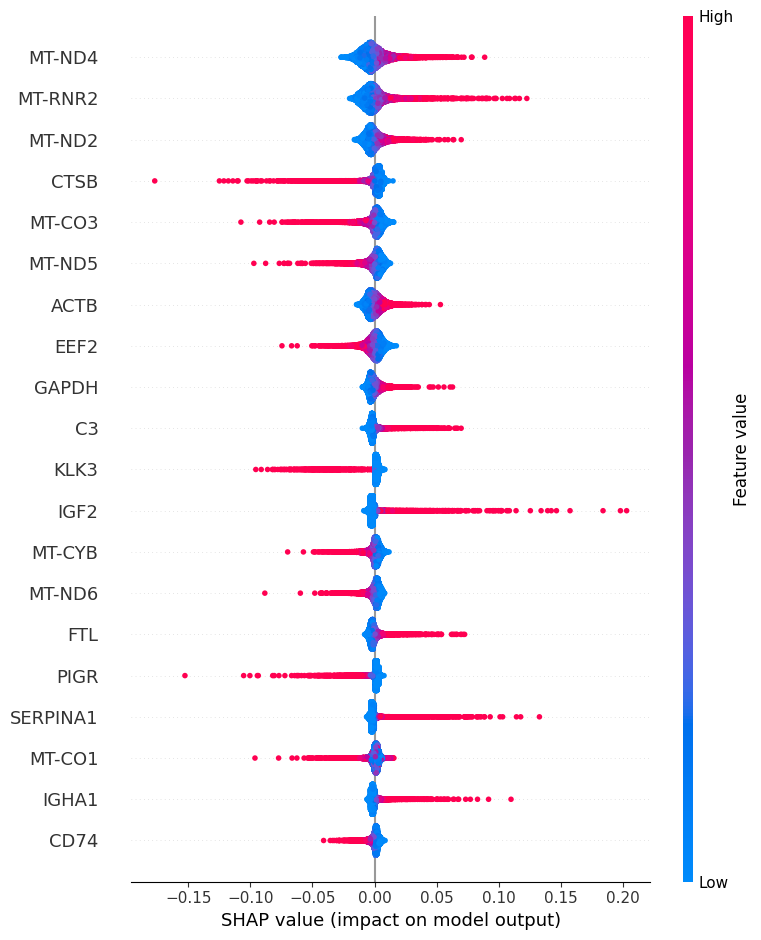

SHAP summary plot generated successfully.


In [44]:
import torch
import shap
from tqdm import tqdm
import numpy as np

# Supongamos que la época 10 es la que te interesa (indexada como 9 en Python)
epoch_of_interest = 2  # Indexada desde 0, por lo que la época 10 es epoch 9

# Obtener el modelo guardado al final de la época 10
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)

# Convertir los datos de miRNAs a un tensor, pero solo las primeras 100 muestras
X = df.iloc[:, :-2].values  # Usando las primeras 100 filas y todas las columnas excepto las dos últimas
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)

# Asegúrate de que el modelo esté en modo de evaluación
model.eval()

# Crear un modelo combinado que incluya tanto el FeatureExtractor como el LabelPredictor
class CombinedModel(torch.nn.Module):
    def __init__(self, feature_extractor, label_predictor):
        super(CombinedModel, self).__init__()
        self.feature_extractor = feature_extractor
        self.label_predictor = label_predictor

    def forward(self, x):
        features = self.feature_extractor(x)
        output = self.label_predictor(features)
        return output

combined_model = CombinedModel(model.feature_extractor, model.label_predictor)

# Crear un objeto SHAP explainer utilizando GradientExplainer con el modelo combinado
explainer = shap.GradientExplainer(combined_model, X_tensor)

# Calcular los valores SHAP para la salida del LabelPredictor directamente sobre X_tensor
shap_values = []
try:
    for i in tqdm(range(X_tensor.shape[0]), desc="Calculando valores SHAP"):
        shap_value = explainer.shap_values(X_tensor[i:i+1])
        shap_values.append(shap_value)
        print(f"SHAP values for instance {i}: {shap_value}")

    # Convertir la lista de valores SHAP a un numpy array
    shap_values_np = np.vstack(shap_values).squeeze()  # Eliminar la tercera dimensión
    print("Final SHAP values numpy array (shape):", shap_values_np.shape)

    # Usar los nombres de características originales
    feature_names_original = df.iloc[:, :-2].columns

    # Visualización de los valores SHAP para las características originales
    print("Generating SHAP summary plot...")
    shap.summary_plot(shap_values_np, X, feature_names=feature_names_original)
    print("SHAP summary plot generated successfully.")

except Exception as e:
    print(f"An error occurred: {e}")
    print(f"SHAP values calculated so far: {shap_values}")


In [ ]:
pd.DataFrame(shap_values_np,columns=df.iloc[:, :-2].columns,index=df.index)

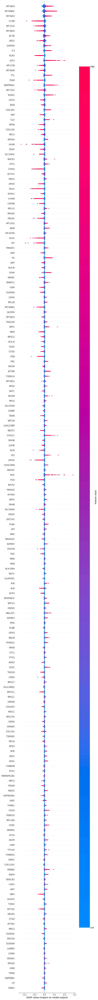

In [49]:
shap.summary_plot(shap_values_np, X, feature_names=feature_names_original, max_display=200)

In [ ]:
import seaborn as sns
import pandas as pd
import umap
import seaborn as sns
import matplotlib.pyplot as plt

# Crear un DataFrame con los valores SHAP para todos los datos
shap_df = pd.DataFrame(shap_values_np, columns=df.iloc[:, :-2].columns, index=df.index)

# Realizar UMAP en los valores SHAP para todos los datos
reducer = umap.UMAP(n_components=2, random_state=42)
umap_embedding = reducer.fit_transform(shap_df)

# Crear un DataFrame con el embedding UMAP y añadir las columnas de estado vital y panel
umap_df = pd.DataFrame(umap_embedding, columns=['UMAP1', 'UMAP2'])
umap_df['vital'] = df['vital'].values  # Añadir columna de estado vital
umap_df['panel'] = df['panel'].values  # Añadir columna de panel

# Graficar UMAP coloreado por estado vital
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.scatterplot(x='UMAP1', y='UMAP2', hue='vital', palette='coolwarm', data=umap_df, s=50)
plt.title('UMAP projection colored by Vital Status')
plt.legend(title='Vital Status')

# Graficar UMAP coloreado por panel
plt.subplot(1, 2, 2)
sns.scatterplot(x='UMAP1', y='UMAP2', hue='panel', palette='Spectral', data=umap_df, s=50)
plt.title('UMAP projection colored by Panel')
plt.legend(title='Panel')

plt.tight_layout()
plt.show()


/usr/local/lib/python3.10/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt


# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)
from sklearn.model_selection import train_test_split


# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Definir el número de pliegues
n_splits = 10  # Número de pliegues para la validación cruzada
skf = StratifiedKFold(n_splits=n_splits)

# Listas para almacenar resultados de AUC
auc_scores = []
fpr_list = []
tpr_list = []

# Validación cruzada estratificada
for fold, (train_index, test_index) in enumerate(skf.split(X, Y)):
    print(f"Fold {fold + 1}/{n_splits}")

    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X[train_index], X[test_index]
    Y_train, Y_test = Y[train_index], Y[test_index]

    # Convertir a tensores
    X_train_tensor = torch.tensor(X_train, dtype=torch.float32).to(device)
    Y_train_tensor = torch.tensor(Y_train, dtype=torch.float32).unsqueeze(1).to(device)
    X_test_tensor = torch.tensor(X_test, dtype=torch.float32).to(device)
    Y_test_tensor = torch.tensor(Y_test, dtype=torch.float32).unsqueeze(1).to(device)

    # Evaluar el modelo en el conjunto de prueba
    model.eval()
    with torch.no_grad():
        label_preds, _, _ = model(X_test_tensor)
        label_preds = label_preds.cpu().numpy()
        Y_test = Y_test_tensor.cpu().numpy()

    # Calcular el AUC
    auc_score = roc_auc_score(Y_test, label_preds)
    auc_scores.append(auc_score)

    # Calcular la curva ROC
    fpr, tpr, _ = roc_curve(Y_test, label_preds)
    fpr_list.append(fpr)
    tpr_list.append(tpr)

    print(f"AUC for fold {fold + 1}: {auc_score:.4f}")

# Promediar y graficar las curvas ROC
plt.figure(figsize=(10, 8))
for i in range(n_splits):
    plt.plot(fpr_list[i], tpr_list[i], label=f'Fold {i+1} (AUC = {auc_scores[i]:.4f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for Label Predictor across Folds')
plt.legend(loc="lower right")
plt.show()


In [ ]:
X_tensor.shape

**Analysis of the Model Outputs:**

The result you obtained confirms that the wrapper (`ModelWrapper`) is functioning correctly to return only the first output of the model, which corresponds to the vital status prediction. Below is the analysis of the results:

1. **Outputs of the model without the wrapper:**
   - **First output:** `tensor([[4.6149e-02], ... , [6.9630e-02]], device='cuda:0')` with dimension `[10286, 1]` corresponds to the vital status prediction (`LabelPredictor`).
   - **Second output:** `tensor([[-0.2760,  0.1515, ...]], device='cuda:0')` with dimension `[10286, 33]` corresponds to the domain prediction (`DomainClassifier`).
   - **Third output:** `tensor([[ 2.3175e-01, ...]], device='cuda:0')` with dimension `[10286, 5000]` corresponds to some intermediate representation or features from the feature extractor (`FeatureExtractor`).

2. **Output of the model with the wrapper:**
   - **Output:** `tensor([[4.6149e-02], ... , [6.9630e-02]], device='cuda:0')` with dimension `[10286, 1]` corresponds to the first output of the model, which is the vital status prediction, as expected.

**Conclusion:**

The wrapper `ModelWrapper` is functioning as intended, returning only the first output of the full model, which is the vital status prediction. This is confirmed by comparing the dimensions:

- **Dimensions of all outputs:**
  - **First output:** `[10286, 1]`
  - **Second output:** `[10286, 33]`
  - **Third output:** `[10286, 5000]`

- **Dimension of the wrapped output:**
  - `[10286, 1]`

The dimension `[10286, 1]` of the wrapped output matches the dimension of the vital status prediction, confirming that the wrapper is correctly returning the first output.

This behavior ensures that when you calculate SHAP values using the wrapper, you are calculating SHAP values with respect to the vital status prediction (and not the other outputs of the model). This is exactly what you need to analyze how the input features influence the vital status prediction in your DANN model.




In [ ]:
asdasdasdasdasdasd

In [ ]:
import shap
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import torch

# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)

# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Convertir los datos a tensores y moverlos al dispositivo (CPU o GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)
print(X_tensor.shape)

# Supongamos que la época 10 es la que te interesa (indexada como 9 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 10 es epoch 9

# Obtener el modelo guardado al final de la época 9
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)

# Asegúrate de que el modelo completo esté en modo de evaluación
model.eval()

# Obtener la salida del modelo
output = model(X_tensor)

# Si el modelo devuelve una tupla, selecciona la primera salida
if isinstance(output, tuple):
    output = output[0]

# Paso 1: Usar GradientExplainer para calcular los valores SHAP basados en las características originales
explainer = shap.GradientExplainer(model, X_tensor)
shap_values = explainer.shap_values(X_tensor)
print(shap_values.shape)

# Paso 2: Convertir los valores SHAP a numpy para visualización
shap_values_np = np.array(shap_values).squeeze()

# Paso 3: Visualización de SHAP con feature_names tomadas del DataFrame original
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:
import shap
import torch
from sklearn.preprocessing import LabelEncoder
import numpy as np

# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital

# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Convertir los datos a tensores y moverlos al dispositivo (CPU o GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)

# Supongamos que la época 5 es la que te interesa (indexada como 4 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 10 es epoch 9

# Obtener el modelo guardado al final de la época 9
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)

# Asegúrate de que el modelo completo esté en modo de evaluación
model.eval()

# Paso 1: Crear un objeto DeepExplainer para el modelo
explainer = shap.DeepExplainer(model.label_predictor, X_tensor)

# Paso 2: Calcular los valores SHAP utilizando el tensor de entrada X_tensor
shap_values = explainer.shap_values(X_tensor)

# Paso 3: Convertir los valores SHAP a numpy para visualización
shap_values_np = np.array(shap_values).squeeze()

# Verifica las dimensiones de shap_values para asegurarte de que coincide con lo esperado
print("Dimensión de shap_values:", shap_values_np.shape)

# Paso 4: Visualización de SHAP con feature_names tomadas del DataFrame original
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:
import shap
import torch
from sklearn.preprocessing import LabelEncoder
import numpy as np

# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)

# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Convertir los datos a tensores y moverlos al dispositivo (CPU o GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)

# Supongamos que la época 5 es la que te interesa (indexada como 4 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 10 es epoch 9

# Obtener el modelo guardado al final de la época 9
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)

# Asegúrate de que el modelo completo esté en modo de evaluación
model.eval()

# Verificar las salidas del modelo sin el wrapper
with torch.no_grad():
    all_outputs = model(X_tensor)
    print("Salidas del modelo (sin wrapper):", all_outputs)
    print("Dimensiones de todas las salidas:", [output.shape for output in all_outputs])

# Crear una clase wrapper para el modelo
# Esta clase `ModelWrapper` envuelve el modelo completo, pero en la función `forward`
# devuelve solo la primera salida del modelo (que corresponde a la predicción del estado vital).
class ModelWrapper(torch.nn.Module):
    def __init__(self, model):
        super(ModelWrapper, self).__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)[0]  # Retornar solo la primera salida (la predicción de la etiqueta de vitalidad)

# Instanciar la clase wrapper
wrapped_model = ModelWrapper(model)

# Verificar la salida del modelo con el wrapper
with torch.no_grad():
    wrapped_output = wrapped_model(X_tensor)
    print("Salida del modelo (con wrapper):", wrapped_output)
    print("Dimensión de la salida envuelta:", wrapped_output.shape)

# Paso 1: Usar GradientExplainer para calcular los valores SHAP basados en las características originales
explainer = shap.DeepExplainer(wrapped_model, X_tensor)
shap_values = explainer.shap_values(X_tensor)

# Paso 2: Convertir los valores SHAP a numpy para visualización
shap_values_np = np.array(shap_values).squeeze()

# Verifica las dimensiones de shap_values para asegurarte de que coincide con lo esperado
print("Dimensión de shap_values:", shap_values_np.shape)

# Paso 3: Visualización de SHAP con feature_names tomadas del DataFrame original
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)



In [ ]:
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)

In [ ]:
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:
import shap
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import torch

# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)

# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Convertir los datos a tensores y moverlos al dispositivo (CPU o GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)

# Supongamos que la época 5 es la que te interesa (indexada como 4 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 10 es epoch 9

# Obtener el modelo guardado al final de la época 9
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)

# Asegúrate de que el modelo completo esté en modo de evaluación
model.eval()

# Crear una clase wrapper para el modelo
class ModelWrapper(torch.nn.Module):
    def __init__(self, model):
        super(ModelWrapper, self).__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)[0]  # Retornar solo la primera salida

# Instanciar la clase wrapper
wrapped_model = ModelWrapper(model)

# Paso 1: Usar GradientExplainer para calcular los valores SHAP basados en las características originales
explainer = shap.GradientExplainer(wrapped_model, X_tensor,batch_size = 150)
shap_values = explainer.shap_values(X_tensor)

# Paso 2: Convertir los valores SHAP a numpy para visualización
shap_values_np = np.array(shap_values).squeeze()

# Paso 3: Visualización de SHAP con feature_names tomadas del DataFrame original
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:
sdasdasdasdasdasdasdasd

In [ ]:
import shap
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import torch

# Preparar los datos
X = df.iloc[:, :-2].values  # Datos de miRNAs
Y = df['vital'].values  # Estado vital
panels = df['panel'].values  # Etiquetas del dominio (paneles)

# Convertir el estado vital a valores numéricos
label_encoder_vital = LabelEncoder()
Y = label_encoder_vital.fit_transform(Y)

# Convertir los datos a tensores y moverlos al dispositivo (CPU o GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
Y_tensor = torch.tensor(Y, dtype=torch.float32).unsqueeze(1).to(device)

# Supongamos que la época 5 es la que te interesa (indexada como 4 en Python)
epoch_of_interest = 9  # Indexada desde 0, por lo que la época 10 es epoch 9

# Obtener el modelo guardado al final de la época 9
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
epoch, iteration = iteration_info

print(f"Modelo guardado al final de la época {epoch + 1}, iteración {iteration + 1}")
model.load_state_dict(model_state_dict)

# Asegúrate de que el modelo completo esté en modo de evaluación
model.eval()

# Crear una clase wrapper para el modelo
class ModelWrapper(torch.nn.Module):
    def __init__(self, model):
        super(ModelWrapper, self).__init__()
        self.model = model

    def forward(self, x):
        return self.model(x)[0]  # Retornar solo la primera salida

# Instanciar la clase wrapper
wrapped_model = ModelWrapper(model)

# Paso 1: Usar GradientExplainer para calcular los valores SHAP basados en las características originales
explainer = shap.GradientExplainer(wrapped_model, X_tensor)
shap_values = explainer.shap_values(X_tensor)

# Paso 2: Convertir los valores SHAP a numpy para visualización
shap_values_np = np.array(shap_values).squeeze()

# Paso 3: Visualización de SHAP con feature_names tomadas del DataFrame original
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:
import shap
import torch

# Asumiendo que el modelo DANN ya ha sido definido y entrenado

# Instanciar y cargar el modelo como se hace en el código original
input_dim = X.shape[1]
num_domains = len(label_encoder_panel.classes_)
model = DANN(input_dim, num_domains).to(device)

# Cargar el modelo guardado al final de una época en particular
epoch_of_interest = 9  # Ejemplo, puedes ajustar la época de interés
iteration_info, model_state_dict = model_saver.get_models()[epoch_of_interest]
model.load_state_dict(model_state_dict)

# Asegurarse de que el modelo esté en modo de evaluación
model.eval()

# Crear una clase wrapper para obtener solo la salida del LabelPredictor
class LabelPredictorWrapper(torch.nn.Module):
    def __init__(self, model):
        super(LabelPredictorWrapper, self).__init__()
        self.label_predictor = model.label_predictor

    def forward(self, x):
        return self.label_predictor(x)

# Instanciar el wrapper
label_predictor_model = LabelPredictorWrapper(model)

# Usar GradientExplainer para calcular los valores SHAP basados en las características originales
explainer = shap.GradientExplainer(label_predictor_model, X_tensor)
shap_values = explainer.shap_values(X_tensor)

# Convertir los valores SHAP a numpy para visualización
shap_values_np = np.array(shap_values).squeeze()

# Visualización de SHAP
shap.summary_plot(shap_values_np, X, feature_names=df.iloc[:, :-2].columns)


In [ ]:

# Paso 2: Usar GradientExplainer para calcular los valores SHAP
explainer = shap.GradientExplainer(label_predictor_model,X)
shap_values = explainer.shap_values(X)

# Paso 3: Convertir los tensores de entrada y los valores SHAP a numpy para visualización
features_np = X.cpu().numpy()
shap_values_np = np.array(shap_values).squeeze()

# Paso 4: Visualización de SHAP con feature_names tomadas del DataFrame original
shap.summary_plot(shap_values_np, features_np, feature_names=df.iloc[:, :-2].columns)

In [ ]:
features_np.shape

In [ ]:
len(df.iloc[:, :-2].columns)

In [ ]:
shap.summary_plot(shap_values_np, features_np, feature_names=df.iloc[:, :-2].columns,max_display=50 )


In [ ]:
shap_values_np.shape

In [ ]:

pd.DataFrame(shap_values_np, columns=df.iloc[:, :-2].columns,index=df.index)